In [24]:
import sys
!{sys.executable} -m pip install Shapely

  Using cached https://files.pythonhosted.org/packages/a2/fb/7a7af9ef7a35d16fa23b127abee272cfc483ca89029b73e92e93cdf36e6b/Shapely-1.6.4.post2.tar.gz
    Complete output from command python setup.py egg_info:
    Traceback (most recent call last):
      File "<string>", line 1, in <module>
      File "C:\Users\hatsu\AppData\Local\Temp\pip-install-mtuczs72\Shapely\setup.py", line 80, in <module>
        from shapely._buildcfg import geos_version_string, geos_version, \
      File "C:\Users\hatsu\AppData\Local\Temp\pip-install-mtuczs72\Shapely\shapely\_buildcfg.py", line 200, in <module>
        lgeos = CDLL("geos_c.dll")
      File "C:\Users\hatsu\Anaconda3\lib\ctypes\__init__.py", line 356, in __init__
        self._handle = _dlopen(self._name, mode)
    OSError: [WinError 126] The specified module could not be found
    
    ----------------------------------------


Command "python setup.py egg_info" failed with error code 1 in C:\Users\hatsu\AppData\Local\Temp\pip-install-mtuczs72\Shapely\
You are using pip version 10.0.1, however version 19.1 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [3]:
import shapefile
import shapely.geometry as geometry
import math

In [4]:
sf = shapefile.Reader("Boston_Neighborhoods/Boston_Neighborhoods.shp")
shapes = sf.shapes()
records = sf.records()
pt = -71.06135413,42.36643546

#coordinate in the form of longitude, latitude
def get_neighborhood(coordinates):
    for i in range(0, len(shapes)):
        boundary = shapes[i]
    #     print(boundary.points[0])
        neighborhood = records[i][1]
        if geometry.Point(pt).within(geometry.shape(boundary)):
#             print("The point is in", neighborhood)
            return neighborhood

In [5]:
import pandas as pd
crimes_df = pd.read_csv('analyzeboston/crime_incident_reports_aug2015_present.csv')
# crimes_df.dropna(thresh=2)
crimes_df = crimes_df[crimes_df['lat'].notnull()]
# crimes_df = crimes_df.head(10)

In [12]:
# reverse geo-mapping of long/lat to neighborhood
crimes_df['neighborhood'] = ""
for i, row in crimes_df.iterrows():
    long = crimes_df.at[i, 'long']
    lat = crimes_df.at[i, 'lat']
    pt = long, lat
    neighborhood = get_neighborhood(pt)
    print(i, long, lat, neighborhood)
    crimes_df.at[i, 'neighborhood'] = neighborhood


0 -71.06135413 42.36643546 West End
1 -71.1535894 42.34697615 Brighton
2 -71.1207012 42.24487982 Hyde Park
3 -71.08482402 42.32925905 Roxbury
4 -71.08482402 42.32925905 Roxbury
5 -71.093993 42.2920332 Dorchester
6 -71.1362192 42.35339757 Allston
7 -71.07062879 42.29736576 Dorchester
8 -71.14152184 42.34296677 Brighton
9 -71.14152184 42.34296677 Brighton
10 -71.08845935 42.34044966 Fenway
11 -71.07086154 42.31238668 Dorchester
12 -71.11185116 42.33136931 Mission Hill
13 -71.07344862 42.29350272 Dorchester
14 -71.07551289 42.34640381 South End
15 -71.06432264 42.35311007 Downtown
16 -71.06061465 42.37343545 Charlestown
17 -71.03591673 42.37599904 East Boston
18 -71.06860662 42.29703368 Dorchester
19 -71.07645111 42.34020387 South End
20 -71.08073158 42.30978366 Dorchester
21 -71.07638124 42.33401829 Roxbury
22 -71.07811557 42.31656425 Roxbury
24 -71.06097646 42.36568533 West End
25 -71.09075049 42.26956689 Mattapan
26 -71.0880062 42.31753807 Roxbury
27 -71.16286273 42.27145702 West Roxbu

293 -71.12971806 42.2533034 Hyde Park
294 -71.05230915 42.32283112 Dorchester
295 -71.09137369 42.28482577 Dorchester
296 -71.08823995 42.2803354 Mattapan
298 -71.09799504 42.34854604 Fenway
299 -71.07268587 42.28646063 Dorchester
302 -71.08970547 42.27205915 Mattapan
306 -71.05602989 42.33204066 South Boston
308 -71.07060801 42.28531158 Dorchester
310 -71.07289694 42.28876736 Dorchester
311 -71.0934647 42.34750472 Fenway
312 -71.06555908 42.34254533 South End
313 -71.0631802 42.37246597 Charlestown
315 -71.06516235 42.34285014 South End
318 -71.07233558 42.2969072 Dorchester
319 -71.08502291 42.29752097 Dorchester
320 -71.16622825 42.34652179 Brighton
321 -71.16622825 42.34652179 Brighton
322 -71.14492138 42.3458376 Brighton
323 -71.0581068 42.32445145 Dorchester
324 -71.159387 42.27992727 West Roxbury
325 -71.05593196 42.37663167 Charlestown
326 -71.153394 42.34932976 Brighton
327 -71.08051941 42.32696802 Roxbury
328 -71.08051941 42.32696802 Roxbury
329 -71.05854263 42.35091932 Leath

567 -71.07801426 42.28576135 Dorchester
568 -71.14103522 42.25067181 Hyde Park
569 -71.04489149 42.33546813 South Boston
570 -71.04705015 42.33482917 South Boston
571 -71.04950099 42.33533446 South Boston
572 -71.08117746 42.34403563 Back Bay
573 -71.08117746 42.34403563 Back Bay
575 -71.0926152 42.31462973 Roxbury
576 -71.05886116 42.29273124 Dorchester
577 -71.05635419 42.35892253 Downtown
578 -71.14489226 42.25845301 West Roxbury
579 -71.07357194 42.33110748 Roxbury
580 -71.09079757 42.28261082 Mattapan
581 -71.09079757 42.28261082 Mattapan
582 -71.07332218 42.32312591 Roxbury
583 -71.13114273 42.35283155 Allston
584 -71.06940877 42.33954199 South End
585 -71.0921354 42.27193751 Mattapan
586 -71.0921354 42.27193751 Mattapan
587 -71.08565039 42.33640891 Roxbury
588 -71.05817718 42.3124901 Dorchester
590 -71.07078234 42.35979038 Beacon Hill
591 -71.09795135 42.31615184 Roxbury
592 -71.09090863 42.28548568 Dorchester
594 -71.03641895 42.33561661 South Boston
595 -71.11479066 42.3205495

821 -71.05979924 42.30151745 Dorchester
822 -71.05979924 42.30151745 Dorchester
824 -71.06087585 42.30385443 Dorchester
825 -71.07966487 42.28300178 Dorchester
826 -71.07966487 42.28300178 Dorchester
827 -71.15144899 42.27781174 West Roxbury
828 -71.1045947 42.34145645 Longwood
829 -71.10067012 42.26788791 Mattapan
830 -71.06964861 42.30816879 Dorchester
832 -71.07086192 42.3606447 Beacon Hill
833 -71.0780367 42.3214622 Roxbury
834 -71.08206875 42.29478707 Dorchester
835 -71.05488123 42.36339154 North End
836 -71.03632925 42.3331091 South Boston
838 -71.05524751 42.36303798 North End
839 -71.0883947 42.28855818 Dorchester
840 -71.04864886 42.33129745 South Boston
843 -71.05539138 42.33723127 South Boston
844 -71.10317575 42.32624204 Jamaica Plain
845 -71.15288978 42.33848236 Brighton
846 -71.02985538 42.37757302 East Boston
847 -71.08277637 42.34862382 Back Bay
848 -71.08365801 42.33248759 Roxbury
849 -71.06133846 42.36152577 Downtown
851 -71.15345452 42.34774669 Brighton
852 -71.14955

1106 -71.05622834 42.29519923 Dorchester
1107 -71.06084937 42.35698857 Downtown
1108 -71.08823995 42.2803354 Mattapan
1109 -71.08274741 42.328597 Roxbury
1110 -71.13423049 42.34977988 Allston
1111 -71.09947709 42.31461036 Jamaica Plain
1112 -71.09187755 42.33367922 Roxbury
1113 -71.09344053 42.27470119 Mattapan
1114 -71.06878 42.30244791 Dorchester
1115 -71.07044443 42.3079191 Dorchester
1116 -71.06584776 42.36438365 West End
1117 -71.01203798 42.38783615 East Boston
1118 -71.06087585 42.30385443 Dorchester
1120 -71.06189505 42.356585 Downtown
1121 -71.09137369 42.28482577 Dorchester
1122 -71.07179406 42.29257648 Dorchester
1123 -71.09746579 42.31506898 Roxbury
1124 -71.09384023 42.26922278 Mattapan
1125 -71.12658585 42.28788933 Roslindale
1126 -71.10328402 42.32291406 Jamaica Plain
1127 -71.07009458 42.35061995 Downtown
1128 -71.05388239 42.3350667 South Boston
1129 -71.11702662 42.30903072 Jamaica Plain
1130 -71.04001774 42.28791697 Dorchester
1131 -71.05030994 42.33079359 South Bost

1355 -71.09168024 42.28389647 Mattapan
1357 -71.08745741 42.32227057 Roxbury
1359 -71.07551289 42.34640381 South End
1360 -71.076256 42.31161123 Dorchester
1361 -71.07154272 42.27294749 Mattapan
1362 -71.09639406 42.28338795 Mattapan
1363 -71.03822833 42.3746571 East Boston
1364 -71.08683416 42.34363458 Fenway
1365 -71.0878529 42.3503876 Back Bay
1366 -71.06373331 42.35103105 Downtown
1368 -71.09137369 42.28482577 Dorchester
1369 -71.09137369 42.28482577 Dorchester
1370 -71.07244098 42.2918158 Dorchester
1371 -71.10738225 42.2741969 Mattapan
1373 -71.05965615 42.29331199 Dorchester
1374 -71.056018 42.36062746 Downtown
1375 -71.14005764 42.29102317 Roslindale
1376 -71.14005764 42.29102317 Roslindale
1377 -71.14533675 42.36083891 Brighton
1378 -71.07056121 42.30288559 Dorchester
1379 -71.04113497 42.34908837 South Boston Waterfront
1380 -71.10553022 42.30983976 Jamaica Plain
1381 -71.08692603 42.3132476 Roxbury
1382 -71.06382224 42.34496729 South End
1383 -71.06516235 42.34285014 South E

1648 -71.06719268 42.31694068 Dorchester
1649 -71.0524813 42.32557398 South Boston
1650 -71.08584183 42.29686162 Dorchester
1651 -71.06312433 42.35540738 Downtown
1652 -71.05843518 42.28984188 Dorchester
1653 -71.06981187 42.28248068 Dorchester
1654 -71.06981187 42.28248068 Dorchester
1655 -71.08808525 42.29017432 Dorchester
1656 -71.08808525 42.29017432 Dorchester
1657 -71.0840695 42.33582317 Roxbury
1658 -71.05851176 42.29963709 Dorchester
1659 -71.16436648 42.3549896 Brighton
1660 -71.09344053 42.27470119 Mattapan
1661 -71.09158038 42.29558507 Dorchester
1662 -71.06206351 42.35521429 Downtown
1663 -71.1089037 42.27131266 Hyde Park
1664 -71.08429595 42.3457782 Back Bay
1665 -71.15615168 42.35532826 Brighton
1666 -71.15615168 42.35532826 Brighton
1667 -71.15615168 42.35532826 Brighton
1668 -71.15615168 42.35532826 Brighton
1669 -71.07918459 42.30422176 Dorchester
1670 -71.06051814 42.35547514 Downtown
1671 -71.06027484 42.35359116 Downtown
1672 -71.09746579 42.31506898 Roxbury
1674 -7

1914 -71.14762531 42.3499624 Brighton
1915 -71.11636523 42.27810693 Roslindale
1916 -71.11636523 42.27810693 Roslindale
1917 -71.07452168 42.35176179 Back Bay
1918 -71.14910762 42.34371213 Brighton
1919 -71.08422846 42.30066767 Dorchester
1920 -71.06256742 42.30665904 Dorchester
1921 -71.0865739 42.32665688 Roxbury
1922 -71.10003437 42.26983458 Mattapan
1923 -71.0871581 42.28378654 Dorchester
1924 -71.0732809 42.34923356 Back Bay
1925 -71.06256291 42.35272948 Downtown
1926 -71.11789251 42.29608406 Jamaica Plain
1927 -71.05580704 42.29930441 Dorchester
1928 -71.05580704 42.29930441 Dorchester
1929 -71.15060993 42.35121225 Brighton
1931 -71.08147836 42.28848549 Dorchester
1932 -71.11312439 42.30055518 Jamaica Plain
1933 -71.07775478 42.31915303 Roxbury
1934 -71.0858704 42.29549223 Dorchester
1935 -71.0858704 42.29549223 Dorchester
1936 -71.0607314 42.35554806 Downtown
1937 -71.05474135 42.35997967 Downtown
1941 -71.10096723 42.32283759 Jamaica Plain
1942 -71.07138696 42.332354 South Bost

2155 -71.06593853 42.31635508 Dorchester
2158 -71.05567996 42.35902548 Downtown
2159 -71.13289373 42.35315862 Allston
2160 -71.16006811 42.35439933 Brighton
2161 -71.0639181 42.36243437 West End
2162 -71.0639181 42.36243437 West End
2163 -71.10128822 42.32706721 Mission Hill
2164 -71.06940877 42.33954199 South End
2165 -71.08051921 42.34262866 South End
2166 -71.083158 42.3494205 Back Bay
2167 -71.08412735 42.31951195 Roxbury
2168 -71.07878424 42.34131756 South End
2169 -71.08382217 42.32872589 Roxbury
2170 -71.07393881 42.33318449 Roxbury
2171 -71.16317298 42.26941355 West Roxbury
2172 -71.07452168 42.35176179 Back Bay
2173 -71.07452168 42.35176179 Back Bay
2174 -71.06415106 42.3309164 South Boston
2176 -71.0695442 42.33631343 South End
2177 -71.06949131 42.38374886 Charlestown
2178 -71.09971911 42.32950195 Mission Hill
2179 -71.08926812 42.28733485 Dorchester
2180 -71.12703379 42.2857489 Roslindale
2182 -71.08341505 42.32902469 Roxbury
2183 -71.08990388 42.28863337 Dorchester
2185 -7

2423 -71.08935457 42.33031057 Roxbury
2424 -71.14273729 42.35822285 Brighton
2425 -71.1294909 42.28125357 Roslindale
2426 -71.07035467 42.33936768 South End
2427 -71.10649737 42.33962338 Longwood
2428 -71.07014395 42.33210843 South Boston
2429 -71.08050743 42.3040173 Dorchester
2430 -71.06835343 42.32856401 Roxbury
2431 -71.11737789 42.26414702 Hyde Park
2432 -71.04284093 42.3465477 South Boston Waterfront
2433 -71.07442362 42.27130225 Mattapan
2434 -71.07442362 42.27130225 Mattapan
2435 -71.07442362 42.27130225 Mattapan
2436 -71.07442362 42.27130225 Mattapan
2437 -71.07442362 42.27130225 Mattapan
2438 -71.16422504 42.35552225 Brighton
2439 -71.06209904 42.31669234 Dorchester
2440 -71.07410474 42.30889362 Dorchester
2441 -71.07362757 42.28816223 Dorchester
2442 -71.04499632 42.34373929 South Boston Waterfront
2443 -71.12058814 42.28658673 Roslindale
2444 -71.07416742 42.30334343 Dorchester
2445 -71.13090649 42.35540113 Allston
2446 -71.08606151 42.34116489 Fenway
2447 -71.0741278 42.35

2694 -71.09380308 42.26994732 Mattapan
2695 -71.07576538 42.29702742 Dorchester
2696 -71.09392554 42.34880461 Fenway
2697 -71.04030314 42.38166501 East Boston
2698 -71.06265046 42.31828902 Dorchester
2701 -71.09880598 42.3465382 Fenway
2702 -71.08135829 42.31109885 Dorchester
2704 -71.06165515 42.3642384 West End
2706 -71.03999474 42.31887581 Dorchester
2707 -71.09301057 42.268024 Mattapan
2708 -71.07416609 42.34854636 Back Bay
2709 -71.09332702 42.27895125 Mattapan
2710 -71.0827431 42.29746606 Dorchester
2712 -71.05340359 42.32476494 South Boston
2713 -71.0908705 42.2818866 Mattapan
2714 -71.06373331 42.35103105 Downtown
2715 -71.08010711 42.31407167 Roxbury
2716 -71.1276629 42.28688203 Roslindale
2717 -71.05633295 42.28357335 Dorchester
2718 -71.09592156 42.33511145 Mission Hill
2719 -71.14358992 42.28749564 Roslindale
2720 -71.15274721 42.35555336 Brighton
2721 -71.0051911 42.39035323 East Boston
2722 -71.12255206 42.24288459 Hyde Park
2724 -71.06717833 42.36031427 Beacon Hill
2725 

2949 -71.13034026 42.23578713 Hyde Park
2950 -71.1440032 42.36181486 Brighton
2952 -71.08365801 42.33248759 Roxbury
2953 -71.11414509 42.31265126 Jamaica Plain
2954 -71.04030314 42.38166501 East Boston
2956 -71.05593196 42.37663167 Charlestown
2957 -71.06500833 42.31319382 Dorchester
2958 -71.06650735 42.34943694 Bay Village
2959 -71.06760042 42.30406722 Dorchester
2960 -71.07932755 42.30870132 Dorchester
2961 -71.07932755 42.30870132 Dorchester
2962 -71.07932755 42.30870132 Dorchester
2963 -71.07841035 42.33665048 Roxbury
2964 -71.08373481 42.33044113 Roxbury
2965 -71.05212509 42.33162355 South Boston
2966 -71.08866865 42.34376458 Fenway
2967 -71.06964861 42.30816879 Dorchester
2969 -71.07964562 42.31679542 Roxbury
2972 -71.06504999 42.35908084 Beacon Hill
2973 -71.08179001 42.31226098 Roxbury
2974 -71.04291647 42.33550576 South Boston
2975 -71.08677983 42.32545165 Roxbury
2976 -71.08677983 42.32545165 Roxbury
2977 -71.06323044 42.3053786 Dorchester
2978 -71.06981187 42.28248068 Dorch

3200 -71.06164783 42.30569111 Dorchester
3201 -71.11081856 42.30307413 Jamaica Plain
3204 -71.06581008 42.31465584 Dorchester
3205 -71.13382686 42.25101904 Hyde Park
3206 -71.07591511 42.31332153 Dorchester
3207 -71.07591511 42.31332153 Dorchester
3208 -71.06248252 42.38003093 Charlestown
3209 -71.06951681 42.36026799 Beacon Hill
3210 -71.06581008 42.31465584 Dorchester
3211 -71.07549056 42.32329712 Roxbury
3212 -71.07549056 42.32329712 Roxbury
3213 -71.17200676 42.29639086 West Roxbury
3214 -71.09708333 42.33465694 Mission Hill
3215 -71.08012196 42.34626167 Back Bay
3216 -71.05392145 42.34079771 South Boston
3218 -71.09286048 42.27968299 Mattapan
3219 -71.09286048 42.27968299 Mattapan
3223 -71.05742148 42.29487474 Dorchester
3224 -71.08931055 42.31026891 Roxbury
3225 -71.09871709 42.28184113 Mattapan
3226 -71.03002495 42.37935616 East Boston
3228 -71.08485273 42.33542742 Roxbury
3229 -71.08206723 42.32221645 Roxbury
3230 -71.08115673 42.33087019 Roxbury
3231 -71.0658297 42.31735472 Do

3468 -71.06321676 42.32809966 Dorchester
3469 -71.03207627 42.37474388 East Boston
3470 -71.07409528 42.29714531 Dorchester
3471 -71.08231854 42.30989454 Dorchester
3472 -71.08231854 42.30989454 Dorchester
3473 -71.04966031 42.29878358 Dorchester
3474 -71.03262575 42.36639946 East Boston
3475 -71.07086192 42.3606447 Beacon Hill
3476 -71.15274721 42.35555336 Brighton
3477 -71.05851176 42.29963709 Dorchester
3478 -71.07452168 42.35176179 Back Bay
3479 -71.07020353 42.33374643 South Boston
3480 -71.03979926 42.37620267 East Boston
3481 -71.04227322 42.3710588 East Boston
3482 -71.04814061 42.35348229 South Boston Waterfront
3483 -71.059438 42.364634 West End
3485 -71.17204938 42.26932098 West Roxbury
3486 -71.06348817 42.34997256 Downtown
3487 -71.06348817 42.34997256 Downtown
3488 -71.06991643 42.33041991 Roxbury
3489 -71.06760101 42.34095802 South End
3490 -71.08584183 42.29686162 Dorchester
3491 -71.06368978 42.31993148 Dorchester
3492 -71.0829325 42.339675 Roxbury
3493 -71.06537601 42

3758 -71.08323229 42.28734054 Dorchester
3759 -71.08259001 42.28848287 Dorchester
3760 -71.09404899 42.32005832 Roxbury
3761 -71.09404899 42.32005832 Roxbury
3762 -71.09404899 42.32005832 Roxbury
3763 -71.12608814 42.27464348 Roslindale
3767 -71.06399249 42.30287064 Dorchester
3768 -71.09301057 42.268024 Mattapan
3769 -71.07022771 42.34055884 South End
3770 -71.09722321 42.28281074 Mattapan
3771 -71.05835354 42.35892279 Downtown
3772 -71.06177615 42.35602373 Downtown
3773 -71.06177615 42.35602373 Downtown
3774 -71.07900139 42.32926098 Roxbury
3775 -71.03793387 42.36971223 East Boston
3776 -71.09259161 42.32980758 Roxbury
3778 -71.09387677 42.26817397 Mattapan
3779 -71.07994459 42.30438536 Dorchester
3780 -71.08700389 42.28424005 Dorchester
3781 -71.07664628 42.29158089 Dorchester
3782 -71.14822128 42.28709355 West Roxbury
3783 -71.13648997 42.35638326 Allston
3784 -71.06288798 42.2908347 Dorchester
3787 -71.07763936 42.3531455 Back Bay
3788 -71.13856303 42.34775725 Allston
3789 -71.075

4010 -71.09137369 42.28482577 Dorchester
4011 -71.03917179 42.36943145 East Boston
4012 -71.07597603 42.33721215 South End
4014 -71.02778665 42.37842947 East Boston
4015 -71.02778665 42.37842947 East Boston
4016 -71.07997968 42.34665908 Back Bay
4017 -71.07997968 42.34665908 Back Bay
4019 -71.09486034 42.31529421 Roxbury
4020 -71.07287043 42.27179929 Mattapan
4021 -71.06444063 42.28526024 Dorchester
4025 -71.08277637 42.34862382 Back Bay
4026 -71.07840978 42.34980175 Back Bay
4027 -71.09137369 42.28482577 Dorchester
4028 -71.09380308 42.26994732 Mattapan
4029 -71.06022431 42.37915428 Charlestown
4030 -71.08331942 42.31949163 Roxbury
4031 -71.09219288 42.32655484 Roxbury
4032 -71.07986094 42.31598547 Roxbury
4033 -71.07214055 42.2956968 Dorchester
4034 -71.0597091 42.29755533 Dorchester
4035 -71.10039628 42.31944733 Jamaica Plain
4036 -71.09659186 42.34489594 Fenway
4037 -71.16127242 42.34890907 Brighton
4038 -71.03905688 42.37374231 East Boston
4039 -71.09192415 42.3191711 Roxbury
4040

4261 -71.12401947 42.25621592 Hyde Park
4262 -71.05727637 42.35332464 Downtown
4265 -71.05254002 42.31530841 Dorchester
4266 -71.16686843 42.34711138 Brighton
4268 -71.09959089 42.33056977 Mission Hill
4269 -71.11658735 42.26649191 Hyde Park
4270 -71.08138665 42.31978168 Roxbury
4271 -71.05835354 42.35892279 Downtown
4272 -71.0804542 42.3223837 Roxbury
4273 -71.051414 42.354758 Downtown
4274 -71.10087902 42.32469443 Jamaica Plain
4275 -71.15726319 42.26454355 West Roxbury
4277 -71.05834525 42.36519854 North End
4278 -71.10429432 42.30971857 Jamaica Plain
4279 -71.06990786 42.32918864 Roxbury
4281 -71.07849582 42.3479724 Back Bay
4282 -71.06908191 42.33189752 South Boston
4283 -71.08179833 42.32074773 Roxbury
4284 -71.02955201 42.36604954 East Boston
4285 -71.06316493 42.31364183 Dorchester
4286 -71.06316493 42.31364183 Dorchester
4287 -71.06316493 42.31364183 Dorchester
4288 -71.06316493 42.31364183 Dorchester
4290 -71.08248216 42.3502867 Back Bay
4291 -71.07461217 42.33816387 South En

4530 -71.07824138 42.31130246 Dorchester
4531 -71.07824138 42.31130246 Dorchester
4532 -71.07824138 42.31130246 Dorchester
4533 -71.16830201 42.28101823 West Roxbury
4534 -71.12430955 42.25466263 Hyde Park
4535 -71.0613401 42.310434 Dorchester
4539 -71.06566102 42.30748785 Dorchester
4540 -71.06514623 42.30945933 Dorchester
4541 -71.09670909 42.31440549 Jamaica Plain
4542 -71.07730382 42.30645148 Dorchester
4545 -71.07638124 42.33401829 Roxbury
4546 -71.0584977 42.32087315 Dorchester
4547 -71.08373481 42.33044113 Roxbury
4548 -71.09049092 42.2904245 Dorchester
4552 -71.09422962 42.28553375 Mattapan
4553 -71.03438535 42.36815918 East Boston
4554 -71.04639023 42.35404844 South Boston Waterfront
4555 -71.09980109 42.34353469 Fenway
4556 -71.08099529 42.34585625 Back Bay
4557 -71.1173157 42.25940183 Hyde Park
4559 -71.04126723 42.286035 Dorchester
4560 -71.09271881 42.27064633 Mattapan
4561 -71.0554425 42.36407996 North End
4562 -71.07178667 42.29808992 Dorchester
4563 -71.09698826 42.3428

4795 -71.13741814 42.35548407 Allston
4796 -71.13741814 42.35548407 Allston
4798 -71.11267011 42.31624019 Jamaica Plain
4799 -71.03929078 42.37081805 East Boston
4800 -71.09008408 42.28152196 Mattapan
4801 -71.06135413 42.36643546 West End
4802 -71.09008738 42.2887864 Dorchester
4803 -71.06841896 42.29768517 Dorchester
4804 -71.0407501 42.33554421 South Boston
4805 -71.07376345 42.3308035 Roxbury
4808 -71.03730221 42.37546983 East Boston
4809 -71.0407501 42.33554421 South Boston
4810 -71.0407501 42.33554421 South Boston
4811 -71.0407501 42.33554421 South Boston
4812 -71.03730221 42.37546983 East Boston
4813 -71.03730221 42.37546983 East Boston
4814 -71.06046974 42.29919694 Dorchester
4815 -71.06046974 42.29919694 Dorchester
4816 -71.0828558 42.33961848 Roxbury
4817 -71.10328402 42.32291406 Jamaica Plain
4818 -71.14575674 42.34359933 Brighton
4819 -71.0627594 42.35174282 Chinatown
4821 -71.13634483 42.27788737 Roslindale
4822 -71.07229568 42.35647423 Beacon Hill
4823 -71.06493039 42.287

5041 -71.07814592 42.29837812 Dorchester
5042 -71.06313294 42.29848866 Dorchester
5043 -71.08909334 42.31127726 Roxbury
5045 -71.10334674 42.27481751 Mattapan
5046 -71.09108826 42.32872796 Roxbury
5047 -71.05908258 42.30470399 Dorchester
5048 -71.08408182 42.32004542 Roxbury
5051 -71.07020353 42.33374643 South Boston
5052 -71.09852527 42.32746198 Mission Hill
5053 -71.05763524 42.29049635 Dorchester
5054 -71.08430841 42.3099567 Roxbury
5055 -71.08909334 42.31127726 Roxbury
5056 -71.03488415 42.37324778 East Boston
5057 -71.16449506 42.30299879 West Roxbury
5058 -71.12159021 42.28657529 Roslindale
5059 -71.06432465 42.3523411 Downtown
5060 -71.09030349 42.28576084 Dorchester
5061 -71.07201939 42.30154274 Dorchester
5062 -71.13411555 42.35875695 Allston
5063 -71.07787472 42.31803027 Roxbury
5064 -71.06633929 42.29703526 Dorchester
5065 -71.06799443 42.27222691 Dorchester
5066 -71.06799443 42.27222691 Dorchester
5067 -71.06799443 42.27222691 Dorchester
5068 -71.06811584 42.35064439 Bay Vi

5293 -71.07142149 42.36079842 Beacon Hill
5294 -71.12268385 42.25153631 Hyde Park
5295 -71.12268385 42.25153631 Hyde Park
5296 -71.12268385 42.25153631 Hyde Park
5297 -71.07026435 42.31917223 Roxbury
5298 -71.07868791 42.3092779 Dorchester
5299 -71.17121865 42.35042044 Brighton
5300 -71.03207627 42.37474388 East Boston
5302 -71.06134412 42.30497366 Dorchester
5303 -71.08430841 42.3099567 Roxbury
5304 -71.076256 42.31161123 Dorchester
5306 -71.12217545 42.26161249 Hyde Park
5307 -71.11179496 42.30747522 Jamaica Plain
5308 -71.092206 42.29588434 Dorchester
5309 -71.092206 42.29588434 Dorchester
5310 -71.07717023 42.29603943 Dorchester
5311 -71.07717023 42.29603943 Dorchester
5313 -71.09959089 42.33056977 Mission Hill
5314 -71.06549569 42.35106637 Downtown
5315 -71.06482692 42.34311574 South End
5316 -71.06482692 42.34311574 South End
5317 -71.07538939 42.33395125 Roxbury
5318 -71.05821219 42.30854728 Dorchester
5319 -71.12820416 42.35316369 Allston
5320 -71.15526193 42.2825304 West Roxbu

5566 -71.05315814 42.33936809 South Boston
5569 -71.0962262 42.3480257 Fenway
5570 -71.0743865 42.34657497 South End
5571 -71.0743865 42.34657497 South End
5573 -71.09039049 42.33402461 Roxbury
5574 -71.1084841 42.33326323 Mission Hill
5575 -71.15678746 42.26322593 West Roxbury
5577 -71.0908705 42.2818866 Mattapan
5578 -71.02857705 42.37950444 East Boston
5579 -71.11699981 42.35135565 Allston
5580 -71.06747771 42.30829668 Dorchester
5581 -71.09574009 42.33375961 Mission Hill
5582 -71.05349144 42.32614559 South Boston
5583 -71.06118419 42.35171679 Chinatown
5584 -71.17244016 42.28536992 West Roxbury
5585 -71.05976489 42.36183857 Downtown
5586 -71.0797965 42.35011913 Back Bay
5587 -71.0797965 42.35011913 Back Bay
5588 -71.0797965 42.35011913 Back Bay
5589 -71.0797965 42.35011913 Back Bay
5591 -71.13167145 42.27225473 Roslindale
5592 -71.05687293 42.36068787 Downtown
5593 -71.09363988 42.27567917 Mattapan
5594 -71.11676234 42.24831869 Hyde Park
5596 -71.05853601 42.29920158 Dorchester
559

5815 -71.07555206 42.298695 Dorchester
5816 -71.05893025 42.35680075 Downtown
5817 -71.03917179 42.36943145 East Boston
5818 -71.03917179 42.36943145 East Boston
5819 -71.08105509 42.32132788 Roxbury
5821 -71.06839375 42.30375506 Dorchester
5822 -71.08450821 42.34815229 Back Bay
5823 -71.04665434 42.336112 South Boston
5824 -71.06297174 42.35099134 Chinatown
5825 -71.11178236 42.31929343 Jamaica Plain
5826 -71.05072812 42.33011606 South Boston
5827 -71.05114493 42.27940092 Dorchester
5828 -71.08870712 42.30801734 Roxbury
5830 -71.0749171 42.33511904 South End
5831 -71.0749171 42.33511904 South End
5832 -71.0749171 42.33511904 South End
5833 -71.06473601 42.37366347 Charlestown
5834 -71.09454023 42.32831844 Roxbury
5835 -71.13141342 42.23707712 Hyde Park
5836 -71.08430841 42.3099567 Roxbury
5837 -71.08180677 42.30649283 Dorchester
5838 -71.08563758 42.32579408 Roxbury
5839 -71.07233877 42.30926098 Dorchester
5840 -71.12438009 42.25396427 Hyde Park
5841 -71.12438009 42.25396427 Hyde Park

6059 -71.04639023 42.35404844 South Boston Waterfront
6060 -71.06954652 42.36240281 West End
6061 -71.10696156 42.34821076 None
6062 -71.13829126 42.2376579 Hyde Park
6063 -71.09839601 42.32492546 Roxbury
6064 -71.0537141 42.3274691 South Boston
6065 -71.03730221 42.37546983 East Boston
6066 -71.07537884 42.31072113 Dorchester
6067 -71.05881953 42.3575462 Downtown
6068 -71.12629908 42.24124926 Hyde Park
6069 -71.08650939 42.30784206 Roxbury
6071 -71.06862907 42.30443502 Dorchester
6072 -71.06282877 42.31137073 Dorchester
6073 -71.07567842 42.31940749 Roxbury
6074 -71.15447536 42.34025279 Brighton
6075 -71.06602151 42.37669967 Charlestown
6076 -71.05889427 42.3183917 Dorchester
6077 -71.0549808 42.29455098 Dorchester
6080 -71.07014395 42.33210843 South Boston
6081 -71.1033632 42.31920138 Jamaica Plain
6082 -71.1033632 42.31920138 Jamaica Plain
6083 -71.0983998 42.3189886 Jamaica Plain
6085 -71.05687293 42.36068787 Downtown
6086 -71.05687293 42.36068787 Downtown
6087 -71.05687293 42.3606

6340 -71.06286446 42.36118028 Downtown
6341 -71.11350377 42.26081911 Hyde Park
6342 -71.08555944 42.30838179 Roxbury
6343 -71.0721242 42.33254716 Roxbury
6344 -71.12954751 42.25460933 Hyde Park
6345 -71.14212718 42.25371635 Hyde Park
6347 -71.13315135 42.23552076 Hyde Park
6348 -71.08851422 42.28952852 Dorchester
6350 -71.04748128 42.35275617 South Boston Waterfront
6351 -71.08416777 42.3093638 Roxbury
6352 -71.06015451 42.30570822 Dorchester
6353 -71.07468313 42.30022551 Dorchester
6354 -71.0727637 42.33311189 South End
6355 -71.10237387 42.26361745 Hyde Park
6356 -71.06631579 42.28863812 Dorchester
6357 -71.05735681 42.34274131 South Boston
6358 -71.05735681 42.34274131 South Boston
6359 -71.05735681 42.34274131 South Boston
6360 -71.05951251 42.35474968 Downtown
6362 -71.08313157 42.30700371 Dorchester
6363 -71.03475395 42.38197028 East Boston
6364 -71.06878 42.30244791 Dorchester
6365 -71.06878 42.30244791 Dorchester
6366 -71.0850628 42.27832754 Mattapan
6367 -71.06054873 42.362428

6599 -71.1171968 42.2944872 Jamaica Plain
6602 -71.06338098 42.28907082 Dorchester
6603 -71.14522971 42.34988575 Allston
6604 -71.01513242 42.38068627 East Boston
6605 -71.07967703 42.29806655 Dorchester
6606 -71.07988533 42.30043155 Dorchester
6607 -71.00939544 42.38817033 East Boston
6610 -71.1215525 42.26128526 Hyde Park
6611 -71.15305012 42.34377327 Brighton
6612 -71.13725124 42.35645598 Allston
6614 -71.08051941 42.32696802 Roxbury
6615 -71.05474135 42.35997967 Downtown
6617 -71.16950915 42.27132494 West Roxbury
6618 -71.03840469 42.36756825 East Boston
6619 -71.080085 42.341861 South End
6620 -71.1047873 42.31449175 Jamaica Plain
6621 -71.16286564 42.28295084 West Roxbury
6622 -71.0660148 42.30269797 Dorchester
6623 -71.05854263 42.35091932 Leather District
6624 -71.09674377 42.27991636 Mattapan
6625 -71.06416775 42.28624029 Dorchester
6626 -71.0517827 42.36478176 North End
6627 -71.06811584 42.35064439 Bay Village
6628 -71.06348817 42.34997256 Downtown
6629 -71.08569645 42.31733

6864 -71.06956975 42.35645514 Beacon Hill
6865 -71.06348817 42.34997256 Downtown
6866 -71.12761368 42.35811526 Allston
6867 -70.99676864 42.39027074 East Boston
6868 -71.05300561 42.30170124 Dorchester
6870 -71.07972518 42.31985444 Roxbury
6871 -71.09221139 42.26871441 Mattapan
6872 -71.06060553 42.3107776 Dorchester
6873 -71.16086569 42.34125198 Brighton
6874 -71.06525499 42.35241815 Downtown
6875 -71.09221139 42.26871441 Mattapan
6881 -71.04944044 42.28888647 Dorchester
6882 -71.0934647 42.34750472 Fenway
6883 -71.10317575 42.32624204 Jamaica Plain
6884 -71.06981187 42.28248068 Dorchester
6885 -71.11985995 42.24537314 Hyde Park
6886 -71.03649637 42.33812749 South Boston
6888 -71.0556788 42.35218278 Downtown
6890 -71.11912437 42.29444129 Roslindale
6891 -71.10096723 42.32283759 Jamaica Plain
6892 -71.06280984 42.28083064 Dorchester
6893 -71.06135413 42.36643546 West End
6894 -71.08277637 42.34862382 Back Bay
6895 -71.13952019 42.34717081 Brighton
6896 -71.06674608 42.30344073 Dorchest

7119 -71.07168549 42.29095776 Dorchester
7121 -71.0304617 42.37803936 East Boston
7122 -71.07460835 42.32579168 Roxbury
7123 -71.04041697 42.36728587 East Boston
7124 -71.14995785 42.35479369 Brighton
7125 -71.08989828 42.29260629 Dorchester
7126 -71.0613401 42.310434 Dorchester
7127 -71.13767216 42.27515909 Roslindale
7130 -71.14762531 42.3499624 Brighton
7131 -71.13852468 42.35595391 Allston
7132 -71.05396392 42.35900005 Downtown
7133 -71.0502578 42.29160649 Dorchester
7134 -71.06135413 42.36643546 West End
7135 -71.06135413 42.36643546 West End
7136 -71.06135413 42.36643546 West End
7138 -71.06777275 42.30190019 Dorchester
7141 -71.07437046 42.31773947 Roxbury
7142 -71.08246189 42.34114797 South End
7143 -71.08027002 42.34813158 Back Bay
7144 -71.08027002 42.34813158 Back Bay
7145 -71.07170293 42.29131613 Dorchester
7146 -71.06601232 42.30887534 Dorchester
7147 -71.07014395 42.33210843 South Boston
7148 -71.09608344 42.26894762 Mattapan
7149 -71.09608344 42.26894762 Mattapan
7150 -7

7367 -71.10476982 42.30397603 Jamaica Plain
7369 -71.07225766 42.34243222 South End
7370 -71.10087902 42.32469443 Jamaica Plain
7371 -71.06256742 42.30665904 Dorchester
7372 -71.06047223 42.36398584 West End
7373 -71.0535458 42.36196785 North End
7374 -71.0535458 42.36196785 North End
7375 -71.05943678 42.29491782 Dorchester
7376 -71.083158 42.3494205 Back Bay
7377 -71.12411928 42.25582051 Hyde Park
7378 -71.12279766 42.25170382 Hyde Park
7379 -71.08387509 42.29600751 Dorchester
7380 -71.06403634 42.29876701 Dorchester
7381 -71.04121708 42.36856802 East Boston
7382 -71.06368978 42.31993148 Dorchester
7383 -71.06473601 42.37366347 Charlestown
7384 -71.04499632 42.34373929 South Boston Waterfront
7385 -71.06636305 42.2783992 Mattapan
7386 -71.0524813 42.32557398 South Boston
7387 -71.05976489 42.36183857 Downtown
7388 -71.147429 42.3389706 Brighton
7389 -71.07717023 42.29603943 Dorchester
7390 -71.07356123 42.27574439 Mattapan
7391 -71.07768279 42.28623708 Dorchester
7392 -71.08807731 42

7603 -71.09467467 42.31943966 Roxbury
7604 -71.09998685 42.31408519 Jamaica Plain
7605 -71.10239088 42.31538816 Jamaica Plain
7606 -71.08179001 42.31226098 Roxbury
7608 -71.05938355 42.28832861 Dorchester
7609 -71.08587919 42.32101261 Roxbury
7610 -71.05572696 42.28338552 Dorchester
7611 -71.06165515 42.3642384 West End
7612 -71.06165515 42.3642384 West End
7613 -71.054208 42.31617962 Dorchester
7614 -71.09187628 42.33627151 Mission Hill
7615 -71.07364875 42.28208198 Dorchester
7616 -71.08767243 42.3185759 Roxbury
7617 -71.06674608 42.30344073 Dorchester
7618 -71.06061587 42.36571448 West End
7619 -71.07560801 42.33455374 Roxbury
7620 -71.10714941 42.31650595 Jamaica Plain
7621 -71.07717023 42.29603943 Dorchester
7622 -71.05641305 42.29734057 Dorchester
7623 -71.04337318 42.31949927 Dorchester
7624 -71.09564674 42.32369646 Roxbury
7625 -71.10358341 42.33916952 Longwood
7626 -71.09392554 42.34880461 Fenway
7627 -71.05253795 42.36293611 North End
7628 -71.07548091 42.31116054 Dorchester


7839 -71.08118184 42.30154555 Dorchester
7840 -71.08405792 42.31860134 Roxbury
7841 -71.10428096 42.33744152 Longwood
7843 -71.08030596 42.32599451 Roxbury
7844 -71.05976489 42.36183857 Downtown
7846 -71.1577613 42.34054124 Brighton
7847 -71.1504985 42.349056 Brighton
7848 -71.07637911 42.3315645 Roxbury
7849 -71.05675537 42.31049858 Dorchester
7851 -71.14906706 42.35072562 Brighton
7853 -71.12694776 42.24854884 Hyde Park
7854 -71.12694776 42.24854884 Hyde Park
7855 -71.12694776 42.24854884 Hyde Park
7856 -71.14972557 42.35368952 Brighton
7857 -71.07385454 42.38476292 Charlestown
7858 -71.08017703 42.35335717 Back Bay
7859 -71.08017703 42.35335717 Back Bay
7861 -71.07964562 42.31679542 Roxbury
7862 -71.08180677 42.30649283 Dorchester
7863 -71.08242746 42.32326018 Roxbury
7864 -71.08242746 42.32326018 Roxbury
7865 -71.08242746 42.32326018 Roxbury
7866 -71.10284817 42.32243205 Jamaica Plain
7867 -71.11989956 42.35170571 Allston
7868 -71.11989956 42.35170571 Allston
7869 -71.11989956 42.3

8089 -71.10555758 42.3475421 Fenway
8090 -71.0621901 42.35459106 Downtown
8091 -71.0621901 42.35459106 Downtown
8092 -71.13676974 42.28544298 Roslindale
8093 -71.0604344 42.37824004 Charlestown
8094 -71.05652714 42.36661669 North End
8095 -71.06827542 42.34123771 South End
8096 -71.10449956 42.32561013 Jamaica Plain
8097 -71.06038376 42.30263978 Dorchester
8098 -71.01448334 42.38477055 East Boston
8099 -71.06198607 42.32696647 Dorchester
8101 -71.10478637 42.32191334 Jamaica Plain
8102 -71.07466727 42.28704606 Dorchester
8103 -71.09907631 42.31028216 Jamaica Plain
8104 -71.08051941 42.32696802 Roxbury
8105 -71.14929975 42.35491477 Brighton
8106 -71.09037783 42.29352763 Dorchester
8107 -71.05229661 42.29652112 Dorchester
8108 -71.07468313 42.30022551 Dorchester
8109 -71.07468313 42.30022551 Dorchester
8110 -71.07233877 42.30926098 Dorchester
8111 -71.06286577 42.34726149 Chinatown
8112 -71.06286577 42.34726149 Chinatown
8113 -71.06283216 42.3532601 Downtown
8115 -71.14490947 42.28604593

8326 -71.05394523 42.27837506 Dorchester
8327 -71.05556016 42.36423881 North End
8328 -71.07898883 42.34138415 South End
8329 -71.11827307 42.29571922 Roslindale
8330 -71.07058043 42.35590084 Beacon Hill
8331 -71.07178667 42.29808992 Dorchester
8332 -71.11112429 42.32955246 Jamaica Plain
8333 -71.141882 42.28712853 Roslindale
8334 -71.12689227 42.25861704 Hyde Park
8336 -71.07646876 42.34842775 Back Bay
8337 -71.07291364 42.34099503 South End
8338 -71.08889326 42.34447409 Fenway
8339 -71.08889326 42.34447409 Fenway
8340 -71.04975281 42.33083888 South Boston
8341 -71.06213513 42.35637531 Downtown
8342 -71.06710639 42.37544927 Charlestown
8343 -71.13197749 42.36080869 Allston
8344 -71.05253795 42.36293611 North End
8345 -71.08759512 42.27684317 Mattapan
8346 -71.05627865 42.30468252 Dorchester
8347 -71.08130134 42.34901954 Back Bay
8348 -71.06566102 42.30748785 Dorchester
8349 -71.12996479 42.3575106 Allston
8350 -71.10317575 42.32624204 Jamaica Plain
8351 -71.118277 42.28884 Jamaica Pla

8553 -71.06415106 42.3309164 South Boston
8554 -71.06956975 42.35645514 Beacon Hill
8555 -71.05908131 42.28195204 Dorchester
8556 -71.06367052 42.32044984 Dorchester
8557 -71.08133938 42.31534813 Roxbury
8558 -71.07562989 42.34182317 South End
8559 -71.07562989 42.34182317 South End
8560 -71.07014395 42.33210843 South Boston
8561 -71.06408261 42.34876087 Downtown
8562 -71.15377924 42.34725836 Brighton
8563 -71.07852785 42.34618775 Back Bay
8564 -71.06095186 42.37298416 Charlestown
8565 -71.08181675 42.33330171 Roxbury
8566 -71.07296566 42.30461251 Dorchester
8567 -71.07138696 42.332354 South Boston
8568 -71.07138696 42.332354 South Boston
8569 -71.06908191 42.33189752 South Boston
8570 -71.07586449 42.335482 Roxbury
8572 -71.09387677 42.26817397 Mattapan
8574 -71.17217123 42.35248965 Brighton
8575 -71.09130505 42.27934055 Mattapan
8576 -71.07638124 42.33401829 Roxbury
8577 -71.07638124 42.33401829 Roxbury
8578 -71.07210216 42.34932234 Back Bay
8579 -71.09157752 42.29412767 Dorchester
8

8772 -71.057414 42.38020475 Charlestown
8773 -71.07713631 42.28072751 Dorchester
8774 -71.08909334 42.31127726 Roxbury
8775 -71.05467933 42.34128751 South Boston
8776 -71.05527501 42.36554121 North End
8777 -71.10427615 42.31532445 Jamaica Plain
8778 -71.06918798 42.30288397 Dorchester
8779 -71.07022378 42.36339723 West End
8780 -71.10057377 42.2653501 Hyde Park
8781 -71.0489642 42.33896439 South Boston
8782 -71.07239518 42.33428841 South End
8783 -71.06473124 42.30839354 Dorchester
8784 -71.10663225 42.32008171 Jamaica Plain
8787 -71.11018188 42.27041583 Hyde Park
8788 -71.0954756 42.31503135 Roxbury
8789 -71.06537601 42.30095488 Dorchester
8790 -71.08393137 42.28319752 Dorchester
8791 -71.04130322 42.36689348 East Boston
8792 -71.07925506 42.34749899 Back Bay
8793 -71.13447097 42.27711444 Roslindale
8796 -71.0918249 42.28282878 Mattapan
8797 -71.06704384 42.35138139 Downtown
8798 -71.06704384 42.35138139 Downtown
8799 -71.06152074 42.29557185 Dorchester
8800 -71.0732809 42.34923356 B

8989 -71.09158038 42.29558507 Dorchester
8990 -71.05976489 42.36183857 Downtown
8991 -71.05735762 42.34958657 Downtown
8992 -71.1142909 42.31193403 Jamaica Plain
8993 -71.06006135 42.35074197 Chinatown
8994 -71.03766485 42.37161486 East Boston
8995 -71.08050401 42.30767844 Dorchester
8996 -71.05611033 42.3301111 South Boston
8997 -71.05611033 42.3301111 South Boston
8998 -71.10503015 42.31238287 Jamaica Plain
8999 -71.0449173 42.28678712 Dorchester
9000 -71.15745778 42.34826233 Brighton
9001 -71.06495494 42.34143223 South End
9002 -71.08277637 42.34862382 Back Bay
9003 -71.0831964 42.33010198 Roxbury
9004 -71.08373481 42.33044113 Roxbury
9005 -71.07210216 42.34932234 Back Bay
9006 -71.08179001 42.31226098 Roxbury
9007 -71.08135829 42.31109885 Dorchester
9008 -71.08135829 42.31109885 Dorchester
9009 -71.06354611 42.37522165 Charlestown
9010 -71.06264212 42.31619849 Dorchester
9011 -71.06264212 42.31619849 Dorchester
9012 -71.06095186 42.37298416 Charlestown
9013 -71.04130322 42.36689348

9234 -71.0478155 42.33124115 South Boston
9235 -71.1504985 42.349056 Brighton
9236 -71.07908476 42.33828866 South End
9237 -71.05467933 42.34128751 South Boston
9238 -71.07840978 42.34980175 Back Bay
9239 -71.07216685 42.31999778 Roxbury
9240 -71.16298436 42.26421985 West Roxbury
9241 -71.05835354 42.35892279 Downtown
9242 -71.05835354 42.35892279 Downtown
9243 -71.14222384 42.36311276 Brighton
9244 -71.15527344 42.3491109 Brighton
9245 -71.07257992 42.34868917 Back Bay
9247 -71.04023929 42.38093345 East Boston
9248 -71.08851632 42.31202047 Roxbury
9249 -71.08277637 42.34862382 Back Bay
9250 -71.05832876 42.31012619 Dorchester
9251 -71.07487211 42.29106255 Dorchester
9252 -71.07487211 42.29106255 Dorchester
9253 -71.11183089 42.28446743 Roslindale
9254 -71.03859924 42.3831972 East Boston
9255 -71.05292093 42.31327922 Dorchester
9256 -71.06256291 42.35272948 Downtown
9257 -71.07260272 42.32856686 Roxbury
9258 -71.05566936 42.33586257 South Boston
9259 -71.06434966 42.31252055 Dorchester

9461 -71.05611348 42.3379028 South Boston
9462 -71.0576869 42.36139413 Downtown
9463 -71.05457945 42.3425956 South Boston
9464 -71.05893025 42.35680075 Downtown
9465 -71.06213111 42.30998781 Dorchester
9466 -71.15104267 42.35666076 Brighton
9468 -71.13375322 42.282431 Roslindale
9469 -71.11470126 42.30562692 Jamaica Plain
9470 -71.09305138 42.28414025 Mattapan
9471 -71.08721196 42.34621459 Fenway
9472 -71.16848514 42.34669542 Brighton
9474 -71.0714811 42.32667817 Roxbury
9475 -71.09458058 42.33253144 Mission Hill
9476 -71.06600871 42.37479451 Charlestown
9477 -71.08341505 42.32902469 Roxbury
9478 -71.07425854 42.31086842 Dorchester
9479 -71.09039724 42.28079658 Mattapan
9480 -71.09606805 42.34877575 Fenway
9481 -71.11900247 42.279267 Roslindale
9482 -71.08241673 42.28803351 Dorchester
9483 -71.09838111 42.31824316 Jamaica Plain
9484 -71.13396522 42.23480079 Hyde Park
9485 -71.0637051 42.3523119 Downtown
9486 -71.13035022 42.24260011 Hyde Park
9487 -71.07014395 42.33210843 South Boston


9687 -71.06500833 42.31319382 Dorchester
9688 -71.07467073 42.2922213 Dorchester
9689 -71.1444958 42.35844371 Brighton
9690 -71.08167267 42.31719004 Roxbury
9691 -71.08167267 42.31719004 Roxbury
9692 -71.08167267 42.31719004 Roxbury
9693 -71.12836197 42.28380231 Roslindale
9694 -71.14864941 42.27218114 West Roxbury
9695 -71.08206875 42.29478707 Dorchester
9696 -71.0623369 42.31581453 Dorchester
9697 -71.11587798 42.27531312 Hyde Park
9698 -71.06905888 42.31022576 Dorchester
9700 -71.10915494 42.28481975 Roslindale
9701 -71.03746759 42.37102581 East Boston
9702 -71.10994946 42.27298632 Hyde Park
9703 -71.07086154 42.31238668 Dorchester
9704 -71.09791405 42.31433402 Jamaica Plain
9705 -71.06536641 42.34942864 Downtown
9706 -71.08341505 42.32902469 Roxbury
9708 -71.07849582 42.3479724 Back Bay
9709 -71.00842413 42.39269663 East Boston
9710 -71.00003921 42.38423979 East Boston
9711 -71.08730233 42.32919289 Roxbury
9712 -71.08118184 42.30154555 Dorchester
9713 -71.07409528 42.29714531 Dorch

9921 -71.09137369 42.28482577 Dorchester
9922 -71.135234 42.27982532 Roslindale
9923 -71.15801301 42.28143262 West Roxbury
9924 -71.06879992 42.31633855 Dorchester
9925 -71.11356249 42.31674811 Jamaica Plain
9926 -71.09045322 42.28405588 Mattapan
9927 -71.06328901 42.30168622 Dorchester
9928 -71.0665094 42.31200743 Dorchester
9929 -71.10429432 42.30971857 Jamaica Plain
9930 -71.09168024 42.28389647 Mattapan
9931 -71.07551289 42.34640381 South End
9932 -71.11447939 42.29853625 Jamaica Plain
9933 -71.06134412 42.30497366 Dorchester
9934 -71.13342247 42.35310166 Allston
9935 -71.03439728 42.37622688 East Boston
9936 -71.09108856 42.3206268 Roxbury
9937 -71.11582205 42.26255067 Hyde Park
9938 -71.10955247 42.26830566 Hyde Park
9939 -71.09102185 42.28515394 Dorchester
9940 -71.09222991 42.2868893 Dorchester
9941 -71.12854039 42.35923564 Allston
9942 -71.1506272 42.3360657 Brighton
9943 -71.09959089 42.33056977 Mission Hill
9944 -71.0606869 42.3509006 Chinatown
9945 -71.02466343 42.37525782 

10137 -71.06812632 42.30536545 Dorchester
10138 -71.06424768 42.29990887 Dorchester
10139 -71.08575355 42.31830219 Roxbury
10140 -71.12081703 42.28558754 Roslindale
10141 -71.07505157 42.29572232 Dorchester
10142 -71.08916597 42.27937787 Mattapan
10143 -71.08563401 42.32866284 Roxbury
10144 -71.08129856 42.33596847 Roxbury
10145 -71.07799077 42.32274491 Roxbury
10146 -71.06450704 42.31748189 Dorchester
10147 -71.0608798 42.35512339 Downtown
10148 -71.08283064 42.28267661 Dorchester
10149 -71.08283064 42.28267661 Dorchester
10150 -71.07119249 42.28683796 Dorchester
10151 -71.0987126 42.33528037 Mission Hill
10152 -71.10423444 42.32708469 Mission Hill
10154 -71.04944044 42.28888647 Dorchester
10155 -71.13686223 42.23582689 Hyde Park
10156 -71.07802992 42.35393998 Back Bay
10157 -71.09664983 42.31852698 Roxbury
10158 -71.06468508 42.37537093 Charlestown
10159 -71.08562454 42.33479486 Roxbury
10160 -71.11356249 42.31674811 Jamaica Plain
10161 -71.0837711 42.30418986 Dorchester
10162 -71.06

10371 -71.0462535 42.33408297 South Boston
10372 -71.06908191 42.33189752 South Boston
10373 -71.06908191 42.33189752 South Boston
10374 -71.06908191 42.33189752 South Boston
10375 -71.07972518 42.31985444 Roxbury
10376 -71.07849582 42.3479724 Back Bay
10377 -71.07849582 42.3479724 Back Bay
10378 -71.11789251 42.29608406 Jamaica Plain
10379 -71.10782832 42.33606304 Longwood
10380 -71.10782832 42.33606304 Longwood
10381 -71.08688339 42.34840576 Back Bay
10382 -71.0741278 42.35095909 Back Bay
10383 -71.15274721 42.35555336 Brighton
10384 -71.0987126 42.33528037 Mission Hill
10385 -71.1504985 42.349056 Brighton
10386 -71.13943635 42.28423157 Roslindale
10387 -71.09346353 42.26985916 Mattapan
10388 -71.06925727 42.3562393 Beacon Hill
10389 -71.08563401 42.32866284 Roxbury
10390 -71.0520224 42.29214062 Dorchester
10391 -71.11195753 42.27037161 Hyde Park
10392 -71.07391773 42.31801549 Roxbury
10393 -71.05724301 42.30258532 Dorchester
10394 -71.12378708 42.35216435 Allston
10395 -71.12838562 

10611 -71.06328901 42.30168622 Dorchester
10612 -71.05767661 42.35543089 Downtown
10613 -71.05942841 42.36394509 West End
10614 -71.07886455 42.29321805 Dorchester
10615 -71.13347441 42.36151267 Allston
10616 -71.05851176 42.29963709 Dorchester
10617 -71.13458259 42.2798651 Roslindale
10618 -71.04608937 42.28410589 Dorchester
10619 -71.09117863 42.33001318 Roxbury
10620 -71.12109586 42.35269523 Allston
10621 -71.03997376 42.36710205 East Boston
10622 -71.07844457 42.34031366 South End
10623 -71.04155054 42.36967378 East Boston
10624 -71.07437046 42.31773947 Roxbury
10625 -71.05433016 42.29187082 Dorchester
10626 -71.09849282 42.34339388 Fenway
10627 -71.09849282 42.34339388 Fenway
10628 -71.08328981 42.32823419 Roxbury
10629 -71.07870873 42.30132851 Dorchester
10630 -71.12836197 42.28380231 Roslindale
10631 -71.14617134 42.2777294 West Roxbury
10632 -71.06957385 42.28413536 Dorchester
10633 -71.12552641 42.25296948 Hyde Park
10634 -71.06538257 42.36580175 West End
10635 -71.05627865 42

10841 -71.07552211 42.30782356 Dorchester
10842 -71.11898016 42.26470249 Hyde Park
10843 -71.11898016 42.26470249 Hyde Park
10844 -71.08751152 42.28187061 Mattapan
10845 -71.0613401 42.310434 Dorchester
10846 -71.06135413 42.36643546 West End
10847 -71.1277758 42.28621569 Roslindale
10848 -71.13438762 42.36225823 Allston
10849 -71.13438762 42.36225823 Allston
10850 -71.07977256 42.28252537 Dorchester
10851 -71.10337681 42.32735998 Mission Hill
10852 -71.05690284 42.37797555 Charlestown
10853 -71.07349909 42.29977765 Dorchester
10854 -71.04139054 42.33094957 South Boston
10856 -71.06979283 42.35685593 Beacon Hill
10857 -71.07889033 42.30384571 Dorchester
10858 -71.07638124 42.33401829 Roxbury
10859 -71.10971613 42.26194848 Hyde Park
10860 -71.08926028 42.29056142 Dorchester
10861 -71.15102556 42.27916349 West Roxbury
10862 -71.07239518 42.33428841 South End
10863 -71.07977256 42.28252537 Dorchester
10864 -71.08671835 42.31052866 Roxbury
10866 -71.07889033 42.30384571 Dorchester
10867 -7

11072 -71.05976489 42.36183857 Downtown
11073 -71.07572281 42.34063708 South End
11074 -71.06600589 42.31986423 Dorchester
11077 -71.0557926 42.36255197 Downtown
11078 -71.09154921 42.28428259 Dorchester
11079 -71.09959089 42.33056977 Mission Hill
11080 -71.07145449 42.34028574 South End
11082 -71.07802992 42.35393998 Back Bay
11083 -71.08823566 42.30715951 Roxbury
11084 -71.07207439 42.29526287 Dorchester
11085 -71.09694068 42.33174862 Mission Hill
11086 -71.09316781 42.33506218 Mission Hill
11087 -71.10359107 42.34416701 Fenway
11088 -71.10553022 42.30983976 Jamaica Plain
11089 -71.05695787 42.33014012 South Boston
11090 -71.13476971 42.25125535 Hyde Park
11091 -71.06135413 42.36643546 West End
11092 -71.12085347 42.26922388 Hyde Park
11093 -71.09368461 42.27478462 Mattapan
11094 -71.12560937 42.3026067 Jamaica Plain
11095 -71.07802992 42.35393998 Back Bay
11096 -71.0952644 42.27683754 Mattapan
11097 -71.07011898 42.30597541 Dorchester
11098 -71.05763827 42.32962107 South Boston
1109

11301 -71.05638317 42.29036711 Dorchester
11302 -71.09215334 42.28574986 Dorchester
11303 -71.07416609 42.34854636 Back Bay
11304 -71.06605368 42.31882655 Dorchester
11305 -71.07717929 42.29174127 Dorchester
11306 -71.07730382 42.30645148 Dorchester
11307 -71.09137369 42.28482577 Dorchester
11308 -71.09715759 42.34878726 Fenway
11309 -71.0619078 42.28741838 Dorchester
11310 -71.0862015 42.28230071 Dorchester
11311 -71.13414695 42.34906578 Allston
11312 -71.08191224 42.29312655 Dorchester
11313 -71.09075049 42.26956689 Mattapan
11314 -71.07414043 42.3049039 Dorchester
11315 -71.07414043 42.3049039 Dorchester
11316 -71.05658072 42.35344834 Downtown
11317 -71.15872619 42.33973514 Brighton
11318 -71.07077333 42.30097791 Dorchester
11319 -71.1504985 42.349056 Brighton
11320 -71.07350542 42.28154388 Dorchester
11321 -71.03549527 42.33814528 South Boston
11322 -71.13524551 42.2762707 Roslindale
11323 -71.07939319 42.33203815 Roxbury
11324 -71.09509472 42.32747759 Roxbury
11325 -71.05098164 42

11516 -71.06976518 42.27516044 Mattapan
11517 -71.06636305 42.2783992 Mattapan
11518 -71.06447113 42.36025385 Beacon Hill
11519 -71.09039049 42.33402461 Roxbury
11520 -71.04417249 42.33285027 South Boston
11521 -71.08443841 42.30131086 Dorchester
11522 -71.05976489 42.36183857 Downtown
11523 -71.12761721 42.25519156 Hyde Park
11524 -71.14522971 42.34988575 Allston
11526 -71.0940725 42.31717859 Roxbury
11527 -71.13475583 42.35279529 Allston
11528 -71.06217655 42.37644671 Charlestown
11529 -71.09959089 42.33056977 Mission Hill
11530 -71.09959089 42.33056977 Mission Hill
11531 -71.03680739 42.38041658 East Boston
11532 -71.06020434 42.32365136 Dorchester
11533 -71.14950271 42.33626664 Brighton
11534 -71.0940725 42.31717859 Roxbury
11535 -71.02003107 42.38480058 East Boston
11536 -71.02003107 42.38480058 East Boston
11537 -71.02003107 42.38480058 East Boston
11538 -71.01732828 42.38102417 East Boston
11539 -71.12255206 42.24288459 Hyde Park
11540 -71.10428096 42.33744152 Longwood
11541 -71

11728 -71.06206081 42.36109742 Downtown
11729 -71.07096263 42.31987076 Roxbury
11730 -71.14908783 42.33610729 Brighton
11732 -71.07398964 42.38409811 Charlestown
11733 -71.10377843 42.33380683 Mission Hill
11734 -71.06447113 42.36025385 Beacon Hill
11735 -71.09355705 42.33019207 Roxbury
11736 -71.14625121 42.2709644 West Roxbury
11737 -71.0757262 42.27374058 Mattapan
11738 -71.0927164 42.29520338 Dorchester
11739 -71.07364875 42.28208198 Dorchester
11740 -71.04538535 42.33665636 South Boston
11741 -71.08915023 42.32380776 Roxbury
11742 -71.05340359 42.32476494 South Boston
11743 -71.11065094 42.30793484 Jamaica Plain
11744 -71.07253425 42.29745339 Dorchester
11745 -71.0858369 42.2824562 Dorchester
11746 -71.12560096 42.35825785 Allston
11747 -71.08200943 42.35196813 Back Bay
11748 -71.07752992 42.29881915 Dorchester
11749 -71.10038001 42.33693209 Longwood
11750 -71.10038001 42.33693209 Longwood
11751 -71.1561239 42.34910076 Brighton
11752 -71.06134412 42.30497366 Dorchester
11753 -71.0

11950 -71.06908191 42.33189752 South Boston
11951 -71.06327912 42.30639748 Dorchester
11952 -71.06327912 42.30639748 Dorchester
11953 -71.08073767 42.29955614 Dorchester
11954 -71.11112429 42.32955246 Jamaica Plain
11955 -71.08262277 42.30938437 Dorchester
11956 -71.08774652 42.31794835 Roxbury
11957 -71.12241706 42.26121311 Hyde Park
11958 -71.06434966 42.31252055 Dorchester
11959 -71.07938717 42.28411373 Dorchester
11960 -71.1047765 42.34598862 Fenway
11961 -71.06230847 42.37508131 Charlestown
11962 -71.1142909 42.31193403 Jamaica Plain
11963 -71.09089034 42.3167795 Roxbury
11964 -71.083158 42.3494205 Back Bay
11965 -71.083294 42.30250605 Dorchester
11966 -71.08410227 42.30703587 Dorchester
11967 -71.07213904 42.38117064 Charlestown
11968 -71.05873158 42.35043297 Leather District
11969 -71.0785518 42.33486614 Roxbury
11970 -71.06266757 42.35213476 Chinatown
11971 -71.01170314 42.39001126 East Boston
11972 -71.15069908 42.28856802 West Roxbury
11974 -71.07014395 42.33210843 South Bost

12160 -71.07964653 42.3189792 Roxbury
12161 -71.13447097 42.27711444 Roslindale
12162 -71.13447097 42.27711444 Roslindale
12163 -71.14966815 42.35524901 Brighton
12164 -71.12401947 42.25621592 Hyde Park
12165 -71.12401947 42.25621592 Hyde Park
12166 -71.11738135 42.25169697 Hyde Park
12167 -71.06130589 42.35115526 Chinatown
12168 -71.11929386 42.27772002 Roslindale
12169 -71.1068278 42.3211829 Jamaica Plain
12170 -71.1068278 42.3211829 Jamaica Plain
12171 -71.08341505 42.32902469 Roxbury
12172 -71.10003437 42.26983458 Mattapan
12173 -71.1504985 42.349056 Brighton
12174 -71.07216685 42.31999778 Roxbury
12175 -71.08773575 42.34729751 Back Bay
12176 -71.08970931 42.34674238 Fenway
12177 -71.07182739 42.33176796 Roxbury
12179 -71.14507819 42.34499963 Brighton
12180 -71.14721553 42.29465764 West Roxbury
12181 -71.05424501 42.33648581 South Boston
12182 -71.03320145 42.33092104 South Boston
12183 -71.04551504 42.33870465 South Boston
12184 -71.06675783 42.30648026 Dorchester
12185 -71.066757

12379 -71.08277637 42.34862382 Back Bay
12380 -71.06964861 42.30816879 Dorchester
12381 -71.08223781 42.28756451 Dorchester
12382 -71.0797965 42.35011913 Back Bay
12383 -71.05734054 42.29709649 Dorchester
12384 -71.07408312 42.34189304 South End
12385 -71.12401947 42.25621592 Hyde Park
12386 -71.10428096 42.33744152 Longwood
12388 -71.07514519 42.29919276 Dorchester
12389 -71.05624422 42.31431673 Dorchester
12390 -71.06260312 42.35238871 Downtown
12391 -71.06260312 42.35238871 Downtown
12392 -71.13991259 42.27581799 Roslindale
12393 -71.16651219 42.27621405 West Roxbury
12394 -71.08043739 42.3285094 Roxbury
12395 -71.05840764 42.37789565 Charlestown
12396 -71.07452168 42.35176179 Back Bay
12397 -71.0990997 42.26809427 Mattapan
12398 -71.09187755 42.33367922 Roxbury
12399 -71.0767717 42.32491307 Roxbury
12400 -71.06955795 42.29290563 Dorchester
12401 -71.15632127 42.33922999 Brighton
12402 -71.07587229 42.31025836 Dorchester
12403 -71.07239518 42.33428841 South End
12404 -71.05226137 42

12613 -71.0689596 42.30146198 Dorchester
12614 -71.0718933 42.34890734 Back Bay
12615 -71.09833083 42.34442266 Fenway
12616 -71.0597091 42.29755533 Dorchester
12617 -71.16524536 42.35110337 Brighton
12618 -71.07626098 42.3503787 Back Bay
12619 -71.06135413 42.36643546 West End
12620 -71.10101376 42.3320438 Mission Hill
12621 -71.11985995 42.24537314 Hyde Park
12622 -71.0637051 42.3523119 Downtown
12623 -71.05908258 42.30470399 Dorchester
12624 -71.05976489 42.36183857 Downtown
12625 -71.07014395 42.33210843 South Boston
12626 -71.07014395 42.33210843 South Boston
12627 -71.07014395 42.33210843 South Boston
12628 -71.14641478 42.29379869 West Roxbury
12629 -71.05762325 42.31290648 Dorchester
12630 -71.07313291 42.32105956 Roxbury
12631 -71.07638124 42.33401829 Roxbury
12632 -71.10181691 42.32756936 Mission Hill
12633 -71.09140736 42.33123776 Roxbury
12635 -71.10804116 42.32461801 Jamaica Plain
12636 -71.09606805 42.34877575 Fenway
12637 -71.10841518 42.27354751 Mattapan
12638 -71.074996

12855 -71.02045886 42.381806 East Boston
12856 -71.05474135 42.35997967 Downtown
12857 -71.05857546 42.32656058 Dorchester
12858 -71.07145449 42.34028574 South End
12859 -71.07145449 42.34028574 South End
12860 -71.0674938 42.35251105 Beacon Hill
12861 -71.08250256 42.34348107 Back Bay
12862 -71.06719268 42.31694068 Dorchester
12863 -71.06719268 42.31694068 Dorchester
12864 -71.06177615 42.35602373 Downtown
12865 -71.06713211 42.29156264 Dorchester
12866 -71.06713211 42.29156264 Dorchester
12867 -71.06713211 42.29156264 Dorchester
12868 -71.08757081 42.3125497 Roxbury
12869 -71.08757081 42.3125497 Roxbury
12870 -71.06121836 42.29666202 Dorchester
12871 -71.08563401 42.32866284 Roxbury
12872 -71.09484348 42.2680362 Mattapan
12873 -71.03929078 42.37081805 East Boston
12874 -71.13202926 42.35007201 Allston
12875 -71.03685008 42.37949215 East Boston
12876 -71.16170333 42.28138472 West Roxbury
12877 -71.06559395 42.28944478 Dorchester
12878 -71.11587798 42.27531312 Hyde Park
12879 -71.07986

13065 -71.08563758 42.32579408 Roxbury
13074 -71.06943858 42.27245762 Mattapan
13075 -71.06943858 42.27245762 Mattapan
13076 -71.06943858 42.27245762 Mattapan
13077 -71.06943858 42.27245762 Mattapan
13078 -71.1062127 42.33302058 Mission Hill
13079 -71.05861218 42.35487365 Downtown
13080 -71.11767828 42.28981486 Jamaica Plain
13081 -71.06316493 42.31364183 Dorchester
13082 -71.1006718 42.31865822 Jamaica Plain
13083 -71.06042702 42.37150618 Charlestown
13085 -71.07596301 42.32853842 Roxbury
13086 -71.083294 42.30250605 Dorchester
13087 -71.10427615 42.31532445 Jamaica Plain
13088 -71.06369698 42.28792729 Dorchester
13089 -71.07475092 42.29125586 Dorchester
13090 -71.08354076 42.3078214 Dorchester
13091 -71.07870873 42.30132851 Dorchester
13092 -71.07870873 42.30132851 Dorchester
13093 -71.08470506 42.32565316 Roxbury
13094 -71.08563401 42.32866284 Roxbury
13095 -71.14227491 42.35182904 Allston
13096 -71.10523241 42.27625758 Mattapan
13097 -71.06896028 42.3504118 Bay Village
13098 -71.06

13321 -71.14822128 42.28709355 West Roxbury
13322 -71.07357194 42.33110748 Roxbury
13323 -71.10096723 42.32283759 Jamaica Plain
13324 -71.11024138 42.26521474 Hyde Park
13325 -71.07350542 42.28154388 Dorchester
13326 -71.02612007 42.3357882 South Boston
13327 -71.0746298 42.30175853 Dorchester
13328 -71.06707636 42.34136252 South End
13329 -71.08328981 42.32823419 Roxbury
13330 -71.10079365 42.30843763 Jamaica Plain
13331 -71.10079365 42.30843763 Jamaica Plain
13332 -71.06636305 42.2783992 Mattapan
13333 -71.06636305 42.2783992 Mattapan
13334 -71.06636305 42.2783992 Mattapan
13335 -71.15987099 42.28462735 West Roxbury
13336 -71.08817194 42.32255903 Roxbury
13337 -71.09780893 42.31139893 Roxbury
13338 -71.14294359 42.35458999 Allston
13339 -71.14294359 42.35458999 Allston
13340 -71.14294359 42.35458999 Allston
13341 -71.14294359 42.35458999 Allston
13342 -71.05788994 42.30995208 Dorchester
13343 -71.06256742 42.30665904 Dorchester
13344 -71.05288819 42.35942556 Downtown
13345 -71.052888

13556 -71.05668311 42.31587074 Dorchester
13557 -71.07477877 42.32209079 Roxbury
13558 -71.07448006 42.31465095 Roxbury
13559 -71.10880088 42.33825585 Longwood
13560 -71.15959472 42.26617852 West Roxbury
13561 -71.12465953 42.26630876 Hyde Park
13562 -71.14783509 42.34180625 Brighton
13563 -71.0621901 42.35459106 Downtown
13564 -71.08688339 42.34840576 Back Bay
13565 -71.08688339 42.34840576 Back Bay
13566 -71.08688339 42.34840576 Back Bay
13567 -71.03217421 42.37855457 East Boston
13568 -71.07006149 42.27222808 Mattapan
13569 -71.0749171 42.33511904 South End
13570 -71.0749171 42.33511904 South End
13571 -71.0749171 42.33511904 South End
13572 -71.0749171 42.33511904 South End
13573 -71.0749171 42.33511904 South End
13574 -71.11893964 42.29396688 Roslindale
13575 -71.14476095 42.29297101 West Roxbury
13576 -1.0 -1.0 None
13577 -71.04944203 42.29896518 Dorchester
13578 -71.08099019 42.33298016 Roxbury
13579 -71.12736931 42.24872 Hyde Park
13580 -71.06328901 42.30168622 Dorchester
13581

13774 -71.06118848 42.3152619 Dorchester
13775 -71.11207359 42.31317095 Jamaica Plain
13776 -71.10994946 42.27298632 Hyde Park
13777 -71.05369636 42.36721232 North End
13778 -71.08692603 42.3132476 Roxbury
13779 -71.1006951 42.34280177 Fenway
13780 -71.06200077 42.31872369 Dorchester
13781 -71.08582414 42.30970016 Roxbury
13782 -71.08582414 42.30970016 Roxbury
13783 -71.08582414 42.30970016 Roxbury
13784 -71.15565238 42.26112266 West Roxbury
13785 -71.15565238 42.26112266 West Roxbury
13786 -71.08051941 42.32696802 Roxbury
13787 -71.08051941 42.32696802 Roxbury
13788 -71.09042875 42.32610373 Roxbury
13790 -71.11805783 42.29024595 Jamaica Plain
13791 -71.08248818 42.27974378 Mattapan
13792 -71.0889687 42.28822834 Dorchester
13793 -71.08051941 42.32696802 Roxbury
13794 -71.08051941 42.32696802 Roxbury
13795 -71.04634423 42.30923689 Dorchester
13796 -71.14626134 42.28845063 West Roxbury
13797 -71.08667126 42.30911422 Roxbury
13798 -71.06580411 42.29196624 Dorchester
13799 -71.15124869 42.

14002 -71.06978865 42.29938509 Dorchester
14003 -71.06978865 42.29938509 Dorchester
14004 -71.05925769 42.37210255 Charlestown
14005 -71.07364875 42.28208198 Dorchester
14006 -71.06627425 42.31949081 Dorchester
14007 -71.07785396 42.3032397 Dorchester
14008 -71.12183517 42.29072875 Roslindale
14009 -71.06670845 42.35678442 Beacon Hill
14010 -71.03813605 42.3338921 South Boston
14011 -71.05464192 42.31834717 Dorchester
14012 -71.07584884 42.28134252 Dorchester
14013 -71.07452168 42.35176179 Back Bay
14014 -71.07452168 42.35176179 Back Bay
14015 -71.0517827 42.36478176 North End
14016 -71.13428468 42.28518899 Roslindale
14017 -71.07088862 42.30252756 Dorchester
14018 -71.0763704 42.30733393 Dorchester
14019 -71.0763704 42.30733393 Dorchester
14020 -71.07172492 42.32265133 Roxbury
14021 -71.00130495 42.3856098 East Boston
14022 -71.05469547 42.36475392 North End
14023 -71.0931713 42.28560167 Mattapan
14024 -71.07010617 42.2834045 Dorchester
14025 -71.05467933 42.34128751 South Boston
1402

14236 -71.07222226 42.29086554 Dorchester
14237 -71.07222226 42.29086554 Dorchester
14238 -71.08833674 42.34150501 Fenway
14239 -71.05791376 42.37736388 Charlestown
14240 -71.06449385 42.3635655 West End
14241 -71.0810344 42.34999733 Back Bay
14242 -71.04004705 42.36849441 East Boston
14243 -71.11042949 42.26880785 Hyde Park
14244 -71.06512533 42.28013508 Dorchester
14245 -71.09187755 42.33367922 Roxbury
14246 -71.0678865 42.28592563 Dorchester
14247 -71.08747789 42.34676463 Fenway
14248 -71.05771622 42.29807163 Dorchester
14249 -71.14822128 42.28709355 West Roxbury
14250 -71.07279044 42.32420322 Roxbury
14251 -71.062607 42.31959298 Dorchester
14252 -71.1044458 42.31087647 Jamaica Plain
14253 -71.04468232 42.35146095 South Boston Waterfront
14254 -71.05552115 42.36465147 North End
14255 -71.12422635 42.28342716 Roslindale
14256 -71.10649737 42.33962338 Longwood
14257 -71.08756002 42.2957638 Dorchester
14258 -71.08756002 42.2957638 Dorchester
14259 -71.15224773 42.28898462 West Roxbury


14469 -71.1324473 42.35566664 Allston
14470 -71.0700332 42.30406551 Dorchester
14471 -71.07120018 42.3323355 South Boston
14472 -71.09621548 42.28469164 Mattapan
14473 -71.05674436 42.28659412 Dorchester
14475 -71.07410838 42.28431486 Dorchester
14476 -71.05851176 42.29963709 Dorchester
14477 -71.06968016 42.33932245 South End
14478 -71.12277648 42.25093711 Hyde Park
14479 -71.10244044 42.32155229 Jamaica Plain
14480 -71.0938121 42.34601613 Fenway
14481 -71.05098788 42.35526402 Downtown
14482 -71.0990997 42.26809427 Mattapan
14483 -71.03342267 42.38196626 East Boston
14484 -71.05841861 42.32692112 Dorchester
14485 -71.06356605 42.30047534 Dorchester
14486 -71.0851821 42.32365518 Roxbury
14487 -71.09535085 42.28344672 Mattapan
14488 -71.0718865 42.29360585 Dorchester
14489 -71.03531827 42.3335379 South Boston
14490 -71.105837 42.30968109 Jamaica Plain
14491 -71.05976489 42.36183857 Downtown
14492 -71.13885318 42.34866488 Allston
14493 -71.0489642 42.33896439 South Boston
14494 -71.10927

14688 -71.08135829 42.31109885 Dorchester
14689 -71.11691273 42.29174858 Jamaica Plain
14690 -71.09460243 42.32162821 Roxbury
14691 -71.07461217 42.33816387 South End
14692 -71.08213874 42.32853529 Roxbury
14693 -71.04344551 42.3363569 South Boston
14694 -71.1313974 42.28150345 Roslindale
14695 -71.05482325 42.36067984 Downtown
14697 -71.11958581 42.24725578 Hyde Park
14698 -71.07452168 42.35176179 Back Bay
14699 -71.06030035 42.30682138 Dorchester
14700 -71.06283216 42.3532601 Downtown
14701 -71.06030035 42.30682138 Dorchester
14702 -71.09823049 42.31771534 Roxbury
14703 -71.0637051 42.3523119 Downtown
14704 -71.0637051 42.3523119 Downtown
14705 -71.08534133 42.28334499 Dorchester
14706 -71.0597091 42.29755533 Dorchester
14707 -71.0597091 42.29755533 Dorchester
14708 -71.07033 42.3131008 Dorchester
14709 -71.07538939 42.33395125 Roxbury
14710 -71.08823566 42.30715951 Roxbury
14711 -71.08577075 42.34221544 Fenway
14712 -71.07591511 42.31332153 Dorchester
14713 -71.05924913 42.31353744 

14927 -71.07609427 42.29384269 Dorchester
14928 -71.11915512 42.27162486 Hyde Park
14929 -71.07125916 42.29653192 Dorchester
14931 -71.10433233 42.27495507 Mattapan
14932 -71.04754537 42.28464933 Dorchester
14933 -71.057414 42.38020475 Charlestown
14934 -71.057414 42.38020475 Charlestown
14935 -71.07840204 42.3354351 Roxbury
14936 -71.08140609 42.32422876 Roxbury
14938 -71.05529696 42.32828842 South Boston
14939 -71.08589873 42.30082268 Dorchester
14940 -71.08872018 42.34239114 Fenway
14941 -71.07836018 42.33755715 Roxbury
14942 -71.06469209 42.3068541 Dorchester
14943 -71.06469209 42.3068541 Dorchester
14944 -71.09674508 42.2681741 Mattapan
14946 -71.03896684 42.37048009 East Boston
14947 -71.05487817 42.32648547 South Boston
14948 -71.13587892 42.35127685 Allston
14949 -71.08470506 42.32565316 Roxbury
14950 -71.06594539 42.29109287 Dorchester
14951 -71.03820614 42.33307103 South Boston
14952 -71.06579592 42.32553801 Dorchester
14953 -71.11985262 42.2942169 Roslindale
14954 -71.072019

15159 -71.05362239 42.35822966 Downtown
15161 -71.06016189 42.35988372 Downtown
15162 -71.07478898 42.3449504 South End
15163 -71.0749171 42.33511904 South End
15164 -71.06093185 42.36439256 West End
15165 -71.06093185 42.36439256 West End
15166 -71.0660148 42.30269797 Dorchester
15167 -71.15274721 42.35555336 Brighton
15168 -71.06093185 42.36439256 West End
15169 -71.0722253 42.3483427 Back Bay
15170 -71.06838613 42.35427162 Beacon Hill
15171 -71.06838613 42.35427162 Beacon Hill
15172 -71.15750565 42.34126852 Brighton
15173 -71.08841746 42.34710196 Fenway
15174 -71.0473957 42.35363555 South Boston Waterfront
15175 -71.08181681 42.29634574 Dorchester
15176 -71.12512415 42.27714676 Roslindale
15177 -71.13860108 42.34900739 Allston
15178 -71.06553969 42.30918419 Dorchester
15179 -71.10295242 42.27087298 Mattapan
15180 -71.08365801 42.33248759 Roxbury
15181 -71.09231215 42.28125925 Mattapan
15182 -71.09231215 42.28125925 Mattapan
15183 -71.06845477 42.29037227 Dorchester
15184 -71.0555691

15385 -71.00470553 42.38793519 East Boston
15386 -71.00470553 42.38793519 East Boston
15387 -71.00470553 42.38793519 East Boston
15388 -71.00470553 42.38793519 East Boston
15389 -71.00470553 42.38793519 East Boston
15390 -71.07056121 42.30288559 Dorchester
15391 -71.07894124 42.3833514 Charlestown
15392 -71.047443 42.33234764 South Boston
15393 -71.07930014 42.33989976 South End
15394 -71.04926779 42.34014773 South Boston
15395 -71.06071822 42.35720267 Downtown
15396 -71.03730221 42.37546983 East Boston
15397 -71.04023929 42.38093345 East Boston
15398 -71.08055111 42.32582901 Roxbury
15399 -71.14174147 42.36223947 Brighton
15400 -71.03899985 42.37172932 East Boston
15401 -71.14970869 42.26995987 West Roxbury
15402 -71.08121253 42.32849143 Roxbury
15403 -71.09631094 42.26714691 Mattapan
15404 -71.09631094 42.26714691 Mattapan
15405 -71.07194742 42.33130578 Roxbury
15406 -71.07091946 42.34345486 South End
15407 -71.08057209 42.30545103 Dorchester
15408 -71.08057209 42.30545103 Dorchester

15615 -71.06373331 42.35103105 Downtown
15616 -71.06373331 42.35103105 Downtown
15617 -71.06373331 42.35103105 Downtown
15618 -71.06373331 42.35103105 Downtown
15619 -71.05819309 42.30161831 Dorchester
15620 -71.03706813 42.36772441 East Boston
15621 -71.09007815 42.2864979 Dorchester
15622 -71.07414043 42.3049039 Dorchester
15623 -71.09152151 42.34227908 Fenway
15624 -71.09467467 42.31943966 Roxbury
15625 -71.09467467 42.31943966 Roxbury
15626 -71.0741278 42.35095909 Back Bay
15627 -71.06118848 42.3152619 Dorchester
15629 -71.05898587 42.35370585 Downtown
15630 -71.04941018 42.29767279 Dorchester
15631 -71.06461576 42.30893903 Dorchester
15632 -71.05898587 42.35370585 Downtown
15633 -71.10087902 42.32469443 Jamaica Plain
15634 -71.15823035 42.28034655 West Roxbury
15636 -70.99603971 42.38872461 East Boston
15638 -71.07440895 42.35401616 Back Bay
15639 -71.08905094 42.28524659 Dorchester
15640 -71.0677511 42.28519774 Dorchester
15641 -71.08909334 42.31127726 Roxbury
15642 -71.13770456 

15830 -71.05474688 42.32164326 Dorchester
15831 -71.05734151 42.3560932 Downtown
15832 -71.09080341 42.32251511 Roxbury
15833 -71.06546757 42.31250816 Dorchester
15834 -71.05838367 42.35131763 Leather District
15836 -71.13470784 42.28386565 Roslindale
15837 -71.14748698 42.35886678 Brighton
15838 -71.07752554 42.30762176 Dorchester
15839 -71.07752554 42.30762176 Dorchester
15840 -71.07085307 42.33152148 Roxbury
15841 -71.08767768 42.34911289 Back Bay
15842 -71.05929071 42.37819518 Charlestown
15843 -71.08972869 42.28236818 Mattapan
15844 -71.11070231 42.32423224 Jamaica Plain
15845 -71.06270824 42.34255919 South End
15846 -71.06270824 42.34255919 South End
15847 -71.0608798 42.35512339 Downtown
15848 -71.11974225 42.29255618 Roslindale
15849 -71.00535725 42.39248647 East Boston
15850 -71.0595669 42.30254239 Dorchester
15851 -71.08909334 42.31127726 Roxbury
15852 -71.09039724 42.28079658 Mattapan
15853 -71.05077703 42.29296442 Dorchester
15854 -71.07962259 42.32851131 Roxbury
15855 -71.

16035 -71.06566102 42.30748785 Dorchester
16036 -71.1332398 42.34767283 Allston
16037 -71.08128808 42.30085931 Dorchester
16038 -71.14822128 42.28709355 West Roxbury
16039 -71.05729215 42.36412662 North End
16040 -71.06408374 42.28657334 Dorchester
16041 -71.14599484 42.35864336 Brighton
16042 -71.05680459 42.32206077 Dorchester
16043 -71.05680459 42.32206077 Dorchester
16044 -71.14703266 42.35723474 Brighton
16045 -71.14703266 42.35723474 Brighton
16046 -71.14703266 42.35723474 Brighton
16047 -71.07186599 42.35157076 Back Bay
16048 -71.11737789 42.26414702 Hyde Park
16049 -71.1174533 42.28858097 Jamaica Plain
16050 -71.05968306 42.29648529 Dorchester
16051 -71.1497772 42.33878962 Brighton
16052 -71.11656354 42.25888577 Hyde Park
16053 -71.03464502 42.33066449 South Boston
16054 -71.03464502 42.33066449 South Boston
16055 -71.06636305 42.2783992 Mattapan
16056 -71.051329 42.357875 Downtown
16057 -71.08760718 42.28816791 Dorchester
16058 -71.08760718 42.28816791 Dorchester
16059 -71.087

16263 -71.10731992 42.27245651 Mattapan
16264 -71.09137369 42.28482577 Dorchester
16265 -71.06133346 42.35230244 Chinatown
16266 -71.06133346 42.35230244 Chinatown
16267 -71.06133346 42.35230244 Chinatown
16268 -71.06287859 42.30215372 Dorchester
16269 -71.09848676 42.2676132 Mattapan
16270 -71.15051675 42.26834477 West Roxbury
16271 -71.10429432 42.30971857 Jamaica Plain
16272 -71.15567877 42.26483265 West Roxbury
16273 -71.13142204 42.27562519 Roslindale
16274 -71.06633771 42.28721616 Dorchester
16275 -71.09848676 42.2676132 Mattapan
16276 -71.12624263 42.23727444 Hyde Park
16277 -71.08688339 42.34840576 Back Bay
16278 -71.10248934 42.32291079 Jamaica Plain
16279 -71.10248934 42.32291079 Jamaica Plain
16281 -71.17204938 42.26932098 West Roxbury
16282 -71.09187755 42.33367922 Roxbury
16283 -71.04894028 42.34042575 South Boston
16284 -71.08916035 42.27653354 Mattapan
16285 -71.08916035 42.27653354 Mattapan
16287 -71.0727637 42.33311189 South End
16288 -71.16377184 42.35094353 Brighton


16476 -71.1362192 42.35339757 Allston
16477 -71.06956549 42.30942585 Dorchester
16479 -71.07322638 42.29574022 Dorchester
16480 -71.07322638 42.29574022 Dorchester
16481 -71.07551289 42.34640381 South End
16482 -71.05632278 42.31201451 Dorchester
16483 -71.07045327 42.29642169 Dorchester
16484 -71.16286564 42.28295084 West Roxbury
16485 -71.16286564 42.28295084 West Roxbury
16488 -71.08213196 42.3268502 Roxbury
16489 -71.09248784 42.3202771 Roxbury
16490 -71.00842413 42.39269663 East Boston
16491 -71.16167818 42.28077442 West Roxbury
16493 -71.03722943 42.38011766 East Boston
16494 -71.06536641 42.34942864 Downtown
16495 -71.05965502 42.28547017 Dorchester
16496 -71.14098779 42.34266946 Brighton
16497 -71.06135413 42.36643546 West End
16498 -71.06566457 42.34386461 South End
16499 -71.06566457 42.34386461 South End
16500 -71.12629908 42.24124926 Hyde Park
16501 -71.06704709 42.31514179 Dorchester
16502 -71.08378254 42.28622643 Dorchester
16503 -71.07555206 42.298695 Dorchester
16504 -7

16712 -71.10067583 42.31915678 Jamaica Plain
16713 -71.08037468 42.28089366 Dorchester
16714 -71.17087959 42.2802082 West Roxbury
16715 -71.05840764 42.37789565 Charlestown
16716 -71.04923398 42.29233679 Dorchester
16717 -71.09746579 42.31506898 Roxbury
16718 -71.09746579 42.31506898 Roxbury
16719 -71.07661753 42.27938152 Dorchester
16720 -71.12638153 42.27366167 Roslindale
16721 -71.15699707 42.29095014 West Roxbury
16722 -71.059672 42.32150239 Dorchester
16723 -71.08206723 42.32221645 Roxbury
16724 -71.04923398 42.29233679 Dorchester
16727 -71.07216685 42.31999778 Roxbury
16728 -71.06144453 42.36529017 West End
16729 -71.08851422 42.28952852 Dorchester
16730 -71.08405792 42.31860134 Roxbury
16731 -71.00514531 42.38878407 East Boston
16732 -71.00514531 42.38878407 East Boston
16733 -71.13860108 42.34900739 Allston
16734 -71.08277637 42.34862382 Back Bay
16735 -71.08277637 42.34862382 Back Bay
16736 -71.06313294 42.29848866 Dorchester
16737 -71.05135823 42.33517433 South Boston
16738 -

16954 -71.06218928 42.31727185 Dorchester
16955 -71.06218928 42.31727185 Dorchester
16956 -71.14319087 42.3468275 Brighton
16957 -71.06864556 42.30626521 Dorchester
16958 -71.09326915 42.31633754 Roxbury
16959 -71.07350542 42.28154388 Dorchester
16960 -71.07350542 42.28154388 Dorchester
16961 -71.07350542 42.28154388 Dorchester
16962 -71.1307987 42.27170454 Roslindale
16963 -71.08482013 42.34634313 Back Bay
16964 -71.06760042 42.30406722 Dorchester
16965 -71.08260226 42.31051763 Roxbury
16966 -71.11649504 42.29546039 Jamaica Plain
16969 -71.11540455 42.25109643 Hyde Park
16970 -71.06643142 42.34334672 South End
16971 -71.08644334 42.34945353 Back Bay
16972 -71.13876712 42.28618607 Roslindale
16973 -71.08954531 42.32344705 Roxbury
16974 -71.06643142 42.34334672 South End
16975 -71.13229849 42.27892794 Roslindale
16976 -71.00479067 42.39274002 East Boston
16977 -71.07817738 42.34188296 South End
16978 -71.0501256 42.33146325 South Boston
16979 -71.05848394 42.29224851 Dorchester
16980 -7

17162 -71.04539502 42.33129177 South Boston
17163 -71.14117655 42.24102722 Hyde Park
17164 -71.12024554 42.27205742 Roslindale
17165 -71.10328402 42.32291406 Jamaica Plain
17166 -71.09674508 42.2681741 Mattapan
17167 -71.09674508 42.2681741 Mattapan
17168 -71.06258627 42.31424363 Dorchester
17169 -71.06258627 42.31424363 Dorchester
17170 -71.06258627 42.31424363 Dorchester
17171 -71.07104897 42.3036967 Dorchester
17173 -71.09779774 42.32177032 Roxbury
17175 -71.10317575 42.32624204 Jamaica Plain
17176 -71.08602295 42.32071126 Roxbury
17177 -71.0837703 42.32451689 Roxbury
17178 -71.07788107 42.28799812 Dorchester
17179 -71.03918485 42.37421104 East Boston
17180 -71.08073767 42.29955614 Dorchester
17181 -71.13567792 42.35631415 Allston
17182 -71.02923635 42.33616808 South Boston
17183 -71.02923635 42.33616808 South Boston
17184 -71.06820729 42.31212341 Dorchester
17185 -71.07915167 42.3473098 Back Bay
17186 -71.07915167 42.3473098 Back Bay
17187 -71.07577143 42.38342728 Charlestown
17188

17379 -71.06955795 42.29290563 Dorchester
17380 -71.07233091 42.31022711 Dorchester
17381 -71.05563936 42.30030261 Dorchester
17382 -71.05510166 42.28365903 Dorchester
17383 -71.08951391 42.3156892 Roxbury
17384 -71.10955247 42.26830566 Hyde Park
17385 -71.10782832 42.33606304 Longwood
17386 -71.07831501 42.295831 Dorchester
17387 -71.12378708 42.35216435 Allston
17389 -71.05274587 42.29468307 Dorchester
17390 -71.08413921 42.28183256 Dorchester
17391 -71.15640773 42.26181177 West Roxbury
17392 -71.05807509 42.35883413 Downtown
17393 -71.07412304 42.30278361 Dorchester
17394 -71.05208484 42.36631992 North End
17395 -71.12997162 42.27124168 Roslindale
17396 -71.0637051 42.3523119 Downtown
17397 -71.09942777 42.34412628 Fenway
17398 -71.07986094 42.31598547 Roxbury
17399 -71.09002193 42.29235997 Dorchester
17400 -71.04673586 42.29095286 Dorchester
17401 -1.0 -1.0 None
17402 -71.04852327 42.33731438 South Boston
17403 -71.11379016 42.28648553 Roslindale
17404 -71.07991323 42.29350931 Dorc

17621 -71.08174368 42.34153413 South End
17622 -71.08299865 42.27133005 Mattapan
17623 -71.10658558 42.30441655 Jamaica Plain
17624 -71.05474135 42.35997967 Downtown
17625 -71.08094294 42.31162834 Dorchester
17626 -71.14822128 42.28709355 West Roxbury
17627 -71.14822128 42.28709355 West Roxbury
17628 -71.0735877 42.34453911 South End
17629 -71.07288798 42.30985025 Dorchester
17630 -71.0637051 42.3523119 Downtown
17631 -71.07881031 42.35059717 Back Bay
17632 -71.07085591 42.31644092 Dorchester
17633 -71.06708679 42.37448704 Charlestown
17634 -71.10066932 42.3451828 Fenway
17635 -71.0820251 42.28664294 Dorchester
17636 -71.13136036 42.2701175 Hyde Park
17637 -71.13136036 42.2701175 Hyde Park
17638 -71.05677 42.320718 Dorchester
17639 -71.09187755 42.33367922 Roxbury
17640 -71.0318446 42.38196242 East Boston
17641 -71.06884734 42.29581546 Dorchester
17642 -71.17222257 42.27720189 West Roxbury
17643 -71.08688339 42.34840576 Back Bay
17644 -71.04873486 42.35053712 South Boston Waterfront
17

17837 -71.07928148 42.31251334 Dorchester
17838 -71.07986094 42.31598547 Roxbury
17839 -71.10768028 42.33852947 Longwood
17840 -71.05467933 42.34128751 South Boston
17841 -71.05467933 42.34128751 South Boston
17842 -71.06556419 42.31684532 Dorchester
17843 -71.07633157 42.30626249 Dorchester
17844 -71.07633157 42.30626249 Dorchester
17845 -71.07633157 42.30626249 Dorchester
17846 -71.07633157 42.30626249 Dorchester
17847 -71.05467933 42.34128751 South Boston
17848 -71.12658585 42.28788933 Roslindale
17849 -71.09881713 42.31781638 Jamaica Plain
17850 -71.07194614 42.29937505 Dorchester
17851 -71.15491617 42.34296158 Brighton
17852 -71.08912459 42.28197224 Mattapan
17853 -71.06778025 42.31363409 Dorchester
17854 -71.05204833 42.31219746 Dorchester
17855 -71.05417188 42.2789366 Dorchester
17856 -71.05417188 42.2789366 Dorchester
17857 -71.06506647 42.29798785 Dorchester
17858 -71.1044458 42.31087647 Jamaica Plain
17859 -71.08350146 42.2806123 Dorchester
17860 -71.05564741 42.28898402 Dorc

18066 -71.09757173 42.27666319 Mattapan
18067 -71.12403732 42.27435819 Roslindale
18068 -71.05928145 42.35648631 Downtown
18069 -71.08582414 42.30970016 Roxbury
18071 -71.06046974 42.29919694 Dorchester
18072 -71.083294 42.30250605 Dorchester
18073 -71.09305138 42.28414025 Mattapan
18074 -71.08382217 42.32872589 Roxbury
18075 -71.07444365 42.27441241 Mattapan
18076 -71.08122724 42.33672434 Roxbury
18077 -71.07215567 42.33765093 South End
18078 -71.14768062 42.35327132 Brighton
18079 -71.10782832 42.33606304 Longwood
18081 -71.08277637 42.34862382 Back Bay
18082 -71.08431097 42.32262111 Roxbury
18083 -71.08563401 42.32866284 Roxbury
18084 -71.09714001 42.337002 Mission Hill
18085 -71.07766482 42.33076942 Roxbury
18086 -71.09187755 42.33367922 Roxbury
18087 -71.03335349 42.33566691 South Boston
18088 -71.11586924 42.29541433 Jamaica Plain
18089 -71.07871786 42.33690201 Roxbury
18090 -71.09140736 42.33123776 Roxbury
18091 -71.08440927 42.30678829 Dorchester
18092 -71.0837219 42.34186952 F

18287 -71.08887826 42.27967051 Mattapan
18288 -71.06199818 42.28790635 Dorchester
18290 -71.07626098 42.3503787 Back Bay
18291 -71.0879709 42.27913841 Mattapan
18292 -71.06373331 42.35103105 Downtown
18293 -71.06199818 42.28790635 Dorchester
18294 -71.06199818 42.28790635 Dorchester
18295 -71.08393278 42.29813306 Dorchester
18296 -71.08082768 42.32821952 Roxbury
18297 -71.09212143 42.28750526 Dorchester
18298 -71.09821674 42.3170563 Roxbury
18299 -71.07436364 42.33555954 South End
18300 -71.08363894 42.29691612 Dorchester
18301 -71.09380308 42.26994732 Mattapan
18302 -71.14657354 42.2647628 West Roxbury
18303 -71.07900586 42.31432112 Roxbury
18304 -71.11127345 42.26839985 Hyde Park
18305 -71.09405158 42.27882467 Mattapan
18306 -71.06316493 42.31364183 Dorchester
18307 -71.06316493 42.31364183 Dorchester
18308 -71.09010919 42.29096807 Dorchester
18309 -71.05527652 42.3285766 South Boston
18310 -71.05527652 42.3285766 South Boston
18311 -71.05897292 42.29015584 Dorchester
18312 -71.08887

18513 -71.06130524 42.28866198 Dorchester
18514 -71.09691295 42.31591905 Roxbury
18515 -71.04462255 42.33615871 South Boston
18516 -71.07555177 42.30175982 Dorchester
18517 -71.08015967 42.31528744 Roxbury
18518 -71.05956789 42.35774054 Downtown
18519 -71.08824065 42.28329468 Dorchester
18520 -71.01158244 42.39352862 East Boston
18521 -71.03851306 42.33001489 South Boston
18522 -71.0918249 42.28282878 Mattapan
18523 -71.08183509 42.27132363 Mattapan
18524 -71.0633036 42.30929183 Dorchester
18525 -71.0908705 42.2818866 Mattapan
18526 -71.10377843 42.33380683 Mission Hill
18527 -71.1127898 42.25652992 Hyde Park
18528 -71.07666607 42.35118005 Back Bay
18529 -71.07239518 42.33428841 South End
18530 -71.01158244 42.39352862 East Boston
18531 -71.11537789 42.2936715 Jamaica Plain
18532 -71.01158244 42.39352862 East Boston
18533 -71.07562989 42.34182317 South End
18535 -71.08938851 42.34587157 Fenway
18536 -71.08938851 42.34587157 Fenway
18537 -71.08938851 42.34587157 Fenway
18538 -71.0893885

18761 -71.02718945 42.381334 East Boston
18764 -71.05126987 42.33039751 South Boston
18765 -71.13375322 42.282431 Roslindale
18766 -71.07752554 42.30762176 Dorchester
18767 -71.07730382 42.30645148 Dorchester
18768 -71.07730382 42.30645148 Dorchester
18769 -71.07730382 42.30645148 Dorchester
18770 -71.10228582 42.26950369 Mattapan
18771 -71.05357419 42.36659017 North End
18772 -71.06177615 42.35602373 Downtown
18773 -71.08730872 42.28127701 Mattapan
18774 -71.07486603 42.29276044 Dorchester
18775 -71.15495595 42.34856807 Brighton
18776 -71.14345725 42.36127607 Brighton
18777 -71.14345725 42.36127607 Brighton
18778 -71.14345725 42.36127607 Brighton
18779 -71.08713118 42.31609551 Roxbury
18780 -71.05446007 42.33150648 South Boston
18781 -71.06006135 42.35074197 Chinatown
18782 -71.12390289 42.28450941 Roslindale
18783 -71.07422022 42.33430734 South End
18784 -71.07684218 42.27997886 Dorchester
18785 -71.05602989 42.33204066 South Boston
18786 -71.08874073 42.31688133 Roxbury
18787 -71.08

19000 -71.11798901 42.25873033 Hyde Park
19001 -71.08219338 42.27068466 Mattapan
19002 -71.13476971 42.25125535 Hyde Park
19003 -71.13599491 42.29249991 Roslindale
19004 -71.04421925 42.28649468 Dorchester
19005 -71.04463592 42.35235105 South Boston Waterfront
19007 -71.06504282 42.37438134 Charlestown
19008 -71.16892048 42.27448447 West Roxbury
19009 -71.10429432 42.30971857 Jamaica Plain
19010 -71.0757262 42.27374058 Mattapan
19011 -71.07894124 42.3833514 Charlestown
19012 -71.07802992 42.35393998 Back Bay
19013 -71.10840592 42.31974094 Jamaica Plain
19014 -71.11802566 42.26886966 Hyde Park
19015 -71.06012863 42.35521625 Downtown
19016 -71.08122724 42.33672434 Roxbury
19017 -70.99858511 42.38371689 East Boston
19018 -71.08368372 42.31381471 Roxbury
19020 -71.1362192 42.35339757 Allston
19021 -71.08823995 42.2803354 Mattapan
19022 -71.06012863 42.35521625 Downtown
19023 -71.06265137 42.3714217 Charlestown
19024 -71.12401947 42.25621592 Hyde Park
19025 -71.05695787 42.33014012 South Bo

19231 -71.07239518 42.33428841 South End
19232 -71.09004553 42.29406247 Dorchester
19233 -71.13134056 42.30953734 Jamaica Plain
19234 -71.09486424 42.34389981 Fenway
19235 -71.10118272 42.28340547 Roslindale
19236 -71.0883245 42.31460733 Roxbury
19237 -71.08951391 42.3156892 Roxbury
19238 -71.11183089 42.28446743 Roslindale
19239 -71.06908191 42.33189752 South Boston
19240 -71.07085307 42.33152148 Roxbury
19241 -71.07085307 42.33152148 Roxbury
19242 -71.07313291 42.32105956 Roxbury
19243 -71.12279766 42.25170382 Hyde Park
19244 -71.08832542 42.32632116 Roxbury
19245 -71.10228582 42.26950369 Mattapan
19246 -71.08587919 42.32101261 Roxbury
19247 -71.07768279 42.28623708 Dorchester
19248 -71.11989956 42.35170571 Allston
19249 -71.06458096 42.34329795 South End
19250 -71.06908191 42.33189752 South Boston
19251 -71.06908191 42.33189752 South Boston
19252 -71.05405876 42.34225675 South Boston
19253 -71.09678306 42.34241899 Fenway
19254 -71.09959089 42.33056977 Mission Hill
19255 -71.05755938

19452 -71.02964543 42.3447348 South Boston Waterfront
19453 -71.08632016 42.34439568 Fenway
19454 -71.07293513 42.3510136 Back Bay
19455 -71.06500775 42.35079907 Downtown
19456 -71.0921354 42.27193751 Mattapan
19457 -71.05109553 42.3505326 South Boston Waterfront
19458 -71.13690927 42.27530577 Roslindale
19459 -71.09387677 42.26817397 Mattapan
19460 -71.08194011 42.28297379 Dorchester
19461 -71.13215014 42.36175678 Allston
19462 -71.03264719 42.38029951 East Boston
19463 -71.05374582 42.35669329 Downtown
19464 -71.06918798 42.30288397 Dorchester
19465 -71.06571148 42.34432514 South End
19466 -71.11989956 42.35170571 Allston
19467 -71.08556294 42.31204855 Roxbury
19468 -71.05412064 42.29641109 Dorchester
19469 -71.09957024 42.31572772 Jamaica Plain
19470 -71.07964562 42.31679542 Roxbury
19471 -71.06085258 42.35812101 Downtown
19472 -71.02466343 42.37525782 East Boston
19473 -71.12401947 42.25621592 Hyde Park
19474 -71.07992288 42.28782883 Dorchester
19475 -71.06441803 42.29304294 Dorche

19682 -71.07779902 42.30574716 Dorchester
19683 -71.07918459 42.30422176 Dorchester
19684 -71.07918459 42.30422176 Dorchester
19685 -71.10750829 42.27076625 Hyde Park
19686 -71.17204938 42.26932098 West Roxbury
19687 -71.04350954 42.28618815 Dorchester
19688 -71.06149764 42.34888042 Chinatown
19689 -71.16809961 42.28379141 West Roxbury
19690 -71.13779498 42.27348212 Roslindale
19691 -71.06118419 42.35171679 Chinatown
19692 -71.06405179 42.38044974 Charlestown
19693 -71.07870873 42.30132851 Dorchester
19694 -71.08513152 42.28881222 Dorchester
19695 -71.10198577 42.3365535 Longwood
19696 -71.15838633 42.28328757 West Roxbury
19697 -71.13991259 42.27581799 Roslindale
19698 -71.07626209 42.31989006 Roxbury
19700 -71.09691295 42.31591905 Roxbury
19701 -71.04941217 42.33294125 South Boston
19702 -71.06721698 42.33152868 South Boston
19703 -71.02954916 42.38069279 East Boston
19704 -71.07022771 42.34055884 South End
19705 -71.07022771 42.34055884 South End
19706 -71.10066932 42.3451828 Fenway

19911 -71.12096171 42.26701085 Hyde Park
19912 -71.07840978 42.34980175 Back Bay
19913 -71.13622527 42.29035972 Roslindale
19914 -71.07638124 42.33401829 Roxbury
19915 -71.07638124 42.33401829 Roxbury
19916 -71.07638124 42.33401829 Roxbury
19917 -71.08563401 42.32866284 Roxbury
19918 -71.08563401 42.32866284 Roxbury
19919 -71.06206351 42.35521429 Downtown
19920 -71.10429432 42.30971857 Jamaica Plain
19922 -71.10075998 42.31330008 Jamaica Plain
19923 -71.077549 42.3440235 South End
19924 -71.07484027 42.30376511 Dorchester
19925 -71.10429432 42.30971857 Jamaica Plain
19926 -71.08351742 42.28933096 Dorchester
19927 -71.07805107 42.34852918 Back Bay
19928 -71.07928347 42.31015595 Dorchester
19929 -71.09121672 42.28529234 Dorchester
19931 -71.0644598 42.29753608 Dorchester
19932 -71.06685878 42.3616972 West End
19933 -71.093993 42.2920332 Dorchester
19934 -71.09137369 42.28482577 Dorchester
19935 -71.06015261 42.30028028 Dorchester
19936 -71.1066622 42.32311753 Jamaica Plain
19937 -71.0931

20125 -71.04873486 42.35053712 South Boston Waterfront
20126 -71.15255829 42.26390113 West Roxbury
20127 -71.08915573 42.29400542 Dorchester
20128 -71.10108024 42.27373936 Mattapan
20129 -71.10108024 42.27373936 Mattapan
20130 -71.07633048 42.34379912 South End
20131 -71.15175699 42.33970952 Brighton
20132 -71.10317575 42.32624204 Jamaica Plain
20133 -71.0627594 42.35174282 Chinatown
20134 -71.0627594 42.35174282 Chinatown
20135 -71.05289344 42.3530074 Downtown
20136 -71.05908258 42.30470399 Dorchester
20137 -71.06177615 42.35602373 Downtown
20138 -71.1161925 42.32101722 Jamaica Plain
20139 -71.02924074 42.38133607 East Boston
20140 -71.0806462 42.32937437 Roxbury
20141 -71.05195809 42.35961316 Downtown
20142 -71.05271985 42.35857047 Downtown
20145 -71.06698234 42.31288478 Dorchester
20146 -71.08274741 42.328597 Roxbury
20147 -71.08222598 42.32793203 Roxbury
20148 -71.06408374 42.28657334 Dorchester
20149 -71.07626209 42.31989006 Roxbury
20150 -71.03540812 42.3352005 South Boston
20151

20352 -71.07200871 42.29481426 Dorchester
20353 -71.1012512 42.31517051 Jamaica Plain
20356 -71.07686491 42.31636021 Roxbury
20357 -71.03391909 42.37193004 East Boston
20358 -71.08872018 42.34239114 Fenway
20359 -71.07986094 42.31598547 Roxbury
20360 -1.0 -1.0 None
20361 -71.06575183 42.30209443 Dorchester
20362 -71.08807731 42.29710452 Dorchester
20363 -71.0727637 42.33311189 South End
20364 -71.0727637 42.33311189 South End
20365 -71.0727637 42.33311189 South End
20366 -71.01688037 42.38234169 East Boston
20367 -71.08851632 42.31202047 Roxbury
20368 -71.07460029 42.30942147 Dorchester
20369 -71.07071522 42.30204532 Dorchester
20370 -71.07427827 42.33841268 South End
20371 -71.07851069 42.30574304 Dorchester
20372 -71.05487817 42.32648547 South Boston
20373 -71.0867695 42.33636145 Roxbury
20374 -71.077549 42.3440235 South End
20375 -71.0727637 42.33311189 South End
20376 -71.06133346 42.35230244 Chinatown
20377 -71.06954811 42.30228605 Dorchester
20378 -71.06844801 42.30391502 Dorches

20567 -71.15166308 42.33667474 Brighton
20568 -71.07384928 42.33597508 South End
20569 -71.16612594 42.33991748 Brighton
20570 -71.08301373 42.33595449 Roxbury
20571 -71.03719177 42.36859071 East Boston
20572 -71.05633276 42.34234193 South Boston
20573 -71.06256076 42.31011735 Dorchester
20574 -71.07323767 42.35433643 Back Bay
20575 -71.1542975 42.263913 West Roxbury
20576 -71.07135254 42.28492596 Dorchester
20577 -71.07539004 42.27532004 Mattapan
20578 -71.07539004 42.27532004 Mattapan
20579 -71.09606805 42.34877575 Fenway
20580 -71.09606805 42.34877575 Fenway
20581 -71.09606805 42.34877575 Fenway
20582 -71.06122543 42.31154172 Dorchester
20583 -71.09153335 42.28810362 Dorchester
20584 -71.06899805 42.3602781 Beacon Hill
20585 -71.04631265 42.31931497 Dorchester
20586 -71.04975281 42.33083888 South Boston
20587 -71.0827431 42.29746606 Dorchester
20588 -71.0858704 42.29549223 Dorchester
20589 -71.07854583 42.30337864 Dorchester
20590 -71.07854583 42.30337864 Dorchester
20591 -71.135878

20810 -71.16434675 42.35687627 Brighton
20811 -71.0836145 42.28295732 Dorchester
20812 -71.06198607 42.32696647 Dorchester
20813 -71.06365819 42.29547748 Dorchester
20814 -71.15846581 42.2799945 West Roxbury
20815 -71.08510501 42.28956988 Dorchester
20816 -71.05487817 42.32648547 South Boston
20817 -71.04665434 42.336112 South Boston
20818 -71.05942841 42.36394509 West End
20819 -71.10838774 42.32276657 Jamaica Plain
20820 -71.10838774 42.32276657 Jamaica Plain
20821 -71.06321676 42.32809966 Dorchester
20822 -71.08764568 42.34709349 Fenway
20823 -71.08764568 42.34709349 Fenway
20824 -71.07494905 42.34218704 South End
20825 -71.12658585 42.28788933 Roslindale
20826 -71.1504985 42.349056 Brighton
20827 -71.07572281 42.34063708 South End
20828 -71.0621419 42.37538908 Charlestown
20829 -71.09746037 42.33183055 Mission Hill
20830 -71.06135413 42.36643546 West End
20832 -71.12078435 42.2554572 Hyde Park
20834 -71.07531938 42.32613742 Roxbury
20835 -71.11430926 42.2864784 Roslindale
20836 -71

21050 -71.07730382 42.30645148 Dorchester
21051 -71.06012863 42.35521625 Downtown
21052 -71.04513271 42.33046611 South Boston
21053 -71.05262728 42.28314733 Dorchester
21054 -71.11127345 42.26839985 Hyde Park
21055 -71.08482402 42.32925905 Roxbury
21056 -71.09998685 42.31408519 Jamaica Plain
21057 -71.10429432 42.30971857 Jamaica Plain
21058 -71.10429432 42.30971857 Jamaica Plain
21059 -71.08715022 42.31996758 Roxbury
21060 -71.12746987 42.27971705 Roslindale
21061 -71.06467201 42.31619992 Dorchester
21062 -71.09344053 42.27470119 Mattapan
21063 -71.10066932 42.3451828 Fenway
21064 -71.09824825 42.31584636 Jamaica Plain
21065 -71.11664279 42.26927499 Hyde Park
21066 -71.05541255 42.32752693 South Boston
21067 -71.07835353 42.30020194 Dorchester
21068 -71.07206985 42.34372964 South End
21069 -71.07763936 42.3531455 Back Bay
21070 -71.15403146 42.34913164 Brighton
21071 -71.06348817 42.34997256 Downtown
21072 -71.08870712 42.30801734 Roxbury
21073 -71.06038376 42.30263978 Dorchester
2107

21255 -71.1519725 42.34059097 Brighton
21256 -71.07215291 42.32104169 Roxbury
21257 -71.13762608 42.3524587 Allston
21258 -71.05620816 42.36020464 Downtown
21259 -71.08027002 42.34813158 Back Bay
21260 -71.03730221 42.37546983 East Boston
21261 -71.16049674 42.34887137 Brighton
21262 -71.12148997 42.26337776 Hyde Park
21263 -71.10665379 42.31032279 Jamaica Plain
21264 -71.0608798 42.35512339 Downtown
21265 -71.12275618 42.29148517 Roslindale
21266 -71.0808331 42.28457983 Dorchester
21267 -71.02709025 42.33292583 South Boston
21268 -71.07740763 42.33580503 Roxbury
21269 -71.11699981 42.35135565 Allston
21270 -71.0576869 42.36139413 Downtown
21271 -71.12564759 42.26329093 Hyde Park
21272 -71.08745741 42.32227057 Roxbury
21273 -71.1179665 42.2914365 Jamaica Plain
21274 -71.07020353 42.33374643 South Boston
21277 -71.08881078 42.32420149 Roxbury
21278 -71.08373481 42.33044113 Roxbury
21279 -71.06864556 42.30626521 Dorchester
21280 -71.10738225 42.2741969 Mattapan
21282 -71.07610051 42.3205

21481 -71.06500775 42.35079907 Downtown
21482 -71.05404122 42.31802519 Dorchester
21483 -71.05404122 42.31802519 Dorchester
21484 -71.09959089 42.33056977 Mission Hill
21485 -71.05600201 42.35160937 Downtown
21486 -71.13757868 42.28988441 Roslindale
21487 -71.07014395 42.33210843 South Boston
21488 -71.08632016 42.34439568 Fenway
21489 -71.07448006 42.31465095 Roxbury
21490 -71.08277637 42.34862382 Back Bay
21491 -71.07928148 42.31251334 Dorchester
21493 -71.07549056 42.32329712 Roxbury
21494 -71.07305182 42.35125126 Back Bay
21495 -71.08313157 42.30700371 Dorchester
21496 -71.077549 42.3440235 South End
21497 -71.10164757 42.32483301 Jamaica Plain
21498 -71.11499819 42.31638607 Jamaica Plain
21499 -71.11458324 42.28570817 Roslindale
21500 -71.10108024 42.27373936 Mattapan
21501 -71.09392109 42.349155 Fenway
21502 -71.15224773 42.28898462 West Roxbury
21503 -71.07547845 42.31743922 Roxbury
21504 -71.0597091 42.29755533 Dorchester
21505 -71.0597091 42.29755533 Dorchester
21506 -71.05928

21705 -71.05611285 42.31479826 Dorchester
21706 -71.07961067 42.31335397 Roxbury
21707 -71.07972113 42.34102033 South End
21708 -71.08767813 42.29091867 Dorchester
21709 -71.08767813 42.29091867 Dorchester
21710 -71.07983266 42.29465454 Dorchester
21711 -71.10377843 42.33380683 Mission Hill
21712 -71.09089641 42.34883961 Back Bay
21713 -71.06675783 42.30648026 Dorchester
21714 -71.06940877 42.33954199 South End
21717 -71.04944044 42.28888647 Dorchester
21718 -71.04944044 42.28888647 Dorchester
21719 -71.09039946 42.31359796 Roxbury
21720 -71.0898714 42.28946229 Dorchester
21721 -71.08511004 42.29861988 Dorchester
21722 -71.0487241 42.35325379 South Boston Waterfront
21723 -71.09560596 42.31851534 Roxbury
21724 -71.09137369 42.28482577 Dorchester
21725 -71.09608344 42.26894762 Mattapan
21726 -71.08181888 42.33185133 Roxbury
21727 -71.13093078 42.2850392 Roslindale
21728 -71.0686641 42.35162789 Downtown
21729 -71.03914119 42.37673508 East Boston
21730 -71.05598086 42.3787592 Charlestown


21913 -71.15452494 42.2636235 West Roxbury
21914 -71.07170293 42.29131613 Dorchester
21915 -71.10360606 42.27060214 Mattapan
21917 -71.08550538 42.28187558 Dorchester
21918 -71.15427278 42.28642835 West Roxbury
21919 -71.05388269 42.31111005 Dorchester
21920 -71.08740728 42.34478782 Fenway
21921 -71.12096171 42.26701085 Hyde Park
21922 -71.03340768 42.33776981 South Boston
21923 -71.07839029 42.29631481 Dorchester
21924 -71.07626513 42.29926303 Dorchester
21925 -71.06408374 42.28657334 Dorchester
21926 -71.14822128 42.28709355 West Roxbury
21927 -71.1018026 42.34410718 Fenway
21928 -71.06631579 42.28863812 Dorchester
21929 -71.06631579 42.28863812 Dorchester
21930 -71.14319087 42.3468275 Brighton
21931 -71.05642713 42.35501985 Downtown
21932 -71.09968329 42.3323905 Mission Hill
21933 -71.03789722 42.37679597 East Boston
21934 -71.03867318 42.33557815 South Boston
21935 -71.05251459 42.36428719 North End
21936 -71.05880143 42.35903323 Downtown
21937 -71.167663 42.350546 Brighton
21938 -

22156 -71.05690362 42.32743066 South Boston
22157 -71.07129642 42.33233682 South Boston
22158 -71.07129642 42.33233682 South Boston
22159 -71.14447095 42.36105634 Brighton
22160 -71.06143259 42.3556541 Downtown
22161 -71.1153081 42.31499993 Jamaica Plain
22162 -71.09937714 42.34268073 Fenway
22163 -71.10739121 42.31761197 Jamaica Plain
22164 -71.07480607 42.38378962 Charlestown
22165 -71.09121606 42.27665388 Mattapan
22166 -71.0556614 42.35632205 Downtown
22167 -71.0810083 42.27136131 Mattapan
22168 -71.05444093 42.31546333 Dorchester
22169 -71.05444093 42.31546333 Dorchester
22170 -71.09333508 42.33130111 Roxbury
22172 -1.0 -1.0 None
22173 -71.03883891 42.37505251 East Boston
22174 -71.07165726 42.29057504 Dorchester
22176 -71.06012863 42.35521625 Downtown
22177 -71.07004992 42.34533563 South End
22178 -71.09117797 42.2887411 Dorchester
22179 -71.08197378 42.31175348 Roxbury
22180 -71.09780893 42.31139893 Roxbury
22181 -71.09780893 42.31139893 Roxbury
22182 -71.04806924 42.33438345 So

22383 -71.13317161 42.23651388 Hyde Park
22384 -71.08651181 42.28312575 Dorchester
22385 -71.03230814 42.37090351 East Boston
22386 -71.05976489 42.36183857 Downtown
22387 -71.05976489 42.36183857 Downtown
22388 -71.06067801 42.36646326 West End
22390 -71.09659186 42.34489594 Fenway
22391 -71.07004417 42.3231484 Roxbury
22392 -71.12726364 42.35910357 Allston
22393 -71.10005783 42.27043477 Mattapan
22394 -71.10303251 42.26985713 Mattapan
22395 -71.05795495 42.35783831 Downtown
22396 -71.08510371 42.32107166 Roxbury
22397 -71.07194614 42.29937505 Dorchester
22398 -71.08563401 42.32866284 Roxbury
22399 -71.06198607 42.32696647 Dorchester
22401 -71.11517471 42.29941062 Jamaica Plain
22402 -71.07473698 42.34070886 South End
22403 -71.05383757 42.37627664 Charlestown
22404 -71.08130134 42.34901954 Back Bay
22405 -71.11844 42.291159 Jamaica Plain
22406 -71.09566719 42.32766929 Roxbury
22407 -71.10768028 42.33852947 Longwood
22408 -71.0719578 42.31513535 Dorchester
22409 -71.06414978 42.381047

22603 -71.11572996 42.27727177 Hyde Park
22604 -71.12401947 42.25621592 Hyde Park
22605 -71.0768587 42.29895336 Dorchester
22606 -71.06135413 42.36643546 West End
22607 -71.05412064 42.29641109 Dorchester
22608 -71.11352472 42.32407281 Jamaica Plain
22609 -71.07903634 42.30299624 Dorchester
22610 -71.1238347 42.30678696 Jamaica Plain
22611 -71.12467152 42.25332979 Hyde Park
22612 -71.12467152 42.25332979 Hyde Park
22613 -71.07580876 42.29000873 Dorchester
22614 -71.10865289 42.32852096 Mission Hill
22615 -71.07706453 42.28701738 Dorchester
22616 -71.09963928 42.3355116 Mission Hill
22617 -71.09963928 42.3355116 Mission Hill
22619 -71.07932209 42.29417473 Dorchester
22620 -71.06835343 42.32856401 Roxbury
22621 -71.07215291 42.32104169 Roxbury
22622 -71.08515552 42.30316091 Dorchester
22623 -71.10476982 42.30397603 Jamaica Plain
22624 -71.09274062 42.32725736 Roxbury
22625 -71.11183089 42.28446743 Roslindale
22626 -71.11183089 42.28446743 Roslindale
22627 -71.03739948 42.33478663 South B

22813 -71.09337672 42.27965686 Mattapan
22814 -71.0686658 42.31397948 Dorchester
22815 -71.05642659 42.36445713 North End
22816 -71.08729604 42.2973366 Dorchester
22817 -71.08277637 42.34862382 Back Bay
22818 -71.11071719 42.33351843 Mission Hill
22819 -71.11071719 42.33351843 Mission Hill
22820 -71.08565039 42.33640891 Roxbury
22821 -71.0385555 42.37885719 East Boston
22822 -71.09833083 42.34442266 Fenway
22823 -71.08757081 42.3125497 Roxbury
22824 -71.12401947 42.25621592 Hyde Park
22825 -71.12401947 42.25621592 Hyde Park
22826 -71.11766502 42.27458078 Roslindale
22827 -71.11766502 42.27458078 Roslindale
22828 -71.11766502 42.27458078 Roslindale
22829 -71.09980109 42.34353469 Fenway
22830 -71.07194742 42.33130578 Roxbury
22831 -71.07194742 42.33130578 Roxbury
22832 -71.15301633 42.3490821 Brighton
22833 -71.08662681 42.30769362 Roxbury
22834 -71.08185417 42.27995083 Dorchester
22836 -71.12401947 42.25621592 Hyde Park
22837 -71.12401947 42.25621592 Hyde Park
22838 -71.11896225 42.2827

23032 -71.05861218 42.35487365 Downtown
23033 -71.11844 42.291159 Jamaica Plain
23034 -71.0482087 42.35019184 South Boston Waterfront
23035 -71.03259708 42.37724639 East Boston
23036 -71.08510501 42.28956988 Dorchester
23037 -71.05156725 42.34163892 South Boston
23038 -71.05207507 42.36428788 North End
23039 -71.05467933 42.34128751 South Boston
23040 -71.06570084 42.29881968 Dorchester
23041 -71.06537601 42.30095488 Dorchester
23042 -71.12887911 42.35501072 Allston
23043 -71.06955667 42.30341896 Dorchester
23044 -71.07150861 42.30291764 Dorchester
23045 -71.05813011 42.31323306 Dorchester
23046 -71.0722253 42.3483427 Back Bay
23047 -71.05936906 42.30421672 Dorchester
23048 -71.05936906 42.30421672 Dorchester
23049 -71.14625121 42.2709644 West Roxbury
23050 -71.08008837 42.30259741 Dorchester
23051 -71.08008837 42.30259741 Dorchester
23052 -71.08008837 42.30259741 Dorchester
23053 -71.06019881 42.36658726 West End
23055 -71.04291647 42.33550576 South Boston
23056 -71.04291647 42.335505

23275 -71.05571742 42.3289371 South Boston
23276 -71.08014801 42.34932471 Back Bay
23277 -71.01570517 42.38367816 East Boston
23278 -71.05571742 42.3289371 South Boston
23279 -71.13779498 42.27348212 Roslindale
23280 -71.06585779 42.31326923 Dorchester
23281 -71.11929386 42.27772002 Roslindale
23282 -71.14762531 42.3499624 Brighton
23283 -71.06236665 42.35358129 Downtown
23284 -71.03144802 42.37037238 East Boston
23285 -71.09360887 42.32042206 Roxbury
23286 -71.09360887 42.32042206 Roxbury
23287 -71.08237834 42.29540175 Dorchester
23289 -71.09387677 42.26817397 Mattapan
23290 -71.06000539 42.35591935 Downtown
23291 -71.12634568 42.279845 Roslindale
23292 -71.14192351 42.34319578 Brighton
23293 -71.13762608 42.3524587 Allston
23294 -71.13762608 42.3524587 Allston
23295 -71.06132725 42.3626075 Downtown
23296 -71.08692159 42.29817919 Dorchester
23297 -71.0882492 42.28406985 Dorchester
23298 -71.13779498 42.27348212 Roslindale
23299 -71.09316781 42.33506218 Mission Hill
23300 -71.09316781 

23493 -71.08898513 42.27540081 Mattapan
23494 -71.1504985 42.349056 Brighton
23495 -71.08080305 42.34915196 Back Bay
23496 -71.0667901 42.31012879 Dorchester
23497 -71.10377843 42.33380683 Mission Hill
23498 -71.07460717 42.30876959 Dorchester
23499 -71.08783592 42.31521134 Roxbury
23500 -71.07014395 42.33210843 South Boston
23501 -71.07129642 42.33233682 South Boston
23502 -71.07129642 42.33233682 South Boston
23503 -71.08365659 42.3317482 Roxbury
23504 -71.09676806 42.31284459 Jamaica Plain
23505 -71.05900199 42.3666696 West End
23506 -71.11896225 42.28271702 Roslindale
23507 -71.03428645 42.37968456 East Boston
23508 -71.06126785 42.30060543 Dorchester
23509 -71.08661103 42.28199634 Dorchester
23510 -71.14822128 42.28709355 West Roxbury
23511 -71.14330474 42.35829379 Brighton
23512 -71.07460717 42.30876959 Dorchester
23513 -71.07460717 42.30876959 Dorchester
23514 -71.10270104 42.31576554 Jamaica Plain
23515 -71.10270104 42.31576554 Jamaica Plain
23516 -71.10270104 42.31576554 Jamai

23718 -71.1294416 42.26615832 Hyde Park
23720 -71.07004417 42.3231484 Roxbury
23721 -71.11112429 42.32955246 Jamaica Plain
23722 -71.08563401 42.32866284 Roxbury
23723 -71.07133229 42.31081893 Dorchester
23724 -71.09825252 42.32492305 Roxbury
23725 -71.0595669 42.30254239 Dorchester
23726 -71.07638124 42.33401829 Roxbury
23727 -71.0721242 42.33254716 Roxbury
23728 -71.08771531 42.34091586 Fenway
23729 -71.06105488 42.31358079 Dorchester
23730 -71.06105488 42.31358079 Dorchester
23731 -71.07844457 42.34031366 South End
23732 -71.09154902 42.31242132 Roxbury
23733 -71.08973718 42.28453957 Dorchester
23734 -71.09305138 42.28414025 Mattapan
23735 -71.07332173 42.2965927 Dorchester
23736 -71.08351887 42.28802455 Dorchester
23737 -71.07004417 42.3231484 Roxbury
23738 -71.11915243 42.25188297 Hyde Park
23739 -71.05690362 42.32743066 South Boston
23740 -71.05690362 42.32743066 South Boston
23741 -71.05156725 42.34163892 South Boston
23742 -71.07129642 42.33233682 South Boston
23743 -71.0712964

23934 -71.05813011 42.31323306 Dorchester
23935 -71.05908258 42.30470399 Dorchester
23936 -71.06287775 42.30141461 Dorchester
23937 -1.0 -1.0 None
23938 -71.06261555 42.30584423 Dorchester
23939 -71.07681348 42.30144714 Dorchester
23940 -71.05280798 42.33422242 South Boston
23941 -71.06486661 42.34364059 South End
23942 -71.07064889 42.37873145 Charlestown
23943 -71.06333709 42.36406524 West End
23944 -71.09833083 42.34442266 Fenway
23945 -71.07364766 42.34143928 South End
23946 -71.07364766 42.34143928 South End
23947 -71.14383621 42.34425779 Brighton
23948 -71.06822206 42.31323896 Dorchester
23949 -71.06149929 42.29207443 Dorchester
23950 -71.13885318 42.34866488 Allston
23951 -71.08511004 42.29861988 Dorchester
23952 -71.08845935 42.34044966 Fenway
23953 -71.1507861 42.27396933 West Roxbury
23954 -71.06132071 42.32155857 Dorchester
23955 -71.12375754 42.24590028 Hyde Park
23956 -71.04749375 42.3497436 South Boston Waterfront
23957 -71.15635818 42.26204916 West Roxbury
23958 -71.1068

24166 -71.14697954 42.34644303 Brighton
24167 -71.1049222 42.32609148 Jamaica Plain
24168 -71.06366015 42.36074631 Beacon Hill
24169 -71.08105509 42.32132788 Roxbury
24170 -71.17204938 42.26932098 West Roxbury
24171 -71.09422962 42.28553375 Mattapan
24172 -71.09422962 42.28553375 Mattapan
24173 -71.08461836 42.31096953 Roxbury
24174 -71.05976489 42.36183857 Downtown
24175 -71.08486426 42.32246156 Roxbury
24176 -71.09387677 42.26817397 Mattapan
24177 -71.15076284 42.26517709 West Roxbury
24178 -71.10956117 42.34021611 Longwood
24179 -71.04900521 42.33223641 South Boston
24180 -71.06905888 42.31022576 Dorchester
24181 -71.0571127 42.36179428 Downtown
24182 -71.07551289 42.34640381 South End
24184 -71.08911807 42.29171816 Dorchester
24185 -71.06177615 42.35602373 Downtown
24186 -71.05847274 42.29168072 Dorchester
24187 -71.07977256 42.28252537 Dorchester
24188 -71.08790498 42.32569889 Roxbury
24189 -71.12385832 42.29044163 Roslindale
24190 -71.15447536 42.34025279 Brighton
24191 -71.09422

24396 -71.06537601 42.30095488 Dorchester
24397 -71.07501315 42.33241896 Roxbury
24398 -71.06956313 42.30545318 Dorchester
24399 -71.05702804 42.35054099 Leather District
24400 -71.10256168 42.26795727 Hyde Park
24401 -71.1123942 42.33186291 Mission Hill
24402 -71.08688339 42.34840576 Back Bay
24403 -71.06719268 42.31694068 Dorchester
24404 -71.11772984 42.25267625 Hyde Park
24405 -71.07118543 42.28534033 Dorchester
24406 -71.08584183 42.29686162 Dorchester
24408 -71.07067559 42.35190898 Beacon Hill
24409 -71.0722253 42.3483427 Back Bay
24411 -71.08574077 42.27314073 Mattapan
24412 -71.09574009 42.33375961 Mission Hill
24413 -71.07115483 42.28581121 Dorchester
24414 -71.06391367 42.31223006 Dorchester
24415 -71.08993418 42.3144484 Roxbury
24416 -71.15587797 42.28479779 West Roxbury
24417 -71.09659186 42.34489594 Fenway
24418 -71.08182045 42.29755695 Dorchester
24419 -71.08974712 42.31283412 Roxbury
24420 -71.08605628 42.30036944 Dorchester
24423 -71.05801618 42.34974111 Downtown
24424 

24638 -71.0657329 42.27894137 Dorchester
24639 -71.06260897 42.35237253 Chinatown
24640 -71.06321676 42.32809966 Dorchester
24641 -71.08511004 42.29861988 Dorchester
24642 -71.05696206 42.30338809 Dorchester
24643 -71.14195259 42.34172467 Brighton
24644 -71.09212143 42.28750526 Dorchester
24645 -71.09833259 42.27885134 Mattapan
24646 -71.0810344 42.34999733 Back Bay
24647 -71.06223997 42.2946264 Dorchester
24648 -71.03899985 42.37172932 East Boston
24649 -71.06336696 42.3078206 Dorchester
24650 -71.10096723 42.32283759 Jamaica Plain
24651 -71.15205431 42.26582389 West Roxbury
24652 -71.09998685 42.31408519 Jamaica Plain
24653 -71.0808331 42.28457983 Dorchester
24654 -71.0808331 42.28457983 Dorchester
24655 -71.1170688 42.3193354 Jamaica Plain
24656 -71.06009371 42.35125902 Chinatown
24657 -71.0544123 42.35766347 Downtown
24658 -71.05928145 42.35648631 Downtown
24659 -71.05268388 42.32971183 South Boston
24660 -71.06954652 42.36240281 West End
24661 -71.06198607 42.32696647 Dorchester
2

24876 -71.0947082 42.31451479 Roxbury
24877 -71.08115673 42.33087019 Roxbury
24878 -71.08255287 42.34107005 Roxbury
24879 -71.07882205 42.28079417 Dorchester
24880 -71.1238116 42.35197784 Allston
24881 -71.15166773 42.34691733 Brighton
24882 -71.05008412 42.28033097 Dorchester
24883 -71.07320696 42.29244178 Dorchester
24884 -71.08563401 42.32866284 Roxbury
24885 -71.09004553 42.29406247 Dorchester
24886 -71.07772012 42.34857652 Back Bay
24887 -71.06720626 42.28378485 Dorchester
24888 -71.07389321 42.31252546 Dorchester
24889 -71.07389321 42.31252546 Dorchester
24890 -71.07389321 42.31252546 Dorchester
24891 -71.06321676 42.32809966 Dorchester
24892 -71.08000778 42.28905803 Dorchester
24893 -71.09221139 42.26871441 Mattapan
24894 -71.09676806 42.31284459 Jamaica Plain
24895 -71.13198868 42.34963291 Allston
24896 -71.12127382 42.26036547 Hyde Park
24897 -71.09121606 42.27665388 Mattapan
24898 -71.05792834 42.35884809 Downtown
24899 -71.09849282 42.34339388 Fenway
24900 -71.09881713 42.31

25116 -71.04127485 42.37117208 East Boston
25118 -71.05227992 42.35955592 Downtown
25119 -71.0810344 42.34999733 Back Bay
25120 -71.0882492 42.28406985 Dorchester
25121 -71.03665549 42.37172266 East Boston
25122 -71.08277637 42.34862382 Back Bay
25123 -71.09940815 42.32513051 Jamaica Plain
25124 -71.14270449 42.34946444 Allston
25125 -71.04757739 42.35265112 South Boston Waterfront
25126 -71.04696014 42.33865383 South Boston
25127 -71.0576869 42.36139413 Downtown
25128 -71.11078287 42.26273505 Hyde Park
25129 -71.11078287 42.26273505 Hyde Park
25130 -71.11078287 42.26273505 Hyde Park
25131 -71.11078287 42.26273505 Hyde Park
25133 -71.08563401 42.32866284 Roxbury
25134 -71.08031699 42.34041441 South End
25135 -71.01513242 42.38068627 East Boston
25136 -71.14090626 42.34497953 Brighton
25138 -71.06704709 42.31514179 Dorchester
25139 -71.06704709 42.31514179 Dorchester
25140 -71.15115306 42.34942028 Brighton
25141 -71.09088284 42.28635986 Dorchester
25142 -71.08584183 42.29686162 Dorchest

25344 -71.1504985 42.349056 Brighton
25345 -71.09134247 42.27240529 Mattapan
25346 -71.06198607 42.32696647 Dorchester
25347 -71.06185179 42.35070525 Chinatown
25348 -71.08129856 42.33596847 Roxbury
25349 -71.10377843 42.33380683 Mission Hill
25350 -71.167812 42.35057 Brighton
25352 -71.08813496 42.29467127 Dorchester
25353 -71.13410791 42.3519478 Allston
25354 -71.08285104 42.33094752 Roxbury
25355 -71.06126785 42.30060543 Dorchester
25356 -71.1018026 42.34410718 Fenway
25357 -71.09086302 42.33364401 Roxbury
25359 -71.05928145 42.35648631 Downtown
25360 -71.0954756 42.31503135 Roxbury
25361 -71.08661103 42.28199634 Dorchester
25362 -71.08661103 42.28199634 Dorchester
25363 -71.07170293 42.29131613 Dorchester
25364 -71.07520557 42.35067063 Back Bay
25365 -71.07772012 42.34857652 Back Bay
25366 -71.05849336 42.35555882 Downtown
25367 -71.15306857 42.28728494 West Roxbury
25368 -71.15306857 42.28728494 West Roxbury
25369 -71.15306857 42.28728494 West Roxbury
25370 -71.15306857 42.2872849

25582 -71.08014801 42.34932471 Back Bay
25583 -71.03867318 42.33557815 South Boston
25584 -71.05467933 42.34128751 South Boston
25585 -71.06920852 42.34148578 South End
25586 -71.06820981 42.29428541 Dorchester
25587 -71.08874073 42.31688133 Roxbury
25588 -71.09295148 42.27152449 Mattapan
25589 -71.12789558 42.35154653 Allston
25590 -71.07946552 42.31358532 Roxbury
25591 -71.0682307 42.36029406 Beacon Hill
25592 -71.0869637 42.34231311 Fenway
25593 -71.1124974 42.29797339 Jamaica Plain
25594 -71.09134247 42.27240529 Mattapan
25595 -71.05976489 42.36183857 Downtown
25596 -71.05976489 42.36183857 Downtown
25597 -71.16023257 42.34588967 Brighton
25598 -71.13852468 42.35595391 Allston
25599 -71.13852468 42.35595391 Allston
25600 -71.09355491 42.27783207 Mattapan
25601 -71.09355491 42.27783207 Mattapan
25602 -71.06366015 42.36074631 Beacon Hill
25603 -71.04531763 42.33498299 South Boston
25604 -71.08482402 42.32925905 Roxbury
25605 -71.13047909 42.35073963 Allston
25606 -71.10036802 42.3503

25817 -71.06256291 42.35272948 Downtown
25818 -71.06525499 42.35241815 Downtown
25819 -71.07840978 42.34980175 Back Bay
25822 -71.06536641 42.34942864 Downtown
25823 -71.07085307 42.33152148 Roxbury
25824 -71.13304722 42.35813437 Allston
25825 -71.07840978 42.34980175 Back Bay
25827 -71.0595669 42.30254239 Dorchester
25828 -71.07572281 42.34063708 South End
25829 -71.06777275 42.30190019 Dorchester
25830 -71.13644214 42.28627123 Roslindale
25831 -71.09376484 42.314744 Roxbury
25832 -71.0637051 42.3523119 Downtown
25833 -71.0637051 42.3523119 Downtown
25834 -71.0637051 42.3523119 Downtown
25835 -71.0637051 42.3523119 Downtown
25837 -71.05305583 42.32790482 South Boston
25838 -71.05305583 42.32790482 South Boston
25839 -71.05305583 42.32790482 South Boston
25840 -71.05188941 42.33264609 South Boston
25842 -71.12931714 42.28402871 Roslindale
25843 -71.05623343 42.29563934 Dorchester
25844 -71.1362192 42.35339757 Allston
25845 -71.09316781 42.33506218 Mission Hill
25846 -71.06525499 42.352

26048 -71.06444063 42.28526024 Dorchester
26049 -71.07436364 42.33555954 South End
26050 -71.0764015 42.34947586 Back Bay
26051 -71.0764015 42.34947586 Back Bay
26052 -71.07468313 42.30022551 Dorchester
26053 -71.05893025 42.35680075 Downtown
26054 -71.02957895 42.36486798 East Boston
26055 -71.05231757 42.3280921 South Boston
26056 -71.0523111 42.28203813 Dorchester
26057 -71.06102314 42.35331987 Downtown
26058 -71.06102314 42.35331987 Downtown
26059 -71.11356249 42.31674811 Jamaica Plain
26060 -71.07840978 42.34980175 Back Bay
26061 -71.05743746 42.3506489 Leather District
26062 -71.07226563 42.32994932 Roxbury
26063 -71.06260312 42.35238871 Downtown
26064 -71.06260312 42.35238871 Downtown
26065 -71.13295048 42.25137716 Hyde Park
26066 -71.14822128 42.28709355 West Roxbury
26067 -71.15124869 42.34252336 Brighton
26068 -71.07531938 42.32613742 Roxbury
26070 -71.09467467 42.31943966 Roxbury
26071 -71.04289 42.3504955 South Boston Waterfront
26072 -71.06321676 42.32809966 Dorchester
260

26288 -71.03917179 42.36943145 East Boston
26289 -71.03917179 42.36943145 East Boston
26290 -71.03917179 42.36943145 East Boston
26291 -71.03917179 42.36943145 East Boston
26292 -71.07306715 42.29435407 Dorchester
26293 -71.08277637 42.34862382 Back Bay
26294 -71.0702931 42.31013569 Dorchester
26295 -71.16843346 42.26623736 West Roxbury
26297 -71.07134897 42.32476723 Roxbury
26298 -71.07525124 42.3141078 Roxbury
26299 -71.10087902 42.32469443 Jamaica Plain
26300 -71.11112429 42.32955246 Jamaica Plain
26301 -71.07730382 42.30645148 Dorchester
26302 -71.07730382 42.30645148 Dorchester
26303 -71.07215291 42.32104169 Roxbury
26304 -71.05833463 42.31179731 Dorchester
26305 -71.08014338 42.27141482 Mattapan
26306 -71.09117863 42.33001318 Roxbury
26307 -71.16637332 42.35042609 Brighton
26309 -71.06321676 42.32809966 Dorchester
26310 -71.07057867 42.35827471 Beacon Hill
26311 -71.09874531 42.34698823 Fenway
26312 -71.06444063 42.28526024 Dorchester
26313 -71.08833139 42.34295335 Fenway
26314 -

26499 -71.06833609 42.352366 Downtown
26500 -71.06833609 42.352366 Downtown
26501 -71.13733723 42.27800645 Roslindale
26502 -71.05104679 42.28844109 Dorchester
26503 -71.14815254 42.33735844 Brighton
26504 -71.07849582 42.3479724 Back Bay
26506 -71.10378919 42.32188259 Jamaica Plain
26507 -71.10834131 42.27608689 Mattapan
26509 -71.08297454 42.31217254 Roxbury
26510 -71.11297971 42.27645319 Hyde Park
26511 -71.15122795 42.34134946 Brighton
26512 -71.06319605 42.35433504 Downtown
26513 -71.059395 42.351084 Chinatown
26514 -71.05532964 42.28262406 Dorchester
26515 -71.05532964 42.28262406 Dorchester
26516 -71.08235497 42.28028398 Dorchester
26517 -71.08235497 42.28028398 Dorchester
26518 -71.05900199 42.3666696 West End
26519 -71.1511037 42.35294166 Brighton
26520 -71.16409791 42.34407266 Brighton
26521 -71.08019088 42.30511791 Dorchester
26522 -71.0714811 42.32667817 Roxbury
26523 -71.1012512 42.31517051 Jamaica Plain
26524 -71.0590732 42.28950569 Dorchester
26525 -71.02940159 42.378434

26733 -71.07063541 42.31610842 Dorchester
26734 -71.07163555 42.3295381 Roxbury
26736 -71.07251642 42.38605936 Charlestown
26737 -71.1161925 42.32101722 Jamaica Plain
26738 -71.1161925 42.32101722 Jamaica Plain
26739 -71.09349553 42.2836283 Mattapan
26740 -71.0749171 42.33511904 South End
26741 -71.08075871 42.3045083 Dorchester
26742 -71.0789508 42.32506222 Roxbury
26743 -71.12121893 42.3110859 Jamaica Plain
26744 -71.08628658 42.33663901 Roxbury
26745 -71.07881031 42.35059717 Back Bay
26746 -71.06409881 42.28981981 Dorchester
26747 -71.10146112 42.26914593 Mattapan
26748 -71.08537838 42.34522836 Back Bay
26749 -71.10079304 42.31145502 Jamaica Plain
26750 -71.10079304 42.31145502 Jamaica Plain
26751 -71.05910531 42.31190475 Dorchester
26752 -71.0782582 42.33760719 South End
26753 -71.0782582 42.33760719 South End
26754 -71.05675537 42.31049858 Dorchester
26755 -71.1309563 42.25992567 Hyde Park
26756 -71.13251633 42.35909187 Allston
26757 -71.00166073 42.38914357 East Boston
26758 -71.

26950 -71.06593996 42.27990988 Mattapan
26951 -71.06704418 42.32938159 South Boston
26952 -71.12422635 42.28342716 Roslindale
26953 -71.09841452 42.32008772 Jamaica Plain
26954 -71.12000089 42.25527809 Hyde Park
26955 -71.07633479 42.28716674 Dorchester
26956 -71.08806813 42.33056715 Roxbury
26957 -71.08806813 42.33056715 Roxbury
26958 -71.10165376 42.33308097 Mission Hill
26959 -71.05223295 42.34107785 South Boston
26960 -71.09380308 42.26994732 Mattapan
26961 -71.05649956 42.35134637 Leather District
26962 -71.08566213 42.3420185 Fenway
26963 -71.07600982 42.3255589 Roxbury
26964 -71.07600982 42.3255589 Roxbury
26965 -71.04975975 42.29420769 Dorchester
26966 -71.1070647 42.33326215 Mission Hill
26967 -71.08097517 42.30576686 Dorchester
26968 -71.09000353 42.34358318 Fenway
26970 -71.12600162 42.25052875 Hyde Park
26971 -71.06911386 42.27894732 Mattapan
26972 -71.03275743 42.38051708 East Boston
26973 -71.08767813 42.29091867 Dorchester
26974 -71.07311246 42.32462274 Roxbury
26975 -71

27173 -71.05305583 42.32790482 South Boston
27174 -71.08360148 42.2994619 Dorchester
27175 -71.10237387 42.26361745 Hyde Park
27176 -71.05942841 42.36394509 West End
27177 -71.06262874 42.36177827 Downtown
27178 -71.13860108 42.34900739 Allston
27179 -71.07742977 42.32773335 Roxbury
27180 -71.07742977 42.32773335 Roxbury
27181 -71.03641895 42.33561661 South Boston
27182 -71.16814844 42.35605899 Brighton
27183 -71.04004705 42.36849441 East Boston
27184 -71.05910531 42.31190475 Dorchester
27185 -71.06516235 42.34285014 South End
27186 -71.16949927 42.35018847 Brighton
27187 -71.05857546 42.32656058 Dorchester
27188 -71.04187678 42.36981561 East Boston
27189 -71.08277637 42.34862382 Back Bay
27190 -71.12162449 42.27976705 Roslindale
27191 -71.05831079 42.32380154 Dorchester
27192 -71.07647974 42.3004078 Dorchester
27193 -71.12559526 42.28482736 Roslindale
27194 -71.12043423 42.29220756 Roslindale
27195 -71.15932285 42.25839135 West Roxbury
27196 -71.10174617 42.32288805 Jamaica Plain
2719

27389 -71.06798742 42.33168201 South Boston
27390 -71.03546445 42.37276332 East Boston
27391 -71.12106984 42.26591508 Hyde Park
27392 -71.12106984 42.26591508 Hyde Park
27393 -71.07548929 42.35373104 Back Bay
27394 -71.05601628 42.32935284 South Boston
27395 -71.08354076 42.3078214 Dorchester
27396 -71.09039724 42.28079658 Mattapan
27397 -71.05362239 42.35822966 Downtown
27398 -71.08277637 42.34862382 Back Bay
27399 -71.10181691 42.32756936 Mission Hill
27400 -71.06547895 42.35115433 Downtown
27401 -71.06260312 42.35238871 Downtown
27402 -71.06260312 42.35238871 Downtown
27403 -71.07964653 42.3189792 Roxbury
27405 -71.10539197 42.30859903 Jamaica Plain
27406 -71.11080994 42.3096093 Jamaica Plain
27407 -71.0964061 42.27791927 Mattapan
27408 -71.04291647 42.33550576 South Boston
27409 -71.02790689 42.37900759 East Boston
27410 -71.02790689 42.37900759 East Boston
27411 -71.03988283 42.37712014 East Boston
27412 -71.10202348 42.33065613 Mission Hill
27414 -71.08527238 42.30339064 Roxbury


27639 -71.07014395 42.33210843 South Boston
27640 -71.03820913 42.33142637 South Boston
27641 -71.07084676 42.3420068 South End
27642 -71.0585236 42.35972137 Downtown
27643 -71.05495132 42.36386192 North End
27644 -71.13277125 42.25316873 Hyde Park
27645 -71.10810177 42.31646358 Jamaica Plain
27646 -71.11650929 42.25998976 Hyde Park
27648 -71.04052459 42.37382755 East Boston
27649 -71.07057867 42.35827471 Beacon Hill
27650 -70.99949039 42.38369664 East Boston
27651 -71.06792411 42.27273548 Dorchester
27652 -71.12223341 42.35199203 Allston
27653 -71.11699981 42.35135565 Allston
27654 -71.07238035 42.38756668 Charlestown
27655 -71.10158124 42.30903686 Jamaica Plain
27656 -71.08388901 42.33738014 Roxbury
27657 -71.05671873 42.36490476 North End
27658 -71.08057671 42.33744115 Roxbury
27659 -71.07766654 42.28804798 Dorchester
27660 -71.11183089 42.28446743 Roslindale
27661 -71.05625879 42.37744027 Charlestown
27662 -71.06373331 42.35103105 Downtown
27664 -71.07374301 42.2915109 Dorchester
2

27855 -71.10429432 42.30971857 Jamaica Plain
27856 -71.0741278 42.35095909 Back Bay
27857 -71.08179328 42.31054545 Dorchester
27858 -71.09550303 42.27615691 Mattapan
27859 -71.09550303 42.27615691 Mattapan
27860 -71.09259161 42.32980758 Roxbury
27861 -71.15678746 42.26322593 West Roxbury
27862 -71.06121836 42.29666202 Dorchester
27863 -71.12317207 42.25592648 Hyde Park
27864 -71.05968306 42.29648529 Dorchester
27865 -71.01085586 42.38612242 East Boston
27866 -71.06888016 42.30063034 Dorchester
27868 -71.05447525 42.32692215 South Boston
27869 -71.10210496 42.27493746 Mattapan
27870 -71.152599 42.2653365 West Roxbury
27871 -71.05227549 42.29548607 Dorchester
27872 -71.14748698 42.35886678 Brighton
27873 -71.07692422 42.29368748 Dorchester
27875 -71.09158038 42.29558507 Dorchester
27876 -71.12230282 42.26303952 Hyde Park
27877 -71.1504985 42.349056 Brighton
27878 -71.06087148 42.35044939 Chinatown
27879 -71.06175129 42.29480297 Dorchester
27880 -71.07778336 42.31684817 Roxbury
27881 -71.

28096 -71.08038427 42.29268711 Dorchester
28097 -71.06087725 42.38048207 Charlestown
28098 -71.07766482 42.33076942 Roxbury
28099 -71.06126785 42.30060543 Dorchester
28100 -71.05475502 42.32134007 Dorchester
28101 -71.17244016 42.28536992 West Roxbury
28102 -71.0597091 42.29755533 Dorchester
28103 -71.07253425 42.29745339 Dorchester
28104 -71.06009371 42.35125902 Chinatown
28106 -71.07225766 42.34243222 South End
28107 -71.06570084 42.29881968 Dorchester
28108 -71.05371462 42.33941146 South Boston
28109 -71.09332702 42.27895125 Mattapan
28110 -71.07026381 42.34715987 South End
28111 -71.0449173 42.28678712 Dorchester
28112 -71.0844553 42.34243945 Fenway
28113 -71.07623072 42.31466062 Roxbury
28114 -71.10611411 42.34642641 Fenway
28115 -71.10956443 42.33093363 Mission Hill
28116 -71.1056602 42.33799689 Longwood
28117 -71.04995267 42.28969808 Dorchester
28119 -71.0749171 42.33511904 South End
28120 -71.09168024 42.28389647 Mattapan
28121 -71.05010479 42.35141751 South Boston Waterfront
2

28335 -71.06009035 42.29165545 Dorchester
28336 -71.10428096 42.33744152 Longwood
28337 -71.10317575 42.32624204 Jamaica Plain
28338 -71.08756002 42.2957638 Dorchester
28339 -71.05824482 42.31370929 Dorchester
28340 -71.07929618 42.34909822 Back Bay
28341 -71.0977175 42.34160357 Fenway
28342 -71.05469547 42.36475392 North End
28343 -71.12367146 42.25767476 Hyde Park
28344 -71.09112697 42.27394426 Mattapan
28345 -71.06022279 42.35672129 Downtown
28347 -71.09746579 42.31506898 Roxbury
28348 -71.08328981 42.32823419 Roxbury
28349 -71.08600267 42.32026165 Roxbury
28350 -71.11670964 42.26209214 Hyde Park
28351 -71.07206985 42.34372964 South End
28352 -71.09823049 42.31771534 Roxbury
28353 -71.04417249 42.33285027 South Boston
28354 -71.04417249 42.33285027 South Boston
28355 -71.08194011 42.28297379 Dorchester
28356 -71.07586449 42.335482 Roxbury
28357 -71.07470901 42.29397405 Dorchester
28358 -71.06721698 42.33152868 South Boston
28359 -71.07362757 42.28816223 Dorchester
28360 -71.08050401

28579 -71.12160124 42.24383959 Hyde Park
28580 -71.15200487 42.26727913 West Roxbury
28581 -71.04467675 42.34747759 South Boston Waterfront
28582 -71.05860521 42.3532978 Downtown
28583 -71.05474135 42.35997967 Downtown
28584 -71.06210293 42.30277884 Dorchester
28585 -71.07129642 42.33233682 South Boston
28586 -71.07129642 42.33233682 South Boston
28587 -71.07129642 42.33233682 South Boston
28588 -71.07129642 42.33233682 South Boston
28589 -71.06946322 42.345903 South End
28590 -71.10096723 42.32283759 Jamaica Plain
28591 -71.06946322 42.345903 South End
28592 -71.09553354 42.27997063 Mattapan
28593 -71.05412606 42.35415745 Downtown
28594 -71.07380247 42.34539406 South End
28595 -71.06048592 42.35193461 Chinatown
28596 -71.06048592 42.35193461 Chinatown
28597 -71.06048592 42.35193461 Chinatown
28598 -71.06048592 42.35193461 Chinatown
28599 -71.06048592 42.35193461 Chinatown
28600 -71.08251021 42.33382615 Roxbury
28601 -71.11267011 42.31624019 Jamaica Plain
28602 -71.07218319 42.35552764

28799 -71.11231362 42.32393738 Jamaica Plain
28800 -71.11079838 42.30614391 Jamaica Plain
28801 -71.1043747 42.31789421 Jamaica Plain
28802 -71.0764015 42.34947586 Back Bay
28803 -71.04639023 42.35404844 South Boston Waterfront
28804 -71.13231083 42.23631051 Hyde Park
28805 -71.06749449 42.3052224 Dorchester
28806 -71.08262277 42.30938437 Dorchester
28807 -71.0597091 42.29755533 Dorchester
28809 -71.10328402 42.32291406 Jamaica Plain
28810 -71.06259635 42.30986434 Dorchester
28811 -71.08631706 42.27693086 Mattapan
28812 -71.08510501 42.28956988 Dorchester
28813 -71.05951276 42.37864908 Charlestown
28814 -71.03618949 42.3477848 South Boston Waterfront
28815 -71.13829126 42.2376579 Hyde Park
28816 -71.15890934 42.34890289 Brighton
28817 -71.05299156 42.35755601 Downtown
28818 -71.13251945 42.24422964 Hyde Park
28819 -71.12422635 42.28342716 Roslindale
28820 -71.08692603 42.3132476 Roxbury
28821 -71.03741912 42.36690003 East Boston
28822 -71.06198607 42.32696647 Dorchester
28823 -71.06794

29039 -71.06013877 42.27751943 Dorchester
29040 -71.05976489 42.36183857 Downtown
29041 -71.06487515 42.35113804 Downtown
29042 -71.05724609 42.35166142 Leather District
29043 -71.05724609 42.35166142 Leather District
29044 -71.05724609 42.35166142 Leather District
29045 -71.14541583 42.35269836 Brighton
29046 -71.14541583 42.35269836 Brighton
29047 -71.05243553 42.3613248 Downtown
29048 -71.08219338 42.27068466 Mattapan
29049 -71.07189822 42.31915263 Roxbury
29050 -71.07186599 42.35157076 Back Bay
29051 -71.07186599 42.35157076 Back Bay
29052 -71.07225766 42.34243222 South End
29053 -71.14650457 42.25670536 West Roxbury
29054 -71.07866702 42.31490506 Roxbury
29055 -71.08057209 42.30545103 Dorchester
29056 -71.07928347 42.31015595 Dorchester
29057 -71.06155472 42.29835524 Dorchester
29058 -71.06155472 42.29835524 Dorchester
29059 -71.13767216 42.27515909 Roslindale
29060 -71.07117436 42.32648859 Roxbury
29061 -71.02903766 42.37828589 East Boston
29062 -71.09719321 42.34326644 Fenway
29

29277 -71.07218295 42.30481467 Dorchester
29278 -71.07078234 42.35979038 Beacon Hill
29279 -71.07078234 42.35979038 Beacon Hill
29280 -71.061514 42.320483 Dorchester
29281 -71.0595669 42.30254239 Dorchester
29282 -71.0595669 42.30254239 Dorchester
29283 -71.12802506 42.25614494 Hyde Park
29284 -71.077549 42.3440235 South End
29285 -71.06579592 42.32553801 Dorchester
29288 -71.09509925 42.332772 Mission Hill
29289 -71.02616622 42.33747516 South Boston
29291 -71.082579 42.333734 Roxbury
29292 -71.07551289 42.34640381 South End
29293 -71.07551289 42.34640381 South End
29294 -71.06258333 42.35594239 Downtown
29295 -71.06258333 42.35594239 Downtown
29296 -71.10186986 42.26255558 Hyde Park
29297 -71.05665246 42.36318394 North End
29298 -71.11374152 42.28314714 Roslindale
29299 -71.07416742 42.30334343 Dorchester
29300 -71.13225621 42.35375411 Allston
29301 -71.09870021 42.31538436 Jamaica Plain
29302 -71.09646321 42.35002485 Fenway
29303 -71.04758498 42.29344015 Dorchester
29304 -71.06143259

29513 -71.12488672 42.26089606 Hyde Park
29514 -71.11536339 42.2599014 Hyde Park
29515 -71.07090185 42.33010314 Roxbury
29516 -71.08348265 42.29855717 Dorchester
29517 -71.03475395 42.38197028 East Boston
29519 -71.05095646 42.33437731 South Boston
29520 -71.1660607 42.34127775 Brighton
29521 -71.07422322 42.32635435 Roxbury
29522 -71.095655 42.2686423 Mattapan
29523 -71.07170293 42.29131613 Dorchester
29524 -71.0066065 42.386761 East Boston
29525 -71.0770751 42.3031123 Dorchester
29526 -71.142444 42.340232 Brighton
29527 -71.0569575 42.33036882 South Boston
29528 -71.08234324 42.34481182 Back Bay
29529 -71.09521114 42.34241506 Fenway
29530 -71.09521114 42.34241506 Fenway
29531 -71.08277637 42.34862382 Back Bay
29532 -71.05082219 42.35794791 Downtown
29533 -71.16637332 42.35042609 Brighton
29534 -71.16637332 42.35042609 Brighton
29535 -71.07551289 42.34640381 South End
29536 -71.085066 42.30344 Dorchester
29537 -71.04982159 42.33032684 South Boston
29538 -71.09207935 42.32259203 Roxbur

29748 -71.06671068 42.29168992 Dorchester
29749 -71.06671068 42.29168992 Dorchester
29750 -71.1316983 42.35511273 Allston
29751 -71.11883467 42.28016011 Roslindale
29752 -71.11750258 42.27935533 Roslindale
29753 -71.15388143 42.34037301 Brighton
29754 -71.10427615 42.31532445 Jamaica Plain
29755 -71.12096171 42.26701085 Hyde Park
29756 -71.09333508 42.33130111 Roxbury
29757 -71.02466343 42.37525782 East Boston
29758 -71.08990197 42.30956305 Roxbury
29759 -71.08990197 42.30956305 Roxbury
29760 -71.08990197 42.30956305 Roxbury
29761 -71.08697895 42.29766924 Dorchester
29762 -71.0304617 42.37803936 East Boston
29763 -71.0686641 42.35162789 Downtown
29764 -71.06459108 42.37706411 Charlestown
29765 -71.08584976 42.30664081 Roxbury
29766 -71.10956117 42.34021611 Longwood
29767 -71.08371516 42.28850204 Dorchester
29768 -71.06933556 42.30700176 Dorchester
29769 -71.07788107 42.28799812 Dorchester
29770 -71.07788107 42.28799812 Dorchester
29771 -71.09291975 42.31410481 Roxbury
29772 -71.0644938

29983 -71.06169582 42.36357376 West End
29984 -71.04729084 42.2822757 Dorchester
29985 -71.04729084 42.2822757 Dorchester
29986 -71.09678306 42.34241899 Fenway
29987 -71.09678306 42.34241899 Fenway
29988 -71.09678306 42.34241899 Fenway
29989 -71.15447536 42.34025279 Brighton
29990 -71.12326854 42.24249788 Hyde Park
29991 -71.06177615 42.35602373 Downtown
29993 -71.07344862 42.29350272 Dorchester
29994 -71.0354602 42.36701238 East Boston
29996 -71.05541255 42.32752693 South Boston
29997 -71.05541255 42.32752693 South Boston
29998 -71.14363495 42.34251263 Brighton
29999 -71.08373481 42.33044113 Roxbury
30000 -71.06676977 42.382965 Charlestown
30002 -71.13259322 42.35486542 Allston
30003 -71.09791405 42.31433402 Jamaica Plain
30004 -71.06177615 42.35602373 Downtown
30005 -71.09387677 42.26817397 Mattapan
30006 -71.09553354 42.27997063 Mattapan
30007 -71.14822128 42.28709355 West Roxbury
30008 -71.09559891 42.33769143 Mission Hill
30009 -71.09011515 42.27560246 Mattapan
30010 -71.07479579 

30230 -71.08632016 42.34439568 Fenway
30231 -71.06479191 42.2840277 Dorchester
30232 -71.13259322 42.35486542 Allston
30233 -71.05467933 42.34128751 South Boston
30234 -71.11989255 42.24361883 Hyde Park
30235 -71.06621771 42.30033444 Dorchester
30236 -71.07724596 42.31736234 Roxbury
30237 -71.11797173 42.31213319 Jamaica Plain
30238 -71.03344046 42.36423833 East Boston
30239 -71.08043739 42.3285094 Roxbury
30240 -71.08043739 42.3285094 Roxbury
30241 -71.08043739 42.3285094 Roxbury
30242 -71.15448684 42.34617617 Brighton
30243 -71.13762608 42.3524587 Allston
30244 -71.06016189 42.35988372 Downtown
30245 -71.08510501 42.28956988 Dorchester
30246 -71.08510501 42.28956988 Dorchester
30247 -71.08121253 42.32849143 Roxbury
30248 -71.12401947 42.25621592 Hyde Park
30249 -71.03458623 42.37350195 East Boston
30250 -71.03979926 42.37620267 East Boston
30252 -71.07186599 42.35157076 Back Bay
30253 -71.08050401 42.30767844 Dorchester
30254 -71.12949715 42.35971719 Allston
30255 -71.07811557 42.316

30471 -71.07320696 42.29244178 Dorchester
30472 -71.07840978 42.34980175 Back Bay
30473 -71.05653822 42.33726583 South Boston
30474 -71.16121989 42.34982008 Brighton
30475 -71.07186599 42.35157076 Back Bay
30476 -71.11183089 42.28446743 Roslindale
30477 -71.11183089 42.28446743 Roslindale
30478 -71.06954652 42.36240281 West End
30479 -71.08356424 42.33407685 Roxbury
30480 -71.08356424 42.33407685 Roxbury
30481 -71.08356424 42.33407685 Roxbury
30482 -71.06046974 42.29919694 Dorchester
30483 -71.0704672 42.30876798 Dorchester
30484 -71.05700995 42.33315223 South Boston
30485 -71.08508813 42.31508518 Roxbury
30486 -71.0629361 42.30652202 Dorchester
30487 -71.06817322 42.30983229 Dorchester
30488 -71.09932317 42.32270922 Jamaica Plain
30489 -71.06615319 42.30703835 Dorchester
30490 -71.07682106 42.33739824 South End
30491 -71.09659186 42.34489594 Fenway
30492 -71.07135254 42.28492596 Dorchester
30493 -71.02030598 42.38412067 East Boston
30494 -71.15394882 42.26165133 West Roxbury
30495 -71

30702 -71.11312439 42.30055518 Jamaica Plain
30703 -71.05270605 42.37474921 Charlestown
30704 -71.10268549 42.3304334 Mission Hill
30705 -71.11112429 42.32955246 Jamaica Plain
30706 -71.10967183 42.30424082 Jamaica Plain
30707 -71.06504653 42.35969724 Beacon Hill
30708 -71.08524298 42.28399453 Dorchester
30709 -71.06213513 42.35637531 Downtown
30710 -71.04640009 42.28665631 Dorchester
30711 -71.06829572 42.29910777 Dorchester
30712 -71.05526102 42.36809221 North End
30713 -71.03260574 42.33398889 South Boston
30714 -71.06038376 42.30263978 Dorchester
30715 -71.06038376 42.30263978 Dorchester
30716 -71.06038376 42.30263978 Dorchester
30717 -71.03646476 42.37695059 East Boston
30719 -71.08069053 42.32492328 Roxbury
30720 -71.04900521 42.33223641 South Boston
30721 -71.04900521 42.33223641 South Boston
30722 -71.09344053 42.27470119 Mattapan
30723 -71.08551704 42.3072423 Roxbury
30724 -71.06248386 42.33058014 Dorchester
30725 -71.08341505 42.32902469 Roxbury
30726 -71.06951681 42.36026799

30951 -71.13231083 42.23631051 Hyde Park
30952 -71.10818778 42.27335826 Mattapan
30953 -71.08051941 42.32696802 Roxbury
30954 -71.08051941 42.32696802 Roxbury
30955 -71.07131286 42.31305851 Dorchester
30956 -71.13142204 42.27562519 Roslindale
30957 -71.07473698 42.34070886 South End
30958 -71.07374933 42.34771287 Back Bay
30959 -71.06050249 42.36489527 West End
30960 -71.06050249 42.36489527 West End
30961 -71.14936188 42.35187391 Brighton
30962 -71.08014801 42.34932471 Back Bay
30963 -71.13514595 42.34654105 Allston
30964 -71.14547503 42.25577653 West Roxbury
30965 -71.0627594 42.35174282 Chinatown
30966 -71.07026435 42.31917223 Roxbury
30967 -71.07170293 42.29131613 Dorchester
30968 -71.07170293 42.29131613 Dorchester
30969 -71.09192415 42.3191711 Roxbury
30970 -71.06313294 42.29848866 Dorchester
30971 -71.07516473 42.31950193 Roxbury
30972 -71.11902026 42.25556696 Hyde Park
30973 -71.07296566 42.30461251 Dorchester
30974 -71.07296566 42.30461251 Dorchester
30976 -71.12123167 42.2649

31172 -71.04127485 42.37117208 East Boston
31173 -71.08161374 42.351153 Back Bay
31174 -71.17204938 42.26932098 West Roxbury
31175 -71.06675783 42.30648026 Dorchester
31176 -71.14882434 42.28401912 West Roxbury
31177 -71.06674608 42.30344073 Dorchester
31178 -71.06674608 42.30344073 Dorchester
31179 -71.09550303 42.27615691 Mattapan
31180 -71.11844 42.291159 Jamaica Plain
31182 -71.10591897 42.31585972 Jamaica Plain
31183 -71.09306889 42.33789449 Fenway
31184 -71.13423049 42.34977988 Allston
31185 -71.08089782 42.33104018 Roxbury
31186 -71.08089782 42.33104018 Roxbury
31187 -71.08594303 42.34935191 Back Bay
31189 -71.06009066 42.37678774 Charlestown
31190 -71.06009066 42.37678774 Charlestown
31191 -71.08689609 42.29792661 Dorchester
31192 -71.13671038 42.3530397 Allston
31193 -71.08584183 42.29686162 Dorchester
31194 -71.06373331 42.35103105 Downtown
31195 -71.13496065 42.35042708 Allston
31196 -71.06529544 42.3078312 Dorchester
31197 -71.0318446 42.38196242 East Boston
31198 -71.06328

31393 -71.09355705 42.33019207 Roxbury
31394 -71.07527119 42.31468252 Roxbury
31395 -71.11089554 42.27112941 Hyde Park
31396 -71.10768028 42.33852947 Longwood
31397 -71.10768028 42.33852947 Longwood
31398 -71.08066576 42.29693391 Dorchester
31399 -71.08066576 42.29693391 Dorchester
31400 -71.06249834 42.34298822 South End
31401 -71.04398688 42.28640624 Dorchester
31402 -71.06537601 42.30095488 Dorchester
31404 -71.02817842 42.38043397 East Boston
31405 -71.09667382 42.27924052 Mattapan
31406 -71.08248544 42.30273607 Dorchester
31407 -71.0478155 42.33124115 South Boston
31408 -71.0478155 42.33124115 South Boston
31409 -71.09795135 42.31615184 Roxbury
31410 -71.07096263 42.31987076 Roxbury
31411 -71.07670603 42.33523404 Roxbury
31412 -71.09560596 42.31851534 Roxbury
31414 -71.05629875 42.28595523 Dorchester
31415 -71.10650694 42.27176111 Mattapan
31417 -71.0608949 42.34867943 Chinatown
31418 -71.06134412 42.30497366 Dorchester
31419 -71.072312 42.35551571 Beacon Hill
31420 -71.14703266 4

31616 -71.080129 42.27308641 Mattapan
31617 -71.06549247 42.3593314 Beacon Hill
31618 -71.0537141 42.3274691 South Boston
31619 -71.10254489 42.30806355 Jamaica Plain
31620 -71.06046974 42.29919694 Dorchester
31621 -71.05474135 42.35997967 Downtown
31622 -71.15048997 42.33861137 Brighton
31623 -71.15048997 42.33861137 Brighton
31624 -71.08246189 42.34114797 South End
31625 -71.13664947 42.28219078 Roslindale
31627 -71.03255725 42.3690754 East Boston
31628 -71.03438806 42.33565035 South Boston
31629 -71.09137369 42.28482577 Dorchester
31630 -71.04036424 42.38229155 East Boston
31631 -71.07803266 42.34485353 South End
31632 -71.13885401 42.3526349 Allston
31633 -71.12716914 42.24826158 Hyde Park
31634 -71.12608814 42.27464348 Roslindale
31635 -71.09363988 42.27567917 Mattapan
31636 -71.09722321 42.28281074 Mattapan
31637 -71.08277637 42.34862382 Back Bay
31638 -71.06373331 42.35103105 Downtown
31639 -71.10328402 42.32291406 Jamaica Plain
31640 -71.09951749 42.31774803 Jamaica Plain
31641

31842 -71.14798064 42.25943465 West Roxbury
31843 -71.05893025 42.35680075 Downtown
31844 -71.05968487 42.29426595 Dorchester
31845 -71.08565039 42.33640891 Roxbury
31847 -71.06372366 42.37371179 Charlestown
31848 -71.07633479 42.28716674 Dorchester
31849 -71.0670491 42.32701527 Roxbury
31850 -71.15448684 42.34617617 Brighton
31851 -71.09917239 42.27779311 Mattapan
31852 -71.08234324 42.34481182 Back Bay
31853 -71.11374152 42.28314714 Roslindale
31854 -71.05253795 42.36293611 North End
31855 -71.07272215 42.34186765 South End
31856 -71.12467152 42.25332979 Hyde Park
31857 -71.06021218 42.30638323 Dorchester
31858 -71.07436364 42.33555954 South End
31859 -71.06372366 42.37371179 Charlestown
31860 -71.06054873 42.36242887 Downtown
31861 -71.07633479 42.28716674 Dorchester
31862 -71.06940943 42.35882137 Beacon Hill
31864 -71.06198607 42.32696647 Dorchester
31865 -71.06198607 42.32696647 Dorchester
31866 -71.06198607 42.32696647 Dorchester
31868 -71.06803887 42.33030976 South Boston
31869 

32095 -71.06879992 42.31633855 Dorchester
32096 -71.04263627 42.34589798 South Boston Waterfront
32097 -71.08356549 42.35023814 Back Bay
32098 -71.07388628 42.28339069 Dorchester
32099 -71.08482402 42.32925905 Roxbury
32100 -71.11374152 42.28314714 Roslindale
32101 -71.04785576 42.3329492 South Boston
32102 -71.06879992 42.31633855 Dorchester
32103 -71.0742004 42.34258727 South End
32104 -71.08257819 42.30153144 Dorchester
32105 -71.07290449 42.31258278 Roxbury
32106 -71.04052593 42.34446784 South Boston Waterfront
32107 -71.03899985 42.37172932 East Boston
32108 -71.110455 42.31354886 Jamaica Plain
32109 -71.09887308 42.31416252 Jamaica Plain
32110 -71.16662133 42.35360676 Brighton
32111 -71.10700424 42.31046991 Jamaica Plain
32112 -71.05465387 42.33913252 South Boston
32113 -71.09019249 42.29490954 Dorchester
32114 -71.09019249 42.29490954 Dorchester
32115 -71.09019249 42.29490954 Dorchester
32116 -71.06655238 42.34176736 South End
32117 -71.06655238 42.34176736 South End
32118 -71.1

32303 -71.08863418 42.28648205 Dorchester
32304 -71.08277637 42.34862382 Back Bay
32307 -71.09460166 42.33335051 Mission Hill
32308 -71.09880598 42.3465382 Fenway
32309 -71.09959089 42.33056977 Mission Hill
32310 -71.09959089 42.33056977 Mission Hill
32311 -71.07642483 42.32324394 Roxbury
32312 -71.05010479 42.35141751 South Boston Waterfront
32313 -71.06593235 42.36122324 West End
32314 -71.08621901 42.29993995 Dorchester
32315 -71.12647642 42.25676954 Hyde Park
32317 -71.06525771 42.27282017 Dorchester
32318 -71.07576538 42.29702742 Dorchester
32319 -71.06000286 42.32393123 Dorchester
32320 -71.0720644 42.28104853 Dorchester
32321 -71.12629908 42.24124926 Hyde Park
32322 -71.11152626 42.32639844 Jamaica Plain
32324 -71.09475747 42.28813676 Mattapan
32325 -71.05719146 42.36148163 Downtown
32326 -71.03967544 42.36884343 East Boston
32327 -71.08388901 42.33738014 Roxbury
32328 -71.06313294 42.29848866 Dorchester
32329 -71.11390321 42.30678713 Jamaica Plain
32330 -71.13487585 42.36230822

32527 -71.03929078 42.37081805 East Boston
32528 -71.11127345 42.26839985 Hyde Park
32529 -71.0749171 42.33511904 South End
32530 -71.11178236 42.31929343 Jamaica Plain
32531 -71.0768587 42.29895336 Dorchester
32532 -71.0574627 42.30446755 Dorchester
32533 -71.10096723 42.32283759 Jamaica Plain
32534 -71.09158113 42.34884392 Back Bay
32535 -71.06399249 42.30287064 Dorchester
32537 -71.08413921 42.28183256 Dorchester
32538 -71.09779774 42.32177032 Roxbury
32539 -71.09779774 42.32177032 Roxbury
32540 -71.09606805 42.34877575 Fenway
32541 -71.0743865 42.34657497 South End
32542 -71.07448006 42.31465095 Roxbury
32543 -71.07448006 42.31465095 Roxbury
32544 -71.15084361 42.35757826 Brighton
32546 -71.08477419 42.33378033 Roxbury
32547 -71.13202926 42.35007201 Allston
32548 -71.06315894 42.28986397 Dorchester
32551 -71.14904534 42.26866684 West Roxbury
32552 -71.15270131 42.26541314 West Roxbury
32553 -71.14172267 42.34308127 Brighton
32554 -71.07412304 42.30278361 Dorchester
32555 -71.074123

32767 -71.05168188 42.34039076 South Boston
32768 -71.05763827 42.32962107 South Boston
32770 -71.14522971 42.34988575 Allston
32771 -71.13885318 42.34866488 Allston
32772 -71.09795135 42.31615184 Roxbury
32773 -71.0661997 42.27974294 Mattapan
32774 -71.0661997 42.27974294 Mattapan
32775 -71.0661997 42.27974294 Mattapan
32776 -71.07038932 42.34827698 Bay Village
32777 -71.07630638 42.27276385 Mattapan
32778 -71.14813948 42.2578406 West Roxbury
32779 -71.09006602 42.26995362 Mattapan
32780 -71.09006602 42.26995362 Mattapan
32781 -71.08141069 42.31481749 Roxbury
32782 -71.0644598 42.29753608 Dorchester
32783 -71.07295911 42.30817781 Dorchester
32784 -71.05237796 42.33042505 South Boston
32785 -71.08240248 42.33503481 Roxbury
32787 -71.08627064 42.32243032 Roxbury
32788 -70.99914304 42.3821553 East Boston
32789 -71.06050249 42.36489527 West End
32790 -71.0969605 42.26956604 Mattapan
32791 -71.1018026 42.34410718 Fenway
32792 -71.129878 42.34902699 Allston
32793 -71.129878 42.34902699 Alls

32984 -1.0 -1.0 None
32985 -71.01150101 42.38512136 East Boston
32986 -71.07329384 42.3467947 South End
32987 -71.08762428 42.30936254 Roxbury
32988 -71.09022679 42.31921189 Roxbury
32989 -71.09022679 42.31921189 Roxbury
32990 -71.09022679 42.31921189 Roxbury
32991 -71.09022679 42.31921189 Roxbury
32992 -71.10220402 42.32290252 Jamaica Plain
32993 -71.08587919 42.32101261 Roxbury
32994 -71.09807867 42.34255587 Fenway
32995 -71.11670964 42.26209214 Hyde Park
32996 -71.11670964 42.26209214 Hyde Park
32997 -71.16244618 42.29216368 West Roxbury
32998 -71.16244618 42.29216368 West Roxbury
32999 -71.06897947 42.28979533 Dorchester
33000 -71.14605221 42.3422176 Brighton
33001 -71.05369636 42.36721232 North End
33002 -71.06209798 42.30796665 Dorchester
33004 -71.07840978 42.34980175 Back Bay
33005 -71.10100994 42.27056677 Mattapan
33006 -71.10100994 42.27056677 Mattapan
33007 -71.06693233 42.31106545 Dorchester
33008 -71.0787476 42.33246399 Roxbury
33009 -71.1338382 42.28112225 Roslindale
3301

33195 -71.05432387 42.31359091 Dorchester
33196 -71.05841364 42.37515302 Charlestown
33197 -71.08709904 42.32503824 Roxbury
33198 -71.05076622 42.34651701 South Boston Waterfront
33199 -71.07129114 42.3451635 South End
33200 -71.0722253 42.3483427 Back Bay
33201 -71.0722253 42.3483427 Back Bay
33202 -71.06067801 42.36646326 West End
33204 -71.0616948 42.35019071 Chinatown
33205 -71.07881031 42.35059717 Back Bay
33206 -71.05976489 42.36183857 Downtown
33207 -71.06175983 42.28394551 Dorchester
33208 -71.07881031 42.35059717 Back Bay
33209 -71.06512383 42.29735672 Dorchester
33210 -71.05976489 42.36183857 Downtown
33211 -71.05883334 42.35426247 Downtown
33212 -71.09593823 42.32642196 Roxbury
33213 -71.12836197 42.28380231 Roslindale
33214 -71.0882492 42.28406985 Dorchester
33215 -71.08915573 42.29400542 Dorchester
33216 -71.05596754 42.31883493 Dorchester
33217 -71.10525868 42.32332676 Jamaica Plain
33218 -71.07122181 42.28908473 Dorchester
33219 -71.05179963 42.35965156 Downtown
33220 -7

33447 -71.05299711 42.31916059 Dorchester
33448 -71.05299711 42.31916059 Dorchester
33449 -71.05665934 42.32945117 South Boston
33450 -71.09929974 42.34922388 Fenway
33451 -71.10651917 42.26881768 Hyde Park
33452 -71.10651917 42.26881768 Hyde Park
33453 -71.10651917 42.26881768 Hyde Park
33454 -71.05815372 42.36309564 Downtown
33455 -71.07055242 42.31709124 Dorchester
33456 -71.10569783 42.34633691 Fenway
33457 -71.0659773 42.36022674 Beacon Hill
33458 -71.09632079 42.33119618 Mission Hill
33459 -71.05700016 42.3326291 South Boston
33460 -71.05777777 42.36694506 North End
33461 -71.09448768 42.28245514 Mattapan
33462 -71.08912459 42.28197224 Mattapan
33463 -71.06068709 42.2952182 Dorchester
33464 -71.06096412 42.35285118 Downtown
33465 -71.10164757 42.32483301 Jamaica Plain
33466 -71.10164757 42.32483301 Jamaica Plain
33467 -71.08118057 42.34210486 South End
33468 -71.0636932 42.35353966 Downtown
33469 -71.03768922 42.3819736 East Boston
33470 -71.08721196 42.34621459 Fenway
33471 -71.

33688 -71.07014395 42.33210843 South Boston
33689 -71.06012863 42.35521625 Downtown
33690 -71.12422635 42.28342716 Roslindale
33691 -71.05989892 42.37964694 Charlestown
33692 -71.05670496 42.31712133 Dorchester
33693 -71.08909334 42.31127726 Roxbury
33695 -71.08624608 42.35172174 Back Bay
33696 -71.05593196 42.37663167 Charlestown
33697 -71.09717184 42.31693892 Roxbury
33698 -71.06525499 42.35241815 Downtown
33700 -71.07436364 42.33555954 South End
33701 -71.07436364 42.33555954 South End
33702 -71.07436364 42.33555954 South End
33703 -71.07436364 42.33555954 South End
33704 -71.17867378 42.27810078 West Roxbury
33706 -71.08733059 42.28766525 Dorchester
33707 -71.07798088 42.30195045 Dorchester
33708 -71.04417249 42.33285027 South Boston
33709 -71.04417249 42.33285027 South Boston
33710 -71.04417249 42.33285027 South Boston
33711 -71.06169251 42.37867168 Charlestown
33713 -71.08140609 42.32422876 Roxbury
33714 -71.08140609 42.32422876 Roxbury
33715 -71.12179039 42.26955726 Hyde Park
33

33917 -71.06704418 42.32938159 South Boston
33918 -71.06798742 42.33168201 South Boston
33919 -71.06177615 42.35602373 Downtown
33920 -71.12181891 42.2584878 Hyde Park
33921 -71.13445466 42.35759793 Allston
33922 -71.06328901 42.30168622 Dorchester
33923 -71.03272932 42.37624409 East Boston
33924 -71.06176241 42.31585358 Dorchester
33925 -71.09000353 42.34358318 Fenway
33926 -71.0450227 42.35300247 South Boston Waterfront
33927 -71.0743865 42.34657497 South End
33928 -71.06517497 42.37507158 Charlestown
33929 -71.06991285 42.29070005 Dorchester
33930 -71.0621901 42.35459106 Downtown
33931 -71.08747789 42.34676463 Fenway
33932 -71.09140736 42.33123776 Roxbury
33933 -71.09140736 42.33123776 Roxbury
33934 -71.07008873 42.35739591 Beacon Hill
33935 -71.04976892 42.34201195 South Boston Waterfront
33936 -71.08432664 42.32224199 Roxbury
33937 -71.07410838 42.28431486 Dorchester
33938 -71.13025716 42.23477776 Hyde Park
33939 -71.10166877 42.33231227 Mission Hill
33940 -71.10481726 42.28624225

34158 -71.06392365 42.30684828 Dorchester
34161 -71.06280666 42.32198656 Dorchester
34162 -71.0576869 42.36139413 Downtown
34163 -71.10164757 42.32483301 Jamaica Plain
34164 -71.08459849 42.32883627 Roxbury
34165 -71.12085347 42.26922388 Hyde Park
34166 -71.11766502 42.27458078 Roslindale
34167 -71.07699974 42.32681832 Roxbury
34168 -71.07819182 42.28771044 Dorchester
34170 -71.05130887 42.33732455 South Boston
34171 -71.09589305 42.34314406 Fenway
34172 -71.07954018 42.29716347 Dorchester
34173 -71.05687293 42.36068787 Downtown
34174 -71.05896841 42.32322437 Dorchester
34175 -71.02964543 42.3447348 South Boston Waterfront
34177 -71.07309843 42.33845708 South End
34178 -71.07639747 42.31310004 Dorchester
34179 -71.08262277 42.30938437 Dorchester
34180 -71.07840978 42.34980175 Back Bay
34181 -71.07989658 42.31295163 Roxbury
34182 -71.10192715 42.26367027 Hyde Park
34183 -71.05345564 42.29134393 Dorchester
34184 -71.06312433 42.35540738 Downtown
34185 -71.0833691 42.30006755 Dorchester
3

34372 -71.1099264 42.25286575 Hyde Park
34373 -71.088934 42.3346705 Roxbury
34375 -71.07141943 42.28962239 Dorchester
34376 -71.09754718 42.28082671 Mattapan
34377 -71.05541001 42.3166828 Dorchester
34378 -71.05559939 42.330253 South Boston
34379 -71.10096723 42.32283759 Jamaica Plain
34380 -71.08556833 42.33201394 Roxbury
34381 -71.05642977 42.32684252 South Boston
34383 -71.07064355 42.32885043 Roxbury
34384 -71.07064355 42.32885043 Roxbury
34385 -71.06198607 42.32696647 Dorchester
34386 -71.07638124 42.33401829 Roxbury
34387 -71.06177615 42.35602373 Downtown
34388 -71.06280666 42.32198656 Dorchester
34389 -71.09871709 42.28184113 Mattapan
34390 -71.05705378 42.33543317 South Boston
34391 -71.07452168 42.35176179 Back Bay
34392 -71.01170314 42.39001126 East Boston
34393 -71.08563758 42.32579408 Roxbury
34394 -71.12162597 42.24512703 Hyde Park
34395 -71.10491751 42.31169618 Jamaica Plain
34396 -71.06196905 42.35913932 Downtown
34397 -71.10488628 42.32271736 Jamaica Plain
34398 -71.069

34594 -71.07576538 42.29702742 Dorchester
34595 -71.0767717 42.32491307 Roxbury
34596 -71.03632925 42.3331091 South Boston
34597 -71.09819051 42.31371714 Jamaica Plain
34598 -71.05160423 42.33930416 South Boston
34599 -1.0 -1.0 None
34600 -71.05623343 42.29563934 Dorchester
34601 -71.05623343 42.29563934 Dorchester
34602 -71.08563401 42.32866284 Roxbury
34603 -71.08563401 42.32866284 Roxbury
34605 -71.06717833 42.36031427 Beacon Hill
34606 -71.07460717 42.30876959 Dorchester
34607 -71.05692998 42.29108353 Dorchester
34608 -71.10909189 42.30740521 Jamaica Plain
34609 -71.16023257 42.34588967 Brighton
34610 -71.14522971 42.34988575 Allston
34612 -71.13791008 42.23490232 Hyde Park
34613 -71.08259078 42.31493172 Roxbury
34614 -71.05630174 42.32898932 South Boston
34615 -71.0637051 42.3523119 Downtown
34616 -71.0993481 42.31832089 Jamaica Plain
34617 -71.09297076 42.32006163 Roxbury
34618 -71.07119249 42.28683796 Dorchester
34619 -71.07840204 42.3354351 Roxbury
34620 -71.063563 42.31837322 

34807 -71.08425106 42.33011862 Roxbury
34808 -71.08477088 42.320563 Roxbury
34810 -71.03917179 42.36943145 East Boston
34811 -71.12438009 42.25396427 Hyde Park
34812 -71.08403633 42.30505376 Dorchester
34813 -71.05765038 42.32030801 Dorchester
34814 -71.07470605 42.31813233 Roxbury
34815 -71.04041697 42.36728587 East Boston
34816 -71.1238445 42.25693527 Hyde Park
34817 -71.1056068 42.32199902 Jamaica Plain
34818 -71.06015261 42.30028028 Dorchester
34819 -71.09187755 42.33367922 Roxbury
34820 -71.07384945 42.3113948 Dorchester
34821 -71.06316929 42.31301336 Dorchester
34822 -71.09845207 42.33353077 Mission Hill
34823 -71.12270339 42.3667185 Allston
34824 -71.06087725 42.38048207 Charlestown
34825 -71.06642488 42.35249459 Downtown
34826 -71.13433558 42.34705542 Allston
34827 -71.12401947 42.25621592 Hyde Park
34828 -71.06533457 42.2997969 Dorchester
34829 -71.06533457 42.2997969 Dorchester
34830 -71.06533457 42.2997969 Dorchester
34831 -71.07881031 42.35059717 Back Bay
34832 -71.12624263

35025 -71.05835354 42.35892279 Downtown
35026 -71.13323544 42.34990087 Allston
35027 -71.07215291 42.32104169 Roxbury
35028 -71.06602232 42.35066174 Downtown
35029 -71.07163064 42.28643911 Dorchester
35030 -71.09880598 42.3465382 Fenway
35031 -71.07719524 42.32203248 Roxbury
35032 -71.1504034 42.34216315 Brighton
35033 -71.03686785 42.33145284 South Boston
35034 -71.05965615 42.29331199 Dorchester
35035 -71.05887861 42.30559368 Dorchester
35037 -71.08915573 42.29400542 Dorchester
35038 -71.07588082 42.35451931 Back Bay
35039 -71.12967302 42.35361371 Allston
35041 -71.03089238 42.37864819 East Boston
35042 -71.10373449 42.3102819 Jamaica Plain
35043 -71.11670964 42.26209214 Hyde Park
35044 -71.05793993 42.28741228 Dorchester
35045 -71.07452168 42.35176179 Back Bay
35046 -71.15822281 42.35442573 Brighton
35047 -71.08618278 42.33102946 Roxbury
35049 -71.17172573 42.27228582 West Roxbury
35050 -71.05533533 42.35407456 Downtown
35052 -71.08055038 42.30660388 Dorchester
35053 -71.05575441 42

35244 -71.11699981 42.35135565 Allston
35245 -71.05415356 42.35824479 Downtown
35246 -71.05415356 42.35824479 Downtown
35247 -71.09880598 42.3465382 Fenway
35248 -71.13517313 42.2851007 Roslindale
35249 -71.08455991 42.30350569 Dorchester
35250 -71.10937558 42.32274883 Jamaica Plain
35251 -71.06042702 42.37150618 Charlestown
35252 -71.04975281 42.33083888 South Boston
35253 -71.0561542 42.38180833 Charlestown
35254 -71.07272215 42.34186765 South End
35255 -71.06879992 42.31633855 Dorchester
35256 -71.1008891 42.33364098 Mission Hill
35257 -71.08067304 42.2876304 Dorchester
35258 -71.06602232 42.35066174 Downtown
35259 -71.09111988 42.3469826 Fenway
35260 -71.08374015 42.30091689 Dorchester
35261 -71.09348975 42.31342215 Roxbury
35262 -71.08057209 42.30545103 Dorchester
35263 -71.05837474 42.30782846 Dorchester
35264 -71.08076738 42.33543394 Roxbury
35265 -71.13415334 42.28180093 Roslindale
35266 -71.05259107 42.35649296 Downtown
35267 -71.09392554 42.34880461 Fenway
35269 -71.07844457 

35471 -71.14343417 42.34115127 Brighton
35472 -71.07063441 42.33856155 South End
35473 -71.07684218 42.27997886 Dorchester
35474 -71.05898587 42.35370585 Downtown
35475 -71.08274741 42.328597 Roxbury
35476 -71.12529557 42.36668653 Allston
35477 -71.10083207 42.33551534 Mission Hill
35478 -71.09212545 42.28968115 Dorchester
35479 -71.07410838 42.28431486 Dorchester
35481 -71.07840978 42.34980175 Back Bay
35482 -71.08462109 42.3296087 Roxbury
35483 -71.08926028 42.29056142 Dorchester
35484 -71.10697823 42.31900585 Jamaica Plain
35485 -71.06422931 42.35181078 Downtown
35486 -71.11462747 42.30483895 Jamaica Plain
35487 -71.04853645 42.29623685 Dorchester
35488 -71.16568318 42.28648776 West Roxbury
35489 -71.12317207 42.25592648 Hyde Park
35490 -71.08277637 42.34862382 Back Bay
35491 -71.08277637 42.34862382 Back Bay
35492 -71.11183089 42.28446743 Roslindale
35493 -71.09470188 42.33414659 Mission Hill
35494 -71.08162344 42.31865102 Roxbury
35495 -71.0735877 42.34453911 South End
35496 -71.0

35716 -71.07466727 42.28704606 Dorchester
35717 -71.10429432 42.30971857 Jamaica Plain
35718 -71.08309899 42.32863172 Roxbury
35719 -71.06177615 42.35602373 Downtown
35720 -71.06151356 42.30537848 Dorchester
35721 -71.06366015 42.36074631 Beacon Hill
35722 -71.08042312 42.33616864 Roxbury
35723 -71.09137369 42.28482577 Dorchester
35724 -71.06015451 42.30570822 Dorchester
35725 -71.03336022 42.37051363 East Boston
35726 -71.07617677 42.29286008 Dorchester
35727 -71.07617677 42.29286008 Dorchester
35728 -71.14319087 42.3468275 Brighton
35731 -71.08563401 42.32866284 Roxbury
35732 -71.04864886 42.33129745 South Boston
35733 -71.09560596 42.31851534 Roxbury
35734 -71.13737847 42.36290257 Brighton
35735 -71.10166558 42.31134205 Jamaica Plain
35736 -71.10166558 42.31134205 Jamaica Plain
35737 -71.10749865 42.33033485 Mission Hill
35738 -71.10749865 42.33033485 Mission Hill
35739 -71.05369636 42.36721232 North End
35740 -71.11175636 42.33359101 Mission Hill
35741 -71.05474135 42.35997967 Down

35943 -71.06955795 42.29290563 Dorchester
35944 -71.06955795 42.29290563 Dorchester
35945 -71.06955795 42.29290563 Dorchester
35946 -71.1036802 42.33450285 Mission Hill
35947 -71.06549247 42.3593314 Beacon Hill
35948 -71.09833083 42.34442266 Fenway
35949 -71.09833083 42.34442266 Fenway
35950 -71.05397944 42.28864774 Dorchester
35951 -71.09659186 42.34489594 Fenway
35952 -71.0872187 42.2831323 Dorchester
35953 -71.11160342 42.33225457 Mission Hill
35954 -71.05305583 42.32790482 South Boston
35956 -71.11801314 42.25751902 Hyde Park
35957 -71.14449084 42.25520097 West Roxbury
35958 -71.09212143 42.28750526 Dorchester
35959 -71.05339029 42.34011469 South Boston
35960 -71.1022165 42.347466 Fenway
35961 -71.06408374 42.28657334 Dorchester
35962 -71.06408374 42.28657334 Dorchester
35963 -71.09008408 42.28152196 Mattapan
35964 -71.06978865 42.29938509 Dorchester
35965 -71.0827431 42.29746606 Dorchester
35966 -71.08598239 42.31981205 Roxbury
35967 -71.08633803 42.28547822 Dorchester
35968 -71.0

36181 -71.03016099 42.33238533 South Boston
36182 -71.13410791 42.3519478 Allston
36183 -71.13410791 42.3519478 Allston
36184 -71.07374933 42.34771287 Back Bay
36185 -71.0918249 42.28282878 Mattapan
36186 -71.06210293 42.30277884 Dorchester
36187 -71.06210293 42.30277884 Dorchester
36188 -71.05475909 42.28749441 Dorchester
36189 -71.05475909 42.28749441 Dorchester
36190 -71.05475909 42.28749441 Dorchester
36191 -71.06000539 42.35591935 Downtown
36192 -71.06000539 42.35591935 Downtown
36193 -71.03641895 42.33561661 South Boston
36194 -71.06516235 42.34285014 South End
36195 -71.07572281 42.34063708 South End
36196 -71.08179001 42.31226098 Roxbury
36197 -71.08721196 42.34621459 Fenway
36198 -71.08097517 42.30576686 Dorchester
36199 -71.11587798 42.27531312 Hyde Park
36200 -71.13197892 42.35091402 Allston
36201 -71.13197892 42.35091402 Allston
36202 -71.1066622 42.32311753 Jamaica Plain
36203 -71.07572281 42.34063708 South End
36204 -71.07989658 42.31295163 Roxbury
36205 -71.06636305 42.2

36422 -71.09659186 42.34489594 Fenway
36423 -71.06915744 42.32503262 Roxbury
36424 -71.05900199 42.3666696 West End
36425 -71.10429432 42.30971857 Jamaica Plain
36426 -71.06880953 42.37964892 Charlestown
36427 -71.12560937 42.3026067 Jamaica Plain
36428 -71.0508747 42.35887889 Downtown
36429 -71.08563401 42.32866284 Roxbury
36430 -71.08563401 42.32866284 Roxbury
36431 -71.05779921 42.36417286 North End
36432 -71.05779921 42.36417286 North End
36433 -71.04030314 42.38166501 East Boston
36434 -71.07362757 42.28816223 Dorchester
36435 -71.09039049 42.33402461 Roxbury
36436 -71.08651181 42.28312575 Dorchester
36437 -71.07692974 42.30812619 Dorchester
36438 -71.12036295 42.26321513 Hyde Park
36439 -71.06705308 42.29039567 Dorchester
36440 -71.06516235 42.34285014 South End
36441 -71.08563401 42.32866284 Roxbury
36442 -71.07653709 42.32851529 Roxbury
36443 -71.08382962 42.33649804 Roxbury
36444 -71.07808193 42.3154557 Roxbury
36445 -71.09056227 42.35055412 Fenway
36446 -71.0934647 42.3475047

36667 -71.07882205 42.28079417 Dorchester
36668 -71.11476952 42.31803796 Jamaica Plain
36669 -71.08130134 42.34901954 Back Bay
36670 -71.005339 42.386147 East Boston
36671 -71.10670681 42.33857 Longwood
36672 -71.06798742 42.33168201 South Boston
36673 -71.06798742 42.33168201 South Boston
36676 -71.1215525 42.26128526 Hyde Park
36677 -71.08109885 42.34492261 Back Bay
36678 -71.07022771 42.34055884 South End
36679 -71.07013024 42.33763461 South End
36680 -71.0741278 42.35095909 Back Bay
36681 -71.08584976 42.30664081 Roxbury
36682 -71.09234696 42.32840244 Roxbury
36683 -71.09365941 42.28081966 Mattapan
36684 -71.09137369 42.28482577 Dorchester
36685 -71.07811557 42.31656425 Roxbury
36686 -71.05593196 42.37663167 Charlestown
36687 -71.13939536 42.27625767 Roslindale
36688 -71.06912603 42.30465897 Dorchester
36689 -71.06449075 42.37986604 Charlestown
36691 -71.05487817 42.32648547 South Boston
36692 -71.14310367 42.35105233 Allston
36693 -71.08411222 42.33192532 Roxbury
36694 -71.1643793

36900 -71.13612792 42.34650102 Brighton
36901 -71.13612792 42.34650102 Brighton
36902 -71.13607618 42.35014612 Allston
36903 -71.07227173 42.35237073 Back Bay
36904 -71.04084363 42.3728585 East Boston
36905 -71.07840978 42.34980175 Back Bay
36906 -71.07881031 42.35059717 Back Bay
36907 -71.08821844 42.3245386 Roxbury
36909 -71.08530641 42.32952036 Roxbury
36910 -71.09234897 42.29071406 Dorchester
36911 -71.06135413 42.36643546 West End
36913 -71.08237779 42.33237733 Roxbury
36914 -71.05695787 42.33014012 South Boston
36915 -71.14118365 42.28446188 Roslindale
36916 -71.06886238 42.34701666 South End
36920 -71.10943943 42.33322007 Mission Hill
36921 -71.07600196 42.3238605 Roxbury
36922 -71.06265046 42.31828902 Dorchester
36923 -71.08540752 42.34309082 Fenway
36924 -71.05987799 42.35120708 Chinatown
36925 -71.08273084 42.30775024 Dorchester
36926 -71.09380308 42.26994732 Mattapan
36927 -71.07706453 42.28701738 Dorchester
36928 -71.09926488 42.26506439 Mattapan
36929 -71.03474021 42.37644

37122 -71.06657287 42.31820434 Dorchester
37123 -71.077549 42.3440235 South End
37124 -71.05578717 42.37778841 Charlestown
37125 -71.05842464 42.35505034 Downtown
37126 -71.08904077 42.29505434 Dorchester
37127 -71.05694505 42.3290376 South Boston
37128 -71.07919582 42.33729692 Roxbury
37129 -71.07014395 42.33210843 South Boston
37130 -71.07014395 42.33210843 South Boston
37131 -71.07782174 42.35108144 Back Bay
37132 -71.07782174 42.35108144 Back Bay
37133 -71.08775877 42.28633057 Dorchester
37134 -71.08775877 42.28633057 Dorchester
37135 -71.08775877 42.28633057 Dorchester
37136 -71.06134412 42.30497366 Dorchester
37137 -71.09771603 42.27974263 Mattapan
37138 -71.14319087 42.3468275 Brighton
37139 -71.08014801 42.34932471 Back Bay
37140 -71.0767717 42.32491307 Roxbury
37141 -71.08751152 42.28187061 Mattapan
37142 -71.05698344 42.36108179 Downtown
37143 -71.03547288 42.33732196 South Boston
37144 -71.06198607 42.32696647 Dorchester
37145 -71.08382217 42.32872589 Roxbury
37146 -71.04736

37366 -71.09073569 42.31302406 Roxbury
37367 -71.05472611 42.3121651 Dorchester
37368 -71.07468313 42.30022551 Dorchester
37369 -71.07436364 42.33555954 South End
37370 -71.05350569 42.28772691 Dorchester
37371 -71.05350569 42.28772691 Dorchester
37372 -71.05350569 42.28772691 Dorchester
37373 -71.08586299 42.31167532 Roxbury
37374 -71.09556647 42.31909398 Roxbury
37375 -71.08870712 42.30801734 Roxbury
37376 -71.14964882 42.34651823 Brighton
37377 -71.13882916 42.23405146 Hyde Park
37378 -71.06133846 42.36152577 Downtown
37379 -71.09138724 42.31447737 Roxbury
37380 -71.0595669 42.30254239 Dorchester
37381 -71.05130887 42.33732455 South Boston
37382 -71.16057893 42.35264193 Brighton
37383 -71.09073569 42.31302406 Roxbury
37384 -71.07168782 42.34393403 South End
37385 -71.06321541 42.29202523 Dorchester
37386 -71.16115206 42.35167293 Brighton
37388 -71.09263314 42.3221881 Roxbury
37391 -71.13615774 42.35409679 Allston
37392 -71.13615774 42.35409679 Allston
37393 -71.06135413 42.36643546 

37605 -71.0612999 42.32077172 Dorchester
37607 -71.06568479 42.35832312 Beacon Hill
37608 -71.06084508 42.35142278 Chinatown
37609 -71.06822206 42.31323896 Dorchester
37610 -71.11337186 42.29814161 Jamaica Plain
37611 -71.07959272 42.3241465 Roxbury
37612 -71.11989956 42.35170571 Allston
37613 -71.11989956 42.35170571 Allston
37614 -71.11989956 42.35170571 Allston
37615 -71.07273673 42.32047753 Roxbury
37616 -71.09754718 42.28082671 Mattapan
37617 -71.16744326 42.30097793 West Roxbury
37618 -71.09491775 42.27093117 Mattapan
37619 -71.07638124 42.33401829 Roxbury
37620 -71.1553118 42.35452997 Brighton
37621 -71.0727637 42.33311189 South End
37622 -71.09075049 42.26956689 Mattapan
37623 -71.07852315 42.27236487 Mattapan
37624 -71.07586449 42.335482 Roxbury
37625 -71.03544834 42.36956222 East Boston
37626 -71.03323752 42.33192691 South Boston
37627 -71.053563 42.31351886 Dorchester
37628 -71.03268807 42.37513644 East Boston
37629 -71.06147418 42.35456406 Downtown
37631 -71.08856593 42.314

37839 -71.0682307 42.36029406 Beacon Hill
37840 -71.11805743 42.26511445 Hyde Park
37841 -71.0524813 42.32557398 South Boston
37842 -71.01646554 42.38172805 East Boston
37843 -71.16893545 42.34362212 Brighton
37844 -71.16893545 42.34362212 Brighton
37845 -71.05593196 42.37663167 Charlestown
37846 -71.08909334 42.31127726 Roxbury
37847 -71.06046974 42.29919694 Dorchester
37848 -71.06046974 42.29919694 Dorchester
37849 -71.0613401 42.310434 Dorchester
37850 -71.01381492 42.38425126 East Boston
37852 -71.05925769 42.37210255 Charlestown
37853 -71.05925769 42.37210255 Charlestown
37854 -71.09799504 42.34854604 Fenway
37855 -71.08357423 42.33473803 Roxbury
37856 -71.04092628 42.36991243 East Boston
37857 -71.109627 42.30581531 Jamaica Plain
37858 -71.15902435 42.35617392 Brighton
37859 -71.0727637 42.33311189 South End
37860 -71.0637051 42.3523119 Downtown
37861 -71.13200359 42.23337226 Hyde Park
37862 -71.06593853 42.31635508 Dorchester
37863 -71.07468313 42.30022551 Dorchester
37864 -71.0

38059 -71.08783592 42.31521134 Roxbury
38060 -71.07227173 42.35237073 Back Bay
38061 -71.06862907 42.30443502 Dorchester
38062 -71.09448768 42.28245514 Mattapan
38063 -71.08262277 42.30938437 Dorchester
38064 -71.05779921 42.36417286 North End
38065 -71.0487241 42.35325379 South Boston Waterfront
38066 -71.11698982 42.28104731 Roslindale
38067 -71.11698982 42.28104731 Roslindale
38068 -71.11698982 42.28104731 Roslindale
38069 -71.11698982 42.28104731 Roslindale
38070 -71.0643412 42.3198604 Dorchester
38071 -71.06403504 42.36600842 West End
38072 -71.07206425 42.30030819 Dorchester
38073 -71.05157448 42.293836 Dorchester
38076 -71.05954439 42.29979065 Dorchester
38077 -71.06862907 42.30443502 Dorchester
38078 -71.07623072 42.31466062 Roxbury
38079 -71.06862907 42.30443502 Dorchester
38080 -71.0393012 42.38229042 East Boston
38081 -71.06382224 42.34496729 South End
38082 -71.12428154 42.25489283 Hyde Park
38083 -71.06466549 42.34473274 South End
38084 -71.06538326 42.28187213 Dorchester


38272 -71.12534758 42.35340344 Allston
38273 -71.10165376 42.33308097 Mission Hill
38274 -71.0522023 42.35232356 Downtown
38275 -71.11915243 42.25188297 Hyde Park
38276 -71.05942841 42.36394509 West End
38277 -71.07645408 42.28347978 Dorchester
38278 -71.05362239 42.35822966 Downtown
38279 -71.07724022 42.27721544 Mattapan
38280 -71.11830009 42.246989 Hyde Park
38281 -71.04696014 42.33865383 South Boston
38282 -71.04696014 42.33865383 South Boston
38283 -71.11802667 42.28545883 Roslindale
38284 -71.11424049 42.2819639 Roslindale
38285 -71.08990388 42.28863337 Dorchester
38286 -71.08990388 42.28863337 Dorchester
38287 -71.08990388 42.28863337 Dorchester
38288 -71.07891773 42.34828759 Back Bay
38289 -71.06637563 42.34190458 South End
38290 -71.09839601 42.32492546 Roxbury
38291 -71.05684445 42.32446169 Dorchester
38292 -71.06729226 42.33280882 South Boston
38293 -71.06729226 42.33280882 South Boston
38294 -71.08097517 42.30576686 Dorchester
38295 -71.057034 42.338214 South Boston
38296 -

38530 -71.1252447 42.24159827 Hyde Park
38531 -71.11070231 42.32423224 Jamaica Plain
38532 -71.05976489 42.36183857 Downtown
38533 -71.07840978 42.34980175 Back Bay
38534 -71.06373331 42.35103105 Downtown
38535 -71.06135413 42.36643546 West End
38536 -71.07442362 42.27130225 Mattapan
38537 -71.06313294 42.29848866 Dorchester
38538 -71.08271513 42.2900588 Dorchester
38539 -71.08099354 42.28387658 Dorchester
38540 -71.0731346 42.34316129 South End
38541 -71.0637051 42.3523119 Downtown
38542 -71.0637051 42.3523119 Downtown
38543 -71.09197317 42.28302721 Mattapan
38544 -71.1018026 42.34410718 Fenway
38545 -71.07876813 42.31071077 Dorchester
38546 -71.09574826 42.26857609 Mattapan
38547 -71.09473285 42.28464725 Mattapan
38548 -71.08277637 42.34862382 Back Bay
38549 -71.06811584 42.35064439 Bay Village
38550 -71.06811584 42.35064439 Bay Village
38551 -71.07014395 42.33210843 South Boston
38552 -71.09826597 42.34746241 Fenway
38553 -71.11277626 42.31249669 Jamaica Plain
38554 -71.10087902 42.

38739 -71.08321495 42.32832226 Roxbury
38740 -71.0956684 42.3460787 Fenway
38741 -71.07468313 42.30022551 Dorchester
38742 -71.07468313 42.30022551 Dorchester
38743 -71.07468313 42.30022551 Dorchester
38744 -71.13514595 42.34654105 Allston
38745 -71.103302 42.34708 Fenway
38746 -71.10994946 42.27298632 Hyde Park
38747 -71.11827307 42.29571922 Roslindale
38748 -71.10738225 42.2741969 Mattapan
38749 -71.0528869 42.29995644 Dorchester
38750 -71.11112429 42.32955246 Jamaica Plain
38751 -71.05772727 42.30802168 Dorchester
38752 -71.07962259 42.32851131 Roxbury
38753 -71.07962259 42.32851131 Roxbury
38754 -71.04975975 42.29420769 Dorchester
38755 -71.04967851 42.33877367 South Boston
38756 -71.06052053 42.31580044 Dorchester
38757 -71.0734441 42.35205262 Back Bay
38758 -71.06151653 42.35062199 Chinatown
38759 -71.131573 42.34914832 Allston
38760 -71.08150445 42.2991897 Dorchester
38761 -71.08515552 42.30316091 Dorchester
38762 -71.13728668 42.25446533 Hyde Park
38763 -71.07824138 42.31130246

38958 -71.06256291 42.35272948 Downtown
38959 -71.06256291 42.35272948 Downtown
38963 -71.07081091 42.34440738 South End
38964 -71.07626098 42.3503787 Back Bay
38965 -71.05942841 42.36394509 West End
38966 -71.05942841 42.36394509 West End
38967 -71.15500372 42.34082852 Brighton
38968 -71.09196824 42.27336116 Mattapan
38969 -71.06012863 42.35521625 Downtown
38970 -71.06012863 42.35521625 Downtown
38972 -71.07215291 42.32104169 Roxbury
38973 -71.08054237 42.29307889 Dorchester
38974 -71.04943992 42.28506432 Dorchester
38975 -71.11213007 42.32158344 Jamaica Plain
38976 -71.07600196 42.3238605 Roxbury
38977 -71.08508122 42.27433516 Mattapan
38978 -71.06948073 42.37902612 Charlestown
38979 -71.06948073 42.37902612 Charlestown
38980 -71.09743705 42.31667114 Roxbury
38981 -71.041912 42.32027827 Dorchester
38982 -71.0956684 42.3460787 Fenway
38983 -71.1409316 42.35231069 Allston
38984 -71.08403633 42.30505376 Dorchester
38985 -71.07081974 42.36192792 West End
38987 -71.08051941 42.32696802 Ro

39193 -71.15272034 42.29224995 West Roxbury
39194 -71.03293712 42.37130572 East Boston
39198 -71.0765534 42.34133195 South End
39199 -71.07779902 42.30574716 Dorchester
39200 -71.14762531 42.3499624 Brighton
39201 -71.07432952 42.3119364 Dorchester
39202 -71.08360148 42.2994619 Dorchester
39203 -71.11915243 42.25188297 Hyde Park
39204 -71.06010047 42.35788876 Downtown
39205 -71.07239518 42.33428841 South End
39206 -71.05632465 42.34111504 South Boston
39207 -71.07218295 42.30481467 Dorchester
39208 -71.08122675 42.29843275 Dorchester
39209 -71.0426959 42.320681 Dorchester
39210 -71.06568479 42.35832312 Beacon Hill
39211 -71.08115673 42.33087019 Roxbury
39212 -71.06015261 42.30028028 Dorchester
39213 -71.06994523 42.31362006 Dorchester
39214 -71.0825013 42.33041863 Roxbury
39215 -71.0825013 42.33041863 Roxbury
39216 -71.0825013 42.33041863 Roxbury
39217 -71.0825013 42.33041863 Roxbury
39218 -71.09659186 42.34489594 Fenway
39219 -71.16516532 42.29112633 West Roxbury
39220 -71.0858704 42.

39450 -71.06525499 42.35241815 Downtown
39451 -71.07840978 42.34980175 Back Bay
39452 -71.05566936 42.33586257 South Boston
39453 -71.05566936 42.33586257 South Boston
39454 -71.05835354 42.35892279 Downtown
39455 -71.05463126 42.33397571 South Boston
39456 -71.05463126 42.33397571 South Boston
39457 -71.15562557 42.34194178 Brighton
39458 -71.12318965 42.27250898 Roslindale
39459 -71.06880537 42.34319453 South End
39460 -71.13289238 42.23504691 Hyde Park
39461 -71.07752678 42.27158947 Mattapan
39462 -71.04665434 42.336112 South Boston
39463 -71.04210959 42.31779354 Dorchester
39464 -71.07322638 42.29574022 Dorchester
39465 -1.0 -1.0 None
39467 -71.13951459 42.2740918 Roslindale
39468 -71.07272215 42.34186765 South End
39469 -71.05532022 42.33984684 South Boston
39470 -71.02929361 42.33783948 South Boston
39471 -71.12695602 42.27565476 Roslindale
39472 -71.12695602 42.27565476 Roslindale
39473 -71.12695602 42.27565476 Roslindale
39474 -71.08677174 42.31115413 Roxbury
39475 -71.0992241 

39682 -71.14449037 42.25661385 West Roxbury
39683 -71.05928145 42.35648631 Downtown
39684 -71.09836379 42.31771185 Jamaica Plain
39685 -71.07638124 42.33401829 Roxbury
39686 -71.06260897 42.35237253 Chinatown
39687 -71.06260897 42.35237253 Chinatown
39688 -71.06260897 42.35237253 Chinatown
39689 -71.09367344 42.26820198 Mattapan
39690 -71.06593235 42.36122324 West End
39691 -71.17044853 42.27743492 West Roxbury
39692 -71.05630529 42.36165196 Downtown
39693 -71.05541001 42.3166828 Dorchester
39694 -71.0645578 42.37522355 Charlestown
39695 -71.07374541 42.28265604 Dorchester
39697 -71.06826011 42.31055866 Dorchester
39698 -71.08262277 42.30938437 Dorchester
39699 -71.03929078 42.37081805 East Boston
39700 -71.03929078 42.37081805 East Boston
39701 -71.0927164 42.29520338 Dorchester
39702 -71.06094616 42.29960791 Dorchester
39703 -71.07374226 42.3235611 Roxbury
39704 -71.08563401 42.32866284 Roxbury
39705 -71.06473124 42.30839354 Dorchester
39706 -71.09337672 42.27965686 Mattapan
39707 -7

39926 -71.12024554 42.27205742 Roslindale
39927 -71.05308742 42.31568139 Dorchester
39928 -71.11794342 42.30471224 Jamaica Plain
39929 -71.02770085 42.37945053 East Boston
39930 -71.02770085 42.37945053 East Boston
39931 -71.09030349 42.28576084 Dorchester
39932 -71.08938851 42.34587157 Fenway
39933 -71.15565238 42.26112266 West Roxbury
39934 -71.12348834 42.25843909 Hyde Park
39935 -71.12348834 42.25843909 Hyde Park
39936 -71.06189505 42.356585 Downtown
39937 -71.13277125 42.25316873 Hyde Park
39938 -71.06578251 42.27209952 Dorchester
39939 -71.09305138 42.28414025 Mattapan
39941 -71.14298078 42.34531664 Brighton
39942 -71.14298078 42.34531664 Brighton
39943 -71.14298078 42.34531664 Brighton
39944 -71.0938121 42.34601613 Fenway
39945 -71.10087902 42.32469443 Jamaica Plain
39946 -71.15301633 42.3490821 Brighton
39947 -71.10956117 42.34021611 Longwood
39948 -71.12401947 42.25621592 Hyde Park
39949 -71.05758234 42.36156104 Downtown
39950 -71.03026947 42.38133666 East Boston
39951 -71.083

40171 -71.14831677 42.35742163 Brighton
40172 -71.10101376 42.3320438 Mission Hill
40173 -71.05593196 42.37663167 Charlestown
40174 -71.05593196 42.37663167 Charlestown
40175 -71.0952644 42.27683754 Mattapan
40176 -71.09305138 42.28414025 Mattapan
40177 -71.0686641 42.35162789 Downtown
40178 -71.0686641 42.35162789 Downtown
40179 -71.10875334 42.26996769 Hyde Park
40181 -71.07175746 42.29212974 Dorchester
40182 -71.1221897 42.29202539 Roslindale
40183 -71.05533533 42.35407456 Downtown
40184 -71.12708146 42.30098889 Jamaica Plain
40185 -71.08508813 42.31508518 Roxbury
40186 -71.08508813 42.31508518 Roxbury
40188 -71.09746579 42.31506898 Roxbury
40189 -71.07661753 42.27938152 Dorchester
40190 -71.07661753 42.27938152 Dorchester
40191 -71.04292706 42.37080805 East Boston
40192 -71.12530685 42.28670616 Roslindale
40193 -71.04944044 42.28888647 Dorchester
40194 -71.0407501 42.33554421 South Boston
40195 -71.08807731 42.29710452 Dorchester
40196 -71.1486764 42.33791824 Brighton
40197 -71.148

40394 -71.06822919 42.30079058 Dorchester
40395 -71.06822919 42.30079058 Dorchester
40396 -71.10349714 42.31322071 Jamaica Plain
40397 -71.10349714 42.31322071 Jamaica Plain
40398 -71.06134412 42.30497366 Dorchester
40400 -71.05735681 42.34274131 South Boston
40402 -71.07085307 42.33152148 Roxbury
40403 -71.09075049 42.26956689 Mattapan
40404 -71.07633479 42.28716674 Dorchester
40405 -71.07218295 42.30481467 Dorchester
40406 -71.08582414 42.30970016 Roxbury
40407 -71.0903464 42.34979403 Back Bay
40408 -71.131732 42.28309189 Roslindale
40409 -71.06280666 42.32198656 Dorchester
40410 -71.09849282 42.34339388 Fenway
40411 -71.09153335 42.28810362 Dorchester
40412 -71.14343417 42.34115127 Brighton
40413 -71.0862124 42.30603974 Roxbury
40414 -71.08290677 42.31637446 Roxbury
40415 -71.08290677 42.31637446 Roxbury
40416 -71.12708146 42.30098889 Jamaica Plain
40417 -71.08678957 42.3416507 Fenway
40418 -71.08678957 42.3416507 Fenway
40419 -71.07818565 42.34173737 South End
40420 -71.05715277 42

40638 -71.06258333 42.35594239 Downtown
40639 -71.06258333 42.35594239 Downtown
40640 -71.06258333 42.35594239 Downtown
40641 -71.05442364 42.36341698 North End
40642 -71.08341505 42.32902469 Roxbury
40643 -71.0602404 42.36319298 West End
40644 -71.05620816 42.36020464 Downtown
40645 -71.04028449 42.33252411 South Boston
40646 -71.05487817 42.32648547 South Boston
40647 -71.06366015 42.36074631 Beacon Hill
40648 -71.07010617 42.2834045 Dorchester
40649 -71.08939772 42.34997016 Back Bay
40650 -71.13151355 42.28697895 Roslindale
40651 -71.05893025 42.35680075 Downtown
40652 -71.16309167 42.28524429 West Roxbury
40653 -71.07861091 42.32832264 Roxbury
40654 -71.07861091 42.32832264 Roxbury
40655 -71.0844553 42.34243945 Fenway
40656 -71.09889105 42.27030305 Mattapan
40657 -71.10833779 42.31510937 Jamaica Plain
40658 -71.08032338 42.31845834 Roxbury
40659 -71.06450704 42.31748189 Dorchester
40660 -71.06450704 42.31748189 Dorchester
40661 -71.17204938 42.26932098 West Roxbury
40662 -71.076381

40881 -71.05131062 42.34671116 South Boston Waterfront
40882 -71.09137369 42.28482577 Dorchester
40883 -71.12930972 42.25586956 Hyde Park
40884 -71.05195809 42.35961316 Downtown
40886 -71.06749449 42.3052224 Dorchester
40887 -71.05391263 42.36431458 North End
40888 -71.0474205 42.33125163 South Boston
40889 -71.09384023 42.26922278 Mattapan
40890 -71.05696428 42.36608625 North End
40891 -71.03128681 42.37748174 East Boston
40892 -71.06019881 42.36658726 West End
40893 -71.09197317 42.28302721 Mattapan
40894 -71.04405667 42.28512354 Dorchester
40895 -71.08144379 42.32882991 Roxbury
40896 -71.06312433 42.35540738 Downtown
40897 -71.06312433 42.35540738 Downtown
40899 -71.03439728 42.37622688 East Boston
40900 -71.06784992 42.3782206 Charlestown
40901 -71.11572398 42.29496605 Jamaica Plain
40902 -71.07113638 42.38025398 Charlestown
40903 -71.10298073 42.30492239 Roxbury
40904 -71.04996488 42.34941613 South Boston Waterfront
40905 -71.06149764 42.34888042 Chinatown
40906 -71.0934647 42.347

41093 -71.07928347 42.31015595 Dorchester
41094 -71.07928347 42.31015595 Dorchester
41095 -71.1620848 42.35373919 Brighton
41096 -71.17053018 42.34893069 Brighton
41097 -71.13758389 42.29310024 Roslindale
41098 -71.12613283 42.28831244 Roslindale
41099 -71.07876813 42.31071077 Dorchester
41100 -71.07876813 42.31071077 Dorchester
41101 -71.06691869 42.30460308 Dorchester
41102 -71.04608937 42.28410589 Dorchester
41103 -71.07131297 42.35573275 Beacon Hill
41104 -71.09670872 42.32525339 Roxbury
41106 -71.13259322 42.35486542 Allston
41107 -71.13259322 42.35486542 Allston
41108 -71.03730221 42.37546983 East Boston
41109 -71.06247708 42.33601255 South Boston
41110 -71.08545637 42.35010735 Back Bay
41111 -71.1142931 42.29392745 Jamaica Plain
41113 -71.07529119 42.33767953 South End
41114 -71.12887911 42.35501072 Allston
41116 -71.08398018 42.32950632 Roxbury
41117 -71.07712722 42.30673444 Dorchester
41118 -71.13125747 42.35085371 Allston
41119 -71.13125747 42.35085371 Allston
41120 -71.10428

41310 -71.07666801 42.31770692 Roxbury
41311 -71.06135413 42.36643546 West End
41312 -71.03310834 42.37431448 East Boston
41313 -71.13053356 42.25258881 Hyde Park
41314 -71.06244855 42.36410725 West End
41315 -71.10322483 42.33134833 Mission Hill
41316 -71.06842775 42.30385286 Dorchester
41317 -71.08797386 42.32555182 Roxbury
41319 -71.06473124 42.30839354 Dorchester
41320 -71.11920071 42.27075023 Hyde Park
41321 -71.07531358 42.29742411 Dorchester
41322 -71.08554553 42.32148976 Roxbury
41323 -71.06321676 42.32809966 Dorchester
41324 -71.06198607 42.32696647 Dorchester
41325 -71.15668779 42.35265053 Brighton
41326 -71.0450227 42.35300247 South Boston Waterfront
41327 -71.09684038 42.32199862 Roxbury
41328 -71.14345725 42.36127607 Brighton
41330 -71.09316781 42.33506218 Mission Hill
41331 -71.09836555 42.31572222 Jamaica Plain
41332 -71.09836555 42.31572222 Jamaica Plain
41333 -71.09836555 42.31572222 Jamaica Plain
41334 -71.07096263 42.31987076 Roxbury
41335 -71.09316781 42.33506218 Mi

41546 -71.14762531 42.3499624 Brighton
41547 -71.14762531 42.3499624 Brighton
41548 -71.07307742 42.29855898 Dorchester
41549 -71.0569508 42.36384816 North End
41550 -71.07840978 42.34980175 Back Bay
41551 -71.08584976 42.30664081 Roxbury
41552 -71.08584976 42.30664081 Roxbury
41553 -71.06615319 42.30703835 Dorchester
41554 -71.06566441 42.28815307 Dorchester
41556 -71.07946552 42.31358532 Roxbury
41557 -71.06099997 42.36365377 West End
41558 -71.13100618 42.27650961 Roslindale
41560 -1.0 -1.0 None
41561 -71.03961349 42.33643056 South Boston
41562 -71.03961349 42.33643056 South Boston
41563 -71.07479279 42.33882695 South End
41564 -71.08038427 42.29268711 Dorchester
41565 -71.08118057 42.34210486 South End
41566 -71.08118057 42.34210486 South End
41567 -71.09140736 42.33123776 Roxbury
41568 -71.08806813 42.33056715 Roxbury
41569 -71.05892331 42.31898335 Dorchester
41570 -71.14555529 42.34541396 Brighton
41571 -71.14813948 42.2578406 West Roxbury
41572 -71.04842736 42.31682137 Dorcheste

41800 -71.07552211 42.30782356 Dorchester
41801 -71.08076738 42.33543394 Roxbury
41802 -71.0741278 42.35095909 Back Bay
41803 -71.07452168 42.35176179 Back Bay
41804 -71.13129839 42.23371303 Hyde Park
41805 -71.06118419 42.35171679 Chinatown
41806 -71.07551289 42.34640381 South End
41807 -71.06908191 42.33189752 South Boston
41808 -71.06908191 42.33189752 South Boston
41809 -71.06908191 42.33189752 South Boston
41810 -71.07460717 42.30876959 Dorchester
41811 -71.1006951 42.34280177 Fenway
41812 -71.07840978 42.34980175 Back Bay
41813 -71.08373481 42.33044113 Roxbury
41814 -71.06568479 42.35832312 Beacon Hill
41815 -71.14547503 42.25577653 West Roxbury
41816 -71.08906431 42.28331676 Dorchester
41817 -71.09407011 42.34993026 Fenway
41818 -71.09407011 42.34993026 Fenway
41821 -71.09534648 42.33153509 Mission Hill
41822 -71.06432264 42.35311007 Downtown
41823 -71.11587798 42.27531312 Hyde Park
41824 -71.00893922 42.39214603 East Boston
41825 -71.06703817 42.28906502 Dorchester
41826 -71.06

42043 -71.07389321 42.31252546 Dorchester
42044 -71.06796635 42.29202737 Dorchester
42045 -71.0844553 42.34243945 Fenway
42046 -71.05351919 42.36386575 North End
42047 -71.14501118 42.25756623 West Roxbury
42048 -71.14822128 42.28709355 West Roxbury
42049 -71.07211394 42.29549707 Dorchester
42050 -71.07717023 42.29603943 Dorchester
42051 -71.07717023 42.29603943 Dorchester
42052 -71.0910429 42.27781081 Mattapan
42053 -71.05881953 42.3575462 Downtown
42054 -71.07490607 42.38298165 Charlestown
42055 -71.07085307 42.33152148 Roxbury
42056 -71.10033695 42.26446038 Hyde Park
42057 -71.08324801 42.32978737 Roxbury
42058 -71.08324801 42.32978737 Roxbury
42059 -71.062607 42.31959298 Dorchester
42060 -71.062607 42.31959298 Dorchester
42061 -71.15897642 42.34144839 Brighton
42062 -71.08845935 42.34044966 Fenway
42063 -71.07529119 42.33767953 South End
42064 -71.07529119 42.33767953 South End
42065 -71.07529119 42.33767953 South End
42066 -71.15133613 42.26231471 West Roxbury
42067 -71.07112959 4

42288 -71.06054873 42.36242887 Downtown
42289 -71.03518074 42.37704396 East Boston
42290 -71.06060665 42.37994025 Charlestown
42291 -71.06493039 42.2871482 Dorchester
42292 -71.06664424 42.30947016 Dorchester
42293 -71.08382217 42.32872589 Roxbury
42294 -71.05976489 42.36183857 Downtown
42295 -71.0710713 42.36116913 West End
42296 -71.09137369 42.28482577 Dorchester
42297 -71.10804116 42.32461801 Jamaica Plain
42298 -71.06098376 42.30191269 Dorchester
42299 -71.08833139 42.34295335 Fenway
42300 -71.10096723 42.32283759 Jamaica Plain
42301 -71.05976489 42.36183857 Downtown
42302 -71.1084841 42.33326323 Mission Hill
42304 -71.10359107 42.34416701 Fenway
42307 -71.05524751 42.36303798 North End
42308 -71.09137369 42.28482577 Dorchester
42309 -71.05538869 42.31814139 Dorchester
42310 -71.10366543 42.26637292 Hyde Park
42311 -71.07633253 42.30506946 Dorchester
42312 -71.09617099 42.31795048 Roxbury
42313 -71.10531548 42.30347577 Jamaica Plain
42314 -71.10421429 42.3133158 Jamaica Plain
4231

42510 -71.02817379 42.33488926 South Boston
42511 -71.06313048 42.36117403 Beacon Hill
42512 -71.09137369 42.28482577 Dorchester
42513 -71.0910892 42.31612964 Roxbury
42514 -71.03026362 42.38257493 East Boston
42515 -71.03026362 42.38257493 East Boston
42516 -71.05976489 42.36183857 Downtown
42517 -71.08918485 42.35024571 Back Bay
42518 -70.99536185 42.39193303 East Boston
42519 -71.08482013 42.34634313 Back Bay
42520 -71.10784125 42.32485142 Jamaica Plain
42521 -71.14762531 42.3499624 Brighton
42522 -71.06432264 42.35311007 Downtown
42523 -71.0393012 42.38229042 East Boston
42524 -71.06934638 42.30093313 Dorchester
42525 -71.13197892 42.35091402 Allston
42526 -71.08747789 42.34676463 Fenway
42527 -71.062044 42.3649755 West End
42528 -71.05464192 42.31834717 Dorchester
42529 -71.05464192 42.31834717 Dorchester
42530 -71.05464192 42.31834717 Dorchester
42531 -71.05464192 42.31834717 Dorchester
42532 -71.06954652 42.36240281 West End
42533 -71.06954652 42.36240281 West End
42534 -71.0876

42729 -71.06103916 42.29722832 Dorchester
42730 -71.08300168 42.29939553 Dorchester
42731 -71.06722885 42.32649035 Roxbury
42732 -71.06722885 42.32649035 Roxbury
42733 -71.00986751 42.38648845 East Boston
42734 -71.09039049 42.33402461 Roxbury
42735 -71.04489149 42.33546813 South Boston
42736 -71.063217 42.29272948 Dorchester
42737 -71.10433473 42.32123039 Jamaica Plain
42739 -71.08182045 42.29755695 Dorchester
42740 -71.08480199 42.30855179 Roxbury
42741 -71.07517847 42.3360292 South End
42742 -71.06408374 42.28657334 Dorchester
42743 -71.1256542 42.3547096 Allston
42744 -71.13876011 42.36068158 Brighton
42745 -71.16849959 42.26388334 West Roxbury
42746 -71.05709502 42.31347881 Dorchester
42747 -71.09834922 42.31711243 Jamaica Plain
42748 -71.09834922 42.31711243 Jamaica Plain
42749 -71.09834922 42.31711243 Jamaica Plain
42750 -71.09938904 42.33471058 Mission Hill
42751 -71.07633479 42.28716674 Dorchester
42752 -71.07633479 42.28716674 Dorchester
42755 -71.08130134 42.34901954 Back Ba

42973 -71.04245069 42.3714106 East Boston
42974 -71.06015261 42.30028028 Dorchester
42975 -71.13407707 42.28631799 Roslindale
42976 -71.08994248 42.27001605 Mattapan
42977 -71.08140505 42.31940816 Roxbury
42978 -71.08140505 42.31940816 Roxbury
42979 -71.08140505 42.31940816 Roxbury
42980 -71.05389113 42.32755521 South Boston
42981 -71.07762963 42.31192789 Dorchester
42982 -71.13875811 42.3437315 Brighton
42983 -71.14319087 42.3468275 Brighton
42984 -71.0871183 42.30238064 Roxbury
42985 -71.08277637 42.34862382 Back Bay
42987 -71.07461217 42.33816387 South End
42988 -71.0566102 42.32857475 South Boston
42989 -71.07058534 42.29472275 Dorchester
42990 -71.09305138 42.28414025 Mattapan
42991 -71.14800614 42.34023408 Brighton
42992 -71.11636523 42.27810693 Roslindale
42993 -71.08366378 42.28541846 Dorchester
42994 -71.06703817 42.28906502 Dorchester
42995 -71.08856593 42.31430348 Roxbury
42996 -71.07490607 42.38298165 Charlestown
42997 -71.08470215 42.30584602 Roxbury
42998 -71.08470215 42.

43200 -71.06602232 42.35066174 Downtown
43201 -71.09940815 42.32513051 Jamaica Plain
43202 -71.05630529 42.36165196 Downtown
43204 -71.0686641 42.35162789 Downtown
43205 -71.03207627 42.37474388 East Boston
43206 -71.11622478 42.24494731 Hyde Park
43207 -71.10840592 42.31974094 Jamaica Plain
43208 -71.05439202 42.33985505 South Boston
43209 -71.10322483 42.33134833 Mission Hill
43210 -71.05777777 42.36694506 North End
43211 -71.11670964 42.26209214 Hyde Park
43212 -71.11670964 42.26209214 Hyde Park
43213 -71.04247805 42.28587471 Dorchester
43214 -71.04247805 42.28587471 Dorchester
43215 -71.04247805 42.28587471 Dorchester
43216 -71.06816778 42.3256949 Roxbury
43217 -71.06816778 42.3256949 Roxbury
43218 -71.16296497 42.35071344 Brighton
43219 -71.06312433 42.35540738 Downtown
43220 -71.06312433 42.35540738 Downtown
43221 -71.08057671 42.33744115 Roxbury
43222 -71.08001594 42.29648008 Dorchester
43223 -71.1006951 42.34280177 Fenway
43224 -71.1006951 42.34280177 Fenway
43225 -71.0577965 4

43430 -71.09082781 42.3414661 Fenway
43431 -71.09082781 42.3414661 Fenway
43432 -71.14270449 42.34946444 Allston
43433 -71.03867318 42.33557815 South Boston
43434 -71.16637332 42.35042609 Brighton
43435 -71.07600129 42.30417845 Dorchester
43437 -71.05514183 42.30178949 Dorchester
43438 -71.11468072 42.31069447 Jamaica Plain
43439 -71.1504985 42.349056 Brighton
43440 -71.07928347 42.31015595 Dorchester
43441 -71.07928347 42.31015595 Dorchester
43442 -71.05164318 42.36662714 North End
43443 -71.06472472 42.35167898 Downtown
43444 -71.05396392 42.35900005 Downtown
43445 -71.08129517 42.29356132 Dorchester
43446 -71.06177615 42.35602373 Downtown
43447 -71.13762608 42.3524587 Allston
43448 -71.07542314 42.32238386 Roxbury
43449 -71.05738428 42.28240903 Dorchester
43450 -71.05485305 42.28839651 Dorchester
43451 -71.12278427 42.2618765 Hyde Park
43452 -71.12278427 42.2618765 Hyde Park
43453 -71.103724 42.32082224 Jamaica Plain
43454 -71.09880598 42.3465382 Fenway
43455 -71.07374933 42.3477128

43670 -71.06213111 42.30998781 Dorchester
43671 -71.10031377 42.33258958 Mission Hill
43672 -71.05976489 42.36183857 Downtown
43673 -71.05374582 42.35669329 Downtown
43674 -71.0732809 42.34923356 Back Bay
43675 -71.09163499 42.3244404 Roxbury
43676 -71.10140377 42.27454399 Mattapan
43677 -71.08694241 42.32995896 Roxbury
43678 -71.09458058 42.33253144 Mission Hill
43679 -71.08563401 42.32866284 Roxbury
43680 -71.12275618 42.29148517 Roslindale
43685 -71.06981187 42.28248068 Dorchester
43686 -71.0494023 42.35096784 South Boston Waterfront
43687 -71.13493458 42.28010393 Roslindale
43688 -71.13493458 42.28010393 Roslindale
43689 -71.09212143 42.28750526 Dorchester
43690 -71.08313157 42.30700371 Dorchester
43691 -71.11025677 42.34035532 Longwood
43692 -71.12223341 42.35199203 Allston
43693 -71.12559526 42.28482736 Roslindale
43694 -71.06312433 42.35540738 Downtown
43695 -71.05938725 42.31672483 Dorchester
43696 -71.13631443 42.24513854 Hyde Park
43697 -71.09640092 42.33167475 Mission Hill
4

43892 -71.15891294 42.25977363 West Roxbury
43893 -71.09659186 42.34489594 Fenway
43894 -71.05918086 42.31041438 Dorchester
43895 -71.0581068 42.32445145 Dorchester
43896 -71.05316216 42.36238463 North End
43897 -71.05735186 42.35110203 Leather District
43898 -71.06809105 42.32328946 Roxbury
43899 -71.06809105 42.32328946 Roxbury
43900 -71.10253482 42.32547536 Jamaica Plain
43901 -71.15228028 42.33717342 Brighton
43902 -71.06258333 42.35594239 Downtown
43903 -71.08359213 42.30803768 Roxbury
43904 -71.09453163 42.34321778 Fenway
43905 -71.06313294 42.29848866 Dorchester
43906 -71.09440471 42.34536673 Fenway
43907 -71.10413576 42.26989589 Mattapan
43908 -71.11989956 42.35170571 Allston
43909 -71.12935123 42.23649723 Hyde Park
43910 -71.07165237 42.30736306 Dorchester
43911 -71.1189921 42.24448261 Hyde Park
43913 -71.062044 42.3649755 West End
43914 -71.09589305 42.34314406 Fenway
43915 -71.07919432 42.32396839 Roxbury
43916 -71.07399726 42.3408639 South End
43917 -71.06512497 42.30629091

44120 -71.10750829 42.27076625 Hyde Park
44121 -71.11915243 42.25188297 Hyde Park
44122 -71.0749163 42.3525717 Back Bay
44123 -71.05476492 42.35475523 Downtown
44124 -71.05476492 42.35475523 Downtown
44125 -71.0799328 42.28215721 Dorchester
44126 -71.06217021 42.37196094 Charlestown
44127 -71.06830912 42.35025803 Bay Village
44128 -71.08221533 42.33740281 Roxbury
44129 -71.10218279 42.32189441 Jamaica Plain
44131 -71.14387576 42.28266003 Roslindale
44132 -71.09419087 42.271011 Mattapan
44133 -71.07364766 42.34143928 South End
44134 -71.08621901 42.29993995 Dorchester
44135 -71.12161561 42.28553329 Roslindale
44136 -71.07157967 42.2841954 Dorchester
44138 -71.07906279 42.3218854 Roxbury
44139 -71.07906279 42.3218854 Roxbury
44140 -71.06867269 42.36028219 Beacon Hill
44141 -71.09039049 42.33402461 Roxbury
44142 -71.06019881 42.36658726 West End
44143 -71.0561542 42.38180833 Charlestown
44144 -71.08651181 42.28312575 Dorchester
44145 -71.15232258 42.28623637 West Roxbury
44146 -71.0795780

44374 -71.05943678 42.29491782 Dorchester
44375 -71.16050525 42.35380022 Brighton
44376 -71.13495524 42.29531405 Roslindale
44377 -71.0862124 42.30603974 Roxbury
44378 -71.06042702 42.37150618 Charlestown
44379 -71.05883334 42.35426247 Downtown
44380 -71.08086179 42.28161533 Dorchester
44381 -71.03533745 42.334165 South Boston
44382 -71.09049092 42.2904245 Dorchester
44383 -71.05642659 42.36445713 North End
44384 -71.0809794 42.30021684 Dorchester
44385 -71.05746278 42.37761517 Charlestown
44386 -71.05620816 42.36020464 Downtown
44387 -71.05620816 42.36020464 Downtown
44388 -71.06710639 42.37544927 Charlestown
44389 -71.0860195 42.31915702 Roxbury
44390 -71.05825095 42.3287101 South Boston
44391 -71.05291191 42.35811796 Downtown
44392 -71.05071608 42.2981417 Dorchester
44393 -71.06035002 42.31633114 Dorchester
44394 -71.0561542 42.38180833 Charlestown
44395 -71.07168077 42.35564426 Beacon Hill
44396 -71.08205122 42.33676619 Roxbury
44397 -71.08443841 42.30131086 Dorchester
44398 -71.08

44600 -71.07626098 42.3503787 Back Bay
44601 -71.13531952 42.35986213 Allston
44603 -71.09153583 42.28374569 Mattapan
44605 -71.04042186 42.33179854 South Boston
44606 -71.0704441 42.32969471 Roxbury
44607 -71.0704441 42.32969471 Roxbury
44608 -71.0704441 42.32969471 Roxbury
44609 -71.12024554 42.27205742 Roslindale
44610 -71.07258823 42.33698515 South End
44611 -71.11550926 42.30847374 Jamaica Plain
44612 -71.0921354 42.27193751 Mattapan
44613 -71.122717 42.312635 Jamaica Plain
44614 -71.07267019 42.31082341 Dorchester
44615 -71.08459849 42.32883627 Roxbury
44616 -71.05482325 42.36067984 Downtown
44617 -71.08305748 42.32755943 Roxbury
44618 -71.08938851 42.34587157 Fenway
44619 -71.02857705 42.37950444 East Boston
44620 -71.0706044 42.34214958 South End
44621 -71.0783156 42.3353741 Roxbury
44622 -71.12709821 42.26301818 Hyde Park
44623 -71.12709821 42.26301818 Hyde Park
44624 -71.06946322 42.345903 South End
44625 -71.12805084 42.35245899 Allston
44626 -71.14451594 42.34194954 Brighto

44815 -71.08099354 42.28387658 Dorchester
44816 -71.08099354 42.28387658 Dorchester
44817 -71.09532394 42.26984836 Mattapan
44818 -71.12382157 42.24858666 Hyde Park
44819 -71.06196778 42.27214645 Dorchester
44820 -71.09117863 42.33001318 Roxbury
44821 -71.076897 42.331247 Roxbury
44822 -71.03737834 42.33391167 South Boston
44823 -71.066399 42.31578 Dorchester
44824 -71.1033463 42.31066885 Jamaica Plain
44825 -71.16229157 42.28680658 West Roxbury
44826 -71.10429432 42.30971857 Jamaica Plain
44827 -71.09833083 42.34442266 Fenway
44828 -71.13649962 42.34900457 Allston
44829 -71.13767216 42.27515909 Roslindale
44830 -71.04140619 42.33136637 South Boston
44831 -71.12178148 42.27510049 Roslindale
44832 -71.06055095 42.31851417 Dorchester
44833 -71.0612999 42.32077172 Dorchester
44834 -71.0557926 42.36255197 Downtown
44835 -71.0557926 42.36255197 Downtown
44836 -71.0557926 42.36255197 Downtown
44837 -71.0557926 42.36255197 Downtown
44839 -71.13778863 42.34833457 Allston
44840 -71.08841866 42.

45062 -71.04108333 42.31858811 Dorchester
45063 -71.07666607 42.35118005 Back Bay
45064 -71.05679486 42.32137427 Dorchester
45065 -71.06771009 42.32779976 Roxbury
45066 -71.08718664 42.30845311 Roxbury
45067 -71.08718664 42.30845311 Roxbury
45068 -71.08718664 42.30845311 Roxbury
45069 -71.07994055 42.30325271 Dorchester
45070 -71.06493967 42.34302527 South End
45072 -71.03226574 42.3668387 East Boston
45073 -71.07626209 42.31989006 Roxbury
45075 -71.14822128 42.28709355 West Roxbury
45076 -71.07085307 42.33152148 Roxbury
45077 -71.07085307 42.33152148 Roxbury
45078 -71.0566892 42.31543528 Dorchester
45079 -71.05467933 42.34128751 South Boston
45080 -71.14205415 42.34043987 Brighton
45081 -71.10146112 42.26914593 Mattapan
45082 -71.08584976 42.30664081 Roxbury
45083 -71.08764568 42.34709349 Fenway
45085 -71.06762362 42.30573977 Dorchester
45086 -71.07014395 42.33210843 South Boston
45087 -71.04776198 42.29258323 Dorchester
45088 -71.10750829 42.27076625 Hyde Park
45090 -71.03979926 42.3

45309 -71.07885351 42.28712554 Dorchester
45310 -71.05720373 42.3518674 Leather District
45312 -71.08255287 42.34107005 Roxbury
45313 -71.04932912 42.32267819 South Boston
45314 -71.06366374 42.34493428 South End
45315 -71.05593196 42.37663167 Charlestown
45316 -71.06767297 42.28935481 Dorchester
45317 -71.05122896 42.37724286 Charlestown
45318 -71.09297076 42.32006163 Roxbury
45319 -71.04155054 42.36967378 East Boston
45321 -71.06685455 42.31396145 Dorchester
45322 -71.04728059 42.29409262 Dorchester
45324 -71.06969889 42.30470458 Dorchester
45326 -71.08651181 42.28312575 Dorchester
45327 -71.1251185 42.3032717 Jamaica Plain
45328 -71.08324801 42.32978737 Roxbury
45329 -71.14822128 42.28709355 West Roxbury
45330 -71.10280639 42.31987931 Jamaica Plain
45331 -71.13494592 42.36322276 Allston
45332 -71.07409528 42.29714531 Dorchester
45333 -71.14822128 42.28709355 West Roxbury
45334 -71.05330627 42.36436093 North End
45335 -71.06135413 42.36643546 West End
45336 -71.08530641 42.32952036 R

45534 -71.12348834 42.25843909 Hyde Park
45536 -71.08213874 42.32853529 Roxbury
45537 -71.06126832 42.35717394 Downtown
45538 -71.06126832 42.35717394 Downtown
45540 -71.15155416 42.26643568 West Roxbury
45541 -71.15155416 42.26643568 West Roxbury
45542 -71.06264212 42.31619849 Dorchester
45543 -71.06264212 42.31619849 Dorchester
45544 -71.04245069 42.3714106 East Boston
45545 -71.07296566 42.30461251 Dorchester
45550 -71.15074577 42.34056707 Brighton
45551 -71.06096412 42.35285118 Downtown
45552 -71.09192911 42.27267557 Mattapan
45553 -71.09192911 42.27267557 Mattapan
45554 -71.09192911 42.27267557 Mattapan
45555 -71.09659186 42.34489594 Fenway
45556 -71.03943328 42.36780297 East Boston
45557 -71.03943328 42.36780297 East Boston
45558 -71.09008408 42.28152196 Mattapan
45559 -71.1178015 42.2639 Hyde Park
45560 -71.08747789 42.34676463 Fenway
45561 -71.09438572 42.33577842 Mission Hill
45562 -71.09438572 42.33577842 Mission Hill
45563 -71.05727637 42.35332464 Downtown
45564 -71.06869928

45761 -71.06132725 42.3626075 Downtown
45762 -71.09281576 42.34666714 Fenway
45763 -71.08162344 42.31865102 Roxbury
45764 -71.09841709 42.33363658 Mission Hill
45765 -71.05593196 42.37663167 Charlestown
45766 -71.06177615 42.35602373 Downtown
45767 -71.07638124 42.33401829 Roxbury
45768 -71.07747 42.336955 South End
45769 -71.14960316 42.33691995 Brighton
45770 -71.07849582 42.3479724 Back Bay
45771 -71.07849582 42.3479724 Back Bay
45773 -71.06913738 42.33976153 South End
45774 -71.11832827 42.2796959 Roslindale
45775 -71.12962801 42.28505449 Roslindale
45776 -71.09448768 42.28245514 Mattapan
45777 -71.05481065 42.3670889 North End
45778 -71.07194742 42.33130578 Roxbury
45779 -71.09380308 42.26994732 Mattapan
45780 -71.09025637 42.31812574 Roxbury
45781 -71.08248544 42.30273607 Dorchester
45782 -1.0 -1.0 None
45783 -71.09058211 42.28658643 Dorchester
45785 -71.05817021 42.35454638 Downtown
45786 -71.09584789 42.2790573 Mattapan
45787 -71.0782707 42.30698421 Dorchester
45789 -71.0581068

45998 -71.15565238 42.26112266 West Roxbury
45999 -71.09880598 42.3465382 Fenway
46000 -71.02962765 42.33741996 South Boston
46001 -71.08513733 42.31315055 Roxbury
46002 -71.11182922 42.32023577 Jamaica Plain
46003 -71.11182922 42.32023577 Jamaica Plain
46004 -71.07684218 42.27997886 Dorchester
46005 -71.10233161 42.29894455 Roxbury
46006 -71.06114052 42.35875858 Downtown
46007 -71.08373707 42.3505809 Back Bay
46008 -71.07014395 42.33210843 South Boston
46009 -71.08502291 42.29752097 Dorchester
46010 -71.07431626 42.27700963 Mattapan
46011 -71.0722251 42.29628785 Dorchester
46012 -71.07953502 42.34385799 South End
46013 -71.07953502 42.34385799 South End
46014 -71.08299862 42.34429419 Back Bay
46015 -71.07010617 42.2834045 Dorchester
46016 -71.06778025 42.31363409 Dorchester
46017 -71.08767243 42.3185759 Roxbury
46018 -71.09718932 42.26688985 Mattapan
46019 -71.11925138 42.25194322 Hyde Park
46021 -71.07766482 42.33076942 Roxbury
46022 -71.05630529 42.36165196 Downtown
46023 -71.121835

46220 -71.06599003 42.29026471 Dorchester
46221 -71.06599003 42.29026471 Dorchester
46222 -71.0964061 42.27791927 Mattapan
46223 -71.06500833 42.31319382 Dorchester
46224 -71.06206351 42.35521429 Downtown
46225 -71.06206351 42.35521429 Downtown
46226 -71.05444093 42.31546333 Dorchester
46227 -71.06432465 42.3523411 Downtown
46228 -71.06650735 42.34943694 Bay Village
46229 -71.14098779 42.34266946 Brighton
46230 -71.14005764 42.29102317 Roslindale
46231 -71.13835951 42.28942828 Roslindale
46232 -71.09137369 42.28482577 Dorchester
46233 -71.05896841 42.32322437 Dorchester
46234 -71.16993161 42.35280419 Brighton
46235 -71.05439065 42.35439741 Downtown
46236 -71.0664522 42.29176926 Dorchester
46237 -71.06516235 42.34285014 South End
46238 -71.1504985 42.349056 Brighton
46239 -71.03979926 42.37620267 East Boston
46240 -71.03979926 42.37620267 East Boston
46242 -71.09907131 42.33122453 Mission Hill
46243 -71.08500149 42.28633596 Dorchester
46244 -71.08454012 42.32974821 Roxbury
46245 -71.056

46466 -71.11152626 42.32639844 Jamaica Plain
46467 -71.08550538 42.28187558 Dorchester
46468 -71.12077082 42.24560506 Hyde Park
46469 -71.06683755 42.30526428 Dorchester
46470 -71.07915167 42.3473098 Back Bay
46471 -71.10413576 42.26989589 Mattapan
46472 -71.10413576 42.26989589 Mattapan
46473 -71.05387024 42.37829205 Charlestown
46474 -71.05015272 42.33940359 South Boston
46475 -71.05835354 42.35892279 Downtown
46476 -71.07891773 42.34828759 Back Bay
46477 -71.10067012 42.26788791 Mattapan
46478 -71.13587892 42.35127685 Allston
46479 -71.13587892 42.35127685 Allston
46480 -71.05465387 42.33913252 South Boston
46481 -71.05415356 42.35824479 Downtown
46482 -71.05361653 42.35973135 Downtown
46483 -71.06575183 42.30209443 Dorchester
46484 -71.06575183 42.30209443 Dorchester
46485 -71.16778958 42.35330972 Brighton
46486 -71.10298073 42.30492239 Roxbury
46487 -71.0174635 42.38492212 East Boston
46488 -71.08773294 42.29590385 Dorchester
46489 -71.08773294 42.29590385 Dorchester
46490 -71.036

46711 -71.13496065 42.35042708 Allston
46712 -71.04947397 42.33793018 South Boston
46713 -71.06940877 42.33954199 South End
46714 -71.06839375 42.30375506 Dorchester
46715 -71.08688339 42.34840576 Back Bay
46716 -71.07906279 42.3218854 Roxbury
46717 -71.15229604 42.34793886 Brighton
46718 -71.06270824 42.34255919 South End
46719 -71.09392554 42.34880461 Fenway
46720 -71.09392554 42.34880461 Fenway
46721 -71.07802992 42.35393998 Back Bay
46722 -71.088061 42.33445761 Roxbury
46723 -71.0723254 42.28996858 Dorchester
46724 -71.12079258 42.24235156 Hyde Park
46725 -71.07519735 42.32368852 Roxbury
46726 -71.12658585 42.28788933 Roslindale
46727 -71.07954018 42.29716347 Dorchester
46728 -71.0753672 42.38356867 Charlestown
46729 -71.0753672 42.38356867 Charlestown
46730 -71.0753672 42.38356867 Charlestown
46731 -71.06135413 42.36643546 West End
46732 -71.08500149 42.28633596 Dorchester
46733 -71.07239518 42.33428841 South End
46734 -71.07009458 42.35061995 Downtown
46735 -71.11982238 42.305634

46939 -71.07841587 42.31286677 Dorchester
46940 -71.03993118 42.33556114 South Boston
46941 -71.06631579 42.28863812 Dorchester
46942 -71.08237779 42.33237733 Roxbury
46943 -71.16975904 42.27033908 West Roxbury
46944 -71.12629908 42.24124926 Hyde Park
46945 -71.12123167 42.26496475 Hyde Park
46946 -71.03525734 42.33147957 South Boston
46947 -71.08277637 42.34862382 Back Bay
46949 -71.05942841 42.36394509 West End
46950 -71.03258617 42.37916578 East Boston
46951 -71.13180684 42.35204779 Allston
46952 -71.10659534 42.33332888 Mission Hill
46953 -71.04776143 42.28370031 Dorchester
46954 -71.07077333 42.30097791 Dorchester
46955 -71.06265046 42.31828902 Dorchester
46956 -71.12761721 42.25519156 Hyde Park
46957 -71.0521729 42.36033276 Downtown
46958 -71.05449231 42.31895064 Dorchester
46959 -71.1504985 42.349056 Brighton
46960 -71.08339215 42.33651082 Roxbury
46962 -71.04640009 42.28665631 Dorchester
46963 -71.06321676 42.32809966 Dorchester
46964 -71.05369636 42.36721232 North End
46965 -7

47183 -71.08539388 42.30238881 Dorchester
47184 -71.08248818 42.27974378 Mattapan
47185 -71.07119068 42.31069804 Dorchester
47186 -71.0494023 42.35096784 South Boston Waterfront
47187 -71.14804192 42.28469218 West Roxbury
47188 -71.06321676 42.32809966 Dorchester
47189 -71.09357444 42.32955354 Roxbury
47190 -71.1504985 42.349056 Brighton
47193 -71.16390698 42.35603003 Brighton
47194 -71.16390698 42.35603003 Brighton
47195 -71.13726609 42.35858441 Allston
47196 -71.13726609 42.35858441 Allston
47197 -71.13726609 42.35858441 Allston
47198 -71.05163543 42.31086085 Dorchester
47199 -71.14136327 42.34446622 Brighton
47200 -71.0592516 42.32502384 Dorchester
47201 -71.11183089 42.28446743 Roslindale
47202 -71.10075998 42.31330008 Jamaica Plain
47203 -71.06525499 42.35241815 Downtown
47204 -71.07870873 42.30132851 Dorchester
47205 -71.06236665 42.35358129 Downtown
47206 -71.1249469 42.3601566 Allston
47207 -71.1249469 42.3601566 Allston
47208 -71.12309195 42.28919902 Roslindale
47209 -71.07008

47406 -71.0789508 42.32506222 Roxbury
47407 -71.04814061 42.35348229 South Boston Waterfront
47408 -71.03929078 42.37081805 East Boston
47409 -71.06206081 42.36109742 Downtown
47410 -71.12933705 42.28593201 Roslindale
47411 -71.06267377 42.35483584 Downtown
47412 -71.08200715 42.32924494 Roxbury
47413 -71.08200715 42.32924494 Roxbury
47414 -71.12865659 42.35159398 Allston
47415 -71.07997835 42.30821604 Dorchester
47416 -71.10777974 42.32512297 Jamaica Plain
47417 -71.09055618 42.30878855 Roxbury
47418 -71.06471061 42.34617634 South End
47419 -71.072024 42.332604 South Boston
47420 -71.08967541 42.34391716 Fenway
47421 -71.10378919 42.32188259 Jamaica Plain
47422 -71.06879992 42.31633855 Dorchester
47423 -71.08284839 42.30896999 Dorchester
47424 -71.16296497 42.35071344 Brighton
47425 -71.10418684 42.3312567 Mission Hill
47426 -71.05843368 42.30756404 Dorchester
47427 -71.15160335 42.34901546 Brighton
47428 -71.06038376 42.30263978 Dorchester
47429 -71.1321351 42.26988893 Hyde Park
4743

47638 -71.05861218 42.35487365 Downtown
47639 -71.11649504 42.29546039 Jamaica Plain
47640 -71.0581068 42.32445145 Dorchester
47641 -71.06724012 42.29325616 Dorchester
47642 -71.07305182 42.35125126 Back Bay
47643 -71.06760042 42.30406722 Dorchester
47644 -71.14441755 42.35882783 Brighton
47645 -71.04100643 42.34825318 South Boston Waterfront
47646 -71.07904517 42.30467796 Dorchester
47647 -71.06171688 42.31551723 Dorchester
47648 -71.0962111 42.33431859 Mission Hill
47649 -71.05253556 42.28426345 Dorchester
47650 -71.08283064 42.28267661 Dorchester
47651 -71.07364875 42.28208198 Dorchester
47652 -71.07364875 42.28208198 Dorchester
47653 -71.07364875 42.28208198 Dorchester
47654 -71.08134501 42.32353791 Roxbury
47655 -71.09137369 42.28482577 Dorchester
47656 -71.11680936 42.29233925 Jamaica Plain
47657 -71.11680936 42.29233925 Jamaica Plain
47658 -71.10212209 42.31875855 Jamaica Plain
47659 -71.08824065 42.28329468 Dorchester
47660 -71.06838613 42.35427162 Beacon Hill
47661 -71.0974370

47877 -71.09448768 42.28245514 Mattapan
47878 -71.06956313 42.32805817 Roxbury
47879 -71.16815011 42.34971839 Brighton
47880 -71.06434966 42.31252055 Dorchester
47881 -71.03580863 42.37604046 East Boston
47882 -71.10934344 42.3337825 Mission Hill
47883 -71.06699034 42.36280152 West End
47884 -71.06409893 42.37515337 Charlestown
47887 -71.07138696 42.332354 South Boston
47888 -71.10642159 42.32423056 Jamaica Plain
47890 -71.09137369 42.28482577 Dorchester
47891 -71.09638886 42.31668068 Roxbury
47892 -71.05505448 42.33465899 South Boston
47893 -71.05432387 42.31359091 Dorchester
47894 -71.04011349 42.37957532 East Boston
47895 -71.14908783 42.33610729 Brighton
47896 -71.14908783 42.33610729 Brighton
47897 -71.08691692 42.29513502 Dorchester
47898 -71.09286761 42.35018007 Fenway
47899 -71.08550538 42.28187558 Dorchester
47900 -71.13090649 42.35540113 Allston
47901 -71.13090649 42.35540113 Allston
47902 -71.09674843 42.33226842 Mission Hill
47904 -71.08898513 42.27540081 Mattapan
47905 -71

48128 -71.03722943 42.38011766 East Boston
48129 -71.05369166 42.35488211 Downtown
48130 -71.09606805 42.34877575 Fenway
48131 -71.09606805 42.34877575 Fenway
48132 -71.09606805 42.34877575 Fenway
48133 -71.09324099 42.33234913 Roxbury
48134 -71.07038932 42.34827698 Bay Village
48135 -71.05195809 42.35961316 Downtown
48136 -71.11889393 42.31306145 Jamaica Plain
48137 -71.0590732 42.28950569 Dorchester
48138 -71.10997459 42.3216654 Jamaica Plain
48139 -71.03525734 42.33147957 South Boston
48140 -71.03525734 42.33147957 South Boston
48141 -71.03525734 42.33147957 South Boston
48143 -71.15736384 42.35439243 Brighton
48145 -71.10956443 42.33093363 Mission Hill
48146 -71.08118184 42.30154555 Dorchester
48147 -71.07899231 42.31045049 Dorchester
48148 -71.07899231 42.31045049 Dorchester
48149 -71.10616171 42.34489316 None
48150 -71.07514543 42.28712912 Dorchester
48151 -71.05976489 42.36183857 Downtown
48152 -71.10963274 42.30132884 Jamaica Plain
48153 -71.04982159 42.33032684 South Boston
48

48358 -71.06554861 42.30418639 Dorchester
48359 -71.09980109 42.34353469 Fenway
48360 -71.09980109 42.34353469 Fenway
48361 -71.11264703 42.27047035 Hyde Park
48362 -71.06978865 42.29938509 Dorchester
48363 -71.07035467 42.33936768 South End
48364 -71.11568422 42.3151281 Jamaica Plain
48365 -71.11568422 42.3151281 Jamaica Plain
48367 -71.10220402 42.32290252 Jamaica Plain
48368 -71.14822128 42.28709355 West Roxbury
48370 -71.0803026 42.34638257 Back Bay
48371 -71.0595669 42.30254239 Dorchester
48372 -71.09484348 42.2680362 Mattapan
48373 -71.03232791 42.36726793 East Boston
48374 -71.07122308 42.30328018 Dorchester
48375 -71.08405792 42.31860134 Roxbury
48376 -71.08405792 42.31860134 Roxbury
48377 -71.05457377 42.37807304 Charlestown
48378 -71.05707791 42.36531759 North End
48379 -71.06602188 42.28466568 Dorchester
48380 -71.07204777 42.30096792 Dorchester
48381 -71.04757739 42.35265112 South Boston Waterfront
48382 -71.06493039 42.2871482 Dorchester
48383 -71.1114998 42.31974608 Jamai

48598 -71.07139645 42.28310122 Dorchester
48599 -71.03259708 42.37724639 East Boston
48600 -71.07972318 42.30126174 Dorchester
48601 -71.11407088 42.30230816 Jamaica Plain
48602 -71.13053356 42.25258881 Hyde Park
48603 -71.08409289 42.31847226 Roxbury
48605 -71.02919138 42.37814709 East Boston
48606 -71.06500833 42.31319382 Dorchester
48607 -71.15386618 42.35415818 Brighton
48608 -71.10331527 42.32130479 Jamaica Plain
48609 -71.10331527 42.32130479 Jamaica Plain
48610 -71.05698344 42.36108179 Downtown
48612 -71.06704709 42.31514179 Dorchester
48613 -71.05219568 42.33907386 South Boston
48614 -71.10822888 42.28671034 Roslindale
48615 -71.0587872 42.30600262 Dorchester
48616 -71.11152626 42.32639844 Jamaica Plain
48617 -71.02929361 42.33783948 South Boston
48618 -71.02929361 42.33783948 South Boston
48619 -71.02929361 42.33783948 South Boston
48620 -71.03766485 42.37161486 East Boston
48621 -71.0721242 42.33254716 Roxbury
48625 -71.09524853 42.31609763 Roxbury
48628 -71.09305138 42.28414

48816 -71.05702896 42.36798379 North End
48817 -71.07112627 42.28873871 Dorchester
48818 -71.1253531 42.2518944 Hyde Park
48819 -71.05942841 42.36394509 West End
48820 -71.13860108 42.34900739 Allston
48821 -71.04842121 42.35311458 South Boston Waterfront
48822 -71.08511004 42.29861988 Dorchester
48823 -71.06605368 42.31882655 Dorchester
48824 -71.03970662 42.36917081 East Boston
48825 -71.09158038 42.29558507 Dorchester
48826 -71.07461217 42.33816387 South End
48827 -71.05919355 42.35603279 Downtown
48828 -71.05418821 42.33809641 South Boston
48830 -71.04566609 42.31961263 Dorchester
48831 -71.16319479 42.35237315 Brighton
48832 -71.14184364 42.35395103 Allston
48833 -71.08450821 42.34815229 Back Bay
48835 -71.07633479 42.28716674 Dorchester
48836 -71.07633479 42.28716674 Dorchester
48837 -71.03911786 42.37594469 East Boston
48838 -71.08454012 42.32974821 Roxbury
48839 -71.09998685 42.31408519 Jamaica Plain
48840 -71.05447076 42.36379365 North End
48841 -71.07166865 42.28761226 Dorche

49063 -71.07273673 42.32047753 Roxbury
49064 -71.09194475 42.28238927 Mattapan
49065 -71.08064454 42.28891449 Dorchester
49066 -71.09974298 42.32809577 Mission Hill
49067 -71.13941863 42.34819899 Allston
49068 -71.07253989 42.30910782 Dorchester
49069 -71.08313157 42.30700371 Dorchester
49070 -71.07584328 42.29557336 Dorchester
49071 -71.10892316 42.32324363 Jamaica Plain
49072 -71.14786584 42.35519441 Brighton
49073 -71.14786584 42.35519441 Brighton
49074 -71.1362192 42.35339757 Allston
49075 -71.08605628 42.30036944 Dorchester
49076 -71.0625189 42.31048767 Dorchester
49077 -71.06015261 42.30028028 Dorchester
49078 -71.06778025 42.31363409 Dorchester
49079 -71.11830633 42.28131435 Roslindale
49080 -71.0767717 42.32491307 Roxbury
49081 -71.05860832 42.29514664 Dorchester
49082 -71.05130349 42.36618057 North End
49083 -71.05130349 42.36618057 North End
49084 -71.10657722 42.30655082 Jamaica Plain
49085 -71.09833083 42.34442266 Fenway
49086 -71.08715022 42.31996758 Roxbury
49087 -71.0871

49308 -71.05553564 42.28397463 Dorchester
49309 -71.09075049 42.26956689 Mattapan
49310 -71.11183089 42.28446743 Roslindale
49311 -71.11183089 42.28446743 Roslindale
49312 -71.10476982 42.30397603 Jamaica Plain
49313 -71.09861394 42.31365085 Jamaica Plain
49314 -71.09103005 42.32337421 Roxbury
49315 -71.06835304 42.32223668 Roxbury
49316 -71.04720727 42.34955366 South Boston Waterfront
49317 -71.14705536 42.351743 Brighton
49318 -71.07067559 42.35190898 Beacon Hill
49319 -71.1335453 42.34888872 Allston
49320 -71.1335453 42.34888872 Allston
49321 -71.1335453 42.34888872 Allston
49322 -71.06068709 42.2952182 Dorchester
49323 -71.07667594 42.29717969 Dorchester
49324 -71.02252559 42.38102644 East Boston
49325 -71.10220402 42.32290252 Jamaica Plain
49326 -1.0 -1.0 None
49327 -71.0677043 42.27357721 Dorchester
49328 -71.05061235 42.33866399 South Boston
49329 -71.08388901 42.33738014 Roxbury
49330 -71.0878529 42.3503876 Back Bay
49331 -71.1118618 42.30540934 Jamaica Plain
49332 -71.09743705

49558 -71.05293837 42.33132994 South Boston
49559 -71.12121893 42.3110859 Jamaica Plain
49560 -71.10359107 42.34416701 Fenway
49561 -71.07552519 42.31843135 Roxbury
49562 -71.13770456 42.34731413 Allston
49563 -71.01391172 42.38665379 East Boston
49565 -71.05350569 42.28772691 Dorchester
49566 -71.13657806 42.27865467 Roslindale
49567 -71.05358839 42.35952721 Downtown
49568 -71.05358839 42.35952721 Downtown
49570 -71.083956 42.34341962 Back Bay
49571 -71.06812632 42.30536545 Dorchester
49572 -71.15244304 42.26664674 West Roxbury
49573 -71.0727637 42.33311189 South End
49574 -71.09606805 42.34877575 Fenway
49575 -71.09606805 42.34877575 Fenway
49576 -71.09039049 42.33402461 Roxbury
49577 -71.0722253 42.3483427 Back Bay
49578 -71.07928347 42.31015595 Dorchester
49579 -71.04861145 42.3407029 South Boston
49580 -71.062607 42.31959298 Dorchester
49581 -71.04073746 42.33585857 South Boston
49582 -71.06579592 42.32553801 Dorchester
49583 -71.05116185 42.36579076 North End
49584 -71.05976489 4

49773 -71.05195809 42.35961316 Downtown
49775 -71.04736497 42.28076737 Dorchester
49776 -71.04736497 42.28076737 Dorchester
49777 -71.05968487 42.29426595 Dorchester
49778 -71.08876313 42.29642088 Dorchester
49779 -71.15224773 42.28898462 West Roxbury
49780 -71.1335453 42.34888872 Allston
49781 -71.05661146 42.33853253 South Boston
49782 -71.1215525 42.26128526 Hyde Park
49783 -71.07290449 42.31258278 Roxbury
49784 -71.10087902 42.32469443 Jamaica Plain
49785 -71.07138696 42.332354 South Boston
49787 -71.08424352 42.31165937 Roxbury
49788 -71.0608798 42.35512339 Downtown
49789 -71.07085307 42.33152148 Roxbury
49790 -71.08323229 42.28734054 Dorchester
49791 -71.04033667 42.33641698 South Boston
49792 -71.07548929 42.35373104 Back Bay
49793 -71.0597091 42.29755533 Dorchester
49794 -71.05803929 42.31650496 Dorchester
49795 -71.06828451 42.35884764 Beacon Hill
49796 -71.13770456 42.34731413 Allston
49797 -71.07284279 42.30116123 Dorchester
49798 -71.07263936 42.34547581 South End
49799 -71

50001 -71.13160511 42.25354097 Hyde Park
50002 -71.05439202 42.33985505 South Boston
50003 -71.09152151 42.34227908 Fenway
50004 -71.09152151 42.34227908 Fenway
50005 -71.08253204 42.27858996 Mattapan
50007 -71.06198607 42.32696647 Dorchester
50008 -71.09880598 42.3465382 Fenway
50009 -71.06198607 42.32696647 Dorchester
50010 -71.08527238 42.30339064 Roxbury
50011 -71.06270824 42.34255919 South End
50012 -71.09079826 42.28013735 Mattapan
50013 -71.05533533 42.35407456 Downtown
50014 -71.10096723 42.32283759 Jamaica Plain
50015 -71.10898767 42.26689318 Hyde Park
50016 -71.15053079 42.28732082 West Roxbury
50017 -71.10399969 42.31844442 Jamaica Plain
50018 -71.10898767 42.26689318 Hyde Park
50019 -71.07086192 42.3606447 Beacon Hill
50020 -71.10096723 42.32283759 Jamaica Plain
50021 -71.07014395 42.33210843 South Boston
50022 -71.076256 42.31161123 Dorchester
50023 -71.06683062 42.30776342 Dorchester
50024 -71.12607167 42.35222125 Allston
50025 -71.05474135 42.35997967 Downtown
50026 -71.

50249 -71.07167184 42.3322228 Roxbury
50250 -71.16409791 42.34407266 Brighton
50251 -71.0745752 42.34238732 South End
50252 -71.10645786 42.31024038 Jamaica Plain
50253 -71.0821868 42.31756529 Roxbury
50254 -71.03805944 42.37750817 East Boston
50255 -71.05611385 42.37811572 Charlestown
50256 -71.15526577 42.28525846 West Roxbury
50261 -71.12085347 42.26922388 Hyde Park
50262 -71.09102185 42.28515394 Dorchester
50263 -71.11830009 42.246989 Hyde Park
50264 -71.14617134 42.2777294 West Roxbury
50265 -71.14617134 42.2777294 West Roxbury
50267 -71.07350542 42.28154388 Dorchester
50268 -71.05644163 42.37843402 Charlestown
50269 -71.07452168 42.35176179 Back Bay
50270 -71.06667211 42.36112532 Beacon Hill
50271 -71.06667211 42.36112532 Beacon Hill
50272 -71.06667211 42.36112532 Beacon Hill
50273 -71.06667211 42.36112532 Beacon Hill
50274 -71.0871581 42.28378654 Dorchester
50275 -71.05570785 42.32857141 South Boston
50276 -71.08416777 42.3093638 Roxbury
50277 -71.07140396 42.3220384 Roxbury
502

50485 -71.04505385 42.33219302 South Boston
50486 -71.04505385 42.33219302 South Boston
50487 -71.08644334 42.34945353 Back Bay
50488 -71.03560198 42.37766 East Boston
50489 -71.11207359 42.31317095 Jamaica Plain
50490 -71.0700332 42.30406551 Dorchester
50491 -71.06777275 42.30190019 Dorchester
50492 -71.07494905 42.34218704 South End
50493 -71.09080341 42.32251511 Roxbury
50494 -71.07836018 42.33755715 Roxbury
50495 -71.07840978 42.34980175 Back Bay
50496 -71.08111935 42.28679301 Dorchester
50498 -71.13227674 42.28202534 Roslindale
50499 -71.06022431 42.37915428 Charlestown
50500 -71.06147418 42.35456406 Downtown
50501 -71.1006951 42.34280177 Fenway
50502 -71.09470188 42.33414659 Mission Hill
50503 -71.14447095 42.36105634 Brighton
50504 -71.10679596 42.32665471 Jamaica Plain
50505 -71.07972113 42.34102033 South End
50506 -71.06705066 42.30080999 Dorchester
50507 -71.0727637 42.33311189 South End
50508 -71.05145759 42.33313016 South Boston
50509 -71.051414 42.354758 Downtown
50511 -71

50704 -71.15441001 42.33836272 Brighton
50705 -71.06142472 42.35647754 Downtown
50706 -71.08530641 42.32952036 Roxbury
50707 -71.08530641 42.32952036 Roxbury
50708 -71.08667126 42.30911422 Roxbury
50709 -71.06908191 42.33189752 South Boston
50710 -71.0889687 42.28822834 Dorchester
50711 -71.0889687 42.28822834 Dorchester
50712 -71.0889687 42.28822834 Dorchester
50714 -71.08530641 42.32952036 Roxbury
50715 -71.15765076 42.35891094 Brighton
50716 -71.08660505 42.35073001 Back Bay
50717 -71.06132725 42.3626075 Downtown
50718 -71.04985405 42.33419107 South Boston
50719 -71.08017703 42.35335717 Back Bay
50720 -71.16286564 42.28295084 West Roxbury
50721 -71.05791376 42.37736388 Charlestown
50722 -71.07610072 42.33861405 South End
50723 -71.08299865 42.27133005 Mattapan
50724 -71.05213281 42.35438252 Downtown
50725 -71.11970698 42.30503373 Jamaica Plain
50726 -71.09521114 42.34241506 Fenway
50727 -71.09457079 42.28687441 Mattapan
50728 -71.0971324 42.33071752 Mission Hill
50729 -71.0508747 42

50933 -71.12686562 42.28405737 Roslindale
50934 -71.06578251 42.27209952 Dorchester
50935 -71.0993374 42.31236627 Jamaica Plain
50936 -71.08053224 42.31214719 Dorchester
50937 -71.08721196 42.34621459 Fenway
50938 -71.08721196 42.34621459 Fenway
50939 -71.0871183 42.30238064 Roxbury
50940 -71.07626098 42.3503787 Back Bay
50941 -71.05212586 42.33539376 South Boston
50942 -71.05793388 42.3173029 Dorchester
50943 -71.07675823 42.27152081 Mattapan
50944 -71.07283786 42.35352153 Back Bay
50945 -71.07840978 42.34980175 Back Bay
50946 -71.11116591 42.31869426 Jamaica Plain
50947 -71.07050669 42.3460551 South End
50948 -71.08625467 42.28666867 Dorchester
50949 -71.09833083 42.34442266 Fenway
50950 -71.02902983 42.33742812 South Boston
50951 -71.04705969 42.33741306 South Boston
50952 -71.06134031 42.32111259 Dorchester
50953 -71.07952412 42.34242808 South End
50954 -71.12401947 42.25621592 Hyde Park
50955 -71.09334526 42.3177913 Roxbury
50956 -71.10782832 42.33606304 Longwood
50957 -71.1078283

51178 -71.0666544 42.33004787 South Boston
51179 -71.0666544 42.33004787 South Boston
51182 -71.09316781 42.33506218 Mission Hill
51183 -71.14075262 42.34822741 Brighton
51184 -71.06461321 42.32411838 Dorchester
51185 -71.0741278 42.35095909 Back Bay
51186 -71.07452168 42.35176179 Back Bay
51187 -71.03897325 42.34831222 South Boston Waterfront
51189 -71.13408859 42.35085449 Allston
51190 -71.04023929 42.38093345 East Boston
51191 -71.08213874 42.32853529 Roxbury
51192 -71.08584183 42.29686162 Dorchester
51193 -71.07328487 42.32182903 Roxbury
51194 -71.07697146 42.31428744 Roxbury
51195 -71.10504282 42.26193774 Hyde Park
51196 -71.17204938 42.26932098 West Roxbury
51197 -71.08001594 42.29648008 Dorchester
51198 -71.06940877 42.33954199 South End
51199 -71.09178006 42.29765063 Roxbury
51200 -71.08232421 42.30414396 Dorchester
51201 -71.07582361 42.33562126 South End
51202 -71.03259708 42.37724639 East Boston
51203 -71.09836379 42.31771185 Jamaica Plain
51204 -71.01769231 42.38777475 East

51424 -71.14908783 42.33610729 Brighton
51425 -71.0866989 42.29453954 Dorchester
51426 -71.0866989 42.29453954 Dorchester
51427 -71.0866989 42.29453954 Dorchester
51428 -71.0866989 42.29453954 Dorchester
51429 -71.06207255 42.30658786 Dorchester
51430 -71.13992221 42.35267037 Allston
51431 -71.13992221 42.35267037 Allston
51432 -71.06674608 42.30344073 Dorchester
51433 -71.07990847 42.34561901 Back Bay
51434 -71.0604766 42.31959886 Dorchester
51435 -71.10177979 42.33155375 Mission Hill
51436 -71.08530641 42.32952036 Roxbury
51437 -71.06516235 42.34285014 South End
51438 -71.14098779 42.34266946 Brighton
51439 -71.14098779 42.34266946 Brighton
51440 -71.065003 42.339595 South End
51441 -71.08689609 42.29792661 Dorchester
51442 -71.06566457 42.34386461 South End
51443 -71.07713631 42.28072751 Dorchester
51444 -71.08718664 42.30845311 Roxbury
51445 -71.06321676 42.32809966 Dorchester
51446 -71.05809013 42.36656621 North End
51447 -71.08563401 42.32866284 Roxbury
51448 -71.09218412 42.2863

51670 -71.07452168 42.35176179 Back Bay
51671 -71.12564759 42.26329093 Hyde Park
51672 -71.08277637 42.34862382 Back Bay
51673 -71.08277637 42.34862382 Back Bay
51674 -71.16534757 42.27028577 West Roxbury
51675 -71.17291563 42.35115368 Brighton
51676 -71.03707479 42.36582721 East Boston
51677 -71.03707479 42.36582721 East Boston
51678 -71.05481065 42.3670889 North End
51681 -71.05883334 42.35426247 Downtown
51682 -71.12319665 42.25965676 Hyde Park
51683 -71.12319665 42.25965676 Hyde Park
51684 -71.0597091 42.29755533 Dorchester
51685 -71.0597091 42.29755533 Dorchester
51686 -71.08938175 42.32503462 Roxbury
51687 -71.1173157 42.25940183 Hyde Park
51688 -71.05408835 42.30148623 Dorchester
51689 -71.05704145 42.31371151 Dorchester
51690 -71.13770456 42.34731413 Allston
51691 -71.08845935 42.34044966 Fenway
51692 -71.16248814 42.2764171 West Roxbury
51693 -71.06285769 42.36038173 Downtown
51694 -71.0727637 42.33311189 South End
51695 -71.15002045 42.349568 Brighton
51696 -71.03746759 42.37

51882 -71.0552151 42.33930487 South Boston
51883 -71.09306615 42.29499937 Roxbury
51884 -71.0837219 42.34186952 Fenway
51885 -71.07284279 42.30116123 Dorchester
51886 -71.07642483 42.32324394 Roxbury
51887 -71.08751152 42.28187061 Mattapan
51888 -71.0837219 42.34186952 Fenway
51889 -71.07020428 42.32173572 Roxbury
51890 -71.05999187 42.35020971 Chinatown
51891 -71.08508813 42.31508518 Roxbury
51892 -71.08508813 42.31508518 Roxbury
51893 -71.09950013 42.3275408 Mission Hill
51894 -71.08451577 42.29389648 Dorchester
51895 -71.08515552 42.30316091 Dorchester
51896 -71.08350146 42.2806123 Dorchester
51898 -71.06432264 42.35311007 Downtown
51899 -71.07581186 42.32133396 Roxbury
51900 -71.07581186 42.32133396 Roxbury
51901 -71.11160342 42.33225457 Mission Hill
51902 -71.11160342 42.33225457 Mission Hill
51903 -71.11160342 42.33225457 Mission Hill
51904 -71.07212616 42.30853683 Dorchester
51905 -71.12121893 42.3110859 Jamaica Plain
51906 -71.08191224 42.29312655 Dorchester
51908 -71.1316983 4

52116 -71.06038376 42.30263978 Dorchester
52117 -71.06038376 42.30263978 Dorchester
52118 -71.0637051 42.3523119 Downtown
52119 -71.07461217 42.33816387 South End
52120 -71.10074203 42.34476208 Fenway
52121 -71.10074203 42.34476208 Fenway
52122 -71.08677983 42.32545165 Roxbury
52123 -71.09659186 42.34489594 Fenway
52124 -71.08277637 42.34862382 Back Bay
52125 -71.07511457 42.30229282 Dorchester
52126 -71.05564741 42.28898402 Dorchester
52127 -71.05564741 42.28898402 Dorchester
52128 -71.16843346 42.26623736 West Roxbury
52129 -71.11102565 42.31915481 Jamaica Plain
52130 -71.11102565 42.31915481 Jamaica Plain
52131 -71.04538535 42.33665636 South Boston
52132 -71.03330094 42.33398456 South Boston
52133 -71.12187904 42.29011783 Roslindale
52134 -71.06473356 42.27914992 Dorchester
52135 -71.05976489 42.36183857 Downtown
52136 -71.06497327 42.36124327 West End
52137 -71.06497327 42.36124327 West End
52138 -71.11719143 42.25711406 Hyde Park
52139 -71.11719143 42.25711406 Hyde Park
52140 -71.

52331 -71.05908258 42.30470399 Dorchester
52332 -71.05908258 42.30470399 Dorchester
52333 -71.05908258 42.30470399 Dorchester
52334 -71.08205122 42.33676619 Roxbury
52335 -71.08205122 42.33676619 Roxbury
52336 -71.08205122 42.33676619 Roxbury
52337 -71.16881883 42.26656335 West Roxbury
52338 -71.05474135 42.35997967 Downtown
52339 -71.07972518 42.31985444 Roxbury
52340 -71.050769 42.356673 Downtown
52341 -71.03859924 42.3831972 East Boston
52342 -71.11989255 42.24361883 Hyde Park
52343 -71.13056327 42.36312194 Allston
52344 -71.07050669 42.3460551 South End
52345 -71.07920855 42.35141082 Back Bay
52346 -71.07920855 42.35141082 Back Bay
52347 -71.08277637 42.34862382 Back Bay
52348 -71.09508128 42.3232004 Roxbury
52349 -71.06593235 42.36122324 West End
52350 -71.05010479 42.35141751 South Boston Waterfront
52351 -71.04864886 42.33129745 South Boston
52352 -1.0 -1.0 None
52353 -71.05851176 42.29963709 Dorchester
52354 -71.07323767 42.35433643 Back Bay
52355 -71.04785576 42.3329492 South 

52560 -71.06663793 42.30587884 Dorchester
52561 -71.07997273 42.33903373 South End
52562 -71.07997273 42.33903373 South End
52563 -71.10557943 42.33239065 Mission Hill
52564 -71.03261984 42.37010622 East Boston
52565 -71.07388628 42.28339069 Dorchester
52566 -71.10261424 42.34332128 Fenway
52567 -71.06122663 42.37912706 Charlestown
52568 -71.06122663 42.37912706 Charlestown
52569 -71.05942841 42.36394509 West End
52570 -71.05793993 42.28741228 Dorchester
52571 -71.05793993 42.28741228 Dorchester
52572 -71.05027167 42.31928523 Dorchester
52574 -71.0982969 42.27976918 Mattapan
52575 -71.061514 42.320483 Dorchester
52576 -71.061514 42.320483 Dorchester
52577 -71.061514 42.320483 Dorchester
52578 -71.15116479 42.25867638 West Roxbury
52579 -71.15116479 42.25867638 West Roxbury
52580 -71.04589653 42.33361072 South Boston
52581 -71.09246318 42.2779637 Mattapan
52582 -71.07434616 42.33421942 Roxbury
52583 -71.08405792 42.31860134 Roxbury
52584 -71.07014395 42.33210843 South Boston
52585 -71.0

52786 -71.09833083 42.34442266 Fenway
52787 -71.09833083 42.34442266 Fenway
52788 -71.0788244 42.34010961 South End
52789 -71.06235124 42.30155019 Dorchester
52790 -71.08403633 42.30505376 Dorchester
52792 -71.03518074 42.37704396 East Boston
52793 -71.08789462 42.28508809 Dorchester
52794 -71.06705066 42.30080999 Dorchester
52795 -1.0 -1.0 None
52796 -71.07942281 42.34578598 Back Bay
52797 -71.09795135 42.31615184 Roxbury
52798 -71.11802667 42.28545883 Roslindale
52799 -71.08740594 42.34662361 Fenway
52800 -71.08793566 42.32289006 Roxbury
52801 -71.06043043 42.3568032 Downtown
52802 -71.06043043 42.3568032 Downtown
52803 -71.06043043 42.3568032 Downtown
52804 -71.08429595 42.3457782 Back Bay
52805 -71.10220402 42.32290252 Jamaica Plain
52806 -71.07624159 42.3126054 Dorchester
52807 -71.07624159 42.3126054 Dorchester
52808 -71.05813797 42.37573623 Charlestown
52809 -71.06685878 42.3616972 West End
52810 -71.1204163 42.27091467 Roslindale
52811 -71.08262277 42.30938437 Dorchester
52812 

53012 -71.10087902 42.32469443 Jamaica Plain
53013 -71.10175026 42.27639356 Mattapan
53014 -71.10175026 42.27639356 Mattapan
53015 -71.06167002 42.35246671 Chinatown
53016 -71.09467467 42.31943966 Roxbury
53017 -71.09467467 42.31943966 Roxbury
53018 -71.05695195 42.29807739 Dorchester
53019 -71.08621901 42.29993995 Dorchester
53020 -71.12918866 42.35892181 Allston
53021 -71.08938851 42.34587157 Fenway
53022 -71.08516365 42.3470248 Back Bay
53023 -71.062607 42.31959298 Dorchester
53024 -71.07630093 42.27404039 Mattapan
53025 -71.12411928 42.25582051 Hyde Park
53026 -71.13023989 42.35179211 Allston
53027 -71.07102636 42.30553023 Dorchester
53028 -71.07091946 42.34345486 South End
53029 -71.07662788 42.33675016 South End
53030 -71.06256291 42.35272948 Downtown
53031 -71.08350146 42.2806123 Dorchester
53032 -71.09937714 42.34268073 Fenway
53033 -71.08759179 42.31014403 Roxbury
53034 -71.1309563 42.25992567 Hyde Park
53035 -71.09137369 42.28482577 Dorchester
53036 -71.13115032 42.3529472 Al

53223 -71.05281145 42.35641487 Downtown
53224 -71.11081856 42.30307413 Jamaica Plain
53225 -71.05487817 42.32648547 South Boston
53226 -71.05545793 42.3292719 South Boston
53227 -71.05545793 42.3292719 South Boston
53228 -71.06685604 42.35094628 Bay Village
53229 -71.06685604 42.35094628 Bay Village
53230 -71.0595669 42.30254239 Dorchester
53231 -71.06283216 42.3532601 Downtown
53232 -71.03601677 42.37826778 East Boston
53233 -71.03601677 42.37826778 East Boston
53234 -71.0644598 42.29753608 Dorchester
53235 -71.10927826 42.33611274 Longwood
53236 -71.07974589 42.32935767 Roxbury
53237 -71.0542625 42.36398795 North End
53238 -71.08618278 42.33102946 Roxbury
53239 -71.07076867 42.28724944 Dorchester
53240 -71.05363923 42.35782625 Downtown
53241 -71.07938717 42.28411373 Dorchester
53242 -71.07332165 42.29059917 Dorchester
53243 -71.05821219 42.30854728 Dorchester
53244 -71.05821219 42.30854728 Dorchester
53245 -71.11145486 42.26799899 Hyde Park
53246 -71.11765636 42.29322645 Jamaica Plai

53441 -71.07778767 42.29351144 Dorchester
53442 -71.05204893 42.36611638 North End
53443 -71.12001776 42.25719149 Hyde Park
53445 -71.02533782 42.36252502 East Boston
53446 -71.09833083 42.34442266 Fenway
53447 -71.05638645 42.36573735 North End
53448 -71.06859987 42.2833592 Dorchester
53449 -71.04032766 42.31957856 Dorchester
53450 -71.05668311 42.31587074 Dorchester
53451 -71.13411649 42.29658316 West Roxbury
53452 -71.06430565 42.30177509 Dorchester
53453 -71.06704418 42.32938159 South Boston
53454 -71.01158244 42.39352862 East Boston
53456 -71.01158244 42.39352862 East Boston
53457 -71.06130524 42.28866198 Dorchester
53458 -71.05555264 42.32967465 South Boston
53460 -71.03995208 42.37787573 East Boston
53462 -71.10146112 42.26914593 Mattapan
53463 -71.06786956 42.2985085 Dorchester
53464 -71.14830894 42.35595678 Brighton
53465 -71.13852468 42.35595391 Allston
53466 -71.04935735 42.33660237 South Boston
53467 -71.05362239 42.35822966 Downtown
53468 -71.07239518 42.33428841 South End

53670 -71.05474135 42.35997967 Downtown
53671 -71.05467933 42.34128751 South Boston
53672 -71.15421854 42.35620474 Brighton
53673 -71.09037294 42.28719884 Dorchester
53674 -71.09699317 42.33545663 Mission Hill
53675 -71.09699317 42.33545663 Mission Hill
53677 -71.05793388 42.3173029 Dorchester
53678 -71.08833674 42.34150501 Fenway
53679 -71.05090378 42.35006948 South Boston Waterfront
53680 -71.0570442 42.29896223 Dorchester
53681 -71.05362239 42.35822966 Downtown
53682 -71.14098779 42.34266946 Brighton
53683 -71.08721196 42.34621459 Fenway
53684 -71.12615498 42.25826395 Hyde Park
53685 -71.08083089 42.3051015 Dorchester
53686 -71.07395875 42.2983937 Dorchester
53688 -71.14319087 42.3468275 Brighton
53689 -71.10377843 42.33380683 Mission Hill
53690 -71.06588201 42.33126177 South Boston
53691 -71.06588201 42.33126177 South Boston
53692 -71.05160423 42.33930416 South Boston
53693 -71.07788107 42.28799812 Dorchester
53694 -71.06402751 42.30915823 Dorchester
53695 -71.05851176 42.29963709 

53911 -71.05663451 42.35613296 Downtown
53912 -71.0636932 42.35353966 Downtown
53913 -71.03694911 42.34599341 South Boston Waterfront
53914 -71.05942222 42.2902867 Dorchester
53916 -71.07689903 42.34928287 Back Bay
53917 -71.05467933 42.34128751 South Boston
53918 -71.07480607 42.38378962 Charlestown
53919 -71.10284817 42.32243205 Jamaica Plain
53920 -71.10927826 42.33611274 Longwood
53921 -71.04291647 42.33550576 South Boston
53922 -71.08685632 42.28479807 Dorchester
53923 -71.07918459 42.30422176 Dorchester
53924 -71.05349144 42.32614559 South Boston
53925 -71.06537601 42.30095488 Dorchester
53926 -71.06084508 42.35142278 Chinatown
53927 -71.06313294 42.29848866 Dorchester
53928 -71.0464714 42.35320826 South Boston Waterfront
53929 -71.02730041 42.37977166 East Boston
53930 -71.06009371 42.35125902 Chinatown
53931 -71.10066932 42.3451828 Fenway
53932 -71.10066932 42.3451828 Fenway
53933 -71.10066932 42.3451828 Fenway
53934 -71.05474538 42.28034314 Dorchester
53935 -71.04489149 42.335

54131 -71.04785576 42.3329492 South Boston
54132 -71.07912378 42.33930275 South End
54133 -71.09734804 42.33138384 Mission Hill
54134 -71.15205431 42.26582389 West Roxbury
54135 -71.14120448 42.24240296 Hyde Park
54136 -71.09363988 42.27567917 Mattapan
54137 -71.05916774 42.35450139 Downtown
54138 -71.08222598 42.32793203 Roxbury
54139 -71.12522353 42.28915799 Roslindale
54140 -71.05504339 42.3663835 North End
54141 -71.10767674 42.33511654 Mission Hill
54142 -71.04995267 42.28969808 Dorchester
54143 -71.1008891 42.33364098 Mission Hill
54144 -71.1008891 42.33364098 Mission Hill
54145 -71.14298078 42.34531664 Brighton
54146 -71.07732638 42.33781618 South End
54147 -71.07732638 42.33781618 South End
54148 -71.09292261 42.32910458 Roxbury
54149 -71.08685352 42.32281352 Roxbury
54150 -71.062044 42.3649755 West End
54151 -71.05883879 42.30758168 Dorchester
54152 -71.04941018 42.29767279 Dorchester
54153 -71.06134412 42.30497366 Dorchester
54155 -71.09870916 42.27718001 Mattapan
54156 -71.0

54382 -71.06468373 42.2843982 Dorchester
54383 -71.066399 42.31578 Dorchester
54385 -71.1047765 42.34598862 Fenway
54386 -71.08901233 42.32943141 Roxbury
54387 -71.05900911 42.31795676 Dorchester
54388 -71.10096723 42.32283759 Jamaica Plain
54389 -71.07380247 42.34539406 South End
54391 -71.08240215 42.35275712 Back Bay
54392 -71.15084361 42.35757826 Brighton
54393 -71.075067 42.335007 South End
54394 -71.075067 42.335007 South End
54395 -71.14815254 42.33735844 Brighton
54396 -71.07320696 42.29244178 Dorchester
54397 -71.0926152 42.31462973 Roxbury
54398 -71.14298078 42.34531664 Brighton
54399 -71.10670681 42.33857 Longwood
54400 -71.12998991 42.28471678 Roslindale
54401 -71.09746579 42.31506898 Roxbury
54402 -71.08468924 42.27373497 Mattapan
54403 -71.13251945 42.24422964 Hyde Park
54404 -71.13251945 42.24422964 Hyde Park
54405 -71.11561599 42.29697913 Jamaica Plain
54406 -71.0580552 42.30465964 Dorchester
54409 -71.07763936 42.3531455 Back Bay
54410 -71.06210293 42.30277884 Dorchest

54628 -71.08003746 42.33798932 Roxbury
54629 -71.0727637 42.33311189 South End
54630 -71.07384157 42.29779501 Dorchester
54631 -71.07871383 42.3528548 Back Bay
54632 -71.06177615 42.35602373 Downtown
54633 -71.11448366 42.31127465 Jamaica Plain
54634 -71.09075049 42.26956689 Mattapan
54635 -71.10008709 42.31819906 Jamaica Plain
54636 -71.04108807 42.28659718 Dorchester
54637 -71.04853645 42.29623685 Dorchester
54638 -71.08458699 42.33698202 Roxbury
54639 -71.10892316 42.32324363 Jamaica Plain
54640 -71.07208833 42.33926764 South End
54641 -71.05593196 42.37663167 Charlestown
54642 -71.0825013 42.33041863 Roxbury
54643 -71.05318949 42.32720403 South Boston
54644 -71.05318949 42.32720403 South Boston
54645 -71.06909114 42.27573089 Mattapan
54646 -71.08197378 42.31175348 Roxbury
54647 -71.09917239 42.27779311 Mattapan
54648 -71.05974267 42.31840845 Dorchester
54649 -71.15224773 42.28898462 West Roxbury
54650 -71.08099354 42.28387658 Dorchester
54651 -71.06015451 42.30570822 Dorchester
546

54864 -71.08425151 42.30711484 Roxbury
54865 -71.15817457 42.28067898 West Roxbury
54866 -71.0766976 42.34800978 Back Bay
54867 -71.03503695 42.37311763 East Boston
54868 -71.08534279 42.28264955 Dorchester
54869 -71.0836145 42.28295732 Dorchester
54870 -71.04900521 42.33223641 South Boston
54872 -71.06432465 42.3523411 Downtown
54873 -71.07544515 42.2920407 Dorchester
54874 -71.0766976 42.34800978 Back Bay
54875 -71.06313294 42.29848866 Dorchester
54876 -71.06516235 42.34285014 South End
54877 -71.06723922 42.31946048 Dorchester
54878 -71.06249878 42.34817525 Chinatown
54879 -71.16637332 42.35042609 Brighton
54880 -71.06265046 42.31828902 Dorchester
54881 -71.06265046 42.31828902 Dorchester
54882 -71.09151624 42.31137341 Roxbury
54883 -71.0892305 42.31632131 Roxbury
54884 -71.03154214 42.36612215 East Boston
54885 -71.05243553 42.3613248 Downtown
54886 -71.05699272 42.31394475 Dorchester
54887 -71.05620715 42.28796645 Dorchester
54888 -71.07452168 42.35176179 Back Bay
54889 -71.099533

55108 -71.12378708 42.35216435 Allston
55109 -71.10404695 42.26927333 Hyde Park
55110 -71.10404695 42.26927333 Hyde Park
55111 -71.06957385 42.28413536 Dorchester
55112 -71.11030469 42.3212743 Jamaica Plain
55113 -71.06444063 42.28526024 Dorchester
55114 -71.06444063 42.28526024 Dorchester
55116 -71.0810344 42.34999733 Back Bay
55117 -71.07222226 42.29086554 Dorchester
55118 -71.07222226 42.29086554 Dorchester
55119 -71.07222226 42.29086554 Dorchester
55120 -71.09281974 42.32104457 Roxbury
55121 -71.08175047 42.29415023 Dorchester
55122 -71.07928347 42.31015595 Dorchester
55123 -71.062044 42.3649755 West End
55124 -71.03171809 42.37987589 East Boston
55125 -71.08912459 42.28197224 Mattapan
55126 -71.05467933 42.34128751 South Boston
55127 -71.07170293 42.29131613 Dorchester
55128 -71.06382224 42.34496729 South End
55129 -71.08974712 42.31283412 Roxbury
55130 -71.08277637 42.34862382 Back Bay
55131 -71.05027167 42.31928523 Dorchester
55132 -71.05027167 42.31928523 Dorchester
55133 -71.0

55347 -71.08522128 42.30084929 Dorchester
55348 -71.08643312 42.29041466 Dorchester
55349 -71.07157967 42.2841954 Dorchester
55350 -71.0652127 42.34675589 South End
55351 -71.1504985 42.349056 Brighton
55352 -71.15447536 42.34025279 Brighton
55353 -71.07549901 42.31224327 Dorchester
55354 -71.0619996 42.35650174 Downtown
55355 -71.08354076 42.3078214 Dorchester
55356 -71.10087902 42.32469443 Jamaica Plain
55357 -71.10087902 42.32469443 Jamaica Plain
55358 -71.10087902 42.32469443 Jamaica Plain
55359 -71.10087902 42.32469443 Jamaica Plain
55360 -71.06135413 42.36643546 West End
55361 -71.06913007 42.3119196 Dorchester
55362 -71.05467933 42.34128751 South Boston
55363 -71.12729676 42.35766829 Allston
55364 -71.0608798 42.35512339 Downtown
55365 -71.09760878 42.34412622 Fenway
55367 -71.08137245 42.30609879 Dorchester
55368 -71.09004553 42.29406247 Dorchester
55369 -71.07350542 42.28154388 Dorchester
55370 -71.06838613 42.35427162 Beacon Hill
55371 -71.05199446 42.36357102 North End
55372

55582 -71.06954652 42.36240281 West End
55583 -71.07906279 42.3218854 Roxbury
55584 -71.12761368 42.35811526 Allston
55585 -71.04506135 42.33579685 South Boston
55586 -71.08452739 42.28424514 Dorchester
55587 -1.0 -1.0 None
55588 -71.1511037 42.35294166 Brighton
55589 -1.0 -1.0 None
55590 -71.08502291 42.29752097 Dorchester
55591 -71.08368605 42.33894226 Roxbury
55592 -71.07165726 42.29057504 Dorchester
55593 -71.07076867 42.28724944 Dorchester
55594 -71.06187015 42.30618185 Dorchester
55595 -71.12792774 42.35410505 Allston
55596 -71.03918485 42.37421104 East Boston
55597 -71.06912603 42.30465897 Dorchester
55598 -71.07662788 42.33675016 South End
55599 -71.0487241 42.35325379 South Boston Waterfront
55600 -71.08833139 42.34295335 Fenway
55601 -1.0 -1.0 None
55602 -71.07210292 42.33845028 South End
55603 -71.09640535 42.32646078 Roxbury
55604 -71.08582414 42.30970016 Roxbury
55605 -71.08694241 42.32995896 Roxbury
55606 -71.08694241 42.32995896 Roxbury
55607 -71.06104741 42.31674327 Dor

55792 -71.13860108 42.34900739 Allston
55793 -71.13860108 42.34900739 Allston
55794 -71.13860108 42.34900739 Allston
55795 -1.0 -1.0 None
55796 -71.0637051 42.3523119 Downtown
55797 -71.0581776 42.37850943 Charlestown
55798 -71.08237779 42.33237733 Roxbury
55799 -71.07692974 42.30812619 Dorchester
55800 -71.07990847 42.34561901 Back Bay
55801 -71.1104193 42.33296171 Mission Hill
55802 -71.100323 42.335926 Longwood
55803 -71.100323 42.335926 Longwood
55804 -71.100323 42.335926 Longwood
55805 -71.07626098 42.3503787 Back Bay
55806 -71.13981229 42.34508372 Brighton
55807 -71.09121958 42.29611583 Dorchester
55808 -71.05405876 42.34225675 South Boston
55809 -71.07626098 42.3503787 Back Bay
55810 -71.06353245 42.31198509 Dorchester
55811 -71.07852315 42.27236487 Mattapan
55812 -71.1286334 42.36402978 Allston
55813 -71.07350542 42.28154388 Dorchester
55814 -71.04926779 42.34014773 South Boston
55815 -71.05010479 42.35141751 South Boston Waterfront
55816 -71.10429432 42.30971857 Jamaica Plain


56021 -71.09917239 42.27779311 Mattapan
56024 -71.0952644 42.27683754 Mattapan
56025 -71.14172267 42.34308127 Brighton
56026 -71.06521384 42.31705299 Dorchester
56027 -71.06432264 42.35311007 Downtown
56028 -71.07122181 42.28908473 Dorchester
56029 -1.0 -1.0 None
56030 -71.06270824 42.34255919 South End
56031 -71.09823049 42.31771534 Roxbury
56032 -71.1253531 42.2518944 Hyde Park
56033 -71.14822128 42.28709355 West Roxbury
56034 -71.06648796 42.32633527 Roxbury
56035 -71.13276869 42.28331796 Roslindale
56036 -71.07925506 42.34749899 Back Bay
56037 -71.07576538 42.29702742 Dorchester
56038 -71.08262277 42.30938437 Dorchester
56039 -71.1309563 42.25992567 Hyde Park
56040 -71.03171809 42.37987589 East Boston
56041 -71.05292093 42.31327922 Dorchester
56042 -71.05300446 42.34157734 South Boston
56043 -71.07692974 42.30812619 Dorchester
56044 -71.08135973 42.32917276 Roxbury
56046 -1.0 -1.0 None
56047 -71.08265043 42.27626552 Mattapan
56048 -71.09340836 42.28619353 Mattapan
56049 -71.0722717

56267 -71.06706881 42.31790476 Dorchester
56268 -71.0585236 42.35972137 Downtown
56269 -71.14783509 42.34180625 Brighton
56270 -71.11183089 42.28446743 Roslindale
56271 -71.06046974 42.29919694 Dorchester
56272 -71.06957385 42.28413536 Dorchester
56273 -71.08347976 42.33551719 Roxbury
56274 -71.06198607 42.32696647 Dorchester
56275 -71.08911807 42.29171816 Dorchester
56276 -71.07206425 42.30030819 Dorchester
56277 -1.0 -1.0 None
56278 -71.17183138 42.26897529 West Roxbury
56279 -71.13780663 42.35335148 Allston
56280 -71.05681812 42.3234096 Dorchester
56281 -71.0597091 42.29755533 Dorchester
56282 -71.1142909 42.31193403 Jamaica Plain
56283 -71.0741278 42.35095909 Back Bay
56284 -71.03350831 42.34582745 South Boston Waterfront
56285 -71.06312433 42.35540738 Downtown
56286 -71.1343124 42.36107276 Allston
56287 -71.07577308 42.32643963 Roxbury
56289 -71.06259482 42.30910324 Dorchester
56290 -71.06259482 42.30910324 Dorchester
56291 -71.01150101 42.38512136 East Boston
56292 -71.12658585 4

56509 -71.03548407 42.33773362 South Boston
56510 -71.055266 42.33040276 South Boston
56511 -71.055266 42.33040276 South Boston
56512 -71.055266 42.33040276 South Boston
56513 -71.08277637 42.34862382 Back Bay
56514 -71.07480393 42.31252725 Dorchester
56515 -71.07480393 42.31252725 Dorchester
56516 -71.05727637 42.35332464 Downtown
56517 -71.07927092 42.33653701 Roxbury
56518 -71.02795572 42.38090412 East Boston
56519 -71.0789508 42.32506222 Roxbury
56520 -71.10378919 42.32188259 Jamaica Plain
56521 -71.10245483 42.26201849 Hyde Park
56522 -71.10245483 42.26201849 Hyde Park
56523 -71.10245483 42.26201849 Hyde Park
56524 -71.09137369 42.28482577 Dorchester
56525 -71.09137369 42.28482577 Dorchester
56526 -71.08688339 42.34840576 Back Bay
56528 -71.08562454 42.33479486 Roxbury
56529 -71.15500372 42.34082852 Brighton
56530 -71.1074272 42.31605271 Jamaica Plain
56531 -71.1074272 42.31605271 Jamaica Plain
56532 -71.02533782 42.36252502 East Boston
56533 -71.0616857 42.34277328 South Boston
5

56745 -71.06704418 42.32938159 South Boston
56746 -71.05379102 42.359287 Downtown
56747 -71.08488254 42.29581572 Dorchester
56748 -71.08488254 42.29581572 Dorchester
56749 -71.08248425 42.32929812 Roxbury
56750 -71.08248425 42.32929812 Roxbury
56751 -71.07014395 42.33210843 South Boston
56752 -71.07014395 42.33210843 South Boston
56753 -71.09532394 42.26984836 Mattapan
56754 -71.09532394 42.26984836 Mattapan
56755 -71.08643312 42.29041466 Dorchester
56757 -71.08069053 42.32492328 Roxbury
56758 -71.085066 42.30344 Dorchester
56759 -71.085066 42.30344 Dorchester
56760 -71.0638074 42.29042439 Dorchester
56761 -71.11458324 42.28570817 Roslindale
56762 -71.06409893 42.37515337 Charlestown
56763 -71.06409893 42.37515337 Charlestown
56764 -71.05816916 42.32622222 Dorchester
56765 -71.0585236 42.35972137 Downtown
56766 -71.0585236 42.35972137 Downtown
56767 -71.10155354 42.32287413 Jamaica Plain
56768 -71.07928347 42.31015595 Dorchester
56769 -71.07932755 42.30870132 Dorchester
56770 -71.09010

56984 -71.09659186 42.34489594 Fenway
56986 -71.07306715 42.29435407 Dorchester
56987 -71.07253425 42.29745339 Dorchester
56988 -71.07820832 42.29512751 Dorchester
56989 -71.03967544 42.36884343 East Boston
56990 -71.03743771 42.37773566 East Boston
56991 -71.10247235 42.30887462 Jamaica Plain
56992 -71.07599527 42.29138891 Dorchester
56993 -71.0585236 42.35972137 Downtown
56994 -71.13347441 42.36151267 Allston
56995 -71.05474135 42.35997967 Downtown
56996 -71.05474135 42.35997967 Downtown
56997 -71.07211394 42.29549707 Dorchester
56998 -71.07883962 42.30027796 Dorchester
56999 -71.08502291 42.29752097 Dorchester
57000 -71.06706881 42.31790476 Dorchester
57001 -71.08654056 42.27127878 Mattapan
57002 -71.07567842 42.31940749 Roxbury
57003 -71.05532964 42.28262406 Dorchester
57004 -71.08654056 42.27127878 Mattapan
57005 -71.08654056 42.27127878 Mattapan
57006 -71.07633253 42.30506946 Dorchester
57007 -71.04210959 42.31779354 Dorchester
57008 -71.08237834 42.29540175 Dorchester
57009 -71.

57226 -71.08180677 42.30649283 Dorchester
57227 -71.06345654 42.38124035 Charlestown
57228 -71.06913738 42.33976153 South End
57231 -71.13757584 42.27685989 Roslindale
57232 -71.04827911 42.34938972 South Boston Waterfront
57233 -71.04827911 42.34938972 South Boston Waterfront
57234 -71.04827911 42.34938972 South Boston Waterfront
57235 -71.04827911 42.34938972 South Boston Waterfront
57237 -71.04853785 42.29681643 Dorchester
57238 -71.04853785 42.29681643 Dorchester
57239 -71.0858369 42.2824562 Dorchester
57242 -71.12912445 42.25387435 Hyde Park
57243 -71.05778998 42.31853245 Dorchester
57245 -71.103446 42.31583229 Jamaica Plain
57246 -71.0860772 42.28834693 Dorchester
57247 -71.0613928 42.35249436 Chinatown
57248 -71.11485953 42.32395496 Jamaica Plain
57249 -71.06525499 42.35241815 Downtown
57250 -71.03899985 42.37172932 East Boston
57252 -71.13090649 42.35540113 Allston
57253 -71.1281875 42.24834276 Hyde Park
57254 -71.05220835 42.35746128 Downtown
57255 -71.0304617 42.37803936 East

57472 -71.05947087 42.31646016 Dorchester
57473 -71.09373454 42.27213254 Mattapan
57474 -71.09373454 42.27213254 Mattapan
57475 -71.09373454 42.27213254 Mattapan
57476 -71.11703395 42.24475716 Hyde Park
57477 -71.13414695 42.34906578 Allston
57478 -71.07788858 42.3433288 South End
57479 -71.0613401 42.310434 Dorchester
57480 -71.09661461 42.3144665 Roxbury
57481 -71.09661461 42.3144665 Roxbury
57482 -71.10237387 42.26361745 Hyde Park
57483 -71.07182739 42.33176796 Roxbury
57484 -71.08685352 42.32281352 Roxbury
57485 -71.07938717 42.28411373 Dorchester
57486 -71.07269542 42.29041538 Dorchester
57487 -71.08715022 42.31996758 Roxbury
57488 -71.08488946 42.30919422 Roxbury
57489 -71.09194475 42.28238927 Mattapan
57490 -71.11670964 42.26209214 Hyde Park
57491 -71.07306715 42.29435407 Dorchester
57492 -71.05791376 42.37736388 Charlestown
57493 -71.03870128 42.33644656 South Boston
57494 -71.12175924 42.25036323 Hyde Park
57496 -71.05837488 42.36535919 North End
57497 -71.09201819 42.27404658

57685 -71.08027002 42.34813158 Back Bay
57686 -71.07893504 42.27801559 Mattapan
57688 -71.12317207 42.25592648 Hyde Park
57689 -71.10958584 42.33174951 Mission Hill
57690 -71.13622919 42.27253606 Roslindale
57691 -71.08550538 42.28187558 Dorchester
57692 -71.07448006 42.31465095 Roxbury
57693 -71.0749163 42.3525717 Back Bay
57694 -71.07633479 42.28716674 Dorchester
57696 -71.01203798 42.38783615 East Boston
57697 -71.07014395 42.33210843 South Boston
57699 -71.08513733 42.31315055 Roxbury
57700 -71.09328119 42.31136702 Roxbury
57701 -71.11965522 42.27593555 Roslindale
57702 -71.09075049 42.26956689 Mattapan
57703 -71.11001188 42.25178013 Hyde Park
57704 -71.05793993 42.28741228 Dorchester
57705 -71.07844457 42.34031366 South End
57706 -71.05149265 42.33121125 South Boston
57707 -71.1376991 42.34457016 Brighton
57708 -71.00288643 42.3877408 East Boston
57709 -71.06468373 42.2843982 Dorchester
57710 -71.06468373 42.2843982 Dorchester
57711 -71.05492863 42.33802658 South Boston
57712 -71.

57908 -71.10971613 42.26194848 Hyde Park
57909 -71.10971613 42.26194848 Hyde Park
57910 -71.10971613 42.26194848 Hyde Park
57911 -71.08235497 42.28028398 Dorchester
57912 -71.07480607 42.38378962 Charlestown
57913 -71.05031219 42.37749764 Charlestown
57914 -71.06043207 42.35255981 Chinatown
57915 -71.05270154 42.33180072 South Boston
57917 -71.08966322 42.2861444 Dorchester
57918 -71.07404347 42.34615178 South End
57919 -71.08966322 42.2861444 Dorchester
57920 -71.08179001 42.31226098 Roxbury
57921 -71.07452168 42.35176179 Back Bay
57922 -71.10621876 42.31860691 Jamaica Plain
57923 -71.09746579 42.31506898 Roxbury
57924 -71.08067304 42.2876304 Dorchester
57925 -71.08966322 42.2861444 Dorchester
57926 -71.05793993 42.28741228 Dorchester
57927 -71.10671292 42.28770115 Mattapan
57928 -71.08735708 42.27307979 Mattapan
57929 -71.05916774 42.35450139 Downtown
57930 -71.1249469 42.3601566 Allston
57931 -71.07147876 42.34556708 South End
57932 -71.07147876 42.34556708 South End
57933 -71.07147

58118 -71.07311246 42.32462274 Roxbury
58119 -71.07194742 42.33130578 Roxbury
58120 -71.07309843 42.33845708 South End
58121 -71.05321128 42.35605145 Downtown
58122 -71.09547475 42.32339127 Roxbury
58123 -71.06119827 42.29292924 Dorchester
58124 -71.1267641 42.35843418 Allston
58125 -71.07074326 42.35913227 Beacon Hill
58126 -71.13180684 42.35204779 Allston
58128 -71.05976489 42.36183857 Downtown
58129 -71.04142218 42.28516191 Dorchester
58130 -71.07918399 42.30262129 Dorchester
58131 -71.08314735 42.31250552 Roxbury
58132 -71.06011998 42.29878438 Dorchester
58133 -71.12009356 42.29398908 Roslindale
58134 -71.08771531 42.34091586 Fenway
58135 -71.12534758 42.35340344 Allston
58136 -71.07548091 42.31116054 Dorchester
58137 -71.07548091 42.31116054 Dorchester
58138 -71.07626098 42.3503787 Back Bay
58139 -71.06656125 42.3496828 Bay Village
58140 -71.06656125 42.3496828 Bay Village
58141 -71.09467467 42.31943966 Roxbury
58142 -71.09467467 42.31943966 Roxbury
58143 -71.05976489 42.36183857 

58379 -71.08244713 42.34296464 Back Bay
58380 -71.07041758 42.38192649 Charlestown
58381 -71.06662866 42.34877401 Chinatown
58382 -71.08887826 42.27967051 Mattapan
58383 -71.02510722 42.33749022 South Boston
58384 -71.02510722 42.33749022 South Boston
58385 -71.17204938 42.26932098 West Roxbury
58386 -71.07722041 42.32043434 Roxbury
58387 -71.10093823 42.31423672 Jamaica Plain
58388 -71.083294 42.30250605 Dorchester
58389 -71.0608798 42.35512339 Downtown
58390 -71.08043739 42.3285094 Roxbury
58391 -71.0704441 42.32969471 Roxbury
58392 -71.0704441 42.32969471 Roxbury
58393 -71.06132725 42.3626075 Downtown
58395 -71.07085307 42.33152148 Roxbury
58396 -71.06864465 42.35990168 Beacon Hill
58397 -71.0608798 42.35512339 Downtown
58398 -71.03339581 42.33735746 South Boston
58399 -71.07057867 42.35827471 Beacon Hill
58400 -71.08359213 42.30803768 Roxbury
58401 -71.0704441 42.32969471 Roxbury
58402 -71.0704441 42.32969471 Roxbury
58403 -71.05662311 42.31292775 Dorchester
58404 -71.08365659 42.3

58610 -71.03016532 42.34656067 South Boston Waterfront
58611 -71.06198607 42.32696647 Dorchester
58612 -71.06198607 42.32696647 Dorchester
58613 -71.06198607 42.32696647 Dorchester
58614 -71.06198607 42.32696647 Dorchester
58615 -71.09621548 42.28469164 Mattapan
58616 -71.08545637 42.35010735 Back Bay
58617 -71.08545637 42.35010735 Back Bay
58618 -71.04023929 42.38093345 East Boston
58619 -71.06415608 42.28865167 Dorchester
58620 -71.09884555 42.34158037 Fenway
58621 -71.11587798 42.27531312 Hyde Park
58622 -71.05975342 42.35207238 Chinatown
58623 -71.05975342 42.35207238 Chinatown
58624 -71.08767768 42.34911289 Back Bay
58625 -71.12432886 42.25419653 Hyde Park
58627 -71.0742708 42.31368925 Roxbury
58628 -1.0 -1.0 None
58629 -71.08373481 42.33044113 Roxbury
58630 -71.15635526 42.29386433 West Roxbury
58632 -71.09534119 42.32284094 Roxbury
58633 -71.14060032 42.28408007 Roslindale
58634 -71.06547135 42.30540715 Dorchester
58635 -71.09137369 42.28482577 Dorchester
58636 -71.08872018 42.3

58848 -71.03979926 42.37620267 East Boston
58849 -71.08014338 42.27141482 Mattapan
58850 -71.05474135 42.35997967 Downtown
58851 -71.03399585 42.36891445 East Boston
58852 -71.07204669 42.34130359 South End
58854 -71.05474135 42.35997967 Downtown
58855 -71.06167557 42.35145666 Chinatown
58856 -71.06167557 42.35145666 Chinatown
58857 -71.06167557 42.35145666 Chinatown
58858 -71.06167557 42.35145666 Chinatown
58859 -71.10971613 42.26194848 Hyde Park
58860 -71.08377157 42.30576093 Dorchester
58861 -71.08377157 42.30576093 Dorchester
58862 -71.08377157 42.30576093 Dorchester
58863 -71.08377157 42.30576093 Dorchester
58864 -71.07503742 42.33876886 South End
58865 -71.10067012 42.26788791 Mattapan
58866 -71.09075049 42.26956689 Mattapan
58867 -71.06707636 42.34136252 South End
58868 -71.06011998 42.29878438 Dorchester
58870 -71.07014395 42.33210843 South Boston
58871 -71.07014395 42.33210843 South Boston
58872 -71.07014395 42.33210843 South Boston
58873 -71.07014395 42.33210843 South Boston


59071 -71.07181552 42.35809462 Beacon Hill
59072 -71.13522599 42.27717807 Roslindale
59073 -71.13678902 42.34984183 Allston
59074 -71.07436364 42.33555954 South End
59075 -71.08688339 42.34840576 Back Bay
59076 -71.08823477 42.32809836 Roxbury
59078 -71.07078234 42.35979038 Beacon Hill
59079 -71.06878 42.30244791 Dorchester
59080 -71.08980701 42.33775515 Fenway
59081 -71.10377843 42.33380683 Mission Hill
59082 -71.10295211 42.33427754 Mission Hill
59083 -71.10295211 42.33427754 Mission Hill
59084 -71.07085307 42.33152148 Roxbury
59085 -71.07167184 42.3322228 Roxbury
59086 -71.07167184 42.3322228 Roxbury
59087 -71.07167184 42.3322228 Roxbury
59088 -71.03023945 42.34396042 South Boston Waterfront
59089 -71.08845935 42.34044966 Fenway
59090 -71.07119249 42.28683796 Dorchester
59091 -71.0741278 42.35095909 Back Bay
59092 -71.05098788 42.35526402 Downtown
59093 -71.06248386 42.33058014 Dorchester
59094 -71.11336777 42.28750074 Jamaica Plain
59095 -71.07473665 42.2888571 Dorchester
59096 -71

59291 -71.05976489 42.36183857 Downtown
59292 -71.05976489 42.36183857 Downtown
59293 -71.05976489 42.36183857 Downtown
59294 -71.05976489 42.36183857 Downtown
59295 -71.04467675 42.34747759 South Boston Waterfront
59296 -71.06792411 42.27273548 Dorchester
59297 -71.11261214 42.31668732 Jamaica Plain
59298 -71.11414509 42.31265126 Jamaica Plain
59299 -71.0810083 42.27136131 Mattapan
59300 -71.06525499 42.35241815 Downtown
59301 -71.0796476 42.31141864 Dorchester
59302 -71.08150494 42.32026821 Roxbury
59303 -71.08544548 42.3329517 Roxbury
59304 -71.09324099 42.33234913 Roxbury
59305 -71.08277637 42.34862382 Back Bay
59306 -71.04873486 42.35053712 South Boston Waterfront
59307 -71.08503096 42.30978746 Roxbury
59309 -71.07956047 42.33632386 Roxbury
59311 -71.08277637 42.34862382 Back Bay
59312 -71.06151653 42.35062199 Chinatown
59313 -71.06151653 42.35062199 Chinatown
59314 -71.10526297 42.32795652 Mission Hill
59315 -71.09833083 42.34442266 Fenway
59316 -71.08474412 42.31966899 Roxbury
5

59514 -71.07182739 42.33176796 Roxbury
59515 -71.08220072 42.32572097 Roxbury
59516 -71.06376562 42.36174101 West End
59517 -71.09159029 42.32729205 Roxbury
59518 -71.08967541 42.34391716 Fenway
59519 -71.11984079 42.29066443 Roslindale
59520 -71.11984079 42.29066443 Roslindale
59521 -71.12982818 42.35872616 Allston
59522 -71.08912013 42.29098335 Dorchester
59523 -71.09387677 42.26817397 Mattapan
59524 -71.14965367 42.2681306 West Roxbury
59525 -71.06575183 42.30209443 Dorchester
59526 -71.06312433 42.35540738 Downtown
59527 -71.10846552 42.30078001 Jamaica Plain
59528 -71.05213281 42.35438252 Downtown
59529 -71.1049222 42.32609148 Jamaica Plain
59530 -71.12982818 42.35872616 Allston
59531 -71.12982818 42.35872616 Allston
59532 -71.03310834 42.37431448 East Boston
59533 -71.09348975 42.31342215 Roxbury
59534 -71.08584976 42.30664081 Roxbury
59535 -71.03443434 42.33733971 South Boston
59536 -71.07269542 42.29041538 Dorchester
59537 -71.06464269 42.2812393 Dorchester
59538 -71.06021218 4

59740 -71.08754609 42.28702169 Dorchester
59741 -71.05700016 42.3326291 South Boston
59742 -71.1729465 42.35376987 Brighton
59743 -71.13851148 42.2848254 Roslindale
59744 -71.07170293 42.29131613 Dorchester
59745 -71.06411874 42.35740677 Beacon Hill
59747 -71.08923162 42.34640207 Fenway
59749 -71.09839601 42.32492546 Roxbury
59750 -71.09572184 42.27840639 Mattapan
59751 -71.09969648 42.34075326 Fenway
59752 -71.09795135 42.31615184 Roxbury
59754 -71.13405028 42.35329785 Allston
59755 -71.05237796 42.33042505 South Boston
59756 -71.04158585 42.37018908 East Boston
59757 -71.0638195 42.3483823 Chinatown
59758 -71.0638195 42.3483823 Chinatown
59759 -71.0638195 42.3483823 Chinatown
59760 -71.0638195 42.3483823 Chinatown
59761 -71.15562557 42.34194178 Brighton
59762 -71.1205101 42.25649605 Hyde Park
59763 -71.0608798 42.35512339 Downtown
59764 -71.09039049 42.33402461 Roxbury
59765 -71.07766482 42.33076942 Roxbury
59767 -71.05320638 42.35383485 Downtown
59768 -71.03238071 42.38134495 East B

59963 -71.05309125 42.33574249 South Boston
59964 -71.06761891 42.36030798 Beacon Hill
59965 -71.13721261 42.34813531 Allston
59966 -71.07666607 42.35118005 Back Bay
59967 -71.1061384 42.3382519 Longwood
59968 -71.11051473 42.32879153 Jamaica Plain
59969 -71.07865897 42.3210436 Roxbury
59970 -71.07865897 42.3210436 Roxbury
59971 -71.03730221 42.37546983 East Boston
59972 -71.06710639 42.37544927 Charlestown
59973 -71.109579 42.33267994 Mission Hill
59974 -71.15264819 42.27679953 West Roxbury
59975 -71.05715558 42.29969646 Dorchester
59976 -71.09777223 42.27882383 Mattapan
59977 -71.05025969 42.28236436 Dorchester
59978 -71.07239518 42.33428841 South End
59979 -71.10328402 42.32291406 Jamaica Plain
59980 -71.05815283 42.35235362 Chinatown
59981 -71.06922177 42.35734979 Beacon Hill
59983 -71.16506704 42.27694956 West Roxbury
59984 -71.13612792 42.34650102 Brighton
59985 -71.07350542 42.28154388 Dorchester
59987 -71.11464272 42.30362473 Jamaica Plain
59988 -71.07410838 42.28431486 Dorches

60176 -71.06879992 42.31633855 Dorchester
60177 -71.07802711 42.32995779 Roxbury
60178 -71.09137369 42.28482577 Dorchester
60179 -71.06230908 42.3486591 Chinatown
60180 -71.12412843 42.36031119 Allston
60181 -71.12412843 42.36031119 Allston
60182 -71.0721242 42.33254716 Roxbury
60184 -71.0862988 42.31788029 Roxbury
60185 -71.05874703 42.30855033 Dorchester
60186 -71.07532525 42.32180106 Roxbury
60187 -1.0 -1.0 None
60188 -71.12718154 42.23603929 Hyde Park
60189 -71.06494631 42.31185611 Dorchester
60190 -71.0804128 42.28547182 Dorchester
60191 -71.04803996 42.29234068 Dorchester
60192 -71.07930014 42.33989976 South End
60193 -71.06198607 42.32696647 Dorchester
60194 -71.09047287 42.27818669 Mattapan
60195 -71.08069053 42.32492328 Roxbury
60196 -71.06434966 42.31252055 Dorchester
60197 -71.09826597 42.34746241 Fenway
60198 -71.00229699 42.39112008 East Boston
60199 -71.095655 42.2686423 Mattapan
60200 -71.08094055 42.27557518 Mattapan
60201 -71.15228028 42.33717342 Brighton
60202 -71.074

60406 -71.04720072 42.29381127 Dorchester
60407 -71.10254489 42.30806355 Jamaica Plain
60408 -71.07886301 42.3263576 Roxbury
60409 -71.10128822 42.32706721 Mission Hill
60410 -71.08128808 42.30085931 Dorchester
60411 -71.06373331 42.35103105 Downtown
60412 -71.08051941 42.32696802 Roxbury
60413 -71.08051941 42.32696802 Roxbury
60414 -71.08051941 42.32696802 Roxbury
60415 -71.1006951 42.34280177 Fenway
60416 -71.0689596 42.30146198 Dorchester
60417 -71.09287028 42.34837984 Fenway
60418 -71.06258333 42.35594239 Downtown
60419 -71.04727944 42.29008831 Dorchester
60420 -71.06288729 42.31955207 Dorchester
60421 -71.07547845 42.31743922 Roxbury
60422 -71.06143259 42.3556541 Downtown
60423 -71.0630687 42.31526714 Dorchester
60424 -71.12820416 42.35316369 Allston
60425 -71.09659186 42.34489594 Fenway
60426 -71.16560344 42.34379826 Brighton
60427 -71.15861184 42.35527592 Brighton
60428 -71.11765003 42.36096452 Allston
60429 -71.06323044 42.3053786 Dorchester
60430 -71.0765702 42.28904237 Dorche

60624 -71.06403504 42.36600842 West End
60625 -71.06774288 42.33163371 South Boston
60626 -71.06348374 42.3102849 Dorchester
60627 -71.07880288 42.30518113 Dorchester
60628 -71.11669286 42.29723412 Jamaica Plain
60629 -71.09496122 42.32239479 Roxbury
60631 -71.05035005 42.35895455 Downtown
60632 -71.0891036 42.31363297 Roxbury
60633 -71.08014801 42.34932471 Back Bay
60635 -71.08366378 42.28541846 Dorchester
60636 -71.0550732 42.37794191 Charlestown
60637 -71.06256983 42.36474297 West End
60638 -71.07220576 42.28029155 Dorchester
60639 -71.0746298 42.30175853 Dorchester
60640 -71.07210679 42.31578488 Dorchester
60641 -71.13860108 42.34900739 Allston
60642 -71.06236665 42.35358129 Downtown
60643 -71.08029831 42.27661501 Mattapan
60644 -71.09737435 42.31197821 Roxbury
60645 -71.053987 42.34310753 South Boston Waterfront
60646 -71.0718865 42.29360585 Dorchester
60648 -71.08143615 42.35080941 Back Bay
60649 -71.03193306 42.33070424 South Boston
60650 -71.04849956 42.33964941 South Boston
60

60859 -71.07582361 42.33562126 South End
60860 -71.08181675 42.33330171 Roxbury
60861 -71.00793914 42.39327289 East Boston
60862 -71.05683105 42.3237509 Dorchester
60863 -71.08345591 42.32593326 Roxbury
60864 -71.06955795 42.29290563 Dorchester
60865 -71.0956684 42.3460787 Fenway
60866 -71.04649644 42.33737507 South Boston
60867 -71.03746759 42.37102581 East Boston
60868 -71.04538535 42.33665636 South Boston
60869 -71.06432118 42.29087205 Dorchester
60870 -71.05555264 42.32967465 South Boston
60871 -71.05555264 42.32967465 South Boston
60872 -71.07840978 42.34980175 Back Bay
60873 -71.08687838 42.32703627 Roxbury
60874 -71.11886352 42.28269946 Roslindale
60875 -71.05015046 42.33836691 South Boston
60876 -71.09880598 42.3465382 Fenway
60877 -71.08688339 42.34840576 Back Bay
60878 -71.1697155 42.29388988 West Roxbury
60879 -71.06130524 42.28866198 Dorchester
60880 -71.11501664 42.31027008 Jamaica Plain
60881 -71.0882412 42.35118146 Back Bay
60882 -71.053563 42.31351886 Dorchester
60883 -

61080 -71.05761264 42.32560048 Dorchester
61081 -71.10956443 42.33093363 Mission Hill
61082 -71.10956443 42.33093363 Mission Hill
61083 -71.08904077 42.29505434 Dorchester
61084 -71.09467467 42.31943966 Roxbury
61085 -71.08522549 42.32004502 Roxbury
61087 -71.0827431 42.29746606 Dorchester
61088 -71.08206875 42.29478707 Dorchester
61089 -71.05900597 42.29395958 Dorchester
61090 -71.05900597 42.29395958 Dorchester
61091 -71.05482325 42.36067984 Downtown
61092 -71.05482325 42.36067984 Downtown
61093 -71.0718933 42.34890734 Back Bay
61094 -71.07480891 42.31077758 Dorchester
61095 -71.09718868 42.33178186 Mission Hill
61096 -71.12222399 42.25602833 Hyde Park
61097 -71.07085307 42.33152148 Roxbury
61098 -71.08306 42.33066 Roxbury
61099 -71.07067867 42.32066147 Dorchester
61100 -71.07978844 42.35256908 Back Bay
61101 -71.07978844 42.35256908 Back Bay
61103 -71.08911807 42.29171816 Dorchester
61104 -71.10352056 42.30915624 Jamaica Plain
61105 -71.11660236 42.25094401 Hyde Park
61106 -71.11660

61302 -71.09880598 42.3465382 Fenway
61303 -71.05168939 42.37385595 Charlestown
61304 -71.13860108 42.34900739 Allston
61305 -71.0524813 42.32557398 South Boston
61306 -71.06913007 42.3119196 Dorchester
61307 -71.07638124 42.33401829 Roxbury
61309 -71.05675537 42.31049858 Dorchester
61310 -71.05899726 42.36489134 West End
61311 -71.07626098 42.3503787 Back Bay
61312 -71.10377843 42.33380683 Mission Hill
61313 -71.07167184 42.3322228 Roxbury
61314 -71.07814592 42.29837812 Dorchester
61315 -71.06012863 42.35521625 Downtown
61316 -71.13155603 42.29733211 Roslindale
61317 -71.06468373 42.2843982 Dorchester
61318 -71.11989255 42.24361883 Hyde Park
61319 -71.15274721 42.35555336 Brighton
61320 -71.07839029 42.29631481 Dorchester
61322 -71.01769231 42.38777475 East Boston
61323 -71.07178667 42.29808992 Dorchester
61324 -71.08851499 42.28164146 Mattapan
61325 -71.07021576 42.29004971 Dorchester
61326 -71.07215291 42.32104169 Roxbury
61327 -71.07215291 42.32104169 Roxbury
61328 -71.06344648 42.

61525 -71.0671857 42.30609356 Dorchester
61526 -71.0671857 42.30609356 Dorchester
61527 -71.09713382 42.26559624 Mattapan
61528 -71.09713382 42.26559624 Mattapan
61529 -71.17291563 42.35115368 Brighton
61530 -71.0820187 42.31026396 Roxbury
61531 -71.15160335 42.34901546 Brighton
61532 -71.0903464 42.34979403 Back Bay
61535 -71.10538934 42.31620458 Jamaica Plain
61536 -71.09361458 42.26909851 Mattapan
61537 -71.10087902 42.32469443 Jamaica Plain
61538 -71.05772912 42.35916991 Downtown
61539 -71.05772912 42.35916991 Downtown
61540 -71.06012863 42.35521625 Downtown
61541 -71.16072816 42.29413187 West Roxbury
61542 -71.0706789 42.28134089 Dorchester
61543 -71.10579106 42.30590391 Jamaica Plain
61544 -71.10971613 42.26194848 Hyde Park
61545 -71.11297971 42.27645319 Hyde Park
61546 -71.08254058 42.3169665 Roxbury
61547 -71.10445458 42.32277007 Jamaica Plain
61548 -71.08130134 42.34901954 Back Bay
61549 -71.11989699 42.2933885 Roslindale
61550 -71.09553354 42.27997063 Mattapan
61551 -71.07148

61768 -71.06605881 42.28279696 Dorchester
61769 -71.11999001 42.264856 Hyde Park
61770 -71.05412606 42.35415745 Downtown
61771 -71.06198607 42.32696647 Dorchester
61772 -71.08206122 42.29997367 Dorchester
61774 -71.09959089 42.33056977 Mission Hill
61775 -71.10097822 42.34488579 Fenway
61776 -71.10097822 42.34488579 Fenway
61777 -71.14566136 42.35528211 Brighton
61778 -71.07642483 42.32324394 Roxbury
61779 -71.05715277 42.31322413 Dorchester
61780 -71.12621017 42.2444067 Hyde Park
61781 -71.09980109 42.34353469 Fenway
61782 -71.09980109 42.34353469 Fenway
61783 -71.15778368 42.34432328 Brighton
61784 -71.06940877 42.33954199 South End
61785 -71.14524866 42.34305189 Brighton
61786 -71.06390668 42.28717863 Dorchester
61787 -71.09531354 42.3246387 Roxbury
61788 -71.06878 42.30244791 Dorchester
61789 -71.08909334 42.31127726 Roxbury
61790 -71.07022771 42.34055884 South End
61791 -71.09861394 42.31365085 Jamaica Plain
61792 -71.05841861 42.32692112 Dorchester
61793 -71.12996479 42.3575106 A

61986 -71.10618924 42.32469169 Jamaica Plain
61987 -71.08260226 42.31051763 Roxbury
61988 -71.10298073 42.30492239 Roxbury
61989 -71.09743705 42.31667114 Roxbury
61990 -71.07478898 42.3449504 South End
61991 -71.09560596 42.31851534 Roxbury
61992 -71.11886352 42.28269946 Roslindale
61993 -71.08313157 42.30700371 Dorchester
61994 -71.08313157 42.30700371 Dorchester
61995 -71.09760878 42.34412622 Fenway
61996 -71.06468373 42.2843982 Dorchester
61997 -71.08055038 42.30660388 Dorchester
61998 -71.07206425 42.30030819 Dorchester
61999 -71.15093107 42.35517514 Brighton
62000 -71.09963928 42.3355116 Mission Hill
62001 -71.06447113 42.36025385 Beacon Hill
62002 -71.09496043 42.34841252 Fenway
62003 -71.06130524 42.28866198 Dorchester
62004 -71.09467467 42.31943966 Roxbury
62005 -71.09361458 42.26909851 Mattapan
62006 -71.09079826 42.28013735 Mattapan
62007 -71.06579592 42.32553801 Dorchester
62008 -71.01017732 42.39504158 East Boston
62009 -71.05859993 42.28934177 Dorchester
62010 -71.05611033

62201 -71.11978897 42.26022705 Hyde Park
62202 -71.11978897 42.26022705 Hyde Park
62203 -71.11978897 42.26022705 Hyde Park
62204 -71.04381769 42.35121818 South Boston Waterfront
62205 -71.12401947 42.25621592 Hyde Park
62206 -71.0686641 42.35162789 Downtown
62207 -71.1109342 42.31614835 Jamaica Plain
62208 -71.08474489 42.28287754 Dorchester
62209 -71.10140242 42.26387862 Hyde Park
62210 -71.08298053 42.33550194 Roxbury
62211 -71.08277637 42.34862382 Back Bay
62212 -71.08277637 42.34862382 Back Bay
62213 -71.05184093 42.33794261 South Boston
62214 -71.08213874 42.32853529 Roxbury
62215 -71.08213874 42.32853529 Roxbury
62216 -71.08213874 42.32853529 Roxbury
62217 -71.08213874 42.32853529 Roxbury
62218 -71.08213874 42.32853529 Roxbury
62219 -71.08213874 42.32853529 Roxbury
62220 -71.04852327 42.33731438 South Boston
62221 -71.055868 42.360705 Downtown
62222 -71.0623369 42.31581453 Dorchester
62223 -71.08889326 42.34447409 Fenway
62224 -71.07182739 42.33176796 Roxbury
62225 -71.07182739 4

62424 -71.08403633 42.30505376 Dorchester
62425 -71.1008891 42.33364098 Mission Hill
62426 -71.0885899 42.29330376 Dorchester
62427 -71.05616796 42.33145179 South Boston
62428 -71.05616796 42.33145179 South Boston
62431 -71.08774413 42.29794983 Dorchester
62432 -71.12560937 42.3026067 Jamaica Plain
62433 -71.07492178 42.3252158 Roxbury
62434 -71.15274721 42.35555336 Brighton
62435 -71.06136198 42.35349534 Downtown
62436 -71.06136198 42.35349534 Downtown
62437 -71.06136198 42.35349534 Downtown
62438 -71.06136198 42.35349534 Downtown
62439 -71.06136198 42.35349534 Downtown
62440 -71.09187755 42.33367922 Roxbury
62441 -71.06749495 42.29400919 Dorchester
62442 -71.03918485 42.37421104 East Boston
62443 -71.08513152 42.28881222 Dorchester
62444 -71.04665434 42.336112 South Boston
62445 -71.06280666 42.32198656 Dorchester
62446 -71.0844553 42.34243945 Fenway
62447 -71.05061235 42.33866399 South Boston
62448 -71.0702667 42.29598068 Dorchester
62449 -71.10657722 42.30655082 Jamaica Plain
62450

62670 -71.07479579 42.35480857 Back Bay
62671 -71.05674064 42.31886949 Dorchester
62672 -71.05777777 42.36694506 North End
62673 -71.06964463 42.34131728 South End
62674 -71.09659186 42.34489594 Fenway
62675 -71.09340836 42.28619353 Mattapan
62676 -71.05474538 42.28034314 Dorchester
62677 -71.05642659 42.36445713 North End
62678 -71.10768028 42.33852947 Longwood
62679 -71.07208577 42.28643448 Dorchester
62680 -71.10316435 42.3248775 Jamaica Plain
62682 -71.1294416 42.26615832 Hyde Park
62683 -71.06676803 42.31920512 Dorchester
62684 -71.08115283 42.29629726 Dorchester
62685 -71.12092747 42.28928636 Roslindale
62686 -71.08314735 42.31250552 Roxbury
62687 -71.08314735 42.31250552 Roxbury
62688 -71.08314735 42.31250552 Roxbury
62689 -71.08314735 42.31250552 Roxbury
62690 -71.05524751 42.36303798 North End
62691 -71.08991288 42.28349153 Mattapan
62692 -71.0743865 42.34657497 South End
62693 -71.03563919 42.37167554 East Boston
62694 -71.05649373 42.31339913 Dorchester
62695 -71.05649373 42

62915 -71.06493039 42.2871482 Dorchester
62916 -71.08382217 42.32872589 Roxbury
62917 -71.16524536 42.35110337 Brighton
62918 -71.08313475 42.32692266 Roxbury
62920 -71.09050016 42.32018388 Roxbury
62921 -71.12254844 42.25671269 Hyde Park
62922 -71.07564718 42.33201088 Roxbury
62923 -71.1583436 42.34896638 Brighton
62924 -71.09550303 42.27615691 Mattapan
62925 -71.05970561 42.3076111 Dorchester
62926 -71.09560402 42.27282972 Mattapan
62927 -71.07227173 42.35237073 Back Bay
62928 -71.0779859 42.31736471 Roxbury
62929 -71.06878946 42.35105768 Downtown
62930 -71.08872018 42.34239114 Fenway
62931 -71.09880598 42.3465382 Fenway
62932 -71.07167184 42.3322228 Roxbury
62933 -71.08818433 42.30866068 Roxbury
62934 -71.11483979 42.30590507 Jamaica Plain
62935 -71.03997376 42.36710205 East Boston
62936 -71.08502291 42.29752097 Dorchester
62937 -71.04877362 42.33595314 South Boston
62938 -71.08183509 42.27132363 Mattapan
62939 -71.06128995 42.30720406 Dorchester
62940 -71.1052611 42.26657903 Hyde P

63138 -71.0746298 42.30175853 Dorchester
63139 -71.0746298 42.30175853 Dorchester
63140 -71.100013 42.34396866 Fenway
63141 -71.07256779 42.31210601 Dorchester
63142 -71.08841746 42.34710196 Fenway
63143 -71.06503636 42.30903845 Dorchester
63144 -71.00842413 42.39269663 East Boston
63145 -71.09606805 42.34877575 Fenway
63146 -71.14715497 42.35411626 Brighton
63147 -71.14715497 42.35411626 Brighton
63148 -71.09880598 42.3465382 Fenway
63149 -71.05415459 42.35196671 Downtown
63150 -71.08489748 42.29944216 Dorchester
63151 -71.08990388 42.28863337 Dorchester
63152 -71.13210757 42.23924089 Hyde Park
63153 -71.07906984 42.30662845 Dorchester
63154 -71.14794658 42.35284749 Brighton
63155 -71.11245418 42.26217287 Hyde Park
63156 -71.05310513 42.33794745 South Boston
63157 -71.06139736 42.29037676 Dorchester
63158 -71.0764015 42.34947586 Back Bay
63160 -71.08751152 42.28187061 Mattapan
63161 -71.05842905 42.35683318 Downtown
63162 -71.08314735 42.31250552 Roxbury
63163 -71.09113687 42.31791503

63379 -71.13612792 42.34650102 Brighton
63380 -71.15224773 42.28898462 West Roxbury
63381 -71.15224773 42.28898462 West Roxbury
63382 -71.09075049 42.26956689 Mattapan
63383 -71.066253 42.315969 Dorchester
63384 -71.07067867 42.32066147 Dorchester
63385 -71.0824323 42.30511375 Dorchester
63386 -71.07313291 42.32105956 Roxbury
63387 -71.06343087 42.34322816 South End
63388 -71.08373481 42.33044113 Roxbury
63389 -71.07166865 42.28761226 Dorchester
63390 -71.05474135 42.35997967 Downtown
63391 -71.0613401 42.310434 Dorchester
63392 -71.0613401 42.310434 Dorchester
63393 -71.07908476 42.33828866 South End
63394 -71.06187015 42.30618185 Dorchester
63395 -71.1006479 42.31768161 Jamaica Plain
63396 -71.0866989 42.29453954 Dorchester
63397 -71.09212143 42.28750526 Dorchester
63398 -71.1061384 42.3382519 Longwood
63399 -71.05794654 42.35674089 Downtown
63400 -71.07267901 42.32236889 Roxbury
63401 -71.05035005 42.35895455 Downtown
63402 -71.05246437 42.33316115 South Boston
63403 -71.05673136 42

63592 -71.1515984 42.28747035 West Roxbury
63593 -71.09833083 42.34442266 Fenway
63595 -71.05522499 42.29532845 Dorchester
63596 -71.06321676 42.32809966 Dorchester
63597 -71.105837 42.30968109 Jamaica Plain
63598 -71.11587798 42.27531312 Hyde Park
63599 -71.00793914 42.39327289 East Boston
63600 -71.03820614 42.33307103 South Boston
63601 -71.07266833 42.35317358 Back Bay
63602 -71.05412373 42.33330181 South Boston
63603 -71.06198607 42.32696647 Dorchester
63604 -71.09678306 42.34241899 Fenway
63605 -71.09606805 42.34877575 Fenway
63606 -71.05324087 42.35847666 Downtown
63608 -71.08183509 42.27132363 Mattapan
63609 -71.08183509 42.27132363 Mattapan
63610 -71.12096171 42.26701085 Hyde Park
63611 -71.04842736 42.29007936 Dorchester
63612 -71.03016099 42.33238533 South Boston
63613 -71.07038932 42.34827698 Bay Village
63614 -71.09384023 42.26922278 Mattapan
63615 -71.05272807 42.367271 North End
63616 -71.06198607 42.32696647 Dorchester
63617 -71.05121359 42.33214285 South Boston
63618 -

63811 -71.05349144 42.32614559 South Boston
63812 -71.08482402 42.32925905 Roxbury
63813 -71.06102314 42.35331987 Downtown
63814 -71.109579 42.33267994 Mission Hill
63815 -71.109579 42.33267994 Mission Hill
63816 -71.109579 42.33267994 Mission Hill
63817 -71.1066622 42.32311753 Jamaica Plain
63818 -71.07964562 42.31679542 Roxbury
63819 -71.0764015 42.34947586 Back Bay
63820 -71.0764015 42.34947586 Back Bay
63821 -71.06512497 42.30629091 Dorchester
63822 -71.10657722 42.30655082 Jamaica Plain
63823 -71.10865019 42.26290908 Hyde Park
63824 -71.07738943 42.31484522 Roxbury
63825 -71.07549901 42.31224327 Dorchester
63826 -71.07549901 42.31224327 Dorchester
63827 -71.07549901 42.31224327 Dorchester
63828 -71.07549901 42.31224327 Dorchester
63829 -71.07549901 42.31224327 Dorchester
63830 -71.07549901 42.31224327 Dorchester
63831 -71.07549901 42.31224327 Dorchester
63832 -71.07549901 42.31224327 Dorchester
63833 -71.03910405 42.37553782 East Boston
63834 -71.0592516 42.32502384 Dorchester
638

64050 -71.11594819 42.29576369 Jamaica Plain
64051 -71.11587798 42.27531312 Hyde Park
64052 -71.11587798 42.27531312 Hyde Park
64053 -71.0810344 42.34999733 Back Bay
64055 -71.076517 42.34484 South End
64056 -71.076517 42.34484 South End
64057 -71.06991285 42.29070005 Dorchester
64060 -71.05976489 42.36183857 Downtown
64061 -71.08465811 42.32875361 Roxbury
64062 -71.06580088 42.30007051 Dorchester
64063 -71.11312439 42.30055518 Jamaica Plain
64064 -71.07374541 42.28265604 Dorchester
64066 -71.07808193 42.3154557 Roxbury
64067 -71.07808193 42.3154557 Roxbury
64068 -71.08688339 42.34840576 Back Bay
64069 -71.10971613 42.26194848 Hyde Park
64070 -71.03475395 42.38197028 East Boston
64071 -71.04003478 42.36990005 East Boston
64072 -71.08845935 42.34044966 Fenway
64073 -71.06748837 42.34396311 South End
64074 -71.0174635 42.38492212 East Boston
64075 -71.0663758 42.36073358 Beacon Hill
64076 -71.0486577 42.3303689 South Boston
64077 -71.07485767 42.33049472 Roxbury
64078 -71.14120448 42.242

64280 -71.05954439 42.29979065 Dorchester
64281 -71.05954439 42.29979065 Dorchester
64282 -71.05954439 42.29979065 Dorchester
64283 -71.03867318 42.33557815 South Boston
64284 -71.08474412 42.31966899 Roxbury
64285 -71.06312433 42.35540738 Downtown
64286 -71.06312433 42.35540738 Downtown
64287 -71.06312433 42.35540738 Downtown
64288 -71.06312433 42.35540738 Downtown
64289 -71.06461576 42.30893903 Dorchester
64290 -71.08245623 42.28555413 Dorchester
64291 -71.07206425 42.30030819 Dorchester
64292 -71.07660307 42.33472388 Roxbury
64293 -71.03510439 42.38053192 East Boston
64294 -71.0796476 42.31141864 Dorchester
64295 -71.06978865 42.29938509 Dorchester
64296 -71.06168821 42.2996355 Dorchester
64297 -71.07837049 42.28001818 Dorchester
64298 -71.16080623 42.27881657 West Roxbury
64299 -71.07479579 42.35480857 Back Bay
64300 -71.05371462 42.33941146 South Boston
64301 -71.03527876 42.37442697 East Boston
64302 -71.07900586 42.31432112 Roxbury
64303 -71.059395 42.351084 Chinatown
64304 -71.

64525 -71.0607314 42.35554806 Downtown
64526 -71.07105135 42.34983631 Back Bay
64527 -71.07091547 42.30470597 Dorchester
64528 -71.07239518 42.33428841 South End
64529 -71.15274721 42.35555336 Brighton
64530 -71.15274721 42.35555336 Brighton
64531 -71.04941217 42.33294125 South Boston
64532 -71.12318965 42.27250898 Roslindale
64533 -71.07380247 42.34539406 South End
64534 -71.12588341 42.24891703 Hyde Park
64535 -71.0993374 42.31236627 Jamaica Plain
64536 -71.06865445 42.35800693 Beacon Hill
64537 -71.06621596 42.37834754 Charlestown
64539 -71.08143615 42.35080941 Back Bay
64540 -71.0993481 42.31832089 Jamaica Plain
64541 -71.05168188 42.34039076 South Boston
64542 -71.15771823 42.26370589 West Roxbury
64543 -71.06450704 42.31748189 Dorchester
64544 -71.06450704 42.31748189 Dorchester
64545 -71.08866865 42.34376458 Fenway
64546 -71.04649644 42.33737507 South Boston
64547 -71.07853797 42.33701214 Roxbury
64548 -71.09259161 42.32980758 Roxbury
64549 -71.05991447 42.30114533 Dorchester
64

64761 -71.13091268 42.35445939 Allston
64762 -71.07141943 42.28962239 Dorchester
64763 -71.06200407 42.37984951 Charlestown
64764 -71.10516125 42.26548267 Hyde Park
64765 -71.10516125 42.26548267 Hyde Park
64766 -71.082515 42.340018 Roxbury
64767 -71.082515 42.340018 Roxbury
64768 -71.082515 42.340018 Roxbury
64769 -71.07908476 42.33828866 South End
64770 -71.07166865 42.28761226 Dorchester
64771 -71.08790498 42.32569889 Roxbury
64772 -71.03685008 42.37949215 East Boston
64773 -71.08584976 42.30664081 Roxbury
64774 -71.13804496 42.34638022 Brighton
64775 -71.13630736 42.34795358 Allston
64776 -71.0880062 42.31753807 Roxbury
64777 -71.15741315 42.28678123 West Roxbury
64778 -71.11648992 42.2480465 Hyde Park
64779 -71.06976518 42.27516044 Mattapan
64780 -71.14864682 42.34136871 Brighton
64781 -71.07170293 42.29131613 Dorchester
64782 -71.06149764 42.34888042 Chinatown
64784 -71.09941432 42.31993329 Jamaica Plain
64785 -71.09941432 42.31993329 Jamaica Plain
64786 -71.14814753 42.35363462 

64989 -71.05109553 42.3505326 South Boston Waterfront
64990 -71.088061 42.33445761 Roxbury
64991 -71.09606805 42.34877575 Fenway
64993 -71.131313 42.23604809 Hyde Park
64994 -71.07233558 42.2969072 Dorchester
64995 -71.06270824 42.34255919 South End
64996 -71.05287475 42.36406324 North End
64997 -71.09780893 42.31139893 Roxbury
64998 -71.07633157 42.30626249 Dorchester
64999 -71.06135413 42.36643546 West End
65000 -71.06135413 42.36643546 West End
65001 -71.10731992 42.27245651 Mattapan
65002 -71.05148355 42.28620101 Dorchester
65003 -71.08099529 42.34585625 Back Bay
65004 -71.0501256 42.33146325 South Boston
65005 -71.06719268 42.31694068 Dorchester
65006 -71.04121708 42.36856802 East Boston
65007 -71.12013867 42.27260165 Roslindale
65008 -71.09826197 42.31893878 Roxbury
65009 -71.0890965 42.34535675 Fenway
65010 -71.07365916 42.29937957 Dorchester
65011 -71.0665094 42.31200743 Dorchester
65012 -71.11022148 42.25250078 Hyde Park
65013 -71.11022148 42.25250078 Hyde Park
65014 -71.08889

65202 -71.07196905 42.27430113 Mattapan
65203 -71.05288819 42.35942556 Downtown
65205 -71.11183089 42.28446743 Roslindale
65206 -71.07795509 42.29196961 Dorchester
65207 -71.0932276 42.3336003 Mission Hill
65209 -71.05784115 42.37808452 Charlestown
65211 -71.070367 42.35125244 Downtown
65212 -71.0658297 42.31735472 Dorchester
65213 -71.03979926 42.37620267 East Boston
65214 -71.09817294 42.27544327 Mattapan
65215 -71.05976489 42.36183857 Downtown
65216 -71.083294 42.30250605 Dorchester
65217 -71.11542058 42.27976945 Roslindale
65218 -71.0689596 42.30146198 Dorchester
65219 -71.05863777 42.30305364 Dorchester
65220 -71.08368372 42.31381471 Roxbury
65221 -71.08368372 42.31381471 Roxbury
65222 -71.08089782 42.33104018 Roxbury
65223 -71.05415945 42.35925113 Downtown
65224 -71.08990197 42.30956305 Roxbury
65225 -71.1215525 42.26128526 Hyde Park
65226 -71.14679435 42.33893413 Brighton
65227 -71.07334458 42.32720854 Roxbury
65228 -71.07334458 42.32720854 Roxbury
65229 -71.09596829 42.32140611

65434 -71.05893858 42.29909692 Dorchester
65435 -71.05081638 42.33536755 South Boston
65436 -71.0748679 42.34511053 South End
65437 -71.0748679 42.34511053 South End
65438 -71.08562464 42.34571916 Back Bay
65439 -71.08562464 42.34571916 Back Bay
65440 -71.07599128 42.30833371 Dorchester
65441 -71.14148751 42.34634585 Brighton
65442 -71.10377843 42.33380683 Mission Hill
65443 -71.15768601 42.2969956 West Roxbury
65444 -71.05843518 42.28984188 Dorchester
65445 -71.11365063 42.28062156 Roslindale
65446 -71.0666544 42.33004787 South Boston
65447 -71.12148997 42.26337776 Hyde Park
65448 -71.09713457 42.33426744 Mission Hill
65449 -71.06262352 42.35082577 Chinatown
65450 -71.08851632 42.31202047 Roxbury
65451 -71.08183509 42.27132363 Mattapan
65452 -71.06415608 42.28865167 Dorchester
65453 -71.11876196 42.30793881 Jamaica Plain
65454 -71.06753494 42.34978514 Bay Village
65455 -71.1081375 42.26889666 Hyde Park
65457 -71.0638074 42.29042439 Dorchester
65458 -71.03982596 42.37499333 East Boston

65675 -71.09407011 42.34993026 Fenway
65676 -71.09407011 42.34993026 Fenway
65677 -71.08032619 42.33928728 South End
65678 -71.109627 42.30581531 Jamaica Plain
65679 -71.05766432 42.29601566 Dorchester
65680 -71.14695081 42.33806539 Brighton
65681 -71.07090185 42.33010314 Roxbury
65682 -71.06835343 42.32856401 Roxbury
65685 -71.08756002 42.2957638 Dorchester
65686 -71.08756002 42.2957638 Dorchester
65687 -71.08756002 42.2957638 Dorchester
65688 -71.08756002 42.2957638 Dorchester
65690 -71.08860252 42.27996942 Mattapan
65691 -71.09700321 42.2850804 Mattapan
65692 -71.0386313 42.38012323 East Boston
65693 -71.05415459 42.35196671 Downtown
65694 -71.08694241 42.32995896 Roxbury
65695 -71.0638074 42.29042439 Dorchester
65696 -71.08851632 42.31202047 Roxbury
65697 -71.08756002 42.2957638 Dorchester
65698 -71.08756002 42.2957638 Dorchester
65699 -71.05883879 42.30758168 Dorchester
65700 -71.0658424 42.30138747 Dorchester
65701 -71.05740434 42.3652981 North End
65702 -71.08991288 42.28349153 

65914 -71.08718664 42.30845311 Roxbury
65915 -71.16951571 42.35212459 Brighton
65916 -71.06046974 42.29919694 Dorchester
65917 -71.07560801 42.33455374 Roxbury
65918 -71.06940877 42.33954199 South End
65919 -71.0775625 42.33406106 Roxbury
65921 -71.16882185 42.28332004 West Roxbury
65922 -71.10481387 42.26701695 Hyde Park
65923 -71.0845773 42.28539022 Dorchester
65924 -71.07468313 42.30022551 Dorchester
65925 -71.07468313 42.30022551 Dorchester
65926 -71.07468313 42.30022551 Dorchester
65927 -71.07468313 42.30022551 Dorchester
65928 -71.04467675 42.34747759 South Boston Waterfront
65929 -71.03706813 42.36772441 East Boston
65930 -71.03905688 42.37374231 East Boston
65931 -71.03905688 42.37374231 East Boston
65932 -71.06898286 42.3826626 Charlestown
65933 -71.04790629 42.29479486 Dorchester
65934 -71.05292093 42.31327922 Dorchester
65935 -71.06745119 42.37856691 Charlestown
65936 -71.12317207 42.25592648 Hyde Park
65938 -71.07849582 42.3479724 Back Bay
65939 -71.07849582 42.3479724 Back

66148 -71.08251322 42.31363545 Roxbury
66150 -71.09229383 42.32192504 Roxbury
66151 -71.05886116 42.29273124 Dorchester
66152 -71.09137369 42.28482577 Dorchester
66153 -71.09137369 42.28482577 Dorchester
66154 -71.09137369 42.28482577 Dorchester
66155 -71.08277637 42.34862382 Back Bay
66157 -71.10036802 42.35031698 Fenway
66158 -71.11796615 42.27067566 Hyde Park
66160 -71.08129517 42.29356132 Dorchester
66161 -71.08732302 42.32031741 Roxbury
66162 -71.08732302 42.32031741 Roxbury
66163 -71.0597091 42.29755533 Dorchester
66164 -71.01203798 42.38783615 East Boston
66166 -71.07057867 42.35827471 Beacon Hill
66167 -71.08443841 42.30131086 Dorchester
66168 -71.10429432 42.30971857 Jamaica Plain
66169 -71.06390668 42.28717863 Dorchester
66170 -71.04665434 42.336112 South Boston
66171 -71.08771531 42.34091586 Fenway
66172 -71.12467152 42.25332979 Hyde Park
66173 -71.05340359 42.32476494 South Boston
66174 -71.11374152 42.28314714 Roslindale
66175 -71.13218842 42.35345537 Allston
66176 -71.062

66389 -71.05860832 42.29514664 Dorchester
66390 -71.05860832 42.29514664 Dorchester
66391 -71.0487241 42.35325379 South Boston Waterfront
66392 -71.09680727 42.33082219 Mission Hill
66395 -71.14740953 42.33777155 Brighton
66396 -71.14740953 42.33777155 Brighton
66397 -71.10403416 42.2711243 Mattapan
66398 -71.06973172 42.28918711 Dorchester
66399 -71.07761042 42.32094361 Roxbury
66400 -71.0897931 42.34009709 Fenway
66401 -71.16506704 42.27694956 West Roxbury
66402 -71.13882916 42.23405146 Hyde Park
66403 -71.14345725 42.36127607 Brighton
66404 -71.0891725 42.34689817 Fenway
66405 -71.0687185 42.31075815 Dorchester
66406 -71.08393278 42.29813306 Dorchester
66407 -71.03822833 42.3746571 East Boston
66408 -71.09218412 42.28631299 Dorchester
66409 -71.05444093 42.31546333 Dorchester
66410 -71.14345725 42.36127607 Brighton
66411 -71.17034661 42.35157076 Brighton
66412 -71.08563401 42.32866284 Roxbury
66413 -71.09509472 42.32747759 Roxbury
66414 -71.08294947 42.314259 Roxbury
66415 -71.08294

66628 -71.06631579 42.28863812 Dorchester
66629 -71.07074326 42.35913227 Beacon Hill
66630 -71.07662788 42.33675016 South End
66631 -71.14924702 42.27056235 West Roxbury
66632 -71.0749171 42.33511904 South End
66633 -71.13928635 42.35288887 Allston
66634 -71.08661103 42.28199634 Dorchester
66635 -71.03226813 42.3664374 East Boston
66636 -71.08232496 42.33139659 Roxbury
66637 -71.0837219 42.34186952 Fenway
66638 -71.06516235 42.34285014 South End
66639 -71.04036424 42.38229155 East Boston
66640 -71.0992241 42.31485546 Jamaica Plain
66641 -71.00772965 42.38630618 East Boston
66642 -71.10298073 42.30492239 Roxbury
66643 -71.05231757 42.3280921 South Boston
66644 -71.08905094 42.28524659 Dorchester
66645 -71.07626098 42.3503787 Back Bay
66646 -71.07626098 42.3503787 Back Bay
66647 -71.10659848 42.33781374 Longwood
66648 -71.07661753 42.27938152 Dorchester
66649 -71.16398072 42.26704228 West Roxbury
66650 -71.1012512 42.31517051 Jamaica Plain
66651 -71.10242845 42.30926218 Jamaica Plain
666

66855 -71.12385963 42.25326734 Hyde Park
66856 -71.10429432 42.30971857 Jamaica Plain
66857 -71.10429432 42.30971857 Jamaica Plain
66858 -71.08948442 42.32695551 Roxbury
66859 -71.07586449 42.335482 Roxbury
66860 -71.09168904 42.2832657 Mattapan
66862 -71.08328981 42.32823419 Roxbury
66863 -71.06313294 42.29848866 Dorchester
66864 -71.05689992 42.36176245 Downtown
66865 -71.08277637 42.34862382 Back Bay
66866 -71.13064529 42.26870511 Hyde Park
66867 -71.09640092 42.33167475 Mission Hill
66868 -71.0699261 42.32095643 Dorchester
66869 -71.08823995 42.2803354 Mattapan
66870 -71.08823995 42.2803354 Mattapan
66871 -71.07789593 42.31341383 Dorchester
66873 -71.07388234 42.33061974 Roxbury
66875 -71.08605153 42.32901664 Roxbury
66876 -71.13496065 42.35042708 Allston
66877 -71.09722321 42.28281074 Mattapan
66878 -71.15122795 42.34134946 Brighton
66879 -71.05735186 42.35110203 Leather District
66880 -71.07666607 42.35118005 Back Bay
66881 -71.0475191 42.33701978 South Boston
66882 -71.09659186 

67085 -71.16049674 42.34887137 Brighton
67086 -71.06030035 42.30682138 Dorchester
67088 -71.06122663 42.37912706 Charlestown
67089 -71.10877689 42.30516888 Jamaica Plain
67090 -71.06559395 42.28944478 Dorchester
67091 -71.12298629 42.29210071 Roslindale
67092 -71.08564343 42.34875218 Back Bay
67093 -71.08632016 42.34439568 Fenway
67094 -71.09263314 42.3221881 Roxbury
67095 -71.07694147 42.32621728 Roxbury
67096 -71.07138829 42.28306037 Dorchester
67097 -71.07227173 42.35237073 Back Bay
67098 -71.11572398 42.29496605 Jamaica Plain
67099 -71.11572398 42.29496605 Jamaica Plain
67100 -71.12223341 42.35199203 Allston
67101 -71.07678918 42.34252789 South End
67102 -71.02730041 42.37977166 East Boston
67103 -71.06747771 42.30829668 Dorchester
67104 -71.09194485 42.31499803 Roxbury
67105 -71.09194485 42.31499803 Roxbury
67106 -71.10298073 42.30492239 Roxbury
67107 -71.13142204 42.27562519 Roslindale
67108 -71.07763936 42.3531455 Back Bay
67110 -71.12933705 42.28593201 Roslindale
67111 -71.0668

67328 -71.05424501 42.33648581 South Boston
67329 -71.07464452 42.33677663 South End
67330 -71.07763999 42.35069538 Back Bay
67331 -71.07763999 42.35069538 Back Bay
67332 -71.05824482 42.31370929 Dorchester
67333 -71.04738601 42.33466825 South Boston
67334 -71.09170533 42.32999344 Roxbury
67335 -71.06256291 42.35272948 Downtown
67336 -71.06586565 42.31388777 Dorchester
67337 -71.05976489 42.36183857 Downtown
67338 -71.06266757 42.35213476 Chinatown
67339 -71.06266757 42.35213476 Chinatown
67340 -71.06266757 42.35213476 Chinatown
67341 -71.06266757 42.35213476 Chinatown
67343 -71.08014801 42.34932471 Back Bay
67344 -71.00711879 42.3882309 East Boston
67345 -71.00711879 42.3882309 East Boston
67346 -71.08713118 42.31609551 Roxbury
67347 -71.07370747 42.30512773 Dorchester
67348 -71.07370747 42.30512773 Dorchester
67349 -71.05483844 42.33059431 South Boston
67350 -71.06361958 42.30626907 Dorchester
67351 -71.07327858 42.3174536 Roxbury
67352 -71.07327858 42.3174536 Roxbury
67353 -71.07106

67566 -71.15388143 42.34037301 Brighton
67567 -71.05793495 42.36262318 Downtown
67568 -71.03616373 42.36732164 East Boston
67569 -71.07081974 42.36192792 West End
67570 -71.04931364 42.33853726 South Boston
67571 -71.06167557 42.35145666 Chinatown
67572 -71.06860662 42.29703368 Dorchester
67573 -71.08687838 42.32703627 Roxbury
67574 -71.07574685 42.30338366 Dorchester
67575 -71.07606657 42.28200583 Dorchester
67576 -71.07606657 42.28200583 Dorchester
67577 -71.07606657 42.28200583 Dorchester
67578 -71.08841746 42.34710196 Fenway
67579 -71.00080227 42.38843884 East Boston
67580 -71.00080227 42.38843884 East Boston
67581 -71.07222782 42.27229134 Mattapan
67582 -71.08634397 42.28965805 Dorchester
67583 -71.0866989 42.29453954 Dorchester
67584 -71.02954916 42.38069279 East Boston
67585 -71.09266111 42.34693807 Fenway
67587 -71.07768279 42.28623708 Dorchester
67588 -71.05943678 42.29491782 Dorchester
67589 -71.12918866 42.35892181 Allston
67590 -71.06408374 42.28657334 Dorchester
67594 -71.

67799 -71.04210959 42.31779354 Dorchester
67800 -71.04210959 42.31779354 Dorchester
67801 -71.04210959 42.31779354 Dorchester
67802 -71.12422635 42.28342716 Roslindale
67803 -71.02547163 42.3341135 South Boston
67804 -71.08688339 42.34840576 Back Bay
67805 -71.11087384 42.32907156 Jamaica Plain
67807 -71.1561239 42.34910076 Brighton
67808 -71.09737435 42.31197821 Roxbury
67809 -71.10087902 42.32469443 Jamaica Plain
67810 -71.06703205 42.35763991 Beacon Hill
67812 -71.04923398 42.29233679 Dorchester
67813 -71.09326915 42.31633754 Roxbury
67814 -71.13549918 42.3556495 Allston
67815 -71.0577014 42.35499656 Downtown
67816 -71.15642795 42.3390647 Brighton
67817 -71.0302343 42.33485456 South Boston
67818 -71.04410205 42.3309003 South Boston
67820 -71.06213842 42.35123423 Chinatown
67821 -71.03157225 42.38070263 East Boston
67822 -71.07014395 42.33210843 South Boston
67823 -71.07766482 42.33076942 Roxbury
67824 -71.07766482 42.33076942 Roxbury
67825 -71.1321351 42.26988893 Hyde Park
67826 -71

68032 -71.05467933 42.34128751 South Boston
68033 -71.05976489 42.36183857 Downtown
68034 -71.08014801 42.34932471 Back Bay
68035 -71.05467933 42.34128751 South Boston
68036 -71.10679596 42.32665471 Jamaica Plain
68037 -71.08432664 42.32224199 Roxbury
68038 -71.08432664 42.32224199 Roxbury
68039 -71.08432664 42.32224199 Roxbury
68040 -71.07185722 42.29328572 Dorchester
68041 -71.05374582 42.35669329 Downtown
68042 -71.10433473 42.32123039 Jamaica Plain
68043 -71.06411874 42.35740677 Beacon Hill
68044 -71.04639023 42.35404844 South Boston Waterfront
68045 -71.04619451 42.33127785 South Boston
68047 -71.08157395 42.31993295 Roxbury
68048 -71.09388736 42.31275031 Roxbury
68049 -71.07469956 42.35460859 Back Bay
68050 -71.09351043 42.27219089 Mattapan
68051 -71.11183089 42.28446743 Roslindale
68052 -71.10611247 42.31799725 Jamaica Plain
68053 -71.0638074 42.29042439 Dorchester
68054 -71.07368297 42.32014754 Roxbury
68055 -71.12401947 42.25621592 Hyde Park
68056 -71.07764876 42.29646128 Dorc

68249 -71.08848754 42.27012223 Mattapan
68250 -71.06009072 42.30203902 Dorchester
68251 -71.08688339 42.34840576 Back Bay
68252 -71.08688339 42.34840576 Back Bay
68254 -71.13995527 42.34966796 Allston
68255 -71.0597091 42.29755533 Dorchester
68256 -71.04665434 42.336112 South Boston
68257 -71.05441153 42.32068819 Dorchester
68258 -71.109579 42.33267994 Mission Hill
68259 -71.05520076 42.33513752 South Boston
68260 -71.14200256 42.35557939 Brighton
68261 -71.06887255 42.376852 Charlestown
68262 -71.08186196 42.34401294 Back Bay
68264 -71.05720983 42.31296937 Dorchester
68265 -71.05720983 42.31296937 Dorchester
68266 -71.11526456 42.3107478 Jamaica Plain
68267 -71.0710271 42.30010597 Dorchester
68268 -71.0710271 42.30010597 Dorchester
68269 -71.14555529 42.34541396 Brighton
68270 -71.14555529 42.34541396 Brighton
68271 -71.10476982 42.30397603 Jamaica Plain
68272 -71.09554245 42.2752767 Mattapan
68273 -71.09554245 42.2752767 Mattapan
68274 -71.09554245 42.2752767 Mattapan
68275 -71.10283

68494 -71.0579557 42.30596963 Dorchester
68495 -71.1567633 42.3399985 Brighton
68496 -71.16050525 42.35380022 Brighton
68497 -71.10428096 42.33744152 Longwood
68498 -71.08482013 42.34634313 Back Bay
68499 -71.06978865 42.29938509 Dorchester
68500 -71.07820885 42.30604707 Dorchester
68501 -71.07820885 42.30604707 Dorchester
68502 -71.12588341 42.24891703 Hyde Park
68503 -71.06593853 42.31635508 Dorchester
68504 -71.06593853 42.31635508 Dorchester
68505 -71.06593853 42.31635508 Dorchester
68506 -71.05826201 42.28448499 Dorchester
68507 -71.09211276 42.28518631 Dorchester
68509 -71.15750565 42.34126852 Brighton
68510 -71.08563401 42.32866284 Roxbury
68511 -71.1392187 42.24353174 Hyde Park
68512 -71.08771531 42.34091586 Fenway
68513 -71.10175026 42.27639356 Mattapan
68514 -71.10175026 42.27639356 Mattapan
68516 -71.05305583 42.32790482 South Boston
68517 -71.10738225 42.2741969 Mattapan
68518 -71.09550303 42.27615691 Mattapan
68519 -71.12708146 42.30098889 Jamaica Plain
68520 -71.06940877 

68731 -71.0824323 42.30511375 Dorchester
68732 -71.06969334 42.35143483 Downtown
68733 -71.0593763 42.30340172 Dorchester
68734 -71.1596965 42.2591535 West Roxbury
68735 -71.08289953 42.32467924 Roxbury
68736 -71.07206425 42.30030819 Dorchester
68737 -71.11668484 42.3059277 Jamaica Plain
68738 -71.0576869 42.36139413 Downtown
68739 -71.00224383 42.38434223 East Boston
68740 -71.07104897 42.3036967 Dorchester
68741 -71.06969334 42.35143483 Downtown
68742 -71.11112429 42.32955246 Jamaica Plain
68743 -71.05435602 42.32779674 South Boston
68744 -71.05116185 42.36579076 North End
68745 -71.07284279 42.30116123 Dorchester
68746 -71.1195844 42.29570626 Jamaica Plain
68747 -71.04823023 42.33208391 South Boston
68748 -71.12887911 42.35501072 Allston
68749 -71.06536641 42.34942864 Downtown
68750 -71.12143772 42.25594526 Hyde Park
68751 -71.06312433 42.35540738 Downtown
68752 -71.07327594 42.29281079 Dorchester
68753 -71.07425854 42.31086842 Dorchester
68754 -71.06123038 42.29386305 Dorchester
68

68965 -71.04121708 42.36856802 East Boston
68966 -71.05242015 42.36510011 North End
68967 -71.08410227 42.30703587 Dorchester
68968 -71.09660909 42.31230443 Jamaica Plain
68969 -71.14344115 42.35146791 Allston
68970 -71.08206122 42.29997367 Dorchester
68971 -71.06660081 42.35956724 Beacon Hill
68972 -71.08931055 42.31026891 Roxbury
68973 -71.07527642 42.31383747 Roxbury
68974 -71.07527642 42.31383747 Roxbury
68975 -71.0638074 42.29042439 Dorchester
68976 -71.10724248 42.28730208 Roslindale
68977 -71.05680459 42.32206077 Dorchester
68978 -71.01203798 42.38783615 East Boston
68979 -71.06473124 42.30839354 Dorchester
68980 -71.0830519 42.3088984 Roxbury
68981 -71.0830519 42.3088984 Roxbury
68982 -71.07978844 42.35256908 Back Bay
68983 -71.07978844 42.35256908 Back Bay
68984 -71.07925506 42.34749899 Back Bay
68985 -71.04036424 42.38229155 East Boston
68986 -71.11501664 42.31027008 Jamaica Plain
68987 -71.0633908 42.29115845 Dorchester
68988 -71.05652209 42.35549556 Downtown
68989 -71.03515

69185 -71.09880598 42.3465382 Fenway
69186 -71.08123973 42.27662691 Mattapan
69187 -71.07170293 42.29131613 Dorchester
69188 -71.07929959 42.28813098 Dorchester
69189 -71.07227173 42.35237073 Back Bay
69190 -71.07227173 42.35237073 Back Bay
69191 -71.0841698 42.34550128 Back Bay
69192 -71.08508813 42.31508518 Roxbury
69193 -71.0174635 42.38492212 East Boston
69194 -71.05020454 42.29225867 Dorchester
69195 -71.05467933 42.34128751 South Boston
69196 -71.06256291 42.35272948 Downtown
69197 -71.03918446 42.3782637 East Boston
69198 -71.11412686 42.32221452 Jamaica Plain
69199 -71.0918393 42.31024899 Roxbury
69200 -71.11451352 42.28058479 Roslindale
69201 -71.03608137 42.38228596 East Boston
69202 -71.10634685 42.31516186 Jamaica Plain
69203 -71.0587872 42.30600262 Dorchester
69204 -71.14098779 42.34266946 Brighton
69205 -71.05784115 42.37808452 Charlestown
69206 -71.05315814 42.33936809 South Boston
69207 -71.05315814 42.33936809 South Boston
69208 -71.08181675 42.33330171 Roxbury
69209 -

69403 -71.11480652 42.31987416 Jamaica Plain
69404 -71.00186562 42.38490217 East Boston
69405 -71.06674608 42.30344073 Dorchester
69407 -71.06046974 42.29919694 Dorchester
69408 -71.06046974 42.29919694 Dorchester
69409 -71.03646955 42.33730678 South Boston
69410 -71.09333508 42.33130111 Roxbury
69411 -71.15771218 42.25833321 West Roxbury
69412 -71.09760878 42.34412622 Fenway
69413 -71.15104267 42.35666076 Brighton
69414 -71.15104267 42.35666076 Brighton
69415 -71.06940877 42.33954199 South End
69416 -71.08231854 42.30989454 Dorchester
69417 -71.07217209 42.34450403 South End
69418 -71.09478602 42.28501781 Mattapan
69419 -71.0699261 42.32095643 Dorchester
69420 -71.12014638 42.27204895 Hyde Park
69421 -71.06844484 42.30870401 Dorchester
69423 -71.0556788 42.35218278 Downtown
69424 -71.09855075 42.34717072 Fenway
69427 -71.08365659 42.3317482 Roxbury
69428 -71.05482846 42.3603996 Downtown
69429 -71.07362757 42.28816223 Dorchester
69430 -71.09360887 42.32042206 Roxbury
69431 -71.13420432

69638 -71.15771218 42.25833321 West Roxbury
69639 -71.12178148 42.27510049 Roslindale
69640 -71.06740492 42.34483984 South End
69641 -71.0638074 42.29042439 Dorchester
69642 -71.10067012 42.26788791 Mattapan
69643 -71.03979926 42.37620267 East Boston
69644 -71.03979926 42.37620267 East Boston
69645 -71.1056269 42.3317875 Mission Hill
69646 -71.06366374 42.34493428 South End
69647 -71.08324801 42.32978737 Roxbury
69649 -71.0714811 42.32667817 Roxbury
69650 -71.0714811 42.32667817 Roxbury
69651 -71.05331772 42.364924 North End
69652 -71.07213 42.332531 Roxbury
69653 -71.07213 42.332531 Roxbury
69654 -71.07213 42.332531 Roxbury
69655 -71.07213 42.332531 Roxbury
69656 -71.07213 42.332531 Roxbury
69657 -71.06719166 42.35251005 Downtown
69659 -71.08662681 42.30769362 Roxbury
69660 -71.09193626 42.27094651 Mattapan
69661 -71.07841035 42.33665048 Roxbury
69662 -71.06356881 42.29632282 Dorchester
69663 -71.13567792 42.35631415 Allston
69664 -71.12401947 42.25621592 Hyde Park
69665 -71.1038181 4

69849 -71.08477887 42.3043395 Dorchester
69850 -71.06048592 42.35193461 Chinatown
69851 -71.06048592 42.35193461 Chinatown
69852 -71.08130134 42.34901954 Back Bay
69853 -71.09334841 42.2777688 Mattapan
69854 -71.12467152 42.25332979 Hyde Park
69855 -71.05991447 42.30114533 Dorchester
69856 -71.06177615 42.35602373 Downtown
69857 -71.07626209 42.31989006 Roxbury
69858 -71.06177615 42.35602373 Downtown
69859 -71.0639181 42.36243437 West End
69860 -71.07208833 42.33926764 South End
69861 -71.14927764 42.27396536 West Roxbury
69862 -71.07962259 42.32851131 Roxbury
69863 -71.06258333 42.35594239 Downtown
69864 -71.07036271 42.34379336 South End
69865 -71.16637332 42.35042609 Brighton
69866 -71.06046974 42.29919694 Dorchester
69867 -71.12401947 42.25621592 Hyde Park
69869 -71.12124914 42.25643825 Hyde Park
69870 -71.12422635 42.28342716 Roslindale
69871 -71.11572996 42.27727177 Hyde Park
69872 -71.0862988 42.31788029 Roxbury
69873 -71.02096898 42.38274276 East Boston
69874 -71.0816673 42.330

70092 -71.05633276 42.34234193 South Boston
70093 -71.08129856 42.33596847 Roxbury
70094 -71.08129856 42.33596847 Roxbury
70095 -71.07653709 42.32851529 Roxbury
70096 -71.0535458 42.36196785 North End
70097 -71.005339 42.386147 East Boston
70100 -71.07762963 42.31192789 Dorchester
70101 -71.13719826 42.27654229 Roslindale
70103 -71.07633479 42.28716674 Dorchester
70104 -71.12716914 42.24826158 Hyde Park
70105 -71.04073746 42.33585857 South Boston
70106 -71.14618851 42.36088293 Brighton
70107 -71.14618851 42.36088293 Brighton
70108 -71.06766456 42.28314378 Dorchester
70109 -71.08262277 42.30938437 Dorchester
70110 -71.09137369 42.28482577 Dorchester
70111 -71.09137369 42.28482577 Dorchester
70112 -71.06126785 42.30060543 Dorchester
70113 -71.10096723 42.32283759 Jamaica Plain
70114 -71.08206875 42.29478707 Dorchester
70116 -71.14762531 42.3499624 Brighton
70117 -71.06171936 42.29144845 Dorchester
70118 -71.08425106 42.33011862 Roxbury
70119 -71.07108773 42.29524857 Dorchester
70120 -71.

70330 -71.05916774 42.35450139 Downtown
70331 -71.07220428 42.34952413 Back Bay
70332 -71.06978865 42.29938509 Dorchester
70333 -71.06773175 42.35953638 Beacon Hill
70334 -71.08237834 42.29540175 Dorchester
70335 -71.08057671 42.33744115 Roxbury
70336 -71.06258333 42.35594239 Downtown
70338 -71.0952644 42.27683754 Mattapan
70339 -71.07928347 42.31015595 Dorchester
70340 -71.09344053 42.27470119 Mattapan
70341 -71.09957024 42.31572772 Jamaica Plain
70342 -71.05739663 42.32894903 South Boston
70346 -71.09137369 42.28482577 Dorchester
70347 -71.09137369 42.28482577 Dorchester
70348 -71.07352421 42.32552923 Roxbury
70349 -71.07352421 42.32552923 Roxbury
70350 -71.06356881 42.29632282 Dorchester
70351 -71.14522971 42.34988575 Allston
70352 -71.07524224 42.27237694 Mattapan
70353 -71.09705119 42.31477552 Roxbury
70354 -71.08511004 42.29861988 Dorchester
70355 -71.0597091 42.29755533 Dorchester
70357 -71.09823049 42.31771534 Roxbury
70359 -71.03604485 42.37633519 East Boston
70360 -71.1037784

70568 -71.13231767 42.23771856 Hyde Park
70569 -71.03224682 42.33317762 South Boston
70570 -71.10963274 42.30132884 Jamaica Plain
70571 -71.16753205 42.27551471 West Roxbury
70572 -71.06811584 42.35064439 Bay Village
70573 -71.05337434 42.3304694 South Boston
70574 -71.04803996 42.29234068 Dorchester
70575 -71.09316781 42.33506218 Mission Hill
70576 -71.05270605 42.37474921 Charlestown
70577 -71.06038376 42.30263978 Dorchester
70578 -71.09452937 42.27791465 Mattapan
70579 -71.09452937 42.27791465 Mattapan
70580 -71.06415106 42.3309164 South Boston
70582 -71.13896172 42.28181698 Roslindale
70583 -71.13896172 42.28181698 Roslindale
70584 -71.11081856 42.30307413 Jamaica Plain
70585 -71.06391748 42.37601727 Charlestown
70587 -71.07043512 42.35142962 Downtown
70588 -71.06415106 42.3309164 South Boston
70589 -71.07380247 42.34539406 South End
70590 -71.07572281 42.34063708 South End
70591 -71.10442024 42.32947458 Mission Hill
70592 -71.16873265 42.28266579 West Roxbury
70593 -71.083294 42.3

70785 -71.06104741 42.31674327 Dorchester
70786 -71.08587919 42.32101261 Roxbury
70787 -71.07964562 42.31679542 Roxbury
70788 -71.0830519 42.3088984 Roxbury
70789 -71.08465225 42.30611733 Roxbury
70790 -71.06614372 42.33997789 South End
70791 -71.04639023 42.35404844 South Boston Waterfront
70792 -71.07945506 42.32966508 Roxbury
70793 -71.05999187 42.35020971 Chinatown
70794 -71.13652595 42.35393493 Allston
70795 -71.08789462 42.28508809 Dorchester
70796 -71.08789462 42.28508809 Dorchester
70797 -71.06549247 42.3593314 Beacon Hill
70798 -71.0597091 42.29755533 Dorchester
70799 -71.165147 42.26765986 West Roxbury
70800 -71.165147 42.26765986 West Roxbury
70801 -71.07022771 42.34055884 South End
70802 -71.12378708 42.35216435 Allston
70803 -71.06323044 42.3053786 Dorchester
70804 -71.00471909 42.38737816 East Boston
70805 -71.06006135 42.35074197 Chinatown
70806 -71.06079649 42.3519929 Chinatown
70807 -71.07466948 42.31150724 Dorchester
70808 -71.06195965 42.37734983 Charlestown
70809 -7

71023 -71.09741228 42.27815893 Mattapan
71024 -71.07932209 42.29417473 Dorchester
71026 -71.08097517 42.30576686 Dorchester
71027 -71.07484027 42.30376511 Dorchester
71028 -71.06016189 42.35988372 Downtown
71029 -71.08872018 42.34239114 Fenway
71030 -71.08872018 42.34239114 Fenway
71032 -71.05682769 42.33814782 South Boston
71033 -71.10377843 42.33380683 Mission Hill
71034 -71.05976489 42.36183857 Downtown
71035 -71.1173443 42.27868789 Roslindale
71036 -71.08277637 42.34862382 Back Bay
71037 -71.12588341 42.24891703 Hyde Park
71039 -71.08182045 42.29755695 Dorchester
71040 -71.02817842 42.38043397 East Boston
71041 -71.09355306 42.33860282 Fenway
71042 -71.13136036 42.2701175 Hyde Park
71043 -71.06096412 42.35285118 Downtown
71044 -71.06096412 42.35285118 Downtown
71045 -71.06096412 42.35285118 Downtown
71046 -71.11989255 42.24361883 Hyde Park
71047 -71.13818408 42.24261098 Hyde Park
71048 -71.129878 42.34902699 Allston
71049 -71.14644942 42.3418213 Brighton
71050 -71.08166373 42.31432

71260 -71.0613635 42.28317145 Dorchester
71261 -71.06566457 42.34386461 South End
71262 -71.06566457 42.34386461 South End
71263 -71.06566457 42.34386461 South End
71264 -71.09700335 42.28152567 Mattapan
71265 -71.077549 42.3440235 South End
71266 -71.08688339 42.34840576 Back Bay
71267 -71.06206351 42.35521429 Downtown
71268 -71.0900119 42.31688606 Roxbury
71269 -71.08844867 42.27723403 Mattapan
71270 -71.06777275 42.30190019 Dorchester
71271 -71.07986094 42.31598547 Roxbury
71272 -71.06019881 42.36658726 West End
71273 -71.06019881 42.36658726 West End
71274 -71.09018598 42.3208382 Roxbury
71275 -71.03520118 42.32952692 South Boston
71276 -71.06076101 42.28995318 Dorchester
71278 -71.0619381 42.37257864 Charlestown
71279 -71.10994946 42.27298632 Hyde Park
71280 -71.12309195 42.28919902 Roslindale
71281 -71.09199697 42.27855984 Mattapan
71282 -71.0793013 42.30521091 Dorchester
71283 -71.12309195 42.28919902 Roslindale
71284 -71.16663029 42.30195976 West Roxbury
71285 -71.06258333 42.3

71483 -71.10096723 42.32283759 Jamaica Plain
71484 -71.07945869 42.32734041 Roxbury
71485 -71.08299865 42.27133005 Mattapan
71486 -71.07189822 42.31915263 Roxbury
71487 -71.05296127 42.3616006 North End
71488 -71.09746579 42.31506898 Roxbury
71489 -71.07886301 42.3263576 Roxbury
71490 -71.05193863 42.35661814 Downtown
71492 -71.07915167 42.3473098 Back Bay
71493 -71.16700661 42.281799 West Roxbury
71494 -71.05415945 42.35925113 Downtown
71495 -71.05674064 42.31886949 Dorchester
71496 -71.04803996 42.29234068 Dorchester
71497 -71.03931444 42.36958091 East Boston
71498 -71.11160342 42.33225457 Mission Hill
71499 -71.11160342 42.33225457 Mission Hill
71500 -71.07820832 42.29512751 Dorchester
71501 -71.10087902 42.32469443 Jamaica Plain
71502 -71.10087902 42.32469443 Jamaica Plain
71503 -71.11889368 42.24550885 Hyde Park
71504 -71.1291627 42.27050635 Hyde Park
71505 -71.100013 42.34396866 Fenway
71506 -71.03336022 42.37051363 East Boston
71507 -71.03336022 42.37051363 East Boston
71508 -71

71701 -71.04065574 42.29013554 Dorchester
71702 -71.04065574 42.29013554 Dorchester
71703 -71.06833609 42.352366 Downtown
71704 -71.08356424 42.33407685 Roxbury
71705 -71.12178148 42.27510049 Roslindale
71706 -71.06424768 42.29990887 Dorchester
71707 -71.05772502 42.35759166 Downtown
71708 -71.07781067 42.3274171 Roxbury
71709 -71.07740522 42.29528529 Dorchester
71710 -71.1359704 42.28473003 Roslindale
71711 -71.08232496 42.33139659 Roxbury
71712 -71.10237387 42.26361745 Hyde Park
71713 -71.04906172 42.29085881 Dorchester
71714 -71.0827431 42.29746606 Dorchester
71715 -71.07638124 42.33401829 Roxbury
71716 -71.08866865 42.34376458 Fenway
71718 -71.07738943 42.31484522 Roxbury
71719 -71.13976745 42.34665104 Brighton
71720 -71.07795019 42.2775432 Mattapan
71721 -71.08140835 42.28826211 Dorchester
71722 -71.15447536 42.34025279 Brighton
71723 -71.06939965 42.28526506 Dorchester
71724 -71.16554188 42.34936718 Brighton
71725 -71.09933787 42.34903931 Fenway
71726 -71.06256291 42.35272948 Dow

71933 -71.06553969 42.30918419 Dorchester
71934 -71.06553969 42.30918419 Dorchester
71935 -71.06553969 42.30918419 Dorchester
71936 -71.06553969 42.30918419 Dorchester
71937 -71.06553969 42.30918419 Dorchester
71938 -71.07802977 42.31709355 Roxbury
71940 -71.08186812 42.30565415 Dorchester
71941 -71.08186812 42.30565415 Dorchester
71942 -71.06425709 42.30609597 Dorchester
71944 -71.05758234 42.36156104 Downtown
71945 -71.14813948 42.2578406 West Roxbury
71946 -71.13115032 42.3529472 Allston
71947 -71.11786345 42.24410679 Hyde Park
71948 -71.11463165 42.30354479 Jamaica Plain
71949 -71.12079615 42.25609213 Hyde Park
71950 -71.06434966 42.31252055 Dorchester
71951 -71.0501256 42.33146325 South Boston
71953 -71.039951 42.33683364 South Boston
71954 -71.08347851 42.30485418 Dorchester
71955 -71.08256941 42.32360785 Roxbury
71956 -71.0910345 42.34369126 Fenway
71957 -71.09316781 42.33506218 Mission Hill
71958 -71.07084676 42.3420068 South End
71959 -71.07084676 42.3420068 South End
71960 -7

72166 -71.0882412 42.35118146 Back Bay
72167 -71.06046974 42.29919694 Dorchester
72168 -71.07031161 42.30553202 Dorchester
72169 -71.07647974 42.3004078 Dorchester
72170 -71.06800002 42.33741204 South End
72171 -71.05700887 42.37679994 Charlestown
72172 -71.06050249 42.36489527 West End
72173 -71.03929306 42.38197962 East Boston
72174 -71.07997835 42.30821604 Dorchester
72175 -71.05641803 42.35083019 Downtown
72176 -71.13136555 42.34856518 Allston
72177 -71.07008873 42.35739591 Beacon Hill
72178 -71.07853797 42.33701214 Roxbury
72179 -71.07747 42.336955 South End
72180 -71.08488946 42.30919422 Roxbury
72181 -71.05765455 42.3496598 Downtown
72182 -71.06433641 42.30985924 Dorchester
72183 -71.06962209 42.30431938 Dorchester
72185 -71.12522353 42.28915799 Roslindale
72186 -71.06838613 42.35427162 Beacon Hill
72187 -71.10359107 42.34416701 Fenway
72188 -71.08954272 42.27897754 Mattapan
72189 -71.09300257 42.27630951 Mattapan
72190 -71.08010398 42.29400699 Dorchester
72191 -71.05237683 42.3

72406 -71.0789665 42.34025019 South End
72407 -71.05991401 42.30171653 Dorchester
72408 -71.14762531 42.3499624 Brighton
72409 -71.10429432 42.30971857 Jamaica Plain
72410 -71.07384157 42.29779501 Dorchester
72411 -71.06516235 42.34285014 South End
72412 -71.06593853 42.31635508 Dorchester
72413 -71.12789558 42.35154653 Allston
72415 -71.05671873 42.36490476 North End
72416 -71.0606869 42.3509006 Chinatown
72417 -71.12419976 42.28647169 Roslindale
72418 -71.08226589 42.30703332 Dorchester
72419 -71.04398688 42.28640624 Dorchester
72420 -71.07779112 42.32681883 Roxbury
72421 -71.09461109 42.26726416 Mattapan
72422 -71.07330004 42.2900467 Dorchester
72423 -71.07350852 42.32917928 Roxbury
72424 -71.08170839 42.2840622 Dorchester
72425 -71.09461109 42.26726416 Mattapan
72426 -71.09461109 42.26726416 Mattapan
72428 -71.05470576 42.32890025 South Boston
72429 -71.0550732 42.37794191 Charlestown
72430 -71.0550732 42.37794191 Charlestown
72431 -71.15765076 42.35891094 Brighton
72432 -71.101231

72630 -71.08435635 42.30638316 Dorchester
72631 -71.05669382 42.31661027 Dorchester
72632 -71.16699806 42.2767417 West Roxbury
72633 -71.10087902 42.32469443 Jamaica Plain
72634 -71.11459734 42.26568478 Hyde Park
72635 -71.04846509 42.35036087 South Boston Waterfront
72636 -71.06908191 42.33189752 South Boston
72637 -71.16349999 42.35517786 Brighton
72638 -71.05054905 42.30981554 Dorchester
72639 -71.08200715 42.32924494 Roxbury
72640 -71.06312433 42.35540738 Downtown
72641 -71.07239518 42.33428841 South End
72642 -71.16115206 42.35167293 Brighton
72643 -71.06774288 42.33163371 South Boston
72644 -71.10809203 42.26283035 Hyde Park
72645 -71.03720048 42.37628888 East Boston
72646 -71.03899985 42.37172932 East Boston
72647 -71.09074228 42.31878339 Roxbury
72648 -71.15441001 42.33836272 Brighton
72649 -71.0749163 42.3525717 Back Bay
72650 -71.08237779 42.33237733 Roxbury
72651 -71.05849912 42.30728941 Dorchester
72652 -71.03399585 42.36891445 East Boston
72653 -71.12417959 42.25546877 Hyd

72872 -71.0689596 42.30146198 Dorchester
72873 -71.08050401 42.30767844 Dorchester
72874 -71.08050401 42.30767844 Dorchester
72875 -71.08050401 42.30767844 Dorchester
72876 -71.06559395 42.28944478 Dorchester
72877 -71.06321676 42.32809966 Dorchester
72878 -71.08771531 42.34091586 Fenway
72879 -71.0737467 42.34283015 South End
72880 -71.11148382 42.33041036 Mission Hill
72881 -71.06378584 42.31388656 Dorchester
72882 -71.09780893 42.31139893 Roxbury
72883 -71.02505021 42.33537285 South Boston
72884 -71.03443434 42.33733971 South Boston
72885 -71.07213904 42.38117064 Charlestown
72886 -71.06631579 42.28863812 Dorchester
72887 -71.12401947 42.25621592 Hyde Park
72888 -71.08851632 42.31202047 Roxbury
72889 -71.07166865 42.28761226 Dorchester
72890 -71.10665379 42.31032279 Jamaica Plain
72891 -71.09049521 42.31190459 Roxbury
72892 -71.08341505 42.32902469 Roxbury
72893 -71.05932 42.35202275 Chinatown
72894 -71.09380308 42.26994732 Mattapan
72895 -71.08256941 42.32360785 Roxbury
72896 -71.0

73099 -71.0935518 42.27095802 Mattapan
73100 -71.08688339 42.34840576 Back Bay
73101 -71.08014801 42.34932471 Back Bay
73102 -71.15071599 42.34489887 Brighton
73103 -71.04757739 42.35265112 South Boston Waterfront
73104 -71.10750829 42.27076625 Hyde Park
73105 -71.05739862 42.30988487 Dorchester
73106 -71.0524813 42.32557398 South Boston
73107 -71.0964439 42.34717363 Fenway
73108 -71.0964439 42.34717363 Fenway
73109 -71.0964439 42.34717363 Fenway
73110 -71.06270824 42.34255919 South End
73111 -71.07170293 42.29131613 Dorchester
73112 -71.06469209 42.3068541 Dorchester
73113 -71.0658297 42.31735472 Dorchester
73114 -71.15355686 42.34307491 Brighton
73115 -71.03979926 42.37620267 East Boston
73116 -71.06403504 42.36600842 West End
73117 -71.0879709 42.27913841 Mattapan
73118 -71.08256941 42.32360785 Roxbury
73120 -71.04155054 42.36967378 East Boston
73121 -71.06873824 42.28557285 Dorchester
73122 -71.07912378 42.33930275 South End
73123 -71.06577409 42.36112329 Beacon Hill
73124 -71.0771

73343 -71.0810344 42.34999733 Back Bay
73344 -71.11582205 42.26255067 Hyde Park
73345 -71.06879992 42.31633855 Dorchester
73346 -71.05575441 42.33581104 South Boston
73347 -71.055868 42.360705 Downtown
73348 -71.09154902 42.31242132 Roxbury
73349 -71.12401947 42.25621592 Hyde Park
73350 -71.053757 42.360795 Downtown
73351 -71.08433739 42.30330849 Dorchester
73352 -71.05121359 42.33214285 South Boston
73353 -71.06458431 42.30811103 Dorchester
73354 -71.06280467 42.34235207 South End
73355 -71.0773211 42.35009599 Back Bay
73356 -71.0773211 42.35009599 Back Bay
73357 -71.0773211 42.35009599 Back Bay
73358 -71.0773211 42.35009599 Back Bay
73359 -71.0773211 42.35009599 Back Bay
73361 -71.06537601 42.30095488 Dorchester
73362 -71.12401947 42.25621592 Hyde Park
73363 -71.11633998 42.30486115 Jamaica Plain
73364 -71.11633998 42.30486115 Jamaica Plain
73365 -71.08554553 42.32148976 Roxbury
73366 -71.06411874 42.35740677 Beacon Hill
73367 -71.12401947 42.25621592 Hyde Park
73368 -71.06411874 42.

73597 -71.0619078 42.28741838 Dorchester
73598 -71.12529557 42.36668653 Allston
73599 -71.06407827 42.3166175 Dorchester
73600 -71.07319116 42.30235109 Dorchester
73601 -71.00186562 42.38490217 East Boston
73602 -71.06195887 42.37850462 Charlestown
73603 -71.04864886 42.33129745 South Boston
73604 -71.11610057 42.30667342 Jamaica Plain
73605 -71.0718865 42.29360585 Dorchester
73607 -71.04395338 42.35296398 South Boston Waterfront
73608 -71.06673388 42.31775594 Dorchester
73609 -71.06673388 42.31775594 Dorchester
73610 -71.10173719 42.34931842 Fenway
73611 -71.03370941 42.36786556 East Boston
73612 -71.12230282 42.26303952 Hyde Park
73613 -71.00003921 42.38423979 East Boston
73614 -71.00003921 42.38423979 East Boston
73615 -71.04073746 42.33585857 South Boston
73616 -71.06370871 42.31579381 Dorchester
73617 -71.09137369 42.28482577 Dorchester
73618 -71.09137369 42.28482577 Dorchester
73619 -71.09326915 42.31633754 Roxbury
73620 -71.09326915 42.31633754 Roxbury
73621 -1.0 -1.0 None
73622

73807 -71.08231854 42.30989454 Dorchester
73808 -71.08231854 42.30989454 Dorchester
73809 -71.10986001 42.31290884 Jamaica Plain
73810 -71.05362239 42.35822966 Downtown
73811 -71.15600528 42.34050252 Brighton
73812 -71.09566961 42.26681254 Mattapan
73813 -71.06486875 42.34852699 Chinatown
73814 -71.13484892 42.35542032 Allston
73815 -71.05288819 42.35942556 Downtown
73816 -71.05288819 42.35942556 Downtown
73817 -71.05288819 42.35942556 Downtown
73818 -71.08715022 42.31996758 Roxbury
73819 -71.06198607 42.32696647 Dorchester
73820 -71.05467933 42.34128751 South Boston
73821 -71.02730041 42.37977166 East Boston
73822 -71.04814061 42.35348229 South Boston Waterfront
73823 -71.13125747 42.35085371 Allston
73824 -71.0501256 42.33146325 South Boston
73825 -71.03646476 42.37695059 East Boston
73826 -71.07243462 42.29983472 Dorchester
73827 -71.02778665 42.37842947 East Boston
73828 -71.05673136 42.3181199 Dorchester
73829 -71.07188426 42.34639622 South End
73830 -71.10253482 42.32547536 Jamai

74051 -71.05511587 42.30050125 Dorchester
74053 -71.08562464 42.34571916 Back Bay
74054 -71.08299865 42.27133005 Mattapan
74055 -71.05651817 42.36606269 North End
74056 -71.05851176 42.29963709 Dorchester
74057 -71.1177851 42.27209462 Hyde Park
74058 -71.06054873 42.36242887 Downtown
74059 -71.0515544 42.28319586 Dorchester
74060 -71.1038181 42.34635344 Fenway
74061 -71.07964562 42.31679542 Roxbury
74062 -71.12171645 42.32074103 Jamaica Plain
74063 -71.01158244 42.39352862 East Boston
74064 -71.01938462 42.38220936 East Boston
74065 -71.08894552 42.32989215 Roxbury
74066 -71.0975669 42.31501293 Jamaica Plain
74067 -71.05156725 42.34163892 South Boston
74068 -71.06880953 42.37964892 Charlestown
74069 -71.131573 42.34914832 Allston
74070 -71.04291647 42.33550576 South Boston
74071 -71.07779902 42.30574716 Dorchester
74072 -71.0735877 42.34453911 South End
74073 -1.0 -1.0 None
74074 -71.03510439 42.38053192 East Boston
74075 -71.0608798 42.35512339 Downtown
74077 -71.0665094 42.31200743 D

74275 -71.09564039 42.28132815 Mattapan
74276 -71.14846033 42.3505382 Brighton
74277 -71.05157653 42.35877445 Downtown
74278 -71.0745752 42.34238732 South End
74279 -71.09841452 42.32008772 Jamaica Plain
74280 -71.09075049 42.26956689 Mattapan
74281 -71.06969334 42.35143483 Downtown
74283 -71.08508813 42.31508518 Roxbury
74284 -71.08508813 42.31508518 Roxbury
74285 -71.06956975 42.35645514 Beacon Hill
74286 -71.05620816 42.36020464 Downtown
74287 -71.11767828 42.28981486 Jamaica Plain
74288 -71.07638124 42.33401829 Roxbury
74289 -71.11522821 42.24875808 Hyde Park
74291 -71.05900597 42.29395958 Dorchester
74292 -71.05474135 42.35997967 Downtown
74293 -71.1412338 42.28102797 Roslindale
74294 -71.08584976 42.30664081 Roxbury
74295 -71.10428096 42.33744152 Longwood
74296 -71.12217545 42.26161249 Hyde Park
74297 -71.05720373 42.3518674 Leather District
74298 -71.07434139 42.29514574 Dorchester
74299 -71.07434139 42.29514574 Dorchester
74300 -71.09086302 42.33364401 Roxbury
74301 -71.1222350

74499 -71.09624631 42.33301859 Mission Hill
74501 -71.06165515 42.3642384 West End
74502 -71.06171012 42.37490832 Charlestown
74503 -71.06171012 42.37490832 Charlestown
74504 -71.07078234 42.35979038 Beacon Hill
74505 -71.06619149 42.29184437 Dorchester
74506 -71.07638124 42.33401829 Roxbury
74507 -71.07638124 42.33401829 Roxbury
74508 -71.07638124 42.33401829 Roxbury
74509 -71.03345662 42.37846079 East Boston
74510 -71.1238116 42.35197784 Allston
74511 -71.05354872 42.28540482 Dorchester
74512 -71.0895221 42.31496145 Roxbury
74513 -71.06382224 42.34496729 South End
74514 -71.06382224 42.34496729 South End
74515 -71.06258333 42.35594239 Downtown
74516 -71.12422635 42.28342716 Roslindale
74517 -71.12401947 42.25621592 Hyde Park
74518 -71.042775 42.345657 South Boston Waterfront
74519 -71.11674617 42.27413021 Hyde Park
74520 -71.05831705 42.30249727 Dorchester
74521 -71.10277784 42.33327118 Mission Hill
74522 -71.12367146 42.25767476 Hyde Park
74523 -71.06864556 42.30626521 Dorchester
74

74741 -71.07115483 42.28581121 Dorchester
74742 -71.09521114 42.34241506 Fenway
74743 -71.04967851 42.33877367 South Boston
74744 -71.09795135 42.31615184 Roxbury
74745 -71.09363988 42.27567917 Mattapan
74746 -71.09181126 42.28351036 Mattapan
74747 -71.08770806 42.31442149 Roxbury
74748 -71.06084508 42.35142278 Chinatown
74749 -71.11669286 42.29723412 Jamaica Plain
74750 -71.04665434 42.336112 South Boston
74751 -71.04665434 42.336112 South Boston
74752 -71.04665434 42.336112 South Boston
74753 -71.02594901 42.3330921 South Boston
74754 -71.05661774 42.2944367 Dorchester
74756 -71.08130134 42.34901954 Back Bay
74757 -71.08130134 42.34901954 Back Bay
74758 -71.10750829 42.27076625 Hyde Park
74762 -71.08660505 42.35073001 Back Bay
74763 -71.08660505 42.35073001 Back Bay
74764 -71.08069001 42.33906064 Roxbury
74765 -71.08069001 42.33906064 Roxbury
74766 -71.07374541 42.28265604 Dorchester
74767 -71.06674608 42.30344073 Dorchester
74768 -71.06674608 42.30344073 Dorchester
74769 -71.1042921

74986 -71.03685008 42.37949215 East Boston
74987 -71.03730221 42.37546983 East Boston
74988 -71.01386836 42.38432977 East Boston
74989 -71.14783509 42.34180625 Brighton
74990 -71.07582361 42.33562126 South End
74991 -71.09347096 42.31582829 Roxbury
74992 -71.06280666 42.32198656 Dorchester
74993 -71.09088284 42.28635986 Dorchester
74994 -71.1091803 42.26366709 Hyde Park
74995 -71.16989709 42.29277797 West Roxbury
74997 -71.0764015 42.34947586 Back Bay
74998 -71.11356249 42.31674811 Jamaica Plain
74999 -71.09163499 42.3244404 Roxbury
75000 -71.07849582 42.3479724 Back Bay
75001 -71.11750278 42.35996672 Allston
75002 -71.12529557 42.36668653 Allston
75003 -71.03867318 42.33557815 South Boston
75004 -71.02857705 42.37950444 East Boston
75005 -71.09805087 42.27258654 Mattapan
75006 -71.15215623 42.35126907 Brighton
75008 -71.06829572 42.29910777 Dorchester
75009 -71.15116479 42.25867638 West Roxbury
75010 -71.08354076 42.3078214 Dorchester
75011 -71.06090954 42.29768954 Dorchester
75012 -7

75228 -71.1250422 42.35474626 Allston
75231 -71.05984134 42.28692439 Dorchester
75232 -71.14363495 42.34251263 Brighton
75233 -71.00246871 42.38857015 East Boston
75234 -71.06802956 42.32388203 Roxbury
75235 -71.06525499 42.35241815 Downtown
75237 -71.07572281 42.34063708 South End
75238 -71.04728059 42.29409262 Dorchester
75239 -71.10003721 42.31969458 Jamaica Plain
75240 -71.09700335 42.28152567 Mattapan
75241 -71.05928145 42.35648631 Downtown
75242 -71.06026583 42.29446213 Dorchester
75243 -71.03899985 42.37172932 East Boston
75244 -71.08431097 42.32262111 Roxbury
75245 -71.03899985 42.37172932 East Boston
75246 -71.03899985 42.37172932 East Boston
75247 -71.11921366 42.26299197 Hyde Park
75248 -71.09659186 42.34489594 Fenway
75249 -71.07739498 42.34543327 South End
75250 -71.1066622 42.32311753 Jamaica Plain
75251 -71.06055809 42.35036313 Chinatown
75252 -71.05339029 42.34011469 South Boston
75253 -71.05339029 42.34011469 South Boston
75255 -71.13336819 42.3502537 Allston
75256 -71

75470 -71.0513531 42.33260117 South Boston
75471 -71.0513531 42.33260117 South Boston
75472 -71.0820187 42.31026396 Roxbury
75473 -71.0820187 42.31026396 Roxbury
75474 -71.06287859 42.30215372 Dorchester
75475 -71.0820187 42.31026396 Roxbury
75476 -71.09554245 42.2752767 Mattapan
75478 -71.08302002 42.34239288 Back Bay
75479 -71.11582205 42.26255067 Hyde Park
75480 -71.10783395 42.31538852 Jamaica Plain
75481 -71.12529557 42.36668653 Allston
75482 -71.12529557 42.36668653 Allston
75483 -71.12529557 42.36668653 Allston
75484 -71.0935518 42.27095802 Mattapan
75486 -71.08180677 42.30649283 Dorchester
75487 -71.08956535 42.27014779 Mattapan
75488 -71.09524853 42.31609763 Roxbury
75489 -71.06760042 42.30406722 Dorchester
75490 -71.08180677 42.30649283 Dorchester
75491 -71.05947229 42.37277547 Charlestown
75492 -71.08273084 42.30775024 Dorchester
75493 -71.08273084 42.30775024 Dorchester
75494 -71.06554087 42.31947814 Dorchester
75495 -71.05340646 42.36522425 North End
75496 -71.03733735 42.

75710 -71.066399 42.31578 Dorchester
75711 -71.13762608 42.3524587 Allston
75712 -71.08359213 42.30803768 Roxbury
75713 -71.08359213 42.30803768 Roxbury
75714 -71.083158 42.3494205 Back Bay
75715 -71.15274721 42.35555336 Brighton
75716 -1.0 -1.0 None
75717 -71.07386433 42.2792186 Dorchester
75718 -71.06556673 42.2926877 Dorchester
75719 -71.07481518 42.33119415 Roxbury
75720 -71.03924873 42.36865862 East Boston
75721 -71.06002851 42.31462373 Dorchester
75722 -71.13860108 42.34900739 Allston
75723 -71.07532282 42.34198669 South End
75724 -71.04736497 42.28076737 Dorchester
75725 -71.07772012 42.34857652 Back Bay
75726 -71.07633479 42.28716674 Dorchester
75727 -71.05841861 42.32692112 Dorchester
75728 -71.08351887 42.28802455 Dorchester
75729 -71.08528234 42.29073239 Dorchester
75730 -71.05704706 42.30404525 Dorchester
75731 -71.16637332 42.35042609 Brighton
75732 -71.16637332 42.35042609 Brighton
75733 -71.06835343 42.32856401 Roxbury
75734 -71.06835343 42.32856401 Roxbury
75735 -71.068

75956 -71.09783579 42.26421188 Mattapan
75957 -71.06534192 42.31379003 Dorchester
75958 -71.06534192 42.31379003 Dorchester
75959 -71.08926812 42.28733485 Dorchester
75960 -71.09549272 42.26635864 Mattapan
75961 -71.05305583 42.32790482 South Boston
75962 -71.13375322 42.282431 Roslindale
75963 -71.07889033 42.30384571 Dorchester
75964 -71.066253 42.315969 Dorchester
75965 -71.14762531 42.3499624 Brighton
75966 -71.1504985 42.349056 Brighton
75967 -71.1504985 42.349056 Brighton
75968 -71.112359 42.29198005 Jamaica Plain
75969 -71.15319452 42.34972128 Brighton
75970 -71.00130495 42.3856098 East Boston
75971 -71.11880274 42.28595198 Roslindale
75972 -71.0639181 42.36243437 West End
75973 -71.08989828 42.29260629 Dorchester
75974 -71.03995208 42.37787573 East Boston
75975 -71.06284233 42.36374379 West End
75976 -71.07085307 42.33152148 Roxbury
75977 -71.07085307 42.33152148 Roxbury
75978 -71.04360199 42.31869001 Dorchester
75979 -71.06673388 42.31775594 Dorchester
75980 -71.12401947 42.25

76170 -71.0524813 42.32557398 South Boston
76171 -71.105837 42.30968109 Jamaica Plain
76172 -71.08563401 42.32866284 Roxbury
76173 -71.14007361 42.34888559 Brighton
76174 -71.08175047 42.29415023 Dorchester
76176 -71.06271009 42.3134571 Dorchester
76177 -71.0727637 42.33311189 South End
76178 -71.10693548 42.26646668 Hyde Park
76179 -71.09008408 42.28152196 Mattapan
76180 -71.09262005 42.32783258 Roxbury
76181 -71.07135254 42.28492596 Dorchester
76182 -71.08299865 42.27133005 Mattapan
76183 -71.04023929 42.38093345 East Boston
76184 -71.06817322 42.30983229 Dorchester
76185 -71.05916774 42.35450139 Downtown
76186 -71.09055618 42.30878855 Roxbury
76187 -71.12802506 42.25614494 Hyde Park
76188 -71.12774478 42.26831357 Hyde Park
76189 -71.06048592 42.35193461 Chinatown
76190 -71.06048592 42.35193461 Chinatown
76191 -71.06198607 42.32696647 Dorchester
76192 -71.05320638 42.35383485 Downtown
76193 -71.1253531 42.2518944 Hyde Park
76194 -71.05881953 42.3575462 Downtown
76195 -71.08789462 42.

76415 -71.09584709 42.31534411 Roxbury
76416 -71.07529119 42.33767953 South End
76417 -71.07880288 42.30518113 Dorchester
76418 -71.06376578 42.30246937 Dorchester
76419 -71.12734167 42.27501241 Roslindale
76420 -71.06313294 42.29848866 Dorchester
76421 -71.05976489 42.36183857 Downtown
76425 -71.10677965 42.33538444 Mission Hill
76426 -71.10677965 42.33538444 Mission Hill
76427 -71.10677965 42.33538444 Mission Hill
76428 -71.10677965 42.33538444 Mission Hill
76429 -71.10677965 42.33538444 Mission Hill
76430 -71.08010711 42.31407167 Roxbury
76431 -71.05145759 42.33313016 South Boston
76432 -71.1504985 42.349056 Brighton
76433 -71.05351919 42.36386575 North End
76434 -71.05353104 42.33536884 South Boston
76435 -71.12073919 42.27995932 Roslindale
76436 -71.07333879 42.33760828 South End
76438 -71.06748926 42.33931449 South End
76439 -71.1504985 42.349056 Brighton
76440 -71.03479001 42.33230802 South Boston
76441 -71.15104267 42.35666076 Brighton
76442 -71.15274721 42.35555336 Brighton
76

76648 -71.0990997 42.26809427 Mattapan
76650 -71.06597383 42.29398503 Dorchester
76651 -71.06597383 42.29398503 Dorchester
76652 -71.12401947 42.25621592 Hyde Park
76653 -71.1286334 42.36402978 Allston
76656 -71.07183785 42.29307537 Dorchester
76657 -71.0723957 42.34107714 South End
76658 -71.07489405 42.33017174 Roxbury
76659 -71.05683752 42.3499784 Downtown
76660 -71.08872599 42.3462714 Fenway
76661 -71.05440282 42.35633324 Downtown
76662 -71.0957278 42.3128606 Roxbury
76663 -71.077551 42.3368915 Roxbury
76665 -71.0789358 42.34645285 Back Bay
76666 -71.04608937 42.28410589 Dorchester
76667 -71.12422635 42.28342716 Roslindale
76668 -71.06366374 42.34493428 South End
76669 -71.06366374 42.34493428 South End
76670 -71.08595136 42.27438676 Mattapan
76671 -71.05223295 42.34107785 South Boston
76672 -71.08587919 42.32101261 Roxbury
76673 -71.08587919 42.32101261 Roxbury
76674 -71.10963274 42.30132884 Jamaica Plain
76675 -71.08587919 42.32101261 Roxbury
76676 -71.03154214 42.36612215 East B

76874 -71.09137369 42.28482577 Dorchester
76875 -71.10476982 42.30397603 Jamaica Plain
76876 -71.10123748 42.30800286 Jamaica Plain
76877 -71.08823566 42.30715951 Roxbury
76878 -71.0727637 42.33311189 South End
76879 -71.13414695 42.34906578 Allston
76882 -71.08694241 42.32410157 Roxbury
76883 -71.0550732 42.37794191 Charlestown
76884 -71.0550732 42.37794191 Charlestown
76885 -71.07403071 42.33714749 South End
76886 -71.07344862 42.29350272 Dorchester
76887 -71.07886301 42.3263576 Roxbury
76888 -71.16524536 42.35110337 Brighton
76889 -71.07208833 42.33926764 South End
76890 -71.06919427 42.33789065 South End
76891 -71.11789251 42.29608406 Jamaica Plain
76892 -71.11789251 42.29608406 Jamaica Plain
76893 -71.06704709 42.31514179 Dorchester
76894 -71.0720644 42.28104853 Dorchester
76895 -71.07139879 42.33869635 South End
76896 -71.00232306 42.38598087 East Boston
76897 -71.0878529 42.3503876 Back Bay
76899 -71.05892331 42.31898335 Dorchester
76900 -71.075067 42.335007 South End
76901 -71.

77107 -71.12367146 42.25767476 Hyde Park
77108 -71.06358632 42.30217096 Dorchester
77110 -71.1062127 42.33302058 Mission Hill
77113 -71.1411728 42.25654895 Hyde Park
77114 -71.05180207 42.36292397 North End
77120 -71.0767717 42.32491307 Roxbury
77123 -71.09707352 42.31949779 Roxbury
77124 -71.05450643 42.3589268 Downtown
77125 -71.15160335 42.34901546 Brighton
77126 -71.05223295 42.34107785 South Boston
77129 -71.07475092 42.29125586 Dorchester
77130 -71.09203547 42.32160158 Roxbury
77131 -71.12152026 42.29369948 Roslindale
77132 -71.05642713 42.35501985 Downtown
77133 -71.06867002 42.33693507 South End
77134 -71.08362479 42.34194788 Back Bay
77135 -71.06046974 42.29919694 Dorchester
77136 -71.08363894 42.29691612 Dorchester
77137 -71.11217468 42.30929248 Jamaica Plain
77138 -71.06683062 42.30776342 Dorchester
77139 -71.06683062 42.30776342 Dorchester
77140 -71.06683062 42.30776342 Dorchester
77141 -71.06683062 42.30776342 Dorchester
77142 -71.12812657 42.28644777 Roslindale
77143 -71.

77355 -71.08094294 42.31162834 Dorchester
77356 -71.08094294 42.31162834 Dorchester
77357 -71.13100618 42.27650961 Roslindale
77358 -71.13100618 42.27650961 Roslindale
77359 -71.10067012 42.26788791 Mattapan
77360 -71.06266757 42.35213476 Chinatown
77361 -71.08877688 42.28277509 Dorchester
77362 -71.09197084 42.33473779 Mission Hill
77363 -71.04728059 42.29409262 Dorchester
77364 -71.06939695 42.32980081 Roxbury
77365 -71.05098164 42.35746445 Downtown
77366 -71.0686658 42.31397948 Dorchester
77367 -71.08295366 42.30455372 Dorchester
77368 -71.12718154 42.23603929 Hyde Park
77370 -71.0749171 42.33511904 South End
77371 -71.05976489 42.36183857 Downtown
77372 -71.06233014 42.3169236 Dorchester
77373 -71.1411728 42.25654895 Hyde Park
77374 -71.05755938 42.35673302 Downtown
77375 -71.15143461 42.35147715 Brighton
77377 -71.06326413 42.37167264 Charlestown
77378 -71.03900989 42.36995418 East Boston
77379 -71.07048462 42.30387085 Dorchester
77380 -71.08938232 42.28374593 Dorchester
77381 -71

77590 -71.06547135 42.30540715 Dorchester
77591 -71.07576538 42.29702742 Dorchester
77592 -71.05696428 42.36608625 North End
77593 -71.03281115 42.33152248 South Boston
77594 -71.07747 42.336955 South End
77595 -71.1006951 42.34280177 Fenway
77596 -71.06019881 42.36658726 West End
77597 -71.04417249 42.33285027 South Boston
77598 -71.12588341 42.24891703 Hyde Park
77599 -71.15626648 42.35326469 Brighton
77600 -71.0677511 42.28519774 Dorchester
77601 -71.0749171 42.33511904 South End
77602 -71.05898587 42.35370585 Downtown
77603 -71.05851176 42.29963709 Dorchester
77604 -71.06547135 42.30540715 Dorchester
77605 -71.06851006 42.32474524 Roxbury
77606 -71.10994946 42.27298632 Hyde Park
77607 -71.10333486 42.33366866 Mission Hill
77608 -71.06940877 42.33954199 South End
77609 -71.09610805 42.33163881 Mission Hill
77610 -71.05369636 42.36721232 North End
77611 -71.11116591 42.31869426 Jamaica Plain
77612 -71.0487241 42.35325379 South Boston Waterfront
77613 -71.07007406 42.31812707 Dorchest

77835 -71.06408374 42.28657334 Dorchester
77836 -71.05991447 42.30114533 Dorchester
77837 -71.06486888 42.29147791 Dorchester
77838 -71.06486888 42.29147791 Dorchester
77839 -71.04052459 42.37382755 East Boston
77840 -71.03585732 42.36880621 East Boston
77841 -71.10738225 42.2741969 Mattapan
77842 -71.01688037 42.38234169 East Boston
77843 -71.1504985 42.349056 Brighton
77844 -71.1504985 42.349056 Brighton
77845 -71.10856232 42.32519544 Jamaica Plain
77846 -71.08083089 42.3051015 Dorchester
77847 -71.08026116 42.27892368 Dorchester
77848 -71.14298078 42.34531664 Brighton
77849 -71.06566102 42.30748785 Dorchester
77850 -71.06566102 42.30748785 Dorchester
77851 -71.07186599 42.35157076 Back Bay
77852 -71.06321676 42.32809966 Dorchester
77853 -71.07982055 42.3008484 Dorchester
77854 -71.07982055 42.3008484 Dorchester
77855 -71.12629908 42.24124926 Hyde Park
77858 -71.03880927 42.37569234 East Boston
77859 -71.08186812 42.30565415 Dorchester
77860 -71.09959089 42.33056977 Mission Hill
7786

78078 -71.08967541 42.34391716 Fenway
78079 -71.0450227 42.35300247 South Boston Waterfront
78081 -71.06940877 42.33954199 South End
78082 -71.06752802 42.27423918 Dorchester
78083 -71.06752802 42.27423918 Dorchester
78085 -71.09880598 42.3465382 Fenway
78086 -71.1253531 42.2518944 Hyde Park
78087 -71.1253531 42.2518944 Hyde Park
78088 -71.06288798 42.2908347 Dorchester
78089 -71.07055242 42.31709124 Dorchester
78090 -71.10108013 42.31083408 Jamaica Plain
78091 -71.08049717 42.34451294 Back Bay
78092 -71.07191076 42.38353743 Charlestown
78093 -71.0830985 42.32734996 Roxbury
78094 -71.0627565 42.34753377 Chinatown
78095 -71.06991213 42.31694244 Dorchester
78096 -71.07320696 42.29244178 Dorchester
78097 -71.11587798 42.27531312 Hyde Park
78098 -71.05849562 42.31281398 Dorchester
78099 -71.05037781 42.283363 Dorchester
78100 -71.06685375 42.3791344 Charlestown
78101 -71.10377843 42.33380683 Mission Hill
78102 -71.08510371 42.32107166 Roxbury
78103 -71.09140736 42.33123776 Roxbury
78104 -7

78318 -71.13165831 42.24950364 Hyde Park
78320 -71.07009458 42.35061995 Downtown
78321 -71.14324904 42.34193933 Brighton
78322 -71.0741278 42.35095909 Back Bay
78323 -71.08175047 42.29415023 Dorchester
78324 -71.06078503 42.31753832 Dorchester
78325 -71.06497327 42.36124327 West End
78326 -71.05192376 42.3308284 South Boston
78327 -71.05192376 42.3308284 South Boston
78329 -71.06663487 42.36032517 Beacon Hill
78331 -71.08081696 42.32300514 Roxbury
78332 -71.08081696 42.32300514 Roxbury
78333 -71.08081696 42.32300514 Roxbury
78334 -71.08081696 42.32300514 Roxbury
78335 -71.06005008 42.3569303 Downtown
78336 -71.08688339 42.34840576 Back Bay
78337 -71.06135413 42.36643546 West End
78338 -71.0597091 42.29755533 Dorchester
78339 -71.10293495 42.26264583 Hyde Park
78340 -71.12401947 42.25621592 Hyde Park
78341 -71.12401947 42.25621592 Hyde Park
78342 -71.08718664 42.30845311 Roxbury
78343 -71.0597091 42.29755533 Dorchester
78344 -71.08489748 42.29944216 Dorchester
78345 -71.05451958 42.3532

78564 -71.14762531 42.3499624 Brighton
78565 -71.0918393 42.31024899 Roxbury
78566 -71.14690689 42.35332177 Brighton
78567 -71.0669515 42.31623975 Dorchester
78568 -71.08624608 42.35172174 Back Bay
78569 -71.0802869 42.28602099 Dorchester
78570 -71.11886352 42.28269946 Roslindale
78573 -71.09947709 42.31461036 Jamaica Plain
78577 -71.10059268 42.26618911 Hyde Park
78578 -71.06566457 42.34386461 South End
78579 -71.07460717 42.30876959 Dorchester
78580 -71.07460717 42.30876959 Dorchester
78581 -71.12774478 42.26831357 Hyde Park
78582 -71.12774478 42.26831357 Hyde Park
78583 -71.07522971 42.27819847 Mattapan
78584 -71.03910405 42.37553782 East Boston
78585 -71.05825825 42.36478627 North End
78586 -71.06258333 42.35594239 Downtown
78587 -71.07085307 42.33152148 Roxbury
78588 -71.08411222 42.33192532 Roxbury
78589 -71.07141943 42.28962239 Dorchester
78590 -71.04023929 42.38093345 East Boston
78591 -71.0472246 42.33582335 South Boston
78592 -71.07518493 42.29083232 Dorchester
78593 -71.0751

78781 -71.04417249 42.33285027 South Boston
78783 -71.06676803 42.31920512 Dorchester
78784 -71.1263254 42.25442915 Hyde Park
78785 -71.0867695 42.33636145 Roxbury
78786 -71.08334734 42.27000477 Mattapan
78787 -71.08248425 42.32929812 Roxbury
78788 -71.07628128 42.34295449 South End
78789 -71.10926363 42.31143758 Jamaica Plain
78790 -71.05593196 42.37663167 Charlestown
78791 -71.07749696 42.34225888 South End
78792 -71.03027628 42.33658292 South Boston
78793 -71.06132725 42.3626075 Downtown
78794 -71.03330094 42.33398456 South Boston
78795 -71.05229661 42.29652112 Dorchester
78796 -71.08563401 42.32866284 Roxbury
78797 -71.06152074 42.29557185 Dorchester
78798 -71.12927406 42.35272466 Allston
78799 -71.12588341 42.24891703 Hyde Park
78800 -71.12588341 42.24891703 Hyde Park
78801 -71.09140736 42.33123776 Roxbury
78802 -71.07623785 42.34635377 South End
78803 -71.05469547 42.36475392 North End
78804 -71.06835343 42.32856401 Roxbury
78805 -71.06835343 42.32856401 Roxbury
78806 -71.0911368

79022 -71.06468373 42.2843982 Dorchester
79023 -71.06708679 42.37448704 Charlestown
79024 -71.08027002 42.34813158 Back Bay
79025 -71.06282889 42.27415489 Dorchester
79026 -71.07141943 42.28962239 Dorchester
79027 -71.13312235 42.24895751 Hyde Park
79028 -71.12292116 42.25875986 Hyde Park
79030 -71.15423043 42.34913254 Brighton
79031 -71.11275591 42.32317257 Jamaica Plain
79032 -71.06260312 42.35238871 Downtown
79033 -71.08180677 42.30649283 Dorchester
79034 -71.08180677 42.30649283 Dorchester
79035 -1.0 -1.0 None
79036 -71.09953382 42.27166145 Mattapan
79037 -71.07805727 42.31689952 Roxbury
79038 -71.0735877 42.34453911 South End
79039 -71.12560937 42.3026067 Jamaica Plain
79040 -71.06259482 42.30910324 Dorchester
79041 -71.06144453 42.36529017 West End
79042 -71.06940877 42.33954199 South End
79043 -71.11829238 42.26023312 Hyde Park
79044 -71.09348975 42.31342215 Roxbury
79045 -71.0549808 42.29455098 Dorchester
79046 -71.0549808 42.29455098 Dorchester
79047 -71.07306715 42.29435407 D

79236 -71.09355306 42.33860282 Fenway
79237 -71.07937537 42.30349827 Dorchester
79238 -71.09807867 42.34255587 Fenway
79239 -71.07175746 42.29212974 Dorchester
79240 -71.06208827 42.30757205 Dorchester
79241 -71.06290352 42.37380056 Charlestown
79242 -71.06864556 42.30626521 Dorchester
79243 -71.04142278 42.33177768 South Boston
79244 -71.07849582 42.3479724 Back Bay
79245 -71.07456151 42.3245593 Roxbury
79246 -71.05968306 42.29648529 Dorchester
79247 -71.04291647 42.33550576 South Boston
79248 -71.05499202 42.28550856 Dorchester
79249 -71.05499202 42.28550856 Dorchester
79250 -71.03475395 42.38197028 East Boston
79251 -71.05176027 42.33570517 South Boston
79252 -71.10613419 42.30015835 Jamaica Plain
79253 -71.08510544 42.32499184 Roxbury
79254 -71.07818565 42.34173737 South End
79255 -71.07818565 42.34173737 South End
79256 -71.07186599 42.35157076 Back Bay
79257 -71.07500546 42.35025579 Back Bay
79258 -71.07306715 42.29435407 Dorchester
79259 -71.15306857 42.28728494 West Roxbury
792

79470 -71.08374015 42.30091689 Dorchester
79471 -71.07866441 42.33418175 Roxbury
79472 -71.07866441 42.33418175 Roxbury
79473 -71.0953077 42.33436843 Mission Hill
79474 -71.1423131 42.34417705 Brighton
79475 -71.03920664 42.37901498 East Boston
79476 -71.08556294 42.31204855 Roxbury
79477 -71.08277637 42.34862382 Back Bay
79478 -71.10008092 42.3457335 Fenway
79479 -71.06402824 42.29818638 Dorchester
79480 -71.03971329 42.37142499 East Boston
79482 -71.15235302 42.34905512 Brighton
79483 -71.08261838 42.30952511 Dorchester
79484 -71.08261838 42.30952511 Dorchester
79485 -71.10244044 42.32155229 Jamaica Plain
79486 -71.09860557 42.33209622 Mission Hill
79487 -71.14136327 42.34446622 Brighton
79488 -71.06288729 42.31955207 Dorchester
79489 -71.07210216 42.34932234 Back Bay
79490 -71.13875811 42.3437315 Brighton
79492 -71.07350542 42.28154388 Dorchester
79493 -71.08227581 42.33700248 Roxbury
79494 -71.07789593 42.31341383 Dorchester
79495 -71.07787036 42.33619626 Roxbury
79496 -71.05272807

79695 -71.06046974 42.29919694 Dorchester
79696 -71.06046974 42.29919694 Dorchester
79697 -71.15104267 42.35666076 Brighton
79698 -71.15104267 42.35666076 Brighton
79699 -71.15104267 42.35666076 Brighton
79700 -71.15104267 42.35666076 Brighton
79701 -71.07165726 42.29057504 Dorchester
79702 -71.07165726 42.29057504 Dorchester
79703 -71.07165726 42.29057504 Dorchester
79704 -71.10490013 42.31701927 Jamaica Plain
79705 -71.05951251 42.35474968 Downtown
79706 -70.99676864 42.39027074 East Boston
79707 -70.99676864 42.39027074 East Boston
79708 -71.06954652 42.36240281 West End
79709 -71.06167557 42.35145666 Chinatown
79710 -71.06167557 42.35145666 Chinatown
79711 -71.06167557 42.35145666 Chinatown
79712 -71.06167557 42.35145666 Chinatown
79713 -71.13251011 42.35066018 Allston
79714 -71.07538939 42.33395125 Roxbury
79715 -71.07538939 42.33395125 Roxbury
79716 -71.12098498 42.24647351 Hyde Park
79717 -71.04000118 42.31759266 Dorchester
79718 -71.07049185 42.34873541 Bay Village
79719 -71.11

79943 -71.0990174 42.35021049 Fenway
79944 -71.14489226 42.25845301 West Roxbury
79945 -71.14813948 42.2578406 West Roxbury
79946 -71.059672 42.32150239 Dorchester
79947 -71.08565039 42.33640891 Roxbury
79948 -71.08368605 42.33894226 Roxbury
79949 -71.09384023 42.26922278 Mattapan
79950 -71.05456412 42.34026159 South Boston
79952 -71.13458259 42.2798651 Roslindale
79953 -71.08563401 42.32866284 Roxbury
79954 -71.08563401 42.32866284 Roxbury
79955 -71.12255595 42.24801184 Hyde Park
79956 -71.07031161 42.30553202 Dorchester
79957 -71.08450821 42.34815229 Back Bay
79958 -71.05849672 42.35724324 Downtown
79959 -71.0585236 42.35972137 Downtown
79960 -71.0585236 42.35972137 Downtown
79961 -71.0585236 42.35972137 Downtown
79962 -71.0585236 42.35972137 Downtown
79963 -71.0585236 42.35972137 Downtown
79964 -71.0585236 42.35972137 Downtown
79965 -71.1126284 42.25292596 Hyde Park
79966 -71.06593235 42.36122324 West End
79967 -71.07201939 42.30154274 Dorchester
79968 -71.11001009 42.26733869 Hyde 

80172 -71.13251945 42.24422964 Hyde Park
80174 -71.07982055 42.3008484 Dorchester
80175 -71.07662788 42.33675016 South End
80176 -71.06149764 42.34888042 Chinatown
80177 -71.12734167 42.27501241 Roslindale
80178 -71.06135413 42.36643546 West End
80179 -71.12689571 42.35358822 Allston
80180 -71.09212545 42.28968115 Dorchester
80181 -71.07982055 42.3008484 Dorchester
80182 -71.14625121 42.2709644 West Roxbury
80183 -71.12358911 42.29068631 Roslindale
80184 -71.09661016 42.31750481 Roxbury
80186 -71.09589305 42.34314406 Fenway
80187 -71.09589305 42.34314406 Fenway
80188 -71.15018788 42.35441899 Brighton
80189 -71.07081974 42.36192792 West End
80190 -71.09467467 42.31943966 Roxbury
80192 -71.04941018 42.29767279 Dorchester
80196 -71.05778101 42.35631391 Downtown
80197 -71.05447076 42.36379365 North End
80198 -71.07915167 42.3473098 Back Bay
80199 -71.07215291 42.32104169 Roxbury
80200 -71.07891773 42.34828759 Back Bay
80201 -71.05121359 42.33214285 South Boston
80202 -71.07397353 42.322222

80406 -71.07385454 42.38476292 Charlestown
80407 -71.07448006 42.31465095 Roxbury
80408 -71.06579592 42.32553801 Dorchester
80409 -71.1577138 42.26070644 West Roxbury
80410 -71.07452168 42.35176179 Back Bay
80411 -71.07452168 42.35176179 Back Bay
80412 -71.06450704 42.31748189 Dorchester
80413 -71.07590447 42.2884578 Dorchester
80414 -71.1294416 42.26615832 Hyde Park
80415 -71.08585528 42.35093243 Back Bay
80416 -71.0735877 42.34453911 South End
80417 -71.0422466 42.37051212 East Boston
80418 -71.07271365 42.31862926 Roxbury
80419 -71.03558397 42.329524 South Boston
80420 -71.03558397 42.329524 South Boston
80421 -71.05696834 42.32971683 South Boston
80422 -71.13277923 42.23850959 Hyde Park
80423 -1.0 -1.0 None
80424 -71.105837 42.30968109 Jamaica Plain
80425 -71.00768134 42.38722996 East Boston
80426 -71.14294359 42.35458999 Allston
80427 -71.13340295 42.35602219 Allston
80428 -71.05309125 42.33574249 South Boston
80429 -71.16757343 42.35118399 Brighton
80430 -71.16757343 42.35118399 

80639 -71.08584183 42.29686162 Dorchester
80641 -71.11670964 42.26209214 Hyde Park
80642 -71.16023257 42.34588967 Brighton
80643 -71.07067559 42.35190898 Beacon Hill
80644 -71.08315562 42.31979977 Roxbury
80645 -71.07089244 42.29797652 Dorchester
80646 -71.06534192 42.31379003 Dorchester
80647 -71.06886238 42.34701666 South End
80648 -71.06177615 42.35602373 Downtown
80649 -71.05593196 42.37663167 Charlestown
80650 -71.06473601 42.37366347 Charlestown
80651 -71.03025592 42.33571838 South Boston
80652 -71.08563758 42.32579408 Roxbury
80654 -71.06050395 42.3143418 Dorchester
80655 -71.05184093 42.33794261 South Boston
80656 -71.05213281 42.35438252 Downtown
80657 -71.10087902 42.32469443 Jamaica Plain
80658 -71.12084423 42.26400206 Hyde Park
80659 -71.06177615 42.35602373 Downtown
80660 -71.06177615 42.35602373 Downtown
80661 -71.06177615 42.35602373 Downtown
80662 -71.06177615 42.35602373 Downtown
80663 -71.06868299 42.34011999 South End
80664 -71.03366751 42.36972343 East Boston
80665 

80880 -71.07085307 42.33152148 Roxbury
80881 -71.06504716 42.3153722 Dorchester
80882 -71.06258333 42.35594239 Downtown
80883 -71.118431 42.288461 Jamaica Plain
80885 -71.05309125 42.33574249 South Boston
80886 -71.06810434 42.3389163 South End
80887 -71.12401947 42.25621592 Hyde Park
80888 -71.09399992 42.31904705 Roxbury
80889 -71.05851176 42.29963709 Dorchester
80890 -71.11552139 42.30460133 Jamaica Plain
80891 -71.12108877 42.29209207 Roslindale
80892 -71.08543442 42.34790821 Back Bay
80894 -71.13852468 42.35595391 Allston
80895 -71.07227173 42.35237073 Back Bay
80896 -71.02753732 42.38027831 East Boston
80897 -71.05679486 42.32137427 Dorchester
80898 -71.06687496 42.29002965 Dorchester
80899 -71.0720644 42.28104853 Dorchester
80900 -71.04499632 42.34373929 South Boston Waterfront
80901 -71.04499632 42.34373929 South Boston Waterfront
80902 -71.09550303 42.27615691 Mattapan
80903 -71.08376536 42.32863035 Roxbury
80904 -71.05878682 42.2888247 Dorchester
80905 -71.13504948 42.3532980

81123 -71.06897947 42.28979533 Dorchester
81124 -71.06897947 42.28979533 Dorchester
81125 -71.09844946 42.27281998 Mattapan
81126 -71.05467933 42.34128751 South Boston
81127 -71.07871912 42.31195475 Dorchester
81128 -71.08763245 42.2857651 Dorchester
81129 -71.08763245 42.2857651 Dorchester
81130 -71.15076929 42.29237204 West Roxbury
81132 -71.00479067 42.39274002 East Boston
81133 -71.07811557 42.31656425 Roxbury
81134 -71.07811557 42.31656425 Roxbury
81135 -71.07906984 42.30662845 Dorchester
81136 -71.083956 42.34341962 Back Bay
81137 -71.1286334 42.36402978 Allston
81138 -71.07183167 42.30612092 Dorchester
81140 -71.06147418 42.35456406 Downtown
81141 -71.10398639 42.2711941 Mattapan
81142 -71.07293513 42.3510136 Back Bay
81143 -71.03259708 42.37724639 East Boston
81144 -71.14721092 42.34096857 Brighton
81145 -71.14310367 42.35105233 Allston
81146 -71.07296566 42.30461251 Dorchester
81147 -71.08449404 42.27188214 Mattapan
81148 -71.09454023 42.32831844 Roxbury
81149 -71.09454023 42.

81361 -71.0682307 42.36029406 Beacon Hill
81362 -71.06867761 42.32362958 Roxbury
81363 -71.07956586 42.30591851 Dorchester
81365 -71.12836197 42.28380231 Roslindale
81366 -71.07918459 42.30422176 Dorchester
81367 -71.09055618 42.30878855 Roxbury
81368 -71.09534648 42.33153509 Mission Hill
81369 -71.05942841 42.36394509 West End
81370 -71.08489748 42.29944216 Dorchester
81371 -71.10087902 42.32469443 Jamaica Plain
81372 -71.06699385 42.30977065 Dorchester
81373 -71.08729604 42.2973366 Dorchester
81374 -71.07957414 42.29528206 Dorchester
81375 -71.07957414 42.29528206 Dorchester
81376 -71.08310526 42.31587563 Roxbury
81377 -71.08310526 42.31587563 Roxbury
81378 -71.11879121 42.31429557 Jamaica Plain
81379 -71.09940815 42.32513051 Jamaica Plain
81380 -71.07779902 42.30574716 Dorchester
81381 -71.066399 42.31578 Dorchester
81382 -71.05288819 42.35942556 Downtown
81383 -71.08382217 42.32872589 Roxbury
81384 -71.07364875 42.28208198 Dorchester
81385 -71.08290897 42.30136116 Dorchester
81386 

81598 -71.03646476 42.37695059 East Boston
81599 -71.03646476 42.37695059 East Boston
81600 -71.03646476 42.37695059 East Boston
81601 -71.09907131 42.33122453 Mission Hill
81602 -71.16296497 42.35071344 Brighton
81603 -71.06811584 42.35064439 Bay Village
81604 -71.06636305 42.2783992 Mattapan
81605 -71.07454158 42.32246879 Roxbury
81606 -71.12925807 42.27815858 Roslindale
81607 -71.12925807 42.27815858 Roslindale
81608 -71.05593196 42.37663167 Charlestown
81609 -71.11832827 42.2796959 Roslindale
81610 -71.11832827 42.2796959 Roslindale
81611 -71.11893964 42.29396688 Roslindale
81612 -71.08076738 42.33543394 Roxbury
81613 -71.10130276 42.3436134 Fenway
81614 -71.07624439 42.32873966 Roxbury
81615 -71.07624439 42.32873966 Roxbury
81616 -71.09074367 42.34486665 Fenway
81617 -71.11024138 42.26521474 Hyde Park
81618 -71.03967544 42.36884343 East Boston
81619 -71.05238494 42.33747549 South Boston
81620 -71.06165515 42.3642384 West End
81621 -71.06165515 42.3642384 West End
81622 -71.0730320

81816 -71.06925083 42.28107109 Dorchester
81817 -71.09387677 42.26817397 Mattapan
81818 -71.05725612 42.29848675 Dorchester
81819 -71.09722252 42.27210365 Mattapan
81820 -71.06104499 42.29721224 Dorchester
81821 -71.07014395 42.33210843 South Boston
81822 -71.07666607 42.35118005 Back Bay
81824 -71.09114116 42.29349039 Dorchester
81825 -71.10837643 42.2867659 Roslindale
81826 -71.06703205 42.35763991 Beacon Hill
81827 -71.02954916 42.38069279 East Boston
81828 -71.12013867 42.27260165 Roslindale
81829 -71.10262612 42.33507724 Longwood
81830 -71.10164757 42.32483301 Jamaica Plain
81831 -71.10449956 42.32561013 Jamaica Plain
81832 -71.06738479 42.36122129 West End
81833 -71.04944203 42.29896518 Dorchester
81834 -71.06067801 42.36646326 West End
81835 -71.06747771 42.30829668 Dorchester
81836 -71.06747771 42.30829668 Dorchester
81837 -71.06747771 42.30829668 Dorchester
81838 -71.06747771 42.30829668 Dorchester
81839 -71.05991401 42.30171653 Dorchester
81840 -71.1188961 42.28063521 Roslind

82055 -71.00738288 42.38685489 East Boston
82056 -71.1307987 42.27170454 Roslindale
82057 -71.06583067 42.32011226 Dorchester
82058 -71.08742318 42.28194827 Dorchester
82059 -71.08990388 42.28863337 Dorchester
82060 -71.08990388 42.28863337 Dorchester
82061 -71.06079777 42.37428975 Charlestown
82062 -71.05842644 42.30348022 Dorchester
82063 -71.07452168 42.35176179 Back Bay
82064 -71.13202426 42.25349829 Hyde Park
82065 -71.16177266 42.34893308 Brighton
82066 -71.07064889 42.37873145 Charlestown
82067 -71.03843756 42.36830894 East Boston
82068 -71.14856689 42.34959253 Brighton
82070 -71.07258823 42.33698515 South End
82071 -71.09159029 42.32729205 Roxbury
82073 -71.12401947 42.25621592 Hyde Park
82074 -71.10222946 42.32352724 Jamaica Plain
82075 -71.11699981 42.35135565 Allston
82076 -71.05720373 42.3518674 Leather District
82077 -71.0692566 42.34449084 South End
82078 -71.07210292 42.33845028 South End
82079 -71.09470188 42.33414659 Mission Hill
82080 -71.09823049 42.31771534 Roxbury


82298 -71.10377843 42.33380683 Mission Hill
82299 -71.06978865 42.29938509 Dorchester
82300 -71.05695787 42.33014012 South Boston
82301 -71.05695787 42.33014012 South Boston
82302 -71.09363988 42.27567917 Mattapan
82303 -71.09483139 42.27732507 Mattapan
82304 -71.09137369 42.28482577 Dorchester
82305 -71.09137369 42.28482577 Dorchester
82306 -71.04284935 42.33381437 South Boston
82307 -71.05474135 42.35997967 Downtown
82308 -71.08128808 42.30085931 Dorchester
82309 -71.08128808 42.30085931 Dorchester
82310 -71.08128808 42.30085931 Dorchester
82311 -71.08544157 42.31939136 Roxbury
82312 -71.08544157 42.31939136 Roxbury
82313 -71.08544157 42.31939136 Roxbury
82314 -71.08544157 42.31939136 Roxbury
82315 -71.08544157 42.31939136 Roxbury
82316 -71.08544157 42.31939136 Roxbury
82317 -71.08544157 42.31939136 Roxbury
82318 -71.08129856 42.33596847 Roxbury
82319 -71.12708146 42.30098889 Jamaica Plain
82320 -71.0390455 42.37332105 East Boston
82321 -71.0390455 42.37332105 East Boston
82322 -71.0

82531 -71.0580552 42.30465964 Dorchester
82532 -71.05792834 42.35884809 Downtown
82533 -71.06206081 42.36109742 Downtown
82534 -71.04291647 42.33550576 South Boston
82535 -71.09880598 42.3465382 Fenway
82536 -71.08751152 42.28187061 Mattapan
82537 -71.08751152 42.28187061 Mattapan
82538 -71.08751152 42.28187061 Mattapan
82540 -71.13197749 42.36080869 Allston
82541 -71.00258135 42.38378658 East Boston
82542 -71.06249529 42.3569695 Beacon Hill
82543 -71.05611285 42.31479826 Dorchester
82544 -71.07320696 42.29244178 Dorchester
82545 -71.07287043 42.27179929 Mattapan
82546 -71.04665434 42.336112 South Boston
82547 -71.09193626 42.27094651 Mattapan
82549 -71.04247805 42.28587471 Dorchester
82550 -71.04247805 42.28587471 Dorchester
82551 -71.04776143 42.28370031 Dorchester
82552 -71.05326482 42.31800594 Dorchester
82553 -71.05418236 42.32542075 South Boston
82554 -71.1008891 42.33364098 Mission Hill
82555 -71.1062127 42.33302058 Mission Hill
82556 -71.08633803 42.28547822 Dorchester
82557 -7

82775 -71.13762608 42.3524587 Allston
82776 -71.06725426 42.3499649 Bay Village
82777 -71.05253795 42.36293611 North End
82779 -71.13090444 42.25050448 Hyde Park
82780 -71.11962283 42.2539599 Hyde Park
82781 -71.07868791 42.3092779 Dorchester
82782 -71.02846551 42.33743805 South Boston
82783 -71.0878912 42.30901945 Roxbury
82785 -71.06177615 42.35602373 Downtown
82786 -71.03829918 42.33224641 South Boston
82787 -71.03829918 42.33224641 South Boston
82788 -71.09698826 42.34284239 Fenway
82789 -71.0597091 42.29755533 Dorchester
82790 -71.00750179 42.38676016 East Boston
82791 -71.09207935 42.32259203 Roxbury
82792 -71.10485541 42.3023052 Roxbury
82793 -71.06954652 42.36240281 West End
82795 -71.08388901 42.33738014 Roxbury
82796 -71.06246896 42.34132308 South Boston
82797 -71.05593196 42.37663167 Charlestown
82798 -71.09384023 42.26922278 Mattapan
82799 -71.06054873 42.36242887 Downtown
82800 -71.11337186 42.29814161 Jamaica Plain
82801 -71.04002134 42.37863133 East Boston
82802 -71.0902

83023 -71.03929078 42.37081805 East Boston
83024 -71.06207255 42.30658786 Dorchester
83025 -71.05435602 42.32779674 South Boston
83026 -71.05435602 42.32779674 South Boston
83027 -71.12317207 42.25592648 Hyde Park
83028 -71.12709821 42.26301818 Hyde Park
83029 -71.13225621 42.35375411 Allston
83030 -71.0627594 42.35174282 Chinatown
83031 -71.07891773 42.34828759 Back Bay
83032 -71.06963936 42.2899488 Dorchester
83033 -71.05690284 42.37797555 Charlestown
83034 -71.14762531 42.3499624 Brighton
83035 -71.07165726 42.29057504 Dorchester
83036 -71.08450724 42.30564724 Dorchester
83037 -71.088061 42.33445761 Roxbury
83038 -71.06778025 42.31363409 Dorchester
83039 -71.11493198 42.31487176 Jamaica Plain
83040 -71.08356549 42.35023814 Back Bay
83041 -71.13180684 42.35204779 Allston
83042 -71.1142909 42.31193403 Jamaica Plain
83043 -71.0627594 42.35174282 Chinatown
83044 -71.14522971 42.34988575 Allston
83045 -71.05474135 42.35997967 Downtown
83046 -71.07937875 42.27541909 Mattapan
83047 -71.092

83254 -71.0608798 42.35512339 Downtown
83255 -71.11674617 42.27413021 Hyde Park
83256 -71.06213513 42.35637531 Downtown
83257 -71.09824825 42.31584636 Jamaica Plain
83258 -71.0882412 42.35118146 Back Bay
83259 -71.09240612 42.28860779 Dorchester
83260 -71.1504985 42.349056 Brighton
83261 -71.07662788 42.33675016 South End
83262 -71.06312433 42.35540738 Downtown
83264 -71.14929975 42.35491477 Brighton
83265 -71.08057671 42.33744115 Roxbury
83266 -71.04526922 42.33560666 South Boston
83267 -71.03089238 42.37864819 East Boston
83268 -71.03911786 42.37594469 East Boston
83269 -71.11312439 42.30055518 Jamaica Plain
83270 -71.06312433 42.35540738 Downtown
83272 -71.13527907 42.27839822 Roslindale
83273 -71.0964439 42.34717363 Fenway
83274 -71.03531827 42.3335379 South Boston
83275 -71.14703266 42.35723474 Brighton
83276 -71.09942777 42.34412628 Fenway
83277 -71.13504948 42.35329808 Allston
83278 -71.0830519 42.3088984 Roxbury
83279 -71.06811584 42.35064439 Bay Village
83280 -71.08562464 42.3

83500 -71.06189505 42.356585 Downtown
83501 -71.09646321 42.35002485 Fenway
83502 -71.07320696 42.29244178 Dorchester
83503 -71.05288819 42.35942556 Downtown
83504 -71.08563401 42.32866284 Roxbury
83505 -71.08563401 42.32866284 Roxbury
83506 -71.09365941 42.28081966 Mattapan
83507 -71.07874799 42.3031568 Dorchester
83508 -71.0349944 42.36802589 East Boston
83509 -71.06313294 42.29848866 Dorchester
83510 -71.07590447 42.2884578 Dorchester
83511 -71.07590447 42.2884578 Dorchester
83512 -71.04751987 42.28801104 Dorchester
83513 -71.09625992 42.26538294 Mattapan
83514 -71.12096171 42.26701085 Hyde Park
83515 -71.06280666 42.32198656 Dorchester
83517 -71.08425106 42.33011862 Roxbury
83519 -71.05887861 42.30559368 Dorchester
83520 -71.05672533 42.29506405 Dorchester
83521 -71.08362479 42.34194788 Back Bay
83522 -71.09102185 42.28515394 Dorchester
83523 -71.08528267 42.28098427 Mattapan
83525 -71.07694996 42.31597376 Roxbury
83526 -71.1612288 42.25794926 West Roxbury
83527 -71.1612288 42.2579

83753 -71.05288819 42.35942556 Downtown
83754 -71.07958852 42.33438722 Roxbury
83755 -71.06256742 42.30665904 Dorchester
83756 -71.06289921 42.35123006 Chinatown
83757 -71.06289921 42.35123006 Chinatown
83758 -71.06654089 42.31472025 Dorchester
83759 -71.05780292 42.29903803 Dorchester
83760 -71.0668537 42.30016543 Dorchester
83761 -71.00800649 42.39149095 East Boston
83762 -71.00800649 42.39149095 East Boston
83763 -71.04291647 42.33550576 South Boston
83764 -71.04291647 42.33550576 South Boston
83765 -71.12552641 42.25296948 Hyde Park
83766 -71.11160342 42.33225457 Mission Hill
83767 -71.11160342 42.33225457 Mission Hill
83768 -71.06940877 42.33954199 South End
83769 -71.06940877 42.33954199 South End
83770 -71.06940877 42.33954199 South End
83771 -71.06940877 42.33954199 South End
83772 -71.06940877 42.33954199 South End
83773 -71.06940877 42.33954199 South End
83775 -71.03558397 42.329524 South Boston
83776 -71.08254058 42.3169665 Roxbury
83777 -71.07137354 42.27580528 Mattapan
837

83976 -71.1343124 42.36107276 Allston
83977 -71.09117863 42.33001318 Roxbury
83978 -71.11989255 42.24361883 Hyde Park
83979 -71.1405858 42.34438811 Brighton
83980 -71.0931412 42.27891807 Mattapan
83981 -71.12036295 42.26321513 Hyde Park
83982 -71.07080009 42.29012122 Dorchester
83983 -71.01374142 42.3850465 East Boston
83984 -71.08718664 42.30845311 Roxbury
83985 -71.16949927 42.35018847 Brighton
83986 -71.07457617 42.31685456 Roxbury
83987 -71.09376484 42.314744 Roxbury
83989 -71.0716195 42.32046979 Roxbury
83990 -71.0716195 42.32046979 Roxbury
83991 -71.08277637 42.34862382 Back Bay
83992 -71.09047287 42.27818669 Mattapan
83993 -71.0869637 42.34231311 Fenway
83994 -71.08508813 42.31508518 Roxbury
83995 -71.06280666 42.32198656 Dorchester
83996 -71.07167184 42.3322228 Roxbury
83997 -71.07167184 42.3322228 Roxbury
83998 -71.17121865 42.35042044 Brighton
83999 -71.10986001 42.31290884 Jamaica Plain
84000 -71.16022843 42.25678418 West Roxbury
84001 -71.06940877 42.33954199 South End
8400

84200 -71.05218279 42.28007869 Dorchester
84201 -71.09958918 42.34310073 Fenway
84202 -71.06838949 42.30027166 Dorchester
84203 -71.05241954 42.32335251 South Boston
84204 -71.05241954 42.32335251 South Boston
84205 -71.09306889 42.33789449 Fenway
84206 -71.07284692 42.34589437 South End
84207 -71.06562653 42.34814363 Chinatown
84208 -71.05098164 42.35746445 Downtown
84209 -71.07071522 42.30204532 Dorchester
84210 -71.07220576 42.28029155 Dorchester
84211 -71.07220576 42.28029155 Dorchester
84212 -71.09791405 42.31433402 Jamaica Plain
84214 -71.09519891 42.31553312 Roxbury
84215 -71.08420476 42.29552026 Dorchester
84216 -71.11860475 42.29540124 Roslindale
84217 -71.07409528 42.29714531 Dorchester
84218 -71.03967544 42.36884343 East Boston
84219 -71.0667901 42.31012879 Dorchester
84220 -71.08283767 42.29620425 Dorchester
84221 -71.11703179 42.35115388 Allston
84222 -71.09328119 42.31136702 Roxbury
84223 -71.10233161 42.29894455 Roxbury
84224 -71.1514985 42.35481057 Brighton
84225 -71.08

84449 -71.09259161 42.32980758 Roxbury
84450 -71.10083207 42.33551534 Mission Hill
84451 -71.03646476 42.37695059 East Boston
84452 -71.0952644 42.27683754 Mattapan
84454 -71.08123973 42.27662691 Mattapan
84455 -71.05048119 42.33326722 South Boston
84456 -71.09431771 42.32308366 Roxbury
84457 -71.06719268 42.31694068 Dorchester
84458 -71.06719268 42.31694068 Dorchester
84459 -71.06060665 42.37994025 Charlestown
84460 -71.083294 42.30250605 Dorchester
84461 -71.083294 42.30250605 Dorchester
84462 -71.07662788 42.33675016 South End
84463 -71.07662788 42.33675016 South End
84464 -71.06000691 42.30078455 Dorchester
84465 -71.08073767 42.29955614 Dorchester
84466 -71.03888028 42.3305903 South Boston
84467 -71.1292345 42.26745429 Hyde Park
84468 -71.03801583 42.37312349 East Boston
84469 -71.09478602 42.28501781 Mattapan
84471 -71.07997273 42.33903373 South End
84472 -71.15235302 42.34905512 Brighton
84473 -71.02266216 42.38391569 East Boston
84474 -71.04046672 42.33468193 South Boston
84475

84685 -71.06500833 42.31319382 Dorchester
84686 -71.06500833 42.31319382 Dorchester
84687 -71.08632016 42.34439568 Fenway
84688 -71.08632016 42.34439568 Fenway
84689 -71.06206081 42.36109742 Downtown
84690 -71.08347976 42.33551719 Roxbury
84691 -71.06872766 42.37548425 Charlestown
84692 -71.07490607 42.38298165 Charlestown
84693 -71.06016189 42.35988372 Downtown
84694 -71.07768279 42.28623708 Dorchester
84695 -71.06940877 42.33954199 South End
84696 -71.03606404 42.3680977 East Boston
84697 -71.03606404 42.3680977 East Boston
84698 -71.10843463 42.3055212 Jamaica Plain
84699 -71.0972811 42.33093293 Mission Hill
84700 -71.0637051 42.3523119 Downtown
84701 -71.12277648 42.25093711 Hyde Park
84702 -71.09380308 42.26994732 Mattapan
84703 -71.12331304 42.25517299 Hyde Park
84704 -71.12204364 42.29314152 Roslindale
84705 -71.0607314 42.35554806 Downtown
84706 -71.09959089 42.33056977 Mission Hill
84707 -71.0749171 42.33511904 South End
84708 -71.07567087 42.31872544 Roxbury
84709 -71.0758808

84910 -71.05976489 42.36183857 Downtown
84911 -71.129878 42.34902699 Allston
84912 -71.0932555 42.32493071 Roxbury
84913 -71.08911975 42.31788176 Roxbury
84914 -71.08911975 42.31788176 Roxbury
84915 -71.14899739 42.34942119 Brighton
84916 -71.16981936 42.2738012 West Roxbury
84917 -71.08615983 42.3214882 Roxbury
84918 -71.06536641 42.34942864 Downtown
84919 -71.03746759 42.37102581 East Boston
84920 -71.04061062 42.37087715 East Boston
84921 -71.05027167 42.31928523 Dorchester
84922 -71.07581493 42.28927826 Dorchester
84923 -71.12183517 42.29072875 Roslindale
84924 -71.11074981 42.31406866 Jamaica Plain
84925 -71.14799522 42.33960095 Brighton
84926 -71.12401947 42.25621592 Hyde Park
84927 -71.11055934 42.28544884 Roslindale
84928 -71.07898883 42.34138415 South End
84929 -71.13504948 42.35329808 Allston
84930 -71.06258627 42.31424363 Dorchester
84931 -71.12629908 42.24124926 Hyde Park
84932 -71.12629908 42.24124926 Hyde Park
84933 -71.06177615 42.35602373 Downtown
84934 -71.12401947 42.

85141 -71.08970931 42.34674238 Fenway
85142 -71.07869447 42.29828416 Dorchester
85143 -71.11563053 42.25001483 Hyde Park
85144 -71.11563053 42.25001483 Hyde Park
85145 -71.11563053 42.25001483 Hyde Park
85146 -71.11563053 42.25001483 Hyde Park
85147 -71.06547895 42.35115433 Downtown
85148 -71.05496519 42.28273545 Dorchester
85149 -71.10551207 42.33457489 Mission Hill
85150 -71.03801583 42.37312349 East Boston
85151 -71.07024069 42.34236158 South End
85152 -71.08166373 42.31432666 Roxbury
85154 -71.06845778 42.36445569 West End
85155 -71.15852984 42.29546664 West Roxbury
85157 -71.07752992 42.29881915 Dorchester
85158 -71.08254058 42.3169665 Roxbury
85159 -71.10298073 42.30492239 Roxbury
85160 -71.06835343 42.32856401 Roxbury
85161 -71.0810344 42.34999733 Back Bay
85162 -71.06175983 42.28394551 Dorchester
85163 -71.06175983 42.28394551 Dorchester
85164 -71.0938121 42.34601613 Fenway
85165 -71.14929975 42.35491477 Brighton
85166 -71.1307987 42.27170454 Roslindale
85167 -71.06157974 42.36

85379 -71.0608798 42.35512339 Downtown
85380 -71.12317207 42.25592648 Hyde Park
85381 -71.09152151 42.34227908 Fenway
85382 -71.08482402 42.32925905 Roxbury
85383 -71.09380308 42.26994732 Mattapan
85384 -71.05241954 42.32335251 South Boston
85385 -71.05830207 42.3538772 Downtown
85386 -71.06135413 42.36643546 West End
85387 -71.1169055 42.30733666 Jamaica Plain
85388 -71.1169055 42.30733666 Jamaica Plain
85389 -71.07084676 42.3420068 South End
85390 -71.07084676 42.3420068 South End
85391 -71.08420647 42.28106002 Dorchester
85392 -71.08420647 42.28106002 Dorchester
85393 -71.10544085 42.34221545 Longwood
85394 -71.06313294 42.29848866 Dorchester
85395 -71.13209062 42.28275802 Roslindale
85396 -71.10840941 42.32237509 Jamaica Plain
85397 -71.10880411 42.32470968 Jamaica Plain
85398 -71.10880411 42.32470968 Jamaica Plain
85399 -71.15205431 42.26582389 West Roxbury
85400 -71.08510501 42.28956988 Dorchester
85401 -71.08211766 42.28051446 Dorchester
85402 -71.0742004 42.34258727 South End
8

85597 -71.09137369 42.28482577 Dorchester
85598 -71.157067 42.261314 West Roxbury
85600 -71.07675692 42.32911981 Roxbury
85601 -71.03999474 42.31887581 Dorchester
85604 -71.05467933 42.34128751 South Boston
85605 -71.05467933 42.34128751 South Boston
85606 -71.10523394 42.26972611 Hyde Park
85607 -71.06636305 42.2783992 Mattapan
85608 -71.08051941 42.32696802 Roxbury
85609 -71.08099529 42.34585625 Back Bay
85610 -71.04959699 42.33937316 South Boston
85611 -71.0604167 42.28065953 Dorchester
85612 -71.10429432 42.30971857 Jamaica Plain
85613 -71.03929078 42.37081805 East Boston
85614 -71.03929078 42.37081805 East Boston
85615 -71.0741278 42.35095909 Back Bay
85616 -71.094296 42.29283347 Dorchester
85617 -71.09880598 42.3465382 Fenway
85618 -71.06171012 42.37490832 Charlestown
85619 -71.11394064 42.25486799 Hyde Park
85620 -71.11394064 42.25486799 Hyde Park
85622 -71.11517477 42.26860149 Hyde Park
85624 -71.06517497 42.37507158 Charlestown
85625 -71.08632016 42.34439568 Fenway
85626 -71.0

85847 -71.09136804 42.27759869 Mattapan
85848 -71.05718458 42.3430762 South Boston
85849 -71.05718458 42.3430762 South Boston
85850 -71.06236665 42.35358129 Downtown
85851 -71.06929307 42.30600611 Dorchester
85852 -71.10865019 42.26290908 Hyde Park
85853 -71.09392554 42.34880461 Fenway
85854 -71.0727637 42.33311189 South End
85855 -71.07172079 42.31455146 Dorchester
85856 -71.03438535 42.36815918 East Boston
85857 -71.1142909 42.31193403 Jamaica Plain
85858 -71.05661774 42.2944367 Dorchester
85859 -71.0832783 42.30846634 Roxbury
85860 -71.14319087 42.3468275 Brighton
85861 -71.0580552 42.30465964 Dorchester
85862 -71.06070797 42.29839246 Dorchester
85863 -71.0866989 42.29453954 Dorchester
85864 -71.05285324 42.35400881 Downtown
85865 -71.05550583 42.28559794 Dorchester
85866 -71.08592562 42.33626275 Roxbury
85867 -71.15232713 42.34008002 Brighton
85868 -71.08990197 42.30956305 Roxbury
85869 -71.05671873 42.36490476 North End
85870 -71.09117797 42.2887411 Dorchester
85871 -71.06321676 4

86053 -71.06407827 42.3166175 Dorchester
86054 -71.06132725 42.3626075 Downtown
86055 -71.06132725 42.3626075 Downtown
86056 -71.0538321 42.33731824 South Boston
86057 -71.06705066 42.30080999 Dorchester
86058 -71.10469955 42.32119923 Jamaica Plain
86059 -71.07484821 42.31012905 Dorchester
86060 -71.14566136 42.35528211 Brighton
86061 -71.03474021 42.3764438 East Boston
86062 -71.15508544 42.26312 West Roxbury
86063 -71.15508544 42.26312 West Roxbury
86064 -71.0878529 42.3503876 Back Bay
86065 -71.062607 42.31959298 Dorchester
86066 -1.0 -1.0 None
86067 -71.07978844 42.35256908 Back Bay
86068 -71.08828632 42.27242817 Mattapan
86069 -71.07425843 42.30090969 Dorchester
86070 -71.15224773 42.28898462 West Roxbury
86071 -71.06432465 42.3523411 Downtown
86072 -71.08667847 42.3358572 Roxbury
86073 -71.06149764 42.34888042 Chinatown
86074 -71.05299458 42.37580601 Charlestown
86075 -71.0603428 42.31009971 Dorchester
86076 -71.06280666 42.32198656 Dorchester
86077 -71.06280666 42.32198656 Dorch

86295 -71.12401947 42.25621592 Hyde Park
86296 -71.06480529 42.31800306 Dorchester
86297 -71.08345591 42.32593326 Roxbury
86298 -71.08162344 42.31865102 Roxbury
86299 -71.09098657 42.28319809 Mattapan
86300 -71.05474135 42.35997967 Downtown
86301 -71.13646837 42.27624814 Roslindale
86302 -71.13646837 42.27624814 Roslindale
86303 -71.05027167 42.31928523 Dorchester
86304 -71.12401947 42.25621592 Hyde Park
86305 -71.10003222 42.31925844 Jamaica Plain
86306 -71.10003222 42.31925844 Jamaica Plain
86307 -71.08563401 42.32866284 Roxbury
86308 -71.04842736 42.31682137 Dorchester
86309 -71.08757081 42.3125497 Roxbury
86310 -71.07787036 42.33619626 Roxbury
86311 -71.07602871 42.27828097 Mattapan
86312 -71.0637051 42.3523119 Downtown
86313 -71.1084841 42.33326323 Mission Hill
86314 -71.08949931 42.29225242 Dorchester
86315 -71.14087199 42.34894483 Brighton
86316 -71.07227173 42.35237073 Back Bay
86317 -71.09800332 42.28105132 Mattapan
86318 -71.03184167 42.38258002 East Boston
86319 -71.08244713

86508 -71.05015046 42.33836691 South Boston
86509 -71.08240248 42.33503481 Roxbury
86510 -71.08240248 42.33503481 Roxbury
86511 -71.03929078 42.37081805 East Boston
86512 -71.05600438 42.31528 Dorchester
86513 -71.0729656 42.38409897 Charlestown
86514 -71.10066932 42.3451828 Fenway
86515 -71.09368461 42.27478462 Mattapan
86516 -71.07141943 42.28962239 Dorchester
86517 -71.03260574 42.33398889 South Boston
86518 -71.0964439 42.34717363 Fenway
86520 -71.11778331 42.2798166 Roslindale
86521 -71.03929078 42.37081805 East Boston
86522 -71.07122181 42.28908473 Dorchester
86523 -71.05887861 42.30559368 Dorchester
86524 -71.07840978 42.34980175 Back Bay
86525 -71.06897947 42.28979533 Dorchester
86526 -71.09031847 42.34598303 Fenway
86527 -71.07056121 42.30288559 Dorchester
86528 -71.08277637 42.34862382 Back Bay
86529 -71.08277637 42.34862382 Back Bay
86530 -71.05467933 42.34128751 South Boston
86531 -71.10232464 42.33332581 Mission Hill
86532 -71.0770751 42.3031123 Dorchester
86533 -71.131285

86740 -71.04941018 42.29767279 Dorchester
86741 -71.04513271 42.33046611 South Boston
86742 -71.08550538 42.28187558 Dorchester
86743 -71.07609427 42.29384269 Dorchester
86744 -71.10299967 42.33355871 Mission Hill
86745 -71.06169582 42.36357376 West End
86746 -71.05571742 42.3289371 South Boston
86749 -71.09365254 42.32525553 Roxbury
86750 -71.06486888 42.29147791 Dorchester
86751 -71.1213164 42.28499947 Roslindale
86752 -71.0938121 42.34601613 Fenway
86753 -71.06382224 42.34496729 South End
86754 -71.05474135 42.35997967 Downtown
86755 -71.15104267 42.35666076 Brighton
86756 -71.06444063 42.28526024 Dorchester
86757 -71.11961997 42.25933854 Hyde Park
86758 -71.0570442 42.29896223 Dorchester
86759 -71.13429953 42.27575873 Roslindale
86760 -71.088934 42.3346705 Roxbury
86761 -71.0720644 42.28104853 Dorchester
86762 -71.05082219 42.35794791 Downtown
86763 -71.06016189 42.35988372 Downtown
86764 -71.05982953 42.35654108 Downtown
86765 -71.08097517 42.30576686 Dorchester
86766 -71.13141342

86966 -71.06177615 42.35602373 Downtown
86968 -71.05708942 42.37707999 Charlestown
86969 -71.13034635 42.23755192 Hyde Park
86970 -71.12583831 42.26107427 Hyde Park
86971 -71.08373481 42.33044113 Roxbury
86972 -71.06313294 42.29848866 Dorchester
86973 -71.07170293 42.29131613 Dorchester
86976 -71.06951499 42.34904108 Bay Village
86977 -71.08140505 42.31940816 Roxbury
86978 -71.05363334 42.32859767 South Boston
86979 -71.16266855 42.27267674 West Roxbury
86980 -71.09852527 42.32746198 Mission Hill
86981 -71.12241706 42.26121311 Hyde Park
86982 -71.06529544 42.3078312 Dorchester
86983 -71.05910531 42.31190475 Dorchester
86984 -71.13660797 42.35148742 Allston
86985 -71.05736028 42.36484926 North End
86986 -71.07585988 42.34957198 Back Bay
86987 -71.10164757 42.32483301 Jamaica Plain
86988 -71.10164757 42.32483301 Jamaica Plain
86989 -71.06674608 42.30344073 Dorchester
86991 -71.08798275 42.27986526 Mattapan
86992 -71.03706813 42.36772441 East Boston
86993 -71.07452168 42.35176179 Back Bay

87223 -71.09509472 42.32747759 Roxbury
87224 -71.05243553 42.3613248 Downtown
87225 -71.07272215 42.34186765 South End
87226 -71.07761917 42.32424069 Roxbury
87227 -71.07866441 42.33418175 Roxbury
87228 -71.16760104 42.35104709 Brighton
87229 -71.05715277 42.31322413 Dorchester
87230 -71.07839029 42.29631481 Dorchester
87231 -71.07567087 42.31872544 Roxbury
87232 -71.09473186 42.28039667 Mattapan
87233 -71.08450821 42.34815229 Back Bay
87234 -71.12479983 42.24625203 Hyde Park
87235 -71.06762362 42.30573977 Dorchester
87236 -71.1018026 42.34410718 Fenway
87237 -71.04601944 42.35206847 South Boston Waterfront
87238 -71.14798064 42.25943465 West Roxbury
87239 -71.06911386 42.27894732 Mattapan
87240 -71.07085307 42.33152148 Roxbury
87241 -71.07085307 42.33152148 Roxbury
87242 -71.08222598 42.32793203 Roxbury
87243 -71.07564667 42.29632463 Dorchester
87244 -71.09448768 42.28245514 Mattapan
87245 -71.07081974 42.36192792 West End
87246 -71.07081974 42.36192792 West End
87247 -71.07081974 42.

87452 -71.06391367 42.31223006 Dorchester
87453 -71.07263066 42.28784229 Dorchester
87454 -71.11449114 42.30270805 Jamaica Plain
87455 -71.13061345 42.27965242 Roslindale
87456 -71.0710271 42.30010597 Dorchester
87457 -71.06676803 42.31920512 Dorchester
87458 -71.07849582 42.3479724 Back Bay
87459 -71.07268587 42.28646063 Dorchester
87460 -71.0793013 42.30521091 Dorchester
87461 -71.08688339 42.34840576 Back Bay
87464 -71.08808525 42.29017432 Dorchester
87465 -71.07723993 42.35233187 Back Bay
87466 -71.11387466 42.3162358 Jamaica Plain
87467 -71.03341643 42.38227768 East Boston
87468 -71.12746278 42.3545498 Allston
87469 -71.07452168 42.35176179 Back Bay
87470 -71.16309167 42.28524429 West Roxbury
87471 -71.0597091 42.29755533 Dorchester
87472 -71.13852468 42.35595391 Allston
87473 -71.05597704 42.28966391 Dorchester
87474 -71.08454012 42.32974821 Roxbury
87475 -71.0741278 42.35095909 Back Bay
87476 -71.07738439 42.28886535 Dorchester
87477 -71.11714787 42.2847479 Roslindale
87478 -71.

87673 -71.07647974 42.3004078 Dorchester
87674 -71.04028209 42.37073489 East Boston
87675 -71.04028209 42.37073489 East Boston
87676 -71.04028209 42.37073489 East Boston
87677 -71.05292093 42.31327922 Dorchester
87678 -71.07964562 42.31679542 Roxbury
87679 -71.10402287 42.32282279 Jamaica Plain
87680 -71.06841896 42.29768517 Dorchester
87681 -71.07606735 42.34762277 Back Bay
87682 -71.14334024 42.24304206 Hyde Park
87683 -71.08140609 42.32422876 Roxbury
87684 -71.05498561 42.32858028 South Boston
87685 -71.03345662 42.37846079 East Boston
87687 -71.09405158 42.27882467 Mattapan
87688 -71.07305182 42.35125126 Back Bay
87689 -71.09171043 42.31663836 Roxbury
87690 -71.06554861 42.30418639 Dorchester
87691 -71.11832827 42.2796959 Roslindale
87692 -71.06844484 42.30870401 Dorchester
87693 -71.0529496 42.37842298 Charlestown
87694 -71.01381492 42.38425126 East Boston
87695 -71.05976489 42.36183857 Downtown
87696 -71.04665434 42.336112 South Boston
87697 -71.05916774 42.35450139 Downtown
8769

87909 -71.05620715 42.28796645 Dorchester
87910 -71.08729604 42.2973366 Dorchester
87911 -71.07330004 42.2900467 Dorchester
87912 -71.03510439 42.38053192 East Boston
87913 -71.09187755 42.33367922 Roxbury
87915 -71.11586924 42.29541433 Jamaica Plain
87916 -71.08042312 42.33616864 Roxbury
87917 -71.12129661 42.25587059 Hyde Park
87918 -71.07193442 42.28847731 Dorchester
87919 -71.03867801 42.33471684 South Boston
87920 -71.03867801 42.33471684 South Boston
87921 -71.03867801 42.33471684 South Boston
87922 -71.08692603 42.3132476 Roxbury
87923 -71.12467152 42.25332979 Hyde Park
87925 -71.07547845 42.31743922 Roxbury
87926 -71.11001555 42.31728955 Jamaica Plain
87927 -71.12076286 42.29239559 Roslindale
87928 -71.05374582 42.35669329 Downtown
87929 -71.09187755 42.33367922 Roxbury
87930 -71.07014395 42.33210843 South Boston
87931 -71.05159631 42.33159837 South Boston
87932 -71.07589794 42.29812402 Dorchester
87933 -71.11517471 42.29941062 Jamaica Plain
87934 -71.09880598 42.3465382 Fenway

88144 -71.09063389 42.32689273 Roxbury
88145 -71.09387677 42.26817397 Mattapan
88146 -71.13295048 42.25137716 Hyde Park
88147 -71.05976489 42.36183857 Downtown
88148 -71.0576869 42.36139413 Downtown
88149 -71.05031219 42.37749764 Charlestown
88150 -71.11449114 42.30270805 Jamaica Plain
88151 -71.08227667 42.31113699 Roxbury
88152 -71.06321676 42.32809966 Dorchester
88153 -71.09484348 42.2680362 Mattapan
88154 -71.09484348 42.2680362 Mattapan
88155 -71.07749696 42.34225888 South End
88156 -71.16554188 42.34936718 Brighton
88157 -71.0865241 42.32603832 Roxbury
88158 -71.07787472 42.31803027 Roxbury
88159 -71.16637332 42.35042609 Brighton
88160 -71.06050249 42.36489527 West End
88161 -71.05358233 42.33243854 South Boston
88162 -71.06449385 42.3635655 West End
88163 -71.08221533 42.33740281 Roxbury
88164 -71.08221533 42.33740281 Roxbury
88165 -71.0637051 42.3523119 Downtown
88166 -71.07014395 42.33210843 South Boston
88167 -71.08277637 42.34862382 Back Bay
88168 -71.10669432 42.32254314 Ja

88376 -71.0597091 42.29755533 Dorchester
88377 -71.08207709 42.31776637 Roxbury
88378 -71.07666607 42.35118005 Back Bay
88379 -71.1276629 42.28688203 Roslindale
88380 -71.1276629 42.28688203 Roslindale
88381 -71.11401862 42.25076977 Hyde Park
88382 -71.08513152 42.28881222 Dorchester
88383 -71.08566213 42.3420185 Fenway
88384 -71.07881031 42.35059717 Back Bay
88385 -71.09823049 42.31771534 Roxbury
88386 -71.07799371 42.28948778 Dorchester
88387 -71.06206351 42.35521429 Downtown
88388 -71.06206351 42.35521429 Downtown
88389 -71.07849582 42.3479724 Back Bay
88390 -71.0773834 42.30546333 Dorchester
88391 -71.10476982 42.30397603 Jamaica Plain
88392 -71.06822318 42.29260066 Dorchester
88393 -71.06822318 42.29260066 Dorchester
88394 -71.07666607 42.35118005 Back Bay
88395 -71.07233984 42.27680536 Mattapan
88396 -71.09880598 42.3465382 Fenway
88397 -71.08014338 42.27141482 Mattapan
88398 -71.09102115 42.29166748 Dorchester
88399 -71.06093712 42.36271299 Downtown
88400 -71.06093712 42.3627129

88620 -71.0658297 42.31735472 Dorchester
88621 -71.0658297 42.31735472 Dorchester
88622 -71.0658297 42.31735472 Dorchester
88623 -71.05893025 42.35680075 Downtown
88624 -71.07362757 42.28816223 Dorchester
88625 -71.15726319 42.26454355 West Roxbury
88626 -71.06498909 42.3163318 Dorchester
88627 -71.07572281 42.34063708 South End
88628 -71.07538939 42.33395125 Roxbury
88629 -71.06085599 42.28197491 Dorchester
88630 -1.0 -1.0 None
88631 -71.08277637 42.34862382 Back Bay
88632 -71.06316493 42.31364183 Dorchester
88633 -71.08616978 42.33613157 Roxbury
88634 -71.13289373 42.35315862 Allston
88635 -71.08762428 42.30936254 Roxbury
88636 -71.05849336 42.35555882 Downtown
88637 -71.09287028 42.34837984 Fenway
88638 -71.11409925 42.31322316 Jamaica Plain
88639 -71.04634423 42.30923689 Dorchester
88640 -71.05611033 42.3301111 South Boston
88641 -71.08305264 42.31133107 Roxbury
88642 -71.061514 42.320483 Dorchester
88643 -71.09137369 42.28482577 Dorchester
88644 -71.16708203 42.27012034 West Roxbu

88853 -71.05027167 42.31928523 Dorchester
88854 -71.07624159 42.3126054 Dorchester
88855 -71.15319452 42.34972128 Brighton
88856 -71.14492138 42.3458376 Brighton
88857 -71.09079826 42.28013735 Mattapan
88858 -71.11674617 42.27413021 Hyde Park
88859 -71.06022431 42.37915428 Charlestown
88861 -71.07026381 42.34715987 South End
88862 -71.08429595 42.3457782 Back Bay
88863 -71.11468072 42.31069447 Jamaica Plain
88864 -71.05735186 42.35110203 Leather District
88865 -71.05312326 42.2908654 Dorchester
88866 -71.06579592 42.32553801 Dorchester
88867 -71.07388628 42.28339069 Dorchester
88868 -71.0764015 42.34947586 Back Bay
88869 -71.10822888 42.28671034 Roslindale
88870 -71.06312433 42.35540738 Downtown
88871 -71.06312433 42.35540738 Downtown
88872 -71.06749449 42.3052224 Dorchester
88873 -71.08162344 42.31865102 Roxbury
88874 -71.05296121 42.3655131 North End
88875 -71.09991574 42.34494992 Fenway
88876 -71.0604766 42.31959886 Dorchester
88877 -71.05305583 42.32790482 South Boston
88878 -71.06

89085 -71.07269542 42.29041538 Dorchester
89086 -71.07452168 42.35176179 Back Bay
89087 -71.08482013 42.34634313 Back Bay
89088 -71.09640092 42.33167475 Mission Hill
89089 -71.06321676 42.32809966 Dorchester
89090 -71.11886352 42.28269946 Roslindale
89091 -71.08990388 42.28863337 Dorchester
89092 -71.0524335 42.29446096 Dorchester
89093 -71.07841035 42.33665048 Roxbury
89094 -71.07841035 42.33665048 Roxbury
89095 -71.14087199 42.34894483 Brighton
89096 -71.10096723 42.32283759 Jamaica Plain
89098 -71.08529411 42.34977 Back Bay
89099 -71.09833083 42.34442266 Fenway
89101 -71.06151356 42.30537848 Dorchester
89102 -71.06177615 42.35602373 Downtown
89103 -71.09137369 42.28482577 Dorchester
89104 -71.09137369 42.28482577 Dorchester
89105 -71.14822128 42.28709355 West Roxbury
89106 -71.08398018 42.32950632 Roxbury
89107 -71.08398018 42.32950632 Roxbury
89108 -71.08398018 42.32950632 Roxbury
89109 -71.0566102 42.32857475 South Boston
89110 -71.10394558 42.31694189 Jamaica Plain
89111 -71.1107

89321 -71.08237834 42.29540175 Dorchester
89322 -71.07117585 42.28644823 Dorchester
89323 -71.06444063 42.28526024 Dorchester
89324 -71.07642483 42.32324394 Roxbury
89325 -71.08909334 42.31127726 Roxbury
89326 -71.03730221 42.37546983 East Boston
89327 -71.08894552 42.32989215 Roxbury
89328 -71.12718154 42.23603929 Hyde Park
89329 -71.07866441 42.33418175 Roxbury
89330 -71.15224773 42.28898462 West Roxbury
89331 -71.03920664 42.37901498 East Boston
89332 -71.04342377 42.3712953 East Boston
89333 -71.09858228 42.2713612 Mattapan
89334 -71.08814987 42.345211 Fenway
89335 -71.0804542 42.3223837 Roxbury
89336 -71.10283363 42.27189681 Mattapan
89337 -71.10283363 42.27189681 Mattapan
89338 -71.0821868 42.31756529 Roxbury
89339 -71.0844553 42.34243945 Fenway
89340 -71.056018 42.36062746 Downtown
89341 -71.08307607 42.33318299 Roxbury
89342 -71.09925003 42.31439778 Jamaica Plain
89343 -71.101763 42.347497 Fenway
89344 -71.1291285 42.31369473 Jamaica Plain
89345 -71.07664628 42.29158089 Dorches

89536 -71.15765076 42.35891094 Brighton
89537 -71.15765076 42.35891094 Brighton
89538 -71.08938851 42.34587157 Fenway
89539 -71.10428327 42.34491446 Fenway
89540 -71.08522549 42.32004502 Roxbury
89541 -71.08510501 42.28956988 Dorchester
89542 -71.13689285 42.34751259 Allston
89543 -71.08938851 42.34587157 Fenway
89544 -71.04126723 42.286035 Dorchester
89545 -71.04126723 42.286035 Dorchester
89548 -71.09055618 42.30878855 Roxbury
89549 -71.05611033 42.3301111 South Boston
89550 -71.08759179 42.31014403 Roxbury
89551 -71.0918393 42.31024899 Roxbury
89552 -71.07633157 42.30626249 Dorchester
89553 -71.17087959 42.2802082 West Roxbury
89554 -71.10822888 42.28671034 Roslindale
89555 -71.05847274 42.29168072 Dorchester
89556 -71.070367 42.35125244 Downtown
89557 -71.10254023 42.33128646 Mission Hill
89558 -71.10031808 42.27560924 Mattapan
89560 -71.03768163 42.38135785 East Boston
89561 -71.09832164 42.27643907 Mattapan
89562 -71.13835951 42.28942828 Roslindale
89563 -71.11261214 42.31668732 

89788 -71.12812209 42.35027252 Allston
89789 -71.07739498 42.34543327 South End
89790 -71.05923027 42.30060526 Dorchester
89791 -71.08806813 42.33056715 Roxbury
89792 -71.08051941 42.32696802 Roxbury
89793 -71.14627684 42.34279307 Brighton
89794 -71.04161304 42.33804018 South Boston
89795 -71.04161304 42.33804018 South Boston
89796 -71.07144248 42.28333092 Dorchester
89797 -71.06940877 42.33954199 South End
89798 -71.050667 42.2928261 Dorchester
89799 -71.1123873 42.24690741 Hyde Park
89800 -71.1486764 42.33791824 Brighton
89801 -71.07460029 42.30942147 Dorchester
89802 -71.07460029 42.30942147 Dorchester
89803 -71.09098657 42.28319809 Mattapan
89804 -71.14367007 42.35674413 Brighton
89805 -71.07977497 42.31251728 Dorchester
89808 -71.05907878 42.30139156 Dorchester
89809 -71.06981556 42.34990221 Bay Village
89810 -71.08510501 42.28956988 Dorchester
89811 -71.10061293 42.26430493 Hyde Park
89813 -71.0956684 42.3460787 Fenway
89814 -71.0619078 42.28741838 Dorchester
89815 -71.10760789 4

90024 -71.05467933 42.34128751 South Boston
90025 -71.07072461 42.34944475 Bay Village
90026 -71.09393707 42.27331766 Mattapan
90027 -71.07148942 42.28356052 Dorchester
90028 -71.10377843 42.33380683 Mission Hill
90029 -71.06911386 42.27894732 Mattapan
90030 -71.06522778 42.29214327 Dorchester
90031 -71.06370871 42.31579381 Dorchester
90032 -71.05896841 42.32322437 Dorchester
90033 -71.12500267 42.29056228 Roslindale
90034 -71.02733628 42.33250307 South Boston
90035 -71.04298234 42.2855149 Dorchester
90036 -71.04298234 42.2855149 Dorchester
90037 -71.07861091 42.32832264 Roxbury
90038 -71.0607314 42.35554806 Downtown
90039 -71.0607314 42.35554806 Downtown
90040 -71.15137232 42.27938458 West Roxbury
90041 -71.07577143 42.38342728 Charlestown
90042 -71.06248252 42.38003093 Charlestown
90043 -71.08587919 42.32101261 Roxbury
90044 -71.08587919 42.32101261 Roxbury
90045 -71.09680779 42.32401893 Roxbury
90047 -71.0629644 42.34423781 South End
90048 -71.0608798 42.35512339 Downtown
90049 -71.

90246 -71.15946645 42.27877089 West Roxbury
90247 -71.07840978 42.34980175 Back Bay
90248 -71.07581493 42.28927826 Dorchester
90249 -71.0702931 42.31013569 Dorchester
90250 -71.09757173 42.27666319 Mattapan
90251 -71.03473583 42.37836482 East Boston
90252 -71.07763008 42.27378465 Mattapan
90253 -71.05399115 42.35796712 Downtown
90254 -71.07475862 42.32488222 Roxbury
90256 -71.07881031 42.35059717 Back Bay
90257 -71.08046188 42.28845961 Dorchester
90258 -71.06321676 42.32809966 Dorchester
90259 -71.13411555 42.35875695 Allston
90260 -71.04823023 42.33208391 South Boston
90261 -71.09330822 42.32274696 Roxbury
90262 -71.04935735 42.33660237 South Boston
90263 -71.10155354 42.32287413 Jamaica Plain
90264 -71.10155354 42.32287413 Jamaica Plain
90265 -71.06135413 42.36643546 West End
90266 -71.07014395 42.33210843 South Boston
90267 -71.11552139 42.30460133 Jamaica Plain
90268 -71.13232346 42.23730137 Hyde Park
90269 -71.1253531 42.2518944 Hyde Park
90270 -71.06925083 42.28107109 Dorchester


90468 -71.04041697 42.36728587 East Boston
90469 -71.05976489 42.36183857 Downtown
90470 -71.0721242 42.33254716 Roxbury
90471 -71.08284839 42.30896999 Dorchester
90472 -71.11127345 42.26839985 Hyde Park
90473 -71.08880867 42.33380238 Roxbury
90474 -71.07560801 42.33455374 Roxbury
90475 -71.07560801 42.33455374 Roxbury
90476 -71.09849282 42.34339388 Fenway
90477 -71.09849282 42.34339388 Fenway
90478 -71.06135413 42.36643546 West End
90479 -71.07170293 42.29131613 Dorchester
90480 -71.062607 42.31959298 Dorchester
90481 -71.08147827 42.33166164 Roxbury
90482 -71.12490243 42.28646713 Roslindale
90483 -71.06283216 42.3532601 Downtown
90484 -71.09140736 42.33123776 Roxbury
90485 -71.14148751 42.34634585 Brighton
90486 -71.0820187 42.31026396 Roxbury
90487 -71.0763037 42.30234412 Dorchester
90488 -71.0354602 42.36701238 East Boston
90489 -71.04036424 42.38229155 East Boston
90490 -71.08373481 42.33044113 Roxbury
90491 -71.05567996 42.35902548 Downtown
90492 -71.05567996 42.35902548 Downtown

90689 -71.06316493 42.31364183 Dorchester
90690 -71.09333508 42.33130111 Roxbury
90691 -71.09880598 42.3465382 Fenway
90692 -71.07112627 42.28873871 Dorchester
90693 -71.08767768 42.34911289 Back Bay
90694 -71.06615772 42.31921209 Dorchester
90695 -71.08677983 42.32545165 Roxbury
90696 -71.06084508 42.35142278 Chinatown
90697 -71.11891253 42.28519915 Roslindale
90698 -71.11891253 42.28519915 Roslindale
90699 -71.08051941 42.32696802 Roxbury
90700 -71.11832827 42.2796959 Roslindale
90701 -71.07014395 42.33210843 South Boston
90702 -71.12281551 42.28756847 Roslindale
90703 -71.08508813 42.31508518 Roxbury
90704 -71.05619803 42.3630848 North End
90705 -71.05619803 42.3630848 North End
90706 -71.12185454 42.3517399 Allston
90707 -71.1141247 42.2485634 Hyde Park
90708 -71.06171936 42.29144845 Dorchester
90709 -71.07524993 42.29497168 Dorchester
90710 -71.12422635 42.28342716 Roslindale
90711 -71.07468313 42.30022551 Dorchester
90712 -71.06207255 42.30658786 Dorchester
90713 -71.07868791 42.

90929 -71.08957419 42.28640937 Dorchester
90930 -71.08356424 42.33407685 Roxbury
90931 -71.07096263 42.31987076 Roxbury
90932 -71.11275984 42.31973262 Jamaica Plain
90933 -71.16006811 42.35439933 Brighton
90934 -71.07014395 42.33210843 South Boston
90935 -71.07974589 42.32935767 Roxbury
90936 -71.09833083 42.34442266 Fenway
90938 -71.03917179 42.36943145 East Boston
90939 -71.05362239 42.35822966 Downtown
90940 -71.07215291 42.32104169 Roxbury
90941 -71.05466781 42.32972848 South Boston
90942 -71.0608798 42.35512339 Downtown
90943 -71.0608798 42.35512339 Downtown
90944 -71.0608798 42.35512339 Downtown
90945 -71.07551334 42.29125387 Dorchester
90946 -71.10087902 42.32469443 Jamaica Plain
90947 -71.0763704 42.30733393 Dorchester
90948 -71.06313294 42.29848866 Dorchester
90949 -71.0990174 42.35021049 Fenway
90950 -71.07210216 42.34932234 Back Bay
90951 -71.15913012 42.3519065 Brighton
90952 -71.15646622 42.2787139 West Roxbury
90953 -71.07572281 42.34063708 South End
90954 -71.08938851 42

91181 -71.07881031 42.35059717 Back Bay
91182 -71.05415459 42.35196671 Downtown
91183 -71.09387677 42.26817397 Mattapan
91184 -71.06844484 42.30870401 Dorchester
91185 -71.13676974 42.28544298 Roslindale
91186 -71.06851006 42.32474524 Roxbury
91188 -71.12665398 42.28665378 Roslindale
91189 -71.17214447 42.27065862 West Roxbury
91190 -71.06050249 42.36489527 West End
91191 -71.07908476 42.33828866 South End
91192 -71.05883334 42.35426247 Downtown
91194 -70.99792776 42.38932874 East Boston
91195 -71.13784034 42.35653193 Allston
91196 -71.08798057 42.32218623 Roxbury
91197 -71.08031197 42.38222195 Charlestown
91198 -71.04386011 42.33460102 South Boston
91199 -71.11336777 42.28750074 Jamaica Plain
91200 -71.08235497 42.28028398 Dorchester
91201 -71.06135413 42.36643546 West End
91203 -71.09137369 42.28482577 Dorchester
91204 -71.0683172 42.34039989 South End
91205 -71.03560198 42.37766 East Boston
91206 -71.06674608 42.30344073 Dorchester
91207 -71.06199818 42.28790635 Dorchester
91208 -71

91400 -71.08720471 42.3075244 Roxbury
91401 -71.0677511 42.28519774 Dorchester
91402 -71.10377843 42.33380683 Mission Hill
91403 -71.10202348 42.33065613 Mission Hill
91404 -71.04319949 42.34529407 South Boston Waterfront
91405 -71.14950271 42.33626664 Brighton
91406 -71.06812632 42.30536545 Dorchester
91407 -71.05845188 42.36611988 North End
91409 -71.05837474 42.30782846 Dorchester
91410 -71.08575355 42.31830219 Roxbury
91411 -71.07617677 42.29286008 Dorchester
91412 -71.09528335 42.28836115 Mattapan
91413 -71.09567995 42.31741922 Roxbury
91414 -71.08563401 42.32866284 Roxbury
91415 -71.1309563 42.25992567 Hyde Park
91416 -71.07840978 42.34980175 Back Bay
91417 -71.13770456 42.34731413 Allston
91418 -71.08429595 42.3457782 Back Bay
91419 -71.07986094 42.31598547 Roxbury
91420 -71.07633157 42.30626249 Dorchester
91421 -71.13455322 42.34838862 Allston
91422 -71.08562454 42.33479486 Roxbury
91423 -71.09483139 42.27732507 Mattapan
91424 -71.09368461 42.27478462 Mattapan
91425 -71.0966101

91623 -71.0422466 42.37051212 East Boston
91624 -71.062573 42.34799065 Chinatown
91627 -71.0570442 42.29896223 Dorchester
91628 -71.066399 42.31578 Dorchester
91629 -71.04859267 42.33610919 South Boston
91630 -71.14284317 42.2509639 Hyde Park
91631 -71.06831551 42.32130559 Dorchester
91632 -71.11474169 42.28646677 Roslindale
91633 -71.11458324 42.28570817 Roslindale
91634 -71.11738135 42.25169697 Hyde Park
91635 -71.0605219 42.28943324 Dorchester
91636 -71.0607314 42.35554806 Downtown
91637 -71.09295148 42.27152449 Mattapan
91638 -71.09295148 42.27152449 Mattapan
91639 -71.08754609 42.28702169 Dorchester
91640 -71.07160997 42.31478432 Dorchester
91641 -71.08180677 42.30649283 Dorchester
91642 -71.05581792 42.33686384 South Boston
91643 -71.07920676 42.29127678 Dorchester
91644 -71.06307063 42.32022882 Dorchester
91645 -71.1612288 42.25794926 West Roxbury
91646 -71.1612288 42.25794926 West Roxbury
91647 -71.12833143 42.28625875 Roslindale
91648 -71.07337676 42.34374552 South End
91649 -

91859 -71.07196905 42.27430113 Mattapan
91860 -71.1006479 42.31768161 Jamaica Plain
91861 -71.08797386 42.32555182 Roxbury
91862 -71.07499278 42.31297722 Dorchester
91863 -71.07499278 42.31297722 Dorchester
91864 -71.09292261 42.32910458 Roxbury
91865 -71.09534648 42.33153509 Mission Hill
91866 -71.06886238 42.34701666 South End
91867 -71.1188961 42.28063521 Roslindale
91868 -71.15567877 42.26483265 West Roxbury
91869 -71.09534648 42.33153509 Mission Hill
91870 -71.05524751 42.36303798 North End
91871 -71.06046974 42.29919694 Dorchester
91872 -71.16662133 42.35360676 Brighton
91873 -71.08563401 42.32866284 Roxbury
91874 -71.08905094 42.28524659 Dorchester
91875 -71.03344046 42.36423833 East Boston
91876 -71.07406908 42.33614948 South End
91877 -71.04611291 42.35196451 South Boston Waterfront
91878 -71.06939695 42.32980081 Roxbury
91879 -71.05315814 42.33936809 South Boston
91880 -71.1081375 42.26889666 Hyde Park
91881 -71.06409756 42.35234524 Downtown
91882 -71.1066622 42.32311753 Jama

92103 -71.08363894 42.29691612 Dorchester
92104 -71.0658297 42.31735472 Dorchester
92105 -71.07227737 42.30555205 Dorchester
92106 -71.0673131 42.27504456 Dorchester
92107 -71.12457096 42.35216801 Allston
92108 -71.06188403 42.2993511 Dorchester
92109 -71.05830207 42.3538772 Downtown
92110 -71.15264819 42.27679953 West Roxbury
92111 -71.17867378 42.27810078 West Roxbury
92112 -71.16663029 42.30195976 West Roxbury
92114 -71.10126039 42.33984995 Longwood
92115 -71.03438535 42.36815918 East Boston
92116 -71.0501256 42.33146325 South Boston
92117 -71.148853 42.34207878 Brighton
92118 -71.07600129 42.30417845 Dorchester
92119 -71.06399837 42.31465519 Dorchester
92120 -71.1697155 42.29388988 West Roxbury
92121 -71.07628128 42.34295449 South End
92122 -71.09011373 42.34750972 Fenway
92123 -71.08181675 42.33330171 Roxbury
92124 -71.14758214 42.28012891 West Roxbury
92125 -71.11674617 42.27413021 Hyde Park
92127 -71.08833139 42.34295335 Fenway
92128 -71.07461217 42.33816387 South End
92129 -71.

92341 -71.07239518 42.33428841 South End
92342 -71.12319665 42.25965676 Hyde Park
92343 -71.06067801 42.36646326 West End
92344 -71.05272807 42.367271 North End
92345 -71.09534648 42.33153509 Mission Hill
92346 -71.09140736 42.33123776 Roxbury
92347 -71.13414695 42.34906578 Allston
92348 -71.07576538 42.29702742 Dorchester
92349 -71.05910126 42.37506659 Charlestown
92352 -71.16368793 42.29268546 West Roxbury
92353 -71.07696741 42.31369016 Dorchester
92354 -71.07717023 42.29603943 Dorchester
92355 -71.0608798 42.35512339 Downtown
92356 -71.0952644 42.27683754 Mattapan
92357 -71.09823049 42.31771534 Roxbury
92362 -71.04373197 42.28630097 Dorchester
92363 -71.04373197 42.28630097 Dorchester
92364 -71.13385986 42.3531512 Allston
92365 -71.05246437 42.33316115 South Boston
92366 -71.10359107 42.34416701 Fenway
92368 -71.10164757 42.32483301 Jamaica Plain
92370 -71.07560801 42.33455374 Roxbury
92371 -71.07560801 42.33455374 Roxbury
92372 -71.05863777 42.30305364 Dorchester
92373 -71.02755077

92564 -71.08299865 42.27133005 Mattapan
92565 -71.06940877 42.33954199 South End
92566 -71.0961347 42.32432974 Roxbury
92567 -71.07461217 42.33816387 South End
92568 -71.0824323 42.30511375 Dorchester
92569 -71.09849282 42.34339388 Fenway
92570 -71.08179001 42.31226098 Roxbury
92571 -71.07095315 42.34697227 South End
92572 -71.14097272 42.35968029 Brighton
92573 -71.12792774 42.35410505 Allston
92574 -71.08301373 42.33595449 Roxbury
92575 -71.077549 42.3440235 South End
92576 -71.0637051 42.3523119 Downtown
92577 -71.09137369 42.28482577 Dorchester
92578 -71.05258972 42.29440391 Dorchester
92579 -71.06333709 42.36406524 West End
92580 -71.0810356 42.31785924 Roxbury
92581 -71.0301924 42.33362325 South Boston
92582 -71.08889326 42.34447409 Fenway
92584 -71.04747172 42.33378771 South Boston
92585 -71.11309272 42.26120656 Hyde Park
92586 -71.0642497 42.31333949 Dorchester
92587 -71.03641895 42.33561661 South Boston
92588 -71.06663793 42.30587884 Dorchester
92589 -71.09137369 42.28482577 D

92811 -71.06749449 42.3052224 Dorchester
92812 -71.11047633 42.28534744 Roslindale
92813 -71.07616239 42.35264417 Back Bay
92814 -71.12703379 42.2857489 Roslindale
92815 -71.1046469 42.27132025 Mattapan
92816 -71.0758794 42.34843357 Back Bay
92817 -71.0758794 42.34843357 Back Bay
92818 -71.08157395 42.31993295 Roxbury
92819 -71.09291975 42.31410481 Roxbury
92820 -71.05272807 42.367271 North End
92821 -71.11086853 42.32053872 Jamaica Plain
92822 -71.07620742 42.34767067 Back Bay
92823 -71.08833674 42.34150501 Fenway
92824 -71.09192415 42.3191711 Roxbury
92825 -71.09574826 42.26857609 Mattapan
92826 -71.08015661 42.33153805 Roxbury
92827 -71.08450821 42.34815229 Back Bay
92829 -71.07206425 42.30030819 Dorchester
92830 -71.06294744 42.37502629 Charlestown
92831 -71.09448768 42.28245514 Mattapan
92832 -71.12917051 42.35344698 Allston
92833 -71.07623072 42.31466062 Roxbury
92834 -71.12467152 42.25332979 Hyde Park
92835 -71.09473186 42.28039667 Mattapan
92836 -71.11609234 42.30462638 Jamaica

93030 -71.07824138 42.31130246 Dorchester
93031 -71.05928338 42.32183637 Dorchester
93032 -71.07436259 42.29654347 Dorchester
93033 -71.07110315 42.33520569 South End
93034 -71.06135413 42.36643546 West End
93035 -71.06130589 42.35115526 Chinatown
93036 -71.11897042 42.27360053 Roslindale
93037 -71.07004417 42.3231484 Roxbury
93038 -71.11094047 42.32364847 Jamaica Plain
93039 -71.13835951 42.28942828 Roslindale
93040 -71.07939319 42.33203815 Roxbury
93042 -71.1188961 42.28063521 Roslindale
93043 -71.14822128 42.28709355 West Roxbury
93044 -71.06678387 42.31519665 Dorchester
93045 -71.06833609 42.352366 Downtown
93046 -71.05776441 42.35072973 Leather District
93047 -71.11805743 42.26511445 Hyde Park
93048 -71.07448891 42.3354595 South End
93049 -71.09836379 42.31771185 Jamaica Plain
93050 -71.08506711 42.32217348 Roxbury
93051 -71.13086205 42.25353031 Hyde Park
93052 -71.08625467 42.28666867 Dorchester
93053 -71.10782832 42.33606304 Longwood
93054 -71.09179044 42.31354588 Roxbury
93055 

93258 -71.07733579 42.31049939 Dorchester
93259 -71.09187755 42.33367922 Roxbury
93260 -71.06869928 42.30098009 Dorchester
93261 -71.06940877 42.33954199 South End
93262 -71.06269156 42.37120788 Charlestown
93263 -71.09187755 42.33367922 Roxbury
93264 -71.03341969 42.38258915 East Boston
93265 -71.06135413 42.36643546 West End
93266 -71.09187755 42.33367922 Roxbury
93267 -71.10681559 42.30586226 Jamaica Plain
93268 -71.0549702 42.31724497 Dorchester
93269 -71.09177065 42.32316762 Roxbury
93270 -71.09177065 42.32316762 Roxbury
93271 -71.09187755 42.33367922 Roxbury
93272 -71.06382981 42.28745326 Dorchester
93273 -71.06382981 42.28745326 Dorchester
93274 -71.06382981 42.28745326 Dorchester
93276 -71.08634397 42.28965805 Dorchester
93277 -71.08055038 42.30660388 Dorchester
93278 -71.09029516 42.29190075 Dorchester
93279 -71.05727637 42.35332464 Downtown
93280 -71.09746579 42.31506898 Roxbury
93281 -71.11533848 42.2918509 Jamaica Plain
93282 -71.06128995 42.30720406 Dorchester
93283 -71.09

93474 -71.07104897 42.3036967 Dorchester
93475 -71.09297076 42.32006163 Roxbury
93476 -71.10429432 42.30971857 Jamaica Plain
93477 -71.10442024 42.32947458 Mission Hill
93478 -71.03719177 42.36859071 East Boston
93479 -71.06105065 42.30881987 Dorchester
93480 -71.06105065 42.30881987 Dorchester
93481 -71.12138967 42.29277202 Roslindale
93482 -71.09137369 42.28482577 Dorchester
93483 -71.07538939 42.33395125 Roxbury
93484 -71.06537601 42.30095488 Dorchester
93485 -71.08767813 42.29091867 Dorchester
93486 -71.12731071 42.35237334 Allston
93487 -71.07480891 42.31077758 Dorchester
93488 -71.07480891 42.31077758 Dorchester
93489 -71.16296497 42.35071344 Brighton
93490 -71.07982055 42.3008484 Dorchester
93492 -71.09942777 42.34412628 Fenway
93493 -71.06571148 42.34432514 South End
93494 -71.07928347 42.31015595 Dorchester
93496 -71.1108224 42.31210386 Jamaica Plain
93502 -71.07434616 42.33421942 Roxbury
93503 -71.06403504 42.36600842 West End
93504 -71.06863497 42.38372873 Charlestown
93505 

93703 -71.0686658 42.31397948 Dorchester
93704 -71.09137369 42.28482577 Dorchester
93705 -71.07078234 42.35979038 Beacon Hill
93706 -71.07606735 42.34762277 Back Bay
93707 -71.08109194 42.28427374 Dorchester
93708 -71.15726319 42.26454355 West Roxbury
93709 -71.13125747 42.35085371 Allston
93710 -71.13125747 42.35085371 Allston
93713 -71.05916774 42.35450139 Downtown
93714 -71.07470901 42.29397405 Dorchester
93715 -71.06760042 42.30406722 Dorchester
93716 -71.08508813 42.31508518 Roxbury
93717 -71.06978865 42.29938509 Dorchester
93718 -71.06981187 42.28248068 Dorchester
93719 -71.09700335 42.28152567 Mattapan
93720 -71.06473124 42.30839354 Dorchester
93721 -71.03238522 42.37886156 East Boston
93722 -71.06391367 42.31223006 Dorchester
93723 -71.103446 42.31583229 Jamaica Plain
93725 -71.07772012 42.34857652 Back Bay
93726 -71.07581493 42.28927826 Dorchester
93727 -71.07581493 42.28927826 Dorchester
93728 -71.1276081 42.2477256 Hyde Park
93729 -71.07395875 42.2983937 Dorchester
93730 -71

93939 -71.15383416 42.34829397 Brighton
93940 -71.08619442 42.31068153 Roxbury
93941 -71.07597603 42.33721215 South End
93942 -71.07597603 42.33721215 South End
93943 -71.12004045 42.24967245 Hyde Park
93944 -71.05976489 42.36183857 Downtown
93945 -71.08545637 42.35010735 Back Bay
93946 -71.06943438 42.35621487 Beacon Hill
93947 -71.08470506 42.32565316 Roxbury
93948 -71.06259869 42.30828904 Dorchester
93949 -71.06259869 42.30828904 Dorchester
93950 -71.0352322 42.36773109 East Boston
93951 -71.07950549 42.30455732 Dorchester
93952 -71.07950549 42.30455732 Dorchester
93953 -71.03549527 42.33814528 South Boston
93954 -71.11312439 42.30055518 Jamaica Plain
93955 -71.11312439 42.30055518 Jamaica Plain
93956 -71.03027628 42.33658292 South Boston
93957 -71.07548929 42.35373104 Back Bay
93958 -71.1092218 42.28612463 Roslindale
93959 -71.15029045 42.27630272 West Roxbury
93960 -71.08563401 42.32866284 Roxbury
93961 -71.08563401 42.32866284 Roxbury
93962 -71.08563401 42.32866284 Roxbury
93963 

94175 -71.14338278 42.24111883 Hyde Park
94176 -71.0571127 42.36179428 Downtown
94177 -71.00134187 42.39146297 East Boston
94178 -71.05334931 42.31634823 Dorchester
94179 -71.05467933 42.34128751 South Boston
94180 -71.0584551 42.35811879 Downtown
94181 -71.09823049 42.31771534 Roxbury
94182 -71.05330627 42.36436093 North End
94183 -71.17087959 42.2802082 West Roxbury
94184 -71.14087199 42.34894483 Brighton
94185 -71.05467933 42.34128751 South Boston
94186 -71.07390164 42.275877 Mattapan
94188 -71.057981 42.29472426 Dorchester
94189 -71.09849282 42.34339388 Fenway
94190 -71.09849282 42.34339388 Fenway
94191 -71.09849282 42.34339388 Fenway
94192 -71.11893964 42.29396688 Roslindale
94193 -71.11989699 42.2933885 Roslindale
94194 -71.06408374 42.28657334 Dorchester
94195 -71.08051921 42.34262866 South End
94197 -71.051081 42.30900916 Dorchester
94198 -71.05893025 42.35680075 Downtown
94199 -71.08482402 42.32925905 Roxbury
94200 -71.09301057 42.268024 Mattapan
94201 -71.03531827 42.3335379 

94402 -71.0885899 42.29330376 Dorchester
94403 -71.03867318 42.33557815 South Boston
94404 -71.03867318 42.33557815 South Boston
94405 -71.085066 42.30344 Dorchester
94406 -71.11312439 42.30055518 Jamaica Plain
94407 -71.14074664 42.25503605 Hyde Park
94408 -71.12894451 42.28569303 Roslindale
94409 -71.0866989 42.29453954 Dorchester
94410 -71.0866989 42.29453954 Dorchester
94411 -71.11699981 42.35135565 Allston
94412 -71.07020353 42.33374643 South Boston
94413 -71.0869819 42.28942453 Dorchester
94414 -71.08376738 42.33705178 Roxbury
94415 -71.06198607 42.32696647 Dorchester
94417 -71.04665434 42.336112 South Boston
94418 -71.03979926 42.37620267 East Boston
94419 -71.07091547 42.30470597 Dorchester
94420 -71.05401301 42.35969525 Downtown
94421 -71.08118336 42.32617421 Roxbury
94422 -71.08118336 42.32617421 Roxbury
94423 -71.05555264 42.32967465 South Boston
94424 -71.05555264 42.32967465 South Boston
94425 -71.08069053 42.32492328 Roxbury
94426 -71.06177615 42.35602373 Downtown
94427 -

94620 -71.06493039 42.2871482 Dorchester
94621 -71.08240248 42.33503481 Roxbury
94622 -71.08373481 42.33044113 Roxbury
94623 -71.0640821 42.33796886 South Boston
94624 -71.12859139 42.2368647 Hyde Park
94627 -71.1307987 42.27170454 Roslindale
94628 -71.05593196 42.37663167 Charlestown
94629 -71.06486875 42.34852699 Chinatown
94630 -71.06486875 42.34852699 Chinatown
94631 -71.0762899 42.34568532 South End
94632 -71.06940877 42.33954199 South End
94633 -71.06614372 42.33997789 South End
94634 -71.07932755 42.30870132 Dorchester
94635 -71.07932755 42.30870132 Dorchester
94636 -71.17087959 42.2802082 West Roxbury
94637 -71.06463445 42.35202343 Downtown
94638 -71.118537 42.2906935 Jamaica Plain
94639 -71.15921408 42.2912153 West Roxbury
94642 -71.10662828 42.3222263 Jamaica Plain
94643 -71.12096171 42.26701085 Hyde Park
94645 -71.05991447 42.30114533 Dorchester
94646 -71.15801301 42.28143262 West Roxbury
94647 -71.0706814 42.35189279 Back Bay
94648 -71.12494667 42.35431352 Allston
94649 -71

94863 -71.05821219 42.30854728 Dorchester
94864 -71.08851499 42.28164146 Mattapan
94865 -71.07724596 42.31736234 Roxbury
94866 -71.12160124 42.24383959 Hyde Park
94867 -71.06248252 42.38003093 Charlestown
94868 -71.13265052 42.28860658 Roslindale
94869 -71.06608848 42.34868544 Chinatown
94870 -71.08365801 42.33248759 Roxbury
94871 -71.09713382 42.26559624 Mattapan
94872 -71.12865659 42.35159398 Allston
94873 -71.08248425 42.32929812 Roxbury
94874 -71.08277637 42.34862382 Back Bay
94877 -71.03686785 42.33145284 South Boston
94878 -71.08342665 42.28204037 Dorchester
94879 -71.09615503 42.34402604 Fenway
94880 -71.08718664 42.30845311 Roxbury
94881 -71.0749171 42.33511904 South End
94882 -71.0749171 42.33511904 South End
94883 -71.0749171 42.33511904 South End
94884 -71.0749171 42.33511904 South End
94885 -71.0749171 42.33511904 South End
94886 -71.07227173 42.35237073 Back Bay
94887 -71.07227173 42.35237073 Back Bay
94888 -71.07696741 42.31369016 Dorchester
94889 -71.10963274 42.30132884

95095 -71.06553969 42.30918419 Dorchester
95096 -71.10732892 42.32845405 Mission Hill
95097 -71.06012863 42.35521625 Downtown
95099 -71.0992034 42.27325731 Mattapan
95100 -71.13098857 42.34874268 Allston
95101 -71.07975125 42.30476128 Dorchester
95102 -71.11605886 42.25172228 Hyde Park
95103 -71.08130134 42.34901954 Back Bay
95104 -71.09707352 42.31949779 Roxbury
95107 -71.10087902 42.32469443 Jamaica Plain
95108 -71.07937537 42.30349827 Dorchester
95109 -71.05877382 42.37749855 Charlestown
95110 -71.05803929 42.31650496 Dorchester
95111 -71.0607314 42.35554806 Downtown
95112 -71.07555177 42.30175982 Dorchester
95113 -71.06584776 42.36438365 West End
95114 -71.08183509 42.27132363 Mattapan
95115 -71.08920499 42.28911797 Dorchester
95116 -71.02964543 42.3447348 South Boston Waterfront
95117 -71.08549661 42.31984803 Roxbury
95118 -71.09932525 42.32027226 Jamaica Plain
95119 -71.13786355 42.35343384 Allston
95120 -71.13232346 42.23730137 Hyde Park
95121 -71.09361458 42.26909851 Mattapan
9

95313 -71.09521114 42.34241506 Fenway
95314 -71.05976489 42.36183857 Downtown
95315 -71.08051941 42.32696802 Roxbury
95316 -71.08051941 42.32696802 Roxbury
95318 -71.08287531 42.32127341 Roxbury
95319 -71.08287531 42.32127341 Roxbury
95320 -71.13741814 42.35548407 Allston
95321 -71.05669382 42.31661027 Dorchester
95322 -71.05816916 42.32622222 Dorchester
95323 -71.05874141 42.32618647 Dorchester
95324 -71.05334931 42.31634823 Dorchester
95325 -71.0830519 42.3088984 Roxbury
95326 -71.15447536 42.34025279 Brighton
95327 -71.06608501 42.30931554 Dorchester
95328 -71.09079826 42.28013735 Mattapan
95329 -71.05334931 42.31634823 Dorchester
95330 -71.08314735 42.31250552 Roxbury
95331 -71.06210064 42.30196897 Dorchester
95332 -71.06787918 42.34147117 South End
95333 -71.1577138 42.26070644 West Roxbury
95334 -71.06444063 42.28526024 Dorchester
95335 -71.14904534 42.26866684 West Roxbury
95336 -71.08341505 42.32902469 Roxbury
95337 -71.09531354 42.3246387 Roxbury
95338 -71.09531354 42.3246387 

95557 -71.06547135 42.30540715 Dorchester
95558 -71.12457277 42.2878937 Roslindale
95559 -71.07014395 42.33210843 South Boston
95560 -71.0745752 42.34238732 South End
95561 -71.07408312 42.34189304 South End
95562 -71.11650929 42.25998976 Hyde Park
95563 -71.1504985 42.349056 Brighton
95564 -71.09193626 42.27094651 Mattapan
95567 -71.08099354 42.28387658 Dorchester
95568 -71.0450227 42.35300247 South Boston Waterfront
95569 -71.0450227 42.35300247 South Boston Waterfront
95570 -71.0450227 42.35300247 South Boston Waterfront
95571 -71.0450227 42.35300247 South Boston Waterfront
95572 -71.10224589 42.31078949 Jamaica Plain
95573 -71.06164783 42.30569111 Dorchester
95574 -71.07776264 42.31956879 Roxbury
95575 -71.13180679 42.25235422 Hyde Park
95576 -71.04336002 42.33215752 South Boston
95577 -71.10429432 42.30971857 Jamaica Plain
95578 -71.14625121 42.2709644 West Roxbury
95579 -71.07468313 42.30022551 Dorchester
95581 -71.08896989 42.29216506 Dorchester
95582 -71.15376711 42.28005727 We

95788 -71.03905688 42.37374231 East Boston
95789 -71.07586449 42.335482 Roxbury
95790 -71.08277637 42.34862382 Back Bay
95791 -71.07091547 42.30470597 Dorchester
95792 -71.05928145 42.35648631 Downtown
95793 -71.0990997 42.26809427 Mattapan
95794 -71.08122288 42.31585979 Roxbury
95795 -71.08122288 42.31585979 Roxbury
95796 -71.0608798 42.35512339 Downtown
95797 -71.0608798 42.35512339 Downtown
95798 -71.0608798 42.35512339 Downtown
95799 -71.09141411 42.32541109 Roxbury
95800 -71.07822747 42.34347698 South End
95801 -71.07081975 42.36033536 Beacon Hill
95802 -71.062044 42.3649755 West End
95803 -71.09907131 42.33122453 Mission Hill
95804 -71.13733381 42.35358174 Allston
95805 -71.10248293 42.26788428 Hyde Park
95806 -71.08866844 42.32433744 Roxbury
95807 -71.06313294 42.29848866 Dorchester
95808 -71.08051941 42.32696802 Roxbury
95809 -71.06870272 42.27908813 Mattapan
95810 -71.11902026 42.25556696 Hyde Park
95812 -71.09497996 42.34660366 Fenway
95813 -71.0883947 42.28855818 Dorchester


96009 -71.08872018 42.34239114 Fenway
96010 -71.09849282 42.34339388 Fenway
96011 -71.09849282 42.34339388 Fenway
96012 -71.15104267 42.35666076 Brighton
96013 -71.06516235 42.34285014 South End
96014 -71.06867002 42.33693507 South End
96015 -71.13012951 42.35320846 Allston
96016 -71.1221897 42.29202539 Roslindale
96018 -71.0991651 42.34226073 Fenway
96019 -71.07269542 42.29041538 Dorchester
96021 -71.06206351 42.35521429 Downtown
96022 -71.09553354 42.27997063 Mattapan
96023 -71.07548929 42.35373104 Back Bay
96024 -71.08354076 42.3078214 Dorchester
96025 -71.13335552 42.29142176 Roslindale
96026 -71.03548407 42.33773362 South Boston
96027 -71.05367773 42.36352061 North End
96028 -71.07431649 42.35382339 Back Bay
96029 -71.09833259 42.27885134 Mattapan
96030 -71.08405792 42.31860134 Roxbury
96031 -71.08729604 42.2973366 Dorchester
96032 -71.14610238 42.27343361 West Roxbury
96033 -71.0735116 42.30026195 Dorchester
96034 -71.10186986 42.26255558 Hyde Park
96035 -71.0727637 42.33311189 S

96246 -71.08051941 42.32696802 Roxbury
96247 -71.09301057 42.268024 Mattapan
96248 -71.07125917 42.28202294 Dorchester
96249 -71.06396897 42.34874245 Chinatown
96250 -71.06437558 42.35889144 Beacon Hill
96251 -71.06708679 42.37448704 Charlestown
96252 -71.09590774 42.32987323 Roxbury
96253 -71.06512533 42.28013508 Dorchester
96254 -71.08123973 42.27662691 Mattapan
96255 -71.08123973 42.27662691 Mattapan
96256 -71.06366374 42.34493428 South End
96257 -71.05407063 42.30064343 Dorchester
96258 -71.0749171 42.33511904 South End
96259 -71.0749171 42.33511904 South End
96260 -71.08284839 42.30896999 Dorchester
96262 -71.05928145 42.35648631 Downtown
96263 -71.08055038 42.30660388 Dorchester
96264 -71.05758234 42.36156104 Downtown
96265 -71.1309563 42.25992567 Hyde Park
96266 -71.1309563 42.25992567 Hyde Park
96267 -71.06312433 42.35540738 Downtown
96268 -71.06312433 42.35540738 Downtown
96269 -71.06312433 42.35540738 Downtown
96270 -71.06312433 42.35540738 Downtown
96271 -71.13137374 42.2834

96487 -71.08489748 42.29944216 Dorchester
96488 -71.14098779 42.34266946 Brighton
96489 -71.07473698 42.34070886 South End
96490 -71.0605219 42.28943324 Dorchester
96491 -71.05461417 42.28645725 Dorchester
96492 -71.08489748 42.29944216 Dorchester
96493 -71.08783592 42.31521134 Roxbury
96494 -71.08815774 42.28792347 Dorchester
96495 -71.04634423 42.30923689 Dorchester
96496 -71.06312433 42.35540738 Downtown
96497 -71.13048678 42.34966751 Allston
96498 -71.04036424 42.38229155 East Boston
96499 -71.0689596 42.30146198 Dorchester
96500 -71.06122663 42.37912706 Charlestown
96501 -71.10607199 42.30697065 Jamaica Plain
96502 -71.0597091 42.29755533 Dorchester
96503 -71.0597091 42.29755533 Dorchester
96504 -71.15074577 42.34056707 Brighton
96505 -71.15074577 42.34056707 Brighton
96506 -71.14506066 42.25199081 Hyde Park
96507 -71.05506324 42.28787216 Dorchester
96508 -71.10340196 42.31061759 Jamaica Plain
96510 -71.07631906 42.38323574 Charlestown
96511 -71.07350542 42.28154388 Dorchester
965

96715 -71.07633157 42.30626249 Dorchester
96716 -71.08389092 42.32576082 Roxbury
96717 -71.06940877 42.33954199 South End
96718 -71.07692974 42.30812619 Dorchester
96719 -71.13976745 42.34665104 Brighton
96720 -71.07887885 42.28264842 Dorchester
96721 -71.05415945 42.35925113 Downtown
96722 -71.0669515 42.31623975 Dorchester
96723 -71.0749171 42.33511904 South End
96724 -71.0749171 42.33511904 South End
96725 -71.13779498 42.27348212 Roslindale
96726 -71.06719268 42.31694068 Dorchester
96727 -71.11356249 42.31674811 Jamaica Plain
96728 -71.06060553 42.3107776 Dorchester
96729 -71.06556673 42.2926877 Dorchester
96730 -71.09624126 42.31408477 Jamaica Plain
96731 -71.08461836 42.31096953 Roxbury
96732 -71.08461836 42.31096953 Roxbury
96733 -71.06704709 42.31514179 Dorchester
96734 -71.08051941 42.32696802 Roxbury
96735 -71.08051941 42.32696802 Roxbury
96736 -71.10371734 42.330675 Mission Hill
96737 -71.0658424 42.30138747 Dorchester
96738 -71.07119068 42.31069804 Dorchester
96740 -71.0463

96946 -71.09187755 42.33367922 Roxbury
96947 -71.03730221 42.37546983 East Boston
96948 -71.08088944 42.28229312 Dorchester
96949 -71.07972518 42.31985444 Roxbury
96950 -71.08373481 42.33044113 Roxbury
96951 -71.08373481 42.33044113 Roxbury
96952 -71.09822171 42.33426518 Mission Hill
96953 -71.06788198 42.27561326 Mattapan
96954 -71.09348975 42.31342215 Roxbury
96955 -71.14548726 42.34040563 Brighton
96956 -71.08277356 42.32224255 Roxbury
96957 -71.07548929 42.35373104 Back Bay
96959 -71.1619128 42.27072413 West Roxbury
96960 -71.1619128 42.27072413 West Roxbury
96961 -71.07937537 42.30349827 Dorchester
96962 -71.06256291 42.35272948 Downtown
96963 -71.06256291 42.35272948 Downtown
96964 -71.07840978 42.34980175 Back Bay
96965 -71.0607314 42.35554806 Downtown
96966 -71.0607314 42.35554806 Downtown
96967 -71.07789593 42.31341383 Dorchester
96968 -71.05976489 42.36183857 Downtown
96969 -71.17158836 42.34955833 Brighton
96971 -71.01397126 42.38111601 East Boston
96972 -71.06118419 42.3517

97187 -71.07170293 42.29131613 Dorchester
97188 -71.07170293 42.29131613 Dorchester
97189 -71.12401947 42.25621592 Hyde Park
97190 -71.06468373 42.2843982 Dorchester
97191 -71.06468373 42.2843982 Dorchester
97192 -71.10449956 42.32561013 Jamaica Plain
97193 -71.06538257 42.36580175 West End
97194 -71.06285769 42.36038173 Downtown
97195 -71.07102057 42.3367113 South End
97197 -71.07102057 42.3367113 South End
97198 -71.06064186 42.29861807 Dorchester
97199 -71.09187755 42.33367922 Roxbury
97200 -71.03547266 42.36742605 East Boston
97201 -71.06516235 42.34285014 South End
97202 -71.16899318 42.3509848 Brighton
97203 -71.08580979 42.32458564 Roxbury
97204 -71.08580979 42.32458564 Roxbury
97205 -71.10088823 42.27276184 Mattapan
97206 -71.07036271 42.34379336 South End
97207 -71.05973905 42.35014256 Chinatown
97210 -71.11676234 42.24831869 Hyde Park
97211 -71.11676234 42.24831869 Hyde Park
97212 -71.11676234 42.24831869 Hyde Park
97213 -71.10317575 42.32624204 Jamaica Plain
97214 -71.066809

97421 -71.07085307 42.33152148 Roxbury
97422 -71.05195809 42.35961316 Downtown
97423 -71.11447939 42.29853625 Jamaica Plain
97424 -71.07106326 42.31836105 Roxbury
97425 -71.07881031 42.35059717 Back Bay
97426 -71.08635771 42.29530363 Dorchester
97428 -71.07014395 42.33210843 South Boston
97429 -71.08041861 42.29825488 Dorchester
97430 -71.07522008 42.32702358 Roxbury
97431 -71.14626953 42.34610424 Brighton
97432 -71.09800691 42.33082052 Mission Hill
97433 -71.09800691 42.33082052 Mission Hill
97434 -71.14937477 42.33938122 Brighton
97435 -71.08530641 42.32952036 Roxbury
97436 -71.08530641 42.32952036 Roxbury
97437 -71.10316435 42.3248775 Jamaica Plain
97438 -71.03428645 42.37968456 East Boston
97439 -71.08342088 42.31193743 Roxbury
97440 -71.07727947 42.27648511 Mattapan
97441 -71.06748926 42.33931449 South End
97442 -71.083158 42.3494205 Back Bay
97443 -71.083158 42.3494205 Back Bay
97444 -71.05374582 42.35669329 Downtown
97445 -71.00514531 42.38878407 East Boston
97446 -71.0749171 42

97642 -71.13413382 42.24171455 Hyde Park
97643 -71.07681348 42.30144714 Dorchester
97645 -71.07026671 42.31609714 Dorchester
97646 -71.03989483 42.37348338 East Boston
97647 -71.07638124 42.33401829 Roxbury
97648 -71.07638124 42.33401829 Roxbury
97649 -71.0718865 42.29360585 Dorchester
97650 -71.09550303 42.27615691 Mattapan
97651 -71.077265 42.349104 Back Bay
97652 -71.07624159 42.3126054 Dorchester
97653 -71.09746579 42.31506898 Roxbury
97654 -71.07001148 42.29380964 Dorchester
97655 -71.06913007 42.3119196 Dorchester
97656 -71.03510439 42.38053192 East Boston
97657 -71.03336022 42.37051363 East Boston
97658 -71.10878874 42.32760082 Jamaica Plain
97659 -71.14601036 42.35061399 Allston
97660 -71.07793188 42.33437384 Roxbury
97662 -71.07752992 42.29881915 Dorchester
97663 -71.04852327 42.33731438 South Boston
97664 -71.05976489 42.36183857 Downtown
97665 -71.05630529 42.36165196 Downtown
97666 -71.076647 42.31700992 Roxbury
97667 -71.0637051 42.3523119 Downtown
97668 -71.06608399 42.37

97877 -71.03259708 42.37724639 East Boston
97878 -71.06575183 42.30209443 Dorchester
97879 -71.15069908 42.28856802 West Roxbury
97880 -71.11880157 42.28085355 Roslindale
97881 -71.09288799 42.33127346 Roxbury
97882 -71.06046974 42.29919694 Dorchester
97883 -71.07014395 42.33210843 South Boston
97884 -71.07014395 42.33210843 South Boston
97885 -71.07662788 42.33675016 South End
97886 -71.03979926 42.37620267 East Boston
97887 -71.07322932 42.33331285 Roxbury
97888 -71.03683512 42.36942466 East Boston
97889 -71.07442945 42.33046536 Roxbury
97890 -71.06748926 42.33931449 South End
97891 -71.0931412 42.27891807 Mattapan
97892 -71.11921366 42.26299197 Hyde Park
97893 -71.04344366 42.33132955 South Boston
97894 -71.06765722 42.34049351 South End
97895 -71.06765722 42.34049351 South End
97896 -71.07215291 42.32104169 Roxbury
97897 -71.10354087 42.31532086 Jamaica Plain
97898 -71.14200818 42.25594893 Hyde Park
97899 -71.11081444 42.25304795 Hyde Park
97900 -71.08599096 42.28385993 Dorchester


98105 -71.08770806 42.31442149 Roxbury
98106 -71.13934739 42.28912716 Roslindale
98107 -71.07912378 42.33930275 South End
98108 -71.07912378 42.33930275 South End
98109 -71.09962163 42.31667606 Jamaica Plain
98110 -71.06108147 42.30948988 Dorchester
98111 -71.08273084 42.30775024 Dorchester
98112 -71.06256291 42.35272948 Downtown
98113 -71.06703205 42.35763991 Beacon Hill
98114 -71.06547135 42.30540715 Dorchester
98115 -71.06841896 42.29768517 Dorchester
98116 -71.05897127 42.3051849 Dorchester
98118 -71.08933752 42.29105647 Dorchester
98119 -71.08527238 42.30339064 Roxbury
98120 -71.14864682 42.34136871 Brighton
98121 -71.10671292 42.28770115 Mattapan
98122 -71.0871609 42.34190866 Fenway
98123 -71.06940877 42.33954199 South End
98124 -71.06260312 42.35238871 Downtown
98125 -71.04823023 42.33208391 South Boston
98126 -71.01186957 42.38574368 East Boston
98127 -71.00289977 42.38780792 East Boston
98128 -71.05474135 42.35997967 Downtown
98129 -71.06321541 42.29202523 Dorchester
98130 -71

98325 -71.07624159 42.3126054 Dorchester
98326 -71.08241673 42.28803351 Dorchester
98327 -71.09039049 42.33402461 Roxbury
98328 -71.09892736 42.27022181 Mattapan
98329 -71.08806813 42.33056715 Roxbury
98330 -71.08806813 42.33056715 Roxbury
98331 -71.09000353 42.34358318 Fenway
98332 -71.08806813 42.33056715 Roxbury
98333 -71.09484348 42.2680362 Mattapan
98334 -71.09484348 42.2680362 Mattapan
98336 -71.15771218 42.25833321 West Roxbury
98337 -71.09621548 42.28469164 Mattapan
98338 -71.05841861 42.32692112 Dorchester
98339 -71.09392554 42.34880461 Fenway
98340 -71.08101039 42.28783644 Dorchester
98341 -71.08101039 42.28783644 Dorchester
98342 -71.01186957 42.38574368 East Boston
98343 -71.06611774 42.35783582 Beacon Hill
98344 -71.07334626 42.35185194 Back Bay
98345 -71.05593196 42.37663167 Charlestown
98346 -71.06608613 42.35883898 Beacon Hill
98347 -71.07724596 42.31736234 Roxbury
98348 -71.07724596 42.31736234 Roxbury
98349 -71.05760678 42.3303353 South Boston
98350 -71.13038207 42.35

98544 -71.14492138 42.3458376 Brighton
98545 -71.05792413 42.30149207 Dorchester
98546 -71.10539197 42.30859903 Jamaica Plain
98547 -71.07821464 42.30603099 Dorchester
98548 -71.08584183 42.29686162 Dorchester
98549 -71.09375249 42.28772899 Dorchester
98550 -71.15838633 42.28328757 West Roxbury
98551 -71.07296566 42.30461251 Dorchester
98552 -71.07558873 42.27335315 Mattapan
98553 -71.11095674 42.35065385 Allston
98554 -71.1056068 42.32199902 Jamaica Plain
98555 -71.11267011 42.31624019 Jamaica Plain
98556 -71.09497996 42.34660366 Fenway
98557 -71.14492138 42.3458376 Brighton
98558 -71.14492138 42.3458376 Brighton
98560 -71.0412243 42.36953195 East Boston
98561 -71.0412243 42.36953195 East Boston
98562 -71.0412243 42.36953195 East Boston
98564 -71.06842736 42.31269402 Dorchester
98565 -71.12560937 42.3026067 Jamaica Plain
98566 -71.15171035 42.29228109 West Roxbury
98567 -71.06256291 42.35272948 Downtown
98568 -71.06256291 42.35272948 Downtown
98570 -71.14383621 42.34425779 Brighton
98

98804 -71.08248425 42.32929812 Roxbury
98805 -71.08248425 42.32929812 Roxbury
98806 -71.07964562 42.31679542 Roxbury
98807 -71.03947938 42.33304732 South Boston
98808 -71.07432952 42.3119364 Dorchester
98809 -71.02133878 42.38157881 East Boston
98810 -71.08057671 42.33744115 Roxbury
98811 -71.08911807 42.29171816 Dorchester
98812 -71.05976489 42.36183857 Downtown
98813 -71.05369186 42.36454404 North End
98814 -71.08721196 42.34621459 Fenway
98815 -71.01065152 42.38923814 East Boston
98816 -71.06432264 42.35311007 Downtown
98817 -71.09870021 42.31538436 Jamaica Plain
98818 -71.07227173 42.35237073 Back Bay
98819 -71.10481387 42.26701695 Hyde Park
98820 -71.07227173 42.35237073 Back Bay
98821 -71.06422862 42.35338463 Downtown
98822 -71.13852468 42.35595391 Allston
98823 -71.05704145 42.31371151 Dorchester
98825 -71.16340764 42.26290564 West Roxbury
98826 -71.16340764 42.26290564 West Roxbury
98827 -71.12422635 42.28342716 Roslindale
98828 -71.0692309 42.30888598 Dorchester
98829 -71.1373

99020 -71.00049462 42.38284675 East Boston
99021 -71.06753494 42.34978514 Bay Village
99022 -71.03157225 42.38070263 East Boston
99023 -71.05884056 42.35859604 Downtown
99024 -71.16919136 42.35111868 Brighton
99025 -71.16919136 42.35111868 Brighton
99026 -71.07020353 42.33374643 South Boston
99027 -71.0613401 42.310434 Dorchester
99028 -71.05511587 42.30050125 Dorchester
99029 -71.06084937 42.35698857 Downtown
99030 -71.07840978 42.34980175 Back Bay
99031 -71.13034026 42.23578713 Hyde Park
99032 -71.07849582 42.3479724 Back Bay
99033 -71.10193789 42.3209295 Jamaica Plain
99034 -71.0655056 42.28993159 Dorchester
99035 -71.12096171 42.26701085 Hyde Park
99036 -71.12096171 42.26701085 Hyde Park
99037 -71.07293823 42.2911983 Dorchester
99038 -71.1142909 42.31193403 Jamaica Plain
99039 -71.08582414 42.30970016 Roxbury
99040 -71.08582414 42.30970016 Roxbury
99041 -71.06288798 42.2908347 Dorchester
99042 -71.06288798 42.2908347 Dorchester
99043 -71.06288798 42.2908347 Dorchester
99044 -71.062

99238 -71.07682106 42.33739824 South End
99239 -71.095655 42.2686423 Mattapan
99240 -71.06399249 42.30287064 Dorchester
99241 -71.09746579 42.31506898 Roxbury
99242 -71.12309195 42.28919902 Roslindale
99243 -71.05976489 42.36183857 Downtown
99244 -71.0882492 42.28406985 Dorchester
99245 -71.14703266 42.35723474 Brighton
99246 -71.14703266 42.35723474 Brighton
99247 -71.13741814 42.35548407 Allston
99248 -71.05919355 42.35603279 Downtown
99249 -71.08433739 42.30330849 Dorchester
99250 -71.11670964 42.26209214 Hyde Park
99251 -71.11670964 42.26209214 Hyde Park
99252 -71.09933787 42.34903931 Fenway
99253 -71.06778025 42.31363409 Dorchester
99254 -71.09659186 42.34489594 Fenway
99255 -71.09137369 42.28482577 Dorchester
99256 -71.09137369 42.28482577 Dorchester
99257 -71.09137369 42.28482577 Dorchester
99258 -71.08529411 42.34977 Back Bay
99259 -71.06705066 42.30080999 Dorchester
99260 -71.06391732 42.2814533 Dorchester
99261 -71.09467467 42.31943966 Roxbury
99262 -71.09479644 42.34439443 F

99452 -71.08964896 42.29012204 Dorchester
99453 -71.06536641 42.34942864 Downtown
99454 -71.06536641 42.34942864 Downtown
99455 -71.05482846 42.3603996 Downtown
99456 -71.10679596 42.32665471 Jamaica Plain
99457 -71.06104118 42.32004176 Dorchester
99458 -71.06104118 42.32004176 Dorchester
99459 -71.08451577 42.29389648 Dorchester
99460 -71.07633048 42.34379912 South End
99461 -71.08244261 42.30018979 Dorchester
99462 -71.07210679 42.31578488 Dorchester
99463 -71.12460461 42.26274898 Hyde Park
99464 -71.09384023 42.26922278 Mattapan
99465 -71.06516235 42.34285014 South End
99466 -71.10782832 42.33606304 Longwood
99467 -71.09817294 42.27544327 Mattapan
99470 -71.09136935 42.27436376 Mattapan
99471 -71.05362304 42.32924234 South Boston
99472 -71.10611247 42.31799725 Jamaica Plain
99473 -71.06365819 42.29547748 Dorchester
99474 -71.10447814 42.26333654 Hyde Park
99475 -71.055868 42.360705 Downtown
99476 -71.05467933 42.34128751 South Boston
99477 -71.06198607 42.32696647 Dorchester
99478 -

99699 -71.10254023 42.33128646 Mission Hill
99703 -71.02730041 42.37977166 East Boston
99704 -71.02723556 42.33800322 South Boston
99705 -71.02723556 42.33800322 South Boston
99706 -71.05324087 42.35847666 Downtown
99707 -71.05324087 42.35847666 Downtown
99708 -71.05324087 42.35847666 Downtown
99709 -71.05324087 42.35847666 Downtown
99710 -71.05324087 42.35847666 Downtown
99711 -71.06306807 42.28147719 Dorchester
99712 -71.06044008 42.32332362 Dorchester
99713 -71.05898587 42.35370585 Downtown
99719 -71.07218295 42.30481467 Dorchester
99720 -71.06595261 42.37912133 Charlestown
99721 -71.06260312 42.35238871 Downtown
99722 -71.07501315 42.33241896 Roxbury
99723 -71.08824065 42.28329468 Dorchester
99724 -71.00893922 42.39214603 East Boston
99725 -71.07313291 42.32105956 Roxbury
99727 -71.07572281 42.34063708 South End
99728 -71.08915023 42.32380776 Roxbury
99729 -71.08915023 42.32380776 Roxbury
99730 -71.08915023 42.32380776 Roxbury
99731 -71.09942777 42.34412628 Fenway
99732 -71.1340989

99951 -71.09042183 42.27450175 Mattapan
99953 -71.12854039 42.35923564 Allston
99954 -71.1062127 42.33302058 Mission Hill
99955 -71.08010711 42.31407167 Roxbury
99956 -71.05635478 42.29604546 Dorchester
99957 -71.0727637 42.33311189 South End
99958 -71.13269023 42.24806163 Hyde Park
99959 -71.12598873 42.28099739 Roslindale
99960 -71.12598873 42.28099739 Roslindale
99961 -71.06884734 42.29581546 Dorchester
99962 -71.08157395 42.31993295 Roxbury
99963 -71.06844484 42.30870401 Dorchester
99965 -71.07717023 42.29603943 Dorchester
99966 -71.07717023 42.29603943 Dorchester
99967 -71.093993 42.2920332 Dorchester
99968 -71.05898587 42.35370585 Downtown
99969 -71.12367146 42.25767476 Hyde Park
99970 -71.06321541 42.29202523 Dorchester
99971 -71.08972869 42.28236818 Mattapan
99972 -71.1084841 42.33326323 Mission Hill
99973 -71.1084841 42.33326323 Mission Hill
99974 -71.09355705 42.33019207 Roxbury
99975 -71.12629908 42.24124926 Hyde Park
99976 -71.08721196 42.34621459 Fenway
99977 -71.08026116 

100167 -71.07597603 42.33721215 South End
100168 -71.06826011 42.31055866 Dorchester
100169 -71.08032833 42.30356644 Dorchester
100171 -71.06390668 42.28717863 Dorchester
100172 -71.08105852 42.33992934 Roxbury
100173 -71.13115032 42.3529472 Allston
100174 -71.12248248 42.24662501 Hyde Park
100175 -71.05675956 42.31947427 Dorchester
100177 -71.14492138 42.3458376 Brighton
100179 -71.09404899 42.32005832 Roxbury
100180 -71.09735177 42.28353324 Mattapan
100181 -71.10714941 42.31650595 Jamaica Plain
100182 -71.0627594 42.35174282 Chinatown
100183 -71.06536641 42.34942864 Downtown
100184 -71.06536641 42.34942864 Downtown
100186 -71.13031633 42.35434154 Allston
100187 -71.13031633 42.35434154 Allston
100188 -71.06536641 42.34942864 Downtown
100189 -71.06536641 42.34942864 Downtown
100190 -71.07326969 42.34747709 Back Bay
100191 -71.087074 42.335642 Roxbury
100192 -71.087074 42.335642 Roxbury
100193 -71.087074 42.335642 Roxbury
100194 -71.09357444 42.32955354 Roxbury
100195 -71.04894028 42.3

100383 -71.0659773 42.36022674 Beacon Hill
100384 -71.05979933 42.30492795 Dorchester
100385 -71.0734305 42.333572 Roxbury
100386 -71.07878424 42.34131756 South End
100387 -71.05524751 42.36303798 North End
100388 -71.0807146 42.30302875 Dorchester
100389 -71.1504985 42.349056 Brighton
100390 -71.06635259 42.35995206 Beacon Hill
100391 -71.07461217 42.33816387 South End
100392 -71.07218295 42.30481467 Dorchester
100393 -71.04046672 42.33468193 South Boston
100394 -71.0734305 42.333572 Roxbury
100395 -71.0734305 42.333572 Roxbury
100396 -71.0734305 42.333572 Roxbury
100397 -71.0734305 42.333572 Roxbury
100398 -71.04256752 42.33175963 South Boston
100399 -71.08029038 42.33383935 Roxbury
100400 -71.02509572 42.33708027 South Boston
100401 -71.0872187 42.2831323 Dorchester
100403 -71.02999021 42.33782826 South Boston
100404 -71.02999021 42.33782826 South Boston
100405 -71.06444063 42.28526024 Dorchester
100406 -71.14686231 42.34370944 Brighton
100407 -71.07920855 42.35141082 Back Bay
10040

100604 -71.09221139 42.26871441 Mattapan
100605 -71.12789558 42.35154653 Allston
100606 -71.09674843 42.33226842 Mission Hill
100607 -71.08911807 42.29171816 Dorchester
100608 -71.08687838 42.32703627 Roxbury
100609 -71.07772012 42.34857652 Back Bay
100610 -71.07227173 42.35237073 Back Bay
100611 -71.08051921 42.34262866 South End
100612 -71.08051921 42.34262866 South End
100613 -71.07416742 42.30334343 Dorchester
100614 -71.11181148 42.26285498 Hyde Park
100615 -71.15124869 42.34252336 Brighton
100616 -71.06536641 42.34942864 Downtown
100617 -71.0918249 42.28282878 Mattapan
100618 -71.12411928 42.25582051 Hyde Park
100619 -71.12411928 42.25582051 Hyde Park
100620 -71.05409784 42.35754425 Downtown
100621 -71.05234304 42.35604739 Downtown
100622 -71.10196448 42.32239123 Jamaica Plain
100623 -71.0749171 42.33511904 South End
100624 -71.09344053 42.27470119 Mattapan
100625 -71.04036424 42.38229155 East Boston
100626 -71.094582 42.331444 Roxbury
100627 -71.10427615 42.31532445 Jamaica Plai

100851 -71.04405667 42.28512354 Dorchester
100852 -71.0964439 42.34717363 Fenway
100853 -71.05401301 42.35969525 Downtown
100854 -71.15383416 42.34829397 Brighton
100855 -71.09018598 42.3208382 Roxbury
100856 -71.08277625 42.29338283 Dorchester
100857 -71.08277625 42.29338283 Dorchester
100858 -1.0 -1.0 None
100859 -71.07776264 42.31956879 Roxbury
100860 -71.03587934 42.37495129 East Boston
100861 -71.05594836 42.37286242 Charlestown
100862 -71.0627594 42.35174282 Chinatown
100863 -71.0627594 42.35174282 Chinatown
100864 -71.11329809 42.31714724 Jamaica Plain
100865 -71.05439065 42.35439741 Downtown
100866 -71.05556016 42.36423881 North End
100867 -71.10378919 42.32188259 Jamaica Plain
100868 -71.16286564 42.28295084 West Roxbury
100869 -71.09823049 42.31771534 Roxbury
100870 -71.07560801 42.33455374 Roxbury
100872 -71.03929078 42.37081805 East Boston
100873 -71.05976489 42.36183857 Downtown
100874 -71.10476982 42.30397603 Jamaica Plain
100875 -71.09606805 42.34877575 Fenway
100876 -71

101066 -71.0637051 42.3523119 Downtown
101067 -71.0718865 42.29360585 Dorchester
101068 -71.03741912 42.36690003 East Boston
101069 -71.03521695 42.33009124 South Boston
101070 -71.03184193 42.3654383 East Boston
101071 -71.05487817 42.32648547 South Boston
101072 -71.07475092 42.29125586 Dorchester
101073 -71.07925506 42.34749899 Back Bay
101074 -71.07925506 42.34749899 Back Bay
101075 -71.08277637 42.34862382 Back Bay
101076 -71.0862124 42.30603974 Roxbury
101077 -71.0862124 42.30603974 Roxbury
101078 -71.07356123 42.27574439 Mattapan
101079 -71.05661862 42.35043307 Downtown
101080 -71.04831304 42.28349369 Dorchester
101081 -71.05352062 42.2848086 Dorchester
101082 -71.05352062 42.2848086 Dorchester
101084 -71.10670681 42.33857 Longwood
101085 -71.09598982 42.33201285 Mission Hill
101086 -71.09598982 42.33201285 Mission Hill
101088 -71.088061 42.33445761 Roxbury
101089 -71.12013926 42.28597581 Roslindale
101090 -71.0597091 42.29755533 Dorchester
101091 -71.07025027 42.38313603 Charle

101313 -71.08356424 42.33407685 Roxbury
101314 -71.08075652 42.33913315 Roxbury
101315 -71.08075652 42.33913315 Roxbury
101316 -71.07329384 42.3467947 South End
101317 -71.1561239 42.34910076 Brighton
101318 -71.15031054 42.35493193 Brighton
101319 -71.10409269 42.32387703 Jamaica Plain
101320 -71.09491775 42.27093117 Mattapan
101321 -71.06380404 42.35428377 Downtown
101322 -71.08817194 42.32255903 Roxbury
101323 -71.08452739 42.28424514 Dorchester
101324 -71.08452739 42.28424514 Dorchester
101325 -71.0695008 42.37782671 Charlestown
101326 -71.10429432 42.30971857 Jamaica Plain
101327 -71.10051479 42.31550475 Jamaica Plain
101328 -71.10164757 42.32483301 Jamaica Plain
101329 -71.09178832 42.31396775 Roxbury
101330 -71.08108336 42.31358713 Roxbury
101331 -71.01770574 42.38356715 East Boston
101332 -71.14617134 42.2777294 West Roxbury
101333 -71.05383757 42.37627664 Charlestown
101334 -71.05383757 42.37627664 Charlestown
101335 -71.06517497 42.37507158 Charlestown
101336 -71.1196546 42.2

101523 -71.12096171 42.26701085 Hyde Park
101524 -71.05409784 42.35754425 Downtown
101525 -71.10429432 42.30971857 Jamaica Plain
101526 -71.08350146 42.2806123 Dorchester
101527 -71.06571148 42.34432514 South End
101528 -71.07682106 42.33739824 South End
101529 -71.0051911 42.39035323 East Boston
101530 -71.1238116 42.35197784 Allston
101531 -71.1238116 42.35197784 Allston
101532 -71.09606805 42.34877575 Fenway
101533 -71.10927826 42.33611274 Longwood
101534 -71.1504985 42.349056 Brighton
101535 -71.06337356 42.31890235 Dorchester
101536 -71.07296566 42.30461251 Dorchester
101537 -71.13830108 42.35595088 Allston
101538 -71.12401947 42.25621592 Hyde Park
101539 -71.12401947 42.25621592 Hyde Park
101540 -71.06493039 42.2871482 Dorchester
101541 -71.06493039 42.2871482 Dorchester
101542 -71.06356605 42.30047534 Dorchester
101543 -71.08926812 42.28733485 Dorchester
101544 -71.08566213 42.3420185 Fenway
101545 -71.05577794 42.36373388 North End
101546 -71.12629908 42.24124926 Hyde Park
1015

101761 -71.0581776 42.37850943 Charlestown
101762 -71.021503 42.383454 East Boston
101763 -71.12600162 42.25052875 Hyde Park
101765 -71.05850298 42.31417607 Dorchester
101766 -71.05850298 42.31417607 Dorchester
101767 -71.10551106 42.33109362 Mission Hill
101768 -71.11237846 42.31272517 Jamaica Plain
101769 -71.05572696 42.28338552 Dorchester
101770 -71.07211394 42.29549707 Dorchester
101771 -71.07139645 42.28310122 Dorchester
101773 -71.11767828 42.28981486 Jamaica Plain
101774 -71.06705066 42.30080999 Dorchester
101775 -71.07211394 42.29549707 Dorchester
101776 -71.06706881 42.31790476 Dorchester
101777 -71.00415466 42.38572713 East Boston
101778 -71.07307742 42.29855898 Dorchester
101779 -71.05694505 42.3290376 South Boston
101780 -71.05842905 42.35683318 Downtown
101781 -71.08375913 42.31922047 Roxbury
101783 -71.13991259 42.27581799 Roslindale
101784 -71.0581068 42.32445145 Dorchester
101787 -71.09047753 42.28689263 Dorchester
101788 -71.08767243 42.3185759 Roxbury
101789 -71.0018

101972 -71.08299865 42.27133005 Mattapan
101973 -71.09691295 42.31591905 Roxbury
101974 -71.08273055 42.33802166 Roxbury
101975 -71.08640085 42.32690336 Roxbury
101976 -71.07633253 42.30506946 Dorchester
101977 -71.07633253 42.30506946 Dorchester
101979 -71.09134282 42.31420573 Roxbury
101980 -71.05938355 42.28832861 Dorchester
101981 -71.14741594 42.35369481 Brighton
101982 -71.08866865 42.34376458 Fenway
101983 -71.07574685 42.30338366 Dorchester
101984 -71.08563401 42.32866284 Roxbury
101985 -71.1094777 42.3347809 Mission Hill
101986 -71.07404383 42.33581733 South End
101987 -71.07906279 42.3218854 Roxbury
101988 -71.07906279 42.3218854 Roxbury
101989 -71.04410205 42.3309003 South Boston
101990 -71.09187755 42.33367922 Roxbury
101991 -71.08528267 42.28098427 Mattapan
101992 -71.09534648 42.33153509 Mission Hill
101993 -71.08143615 42.35080941 Back Bay
101995 -71.14822128 42.28709355 West Roxbury
101996 -71.08299865 42.27133005 Mattapan
101997 -71.09187755 42.33367922 Roxbury
101998 

102194 -71.05815527 42.31571577 Dorchester
102195 -71.07285692 42.3276156 Roxbury
102196 -71.05720719 42.34210856 South Boston
102197 -71.07817738 42.34188296 South End
102198 -71.05791376 42.37736388 Charlestown
102199 -71.05616796 42.33145179 South Boston
102200 -71.1277758 42.28621569 Roslindale
102201 -71.07820832 42.29512751 Dorchester
102202 -71.06010572 42.32082017 Dorchester
102203 -71.06841896 42.29768517 Dorchester
102204 -71.11827815 42.26148088 Hyde Park
102205 -71.08515552 42.30316091 Dorchester
102206 -71.07011898 42.30597541 Dorchester
102208 -71.07664628 42.29158089 Dorchester
102209 -71.06266757 42.35213476 Chinatown
102210 -71.07852315 42.27236487 Mattapan
102211 -71.0256126 42.38011937 East Boston
102212 -71.06938583 42.3596868 Beacon Hill
102213 -71.03833871 42.37817916 East Boston
102214 -71.0637051 42.3523119 Downtown
102215 -71.06835343 42.32856401 Roxbury
102216 -71.13134196 42.36304871 Allston
102217 -71.03970662 42.36917081 East Boston
102218 -71.05440282 42.3

102408 -71.07763936 42.3531455 Back Bay
102409 -71.08751152 42.28187061 Mattapan
102410 -71.06155965 42.35917961 Downtown
102411 -71.07505959 42.33930507 South End
102412 -71.07374301 42.2915109 Dorchester
102413 -71.08806813 42.33056715 Roxbury
102414 -71.05750327 42.31168453 Dorchester
102415 -71.12109586 42.35269523 Allston
102416 -71.05987586 42.36434304 West End
102417 -71.0938121 42.34601613 Fenway
102418 -71.07259075 42.32223539 Roxbury
102419 -71.07486603 42.29276044 Dorchester
102420 -71.03929078 42.37081805 East Boston
102421 -71.05773947 42.32838166 South Boston
102422 -71.0861742 42.28722413 Dorchester
102423 -71.07761917 42.32424069 Roxbury
102424 -71.06674608 42.30344073 Dorchester
102425 -71.08482402 42.32925905 Roxbury
102426 -71.16949927 42.35018847 Brighton
102427 -71.07452168 42.35176179 Back Bay
102428 -71.05554762 42.28662057 Dorchester
102429 -71.05973044 42.35907171 Downtown
102430 -71.08157395 42.31993295 Roxbury
102431 -71.06547135 42.30540715 Dorchester
102432

102624 -71.08262277 42.30938437 Dorchester
102625 -71.11390321 42.30678713 Jamaica Plain
102626 -71.04971704 42.33629453 South Boston
102627 -71.0741278 42.35095909 Back Bay
102628 -71.03743771 42.37773566 East Boston
102629 -71.10254489 42.30806355 Jamaica Plain
102630 -71.13876011 42.36068158 Brighton
102631 -71.08152167 42.33871587 Roxbury
102632 -71.06403908 42.2789064 Dorchester
102633 -71.1281959 42.26511754 Hyde Park
102634 -71.10812271 42.31094683 Jamaica Plain
102635 -71.04417249 42.33285027 South Boston
102637 -71.06978865 42.29938509 Dorchester
102638 -71.14270449 42.34946444 Allston
102639 -71.0807442 42.33856624 Roxbury
102640 -71.076256 42.31161123 Dorchester
102641 -71.10398639 42.2711941 Mattapan
102642 -71.07183289 42.31634561 Dorchester
102643 -71.10031808 42.27560924 Mattapan
102644 -71.1173157 42.25940183 Hyde Park
102645 -71.10253482 42.32547536 Jamaica Plain
102646 -71.12006473 42.27378858 Roslindale
102647 -71.09140736 42.33123776 Roxbury
102648 -71.07078303 42.3

102852 -71.06615319 42.30703835 Dorchester
102855 -71.06313294 42.29848866 Dorchester
102856 -71.06313294 42.29848866 Dorchester
102857 -71.06313294 42.29848866 Dorchester
102858 -71.04789515 42.33901097 South Boston
102859 -71.03929078 42.37081805 East Boston
102860 -71.03918485 42.37421104 East Boston
102862 -71.16377184 42.35094353 Brighton
102863 -71.12179039 42.26955726 Hyde Park
102864 -71.09422962 42.28553375 Mattapan
102865 -71.08926028 42.29056142 Dorchester
102866 -71.05950157 42.31071604 Dorchester
102867 -71.07861091 42.32832264 Roxbury
102868 -71.16113446 42.25787411 West Roxbury
102869 -71.06067801 42.36646326 West End
102871 -71.08401705 42.31666791 Roxbury
102872 -71.08401705 42.31666791 Roxbury
102873 -71.1486764 42.33791824 Brighton
102874 -71.10665379 42.31032279 Jamaica Plain
102875 -71.05991401 42.30171653 Dorchester
102876 -71.06886238 42.34701666 South End
102877 -71.0710271 42.30010597 Dorchester
102878 -71.06312433 42.35540738 Downtown
102879 -71.04913425 42.35

103074 -71.03929078 42.37081805 East Boston
103075 -71.09045322 42.28405588 Mattapan
103076 -1.0 -1.0 None
103077 -71.07293513 42.3510136 Back Bay
103078 -71.08771559 42.32874077 Roxbury
103079 -71.09380308 42.26994732 Mattapan
103080 -71.07014859 42.30743661 Dorchester
103081 -71.08198657 42.30735224 Dorchester
103082 -71.0809794 42.30021684 Dorchester
103083 -71.07196905 42.27430113 Mattapan
103084 -71.11996035 42.27380942 Roslindale
103085 -71.06594539 42.29109287 Dorchester
103086 -71.06135413 42.36643546 West End
103087 -71.06549569 42.35106637 Downtown
103088 -71.1504985 42.349056 Brighton
103089 -71.07849582 42.3479724 Back Bay
103090 -71.06248386 42.33058014 Dorchester
103092 -71.06918798 42.30288397 Dorchester
103093 -71.06312433 42.35540738 Downtown
103094 -71.06312433 42.35540738 Downtown
103095 -71.03668404 42.37321072 East Boston
103096 -71.03929078 42.37081805 East Boston
103097 -71.13848827 42.36120199 Brighton
103098 -71.08616978 42.33613157 Roxbury
103099 -71.05401301 

103324 -1.0 -1.0 None
103325 -71.07157967 42.2841954 Dorchester
103326 -71.06547135 42.30540715 Dorchester
103329 -71.02857705 42.37950444 East Boston
103330 -71.07802992 42.35393998 Back Bay
103331 -71.07532525 42.32180106 Roxbury
103332 -71.11356249 42.31674811 Jamaica Plain
103333 -71.05205464 42.33227604 South Boston
103334 -71.05205464 42.33227604 South Boston
103335 -71.12401947 42.25621592 Hyde Park
103336 -71.07692422 42.29368748 Dorchester
103337 -71.07692422 42.29368748 Dorchester
103338 -71.12719273 42.35491054 Allston
103339 -71.07988963 42.35030915 Back Bay
103340 -71.08396225 42.3373341 Roxbury
103341 -71.08990197 42.30956305 Roxbury
103342 -71.1436887 42.28844377 Roslindale
103343 -71.1436887 42.28844377 Roslindale
103344 -71.0587872 42.30600262 Dorchester
103345 -71.06046974 42.29919694 Dorchester
103346 -71.11458324 42.28570817 Roslindale
103347 -71.14092915 42.36185827 Brighton
103348 -71.09823049 42.31771534 Roxbury
103349 -71.14822128 42.28709355 West Roxbury
103350

103562 -71.12098498 42.24647351 Hyde Park
103563 -71.07249259 42.3553505 Back Bay
103564 -71.07497121 42.32522514 Roxbury
103565 -71.07638124 42.33401829 Roxbury
103566 -71.1364004 42.24658759 Hyde Park
103567 -71.05706782 42.33858201 South Boston
103568 -71.10927826 42.33611274 Longwood
103569 -71.0571127 42.36179428 Downtown
103570 -71.06969889 42.30470458 Dorchester
103571 -71.07416742 42.30334343 Dorchester
103572 -71.0571127 42.36179428 Downtown
103573 -71.08214495 42.32458598 Roxbury
103574 -71.07038932 42.34827698 Bay Village
103575 -71.09779774 42.32177032 Roxbury
103576 -71.12712145 42.28489957 Roslindale
103577 -71.10228562 42.31124647 Jamaica Plain
103578 -71.03919594 42.37864106 East Boston
103579 -71.10649768 42.30748039 Jamaica Plain
103580 -71.07766482 42.33076942 Roxbury
103581 -71.11562211 42.3518559 Allston
103582 -71.083158 42.3494205 Back Bay
103583 -71.083158 42.3494205 Back Bay
103584 -71.083158 42.3494205 Back Bay
103585 -71.06468373 42.2843982 Dorchester
103586 

103782 -71.0597091 42.29755533 Dorchester
103783 -71.06354647 42.3637458 West End
103784 -71.09360887 42.32042206 Roxbury
103785 -71.09580077 42.28553308 Mattapan
103786 -71.07006149 42.27222808 Mattapan
103787 -71.0923891 42.32803096 Roxbury
103788 -71.05270605 42.37474921 Charlestown
103789 -71.10352056 42.30915624 Jamaica Plain
103790 -71.0521448 42.29425573 Dorchester
103791 -71.0521448 42.29425573 Dorchester
103792 -71.0749171 42.33511904 South End
103793 -71.05848394 42.29224851 Dorchester
103794 -71.13414695 42.34906578 Allston
103795 -71.11280052 42.30420647 Jamaica Plain
103796 -71.16583944 42.27381773 West Roxbury
103797 -71.06841896 42.29768517 Dorchester
103798 -71.17244016 42.28536992 West Roxbury
103799 -71.06012863 42.35521625 Downtown
103800 -71.08915023 42.32380776 Roxbury
103801 -71.07626098 42.3503787 Back Bay
103803 -71.08688339 42.34840576 Back Bay
103804 -71.08688339 42.34840576 Back Bay
103805 -71.09833083 42.34442266 Fenway
103806 -71.10429432 42.30971857 Jamaic

104022 -71.07091547 42.30470597 Dorchester
104023 -71.07091547 42.30470597 Dorchester
104024 -71.10822888 42.28671034 Roslindale
104025 -71.11267011 42.31624019 Jamaica Plain
104026 -71.04405667 42.28512354 Dorchester
104027 -71.10299967 42.33355871 Mission Hill
104028 -71.05567739 42.35562813 Downtown
104029 -71.12887911 42.35501072 Allston
104030 -71.14517339 42.35313164 Brighton
104031 -71.09833083 42.34442266 Fenway
104032 -71.03260574 42.33398889 South Boston
104033 -71.04041697 42.36728587 East Boston
104034 -71.12608814 42.27464348 Roslindale
104035 -71.07638124 42.33401829 Roxbury
104036 -71.14319087 42.3468275 Brighton
104038 -71.1036802 42.33450285 Mission Hill
104039 -71.06177615 42.35602373 Downtown
104040 -71.05467933 42.34128751 South Boston
104041 -71.05719146 42.36148163 Downtown
104042 -71.08388901 42.33738014 Roxbury
104043 -71.09115602 42.32782889 Roxbury
104044 -71.09473186 42.28039667 Mattapan
104045 -71.03983187 42.33139575 South Boston
104047 -71.08926028 42.2905

104238 -71.02347825 42.38066869 East Boston
104239 -71.0741278 42.35095909 Back Bay
104240 -71.06579592 42.32553801 Dorchester
104241 -71.05027167 42.31928523 Dorchester
104242 -71.09212143 42.28750526 Dorchester
104243 -71.10449956 42.32561013 Jamaica Plain
104244 -71.09486034 42.31529421 Roxbury
104245 -71.06721433 42.38010476 Charlestown
104246 -71.06721433 42.38010476 Charlestown
104247 -71.05287182 42.28417422 Dorchester
104248 -71.08661103 42.28199634 Dorchester
104249 -71.0160162 42.38306367 East Boston
104251 -71.03977406 42.38136158 East Boston
104252 -71.05813011 42.31323306 Dorchester
104253 -71.09137369 42.28482577 Dorchester
104254 -71.0810344 42.34999733 Back Bay
104255 -71.09137369 42.28482577 Dorchester
104256 -71.16350328 42.27673685 West Roxbury
104258 -71.10429432 42.30971857 Jamaica Plain
104259 -71.08118295 42.3021658 Dorchester
104260 -71.11819316 42.26603899 Hyde Park
104261 -71.07146111 42.35074192 Back Bay
104262 -71.09380308 42.26994732 Mattapan
104263 -71.059

104453 -71.09073569 42.31302406 Roxbury
104454 -71.06283216 42.3532601 Downtown
104455 -71.05762325 42.31290648 Dorchester
104456 -71.05762325 42.31290648 Dorchester
104457 -71.17053018 42.34893069 Brighton
104458 -71.07712722 42.30673444 Dorchester
104461 -71.03852378 42.3721588 East Boston
104462 -71.08305246 42.29896425 Dorchester
104463 -71.05794654 42.35674089 Downtown
104464 -71.07709596 42.2881688 Dorchester
104465 -71.07709596 42.2881688 Dorchester
104466 -71.09820045 42.31590032 Roxbury
104467 -71.09820045 42.31590032 Roxbury
104468 -71.09820045 42.31590032 Roxbury
104469 -71.07964653 42.3189792 Roxbury
104470 -71.09286048 42.27968299 Mattapan
104471 -71.13995527 42.34966796 Allston
104472 -71.06657287 42.31820434 Dorchester
104473 -71.05839664 42.2878767 Dorchester
104474 -71.07404383 42.33581733 South End
104475 -71.07537694 42.34116632 South End
104476 -71.07537694 42.34116632 South End
104477 -71.09848676 42.2676132 Mattapan
104478 -71.11148382 42.33041036 Mission Hill
104

104685 -71.05118553 42.34860099 South Boston Waterfront
104686 -71.12241706 42.26121311 Hyde Park
104687 -71.08482402 42.32925905 Roxbury
104688 -71.06480529 42.31800306 Dorchester
104689 -71.07227173 42.35237073 Back Bay
104690 -71.11704164 42.28927372 Jamaica Plain
104691 -71.09346353 42.26985916 Mattapan
104692 -71.11374152 42.28314714 Roslindale
104693 -71.02454639 42.38215679 East Boston
104694 -71.09567995 42.31741922 Roxbury
104695 -71.1221897 42.29202539 Roslindale
104696 -71.07313291 42.32105956 Roxbury
104697 -71.08024391 42.31335869 Roxbury
104698 -71.08808525 42.29017432 Dorchester
104699 -71.05811581 42.35201794 Leather District
104700 -71.03438535 42.36815918 East Boston
104701 -71.08766264 42.28092154 Mattapan
104702 -71.07080703 42.28096173 Dorchester
104703 -71.03258617 42.37916578 East Boston
104704 -71.08901674 42.34988318 Back Bay
104705 -71.08279924 42.34239153 Back Bay
104706 -71.04342377 42.3712953 East Boston
104707 -71.12401947 42.25621592 Hyde Park
104708 -71.

104898 -71.08067304 42.2876304 Dorchester
104899 -71.04834934 42.3492942 South Boston Waterfront
104900 -71.12401947 42.25621592 Hyde Park
104903 -71.07977497 42.31251728 Dorchester
104904 -71.06265454 42.34940554 Chinatown
104905 -71.06265454 42.34940554 Chinatown
104906 -71.05699892 42.36444073 North End
104907 -71.07215291 42.32104169 Roxbury
104908 -71.07215291 42.32104169 Roxbury
104909 -71.07215291 42.32104169 Roxbury
104910 -71.07215291 42.32104169 Roxbury
104911 -71.06047223 42.36398584 West End
104912 -71.13780663 42.35335148 Allston
104914 -71.0767717 42.32491307 Roxbury
104915 -71.06373331 42.35103105 Downtown
104916 -71.06373331 42.35103105 Downtown
104917 -71.06373331 42.35103105 Downtown
104918 -71.06373331 42.35103105 Downtown
104919 -71.08038038 42.28336878 Dorchester
104920 -71.08038038 42.28336878 Dorchester
104921 -71.06549569 42.35106637 Downtown
104922 -71.09301057 42.268024 Mattapan
104923 -71.04284093 42.3465477 South Boston Waterfront
104924 -71.04284093 42.3465

105129 -71.07835353 42.30020194 Dorchester
105130 -71.05875403 42.29451627 Dorchester
105131 -71.08274741 42.328597 Roxbury
105132 -71.06010047 42.35788876 Downtown
105133 -71.13629639 42.35792028 Allston
105134 -71.06860354 42.34017526 South End
105135 -71.06151653 42.35062199 Chinatown
105136 -71.0805453 42.31038717 Dorchester
105137 -71.11520339 42.30029579 Jamaica Plain
105139 -71.0623933 42.36481242 West End
105140 -71.07400123 42.33043599 Roxbury
105141 -71.07400123 42.33043599 Roxbury
105142 -71.06683062 42.30776342 Dorchester
105143 -71.06683062 42.30776342 Dorchester
105144 -71.06206392 42.34402658 South End
105145 -71.06005008 42.3569303 Downtown
105147 -71.07135525 42.28277895 Dorchester
105148 -71.03967544 42.36884343 East Boston
105149 -71.05970561 42.3076111 Dorchester
105150 -71.10067583 42.31915678 Jamaica Plain
105151 -71.0464714 42.35320826 South Boston Waterfront
105152 -71.0464714 42.35320826 South Boston Waterfront
105153 -71.05834852 42.31493506 Dorchester
105154 

105346 -71.06525499 42.35241815 Downtown
105347 -71.06373331 42.35103105 Downtown
105348 -71.07560801 42.33455374 Roxbury
105349 -71.10953312 42.30952557 Jamaica Plain
105350 -71.03518074 42.37704396 East Boston
105351 -71.05976489 42.36183857 Downtown
105352 -71.06799686 42.34398491 South End
105353 -71.06799686 42.34398491 South End
105354 -71.03641895 42.33561661 South Boston
105355 -71.05976489 42.36183857 Downtown
105356 -71.07927092 42.33653701 Roxbury
105357 -71.06382224 42.34496729 South End
105358 -71.06382224 42.34496729 South End
105359 -71.06382224 42.34496729 South End
105360 -71.06382224 42.34496729 South End
105361 -71.06382224 42.34496729 South End
105362 -71.06382224 42.34496729 South End
105363 -71.05369186 42.36454404 North End
105364 -71.07024806 42.33081031 Roxbury
105365 -71.08990388 42.28863337 Dorchester
105366 -71.07927092 42.33653701 Roxbury
105367 -71.04003478 42.36990005 East Boston
105368 -71.06122663 42.37912706 Charlestown
105369 -71.08461836 42.31096953 

105564 -71.07938717 42.28411373 Dorchester
105567 -71.04210959 42.31779354 Dorchester
105568 -71.10665267 42.33447161 Mission Hill
105569 -71.11312439 42.30055518 Jamaica Plain
105571 -71.08458897 42.33569299 Roxbury
105572 -71.08458897 42.33569299 Roxbury
105573 -71.11897042 42.27360053 Roslindale
105575 -71.0759605 42.30085414 Dorchester
105576 -71.06199303 42.37353902 Charlestown
105577 -71.04657557 42.2900028 Dorchester
105578 -71.115715 42.30536762 Jamaica Plain
105579 -71.0702931 42.31013569 Dorchester
105580 -71.13856303 42.34775725 Allston
105581 -71.12422635 42.28342716 Roslindale
105582 -71.0863228 42.34155222 Fenway
105585 -71.05729035 42.37840325 Charlestown
105586 -71.04036424 42.38229155 East Boston
105587 -71.13239127 42.28247873 Roslindale
105588 -71.13630807 42.35403513 Allston
105590 -1.0 -1.0 None
105593 -1.0 -1.0 None
105594 -71.0957278 42.3128606 Roxbury
105595 -71.13023989 42.35179211 Allston
105596 -71.0638074 42.29042439 Dorchester
105597 -71.08373707 42.3505809

105805 -71.03510439 42.38053192 East Boston
105806 -71.09134356 42.31085539 Roxbury
105807 -71.06615319 42.30703835 Dorchester
105808 -1.0 -1.0 None
105809 -71.07880288 42.30518113 Dorchester
105810 -71.03674311 42.37524516 East Boston
105811 -71.10822888 42.28671034 Roslindale
105813 -71.07239518 42.33428841 South End
105814 -71.08393278 42.29813306 Dorchester
105815 -71.03641895 42.33561661 South Boston
105816 -71.07582361 42.33562126 South End
105817 -71.16744326 42.30097793 West Roxbury
105818 -71.0556788 42.35218278 Downtown
105819 -71.04035959 42.33303073 South Boston
105820 -71.07102057 42.3367113 South End
105821 -71.08990197 42.30956305 Roxbury
105822 -71.08990197 42.30956305 Roxbury
105823 -71.08688339 42.34840576 Back Bay
105824 -71.08688339 42.34840576 Back Bay
105825 -71.08688339 42.34840576 Back Bay
105826 -71.11767828 42.28981486 Jamaica Plain
105827 -71.11767828 42.28981486 Jamaica Plain
105828 -71.11767828 42.28981486 Jamaica Plain
105829 -71.11767828 42.28981486 Jamai

106048 -71.07692974 42.30812619 Dorchester
106049 -71.13379685 42.29096561 Roslindale
106050 -71.07114039 42.29574315 Dorchester
106051 -71.10892316 42.32324363 Jamaica Plain
106052 -71.10892316 42.32324363 Jamaica Plain
106053 -71.05593196 42.37663167 Charlestown
106054 -71.08245623 42.28555413 Dorchester
106055 -71.08245623 42.28555413 Dorchester
106056 -71.08245623 42.28555413 Dorchester
106057 -71.08245623 42.28555413 Dorchester
106058 -71.03929078 42.37081805 East Boston
106059 -71.08763245 42.2857651 Dorchester
106060 -71.08972869 42.28236818 Mattapan
106061 -71.12517534 42.28065159 Roslindale
106062 -71.12187904 42.29011783 Roslindale
106063 -71.06444063 42.28526024 Dorchester
106064 -71.06863497 42.38372873 Charlestown
106065 -71.0741278 42.35095909 Back Bay
106066 -71.05881953 42.3575462 Downtown
106067 -71.16381 42.28936619 West Roxbury
106068 -71.06048592 42.35193461 Chinatown
106069 -71.05942841 42.36394509 West End
106070 -71.06488853 42.28555629 Dorchester
106073 -71.0894

106268 -71.1572987 42.28026694 West Roxbury
106269 -71.06911386 42.27894732 Mattapan
106270 -71.08086179 42.28161533 Dorchester
106271 -71.08634397 42.28965805 Dorchester
106272 -71.08634397 42.28965805 Dorchester
106274 -71.07770633 42.32788516 Roxbury
106275 -71.08013104 42.3363113 Roxbury
106276 -71.08013104 42.3363113 Roxbury
106277 -71.07293395 42.28734264 Dorchester
106278 -71.0977175 42.34160357 Fenway
106279 -71.12457096 42.35216801 Allston
106280 -71.07250126 42.33794274 South End
106281 -71.06145019 42.31886284 Dorchester
106282 -71.12476798 42.28419598 Roslindale
106283 -71.07717023 42.29603943 Dorchester
106284 -71.07717023 42.29603943 Dorchester
106285 -71.08118184 42.30154555 Dorchester
106286 -71.07347274 42.33182961 Roxbury
106287 -71.07347274 42.33182961 Roxbury
106288 -71.07347274 42.33182961 Roxbury
106289 -71.0820251 42.28664294 Dorchester
106291 -71.02795572 42.38090412 East Boston
106292 -71.05495132 42.36386192 North End
106293 -71.08130134 42.34901954 Back Bay
1

106517 -71.17091524 42.28059505 West Roxbury
106518 -71.07994459 42.30438536 Dorchester
106519 -71.06862907 42.30443502 Dorchester
106520 -71.05580172 42.36476191 North End
106521 -71.06407827 42.3166175 Dorchester
106522 -71.05288819 42.35942556 Downtown
106523 -71.05288819 42.35942556 Downtown
106524 -71.05288819 42.35942556 Downtown
106525 -71.09400837 42.32198919 Roxbury
106526 -71.08482402 42.32925905 Roxbury
106527 -71.03691071 42.37406436 East Boston
106528 -71.1547504 42.35302384 Brighton
106529 -71.13991259 42.27581799 Roslindale
106530 -71.13991259 42.27581799 Roslindale
106531 -71.0880062 42.31753807 Roxbury
106532 -71.08129517 42.29356132 Dorchester
106533 -71.03435748 42.33478021 South Boston
106534 -71.06353927 42.35157221 Downtown
106535 -71.07908476 42.33828866 South End
106536 -71.06149929 42.29207443 Dorchester
106537 -71.14813948 42.2578406 West Roxbury
106538 -71.14813948 42.2578406 West Roxbury
106539 -71.14813948 42.2578406 West Roxbury
106540 -71.08530641 42.3295

106736 -71.07374541 42.28265604 Dorchester
106737 -71.08051941 42.32696802 Roxbury
106738 -71.12792774 42.35410505 Allston
106739 -71.04155054 42.36967378 East Boston
106740 -71.04155054 42.36967378 East Boston
106741 -71.04155054 42.36967378 East Boston
106742 -71.08477887 42.3043395 Dorchester
106743 -71.08013104 42.3363113 Roxbury
106744 -71.0964439 42.34717363 Fenway
106745 -71.06635259 42.35995206 Beacon Hill
106746 -71.06606441 42.30500848 Dorchester
106748 -71.10332183 42.26361661 Hyde Park
106749 -71.05448907 42.33573052 South Boston
106750 -71.12579957 42.28861715 Roslindale
106751 -71.12579957 42.28861715 Roslindale
106752 -71.00288643 42.3877408 East Boston
106753 -71.07014395 42.33210843 South Boston
106754 -71.03646955 42.33730678 South Boston
106755 -71.062044 42.3649755 West End
106756 -71.09574009 42.33375961 Mission Hill
106757 -71.09574009 42.33375961 Mission Hill
106758 -71.06940877 42.33954199 South End
106759 -71.07468313 42.30022551 Dorchester
106760 -71.085139 42

106968 -71.06594539 42.29109287 Dorchester
106969 -71.06594539 42.29109287 Dorchester
106970 -71.07602496 42.31841535 Roxbury
106971 -71.09659186 42.34489594 Fenway
106972 -71.09659186 42.34489594 Fenway
106973 -71.01186957 42.38574368 East Boston
106974 -71.01186957 42.38574368 East Boston
106975 -71.0954756 42.31503135 Roxbury
106976 -71.08037468 42.28089366 Dorchester
106977 -71.0947082 42.31451479 Roxbury
106978 -71.07919582 42.33729692 Roxbury
106979 -71.06842775 42.30385286 Dorchester
106980 -71.13090649 42.35540113 Allston
106981 -71.09137369 42.28482577 Dorchester
106982 -71.06597383 42.29398503 Dorchester
106983 -71.08430796 42.30006791 Dorchester
106985 -71.06353927 42.35157221 Downtown
106986 -71.09377542 42.28295116 Mattapan
106987 -71.10008092 42.3457335 Fenway
106988 -71.06213513 42.35637531 Downtown
106989 -71.05184093 42.33794261 South Boston
106990 -71.10306422 42.33052492 Mission Hill
106991 -71.11178236 42.31929343 Jamaica Plain
106992 -71.1547504 42.35302384 Brighto

107201 -71.09554245 42.2752767 Mattapan
107202 -71.09240248 42.2766839 Mattapan
107203 -71.12720457 42.25629375 Hyde Park
107204 -71.11699981 42.35135565 Allston
107205 -71.1137375 42.29726527 Jamaica Plain
107206 -71.08129856 42.33596847 Roxbury
107207 -71.08129517 42.29356132 Dorchester
107208 -71.08129517 42.29356132 Dorchester
107209 -71.08643481 42.34162576 Fenway
107210 -71.0608949 42.34867943 Chinatown
107211 -71.0602447 42.35027686 Chinatown
107212 -71.08354076 42.3078214 Dorchester
107213 -71.08354076 42.3078214 Dorchester
107214 -71.08354076 42.3078214 Dorchester
107215 -71.06992523 42.3520464 Downtown
107216 -71.07188426 42.34639622 South End
107217 -71.09807867 42.34255587 Fenway
107220 -71.05932 42.35202275 Chinatown
107221 -71.11026652 42.32186224 Jamaica Plain
107222 -71.08186196 42.34401294 Back Bay
107223 -71.08150494 42.32026821 Roxbury
107224 -71.09089641 42.34883961 Back Bay
107225 -71.07896352 42.30393928 Dorchester
107226 -71.07896352 42.30393928 Dorchester
107227

107436 -71.07820832 42.29512751 Dorchester
107437 -71.01769231 42.38777475 East Boston
107438 -71.10087902 42.32469443 Jamaica Plain
107439 -71.12401947 42.25621592 Hyde Park
107440 -71.12401947 42.25621592 Hyde Park
107441 -71.12401947 42.25621592 Hyde Park
107442 -71.12401947 42.25621592 Hyde Park
107443 -71.12401947 42.25621592 Hyde Park
107444 -71.11572996 42.27727177 Hyde Park
107445 -71.11572996 42.27727177 Hyde Park
107446 -71.0837711 42.30418986 Dorchester
107447 -71.08000778 42.28905803 Dorchester
107448 -71.03323752 42.33192691 South Boston
107449 -71.08130134 42.34901954 Back Bay
107450 -71.053921 42.361547 Downtown
107451 -71.04344366 42.33132955 South Boston
107452 -71.08506711 42.32217348 Roxbury
107453 -71.05476254 42.34009911 South Boston
107454 -71.10456991 42.30943548 Jamaica Plain
107455 -71.07014395 42.33210843 South Boston
107456 -71.07626513 42.29926303 Dorchester
107457 -71.07626513 42.29926303 Dorchester
107459 -71.10362718 42.26388758 Hyde Park
107460 -71.08482

107655 -71.06223825 42.28477931 Dorchester
107656 -71.08530641 42.32952036 Roxbury
107657 -71.11896225 42.28271702 Roslindale
107658 -71.05412064 42.29641109 Dorchester
107659 -71.05305583 42.32790482 South Boston
107660 -71.06631579 42.28863812 Dorchester
107661 -71.06631579 42.28863812 Dorchester
107662 -71.07212326 42.34830017 Bay Village
107663 -1.0 -1.0 None
107664 -1.0 -1.0 None
107665 -1.0 -1.0 None
107666 -71.11738509 42.2536971 Hyde Park
107667 -71.0993481 42.31832089 Jamaica Plain
107668 -71.08554259 42.33358389 Roxbury
107669 -71.05369186 42.36454404 North End
107670 -71.03330094 42.33398456 South Boston
107671 -71.07549901 42.31224327 Dorchester
107672 -71.14024723 42.34803673 Allston
107673 -71.06685375 42.3791344 Charlestown
107674 -71.07588082 42.35451931 Back Bay
107675 -71.08534279 42.28264955 Dorchester
107676 -71.07035467 42.33936768 South End
107678 -71.12986111 42.25866047 Hyde Park
107679 -71.0576869 42.36139413 Downtown
107680 -71.10352056 42.30915624 Jamaica Pla

107883 -71.0570442 42.29896223 Dorchester
107884 -71.04996523 42.34844142 South Boston Waterfront
107885 -71.05753981 42.36441366 North End
107886 -71.06067801 42.36646326 West End
107887 -71.05027167 42.31928523 Dorchester
107888 -71.07577143 42.38342728 Charlestown
107889 -71.07577143 42.38342728 Charlestown
107890 -71.06209798 42.30796665 Dorchester
107891 -71.08783592 42.31521134 Roxbury
107892 -71.08783592 42.31521134 Roxbury
107893 -71.06468373 42.2843982 Dorchester
107894 -71.07196905 42.27430113 Mattapan
107895 -71.13447097 42.27711444 Roslindale
107896 -71.08482402 42.32925905 Roxbury
107898 -71.06087725 42.38048207 Charlestown
107899 -71.12603095 42.35232814 Allston
107900 -71.085066 42.30344 Dorchester
107901 -71.09907131 42.33122453 Mission Hill
107902 -71.09907131 42.33122453 Mission Hill
107903 -71.07600196 42.3238605 Roxbury
107904 -71.13172445 42.28170184 Roslindale
107905 -71.07216685 42.31999778 Roxbury
107906 -71.12799127 42.27546231 Roslindale
107907 -71.06584776 42

108092 -71.0827866 42.28176871 Dorchester
108093 -71.05976489 42.36183857 Downtown
108094 -71.08889326 42.34447409 Fenway
108095 -71.04283218 42.33340351 South Boston
108096 -71.12317207 42.25592648 Hyde Park
108097 -71.05874141 42.32618647 Dorchester
108098 -71.10067012 42.26788791 Mattapan
108099 -71.06046974 42.29919694 Dorchester
108100 -71.06835343 42.32856401 Roxbury
108101 -71.1173157 42.25940183 Hyde Park
108102 -71.06110871 42.35571985 Downtown
108103 -71.13804496 42.34638022 Brighton
108104 -71.08563401 42.32866284 Roxbury
108105 -71.05795495 42.35783831 Downtown
108106 -71.10455174 42.34561496 Fenway
108107 -71.07726702 42.32854498 Roxbury
108108 -71.07726702 42.32854498 Roxbury
108109 -71.05734054 42.29709649 Dorchester
108111 -71.08482013 42.34634313 Back Bay
108112 -71.10949062 42.32117416 Jamaica Plain
108113 -71.08780767 42.31944532 Roxbury
108114 -71.09959089 42.33056977 Mission Hill
108115 -71.07442362 42.27130225 Mattapan
108116 -71.10429432 42.30971857 Jamaica Plain

108324 -71.09833083 42.34442266 Fenway
108325 -71.09521114 42.34241506 Fenway
108326 -71.09137369 42.28482577 Dorchester
108327 -71.08584976 42.30664081 Roxbury
108328 -71.08489204 42.34895777 Back Bay
108329 -71.03923314 42.37996489 East Boston
108330 -71.05784812 42.3179254 Dorchester
108331 -71.05898587 42.35370585 Downtown
108332 -71.14345725 42.36127607 Brighton
108333 -71.0810344 42.34999733 Back Bay
108334 -71.07074326 42.35913227 Beacon Hill
108335 -71.09659186 42.34489594 Fenway
108336 -71.09659186 42.34489594 Fenway
108337 -71.09659186 42.34489594 Fenway
108338 -71.06954652 42.36240281 West End
108339 -1.0 -1.0 None
108340 -71.10699046 42.33468269 Mission Hill
108341 -71.09746579 42.31506898 Roxbury
108342 -71.10293495 42.26264583 Hyde Park
108343 -71.15134252 42.35377078 Brighton
108345 -71.07997968 42.34665908 Back Bay
108346 -71.12024554 42.27205742 Roslindale
108347 -71.05309125 42.33574249 South Boston
108348 -71.08649091 42.28135221 Dorchester
108349 -71.13991259 42.275

108526 -71.0558791 42.34082366 South Boston
108527 -71.07021576 42.29004971 Dorchester
108528 -71.11517471 42.29941062 Jamaica Plain
108529 -71.07997835 42.30821604 Dorchester
108530 -71.07421895 42.27809813 Mattapan
108531 -71.06177615 42.35602373 Downtown
108532 -71.08626348 42.3081556 Roxbury
108533 -71.06198607 42.32696647 Dorchester
108534 -71.06198607 42.32696647 Dorchester
108535 -71.03820614 42.33307103 South Boston
108536 -71.0630687 42.31526714 Dorchester
108537 -71.12812972 42.23617932 Hyde Park
108538 -71.12812972 42.23617932 Hyde Park
108539 -71.0749171 42.33511904 South End
108540 -71.0749171 42.33511904 South End
108541 -71.0749171 42.33511904 South End
108542 -71.08652243 42.29908734 Dorchester
108543 -71.04360194 42.37056795 East Boston
108544 -71.13342358 42.28728194 Roslindale
108545 -71.13342358 42.28728194 Roslindale
108546 -71.13342358 42.28728194 Roslindale
108547 -71.0952644 42.27683754 Mattapan
108548 -71.0952644 42.27683754 Mattapan
108549 -71.09137369 42.2848

108762 -71.15339878 42.34669422 Brighton
108763 -71.07461217 42.33816387 South End
108764 -71.08643312 42.29041466 Dorchester
108765 -71.11737881 42.30722661 Jamaica Plain
108766 -71.15274721 42.35555336 Brighton
108767 -71.15274721 42.35555336 Brighton
108768 -71.08181675 42.33330171 Roxbury
108769 -71.05777777 42.36694506 North End
108770 -71.06955667 42.30341896 Dorchester
108771 -71.09950013 42.3275408 Mission Hill
108772 -71.08363894 42.29691612 Dorchester
108773 -71.10037075 42.31478129 Jamaica Plain
108774 -71.02812795 42.33324404 South Boston
108775 -71.17218093 42.28513257 West Roxbury
108776 -71.06490653 42.3005201 Dorchester
108777 -71.05467933 42.34128751 South Boston
108778 -71.08277637 42.34862382 Back Bay
108779 -71.09368461 42.27478462 Mattapan
108780 -71.06399249 42.30287064 Dorchester
108781 -71.09137369 42.28482577 Dorchester
108783 -71.06167557 42.35145666 Chinatown
108784 -71.06992523 42.3520464 Downtown
108785 -71.04864886 42.33129745 South Boston
108786 -71.12241

108979 -71.09218412 42.28631299 Dorchester
108980 -71.14345725 42.36127607 Brighton
108981 -71.08405792 42.31860134 Roxbury
108982 -71.06955795 42.29290563 Dorchester
108983 -71.05630529 42.36165196 Downtown
108984 -71.05769433 42.37865852 Charlestown
108985 -71.07723579 42.38473796 Charlestown
108986 -71.08751152 42.28187061 Mattapan
108987 -71.09088284 42.28635986 Dorchester
108988 -71.11989956 42.35170571 Allston
108989 -71.11989956 42.35170571 Allston
108990 -71.05908258 42.30470399 Dorchester
108991 -71.0798714 42.29938391 Dorchester
108992 -71.09154902 42.31242132 Roxbury
108993 -71.09684038 42.32199862 Roxbury
108994 -71.08688339 42.34840576 Back Bay
108995 -71.11989956 42.35170571 Allston
108996 -71.11989956 42.35170571 Allston
108997 -71.10809203 42.26283035 Hyde Park
108998 -71.08200715 42.32924494 Roxbury
108999 -71.08262277 42.30938437 Dorchester
109000 -71.12954751 42.25460933 Hyde Park
109001 -71.02769199 42.33662706 South Boston
109002 -71.13251011 42.35066018 Allston
10

109233 -71.05695778 42.33039352 South Boston
109234 -71.0616948 42.35019071 Chinatown
109235 -71.07985732 42.34508761 Back Bay
109236 -71.0633036 42.30929183 Dorchester
109237 -71.1339302 42.24919385 Hyde Park
109238 -71.14050052 42.35293536 Allston
109239 -71.08771531 42.34091586 Fenway
109240 -71.08118184 42.30154555 Dorchester
109241 -71.0700332 42.30406551 Dorchester
109243 -71.06631579 42.28863812 Dorchester
109244 -71.07498795 42.29309427 Dorchester
109245 -71.06594539 42.29109287 Dorchester
109246 -71.11921695 42.29338247 Roslindale
109247 -71.06046974 42.29919694 Dorchester
109250 -71.12967302 42.35361371 Allston
109251 -71.11374152 42.28314714 Roslindale
109252 -71.07020569 42.34108936 South End
109253 -71.05644018 42.36045096 Downtown
109254 -71.05644018 42.36045096 Downtown
109255 -71.04864886 42.33129745 South Boston
109256 -71.09174108 42.31596799 Roxbury
109257 -71.12401947 42.25621592 Hyde Park
109258 -71.08123973 42.27662691 Mattapan
109259 -71.09029516 42.29190075 Dorc

109455 -71.07591511 42.31332153 Dorchester
109456 -71.07591511 42.31332153 Dorchester
109458 -71.11715507 42.24899978 Hyde Park
109459 -71.11715507 42.24899978 Hyde Park
109460 -71.14298078 42.34531664 Brighton
109461 -71.07186599 42.35157076 Back Bay
109462 -71.06118419 42.35171679 Chinatown
109463 -71.13991259 42.27581799 Roslindale
109464 -71.10550555 42.27153859 Mattapan
109465 -71.02985538 42.37757302 East Boston
109466 -71.0758794 42.34843357 Back Bay
109467 -71.07692422 42.29368748 Dorchester
109468 -71.03918485 42.37421104 East Boston
109469 -71.15448684 42.34617617 Brighton
109470 -71.06886238 42.34701666 South End
109471 -71.15448684 42.34617617 Brighton
109472 -71.1497772 42.33878962 Brighton
109473 -71.15610425 42.35074232 Brighton
109474 -71.08720471 42.3075244 Roxbury
109475 -71.05976489 42.36183857 Downtown
109476 -71.03769466 42.38259067 East Boston
109477 -71.03769466 42.38259067 East Boston
109478 -71.07157967 42.2841954 Dorchester
109479 -71.06012863 42.35521625 Down

109684 -71.04245069 42.3714106 East Boston
109685 -71.11573817 42.28130405 Roslindale
109686 -71.11537644 42.29458464 Jamaica Plain
109687 -71.0638074 42.29042439 Dorchester
109688 -71.09534648 42.33153509 Mission Hill
109689 -71.0735877 42.34453911 South End
109690 -71.0735877 42.34453911 South End
109691 -71.01158244 42.39352862 East Boston
109692 -71.09659186 42.34489594 Fenway
109693 -71.05755938 42.35673302 Downtown
109694 -71.10403416 42.2711243 Mattapan
109696 -71.0837703 42.32451689 Roxbury
109697 -71.06538257 42.36580175 West End
109698 -71.08354076 42.3078214 Dorchester
109699 -71.02818518 42.33680471 South Boston
109700 -71.09937714 42.34268073 Fenway
109701 -71.09566961 42.26681254 Mattapan
109702 -71.07696583 42.35423003 Back Bay
109703 -71.07839029 42.29631481 Dorchester
109704 -71.05545793 42.3292719 South Boston
109705 -71.05545793 42.3292719 South Boston
109706 -71.07468313 42.30022551 Dorchester
109707 -71.07468313 42.30022551 Dorchester
109708 -71.07468313 42.3002255

109918 -71.05598086 42.3787592 Charlestown
109919 -71.12085347 42.26922388 Hyde Park
109920 -71.05518887 42.32924102 South Boston
109921 -71.09360887 42.32042206 Roxbury
109922 -71.10429211 42.26452149 Hyde Park
109923 -71.06135413 42.36643546 West End
109924 -71.01600449 42.38831841 East Boston
109926 -71.11970698 42.30503373 Jamaica Plain
109927 -71.06500833 42.31319382 Dorchester
109928 -71.08277637 42.34862382 Back Bay
109929 -71.07870873 42.30132851 Dorchester
109930 -71.06265046 42.31828902 Dorchester
109931 -71.0051911 42.39035323 East Boston
109932 -71.0720644 42.28104853 Dorchester
109933 -71.06366374 42.34493428 South End
109934 -71.08382217 42.32872589 Roxbury
109935 -71.07706453 42.28701738 Dorchester
109936 -71.05976489 42.36183857 Downtown
109937 -71.03724113 42.37030725 East Boston
109938 -71.02713033 42.33449822 South Boston
109939 -71.07522712 42.3867608 Charlestown
109940 -71.06111707 42.30781221 Dorchester
109941 -71.07606735 42.34762277 Back Bay
109942 -71.05316216 

110142 -71.06369569 42.30234836 Dorchester
110143 -71.08845935 42.34044966 Fenway
110144 -71.08845935 42.34044966 Fenway
110145 -71.14910236 42.35615901 Brighton
110146 -71.07386433 42.2792186 Dorchester
110147 -71.05690284 42.37797555 Charlestown
110148 -71.06786703 42.38293547 Charlestown
110149 -71.07385464 42.31598379 Roxbury
110150 -71.07385464 42.31598379 Roxbury
110151 -71.11826386 42.27759995 Roslindale
110152 -71.07681348 42.30144714 Dorchester
110153 -71.14200818 42.25594893 Hyde Park
110154 -71.05715277 42.31322413 Dorchester
110155 -71.05524751 42.36303798 North End
110156 -71.0054813 42.38712851 East Boston
110157 -71.07085307 42.33152148 Roxbury
110158 -71.08076738 42.33543394 Roxbury
110159 -71.08076738 42.33543394 Roxbury
110160 -71.08076738 42.33543394 Roxbury
110161 -71.10525868 42.32332676 Jamaica Plain
110163 -71.04033667 42.33641698 South Boston
110164 -71.09746579 42.31506898 Roxbury
110165 -71.05524751 42.36303798 North End
110166 -71.05396723 42.29458695 Dorches

110363 -71.09117797 42.2887411 Dorchester
110364 -71.07014395 42.33210843 South Boston
110365 -71.06964861 42.30816879 Dorchester
110366 -71.08257819 42.30153144 Dorchester
110367 -71.13644214 42.28627123 Roslindale
110368 -71.05590762 42.35178454 Downtown
110369 -71.06492228 42.38008411 Charlestown
110370 -71.08821844 42.3245386 Roxbury
110371 -71.08821844 42.3245386 Roxbury
110372 -71.08821844 42.3245386 Roxbury
110373 -71.03518074 42.37704396 East Boston
110374 -71.05399115 42.35796712 Downtown
110375 -71.09746579 42.31506898 Roxbury
110376 -71.08257819 42.30153144 Dorchester
110377 -71.08257819 42.30153144 Dorchester
110378 -71.03445741 42.33816373 South Boston
110379 -71.05529696 42.32828842 South Boston
110380 -1.0 -1.0 None
110381 -71.00581919 42.38630971 East Boston
110382 -71.15158388 42.3384014 Brighton
110383 -71.13978042 42.28565795 Roslindale
110384 -71.08688339 42.34840576 Back Bay
110385 -71.09467467 42.31943966 Roxbury
110386 -71.09467467 42.31943966 Roxbury
110387 -71.

110576 -71.08443841 42.30131086 Dorchester
110577 -71.05593196 42.37663167 Charlestown
110578 -71.07085307 42.33152148 Roxbury
110579 -71.07085307 42.33152148 Roxbury
110580 -71.11783849 42.25633071 Hyde Park
110581 -71.08555944 42.30838179 Roxbury
110582 -71.10994946 42.27298632 Hyde Park
110583 -1.0 -1.0 None
110584 -71.07920855 42.35141082 Back Bay
110585 -71.07920855 42.35141082 Back Bay
110586 -71.05929071 42.37819518 Charlestown
110587 -71.10429432 42.30971857 Jamaica Plain
110588 -71.06537601 42.30095488 Dorchester
110589 -71.07638124 42.33401829 Roxbury
110592 -71.03929078 42.37081805 East Boston
110593 -71.03320819 42.37546382 East Boston
110594 -71.03982596 42.37499333 East Boston
110595 -71.03982596 42.37499333 East Boston
110596 -71.05916774 42.35450139 Downtown
110597 -71.07890586 42.38239221 Charlestown
110598 -71.09055618 42.30878855 Roxbury
110599 -71.06919427 42.33789065 South End
110600 -71.12405976 42.27582805 Roslindale
110601 -71.05600201 42.35160937 Downtown
11060

110781 -71.0528869 42.29995644 Dorchester
110782 -71.06353927 42.35157221 Downtown
110783 -71.06353927 42.35157221 Downtown
110784 -71.11356249 42.31674811 Jamaica Plain
110785 -71.08339215 42.33651082 Roxbury
110786 -71.08339215 42.33651082 Roxbury
110787 -71.06955795 42.29290563 Dorchester
110788 -71.05801618 42.34974111 Downtown
110789 -71.05845188 42.36611988 North End
110790 -71.05415945 42.35925113 Downtown
110791 -71.05932 42.35202275 Chinatown
110792 -71.08129856 42.33596847 Roxbury
110793 -71.10003437 42.26983458 Mattapan
110795 -71.07284279 42.30116123 Dorchester
110796 -71.06492228 42.38008411 Charlestown
110797 -71.10216073 42.31568781 Jamaica Plain
110798 -71.13522587 42.34928289 Allston
110799 -71.06060665 42.37994025 Charlestown
110800 -71.06769189 42.31079273 Dorchester
110801 -71.07638124 42.33401829 Roxbury
110802 -71.01730351 42.38298068 East Boston
110803 -71.07014395 42.33210843 South Boston
110804 -71.07809281 42.29442496 Dorchester
110805 -71.06516235 42.34285014

111027 -71.07581493 42.28927826 Dorchester
111028 -71.03257621 42.33276043 South Boston
111029 -71.08248544 42.30273607 Dorchester
111030 -71.08333026 42.32943305 Roxbury
111031 -71.08333026 42.32943305 Roxbury
111032 -71.13546209 42.30156821 Jamaica Plain
111033 -71.06798742 42.33168201 South Boston
111034 -71.07576538 42.29702742 Dorchester
111035 -71.06736986 42.33785941 South End
111037 -71.06568479 42.35832312 Beacon Hill
111038 -71.07036271 42.34379336 South End
111039 -71.14172267 42.34308127 Brighton
111040 -71.06556419 42.31684532 Dorchester
111041 -71.075582 42.31160175 Dorchester
111042 -71.15610425 42.35074232 Brighton
111043 -71.02017521 42.38446241 East Boston
111044 -71.09187755 42.33367922 Roxbury
111045 -71.05243553 42.3613248 Downtown
111046 -71.09567995 42.31741922 Roxbury
111047 -71.0637051 42.3523119 Downtown
111048 -71.03641895 42.33561661 South Boston
111049 -71.16506704 42.27694956 West Roxbury
111050 -71.04130322 42.36689348 East Boston
111051 -71.07590333 42.3

111245 -71.07499278 42.31297722 Dorchester
111246 -71.10328402 42.32291406 Jamaica Plain
111247 -71.05788916 42.37923646 Charlestown
111248 -71.09433704 42.34717651 Fenway
111249 -71.0637051 42.3523119 Downtown
111250 -71.0637051 42.3523119 Downtown
111252 -71.1431849 42.25059476 Hyde Park
111253 -71.06444063 42.28526024 Dorchester
111254 -71.10237387 42.26361745 Hyde Park
111255 -71.08122724 42.33672434 Roxbury
111256 -71.06032929 42.35675845 Downtown
111257 -71.06516235 42.34285014 South End
111258 -71.12799127 42.27546231 Roslindale
111259 -71.06517497 42.37507158 Charlestown
111260 -71.06012863 42.35521625 Downtown
111261 -71.06421426 42.30480488 Dorchester
111262 -71.06135413 42.36643546 West End
111263 -71.07179406 42.29257648 Dorchester
111264 -71.0449173 42.28678712 Dorchester
111265 -71.0449173 42.28678712 Dorchester
111266 -71.08566213 42.3420185 Fenway
111267 -71.03769466 42.38259067 East Boston
111268 -71.03769466 42.38259067 East Boston
111269 -71.11163074 42.30871794 Jama

111471 -71.03822657 42.37953106 East Boston
111472 -71.0677043 42.27357721 Dorchester
111473 -71.06819173 42.27113353 Mattapan
111474 -71.06828451 42.35884764 Beacon Hill
111476 -71.1089968 42.31729305 Jamaica Plain
111477 -71.13546209 42.30156821 Jamaica Plain
111479 -71.11466153 42.30392707 Jamaica Plain
111480 -71.06323991 42.27129722 Dorchester
111481 -71.06323991 42.27129722 Dorchester
111482 -71.07215567 42.33765093 South End
111483 -71.07194742 42.33130578 Roxbury
111484 -71.07194742 42.33130578 Roxbury
111485 -71.08237779 42.33237733 Roxbury
111486 -71.07227173 42.35237073 Back Bay
111487 -71.12363868 42.27370682 Roslindale
111488 -71.0788244 42.34010961 South End
111489 -71.1029721 42.31631666 Jamaica Plain
111490 -71.1362192 42.35339757 Allston
111491 -71.08494674 42.30226502 Dorchester
111492 -71.06135413 42.36643546 West End
111493 -71.05418723 42.34096914 South Boston
111494 -71.06391732 42.2814533 Dorchester
111495 -71.00049462 42.38284675 East Boston
111496 -71.00049462 

111696 -71.05358839 42.35952721 Downtown
111697 -71.05358839 42.35952721 Downtown
111698 -71.09779774 42.32177032 Roxbury
111699 -71.09779774 42.32177032 Roxbury
111700 -71.04676368 42.34228026 South Boston Waterfront
111701 -71.06777845 42.34082114 South End
111702 -71.1006951 42.34280177 Fenway
111703 -71.10377843 42.33380683 Mission Hill
111704 -71.07233091 42.31022711 Dorchester
111705 -71.06175129 42.29480297 Dorchester
111707 -71.05116185 42.36579076 North End
111708 -71.08563758 42.32579408 Roxbury
111709 -71.10757917 42.32246336 Jamaica Plain
111710 -71.13882916 42.23405146 Hyde Park
111711 -71.07014395 42.33210843 South Boston
111712 -71.09941432 42.31993329 Jamaica Plain
111713 -71.05625879 42.37744027 Charlestown
111714 -71.08299865 42.27133005 Mattapan
111715 -71.07870873 42.30132851 Dorchester
111716 -71.16274799 42.27757964 West Roxbury
111717 -71.0201905 42.38341902 East Boston
111718 -71.07014395 42.33210843 South Boston
111719 -71.05900597 42.29395958 Dorchester
111720

111900 -71.09817294 42.27544327 Mattapan
111901 -71.10831222 42.3350979 Mission Hill
111902 -71.07964562 42.31679542 Roxbury
111903 -71.06622078 42.27421808 Dorchester
111904 -71.08554553 42.32148976 Roxbury
111906 -71.06130524 42.28866198 Dorchester
111907 -71.08429595 42.3457782 Back Bay
111908 -71.03382777 42.36630226 East Boston
111909 -71.15235302 42.34905512 Brighton
111910 -71.1540148 42.26424742 West Roxbury
111911 -71.09664983 42.31852698 Roxbury
111912 -71.16506704 42.27694956 West Roxbury
111913 -71.12497144 42.28183493 Roslindale
111914 -71.08328981 42.32823419 Roxbury
111915 -71.12256982 42.28968383 Roslindale
111916 -71.09480008 42.32978344 Roxbury
111917 -71.08179001 42.31226098 Roxbury
111918 -71.0706685 42.36251648 West End
111919 -71.0735877 42.34453911 South End
111920 -71.09567995 42.31741922 Roxbury
111921 -71.10087902 42.32469443 Jamaica Plain
111922 -71.07138696 42.332354 South Boston
111923 -71.00003921 42.38423979 East Boston
111924 -71.07260663 42.34696102 Sou

112118 -71.08766264 42.28092154 Mattapan
112119 -71.07406771 42.28649435 Dorchester
112120 -71.11183411 42.29906325 Jamaica Plain
112121 -71.07584635 42.31398981 Roxbury
112122 -71.08262277 42.30938437 Dorchester
112123 -71.08262277 42.30938437 Dorchester
112124 -71.08368605 42.33894226 Roxbury
112125 -71.08368605 42.33894226 Roxbury
112126 -71.08368605 42.33894226 Roxbury
112127 -71.09890998 42.33417994 Mission Hill
112128 -71.08183636 42.30379334 Dorchester
112129 -71.08443841 42.30131086 Dorchester
112130 -71.06022431 42.37915428 Charlestown
112131 -71.07296566 42.30461251 Dorchester
112132 -71.07296566 42.30461251 Dorchester
112133 -71.04291647 42.33550576 South Boston
112134 -71.08734146 42.34355868 Fenway
112135 -71.05435602 42.32779674 South Boston
112136 -71.06860662 42.29703368 Dorchester
112137 -71.08773575 42.34729751 Back Bay
112138 -71.10937558 42.32274883 Jamaica Plain
112139 -71.07918399 42.30262129 Dorchester
112140 -71.04842121 42.35311458 South Boston Waterfront
11214

112337 -71.05685339 42.34412484 South Boston Waterfront
112338 -71.05272807 42.367271 North End
112339 -71.10334079 42.34265593 Longwood
112340 -71.07056813 42.31215757 Dorchester
112341 -71.11897042 42.27360053 Roslindale
112342 -71.08461836 42.31096953 Roxbury
112343 -71.12065268 42.27668221 Roslindale
112344 -71.09422962 42.28553375 Mattapan
112345 -71.07572281 42.34063708 South End
112346 -71.0765534 42.34133195 South End
112347 -71.0627594 42.35174282 Chinatown
112348 -71.04210959 42.31779354 Dorchester
112349 -71.06363409 42.30328747 Dorchester
112350 -71.05695787 42.33014012 South Boston
112351 -71.06898572 42.32930936 Roxbury
112352 -71.06200077 42.31872369 Dorchester
112353 -71.0643412 42.3198604 Dorchester
112354 -71.05465387 42.33913252 South Boston
112355 -71.08010711 42.31407167 Roxbury
112356 -71.06536641 42.34942864 Downtown
112357 -71.1317374 42.2504055 Hyde Park
112358 -71.09246318 42.2779637 Mattapan
112359 -71.13405028 42.35329785 Allston
112360 -71.08099019 42.33298

112562 -71.06213513 42.35637531 Downtown
112563 -71.08277356 42.32224255 Roxbury
112564 -71.08277356 42.32224255 Roxbury
112565 -71.08477887 42.3043395 Dorchester
112566 -71.06729015 42.2864096 Dorchester
112567 -71.06739349 42.29109897 Dorchester
112568 -71.05954439 42.29979065 Dorchester
112569 -71.09615503 42.34402604 Fenway
112570 -71.09349553 42.2836283 Mattapan
112571 -71.09719321 42.34326644 Fenway
112572 -71.07320696 42.29244178 Dorchester
112573 -71.05572696 42.28338552 Dorchester
112574 -71.05572696 42.28338552 Dorchester
112575 -71.15224773 42.28898462 West Roxbury
112576 -71.07135254 42.28492596 Dorchester
112577 -71.07135254 42.28492596 Dorchester
112578 -71.07135254 42.28492596 Dorchester
112579 -71.10258821 42.31510215 Jamaica Plain
112580 -71.09344053 42.27470119 Mattapan
112581 -71.09460271 42.279225 Mattapan
112582 -71.10411063 42.32643571 Mission Hill
112583 -71.03918446 42.3782637 East Boston
112584 -71.03171211 42.33820728 South Boston
112585 -71.08767243 42.318575

112794 -71.06093185 42.36439256 West End
112795 -71.07442362 42.27130225 Mattapan
112796 -71.05482325 42.36067984 Downtown
112797 -71.0770751 42.3031123 Dorchester
112798 -71.05635478 42.29604546 Dorchester
112799 -71.09355491 42.27783207 Mattapan
112800 -71.05463831 42.35919555 Downtown
112801 -71.05082219 42.35794791 Downtown
112802 -71.05611348 42.3379028 South Boston
112803 -71.13254052 42.28075962 Roslindale
112804 -71.06491966 42.37518695 Charlestown
112805 -71.16855369 42.27475809 West Roxbury
112806 -71.06636305 42.2783992 Mattapan
112807 -71.07085307 42.33152148 Roxbury
112808 -71.08584976 42.30664081 Roxbury
112809 -71.08584976 42.30664081 Roxbury
112810 -71.12921547 42.2713838 Roslindale
112811 -71.07841587 42.31286677 Dorchester
112812 -71.10087902 42.32469443 Jamaica Plain
112813 -71.04653629 42.33506966 South Boston
112814 -71.11451352 42.28058479 Roslindale
112815 -71.07081091 42.34440738 South End
112816 -71.15143461 42.35147715 Brighton
112817 -71.07638124 42.33401829 

112996 -71.14007361 42.34888559 Brighton
112997 -71.14007361 42.34888559 Brighton
112998 -71.05680106 42.32161656 Dorchester
112999 -71.14345725 42.36127607 Brighton
113000 -71.07307742 42.29855898 Dorchester
113001 -71.06051814 42.35547514 Downtown
113002 -71.05160423 42.33930416 South Boston
113003 -71.05474135 42.35997967 Downtown
113004 -71.06516235 42.34285014 South End
113005 -71.10429432 42.30971857 Jamaica Plain
113006 -71.07560801 42.33455374 Roxbury
113007 -71.10429432 42.30971857 Jamaica Plain
113008 -71.12237932 42.25706604 Hyde Park
113009 -71.05027167 42.31928523 Dorchester
113010 -71.150199 42.267643 West Roxbury
113011 -71.16065405 42.28111408 West Roxbury
113012 -71.03685008 42.37949215 East Boston
113013 -71.07692422 42.29368748 Dorchester
113014 -71.0425015 42.33719922 South Boston
113015 -71.07039247 42.3032249 Dorchester
113016 -71.08186812 42.30565415 Dorchester
113017 -71.07946552 42.31358532 Roxbury
113018 -71.08181675 42.33330171 Roxbury
113019 -71.168438 42.35

113221 -71.04256752 42.33175963 South Boston
113222 -71.05765038 42.32030801 Dorchester
113223 -71.11888379 42.30986184 Jamaica Plain
113224 -71.05675956 42.31947427 Dorchester
113225 -71.11915512 42.27162486 Hyde Park
113226 -71.07296566 42.30461251 Dorchester
113227 -71.1010093 42.26276991 Hyde Park
113228 -71.07990847 42.34561901 Back Bay
113229 -71.08253204 42.27858996 Mattapan
113230 -71.08496814 42.27770018 Mattapan
113231 -71.05652346 42.33171639 South Boston
113232 -71.08499096 42.31785103 Roxbury
113234 -71.08383388 42.3019742 Dorchester
113235 -71.06046974 42.29919694 Dorchester
113236 -71.10429432 42.30971857 Jamaica Plain
113237 -71.10473096 42.3214866 Jamaica Plain
113238 -71.09942777 42.34412628 Fenway
113239 -71.07840978 42.34980175 Back Bay
113241 -71.05720373 42.3518674 Leather District
113242 -71.05720373 42.3518674 Leather District
113243 -71.05720373 42.3518674 Leather District
113244 -71.05976489 42.36183857 Downtown
113245 -71.03641895 42.33561661 South Boston
113

113429 -71.06969334 42.35143483 Downtown
113430 -71.09367344 42.26820198 Mattapan
113431 -71.08828585 42.29797297 Roxbury
113432 -71.07740763 42.33580503 Roxbury
113433 -71.16651219 42.27621405 West Roxbury
113434 -71.07700218 42.33119415 Roxbury
113435 -71.14974484 42.34154901 Brighton
113436 -71.08881078 42.32420149 Roxbury
113437 -71.08881078 42.32420149 Roxbury
113438 -71.07203995 42.29502823 Dorchester
113439 -71.13005503 42.28636893 Roslindale
113440 -71.06326176 42.35943186 Beacon Hill
113441 -71.06326176 42.35943186 Beacon Hill
113442 -71.14786584 42.35519441 Brighton
113443 -71.06448504 42.31441605 Dorchester
113444 -71.06656219 42.31768581 Dorchester
113445 -71.08948844 42.28987906 Dorchester
113446 -71.12995009 42.27933514 Roslindale
113447 -71.09713457 42.33426744 Mission Hill
113448 -71.08737739 42.30224095 Roxbury
113449 -71.08474489 42.28287754 Dorchester
113450 -71.0869819 42.28942453 Dorchester
113451 -71.04736497 42.28076737 Dorchester
113452 -71.14492138 42.3458376 B

113646 -71.14074288 42.35366255 Allston
113647 -71.14074288 42.35366255 Allston
113648 -71.09399992 42.31904705 Roxbury
113649 -71.08912459 42.28197224 Mattapan
113650 -71.0722253 42.3483427 Back Bay
113651 -71.0651034 42.36058947 Beacon Hill
113652 -71.0651034 42.36058947 Beacon Hill
113653 -71.08909334 42.31127726 Roxbury
113654 -71.08909334 42.31127726 Roxbury
113655 -71.06030035 42.30682138 Dorchester
113656 -71.11476952 42.31803796 Jamaica Plain
113657 -71.07900139 42.32926098 Roxbury
113658 -71.03982596 42.37499333 East Boston
113659 -71.03982596 42.37499333 East Boston
113660 -71.03982596 42.37499333 East Boston
113661 -71.05487817 42.32648547 South Boston
113662 -71.05243553 42.3613248 Downtown
113663 -71.05243553 42.3613248 Downtown
113664 -71.05691804 42.32829858 South Boston
113665 -71.08584183 42.29686162 Dorchester
113666 -71.07840978 42.34980175 Back Bay
113667 -71.06292491 42.30856121 Dorchester
113669 -71.0773211 42.35009599 Back Bay
113670 -71.09857926 42.28341302 Matt

113869 -71.05401224 42.33392601 South Boston
113870 -71.05923027 42.30060526 Dorchester
113871 -71.09484348 42.2680362 Mattapan
113872 -71.09484348 42.2680362 Mattapan
113873 -71.09484348 42.2680362 Mattapan
113874 -71.08563401 42.32866284 Roxbury
113875 -71.08563401 42.32866284 Roxbury
113876 -71.06266605 42.37671994 Charlestown
113877 -71.0782582 42.33760719 South End
113878 -71.12171645 42.32074103 Jamaica Plain
113879 -71.14374305 42.24380669 Hyde Park
113880 -71.08214495 42.32458598 Roxbury
113881 -71.13114273 42.35283155 Allston
113882 -71.08450821 42.34815229 Back Bay
113883 -71.08874073 42.31688133 Roxbury
113884 -71.0681964 42.34992145 Bay Village
113885 -71.0681964 42.34992145 Bay Village
113886 -71.05195809 42.35961316 Downtown
113887 -71.09795135 42.31615184 Roxbury
113888 -71.08397886 42.28396082 Dorchester
113889 -71.03048361 42.36469369 East Boston
113890 -71.13792234 42.36284173 Brighton
113891 -71.04611291 42.35196451 South Boston Waterfront
113892 -71.08563401 42.3286

114075 -71.11767828 42.28981486 Jamaica Plain
114076 -71.06206081 42.36109742 Downtown
114077 -71.0685477 42.34175462 South End
114078 -71.0685477 42.34175462 South End
114079 -71.08382217 42.32872589 Roxbury
114080 -71.11962283 42.2539599 Hyde Park
114081 -71.07487434 42.27856608 Dorchester
114082 -71.0862124 42.30603974 Roxbury
114083 -71.0862124 42.30603974 Roxbury
114084 -1.0 -1.0 None
114085 -71.12096171 42.26701085 Hyde Park
114086 -71.07885351 42.28712554 Dorchester
114087 -71.03851306 42.33001489 South Boston
114088 -71.06471061 42.34617634 South End
114089 -71.04665434 42.336112 South Boston
114090 -71.11989956 42.35170571 Allston
114091 -71.07479579 42.35480857 Back Bay
114092 -71.03641895 42.33561661 South Boston
114093 -71.07401748 42.3433786 South End
114094 -71.07188426 42.34639622 South End
114095 -71.07990164 42.30007731 Dorchester
114096 -71.14762531 42.3499624 Brighton
114097 -71.03641895 42.33561661 South Boston
114098 -71.08763245 42.2857651 Dorchester
114099 -71.05

114280 -1.0 -1.0 None
114281 -71.03222702 42.33235328 South Boston
114282 -71.053757 42.360795 Downtown
114283 -71.16637287 42.29295406 West Roxbury
114284 -71.0908705 42.2818866 Mattapan
114285 -71.06845778 42.36445569 West End
114287 -71.08599096 42.28385993 Dorchester
114288 -71.05860832 42.29514664 Dorchester
114289 -71.08300168 42.29939553 Dorchester
114290 -71.06693027 42.3458031 South End
114291 -71.05928145 42.35648631 Downtown
114292 -71.0556614 42.35632205 Downtown
114294 -71.05268388 42.32971183 South Boston
114295 -71.07058534 42.29472275 Dorchester
114296 -71.04023929 42.38093345 East Boston
114297 -71.08328981 42.32823419 Roxbury
114298 -71.129878 42.34902699 Allston
114299 -71.12256982 42.28968383 Roslindale
114300 -71.08885165 42.31933723 Roxbury
114301 -71.06905888 42.31022576 Dorchester
114303 -71.08240215 42.35275712 Back Bay
114304 -71.1009306 42.32902859 Mission Hill
114305 -71.16637332 42.35042609 Brighton
114306 -71.06085542 42.37961212 Charlestown
114307 -71.058

114492 -71.08383388 42.3019742 Dorchester
114493 -71.08383388 42.3019742 Dorchester
114494 -71.08383388 42.3019742 Dorchester
114495 -71.06459365 42.29024987 Dorchester
114497 -71.07022378 42.36339723 West End
114498 -71.15441001 42.33836272 Brighton
114499 -71.03769466 42.38259067 East Boston
114500 -71.05611385 42.37811572 Charlestown
114501 -71.083294 42.30250605 Dorchester
114502 -71.0882492 42.28406985 Dorchester
114503 -71.05630529 42.36165196 Downtown
114504 -71.1112602 42.31228645 Jamaica Plain
114505 -71.07713044 42.33558469 Roxbury
114506 -71.06016189 42.35988372 Downtown
114507 -71.06516235 42.34285014 South End
114508 -71.077551 42.3368915 Roxbury
114509 -71.07956047 42.33632386 Roxbury
114510 -71.08032833 42.30356644 Dorchester
114511 -71.08032833 42.30356644 Dorchester
114512 -71.08032833 42.30356644 Dorchester
114513 -71.05951276 42.37864908 Charlestown
114514 -71.07739498 42.34543327 South End
114515 -71.08277637 42.34862382 Back Bay
114516 -71.06760042 42.30406722 Dorc

114736 -71.12385963 42.25326734 Hyde Park
114737 -71.06000539 42.35591935 Downtown
114738 -71.06000539 42.35591935 Downtown
114739 -71.06012863 42.35521625 Downtown
114740 -71.05633276 42.34234193 South Boston
114741 -71.05633276 42.34234193 South Boston
114742 -71.09980109 42.34353469 Fenway
114743 -71.09980109 42.34353469 Fenway
114744 -71.11674617 42.27413021 Hyde Park
114745 -71.12391857 42.25661118 Hyde Park
114746 -71.053563 42.31351886 Dorchester
114747 -71.11261214 42.31668732 Jamaica Plain
114748 -71.0566892 42.31543528 Dorchester
114749 -71.06064186 42.29861807 Dorchester
114750 -71.07170293 42.29131613 Dorchester
114751 -71.04705015 42.33482917 South Boston
114752 -71.05260009 42.32890929 South Boston
114753 -71.11187957 42.24830494 Hyde Park
114754 -71.08373481 42.33044113 Roxbury
114755 -71.07239518 42.33428841 South End
114756 -71.1011519 42.29313426 Mattapan
114757 -71.08213874 42.32853529 Roxbury
114758 -71.09903147 42.31616207 Jamaica Plain
114759 -71.13038207 42.35034

114965 -71.0795516 42.30175909 Dorchester
114968 -71.05991447 42.30114533 Dorchester
114969 -71.13645291 42.34835708 Allston
114971 -71.06802956 42.32388203 Roxbury
114974 -71.0936575 42.28485608 Mattapan
114975 -71.0936575 42.28485608 Mattapan
114976 -71.10199752 42.26142084 Hyde Park
114977 -71.10199752 42.26142084 Hyde Park
114978 -71.08898513 42.27540081 Mattapan
114979 -71.10432873 42.33183572 Mission Hill
114980 -71.08357423 42.33473803 Roxbury
114981 -71.09246318 42.2779637 Mattapan
114982 -71.0721242 42.33254716 Roxbury
114983 -71.1062127 42.33302058 Mission Hill
114984 -71.11792895 42.25349956 Hyde Park
114985 -71.09833083 42.34442266 Fenway
114986 -71.07768279 42.28623708 Dorchester
114987 -71.10298073 42.30492239 Roxbury
114988 -71.08277637 42.34862382 Back Bay
114989 -71.07884834 42.28809592 Dorchester
114990 -71.06261555 42.30584423 Dorchester
114991 -71.04065574 42.29013554 Dorchester
114992 -71.10189851 42.27071956 Mattapan
114993 -71.1638444 42.2697094 West Roxbury
1149

115188 -71.06429139 42.2991807 Dorchester
115189 -71.09839601 42.32492546 Roxbury
115190 -71.11738135 42.25169697 Hyde Park
115191 -71.08405792 42.31860134 Roxbury
115192 -71.057981 42.29472426 Dorchester
115193 -71.08632016 42.34439568 Fenway
115194 -71.05487817 42.32648547 South Boston
115195 -71.06429139 42.2991807 Dorchester
115196 -71.08550538 42.28187558 Dorchester
115197 -71.08351742 42.28933096 Dorchester
115198 -71.0571127 42.36179428 Downtown
115199 -71.0571127 42.36179428 Downtown
115200 -71.0571127 42.36179428 Downtown
115201 -71.05633295 42.28357335 Dorchester
115202 -71.1159853 42.31015486 Jamaica Plain
115203 -71.1159853 42.31015486 Jamaica Plain
115204 -71.1564776 42.35188271 Brighton
115205 -71.03549527 42.33814528 South Boston
115206 -71.05566936 42.33586257 South Boston
115207 -71.08948876 42.31315499 Roxbury
115208 -71.07119281 42.2986182 Dorchester
115209 -71.0173536 42.38305084 East Boston
115210 -71.07972518 42.31985444 Roxbury
115211 -71.08845935 42.34044966 Fen

115425 -71.0964439 42.34717363 Fenway
115426 -71.05928145 42.35648631 Downtown
115427 -71.05015046 42.33836691 South Boston
115428 -71.13905772 42.36269703 Brighton
115429 -71.04656636 42.28910153 Dorchester
115430 -71.06432264 42.35311007 Downtown
115431 -71.08049717 42.34451294 Back Bay
115432 -71.06175983 42.28394551 Dorchester
115433 -71.05893025 42.35680075 Downtown
115434 -71.07201939 42.30154274 Dorchester
115435 -71.06289921 42.35123006 Chinatown
115436 -71.07840978 42.34980175 Back Bay
115437 -71.08920499 42.28911797 Dorchester
115438 -71.04499632 42.34373929 South Boston Waterfront
115439 -71.10084606 42.31376943 Jamaica Plain
115441 -71.07350542 42.28154388 Dorchester
115442 -71.10429432 42.30971857 Jamaica Plain
115443 -71.08175047 42.29415023 Dorchester
115444 -71.07390742 42.35505244 Back Bay
115445 -71.12107609 42.29258397 Roslindale
115446 -71.08845935 42.34044966 Fenway
115447 -71.1084841 42.33326323 Mission Hill
115448 -71.0585236 42.35972137 Downtown
115449 -71.15232

115663 -71.07056813 42.31215757 Dorchester
115664 -71.05500277 42.33697857 South Boston
115665 -71.06829572 42.29910777 Dorchester
115666 -71.10253482 42.32547536 Jamaica Plain
115667 -71.10253482 42.32547536 Jamaica Plain
115668 -71.10253482 42.32547536 Jamaica Plain
115669 -71.10253482 42.32547536 Jamaica Plain
115670 -71.08366378 42.28541846 Dorchester
115671 -71.15668779 42.35265053 Brighton
115672 -71.06516235 42.34285014 South End
115673 -71.05843368 42.30756404 Dorchester
115674 -71.083956 42.34341962 Back Bay
115675 -71.0732809 42.34923356 Back Bay
115676 -71.00134187 42.39146297 East Boston
115677 -71.07868148 42.30356539 Dorchester
115678 -71.06288366 42.35887341 Downtown
115679 -71.08482402 42.32925905 Roxbury
115680 -71.06000539 42.35591935 Downtown
115681 -71.06000539 42.35591935 Downtown
115682 -71.06415106 42.3309164 South Boston
115683 -71.05928145 42.35648631 Downtown
115684 -71.13035022 42.24260011 Hyde Park
115685 -71.07364875 42.28208198 Dorchester
115686 -71.064922

115921 -71.05572699 42.32930278 South Boston
115922 -71.06703817 42.28906502 Dorchester
115923 -71.05467933 42.34128751 South Boston
115924 -71.11234054 42.26086987 Hyde Park
115925 -71.11234054 42.26086987 Hyde Park
115926 -71.0351536 42.37897673 East Boston
115927 -71.07016321 42.31793051 Dorchester
115928 -71.07364875 42.28208198 Dorchester
115929 -71.09871709 42.28184113 Mattapan
115930 -71.05487817 42.32648547 South Boston
115932 -71.0608798 42.35512339 Downtown
115933 -71.14319087 42.3468275 Brighton
115934 -71.07014859 42.30743661 Dorchester
115935 -71.05755938 42.35673302 Downtown
115936 -71.00498607 42.3907297 East Boston
115938 -71.0809794 42.30021684 Dorchester
115939 -71.09328119 42.31136702 Roxbury
115940 -71.07990847 42.34561901 Back Bay
115941 -71.14910236 42.35615901 Brighton
115942 -71.05715277 42.31322413 Dorchester
115945 -71.07666607 42.35118005 Back Bay
115946 -71.08508813 42.31508518 Roxbury
115947 -71.05919355 42.35603279 Downtown
115948 -71.07989658 42.31295163 

116151 -71.06473124 42.30839354 Dorchester
116152 -71.06473124 42.30839354 Dorchester
116153 -71.06473124 42.30839354 Dorchester
116154 -71.08565039 42.33640891 Roxbury
116155 -71.01474957 42.38119576 East Boston
116158 -71.08503786 42.29474312 Dorchester
116160 -71.08489204 42.34895777 Back Bay
116161 -71.06380404 42.35428377 Downtown
116162 -71.07046114 42.2896398 Dorchester
116163 -71.09737435 42.31197821 Roxbury
116164 -71.09328119 42.31136702 Roxbury
116165 -71.09484348 42.2680362 Mattapan
116166 -71.08118184 42.30154555 Dorchester
116167 -71.09074228 42.31878339 Roxbury
116168 -71.07077013 42.32293255 Roxbury
116169 -71.07077013 42.32293255 Roxbury
116170 -71.07724596 42.31736234 Roxbury
116171 -71.07874799 42.3031568 Dorchester
116172 -71.14253295 42.35864132 Brighton
116173 -71.1564576 42.29560604 West Roxbury
116174 -71.0807146 42.30302875 Dorchester
116175 -71.07748706 42.33898333 South End
116176 -71.13035022 42.24260011 Hyde Park
116177 -71.06134412 42.30497366 Dorchester
1

116395 -71.06633771 42.28721616 Dorchester
116396 -71.0608798 42.35512339 Downtown
116397 -71.05715277 42.31322413 Dorchester
116398 -71.05715277 42.31322413 Dorchester
116399 -71.06206351 42.35521429 Downtown
116400 -71.07562922 42.31277782 Dorchester
116401 -71.08277637 42.34862382 Back Bay
116402 -71.08912098 42.31892599 Roxbury
116403 -71.12401947 42.25621592 Hyde Park
116404 -71.0608798 42.35512339 Downtown
116405 -71.04698102 42.33240992 South Boston
116406 -71.08677983 42.32545165 Roxbury
116407 -71.079276 42.32855807 Roxbury
116408 -71.079276 42.32855807 Roxbury
116409 -71.1015453 42.31201249 Jamaica Plain
116411 -71.07821464 42.30603099 Dorchester
116412 -71.07538939 42.33395125 Roxbury
116413 -71.06676977 42.382965 Charlestown
116414 -71.05695787 42.33014012 South Boston
116415 -71.05695787 42.33014012 South Boston
116416 -71.05695787 42.33014012 South Boston
116417 -71.05851176 42.29963709 Dorchester
116418 -71.11989956 42.35170571 Allston
116419 -71.06720626 42.28378485 Dor

116630 -71.16078655 42.35844031 Brighton
116631 -71.16078655 42.35844031 Brighton
116632 -71.15274721 42.35555336 Brighton
116633 -71.07850217 42.31521179 Roxbury
116634 -71.06618796 42.36112829 Beacon Hill
116635 -71.0749171 42.33511904 South End
116637 -71.11389701 42.30780129 Jamaica Plain
116639 -71.07930014 42.33989976 South End
116641 -71.10209305 42.34957176 Fenway
116642 -71.13423049 42.34977988 Allston
116643 -71.05902229 42.30029712 Dorchester
116644 -71.07840374 42.30422029 Dorchester
116645 -71.07840374 42.30422029 Dorchester
116646 -71.08014801 42.34932471 Back Bay
116647 -71.10590637 42.30293344 Jamaica Plain
116648 -71.089853 42.34807438 Back Bay
116649 -71.089853 42.34807438 Back Bay
116650 -71.0341586 42.32972539 South Boston
116651 -71.09589305 42.34314406 Fenway
116652 -71.06135413 42.36643546 West End
116653 -71.10413576 42.26989589 Mattapan
116654 -71.06594539 42.29109287 Dorchester
116655 -71.15356929 42.35733055 Brighton
116656 -71.0686641 42.35162789 Downtown
11

116847 -71.08510501 42.28956988 Dorchester
116848 -71.03027628 42.33658292 South Boston
116849 -71.05369166 42.35488211 Downtown
116850 -71.05369166 42.35488211 Downtown
116852 -71.05611285 42.31479826 Dorchester
116853 -71.05611285 42.31479826 Dorchester
116854 -71.05611285 42.31479826 Dorchester
116855 -71.05611285 42.31479826 Dorchester
116856 -71.09117797 42.2887411 Dorchester
116857 -71.09117797 42.2887411 Dorchester
116858 -71.083158 42.3494205 Back Bay
116859 -71.11886352 42.28269946 Roslindale
116860 -71.08931055 42.31026891 Roxbury
116862 -71.14105982 42.3605913 Brighton
116863 -71.07768279 42.28623708 Dorchester
116864 -71.06280666 42.32198656 Dorchester
116865 -71.07516061 42.32563628 Roxbury
116866 -71.08556833 42.33201394 Roxbury
116867 -71.04021571 42.3690812 East Boston
116868 -71.07550313 42.35127543 Back Bay
116869 -71.07791871 42.28220579 Dorchester
116870 -71.06135413 42.36643546 West End
116871 -71.07626098 42.3503787 Back Bay
116872 -71.05860832 42.29514664 Dorches

117081 -71.03722943 42.38011766 East Boston
117083 -71.11160852 42.26766922 Hyde Park
117084 -71.08014801 42.34932471 Back Bay
117085 -71.08014801 42.34932471 Back Bay
117086 -71.14904534 42.26866684 West Roxbury
117087 -71.05843034 42.28213282 Dorchester
117088 -71.07646876 42.34842775 Back Bay
117089 -71.07448006 42.31465095 Roxbury
117090 -71.07448006 42.31465095 Roxbury
117091 -71.05887861 42.30559368 Dorchester
117092 -71.06280666 42.32198656 Dorchester
117093 -71.06954652 42.36240281 West End
117094 -71.16177266 42.34893308 Brighton
117096 -71.04030314 42.38166501 East Boston
117097 -71.08015967 42.31528744 Roxbury
117099 -71.0764015 42.34947586 Back Bay
117100 -71.06337934 42.30014431 Dorchester
117101 -71.08051941 42.32696802 Roxbury
117102 -71.06259482 42.30910324 Dorchester
117104 -71.13852468 42.35595391 Allston
117105 -71.04417249 42.33285027 South Boston
117106 -71.08409289 42.31847226 Roxbury
117107 -71.11390321 42.30678713 Jamaica Plain
117108 -71.08183636 42.30379334 Do

117306 -71.08099354 42.28387658 Dorchester
117307 -71.08099354 42.28387658 Dorchester
117308 -71.12401947 42.25621592 Hyde Park
117309 -71.05302314 42.36535761 North End
117310 -71.08086179 42.28161533 Dorchester
117311 -71.15698572 42.2610009 West Roxbury
117312 -71.08029038 42.33383935 Roxbury
117314 -71.07229568 42.35647423 Beacon Hill
117315 -71.05663451 42.35613296 Downtown
117316 -71.08183509 42.27132363 Mattapan
117317 -71.08183509 42.27132363 Mattapan
117318 -71.08183509 42.27132363 Mattapan
117319 -71.0595669 42.30254239 Dorchester
117320 -71.0595669 42.30254239 Dorchester
117321 -71.0595669 42.30254239 Dorchester
117322 -71.0595669 42.30254239 Dorchester
117323 -71.05976489 42.36183857 Downtown
117324 -71.06402751 42.30915823 Dorchester
117325 -71.14904534 42.26866684 West Roxbury
117326 -71.14904534 42.26866684 West Roxbury
117327 -71.13587412 42.27730922 Roslindale
117328 -71.09140736 42.33123776 Roxbury
117329 -71.05690555 42.3098248 Dorchester
117330 -71.05771622 42.29807

117539 -71.09187755 42.33367922 Roxbury
117540 -71.07752554 42.30762176 Dorchester
117541 -71.07244637 42.34507445 South End
117542 -71.06273013 42.30262184 Dorchester
117543 -71.08443841 42.30131086 Dorchester
117544 -71.08443841 42.30131086 Dorchester
117545 -71.08086086 42.35227884 Back Bay
117546 -71.05602989 42.33204066 South Boston
117547 -71.07560801 42.33455374 Roxbury
117548 -71.08721196 42.34621459 Fenway
117549 -71.05318589 42.2867694 Dorchester
117551 -71.07766482 42.33076942 Roxbury
117552 -71.137166 42.28013159 Roslindale
117554 -71.06038376 42.30263978 Dorchester
117555 -71.09823049 42.31771534 Roxbury
117556 -71.07185722 42.29328572 Dorchester
117557 -71.06935381 42.28584895 Dorchester
117558 -71.07353143 42.33622726 South End
117560 -71.09037783 42.29352763 Dorchester
117562 -71.07321503 42.33648039 South End
117563 -71.10130276 42.3436134 Fenway
117564 -71.05423542 42.3750272 Charlestown
117565 -71.05791376 42.37736388 Charlestown
117567 -71.12401947 42.25621592 Hyde 

117756 -71.05403387 42.3330049 South Boston
117757 -71.07887885 42.28264842 Dorchester
117758 -71.07887885 42.28264842 Dorchester
117759 -71.06319661 42.31086884 Dorchester
117760 -71.09187755 42.33367922 Roxbury
117761 -71.06064186 42.29861807 Dorchester
117762 -71.05184093 42.33794261 South Boston
117763 -71.10096723 42.32283759 Jamaica Plain
117764 -71.10096723 42.32283759 Jamaica Plain
117765 -71.06835343 42.32856401 Roxbury
117766 -71.10526297 42.32795652 Mission Hill
117767 -71.088934 42.3346705 Roxbury
117768 -71.03641895 42.33561661 South Boston
117769 -71.08277637 42.34862382 Back Bay
117770 -71.12078435 42.2554572 Hyde Park
117771 -71.07988963 42.35030915 Back Bay
117772 -71.08964896 42.29012204 Dorchester
117773 -71.08677983 42.32545165 Roxbury
117774 -71.08332293 42.32530857 Roxbury
117775 -71.12367146 42.25767476 Hyde Park
117776 -71.10611411 42.34642641 Fenway
117777 -71.10611411 42.34642641 Fenway
117778 -71.0686641 42.35162789 Downtown
117779 -71.08511004 42.29861988 Do

118000 -71.06256291 42.35272948 Downtown
118001 -71.10711427 42.33366323 Mission Hill
118002 -71.06102314 42.35331987 Downtown
118003 -71.08328981 42.32823419 Roxbury
118004 -71.06706881 42.31790476 Dorchester
118005 -71.11499819 42.31638607 Jamaica Plain
118006 -71.08455991 42.30350569 Dorchester
118007 -71.08007661 42.31089986 Dorchester
118008 -71.08007661 42.31089986 Dorchester
118009 -71.08007661 42.31089986 Dorchester
118010 -71.08007661 42.31089986 Dorchester
118011 -71.08007661 42.31089986 Dorchester
118012 -71.08007661 42.31089986 Dorchester
118013 -71.14522971 42.34988575 Allston
118014 -71.09615503 42.34402604 Fenway
118015 -71.13876712 42.28618607 Roslindale
118016 -71.06516235 42.34285014 South End
118017 -71.06862907 42.30443502 Dorchester
118018 -71.04030314 42.38166501 East Boston
118019 -71.04749709 42.29507166 Dorchester
118020 -71.07272215 42.34186765 South End
118021 -71.0627594 42.35174282 Chinatown
118022 -71.07689121 42.33126314 Roxbury
118023 -71.0677138 42.3254

118237 -71.09849282 42.34339388 Fenway
118238 -71.08990197 42.30956305 Roxbury
118239 -71.0607314 42.35554806 Downtown
118240 -71.08257819 42.30153144 Dorchester
118241 -71.07849582 42.3479724 Back Bay
118242 -71.07849582 42.3479724 Back Bay
118243 -71.07173417 42.29182298 Dorchester
118244 -71.14236614 42.2890826 Roslindale
118245 -71.14236614 42.2890826 Roslindale
118246 -71.10311898 42.31659535 Jamaica Plain
118247 -71.1121737 42.26503333 Hyde Park
118248 -71.09718868 42.33178186 Mission Hill
118249 -71.09718868 42.33178186 Mission Hill
118250 -71.09718868 42.33178186 Mission Hill
118251 -71.03641895 42.33561661 South Boston
118252 -71.10955247 42.26830566 Hyde Park
118253 -71.10955247 42.26830566 Hyde Park
118254 -71.06925083 42.28107109 Dorchester
118258 -71.06123562 42.35478783 Downtown
118259 -71.07170293 42.29131613 Dorchester
118260 -71.14460462 42.34241352 Brighton
118261 -71.14522971 42.34988575 Allston
118262 -71.04900521 42.33223641 South Boston
118263 -71.07841587 42.3128

118458 -71.06549569 42.35106637 Downtown
118459 -71.08973951 42.28136187 Mattapan
118460 -71.0639642 42.3751514 Charlestown
118461 -71.08510889 42.3158774 Roxbury
118462 -71.04790629 42.29479486 Dorchester
118463 -71.07694147 42.32621728 Roxbury
118464 -71.08823995 42.2803354 Mattapan
118465 -71.07225003 42.32354783 Roxbury
118466 -71.07225003 42.32354783 Roxbury
118467 -71.11915512 42.27162486 Hyde Park
118468 -71.06834369 42.31782662 Dorchester
118469 -71.09817294 42.27544327 Mattapan
118470 -71.03234663 42.36478915 East Boston
118471 -71.05883879 42.30758168 Dorchester
118472 -71.05580301 42.36570319 North End
118473 -71.06256291 42.35272948 Downtown
118474 -71.06940877 42.33954199 South End
118475 -71.06525499 42.35241815 Downtown
118477 -71.04864886 42.33129745 South Boston
118478 -71.0638074 42.29042439 Dorchester
118479 -71.06602151 42.37669967 Charlestown
118480 -71.04698102 42.33240992 South Boston
118481 -71.06974316 42.3116312 Dorchester
118482 -71.06370871 42.31579381 Dorch

118695 -71.12423991 42.25511703 Hyde Park
118696 -71.10722512 42.31639061 Jamaica Plain
118697 -71.10722512 42.31639061 Jamaica Plain
118698 -71.0757421 42.33444882 Roxbury
118699 -71.06288798 42.2908347 Dorchester
118700 -71.06288798 42.2908347 Dorchester
118701 -71.08689338 42.35131798 Back Bay
118702 -71.08677174 42.31115413 Roxbury
118703 -71.11925138 42.25194322 Hyde Park
118704 -71.11925138 42.25194322 Hyde Park
118705 -71.07802992 42.35393998 Back Bay
118706 -71.07802992 42.35393998 Back Bay
118707 -71.03918485 42.37421104 East Boston
118709 -71.15009077 42.33724258 Brighton
118710 -71.06330848 42.28638954 Dorchester
118711 -71.06648796 42.32633527 Roxbury
118712 -71.07006149 42.27222808 Mattapan
118714 -71.07984061 42.32282213 Roxbury
118715 -71.07984061 42.32282213 Roxbury
118716 -71.12096171 42.26701085 Hyde Park
118717 -71.07385464 42.31598379 Roxbury
118718 -71.03917179 42.36943145 East Boston
118719 -71.08632016 42.34439568 Fenway
118720 -71.00130495 42.3856098 East Boston

118906 -71.08313459 42.30370925 Dorchester
118907 -71.12078435 42.2554572 Hyde Park
118908 -71.0537141 42.3274691 South Boston
118909 -71.05259107 42.35649296 Downtown
118910 -71.07678586 42.33624959 Roxbury
118911 -71.07551289 42.34640381 South End
118912 -71.105123 42.346693 Fenway
118913 -71.03917179 42.36943145 East Boston
118914 -71.0597091 42.29755533 Dorchester
118916 -71.06321676 42.32809966 Dorchester
118917 -71.06321676 42.32809966 Dorchester
118918 -71.06321676 42.32809966 Dorchester
118919 -71.06321676 42.32809966 Dorchester
118920 -71.12709821 42.26301818 Hyde Park
118921 -71.08309899 42.32863172 Roxbury
118922 -71.0695008 42.37782671 Charlestown
118923 -71.06206351 42.35521429 Downtown
118924 -71.05620816 42.36020464 Downtown
118925 -71.08337167 42.34055752 Roxbury
118926 -71.07626098 42.3503787 Back Bay
118927 -71.07766482 42.33076942 Roxbury
118928 -71.0608798 42.35512339 Downtown
118929 -71.08179328 42.31054545 Dorchester
118930 -71.1271048 42.35043273 Allston
118931 -

119111 -71.12488672 42.26089606 Hyde Park
119112 -71.06568479 42.35832312 Beacon Hill
119113 -71.07756199 42.31610241 Roxbury
119114 -71.0576869 42.36139413 Downtown
119116 -71.06468373 42.2843982 Dorchester
119117 -71.09807867 42.34255587 Fenway
119118 -71.09807867 42.34255587 Fenway
119119 -71.06969334 42.35143483 Downtown
119120 -71.07285868 42.30969169 Dorchester
119121 -71.07239518 42.33428841 South End
119122 -71.05985929 42.31907295 Dorchester
119123 -71.06324161 42.31176297 Dorchester
119125 -71.06490653 42.3005201 Dorchester
119126 -71.059395 42.351084 Chinatown
119127 -71.1169055 42.30733666 Jamaica Plain
119128 -71.08814056 42.34810188 Back Bay
119129 -71.06067801 42.36646326 West End
119130 -71.05830207 42.3538772 Downtown
119131 -71.09316781 42.33506218 Mission Hill
119132 -71.15635818 42.26204916 West Roxbury
119133 -71.066399 42.31578 Dorchester
119134 -71.08017703 42.35335717 Back Bay
119135 -71.14798064 42.25943465 West Roxbury
119136 -71.0938121 42.34601613 Fenway
119

119323 -71.10409269 42.32387703 Jamaica Plain
119325 -71.09541135 42.27863649 Mattapan
119326 -71.07986343 42.29406464 Dorchester
119327 -71.05572696 42.28338552 Dorchester
119328 -71.06835343 42.32856401 Roxbury
119329 -71.0667901 42.31012879 Dorchester
119330 -71.0566415 42.3639955 North End
119331 -71.0566415 42.3639955 North End
119332 -71.0566415 42.3639955 North End
119333 -71.01646554 42.38172805 East Boston
119334 -71.08773575 42.34729751 Back Bay
119335 -71.08773575 42.34729751 Back Bay
119336 -71.08773575 42.34729751 Back Bay
119337 -71.08773575 42.34729751 Back Bay
119338 -71.05727637 42.35332464 Downtown
119341 -71.06175129 42.29480297 Dorchester
119342 -71.14319087 42.3468275 Brighton
119343 -71.05492103 42.33066641 South Boston
119344 -71.07194742 42.33130578 Roxbury
119345 -71.07194742 42.33130578 Roxbury
119346 -71.07194742 42.33130578 Roxbury
119347 -71.07194742 42.33130578 Roxbury
119348 -71.07194742 42.33130578 Roxbury
119349 -71.05648542 42.3578953 Downtown
119350 -

119545 -71.06516235 42.34285014 South End
119546 -71.03995208 42.37787573 East Boston
119547 -71.03995208 42.37787573 East Boston
119548 -71.03995208 42.37787573 East Boston
119549 -71.14522971 42.34988575 Allston
119550 -71.08482402 42.32925905 Roxbury
119551 -71.11356249 42.31674811 Jamaica Plain
119552 -71.06075134 42.35768645 Downtown
119553 -71.12759321 42.28132619 Roslindale
119554 -71.06516235 42.34285014 South End
119555 -71.03979926 42.37620267 East Boston
119557 -71.0658297 42.31735472 Dorchester
119558 -71.09039049 42.33402461 Roxbury
119559 -71.09263314 42.3221881 Roxbury
119560 -71.06046974 42.29919694 Dorchester
119561 -71.09140736 42.33123776 Roxbury
119562 -71.09140736 42.33123776 Roxbury
119563 -71.05467933 42.34128751 South Boston
119565 -71.03171809 42.37987589 East Boston
119566 -71.08429595 42.3457782 Back Bay
119567 -71.085066 42.30344 Dorchester
119568 -71.00258135 42.38378658 East Boston
119569 -71.00258135 42.38378658 East Boston
119570 -71.09823049 42.31771534

119757 -71.11080994 42.3096093 Jamaica Plain
119758 -71.11080994 42.3096093 Jamaica Plain
119760 -71.0795516 42.30175909 Dorchester
119761 -71.0795516 42.30175909 Dorchester
119762 -71.0853039 42.31441222 Roxbury
119763 -71.07224419 42.3216064 Roxbury
119764 -71.14798064 42.25943465 West Roxbury
119765 -71.14798064 42.25943465 West Roxbury
119766 -71.05242015 42.36510011 North End
119767 -71.14856868 42.33964209 Brighton
119768 -71.07694147 42.32621728 Roxbury
119769 -71.10356144 42.31896847 Jamaica Plain
119770 -71.09355306 42.33860282 Fenway
119772 -71.13379687 42.23967781 Hyde Park
119773 -71.07064889 42.37873145 Charlestown
119775 -71.07206985 42.34372964 South End
119776 -71.10002149 42.31874772 Jamaica Plain
119777 -71.06886238 42.34701666 South End
119778 -71.06579592 42.32553801 Dorchester
119779 -71.11645096 42.27844702 Roslindale
119780 -71.11183089 42.28446743 Roslindale
119781 -71.11974225 42.29255618 Roslindale
119782 -71.05715558 42.29969646 Dorchester
119783 -71.16444146

119969 -71.0704672 42.30876798 Dorchester
119970 -71.14697954 42.34644303 Brighton
119971 -71.08488946 42.30919422 Roxbury
119972 -71.09618534 42.28594271 Mattapan
119973 -71.07164922 42.30964232 Dorchester
119974 -71.06249662 42.31653833 Dorchester
119975 -71.04950099 42.33533446 South Boston
119976 -71.04710091 42.28841085 Dorchester
119977 -71.08254058 42.3169665 Roxbury
119979 -71.06939695 42.32980081 Roxbury
119980 -71.11277626 42.31249669 Jamaica Plain
119981 -71.07798088 42.30195045 Dorchester
119982 -71.07798088 42.30195045 Dorchester
119983 -71.0741278 42.35095909 Back Bay
119988 -71.13607618 42.35014612 Allston
119989 -71.08577075 42.34221544 Fenway
119990 -71.03789722 42.37679597 East Boston
119991 -71.1286334 42.36402978 Allston
119992 -71.06978865 42.29938509 Dorchester
119993 -71.06978865 42.29938509 Dorchester
119994 -71.08390596 42.30760902 Roxbury
119995 -71.10108806 42.26495597 Hyde Park
119996 -71.05803929 42.31650496 Dorchester
119997 -71.10589317 42.33363925 Missio

120178 -71.11387466 42.3162358 Jamaica Plain
120179 -71.08248818 42.27974378 Mattapan
120180 -71.09316781 42.33506218 Mission Hill
120181 -71.05268388 42.32971183 South Boston
120182 -71.06209798 42.30796665 Dorchester
120183 -71.12560937 42.3026067 Jamaica Plain
120184 -71.10055413 42.30838705 Jamaica Plain
120186 -71.05305583 42.32790482 South Boston
120187 -71.0154777 42.38440155 East Boston
120188 -71.13842377 42.34591175 Brighton
120189 -71.07796428 42.32573038 Roxbury
120192 -71.07958852 42.33438722 Roxbury
120193 -71.08017703 42.35335717 Back Bay
120194 -71.07865 42.347686 Back Bay
120195 -71.05680459 42.32206077 Dorchester
120196 -71.05942841 42.36394509 West End
120197 -71.05611385 42.37811572 Charlestown
120198 -71.05611385 42.37811572 Charlestown
120199 -71.05611385 42.37811572 Charlestown
120200 -71.05611385 42.37811572 Charlestown
120201 -71.15229604 42.34793886 Brighton
120202 -71.03345662 42.37846079 East Boston
120203 -71.109627 42.30581531 Jamaica Plain
120204 -71.0753

120417 -71.03224682 42.33317762 South Boston
120418 -71.05481095 42.36569971 North End
120419 -71.1504985 42.349056 Brighton
120420 -71.05976489 42.36183857 Downtown
120421 -71.09780416 42.33059033 Mission Hill
120422 -71.05900911 42.31795676 Dorchester
120423 -71.09589305 42.34314406 Fenway
120425 -71.15345886 42.28301828 West Roxbury
120426 -71.12333555 42.28395083 Roslindale
120427 -71.12333555 42.28395083 Roslindale
120428 -71.0709963 42.34144914 South End
120429 -71.03917179 42.36943145 East Boston
120430 -71.06614372 42.33997789 South End
120431 -71.08921973 42.28472672 Dorchester
120432 -71.11766502 42.27458078 Roslindale
120433 -71.0830519 42.3088984 Roxbury
120434 -71.0830519 42.3088984 Roxbury
120435 -71.083956 42.34341962 Back Bay
120436 -71.15553141 42.34985008 Brighton
120437 -71.07106326 42.31836105 Roxbury
120438 -71.07106326 42.31836105 Roxbury
120439 -71.09572184 42.27840639 Mattapan
120440 -71.07059984 42.38365152 Charlestown
120441 -71.09821674 42.3170563 Roxbury
120

120641 -71.08277637 42.34862382 Back Bay
120642 -71.08277637 42.34862382 Back Bay
120643 -71.09659186 42.34489594 Fenway
120644 -71.07114319 42.27905838 Dorchester
120645 -71.15078651 42.35346567 Brighton
120646 -71.03438806 42.33565035 South Boston
120647 -71.09779774 42.32177032 Roxbury
120648 -71.07801426 42.28576135 Dorchester
120649 -71.03023945 42.34396042 South Boston Waterfront
120650 -71.06599003 42.29026471 Dorchester
120651 -71.059734 42.30175049 Dorchester
120652 -71.07962718 42.29773108 Dorchester
120653 -71.07962718 42.29773108 Dorchester
120654 -71.07962718 42.29773108 Dorchester
120655 -71.03920664 42.37901498 East Boston
120656 -71.07898883 42.34138415 South End
120657 -71.08254058 42.3169665 Roxbury
120658 -71.1504985 42.349056 Brighton
120659 -71.03914119 42.37673508 East Boston
120660 -71.07091946 42.34345486 South End
120661 -71.0742708 42.31368925 Roxbury
120662 -71.05630529 42.36165196 Downtown
120663 -71.05180207 42.36292397 North End
120664 -71.10428327 42.3449

120873 -1.0 -1.0 None
120874 -71.06103882 42.30799597 Dorchester
120875 -71.07461217 42.33816387 South End
120876 -71.07370747 42.30512773 Dorchester
120877 -71.05523096 42.31972204 Dorchester
120878 -71.06514623 42.30945933 Dorchester
120879 -71.08447123 42.30896597 Roxbury
120880 -71.08447123 42.30896597 Roxbury
120881 -71.13165831 42.24950364 Hyde Park
120882 -71.08105852 42.33992934 Roxbury
120883 -71.09049521 42.31190459 Roxbury
120884 -71.09049521 42.31190459 Roxbury
120885 -71.09049521 42.31190459 Roxbury
120886 -71.08057791 42.30543493 Dorchester
120887 -71.07085307 42.33152148 Roxbury
120888 -71.13762608 42.3524587 Allston
120889 -71.05620401 42.35380161 Downtown
120890 -71.12708183 42.28175144 Roslindale
120891 -71.06879992 42.31633855 Dorchester
120892 -71.09849282 42.34339388 Fenway
120893 -71.12658585 42.28788933 Roslindale
120894 -71.10789119 42.3186054 Jamaica Plain
120895 -71.06775691 42.37814102 Charlestown
120896 -71.08180677 42.30649283 Dorchester
120897 -71.06046974

121112 -71.07932755 42.30870132 Dorchester
121113 -71.06879992 42.31633855 Dorchester
121114 -71.03820614 42.33307103 South Boston
121115 -71.08186812 42.30565415 Dorchester
121116 -71.07119282 42.28782963 Dorchester
121117 -71.07119282 42.28782963 Dorchester
121118 -71.0983998 42.3189886 Jamaica Plain
121119 -71.07119282 42.28782963 Dorchester
121120 -71.08715022 42.31996758 Roxbury
121121 -71.07756199 42.31610241 Roxbury
121122 -71.05600208 42.36339791 North End
121123 -71.08564343 42.34875218 Back Bay
121124 -71.08003348 42.29519768 Dorchester
121125 -71.10613588 42.26948025 Hyde Park
121126 -71.08756002 42.2957638 Dorchester
121127 -71.08756002 42.2957638 Dorchester
121128 -71.06954652 42.36240281 West End
121129 -71.06954652 42.36240281 West End
121130 -71.06954652 42.36240281 West End
121131 -71.06954652 42.36240281 West End
121132 -71.08398018 42.32950632 Roxbury
121133 -71.11636523 42.27810693 Roslindale
121134 -71.0938121 42.34601613 Fenway
121135 -71.06103062 42.28137405 Dorc

121337 -71.05170118 42.33702107 South Boston
121338 -71.0584551 42.35811879 Downtown
121339 -71.07840374 42.30422029 Dorchester
121340 -71.06533457 42.2997969 Dorchester
121341 -71.07806924 42.3046529 Dorchester
121342 -71.07364766 42.34143928 South End
121343 -71.03389894 42.37714065 East Boston
121344 -71.03389894 42.37714065 East Boston
121345 -71.03389894 42.37714065 East Boston
121346 -71.08821398 42.29444321 Dorchester
121347 -71.09859353 42.32330193 Jamaica Plain
121348 -71.09075049 42.26956689 Mattapan
121349 -71.09075049 42.26956689 Mattapan
121350 -71.12417959 42.25546877 Hyde Park
121351 -71.05821219 42.30854728 Dorchester
121352 -71.07327594 42.29281079 Dorchester
121353 -71.08990197 42.30956305 Roxbury
121354 -71.08872018 42.34239114 Fenway
121355 -71.05617248 42.3656127 North End
121356 -71.06516235 42.34285014 South End
121357 -71.05881953 42.3575462 Downtown
121359 -71.08481509 42.28024352 Mattapan
121360 -71.0849914 42.3342682 Roxbury
121361 -71.08597531 42.28672893 Do

121551 -71.07624159 42.3126054 Dorchester
121552 -71.14492138 42.3458376 Brighton
121553 -71.05824482 42.31370929 Dorchester
121554 -71.09137369 42.28482577 Dorchester
121555 -71.09137369 42.28482577 Dorchester
121556 -71.15427278 42.28642835 West Roxbury
121557 -71.09326915 42.31633754 Roxbury
121558 -71.16449506 42.30299879 West Roxbury
121559 -71.05210788 42.33191971 South Boston
121560 -71.07147876 42.34556708 South End
121561 -71.07925506 42.34749899 Back Bay
121562 -71.05889388 42.31277689 Dorchester
121563 -71.16296497 42.35071344 Brighton
121564 -71.07692422 42.29368748 Dorchester
121565 -71.0637051 42.3523119 Downtown
121566 -71.06368978 42.31993148 Dorchester
121567 -71.0735877 42.34453911 South End
121568 -71.08510501 42.28956988 Dorchester
121569 -71.06783962 42.27648616 Mattapan
121570 -71.0910892 42.31612964 Roxbury
121571 -71.07820832 42.29512751 Dorchester
121572 -71.14626953 42.34610424 Brighton
121573 -71.05976489 42.36183857 Downtown
121574 -71.11536339 42.2599014 Hy

121790 -71.06102314 42.35331987 Downtown
121791 -71.05305224 42.2936607 Dorchester
121792 -71.11789251 42.29608406 Jamaica Plain
121793 -71.08566213 42.3420185 Fenway
121794 -71.0637051 42.3523119 Downtown
121795 -71.06198607 42.32696647 Dorchester
121796 -71.06886238 42.34701666 South End
121797 -71.09359685 42.27685614 Mattapan
121798 -71.09359685 42.27685614 Mattapan
121799 -71.06525499 42.35241815 Downtown
121800 -71.06525499 42.35241815 Downtown
121801 -71.06525499 42.35241815 Downtown
121802 -71.08688339 42.34840576 Back Bay
121803 -71.08162344 42.31865102 Roxbury
121804 -71.06763388 42.31813522 Dorchester
121805 -71.10927826 42.33611274 Longwood
121806 -71.10003222 42.31925844 Jamaica Plain
121807 -71.06473601 42.37366347 Charlestown
121808 -71.05492396 42.34281759 South Boston
121809 -71.05620816 42.36020464 Downtown
121810 -71.08240248 42.33503481 Roxbury
121811 -71.09674508 42.2681741 Mattapan
121812 -71.11449114 42.30270805 Jamaica Plain
121813 -71.04627602 42.2874493 Dorche

122000 -71.08341505 42.32902469 Roxbury
122001 -71.03929078 42.37081805 East Boston
122002 -71.14822128 42.28709355 West Roxbury
122003 -71.08076738 42.33543394 Roxbury
122007 -71.08430796 42.30006791 Dorchester
122008 -71.0606869 42.3509006 Chinatown
122009 -71.08017703 42.35335717 Back Bay
122010 -71.1504985 42.349056 Brighton
122011 -71.0556614 42.35632205 Downtown
122012 -71.0556614 42.35632205 Downtown
122013 -71.06670845 42.35678442 Beacon Hill
122014 -71.10005783 42.27043477 Mattapan
122015 -71.0783156 42.3353741 Roxbury
122016 -71.0783156 42.3353741 Roxbury
122017 -71.09966273 42.31326021 Jamaica Plain
122018 -71.09966273 42.31326021 Jamaica Plain
122019 -71.08766264 42.28092154 Mattapan
122020 -71.03550663 42.33919868 South Boston
122021 -71.13142204 42.27562519 Roslindale
122022 -71.10384777 42.32284485 Jamaica Plain
122023 -71.07106326 42.31836105 Roxbury
122024 -71.08277637 42.34862382 Back Bay
122025 -71.0882412 42.35118146 Back Bay
122026 -71.05548318 42.28854541 Dorchest

122214 -71.07977256 42.28252537 Dorchester
122215 -71.03929078 42.37081805 East Boston
122216 -71.06019881 42.36658726 West End
122217 -71.05267742 42.36349374 North End
122218 -71.07779902 42.30574716 Dorchester
122219 -71.17005546 42.27225423 West Roxbury
122220 -71.05581808 42.29578949 Dorchester
122221 -71.07954782 42.28634708 Dorchester
122222 -71.05506324 42.28787216 Dorchester
122223 -71.04915821 42.28105212 Dorchester
122224 -71.09355491 42.27783207 Mattapan
122226 -71.0593763 42.30340172 Dorchester
122227 -71.10576965 42.34797228 Fenway
122228 -71.05474135 42.35997967 Downtown
122229 -71.04021571 42.3690812 East Boston
122230 -71.04021571 42.3690812 East Boston
122231 -71.05600208 42.36339791 North End
122232 -71.08751152 42.28187061 Mattapan
122233 -71.03171809 42.37987589 East Boston
122234 -71.06751487 42.27770953 Mattapan
122235 -71.09055618 42.30878855 Roxbury
122236 -71.07562109 42.34909158 Back Bay
122237 -71.13733723 42.27800645 Roslindale
122238 -71.07486603 42.292760

122428 -71.05349144 42.32614559 South Boston
122429 -71.07357583 42.322573 Roxbury
122430 -71.08511004 42.29861988 Dorchester
122431 -71.05581808 42.29578949 Dorchester
122432 -71.1519725 42.34059097 Brighton
122433 -71.09615503 42.34402604 Fenway
122434 -71.09615503 42.34402604 Fenway
122435 -71.1482343 42.35755497 Brighton
122436 -71.05463126 42.33397571 South Boston
122437 -71.06253785 42.2719439 Dorchester
122438 -71.06253785 42.2719439 Dorchester
122439 -71.08354299 42.28878221 Dorchester
122440 -71.10087902 42.32469443 Jamaica Plain
122441 -71.16943933 42.35329861 Brighton
122442 -71.07964653 42.3189792 Roxbury
122443 -71.08341505 42.32902469 Roxbury
122444 -71.08341505 42.32902469 Roxbury
122445 -71.06512497 42.30629091 Dorchester
122446 -71.04954514 42.30949421 Dorchester
122447 -71.04954514 42.30949421 Dorchester
122448 -71.07733579 42.31049939 Dorchester
122449 -71.06908436 42.31872501 Dorchester
122450 -71.06908436 42.31872501 Dorchester
122452 -71.10940519 42.27029698 Hyde 

122673 -71.08808525 42.29017432 Dorchester
122674 -71.06670845 42.35678442 Beacon Hill
122675 -71.06670845 42.35678442 Beacon Hill
122676 -71.06670845 42.35678442 Beacon Hill
122677 -71.09519891 42.31553312 Roxbury
122678 -71.10493344 42.32441819 Jamaica Plain
122679 -71.10493344 42.32441819 Jamaica Plain
122680 -71.08129856 42.33596847 Roxbury
122681 -71.08550538 42.28187558 Dorchester
122682 -71.06979845 42.32263156 Roxbury
122683 -71.06783906 42.31922045 Dorchester
122684 -71.11478876 42.29643748 Jamaica Plain
122686 -71.07172281 42.29167441 Dorchester
122687 -71.08563401 42.32866284 Roxbury
122688 -71.05587546 42.32250351 Dorchester
122689 -71.07881031 42.35059717 Back Bay
122690 -71.09361458 42.26909851 Mattapan
122691 -71.09361458 42.26909851 Mattapan
122692 -71.11179254 42.25339978 Hyde Park
122693 -71.08477887 42.3043395 Dorchester
122694 -71.07537694 42.34116632 South End
122695 -71.11377415 42.26593347 Hyde Park
122696 -71.05383757 42.37627664 Charlestown
122697 -71.08277637 

122908 -71.05661774 42.2944367 Dorchester
122909 -71.02484968 42.37963849 East Boston
122910 -71.02484968 42.37963849 East Boston
122911 -71.06055809 42.35036313 Chinatown
122912 -71.06055809 42.35036313 Chinatown
122913 -71.0066065 42.386761 East Boston
122914 -71.08424352 42.31165937 Roxbury
122915 -71.08424352 42.31165937 Roxbury
122917 -71.07809281 42.29442496 Dorchester
122918 -71.0720644 42.28104853 Dorchester
122919 -71.03929078 42.37081805 East Boston
122920 -71.09846397 42.32157928 Jamaica Plain
122921 -71.0365042 42.36557445 East Boston
122922 -71.15533994 42.29231834 West Roxbury
122923 -71.15533994 42.29231834 West Roxbury
122924 -71.0597091 42.29755533 Dorchester
122925 -71.06090954 42.29768954 Dorchester
122926 -71.06894162 42.28854881 Dorchester
122927 -71.10087902 42.32469443 Jamaica Plain
122928 -71.06010047 42.35788876 Downtown
122929 -71.1343255 42.24077373 Hyde Park
122930 -71.10390962 42.3223484 Jamaica Plain
122932 -71.16115206 42.35167293 Brighton
122933 -71.0620

123109 -71.09677697 42.26663472 Mattapan
123110 -71.09461109 42.26726416 Mattapan
123111 -71.1238116 42.35197784 Allston
123112 -71.07920855 42.35141082 Back Bay
123113 -71.09117863 42.33001318 Roxbury
123114 -71.09117863 42.33001318 Roxbury
123115 -71.113019 42.3313633 Mission Hill
123116 -71.12013867 42.27260165 Roslindale
123118 -71.08584183 42.29686162 Dorchester
123120 -71.13368353 42.35785938 Allston
123123 -71.05467933 42.34128751 South Boston
123124 -71.07104897 42.3036967 Dorchester
123125 -71.01203798 42.38783615 East Boston
123126 -71.12423991 42.25511703 Hyde Park
123127 -71.08767243 42.3185759 Roxbury
123128 -71.08762428 42.30936254 Roxbury
123129 -71.10745213 42.33583061 Mission Hill
123132 -71.06173472 42.35825495 Downtown
123133 -71.16234174 42.28458556 West Roxbury
123134 -71.08898513 42.27540081 Mattapan
123135 -71.07167184 42.3322228 Roxbury
123136 -71.12401947 42.25621592 Hyde Park
123138 -71.07166865 42.28761226 Dorchester
123139 -71.07166865 42.28761226 Dorchester

123329 -71.06155472 42.29835524 Dorchester
123330 -71.06155472 42.29835524 Dorchester
123331 -71.06155472 42.29835524 Dorchester
123332 -71.07242529 42.3219697 Roxbury
123333 -71.06575183 42.30209443 Dorchester
123334 -71.03813605 42.3338921 South Boston
123335 -71.10328402 42.32291406 Jamaica Plain
123336 -71.0677511 42.28519774 Dorchester
123337 -71.05945101 42.30308131 Dorchester
123338 -71.07172079 42.31455146 Dorchester
123339 -71.08277637 42.34862382 Back Bay
123340 -71.04161447 42.3713199 East Boston
123341 -71.06954652 42.36240281 West End
123342 -71.13317161 42.23651388 Hyde Park
123343 -71.0741278 42.35095909 Back Bay
123344 -71.085066 42.30344 Dorchester
123345 -71.085066 42.30344 Dorchester
123347 -71.17005546 42.27225423 West Roxbury
123348 -71.09903147 42.31616207 Jamaica Plain
123349 -71.09550303 42.27615691 Mattapan
123351 -71.08299865 42.27133005 Mattapan
123352 -71.06543173 42.31715877 Dorchester
123353 -71.03970662 42.36917081 East Boston
123355 -71.16375519 42.28582

123566 -71.12908706 42.27322419 Roslindale
123567 -71.08198657 42.30735224 Dorchester
123568 -71.10782832 42.33606304 Longwood
123569 -71.12024554 42.27205742 Roslindale
123570 -71.06236665 42.35358129 Downtown
123571 -71.06015261 42.30028028 Dorchester
123572 -71.09095546 42.29708829 Dorchester
123573 -71.03960466 42.36881335 East Boston
123574 -71.03960466 42.36881335 East Boston
123575 -71.08057671 42.33744115 Roxbury
123576 -71.08057671 42.33744115 Roxbury
123577 -71.09103005 42.32337421 Roxbury
123578 -71.08227581 42.33700248 Roxbury
123579 -71.05825751 42.33042551 South Boston
123580 -71.05481065 42.3670889 North End
123581 -71.11976013 42.27592579 Roslindale
123582 -71.08797386 42.32555182 Roxbury
123583 -71.06045076 42.34976402 Chinatown
123584 -71.06045076 42.34976402 Chinatown
123585 -71.06045076 42.34976402 Chinatown
123586 -71.05833798 42.30799725 Dorchester
123587 -71.07938717 42.28411373 Dorchester
123588 -71.05199201 42.33222689 South Boston
123589 -71.09741228 42.278158

123773 -71.05833463 42.31179731 Dorchester
123774 -71.07047706 42.30158188 Dorchester
123775 -71.0637051 42.3523119 Downtown
123776 -71.07920676 42.29127678 Dorchester
123777 -71.07119249 42.28683796 Dorchester
123779 -71.08007661 42.31089986 Dorchester
123780 -71.08877688 42.28277509 Dorchester
123781 -71.14983896 42.33767298 Brighton
123782 -71.06175129 42.29480297 Dorchester
123783 -71.13733723 42.27800645 Roslindale
123784 -71.05505492 42.33016218 South Boston
123785 -71.1343255 42.24077373 Hyde Park
123786 -71.04330494 42.33727582 South Boston
123787 -71.08366378 42.28541846 Dorchester
123788 -71.14271519 42.36022863 Brighton
123789 -71.059477 42.359254 Downtown
123790 -71.07193797 42.29417346 Dorchester
123791 -71.08336794 42.32659809 Roxbury
123792 -71.08191458 42.30187466 Dorchester
123793 -71.10525868 42.32332676 Jamaica Plain
123794 -71.04852327 42.33731438 South Boston
123795 -71.0716195 42.32046979 Roxbury
123796 -71.06398934 42.32048568 Dorchester
123797 -71.05715277 42.31

124003 -71.16080623 42.27881657 West Roxbury
124004 -71.09187755 42.33367922 Roxbury
124005 -71.09187755 42.33367922 Roxbury
124006 -71.09187755 42.33367922 Roxbury
124007 -71.08431097 42.32262111 Roxbury
124008 -71.08431097 42.32262111 Roxbury
124009 -71.06261555 42.30584423 Dorchester
124010 -71.10994687 42.33149074 Mission Hill
124011 -71.0636383 42.28250165 Dorchester
124012 -71.0636383 42.28250165 Dorchester
124013 -71.06919375 42.28001265 Dorchester
124014 -71.06919375 42.28001265 Dorchester
124015 -71.10317575 42.32624204 Jamaica Plain
124016 -71.10317575 42.32624204 Jamaica Plain
124017 -71.07207217 42.29022613 Dorchester
124018 -71.0926152 42.31462973 Roxbury
124019 -71.09339604 42.32340986 Roxbury
124020 -71.09339604 42.32340986 Roxbury
124021 -71.0871183 42.30238064 Roxbury
124022 -71.06147614 42.35072817 Chinatown
124023 -71.06147614 42.35072817 Chinatown
124024 -71.10494901 42.33151289 Mission Hill
124025 -71.10494901 42.33151289 Mission Hill
124026 -71.07886455 42.2932180

124246 -71.05467933 42.34128751 South Boston
124247 -71.09674508 42.2681741 Mattapan
124248 -71.06786703 42.38293547 Charlestown
124250 -71.09746579 42.31506898 Roxbury
124251 -71.11094047 42.32364847 Jamaica Plain
124252 -71.05330627 42.36436093 North End
124253 -71.05821219 42.30854728 Dorchester
124254 -71.04754537 42.28464933 Dorchester
124255 -71.16637332 42.35042609 Brighton
124256 -71.09879922 42.31720702 Jamaica Plain
124257 -71.03264719 42.38029951 East Boston
124258 -71.0304617 42.37803936 East Boston
124259 -71.05234304 42.35604739 Downtown
124260 -71.08069053 42.32492328 Roxbury
124261 -71.06959128 42.33027328 South Boston
124262 -71.129878 42.34902699 Allston
124263 -71.0727637 42.33311189 South End
124264 -71.07999981 42.33952756 South End
124265 -71.04803996 42.29234068 Dorchester
124266 -71.07091042 42.30751797 Dorchester
124267 -71.05295207 42.33468351 South Boston
124268 -71.06864556 42.30626521 Dorchester
124270 -71.03930935 42.38260122 East Boston
124271 -71.0779187

124466 -71.09246318 42.2779637 Mattapan
124467 -71.06803086 42.34062451 South End
124468 -71.06064186 42.29861807 Dorchester
124470 -71.09494763 42.32591192 Roxbury
124471 -71.05699099 42.33215502 South Boston
124472 -71.05213281 42.35438252 Downtown
124473 -71.05550337 42.34182396 South Boston
124474 -71.07814592 42.29837812 Dorchester
124475 -71.0627594 42.35174282 Chinatown
124476 -71.0627594 42.35174282 Chinatown
124477 -71.0627594 42.35174282 Chinatown
124478 -71.04724915 42.35060533 South Boston Waterfront
124479 -71.09301057 42.268024 Mattapan
124480 -71.15421854 42.35620474 Brighton
124481 -71.12401947 42.25621592 Hyde Park
124482 -71.0576869 42.36139413 Downtown
124483 -71.16981936 42.2738012 West Roxbury
124484 -71.05089709 42.29902181 Dorchester
124485 -71.17091524 42.28059505 West Roxbury
124486 -71.08516365 42.3470248 Back Bay
124487 -71.06674608 42.30344073 Dorchester
124488 -71.0587872 42.30600262 Dorchester
124489 -71.16373792 42.28472959 West Roxbury
124490 -71.0783821

124714 -71.077551 42.3368915 Roxbury
124715 -71.09486034 42.31529421 Roxbury
124716 -71.09159788 42.3105443 Roxbury
124717 -71.06005008 42.3569303 Downtown
124718 -71.05109553 42.3505326 South Boston Waterfront
124719 -71.07957414 42.29528206 Dorchester
124720 -71.05750327 42.31168453 Dorchester
124721 -71.05750327 42.31168453 Dorchester
124722 -71.07702562 42.32742591 Roxbury
124723 -71.08147827 42.33166164 Roxbury
124724 -71.04227322 42.3710588 East Boston
124725 -71.06353927 42.35157221 Downtown
124726 -71.06540751 42.30830768 Dorchester
124727 -71.13094002 42.24973808 Hyde Park
124728 -71.13094002 42.24973808 Hyde Park
124729 -71.08031699 42.34041441 South End
124730 -71.08031699 42.34041441 South End
124731 -71.07461217 42.33816387 South End
124732 -71.01474957 42.38119576 East Boston
124733 -71.06447113 42.36025385 Beacon Hill
124734 -71.07999981 42.33952756 South End
124735 -71.06433641 42.30985924 Dorchester
124736 -71.13838053 42.24589301 Hyde Park
124737 -71.07964653 42.31897

124937 -71.06468373 42.2843982 Dorchester
124938 -71.12583831 42.26107427 Hyde Park
124939 -71.12583831 42.26107427 Hyde Park
124940 -71.07599128 42.30833371 Dorchester
124941 -71.10551207 42.33457489 Mission Hill
124942 -71.083158 42.3494205 Back Bay
124943 -71.09691295 42.31591905 Roxbury
124944 -71.11735145 42.3031399 Jamaica Plain
124945 -71.14822128 42.28709355 West Roxbury
124946 -71.06826011 42.31055866 Dorchester
124948 -71.10003222 42.31925844 Jamaica Plain
124949 -71.11461873 42.30512949 Jamaica Plain
124950 -71.1012512 42.31517051 Jamaica Plain
124951 -71.06954811 42.30228605 Dorchester
124952 -71.06954811 42.30228605 Dorchester
124953 -71.1012512 42.31517051 Jamaica Plain
124954 -71.08482402 42.32925905 Roxbury
124955 -71.03929078 42.37081805 East Boston
124956 -71.08042043 42.32907463 Roxbury
124957 -71.08042043 42.32907463 Roxbury
124958 -71.05302314 42.36535761 North End
124960 -71.06369698 42.28792729 Dorchester
124961 -71.09240248 42.2766839 Mattapan
124962 -71.0608798

125154 -71.0824323 42.30511375 Dorchester
125155 -71.06468373 42.2843982 Dorchester
125156 -71.13757868 42.28988441 Roslindale
125158 -71.03923314 42.37996489 East Boston
125161 -71.0767905 42.3445265 South End
125162 -71.07692974 42.30812619 Dorchester
125163 -71.15679125 42.3490697 Brighton
125164 -71.09455788 42.28893267 Mattapan
125166 -71.07145236 42.33790301 South End
125167 -71.118076 42.2457775 Hyde Park
125168 -71.118076 42.2457775 Hyde Park
125169 -71.11468072 42.31069447 Jamaica Plain
125170 -71.06060553 42.3107776 Dorchester
125171 -71.06060553 42.3107776 Dorchester
125172 -71.08051941 42.32696802 Roxbury
125173 -71.08051941 42.32696802 Roxbury
125174 -71.08051941 42.32696802 Roxbury
125175 -71.04864886 42.33129745 South Boston
125176 -71.07492178 42.3252158 Roxbury
125177 -71.13405028 42.35329785 Allston
125178 -71.07633479 42.28716674 Dorchester
125179 -71.06183757 42.29369866 Dorchester
125180 -71.06183757 42.29369866 Dorchester
125181 -71.10283363 42.27189681 Mattapan
1

125363 -71.06615319 42.30703835 Dorchester
125364 -71.0510611 42.35064617 South Boston Waterfront
125365 -71.06000539 42.35591935 Downtown
125366 -71.06886238 42.34701666 South End
125367 -71.09111291 42.28489215 Dorchester
125368 -71.0718865 42.29360585 Dorchester
125370 -71.13090649 42.35540113 Allston
125371 -71.08038427 42.29268711 Dorchester
125372 -71.09373071 42.29385183 Dorchester
125373 -71.05495308 42.36734525 North End
125374 -71.11619038 42.26441291 Hyde Park
125375 -71.07119249 42.28683796 Dorchester
125377 -71.09708312 42.3170285 Roxbury
125378 -71.11081856 42.30307413 Jamaica Plain
125379 -71.03854729 42.36739114 East Boston
125380 -71.12256982 42.28968383 Roslindale
125381 -71.07388628 42.28339069 Dorchester
125382 -71.09125682 42.28451318 Dorchester
125383 -71.07446411 42.3443164 South End
125384 -71.09526425 42.34925805 Fenway
125385 -71.04757739 42.35265112 South Boston Waterfront
125386 -71.0727637 42.33311189 South End
125387 -71.0676802 42.30044415 Dorchester
1253

125608 -71.07215567 42.33765093 South End
125609 -71.09963928 42.3355116 Mission Hill
125610 -71.07215567 42.33765093 South End
125611 -71.07215567 42.33765093 South End
125612 -71.07215567 42.33765093 South End
125613 -71.07215567 42.33765093 South End
125614 -71.07215567 42.33765093 South End
125615 -71.08157395 42.31993295 Roxbury
125616 -71.0722749 42.33263617 Roxbury
125617 -71.08401705 42.31666791 Roxbury
125619 -71.00516847 42.38934658 East Boston
125620 -71.07086364 42.34943907 Back Bay
125621 -71.14298078 42.34531664 Brighton
125622 -71.14298078 42.34531664 Brighton
125623 -71.07215567 42.33765093 South End
125624 -71.09348975 42.31342215 Roxbury
125625 -71.05987586 42.36434304 West End
125626 -71.04484195 42.33597778 South Boston
125627 -71.06430857 42.28575222 Dorchester
125628 -71.09088284 42.28635986 Dorchester
125629 -71.0627594 42.35174282 Chinatown
125630 -71.0627594 42.35174282 Chinatown
125631 -71.0627594 42.35174282 Chinatown
125632 -71.09795135 42.31615184 Roxbury
1

125821 -71.07638124 42.33401829 Roxbury
125822 -71.07638124 42.33401829 Roxbury
125823 -71.05783009 42.31021459 Dorchester
125824 -71.05620816 42.36020464 Downtown
125825 -71.07576538 42.29702742 Dorchester
125826 -71.06030035 42.30682138 Dorchester
125827 -71.14697954 42.34644303 Brighton
125828 -71.16753205 42.27551471 West Roxbury
125829 -71.05401301 42.35969525 Downtown
125830 -71.04060752 42.33054986 South Boston
125831 -71.11183089 42.28446743 Roslindale
125832 -71.1217959 42.26597955 Hyde Park
125833 -71.05777674 42.31047783 Dorchester
125834 -71.07135724 42.35756667 Beacon Hill
125835 -71.12488672 42.26089606 Hyde Park
125836 -71.0584977 42.32087315 Dorchester
125837 -71.14815254 42.33735844 Brighton
125838 -71.06248252 42.38003093 Charlestown
125839 -71.09452937 42.27791465 Mattapan
125840 -71.07880288 42.30518113 Dorchester
125841 -71.11361184 42.29876976 Jamaica Plain
125842 -71.12749155 42.28491345 Roslindale
125843 -71.06030035 42.30682138 Dorchester
125844 -71.0743134 42.

126033 -71.15412943 42.33384337 Brighton
126034 -71.07762963 42.31192789 Dorchester
126035 -71.07761917 42.32424069 Roxbury
126036 -71.0704441 42.32969471 Roxbury
126037 -71.0704441 42.32969471 Roxbury
126038 -71.12354978 42.24503321 Hyde Park
126041 -71.0938121 42.34601613 Fenway
126042 -71.08605153 42.32901664 Roxbury
126043 -71.09218412 42.28631299 Dorchester
126044 -71.09218412 42.28631299 Dorchester
126045 -71.06185179 42.35070525 Chinatown
126048 -71.089853 42.34807438 Back Bay
126049 -71.14762531 42.3499624 Brighton
126050 -71.03184167 42.38258002 East Boston
126052 -71.09193626 42.27094651 Mattapan
126053 -71.09193626 42.27094651 Mattapan
126054 -71.09193626 42.27094651 Mattapan
126055 -71.05379102 42.359287 Downtown
126056 -71.06151653 42.35062199 Chinatown
126057 -71.05668311 42.31587074 Dorchester
126058 -71.05141487 42.36348718 North End
126059 -71.13494592 42.36322276 Allston
126060 -71.15116479 42.25867638 West Roxbury
126061 -71.06399837 42.31465519 Dorchester
126062 -71

126257 -71.10005783 42.27043477 Mattapan
126258 -71.04036424 42.38229155 East Boston
126259 -71.12014007 42.30895633 Jamaica Plain
126260 -71.06366374 42.34493428 South End
126261 -71.06366374 42.34493428 South End
126262 -71.06366374 42.34493428 South End
126263 -71.06366374 42.34493428 South End
126264 -71.07239518 42.33428841 South End
126265 -71.05784884 42.3583249 Downtown
126266 -71.05268296 42.36449558 North End
126267 -71.15920581 42.34940629 Brighton
126268 -71.14374481 42.35479451 Allston
126269 -71.11376588 42.28138559 Roslindale
126270 -71.06543363 42.35707553 Beacon Hill
126271 -71.06019881 42.36658726 West End
126272 -71.04036424 42.38229155 East Boston
126273 -71.11910481 42.25100168 Hyde Park
126274 -71.0825013 42.33041863 Roxbury
126275 -71.08688339 42.34840576 Back Bay
126276 -71.07112627 42.28873871 Dorchester
126277 -71.05481065 42.3670889 North End
126278 -71.03564417 42.34465705 South Boston Waterfront
126279 -71.06246896 42.34132308 South Boston
126280 -71.062468

126503 -71.06601969 42.28149235 Dorchester
126504 -71.08403295 42.27802074 Mattapan
126505 -71.14822128 42.28709355 West Roxbury
126506 -71.10966668 42.32030543 Jamaica Plain
126507 -71.12038066 42.27877386 Roslindale
126508 -71.15495595 42.34856807 Brighton
126509 -71.12474885 42.36360468 Allston
126510 -71.06940877 42.33954199 South End
126511 -71.07517847 42.3360292 South End
126512 -71.12412753 42.29019694 Roslindale
126513 -71.05374582 42.35669329 Downtown
126514 -71.14343417 42.34115127 Brighton
126515 -71.10966668 42.32030543 Jamaica Plain
126516 -71.08506711 42.32217348 Roxbury
126517 -71.08771531 42.34091586 Fenway
126518 -71.09852527 42.32746198 Mission Hill
126519 -71.05367711 42.32044233 Dorchester
126520 -71.08066576 42.29693391 Dorchester
126521 -71.06312433 42.35540738 Downtown
126522 -71.08206723 42.32221645 Roxbury
126523 -71.09346353 42.26985916 Mattapan
126524 -71.13645291 42.34835708 Allston
126525 -71.12129661 42.25587059 Hyde Park
126526 -71.09075049 42.26956689 M

126710 -71.05695787 42.33014012 South Boston
126711 -71.16065405 42.28111408 West Roxbury
126712 -71.14345725 42.36127607 Brighton
126713 -71.03809649 42.33727868 South Boston
126714 -71.03809649 42.33727868 South Boston
126715 -71.07038932 42.34827698 Bay Village
126716 -71.08764568 42.34709349 Fenway
126717 -71.08764568 42.34709349 Fenway
126718 -71.08568046 42.34624311 Back Bay
126719 -71.07646876 42.34842775 Back Bay
126720 -71.06102314 42.35331987 Downtown
126721 -71.10067012 42.26788791 Mattapan
126722 -71.05801618 42.34974111 Downtown
126723 -71.05801618 42.34974111 Downtown
126724 -71.14715622 42.28109786 West Roxbury
126725 -71.07841088 42.35225445 Back Bay
126726 -71.08780767 42.31944532 Roxbury
126727 -71.07091547 42.30470597 Dorchester
126728 -71.08007661 42.31089986 Dorchester
126729 -71.03820614 42.33307103 South Boston
126730 -71.07078303 42.31458709 Dorchester
126731 -71.07078303 42.31458709 Dorchester
126732 -71.07168549 42.29095776 Dorchester
126733 -71.05719146 42.36

126929 -71.1294416 42.26615832 Hyde Park
126930 -71.06296987 42.3523414 Downtown
126931 -71.06296987 42.3523414 Downtown
126932 -71.11325289 42.30542129 Jamaica Plain
126933 -71.10866248 42.32933595 Mission Hill
126934 -71.05553564 42.28397463 Dorchester
126935 -1.0 -1.0 None
126936 -71.09334526 42.3177913 Roxbury
126937 -71.12491127 42.25422187 Hyde Park
126938 -71.09849282 42.34339388 Fenway
126939 -71.13652595 42.35393493 Allston
126940 -71.10198577 42.3365535 Longwood
126941 -71.05971354 42.30137775 Dorchester
126943 -71.08773294 42.29590385 Dorchester
126944 -71.12401947 42.25621592 Hyde Park
126945 -71.01600449 42.38831841 East Boston
126946 -71.07569173 42.35166613 Back Bay
126947 -71.07239518 42.33428841 South End
126948 -71.07239518 42.33428841 South End
126949 -71.09564039 42.28132815 Mattapan
126950 -71.05234007 42.29106908 Dorchester
126951 -71.13816717 42.35280917 Allston
126952 -71.1008891 42.33364098 Mission Hill
126953 -71.03682501 42.36571796 East Boston
126954 -71.057

127135 -71.07820832 42.29512751 Dorchester
127136 -71.10615496 42.31548515 Jamaica Plain
127137 -71.08105019 42.33288414 Roxbury
127138 -71.06587097 42.28936934 Dorchester
127139 -71.13688669 42.34584238 Brighton
127140 -71.08429595 42.3457782 Back Bay
127142 -71.15229604 42.34793886 Brighton
127143 -71.05705378 42.33543317 South Boston
127144 -71.08688339 42.34840576 Back Bay
127145 -71.15305012 42.34377327 Brighton
127146 -71.05928145 42.35648631 Downtown
127147 -71.08373481 42.33044113 Roxbury
127148 -71.09674843 42.33226842 Mission Hill
127149 -71.10934344 42.3337825 Mission Hill
127150 -71.13634587 42.36303644 Brighton
127151 -71.06313294 42.29848866 Dorchester
127152 -71.0676802 42.30044415 Dorchester
127153 -71.06699941 42.32269854 Dorchester
127154 -71.05253795 42.36293611 North End
127155 -71.15388143 42.34037301 Brighton
127157 -71.08089418 42.30524752 Dorchester
127158 -71.07849582 42.3479724 Back Bay
127159 -71.08162344 42.31865102 Roxbury
127160 -71.09795135 42.31615184 Ro

127341 -71.06493039 42.2871482 Dorchester
127343 -71.06468373 42.2843982 Dorchester
127344 -71.08563401 42.32866284 Roxbury
127345 -71.05715277 42.31322413 Dorchester
127346 -71.05715277 42.31322413 Dorchester
127347 -71.09452937 42.27791465 Mattapan
127348 -71.10569888 42.26802983 Hyde Park
127349 -71.12401947 42.25621592 Hyde Park
127350 -71.09574826 42.26857609 Mattapan
127353 -71.07840978 42.34980175 Back Bay
127354 -71.13125747 42.35085371 Allston
127355 -71.0629644 42.34423781 South End
127356 -71.16848514 42.34669542 Brighton
127357 -71.09215334 42.28574986 Dorchester
127358 -71.08221533 42.33740281 Roxbury
127359 -71.13165023 42.28829045 Roslindale
127360 -71.14937477 42.33938122 Brighton
127362 -71.1504985 42.349056 Brighton
127363 -71.06232824 42.29282031 Dorchester
127364 -71.07119249 42.28683796 Dorchester
127365 -71.07309843 42.33845708 South End
127366 -71.05467933 42.34128751 South Boston
127367 -71.0510589 42.36468305 North End
127368 -71.04906172 42.29085881 Dorchester

127585 -71.09857926 42.28341302 Mattapan
127586 -71.04499632 42.34373929 South Boston Waterfront
127587 -71.09674377 42.27991636 Mattapan
127588 -71.0827866 42.28176871 Dorchester
127590 -71.05696207 42.33063626 South Boston
127591 -71.0829899 42.31011153 Roxbury
127592 -71.0829899 42.31011153 Roxbury
127593 -71.0829899 42.31011153 Roxbury
127594 -71.0829899 42.31011153 Roxbury
127597 -71.06429139 42.2991807 Dorchester
127598 -71.06433641 42.30985924 Dorchester
127599 -71.06142472 42.35647754 Downtown
127600 -71.06142472 42.35647754 Downtown
127601 -71.06142472 42.35647754 Downtown
127602 -71.10813006 42.32348445 Jamaica Plain
127603 -71.0862124 42.30603974 Roxbury
127604 -71.09117863 42.33001318 Roxbury
127605 -71.06135413 42.36643546 West End
127606 -71.06135413 42.36643546 West End
127607 -71.07106326 42.31836105 Roxbury
127609 -71.07802977 42.31709355 Roxbury
127610 -71.06699941 42.32269854 Dorchester
127611 -71.04749709 42.29507166 Dorchester
127612 -71.04749709 42.29507166 Dorche

127821 -71.085066 42.30344 Dorchester
127822 -71.03646476 42.37695059 East Boston
127823 -71.14345725 42.36127607 Brighton
127824 -71.0334141 42.37450575 East Boston
127825 -71.07172492 42.32265133 Roxbury
127826 -71.1104193 42.33296171 Mission Hill
127827 -71.05765455 42.3496598 Downtown
127828 -71.04505385 42.33219302 South Boston
127829 -71.15778368 42.34432328 Brighton
127830 -71.05288819 42.35942556 Downtown
127831 -71.09676806 42.31284459 Jamaica Plain
127834 -71.0304617 42.37803936 East Boston
127835 -71.0304617 42.37803936 East Boston
127836 -71.08335844 42.31282634 Roxbury
127837 -71.02170103 42.38208102 East Boston
127838 -71.13587892 42.35127685 Allston
127839 -71.04178884 42.31878665 Dorchester
127841 -71.09370551 42.27298027 Mattapan
127842 -71.05881953 42.3575462 Downtown
127843 -71.05358839 42.35952721 Downtown
127844 -71.05358839 42.35952721 Downtown
127847 -71.14449084 42.25520097 West Roxbury
127850 -71.04864886 42.33129745 South Boston
127851 -71.04665434 42.336112 S

128037 -71.07014395 42.33210843 South Boston
128038 -71.06415608 42.28865167 Dorchester
128039 -71.07085307 42.33152148 Roxbury
128040 -71.10087902 42.32469443 Jamaica Plain
128041 -71.0591444 42.37932087 Charlestown
128042 -71.0992241 42.31485546 Jamaica Plain
128043 -71.1281959 42.26511754 Hyde Park
128044 -71.03533076 42.33394613 South Boston
128045 -71.14967242 42.35091828 Brighton
128046 -71.06517497 42.37507158 Charlestown
128048 -71.03979926 42.37620267 East Boston
128049 -71.03979926 42.37620267 East Boston
128050 -71.11081856 42.30307413 Jamaica Plain
128051 -71.03601677 42.37826778 East Boston
128052 -71.08042043 42.32907463 Roxbury
128053 -71.09130505 42.27934055 Mattapan
128054 -71.06312433 42.35540738 Downtown
128055 -71.08688339 42.34840576 Back Bay
128056 -71.05339029 42.34011469 South Boston
128057 -71.02533782 42.36252502 East Boston
128058 -71.0749163 42.3525717 Back Bay
128059 -71.1090013 42.31822149 Jamaica Plain
128060 -71.0556788 42.35218278 Downtown
128061 -71.04

128271 -71.05976489 42.36183857 Downtown
128272 -71.06016189 42.35988372 Downtown
128273 -71.04943145 42.33445996 South Boston
128274 -71.04228989 42.332177 South Boston
128275 -71.07409528 42.29714531 Dorchester
128276 -71.02954916 42.38069279 East Boston
128277 -71.06010572 42.32082017 Dorchester
128278 -71.03089238 42.37864819 East Boston
128279 -71.06512497 42.30629091 Dorchester
128280 -71.14822128 42.28709355 West Roxbury
128281 -71.14822128 42.28709355 West Roxbury
128282 -71.1029721 42.31631666 Jamaica Plain
128283 -71.07020353 42.33374643 South Boston
128284 -71.16248814 42.2764171 West Roxbury
128285 -71.09632079 42.33119618 Mission Hill
128286 -71.06587898 42.28368807 Dorchester
128287 -71.08377157 42.30576093 Dorchester
128288 -71.09980109 42.34353469 Fenway
128289 -71.09980109 42.34353469 Fenway
128290 -71.08296243 42.33791058 Roxbury
128291 -71.10226374 42.33409703 Mission Hill
128292 -71.09823049 42.31771534 Roxbury
128293 -71.07085307 42.33152148 Roxbury
128294 -71.0892

128502 -71.08239217 42.29979046 Dorchester
128503 -71.04036424 42.38229155 East Boston
128504 -71.13875811 42.3437315 Brighton
128505 -71.05608684 42.36611659 North End
128506 -71.11299239 42.25590917 Hyde Park
128507 -71.07799077 42.32274491 Roxbury
128508 -71.07452168 42.35176179 Back Bay
128509 -71.08398018 42.32950632 Roxbury
128510 -71.14995785 42.35479369 Brighton
128511 -71.06313294 42.29848866 Dorchester
128512 -71.08530641 42.32952036 Roxbury
128513 -71.13878516 42.35461096 Allston
128514 -71.13878516 42.35461096 Allston
128515 -71.04941018 42.29767279 Dorchester
128516 -71.03979926 42.37620267 East Boston
128517 -71.15278774 42.33819349 Brighton
128518 -71.05682996 42.31465005 Dorchester
128519 -71.0745626 42.27291355 Mattapan
128523 -71.07908476 42.33828866 South End
128524 -71.12828224 42.28494311 Roslindale
128525 -71.10651917 42.26881768 Hyde Park
128526 -71.07117658 42.32396791 Roxbury
128527 -71.09680779 42.32401893 Roxbury
128528 -71.03281115 42.33152248 South Boston
1

128712 -71.06812632 42.30536545 Dorchester
128719 -71.07642483 42.32324394 Roxbury
128720 -71.053563 42.31351886 Dorchester
128721 -71.07410838 42.28431486 Dorchester
128722 -71.1178015 42.2639 Hyde Park
128727 -71.0773211 42.35009599 Back Bay
128728 -71.05299156 42.35755601 Downtown
128729 -71.07558677 42.30724276 Dorchester
128730 -71.07811557 42.31656425 Roxbury
128731 -71.07811557 42.31656425 Roxbury
128732 -71.14599484 42.35864336 Brighton
128733 -71.14599484 42.35864336 Brighton
128734 -71.1238116 42.35197784 Allston
128735 -71.08904077 42.29505434 Dorchester
128736 -71.1733972 42.35011229 Brighton
128737 -71.0749171 42.33511904 South End
128738 -71.07119068 42.31069804 Dorchester
128739 -71.03730221 42.37546983 East Boston
128740 -71.13304722 42.35813437 Allston
128742 -71.05908258 42.30470399 Dorchester
128743 -71.05908258 42.30470399 Dorchester
128744 -71.16810394 42.28558116 West Roxbury
128745 -71.06778025 42.31363409 Dorchester
128746 -71.06778025 42.31363409 Dorchester
128

128938 -71.06957385 42.28413536 Dorchester
128939 -71.06913092 42.3419598 South End
128940 -71.03184167 42.38258002 East Boston
128941 -71.05321091 42.33267731 South Boston
128942 -71.0587872 42.30600262 Dorchester
128943 -71.0587872 42.30600262 Dorchester
128944 -71.0741278 42.35095909 Back Bay
128945 -71.06862907 42.30443502 Dorchester
128946 -71.06500775 42.35079907 Downtown
128947 -71.03820913 42.33142637 South Boston
128948 -71.06021218 42.30638323 Dorchester
128949 -71.06218706 42.3507885 Chinatown
128950 -71.07549901 42.31224327 Dorchester
128951 -71.15891294 42.25977363 West Roxbury
128952 -71.06918798 42.30288397 Dorchester
128953 -71.10051479 42.31550475 Jamaica Plain
128954 -71.06122687 42.31825005 Dorchester
128955 -71.10473672 42.33307869 Mission Hill
128956 -71.09392109 42.349155 Fenway
128957 -71.06635259 42.35995206 Beacon Hill
128958 -71.02195284 42.36512913 East Boston
128959 -71.05954439 42.29979065 Dorchester
128960 -71.02733628 42.33250307 South Boston
128961 -71.1

129154 -71.09447003 42.28630083 Mattapan
129155 -71.06887255 42.376852 Charlestown
129156 -71.09833083 42.34442266 Fenway
129157 -71.03171809 42.37987589 East Boston
129158 -71.07887885 42.28264842 Dorchester
129159 -71.08563758 42.32579408 Roxbury
129160 -71.048074 42.29201 Dorchester
129161 -71.08085483 42.29601397 Dorchester
129162 -71.03995208 42.37787573 East Boston
129163 -71.03336022 42.37051363 East Boston
129164 -71.15301633 42.3490821 Brighton
129165 -71.11996035 42.27380942 Roslindale
129166 -71.10738225 42.2741969 Mattapan
129167 -71.07739498 42.34543327 South End
129168 -71.09691295 42.31591905 Roxbury
129169 -71.11322101 42.30600899 Jamaica Plain
129170 -71.06000539 42.35591935 Downtown
129171 -71.07365004 42.3021878 Dorchester
129172 -71.07572281 42.34063708 South End
129173 -71.09152151 42.34227908 Fenway
129174 -71.0597091 42.29755533 Dorchester
129175 -71.06284233 42.36374379 West End
129176 -71.06284233 42.36374379 West End
129177 -71.08126007 42.35306442 Back Bay
12

129392 -71.05874707 42.30267308 Dorchester
129393 -71.12181891 42.2584878 Hyde Park
129394 -71.14762531 42.3499624 Brighton
129395 -71.10699046 42.33468269 Mission Hill
129396 -71.07214055 42.2956968 Dorchester
129397 -71.0721242 42.33254716 Roxbury
129398 -71.06198607 42.32696647 Dorchester
129399 -71.08956409 42.28507028 Dorchester
129400 -71.06636305 42.2783992 Mattapan
129401 -71.06421426 42.30480488 Dorchester
129402 -71.04831304 42.28349369 Dorchester
129403 -71.07925506 42.34749899 Back Bay
129404 -71.07925506 42.34749899 Back Bay
129405 -71.1577613 42.34054124 Brighton
129406 -71.06303152 42.31358712 Dorchester
129409 -71.06722835 42.35181727 Downtown
129410 -71.07165726 42.29057504 Dorchester
129411 -71.07165726 42.29057504 Dorchester
129412 -71.07165726 42.29057504 Dorchester
129413 -71.01381492 42.38425126 East Boston
129414 -71.01381492 42.38425126 East Boston
129415 -71.05541001 42.3166828 Dorchester
129416 -71.05976489 42.36183857 Downtown
129418 -71.07501301 42.32908071 

129614 -71.09453163 42.34321778 Fenway
129615 -71.14772695 42.34673711 Brighton
129616 -71.08186196 42.34401294 Back Bay
129617 -71.13758389 42.29310024 Roslindale
129618 -71.03330746 42.33430668 South Boston
129619 -71.0611658 42.3572734 Downtown
129620 -71.0611658 42.3572734 Downtown
129621 -71.08530641 42.32952036 Roxbury
129622 -71.05248869 42.33253033 South Boston
129623 -71.07139879 42.33869635 South End
129625 -71.16953266 42.34945989 Brighton
129626 -71.09377542 42.28295116 Mattapan
129627 -71.10295242 42.27087298 Mattapan
129628 -71.12090458 42.28761479 Roslindale
129629 -71.03923314 42.37996489 East Boston
129630 -71.12179039 42.26955726 Hyde Park
129632 -71.08939772 42.34997016 Back Bay
129633 -71.06958522 42.31385973 Dorchester
129634 -71.14173853 42.34499704 Brighton
129635 -71.1173157 42.25940183 Hyde Park
129636 -71.14630281 42.33981268 Brighton
129637 -71.14630281 42.33981268 Brighton
129638 -71.04282382 42.33298734 South Boston
129639 -71.09554245 42.2752767 Mattapan
1

129843 -1.0 -1.0 None
129844 -71.07519735 42.32368852 Roxbury
129845 -71.06833609 42.352366 Downtown
129846 -71.09115602 42.32782889 Roxbury
129847 -71.08328981 42.32823419 Roxbury
129848 -71.08328981 42.32823419 Roxbury
129849 -71.08255287 42.34107005 Roxbury
129850 -71.06879992 42.31633855 Dorchester
129851 -71.06549569 42.35106637 Downtown
129852 -71.0861002 42.31130975 Roxbury
129853 -71.09153583 42.28374569 Mattapan
129854 -71.06557375 42.37637109 Charlestown
129855 -71.066077 42.351165 Downtown
129856 -71.066077 42.351165 Downtown
129857 -71.066077 42.351165 Downtown
129858 -71.0518002 42.31062774 Dorchester
129859 -71.11387342 42.26169686 Hyde Park
129860 -71.04665434 42.336112 South Boston
129861 -71.04665434 42.336112 South Boston
129862 -71.03861624 42.34869812 South Boston Waterfront
129863 -71.08368372 42.31381471 Roxbury
129864 -71.02913734 42.3324007 South Boston
129865 -71.10067012 42.26788791 Mattapan
129866 -71.07215896 42.33982506 South End
129867 -71.13942346 42.3448

130070 -71.06288729 42.31955207 Dorchester
130071 -71.08283064 42.28267661 Dorchester
130072 -71.06486888 42.29147791 Dorchester
130073 -71.07380008 42.32323874 Roxbury
130074 -71.12405976 42.27582805 Roslindale
130075 -71.05267191 42.28367511 Dorchester
130076 -71.11935202 42.30884327 Jamaica Plain
130077 -71.0689596 42.30146198 Dorchester
130078 -71.06104118 42.32004176 Dorchester
130079 -71.09665634 42.28256566 Mattapan
130080 -71.07668324 42.31839857 Roxbury
130081 -71.07389321 42.31252546 Dorchester
130082 -71.07389321 42.31252546 Dorchester
130083 -71.03529347 42.33271353 South Boston
130084 -71.07626098 42.3503787 Back Bay
130087 -71.06636305 42.2783992 Mattapan
130088 -71.04541663 42.31893277 Dorchester
130090 -71.07630638 42.27276385 Mattapan
130091 -71.08904077 42.29505434 Dorchester
130092 -71.08904077 42.29505434 Dorchester
130093 -71.07866441 42.33418175 Roxbury
130094 -71.09913799 42.26513606 Mattapan
130097 -71.13085282 42.29168787 Roslindale
130098 -71.06705308 42.29039

130317 -71.07840978 42.34980175 Back Bay
130318 -71.15423043 42.34913254 Brighton
130319 -71.08718664 42.30845311 Roxbury
130320 -71.04748128 42.35275617 South Boston Waterfront
130321 -71.07368297 42.32014754 Roxbury
130323 -71.13758389 42.29310024 Roslindale
130324 -71.05302314 42.36535761 North End
130325 -71.08051941 42.32696802 Roxbury
130326 -71.05237683 42.33979834 South Boston
130327 -71.11157759 42.31729447 Jamaica Plain
130328 -71.09387677 42.26817397 Mattapan
130329 -71.07239518 42.33428841 South End
130330 -71.06030035 42.30682138 Dorchester
130333 -71.06740395 42.35816431 Beacon Hill
130334 -71.06430857 42.28575222 Dorchester
130335 -71.04283218 42.33340351 South Boston
130336 -71.0749163 42.3525717 Back Bay
130337 -71.06313294 42.29848866 Dorchester
130338 -71.04629384 42.33920936 South Boston
130339 -71.11881058 42.28519412 Roslindale
130340 -71.12096171 42.26701085 Hyde Park
130341 -71.0899961 42.28514626 Dorchester
130342 -71.07840978 42.34980175 Back Bay
130343 -71.07

130539 -71.09367344 42.26820198 Mattapan
130540 -71.07572281 42.34063708 South End
130541 -71.13788919 42.27620181 Roslindale
130542 -71.05349144 42.32614559 South Boston
130544 -71.09039049 42.33402461 Roxbury
130545 -71.06973172 42.28918711 Dorchester
130546 -71.06898572 42.32930936 Roxbury
130547 -71.08523964 42.30288092 Dorchester
130548 -71.16637332 42.35042609 Brighton
130549 -71.16637332 42.35042609 Brighton
130550 -71.07119068 42.31069804 Dorchester
130553 -71.06044008 42.32332362 Dorchester
130554 -71.06044008 42.32332362 Dorchester
130555 -71.11674617 42.27413021 Hyde Park
130556 -71.07646876 42.34842775 Back Bay
130557 -71.07646876 42.34842775 Back Bay
130558 -71.04158585 42.37018908 East Boston
130559 -71.05611285 42.31479826 Dorchester
130560 -71.11355693 42.29993437 Jamaica Plain
130561 -71.06067801 42.36646326 West End
130562 -71.09937714 42.34268073 Fenway
130563 -71.05541255 42.32752693 South Boston
130565 -71.07388628 42.28339069 Dorchester
130566 -71.10359107 42.3441

130764 -71.05976489 42.36183857 Downtown
130765 -71.13408859 42.35085449 Allston
130766 -71.09447003 42.28630083 Mattapan
130767 -71.10236678 42.31406507 Jamaica Plain
130768 -71.07480212 42.34984179 Back Bay
130769 -71.08574813 42.33695098 Roxbury
130770 -71.1141247 42.2485634 Hyde Park
130771 -71.10986001 42.31290884 Jamaica Plain
130772 -71.07257277 42.28970798 Dorchester
130773 -71.06724012 42.29325616 Dorchester
130774 -71.11202493 42.31140302 Jamaica Plain
130775 -71.10295242 42.27087298 Mattapan
130776 -71.08502291 42.29752097 Dorchester
130777 -71.15610425 42.35074232 Brighton
130778 -71.0807146 42.30302875 Dorchester
130779 -71.05474135 42.35997967 Downtown
130780 -71.07994459 42.30438536 Dorchester
130781 -71.08841746 42.34710196 Fenway
130782 -71.08051941 42.32696802 Roxbury
130783 -71.06213513 42.35637531 Downtown
130784 -71.06198607 42.32696647 Dorchester
130785 -71.06294744 42.37502629 Charlestown
130786 -71.08213874 42.32853529 Roxbury
130787 -71.06512533 42.28013508 Dor

130978 -71.06752802 42.27423918 Dorchester
130979 -71.06752802 42.27423918 Dorchester
130980 -71.06156671 42.29089749 Dorchester
130981 -71.06905627 42.33880628 South End
130982 -71.12138967 42.29277202 Roslindale
130983 -71.05048119 42.33326722 South Boston
130984 -71.07003979 42.31126459 Dorchester
130985 -71.11636523 42.27810693 Roslindale
130986 -71.08789462 42.28508809 Dorchester
130987 -71.13021878 42.29809312 Roslindale
130988 -71.05885279 42.32593682 Dorchester
130989 -71.12488672 42.26089606 Hyde Park
130990 -71.0990174 42.35021049 Fenway
130991 -71.09212143 42.28750526 Dorchester
130992 -71.09153583 42.28374569 Mattapan
130994 -71.09137369 42.28482577 Dorchester
130995 -71.13041114 42.35453976 Allston
130996 -71.06373331 42.35103105 Downtown
130997 -71.06272297 42.31600283 Dorchester
130999 -71.05910531 42.31190475 Dorchester
131000 -71.05910531 42.31190475 Dorchester
131001 -71.07662934 42.33827462 South End
131002 -71.07662934 42.33827462 South End
131003 -71.11213007 42.32

131229 -71.0403902 42.37172389 East Boston
131230 -71.08231266 42.29880559 Dorchester
131231 -71.05933256 42.3773854 Charlestown
131232 -71.05841861 42.32692112 Dorchester
131233 -71.06313048 42.36117403 Beacon Hill
131234 -71.09959089 42.33056977 Mission Hill
131235 -71.0443323 42.28654487 Dorchester
131236 -71.0763704 42.30733393 Dorchester
131237 -71.07452168 42.35176179 Back Bay
131238 -71.08180677 42.30649283 Dorchester
131239 -71.08180677 42.30649283 Dorchester
131240 -71.07881031 42.35059717 Back Bay
131241 -71.00415466 42.38572713 East Boston
131242 -71.10198577 42.3365535 Longwood
131243 -71.07768509 42.34072169 South End
131244 -71.08482402 42.32925905 Roxbury
131245 -71.08482402 42.32925905 Roxbury
131246 -71.14270449 42.34946444 Allston
131247 -71.12562863 42.27041448 Hyde Park
131248 -71.06337567 42.32454115 Dorchester
131249 -71.07577308 42.32643963 Roxbury
131250 -71.07186599 42.35157076 Back Bay
131251 -71.05527501 42.36554121 North End
131252 -71.05976489 42.36183857 D

131460 -71.05474135 42.35997967 Downtown
131461 -71.12281551 42.28756847 Roslindale
131463 -71.07258823 42.33698515 South End
131466 -71.06796635 42.29202737 Dorchester
131467 -71.09676806 42.31284459 Jamaica Plain
131468 -71.07666607 42.35118005 Back Bay
131469 -71.06844801 42.30391502 Dorchester
131470 -71.05719146 42.36148163 Downtown
131471 -71.06615319 42.30703835 Dorchester
131472 -71.11464403 42.30541939 Jamaica Plain
131473 -71.11483107 42.26341466 Hyde Park
131474 -71.13125747 42.35085371 Allston
131475 -71.08150494 42.32026821 Roxbury
131476 -71.06698 42.2924881 Dorchester
131477 -71.08051921 42.34262866 South End
131478 -71.08488254 42.29581572 Dorchester
131479 -71.13784034 42.35653193 Allston
131480 -71.05451958 42.35321626 Downtown
131482 -71.06423364 42.3175098 Dorchester
131483 -71.03685008 42.37949215 East Boston
131484 -71.0549808 42.29455098 Dorchester
131486 -71.06771009 42.32779976 Roxbury
131487 -71.06643142 42.34334672 South End
131488 -71.14989906 42.33593039 Br

131691 -71.06135413 42.36643546 West End
131692 -71.06135413 42.36643546 West End
131693 -71.09559891 42.33769143 Mission Hill
131694 -71.12978243 42.36318364 Allston
131695 -71.0862124 42.30603974 Roxbury
131696 -71.07964653 42.3189792 Roxbury
131697 -71.09545337 42.28389154 Mattapan
131698 -71.0571127 42.36179428 Downtown
131699 -71.0341586 42.32972539 South Boston
131700 -71.0627594 42.35174282 Chinatown
131701 -71.0627594 42.35174282 Chinatown
131702 -71.06135413 42.36643546 West End
131703 -71.15122795 42.34134946 Brighton
131704 -71.11896225 42.28271702 Roslindale
131705 -71.08031699 42.34041441 South End
131706 -71.06313294 42.29848866 Dorchester
131707 -71.07959272 42.3241465 Roxbury
131708 -71.09215334 42.28574986 Dorchester
131709 -71.05533294 42.36296105 North End
131710 -71.05533294 42.36296105 North End
131711 -71.09222991 42.2868893 Dorchester
131712 -71.07591511 42.31332153 Dorchester
131714 -71.09074228 42.31878339 Roxbury
131715 -71.05600208 42.36339791 North End
13171

131914 -71.0858704 42.29549223 Dorchester
131915 -71.07408312 42.34189304 South End
131916 -71.07062879 42.29736576 Dorchester
131917 -71.07653709 42.32851529 Roxbury
131918 -71.06061587 42.36571448 West End
131919 -71.08377157 42.30576093 Dorchester
131920 -71.0830519 42.3088984 Roxbury
131921 -71.0830519 42.3088984 Roxbury
131922 -71.08508114 42.31955467 Roxbury
131923 -71.07738533 42.32153248 Roxbury
131924 -71.15380713 42.35173894 Brighton
131925 -71.09005716 42.29738524 Dorchester
131926 -71.06044213 42.35800156 Downtown
131927 -71.03820614 42.33307103 South Boston
131928 -71.07653035 42.32207031 Roxbury
131929 -71.05928145 42.35648631 Downtown
131930 -71.06536641 42.34942864 Downtown
131931 -71.11477924 42.3508856 Allston
131932 -71.09719321 42.34326644 Fenway
131933 -71.12270339 42.3667185 Allston
131934 -71.0543298 42.36736272 North End
131935 -71.07653035 42.32207031 Roxbury
131936 -71.07653035 42.32207031 Roxbury
131938 -71.05976489 42.36183857 Downtown
131939 -71.08077804 42

132138 -71.06500775 42.35079907 Downtown
132139 -71.10444485 42.33014678 Mission Hill
132140 -71.08694241 42.32995896 Roxbury
132141 -71.08694241 42.32995896 Roxbury
132142 -71.05083406 42.33880788 South Boston
132143 -71.08131004 42.27443147 Mattapan
132144 -71.06940877 42.33954199 South End
132146 -71.01186957 42.38574368 East Boston
132147 -71.0627594 42.35174282 Chinatown
132148 -71.0627594 42.35174282 Chinatown
132149 -71.08354076 42.3078214 Dorchester
132150 -71.05854263 42.35091932 Leather District
132151 -71.0862124 42.30603974 Roxbury
132152 -71.0862124 42.30603974 Roxbury
132153 -71.05098164 42.35746445 Downtown
132154 -71.05098164 42.35746445 Downtown
132155 -71.085066 42.30344 Dorchester
132156 -71.08421139 42.28712049 Dorchester
132157 -71.03946469 42.37288209 East Boston
132158 -71.11805743 42.26511445 Hyde Park
132159 -71.09349553 42.2836283 Mattapan
132160 -71.05898587 42.35370585 Downtown
132161 -71.05505448 42.33465899 South Boston
132162 -71.09871709 42.28184113 Matt

132362 -71.15108938 42.26348935 West Roxbury
132363 -71.09346353 42.26985916 Mattapan
132364 -71.08919673 42.27376816 Mattapan
132365 -71.0595669 42.30254239 Dorchester
132366 -71.06288798 42.2908347 Dorchester
132367 -71.05756091 42.28048882 Dorchester
132368 -71.13866877 42.35309968 Allston
132369 -71.06102314 42.35331987 Downtown
132370 -71.04913425 42.35217524 South Boston Waterfront
132371 -71.06262352 42.35082577 Chinatown
132372 -71.12109586 42.35269523 Allston
132373 -71.14579972 42.28562001 Roslindale
132374 -71.1024688 42.31715858 Jamaica Plain
132375 -71.06149929 42.29207443 Dorchester
132376 -71.06141055 42.35332009 Downtown
132378 -71.10444614 42.3205644 Jamaica Plain
132379 -71.07085307 42.33152148 Roxbury
132380 -71.05630529 42.36165196 Downtown
132381 -71.02846551 42.33743805 South Boston
132382 -71.07706785 42.35199294 Back Bay
132383 -71.13792234 42.36284173 Brighton
132384 -71.08328981 42.32823419 Roxbury
132385 -71.08328981 42.32823419 Roxbury
132386 -71.057476 42.3

132567 -71.12815697 42.2330858 Hyde Park
132568 -71.03171809 42.37987589 East Boston
132569 -71.06353927 42.35157221 Downtown
132570 -71.06353927 42.35157221 Downtown
132571 -71.07766482 42.33076942 Roxbury
132572 -71.05492103 42.33066641 South Boston
132573 -71.05492103 42.33066641 South Boston
132574 -71.05492103 42.33066641 South Boston
132575 -71.083158 42.3494205 Back Bay
132576 -71.08238344 42.32496878 Roxbury
132577 -71.08238344 42.32496878 Roxbury
132578 -71.09010919 42.29096807 Dorchester
132580 -71.07628128 42.34295449 South End
132581 -71.0571127 42.36179428 Downtown
132582 -71.06964463 42.34131728 South End
132583 -71.06964463 42.34131728 South End
132584 -71.06964463 42.34131728 South End
132585 -71.06964463 42.34131728 South End
132586 -71.10782832 42.33606304 Longwood
132587 -71.10602031 42.26644911 Hyde Park
132588 -71.10715062 42.31828168 Jamaica Plain
132589 -71.10715062 42.31828168 Jamaica Plain
132590 -71.07332173 42.2965927 Dorchester
132592 -71.07585988 42.3495719

132797 -71.08762428 42.30936254 Roxbury
132798 -71.07632286 42.33491745 Roxbury
132799 -71.0861002 42.31130975 Roxbury
132800 -71.0861002 42.31130975 Roxbury
132801 -71.0861002 42.31130975 Roxbury
132802 -71.0861002 42.31130975 Roxbury
132803 -71.0861002 42.31130975 Roxbury
132804 -71.06265137 42.3714217 Charlestown
132805 -71.06760042 42.30406722 Dorchester
132806 -71.12560096 42.35825785 Allston
132807 -71.0783156 42.3353741 Roxbury
132808 -71.11476952 42.31803796 Jamaica Plain
132810 -71.08313475 42.32692266 Roxbury
132811 -71.06493039 42.2871482 Dorchester
132812 -71.09600758 42.29250268 Mattapan
132813 -71.11412686 42.32221452 Jamaica Plain
132814 -71.08909334 42.31127726 Roxbury
132816 -71.07344862 42.29350272 Dorchester
132817 -71.11893964 42.29396688 Roslindale
132818 -71.06000539 42.35591935 Downtown
132819 -71.1465655 42.3522363 Brighton
132820 -71.08295366 42.30455372 Dorchester
132821 -71.07395558 42.29045129 Dorchester
132822 -71.06266918 42.28890049 Dorchester
132823 -71.

133005 -71.05976489 42.36183857 Downtown
133008 -71.07544326 42.31531528 Roxbury
133009 -71.05720719 42.34210856 South Boston
133010 -71.08255287 42.34107005 Roxbury
133012 -71.07573882 42.28103722 Dorchester
133013 -71.03154214 42.36612215 East Boston
133014 -71.06272297 42.31600283 Dorchester
133015 -71.08737452 42.3465558 Fenway
133016 -71.06565093 42.29329466 Dorchester
133017 -71.11564359 42.28851949 Jamaica Plain
133018 -71.09140736 42.33123776 Roxbury
133019 -71.05930433 42.37784791 Charlestown
133020 -71.03785065 42.36757484 East Boston
133021 -71.05112684 42.34695268 South Boston Waterfront
133022 -71.08530641 42.32952036 Roxbury
133023 -71.08530641 42.32952036 Roxbury
133024 -71.08530641 42.32952036 Roxbury
133025 -71.07440895 42.35401616 Back Bay
133026 -71.07440895 42.35401616 Back Bay
133027 -71.09660909 42.31230443 Jamaica Plain
133028 -71.07050669 42.3460551 South End
133030 -71.09948283 42.31459425 Jamaica Plain
133031 -71.06044213 42.35800156 Downtown
133032 -71.149932

133216 -71.0637051 42.3523119 Downtown
133217 -71.16651219 42.27621405 West Roxbury
133218 -71.09829029 42.31580852 Jamaica Plain
133219 -71.12789558 42.35154653 Allston
133220 -71.13023699 42.36265413 Allston
133221 -71.13023699 42.36265413 Allston
133222 -71.13051036 42.25096154 Hyde Park
133223 -71.14098779 42.34266946 Brighton
133224 -71.04749709 42.29507166 Dorchester
133225 -71.06771009 42.32779976 Roxbury
133226 -71.07327594 42.29281079 Dorchester
133227 -71.07320696 42.29244178 Dorchester
133228 -71.07320696 42.29244178 Dorchester
133229 -71.06613907 42.2791915 Mattapan
133230 -71.06771009 42.32779976 Roxbury
133231 -71.05976489 42.36183857 Downtown
133232 -71.06280666 42.32198656 Dorchester
133233 -71.06280666 42.32198656 Dorchester
133234 -71.15689089 42.2839719 West Roxbury
133235 -71.09848676 42.2676132 Mattapan
133236 -71.08889326 42.34447409 Fenway
133237 -71.08429595 42.3457782 Back Bay
133238 -71.14822128 42.28709355 West Roxbury
133239 -71.10458785 42.33397546 Mission 

133440 -71.11385118 42.35097948 Allston
133441 -71.0629644 42.34423781 South End
133442 -71.06475766 42.38108595 Charlestown
133443 -71.01730351 42.38298068 East Boston
133444 -71.14974484 42.34154901 Brighton
133445 -71.02204487 42.38022316 East Boston
133446 -71.06177615 42.35602373 Downtown
133447 -71.10782832 42.33606304 Longwood
133448 -71.07070436 42.34646505 South End
133449 -71.11160342 42.33225457 Mission Hill
133450 -71.09380308 42.26994732 Mattapan
133451 -71.09380308 42.26994732 Mattapan
133452 -71.08017703 42.35335717 Back Bay
133453 -71.10889634 42.32227033 Jamaica Plain
133454 -71.1316983 42.35511273 Allston
133455 -71.07442362 42.27130225 Mattapan
133456 -71.03518074 42.37704396 East Boston
133457 -71.13852468 42.35595391 Allston
133460 -71.02812795 42.33324404 South Boston
133462 -71.07406477 42.32115322 Roxbury
133463 -71.1362192 42.35339757 Allston
133464 -71.11880157 42.28085355 Roslindale
133465 -71.09207935 42.32259203 Roxbury
133466 -71.08921973 42.28472672 Dorch

133653 -71.07389321 42.31252546 Dorchester
133654 -71.09606805 42.34877575 Fenway
133656 -71.10384777 42.32284485 Jamaica Plain
133657 -71.12534758 42.35340344 Allston
133658 -71.08554944 42.3018969 Dorchester
133659 -71.037879 42.348395 South Boston Waterfront
133660 -71.06974316 42.3116312 Dorchester
133661 -71.14830894 42.35595678 Brighton
133662 -71.09355306 42.33860282 Fenway
133665 -71.03259708 42.37724639 East Boston
133667 -71.09839601 42.32492546 Roxbury
133668 -71.07932755 42.30870132 Dorchester
133669 -71.07932755 42.30870132 Dorchester
133670 -71.05644018 42.36045096 Downtown
133671 -71.07388628 42.28339069 Dorchester
133672 -71.06102314 42.35331987 Downtown
133673 -71.15224773 42.28898462 West Roxbury
133674 -71.15224773 42.28898462 West Roxbury
133675 -71.06198607 42.32696647 Dorchester
133676 -71.10575915 42.35000613 Fenway
133677 -71.05765738 42.31353801 Dorchester
133678 -71.03925861 42.37029336 East Boston
133679 -71.07896352 42.30393928 Dorchester
133680 -71.12403732

133887 -71.05305583 42.32790482 South Boston
133888 -71.06611417 42.34622511 South End
133889 -71.11339371 42.29314144 Jamaica Plain
133890 -71.11339371 42.29314144 Jamaica Plain
133891 -71.11339371 42.29314144 Jamaica Plain
133892 -71.03238071 42.38134495 East Boston
133893 -71.09779774 42.32177032 Roxbury
133894 -71.04637208 42.31921177 Dorchester
133895 -71.00772965 42.38630618 East Boston
133897 -71.03268807 42.37513644 East Boston
133898 -71.1271048 42.35043273 Allston
133899 -71.14848938 42.34064606 Brighton
133902 -71.13142204 42.27562519 Roslindale
133903 -71.09971911 42.32950195 Mission Hill
133904 -71.1548598 42.35409711 Brighton
133905 -71.08522128 42.30084929 Dorchester
133906 -71.08522128 42.30084929 Dorchester
133907 -71.08771531 42.34091586 Fenway
133908 -71.1068278 42.3211829 Jamaica Plain
133909 -71.16186432 42.3467305 Brighton
133910 -71.04982159 42.33032684 South Boston
133911 -71.13721261 42.34813531 Allston
133912 -71.16042925 42.34923607 Brighton
133914 -71.047050

134106 -71.08513152 42.28881222 Dorchester
134107 -71.09971564 42.31176766 Jamaica Plain
134108 -71.1104193 42.33296171 Mission Hill
134109 -71.05976489 42.36183857 Downtown
134110 -71.07866441 42.33418175 Roxbury
134111 -71.10772497 42.33128553 Mission Hill
134112 -71.04913565 42.33564208 South Boston
134114 -71.06642488 42.35249459 Downtown
134115 -71.1370391 42.35370857 Allston
134116 -71.1370391 42.35370857 Allston
134117 -71.07081974 42.36192792 West End
134118 -71.0785518 42.33486614 Roxbury
134119 -71.14451594 42.34194954 Brighton
134120 -71.09779774 42.32177032 Roxbury
134121 -71.10544085 42.34221545 Longwood
134122 -71.06403504 42.36600842 West End
134123 -71.10212902 42.33296409 Mission Hill
134124 -71.11670115 42.32058499 Jamaica Plain
134125 -71.07840978 42.34980175 Back Bay
134126 -71.11447939 42.29853625 Jamaica Plain
134127 -71.08872599 42.3462714 Fenway
134128 -71.09857926 42.28341302 Mattapan
134129 -71.09491775 42.27093117 Mattapan
134130 -71.12600162 42.25052875 Hyde

134318 -71.09316781 42.33506218 Mission Hill
134320 -71.09380308 42.26994732 Mattapan
134321 -71.05849336 42.35555882 Downtown
134322 -71.07572281 42.34063708 South End
134323 -71.15894627 42.28379791 West Roxbury
134324 -71.083158 42.3494205 Back Bay
134325 -71.12401947 42.25621592 Hyde Park
134326 -71.0571127 42.36179428 Downtown
134327 -71.16017762 42.34009822 Brighton
134328 -71.13263327 42.29699224 Roslindale
134329 -71.08452171 42.35218613 Back Bay
134330 -71.08299865 42.27133005 Mattapan
134331 -71.05976489 42.36183857 Downtown
134333 -71.11226419 42.31862638 Jamaica Plain
134334 -71.07139879 42.33869635 South End
134335 -71.12658585 42.28788933 Roslindale
134336 -71.11714787 42.2847479 Roslindale
134337 -71.11714787 42.2847479 Roslindale
134338 -71.0892305 42.31632131 Roxbury
134339 -71.1565428 42.25909061 West Roxbury
134340 -71.05020454 42.29225867 Dorchester
134341 -71.08450821 42.34815229 Back Bay
134342 -71.06321676 42.32809966 Dorchester
134343 -71.07887987 42.27312127 Ma

134554 -71.08314521 42.33534715 Roxbury
134555 -71.05160423 42.33930416 South Boston
134556 -71.06925083 42.28107109 Dorchester
134557 -71.08305246 42.29896425 Dorchester
134558 -71.09153335 42.28810362 Dorchester
134559 -71.08382217 42.32872589 Roxbury
134560 -71.08382217 42.32872589 Roxbury
134561 -71.10522286 42.30202366 Roxbury
134562 -71.05630529 42.36165196 Downtown
134563 -71.06409756 42.35234524 Downtown
134564 -71.09355306 42.33860282 Fenway
134565 -71.0677043 42.27357721 Dorchester
134566 -71.10757917 42.32246336 Jamaica Plain
134567 -71.10757917 42.32246336 Jamaica Plain
134568 -71.08584183 42.29686162 Dorchester
134569 -71.13722687 42.2445177 Hyde Park
134570 -71.05396723 42.29458695 Dorchester
134571 -71.05396723 42.29458695 Dorchester
134572 -71.07618648 42.29673351 Dorchester
134573 -71.03611526 42.3736859 East Boston
134574 -71.07840978 42.34980175 Back Bay
134575 -71.08206875 42.29478707 Dorchester
134576 -71.08197378 42.31175348 Roxbury
134578 -71.06221241 42.34891347

134775 -71.06000539 42.35591935 Downtown
134776 -71.05358839 42.35952721 Downtown
134777 -71.05358839 42.35952721 Downtown
134778 -71.06077324 42.37056285 Charlestown
134779 -71.08489748 42.29944216 Dorchester
134780 -71.08489748 42.29944216 Dorchester
134781 -71.08539388 42.30238881 Dorchester
134782 -71.15453816 42.35428857 Brighton
134783 -71.0749171 42.33511904 South End
134784 -71.0749171 42.33511904 South End
134785 -71.0318446 42.38196242 East Boston
134786 -71.12566662 42.2758989 Roslindale
134788 -71.05432387 42.31359091 Dorchester
134790 -71.06425694 42.35165733 Downtown
134791 -71.05900199 42.3666696 West End
134792 -71.10934344 42.3337825 Mission Hill
134793 -71.07869447 42.29828416 Dorchester
134794 -71.06373331 42.35103105 Downtown
134795 -71.10714941 42.31650595 Jamaica Plain
134796 -71.13741814 42.35548407 Allston
134797 -71.06391367 42.31223006 Dorchester
134798 -71.06391367 42.31223006 Dorchester
134799 -71.05976489 42.36183857 Downtown
134800 -71.1238116 42.35197784 

134999 -71.14270449 42.34946444 Allston
135000 -71.07085307 42.33152148 Roxbury
135001 -71.08377157 42.30576093 Dorchester
135002 -71.14910236 42.35615901 Brighton
135003 -71.06382224 42.34496729 South End
135004 -71.07193797 42.29417346 Dorchester
135005 -71.13852468 42.35595391 Allston
135006 -71.0318446 42.38196242 East Boston
135007 -71.08954147 42.29044486 Dorchester
135008 -71.08954147 42.29044486 Dorchester
135009 -71.0608798 42.35512339 Downtown
135010 -71.09794759 42.28126947 Mattapan
135011 -71.16881883 42.26656335 West Roxbury
135012 -71.06579592 42.32553801 Dorchester
135014 -71.06195643 42.37685696 Charlestown
135015 -71.06560782 42.31424792 Dorchester
135016 -71.05674064 42.31886949 Dorchester
135017 -71.08751152 42.28187061 Mattapan
135018 -71.09153583 42.28374569 Mattapan
135019 -71.04773769 42.33817983 South Boston
135020 -71.07448985 42.33753031 South End
135021 -71.04686367 42.30994208 Dorchester
135023 -71.09344053 42.27470119 Mattapan
135024 -71.12026409 42.2938277

135227 -71.1504985 42.349056 Brighton
135229 -71.062607 42.31959298 Dorchester
135230 -71.05253795 42.36293611 North End
135231 -71.06602232 42.35066174 Downtown
135232 -71.07390742 42.35505244 Back Bay
135233 -71.13141342 42.23707712 Hyde Park
135234 -71.09568338 42.33231075 Mission Hill
135235 -71.03503695 42.37311763 East Boston
135237 -71.09858228 42.2713612 Mattapan
135238 -71.1592004 42.35724801 Brighton
135239 -71.06739349 42.29109897 Dorchester
135240 -71.08121253 42.32849143 Roxbury
135241 -71.059672 42.32150239 Dorchester
135242 -71.15274721 42.35555336 Brighton
135243 -71.09494426 42.34803069 Fenway
135244 -71.0992241 42.31485546 Jamaica Plain
135245 -71.0637051 42.3523119 Downtown
135246 -71.041912 42.32027827 Dorchester
135247 -71.06108147 42.30948988 Dorchester
135248 -71.05692998 42.29108353 Dorchester
135249 -71.08197378 42.31175348 Roxbury
135250 -71.05311227 42.34439033 South Boston Waterfront
135251 -71.08277637 42.34862382 Back Bay
135252 -71.08689609 42.29792661 Do

135434 -71.1325918 42.34865794 Allston
135435 -71.06336696 42.3078206 Dorchester
135436 -71.05856157 42.30701434 Dorchester
135437 -71.06593853 42.31635508 Dorchester
135438 -71.09448768 42.28245514 Mattapan
135439 -71.07738943 42.31484522 Roxbury
135440 -71.08074521 42.29572441 Dorchester
135441 -71.06974316 42.3116312 Dorchester
135442 -71.06104118 42.32004176 Dorchester
135443 -71.05729035 42.37840325 Charlestown
135444 -71.08851422 42.28952852 Dorchester
135445 -71.08851422 42.28952852 Dorchester
135446 -1.0 -1.0 None
135447 -71.08244261 42.30018979 Dorchester
135448 -71.0556788 42.35218278 Downtown
135450 -71.06109849 42.31951291 Dorchester
135451 -71.07871383 42.3528548 Back Bay
135452 -71.06043028 42.31489621 Dorchester
135454 -71.05690284 42.37797555 Charlestown
135455 -71.05690284 42.37797555 Charlestown
135456 -71.05690284 42.37797555 Charlestown
135457 -71.08324022 42.29385719 Dorchester
135458 -71.09168024 42.28389647 Mattapan
135459 -71.0885899 42.29330376 Dorchester
13546

135660 -71.07840374 42.30422029 Dorchester
135661 -71.05514134 42.3631336 North End
135662 -71.05514134 42.3631336 North End
135663 -71.03917179 42.36943145 East Boston
135664 -71.03601677 42.37826778 East Boston
135665 -71.07201939 42.30154274 Dorchester
135666 -71.11938931 42.27775018 Roslindale
135667 -71.11938931 42.27775018 Roslindale
135668 -71.05765038 42.32030801 Dorchester
135669 -71.0763037 42.30234412 Dorchester
135670 -71.07964653 42.3189792 Roxbury
135671 -71.09170533 42.32999344 Roxbury
135672 -71.15274721 42.35555336 Brighton
135673 -71.04030314 42.38166501 East Boston
135674 -71.04030314 42.38166501 East Boston
135675 -71.04030314 42.38166501 East Boston
135676 -71.07065962 42.36107977 Beacon Hill
135677 -71.0931412 42.27891807 Mattapan
135678 -71.06865846 42.31852295 Dorchester
135679 -71.05967757 42.37797866 Charlestown
135680 -71.06670845 42.35678442 Beacon Hill
135681 -71.13125747 42.35085371 Allston
135682 -71.13819856 42.35367861 Allston
135683 -71.09422962 42.285

135883 -71.06536641 42.34942864 Downtown
135884 -71.05242015 42.36510011 North End
135885 -71.08569645 42.31733171 Roxbury
135886 -71.08569645 42.31733171 Roxbury
135887 -71.08569645 42.31733171 Roxbury
135888 -71.02812795 42.33324404 South Boston
135889 -71.14270449 42.34946444 Allston
135890 -71.07157967 42.2841954 Dorchester
135891 -71.09852527 42.32746198 Mission Hill
135892 -71.07624159 42.3126054 Dorchester
135893 -71.08094439 42.34613087 Back Bay
135894 -71.04121517 42.32008642 Dorchester
135895 -71.04121517 42.32008642 Dorchester
135896 -71.09707352 42.31949779 Roxbury
135897 -71.13660797 42.35148742 Allston
135898 -71.072312 42.35551571 Beacon Hill
135899 -71.06829572 42.29910777 Dorchester
135900 -71.10731992 42.27245651 Mattapan
135901 -71.1313596 42.35840895 Allston
135902 -71.07567087 42.31872544 Roxbury
135903 -71.07861091 42.32832264 Roxbury
135904 -71.0861063 42.31871968 Roxbury
135905 -71.06382369 42.27176662 Dorchester
135906 -71.07790746 42.3013553 Dorchester
135907 

136113 -71.08050401 42.30767844 Dorchester
136114 -71.06512526 42.35040583 Downtown
136115 -71.06512526 42.35040583 Downtown
136117 -71.06822206 42.31323896 Dorchester
136118 -71.06409893 42.37515337 Charlestown
136119 -71.07791871 42.28220579 Dorchester
136120 -71.07791871 42.28220579 Dorchester
136121 -71.06124486 42.35195238 Chinatown
136122 -71.12307957 42.28131208 Roslindale
136123 -71.07791871 42.28220579 Dorchester
136124 -71.04360199 42.31869001 Dorchester
136125 -71.09248784 42.3202771 Roxbury
136126 -71.10671292 42.28770115 Mattapan
136127 -71.07712722 42.30673444 Dorchester
136128 -71.08563401 42.32866284 Roxbury
136129 -71.08563401 42.32866284 Roxbury
136130 -71.05851176 42.29963709 Dorchester
136131 -71.05851176 42.29963709 Dorchester
136132 -71.0722253 42.3483427 Back Bay
136133 -71.1008891 42.33364098 Mission Hill
136134 -71.06108115 42.32024413 Dorchester
136135 -71.0975669 42.31501293 Jamaica Plain
136136 -71.0975669 42.31501293 Jamaica Plain
136137 -71.0975669 42.3150

136323 -71.05288819 42.35942556 Downtown
136324 -71.0558791 42.34082366 South Boston
136325 -71.07726702 42.32854498 Roxbury
136326 -71.06011904 42.37931367 Charlestown
136327 -71.07609437 42.34429666 South End
136328 -71.06835343 42.32856401 Roxbury
136330 -71.13136555 42.34856518 Allston
136331 -71.11234054 42.26086987 Hyde Park
136332 -71.11627929 42.31408461 Jamaica Plain
136333 -71.0749171 42.33511904 South End
136334 -71.06835343 42.32856401 Roxbury
136335 -71.0637051 42.3523119 Downtown
136338 -71.06489293 42.29515455 Dorchester
136339 -71.07818565 42.34173737 South End
136340 -71.05234007 42.29106908 Dorchester
136341 -71.07461217 42.33816387 South End
136342 -71.07461217 42.33816387 South End
136343 -71.0829325 42.339675 Roxbury
136344 -71.04665434 42.336112 South Boston
136345 -71.0735877 42.34453911 South End
136346 -71.0689596 42.30146198 Dorchester
136347 -71.10792081 42.26387176 Hyde Park
136348 -71.07239518 42.33428841 South End
136349 -71.07239518 42.33428841 South End


136537 -71.06704709 42.31514179 Dorchester
136538 -71.07544515 42.2920407 Dorchester
136539 -71.07544515 42.2920407 Dorchester
136540 -71.10553808 42.32077767 Jamaica Plain
136541 -71.08688339 42.34840576 Back Bay
136542 -71.08688339 42.34840576 Back Bay
136543 -71.10295211 42.33427754 Mission Hill
136544 -71.10295211 42.33427754 Mission Hill
136545 -71.06256742 42.30665904 Dorchester
136546 -71.05468913 42.31597405 Dorchester
136547 -71.07868791 42.3092779 Dorchester
136548 -71.0710271 42.30010597 Dorchester
136549 -71.08197378 42.31175348 Roxbury
136550 -71.06165515 42.3642384 West End
136551 -71.09659186 42.34489594 Fenway
136552 -71.0977175 42.34160357 Fenway
136553 -71.0977175 42.34160357 Fenway
136554 -71.0977175 42.34160357 Fenway
136555 -71.07024947 42.32587659 Roxbury
136556 -71.0597091 42.29755533 Dorchester
136557 -71.12865659 42.35159398 Allston
136558 -71.06415106 42.3309164 South Boston
136559 -71.08014338 42.27141482 Mattapan
136560 -71.13249037 42.34937839 Allston
13656

136772 -71.00656024 42.3871935 East Boston
136774 -71.08921973 42.28472672 Dorchester
136775 -71.09707352 42.31949779 Roxbury
136776 -71.03646955 42.33730678 South Boston
136777 -71.08429595 42.3457782 Back Bay
136778 -71.09467467 42.31943966 Roxbury
136779 -71.13721261 42.34813531 Allston
136781 -71.06760042 42.30406722 Dorchester
136782 -71.09355491 42.27783207 Mattapan
136783 -71.0630687 42.31526714 Dorchester
136784 -71.04696014 42.33865383 South Boston
136785 -71.07151054 42.28986386 Dorchester
136786 -71.12953347 42.28474254 Roslindale
136787 -71.04757739 42.35265112 South Boston Waterfront
136788 -71.07118968 42.35287295 Back Bay
136789 -71.11587798 42.27531312 Hyde Park
136790 -71.03089238 42.37864819 East Boston
136791 -71.06296987 42.3523414 Downtown
136792 -71.06296987 42.3523414 Downtown
136793 -71.17291563 42.35115368 Brighton
136795 -71.07764919 42.3263011 Roxbury
136796 -71.07966487 42.28300178 Dorchester
136797 -71.07966487 42.28300178 Dorchester
136798 -71.06185179 42.

137024 -71.0280821 42.3791237 East Boston
137025 -71.1180615 42.290892 Jamaica Plain
137026 -71.10096723 42.32283759 Jamaica Plain
137027 -71.03518074 42.37704396 East Boston
137028 -71.10151543 42.31433686 Jamaica Plain
137029 -71.16524536 42.35110337 Brighton
137030 -71.11636523 42.27810693 Roslindale
137031 -71.08240248 42.33503481 Roxbury
137032 -71.1106572 42.31996839 Jamaica Plain
137033 -71.06972764 42.32207537 Roxbury
137034 -71.05533044 42.339621 South Boston
137039 -71.1161289 42.31281719 Jamaica Plain
137040 -71.03518074 42.37704396 East Boston
137041 -71.11784764 42.27612814 Roslindale
137042 -71.08477887 42.3043395 Dorchester
137043 -71.03488415 42.37324778 East Boston
137044 -71.03488415 42.37324778 East Boston
137045 -71.06316805 42.29515105 Dorchester
137046 -71.09892736 42.27022181 Mattapan
137047 -71.07870873 42.30132851 Dorchester
137048 -71.09112697 42.27394426 Mattapan
137049 -71.06373331 42.35103105 Downtown
137050 -71.08129856 42.33596847 Roxbury
137051 -71.07586

137260 -71.08027891 42.28800485 Dorchester
137261 -71.05524751 42.36303798 North End
137262 -71.12170562 42.25746471 Hyde Park
137263 -71.05630529 42.36165196 Downtown
137264 -71.06377969 42.35330197 Downtown
137265 -71.07085307 42.33152148 Roxbury
137266 -71.07840978 42.34980175 Back Bay
137267 -71.0608798 42.35512339 Downtown
137268 -71.07638124 42.33401829 Roxbury
137269 -71.0783156 42.3353741 Roxbury
137270 -71.11938782 42.26107639 Hyde Park
137271 -71.05791376 42.37736388 Charlestown
137272 -71.05593196 42.37663167 Charlestown
137273 -71.05593196 42.37663167 Charlestown
137274 -71.06536641 42.34942864 Downtown
137275 -71.08015661 42.33153805 Roxbury
137276 -71.14955832 42.33815268 Brighton
137277 -71.10477517 42.26893891 Hyde Park
137279 -71.05800016 42.32782737 South Boston
137280 -71.15382502 42.28972585 West Roxbury
137281 -71.10394558 42.31694189 Jamaica Plain
137282 -71.03995208 42.37787573 East Boston
137283 -71.03715064 42.38052203 East Boston
137284 -71.06887255 42.376852 

137478 -71.05083406 42.33880788 South Boston
137479 -71.13980608 42.28009907 Roslindale
137480 -71.03747222 42.36950697 East Boston
137481 -71.09848676 42.2676132 Mattapan
137482 -71.09848676 42.2676132 Mattapan
137483 -71.08502291 42.29752097 Dorchester
137484 -71.09817294 42.27544327 Mattapan
137485 -71.09817294 42.27544327 Mattapan
137486 -71.04467675 42.34747759 South Boston Waterfront
137487 -71.07189822 42.31915263 Roxbury
137488 -71.07189822 42.31915263 Roxbury
137489 -71.08450821 42.34815229 Back Bay
137490 -71.11989255 42.24361883 Hyde Park
137491 -71.10876358 42.33664223 Longwood
137492 -71.14798064 42.25943465 West Roxbury
137493 -71.0825013 42.33041863 Roxbury
137494 -71.06135413 42.36643546 West End
137495 -71.08145687 42.33865454 Roxbury
137496 -71.09606805 42.34877575 Fenway
137497 -71.09606805 42.34877575 Fenway
137498 -71.08905094 42.28524659 Dorchester
137499 -71.06670845 42.35678442 Beacon Hill
137500 -71.11119859 42.32015414 Jamaica Plain
137501 -71.07692974 42.3081

137723 -71.08179328 42.31054545 Dorchester
137724 -71.06525499 42.35241815 Downtown
137725 -71.05976489 42.36183857 Downtown
137726 -71.08109885 42.34492261 Back Bay
137727 -71.06114052 42.35875858 Downtown
137728 -71.05837474 42.30782846 Dorchester
137729 -71.06706881 42.31790476 Dorchester
137731 -71.06102314 42.35331987 Downtown
137732 -71.06380404 42.35428377 Downtown
137733 -71.07268587 42.28646063 Dorchester
137734 -71.07733761 42.33621941 Roxbury
137735 -71.04245069 42.3714106 East Boston
137736 -71.06380404 42.35428377 Downtown
137737 -71.08277637 42.34862382 Back Bay
137738 -71.08037468 42.28089366 Dorchester
137739 -71.09880598 42.3465382 Fenway
137740 -71.10062965 42.32640465 Jamaica Plain
137741 -71.10062965 42.32640465 Jamaica Plain
137742 -71.08624608 42.35172174 Back Bay
137743 -71.08624608 42.35172174 Back Bay
137744 -71.06533457 42.2997969 Dorchester
137745 -71.05841861 42.32692112 Dorchester
137746 -71.03663037 42.33648288 South Boston
137747 -71.08213874 42.32853529 

137941 -71.0732809 42.34923356 Back Bay
137942 -71.08489748 42.29944216 Dorchester
137943 -71.0887765 42.31584477 Roxbury
137944 -71.0887765 42.31584477 Roxbury
137945 -71.05488123 42.36339154 North End
137947 -71.06854935 42.34824116 Bay Village
137948 -71.06990786 42.32918864 Roxbury
137949 -71.06990786 42.32918864 Roxbury
137950 -71.06500833 42.31319382 Dorchester
137951 -71.07186599 42.35157076 Back Bay
137952 -71.0908705 42.2818866 Mattapan
137953 -71.07666607 42.35118005 Back Bay
137954 -71.05086006 42.31264023 Dorchester
137955 -71.06135413 42.36643546 West End
137956 -71.0830519 42.3088984 Roxbury
137957 -71.06864556 42.30626521 Dorchester
137958 -71.09211276 42.28518631 Dorchester
137959 -71.09659186 42.34489594 Fenway
137960 -71.09659186 42.34489594 Fenway
137961 -71.03999474 42.31887581 Dorchester
137962 -71.08355904 42.32592608 Roxbury
137963 -71.08554944 42.3018969 Dorchester
137964 -71.08554944 42.3018969 Dorchester
137965 -71.08554944 42.3018969 Dorchester
137966 -71.068

138180 -71.10096723 42.32283759 Jamaica Plain
138181 -71.00246871 42.38857015 East Boston
138182 -71.14798064 42.25943465 West Roxbury
138183 -71.06862907 42.30443502 Dorchester
138184 -71.06135413 42.36643546 West End
138185 -71.10822888 42.28671034 Roslindale
138186 -71.06258333 42.35594239 Downtown
138187 -71.0795516 42.30175909 Dorchester
138188 -71.08885165 42.31933723 Roxbury
138189 -71.06046974 42.29919694 Dorchester
138190 -71.12967302 42.35361371 Allston
138191 -71.12162449 42.27976705 Roslindale
138192 -71.0938121 42.34601613 Fenway
138193 -71.05572699 42.32930278 South Boston
138194 -71.12256982 42.28968383 Roslindale
138195 -71.09622467 42.29286255 Mattapan
138196 -71.14366997 42.27835939 West Roxbury
138197 -71.09534648 42.33153509 Mission Hill
138198 -71.14086938 42.28772822 Roslindale
138199 -71.08383388 42.3019742 Dorchester
138200 -71.05928145 42.35648631 Downtown
138201 -71.05720373 42.3518674 Leather District
138202 -71.07706785 42.35199294 Back Bay
138204 -71.100889

138412 -71.06256742 42.30665904 Dorchester
138413 -71.08328981 42.32823419 Roxbury
138414 -71.06525527 42.31889773 Dorchester
138415 -71.05428941 42.3197573 Dorchester
138416 -71.05792834 42.35884809 Downtown
138417 -71.08938693 42.35064119 Back Bay
138418 -71.07085307 42.33152148 Roxbury
138419 -71.07085307 42.33152148 Roxbury
138420 -71.07085307 42.33152148 Roxbury
138421 -71.07085307 42.33152148 Roxbury
138422 -71.07085307 42.33152148 Roxbury
138423 -71.07085307 42.33152148 Roxbury
138424 -71.13114273 42.35283155 Allston
138425 -71.13114273 42.35283155 Allston
138426 -71.11996035 42.27380942 Roslindale
138427 -71.08205122 42.33676619 Roxbury
138428 -71.07086154 42.31238668 Dorchester
138429 -71.07086154 42.31238668 Dorchester
138430 -71.07086154 42.31238668 Dorchester
138431 -71.05388239 42.3350667 South Boston
138432 -71.07560308 42.28069399 Dorchester
138433 -71.12865659 42.35159398 Allston
138434 -71.10067012 42.26788791 Mattapan
138435 -71.06627219 42.30441346 Dorchester
138436 

138647 -71.05593196 42.37663167 Charlestown
138648 -71.05593196 42.37663167 Charlestown
138649 -71.05593196 42.37663167 Charlestown
138650 -71.11538005 42.3071412 Jamaica Plain
138651 -71.08638294 42.32906555 Roxbury
138652 -71.06258333 42.35594239 Downtown
138653 -71.06258333 42.35594239 Downtown
138654 -71.06256742 42.30665904 Dorchester
138655 -71.13053356 42.25258881 Hyde Park
138656 -71.05375629 42.32906152 South Boston
138657 -71.07384157 42.29779501 Dorchester
138658 -71.08545896 42.31971345 Roxbury
138659 -71.05302314 42.36535761 North End
138660 -71.05302314 42.36535761 North End
138661 -71.05302314 42.36535761 North End
138662 -71.1362192 42.35339757 Allston
138663 -71.05976489 42.36183857 Downtown
138664 -71.0952644 42.27683754 Mattapan
138665 -71.05243247 42.32434923 South Boston
138666 -71.05243247 42.32434923 South Boston
138667 -71.10012594 42.27035982 Mattapan
138668 -71.05474135 42.35997967 Downtown
138669 -71.13786355 42.35343384 Allston
138670 -71.13786355 42.3534338

138868 -71.09827852 42.31955145 Roxbury
138869 -71.03475395 42.38197028 East Boston
138870 -71.07452168 42.35176179 Back Bay
138871 -71.11420092 42.323323 Jamaica Plain
138872 -71.09777223 42.27882383 Mattapan
138873 -71.13598711 42.35478278 Allston
138874 -71.13385986 42.3531512 Allston
138875 -71.13385986 42.3531512 Allston
138876 -71.13385986 42.3531512 Allston
138877 -71.07239518 42.33428841 South End
138878 -71.08510371 42.32107166 Roxbury
138879 -71.0629247 42.3030235 Dorchester
138880 -71.05298545 42.28189223 Dorchester
138881 -71.1534298 42.34909765 Brighton
138882 -71.11158249 42.31583645 Jamaica Plain
138883 -71.07638124 42.33401829 Roxbury
138884 -71.12708146 42.30098889 Jamaica Plain
138885 -71.03261984 42.37010622 East Boston
138886 -71.05314705 42.36610826 North End
138887 -71.14383621 42.34425779 Brighton
138888 -71.11886352 42.28269946 Roslindale
138889 -71.04705015 42.33482917 South Boston
138890 -71.06657287 42.31820434 Dorchester
138891 -71.03793213 42.37063654 East 

139093 -71.09137369 42.28482577 Dorchester
139094 -71.0609887 42.29429199 Dorchester
139095 -71.09137369 42.28482577 Dorchester
139096 -71.08563401 42.32866284 Roxbury
139098 -71.07738943 42.31484522 Roxbury
139099 -71.08213196 42.3268502 Roxbury
139100 -71.08213196 42.3268502 Roxbury
139101 -71.14443774 42.34367831 Brighton
139102 -71.14443774 42.34367831 Brighton
139103 -71.08399203 42.29030103 Dorchester
139105 -71.06213842 42.35123423 Chinatown
139106 -71.06213842 42.35123423 Chinatown
139107 -71.08655479 42.27061469 Mattapan
139114 -71.07364875 42.28208198 Dorchester
139116 -71.10838774 42.32276657 Jamaica Plain
139117 -71.0882412 42.35118146 Back Bay
139118 -71.04324145 42.37041037 East Boston
139119 -71.07576538 42.29702742 Dorchester
139120 -71.06864242 42.36217961 West End
139121 -71.16560096 42.2767149 West Roxbury
139122 -71.08628658 42.33663901 Roxbury
139123 -71.06046974 42.29919694 Dorchester
139124 -71.08377157 42.30576093 Dorchester
139125 -71.09860557 42.33209622 Missi

139334 -71.05593196 42.37663167 Charlestown
139335 -71.06954652 42.36240281 West End
139336 -71.06536641 42.34942864 Downtown
139337 -71.09484348 42.2680362 Mattapan
139338 -71.06700618 42.33965959 South End
139339 -71.09660909 42.31230443 Jamaica Plain
139340 -71.03730221 42.37546983 East Boston
139341 -71.1064748 42.30902757 Jamaica Plain
139342 -71.08181681 42.29634574 Dorchester
139343 -71.05641305 42.29734057 Dorchester
139344 -71.05173994 42.36332482 North End
139347 -71.05305583 42.32790482 South Boston
139348 -71.13100618 42.27650961 Roslindale
139349 -71.13100618 42.27650961 Roslindale
139350 -71.05467933 42.34128751 South Boston
139351 -71.05467933 42.34128751 South Boston
139352 -71.05467933 42.34128751 South Boston
139353 -71.05467933 42.34128751 South Boston
139354 -71.05467933 42.34128751 South Boston
139355 -71.13863966 42.27442004 Roslindale
139356 -71.07799648 42.3173037 Roxbury
139357 -71.09049521 42.31190459 Roxbury
139358 -71.05767843 42.36608506 North End
139359 -7

139571 -71.09121672 42.28529234 Dorchester
139572 -71.07118968 42.35287295 Back Bay
139573 -71.0882412 42.35118146 Back Bay
139574 -71.128567 42.29051392 Roslindale
139575 -71.05226137 42.3624082 North End
139576 -71.09365254 42.32525553 Roxbury
139577 -71.0501256 42.33146325 South Boston
139578 -71.06433349 42.36115072 Beacon Hill
139579 -71.13770456 42.34731413 Allston
139580 -71.0741278 42.35095909 Back Bay
139581 -71.0749171 42.33511904 South End
139582 -71.0658424 42.30138747 Dorchester
139583 -71.05719047 42.29351028 Dorchester
139584 -71.10526297 42.32795652 Mission Hill
139585 -71.0301811 42.33321208 South Boston
139586 -71.08539388 42.30238881 Dorchester
139587 -71.10048419 42.30999157 Jamaica Plain
139588 -71.06820729 42.31212341 Dorchester
139589 -71.12835069 42.27273849 Roslindale
139590 -71.08066576 42.29693391 Dorchester
139591 -71.09075049 42.26956689 Mattapan
139592 -71.04052459 42.37382755 East Boston
139593 -71.09819051 42.31371714 Jamaica Plain
139594 -71.13172132 42

139812 -71.02812795 42.33324404 South Boston
139813 -71.05822676 42.31056575 Dorchester
139814 -71.05822676 42.31056575 Dorchester
139815 -71.14270449 42.34946444 Allston
139816 -71.05467933 42.34128751 South Boston
139817 -71.06449385 42.3635655 West End
139818 -71.08307607 42.33318299 Roxbury
139819 -71.03542263 42.33563345 South Boston
139820 -71.1264177 42.25768764 Hyde Park
139822 -71.10268549 42.3304334 Mission Hill
139823 -71.10268549 42.3304334 Mission Hill
139824 -71.07957414 42.29528206 Dorchester
139825 -71.15306857 42.28728494 West Roxbury
139826 -71.0798714 42.29938391 Dorchester
139827 -71.06379939 42.31942403 Dorchester
139828 -71.06379939 42.31942403 Dorchester
139829 -71.06745119 42.37856691 Charlestown
139830 -71.05288819 42.35942556 Downtown
139832 -71.13991259 42.27581799 Roslindale
139833 -71.07473856 42.29026233 Dorchester
139834 -71.13259322 42.35486542 Allston
139835 -71.03429831 42.33149281 South Boston
139836 -71.05083406 42.33880788 South Boston
139837 -71.06

140039 -71.06425709 42.30609597 Dorchester
140041 -71.10253482 42.32547536 Jamaica Plain
140042 -71.10253482 42.32547536 Jamaica Plain
140043 -71.14599484 42.35864336 Brighton
140044 -71.0464714 42.35320826 South Boston Waterfront
140045 -71.0464714 42.35320826 South Boston Waterfront
140046 -71.05191229 42.35714883 Downtown
140047 -71.06448504 42.31441605 Dorchester
140048 -71.06093185 42.36439256 West End
140050 -71.08254058 42.3169665 Roxbury
140051 -71.11999001 42.264856 Hyde Park
140052 -71.11999001 42.264856 Hyde Park
140056 -71.03706813 42.36772441 East Boston
140057 -71.03706813 42.36772441 East Boston
140058 -71.14460462 42.34241352 Brighton
140059 -71.14460462 42.34241352 Brighton
140060 -71.04696266 42.33768604 South Boston
140061 -71.09870021 42.31538436 Jamaica Plain
140062 -71.05736757 42.2875771 Dorchester
140065 -71.06258333 42.35594239 Downtown
140066 -71.03979926 42.37620267 East Boston
140067 -71.03979926 42.37620267 East Boston
140068 -71.07811402 42.31424838 Dorche

140281 -71.0777336 42.35089055 Back Bay
140282 -71.08677983 42.32545165 Roxbury
140283 -71.07906984 42.30662845 Dorchester
140284 -71.07050669 42.3460551 South End
140285 -71.07050669 42.3460551 South End
140286 -71.13909901 42.34612792 Brighton
140288 -71.10699046 42.33468269 Mission Hill
140289 -71.04900521 42.33223641 South Boston
140290 -71.05157653 42.35877445 Downtown
140291 -71.06047223 42.36398584 West End
140292 -71.09800691 42.33082052 Mission Hill
140293 -71.03647779 42.37339168 East Boston
140294 -71.0569508 42.36384816 North End
140295 -71.06248241 42.35152813 Chinatown
140296 -71.0566415 42.3639955 North End
140297 -71.05553564 42.28397463 Dorchester
140298 -71.093993 42.2920332 Dorchester
140299 -71.10128822 42.32706721 Mission Hill
140301 -71.10175026 42.27639356 Mattapan
140302 -71.10782832 42.33606304 Longwood
140303 -71.10782832 42.33606304 Longwood
140304 -71.07085307 42.33152148 Roxbury
140305 -71.06547135 42.30540715 Dorchester
140306 -71.0837711 42.30418986 Dorch

140497 -71.07141943 42.28962239 Dorchester
140498 -71.07416609 42.34854636 Back Bay
140499 -71.05010479 42.35141751 South Boston Waterfront
140500 -71.08500149 42.28633596 Dorchester
140501 -71.08500149 42.28633596 Dorchester
140502 -71.05685591 42.2979357 Dorchester
140503 -71.05467933 42.34128751 South Boston
140504 -71.09387677 42.26817397 Mattapan
140505 -71.09387677 42.26817397 Mattapan
140506 -71.0597091 42.29755533 Dorchester
140507 -71.06747771 42.30829668 Dorchester
140508 -71.07445443 42.27608818 Mattapan
140509 -71.13504948 42.35329808 Allston
140510 -71.09178006 42.29765063 Roxbury
140511 -71.03917179 42.36943145 East Boston
140512 -71.10460662 42.32501866 Jamaica Plain
140513 -71.0597091 42.29755533 Dorchester
140515 -71.03193306 42.33070424 South Boston
140516 -71.05644018 42.36045096 Downtown
140517 -71.08350146 42.2806123 Dorchester
140518 -71.08343647 42.31752277 Roxbury
140519 -71.0597091 42.29755533 Dorchester
140520 -71.04342091 42.33049422 South Boston
140521 -71.0

140742 -71.09757173 42.27666319 Mattapan
140743 -71.09757173 42.27666319 Mattapan
140744 -71.08482402 42.32925905 Roxbury
140745 -71.13830108 42.35595088 Allston
140746 -71.13423049 42.34977988 Allston
140747 -71.11047633 42.28534744 Roslindale
140748 -71.09137369 42.28482577 Dorchester
140749 -71.05989892 42.37964694 Charlestown
140750 -71.07014395 42.33210843 South Boston
140751 -71.07014395 42.33210843 South Boston
140752 -71.062607 42.31959298 Dorchester
140753 -71.062607 42.31959298 Dorchester
140754 -71.062607 42.31959298 Dorchester
140755 -71.09452937 42.27791465 Mattapan
140756 -71.08260822 42.32171349 Roxbury
140757 -71.05936906 42.30421672 Dorchester
140758 -71.07693574 42.29040923 Dorchester
140759 -71.07693574 42.29040923 Dorchester
140760 -71.11766502 42.27458078 Roslindale
140761 -71.02972674 42.36552932 East Boston
140762 -71.15143461 42.35147715 Brighton
140763 -71.06000539 42.35591935 Downtown
140764 -71.05451958 42.35321626 Downtown
140765 -71.05130349 42.36618057 Nor

140973 -71.09473186 42.28039667 Mattapan
140974 -71.07838214 42.3290038 Roxbury
140975 -71.16327326 42.26103424 West Roxbury
140976 -71.07706785 42.35199294 Back Bay
140977 -71.09137369 42.28482577 Dorchester
140978 -71.05679486 42.32137427 Dorchester
140979 -71.07115483 42.28581121 Dorchester
140980 -71.07693574 42.29040923 Dorchester
140981 -71.07004417 42.3231484 Roxbury
140982 -71.07004417 42.3231484 Roxbury
140983 -71.0773211 42.35009599 Back Bay
140984 -71.13860108 42.34900739 Allston
140985 -71.0595669 42.30254239 Dorchester
140986 -71.09106854 42.33010534 Roxbury
140987 -71.09106854 42.33010534 Roxbury
140988 -71.06859987 42.2833592 Dorchester
140989 -71.08081696 42.32300514 Roxbury
140990 -71.08322396 42.3108917 Roxbury
140991 -71.151841 42.266182 West Roxbury
140992 -71.151841 42.266182 West Roxbury
140993 -71.05361653 42.35973135 Downtown
140994 -71.09870021 42.31538436 Jamaica Plain
140995 -71.0596399 42.31289868 Dorchester
140996 -71.0596399 42.31289868 Dorchester
140997 -

141182 -71.06841896 42.29768517 Dorchester
141183 -71.06581108 42.28210068 Dorchester
141184 -71.06581108 42.28210068 Dorchester
141185 -71.14319087 42.3468275 Brighton
141186 -71.0576869 42.36139413 Downtown
141187 -71.07772012 42.34857652 Back Bay
141188 -71.16086569 42.34125198 Brighton
141189 -71.0698022 42.34412614 South End
141190 -71.0698022 42.34412614 South End
141191 -71.1504985 42.349056 Brighton
141192 -71.04196308 42.33135899 South Boston
141193 -71.07452168 42.35176179 Back Bay
141194 -71.10429432 42.30971857 Jamaica Plain
141195 -71.06845778 42.36445569 West End
141196 -71.1316983 42.35511273 Allston
141197 -71.12560096 42.35825785 Allston
141198 -71.0892305 42.31632131 Roxbury
141199 -71.03502872 42.36585686 East Boston
141200 -71.05593196 42.37663167 Charlestown
141201 -71.08322396 42.3108917 Roxbury
141202 -71.07628111 42.27508619 Mattapan
141203 -71.1411728 42.25654895 Hyde Park
141204 -71.0707534 42.29765848 Dorchester
141205 -71.06430857 42.28575222 Dorchester
1412

141398 -71.15274721 42.35555336 Brighton
141400 -71.07537694 42.34116632 South End
141401 -71.06954652 42.36240281 West End
141402 -71.05474135 42.35997967 Downtown
141403 -71.07796428 42.32573038 Roxbury
141405 -71.05352062 42.2848086 Dorchester
141406 -71.06444063 42.28526024 Dorchester
141407 -71.05253795 42.36293611 North End
141408 -71.07006149 42.27222808 Mattapan
141409 -71.09086302 42.33364401 Roxbury
141410 -71.07272215 42.34186765 South End
141411 -71.05879173 42.37960204 Charlestown
141412 -71.07008873 42.35739591 Beacon Hill
141413 -71.06189505 42.356585 Downtown
141414 -71.06862907 42.30443502 Dorchester
141415 -71.0741278 42.35095909 Back Bay
141416 -71.0741278 42.35095909 Back Bay
141420 -71.05928145 42.35648631 Downtown
141421 -71.09980109 42.34353469 Fenway
141422 -71.11974225 42.29255618 Roslindale
141424 -71.06118848 42.3152619 Dorchester
141425 -71.06135413 42.36643546 West End
141427 -71.17019916 42.27350516 West Roxbury
141428 -71.10463741 42.31745674 Jamaica Plai

141646 -71.08735708 42.27307979 Mattapan
141647 -71.07840978 42.34980175 Back Bay
141648 -71.04011349 42.37957532 East Boston
141649 -71.07572281 42.34063708 South End
141650 -71.08277637 42.34862382 Back Bay
141651 -71.13629639 42.35792028 Allston
141652 -71.05362239 42.35822966 Downtown
141653 -71.08130134 42.34901954 Back Bay
141655 -71.07074326 42.35913227 Beacon Hill
141656 -71.08077804 42.33024704 Roxbury
141657 -71.085066 42.30344 Dorchester
141658 -71.09610805 42.33163881 Mission Hill
141659 -71.09610805 42.33163881 Mission Hill
141660 -71.08489204 42.34895777 Back Bay
141661 -71.08563758 42.32579408 Roxbury
141662 -71.03330746 42.33430668 South Boston
141663 -71.03121148 42.38111395 East Boston
141664 -71.07954018 42.29716347 Dorchester
141665 -71.04245069 42.3714106 East Boston
141667 -71.05511587 42.30050125 Dorchester
141668 -71.03900989 42.36995418 East Boston
141669 -71.10035945 42.34641598 Fenway
141670 -71.07480891 42.31077758 Dorchester
141671 -71.09980109 42.34353469 

141862 -71.12095352 42.35335429 Allston
141863 -71.04665434 42.336112 South Boston
141864 -71.06547135 42.30540715 Dorchester
141865 -71.04864886 42.33129745 South Boston
141867 -71.05460091 42.31137657 Dorchester
141868 -71.06256291 42.35272948 Downtown
141869 -71.09833083 42.34442266 Fenway
141870 -71.09833083 42.34442266 Fenway
141871 -71.11929386 42.27772002 Roslindale
141872 -71.06256291 42.35272948 Downtown
141873 -71.14600972 42.34475099 Brighton
141874 -71.05531787 42.31165709 Dorchester
141875 -71.09178832 42.31396775 Roxbury
141876 -71.06516235 42.34285014 South End
141877 -71.06516235 42.34285014 South End
141878 -71.0862124 42.30603974 Roxbury
141879 -71.03536688 42.37575891 East Boston
141880 -71.11786345 42.24410679 Hyde Park
141882 -71.08664795 42.2960628 Dorchester
141883 -71.08222598 42.32793203 Roxbury
141884 -71.12024554 42.27205742 Roslindale
141885 -71.08814987 42.345211 Fenway
141886 -71.07478898 42.3449504 South End
141887 -71.0768587 42.29895336 Dorchester
14188

142091 -71.12557424 42.25562152 Hyde Park
142092 -71.09039049 42.33402461 Roxbury
142093 -71.04864886 42.33129745 South Boston
142094 -71.05769433 42.37865852 Charlestown
142095 -71.06373331 42.35103105 Downtown
142096 -71.06788198 42.27561326 Mattapan
142097 -71.08179328 42.31054545 Dorchester
142098 -71.06608848 42.34868544 Chinatown
142099 -71.08461836 42.31096953 Roxbury
142100 -71.05495511 42.3347185 South Boston
142101 -71.08630841 42.27249455 Mattapan
142102 -71.09659186 42.34489594 Fenway
142103 -71.07925506 42.34749899 Back Bay
142104 -71.06223802 42.36219081 Downtown
142105 -71.07168549 42.29095776 Dorchester
142106 -71.05474135 42.35997967 Downtown
142107 -71.07584884 42.28134252 Dorchester
142108 -71.131573 42.34914832 Allston
142109 -71.09193626 42.27094651 Mattapan
142111 -71.08032338 42.31845834 Roxbury
142112 -71.07983266 42.29465454 Dorchester
142113 -71.06507314 42.31841468 Dorchester
142114 -71.06400187 42.35232371 Downtown
142115 -71.07581493 42.28927826 Dorchester


142326 -71.07173417 42.29182298 Dorchester
142327 -71.07173417 42.29182298 Dorchester
142328 -71.1504985 42.349056 Brighton
142329 -71.06827542 42.34123771 South End
142330 -71.10782832 42.33606304 Longwood
142331 -71.05526102 42.36809221 North End
142332 -71.09178006 42.29765063 Roxbury
142333 -71.06742519 42.31004943 Dorchester
142334 -71.06742519 42.31004943 Dorchester
142335 -71.06742519 42.31004943 Dorchester
142336 -71.07738439 42.28886535 Dorchester
142337 -71.12942937 42.35034226 Allston
142338 -71.07849582 42.3479724 Back Bay
142339 -71.06164783 42.30569111 Dorchester
142340 -71.05988144 42.28343547 Dorchester
142342 -71.09187755 42.33367922 Roxbury
142343 -71.07122181 42.28908473 Dorchester
142344 -71.08237834 42.29540175 Dorchester
142345 -71.07881031 42.35059717 Back Bay
142346 -71.05630529 42.36165196 Downtown
142347 -71.06177615 42.35602373 Downtown
142348 -71.05305583 42.32790482 South Boston
142350 -71.12401947 42.25621592 Hyde Park
142351 -71.05891235 42.35572908 Downt

142563 -71.06321676 42.32809966 Dorchester
142564 -71.06321676 42.32809966 Dorchester
142565 -71.06321676 42.32809966 Dorchester
142566 -71.06321676 42.32809966 Dorchester
142567 -71.06321676 42.32809966 Dorchester
142568 -71.07215291 42.32104169 Roxbury
142569 -71.08105852 42.33992934 Roxbury
142570 -71.0627594 42.35174282 Chinatown
142571 -71.10905423 42.33297808 Mission Hill
142573 -71.05432387 42.31359091 Dorchester
142574 -71.08833139 42.34295335 Fenway
142576 -71.07881031 42.35059717 Back Bay
142577 -71.09953856 42.3462508 Fenway
142578 -71.09953856 42.3462508 Fenway
142579 -71.10603989 42.28719401 Roslindale
142580 -71.03439728 42.37622688 East Boston
142581 -71.06255632 42.29201342 Dorchester
142582 -71.13814872 42.3608248 Brighton
142583 -71.08181675 42.33330171 Roxbury
142584 -71.0373591 42.33329364 South Boston
142585 -71.08277637 42.34862382 Back Bay
142586 -71.07766482 42.33076942 Roxbury
142587 -71.07045327 42.29642169 Dorchester
142588 -71.06135413 42.36643546 West End
1

142795 -71.08259001 42.28848287 Dorchester
142796 -71.08503786 42.29474312 Dorchester
142797 -71.05881953 42.3575462 Downtown
142798 -71.05881953 42.3575462 Downtown
142799 -71.08368372 42.31381471 Roxbury
142801 -71.03475395 42.38197028 East Boston
142802 -71.13683423 42.35258991 Allston
142803 -71.08123973 42.27662691 Mattapan
142804 -71.07953502 42.34385799 South End
142805 -71.05642659 42.36445713 North End
142806 -71.08261838 42.30952511 Dorchester
142807 -71.0621419 42.37538908 Charlestown
142808 -71.07027631 42.31768237 Dorchester
142809 -71.05280798 42.33422242 South Boston
142810 -71.09137369 42.28482577 Dorchester
142811 -71.09137369 42.28482577 Dorchester
142812 -71.09137369 42.28482577 Dorchester
142813 -71.03089238 42.37864819 East Boston
142814 -71.06940877 42.33954199 South End
142815 -71.06060553 42.3107776 Dorchester
142816 -71.08730233 42.32919289 Roxbury
142817 -71.03207627 42.37474388 East Boston
142818 -71.08972869 42.28236818 Mattapan
142819 -71.08972869 42.282368

143022 -71.08960466 42.34507026 Fenway
143023 -70.99887762 42.38865502 East Boston
143024 -71.06214862 42.31260823 Dorchester
143025 -71.0995439 42.33188687 Mission Hill
143026 -71.10733333 42.31060967 Jamaica Plain
143027 -71.12004542 42.31356797 Jamaica Plain
143028 -71.03883891 42.37505251 East Boston
143029 -71.09880598 42.3465382 Fenway
143030 -71.11447939 42.29853625 Jamaica Plain
143031 -71.11627929 42.31408461 Jamaica Plain
143032 -71.06288366 42.35887341 Downtown
143033 -71.05976489 42.36183857 Downtown
143034 -71.05656696 42.33714141 South Boston
143035 -71.05656696 42.33714141 South Boston
143036 -71.1553982 42.285946 West Roxbury
143038 -71.0595669 42.30254239 Dorchester
143039 -71.05803522 42.35543827 Downtown
143040 -71.07638124 42.33401829 Roxbury
143041 -71.0637051 42.3523119 Downtown
143042 -71.05464996 42.35814629 Downtown
143044 -71.07582361 42.33562126 South End
143046 -71.07257288 42.38415612 Charlestown
143047 -71.14460462 42.34241352 Brighton
143048 -71.08366378 

143259 -71.08964896 42.29012204 Dorchester
143260 -71.05648542 42.3578953 Downtown
143261 -71.05976489 42.36183857 Downtown
143262 -71.05976489 42.36183857 Downtown
143263 -71.05305224 42.2936607 Dorchester
143264 -71.08038427 42.29268711 Dorchester
143265 -71.06704709 42.31514179 Dorchester
143266 -71.06704709 42.31514179 Dorchester
143267 -71.07802992 42.35393998 Back Bay
143268 -71.07802992 42.35393998 Back Bay
143269 -71.15635526 42.29386433 West Roxbury
143270 -71.03493578 42.38020764 East Boston
143271 -71.057981 42.29472426 Dorchester
143273 -71.0741887 42.3277897 Roxbury
143274 -71.07841587 42.31286677 Dorchester
143275 -71.11183089 42.28446743 Roslindale
143276 -71.10247479 42.27512534 Mattapan
143277 -71.12057248 42.28171156 Roslindale
143278 -71.09392554 42.34880461 Fenway
143279 -71.08618278 42.33102946 Roxbury
143280 -71.1024688 42.31715858 Jamaica Plain
143281 -71.10298073 42.30492239 Roxbury
143282 -71.06766456 42.28314378 Dorchester
143284 -71.12974348 42.35266601 Allst

143471 -71.06248386 42.33058014 Dorchester
143472 -71.10669432 42.32254314 Jamaica Plain
143473 -71.08563401 42.32866284 Roxbury
143474 -71.08563401 42.32866284 Roxbury
143475 -71.08563401 42.32866284 Roxbury
143476 -71.08563401 42.32866284 Roxbury
143478 -71.06946322 42.345903 South End
143480 -71.08351742 42.28933096 Dorchester
143481 -71.08539388 42.30238881 Dorchester
143482 -71.06749449 42.3052224 Dorchester
143483 -71.14270449 42.34946444 Allston
143484 -71.12204364 42.29314152 Roslindale
143485 -71.08450821 42.34815229 Back Bay
143486 -71.08635277 42.3140129 Roxbury
143487 -71.06256742 42.30665904 Dorchester
143488 -71.08584976 42.30664081 Roxbury
143489 -71.12773597 42.23483513 Hyde Park
143490 -71.12773597 42.23483513 Hyde Park
143491 -71.04463592 42.35235105 South Boston Waterfront
143492 -71.06313294 42.29848866 Dorchester
143493 -71.14547503 42.25577653 West Roxbury
143496 -71.06312433 42.35540738 Downtown
143497 -71.06312433 42.35540738 Downtown
143498 -71.06312433 42.3554

143688 -71.07626098 42.3503787 Back Bay
143689 -71.15082761 42.2806634 West Roxbury
143690 -71.07213904 42.38117064 Charlestown
143691 -71.06585779 42.31326923 Dorchester
143692 -71.12541323 42.28420467 Roslindale
143693 -71.05590762 42.35178454 Downtown
143695 -71.06430857 42.28575222 Dorchester
143696 -71.08182418 42.28096461 Dorchester
143697 -71.05850298 42.31417607 Dorchester
143698 -71.06585779 42.31326923 Dorchester
143700 -71.08141069 42.31481749 Roxbury
143701 -71.07307742 42.29855898 Dorchester
143702 -71.06256742 42.30665904 Dorchester
143704 -71.099311 42.336143 Mission Hill
143705 -71.06566457 42.34386461 South End
143706 -71.06566457 42.34386461 South End
143707 -71.06566457 42.34386461 South End
143708 -71.06566457 42.34386461 South End
143710 -71.06206392 42.34402658 South End
143711 -71.06981187 42.28248068 Dorchester
143712 -71.07840978 42.34980175 Back Bay
143713 -71.07795509 42.29196961 Dorchester
143714 -71.14270449 42.34946444 Allston
143715 -71.14270449 42.349464

143931 -71.0479899 42.35006634 South Boston Waterfront
143932 -71.08926028 42.29056142 Dorchester
143933 -71.05860832 42.29514664 Dorchester
143934 -71.08308075 42.3274487 Roxbury
143935 -71.08308075 42.3274487 Roxbury
143936 -71.07684218 42.27997886 Dorchester
143937 -71.06399249 42.30287064 Dorchester
143938 -71.07719524 42.32203248 Roxbury
143939 -71.06838613 42.35427162 Beacon Hill
143940 -71.07626098 42.3503787 Back Bay
143941 -71.06068136 42.35255545 Chinatown
143942 -71.05541001 42.3166828 Dorchester
143943 -71.05541001 42.3166828 Dorchester
143944 -71.08206875 42.29478707 Dorchester
143945 -71.03303551 42.37784577 East Boston
143946 -71.05665913 42.34022356 South Boston
143947 -71.04873486 42.35053712 South Boston Waterfront
143948 -71.11616264 42.29191542 Jamaica Plain
143949 -71.03510439 42.38053192 East Boston
143950 -71.10848841 42.32149461 Jamaica Plain
143951 -71.0741278 42.35095909 Back Bay
143952 -71.04147462 42.33322293 South Boston
143953 -71.03438806 42.33565035 Sout

144137 -71.0537141 42.3274691 South Boston
144138 -71.05976489 42.36183857 Downtown
144139 -71.13819856 42.35367861 Allston
144140 -71.11488033 42.28411205 Roslindale
144141 -71.07283786 42.35352153 Back Bay
144142 -71.07517847 42.3360292 South End
144143 -71.08328981 42.32823419 Roxbury
144144 -71.09826597 42.34746241 Fenway
144145 -71.06575183 42.30209443 Dorchester
144146 -71.06575183 42.30209443 Dorchester
144147 -71.08563401 42.32866284 Roxbury
144148 -71.15306857 42.28728494 West Roxbury
144150 -71.05027167 42.31928523 Dorchester
144151 -71.10215037 42.26759648 Hyde Park
144153 -71.09449411 42.27372385 Mattapan
144154 -71.06647544 42.30046668 Dorchester
144155 -71.06879992 42.31633855 Dorchester
144156 -71.06521384 42.31705299 Dorchester
144157 -71.05311827 42.36517725 North End
144158 -71.0608798 42.35512339 Downtown
144159 -71.15801301 42.28143262 West Roxbury
144160 -71.08851888 42.29278843 Dorchester
144161 -71.06759277 42.30134471 Dorchester
144162 -71.14692214 42.35560329 B

144372 -71.0585236 42.35972137 Downtown
144373 -71.06110871 42.35571985 Downtown
144374 -71.12309195 42.28919902 Roslindale
144375 -71.09606805 42.34877575 Fenway
144376 -71.13231083 42.23631051 Hyde Park
144377 -71.13231083 42.23631051 Hyde Park
144378 -71.13231083 42.23631051 Hyde Park
144379 -71.10927826 42.33611274 Longwood
144380 -71.06192164 42.3016645 Dorchester
144381 -71.00810501 42.39088974 East Boston
144382 -71.0972811 42.33093293 Mission Hill
144383 -71.1053549 42.34677042 Fenway
144384 -71.09700321 42.2850804 Mattapan
144385 -71.02170103 42.38208102 East Boston
144386 -71.16843346 42.26623736 West Roxbury
144387 -71.09521114 42.34241506 Fenway
144388 -71.13963006 42.34303059 Brighton
144389 -71.10822888 42.28671034 Roslindale
144390 -71.04510461 42.34380224 South Boston Waterfront
144391 -71.07119068 42.31069804 Dorchester
144392 -71.07119068 42.31069804 Dorchester
144393 -71.1614094 42.27789689 West Roxbury
144394 -71.08347976 42.33551719 Roxbury
144395 -71.08277637 42.3

144609 -71.08057548 42.28520997 Dorchester
144610 -71.08563401 42.32866284 Roxbury
144611 -71.09137369 42.28482577 Dorchester
144612 -71.09137369 42.28482577 Dorchester
144613 -71.09137369 42.28482577 Dorchester
144614 -71.06516235 42.34285014 South End
144615 -71.07168549 42.29095776 Dorchester
144616 -71.07168549 42.29095776 Dorchester
144617 -71.05611348 42.3379028 South Boston
144618 -71.17680515 42.28020859 West Roxbury
144619 -71.13645291 42.34835708 Allston
144620 -71.07179406 42.29257648 Dorchester
144623 -71.11374152 42.28314714 Roslindale
144627 -71.06198607 42.32696647 Dorchester
144628 -71.07406908 42.33614948 South End
144629 -71.07406908 42.33614948 South End
144630 -71.0304617 42.37803936 East Boston
144631 -71.0304617 42.37803936 East Boston
144632 -71.0304617 42.37803936 East Boston
144633 -71.05331772 42.364924 North End
144634 -71.05331772 42.364924 North End
144635 -71.03428645 42.37968456 East Boston
144636 -71.08814987 42.345211 Fenway
144637 -71.12559308 42.25908

144821 -71.03438806 42.33565035 South Boston
144822 -71.05661146 42.33853253 South Boston
144823 -71.07693574 42.29040923 Dorchester
144824 -71.07257288 42.38415612 Charlestown
144825 -71.0947082 42.31451479 Roxbury
144826 -71.05122896 42.37724286 Charlestown
144827 -71.04023929 42.38093345 East Boston
144828 -71.06011998 42.29878438 Dorchester
144829 -71.06011998 42.29878438 Dorchester
144830 -71.17377805 42.35157666 Brighton
144831 -71.0589271 42.37771479 Charlestown
144832 -71.08488946 42.30919422 Roxbury
144833 -71.08733059 42.28766525 Dorchester
144834 -71.08234324 42.34481182 Back Bay
144835 -71.08234324 42.34481182 Back Bay
144836 -71.06636305 42.2783992 Mattapan
144837 -71.06813904 42.28400379 Dorchester
144838 -71.07022898 42.3801748 Charlestown
144839 -71.07409528 42.29714531 Dorchester
144841 -71.07239518 42.33428841 South End
144842 -71.08884654 42.29421629 Dorchester
144843 -71.05897079 42.31812273 Dorchester
144844 -71.06402711 42.30129244 Dorchester
144845 -71.15244304 4

145063 -71.08789462 42.28508809 Dorchester
145065 -71.15274721 42.35555336 Brighton
145066 -71.10096723 42.32283759 Jamaica Plain
145067 -71.06104499 42.29721224 Dorchester
145068 -71.06376562 42.36174101 West End
145069 -71.07538939 42.33395125 Roxbury
145070 -71.07538939 42.33395125 Roxbury
145071 -71.15814967 42.34846398 Brighton
145072 -71.06132725 42.3626075 Downtown
145073 -71.07954018 42.29716347 Dorchester
145074 -71.08122724 42.33672434 Roxbury
145075 -71.07809281 42.29442496 Dorchester
145076 -71.08503096 42.30978746 Roxbury
145077 -71.09932317 42.32270922 Jamaica Plain
145078 -71.0854503 42.28684571 Dorchester
145080 -71.0918249 42.28282878 Mattapan
145081 -71.09039946 42.31359796 Roxbury
145082 -71.03910405 42.37553782 East Boston
145083 -71.07849582 42.3479724 Back Bay
145084 -71.03431784 42.37775189 East Boston
145085 -71.03493578 42.38020764 East Boston
145086 -71.15918462 42.29939742 West Roxbury
145087 -71.05736028 42.36484926 North End
145088 -71.1054409 42.30734156 J

145291 -71.06183757 42.29369866 Dorchester
145292 -71.0606869 42.3509006 Chinatown
145293 -71.06316493 42.31364183 Dorchester
145294 -71.10328402 42.32291406 Jamaica Plain
145295 -71.09743705 42.31667114 Roxbury
145296 -71.07108773 42.29524857 Dorchester
145297 -71.0961347 42.32432974 Roxbury
145298 -71.06863928 42.30742924 Dorchester
145299 -71.05467933 42.34128751 South Boston
145300 -71.06979845 42.32263156 Roxbury
145301 -71.07589794 42.29812402 Dorchester
145302 -71.07577308 42.32643963 Roxbury
145303 -71.06459365 42.29024987 Dorchester
145304 -71.09055618 42.30878855 Roxbury
145305 -71.0983998 42.3189886 Jamaica Plain
145306 -71.07313162 42.29535374 Dorchester
145307 -71.13479074 42.24961588 Hyde Park
145308 -71.05701726 42.37731083 Charlestown
145309 -71.06821603 42.27925266 Mattapan
145310 -71.074838 42.30524412 Dorchester
145311 -71.074838 42.30524412 Dorchester
145312 -71.12996479 42.3575106 Allston
145313 -71.08182418 42.28096461 Dorchester
145314 -71.09484348 42.2680362 Mat

145504 -71.05709502 42.31347881 Dorchester
145505 -71.07706453 42.28701738 Dorchester
145506 -71.15077874 42.25947104 West Roxbury
145507 -71.04030314 42.38166501 East Boston
145508 -71.07989658 42.31295163 Roxbury
145509 -71.06139736 42.29037676 Dorchester
145510 -71.04696014 42.33865383 South Boston
145511 -71.07761917 42.32424069 Roxbury
145512 -71.07870873 42.30132851 Dorchester
145513 -71.09933787 42.34903931 Fenway
145514 -71.06913092 42.3419598 South End
145515 -71.07346 42.28915232 Dorchester
145516 -71.06198607 42.32696647 Dorchester
145518 -71.0727637 42.33311189 South End
145519 -71.11996035 42.27380942 Roslindale
145520 -71.09824825 42.31584636 Jamaica Plain
145521 -71.09824825 42.31584636 Jamaica Plain
145522 -71.06148663 42.31540402 Dorchester
145523 -71.13167145 42.27225473 Roslindale
145524 -71.14822128 42.28709355 West Roxbury
145525 -71.08790292 42.29465038 Dorchester
145526 -71.06869928 42.30098009 Dorchester
145527 -71.06641761 42.32019753 Dorchester
145528 -71.1175

145713 -71.06514623 42.30945933 Dorchester
145714 -71.08889326 42.34447409 Fenway
145715 -71.07548929 42.35373104 Back Bay
145716 -71.03272932 42.37624409 East Boston
145717 -71.12024554 42.27205742 Roslindale
145718 -71.1203452 42.29460762 Roslindale
145719 -71.08993418 42.3144484 Roxbury
145720 -71.06189505 42.356585 Downtown
145721 -71.06465911 42.36551933 West End
145722 -71.0769441 42.29104501 Dorchester
145723 -71.07296566 42.30461251 Dorchester
145724 -71.05665164 42.36551616 North End
145725 -71.06656125 42.3496828 Bay Village
145726 -71.11030675 42.31022754 Jamaica Plain
145727 -71.09336352 42.29190169 Dorchester
145728 -71.09336352 42.29190169 Dorchester
145729 -71.09746447 42.26633004 Mattapan
145730 -71.06177615 42.35602373 Downtown
145731 -71.0637051 42.3523119 Downtown
145732 -71.09121672 42.28529234 Dorchester
145733 -71.14965367 42.2681306 West Roxbury
145734 -71.09743705 42.31667114 Roxbury
145735 -71.09743705 42.31667114 Roxbury
145736 -71.06835343 42.32856401 Roxbury

145930 -71.03793213 42.37063654 East Boston
145931 -71.08368605 42.33894226 Roxbury
145932 -71.08368605 42.33894226 Roxbury
145936 -71.05344107 42.36405412 North End
145937 -71.14460462 42.34241352 Brighton
145938 -71.08931055 42.31026891 Roxbury
145939 -71.08931055 42.31026891 Roxbury
145940 -71.13804496 42.34638022 Brighton
145941 -71.03503695 42.37311763 East Boston
145942 -71.06296987 42.3523414 Downtown
145943 -71.1703941 42.35368073 Brighton
145944 -71.06130524 42.28866198 Dorchester
145945 -71.06932562 42.31303093 Dorchester
145946 -71.06932562 42.31303093 Dorchester
145947 -71.15166308 42.33667474 Brighton
145948 -71.14927764 42.27396536 West Roxbury
145949 -71.10589317 42.33363925 Mission Hill
145950 -71.0562447 42.30117646 Dorchester
145952 -71.08881078 42.32420149 Roxbury
145955 -71.02730041 42.37977166 East Boston
145956 -71.02730041 42.37977166 East Boston
145958 -71.06969334 42.35143483 Downtown
145959 -71.06364294 42.30982594 Dorchester
145960 -71.06400187 42.35232371 Do

146151 -71.06375275 42.30080638 Dorchester
146152 -71.07193057 42.3141058 Dorchester
146153 -71.14319087 42.3468275 Brighton
146154 -71.05587546 42.32250351 Dorchester
146155 -71.1504985 42.349056 Brighton
146157 -71.08954147 42.29044486 Dorchester
146158 -71.08012196 42.34626167 Back Bay
146159 -71.06635866 42.35932472 Beacon Hill
146160 -71.06135413 42.36643546 West End
146161 -71.06130524 42.28866198 Dorchester
146162 -71.10215899 42.34161992 Longwood
146163 -71.16651219 42.27621405 West Roxbury
146164 -71.06390668 42.28717863 Dorchester
146165 -71.07267019 42.31082341 Dorchester
146166 -71.14485739 42.28414189 Roslindale
146168 -71.06133846 42.36152577 Downtown
146169 -71.06363409 42.30328747 Dorchester
146170 -71.079756 42.347106 Back Bay
146171 -71.09074228 42.31878339 Roxbury
146172 -71.11910662 42.29492396 Roslindale
146173 -71.076256 42.31161123 Dorchester
146174 -71.076256 42.31161123 Dorchester
146175 -71.05801618 42.34974111 Downtown
146176 -71.0773211 42.35009599 Back Bay


146397 -71.07014395 42.33210843 South Boston
146398 -71.12401947 42.25621592 Hyde Park
146399 -71.05699892 42.36444073 North End
146400 -71.07283786 42.35352153 Back Bay
146401 -71.06468373 42.2843982 Dorchester
146402 -71.06052255 42.29404832 Dorchester
146403 -71.1104193 42.33296171 Mission Hill
146404 -71.05256837 42.32775523 South Boston
146405 -71.06521384 42.31705299 Dorchester
146406 -71.05369679 42.32995513 South Boston
146407 -71.16768308 42.35199741 Brighton
146408 -71.08300168 42.29939553 Dorchester
146409 -71.08300168 42.29939553 Dorchester
146410 -71.08300168 42.29939553 Dorchester
146411 -71.08300168 42.29939553 Dorchester
146412 -71.15275232 42.35172002 Brighton
146413 -71.14255416 42.28608881 Roslindale
146414 -71.06997755 42.38030035 Charlestown
146415 -71.09087012 42.32824866 Roxbury
146416 -71.09087012 42.32824866 Roxbury
146417 -71.06135413 42.36643546 West End
146418 -71.08455595 42.30294611 Dorchester
146419 -71.08455595 42.30294611 Dorchester
146420 -71.08455595 

146610 -71.09880598 42.3465382 Fenway
146611 -71.07370747 42.30512773 Dorchester
146612 -71.08014801 42.34932471 Back Bay
146613 -71.12869578 42.26846689 Hyde Park
146614 -71.0597091 42.29755533 Dorchester
146615 -71.0882492 42.28406985 Dorchester
146616 -71.0882492 42.28406985 Dorchester
146617 -71.06016189 42.35988372 Downtown
146618 -71.12996479 42.3575106 Allston
146619 -71.12996479 42.3575106 Allston
146620 -71.06952709 42.34277705 South End
146621 -71.06952709 42.34277705 South End
146622 -71.08057209 42.30545103 Dorchester
146623 -71.07266631 42.32603086 Roxbury
146626 -71.07071522 42.30204532 Dorchester
146627 -71.08130134 42.34901954 Back Bay
146628 -71.17204938 42.26932098 West Roxbury
146629 -71.06133846 42.36152577 Downtown
146630 -71.08411222 42.33192532 Roxbury
146631 -71.14638689 42.35294629 Brighton
146632 -71.05801215 42.35232087 Leather District
146633 -71.08833139 42.34295335 Fenway
146634 -71.1082081 42.2990947 Jamaica Plain
146635 -71.095747 42.33773 Fenway
146636 

146850 -71.08694241 42.32995896 Roxbury
146851 -71.08097517 42.30576686 Dorchester
146852 -71.1188685 42.287916 Jamaica Plain
146853 -71.13885318 42.34866488 Allston
146854 -71.13834696 42.2791752 Roslindale
146855 -71.1612288 42.25794926 West Roxbury
146856 -71.08089725 42.32849656 Roxbury
146857 -71.08089725 42.32849656 Roxbury
146858 -71.08563401 42.32866284 Roxbury
146859 -71.11592131 42.28728428 Jamaica Plain
146861 -71.07712722 42.30673444 Dorchester
146862 -71.09998685 42.31408519 Jamaica Plain
146863 -71.08277637 42.34862382 Back Bay
146864 -71.03916237 42.37750247 East Boston
146865 -71.05551443 42.37773256 Charlestown
146866 -71.08589873 42.30082268 Dorchester
146867 -71.13362022 42.27502219 Roslindale
146868 -71.10283363 42.27189681 Mattapan
146869 -71.07572281 42.34063708 South End
146870 -71.12908641 42.28094616 Roslindale
146871 -71.09030349 42.28576084 Dorchester
146872 -71.06321676 42.32809966 Dorchester
146873 -71.0727637 42.33311189 South End
146874 -71.06085258 42.35

147066 -71.05505492 42.33016218 South Boston
147067 -71.06122543 42.31154172 Dorchester
147068 -71.07839029 42.29631481 Dorchester
147069 -71.12484898 42.25572957 Hyde Park
147070 -71.11677508 42.31634343 Jamaica Plain
147071 -71.0651034 42.36058947 Beacon Hill
147072 -71.09530289 42.3149151 Roxbury
147074 -71.07853773 42.2874272 Dorchester
147075 -71.08482402 42.32925905 Roxbury
147076 -71.06296987 42.3523414 Downtown
147077 -71.03260574 42.33398889 South Boston
147078 -71.06525499 42.35241815 Downtown
147079 -71.11152626 42.32639844 Jamaica Plain
147081 -71.14099661 42.34612049 Brighton
147082 -71.07194742 42.33130578 Roxbury
147083 -71.07194742 42.33130578 Roxbury
147084 -71.07194742 42.33130578 Roxbury
147085 -71.07194742 42.33130578 Roxbury
147086 -71.05369636 42.36721232 North End
147087 -71.06015261 42.30028028 Dorchester
147088 -71.06015261 42.30028028 Dorchester
147089 -71.10767674 42.33511654 Mission Hill
147090 -71.10146112 42.26914593 Mattapan
147091 -71.05976489 42.3618385

147304 -71.08373481 42.33044113 Roxbury
147305 -71.06070797 42.29839246 Dorchester
147307 -71.05886116 42.29273124 Dorchester
147308 -71.09380308 42.26994732 Mattapan
147309 -71.09380308 42.26994732 Mattapan
147310 -71.14108202 42.35007312 Brighton
147311 -71.09457079 42.28687441 Mattapan
147312 -71.12180197 42.291441 Roslindale
147313 -71.08449104 42.32378807 Roxbury
147314 -71.03816414 42.37194136 East Boston
147315 -71.0699261 42.32095643 Dorchester
147316 -71.06402824 42.29818638 Dorchester
147317 -71.0741278 42.35095909 Back Bay
147318 -71.13414695 42.34906578 Allston
147319 -71.09742484 42.31324145 Jamaica Plain
147320 -71.07460029 42.30942147 Dorchester
147321 -71.1467272 42.34928569 Brighton
147322 -71.13126043 42.25167017 Hyde Park
147323 -71.08759512 42.27684317 Mattapan
147324 -71.05611033 42.3301111 South Boston
147326 -71.11602152 42.30838079 Jamaica Plain
147327 -71.05661146 42.33853253 South Boston
147328 -71.05227549 42.29548607 Dorchester
147329 -71.08851499 42.2816414

147536 -71.0952644 42.27683754 Mattapan
147537 -71.08115673 42.33087019 Roxbury
147538 -71.08115673 42.33087019 Roxbury
147539 -71.08115673 42.33087019 Roxbury
147540 -71.09848676 42.2676132 Mattapan
147541 -71.06135413 42.36643546 West End
147542 -71.04139054 42.33094957 South Boston
147543 -71.13963006 42.34303059 Brighton
147544 -71.1317374 42.2504055 Hyde Park
147545 -71.09880598 42.3465382 Fenway
147546 -71.08808525 42.29017432 Dorchester
147547 -71.08808525 42.29017432 Dorchester
147548 -71.07014395 42.33210843 South Boston
147549 -71.05083406 42.33880788 South Boston
147550 -71.16671139 42.35224523 Brighton
147551 -71.15969592 42.35501394 Brighton
147552 -71.10101376 42.3320438 Mission Hill
147553 -71.04284935 42.33381437 South Boston
147554 -71.08038427 42.29268711 Dorchester
147555 -71.06894465 42.3924303 Charlestown
147556 -71.05843629 42.29111533 Dorchester
147558 -71.05694505 42.3290376 South Boston
147559 -71.0727637 42.33311189 South End
147561 -71.04486215 42.28627779 Do

147748 -71.094296 42.29283347 Dorchester
147749 -71.14387725 42.34600287 Brighton
147750 -71.16050494 42.2925434 West Roxbury
147751 -71.0795516 42.30175909 Dorchester
147752 -71.0576869 42.36139413 Downtown
147753 -71.05938725 42.31672483 Dorchester
147754 -71.08067183 42.28315423 Dorchester
147756 -71.06012863 42.35521625 Downtown
147757 -71.08364852 42.3144796 Roxbury
147758 -71.14046685 42.34548055 Brighton
147759 -71.05180207 42.36292397 North End
147760 -71.08677174 42.31115413 Roxbury
147761 -71.07266833 42.35317358 Back Bay
147762 -71.09137369 42.28482577 Dorchester
147765 -71.08582414 42.30970016 Roxbury
147766 -71.08105509 42.32132788 Roxbury
147767 -71.08105509 42.32132788 Roxbury
147768 -71.07972518 42.31985444 Roxbury
147769 -71.12401947 42.25621592 Hyde Park
147770 -71.07925506 42.34749899 Back Bay
147771 -71.07925506 42.34749899 Back Bay
147772 -71.12439013 42.28994946 Roslindale
147773 -71.12401947 42.25621592 Hyde Park
147774 -71.06683755 42.30526428 Dorchester
147775 

147995 -71.0304617 42.37803936 East Boston
147996 -71.08461836 42.31096953 Roxbury
147997 -71.09817294 42.27544327 Mattapan
147998 -71.06198607 42.32696647 Dorchester
147999 -71.02503281 42.38020461 East Boston
148000 -71.07293395 42.28734264 Dorchester
148001 -71.07293395 42.28734264 Dorchester
148002 -71.14345725 42.36127607 Brighton
148003 -71.09502783 42.29251381 Dorchester
148004 -71.09502783 42.29251381 Dorchester
148005 -71.09502783 42.29251381 Dorchester
148006 -71.07961908 42.29411429 Dorchester
148007 -71.15493374 42.35160639 Brighton
148008 -71.06958552 42.30044505 Dorchester
148009 -71.08634397 42.28965805 Dorchester
148010 -71.05285324 42.35400881 Downtown
148011 -71.06704418 42.32938159 South Boston
148012 -71.09263314 42.3221881 Roxbury
148013 -71.09263314 42.3221881 Roxbury
148014 -71.06319661 42.31086884 Dorchester
148015 -71.05523096 42.31972204 Dorchester
148016 -71.13018608 42.35795267 Allston
148017 -71.13018608 42.35795267 Allston
148018 -71.09701108 42.34895714 F

148233 -71.03302732 42.36638298 East Boston
148234 -71.13058067 42.35846598 Allston
148235 -71.05921648 42.35917307 Downtown
148236 -71.06210293 42.30277884 Dorchester
148237 -71.08416777 42.3093638 Roxbury
148238 -71.06956313 42.30545318 Dorchester
148239 -71.09079826 42.28013735 Mattapan
148240 -71.10429432 42.30971857 Jamaica Plain
148241 -71.03916237 42.37750247 East Boston
148242 -71.12887911 42.35501072 Allston
148244 -71.03230814 42.37090351 East Boston
148245 -71.07611259 42.29142177 Dorchester
148246 -71.10298073 42.30492239 Roxbury
148247 -71.0910345 42.34369126 Fenway
148248 -71.06480285 42.35140041 Downtown
148249 -71.14489226 42.25845301 West Roxbury
148250 -71.09925887 42.28037642 Mattapan
148251 -71.0603428 42.31009971 Dorchester
148252 -71.09855075 42.34717072 Fenway
148253 -71.07994459 42.30438536 Dorchester
148254 -71.06864556 42.30626521 Dorchester
148256 -71.0318446 42.38196242 East Boston
148258 -71.08078759 42.31350577 Roxbury
148259 -71.08078759 42.31350577 Roxbu

148474 -71.006721 42.386649 East Boston
148475 -71.06313294 42.29848866 Dorchester
148476 -71.07713631 42.28072751 Dorchester
148477 -71.01374142 42.3850465 East Boston
148478 -71.05630174 42.32898932 South Boston
148479 -71.10087902 42.32469443 Jamaica Plain
148480 -71.06371823 42.30645697 Dorchester
148481 -71.08668395 42.34640287 Back Bay
148482 -71.16568318 42.28648776 West Roxbury
148483 -71.0840695 42.33582317 Roxbury
148485 -71.05760678 42.3303353 South Boston
148486 -71.07307742 42.29855898 Dorchester
148487 -71.07484725 42.33663269 South End
148488 -71.06940965 42.3487385 Bay Village
148489 -71.14904284 42.33901783 Brighton
148490 -71.08582414 42.30970016 Roxbury
148491 -71.13792234 42.36284173 Brighton
148492 -71.05223295 42.34107785 South Boston
148493 -71.09826249 42.30953689 Roxbury
148494 -71.08451577 42.29389648 Dorchester
148495 -71.10419077 42.32454255 Jamaica Plain
148496 -71.07269542 42.29041538 Dorchester
148497 -71.05482325 42.36067984 Downtown
148498 -71.05685339 

148684 -71.11670964 42.26209214 Hyde Park
148685 -71.05069754 42.34007996 South Boston
148687 -71.04853645 42.29623685 Dorchester
148688 -71.14822128 42.28709355 West Roxbury
148689 -71.08055038 42.30660388 Dorchester
148690 -71.08055038 42.30660388 Dorchester
148691 -71.08055038 42.30660388 Dorchester
148692 -71.08055038 42.30660388 Dorchester
148693 -71.11729257 42.31030262 Jamaica Plain
148695 -71.10782832 42.33606304 Longwood
148697 -71.07341982 42.31193478 Dorchester
148698 -71.07039247 42.3032249 Dorchester
148700 -71.06114275 42.3727157 Charlestown
148701 -71.12802506 42.25614494 Hyde Park
148702 -71.07333879 42.33760828 South End
148703 -71.05340359 42.32476494 South Boston
148704 -71.06276051 42.36383221 West End
148705 -71.08482838 42.32460353 Roxbury
148706 -71.1104193 42.33296171 Mission Hill
148707 -71.0571826 42.32144325 Dorchester
148708 -71.10971613 42.26194848 Hyde Park
148709 -71.06969334 42.35143483 Downtown
148710 -71.11112429 42.32955246 Jamaica Plain
148711 -71.13

148896 -71.06674608 42.30344073 Dorchester
148897 -71.08671835 42.31052866 Roxbury
148898 -71.14741594 42.35369481 Brighton
148900 -71.0749171 42.33511904 South End
148901 -71.0749171 42.33511904 South End
148902 -71.08773575 42.34729751 Back Bay
148903 -71.0992241 42.31485546 Jamaica Plain
148904 -71.08282312 42.34321469 Back Bay
148905 -71.08282312 42.34321469 Back Bay
148906 -71.08282312 42.34321469 Back Bay
148907 -71.08282312 42.34321469 Back Bay
148908 -71.08282312 42.34321469 Back Bay
148909 -71.08324801 42.32978737 Roxbury
148910 -71.05968306 42.29648529 Dorchester
148911 -71.07214999 42.32633559 Roxbury
148912 -71.05686594 42.35757485 Downtown
148913 -71.07214999 42.32633559 Roxbury
148914 -71.07214999 42.32633559 Roxbury
148915 -71.09473285 42.28464725 Mattapan
148916 -71.06878 42.30244791 Dorchester
148918 -71.06245539 42.30715639 Dorchester
148919 -71.03822833 42.3746571 East Boston
148920 -71.03943328 42.36780297 East Boston
148921 -71.07626098 42.3503787 Back Bay
148922 -

149122 -71.06879992 42.31633855 Dorchester
149123 -71.0882492 42.28406985 Dorchester
149124 -71.07160997 42.31478432 Dorchester
149125 -71.08121253 42.32849143 Roxbury
149126 -71.08121253 42.32849143 Roxbury
149127 -71.08121253 42.32849143 Roxbury
149128 -71.08121253 42.32849143 Roxbury
149129 -71.07633253 42.30506946 Dorchester
149131 -71.14024723 42.34803673 Allston
149132 -71.09137369 42.28482577 Dorchester
149133 -71.08692603 42.3132476 Roxbury
149134 -71.07021576 42.29004971 Dorchester
149135 -71.13232346 42.23730137 Hyde Park
149136 -71.11876196 42.30793881 Jamaica Plain
149137 -71.09137369 42.28482577 Dorchester
149138 -71.09137369 42.28482577 Dorchester
149139 -71.10403416 42.2711243 Mattapan
149140 -71.06165515 42.3642384 West End
149141 -71.10148944 42.3179875 Jamaica Plain
149142 -71.03386728 42.37907259 East Boston
149143 -71.09545337 42.28389154 Mattapan
149144 -71.08414231 42.33723047 Roxbury
149145 -71.08414231 42.33723047 Roxbury
149146 -71.0734441 42.35205262 Back Bay


149358 -71.05524264 42.37693992 Charlestown
149359 -71.06032929 42.35675845 Downtown
149360 -71.0938121 42.34601613 Fenway
149361 -1.0 -1.0 None
149362 -71.09199697 42.27855984 Mattapan
149363 -71.06974316 42.3116312 Dorchester
149364 -71.0581068 42.32445145 Dorchester
149365 -71.06525499 42.35241815 Downtown
149366 -71.0768782 42.28975067 Dorchester
149367 -71.07528756 42.31652381 Roxbury
149368 -71.09624126 42.31408477 Jamaica Plain
149369 -71.06600871 42.37479451 Charlestown
149370 -71.07836018 42.33755715 Roxbury
149371 -71.10966113 42.32309351 Jamaica Plain
149372 -71.06188628 42.29430844 Dorchester
149373 -71.06516235 42.34285014 South End
149374 -71.05905398 42.3177917 Dorchester
149375 -71.12828904 42.24690525 Hyde Park
149376 -71.06516235 42.34285014 South End
149377 -71.06135413 42.36643546 West End
149378 -71.04749375 42.3497436 South Boston Waterfront
149379 -71.1036802 42.33450285 Mission Hill
149380 -71.104386 42.346777 Fenway
149381 -71.09680779 42.32401893 Roxbury
14938

149590 -71.0613401 42.310434 Dorchester
149591 -71.05362239 42.35822966 Downtown
149592 -71.1253531 42.2518944 Hyde Park
149593 -71.11908749 42.30581739 Jamaica Plain
149594 -71.11123604 42.30837601 Jamaica Plain
149595 -71.11123604 42.30837601 Jamaica Plain
149596 -71.11123604 42.30837601 Jamaica Plain
149598 -71.1142909 42.31193403 Jamaica Plain
149599 -71.11356249 42.31674811 Jamaica Plain
149600 -71.09959089 42.33056977 Mission Hill
149601 -71.09959089 42.33056977 Mission Hill
149602 -71.06321676 42.32809966 Dorchester
149603 -71.05317428 42.36742934 North End
149604 -71.08845935 42.34044966 Fenway
149605 -71.11674617 42.27413021 Hyde Park
149606 -71.07948006 42.30577465 Dorchester
149607 -71.0810344 42.34999733 Back Bay
149608 -71.06312433 42.35540738 Downtown
149609 -71.03945622 42.37489215 East Boston
149610 -71.07840978 42.34980175 Back Bay
149611 -71.10317575 42.32624204 Jamaica Plain
149612 -71.03961174 42.33724956 South Boston
149613 -71.08262277 42.30938437 Dorchester
14961

149793 -71.0952644 42.27683754 Mattapan
149794 -71.09121958 42.29611583 Dorchester
149795 -71.05098164 42.35746445 Downtown
149796 -71.03997376 42.36710205 East Boston
149797 -71.07517847 42.3360292 South End
149798 -71.09917239 42.27779311 Mattapan
149799 -71.12401947 42.25621592 Hyde Park
149800 -71.09137369 42.28482577 Dorchester
149801 -71.10988918 42.32242182 Jamaica Plain
149803 -71.08751152 42.28187061 Mattapan
149804 -71.08365659 42.3317482 Roxbury
149805 -71.09137369 42.28482577 Dorchester
149806 -71.09137369 42.28482577 Dorchester
149807 -71.06763388 42.31813522 Dorchester
149808 -71.05281145 42.35641487 Downtown
149809 -71.0613401 42.310434 Dorchester
149810 -71.07591511 42.31332153 Dorchester
149811 -71.10670681 42.33857 Longwood
149812 -71.07925506 42.34749899 Back Bay
149813 -71.07925506 42.34749899 Back Bay
149814 -71.07925506 42.34749899 Back Bay
149815 -71.11412686 42.32221452 Jamaica Plain
149816 -71.05701828 42.33363934 South Boston
149817 -71.05701828 42.33363934 So

150034 -71.04707384 42.33971305 South Boston
150035 -71.06636237 42.36033524 Beacon Hill
150036 -71.12467152 42.25332979 Hyde Park
150037 -71.15122795 42.34134946 Brighton
150038 -71.11587798 42.27531312 Hyde Park
150039 -71.06670795 42.35031462 Bay Village
150040 -71.06536641 42.34942864 Downtown
150041 -71.05936906 42.30421672 Dorchester
150042 -71.05936906 42.30421672 Dorchester
150043 -71.06536641 42.34942864 Downtown
150044 -71.02560029 42.33492851 South Boston
150045 -71.06787918 42.34147117 South End
150046 -71.06787918 42.34147117 South End
150047 -71.08766985 42.34655458 Fenway
150048 -71.09929974 42.34922388 Fenway
150049 -71.05296127 42.3616006 North End
150050 -71.00738288 42.38685489 East Boston
150051 -71.06970635 42.27913786 Dorchester
150052 -71.08057209 42.30545103 Dorchester
150053 -71.0871581 42.28378654 Dorchester
150054 -71.0871581 42.28378654 Dorchester
150055 -71.06725426 42.3499649 Bay Village
150056 -71.15726319 42.26454355 West Roxbury
150057 -71.08685352 42.3

150271 -71.0280821 42.3791237 East Boston
150272 -71.07078303 42.31458709 Dorchester
150274 -71.06206351 42.35521429 Downtown
150276 -71.0754609 42.28824209 Dorchester
150277 -71.06147418 42.35456406 Downtown
150278 -71.08234324 42.34481182 Back Bay
150279 -71.03356923 42.37346135 East Boston
150280 -71.11900247 42.279267 Roslindale
150281 -71.08059527 42.32200015 Roxbury
150282 -71.08059527 42.32200015 Roxbury
150283 -71.07935688 42.30225172 Dorchester
150284 -71.06536641 42.34942864 Downtown
150285 -71.06536641 42.34942864 Downtown
150286 -71.06536641 42.34942864 Downtown
150287 -71.06536641 42.34942864 Downtown
150288 -71.06536641 42.34942864 Downtown
150289 -71.06536641 42.34942864 Downtown
150290 -71.08503096 42.30978746 Roxbury
150291 -71.0393012 42.38229042 East Boston
150293 -71.03834181 42.37969959 East Boston
150295 -71.06451117 42.3653681 West End
150296 -71.10299967 42.33355871 Mission Hill
150297 -71.0704892 42.3223031 Roxbury
150298 -71.10911408 42.27205623 Hyde Park
1502

150508 -71.08733059 42.28766525 Dorchester
150509 -71.07787472 42.31803027 Roxbury
150510 -71.10934133 42.31223329 Jamaica Plain
150511 -71.03769466 42.38259067 East Boston
150512 -71.12781197 42.30853397 Jamaica Plain
150513 -71.12116753 42.28906908 Roslindale
150514 -71.00430244 42.38509556 East Boston
150515 -71.00430244 42.38509556 East Boston
150516 -71.07549901 42.31224327 Dorchester
150517 -71.07549901 42.31224327 Dorchester
150518 -71.08314735 42.31250552 Roxbury
150519 -71.10057946 42.33268278 Mission Hill
150520 -71.02790689 42.37900759 East Boston
150521 -71.0807146 42.30302875 Dorchester
150522 -71.08845935 42.34044966 Fenway
150523 -71.07791871 42.28220579 Dorchester
150524 -71.12969612 42.29561506 Jamaica Plain
150525 -71.06575183 42.30209443 Dorchester
150526 -71.04769502 42.33553188 South Boston
150527 -71.15928108 42.35122786 Brighton
150528 -71.10472372 42.26500784 Hyde Park
150529 -71.14655166 42.27682879 West Roxbury
150530 -71.13835951 42.28942828 Roslindale
150531

150730 -71.07150861 42.30291764 Dorchester
150731 -71.0773211 42.35009599 Back Bay
150732 -71.06177615 42.35602373 Downtown
150733 -71.09880598 42.3465382 Fenway
150734 -71.06721386 42.27230624 Dorchester
150735 -71.109969 42.322012 Jamaica Plain
150736 -71.03917179 42.36943145 East Boston
150737 -71.03917179 42.36943145 East Boston
150738 -71.05035005 42.35895455 Downtown
150740 -71.09422962 42.28553375 Mattapan
150741 -71.07163755 42.27189172 Mattapan
150742 -71.06888016 42.30063034 Dorchester
150743 -71.07752992 42.29881915 Dorchester
150744 -71.07752992 42.29881915 Dorchester
150745 -71.10700424 42.31046991 Jamaica Plain
150746 -71.08751152 42.28187061 Mattapan
150747 -71.1090013 42.31822149 Jamaica Plain
150748 -71.13630736 42.34795358 Allston
150749 -71.07546293 42.32091419 Roxbury
150750 -71.07620502 42.29742382 Dorchester
150751 -71.07178667 42.29808992 Dorchester
150752 -71.12438009 42.25396427 Hyde Park
150753 -71.08129517 42.29356132 Dorchester
150754 -71.08356424 42.3340768

150957 -71.06213513 42.35637531 Downtown
150958 -71.11896225 42.28271702 Roslindale
150959 -71.11896225 42.28271702 Roslindale
150960 -71.08053224 42.31214719 Dorchester
150961 -71.06407827 42.3166175 Dorchester
150962 -71.07849582 42.3479724 Back Bay
150964 -71.09947709 42.31461036 Jamaica Plain
150965 -71.05976489 42.36183857 Downtown
150966 -71.06670845 42.35678442 Beacon Hill
150967 -71.04476847 42.35134374 South Boston Waterfront
150968 -71.04476847 42.35134374 South Boston Waterfront
150969 -71.07311246 42.32462274 Roxbury
150970 -71.13785118 42.29093505 Roslindale
150972 -71.07207217 42.29022613 Dorchester
150973 -71.07207217 42.29022613 Dorchester
150974 -71.07628128 42.34295449 South End
150975 -71.08105019 42.33288414 Roxbury
150976 -71.0774931 42.33795319 South End
150977 -71.07618648 42.29673351 Dorchester
150978 -71.0718865 42.29360585 Dorchester
150979 -71.06579592 42.32553801 Dorchester
150980 -71.07837049 42.28001818 Dorchester
150981 -71.06921003 42.29502932 Dorchester

151173 -71.14295722 42.34322603 Brighton
151174 -71.12465238 42.3518124 Allston
151175 -71.08667126 42.30911422 Roxbury
151176 -71.0399535 42.33642392 South Boston
151177 -71.110455 42.31354886 Jamaica Plain
151178 -71.08215899 42.31286014 Roxbury
151179 -71.06068709 42.2952182 Dorchester
151180 -71.06685455 42.31396145 Dorchester
151181 -71.07268587 42.28646063 Dorchester
151182 -71.07296566 42.30461251 Dorchester
151184 -71.10298073 42.30492239 Roxbury
151187 -71.07840204 42.3354351 Roxbury
151188 -71.1195116 42.26628086 Hyde Park
151189 -71.08057671 42.33744115 Roxbury
151190 -71.08057671 42.33744115 Roxbury
151191 -71.07620502 42.29742382 Dorchester
151192 -71.08129517 42.29356132 Dorchester
151193 -71.0174635 42.38492212 East Boston
151194 -71.03575461 42.37578447 East Boston
151195 -71.06671068 42.29168992 Dorchester
151196 -71.11309272 42.26120656 Hyde Park
151197 -71.02964543 42.3447348 South Boston Waterfront
151198 -71.02964543 42.3447348 South Boston Waterfront
151199 -71.06

151383 -71.07327594 42.29281079 Dorchester
151384 -71.04902283 42.29326352 Dorchester
151385 -71.11960647 42.29444934 Roslindale
151386 -71.09349553 42.2836283 Mattapan
151387 -71.06556419 42.31684532 Dorchester
151388 -71.08411222 42.33192532 Roxbury
151389 -71.05423542 42.3750272 Charlestown
151390 -71.05382366 42.33282982 South Boston
151391 -71.05382366 42.33282982 South Boston
151392 -71.07327594 42.29281079 Dorchester
151393 -71.05382366 42.33282982 South Boston
151394 -71.10793327 42.33279607 Mission Hill
151395 -71.059172 42.29928376 Dorchester
151396 -71.0849045 42.338119 Roxbury
151397 -71.06525771 42.27282017 Dorchester
151398 -71.17244016 42.28536992 West Roxbury
151399 -71.04405667 42.28512354 Dorchester
151400 -71.07133229 42.31081893 Dorchester
151401 -71.08751152 42.28187061 Mattapan
151402 -71.08759512 42.27684317 Mattapan
151403 -71.07840978 42.34980175 Back Bay
151404 -71.09566961 42.26681254 Mattapan
151405 -71.12125342 42.28709934 Roslindale
151406 -71.11081856 42.

151626 -71.08880867 42.33380238 Roxbury
151627 -71.08880867 42.33380238 Roxbury
151628 -71.08880867 42.33380238 Roxbury
151629 -71.06765722 42.34049351 South End
151630 -71.04854467 42.33499037 South Boston
151631 -71.08210359 42.30849045 Dorchester
151632 -71.10384777 42.32284485 Jamaica Plain
151633 -71.03176184 42.37909441 East Boston
151634 -71.06448504 42.31441605 Dorchester
151635 -71.0755885 42.34488838 South End
151636 -71.08311604 42.30355748 Dorchester
151637 -71.12401947 42.25621592 Hyde Park
151638 -71.0837711 42.30418986 Dorchester
151640 -71.06383389 42.34774387 Chinatown
151641 -71.05415945 42.35925113 Downtown
151642 -71.05415945 42.35925113 Downtown
151643 -71.08949931 42.29225242 Dorchester
151644 -71.11608448 42.26560754 Hyde Park
151645 -71.11608448 42.26560754 Hyde Park
151646 -71.10435826 42.34963667 Fenway
151647 -71.06636305 42.2783992 Mattapan
151649 -71.06844484 42.30870401 Dorchester
151650 -71.0508901 42.33759774 South Boston
151651 -71.08191224 42.29312655 

151838 -71.13117001 42.28588503 Roslindale
151839 -71.02718945 42.381334 East Boston
151840 -71.02718945 42.381334 East Boston
151841 -71.02718945 42.381334 East Boston
151843 -71.08234324 42.34481182 Back Bay
151844 -71.06955795 42.29290563 Dorchester
151845 -71.08745421 42.333382 Roxbury
151846 -71.07404383 42.33581733 South End
151847 -71.11938931 42.27775018 Roslindale
151850 -71.08038427 42.29268711 Dorchester
151851 -71.06641761 42.32019753 Dorchester
151852 -71.09039724 42.28079658 Mattapan
151853 -71.07798088 42.30195045 Dorchester
151854 -71.09047287 42.27818669 Mattapan
151855 -71.09852527 42.32746198 Mission Hill
151856 -71.15872619 42.33973514 Brighton
151857 -71.08425106 42.33011862 Roxbury
151858 -71.07793188 42.33437384 Roxbury
151859 -71.08277637 42.34862382 Back Bay
151860 -71.0773211 42.35009599 Back Bay
151861 -71.05027167 42.31928523 Dorchester
151862 -71.08074521 42.29572441 Dorchester
151863 -71.03643423 42.37887838 East Boston
151864 -71.10602031 42.26644911 Hyde

152061 -71.10988918 42.32242182 Jamaica Plain
152062 -71.07567842 42.31940749 Roxbury
152063 -71.11929386 42.27772002 Roslindale
152064 -71.10004807 42.33249638 Mission Hill
152065 -71.04340308 42.28637166 Dorchester
152066 -71.1238445 42.25693527 Hyde Park
152067 -71.0592516 42.32502384 Dorchester
152069 -71.05447525 42.32692215 South Boston
152070 -71.13251945 42.24422964 Hyde Park
152071 -71.02846551 42.33743805 South Boston
152072 -71.08421139 42.28712049 Dorchester
152074 -71.11692772 42.27926795 Roslindale
152075 -71.09259161 42.32980758 Roxbury
152076 -71.06525499 42.35241815 Downtown
152077 -71.06525499 42.35241815 Downtown
152078 -71.09187755 42.33367922 Roxbury
152079 -71.06705066 42.30080999 Dorchester
152080 -71.06845778 42.36445569 West End
152081 -71.08530641 42.32952036 Roxbury
152082 -71.02836821 42.33213373 South Boston
152083 -71.07623072 42.31466062 Roxbury
152084 -71.10838774 42.32276657 Jamaica Plain
152085 -71.05003555 42.33216821 South Boston
152086 -71.05467933 

152282 -71.03520118 42.32952692 South Boston
152283 -71.05251459 42.36428719 North End
152284 -71.10224589 42.31078949 Jamaica Plain
152285 -71.07391773 42.31801549 Roxbury
152286 -71.08632016 42.34439568 Fenway
152287 -71.06570888 42.30859269 Dorchester
152288 -71.05707791 42.36531759 North End
152289 -71.07761042 42.32094361 Roxbury
152290 -71.08277637 42.34862382 Back Bay
152291 -71.08197378 42.31175348 Roxbury
152292 -71.11786964 42.28478204 Roslindale
152293 -71.09221139 42.26871441 Mattapan
152294 -71.09221139 42.26871441 Mattapan
152295 -71.13021098 42.29076521 Roslindale
152296 -71.09971564 42.31176766 Jamaica Plain
152297 -71.04950865 42.33762749 South Boston
152298 -71.04950865 42.33762749 South Boston
152299 -71.06256291 42.35272948 Downtown
152300 -71.1407972 42.34210972 Brighton
152301 -71.06198607 42.32696647 Dorchester
152302 -71.06354647 42.3637458 West End
152303 -71.14786584 42.35519441 Brighton
152304 -71.051081 42.30900916 Dorchester
152305 -71.0845773 42.28539022 D

152499 -71.0885899 42.29330376 Dorchester
152500 -71.0885899 42.29330376 Dorchester
152501 -71.08734146 42.34355868 Fenway
152502 -71.07840978 42.34980175 Back Bay
152503 -71.00003921 42.38423979 East Boston
152504 -71.04803996 42.29234068 Dorchester
152505 -71.09316781 42.33506218 Mission Hill
152507 -71.0669728 42.32126855 Dorchester
152508 -71.0669728 42.32126855 Dorchester
152509 -71.09807867 42.34255587 Fenway
152510 -71.08854228 42.2943517 Dorchester
152511 -71.06664424 42.30947016 Dorchester
152512 -71.08301373 42.33595449 Roxbury
152513 -71.0837219 42.34186952 Fenway
152514 -71.04210959 42.31779354 Dorchester
152515 -71.05767661 42.35543089 Downtown
152517 -71.06516235 42.34285014 South End
152518 -71.09030349 42.28576084 Dorchester
152519 -71.05362239 42.35822966 Downtown
152520 -71.09524853 42.31609763 Roxbury
152521 -71.0569508 42.36384816 North End
152522 -71.0637051 42.3523119 Downtown
152523 -71.0637051 42.3523119 Downtown
152524 -71.08430796 42.30006791 Dorchester
152525

152740 -71.07687268 42.28410553 Dorchester
152741 -71.06258333 42.35594239 Downtown
152742 -71.1161925 42.32101722 Jamaica Plain
152743 -71.05621744 42.35122731 Downtown
152744 -71.05910531 42.31190475 Dorchester
152745 -71.1211356 42.25446645 Hyde Park
152746 -71.05253795 42.36293611 North End
152747 -71.05296856 42.31693516 Dorchester
152748 -71.05633276 42.34234193 South Boston
152749 -71.08018246 42.29422543 Dorchester
152750 -71.05189842 42.3668478 North End
152752 -71.07868791 42.3092779 Dorchester
152753 -71.10423081 42.34892548 Fenway
152754 -71.05226137 42.3624082 North End
152755 -71.08170278 42.33195363 Roxbury
152756 -71.06950691 42.27715173 Mattapan
152757 -71.05363923 42.35782625 Downtown
152758 -71.14798064 42.25943465 West Roxbury
152759 -71.08076738 42.33543394 Roxbury
152760 -71.05789055 42.36731952 North End
152761 -71.11267011 42.31624019 Jamaica Plain
152763 -71.05945101 42.30308131 Dorchester
152764 -71.05945101 42.30308131 Dorchester
152765 -71.11902026 42.255566

152950 -71.08020543 42.32987783 Roxbury
152951 -71.03867318 42.33557815 South Boston
152953 -71.05495308 42.36734525 North End
152954 -71.07626513 42.29926303 Dorchester
152955 -71.14270449 42.34946444 Allston
152956 -71.14116513 42.35413579 Brighton
152957 -71.10557635 42.26744227 Hyde Park
152958 -71.0731346 42.34316129 South End
152959 -71.10173362 42.26461393 Hyde Park
152960 -71.12708146 42.30098889 Jamaica Plain
152961 -71.0613401 42.310434 Dorchester
152962 -71.06012863 42.35521625 Downtown
152963 -71.05593196 42.37663167 Charlestown
152964 -71.04245661 42.31898991 Dorchester
152965 -71.06615144 42.3217177 Dorchester
152966 -71.06615144 42.3217177 Dorchester
152967 -71.06615144 42.3217177 Dorchester
152968 -71.07964653 42.3189792 Roxbury
152969 -71.05837474 42.30782846 Dorchester
152970 -71.12243682 42.25874573 Hyde Park
152971 -71.06046974 42.29919694 Dorchester
152972 -71.09140736 42.33123776 Roxbury
152973 -71.0968344 42.31388733 Jamaica Plain
152974 -71.13125747 42.35085371 

153166 -71.06579592 42.32553801 Dorchester
153167 -71.06090954 42.29768954 Dorchester
153168 -71.055933 42.29458592 Dorchester
153169 -71.05423542 42.3750272 Charlestown
153170 -71.07470901 42.29397405 Dorchester
153171 -71.07920676 42.29127678 Dorchester
153173 -71.08489748 42.29944216 Dorchester
153174 -71.07159012 42.29019621 Dorchester
153176 -71.0793013 42.30521091 Dorchester
153177 -71.06787918 42.34147117 South End
153178 -71.06198607 42.32696647 Dorchester
153179 -71.09749044 42.33704419 Fenway
153180 -71.05309125 42.33574249 South Boston
153181 -71.08685352 42.32281352 Roxbury
153182 -71.1010093 42.26276991 Hyde Park
153183 -71.14339195 42.25563199 West Roxbury
153184 -71.0749163 42.3525717 Back Bay
153185 -71.0749163 42.3525717 Back Bay
153186 -71.07546293 42.32091419 Roxbury
153187 -71.06206351 42.35521429 Downtown
153188 -71.07425843 42.30090969 Dorchester
153189 -71.08841746 42.34710196 Fenway
153190 -71.07227173 42.35237073 Back Bay
153191 -71.08872018 42.34239114 Fenway


153382 -71.0751631 42.28875771 Dorchester
153383 -71.08182045 42.29755695 Dorchester
153384 -71.06209481 42.29362898 Dorchester
153385 -71.11016791 42.30056444 Jamaica Plain
153386 -71.08563401 42.32866284 Roxbury
153387 -71.08563401 42.32866284 Roxbury
153388 -71.08057671 42.33744115 Roxbury
153390 -71.0608798 42.35512339 Downtown
153392 -71.10429432 42.30971857 Jamaica Plain
153393 -71.07732638 42.33781618 South End
153394 -71.10067012 42.26788791 Mattapan
153395 -71.07516061 42.32563628 Roxbury
153396 -71.08511004 42.29861988 Dorchester
153397 -71.08129517 42.29356132 Dorchester
153398 -71.10996541 42.33200738 Mission Hill
153399 -71.08530641 42.32952036 Roxbury
153400 -71.09680448 42.32095696 Roxbury
153401 -71.08762065 42.34521735 Fenway
153402 -71.07840978 42.34980175 Back Bay
153403 -71.07840978 42.34980175 Back Bay
153404 -71.05908258 42.30470399 Dorchester
153405 -71.05821925 42.36438334 North End
153406 -71.08762428 42.30936254 Roxbury
153407 -71.02466343 42.37525782 East Bos

153601 -71.1006951 42.34280177 Fenway
153602 -71.08277185 42.31684039 Roxbury
153605 -71.08180677 42.30649283 Dorchester
153606 -71.08598534 42.30826483 Roxbury
153607 -71.14212718 42.25371635 Hyde Park
153608 -71.08912013 42.29098335 Dorchester
153609 -71.08912013 42.29098335 Dorchester
153610 -71.1113995 42.30611731 Jamaica Plain
153611 -71.08010398 42.29400699 Dorchester
153612 -71.07135724 42.35756667 Beacon Hill
153613 -71.01374142 42.3850465 East Boston
153615 -71.1113995 42.30611731 Jamaica Plain
153616 -71.09388736 42.31275031 Roxbury
153617 -71.05566936 42.33586257 South Boston
153618 -71.07852785 42.34618775 Back Bay
153619 -71.06169938 42.34491581 South End
153620 -71.10132271 42.33295909 Mission Hill
153621 -71.09372606 42.31670986 Roxbury
153622 -71.11820356 42.2836753 Roslindale
153623 -71.06130589 42.35115526 Chinatown
153624 -71.09473285 42.28464725 Mattapan
153625 -71.09139284 42.32629939 Roxbury
153627 -71.04336002 42.33215752 South Boston
153628 -71.072312 42.3555157

153831 -71.0621901 42.35459106 Downtown
153832 -71.04458113 42.33104284 South Boston
153833 -71.09305138 42.28414025 Mattapan
153834 -71.08530641 42.32952036 Roxbury
153835 -71.08530641 42.32952036 Roxbury
153836 -71.06411874 42.35740677 Beacon Hill
153837 -71.06000539 42.35591935 Downtown
153838 -71.09823049 42.31771534 Roxbury
153839 -71.04023929 42.38093345 East Boston
153840 -71.06171936 42.29144845 Dorchester
153841 -71.07140396 42.3220384 Roxbury
153843 -71.13289531 42.36335722 Allston
153844 -71.10589317 42.33363925 Mission Hill
153845 -71.06464269 42.2812393 Dorchester
153846 -71.07010617 42.2834045 Dorchester
153847 -71.08510371 42.32107166 Roxbury
153848 -71.14374481 42.35479451 Allston
153849 -71.09795135 42.31615184 Roxbury
153850 -71.06126785 42.30060543 Dorchester
153851 -71.06147418 42.35456406 Downtown
153852 -71.14822128 42.28709355 West Roxbury
153853 -71.05840764 42.37789565 Charlestown
153854 -71.05799184 42.35238612 Downtown
153855 -71.11906226 42.29539655 Jamaica 

154051 -71.13722687 42.2445177 Hyde Park
154052 -71.05976489 42.36183857 Downtown
154053 -71.07409528 42.29714531 Dorchester
154054 -71.07409528 42.29714531 Dorchester
154055 -71.04901071 42.33152757 South Boston
154056 -71.04901071 42.33152757 South Boston
154057 -71.04901071 42.33152757 South Boston
154058 -71.04901071 42.33152757 South Boston
154059 -71.09598982 42.33201285 Mission Hill
154060 -71.03747222 42.36950697 East Boston
154061 -71.07702037 42.33358776 Roxbury
154062 -71.07702037 42.33358776 Roxbury
154063 -71.07702037 42.33358776 Roxbury
154064 -71.07702037 42.33358776 Roxbury
154065 -71.05479043 42.33547524 South Boston
154066 -71.09879922 42.31720702 Jamaica Plain
154067 -71.05341141 42.31145415 Dorchester
154069 -71.07636952 42.33805954 South End
154070 -71.07538939 42.33395125 Roxbury
154071 -71.0385555 42.37885719 East Boston
154072 -71.0464714 42.35320826 South Boston Waterfront
154073 -71.07662934 42.33827462 South End
154074 -71.12160124 42.24383959 Hyde Park
15407

154269 -71.05369169 42.28173981 Dorchester
154270 -71.05715277 42.31322413 Dorchester
154271 -71.09098657 42.28319809 Mattapan
154272 -71.07311246 42.32462274 Roxbury
154273 -71.14270449 42.34946444 Allston
154274 -71.14270449 42.34946444 Allston
154275 -71.03649637 42.33812749 South Boston
154276 -71.15907019 42.35264487 Brighton
154277 -71.07232651 42.33572403 South End
154278 -71.07232651 42.33572403 South End
154279 -71.14270449 42.34946444 Allston
154280 -71.09610805 42.33163881 Mission Hill
154281 -71.062573 42.34799065 Chinatown
154282 -71.05356026 42.35932308 Downtown
154283 -71.0793013 42.30521091 Dorchester
154284 -71.06811584 42.35064439 Bay Village
154285 -71.06811584 42.35064439 Bay Village
154286 -71.03344046 42.36423833 East Boston
154287 -71.03344046 42.36423833 East Boston
154288 -71.06860662 42.29703368 Dorchester
154289 -71.06860662 42.29703368 Dorchester
154290 -71.04096159 42.37042773 East Boston
154291 -71.04096159 42.37042773 East Boston
154292 -71.07633253 42.30

154517 -71.10074203 42.34476208 Fenway
154518 -71.05727187 42.32265119 Dorchester
154519 -71.08108336 42.31358713 Roxbury
154521 -71.08108336 42.31358713 Roxbury
154522 -71.08083089 42.3051015 Dorchester
154523 -71.13834696 42.2791752 Roslindale
154524 -71.04665434 42.336112 South Boston
154525 -71.08489204 42.34895777 Back Bay
154526 -71.08489204 42.34895777 Back Bay
154527 -71.05401301 42.35969525 Downtown
154528 -71.11985262 42.2942169 Roslindale
154529 -71.06571148 42.34432514 South End
154530 -71.06022237 42.28241807 Dorchester
154532 -71.07891773 42.34828759 Back Bay
154533 -71.07891773 42.34828759 Back Bay
154534 -71.06130524 42.28866198 Dorchester
154535 -71.05825825 42.36478627 North End
154536 -71.1104193 42.33296171 Mission Hill
154537 -71.06536641 42.34942864 Downtown
154538 -71.09779774 42.32177032 Roxbury
154539 -71.05873158 42.35043297 Leather District
154540 -71.10429432 42.30971857 Jamaica Plain
154541 -71.055384 42.3791072 Charlestown
154542 -71.15527344 42.3491109 Br

154727 -71.06012863 42.35521625 Downtown
154728 -71.1173157 42.25940183 Hyde Park
154729 -71.05373654 42.36676888 North End
154731 -71.03822225 42.33645453 South Boston
154732 -71.08089782 42.33104018 Roxbury
154733 -71.06959128 42.33027328 South Boston
154734 -71.05133322 42.28899866 Dorchester
154735 -71.05581808 42.29578949 Dorchester
154736 -71.09220444 42.27491663 Mattapan
154737 -71.053757 42.360795 Downtown
154738 -71.0968344 42.31388733 Jamaica Plain
154739 -71.08508813 42.31508518 Roxbury
154740 -71.14830894 42.35595678 Brighton
154741 -71.06169938 42.34491581 South End
154742 -71.06169938 42.34491581 South End
154743 -71.05467933 42.34128751 South Boston
154744 -71.07186599 42.35157076 Back Bay
154745 -71.05916774 42.35450139 Downtown
154746 -71.06811584 42.35064439 Bay Village
154747 -71.09609881 42.33323241 Mission Hill
154748 -71.12694776 42.24854884 Hyde Park
154749 -71.07220576 42.28029155 Dorchester
154750 -71.06050249 42.36489527 West End
154751 -71.06833609 42.352366 

154938 -71.05980509 42.30150136 Dorchester
154939 -71.03525734 42.33147957 South Boston
154940 -71.104919 42.33421 Mission Hill
154942 -71.06992523 42.3520464 Downtown
154943 -71.06121836 42.29666202 Dorchester
154944 -71.09880598 42.3465382 Fenway
154945 -71.07840978 42.34980175 Back Bay
154946 -71.13100618 42.27650961 Roslindale
154947 -71.06380404 42.35428377 Downtown
154948 -71.09130505 42.27934055 Mattapan
154949 -71.09130505 42.27934055 Mattapan
154950 -71.09130505 42.27934055 Mattapan
154951 -71.05698344 42.36108179 Downtown
154952 -71.07849582 42.3479724 Back Bay
154953 -71.07840204 42.3354351 Roxbury
154955 -71.06350762 42.30599025 Dorchester
154956 -71.03739122 42.3343252 South Boston
154957 -71.06884734 42.29581546 Dorchester
154958 -71.08903954 42.33475847 Roxbury
154960 -71.12123167 42.26496475 Hyde Park
154961 -71.05893025 42.35680075 Downtown
154962 -71.03529347 42.33271353 South Boston
154963 -71.07646853 42.3532399 Back Bay
154964 -71.07320696 42.29244178 Dorchester
15

155167 -71.061514 42.320483 Dorchester
155168 -71.07684844 42.29467186 Dorchester
155169 -71.09316781 42.33506218 Mission Hill
155170 -71.04633405 42.3492515 South Boston Waterfront
155171 -71.05704545 42.36120894 Downtown
155172 -71.07176554 42.3055444 Dorchester
155173 -71.06054873 42.36242887 Downtown
155174 -71.06054873 42.36242887 Downtown
155175 -71.06054873 42.36242887 Downtown
155176 -71.07267019 42.31082341 Dorchester
155177 -71.07267019 42.31082341 Dorchester
155178 -71.1070647 42.33326215 Mission Hill
155179 -71.1070647 42.33326215 Mission Hill
155180 -71.1070647 42.33326215 Mission Hill
155181 -71.12127382 42.26036547 Hyde Park
155182 -71.03839361 42.37925869 East Boston
155183 -71.07296566 42.30461251 Dorchester
155184 -71.08565039 42.33640891 Roxbury
155185 -71.08565039 42.33640891 Roxbury
155186 -71.14098779 42.34266946 Brighton
155187 -71.07005247 42.36063386 Beacon Hill
155188 -71.09344053 42.27470119 Mattapan
155189 -71.09137369 42.28482577 Dorchester
155190 -71.05793

155385 -71.07730382 42.30645148 Dorchester
155386 -71.07730382 42.30645148 Dorchester
155387 -71.10553808 42.32077767 Jamaica Plain
155388 -71.0597091 42.29755533 Dorchester
155389 -71.11312439 42.30055518 Jamaica Plain
155390 -71.11077602 42.32865532 Jamaica Plain
155391 -71.09885578 42.31078736 Jamaica Plain
155392 -71.08964896 42.29012204 Dorchester
155393 -71.02207536 42.38102442 East Boston
155394 -71.15175699 42.33970952 Brighton
155395 -71.10985526 42.27126831 Hyde Park
155396 -71.10985526 42.27126831 Hyde Park
155397 -71.06296987 42.3523414 Downtown
155398 -71.06871774 42.27234506 Mattapan
155399 -71.06871774 42.27234506 Mattapan
155400 -71.05579736 42.33104968 South Boston
155401 -71.09301057 42.268024 Mattapan
155402 -71.16830736 42.26335234 West Roxbury
155403 -71.06954652 42.36240281 West End
155404 -71.07196905 42.27430113 Mattapan
155405 -71.07239518 42.33428841 South End
155406 -71.07239518 42.33428841 South End
155407 -71.12385604 42.30658161 Jamaica Plain
155409 -71.06

155635 -71.14270449 42.34946444 Allston
155636 -71.06525499 42.35241815 Downtown
155637 -71.11915512 42.27162486 Hyde Park
155638 -71.04853645 42.29623685 Dorchester
155639 -71.08381263 42.27967492 Mattapan
155640 -71.13368353 42.35785938 Allston
155641 -71.13522587 42.34928289 Allston
155642 -71.00893922 42.39214603 East Boston
155643 -71.06206351 42.35521429 Downtown
155644 -71.1347462 42.35468361 Allston
155645 -71.06210293 42.30277884 Dorchester
155646 -71.03475395 42.38197028 East Boston
155647 -71.0879802 42.29512281 Dorchester
155648 -71.13155603 42.29733211 Roslindale
155649 -71.01769231 42.38777475 East Boston
155650 -71.12708146 42.30098889 Jamaica Plain
155651 -71.08500149 42.28633596 Dorchester
155652 -71.06462811 42.37295916 Charlestown
155653 -71.08565039 42.33640891 Roxbury
155654 -71.06016189 42.35988372 Downtown
155655 -71.08014801 42.34932471 Back Bay
155656 -71.06525499 42.35241815 Downtown
155657 -71.06525499 42.35241815 Downtown
155658 -71.06525499 42.35241815 Down

155883 -71.07903634 42.30299624 Dorchester
155884 -71.06183757 42.29369866 Dorchester
155885 -71.11568727 42.26042127 Hyde Park
155886 -71.08796987 42.31933514 Roxbury
155887 -71.0578694 42.30336371 Dorchester
155888 -71.06486875 42.34852699 Chinatown
155889 -71.08563401 42.32866284 Roxbury
155890 -71.08563401 42.32866284 Roxbury
155891 -71.05946513 42.31787584 Dorchester
155892 -71.12241706 42.26121311 Hyde Park
155893 -71.05880143 42.35903323 Downtown
155894 -71.05880143 42.35903323 Downtown
155895 -71.06494631 42.31185611 Dorchester
155896 -71.13616564 42.27900812 Roslindale
155897 -71.0749171 42.33511904 South End
155898 -71.0749171 42.33511904 South End
155899 -71.0749171 42.33511904 South End
155900 -71.08118184 42.30154555 Dorchester
155901 -71.14822128 42.28709355 West Roxbury
155902 -71.10842653 42.33407624 Mission Hill
155903 -71.10842653 42.33407624 Mission Hill
155904 -71.0952644 42.27683754 Mattapan
155905 -71.06434966 42.31252055 Dorchester
155906 -71.07945869 42.32734041

156097 -71.05467933 42.34128751 South Boston
156098 -71.07386433 42.2792186 Dorchester
156099 -71.12032517 42.25935892 Hyde Park
156100 -71.14108202 42.35007312 Brighton
156101 -71.07633479 42.28716674 Dorchester
156102 -71.08774652 42.31794835 Roxbury
156103 -71.1317374 42.2504055 Hyde Park
156104 -71.13095369 42.25120821 Hyde Park
156105 -71.11522113 42.25587321 Hyde Park
156106 -71.05841861 42.32692112 Dorchester
156107 -71.08452171 42.35218613 Back Bay
156109 -71.05326482 42.31800594 Dorchester
156110 -71.05326482 42.31800594 Dorchester
156111 -71.05326482 42.31800594 Dorchester
156112 -71.06919427 42.33789065 South End
156113 -71.14989906 42.33593039 Brighton
156114 -71.08254143 42.30637521 Dorchester
156115 -71.05057992 42.30952568 Dorchester
156116 -71.05847274 42.29168072 Dorchester
156117 -71.05327197 42.35909289 Downtown
156118 -71.07712722 42.30673444 Dorchester
156119 -71.07712722 42.30673444 Dorchester
156120 -71.06594762 42.34393909 South End
156121 -71.0651034 42.3605894

156354 -71.09361458 42.26909851 Mattapan
156355 -71.1121737 42.26503333 Hyde Park
156356 -71.1121737 42.26503333 Hyde Park
156357 -71.05630529 42.36165196 Downtown
156358 -71.0831454 42.34295139 Back Bay
156359 -1.0 -1.0 None
156360 -71.08029831 42.27661501 Mattapan
156361 -71.08349251 42.30639716 Dorchester
156362 -71.08349251 42.30639716 Dorchester
156363 -71.0636383 42.28250165 Dorchester
156364 -71.13780663 42.35335148 Allston
156365 -71.16778958 42.35330972 Brighton
156366 -71.09130505 42.27934055 Mattapan
156367 -71.13259099 42.24951467 Hyde Park
156368 -71.08822906 42.34828507 Back Bay
156369 -71.08822906 42.34828507 Back Bay
156370 -71.16843346 42.26623736 West Roxbury
156371 -71.16843346 42.26623736 West Roxbury
156372 -71.05474135 42.35997967 Downtown
156373 -71.11989956 42.35170571 Allston
156374 -71.09624126 42.31408477 Jamaica Plain
156375 -71.11185116 42.33136931 Mission Hill
156377 -71.14794629 42.35882582 Brighton
156378 -71.06068427 42.2935327 Dorchester
156379 -71.060

156574 -71.00893922 42.39214603 East Boston
156575 -71.06273409 42.28414609 Dorchester
156576 -71.12255206 42.24288459 Hyde Park
156577 -71.115715 42.30536762 Jamaica Plain
156578 -71.07945869 42.32734041 Roxbury
156579 -71.07725241 42.2727729 Mattapan
156580 -71.06641761 42.32019753 Dorchester
156581 -71.02817379 42.33488926 South Boston
156582 -71.0975768 42.34811745 Fenway
156583 -71.07538812 42.34860972 Back Bay
156584 -71.0871183 42.30238064 Roxbury
156585 -71.06408374 42.28657334 Dorchester
156586 -71.01381492 42.38425126 East Boston
156588 -71.12508267 42.27355831 Roslindale
156589 -71.08721196 42.34621459 Fenway
156590 -71.08721196 42.34621459 Fenway
156591 -71.09938904 42.33471058 Mission Hill
156592 -71.07020569 42.34108936 South End
156593 -71.10067012 42.26788791 Mattapan
156594 -71.12148997 42.26337776 Hyde Park
156595 -71.1186715 42.2869185 Jamaica Plain
156596 -71.09218969 42.3396724 Fenway
156597 -71.05849336 42.35555882 Downtown
156598 -71.05538869 42.31814139 Dorchest

156812 -71.08652243 42.29908734 Dorchester
156813 -71.08652243 42.29908734 Dorchester
156814 -71.07818565 42.34173737 South End
156815 -71.05696428 42.36608625 North End
156816 -71.05696428 42.36608625 North End
156817 -71.05182911 42.37558378 Charlestown
156818 -71.10605708 42.26466928 Hyde Park
156819 -71.08425106 42.33011862 Roxbury
156820 -71.03544834 42.36956222 East Boston
156821 -71.07945869 42.32734041 Roxbury
156822 -71.06038376 42.30263978 Dorchester
156823 -71.06038376 42.30263978 Dorchester
156824 -71.13259322 42.35486542 Allston
156825 -71.07789593 42.31341383 Dorchester
156827 -71.05539138 42.33723127 South Boston
156828 -71.05917938 42.30426572 Dorchester
156829 -1.0 -1.0 None
156831 -71.10782832 42.33606304 Longwood
156832 -71.05923027 42.30060526 Dorchester
156833 -71.06068709 42.2952182 Dorchester
156834 -71.08277637 42.34862382 Back Bay
156835 -71.09137369 42.28482577 Dorchester
156836 -71.0608798 42.35512339 Downtown
156837 -71.09137369 42.28482577 Dorchester
156838

157053 -71.09497996 42.34660366 Fenway
157054 -71.0837711 42.30418986 Dorchester
157055 -71.05082219 42.35794791 Downtown
157056 -71.09496927 42.30513609 Roxbury
157057 -71.13830108 42.35595088 Allston
157058 -71.08458699 42.33698202 Roxbury
157059 -71.09473186 42.28039667 Mattapan
157060 -71.12836197 42.28380231 Roslindale
157061 -71.07859979 42.3842616 Charlestown
157062 -71.08254058 42.3169665 Roxbury
157063 -71.05675956 42.31947427 Dorchester
157064 -71.12411928 42.25582051 Hyde Park
157065 -71.1332398 42.34767283 Allston
157066 -71.0741278 42.35095909 Back Bay
157067 -71.08366378 42.28541846 Dorchester
157068 -71.03475395 42.38197028 East Boston
157069 -71.06354647 42.3637458 West End
157070 -71.12096171 42.26701085 Hyde Park
157071 -71.14070225 42.36025507 Brighton
157072 -71.09075049 42.26956689 Mattapan
157073 -71.06670845 42.35678442 Beacon Hill
157074 -71.09550303 42.27615691 Mattapan
157075 -71.01158244 42.39352862 East Boston
157076 -71.01158244 42.39352862 East Boston
1570

157276 -71.06559395 42.28944478 Dorchester
157277 -71.10433335 42.32610077 Jamaica Plain
157278 -71.05863101 42.30171381 Dorchester
157279 -71.05863101 42.30171381 Dorchester
157281 -71.09130505 42.27934055 Mattapan
157282 -71.04608937 42.28410589 Dorchester
157283 -71.09817294 42.27544327 Mattapan
157284 -71.16056714 42.34699594 Brighton
157285 -71.14936188 42.35187391 Brighton
157286 -71.0749171 42.33511904 South End
157287 -71.07067559 42.35190898 Beacon Hill
157288 -71.1325418 42.25060071 Hyde Park
157289 -71.08621901 42.29993995 Dorchester
157290 -71.08474489 42.28287754 Dorchester
157291 -71.13689285 42.34751259 Allston
157292 -71.06516235 42.34285014 South End
157293 -71.0597091 42.29755533 Dorchester
157294 -71.0597091 42.29755533 Dorchester
157295 -71.07085307 42.33152148 Roxbury
157296 -71.15817457 42.28067898 West Roxbury
157297 -71.15274586 42.33759352 Brighton
157300 -71.06884734 42.29581546 Dorchester
157301 -71.08780767 42.31944532 Roxbury
157303 -71.07395875 42.2983937 

157508 -71.15632127 42.33922999 Brighton
157509 -71.0621901 42.35459106 Downtown
157510 -71.06512497 42.30629091 Dorchester
157511 -71.05985861 42.36340334 West End
157512 -71.0869149 42.31637566 Roxbury
157513 -71.08254058 42.3169665 Roxbury
157514 -71.05581808 42.29578949 Dorchester
157515 -71.08328981 42.32823419 Roxbury
157516 -71.09442053 42.28118023 Mattapan
157517 -71.10429432 42.30971857 Jamaica Plain
157518 -71.10181751 42.32638832 Jamaica Plain
157519 -71.1287404 42.28588138 Roslindale
157520 -71.08088944 42.28229312 Dorchester
157521 -71.10822888 42.28671034 Roslindale
157522 -71.08135973 42.32917276 Roxbury
157524 -71.08285104 42.33094752 Roxbury
157525 -71.09380308 42.26994732 Mattapan
157526 -71.06887255 42.376852 Charlestown
157527 -71.13937053 42.35779134 Brighton
157528 -71.15932968 42.26066513 West Roxbury
157529 -71.06046974 42.29919694 Dorchester
157530 -71.05938499 42.28755135 Dorchester
157531 -71.08162344 42.31865102 Roxbury
157532 -71.07323767 42.35433643 Back B

157741 -71.15464528 42.34137816 Brighton
157742 -71.05968306 42.29648529 Dorchester
157743 -71.03832687 42.36987782 East Boston
157744 -71.06838613 42.35427162 Beacon Hill
157745 -71.04373197 42.28630097 Dorchester
157747 -71.05893025 42.35680075 Downtown
157748 -71.08655064 42.33446794 Roxbury
157749 -71.07468313 42.30022551 Dorchester
157750 -71.11902026 42.25556696 Hyde Park
157751 -71.10087902 42.32469443 Jamaica Plain
157752 -71.15711073 42.34904453 Brighton
157753 -71.08086179 42.28161533 Dorchester
157754 -71.09115602 42.32782889 Roxbury
157755 -71.05287475 42.36406324 North End
157756 -71.13259322 42.35486542 Allston
157757 -71.07586449 42.335482 Roxbury
157758 -71.07599128 42.30833371 Dorchester
157761 -71.06146243 42.35825997 Downtown
157762 -71.07626098 42.3503787 Back Bay
157763 -71.08763245 42.2857651 Dorchester
157764 -71.07337676 42.34374552 South End
157765 -71.07492178 42.3252158 Roxbury
157766 -71.05157653 42.35877445 Downtown
157767 -71.08254058 42.3169665 Roxbury
15

157959 -71.0604344 42.37824004 Charlestown
157960 -71.08528234 42.29073239 Dorchester
157961 -71.14007361 42.34888559 Brighton
157962 -71.15448684 42.34617617 Brighton
157963 -71.11936085 42.25987233 Hyde Park
157964 -71.11936085 42.25987233 Hyde Park
157965 -71.03222702 42.33235328 South Boston
157966 -71.09030349 42.28576084 Dorchester
157967 -71.16700661 42.281799 West Roxbury
157968 -71.09715759 42.34878726 Fenway
157969 -71.09757504 42.33083327 Mission Hill
157971 -71.05233687 42.37856444 Charlestown
157972 -71.07207439 42.29526287 Dorchester
157973 -71.09534648 42.33153509 Mission Hill
157974 -71.06437688 42.34788341 Chinatown
157975 -71.07549901 42.31224327 Dorchester
157976 -71.05670496 42.31712133 Dorchester
157977 -71.05670496 42.31712133 Dorchester
157978 -71.09377598 42.33380529 Mission Hill
157979 -71.04931672 42.33548707 South Boston
157980 -71.07925506 42.34749899 Back Bay
157981 -71.07925506 42.34749899 Back Bay
157982 -71.09238463 42.31109466 Roxbury
157983 -71.0561134

158186 -71.15567877 42.26483265 West Roxbury
158187 -71.10083207 42.33551534 Mission Hill
158188 -71.10083207 42.33551534 Mission Hill
158189 -71.08632016 42.34439568 Fenway
158190 -71.08632016 42.34439568 Fenway
158191 -71.08632016 42.34439568 Fenway
158192 -71.11482366 42.25534875 Hyde Park
158193 -71.06593853 42.31635508 Dorchester
158194 -71.06256291 42.35272948 Downtown
158195 -71.09534648 42.33153509 Mission Hill
158196 -71.12836197 42.28380231 Roslindale
158197 -71.12096171 42.26701085 Hyde Park
158198 -71.06461321 42.32411838 Dorchester
158199 -71.06461321 42.32411838 Dorchester
158201 -71.0629644 42.34423781 South End
158202 -71.06378584 42.31388656 Dorchester
158203 -71.08694241 42.32995896 Roxbury
158204 -71.04676368 42.34228026 South Boston Waterfront
158205 -71.05555843 42.29668913 Dorchester
158206 -71.05555843 42.29668913 Dorchester
158207 -71.08563401 42.32866284 Roxbury
158208 -1.0 -1.0 None
158209 -71.03929078 42.37081805 East Boston
158210 -71.07346 42.28915232 Dorch

158399 -71.13564566 42.35906362 Allston
158400 -71.08373481 42.33044113 Roxbury
158401 -71.07272215 42.34186765 South End
158402 -71.03923314 42.37996489 East Boston
158403 -71.08655064 42.33446794 Roxbury
158404 -71.08754609 42.28702169 Dorchester
158405 -71.15712666 42.28329462 West Roxbury
158407 -71.14098779 42.34266946 Brighton
158408 -71.08720471 42.3075244 Roxbury
158409 -71.07296566 42.30461251 Dorchester
158410 -71.08720471 42.3075244 Roxbury
158412 -71.11101326 42.33217349 Mission Hill
158414 -71.0637051 42.3523119 Downtown
158415 -71.08097517 42.30576686 Dorchester
158416 -71.08964896 42.29012204 Dorchester
158417 -71.08964896 42.29012204 Dorchester
158419 -71.077551 42.3368915 Roxbury
158420 -71.07912378 42.33930275 South End
158421 -71.15274721 42.35555336 Brighton
158422 -71.06699941 42.32269854 Dorchester
158423 -71.09256906 42.27647573 Mattapan
158424 -71.06132725 42.3626075 Downtown
158425 -71.0571826 42.32144325 Dorchester
158427 -71.06256742 42.30665904 Dorchester
15

158612 -71.05257198 42.32861138 South Boston
158613 -71.05257198 42.32861138 South Boston
158614 -71.05257198 42.32861138 South Boston
158615 -71.07681348 42.30144714 Dorchester
158616 -71.06525499 42.35241815 Downtown
158617 -71.07210216 42.34932234 Back Bay
158618 -71.10220402 42.32290252 Jamaica Plain
158619 -71.05444093 42.31546333 Dorchester
158620 -71.05444093 42.31546333 Dorchester
158621 -71.07590447 42.2884578 Dorchester
158622 -71.03587934 42.37495129 East Boston
158623 -71.03238071 42.38134495 East Boston
158624 -71.06675783 42.30648026 Dorchester
158625 -71.07442362 42.27130225 Mattapan
158626 -71.0570922 42.33976143 South Boston
158627 -71.07626209 42.31989006 Roxbury
158628 -71.07626209 42.31989006 Roxbury
158629 -71.09305138 42.28414025 Mattapan
158630 -71.1413515 42.28993506 Roslindale
158631 -71.07520557 42.35067063 Back Bay
158632 -71.04505385 42.33219302 South Boston
158633 -71.07904134 42.3348311 Roxbury
158634 -71.07309843 42.33845708 South End
158635 -71.06288366 

158814 -71.06122663 42.37912706 Charlestown
158815 -71.06312433 42.35540738 Downtown
158816 -71.07840978 42.34980175 Back Bay
158817 -71.12401947 42.25621592 Hyde Park
158818 -71.06089032 42.31511978 Dorchester
158819 -71.05031219 42.37749764 Charlestown
158820 -1.0 -1.0 None
158821 -71.06084508 42.35142278 Chinatown
158822 -71.09336352 42.29190169 Dorchester
158823 -71.13875811 42.3437315 Brighton
158824 -71.06901874 42.30770885 Dorchester
158825 -71.07057867 42.35827471 Beacon Hill
158826 -71.08814987 42.345211 Fenway
158827 -71.08503096 42.30978746 Roxbury
158828 -71.09640092 42.33167475 Mission Hill
158829 -71.1593301 42.34692991 Brighton
158830 -71.06929307 42.30600611 Dorchester
158831 -71.02225591 42.38123793 East Boston
158832 -71.11915512 42.27162486 Hyde Park
158833 -71.06000539 42.35591935 Downtown
158834 -71.06645921 42.37736141 Charlestown
158835 -71.131732 42.28309189 Roslindale
158836 -71.07124466 42.34177501 South End
158837 -71.131732 42.28309189 Roslindale
158838 -71.

159052 -71.08500149 42.28633596 Dorchester
159053 -71.09659186 42.34489594 Fenway
159054 -71.10297829 42.33007886 Mission Hill
159055 -71.10297829 42.33007886 Mission Hill
159056 -71.10889634 42.32227033 Jamaica Plain
159057 -71.06969334 42.35143483 Downtown
159058 -71.09437093 42.34553223 Fenway
159059 -71.05337438 42.36340438 North End
159060 -71.11880157 42.28085355 Roslindale
159061 -71.06246102 42.29810706 Dorchester
159062 -71.06246102 42.29810706 Dorchester
159063 -71.13313369 42.35182446 Allston
159064 -71.06102314 42.35331987 Downtown
159065 -71.06751487 42.27770953 Mattapan
159066 -71.07919432 42.32396839 Roxbury
159067 -71.0627594 42.35174282 Chinatown
159068 -71.11670964 42.26209214 Hyde Park
159069 -71.1025515 42.3349355 Mission Hill
159070 -71.05465387 42.33913252 South Boston
159071 -71.06704418 42.32938159 South Boston
159072 -71.07812508 42.30280906 Dorchester
159073 -71.09600914 42.26565952 Mattapan
159074 -71.07702562 42.32742591 Roxbury
159075 -71.102949 42.347265 F

159292 -71.07558677 42.30724276 Dorchester
159293 -71.07239518 42.33428841 South End
159294 -71.0615294 42.3569211 Downtown
159295 -71.08328981 42.32823419 Roxbury
159296 -71.08543442 42.34790821 Back Bay
159297 -71.08388901 42.33738014 Roxbury
159298 -71.10155354 42.32287413 Jamaica Plain
159299 -71.12457277 42.2878937 Roslindale
159300 -71.08376536 42.32863035 Roxbury
159301 -71.06407827 42.3166175 Dorchester
159302 -71.06256742 42.30665904 Dorchester
159303 -71.07389321 42.31252546 Dorchester
159304 -71.07978844 42.35256908 Back Bay
159305 -71.06530713 42.28870235 Dorchester
159306 -71.06786324 42.38155265 Charlestown
159307 -71.07239518 42.33428841 South End
159308 -71.07404383 42.33581733 South End
159309 -71.07404383 42.33581733 South End
159310 -71.07404383 42.33581733 South End
159311 -71.07404383 42.33581733 South End
159312 -71.03238071 42.38134495 East Boston
159313 -71.07008957 42.35783541 Beacon Hill
159314 -71.13524551 42.2762707 Roslindale
159315 -71.13414695 42.34906578

159513 -71.08066576 42.29693391 Dorchester
159514 -71.08694241 42.32995896 Roxbury
159515 -71.06472472 42.35167898 Downtown
159516 -71.06472472 42.35167898 Downtown
159517 -71.06472472 42.35167898 Downtown
159518 -71.06472472 42.35167898 Downtown
159519 -71.08029038 42.33383935 Roxbury
159520 -71.06425694 42.35165733 Downtown
159521 -71.06425694 42.35165733 Downtown
159522 -71.06425694 42.35165733 Downtown
159523 -71.09940815 42.32513051 Jamaica Plain
159524 -71.10504142 42.27135082 Mattapan
159525 -71.06673388 42.31775594 Dorchester
159526 -71.07974985 42.28812365 Dorchester
159527 -71.08563401 42.32866284 Roxbury
159528 -71.08563401 42.32866284 Roxbury
159529 -71.07001148 42.29380964 Dorchester
159530 -71.02954916 42.38069279 East Boston
159531 -71.05641305 42.29734057 Dorchester
159532 -71.05641305 42.29734057 Dorchester
159533 -71.09187755 42.33367922 Roxbury
159534 -71.05715558 42.29969646 Dorchester
159535 -71.13093078 42.2850392 Roslindale
159536 -71.1253531 42.2518944 Hyde Park

159733 -71.09349553 42.2836283 Mattapan
159734 -71.09841607 42.32326641 Roxbury
159735 -71.06318276 42.34743716 Chinatown
159736 -71.07066788 42.31953976 Roxbury
159737 -71.06012863 42.35521625 Downtown
159738 -71.0716195 42.32046979 Roxbury
159739 -71.0716195 42.32046979 Roxbury
159740 -71.06318276 42.34743716 Chinatown
159742 -71.06318276 42.34743716 Chinatown
159743 -71.07840978 42.34980175 Back Bay
159744 -71.06879992 42.31633855 Dorchester
159745 -71.05195809 42.35961316 Downtown
159746 -71.1486764 42.33791824 Brighton
159747 -71.08582414 42.30970016 Roxbury
159748 -71.06747771 42.30829668 Dorchester
159749 -71.07849582 42.3479724 Back Bay
159750 -71.07699237 42.33961962 South End
159751 -71.05156725 42.34163892 South Boston
159752 -71.08745741 42.32227057 Roxbury
159753 -71.14822128 42.28709355 West Roxbury
159754 -71.0595669 42.30254239 Dorchester
159755 -71.14703266 42.35723474 Brighton
159756 -71.1486764 42.33791824 Brighton
159757 -71.07220576 42.28029155 Dorchester
159758 -7

159961 -71.06547135 42.30540715 Dorchester
159962 -71.09130505 42.27934055 Mattapan
159963 -71.06871774 42.27234506 Mattapan
159964 -71.0773211 42.35009599 Back Bay
159965 -71.06380404 42.35428377 Downtown
159966 -71.13027929 42.36014005 Allston
159967 -71.06503844 42.37597598 Charlestown
159968 -71.09530034 42.318821 Roxbury
159969 -71.16744326 42.30097793 West Roxbury
159970 -71.059672 42.32150239 Dorchester
159971 -71.07836018 42.33755715 Roxbury
159972 -71.05962252 42.31599236 Dorchester
159973 -71.10066932 42.3451828 Fenway
159974 -71.10066932 42.3451828 Fenway
159975 -71.11750258 42.27935533 Roslindale
159976 -71.07999981 42.33952756 South End
159977 -71.07145236 42.33790301 South End
159978 -71.11461873 42.30512949 Jamaica Plain
159979 -71.05695844 42.35912459 Downtown
159980 -71.08631706 42.27693086 Mattapan
159981 -71.00898191 42.38588101 East Boston
159982 -71.07323767 42.35433643 Back Bay
159983 -71.00772965 42.38630618 East Boston
159984 -71.0534368 42.31519328 Dorchester
1

160173 -71.05205464 42.33227604 South Boston
160174 -71.05205464 42.33227604 South Boston
160175 -71.10087902 42.32469443 Jamaica Plain
160176 -71.06683537 42.27673598 Dorchester
160177 -71.07196905 42.27430113 Mattapan
160178 -71.07021576 42.29004971 Dorchester
160179 -71.08397886 42.28396082 Dorchester
160180 -71.05976489 42.36183857 Downtown
160181 -71.06104741 42.31674327 Dorchester
160182 -71.08206723 42.32221645 Roxbury
160184 -71.0637051 42.3523119 Downtown
160185 -71.15448684 42.34617617 Brighton
160186 -71.05292093 42.31327922 Dorchester
160187 -71.07586449 42.335482 Roxbury
160188 -71.10144222 42.31712353 Jamaica Plain
160189 -71.06993824 42.30656095 Dorchester
160190 -71.1084841 42.33326323 Mission Hill
160191 -71.08097517 42.30576686 Dorchester
160192 -71.10832681 42.32238956 Jamaica Plain
160193 -71.08967541 42.34391716 Fenway
160194 -71.04749709 42.29507166 Dorchester
160195 -71.12348834 42.25843909 Hyde Park
160196 -71.05235125 42.28942933 Dorchester
160198 -71.06771009 

160386 -71.06030035 42.30682138 Dorchester
160387 -71.06030035 42.30682138 Dorchester
160388 -71.07849582 42.3479724 Back Bay
160389 -71.06954652 42.36240281 West End
160390 -71.1504985 42.349056 Brighton
160391 -71.0291726 42.36429803 East Boston
160392 -71.03176211 42.37670946 East Boston
160393 -71.07517847 42.3360292 South End
160394 -71.13851148 42.2848254 Roslindale
160395 -71.10004987 42.32066534 Jamaica Plain
160396 -71.06470274 42.29265602 Dorchester
160397 -71.08664795 42.2960628 Dorchester
160398 -71.08664795 42.2960628 Dorchester
160399 -71.08664795 42.2960628 Dorchester
160400 -71.08664795 42.2960628 Dorchester
160401 -71.12799023 42.35967985 Allston
160402 -71.0401235 42.33139074 South Boston
160403 -71.12808866 42.35067088 Allston
160404 -71.11213007 42.32158344 Jamaica Plain
160405 -71.06019881 42.36658726 West End
160406 -71.06429459 42.37435896 Charlestown
160407 -71.06430787 42.32052292 Dorchester
160408 -71.12761368 42.35811526 Allston
160409 -71.11223 42.271125 Hyd

160626 -71.09937714 42.34268073 Fenway
160627 -71.12385963 42.25326734 Hyde Park
160628 -71.07319116 42.30235109 Dorchester
160629 -71.08277637 42.34862382 Back Bay
160630 -71.07159012 42.29019621 Dorchester
160631 -71.05731757 42.31249706 Dorchester
160632 -71.08008791 42.33593698 Roxbury
160633 -71.09316781 42.33506218 Mission Hill
160634 -71.11416295 42.2927451 Jamaica Plain
160635 -71.07790746 42.3013553 Dorchester
160636 -71.09377542 42.28295116 Mattapan
160637 -71.09334526 42.3177913 Roxbury
160638 -71.07618648 42.29673351 Dorchester
160639 -71.07522971 42.27819847 Mattapan
160640 -71.10657722 42.30655082 Jamaica Plain
160641 -71.11570522 42.27832825 Roslindale
160642 -71.09674843 42.33226842 Mission Hill
160643 -71.06449385 42.3635655 West End
160644 -71.08870712 42.30801734 Roxbury
160645 -71.09929423 42.31888243 Jamaica Plain
160646 -71.03475395 42.38197028 East Boston
160647 -71.15122348 42.3391855 Brighton
160648 -71.15122348 42.3391855 Brighton
160653 -71.07001526 42.361160

160847 -71.05860832 42.29514664 Dorchester
160848 -71.13956399 42.27746875 Roslindale
160849 -71.07313291 42.32105956 Roxbury
160850 -71.05719121 42.3053049 Dorchester
160851 -71.06171936 42.29144845 Dorchester
160852 -71.07067175 42.31330599 Dorchester
160853 -71.13522587 42.34928289 Allston
160854 -71.05900597 42.29395958 Dorchester
160856 -71.02942113 42.37996868 East Boston
160857 -71.04728059 42.29409262 Dorchester
160858 -71.14345725 42.36127607 Brighton
160859 -71.07414043 42.3049039 Dorchester
160860 -71.06000539 42.35591935 Downtown
160861 -71.02954916 42.38069279 East Boston
160862 -1.0 -1.0 None
160863 -71.0611658 42.3572734 Downtown
160865 -71.13342247 42.35310166 Allston
160866 -71.08510371 42.32107166 Roxbury
160867 -71.12714211 42.28736979 Roslindale
160868 -71.12714211 42.28736979 Roslindale
160870 -71.10757917 42.32246336 Jamaica Plain
160871 -71.10757917 42.32246336 Jamaica Plain
160872 -71.07653709 42.32851529 Roxbury
160873 -71.10627705 42.33129266 Mission Hill
1608

161052 -71.05976489 42.36183857 Downtown
161053 -71.07112627 42.28873871 Dorchester
161054 -71.14575674 42.34359933 Brighton
161055 -71.16805498 42.2806421 West Roxbury
161056 -71.15741315 42.28678123 West Roxbury
161057 -71.07347571 42.30116811 Dorchester
161058 -71.07966513 42.29282591 Dorchester
161059 -71.1201768 42.25489549 Hyde Park
161061 -71.05318949 42.32720403 South Boston
161062 -71.0957278 42.3128606 Roxbury
161063 -71.06829572 42.29910777 Dorchester
161064 -71.06956975 42.35645514 Beacon Hill
161065 -71.07551289 42.34640381 South End
161066 -71.05831079 42.32380154 Dorchester
161067 -71.1294416 42.26615832 Hyde Park
161068 -71.1504985 42.349056 Brighton
161069 -71.08585528 42.35093243 Back Bay
161070 -71.05598086 42.3787592 Charlestown
161075 -71.13299161 42.34960496 Allston
161076 -71.07692974 42.30812619 Dorchester
161077 -71.08582414 42.30970016 Roxbury
161078 -71.16949927 42.35018847 Brighton
161079 -71.06615319 42.30703835 Dorchester
161080 -71.05801618 42.34974111 Do

161290 -71.1009306 42.32902859 Mission Hill
161292 -71.15345452 42.34774669 Brighton
161293 -71.03979926 42.37620267 East Boston
161294 -71.10375222 42.26272249 Hyde Park
161295 -71.07081091 42.34440738 South End
161296 -71.07434616 42.33421942 Roxbury
161297 -71.07434616 42.33421942 Roxbury
161298 -71.08632016 42.34439568 Fenway
161299 -71.1453849 42.34161037 Brighton
161300 -71.07170293 42.29131613 Dorchester
161301 -71.04758498 42.29344015 Dorchester
161302 -71.04758498 42.29344015 Dorchester
161303 -71.04758498 42.29344015 Dorchester
161304 -71.06503844 42.37597598 Charlestown
161305 -71.07606735 42.34762277 Back Bay
161306 -71.09884555 42.34158037 Fenway
161307 -71.13056627 42.29379688 Roslindale
161308 -71.13056627 42.29379688 Roslindale
161309 -71.09029516 42.29190075 Dorchester
161310 -1.0 -1.0 None
161311 -71.1263254 42.25442915 Hyde Park
161312 -71.1263254 42.25442915 Hyde Park
161313 -71.15801301 42.28143262 West Roxbury
161314 -71.06327912 42.30639748 Dorchester
161315 -71.

161508 -71.07840204 42.3354351 Roxbury
161509 -71.08510483 42.3307222 Roxbury
161510 -71.06851636 42.33055582 South Boston
161511 -71.06851636 42.33055582 South Boston
161512 -71.06851636 42.33055582 South Boston
161513 -71.06060665 42.37994025 Charlestown
161514 -71.06060665 42.37994025 Charlestown
161515 -71.05530267 42.35791113 Downtown
161516 -71.08277637 42.34862382 Back Bay
161517 -71.08411222 42.33192532 Roxbury
161519 -71.06500775 42.35079907 Downtown
161520 -71.14522971 42.34988575 Allston
161521 -71.0608798 42.35512339 Downtown
161522 -71.0608798 42.35512339 Downtown
161523 -71.0608798 42.35512339 Downtown
161524 -71.07499278 42.31297722 Dorchester
161525 -71.05976489 42.36183857 Downtown
161527 -71.06319892 42.37999 Charlestown
161528 -71.06135413 42.36643546 West End
161529 -71.13410791 42.3519478 Allston
161530 -71.13438128 42.28878014 Roslindale
161531 -71.05976489 42.36183857 Downtown
161532 -71.0581776 42.37850943 Charlestown
161533 -71.06000539 42.35591935 Downtown
161

161724 -71.06050249 42.36489527 West End
161725 -71.08551704 42.3072423 Roxbury
161726 -71.09355705 42.33019207 Roxbury
161727 -71.08259001 42.28848287 Dorchester
161728 -71.09590774 42.32987323 Roxbury
161729 -71.05212509 42.33162355 South Boston
161730 -71.09841607 42.32326641 Roxbury
161731 -71.04728059 42.29409262 Dorchester
161732 -71.11267011 42.31624019 Jamaica Plain
161733 -71.0597091 42.29755533 Dorchester
161734 -71.07026435 42.31917223 Roxbury
161735 -71.12630592 42.2482912 Hyde Park
161736 -71.08311196 42.29365319 Dorchester
161737 -71.15235302 42.34905512 Brighton
161738 -71.10649737 42.33962338 Longwood
161739 -71.1376991 42.34457016 Brighton
161740 -71.08388901 42.33738014 Roxbury
161741 -71.09731506 42.32082221 Roxbury
161742 -71.07626098 42.3503787 Back Bay
161743 -71.12557424 42.25562152 Hyde Park
161744 -71.11267011 42.31624019 Jamaica Plain
161745 -71.06869928 42.30098009 Dorchester
161746 -71.0597091 42.29755533 Dorchester
161747 -71.10429432 42.30971857 Jamaica Pl

161938 -71.1045947 42.34145645 Longwood
161939 -71.05976489 42.36183857 Downtown
161940 -71.07959478 42.30987217 Dorchester
161941 -71.07865897 42.3210436 Roxbury
161942 -71.07865897 42.3210436 Roxbury
161943 -71.06534912 42.38236587 Charlestown
161945 -71.0993374 42.31236627 Jamaica Plain
161946 -71.12401947 42.25621592 Hyde Park
161947 -71.1592004 42.35724801 Brighton
161948 -71.06015451 42.30570822 Dorchester
161949 -71.06015451 42.30570822 Dorchester
161950 -71.06015451 42.30570822 Dorchester
161951 -71.06015451 42.30570822 Dorchester
161952 -71.06015451 42.30570822 Dorchester
161953 -71.10108013 42.31083408 Jamaica Plain
161954 -71.0508901 42.33759774 South Boston
161955 -71.06786703 42.38293547 Charlestown
161956 -71.05467933 42.34128751 South Boston
161957 -71.06521384 42.31705299 Dorchester
161958 -71.10067012 42.26788791 Mattapan
161959 -71.06164783 42.30569111 Dorchester
161960 -71.07752554 42.30762176 Dorchester
161962 -71.07839997 42.28465991 Dorchester
161963 -71.1253531 4

162165 -71.07085307 42.33152148 Roxbury
162166 -71.08771531 42.34091586 Fenway
162167 -71.08277637 42.34862382 Back Bay
162168 -71.08105852 42.33992934 Roxbury
162169 -71.10057377 42.2653501 Hyde Park
162170 -71.10057377 42.2653501 Hyde Park
162171 -71.07840978 42.34980175 Back Bay
162172 -71.12630703 42.28814871 Roslindale
162174 -71.09623655 42.2819874 Mattapan
162175 -71.08055038 42.30660388 Dorchester
162176 -71.06068136 42.35255545 Chinatown
162177 -71.02591188 42.33369405 South Boston
162178 -71.07269542 42.29041538 Dorchester
162179 -71.06579592 42.32553801 Dorchester
162181 -71.09187755 42.33367922 Roxbury
162182 -71.10377843 42.33380683 Mission Hill
162183 -71.11481851 42.26478761 Hyde Park
162185 -71.0718865 42.29360585 Dorchester
162186 -71.03386728 42.37907259 East Boston
162187 -71.07572281 42.34063708 South End
162188 -71.11626526 42.26794928 Hyde Park
162189 -71.0556788 42.35218278 Downtown
162190 -71.0556788 42.35218278 Downtown
162191 -71.0556788 42.35218278 Downtown
1

162387 -71.05474135 42.35997967 Downtown
162388 -71.07119068 42.31069804 Dorchester
162390 -71.05369186 42.36454404 North End
162393 -71.05695787 42.33014012 South Boston
162394 -71.05695787 42.33014012 South Boston
162395 -71.03929078 42.37081805 East Boston
162396 -71.04935735 42.33660237 South Boston
162397 -71.1006951 42.34280177 Fenway
162398 -71.04023929 42.38093345 East Boston
162399 -71.03973966 42.28458088 None
162401 -71.13838138 42.3623344 Brighton
162402 -71.05347656 42.32924604 South Boston
162403 -71.05976489 42.36183857 Downtown
162404 -71.12401947 42.25621592 Hyde Park
162405 -71.13852468 42.35595391 Allston
162406 -71.13852468 42.35595391 Allston
162407 -71.13852468 42.35595391 Allston
162408 -71.08050401 42.30767844 Dorchester
162409 -71.04710091 42.28841085 Dorchester
162410 -71.04710091 42.28841085 Dorchester
162411 -71.04710091 42.28841085 Dorchester
162412 -71.05483844 42.33059431 South Boston
162413 -71.03134417 42.38134108 East Boston
162414 -71.10899261 42.3099

162627 -71.05474135 42.35997967 Downtown
162628 -71.05474135 42.35997967 Downtown
162629 -71.05474135 42.35997967 Downtown
162630 -71.15018788 42.35441899 Brighton
162631 -71.09393707 42.27331766 Mattapan
162632 -71.00939544 42.38817033 East Boston
162633 -71.05975342 42.35207238 Chinatown
162634 -71.05975342 42.35207238 Chinatown
162635 -71.05932 42.35202275 Chinatown
162636 -71.05932 42.35202275 Chinatown
162637 -71.10988918 42.32242182 Jamaica Plain
162638 -1.0 -1.0 None
162640 -71.00436673 42.38421564 East Boston
162642 -71.03917179 42.36943145 East Boston
162643 -71.10995891 42.27058825 Hyde Park
162644 -71.07633479 42.28716674 Dorchester
162645 -71.08718664 42.30845311 Roxbury
162646 -71.07009458 42.35061995 Downtown
162647 -71.09957024 42.31572772 Jamaica Plain
162648 -71.14345725 42.36127607 Brighton
162649 -71.14345725 42.36127607 Brighton
162650 -71.03041437 42.33155627 South Boston
162651 -71.12229114 42.25652131 Hyde Park
162652 -71.05672533 42.29506405 Dorchester
162653 -7

162847 -71.12802506 42.25614494 Hyde Park
162848 -71.03720048 42.37628888 East Boston
162849 -71.03720048 42.37628888 East Boston
162850 -71.07633157 42.30626249 Dorchester
162851 -71.05504984 42.35913205 Downtown
162852 -71.13172132 42.35590007 Allston
162853 -71.09467467 42.31943966 Roxbury
162854 -71.14970869 42.28646201 West Roxbury
162856 -71.06919427 42.33789065 South End
162857 -71.04155054 42.36967378 East Boston
162858 -71.06104118 42.32004176 Dorchester
162859 -71.12309195 42.28919902 Roslindale
162860 -71.05487817 42.32648547 South Boston
162861 -71.05487817 42.32648547 South Boston
162862 -71.05950157 42.31071604 Dorchester
162865 -71.02903766 42.37828589 East Boston
162866 -71.08954272 42.27897754 Mattapan
162867 -71.07919582 42.33729692 Roxbury
162868 -71.07671235 42.34597864 South End
162869 -71.02903766 42.37828589 East Boston
162870 -71.07070436 42.34646505 South End
162871 -71.06027484 42.35359116 Downtown
162872 -71.06027484 42.35359116 Downtown
162873 -71.05930433 4

163288 -71.0462535 42.33408297 South Boston
163289 -71.0462535 42.33408297 South Boston
163290 -71.05838367 42.35131763 Leather District
163291 -71.07347274 42.33182961 Roxbury
163292 -71.09234696 42.32840244 Roxbury
163293 -71.0871581 42.28378654 Dorchester
163294 -71.07239518 42.33428841 South End
163295 -71.07239518 42.33428841 South End
163296 -71.07239518 42.33428841 South End
163297 -71.05928145 42.35648631 Downtown
163298 -71.06608501 42.30931554 Dorchester
163299 -71.06256983 42.36474297 West End
163300 -71.06348817 42.34997256 Downtown
163301 -71.08452171 42.35218613 Back Bay
163302 -71.15567877 42.26483265 West Roxbury
163304 -71.10518004 42.33219864 Mission Hill
163305 -71.05900199 42.3666696 West End
163306 -71.10588122 42.30999052 Jamaica Plain
163307 -71.10588122 42.30999052 Jamaica Plain
163308 -71.07923847 42.33983534 South End
163309 -71.07409528 42.29714531 Dorchester
163310 -71.06198607 42.32696647 Dorchester
163311 -71.08282651 42.33226197 Roxbury
163312 -71.0828265

163525 -71.03793387 42.36971223 East Boston
163526 -71.05258004 42.31810467 Dorchester
163527 -71.1196546 42.2917221 Roslindale
163528 -71.1196546 42.2917221 Roslindale
163529 -71.1196546 42.2917221 Roslindale
163530 -71.1196546 42.2917221 Roslindale
163531 -71.1196546 42.2917221 Roslindale
163532 -71.09178006 42.29765063 Roxbury
163533 -71.07547845 42.31743922 Roxbury
163534 -71.1084841 42.33326323 Mission Hill
163535 -71.09718932 42.26688985 Mattapan
163536 -71.0495823 42.28242014 Dorchester
163537 -71.1251174 42.25508502 Hyde Park
163538 -71.05289344 42.3530074 Downtown
163539 -71.07919582 42.33729692 Roxbury
163540 -71.05361653 42.35973135 Downtown
163541 -71.05715558 42.29969646 Dorchester
163542 -71.07770633 42.32788516 Roxbury
163543 -71.04210959 42.31779354 Dorchester
163544 -71.04417249 42.33285027 South Boston
163545 -71.15914058 42.29183428 West Roxbury
163546 -71.05555843 42.29668913 Dorchester
163547 -71.05555843 42.29668913 Dorchester
163549 -71.07364875 42.28208198 Dorch

163748 -71.08933752 42.29105647 Dorchester
163749 -71.1315585 42.28160104 Roslindale
163752 -71.15235302 42.34905512 Brighton
163753 -71.13860108 42.34900739 Allston
163754 -71.1238116 42.35197784 Allston
163755 -71.07023491 42.31135492 Dorchester
163756 -71.09018598 42.3208382 Roxbury
163757 -71.05696428 42.36608625 North End
163758 -71.10528722 42.26357262 Hyde Park
163759 -71.06270799 42.29147188 Dorchester
163760 -71.09158038 42.29558507 Dorchester
163761 -71.03999474 42.31887581 Dorchester
163762 -71.05467933 42.34128751 South Boston
163763 -71.04499632 42.34373929 South Boston Waterfront
163764 -71.12465238 42.3518124 Allston
163765 -71.02857705 42.37950444 East Boston
163766 -71.03973966 42.28458088 None
163767 -71.03973966 42.28458088 None
163768 -71.08780767 42.31944532 Roxbury
163769 -71.06579592 42.32553801 Dorchester
163770 -71.05609921 42.35556002 Downtown
163771 -71.05555843 42.29668913 Dorchester
163772 -71.09222991 42.2868893 Dorchester
163773 -71.09222991 42.2868893 Do

163973 -71.06167002 42.35246671 Chinatown
163974 -71.05845188 42.36611988 North End
163975 -71.08206723 42.32221645 Roxbury
163976 -71.1121737 42.26503333 Hyde Park
163977 -71.12887911 42.35501072 Allston
163978 -71.12887911 42.35501072 Allston
163979 -71.05520076 42.33513752 South Boston
163980 -71.06605881 42.28279696 Dorchester
163981 -71.0576869 42.36139413 Downtown
163982 -71.08152514 42.3535751 Back Bay
163983 -71.06676655 42.37805345 Charlestown
163984 -71.09117797 42.2887411 Dorchester
163985 -71.08577075 42.34221544 Fenway
163987 -71.08227581 42.33700248 Roxbury
163988 -71.07252754 42.29915578 Dorchester
163989 -71.0810344 42.34999733 Back Bay
163990 -71.0810344 42.34999733 Back Bay
163991 -71.1647087 42.34990634 Brighton
163992 -71.13733723 42.27800645 Roslindale
163993 -71.0473957 42.35363555 South Boston Waterfront
163994 -71.11568727 42.26042127 Hyde Park
163995 -71.06936821 42.33906437 South End
163996 -71.07490084 42.304529 Dorchester
163997 -71.16560344 42.34379826 Brig

164182 -71.06869928 42.30098009 Dorchester
164183 -71.16050525 42.35380022 Brighton
164184 -71.06969334 42.35143483 Downtown
164185 -71.09249374 42.31027201 Roxbury
164186 -71.03618949 42.3477848 South Boston Waterfront
164187 -71.06503844 42.37597598 Charlestown
164188 -71.0608798 42.35512339 Downtown
164189 -71.10429432 42.30971857 Jamaica Plain
164190 -71.07461217 42.33816387 South End
164191 -71.06525499 42.35241815 Downtown
164192 -71.06525499 42.35241815 Downtown
164193 -71.06525499 42.35241815 Downtown
164194 -71.06525499 42.35241815 Downtown
164195 -71.09667382 42.27924052 Mattapan
164196 -71.13363158 42.34748342 Allston
164197 -71.12401947 42.25621592 Hyde Park
164198 -71.1596965 42.2591535 West Roxbury
164199 -71.07802977 42.31709355 Roxbury
164200 -71.06305744 42.38140368 Charlestown
164201 -71.05382366 42.33282982 South Boston
164202 -71.13289373 42.35315862 Allston
164203 -71.13289373 42.35315862 Allston
164204 -71.15084361 42.35757826 Brighton
164205 -71.05260009 42.32890

164390 -71.09137369 42.28482577 Dorchester
164391 -71.08880867 42.33380238 Roxbury
164392 -71.08451486 42.32626442 Roxbury
164393 -71.06739349 42.29109897 Dorchester
164394 -71.09746579 42.31506898 Roxbury
164395 -71.12629908 42.24124926 Hyde Park
164396 -71.09390257 42.31509551 Roxbury
164397 -71.10377843 42.33380683 Mission Hill
164398 -71.09907131 42.33122453 Mission Hill
164399 -71.10880593 42.33748963 Longwood
164400 -71.0885899 42.29330376 Dorchester
164401 -71.13991259 42.27581799 Roslindale
164402 -71.05313344 42.28410889 Dorchester
164403 -71.08474412 42.31966899 Roxbury
164404 -71.08099354 42.28387658 Dorchester
164405 -71.08277637 42.34862382 Back Bay
164406 -71.09676806 42.31284459 Jamaica Plain
164407 -71.11267011 42.31624019 Jamaica Plain
164408 -71.08845935 42.34044966 Fenway
164409 -71.08454012 42.32974821 Roxbury
164410 -71.05253795 42.36293611 North End
164411 -71.10880593 42.33748963 Longwood
164412 -71.07849582 42.3479724 Back Bay
164413 -71.07179406 42.29257648 Dor

164613 -71.10147007 42.26701637 Hyde Park
164615 -71.12065268 42.27668221 Roslindale
164617 -71.17244016 42.28536992 West Roxbury
164618 -71.17244016 42.28536992 West Roxbury
164619 -71.17244016 42.28536992 West Roxbury
164620 -71.11777755 42.27946979 Roslindale
164621 -71.09637125 42.27842719 Mattapan
164622 -71.13514595 42.34654105 Allston
164623 -71.08179765 42.33943469 Roxbury
164624 -71.05593196 42.37663167 Charlestown
164625 -71.13336511 42.27804701 Roslindale
164626 -71.08051921 42.34262866 South End
164627 -71.0764015 42.34947586 Back Bay
164628 -71.12403618 42.35962995 Allston
164629 -71.07390742 42.35505244 Back Bay
164630 -71.08540752 42.34309082 Fenway
164631 -71.06407827 42.3166175 Dorchester
164632 -71.07868791 42.3092779 Dorchester
164633 -71.0983998 42.3189886 Jamaica Plain
164634 -71.15077874 42.25947104 West Roxbury
164635 -71.06868299 42.34011999 South End
164636 -71.12708146 42.30098889 Jamaica Plain
164637 -71.06829562 42.30717696 Dorchester
164638 -71.10031808 42.

164843 -71.12847815 42.25779863 Hyde Park
164844 -71.08277625 42.29338283 Dorchester
164845 -71.07279044 42.32420322 Roxbury
164847 -71.03911786 42.37594469 East Boston
164848 -71.09075049 42.26956689 Mattapan
164849 -71.09399992 42.31904705 Roxbury
164850 -71.0677043 42.27357721 Dorchester
164851 -71.15632127 42.33922999 Brighton
164852 -71.08408182 42.32004542 Roxbury
164853 -71.079276 42.32855807 Roxbury
164854 -71.09349553 42.2836283 Mattapan
164855 -71.13514595 42.34654105 Allston
164856 -71.0604344 42.37824004 Charlestown
164857 -71.10935656 42.31836059 Jamaica Plain
164858 -71.1142909 42.31193403 Jamaica Plain
164859 -71.09823857 42.34539557 Fenway
164860 -71.0704672 42.30876798 Dorchester
164861 -71.09731506 42.32082221 Roxbury
164862 -71.09140736 42.33123776 Roxbury
164863 -71.09075049 42.26956689 Mattapan
164864 -71.05369679 42.32995513 South Boston
164865 -71.05369679 42.32995513 South Boston
164866 -71.05841861 42.32692112 Dorchester
164867 -71.09246318 42.2779637 Mattapan


165070 -71.11138401 42.26693203 Hyde Park
165071 -71.11374152 42.28314714 Roslindale
165073 -71.03915602 42.37212027 East Boston
165076 -71.07380247 42.34539406 South End
165077 -71.06579592 42.32553801 Dorchester
165078 -71.07227173 42.35237073 Back Bay
165079 -71.07227173 42.35237073 Back Bay
165080 -71.08718664 42.30845311 Roxbury
165082 -71.13835951 42.28942828 Roslindale
165083 -71.06494631 42.31185611 Dorchester
165084 -71.06494631 42.31185611 Dorchester
165085 -71.0563617 42.32338016 Dorchester
165086 -71.11989255 42.24361883 Hyde Park
165087 -71.05474135 42.35997967 Downtown
165088 -71.07538939 42.33395125 Roxbury
165090 -71.07385464 42.31598379 Roxbury
165093 -71.05226137 42.3624082 North End
165094 -71.14644942 42.3418213 Brighton
165095 -71.11784733 42.31404711 Jamaica Plain
165096 -71.06321676 42.32809966 Dorchester
165097 -71.07564385 42.27148263 Mattapan
165098 -71.07564385 42.27148263 Mattapan
165099 -71.10927826 42.33611274 Longwood
165100 -71.04036424 42.38229155 East 

165304 -71.07601461 42.28180186 Dorchester
165305 -71.07448891 42.3354595 South End
165306 -71.07448891 42.3354595 South End
165307 -71.06286446 42.36118028 Downtown
165308 -71.1033632 42.31920138 Jamaica Plain
165309 -71.05976489 42.36183857 Downtown
165310 -71.14514924 42.28571654 Roslindale
165311 -71.05310513 42.33794745 South Boston
165312 -71.05310513 42.33794745 South Boston
165313 -71.05310513 42.33794745 South Boston
165314 -71.07718479 42.29707553 Dorchester
165318 -71.13995527 42.34966796 Allston
165319 -71.07692974 42.30812619 Dorchester
165320 -71.07682106 42.33739824 South End
165321 -71.036921 42.33350763 South Boston
165322 -71.0637051 42.3523119 Downtown
165324 -71.05341141 42.31145415 Dorchester
165325 -71.03533076 42.33394613 South Boston
165326 -71.14762531 42.3499624 Brighton
165327 -71.07904517 42.30467796 Dorchester
165329 -71.05362239 42.35822966 Downtown
165330 -71.09553354 42.27997063 Mattapan
165331 -71.03530578 42.33312966 South Boston
165332 -71.080085 42.3

165534 -71.07349909 42.29977765 Dorchester
165535 -71.09136804 42.27759869 Mattapan
165536 -71.06536641 42.34942864 Downtown
165537 -71.09852527 42.32746198 Mission Hill
165538 -71.08105019 42.33288414 Roxbury
165539 -71.08105019 42.33288414 Roxbury
165540 -71.06214998 42.35389258 Downtown
165541 -71.08063588 42.33350538 Roxbury
165542 -71.03410833 42.37744473 East Boston
165543 -71.07528756 42.31652381 Roxbury
165544 -71.06177615 42.35602373 Downtown
165545 -71.05235125 42.28942933 Dorchester
165546 -71.07242619 42.34997636 Back Bay
165547 -71.07242619 42.34997636 Back Bay
165548 -71.07242619 42.34997636 Back Bay
165549 -71.07242619 42.34997636 Back Bay
165550 -71.04052459 42.37382755 East Boston
165551 -71.06379903 42.29888634 Dorchester
165552 -71.06270799 42.29147188 Dorchester
165553 -71.06270799 42.29147188 Dorchester
165554 -71.06270799 42.29147188 Dorchester
165555 -71.16583944 42.27381773 West Roxbury
165556 -71.08851632 42.31202047 Roxbury
165557 -71.11624245 42.28322183 Rosl

165753 -71.08990388 42.28863337 Dorchester
165754 -71.07670603 42.33523404 Roxbury
165755 -71.08150445 42.2991897 Dorchester
165756 -71.0830519 42.3088984 Roxbury
165757 -71.05556016 42.36423881 North End
165758 -71.14211119 42.34089501 Brighton
165759 -71.15050258 42.27467607 West Roxbury
165760 -71.06486875 42.34852699 Chinatown
165761 -71.06486875 42.34852699 Chinatown
165763 -71.13645291 42.34835708 Allston
165764 -71.08456122 42.30787128 Roxbury
165765 -71.08456122 42.30787128 Roxbury
165766 -71.0743865 42.34657497 South End
165767 -71.06264212 42.31619849 Dorchester
165768 -71.05976489 42.36183857 Downtown
165769 -71.09839601 42.32492546 Roxbury
165770 -71.05648817 42.37692469 Charlestown
165771 -71.0853021 42.31039012 Roxbury
165772 -71.06894465 42.3924303 Charlestown
165773 -71.08453413 42.30645329 Roxbury
165774 -71.08453413 42.30645329 Roxbury
165775 -71.08453413 42.30645329 Roxbury
165776 -71.10074203 42.34476208 Fenway
165777 -71.10074203 42.34476208 Fenway
165778 -71.10074

165964 -71.0613401 42.310434 Dorchester
165966 -71.09880598 42.3465382 Fenway
165967 -71.08566213 42.3420185 Fenway
165968 -71.0658297 42.31735472 Dorchester
165969 -71.12467152 42.25332979 Hyde Park
165970 -71.12467152 42.25332979 Hyde Park
165971 -71.12319665 42.25965676 Hyde Park
165973 -71.00115742 42.38320978 East Boston
165974 -71.13627257 42.27696232 Roslindale
165975 -71.07364875 42.28208198 Dorchester
165976 -71.10539197 42.30859903 Jamaica Plain
165977 -71.10539197 42.30859903 Jamaica Plain
165978 -71.13595442 42.23949178 Hyde Park
165979 -71.13595442 42.23949178 Hyde Park
165980 -71.08008791 42.33593698 Roxbury
165981 -71.08008791 42.33593698 Roxbury
165982 -71.1319992 42.25169332 Hyde Park
165983 -71.0660148 42.30269797 Dorchester
165984 -71.0660148 42.30269797 Dorchester
165985 -71.16817934 42.28445283 West Roxbury
165986 -71.03769466 42.38259067 East Boston
165987 -71.06000539 42.35591935 Downtown
165988 -71.11183089 42.28446743 Roslindale
165989 -71.07805107 42.34852918 

166171 -71.06991213 42.31694244 Dorchester
166172 -71.06991213 42.31694244 Dorchester
166173 -71.06991213 42.31694244 Dorchester
166174 -71.08643312 42.29041466 Dorchester
166175 -71.08563401 42.32866284 Roxbury
166177 -71.14319087 42.3468275 Brighton
166178 -71.09219288 42.32655484 Roxbury
166179 -71.10134303 42.32597067 Jamaica Plain
166180 -71.10699046 42.33468269 Mission Hill
166181 -71.08688339 42.34840576 Back Bay
166182 -71.08688339 42.34840576 Back Bay
166183 -71.06706881 42.31790476 Dorchester
166184 -71.06706881 42.31790476 Dorchester
166185 -71.08615983 42.3214882 Roxbury
166187 -71.11214147 42.31880537 Jamaica Plain
166188 -71.13799559 42.24807145 Hyde Park
166189 -71.07982055 42.3008484 Dorchester
166190 -71.1173443 42.27868789 Roslindale
166191 -71.14227491 42.35182904 Allston
166192 -71.06011998 42.29878438 Dorchester
166193 -71.08157395 42.31993295 Roxbury
166194 -71.06177615 42.35602373 Downtown
166195 -71.0816673 42.33048169 Roxbury
166196 -71.0816673 42.33048169 Roxb

166384 -71.06187015 42.30618185 Dorchester
166385 -71.08563401 42.32866284 Roxbury
166386 -71.08563401 42.32866284 Roxbury
166389 -71.06805581 42.2718198 Mattapan
166390 -71.06971431 42.30775053 Dorchester
166391 -71.12534758 42.35340344 Allston
166392 -71.0597091 42.29755533 Dorchester
166393 -71.05305583 42.32790482 South Boston
166394 -71.07728269 42.31129587 Dorchester
166395 -71.13758003 42.28538033 Roslindale
166396 -71.07078303 42.31458709 Dorchester
166397 -71.0537141 42.3274691 South Boston
166398 -71.0742708 42.31368925 Roxbury
166399 -71.0767717 42.32491307 Roxbury
166400 -71.07590447 42.2884578 Dorchester
166401 -71.04864886 42.33129745 South Boston
166402 -71.03930142 42.37425849 East Boston
166403 -71.07464452 42.33677663 South End
166404 -71.06771009 42.32779976 Roxbury
166405 -71.09349553 42.2836283 Mattapan
166406 -71.07761917 42.32424069 Roxbury
166407 -71.08939926 42.31326606 Roxbury
166409 -71.06376578 42.30246937 Dorchester
166410 -71.13375534 42.35706678 Allston
1

166631 -71.06402824 42.29818638 Dorchester
166632 -71.09287584 42.3125963 Roxbury
166633 -71.10294012 42.26672863 Hyde Park
166634 -71.06525499 42.35241815 Downtown
166635 -71.06847851 42.34986763 Bay Village
166636 -71.06898572 42.32930936 Roxbury
166637 -71.08324704 42.32627607 Roxbury
166638 -71.11784733 42.31404711 Jamaica Plain
166639 -71.10480965 42.27554043 Mattapan
166640 -71.08798057 42.32218623 Roxbury
166641 -71.06295645 42.34705328 Chinatown
166642 -71.11438412 42.24706589 Hyde Park
166643 -71.09845531 42.34583312 Fenway
166644 -71.09845531 42.34583312 Fenway
166645 -71.05658551 42.29547164 Dorchester
166646 -71.05371065 42.33357038 South Boston
166647 -71.12537136 42.27425458 Roslindale
166648 -71.05976489 42.36183857 Downtown
166649 -71.05310513 42.33794745 South Boston
166650 -71.083158 42.3494205 Back Bay
166651 -71.05582443 42.33750921 South Boston
166652 -71.09154902 42.31242132 Roxbury
166653 -71.07096263 42.31987076 Roxbury
166654 -71.07096263 42.31987076 Roxbury
16

166845 -71.07425854 42.31086842 Dorchester
166846 -71.07425854 42.31086842 Dorchester
166847 -71.07699237 42.33961962 South End
166848 -71.03979926 42.37620267 East Boston
166849 -71.10377843 42.33380683 Mission Hill
166850 -71.08987145 42.34318178 Fenway
166851 -71.08987145 42.34318178 Fenway
166852 -71.09748268 42.27611848 Mattapan
166853 -71.08796987 42.31933514 Roxbury
166854 -71.03385803 42.36534474 East Boston
166855 -71.09823049 42.31771534 Roxbury
166856 -71.08137652 42.27055521 Mattapan
166857 -71.12319665 42.25965676 Hyde Park
166858 -71.06229949 42.36164502 Downtown
166859 -71.10822888 42.28671034 Roslindale
166860 -71.09932317 42.32270922 Jamaica Plain
166861 -71.12688053 42.28302729 Roslindale
166862 -71.12688053 42.28302729 Roslindale
166863 -71.05121359 42.33214285 South Boston
166864 -71.12032517 42.25935892 Hyde Park
166865 -71.07081091 42.34440738 South End
166866 -71.07480212 42.34984179 Back Bay
166867 -71.03929078 42.37081805 East Boston
166868 -71.0749171 42.33511

167056 -71.07730382 42.30645148 Dorchester
167057 -71.13649962 42.34900457 Allston
167058 -71.06525499 42.35241815 Downtown
167059 -71.10449956 42.32561013 Jamaica Plain
167060 -71.07634761 42.29210002 Dorchester
167061 -71.08328208 42.30066139 Dorchester
167062 -71.08380506 42.2947672 Dorchester
167063 -71.07537576 42.29302124 Dorchester
167064 -71.05635419 42.35892253 Downtown
167065 -71.05566181 42.28026861 Dorchester
167066 -71.07839997 42.28465991 Dorchester
167067 -71.14762531 42.3499624 Brighton
167068 -71.09074228 42.31878339 Roxbury
167069 -71.0718865 42.29360585 Dorchester
167070 -71.05288819 42.35942556 Downtown
167071 -71.03641895 42.33561661 South Boston
167072 -71.06223802 42.36219081 Downtown
167073 -71.0741148 42.2799304 Dorchester
167074 -71.11989255 42.24361883 Hyde Park
167075 -71.03129516 42.33736057 South Boston
167076 -71.09025637 42.31812574 Roxbury
167077 -71.14295722 42.34322603 Brighton
167078 -71.07085307 42.33152148 Roxbury
167079 -71.0862124 42.30603974 Rox

167285 -71.05340359 42.32476494 South Boston
167286 -71.06149764 42.34888042 Chinatown
167287 -71.05885279 42.32593682 Dorchester
167289 -71.06321676 42.32809966 Dorchester
167290 -71.07074326 42.35913227 Beacon Hill
167292 -71.02466343 42.37525782 East Boston
167293 -71.04092628 42.36991243 East Boston
167294 -71.06407827 42.3166175 Dorchester
167295 -71.15567877 42.26483265 West Roxbury
167296 -71.15567877 42.26483265 West Roxbury
167297 -71.08277637 42.34862382 Back Bay
167298 -71.12467152 42.25332979 Hyde Park
167299 -71.05750327 42.31168453 Dorchester
167301 -71.11213007 42.32158344 Jamaica Plain
167302 -71.07925506 42.34749899 Back Bay
167303 -71.07044443 42.3079191 Dorchester
167304 -71.0866989 42.29453954 Dorchester
167305 -71.06068427 42.2935327 Dorchester
167306 -71.09817294 42.27544327 Mattapan
167307 -71.0637051 42.3523119 Downtown
167309 -71.07702562 42.32742591 Roxbury
167310 -71.07766845 42.30028348 Dorchester
167311 -71.06862907 42.30443502 Dorchester
167312 -71.0686290

167537 -71.0861742 42.28722413 Dorchester
167538 -71.05977436 42.35408145 Downtown
167539 -71.08734146 42.34355868 Fenway
167540 -71.05633276 42.34234193 South Boston
167541 -71.09067791 42.32685789 Roxbury
167542 -71.10427615 42.31532445 Jamaica Plain
167543 -71.11112429 42.32955246 Jamaica Plain
167544 -71.03089238 42.37864819 East Boston
167545 -71.09494763 42.32591192 Roxbury
167546 -71.06798742 42.33168201 South Boston
167547 -71.09361458 42.26909851 Mattapan
167548 -71.09461109 42.26726416 Mattapan
167549 -71.10472158 42.34336892 Longwood
167550 -71.06593853 42.31635508 Dorchester
167551 -71.06954652 42.36240281 West End
167552 -71.06954652 42.36240281 West End
167553 -71.0538321 42.33731824 South Boston
167554 -71.07364875 42.28208198 Dorchester
167555 -71.07953502 42.34385799 South End
167556 -71.03502872 42.36585686 East Boston
167557 -71.04776198 42.29258323 Dorchester
167558 -71.08345591 42.32593326 Roxbury
167559 -71.08345591 42.32593326 Roxbury
167560 -71.05356113 42.35366

167751 -71.04023929 42.38093345 East Boston
167752 -71.08054237 42.29307889 Dorchester
167753 -71.05467933 42.34128751 South Boston
167754 -71.01374142 42.3850465 East Boston
167755 -71.0816673 42.33048169 Roxbury
167756 -71.12401947 42.25621592 Hyde Park
167757 -71.06981187 42.28248068 Dorchester
167758 -71.15448684 42.34617617 Brighton
167759 -71.05976489 42.36183857 Downtown
167760 -71.05408875 42.31062548 Dorchester
167762 -71.09316781 42.33506218 Mission Hill
167763 -71.06307063 42.32022882 Dorchester
167764 -71.12347951 42.28068137 Roslindale
167765 -71.07308524 42.38625079 Charlestown
167766 -71.0658424 42.30138747 Dorchester
167767 -71.03915175 42.3771186 East Boston
167768 -71.10429432 42.30971857 Jamaica Plain
167769 -71.04975281 42.33083888 South Boston
167770 -71.04975281 42.33083888 South Boston
167771 -71.10317575 42.32624204 Jamaica Plain
167772 -71.06493039 42.2871482 Dorchester
167773 -71.12629908 42.24124926 Hyde Park
167774 -71.12629908 42.24124926 Hyde Park
167775 -

167986 -71.13180684 42.35204779 Allston
167987 -71.06566457 42.34386461 South End
167988 -71.05318949 42.32720403 South Boston
167989 -71.13047909 42.35073963 Allston
167990 -71.07964653 42.3189792 Roxbury
167992 -71.07839997 42.28465991 Dorchester
167993 -71.07839997 42.28465991 Dorchester
167994 -71.1238116 42.35197784 Allston
167995 -71.0702267 42.34544315 South End
167996 -71.1173443 42.27868789 Roslindale
167997 -71.01474957 42.38119576 East Boston
167998 -71.12401947 42.25621592 Hyde Park
167999 -71.04610986 42.29925652 Dorchester
168000 -71.09554245 42.2752767 Mattapan
168001 -71.09554245 42.2752767 Mattapan
168002 -71.09779774 42.32177032 Roxbury
168003 -71.09779774 42.32177032 Roxbury
168006 -71.05524264 42.37693992 Charlestown
168007 -71.14762531 42.3499624 Brighton
168009 -71.05696834 42.32971683 South Boston
168010 -71.11267011 42.31624019 Jamaica Plain
168011 -71.07014859 42.30743661 Dorchester
168012 -71.14345725 42.36127607 Brighton
168013 -71.08909334 42.31127726 Roxbur

168208 -71.05466272 42.35750185 Downtown
168209 -71.1068278 42.3211829 Jamaica Plain
168210 -71.1068278 42.3211829 Jamaica Plain
168211 -71.07336382 42.33173099 Roxbury
168212 -71.09779774 42.32177032 Roxbury
168213 -71.08411222 42.33192532 Roxbury
168214 -71.07020353 42.33374643 South Boston
168215 -71.13368353 42.35785938 Allston
168216 -71.11080994 42.3096093 Jamaica Plain
168217 -71.08382217 42.32872589 Roxbury
168218 -71.08382217 42.32872589 Roxbury
168219 -71.06157974 42.36496663 West End
168220 -71.08845935 42.34044966 Fenway
168221 -71.10526297 42.32795652 Mission Hill
168222 -71.06061587 42.36571448 West End
168223 -71.05234007 42.29106908 Dorchester
168224 -71.10298073 42.30492239 Roxbury
168225 -71.05064614 42.33255367 South Boston
168226 -71.1276081 42.2477256 Hyde Park
168227 -71.0324864 42.33479672 South Boston
168228 -71.0871183 42.30238064 Roxbury
168229 -71.0844553 42.34243945 Fenway
168230 -71.06246896 42.34132308 South Boston
168231 -71.07353143 42.33622726 South End

168430 -71.09056227 42.35055412 Fenway
168431 -71.05195809 42.35961316 Downtown
168432 -71.16286273 42.27145702 West Roxbury
168433 -71.05537622 42.37837942 Charlestown
168434 -71.09606805 42.34877575 Fenway
168435 -71.12457096 42.35216801 Allston
168436 -71.07374541 42.28265604 Dorchester
168437 -71.05632465 42.34111504 South Boston
168438 -71.11536339 42.2599014 Hyde Park
168439 -71.06692857 42.37997627 Charlestown
168440 -71.05247811 42.37363127 Charlestown
168441 -71.07990164 42.30007731 Dorchester
168443 -71.1238445 42.25693527 Hyde Park
168444 -71.05636435 42.2825682 Dorchester
168445 -71.1238445 42.25693527 Hyde Park
168446 -71.06955667 42.30341896 Dorchester
168447 -71.07384928 42.33597508 South End
168448 -71.10377843 42.33380683 Mission Hill
168449 -71.09735177 42.28353324 Mattapan
168450 -71.04284093 42.3465477 South Boston Waterfront
168451 -71.08563401 42.32866284 Roxbury
168452 -71.10155354 42.32287413 Jamaica Plain
168453 -71.07591745 42.3387298 South End
168454 -71.0579

168637 -71.10911408 42.27205623 Hyde Park
168638 -71.0931412 42.27891807 Mattapan
168639 -71.1089627 42.33199549 Mission Hill
168640 -71.10328402 42.32291406 Jamaica Plain
168641 -71.10328402 42.32291406 Jamaica Plain
168642 -71.15229604 42.34793886 Brighton
168643 -71.09305138 42.28414025 Mattapan
168644 -71.04557965 42.30851521 Dorchester
168645 -71.07840978 42.34980175 Back Bay
168646 -71.14449037 42.25661385 West Roxbury
168647 -71.06524172 42.31482241 Dorchester
168649 -71.10586241 42.3152313 Jamaica Plain
168650 -71.07088282 42.32628627 Roxbury
168651 -71.13259322 42.35486542 Allston
168652 -71.1372846 42.28167209 Roslindale
168653 -71.11409925 42.31322316 Jamaica Plain
168654 -71.14786584 42.35519441 Brighton
168655 -71.06705308 42.29039567 Dorchester
168656 -71.15334884 42.33928683 Brighton
168657 -71.07849582 42.3479724 Back Bay
168658 -71.05976489 42.36183857 Downtown
168659 -71.01203798 42.38783615 East Boston
168660 -71.0537141 42.3274691 South Boston
168661 -71.12160124 42

168872 -71.14522971 42.34988575 Allston
168873 -71.14625121 42.2709644 West Roxbury
168874 -71.08405792 42.31860134 Roxbury
168875 -71.11152626 42.32639844 Jamaica Plain
168876 -71.11152626 42.32639844 Jamaica Plain
168877 -71.08328208 42.30066139 Dorchester
168878 -71.08328208 42.30066139 Dorchester
168879 -71.08219338 42.27068466 Mattapan
168880 -71.0597091 42.29755533 Dorchester
168881 -71.05474135 42.35997967 Downtown
168882 -71.15229604 42.34793886 Brighton
168883 -71.07058043 42.35590084 Beacon Hill
168884 -71.07938717 42.28411373 Dorchester
168885 -71.0637051 42.3523119 Downtown
168886 -71.13767216 42.27515909 Roslindale
168887 -71.06266757 42.35213476 Chinatown
168888 -71.0597091 42.29755533 Dorchester
168889 -71.09140736 42.33123776 Roxbury
168890 -71.08767243 42.3185759 Roxbury
168891 -71.16627079 42.34193963 Brighton
168892 -71.16627079 42.34193963 Brighton
168893 -71.0627594 42.35174282 Chinatown
168894 -71.07681348 42.30144714 Dorchester
168895 -71.01605543 42.38418435 Eas

169115 -71.04463592 42.35235105 South Boston Waterfront
169116 -71.07638124 42.33401829 Roxbury
169117 -71.07638124 42.33401829 Roxbury
169118 -71.06761265 42.27389673 Dorchester
169119 -71.06021218 42.30638323 Dorchester
169120 -71.04842121 42.35311458 South Boston Waterfront
169121 -71.07778192 42.27846043 Mattapan
169122 -71.10715062 42.31828168 Jamaica Plain
169123 -71.08991288 42.28349153 Mattapan
169124 -71.03319466 42.34468502 South Boston Waterfront
169125 -71.12978995 42.28239132 Roslindale
169126 -71.05514183 42.30178949 Dorchester
169127 -71.09639734 42.26917932 Mattapan
169128 -71.05288819 42.35942556 Downtown
169129 -71.06532278 42.31710588 Dorchester
169131 -71.06127819 42.30183841 Dorchester
169132 -71.08510501 42.28956988 Dorchester
169133 -71.07582361 42.33562126 South End
169134 -71.05463242 42.28725966 Dorchester
169135 -71.08510501 42.28956988 Dorchester
169136 -71.06110871 42.35571985 Downtown
169137 -71.1142909 42.31193403 Jamaica Plain
169138 -71.07841587 42.3128

169336 -71.04757739 42.35265112 South Boston Waterfront
169337 -71.04757739 42.35265112 South Boston Waterfront
169338 -71.08545637 42.35010735 Back Bay
169339 -71.1189921 42.24448261 Hyde Park
169340 -71.05559939 42.330253 South Boston
169341 -71.13114273 42.35283155 Allston
169342 -71.08534158 42.32178241 Roxbury
169343 -71.07881031 42.35059717 Back Bay
169344 -71.12544498 42.35439061 Allston
169345 -71.11989255 42.24361883 Hyde Park
169346 -71.12185558 42.26216909 Hyde Park
169348 -71.08971011 42.32572936 Roxbury
169349 -71.0860772 42.28834693 Dorchester
169350 -71.07544515 42.2920407 Dorchester
169351 -71.08429595 42.3457782 Back Bay
169352 -71.12746278 42.3545498 Allston
169353 -71.11187957 42.24830494 Hyde Park
169354 -71.11183089 42.28446743 Roslindale
169355 -71.07810765 42.288705 Dorchester
169356 -71.08545637 42.35010735 Back Bay
169357 -71.08545637 42.35010735 Back Bay
169358 -71.06289921 42.35123006 Chinatown
169359 -71.07057867 42.35827471 Beacon Hill
169360 -71.05567996 4

169544 -71.08652243 42.29908734 Dorchester
169545 -71.07651047 42.31017838 Dorchester
169546 -71.07651047 42.31017838 Dorchester
169547 -71.07651047 42.31017838 Dorchester
169548 -71.05191235 42.33179689 South Boston
169549 -71.06421426 42.30480488 Dorchester
169550 -71.05467933 42.34128751 South Boston
169551 -71.05467933 42.34128751 South Boston
169552 -71.08118057 42.34210486 South End
169553 -71.07651047 42.31017838 Dorchester
169554 -71.12537136 42.27425458 Roslindale
169555 -71.05505848 42.33901243 South Boston
169556 -71.08852892 42.27586847 Mattapan
169557 -71.08145687 42.33865454 Roxbury
169558 -71.06796635 42.29202737 Dorchester
169559 -71.08605107 42.34956178 Back Bay
169560 -71.08029831 42.27661501 Mattapan
169561 -71.06940877 42.33954199 South End
169562 -71.09187755 42.33367922 Roxbury
169563 -71.08527294 42.27663372 Mattapan
169564 -71.09333508 42.33130111 Roxbury
169565 -71.03020896 42.33403143 South Boston
169567 -71.06198607 42.32696647 Dorchester
169568 -71.09355306 

169783 -71.03978624 42.29025822 Dorchester
169784 -71.06380404 42.35428377 Downtown
169785 -71.09130505 42.27934055 Mattapan
169786 -71.13052404 42.27419363 Roslindale
169787 -71.0633908 42.29115845 Dorchester
169788 -71.12160124 42.24383959 Hyde Park
169789 -71.08265043 42.27626552 Mattapan
169790 -71.06546757 42.31250816 Dorchester
169791 -71.0910892 42.31612964 Roxbury
169792 -71.08200715 42.32924494 Roxbury
169793 -71.1226753 42.2445394 Hyde Park
169794 -71.06719268 42.31694068 Dorchester
169795 -71.03339581 42.33735746 South Boston
169796 -71.08823477 42.32809836 Roxbury
169798 -71.12616899 42.35124218 Allston
169799 -71.06424768 42.29990887 Dorchester
169800 -71.06955795 42.29290563 Dorchester
169801 -71.03982596 42.37499333 East Boston
169802 -71.14859303 42.29521433 West Roxbury
169803 -71.07850094 42.27195474 Mattapan
169804 -71.10224589 42.31078949 Jamaica Plain
169805 -71.11670964 42.26209214 Hyde Park
169806 -71.05551443 42.37773256 Charlestown
169807 -71.05551443 42.377732

170004 -71.10911408 42.27205623 Hyde Park
170005 -71.06792337 42.38345108 Charlestown
170006 -71.05976489 42.36183857 Downtown
170007 -71.0749171 42.33511904 South End
170008 -71.0749171 42.33511904 South End
170009 -71.0749171 42.33511904 South End
170010 -71.16296497 42.35071344 Brighton
170011 -71.07049185 42.34873541 Bay Village
170012 -71.14449084 42.25520097 West Roxbury
170013 -71.09678992 42.31731834 Roxbury
170014 -71.09678992 42.31731834 Roxbury
170015 -71.09678992 42.31731834 Roxbury
170016 -71.09678992 42.31731834 Roxbury
170017 -71.07945869 42.32734041 Roxbury
170018 -71.09589305 42.34314406 Fenway
170019 -71.07422322 42.32635435 Roxbury
170020 -71.09047753 42.28689263 Dorchester
170021 -71.07239518 42.33428841 South End
170022 -71.12616899 42.35124218 Allston
170023 -71.0576869 42.36139413 Downtown
170024 -71.06130589 42.35115526 Chinatown
170025 -71.09360887 42.32042206 Roxbury
170026 -71.0727637 42.33311189 South End
170027 -71.09880598 42.3465382 Fenway
170028 -71.0744

170230 -71.11989956 42.35170571 Allston
170231 -71.08105852 42.33992934 Roxbury
170232 -71.15048997 42.33861137 Brighton
170233 -71.08688339 42.34840576 Back Bay
170234 -71.08157395 42.31993295 Roxbury
170235 -71.09743705 42.31667114 Roxbury
170236 -71.09743705 42.31667114 Roxbury
170237 -71.09743705 42.31667114 Roxbury
170238 -71.1151745 42.31010036 Jamaica Plain
170239 -71.05841861 42.32692112 Dorchester
170240 -71.05841861 42.32692112 Dorchester
170241 -71.11104812 42.25654364 Hyde Park
170242 -71.11104812 42.25654364 Hyde Park
170243 -71.06207255 42.30658786 Dorchester
170244 -71.13004959 42.23287025 Hyde Park
170245 -71.0882492 42.28406985 Dorchester
170246 -71.06132725 42.3626075 Downtown
170247 -71.09187755 42.33367922 Roxbury
170248 -71.06533457 42.2997969 Dorchester
170249 -71.10821451 42.3087073 Jamaica Plain
170250 -71.05781181 42.35673399 Downtown
170251 -71.09039946 42.31359796 Roxbury
170252 -71.13784034 42.35653193 Allston
170253 -71.11451352 42.28058479 Roslindale
17025

170438 -71.07733579 42.31049939 Dorchester
170439 -71.07733579 42.31049939 Dorchester
170440 -71.07086154 42.31238668 Dorchester
170441 -71.0677887 42.36030562 Beacon Hill
170442 -71.01203798 42.38783615 East Boston
170443 -71.12019402 42.25127804 Hyde Park
170445 -71.07547845 42.31743922 Roxbury
170446 -71.07446411 42.3443164 South End
170447 -71.1054409 42.30734156 Jamaica Plain
170448 -71.05585215 42.32087815 Dorchester
170449 -71.07879668 42.33504938 Roxbury
170450 -71.12096171 42.26701085 Hyde Park
170451 -71.05672533 42.29506405 Dorchester
170452 -71.076256 42.31161123 Dorchester
170453 -71.076256 42.31161123 Dorchester
170454 -71.12096171 42.26701085 Hyde Park
170455 -71.08248818 42.27974378 Mattapan
170456 -71.08248818 42.27974378 Mattapan
170457 -71.08248818 42.27974378 Mattapan
170458 -71.11231362 42.32393738 Jamaica Plain
170459 -71.08088944 42.28229312 Dorchester
170460 -71.09086302 42.33364401 Roxbury
170461 -71.07569173 42.35166613 Back Bay
170462 -71.08254058 42.3169665 

170688 -71.05803522 42.35543827 Downtown
170689 -71.03238071 42.38134495 East Boston
170690 -71.06046974 42.29919694 Dorchester
170691 -71.06046974 42.29919694 Dorchester
170692 -71.00893922 42.39214603 East Boston
170693 -71.07239518 42.33428841 South End
170694 -71.13295048 42.25137716 Hyde Park
170695 -71.08105852 42.33992934 Roxbury
170696 -71.08105852 42.33992934 Roxbury
170697 -71.07442362 42.27130225 Mattapan
170699 -71.10814896 42.31791229 Jamaica Plain
170701 -71.14522971 42.34988575 Allston
170702 -71.06111453 42.37847466 Charlestown
170703 -71.09248845 42.27595146 Mattapan
170704 -71.05505492 42.33016218 South Boston
170705 -71.06605663 42.33383092 South Boston
170706 -71.07276406 42.34649159 South End
170707 -71.07460835 42.32579168 Roxbury
170708 -71.07104897 42.3036967 Dorchester
170709 -71.08502171 42.28792819 Dorchester
170710 -71.11377415 42.26593347 Hyde Park
170712 -71.05841861 42.32692112 Dorchester
170713 -71.08130134 42.34901954 Back Bay
170714 -71.08755648 42.310

170919 -71.05976489 42.36183857 Downtown
170920 -71.06199818 42.28790635 Dorchester
170921 -71.0201905 42.38341902 East Boston
170922 -71.08277637 42.34862382 Back Bay
170923 -71.08530641 42.32952036 Roxbury
170924 -71.05259107 42.35649296 Downtown
170925 -71.05292093 42.31327922 Dorchester
170926 -71.10782832 42.33606304 Longwood
170927 -71.07810765 42.288705 Dorchester
170928 -71.12024554 42.27205742 Roslindale
170929 -71.07945869 42.32734041 Roxbury
170930 -71.07945869 42.32734041 Roxbury
170931 -71.07945869 42.32734041 Roxbury
170932 -71.08411222 42.33192532 Roxbury
170933 -71.109627 42.30581531 Jamaica Plain
170935 -71.0882492 42.28406985 Dorchester
170936 -71.08591052 42.30861375 Roxbury
170937 -71.05883334 42.35426247 Downtown
170938 -71.0373121 42.37476244 East Boston
170939 -71.14172267 42.34308127 Brighton
170940 -71.07909399 42.35364992 Back Bay
170941 -71.09833083 42.34442266 Fenway
170942 -71.11883467 42.28016011 Roslindale
170943 -71.03741912 42.36690003 East Boston
17094

171146 -71.07170293 42.29131613 Dorchester
171147 -71.07170293 42.29131613 Dorchester
171148 -71.06697969 42.37746305 Charlestown
171149 -71.0608798 42.35512339 Downtown
171150 -71.0608798 42.35512339 Downtown
171151 -71.0748913 42.3399428 South End
171152 -71.05602989 42.33204066 South Boston
171153 -71.0818306 42.30301051 Dorchester
171154 -71.07699237 42.33961962 South End
171155 -71.05586296 42.28293351 Dorchester
171156 -71.05690284 42.37797555 Charlestown
171157 -71.07517847 42.3360292 South End
171158 -71.09208072 42.30995368 Roxbury
171159 -71.10822888 42.28671034 Roslindale
171160 -71.08993418 42.3144484 Roxbury
171161 -71.05371462 42.33941146 South Boston
171162 -71.07357194 42.33110748 Roxbury
171163 -71.07104897 42.3036967 Dorchester
171164 -71.05644018 42.36045096 Downtown
171165 -71.08454012 42.32974821 Roxbury
171166 -71.08454012 42.32974821 Roxbury
171167 -71.08398018 42.32950632 Roxbury
171168 -71.081328 42.33239141 Roxbury
171169 -71.07962259 42.32851131 Roxbury
17117

171372 -71.0615294 42.3569211 Downtown
171373 -71.12381989 42.24191141 Hyde Park
171374 -71.05407085 42.36309613 North End
171375 -71.07675823 42.27152081 Mattapan
171376 -71.03174993 42.37794016 East Boston
171377 -71.07009458 42.35061995 Downtown
171378 -71.04487421 42.28474173 Dorchester
171379 -71.07693574 42.29040923 Dorchester
171380 -71.06313294 42.29848866 Dorchester
171381 -71.01977077 42.38279978 East Boston
171382 -71.15205431 42.26582389 West Roxbury
171383 -71.13401691 42.28906948 Roslindale
171387 -71.09153335 42.28810362 Dorchester
171388 -71.05094898 42.29496532 Dorchester
171389 -71.08941724 42.28121227 Mattapan
171390 -71.06739349 42.29109897 Dorchester
171391 -71.09817294 42.27544327 Mattapan
171392 -71.08261838 42.30952511 Dorchester
171393 -71.08261838 42.30952511 Dorchester
171394 -71.10429432 42.30971857 Jamaica Plain
171395 -71.10429432 42.30971857 Jamaica Plain
171396 -71.08313157 42.30700371 Dorchester
171397 -71.11179496 42.30747522 Jamaica Plain
171398 -71.1

171614 -71.08451577 42.29389648 Dorchester
171615 -71.0780367 42.3214622 Roxbury
171616 -71.06130524 42.28866198 Dorchester
171617 -71.14345725 42.36127607 Brighton
171618 -71.04065574 42.29013554 Dorchester
171619 -71.07631906 42.38323574 Charlestown
171620 -71.0637051 42.3523119 Downtown
171621 -71.05696207 42.33063626 South Boston
171622 -71.07391773 42.31801549 Roxbury
171623 -71.06940877 42.33954199 South End
171624 -71.09316781 42.33506218 Mission Hill
171625 -71.09316781 42.33506218 Mission Hill
171626 -71.11542058 42.27976945 Roslindale
171627 -71.08584976 42.30664081 Roxbury
171628 -71.05090378 42.35006948 South Boston Waterfront
171629 -71.06038376 42.30263978 Dorchester
171630 -71.13114273 42.35283155 Allston
171631 -71.13114273 42.35283155 Allston
171632 -71.13114273 42.35283155 Allston
171633 -71.12901674 42.35431862 Allston
171634 -71.09560307 42.31362799 Jamaica Plain
171635 -71.05371462 42.33941146 South Boston
171638 -71.09055618 42.30878855 Roxbury
171639 -71.08732302

171839 -71.06399249 42.30287064 Dorchester
171840 -71.05735681 42.34274131 South Boston
171841 -71.16560344 42.34379826 Brighton
171842 -71.09137369 42.28482577 Dorchester
171843 -71.06337356 42.31890235 Dorchester
171844 -71.03937474 42.33807989 South Boston
171845 -71.07139879 42.33869635 South End
171846 -71.06521384 42.31705299 Dorchester
171847 -71.14870339 42.34724186 Brighton
171848 -71.07772012 42.34857652 Back Bay
171849 -71.07840978 42.34980175 Back Bay
171850 -71.11698982 42.28104731 Roslindale
171851 -71.059672 42.32150239 Dorchester
171852 -71.13866877 42.35309968 Allston
171853 -71.11408859 42.26878567 Hyde Park
171854 -71.08264634 42.34476211 Back Bay
171855 -71.06796635 42.29202737 Dorchester
171856 -71.05505448 42.33465899 South Boston
171857 -71.06217021 42.37196094 Charlestown
171858 -71.0637051 42.3523119 Downtown
171859 -71.05299156 42.35755601 Downtown
171860 -71.07038932 42.34827698 Bay Village
171861 -71.07014395 42.33210843 South Boston
171862 -71.03715064 42.3

172066 -71.06121836 42.29666202 Dorchester
172067 -71.04944044 42.28888647 Dorchester
172068 -71.13405028 42.35329785 Allston
172069 -71.13405028 42.35329785 Allston
172070 -71.13405028 42.35329785 Allston
172071 -71.07336417 42.33362614 South End
172072 -71.07336417 42.33362614 South End
172073 -71.08356549 42.35023814 Back Bay
172074 -71.07243462 42.29983472 Dorchester
172075 -71.09852527 42.32746198 Mission Hill
172077 -71.06261555 42.30584423 Dorchester
172078 -71.14381199 42.3595671 Brighton
172079 -71.14381199 42.3595671 Brighton
172080 -71.05767414 42.31091044 Dorchester
172082 -71.0353629 42.37928285 East Boston
172083 -71.07384157 42.29779501 Dorchester
172085 -71.06012863 42.35521625 Downtown
172086 -71.07494905 42.34218704 South End
172087 -71.05303961 42.29423964 Dorchester
172088 -71.11152626 42.32639844 Jamaica Plain
172089 -71.08237834 42.29540175 Dorchester
172090 -71.08237834 42.29540175 Dorchester
172091 -71.08237834 42.29540175 Dorchester
172092 -71.08905094 42.28524

172307 -71.05705601 42.34155952 South Boston
172309 -71.01605543 42.38418435 East Boston
172310 -71.0542625 42.36398795 North End
172312 -71.06391748 42.37601727 Charlestown
172313 -71.07623072 42.31466062 Roxbury
172314 -71.13085282 42.29168787 Roslindale
172315 -71.10639956 42.33223959 Mission Hill
172316 -71.05351651 42.30032114 Dorchester
172317 -71.07146111 42.35074192 Back Bay
172318 -71.10461123 42.32610989 Mission Hill
172319 -71.10461123 42.32610989 Mission Hill
172320 -71.10461123 42.32610989 Mission Hill
172321 -71.08689609 42.29792661 Dorchester
172322 -71.07946552 42.31358532 Roxbury
172323 -71.05223295 42.34107785 South Boston
172324 -71.05223295 42.34107785 South Boston
172325 -71.06032584 42.31278896 Dorchester
172326 -71.05853601 42.29920158 Dorchester
172327 -71.09137369 42.28482577 Dorchester
172328 -71.1405858 42.34438811 Brighton
172329 -71.05882102 42.29352247 Dorchester
172330 -71.07448006 42.31465095 Roxbury
172331 -71.07240815 42.32618322 Roxbury
172332 -71.072

172543 -71.08255287 42.34107005 Roxbury
172544 -71.08255287 42.34107005 Roxbury
172545 -71.08255287 42.34107005 Roxbury
172546 -71.07021576 42.29004971 Dorchester
172547 -71.118197 42.2893425 Jamaica Plain
172548 -71.05474135 42.35997967 Downtown
172549 -71.05474135 42.35997967 Downtown
172550 -71.05467933 42.34128751 South Boston
172551 -71.06206081 42.36109742 Downtown
172552 -71.08721196 42.34621459 Fenway
172553 -71.09705119 42.31477552 Roxbury
172554 -71.08574065 42.34894667 Back Bay
172555 -71.09152151 42.34227908 Fenway
172556 -71.06594539 42.29109287 Dorchester
172557 -71.07591523 42.33102943 Roxbury
172558 -71.07824138 42.31130246 Dorchester
172560 -71.08273055 42.33802166 Roxbury
172561 -71.05413593 42.3386127 South Boston
172562 -71.00430244 42.38509556 East Boston
172564 -71.14460462 42.34241352 Brighton
172566 -71.09384023 42.26922278 Mattapan
172567 -71.05648765 42.37913651 Charlestown
172568 -71.13048678 42.34966751 Allston
172569 -71.0783156 42.3353741 Roxbury
172570 -7

172752 -71.09055618 42.30878855 Roxbury
172753 -71.07056813 42.31215757 Dorchester
172756 -71.07821464 42.30603099 Dorchester
172757 -71.14172267 42.34308127 Brighton
172759 -71.08381263 42.27967492 Mattapan
172760 -71.06061465 42.37343545 Charlestown
172761 -71.05630529 42.36165196 Downtown
172762 -71.0552538 42.36606638 North End
172763 -71.1142931 42.29392745 Jamaica Plain
172764 -71.09998685 42.31408519 Jamaica Plain
172765 -71.06102314 42.35331987 Downtown
172766 -71.06102314 42.35331987 Downtown
172767 -71.0908705 42.2818866 Mattapan
172768 -71.08729604 42.2973366 Dorchester
172769 -71.13180684 42.35204779 Allston
172771 -71.09971911 42.32950195 Mission Hill
172772 -71.07422664 42.31819741 Roxbury
172773 -71.08069053 42.32492328 Roxbury
172774 -71.09140736 42.33123776 Roxbury
172775 -71.15243166 42.26133316 West Roxbury
172776 -71.05529696 42.32828842 South Boston
172777 -71.09617666 42.26901139 Mattapan
172778 -71.10234053 42.26355114 Hyde Park
172779 -71.13035022 42.24260011 Hy

172966 -71.05871896 42.37836895 Charlestown
172967 -71.03510439 42.38053192 East Boston
172968 -71.03510439 42.38053192 East Boston
172969 -71.1010093 42.26276991 Hyde Park
172970 -71.09113687 42.31791503 Roxbury
172971 -71.06312433 42.35540738 Downtown
172972 -71.10757917 42.32246336 Jamaica Plain
172974 -71.07799371 42.28948778 Dorchester
172975 -71.05871896 42.37836895 Charlestown
172976 -71.06202501 42.2938387 Dorchester
172977 -71.14319087 42.3468275 Brighton
172978 -71.14522971 42.34988575 Allston
172979 -70.99858216 42.38302365 East Boston
172980 -71.0793343 42.32819458 Roxbury
172981 -71.07146111 42.35074192 Back Bay
172982 -71.13271534 42.36107992 Allston
172983 -71.05928805 42.29554105 Dorchester
172984 -71.11451352 42.28058479 Roslindale
172985 -71.06259482 42.30910324 Dorchester
172986 -71.06259482 42.30910324 Dorchester
172987 -71.0573041 42.28604727 Dorchester
172988 -71.05593196 42.37663167 Charlestown
172989 -71.07840978 42.34980175 Back Bay
172990 -71.08076738 42.33543

173181 -71.13100618 42.27650961 Roslindale
173182 -71.06087585 42.30385443 Dorchester
173183 -71.11267011 42.31624019 Jamaica Plain
173184 -71.04665434 42.336112 South Boston
173185 -71.07077333 42.30097791 Dorchester
173186 -71.11670964 42.26209214 Hyde Park
173187 -71.02954916 42.38069279 East Boston
173188 -71.07072635 42.35879709 Beacon Hill
173189 -71.07072635 42.35879709 Beacon Hill
173190 -71.09980109 42.34353469 Fenway
173191 -71.09980109 42.34353469 Fenway
173192 -71.0657329 42.27894137 Dorchester
173193 -71.05690362 42.32743066 South Boston
173194 -71.06152074 42.29557185 Dorchester
173195 -71.03643423 42.37887838 East Boston
173196 -71.04608937 42.28410589 Dorchester
173197 -71.07849582 42.3479724 Back Bay
173198 -71.08356389 42.32318974 Roxbury
173199 -71.12597459 42.23567221 Hyde Park
173200 -71.08485404 42.33103377 Roxbury
173201 -71.08018246 42.29422543 Dorchester
173202 -71.08502291 42.29752097 Dorchester
173203 -71.08946896 42.31966035 Roxbury
173204 -71.12162449 42.27

173403 -71.06425694 42.35165733 Downtown
173404 -71.08688339 42.34840576 Back Bay
173405 -71.05474135 42.35997967 Downtown
173406 -71.15442808 42.33914604 Brighton
173407 -71.0149818 42.3845879 East Boston
173408 -71.05289203 42.36569936 North End
173409 -71.11805743 42.26511445 Hyde Park
173410 -71.12401947 42.25621592 Hyde Park
173411 -71.12401947 42.25621592 Hyde Park
173412 -71.1094777 42.3347809 Mission Hill
173413 -71.06094616 42.29960791 Dorchester
173414 -71.0810344 42.34999733 Back Bay
173415 -71.06200077 42.31872369 Dorchester
173416 -71.09574009 42.33375961 Mission Hill
173418 -71.07549901 42.31224327 Dorchester
173419 -71.03865308 42.33519916 South Boston
173420 -71.11419345 42.29715585 Jamaica Plain
173421 -71.06167557 42.35145666 Chinatown
173422 -71.06167557 42.35145666 Chinatown
173423 -71.06954652 42.36240281 West End
173424 -71.0702931 42.31013569 Dorchester
173425 -71.12500992 42.29595673 Jamaica Plain
173426 -71.04611291 42.35196451 South Boston Waterfront
173427 -7

173633 -71.09075049 42.26956689 Mattapan
173634 -71.06710639 42.37544927 Charlestown
173635 -71.06710639 42.37544927 Charlestown
173636 -71.1413515 42.28993506 Roslindale
173637 -71.08624608 42.35172174 Back Bay
173638 -71.13630736 42.34795358 Allston
173639 -71.03342368 42.38093483 East Boston
173640 -71.10449956 42.32561013 Jamaica Plain
173641 -71.08094439 42.34613087 Back Bay
173642 -71.07021576 42.29004971 Dorchester
173643 -71.0860401 42.2943441 Dorchester
173645 -71.15150684 42.34713875 Brighton
173646 -71.13860108 42.34900739 Allston
173647 -71.07563631 42.337444 South End
173648 -71.07744799 42.38388086 Charlestown
173649 -71.07239518 42.33428841 South End
173650 -71.1074813 42.33325862 Mission Hill
173651 -71.06087585 42.30385443 Dorchester
173652 -71.05675537 42.31049858 Dorchester
173653 -71.07915167 42.3473098 Back Bay
173654 -71.09484348 42.2680362 Mattapan
173656 -71.06135413 42.36643546 West End
173657 -71.0947082 42.31451479 Roxbury
173658 -71.07272215 42.34186765 Sout

173844 -71.07233984 42.27680536 Mattapan
173846 -71.04426379 42.33548292 South Boston
173847 -71.05924636 42.30396336 Dorchester
173848 -71.0844553 42.34243945 Fenway
173849 -71.07225003 42.32354783 Roxbury
173850 -71.04324283 42.33801175 South Boston
173851 -71.06126785 42.30060543 Dorchester
173852 -71.05429726 42.35850919 Downtown
173853 -71.05213281 42.35438252 Downtown
173854 -71.09550303 42.27615691 Mattapan
173855 -71.09550303 42.27615691 Mattapan
173856 -71.16377184 42.35094353 Brighton
173857 -71.15260285 42.34906654 Brighton
173858 -71.07050669 42.3460551 South End
173859 -71.09583094 42.3375009 Mission Hill
173860 -71.09587908 42.27064206 Mattapan
173861 -71.09587908 42.27064206 Mattapan
173862 -71.09587908 42.27064206 Mattapan
173863 -71.09587908 42.27064206 Mattapan
173864 -71.06825095 42.36087512 Beacon Hill
173865 -71.15205431 42.26582389 West Roxbury
173866 -71.09817294 42.27544327 Mattapan
173867 -71.06280666 42.32198656 Dorchester
173868 -71.0780698 42.30129234 Dorche

174079 -71.07738943 42.31484522 Roxbury
174080 -71.07738943 42.31484522 Roxbury
174081 -71.0844553 42.34243945 Fenway
174082 -71.07692951 42.3411289 South End
174083 -71.07305182 42.35125126 Back Bay
174084 -71.05967757 42.37797866 Charlestown
174085 -71.12130622 42.24894017 Hyde Park
174086 -71.08261838 42.30952511 Dorchester
174087 -71.05921648 42.35917307 Downtown
174088 -71.04976647 42.29361667 Dorchester
174089 -71.05830207 42.3538772 Downtown
174090 -71.0633036 42.30929183 Dorchester
174091 -71.0149818 42.3845879 East Boston
174092 -71.06722835 42.35181727 Downtown
174093 -71.09316781 42.33506218 Mission Hill
174094 -71.11938782 42.26107639 Hyde Park
174095 -71.05360316 42.35563811 Downtown
174096 -71.0412039 42.3690441 East Boston
174097 -71.14108202 42.35007312 Brighton
174098 -71.09707352 42.31949779 Roxbury
174099 -71.07768509 42.34072169 South End
174100 -71.08432965 42.32320895 Roxbury
174101 -71.07480607 42.38378962 Charlestown
174102 -71.10288838 42.27094745 Mattapan
1741

174298 -71.05467933 42.34128751 South Boston
174300 -71.03539362 42.33476756 South Boston
174302 -71.06721386 42.27230624 Dorchester
174303 -71.06844484 42.30870401 Dorchester
174304 -71.09917239 42.27779311 Mattapan
174305 -71.09917239 42.27779311 Mattapan
174306 -71.05571641 42.29752853 Dorchester
174307 -71.11292384 42.3176879 Jamaica Plain
174308 -71.06494631 42.31185611 Dorchester
174310 -71.03618949 42.3477848 South Boston Waterfront
174312 -71.057414 42.38020475 Charlestown
174313 -71.05407041 42.36416781 North End
174314 -71.04627602 42.2874493 Dorchester
174316 -71.06468373 42.2843982 Dorchester
174317 -71.10429432 42.30971857 Jamaica Plain
174318 -71.11086853 42.32053872 Jamaica Plain
174319 -71.1211356 42.25446645 Hyde Park
174320 -71.07116196 42.27401826 Mattapan
174321 -71.13504948 42.35329808 Allston
174322 -71.06719268 42.31694068 Dorchester
174323 -71.13410791 42.3519478 Allston
174324 -71.08076738 42.33543394 Roxbury
174325 -71.06005008 42.3569303 Downtown
174326 -71.1

174535 -71.06951592 42.30131245 Dorchester
174536 -71.06951592 42.30131245 Dorchester
174537 -71.0390455 42.37332105 East Boston
174538 -71.04646263 42.2932907 Dorchester
174539 -71.06993456 42.31988346 Dorchester
174540 -71.07836018 42.33755715 Roxbury
174541 -71.0149818 42.3845879 East Boston
174542 -71.04092628 42.36991243 East Boston
174543 -71.10429432 42.30971857 Jamaica Plain
174544 -71.08200943 42.35196813 Back Bay
174545 -71.1531271 42.35200052 Brighton
174546 -71.14087199 42.34894483 Brighton
174547 -71.08482402 42.32925905 Roxbury
174548 -71.08482402 42.32925905 Roxbury
174549 -71.0871581 42.28378654 Dorchester
174550 -71.05467933 42.34128751 South Boston
174551 -71.07524224 42.27237694 Mattapan
174552 -71.14589873 42.3457672 Brighton
174553 -71.01374142 42.3850465 East Boston
174554 -71.09019249 42.29490954 Dorchester
174555 -71.06318276 42.34743716 Chinatown
174556 -71.06449385 42.3635655 West End
174557 -71.13136036 42.2701175 Hyde Park
174558 -71.06492001 42.28353799 Dor

174756 -71.10317703 42.26129977 Hyde Park
174757 -71.0640821 42.33796886 South Boston
174758 -71.05715558 42.29969646 Dorchester
174759 -71.09550303 42.27615691 Mattapan
174760 -71.10553022 42.30983976 Jamaica Plain
174761 -71.09948712 42.27038023 Mattapan
174762 -71.08877863 42.32272473 Roxbury
174763 -71.0827431 42.29746606 Dorchester
174764 -71.07404347 42.34615178 South End
174765 -71.0607314 42.35554806 Downtown
174766 -71.07508901 42.35291291 Back Bay
174767 -71.04046672 42.33468193 South Boston
174768 -71.07374226 42.3235611 Roxbury
174769 -71.03785065 42.36757484 East Boston
174770 -71.050054 42.28789854 Dorchester
174771 -71.06188896 42.3480275 Chinatown
174772 -71.09240248 42.2766839 Mattapan
174773 -71.09240248 42.2766839 Mattapan
174774 -71.0860772 42.28834693 Dorchester
174775 -71.10610468 42.33494035 Mission Hill
174776 -71.1008891 42.33364098 Mission Hill
174777 -71.06685375 42.3791344 Charlestown
174778 -71.08416777 42.3093638 Roxbury
174779 -71.05973044 42.35907171 Dow

174996 -71.07626209 42.31989006 Roxbury
174997 -71.07915167 42.3473098 Back Bay
174998 -71.08174368 42.34153413 South End
174999 -71.09137369 42.28482577 Dorchester
175000 -71.05242015 42.36510011 North End
175001 -71.06760634 42.28981696 Dorchester
175002 -71.05740434 42.3652981 North End
175003 -71.1083395 42.31315019 Jamaica Plain
175004 -71.1180615 42.290892 Jamaica Plain
175005 -71.07898883 42.34138415 South End
175006 -71.15054493 42.36019393 Brighton
175007 -71.05418723 42.34096914 South Boston
175008 -1.0 -1.0 None
175009 -71.07404383 42.33581733 South End
175010 -71.07404383 42.33581733 South End
175011 -71.10377843 42.33380683 Mission Hill
175012 -71.08510501 42.28956988 Dorchester
175013 -71.06790396 42.33372435 South Boston
175014 -71.06940877 42.33954199 South End
175015 -71.07948006 42.30577465 Dorchester
175016 -71.08880867 42.33380238 Roxbury
175017 -71.05784115 42.37808452 Charlestown
175018 -71.08508813 42.31508518 Roxbury
175019 -71.08923162 42.34640207 Fenway
175020

175214 -71.1286334 42.36402978 Allston
175215 -71.08688339 42.34840576 Back Bay
175217 -71.10087902 42.32469443 Jamaica Plain
175218 -71.01017732 42.39504158 East Boston
175219 -71.06833609 42.352366 Downtown
175220 -71.07696741 42.31369016 Dorchester
175221 -71.0399363 42.33599239 South Boston
175222 -71.03207627 42.37474388 East Boston
175223 -71.11253218 42.310192 Jamaica Plain
175224 -71.07597603 42.33721215 South End
175225 -71.07364875 42.28208198 Dorchester
175226 -71.05541001 42.3166828 Dorchester
175227 -71.06516235 42.34285014 South End
175228 -71.0767717 42.32491307 Roxbury
175229 -71.03930255 42.34899228 South Boston Waterfront
175230 -71.07772012 42.34857652 Back Bay
175231 -71.06516235 42.34285014 South End
175232 -71.11549644 42.30827035 Jamaica Plain
175233 -71.08179001 42.31226098 Roxbury
175234 -71.05976489 42.36183857 Downtown
175235 -71.06408374 42.28657334 Dorchester
175236 -71.053563 42.31351886 Dorchester
175237 -71.07694147 42.32621728 Roxbury
175238 -71.0683534

175454 -71.13117001 42.28588503 Roslindale
175456 -71.07210789 42.28696997 Dorchester
175457 -71.11504317 42.28217255 Roslindale
175458 -71.11504317 42.28217255 Roslindale
175459 -71.1002414 42.27216709 Mattapan
175460 -71.1002414 42.27216709 Mattapan
175461 -71.11906855 42.25777765 Hyde Park
175462 -71.04463592 42.35235105 South Boston Waterfront
175463 -71.0777729 42.32016095 Roxbury
175464 -71.0828132 42.28363434 Dorchester
175465 -71.05968306 42.29648529 Dorchester
175466 -71.11387466 42.3162358 Jamaica Plain
175467 -71.11387466 42.3162358 Jamaica Plain
175468 -71.06536641 42.34942864 Downtown
175469 -71.16849959 42.26388334 West Roxbury
175470 -71.08082768 42.32821952 Roxbury
175471 -71.05272807 42.367271 North End
175472 -71.09039049 42.33402461 Roxbury
175474 -71.03724113 42.37030725 East Boston
175475 -71.07304299 42.31535276 Roxbury
175476 -71.03428645 42.37968456 East Boston
175477 -71.07318374 42.3139469 Roxbury
175478 -71.10782832 42.33606304 Longwood
175479 -71.08781041 42

175673 -71.06778137 42.348128 Chinatown
175674 -71.07647974 42.3004078 Dorchester
175675 -71.09535415 42.32820875 Roxbury
175676 -71.0926152 42.31462973 Roxbury
175677 -71.0926152 42.31462973 Roxbury
175678 -71.13269023 42.24806163 Hyde Park
175679 -71.09333508 42.33130111 Roxbury
175680 -71.05755938 42.35673302 Downtown
175681 -71.05310513 42.33794745 South Boston
175682 -71.13023989 42.35179211 Allston
175683 -71.0809794 42.30021684 Dorchester
175684 -71.11750278 42.35996672 Allston
175685 -71.16560344 42.34379826 Brighton
175686 -71.07763936 42.3531455 Back Bay
175687 -71.12085347 42.26922388 Hyde Park
175688 -71.05982953 42.35654108 Downtown
175689 -71.05928145 42.35648631 Downtown
175690 -71.09049092 42.2904245 Dorchester
175691 -71.14114399 42.28611665 Roslindale
175692 -71.14114399 42.28611665 Roslindale
175693 -71.07849582 42.3479724 Back Bay
175694 -71.06432264 42.35311007 Downtown
175695 -71.1036802 42.33450285 Mission Hill
175696 -71.1036802 42.33450285 Mission Hill
175697 -

175910 -71.06164783 42.30569111 Dorchester
175911 -71.10793327 42.33279607 Mission Hill
175912 -71.07085307 42.33152148 Roxbury
175913 -71.07085307 42.33152148 Roxbury
175914 -71.05261737 42.33023851 South Boston
175915 -71.11148382 42.33041036 Mission Hill
175917 -71.05467933 42.34128751 South Boston
175918 -71.05467933 42.34128751 South Boston
175919 -71.08767243 42.3185759 Roxbury
175920 -71.12560937 42.3026067 Jamaica Plain
175921 -71.12560937 42.3026067 Jamaica Plain
175922 -71.14799895 42.2772723 West Roxbury
175923 -71.14387725 42.34600287 Brighton
175924 -71.05440282 42.35633324 Downtown
175925 -71.11805093 42.31006809 Jamaica Plain
175926 -71.06421426 42.30480488 Dorchester
175927 -71.06223997 42.2946264 Dorchester
175928 -71.06000539 42.35591935 Downtown
175929 -71.09187755 42.33367922 Roxbury
175930 -71.10659419 42.26185743 Hyde Park
175931 -71.10657722 42.30655082 Jamaica Plain
175932 -71.06135413 42.36643546 West End
175933 -71.09564674 42.32369646 Roxbury
175934 -71.13098

176127 -71.05467933 42.34128751 South Boston
176128 -71.0597091 42.29755533 Dorchester
176129 -71.10905423 42.33297808 Mission Hill
176130 -71.16590189 42.29183986 West Roxbury
176131 -71.07696583 42.35423003 Back Bay
176132 -71.12023924 42.26546031 Hyde Park
176133 -71.10428096 42.33744152 Longwood
176134 -71.08277637 42.34862382 Back Bay
176136 -71.05590859 42.37911976 Charlestown
176137 -71.10377843 42.33380683 Mission Hill
176138 -71.05681759 42.32294923 Dorchester
176139 -71.06002851 42.31462373 Dorchester
176140 -71.07435256 42.29573528 Dorchester
176141 -71.07222226 42.29086554 Dorchester
176142 -71.0783156 42.3353741 Roxbury
176143 -71.1405858 42.34438811 Brighton
176144 -71.03929078 42.37081805 East Boston
176145 -71.05424682 42.32903752 South Boston
176146 -71.09361458 42.26909851 Mattapan
176147 -71.08563401 42.32866284 Roxbury
176148 -71.0832783 42.30846634 Roxbury
176149 -71.11549365 42.3009094 Jamaica Plain
176150 -71.01971252 42.38399469 East Boston
176151 -71.07403071 4

176358 -71.10757917 42.32246336 Jamaica Plain
176359 -71.08745421 42.333382 Roxbury
176360 -71.13737847 42.36290257 Brighton
176361 -71.06269836 42.3075015 Dorchester
176362 -71.0396011 42.31936372 Dorchester
176363 -71.09162956 42.28223905 Mattapan
176364 -71.06940877 42.33954199 South End
176365 -71.062044 42.3649755 West End
176366 -71.062044 42.3649755 West End
176367 -71.05916774 42.35450139 Downtown
176368 -71.05399129 42.29391227 Dorchester
176369 -71.08677983 42.32545165 Roxbury
176370 -71.01374142 42.3850465 East Boston
176371 -71.02942113 42.37996868 East Boston
176372 -71.03643423 42.37887838 East Boston
176373 -71.11464376 42.31678161 Jamaica Plain
176374 -71.13875811 42.3437315 Brighton
176376 -71.07549901 42.31224327 Dorchester
176377 -71.07121156 42.31765297 Dorchester
176378 -71.0861002 42.31130975 Roxbury
176379 -71.06233014 42.3169236 Dorchester
176380 -71.04608937 42.28410589 Dorchester
176381 -71.04608937 42.28410589 Dorchester
176382 -71.04608937 42.28410589 Dorche

176576 -71.06684611 42.37688903 Charlestown
176577 -71.06525771 42.27282017 Dorchester
176578 -71.03238071 42.38134495 East Boston
176579 -71.07145449 42.34028574 South End
176580 -71.07572281 42.34063708 South End
176582 -71.06164783 42.30569111 Dorchester
176583 -71.12160124 42.24383959 Hyde Park
176584 -71.06126785 42.30060543 Dorchester
176585 -71.06126785 42.30060543 Dorchester
176587 -71.07247323 42.30994252 Dorchester
176588 -71.0727637 42.33311189 South End
176589 -71.05168939 42.37385595 Charlestown
176590 -71.08664795 42.2960628 Dorchester
176591 -71.07304605 42.38520483 Charlestown
176592 -71.13417555 42.27651058 Roslindale
176593 -71.07414557 42.29084577 Dorchester
176594 -71.10880593 42.33748963 Longwood
176595 -71.11183089 42.28446743 Roslindale
176596 -71.07785396 42.3032397 Dorchester
176597 -71.16023257 42.34588967 Brighton
176598 -71.07037609 42.34470136 South End
176599 -71.06016189 42.35988372 Downtown
176600 -71.06748837 42.34396311 South End
176601 -71.07976167 42

176788 -71.09130505 42.27934055 Mattapan
176789 -71.0862124 42.30603974 Roxbury
176790 -71.01600449 42.38831841 East Boston
176791 -71.10031808 42.27560924 Mattapan
176792 -71.08057209 42.30545103 Dorchester
176793 -71.12096171 42.26701085 Hyde Park
176794 -71.13504948 42.35329808 Allston
176795 -71.08833139 42.34295335 Fenway
176796 -71.05881953 42.3575462 Downtown
176797 -71.10164757 42.32483301 Jamaica Plain
176798 -71.09461109 42.26726416 Mattapan
176799 -71.09461109 42.26726416 Mattapan
176800 -71.059004 42.363536 West End
176801 -71.07633253 42.30506946 Dorchester
176802 -71.09917239 42.27779311 Mattapan
176804 -71.07131465 42.28227907 Dorchester
176805 -71.04052459 42.37382755 East Boston
176806 -71.10212209 42.31875855 Jamaica Plain
176807 -71.08187549 42.29890415 Dorchester
176808 -71.15116479 42.25867638 West Roxbury
176809 -71.16708203 42.27012034 West Roxbury
176810 -71.07078303 42.31458709 Dorchester
176812 -71.07520557 42.35067063 Back Bay
176813 -71.05253088 42.33504684 

177004 -71.07775478 42.31915303 Roxbury
177005 -71.08563401 42.32866284 Roxbury
177006 -71.08563401 42.32866284 Roxbury
177008 -71.0828558 42.33961848 Roxbury
177009 -71.09567995 42.31741922 Roxbury
177010 -71.06525499 42.35241815 Downtown
177011 -71.0597091 42.29755533 Dorchester
177012 -71.10433335 42.32610077 Jamaica Plain
177014 -71.06979845 42.32263156 Roxbury
177015 -71.04023929 42.38093345 East Boston
177016 -71.08234324 42.34481182 Back Bay
177017 -71.08274055 42.2908759 Dorchester
177018 -71.16620654 42.2884568 West Roxbury
177019 -71.13125747 42.35085371 Allston
177020 -71.06188628 42.29430844 Dorchester
177021 -71.08262277 42.30938437 Dorchester
177022 -71.06206392 42.34402658 South End
177023 -71.07269542 42.29041538 Dorchester
177024 -71.1423131 42.34417705 Brighton
177025 -71.11426287 42.26788295 Hyde Park
177026 -71.11426287 42.26788295 Hyde Park
177027 -71.08506711 42.32217348 Roxbury
177028 -71.09220444 42.27491663 Mattapan
177029 -71.03798232 42.368114 East Boston
177

177222 -71.0800541 42.28009279 Dorchester
177224 -71.09154921 42.28428259 Dorchester
177225 -71.10759322 42.32091109 Jamaica Plain
177226 -71.09396544 42.31636873 Roxbury
177229 -71.07374933 42.34771287 Back Bay
177230 -71.04289 42.3504955 South Boston Waterfront
177231 -71.12634994 42.30914143 Jamaica Plain
177232 -71.0861063 42.31871968 Roxbury
177233 -71.0861063 42.31871968 Roxbury
177234 -71.08050401 42.30767844 Dorchester
177235 -71.08050401 42.30767844 Dorchester
177237 -71.063217 42.29272948 Dorchester
177238 -71.09718868 42.33178186 Mission Hill
177239 -71.09881713 42.31781638 Jamaica Plain
177240 -71.06547895 42.35115433 Downtown
177241 -71.12040442 42.29635895 Jamaica Plain
177242 -71.05447076 42.36379365 North End
177243 -71.06972853 42.37725741 Charlestown
177244 -71.076256 42.31161123 Dorchester
177245 -71.02836821 42.33213373 South Boston
177246 -71.09903147 42.31616207 Jamaica Plain
177247 -71.05673136 42.3181199 Dorchester
177248 -71.12130622 42.24894017 Hyde Park
17724

177462 -71.06278419 42.3645957 West End
177463 -71.13741814 42.35548407 Allston
177464 -71.13741814 42.35548407 Allston
177465 -71.12859139 42.2368647 Hyde Park
177466 -71.03518074 42.37704396 East Boston
177467 -71.05853601 42.29920158 Dorchester
177468 -71.09130505 42.27934055 Mattapan
177469 -71.09130505 42.27934055 Mattapan
177470 -71.08452739 42.28424514 Dorchester
177472 -71.06045076 42.34976402 Chinatown
177473 -71.06135413 42.36643546 West End
177474 -71.137166 42.28013159 Roslindale
177475 -71.12009416 42.28496725 Roslindale
177476 -71.0872187 42.2831323 Dorchester
177477 -71.05383633 42.29999913 Dorchester
177478 -71.10927826 42.33611274 Longwood
177479 -71.0501256 42.33146325 South Boston
177480 -71.0501256 42.33146325 South Boston
177481 -71.0517827 42.36478176 North End
177482 -71.13733723 42.27800645 Roslindale
177484 -71.08431097 42.32262111 Roxbury
177485 -71.08732302 42.32031741 Roxbury
177486 -71.05015046 42.33836691 South Boston
177487 -71.11001555 42.31728955 Jamaic

177692 -71.06000203 42.31739835 Dorchester
177693 -71.08537838 42.34522836 Back Bay
177694 -71.0513832 42.37682129 Charlestown
177695 -71.08866865 42.34376458 Fenway
177696 -71.06296987 42.3523414 Downtown
177697 -71.08189783 42.34909388 Back Bay
177698 -71.03916237 42.37750247 East Boston
177699 -71.14822128 42.28709355 West Roxbury
177700 -71.14822128 42.28709355 West Roxbury
177701 -71.09136935 42.27436376 Mattapan
177702 -71.07839997 42.28465991 Dorchester
177703 -71.07049185 42.34873541 Bay Village
177704 -71.0900119 42.31688606 Roxbury
177705 -71.0450227 42.35300247 South Boston Waterfront
177706 -71.03530578 42.33312966 South Boston
177707 -71.0964439 42.34717363 Fenway
177708 -71.03908712 42.36671964 East Boston
177709 -71.11900247 42.279267 Roslindale
177710 -71.14727186 42.27904553 West Roxbury
177711 -71.04030314 42.38166501 East Boston
177712 -71.0585236 42.35972137 Downtown
177713 -71.13093078 42.2850392 Roslindale
177714 -71.10096723 42.32283759 Jamaica Plain
177715 -71.0

177935 -71.1612288 42.25794926 West Roxbury
177936 -71.0720644 42.28104853 Dorchester
177937 -71.06480285 42.35140041 Downtown
177938 -71.11386809 42.3190725 Jamaica Plain
177939 -71.08482402 42.32925905 Roxbury
177940 -71.08482402 42.32925905 Roxbury
177941 -71.08061991 42.33077484 Roxbury
177942 -71.07920918 42.33825572 Roxbury
177943 -71.0607314 42.35554806 Downtown
177944 -71.08398018 42.32950632 Roxbury
177945 -71.09271881 42.27064633 Mattapan
177946 -71.08328981 42.32823419 Roxbury
177947 -71.08328981 42.32823419 Roxbury
177948 -71.11030469 42.3212743 Jamaica Plain
177949 -71.08061991 42.33077484 Roxbury
177950 -71.05310513 42.33794745 South Boston
177951 -71.08237834 42.29540175 Dorchester
177952 -71.06674608 42.30344073 Dorchester
177953 -71.06636305 42.2783992 Mattapan
177954 -71.09360887 42.32042206 Roxbury
177955 -71.06314642 42.28990371 Dorchester
177956 -71.08162344 42.31865102 Roxbury
177957 -71.02964543 42.3447348 South Boston Waterfront
177958 -71.0710271 42.30010597 Do

178163 -71.09121672 42.28529234 Dorchester
178164 -71.06885989 42.38152685 Charlestown
178166 -71.10167881 42.2717761 Mattapan
178167 -71.10167881 42.2717761 Mattapan
178168 -71.10782832 42.33606304 Longwood
178169 -71.10782832 42.33606304 Longwood
178170 -71.09846743 42.3217176 Jamaica Plain
178171 -71.09553346 42.33405571 Mission Hill
178172 -71.08181681 42.29634574 Dorchester
178173 -71.10133598 42.32641102 Jamaica Plain
178174 -71.07474015 42.33313833 Roxbury
178175 -71.06780594 42.3422157 South End
178176 -71.08051941 42.32696802 Roxbury
178177 -71.12096171 42.26701085 Hyde Park
178178 -71.08277637 42.34862382 Back Bay
178179 -71.06493039 42.2871482 Dorchester
178180 -71.07925506 42.34749899 Back Bay
178181 -71.1299337 42.28832579 Roslindale
178182 -71.07722041 42.32043434 Roxbury
178183 -71.07309843 42.33845708 South End
178184 -71.1086826 42.33972732 Longwood
178185 -71.05976489 42.36183857 Downtown
178186 -71.05976489 42.36183857 Downtown
178187 -71.09368461 42.27478462 Mattapa

178387 -71.06584776 42.36438365 West End
178388 -71.07945869 42.32734041 Roxbury
178389 -71.05312326 42.2908654 Dorchester
178390 -71.06879992 42.31633855 Dorchester
178391 -71.07549901 42.31224327 Dorchester
178392 -71.08354076 42.3078214 Dorchester
178393 -71.06266757 42.35213476 Chinatown
178395 -71.05861218 42.35487365 Downtown
178396 -71.05683752 42.3499784 Downtown
178397 -71.04121517 42.32008642 Dorchester
178398 -71.06316493 42.31364183 Dorchester
178399 -71.14153852 42.35350933 Allston
178400 -71.0861742 42.28722413 Dorchester
178401 -71.1297447 42.2675628 Hyde Park
178402 -71.0597091 42.29755533 Dorchester
178403 -71.0597091 42.29755533 Dorchester
178404 -71.0597091 42.29755533 Dorchester
178405 -71.10413576 42.26989589 Mattapan
178406 -71.06087585 42.30385443 Dorchester
178407 -71.13678902 42.34984183 Allston
178408 -71.06046974 42.29919694 Dorchester
178409 -71.06475886 42.31284522 Dorchester
178410 -71.07145236 42.33790301 South End
178411 -71.11938782 42.26107639 Hyde Par

178625 -71.08175047 42.29415023 Dorchester
178626 -71.08144379 42.32882991 Roxbury
178627 -71.00470553 42.38793519 East Boston
178628 -71.06761265 42.27389673 Dorchester
178629 -71.06683537 42.27673598 Dorchester
178630 -71.09055618 42.30878855 Roxbury
178631 -71.03722943 42.38011766 East Boston
178632 -71.0818306 42.30301051 Dorchester
178633 -71.0818306 42.30301051 Dorchester
178634 -71.07002946 42.30751197 Dorchester
178635 -71.07002946 42.30751197 Dorchester
178636 -71.06557375 42.37637109 Charlestown
178637 -71.06760042 42.30406722 Dorchester
178638 -71.08365659 42.3317482 Roxbury
178639 -71.05593196 42.37663167 Charlestown
178640 -71.07011898 42.30597541 Dorchester
178641 -71.07011898 42.30597541 Dorchester
178642 -71.10280639 42.31987931 Jamaica Plain
178644 -71.06248252 42.38003093 Charlestown
178645 -71.08365801 42.33248759 Roxbury
178646 -71.08365801 42.33248759 Roxbury
178647 -71.09705119 42.31477552 Roxbury
178648 -71.08551704 42.3072423 Roxbury
178649 -71.08563401 42.32866

178852 -71.03439819 42.37004339 East Boston
178853 -71.05789109 42.293755 Dorchester
178854 -71.06135413 42.36643546 West End
178855 -71.0597091 42.29755533 Dorchester
178856 -71.12489906 42.24285984 Hyde Park
178857 -71.05527646 42.35584319 Downtown
178858 -71.07626098 42.3503787 Back Bay
178859 -71.0727637 42.33311189 South End
178860 -71.08015661 42.33153805 Roxbury
178861 -71.06675783 42.30648026 Dorchester
178862 -71.06675783 42.30648026 Dorchester
178863 -71.09187755 42.33367922 Roxbury
178864 -71.04210959 42.31779354 Dorchester
178865 -71.04210959 42.31779354 Dorchester
178866 -71.05954439 42.29979065 Dorchester
178867 -71.12024554 42.27205742 Roslindale
178868 -71.12527877 42.26309961 Hyde Park
178869 -71.10087902 42.32469443 Jamaica Plain
178870 -71.05401301 42.35969525 Downtown
178871 -71.05401301 42.35969525 Downtown
178872 -71.05432387 42.31359091 Dorchester
178873 -71.08456122 42.30787128 Roxbury
178875 -71.09879922 42.31720702 Jamaica Plain
178876 -71.04210959 42.31779354

179066 -71.056331 42.30241706 Dorchester
179067 -71.063365 42.345691 South End
179069 -71.10516125 42.26548267 Hyde Park
179070 -71.10516125 42.26548267 Hyde Park
179071 -71.10516125 42.26548267 Hyde Park
179072 -71.10516125 42.26548267 Hyde Park
179073 -71.09218412 42.28631299 Dorchester
179074 -71.07923847 42.33983534 South End
179075 -71.09735177 42.28353324 Mattapan
179076 -71.07486603 42.29276044 Dorchester
179077 -71.07486603 42.29276044 Dorchester
179078 -71.07486603 42.29276044 Dorchester
179079 -71.07486603 42.29276044 Dorchester
179080 -71.10418684 42.3312567 Mission Hill
179081 -71.09849282 42.34339388 Fenway
179082 -71.08152167 42.33871587 Roxbury
179083 -71.05980509 42.30150136 Dorchester
179084 -71.05980509 42.30150136 Dorchester
179085 -71.08198058 42.28200339 Dorchester
179086 -71.05415459 42.35196671 Downtown
179087 -71.08551704 42.3072423 Roxbury
179088 -71.06492228 42.38008411 Charlestown
179089 -71.09137369 42.28482577 Dorchester
179090 -71.07639747 42.31310004 Dorc

179284 -71.06130524 42.28866198 Dorchester
179285 -71.10429432 42.30971857 Jamaica Plain
179286 -71.06068427 42.2935327 Dorchester
179287 -71.06991285 42.29070005 Dorchester
179288 -71.08632016 42.34439568 Fenway
179289 -71.02954916 42.38069279 East Boston
179290 -71.02954916 42.38069279 East Boston
179291 -71.08916307 42.28329074 Mattapan
179292 -71.08916307 42.28329074 Mattapan
179294 -71.06006135 42.35074197 Chinatown
179295 -71.04853645 42.29623685 Dorchester
179296 -71.0809794 42.30021684 Dorchester
179297 -71.07310302 42.31367007 Roxbury
179298 -71.11435683 42.28865598 Jamaica Plain
179299 -71.10985526 42.27126831 Hyde Park
179300 -71.12365763 42.24398694 Hyde Park
179301 -71.05520447 42.34162923 South Boston
179302 -71.0828558 42.33961848 Roxbury
179303 -71.05482325 42.36067984 Downtown
179304 -1.0 -1.0 None
179305 -71.10429432 42.30971857 Jamaica Plain
179306 -71.09826197 42.31893878 Roxbury
179307 -71.08118184 42.30154555 Dorchester
179308 -71.08118184 42.30154555 Dorchester
1

179514 -71.07154531 42.3034337 Dorchester
179515 -71.07154531 42.3034337 Dorchester
179516 -71.05432387 42.31359091 Dorchester
179519 -71.10317575 42.32624204 Jamaica Plain
179520 -71.10317575 42.32624204 Jamaica Plain
179521 -71.05979933 42.30492795 Dorchester
179522 -71.07619199 42.28272786 Dorchester
179523 -71.07619199 42.28272786 Dorchester
179524 -71.14114399 42.28611665 Roslindale
179525 -71.08539388 42.30238881 Dorchester
179526 -71.09075049 42.26956689 Mattapan
179527 -71.1104193 42.33296171 Mission Hill
179528 -71.08206875 42.29478707 Dorchester
179529 -71.10377843 42.33380683 Mission Hill
179530 -71.05976489 42.36183857 Downtown
179531 -71.07624159 42.3126054 Dorchester
179532 -71.08365801 42.33248759 Roxbury
179534 -71.08409289 42.31847226 Roxbury
179535 -71.0934647 42.34750472 Fenway
179538 -71.06839375 42.30375506 Dorchester
179539 -71.0524813 42.32557398 South Boston
179540 -71.07508786 42.32829617 Roxbury
179541 -71.08221533 42.33740281 Roxbury
179542 -71.05739663 42.32

179729 -71.09820045 42.31590032 Roxbury
179730 -71.07164922 42.30964232 Dorchester
179731 -71.05778101 42.35631391 Downtown
179732 -71.04639023 42.35404844 South Boston Waterfront
179733 -71.11669286 42.29723412 Jamaica Plain
179734 -71.08180677 42.30649283 Dorchester
179735 -71.07296566 42.30461251 Dorchester
179736 -71.05272807 42.367271 North End
179737 -71.06760042 42.30406722 Dorchester
179738 -71.08360148 42.2994619 Dorchester
179739 -71.06688958 42.29504819 Dorchester
179740 -71.10429432 42.30971857 Jamaica Plain
179741 -71.10429432 42.30971857 Jamaica Plain
179742 -71.06833221 42.3146396 Dorchester
179743 -71.10429432 42.30971857 Jamaica Plain
179744 -71.07309843 42.33845708 South End
179745 -71.06012863 42.35521625 Downtown
179746 -71.08808525 42.29017432 Dorchester
179747 -71.05375524 42.3664282 North End
179748 -71.0644231 42.31136188 Dorchester
179749 -71.09199697 42.27855984 Mattapan
179750 -71.11267011 42.31624019 Jamaica Plain
179751 -71.12281551 42.28756847 Roslindale
1

179950 -71.06126785 42.30060543 Dorchester
179951 -71.07748706 42.33898333 South End
179952 -71.07296566 42.30461251 Dorchester
179953 -71.07891773 42.34828759 Back Bay
179954 -71.08277637 42.34862382 Back Bay
179955 -71.11067921 42.27314233 Hyde Park
179956 -71.11067921 42.27314233 Hyde Park
179957 -71.06516235 42.34285014 South End
179958 -71.09326915 42.31633754 Roxbury
179959 -71.03490462 42.3675874 East Boston
179960 -71.15495595 42.34856807 Brighton
179961 -71.08171587 42.29972869 Dorchester
179962 -71.08171587 42.29972869 Dorchester
179963 -71.1085626 42.30449999 Jamaica Plain
179964 -71.06132725 42.3626075 Downtown
179965 -71.11476952 42.31803796 Jamaica Plain
179966 -71.05951251 42.35474968 Downtown
179967 -71.13598711 42.35478278 Allston
179968 -71.08824065 42.28329468 Dorchester
179969 -71.05587937 42.31619008 Dorchester
179970 -71.06740395 42.35816431 Beacon Hill
179971 -71.05608755 42.35723045 Downtown
179972 -71.08729385 42.29663584 Dorchester
179973 -71.08729385 42.29663

180170 -71.08181888 42.33185133 Roxbury
180171 -71.06363409 42.30328747 Dorchester
180172 -71.06095186 42.37298416 Charlestown
180173 -71.04117993 42.37300167 East Boston
180174 -71.04117993 42.37300167 East Boston
180175 -71.0576869 42.36139413 Downtown
180176 -71.10768028 42.33852947 Longwood
180177 -71.01681644 42.38549647 East Boston
180178 -71.07670603 42.33523404 Roxbury
180179 -71.07181552 42.35809462 Beacon Hill
180180 -71.13027929 42.36014005 Allston
180181 -71.04379437 42.33686889 South Boston
180183 -71.08429595 42.3457782 Back Bay
180184 -71.06266605 42.37671994 Charlestown
180185 -71.07928599 42.33461282 Roxbury
180186 -71.11819334 42.25838975 Hyde Park
180187 -71.1142909 42.31193403 Jamaica Plain
180188 -71.11312439 42.30055518 Jamaica Plain
180189 -71.11312439 42.30055518 Jamaica Plain
180190 -71.08066576 42.29693391 Dorchester
180191 -71.04627602 42.2874493 Dorchester
180192 -71.10428096 42.33744152 Longwood
180193 -71.06922842 42.30209614 Dorchester
180194 -71.08688339

180398 -71.08430796 42.30006791 Dorchester
180399 -71.08430796 42.30006791 Dorchester
180401 -71.0975669 42.31501293 Jamaica Plain
180402 -71.0975669 42.31501293 Jamaica Plain
180403 -71.07839997 42.28465991 Dorchester
180404 -71.07796428 42.32573038 Roxbury
180405 -71.13978042 42.28565795 Roslindale
180406 -71.05160423 42.33930416 South Boston
180407 -71.0595669 42.30254239 Dorchester
180410 -71.08677983 42.32545165 Roxbury
180411 -71.08911975 42.31788176 Roxbury
180413 -71.09823049 42.31771534 Roxbury
180414 -71.07840978 42.34980175 Back Bay
180415 -71.07768279 42.28623708 Dorchester
180416 -71.12069275 42.28045654 Roslindale
180417 -71.11066056 42.31239168 Jamaica Plain
180418 -71.04629384 42.33920936 South Boston
180419 -71.07802977 42.31709355 Roxbury
180420 -71.08132533 42.28802597 Dorchester
180421 -71.09757173 42.27666319 Mattapan
180422 -71.13514595 42.34654105 Allston
180423 -71.05349707 42.36650317 North End
180424 -71.03768163 42.38135785 East Boston
180425 -71.05273762 42.

180644 -71.0677511 42.28519774 Dorchester
180645 -71.09617099 42.31795048 Roxbury
180646 -71.062444 42.310714 Dorchester
180647 -71.06549569 42.35106637 Downtown
180648 -71.06549569 42.35106637 Downtown
180652 -71.0710271 42.30010597 Dorchester
180653 -71.0710271 42.30010597 Dorchester
180654 -71.0710271 42.30010597 Dorchester
180655 -71.05195809 42.35961316 Downtown
180656 -71.03992071 42.28861935 Dorchester
180657 -71.15699707 42.29095014 West Roxbury
180658 -71.07374541 42.28265604 Dorchester
180659 -71.03685008 42.37949215 East Boston
180660 -71.03685008 42.37949215 East Boston
180661 -71.15175699 42.33970952 Brighton
180662 -71.0608798 42.35512339 Downtown
180663 -71.0608798 42.35512339 Downtown
180664 -71.0608798 42.35512339 Downtown
180665 -71.07688775 42.32257063 Roxbury
180666 -71.11636523 42.27810693 Roslindale
180668 -71.08655479 42.27061469 Mattapan
180670 -71.07626631 42.33487094 Roxbury
180671 -71.06039096 42.30871575 Dorchester
180672 -71.07802992 42.35393998 Back Bay
18

180855 -71.06012863 42.35521625 Downtown
180856 -71.07623072 42.31466062 Roxbury
180857 -71.07623072 42.31466062 Roxbury
180858 -71.06705066 42.30080999 Dorchester
180859 -71.11338552 42.30482874 Jamaica Plain
180860 -71.06285769 42.36038173 Downtown
180861 -71.08469354 42.3346586 Roxbury
180862 -71.13277923 42.23850959 Hyde Park
180863 -71.13277923 42.23850959 Hyde Park
180864 -71.09316852 42.33645686 Mission Hill
180865 -71.07281844 42.35077593 Back Bay
180866 -71.13567792 42.35631415 Allston
180867 -71.06974316 42.3116312 Dorchester
180868 -71.07915167 42.3473098 Back Bay
180870 -71.08618278 42.33102946 Roxbury
180871 -71.03533745 42.334165 South Boston
180872 -71.0935518 42.27095802 Mattapan
180873 -71.04417249 42.33285027 South Boston
180874 -71.03196202 42.37576714 East Boston
180875 -71.15442808 42.33914604 Brighton
180877 -71.05584914 42.30082926 Dorchester
180881 -71.0619996 42.35650174 Downtown
180882 -71.08880867 42.33380238 Roxbury
180883 -71.07865241 42.30548788 Dorchester

181092 -71.07778767 42.29351144 Dorchester
181093 -71.06312433 42.35540738 Downtown
181094 -71.07406908 42.33614948 South End
181095 -71.16317298 42.26941355 West Roxbury
181097 -71.07166865 42.28761226 Dorchester
181098 -71.07798088 42.30195045 Dorchester
181099 -71.08632016 42.34439568 Fenway
181100 -71.08099529 42.34585625 Back Bay
181101 -71.15635526 42.29386433 West Roxbury
181102 -71.11276973 42.31789622 Jamaica Plain
181103 -71.03831406 42.37587454 East Boston
181104 -71.13602432 42.34589104 Brighton
181105 -71.10322483 42.33134833 Mission Hill
181106 -71.05975342 42.35207238 Chinatown
181107 -71.07717929 42.29174127 Dorchester
181108 -71.07717929 42.29174127 Dorchester
181109 -71.07717929 42.29174127 Dorchester
181110 -71.07717929 42.29174127 Dorchester
181111 -71.07085307 42.33152148 Roxbury
181112 -71.06409893 42.37515337 Charlestown
181113 -71.04728059 42.29409262 Dorchester
181115 -71.01681644 42.38549647 East Boston
181116 -71.06093185 42.36439256 West End
181117 -71.05667

181326 -71.06930068 42.35926189 Beacon Hill
181327 -71.12467152 42.25332979 Hyde Park
181328 -71.06930068 42.35926189 Beacon Hill
181329 -71.06581008 42.31465584 Dorchester
181330 -71.07104897 42.3036967 Dorchester
181331 -71.0398132 42.38198102 East Boston
181332 -71.05388239 42.3350667 South Boston
181333 -71.06537601 42.30095488 Dorchester
181334 -71.09297076 42.32006163 Roxbury
181335 -71.05440282 42.35633324 Downtown
181336 -71.08470506 42.32565316 Roxbury
181337 -71.03293712 42.37130572 East Boston
181338 -71.10326628 42.27325445 Mattapan
181339 -71.08055038 42.30660388 Dorchester
181340 -71.06084412 42.29301407 Dorchester
181341 -71.08359094 42.31318402 Roxbury
181342 -71.10876358 42.33664223 Longwood
181343 -71.07638124 42.33401829 Roxbury
181344 -71.07571472 42.31505669 Roxbury
181345 -71.0346961 42.36668366 East Boston
181346 -71.08240248 42.33503481 Roxbury
181347 -71.07641492 42.29788338 Dorchester
181348 -71.0749171 42.33511904 South End
181349 -71.0749171 42.33511904 Sout

181540 -71.06313294 42.29848866 Dorchester
181541 -71.0992241 42.31485546 Jamaica Plain
181542 -71.0585565 42.28724428 Dorchester
181543 -71.07206043 42.30399542 Dorchester
181544 -71.0411849 42.31786076 Dorchester
181545 -71.0898714 42.28946229 Dorchester
181546 -71.08584183 42.29686162 Dorchester
181547 -71.06808985 42.30284782 Dorchester
181548 -71.06808985 42.30284782 Dorchester
181549 -71.11989956 42.35170571 Allston
181550 -71.11989956 42.35170571 Allston
181551 -71.07009458 42.35061995 Downtown
181552 -71.07388234 42.33061974 Roxbury
181553 -71.07388234 42.33061974 Roxbury
181554 -71.0735877 42.34453911 South End
181555 -71.07850094 42.27195474 Mattapan
181556 -71.05630529 42.36165196 Downtown
181557 -71.07250126 42.33794274 South End
181558 -71.09817294 42.27544327 Mattapan
181559 -71.06425694 42.35165733 Downtown
181560 -71.06425694 42.35165733 Downtown
181561 -71.06425694 42.35165733 Downtown
181562 -71.08771559 42.32874077 Roxbury
181563 -71.09039049 42.33402461 Roxbury
1815

181776 -71.03973966 42.28458088 None
181777 -71.15567877 42.26483265 West Roxbury
181778 -71.06223796 42.3163254 Dorchester
181779 -71.14098779 42.34266946 Brighton
181780 -71.14098779 42.34266946 Brighton
181782 -71.03776962 42.37076325 East Boston
181783 -71.08410227 42.30703587 Dorchester
181784 -71.03929078 42.37081805 East Boston
181785 -71.05947229 42.37277547 Charlestown
181786 -71.12978243 42.36318364 Allston
181787 -71.07168782 42.34393403 South End
181788 -71.0613401 42.310434 Dorchester
181790 -71.11477924 42.3508856 Allston
181791 -71.05439065 42.35439741 Downtown
181792 -71.10317575 42.32624204 Jamaica Plain
181794 -71.08851632 42.31202047 Roxbury
181796 -71.03918485 42.37421104 East Boston
181797 -71.08322396 42.3108917 Roxbury
181798 -71.15301633 42.3490821 Brighton
181799 -71.13792234 42.36284173 Brighton
181800 -71.08354076 42.3078214 Dorchester
181801 -71.12214736 42.26410274 Hyde Park
181803 -71.12610546 42.28516313 Roslindale
181804 -71.12598873 42.28099739 Roslinda

181996 -71.06195361 42.30636118 Dorchester
181997 -71.0698982 42.35014802 Bay Village
181998 -71.13779498 42.27348212 Roslindale
181999 -71.00470553 42.38793519 East Boston
182000 -71.0561542 42.38180833 Charlestown
182001 -71.07817738 42.34188296 South End
182002 -71.09130505 42.27934055 Mattapan
182003 -71.09641855 42.3256528 Roxbury
182004 -71.09641855 42.3256528 Roxbury
182005 -71.17087959 42.2802082 West Roxbury
182006 -71.1238116 42.35197784 Allston
182007 -71.10087902 42.32469443 Jamaica Plain
182008 -71.09742803 42.34826031 Fenway
182009 -71.05272807 42.367271 North End
182010 -71.03144802 42.37037238 East Boston
182011 -71.0883947 42.28855818 Dorchester
182012 -71.06206351 42.35521429 Downtown
182013 -71.09130505 42.27934055 Mattapan
182016 -71.06940877 42.33954199 South End
182017 -71.08003746 42.33798932 Roxbury
182018 -71.08003746 42.33798932 Roxbury
182019 -71.01042824 42.39166628 East Boston
182020 -71.0745626 42.27291355 Mattapan
182021 -71.03587934 42.37495129 East Bost

182231 -71.0682281 42.38068071 Charlestown
182232 -71.04210959 42.31779354 Dorchester
182233 -71.06313294 42.29848866 Dorchester
182234 -71.06313294 42.29848866 Dorchester
182235 -71.14822128 42.28709355 West Roxbury
182236 -71.08806813 42.33056715 Roxbury
182237 -71.10880593 42.33748963 Longwood
182238 -71.06691869 42.30460308 Dorchester
182239 -71.06472238 42.35838006 Beacon Hill
182240 -71.1405858 42.34438811 Brighton
182241 -71.11160852 42.26766922 Hyde Park
182242 -71.04121708 42.36856802 East Boston
182244 -71.03833871 42.37817916 East Boston
182245 -71.08019088 42.30511791 Dorchester
182246 -71.08798275 42.27986526 Mattapan
182247 -71.05492863 42.33802658 South Boston
182248 -71.0549702 42.31724497 Dorchester
182249 -71.05691804 42.32829858 South Boston
182250 -71.05691804 42.32829858 South Boston
182251 -71.08265043 42.27626552 Mattapan
182252 -71.14844944 42.2709103 West Roxbury
182253 -71.0975074 42.33098582 Mission Hill
182254 -71.06778638 42.30444352 Dorchester
182255 -71.0

182445 -71.06135413 42.36643546 West End
182446 -71.03116255 42.33154595 South Boston
182447 -71.08254058 42.3169665 Roxbury
182448 -71.06593235 42.36122324 West End
182449 -71.1010093 42.26276991 Hyde Park
182450 -71.11520339 42.30029579 Jamaica Plain
182451 -71.15427278 42.28642835 West Roxbury
182452 -71.0608798 42.35512339 Downtown
182453 -71.15421854 42.35620474 Brighton
182454 -71.12560937 42.3026067 Jamaica Plain
182455 -71.04342377 42.3712953 East Boston
182456 -71.09880598 42.3465382 Fenway
182457 -71.12065268 42.27668221 Roslindale
182458 -71.08213874 42.32853529 Roxbury
182459 -71.0816673 42.33048169 Roxbury
182460 -71.05883334 42.35426247 Downtown
182461 -71.12019402 42.25127804 Hyde Park
182462 -71.0861742 42.28722413 Dorchester
182463 -71.09700335 42.28152567 Mattapan
182464 -71.03839361 42.37925869 East Boston
182465 -71.03839361 42.37925869 East Boston
182466 -71.03641895 42.33561661 South Boston
182467 -71.08207709 42.31776637 Roxbury
182468 -71.14762531 42.3499624 Bri

182666 -71.08175047 42.29415023 Dorchester
182667 -71.08624608 42.35172174 Back Bay
182668 -71.08454012 42.32974821 Roxbury
182669 -71.08285104 42.33094752 Roxbury
182670 -71.04803996 42.29234068 Dorchester
182671 -71.06683537 42.27673598 Dorchester
182672 -71.12123167 42.26496475 Hyde Park
182673 -71.12123167 42.26496475 Hyde Park
182674 -71.04011349 42.37957532 East Boston
182675 -71.05476254 42.34009911 South Boston
182676 -71.05467933 42.34128751 South Boston
182677 -71.06673388 42.31775594 Dorchester
182678 -71.0829325 42.339675 Roxbury
182679 -71.07036271 42.34379336 South End
182680 -71.11786964 42.28478204 Roslindale
182681 -71.1211867 42.25259863 Hyde Park
182682 -71.16050525 42.35380022 Brighton
182683 -71.08175047 42.29415023 Dorchester
182684 -71.08175047 42.29415023 Dorchester
182685 -71.07131716 42.32571409 Roxbury
182686 -71.07131716 42.32571409 Roxbury
182689 -71.06792411 42.27273548 Dorchester
182690 -71.08118184 42.30154555 Dorchester
182691 -71.08118184 42.30154555 D

182899 -71.08299298 42.29344604 Dorchester
182900 -71.03971329 42.37142499 East Boston
182901 -71.05779809 42.35742501 Downtown
182902 -71.08138427 42.3219484 Roxbury
182903 -71.06328901 42.30168622 Dorchester
182904 -71.07638124 42.33401829 Roxbury
182906 -71.09606805 42.34877575 Fenway
182907 -71.10700424 42.31046991 Jamaica Plain
182908 -71.14547503 42.25577653 West Roxbury
182909 -71.02156054 42.36796263 East Boston
182910 -71.08294947 42.314259 Roxbury
182911 -71.08939926 42.31326606 Roxbury
182912 -71.10555088 42.32701648 Mission Hill
182913 -71.04941018 42.29767279 Dorchester
182914 -71.07406908 42.33614948 South End
182915 -71.07406908 42.33614948 South End
182916 -71.07406908 42.33614948 South End
182917 -71.06270824 42.34255919 South End
182918 -71.07138014 42.28301952 Dorchester
182919 -71.07138014 42.28301952 Dorchester
182920 -71.06237726 42.37172731 Charlestown
182921 -71.12248938 42.29260164 Roslindale
182922 -71.0871581 42.28378654 Dorchester
182923 -71.03303551 42.3778

183109 -71.05479043 42.33547524 South Boston
183110 -71.13644289 42.36053148 Allston
183111 -71.13644289 42.36053148 Allston
183112 -71.09367344 42.26820198 Mattapan
183113 -71.07501848 42.3417259 South End
183114 -71.07179406 42.29257648 Dorchester
183115 -71.07179406 42.29257648 Dorchester
183116 -71.07179406 42.29257648 Dorchester
183117 -71.09424873 42.31400294 Roxbury
183118 -71.06516235 42.34285014 South End
183119 -71.07700088 42.31204931 Dorchester
183120 -71.0938121 42.34601613 Fenway
183121 -71.06110712 42.32219952 Dorchester
183122 -71.09735177 42.28353324 Mattapan
183123 -71.1504985 42.349056 Brighton
183124 -71.08237834 42.29540175 Dorchester
183125 -71.05205098 42.35523656 Downtown
183126 -71.08356424 42.33407685 Roxbury
183127 -71.06280666 42.32198656 Dorchester
183128 -71.0998949 42.3351998 Mission Hill
183129 -71.07616239 42.35264417 Back Bay
183130 -71.13266819 42.27886268 Roslindale
183131 -71.0597091 42.29755533 Dorchester
183132 -71.05415459 42.35196671 Downtown
18

183350 -71.0556627 42.28357722 Dorchester
183351 -71.05696207 42.33063626 South Boston
183352 -71.05975342 42.35207238 Chinatown
183353 -71.12933705 42.28593201 Roslindale
183354 -71.12401947 42.25621592 Hyde Park
183355 -71.12746278 42.3545498 Allston
183356 -71.10909189 42.30740521 Jamaica Plain
183357 -71.1253531 42.2518944 Hyde Park
183358 -71.03533076 42.33394613 South Boston
183359 -71.10649506 42.34219356 Longwood
183360 -71.1142909 42.31193403 Jamaica Plain
183361 -71.10121965 42.32852889 Mission Hill
183362 -71.11448366 42.31127465 Jamaica Plain
183363 -71.11448366 42.31127465 Jamaica Plain
183364 -71.11448366 42.31127465 Jamaica Plain
183365 -71.07188426 42.34639622 South End
183366 -71.04505385 42.33219302 South Boston
183367 -71.06747889 42.30658655 Dorchester
183368 -71.06740395 42.35816431 Beacon Hill
183369 -71.14578222 42.25756208 West Roxbury
183370 -71.1552922 42.34546312 Brighton
183371 -71.08331942 42.31949163 Roxbury
183372 -71.09799504 42.34854604 Fenway
183373 -7

183583 -71.10155354 42.32287413 Jamaica Plain
183584 -71.05936906 42.30421672 Dorchester
183585 -71.05192376 42.3308284 South Boston
183586 -71.06209798 42.30796665 Dorchester
183590 -71.08991596 42.31262432 Roxbury
183591 -71.09082781 42.3414661 Fenway
183592 -71.11573817 42.28130405 Roslindale
183593 -71.10429432 42.30971857 Jamaica Plain
183594 -71.09880598 42.3465382 Fenway
183595 -71.07267019 42.31082341 Dorchester
183596 -71.07416609 42.34854636 Back Bay
183597 -71.10356144 42.31896847 Jamaica Plain
183598 -71.06864556 42.30626521 Dorchester
183599 -71.05795495 42.35783831 Downtown
183600 -71.06143259 42.3556541 Downtown
183601 -71.05758029 42.31134419 Dorchester
183602 -71.09187755 42.33367922 Roxbury
183603 -71.09483139 42.27732507 Mattapan
183604 -71.15382502 42.28972585 West Roxbury
183605 -71.05195809 42.35961316 Downtown
183606 -71.08527294 42.27663372 Mattapan
183610 -71.09324099 42.33234913 Roxbury
183611 -71.06076101 42.28995318 Dorchester
183613 -71.05745871 42.35883134

183822 -71.13842377 42.34591175 Brighton
183824 -71.06516235 42.34285014 South End
183825 -71.13313369 42.35182446 Allston
183826 -71.06615772 42.31921209 Dorchester
183827 -71.07661172 42.29542943 Dorchester
183828 -71.0619996 42.35650174 Downtown
183829 -71.06879992 42.31633855 Dorchester
183830 -71.15122795 42.34134946 Brighton
183831 -71.07972113 42.34102033 South End
183832 -71.05886116 42.29273124 Dorchester
183833 -71.05945101 42.30308131 Dorchester
183834 -71.11703179 42.35115388 Allston
183835 -71.05165463 42.3381031 South Boston
183836 -71.07836018 42.33755715 Roxbury
183837 -71.0720644 42.28104853 Dorchester
183838 -71.13053356 42.25258881 Hyde Park
183839 -71.1253531 42.2518944 Hyde Park
183840 -71.09661016 42.31750481 Roxbury
183841 -71.09661016 42.31750481 Roxbury
183842 -71.07416742 42.30334343 Dorchester
183843 -71.08057209 42.30545103 Dorchester
183844 -71.0597091 42.29755533 Dorchester
183845 -71.0597091 42.29755533 Dorchester
183846 -71.08097517 42.30576686 Dorcheste

184051 -71.06233014 42.3169236 Dorchester
184052 -71.07544515 42.2920407 Dorchester
184053 -71.06726105 42.28500946 Dorchester
184054 -71.06726105 42.28500946 Dorchester
184055 -71.0757397 42.27657427 Mattapan
184057 -71.10281106 42.3204964 Jamaica Plain
184058 -71.10281106 42.3204964 Jamaica Plain
184059 -71.06324161 42.31176297 Dorchester
184060 -71.07410838 42.28431486 Dorchester
184061 -71.13090649 42.35540113 Allston
184062 -71.05617874 42.30008448 Dorchester
184063 -71.08671835 42.31052866 Roxbury
184064 -71.04680751 42.33126474 South Boston
184065 -71.10476982 42.30397603 Jamaica Plain
184067 -71.038964 42.37494 East Boston
184068 -71.1018026 42.34410718 Fenway
184069 -71.04210959 42.31779354 Dorchester
184070 -71.07609408 42.2822124 Dorchester
184071 -71.10253482 42.32547536 Jamaica Plain
184072 -71.05121359 42.33214285 South Boston
184073 -71.08206875 42.29478707 Dorchester
184074 -71.08206875 42.29478707 Dorchester
184075 -71.06249529 42.3569695 Beacon Hill
184076 -71.0601199

184266 -71.07461217 42.33816387 South End
184267 -71.05098164 42.35746445 Downtown
184268 -71.09659186 42.34489594 Fenway
184269 -71.09187755 42.33367922 Roxbury
184270 -71.05849672 42.35724324 Downtown
184271 -71.0526387 42.28743256 Dorchester
184272 -71.07886455 42.29321805 Dorchester
184273 -71.07461217 42.33816387 South End
184274 -71.07638124 42.33401829 Roxbury
184275 -71.06835343 42.32856401 Roxbury
184276 -71.06764205 42.2944348 Dorchester
184277 -71.15883971 42.25968011 West Roxbury
184278 -71.02964543 42.3447348 South Boston Waterfront
184279 -71.02964543 42.3447348 South Boston Waterfront
184280 -71.08312052 42.33048674 Roxbury
184281 -71.06195643 42.37685696 Charlestown
184282 -71.12162597 42.24512703 Hyde Park
184283 -71.05976489 42.36183857 Downtown
184285 -71.10266448 42.33344875 Mission Hill
184286 -71.07185722 42.29328572 Dorchester
184287 -71.09039049 42.33402461 Roxbury
184288 -71.0552151 42.33930487 South Boston
184289 -71.07956586 42.30591851 Dorchester
184290 -71.

184475 -71.08481509 42.28024352 Mattapan
184476 -71.10880411 42.32470968 Jamaica Plain
184477 -71.08627921 42.34338034 Fenway
184478 -71.13634483 42.27788737 Roslindale
184479 -71.0882492 42.28406985 Dorchester
184480 -71.07626098 42.3503787 Back Bay
184481 -71.14522971 42.34988575 Allston
184482 -71.14522971 42.34988575 Allston
184483 -71.05484746 42.36621171 North End
184484 -71.12422635 42.28342716 Roslindale
184485 -71.11309272 42.26120656 Hyde Park
184486 -71.09055618 42.30878855 Roxbury
184487 -71.07544326 42.31531528 Roxbury
184489 -71.03652487 42.33919665 South Boston
184490 -71.10274276 42.3122478 Jamaica Plain
184491 -71.10782832 42.33606304 Longwood
184492 -71.0818306 42.30301051 Dorchester
184493 -71.03685008 42.37949215 East Boston
184494 -71.06835343 42.32856401 Roxbury
184495 -71.08747789 42.34676463 Fenway
184496 -71.09598982 42.33201285 Mission Hill
184497 -71.09598982 42.33201285 Mission Hill
184498 -71.0952644 42.27683754 Mattapan
184499 -71.1018026 42.34410718 Fenwa

184695 -71.06525771 42.27282017 Dorchester
184696 -71.06673388 42.31775594 Dorchester
184697 -71.12894451 42.28569303 Roslindale
184698 -71.09704469 42.26454423 Mattapan
184699 -71.07176554 42.3055444 Dorchester
184700 -71.09448768 42.28245514 Mattapan
184701 -71.09448768 42.28245514 Mattapan
184702 -71.07538939 42.33395125 Roxbury
184703 -71.09039724 42.28079658 Mattapan
184704 -71.0764015 42.34947586 Back Bay
184705 -71.07558677 42.30724276 Dorchester
184706 -71.03943328 42.36780297 East Boston
184707 -71.12162449 42.27976705 Roslindale
184708 -71.03474269 42.36831429 East Boston
184709 -71.05788426 42.35565277 Downtown
184710 -71.07989104 42.33416161 Roxbury
184711 -71.05928145 42.35648631 Downtown
184712 -71.06687873 42.36252958 West End
184713 -71.05755938 42.35673302 Downtown
184714 -71.08405792 42.31860134 Roxbury
184715 -71.08277637 42.34862382 Back Bay
184716 -71.08485404 42.33103377 Roxbury
184717 -71.14477852 42.27321307 West Roxbury
184719 -71.07129421 42.32018148 Roxbury
1

184907 -71.08745421 42.333382 Roxbury
184908 -71.15274721 42.35555336 Brighton
184909 -71.09219288 42.32655484 Roxbury
184910 -71.09219288 42.32655484 Roxbury
184911 -71.07055242 42.31709124 Dorchester
184912 -71.10700424 42.31046991 Jamaica Plain
184913 -71.10700424 42.31046991 Jamaica Plain
184914 -71.09951749 42.31774803 Jamaica Plain
184915 -71.06855538 42.35125131 Downtown
184916 -71.0727637 42.33311189 South End
184917 -71.0862124 42.30603974 Roxbury
184918 -71.0862124 42.30603974 Roxbury
184919 -71.08639196 42.30799051 Roxbury
184920 -71.08632016 42.34439568 Fenway
184921 -71.05771831 42.35465703 Downtown
184922 -71.01186957 42.38574368 East Boston
184923 -71.0627594 42.35174282 Chinatown
184924 -71.07385464 42.31598379 Roxbury
184925 -71.08568046 42.34624311 Back Bay
184926 -71.08543442 42.34790821 Back Bay
184927 -71.10209305 42.34957176 Fenway
184929 -71.07717023 42.29603943 Dorchester
184930 -71.07717023 42.29603943 Dorchester
184931 -71.01730351 42.38298068 East Boston
1849

185127 -71.12085347 42.26922388 Hyde Park
185128 -71.06236665 42.35358129 Downtown
185130 -71.08675201 42.30753621 Roxbury
185131 -71.06606441 42.30500848 Dorchester
185132 -71.06606441 42.30500848 Dorchester
185133 -71.06043207 42.35255981 Chinatown
185134 -71.03462373 42.33651362 South Boston
185135 -71.1271048 42.35043273 Allston
185138 -1.0 -1.0 None
185139 -71.05415356 42.35824479 Downtown
185140 -71.06321541 42.29202523 Dorchester
185141 -71.06321541 42.29202523 Dorchester
185142 -71.03899455 42.33726068 South Boston
185143 -71.16034164 42.33993694 Brighton
185144 -71.1567633 42.3399985 Brighton
185146 -71.15817457 42.28067898 West Roxbury
185147 -71.07752554 42.30762176 Dorchester
185148 -71.07752554 42.30762176 Dorchester
185149 -71.07752554 42.30762176 Dorchester
185151 -71.07752992 42.29881915 Dorchester
185152 -71.09826597 42.34746241 Fenway
185153 -71.09826597 42.34746241 Fenway
185154 -71.09826597 42.34746241 Fenway
185155 -71.09826597 42.34746241 Fenway
185156 -71.0291726

185345 -71.03929078 42.37081805 East Boston
185346 -71.0494023 42.35096784 South Boston Waterfront
185347 -71.06507304 42.30804763 Dorchester
185348 -71.03768163 42.38135785 East Boston
185349 -71.06844484 42.30870401 Dorchester
185350 -71.01681644 42.38549647 East Boston
185351 -71.08277185 42.31684039 Roxbury
185352 -71.07730382 42.30645148 Dorchester
185353 -71.0798714 42.29938391 Dorchester
185354 -71.09841607 42.32326641 Roxbury
185355 -71.06838613 42.35427162 Beacon Hill
185356 -71.09731506 42.32082221 Roxbury
185357 -71.085066 42.30344 Dorchester
185359 -71.06857257 42.34569316 South End
185360 -71.05843368 42.30756404 Dorchester
185361 -71.060725 42.363307 West End
185362 -71.06236665 42.35358129 Downtown
185363 -71.06218706 42.3507885 Chinatown
185364 -71.03431784 42.37775189 East Boston
185365 -71.03647779 42.37339168 East Boston
185366 -71.0616857 42.34277328 South Boston
185368 -71.060725 42.363307 West End
185369 -71.07397353 42.32222277 Roxbury
185370 -71.06525499 42.3524

185584 -71.12401947 42.25621592 Hyde Park
185585 -71.08429595 42.3457782 Back Bay
185586 -71.07285692 42.3276156 Roxbury
185587 -71.07285692 42.3276156 Roxbury
185588 -71.07285692 42.3276156 Roxbury
185589 -71.0585236 42.35972137 Downtown
185590 -71.06579592 42.32553801 Dorchester
185591 -71.09715759 42.34878726 Fenway
185592 -71.05113503 42.34086122 South Boston
185593 -71.0585236 42.35972137 Downtown
185594 -71.05976489 42.36183857 Downtown
185595 -71.01158244 42.39352862 East Boston
185596 -71.09337672 42.27965686 Mattapan
185597 -71.06956313 42.30545318 Dorchester
185598 -71.06956313 42.30545318 Dorchester
185599 -71.10670681 42.33857 Longwood
185600 -71.10428096 42.33744152 Longwood
185603 -71.08076738 42.33543394 Roxbury
185604 -71.08488946 42.30919422 Roxbury
185605 -71.07618683 42.31580934 Roxbury
185606 -71.06313294 42.29848866 Dorchester
185607 -71.11461873 42.30512949 Jamaica Plain
185608 -71.10880593 42.33748963 Longwood
185609 -71.10096723 42.32283759 Jamaica Plain
185610 

185788 -71.07452168 42.35176179 Back Bay
185789 -71.08431097 42.32262111 Roxbury
185790 -71.10091019 42.32214915 Jamaica Plain
185791 -71.07948006 42.30577465 Dorchester
185792 -71.07948006 42.30577465 Dorchester
185793 -71.06706881 42.31790476 Dorchester
185794 -71.10893192 42.31063517 Jamaica Plain
185795 -71.07550313 42.35127543 Back Bay
185796 -71.11296416 42.32057362 Jamaica Plain
185797 -71.06741369 42.36110964 Beacon Hill
185798 -71.08951391 42.3156892 Roxbury
185799 -71.15663579 42.28484835 West Roxbury
185800 -71.03929078 42.37081805 East Boston
185801 -71.08277637 42.34862382 Back Bay
185802 -71.08745421 42.333382 Roxbury
185803 -71.07374541 42.28265604 Dorchester
185804 -71.05282171 42.36593396 North End
185805 -71.08904077 42.29505434 Dorchester
185806 -71.08598534 42.30826483 Roxbury
185807 -71.0853021 42.31039012 Roxbury
185808 -71.0853021 42.31039012 Roxbury
185809 -71.13025716 42.23477776 Hyde Park
185810 -71.07410838 42.28431486 Dorchester
185811 -71.12085347 42.269223

186008 -71.0670516 42.34281748 South End
186009 -71.09154902 42.31242132 Roxbury
186010 -71.0608798 42.35512339 Downtown
186011 -71.0608798 42.35512339 Downtown
186012 -71.0608798 42.35512339 Downtown
186013 -71.12953347 42.28474254 Roslindale
186014 -71.0749171 42.33511904 South End
186015 -71.0749171 42.33511904 South End
186016 -71.0749171 42.33511904 South End
186017 -71.06516235 42.34285014 South End
186018 -71.09187755 42.33367922 Roxbury
186020 -71.09841607 42.32326641 Roxbury
186021 -71.08767768 42.34911289 Back Bay
186022 -71.03601677 42.37826778 East Boston
186023 -71.0640336 42.28583164 Dorchester
186024 -71.03930935 42.38260122 East Boston
186025 -71.03930935 42.38260122 East Boston
186026 -71.10088891 42.26414947 Hyde Park
186027 -71.06500833 42.31319382 Dorchester
186028 -71.06500833 42.31319382 Dorchester
186029 -71.10428096 42.33744152 Longwood
186030 -71.10428096 42.33744152 Longwood
186031 -71.09049521 42.31190459 Roxbury
186032 -71.12607167 42.35222125 Allston
186033

186237 -71.07653709 42.32851529 Roxbury
186239 -71.0608798 42.35512339 Downtown
186241 -71.02929361 42.33783948 South Boston
186242 -71.0933951 42.27653731 Mattapan
186243 -71.07653035 42.32207031 Roxbury
186244 -71.06000539 42.35591935 Downtown
186245 -71.11385118 42.35097948 Allston
186246 -71.1184292 42.35132292 Allston
186247 -71.07882205 42.28079417 Dorchester
186249 -71.07362757 42.28816223 Dorchester
186250 -71.06662068 42.31565195 Dorchester
186251 -71.08806813 42.33056715 Roxbury
186252 -71.04995267 42.28969808 Dorchester
186253 -71.05273762 42.31930194 Dorchester
186255 -71.05233687 42.37856444 Charlestown
186256 -71.0862124 42.30603974 Roxbury
186257 -71.04023929 42.38093345 East Boston
186258 -71.06631579 42.28863812 Dorchester
186259 -71.08213874 42.32853529 Roxbury
186260 -71.05469547 42.36475392 North End
186261 -71.08254058 42.3169665 Roxbury
186262 -71.06602232 42.35066174 Downtown
186263 -71.03978624 42.29025822 Dorchester
186264 -71.03272932 42.37624409 East Boston
1

186467 -71.06052398 42.35545896 Downtown
186468 -71.06052398 42.35545896 Downtown
186469 -71.1703941 42.35368073 Brighton
186470 -71.1703941 42.35368073 Brighton
186471 -71.1703941 42.35368073 Brighton
186472 -71.05467933 42.34128751 South Boston
186473 -71.14650799 42.27169454 West Roxbury
186474 -71.09047287 42.27818669 Mattapan
186475 -71.09368461 42.27478462 Mattapan
186476 -71.04799999 42.28626592 Dorchester
186477 -71.05309125 42.33574249 South Boston
186478 -71.06575183 42.30209443 Dorchester
186479 -71.06575183 42.30209443 Dorchester
186480 -71.05861218 42.35487365 Downtown
186481 -71.14270449 42.34946444 Allston
186482 -71.09407011 42.34993026 Fenway
186483 -71.08841746 42.34710196 Fenway
186484 -71.09722321 42.28281074 Mattapan
186485 -71.07404383 42.33581733 South End
186486 -71.03171211 42.33820728 South Boston
186487 -71.05967757 42.37797866 Charlestown
186488 -71.08041861 42.29825488 Dorchester
186489 -71.0938121 42.34601613 Fenway
186490 -71.0938121 42.34601613 Fenway
18

186684 -71.07207217 42.29022613 Dorchester
186685 -71.1504985 42.349056 Brighton
186686 -71.10822888 42.28671034 Roslindale
186687 -71.05784115 42.37808452 Charlestown
186688 -71.05784115 42.37808452 Charlestown
186689 -71.05784115 42.37808452 Charlestown
186690 -71.03332133 42.3347921 South Boston
186691 -71.14654216 42.34139108 Brighton
186692 -71.07440305 42.32435506 Roxbury
186693 -71.07440305 42.32435506 Roxbury
186694 -71.09029516 42.29190075 Dorchester
186696 -71.1506272 42.3360657 Brighton
186697 -71.09352325 42.27181086 Mattapan
186698 -71.05765038 42.32030801 Dorchester
186699 -71.04284093 42.3465477 South Boston Waterfront
186700 -71.0780367 42.3214622 Roxbury
186701 -71.12281551 42.28756847 Roslindale
186702 -71.12281551 42.28756847 Roslindale
186703 -71.12281551 42.28756847 Roslindale
186704 -71.12281551 42.28756847 Roslindale
186705 -71.12281551 42.28756847 Roslindale
186706 -71.14830894 42.35595678 Brighton
186707 -71.08954147 42.29044486 Dorchester
186708 -71.08954147 4

186904 -71.09880598 42.3465382 Fenway
186905 -71.09355491 42.27783207 Mattapan
186906 -71.09659186 42.34489594 Fenway
186907 -71.10971613 42.26194848 Hyde Park
186908 -71.05191229 42.35714883 Downtown
186909 -71.06048592 42.35193461 Chinatown
186910 -71.05651817 42.36606269 North End
186911 -71.05695787 42.33014012 South Boston
186912 -71.12009356 42.29398908 Roslindale
186913 -71.12009356 42.29398908 Roslindale
186914 -71.04888519 42.28049764 Dorchester
186915 -71.09547475 42.32339127 Roxbury
186916 -71.08989828 42.29260629 Dorchester
186917 -71.08499096 42.31785103 Roxbury
186918 -71.11399617 42.26106235 Hyde Park
186919 -71.07748706 42.33898333 South End
186920 -71.10234053 42.26355114 Hyde Park
186921 -71.04775204 42.28922328 Dorchester
186922 -71.10705122 42.30691666 Jamaica Plain
186923 -71.07661753 42.27938152 Dorchester
186924 -71.12933705 42.28593201 Roslindale
186925 -71.12933705 42.28593201 Roslindale
186927 -71.088061 42.33445761 Roxbury
186928 -71.05968306 42.29648529 Dorc

187126 -71.05696207 42.33063626 South Boston
187127 -71.13818408 42.24261098 Hyde Park
187128 -71.13868458 42.28050321 Roslindale
187129 -71.06527513 42.31685976 Dorchester
187130 -71.11432217 42.31004031 Jamaica Plain
187131 -71.0735877 42.34453911 South End
187132 -71.02967006 42.3688811 East Boston
187133 -71.07551289 42.34640381 South End
187134 -71.10428096 42.33744152 Longwood
187135 -71.07365004 42.3021878 Dorchester
187136 -71.03458623 42.37350195 East Boston
187137 -71.06579592 42.32553801 Dorchester
187138 -71.04864886 42.33129745 South Boston
187139 -71.13602432 42.34589104 Brighton
187140 -71.0702931 42.31013569 Dorchester
187141 -71.11927878 42.26400264 Hyde Park
187142 -1.0 -1.0 None
187143 -71.08347851 42.30485418 Dorchester
187144 -71.0291433 42.37835828 East Boston
187145 -71.0895221 42.31496145 Roxbury
187146 -71.06585779 42.31326923 Dorchester
187147 -71.06130524 42.28866198 Dorchester
187148 -71.08909334 42.31127726 Roxbury
187149 -71.07147876 42.34556708 South End


187347 -71.15334884 42.33928683 Brighton
187348 -71.14822128 42.28709355 West Roxbury
187349 -71.04673586 42.29095286 Dorchester
187350 -71.07035467 42.33936768 South End
187351 -71.03905688 42.37374231 East Boston
187352 -71.03510439 42.38053192 East Boston
187353 -71.09098657 42.28319809 Mattapan
187354 -71.05964817 42.35945371 Downtown
187355 -71.07014395 42.33210843 South Boston
187356 -71.09795135 42.31615184 Roxbury
187357 -71.09795135 42.31615184 Roxbury
187358 -71.09795135 42.31615184 Roxbury
187360 -71.05465387 42.33913252 South Boston
187361 -71.08099529 42.34585625 Back Bay
187362 -71.1153081 42.31499993 Jamaica Plain
187363 -71.00295656 42.39013633 East Boston
187364 -71.06189505 42.356585 Downtown
187365 -71.04291647 42.33550576 South Boston
187366 -71.08014801 42.34932471 Back Bay
187367 -71.0597091 42.29755533 Dorchester
187368 -71.05593196 42.37663167 Charlestown
187369 -71.06710639 42.37544927 Charlestown
187370 -71.10352421 42.27246009 Mattapan
187371 -71.06517497 42.

187582 -71.09836126 42.32199334 Roxbury
187583 -71.09771603 42.27974263 Mattapan
187584 -71.06981187 42.28248068 Dorchester
187585 -71.13470549 42.28864771 Roslindale
187586 -71.13470549 42.28864771 Roslindale
187587 -71.0608798 42.35512339 Downtown
187588 -71.08477887 42.3043395 Dorchester
187589 -71.09823857 42.34539557 Fenway
187591 -71.09823857 42.34539557 Fenway
187592 -71.09823857 42.34539557 Fenway
187593 -71.0947082 42.31451479 Roxbury
187594 -71.0810344 42.34999733 Back Bay
187595 -71.08373481 42.33044113 Roxbury
187596 -71.09027227 42.28822289 Dorchester
187597 -71.15441001 42.33836272 Brighton
187598 -71.06247708 42.33601255 South Boston
187599 -71.07756199 42.31610241 Roxbury
187600 -71.14374305 42.24380669 Hyde Park
187601 -71.07871786 42.33690201 Roxbury
187602 -71.07347571 42.30116811 Dorchester
187603 -71.08688339 42.34840576 Back Bay
187604 -71.08688339 42.34840576 Back Bay
187605 -71.05532964 42.28262406 Dorchester
187606 -71.05532964 42.28262406 Dorchester
187607 -71

187820 -71.07537566 42.28002336 Dorchester
187821 -71.05731757 42.31249706 Dorchester
187822 -71.08718664 42.30845311 Roxbury
187823 -71.03533745 42.334165 South Boston
187824 -71.17291563 42.35115368 Brighton
187825 -71.11750258 42.27935533 Roslindale
187826 -71.08513152 42.28881222 Dorchester
187827 -71.05611285 42.31479826 Dorchester
187828 -71.05976489 42.36183857 Downtown
187829 -71.10253482 42.32547536 Jamaica Plain
187830 -71.06135413 42.36643546 West End
187831 -71.09823857 42.34539557 Fenway
187832 -71.06135413 42.36643546 West End
187833 -71.06060665 42.37994025 Charlestown
187834 -71.0952644 42.27683754 Mattapan
187836 -71.03995208 42.37787573 East Boston
187837 -71.09932317 42.32270922 Jamaica Plain
187838 -71.10429432 42.30971857 Jamaica Plain
187839 -71.10429432 42.30971857 Jamaica Plain
187840 -71.08187549 42.29890415 Dorchester
187841 -71.0686658 42.31397948 Dorchester
187842 -71.06838613 42.35427162 Beacon Hill
187843 -71.07486603 42.29276044 Dorchester
187844 -71.1629

188028 -71.0763704 42.30733393 Dorchester
188029 -71.08357423 42.33473803 Roxbury
188030 -71.0837703 42.32451689 Roxbury
188031 -71.08130134 42.34901954 Back Bay
188032 -71.07854583 42.30337864 Dorchester
188033 -71.13289531 42.36335722 Allston
188034 -71.03544834 42.36956222 East Boston
188035 -71.06130524 42.28866198 Dorchester
188036 -71.06130524 42.28866198 Dorchester
188037 -71.06130524 42.28866198 Dorchester
188038 -71.05828648 42.36703925 North End
188039 -71.05369636 42.36721232 North End
188040 -71.06778638 42.30444352 Dorchester
188041 -71.06766456 42.28314378 Dorchester
188042 -71.06547135 42.30540715 Dorchester
188043 -71.01203798 42.38783615 East Boston
188044 -71.07067867 42.32066147 Dorchester
188045 -71.12624882 42.35861671 Allston
188046 -71.09521114 42.34241506 Fenway
188047 -71.08692159 42.29817919 Dorchester
188048 -71.05755949 42.30573129 Dorchester
188049 -71.12608814 42.27464348 Roslindale
188050 -71.15412943 42.33384337 Brighton
188051 -71.0402434 42.33806558 So

188243 -71.05467933 42.34128751 South Boston
188244 -71.08015661 42.33153805 Roxbury
188245 -71.08993418 42.3144484 Roxbury
188246 -71.06862907 42.30443502 Dorchester
188247 -71.05635419 42.35892253 Downtown
188248 -71.10669432 42.32254314 Jamaica Plain
188249 -71.0749171 42.33511904 South End
188250 -71.07434616 42.33421942 Roxbury
188251 -71.07434616 42.33421942 Roxbury
188252 -71.07802992 42.35393998 Back Bay
188253 -71.09674843 42.33226842 Mission Hill
188254 -71.10525868 42.32332676 Jamaica Plain
188255 -71.10525868 42.32332676 Jamaica Plain
188256 -71.09971564 42.31176766 Jamaica Plain
188257 -71.0658297 42.31735472 Dorchester
188258 -71.02466343 42.37525782 East Boston
188259 -71.06110871 42.35571985 Downtown
188260 -71.08328981 42.32823419 Roxbury
188261 -71.07118968 42.35287295 Back Bay
188262 -71.12709821 42.26301818 Hyde Park
188263 -71.09945172 42.33757656 Longwood
188264 -71.06132725 42.3626075 Downtown
188265 -71.0585236 42.35972137 Downtown
188266 -71.08174368 42.3415341

188449 -71.05928084 42.2793449 Dorchester
188450 -71.04411707 42.33149483 South Boston
188451 -71.08719362 42.32189135 Roxbury
188452 -71.08987195 42.28710718 Dorchester
188453 -71.05827852 42.35747912 Downtown
188457 -71.04291647 42.33550576 South Boston
188458 -71.07487434 42.27856608 Dorchester
188459 -71.03350831 42.34582745 South Boston Waterfront
188460 -71.07121584 42.28746925 Dorchester
188462 -71.13683423 42.35258991 Allston
188463 -71.09037783 42.29352763 Dorchester
188464 -71.11183089 42.28446743 Roslindale
188465 -71.05373654 42.36676888 North End
188466 -71.08790498 42.32569889 Roxbury
188467 -71.08790498 42.32569889 Roxbury
188468 -71.07067867 42.32066147 Dorchester
188469 -71.07067867 42.32066147 Dorchester
188470 -71.10230251 42.32963903 Mission Hill
188471 -71.08589873 42.30082268 Dorchester
188472 -71.0742708 42.31368925 Roxbury
188473 -71.06585779 42.31326923 Dorchester
188474 -71.11996035 42.27380942 Roslindale
188475 -71.07714054 42.31676691 Roxbury
188476 -71.0831

188651 -71.17204938 42.26932098 West Roxbury
188652 -71.11784764 42.27612814 Roslindale
188653 -71.07085307 42.33152148 Roxbury
188654 -71.06704709 42.31514179 Dorchester
188655 -71.06704709 42.31514179 Dorchester
188656 -71.10810328 42.35027941 Fenway
188657 -71.10810328 42.35027941 Fenway
188658 -71.10209305 42.34957176 Fenway
188659 -71.05644018 42.36045096 Downtown
188660 -71.06468373 42.2843982 Dorchester
188661 -71.09375331 42.27143627 Mattapan
188662 -71.03995208 42.37787573 East Boston
188663 -71.03905688 42.37374231 East Boston
188664 -71.055178 42.361519 Downtown
188665 -71.055178 42.361519 Downtown
188666 -71.055178 42.361519 Downtown
188667 -1.0 -1.0 None
188668 -71.01203798 42.38783615 East Boston
188669 -71.06122396 42.31620551 Dorchester
188670 -71.08990197 42.30956305 Roxbury
188671 -71.08990197 42.30956305 Roxbury
188672 -71.08990197 42.30956305 Roxbury
188673 -71.08990197 42.30956305 Roxbury
188674 -71.08990197 42.30956305 Roxbury
188675 -71.05579736 42.33104968 South

188877 -71.09010002 42.3432141 Fenway
188878 -71.09010002 42.3432141 Fenway
188879 -71.11267011 42.31624019 Jamaica Plain
188880 -71.06002851 42.31462373 Dorchester
188881 -71.06002851 42.31462373 Dorchester
188882 -71.06002851 42.31462373 Dorchester
188883 -71.05482325 42.36067984 Downtown
188884 -71.06549569 42.35106637 Downtown
188885 -71.06549569 42.35106637 Downtown
188886 -71.08956259 42.3492468 Back Bay
188887 -71.0640821 42.33796886 South Boston
188888 -71.0640821 42.33796886 South Boston
188889 -71.07870338 42.34436542 South End
188890 -71.09000353 42.34358318 Fenway
188892 -71.13549918 42.3556495 Allston
188893 -71.05611033 42.3301111 South Boston
188894 -71.07287043 42.27179929 Mattapan
188895 -71.0722253 42.3483427 Back Bay
188896 -71.03914119 42.37673508 East Boston
188897 -71.0594468 42.35634992 Downtown
188898 -71.09521114 42.34241506 Fenway
188899 -71.09638886 42.31668068 Roxbury
188900 -71.0732809 42.34923356 Back Bay
188901 -71.11292384 42.3176879 Jamaica Plain
188902

189113 -71.09361458 42.26909851 Mattapan
189114 -71.03838002 42.3702488 East Boston
189115 -71.13202926 42.35007201 Allston
189116 -71.03367179 42.37684713 East Boston
189117 -71.05407041 42.36416781 North End
189119 -71.13090649 42.35540113 Allston
189120 -71.07581493 42.28927826 Dorchester
189121 -71.07581493 42.28927826 Dorchester
189122 -71.13090649 42.35540113 Allston
189123 -71.13090649 42.35540113 Allston
189124 -71.13090649 42.35540113 Allston
189125 -71.0882412 42.35118146 Back Bay
189126 -71.06981187 42.28248068 Dorchester
189127 -71.0584551 42.35811879 Downtown
189128 -71.05137552 42.29866848 Dorchester
189129 -71.06547135 42.30540715 Dorchester
189130 -71.10061293 42.26430493 Hyde Park
189131 -71.06258799 42.31113317 Dorchester
189132 -71.06258799 42.31113317 Dorchester
189133 -71.09932317 42.32270922 Jamaica Plain
189135 -71.07891773 42.34828759 Back Bay
189136 -71.13819856 42.35367861 Allston
189137 -71.12714211 42.28736979 Roslindale
189138 -71.05765455 42.3496598 Downto

189338 -71.0608798 42.35512339 Downtown
189339 -71.14298078 42.34531664 Brighton
189340 -71.07841035 42.33665048 Roxbury
189342 -71.05112684 42.34695268 South Boston Waterfront
189343 -71.07840978 42.34980175 Back Bay
189344 -71.12812209 42.35027252 Allston
189345 -71.15498511 42.27859146 West Roxbury
189346 -71.1126757 42.28735098 Jamaica Plain
189347 -71.16034164 42.33993694 Brighton
189349 -71.09027227 42.28822289 Dorchester
189350 -71.16662133 42.35360676 Brighton
189351 -71.16662133 42.35360676 Brighton
189352 -71.16662133 42.35360676 Brighton
189353 -71.0964439 42.34717363 Fenway
189354 -71.12869578 42.26846689 Hyde Park
189355 -71.14822128 42.28709355 West Roxbury
189356 -71.14822128 42.28709355 West Roxbury
189357 -71.08262277 42.30938437 Dorchester
189358 -71.13416722 42.35959882 Allston
189359 -71.08616978 42.33613157 Roxbury
189360 -71.08313475 42.32692266 Roxbury
189361 -71.07385464 42.31598379 Roxbury
189362 -71.03911786 42.37594469 East Boston
189363 -71.03911786 42.37594

189569 -71.07374541 42.28265604 Dorchester
189570 -71.04467675 42.34747759 South Boston Waterfront
189571 -71.05976489 42.36183857 Downtown
189572 -71.0873 42.32249298 Roxbury
189573 -71.0873 42.32249298 Roxbury
189574 -71.05621085 42.29537353 Dorchester
189575 -71.14658064 42.3457509 Brighton
189576 -71.04850288 42.29042605 Dorchester
189577 -71.07038932 42.34827698 Bay Village
189578 -71.07038932 42.34827698 Bay Village
189579 -71.07038932 42.34827698 Bay Village
189580 -71.07766482 42.33076942 Roxbury
189581 -71.06135413 42.36643546 West End
189582 -71.08081884 42.33322661 Roxbury
189583 -71.0201905 42.38341902 East Boston
189584 -71.06704709 42.31514179 Dorchester
189588 -71.10670681 42.33857 Longwood
189589 -71.06919772 42.32692484 Roxbury
189590 -71.06816778 42.3256949 Roxbury
189591 -71.06074078 42.36184193 Downtown
189592 -71.12036295 42.26321513 Hyde Park
189593 -71.05404122 42.31802519 Dorchester
189594 -71.06144288 42.35314285 Downtown
189595 -71.11670964 42.26209214 Hyde Pa

189784 -71.05976489 42.36183857 Downtown
189785 -71.06198607 42.32696647 Dorchester
189786 -71.09117863 42.33001318 Roxbury
189787 -71.0561542 42.38180833 Charlestown
189788 -71.12401947 42.25621592 Hyde Park
189789 -71.09880598 42.3465382 Fenway
189790 -71.05257179 42.3373198 South Boston
189791 -71.1174533 42.28858097 Jamaica Plain
189792 -71.01042824 42.39166628 East Boston
189793 -71.13125747 42.35085371 Allston
189794 -71.08373481 42.33044113 Roxbury
189795 -71.05234304 42.35604739 Downtown
189796 -71.05318949 42.32720403 South Boston
189797 -71.06685375 42.3791344 Charlestown
189798 -71.03525734 42.33147957 South Boston
189799 -71.07425843 42.30090969 Dorchester
189800 -71.11674617 42.27413021 Hyde Park
189801 -71.08277625 42.29338283 Dorchester
189802 -71.07350542 42.28154388 Dorchester
189803 -71.07350542 42.28154388 Dorchester
189805 -71.09199697 42.27855984 Mattapan
189806 -71.08807534 42.34614054 Fenway
189807 -71.07022771 42.34055884 South End
189808 -71.06312433 42.3554073

190001 -71.06796465 42.30135087 Dorchester
190002 -71.10005783 42.27043477 Mattapan
190003 -71.07832406 42.27361732 Mattapan
190004 -71.08373481 42.33044113 Roxbury
190005 -71.08566213 42.3420185 Fenway
190006 -71.15511026 42.35109995 Brighton
190007 -71.07517409 42.27341661 Mattapan
190008 -71.10005783 42.27043477 Mattapan
190009 -71.13408859 42.35085449 Allston
190010 -71.03917179 42.36943145 East Boston
190011 -71.0585565 42.28724428 Dorchester
190012 -71.0769441 42.29104501 Dorchester
190013 -71.07788107 42.28799812 Dorchester
190014 -71.07538517 42.33853888 South End
190015 -71.06316493 42.31364183 Dorchester
190016 -71.06316493 42.31364183 Dorchester
190017 -71.05184093 42.33794261 South Boston
190018 -71.07224419 42.3216064 Roxbury
190019 -71.12658585 42.28788933 Roslindale
190020 -71.05682397 42.32339346 Dorchester
190021 -71.05682397 42.32339346 Dorchester
190022 -71.05682397 42.32339346 Dorchester
190023 -71.12401947 42.25621592 Hyde Park
190024 -71.13117001 42.28588503 Rosli

190225 -71.07175746 42.29212974 Dorchester
190226 -71.05825989 42.33003459 South Boston
190227 -71.13852468 42.35595391 Allston
190228 -71.05932 42.35202275 Chinatown
190229 -71.09691295 42.31591905 Roxbury
190230 -71.07728269 42.31129587 Dorchester
190233 -71.10913327 42.27443203 Mattapan
190234 -71.04864886 42.33129745 South Boston
190235 -71.07970024 42.31321161 Roxbury
190236 -71.08763245 42.2857651 Dorchester
190237 -71.09953856 42.3462508 Fenway
190238 -71.06615319 42.30703835 Dorchester
190239 -71.11706632 42.31348664 Jamaica Plain
190240 -71.09665806 42.33371742 Mission Hill
190242 -71.06549569 42.35106637 Downtown
190243 -71.06468373 42.2843982 Dorchester
190244 -71.00772965 42.38630618 East Boston
190246 -71.08409289 42.31847226 Roxbury
190247 -71.08974712 42.31283412 Roxbury
190248 -71.13376259 42.30930987 Jamaica Plain
190249 -71.12248938 42.29260164 Roslindale
190250 -71.06213513 42.35637531 Downtown
190251 -71.05349144 42.32614559 South Boston
190252 -71.08181888 42.33185

190451 -71.06245432 42.37351023 Charlestown
190452 -71.06579592 42.32553801 Dorchester
190453 -71.04758498 42.29344015 Dorchester
190454 -71.10609586 42.26739249 Hyde Park
190455 -71.07256779 42.31210601 Dorchester
190456 -71.05784115 42.37808452 Charlestown
190457 -71.07138765 42.34686035 South End
190458 -71.00893922 42.39214603 East Boston
190459 -71.05066689 42.28635141 Dorchester
190460 -71.07238035 42.38756668 Charlestown
190461 -71.08256941 42.32360785 Roxbury
190462 -71.15072043 42.29099223 West Roxbury
190464 -71.04052459 42.37382755 East Boston
190465 -71.12178148 42.27510049 Roslindale
190466 -71.09589305 42.34314406 Fenway
190467 -71.10822888 42.28671034 Roslindale
190468 -71.08197631 42.31830591 Roxbury
190469 -71.09388736 42.31275031 Roxbury
190470 -71.05310513 42.33794745 South Boston
190471 -71.07388628 42.28339069 Dorchester
190472 -71.06103403 42.28252782 Dorchester
190473 -71.06103403 42.28252782 Dorchester
190474 -71.06103403 42.28252782 Dorchester
190477 -71.119892

190695 -71.05553564 42.28397463 Dorchester
190696 -71.11677508 42.31634343 Jamaica Plain
190697 -71.08237834 42.29540175 Dorchester
190700 -71.10181691 42.32756936 Mission Hill
190701 -71.09306889 42.33789449 Fenway
190702 -71.08003746 42.33798932 Roxbury
190703 -71.08451486 42.32626442 Roxbury
190704 -71.07600129 42.30417845 Dorchester
190705 -71.06019582 42.27984137 Dorchester
190706 -71.16080623 42.27881657 West Roxbury
190707 -71.06568479 42.35832312 Beacon Hill
190708 -71.05541001 42.3166828 Dorchester
190709 -71.03544834 42.36956222 East Boston
190710 -71.07481518 42.33119415 Roxbury
190711 -71.0764679 42.31919286 Roxbury
190712 -71.12761721 42.25519156 Hyde Park
190713 -71.09483139 42.27732507 Mattapan
190714 -71.08003746 42.33798932 Roxbury
190715 -71.06663793 42.30587884 Dorchester
190716 -71.0964439 42.34717363 Fenway
190717 -71.06864465 42.35990168 Beacon Hill
190718 -71.03320819 42.37546382 East Boston
190719 -71.08381263 42.27967492 Mattapan
190720 -71.05928084 42.2793449 

190941 -71.06093185 42.36439256 West End
190942 -71.06884734 42.29581546 Dorchester
190943 -71.08651163 42.34698193 Back Bay
190944 -71.11929386 42.27772002 Roslindale
190946 -71.11456834 42.26090426 Hyde Park
190947 -71.05553814 42.36447145 North End
190949 -71.1370391 42.35370857 Allston
190950 -71.12037641 42.26235468 Hyde Park
190951 -71.06135413 42.36643546 West End
190952 -71.05536098 42.34048482 South Boston
190953 -71.13254052 42.28075962 Roslindale
190955 -71.14173016 42.3603108 Brighton
190956 -71.09949286 42.2703642 Mattapan
190957 -71.09949286 42.2703642 Mattapan
190958 -71.09055618 42.30878855 Roxbury
190959 -71.11312439 42.30055518 Jamaica Plain
190960 -71.10067012 42.26788791 Mattapan
190961 -71.07818565 42.34173737 South End
190962 -71.12401947 42.25621592 Hyde Park
190963 -71.0825013 42.33041863 Roxbury
190964 -71.0825013 42.33041863 Roxbury
190965 -71.0825013 42.33041863 Roxbury
190966 -71.0825013 42.33041863 Roxbury
190967 -71.10360606 42.27060214 Mattapan
190968 -71

191158 -71.08990705 42.34395226 Fenway
191159 -71.10377843 42.33380683 Mission Hill
191160 -71.0718865 42.29360585 Dorchester
191161 -71.0718865 42.29360585 Dorchester
191163 -71.07364766 42.34143928 South End
191164 -71.06801363 42.3026137 Dorchester
191165 -71.06835343 42.32856401 Roxbury
191166 -71.14555529 42.34541396 Brighton
191167 -71.14555529 42.34541396 Brighton
191168 -71.13995527 42.34966796 Allston
191169 -71.06267856 42.28947344 Dorchester
191170 -71.06135413 42.36643546 West End
191171 -71.08015661 42.33153805 Roxbury
191172 -71.0590732 42.28950569 Dorchester
191173 -71.14175229 42.24316302 Hyde Park
191174 -71.11891253 42.28519915 Roslindale
191175 -71.07958852 42.33438722 Roxbury
191176 -71.05976489 42.36183857 Downtown
191177 -71.05976489 42.36183857 Downtown
191178 -71.12160124 42.24383959 Hyde Park
191179 -71.07460835 42.32579168 Roxbury
191180 -71.04776143 42.28370031 Dorchester
191181 -71.08277637 42.34862382 Back Bay
191182 -71.06415106 42.3309164 South Boston
191

191374 -71.11670964 42.26209214 Hyde Park
191375 -71.08234324 42.34481182 Back Bay
191376 -71.0524813 42.32557398 South Boston
191377 -71.0524813 42.32557398 South Boston
191378 -71.0524813 42.32557398 South Boston
191379 -71.14910762 42.34371213 Brighton
191380 -71.06213513 42.35637531 Downtown
191381 -71.06304942 42.29025219 Dorchester
191382 -71.1151745 42.31010036 Jamaica Plain
191383 -71.12037051 42.26155978 Hyde Park
191384 -71.09137369 42.28482577 Dorchester
191385 -71.11683569 42.25246653 Hyde Park
191386 -71.06085258 42.35812101 Downtown
191387 -71.08954428 42.3259728 Roxbury
191388 -71.08146033 42.30994883 Dorchester
191389 -71.10971613 42.26194848 Hyde Park
191390 -71.09532394 42.26984836 Mattapan
191391 -71.09199697 42.27855984 Mattapan
191392 -71.07840204 42.3354351 Roxbury
191393 -71.11989255 42.24361883 Hyde Park
191394 -71.11989255 42.24361883 Hyde Park
191395 -71.06516235 42.34285014 South End
191396 -71.08055038 42.30660388 Dorchester
191397 -71.06084426 42.31209619 D

191599 -71.06131063 42.31290014 Dorchester
191600 -71.07772012 42.34857652 Back Bay
191601 -71.04736497 42.28076737 Dorchester
191602 -71.08740728 42.34478782 Fenway
191603 -71.08105509 42.32132788 Roxbury
191604 -71.08105509 42.32132788 Roxbury
191605 -71.08105509 42.32132788 Roxbury
191606 -71.08105509 42.32132788 Roxbury
191607 -71.08105509 42.32132788 Roxbury
191608 -71.05367711 42.32044233 Dorchester
191609 -71.09841452 42.32008772 Jamaica Plain
191610 -71.06012863 42.35521625 Downtown
191611 -71.13249037 42.34937839 Allston
191612 -1.0 -1.0 None
191613 -71.07409802 42.33927252 South End
191614 -71.07013024 42.33763461 South End
191615 -71.16036469 42.35087795 Brighton
191616 -71.004681 42.3873185 East Boston
191617 -71.11402651 42.32129277 Jamaica Plain
191618 -71.05235193 42.33635622 South Boston
191619 -1.0 -1.0 None
191620 -71.08381263 42.27967492 Mattapan
191621 -71.0741278 42.35095909 Back Bay
191622 -71.16226912 42.35295213 Brighton
191623 -71.15434062 42.35567614 Brighton


191815 -71.06925083 42.28107109 Dorchester
191816 -71.1294416 42.26615832 Hyde Park
191817 -71.06051814 42.35547514 Downtown
191818 -71.06126785 42.30060543 Dorchester
191819 -71.08248544 42.30273607 Dorchester
191820 -71.12741837 42.2859892 Roslindale
191821 -71.09027227 42.28822289 Dorchester
191822 -71.05456286 42.34191204 South Boston
191823 -71.06869928 42.30098009 Dorchester
191824 -71.05412064 42.29641109 Dorchester
191825 -71.16720279 42.28957513 West Roxbury
191826 -71.08152167 42.33871587 Roxbury
191827 -71.07151966 42.28371773 Dorchester
191828 -71.05642713 42.35501985 Downtown
191829 -71.03337403 42.36858916 East Boston
191830 -71.09271881 42.27064633 Mattapan
191831 -71.08991288 42.28349153 Mattapan
191832 -71.11938782 42.26107639 Hyde Park
191833 -71.13504948 42.35329808 Allston
191834 -71.10234053 42.26355114 Hyde Park
191835 -71.04920483 42.32031058 Dorchester
191836 -71.12307957 42.28131208 Roslindale
191837 -71.06328901 42.30168622 Dorchester
191838 -71.05442364 42.36

192047 -71.07868791 42.3092779 Dorchester
192048 -71.10298073 42.30492239 Roxbury
192049 -71.08721196 42.34621459 Fenway
192050 -71.05195809 42.35961316 Downtown
192051 -71.09551192 42.31370136 Roxbury
192052 -71.11160342 42.33225457 Mission Hill
192053 -71.09049092 42.2904245 Dorchester
192054 -71.08563401 42.32866284 Roxbury
192055 -71.13504948 42.35329808 Allston
192056 -71.13504948 42.35329808 Allston
192057 -71.01017732 42.39504158 East Boston
192058 -71.05258004 42.31810467 Dorchester
192059 -71.06128995 42.30720406 Dorchester
192061 -71.07814394 42.38321306 Charlestown
192063 -71.06547135 42.30540715 Dorchester
192064 -71.08563401 42.32866284 Roxbury
192065 -71.07626098 42.3503787 Back Bay
192066 -71.06567171 42.37341577 Charlestown
192067 -71.08823995 42.2803354 Mattapan
192068 -71.08823995 42.2803354 Mattapan
192069 -71.08823995 42.2803354 Mattapan
192070 -71.0908705 42.2818866 Mattapan
192071 -71.13951459 42.2740918 Roslindale
192072 -71.14075262 42.34822741 Brighton
192073 -

192293 -71.07206043 42.30399542 Dorchester
192294 -71.07206043 42.30399542 Dorchester
192295 -71.07206043 42.30399542 Dorchester
192296 -71.07296566 42.30461251 Dorchester
192297 -71.07296566 42.30461251 Dorchester
192298 -71.061381 42.37687887 Charlestown
192299 -71.08872599 42.3462714 Fenway
192300 -71.13005503 42.28636893 Roslindale
192301 -71.13005503 42.28636893 Roslindale
192302 -71.03888028 42.3305903 South Boston
192303 -71.03888028 42.3305903 South Boston
192304 -71.08121253 42.32849143 Roxbury
192305 -71.05445585 42.35566026 Downtown
192306 -71.10087902 42.32469443 Jamaica Plain
192307 -71.16177687 42.35504102 Brighton
192309 -71.07751145 42.27688404 Mattapan
192310 -71.07751145 42.27688404 Mattapan
192311 -71.07912378 42.33930275 South End
192312 -71.06657287 42.31820434 Dorchester
192313 -71.08689609 42.29792661 Dorchester
192314 -71.0596399 42.31289868 Dorchester
192315 -71.07145449 42.34028574 South End
192316 -71.06198607 42.32696647 Dorchester
192317 -71.13991259 42.275

192541 -71.06130524 42.28866198 Dorchester
192542 -71.06862907 42.30443502 Dorchester
192543 -71.07448006 42.31465095 Roxbury
192544 -71.07528756 42.31652381 Roxbury
192545 -71.0781611 42.27171028 Mattapan
192546 -71.08277637 42.34862382 Back Bay
192547 -71.14152184 42.34296677 Brighton
192548 -71.06080497 42.30753893 Dorchester
192549 -71.16699806 42.2767417 West Roxbury
192550 -71.0964439 42.34717363 Fenway
192551 -71.14599484 42.35864336 Brighton
192553 -71.03632925 42.3331091 South Boston
192554 -71.06887255 42.376852 Charlestown
192555 -71.09075049 42.26956689 Mattapan
192556 -71.0627594 42.35174282 Chinatown
192557 -71.05883334 42.35426247 Downtown
192558 -71.03462373 42.33651362 South Boston
192559 -71.08057209 42.30545103 Dorchester
192560 -71.09316781 42.33506218 Mission Hill
192561 -71.09879922 42.31720702 Jamaica Plain
192562 -71.05761264 42.32560048 Dorchester
192563 -71.05467933 42.34128751 South Boston
192565 -71.04541663 42.31893277 Dorchester
192566 -71.08351742 42.2893

192776 -71.05418236 42.32542075 South Boston
192777 -71.12401947 42.25621592 Hyde Park
192778 -71.13882916 42.23405146 Hyde Park
192779 -71.09506208 42.3133693 Roxbury
192780 -71.09506208 42.3133693 Roxbury
192781 -71.09506208 42.3133693 Roxbury
192783 -71.09137369 42.28482577 Dorchester
192784 -71.12562863 42.27041448 Hyde Park
192785 -71.08015661 42.33153805 Roxbury
192786 -71.0597091 42.29755533 Dorchester
192787 -71.0410711 42.3694641 East Boston
192788 -71.0927164 42.29520338 Dorchester
192790 -71.11086853 42.32053872 Jamaica Plain
192791 -71.06363409 42.30328747 Dorchester
192792 -71.07891328 42.31759957 Roxbury
192793 -71.13125747 42.35085371 Allston
192794 -71.13125747 42.35085371 Allston
192795 -71.13125747 42.35085371 Allston
192796 -71.12401947 42.25621592 Hyde Park
192797 -71.09168904 42.2832657 Mattapan
192798 -71.08341505 42.32902469 Roxbury
192799 -71.08341505 42.32902469 Roxbury
192800 -71.08341505 42.32902469 Roxbury
192801 -71.08398018 42.32950632 Roxbury
192802 -71.1

193001 -71.05467933 42.34128751 South Boston
193002 -71.10971613 42.26194848 Hyde Park
193003 -71.0918249 42.28282878 Mattapan
193004 -71.14319087 42.3468275 Brighton
193005 -71.08151594 42.33008795 Roxbury
193006 -71.0807442 42.33856624 Roxbury
193007 -71.0807442 42.33856624 Roxbury
193008 -71.07849582 42.3479724 Back Bay
193009 -71.04125555 42.33466748 South Boston
193010 -71.11880274 42.28595198 Roslindale
193011 -71.06747771 42.30829668 Dorchester
193012 -71.04108333 42.31858811 Dorchester
193013 -71.08766264 42.28092154 Mattapan
193014 -71.08766264 42.28092154 Mattapan
193015 -71.11654302 42.253372 Hyde Park
193016 -71.03597112 42.3730775 East Boston
193018 -71.07425843 42.30090969 Dorchester
193020 -71.06704709 42.31514179 Dorchester
193021 -71.05243247 42.32434923 South Boston
193022 -71.05243247 42.32434923 South Boston
193023 -71.07026381 42.34715987 South End
193024 -71.08122675 42.29843275 Dorchester
193025 -71.09082781 42.3414661 Fenway
193026 -71.06524172 42.31482241 Dorch

193223 -71.07600129 42.30417845 Dorchester
193224 -71.08365801 42.33248759 Roxbury
193225 -71.05272842 42.36636683 North End
193226 -71.06587898 42.28368807 Dorchester
193227 -71.14345725 42.36127607 Brighton
193228 -71.14345725 42.36127607 Brighton
193229 -71.14381199 42.3595671 Brighton
193231 -71.07410838 42.28431486 Dorchester
193233 -71.05661774 42.2944367 Dorchester
193234 -71.0992241 42.31485546 Jamaica Plain
193235 -71.06244855 42.36410725 West End
193236 -71.05801215 42.35232087 Leather District
193237 -71.04205714 42.32091294 Dorchester
193238 -71.13114273 42.35283155 Allston
193239 -71.05349144 42.32614559 South Boston
193240 -71.08720471 42.3075244 Roxbury
193241 -71.07589348 42.29098101 Dorchester
193242 -71.10429432 42.30971857 Jamaica Plain
193243 -71.07932755 42.30870132 Dorchester
193244 -71.14319087 42.3468275 Brighton
193245 -71.06189505 42.356585 Downtown
193246 -71.08770806 42.31442149 Roxbury
193247 -71.07585355 42.32805985 Roxbury
193248 -71.14989906 42.33593039 

193432 -71.07141943 42.28962239 Dorchester
193433 -71.07154531 42.3034337 Dorchester
193434 -71.06509431 42.27875101 Dorchester
193435 -71.04023929 42.38093345 East Boston
193436 -71.07026381 42.34715987 South End
193437 -71.05467933 42.34128751 South Boston
193439 -71.09577068 42.32196122 Roxbury
193440 -71.13749109 42.24681052 Hyde Park
193441 -71.07279044 42.32420322 Roxbury
193442 -71.08382217 42.32872589 Roxbury
193443 -71.09086302 42.33364401 Roxbury
193444 -71.08162344 42.31865102 Roxbury
193445 -71.08566213 42.3420185 Fenway
193446 -71.09484348 42.2680362 Mattapan
193447 -71.10118272 42.28340547 Roslindale
193448 -71.09693652 42.31717342 Roxbury
193449 -71.08277637 42.34862382 Back Bay
193450 -71.14013099 42.35209098 Allston
193451 -71.08461836 42.31096953 Roxbury
193452 -71.07948006 42.30577465 Dorchester
193453 -71.07948006 42.30577465 Dorchester
193454 -71.07948006 42.30577465 Dorchester
193455 -71.07948006 42.30577465 Dorchester
193456 -71.05593196 42.37663167 Charlestown
1

193675 -71.05661774 42.2944367 Dorchester
193676 -71.07633479 42.28716674 Dorchester
193677 -71.11245418 42.26217287 Hyde Park
193678 -71.10036802 42.35031698 Fenway
193679 -71.04210959 42.31779354 Dorchester
193680 -71.06605368 42.31882655 Dorchester
193681 -71.09039049 42.33402461 Roxbury
193682 -71.08688339 42.34840576 Back Bay
193683 -71.08688339 42.34840576 Back Bay
193685 -71.09932317 42.32270922 Jamaica Plain
193686 -71.15181489 42.34710515 Brighton
193687 -71.03473272 42.37123385 East Boston
193688 -71.13699504 42.29358717 West Roxbury
193689 -71.07567842 42.31940749 Roxbury
193690 -71.08516365 42.3470248 Back Bay
193691 -71.08516365 42.3470248 Back Bay
193692 -71.08946896 42.31966035 Roxbury
193693 -71.10738225 42.2741969 Mattapan
193694 -71.09384023 42.26922278 Mattapan
193695 -71.06468373 42.2843982 Dorchester
193696 -71.06424768 42.29990887 Dorchester
193697 -71.06424768 42.29990887 Dorchester
193698 -71.06424768 42.29990887 Dorchester
193699 -71.06022431 42.37915428 Charle

193894 -71.14275755 42.36163758 Brighton
193895 -71.08029038 42.33383935 Roxbury
193896 -71.06114052 42.35875858 Downtown
193897 -71.07154272 42.27294749 Mattapan
193898 -71.06575183 42.30209443 Dorchester
193899 -71.06030035 42.30682138 Dorchester
193900 -71.12836197 42.28380231 Roslindale
193901 -71.12836197 42.28380231 Roslindale
193902 -71.12836197 42.28380231 Roslindale
193903 -71.12836197 42.28380231 Roslindale
193904 -71.07490607 42.38298165 Charlestown
193905 -71.06473124 42.30839354 Dorchester
193906 -71.1205101 42.25649605 Hyde Park
193907 -71.13259322 42.35486542 Allston
193908 -71.06030035 42.30682138 Dorchester
193909 -71.10782832 42.33606304 Longwood
193910 -71.0718865 42.29360585 Dorchester
193911 -71.07752992 42.29881915 Dorchester
193912 -71.08757081 42.3125497 Roxbury
193913 -71.06838949 42.30027166 Dorchester
193915 -71.10306078 42.26342141 Hyde Park
193916 -71.0695008 42.37782671 Charlestown
193917 -71.0695008 42.37782671 Charlestown
193918 -71.10623241 42.31641096 

194099 -71.07467073 42.2922213 Dorchester
194100 -71.07494905 42.34218704 South End
194101 -71.09670909 42.31440549 Jamaica Plain
194102 -71.0947747 42.33515685 Mission Hill
194103 -71.0947747 42.33515685 Mission Hill
194104 -71.06566102 42.30748785 Dorchester
194105 -71.06151356 42.30537848 Dorchester
194106 -71.06223997 42.2946264 Dorchester
194107 -71.09829029 42.31580852 Jamaica Plain
194108 -71.0841498 42.30882778 Roxbury
194109 -71.08295366 42.30455372 Dorchester
194110 -71.0627594 42.35174282 Chinatown
194111 -71.08051941 42.32696802 Roxbury
194112 -71.10377843 42.33380683 Mission Hill
194113 -71.06741369 42.36110964 Beacon Hill
194114 -71.09152151 42.34227908 Fenway
194115 -71.12982818 42.35872616 Allston
194116 -71.07900139 42.32926098 Roxbury
194118 -71.04245069 42.3714106 East Boston
194119 -71.06198607 42.32696647 Dorchester
194120 -71.06198607 42.32696647 Dorchester
194121 -71.07374226 42.3235611 Roxbury
194122 -71.05296856 42.31693516 Dorchester
194123 -71.05481065 42.367

194312 -71.06285769 42.36038173 Downtown
194313 -71.08129517 42.29356132 Dorchester
194314 -71.0658424 42.30138747 Dorchester
194315 -71.10749865 42.33033485 Mission Hill
194316 -71.03813605 42.3338921 South Boston
194317 -71.08355085 42.33824921 Roxbury
194318 -71.0607314 42.35554806 Downtown
194319 -71.09422962 42.28553375 Mattapan
194320 -71.14522971 42.34988575 Allston
194321 -71.08416777 42.3093638 Roxbury
194322 -71.09486424 42.34389981 Fenway
194323 -71.09929423 42.31888243 Jamaica Plain
194324 -71.05015046 42.33836691 South Boston
194325 -71.09754718 42.28082671 Mattapan
194326 -71.06855538 42.35125131 Downtown
194327 -71.11636523 42.27810693 Roslindale
194328 -71.07626098 42.3503787 Back Bay
194329 -71.07881031 42.35059717 Back Bay
194330 -71.04863673 42.33294507 South Boston
194331 -71.06151653 42.35062199 Chinatown
194332 -71.14730968 42.33735839 Brighton
194333 -71.12401947 42.25621592 Hyde Park
194334 -71.12401947 42.25621592 Hyde Park
194335 -71.05467933 42.34128751 South

194535 -71.05976489 42.36183857 Downtown
194536 -71.05987586 42.36434304 West End
194537 -71.05037663 42.33922146 South Boston
194538 -71.0704672 42.30876798 Dorchester
194539 -71.06316929 42.31301336 Dorchester
194540 -71.09621548 42.28469164 Mattapan
194541 -71.03867318 42.33557815 South Boston
194542 -71.06516235 42.34285014 South End
194543 -71.06525499 42.35241815 Downtown
194544 -71.07056101 42.35165316 Downtown
194545 -71.15647177 42.34909487 Brighton
194546 -71.10588122 42.30999052 Jamaica Plain
194547 -71.09387677 42.26817397 Mattapan
194548 -71.05360316 42.35563811 Downtown
194549 -71.06021218 42.30638323 Dorchester
194550 -71.12672564 42.30519547 Jamaica Plain
194551 -71.12672564 42.30519547 Jamaica Plain
194552 -71.14269668 42.35910457 Brighton
194553 -71.10670681 42.33857 Longwood
194554 -71.10670681 42.33857 Longwood
194556 -71.08695736 42.34569518 Fenway
194557 -71.11754556 42.28641131 Roslindale
194558 -71.13127545 42.35958135 Allston
194559 -71.07284279 42.30116123 Dor

194760 -71.06198607 42.32696647 Dorchester
194761 -71.06198607 42.32696647 Dorchester
194762 -71.06198607 42.32696647 Dorchester
194763 -71.03789722 42.37679597 East Boston
194764 -71.11040643 42.3046919 Jamaica Plain
194765 -71.06391367 42.31223006 Dorchester
194766 -71.14822128 42.28709355 West Roxbury
194767 -71.17680515 42.28020859 West Roxbury
194768 -71.10328402 42.32291406 Jamaica Plain
194769 -71.07961067 42.31335397 Roxbury
194770 -71.09334526 42.3177913 Roxbury
194771 -71.11119859 42.32015414 Jamaica Plain
194772 -71.1620848 42.35373919 Brighton
194773 -71.11699981 42.35135565 Allston
194774 -71.08823995 42.2803354 Mattapan
194775 -71.00957095 42.38969786 East Boston
194776 -71.1056602 42.33799689 Longwood
194777 -71.13860108 42.34900739 Allston
194778 -71.06631579 42.28863812 Dorchester
194779 -71.1032743 42.32055391 Jamaica Plain
194780 -71.0689596 42.30146198 Dorchester
194781 -71.14822128 42.28709355 West Roxbury
194782 -71.083294 42.30250605 Dorchester
194785 -71.0423579

195007 -71.05793993 42.28741228 Dorchester
195008 -71.05704545 42.36120894 Downtown
195009 -71.09137369 42.28482577 Dorchester
195010 -71.09137369 42.28482577 Dorchester
195011 -71.05160423 42.33930416 South Boston
195012 -71.11989255 42.24361883 Hyde Park
195013 -71.06061587 42.36571448 West End
195014 -71.12148997 42.26337776 Hyde Park
195015 -71.11071719 42.33351843 Mission Hill
195016 -71.09870021 42.31538436 Jamaica Plain
195017 -71.12180197 42.291441 Roslindale
195018 -71.11989956 42.35170571 Allston
195019 -71.05633295 42.28357335 Dorchester
195020 -71.0695008 42.37782671 Charlestown
195021 -71.10696156 42.34821076 None
195022 -71.14566136 42.35528211 Brighton
195023 -71.12401947 42.25621592 Hyde Park
195024 -71.06516235 42.34285014 South End
195025 -71.06134854 42.31457253 Dorchester
195026 -71.04944203 42.29896518 Dorchester
195027 -71.05633295 42.28357335 Dorchester
195028 -71.04608937 42.28410589 Dorchester
195029 -71.12689227 42.25861704 Hyde Park
195030 -71.12689227 42.258

195236 -71.13457055 42.3617151 Allston
195238 -71.05205464 42.33227604 South Boston
195239 -71.12678706 42.25539358 Hyde Park
195240 -71.07037609 42.34470136 South End
195241 -71.08031197 42.38222195 Charlestown
195242 -71.07974589 42.32935767 Roxbury
195243 -71.0613401 42.310434 Dorchester
195244 -71.07749696 42.34225888 South End
195245 -71.0613401 42.310434 Dorchester
195246 -71.0613401 42.310434 Dorchester
195247 -71.0571127 42.36179428 Downtown
195248 -71.07549901 42.31224327 Dorchester
195249 -71.07549901 42.31224327 Dorchester
195250 -71.09117863 42.33001318 Roxbury
195251 -71.07010617 42.2834045 Dorchester
195252 -71.07010617 42.2834045 Dorchester
195253 -1.0 -1.0 None
195254 -71.06516235 42.34285014 South End
195255 -71.12401947 42.25621592 Hyde Park
195256 -71.08565039 42.33640891 Roxbury
195257 -71.09256731 42.28048456 Mattapan
195258 -71.16311247 42.349019 Brighton
195260 -71.10428096 42.33744152 Longwood
195261 -71.06570084 42.29881968 Dorchester
195262 -71.0660148 42.3026

195470 -71.09316781 42.33506218 Mission Hill
195471 -71.03428645 42.37968456 East Boston
195472 -71.14270449 42.34946444 Allston
195473 -71.08206875 42.29478707 Dorchester
195474 -71.12996479 42.3575106 Allston
195475 -71.06409893 42.37515337 Charlestown
195476 -71.06409893 42.37515337 Charlestown
195477 -71.0749171 42.33511904 South End
195478 -71.0749171 42.33511904 South End
195479 -71.0749171 42.33511904 South End
195480 -71.0749171 42.33511904 South End
195481 -71.06940877 42.33954199 South End
195482 -71.03793387 42.36971223 East Boston
195483 -71.09348975 42.31342215 Roxbury
195484 -71.09826597 42.34746241 Fenway
195485 -71.09826597 42.34746241 Fenway
195486 -71.06822206 42.31323896 Dorchester
195487 -71.08766264 42.28092154 Mattapan
195488 -71.08511004 42.29861988 Dorchester
195489 -71.0808255 42.3413865 South End
195490 -71.07966742 42.2818537 Dorchester
195491 -71.15843028 42.26523483 West Roxbury
195492 -71.05735186 42.35110203 Leather District
195493 -71.06366374 42.3449342

195697 -71.06409893 42.37515337 Charlestown
195698 -71.06409893 42.37515337 Charlestown
195699 -71.01150101 42.38512136 East Boston
195700 -71.07086364 42.34943907 Back Bay
195701 -71.06547135 42.30540715 Dorchester
195702 -71.06547135 42.30540715 Dorchester
195703 -71.11253218 42.310192 Jamaica Plain
195704 -71.14762531 42.3499624 Brighton
195705 -71.09187755 42.33367922 Roxbury
195706 -71.05873107 42.32231617 Dorchester
195707 -71.08495034 42.3414751 Fenway
195708 -71.06956313 42.30545318 Dorchester
195709 -71.04736497 42.28076737 Dorchester
195710 -71.07712722 42.30673444 Dorchester
195711 -71.05936906 42.30421672 Dorchester
195712 -71.05241954 42.32335251 South Boston
195713 -71.09746447 42.26633004 Mattapan
195714 -71.09117797 42.2887411 Dorchester
195715 -71.06782813 42.36080151 Beacon Hill
195716 -71.07689121 42.33126314 Roxbury
195717 -71.03829918 42.33224641 South Boston
195718 -71.1104193 42.33296171 Mission Hill
195719 -71.12240369 42.25937003 Hyde Park
195721 -71.15018788 4

195933 -71.09807867 42.34255587 Fenway
195934 -71.14953684 42.35398976 Brighton
195935 -71.10061293 42.26430493 Hyde Park
195936 -71.08397886 42.28396082 Dorchester
195938 -71.05750327 42.31168453 Dorchester
195939 -71.11587798 42.27531312 Hyde Park
195940 -71.07337676 42.34374552 South End
195941 -71.10531548 42.30347577 Jamaica Plain
195942 -71.08688339 42.34840576 Back Bay
195943 -71.08290537 42.31184813 Roxbury
195944 -71.08563401 42.32866284 Roxbury
195945 -71.05975342 42.35207238 Chinatown
195946 -71.06045076 42.34976402 Chinatown
195947 -71.07567087 42.31872544 Roxbury
195948 -71.0687196 42.32460633 Roxbury
195949 -71.09387677 42.26817397 Mattapan
195950 -71.09387677 42.26817397 Mattapan
195951 -71.09387677 42.26817397 Mattapan
195955 -71.15104267 42.35666076 Brighton
195956 -71.10394558 42.31694189 Jamaica Plain
195957 -71.10394558 42.31694189 Jamaica Plain
195958 -71.10394558 42.31694189 Jamaica Plain
195959 -71.09137369 42.28482577 Dorchester
195960 -71.09137369 42.28482577 D

196183 -71.13090649 42.35540113 Allston
196184 -71.0827431 42.29746606 Dorchester
196185 -71.05233687 42.37856444 Charlestown
196186 -71.05254143 42.32708073 South Boston
196187 -71.062607 42.31959298 Dorchester
196188 -71.08565039 42.33640891 Roxbury
196189 -71.14524866 42.34305189 Brighton
196190 -71.1530221 42.34996395 Brighton
196191 -71.04649644 42.33737507 South Boston
196192 -71.05321091 42.33267731 South Boston
196193 -71.05321091 42.33267731 South Boston
196194 -71.06969889 42.30470458 Dorchester
196195 -71.06969889 42.30470458 Dorchester
196196 -71.15122348 42.3391855 Brighton
196197 -71.06939695 42.32980081 Roxbury
196198 -71.08713118 42.31609551 Roxbury
196199 -71.08273084 42.30775024 Dorchester
196200 -71.10100994 42.27056677 Mattapan
196201 -71.06940877 42.33954199 South End
196202 -71.07738533 42.32153248 Roxbury
196203 -71.07738533 42.32153248 Roxbury
196204 -71.07211394 42.29549707 Dorchester
196205 -71.07414043 42.3049039 Dorchester
196206 -71.08502171 42.28792819 Dor

196427 -71.06432264 42.35311007 Downtown
196428 -71.05976489 42.36183857 Downtown
196429 -71.07900139 42.32926098 Roxbury
196430 -71.03929078 42.37081805 East Boston
196431 -71.09349553 42.2836283 Mattapan
196432 -71.05541001 42.3166828 Dorchester
196433 -71.12918339 42.2568102 Hyde Park
196434 -71.10618924 42.32469169 Jamaica Plain
196435 -71.06704709 42.31514179 Dorchester
196437 -71.06198607 42.32696647 Dorchester
196438 -71.08244713 42.34296464 Back Bay
196439 -71.1514368 42.34585419 Brighton
196440 -71.06525499 42.35241815 Downtown
196441 -71.06525499 42.35241815 Downtown
196442 -71.06525499 42.35241815 Downtown
196443 -71.09822171 42.33426518 Mission Hill
196444 -71.09187628 42.33627151 Mission Hill
196445 -71.05976489 42.36183857 Downtown
196446 -71.05976489 42.36183857 Downtown
196447 -71.06067801 42.36646326 West End
196448 -71.08891005 42.27153005 Mattapan
196449 -71.14762531 42.3499624 Brighton
196450 -71.07560801 42.33455374 Roxbury
196452 -71.04935735 42.33660237 South Bos

196670 -71.14644942 42.3418213 Brighton
196671 -71.02915454 42.3332288 South Boston
196672 -71.0741278 42.35095909 Back Bay
196673 -71.10994946 42.27298632 Hyde Park
196674 -71.14200818 42.25594893 Hyde Park
196675 -71.07733761 42.33621941 Roxbury
196677 -71.0478155 42.33124115 South Boston
196679 -71.14679435 42.33893413 Brighton
196680 -71.06393865 42.29098928 Dorchester
196681 -71.06393865 42.29098928 Dorchester
196682 -71.07752992 42.29881915 Dorchester
196683 -71.08411222 42.33192532 Roxbury
196684 -71.0896085 42.32950969 Roxbury
196685 -71.13115032 42.3529472 Allston
196686 -71.06650071 42.37954034 Charlestown
196688 -71.07915167 42.3473098 Back Bay
196689 -71.05635419 42.35892253 Downtown
196690 -71.07146111 42.35074192 Back Bay
196691 -71.11915512 42.27162486 Hyde Park
196692 -71.11915512 42.27162486 Hyde Park
196693 -71.09089034 42.3167795 Roxbury
196694 -71.09089034 42.3167795 Roxbury
196697 -71.07964653 42.3189792 Roxbury
196698 -71.08150494 42.32026821 Roxbury
196699 -71.08

196895 -71.15104267 42.35666076 Brighton
196896 -71.15821371 42.34661509 Brighton
196897 -71.15821371 42.34661509 Brighton
196898 -71.0438705 42.34245081 South Boston Waterfront
196899 -71.07840978 42.34980175 Back Bay
196900 -71.16082232 42.34013878 Brighton
196901 -71.06986052 42.3464515 South End
196902 -71.03320819 42.37546382 East Boston
196903 -71.04484195 42.33597778 South Boston
196904 -71.08567786 42.3213001 Roxbury
196905 -71.07463968 42.29788068 Dorchester
196906 -71.09219288 42.32655484 Roxbury
196907 -71.09780893 42.31139893 Roxbury
196908 -71.04817772 42.33780344 South Boston
196909 -71.08449404 42.27188214 Mattapan
196910 -71.08328981 42.32823419 Roxbury
196911 -71.09219288 42.32655484 Roxbury
196912 -71.0173536 42.38305084 East Boston
196914 -71.08130134 42.34901954 Back Bay
196915 -71.10611411 42.34642641 Fenway
196916 -71.0773211 42.35009599 Back Bay
196917 -71.10297829 42.33007886 Mission Hill
196918 -71.07681348 42.30144714 Dorchester
196919 -71.07681348 42.30144714

197115 -71.08566213 42.3420185 Fenway
197116 -71.08409289 42.31847226 Roxbury
197117 -71.08409289 42.31847226 Roxbury
197120 -71.03428645 42.37968456 East Boston
197121 -71.03929078 42.37081805 East Boston
197122 -71.06132725 42.3626075 Downtown
197123 -71.09027227 42.28822289 Dorchester
197124 -71.07999981 42.33952756 South End
197125 -71.06499609 42.31985447 Dorchester
197126 -71.07144973 42.38196259 Charlestown
197127 -71.03995208 42.37787573 East Boston
197128 -71.03870097 42.31928129 Dorchester
197129 -71.16452546 42.34977702 Brighton
197130 -71.09220444 42.27491663 Mattapan
197131 -71.0494023 42.35096784 South Boston Waterfront
197132 -71.10096723 42.32283759 Jamaica Plain
197133 -71.08939772 42.34997016 Back Bay
197134 -71.13409893 42.24316898 Hyde Park
197135 -71.08244713 42.34296464 Back Bay
197136 -71.1497122 42.28075045 West Roxbury
197137 -71.0392995 42.31871157 Dorchester
197138 -71.05817718 42.3124901 Dorchester
197139 -71.06185184 42.35420018 Downtown
197140 -71.05874703

197355 -71.07389321 42.31252546 Dorchester
197356 -71.07389321 42.31252546 Dorchester
197357 -71.07370747 42.30512773 Dorchester
197358 -71.08661103 42.28199634 Dorchester
197359 -71.08130134 42.34901954 Back Bay
197360 -71.0883245 42.31460733 Roxbury
197361 -71.06685878 42.3616972 West End
197362 -71.05845188 42.36611988 North End
197363 -71.02929361 42.33783948 South Boston
197364 -71.07840978 42.34980175 Back Bay
197365 -71.1238116 42.35197784 Allston
197366 -71.06134412 42.30497366 Dorchester
197367 -71.05003555 42.33216821 South Boston
197368 -71.07341982 42.31193478 Dorchester
197369 -71.05620816 42.36020464 Downtown
197370 -71.03768163 42.38135785 East Boston
197371 -71.03768163 42.38135785 East Boston
197372 -71.04342377 42.3712953 East Boston
197373 -71.08994248 42.27001605 Mattapan
197374 -71.09357444 42.32955354 Roxbury
197375 -71.09039724 42.28079658 Mattapan
197376 -71.08277637 42.34862382 Back Bay
197377 -71.0619996 42.35650174 Downtown
197378 -71.14783509 42.34180625 Bri

197580 -71.09137369 42.28482577 Dorchester
197581 -71.05180207 42.36292397 North End
197582 -71.06050249 42.36489527 West End
197583 -71.0867695 42.33636145 Roxbury
197584 -71.10295211 42.33427754 Mission Hill
197585 -71.0613401 42.310434 Dorchester
197586 -71.07990847 42.34561901 Back Bay
197587 -71.09271881 42.27064633 Mattapan
197588 -71.10782755 42.32416446 Jamaica Plain
197589 -71.10782755 42.32416446 Jamaica Plain
197590 -71.06762362 42.30573977 Dorchester
197591 -71.08730233 42.32919289 Roxbury
197592 -71.06012863 42.35521625 Downtown
197593 -71.10411063 42.32643571 Mission Hill
197594 -71.06060665 42.37994025 Charlestown
197595 -71.07505044 42.32868844 Roxbury
197596 -71.05163223 42.33407912 South Boston
197597 -71.09779774 42.32177032 Roxbury
197598 -71.12829714 42.28741147 Roslindale
197599 -71.1504985 42.349056 Brighton
197600 -71.07887987 42.27312127 Mattapan
197601 -71.07912378 42.33930275 South End
197602 -71.08482402 42.32925905 Roxbury
197603 -71.08482402 42.32925905 Ro

197786 -71.06408261 42.34876087 Downtown
197787 -71.06338264 42.326143 Dorchester
197788 -71.07049185 42.34873541 Bay Village
197792 -71.03259708 42.37724639 East Boston
197793 -71.03259708 42.37724639 East Boston
197794 -71.05735186 42.35110203 Leather District
197795 -71.05735186 42.35110203 Leather District
197796 -71.07562922 42.31277782 Dorchester
197797 -71.08128808 42.30085931 Dorchester
197798 -71.08128808 42.30085931 Dorchester
197799 -71.06012863 42.35521625 Downtown
197800 -71.0896085 42.32950969 Roxbury
197801 -71.07141943 42.28962239 Dorchester
197802 -71.04704294 42.28378842 Dorchester
197803 -71.10840592 42.31974094 Jamaica Plain
197804 -71.10840592 42.31974094 Jamaica Plain
197805 -71.10840592 42.31974094 Jamaica Plain
197806 -71.10840592 42.31974094 Jamaica Plain
197807 -71.10840592 42.31974094 Jamaica Plain
197808 -71.10840592 42.31974094 Jamaica Plain
197809 -71.10840592 42.31974094 Jamaica Plain
197810 -71.04052459 42.37382755 East Boston
197811 -71.07014395 42.3321

198007 -71.07597593 42.33463662 Roxbury
198008 -71.07805727 42.31689952 Roxbury
198009 -71.07805727 42.31689952 Roxbury
198010 -71.1271048 42.35043273 Allston
198011 -71.0735877 42.34453911 South End
198012 -71.06956549 42.30942585 Dorchester
198013 -71.03641895 42.33561661 South Boston
198014 -71.06516235 42.34285014 South End
198015 -71.06516235 42.34285014 South End
198016 -71.08319329 42.27896556 Mattapan
198018 -71.05383342 42.31705032 Dorchester
198019 -71.05383342 42.31705032 Dorchester
198020 -71.08632016 42.34439568 Fenway
198021 -71.04900521 42.33223641 South Boston
198022 -71.05428941 42.3197573 Dorchester
198023 -71.05698344 42.36108179 Downtown
198024 -71.12578447 42.2560176 Hyde Park
198025 -71.12457096 42.35216801 Allston
198026 -71.12376104 42.28271779 Roslindale
198027 -71.12376104 42.28271779 Roslindale
198028 -71.03914119 42.37673508 East Boston
198029 -71.07492178 42.3252158 Roxbury
198030 -71.07492178 42.3252158 Roxbury
198031 -71.07492178 42.3252158 Roxbury
198032

198223 -71.04664692 42.28579817 Dorchester
198224 -71.09787569 42.32081965 Roxbury
198225 -71.06549569 42.35106637 Downtown
198226 -71.0556614 42.35632205 Downtown
198227 -71.07426098 42.38403056 Charlestown
198228 -71.04728059 42.29409262 Dorchester
198229 -71.06149929 42.29207443 Dorchester
198230 -71.06050249 42.36489527 West End
198231 -71.06278782 42.31676868 Dorchester
198232 -71.06732427 42.32734083 Roxbury
198233 -71.06732427 42.32734083 Roxbury
198234 -71.05415945 42.35925113 Downtown
198235 -71.062044 42.3649755 West End
198236 -71.06093185 42.36439256 West End
198240 -71.06472472 42.35167898 Downtown
198241 -71.05616796 42.33145179 South Boston
198242 -71.10288162 42.31392897 Jamaica Plain
198243 -71.10288162 42.31392897 Jamaica Plain
198244 -71.04941018 42.29767279 Dorchester
198245 -71.07058534 42.29472275 Dorchester
198246 -71.07997968 42.34665908 Back Bay
198247 -71.07997968 42.34665908 Back Bay
198248 -71.06373331 42.35103105 Downtown
198249 -71.12138967 42.29277202 Ros

198434 -71.16296497 42.35071344 Brighton
198436 -71.05193863 42.35661814 Downtown
198437 -71.06005008 42.3569303 Downtown
198441 -71.06337356 42.31890235 Dorchester
198442 -71.03883891 42.37505251 East Boston
198443 -71.07081974 42.36192792 West End
198444 -71.06536641 42.34942864 Downtown
198445 -71.11719143 42.25711406 Hyde Park
198446 -71.07966513 42.29282591 Dorchester
198447 -71.08595518 42.34783501 Back Bay
198448 -71.13225621 42.35375411 Allston
198449 -71.06602232 42.35066174 Downtown
198450 -71.06602232 42.35066174 Downtown
198451 -71.0046387 42.38636081 East Boston
198452 -71.15421854 42.35620474 Brighton
198453 -71.10377843 42.33380683 Mission Hill
198454 -71.10377843 42.33380683 Mission Hill
198455 -71.10377843 42.33380683 Mission Hill
198456 -71.10377843 42.33380683 Mission Hill
198457 -71.06473124 42.30839354 Dorchester
198458 -71.06473124 42.30839354 Dorchester
198459 -71.07009786 42.3834838 Charlestown
198460 -71.05800088 42.30947615 Dorchester
198461 -71.04776198 42.29

198656 -71.059734 42.30175049 Dorchester
198657 -71.13423049 42.34977988 Allston
198658 -71.0926152 42.31462973 Roxbury
198659 -71.08237834 42.29540175 Dorchester
198660 -71.08237834 42.29540175 Dorchester
198661 -71.0672798 42.3092313 Dorchester
198662 -71.09839601 42.32492546 Roxbury
198663 -71.06748926 42.33931449 South End
198664 -71.08636594 42.28518955 Dorchester
198665 -71.05027167 42.31928523 Dorchester
198666 -71.04292706 42.37080805 East Boston
198668 -71.06056529 42.3020276 Dorchester
198669 -71.04023929 42.38093345 East Boston
198670 -71.10840592 42.31974094 Jamaica Plain
198671 -71.080129 42.27308641 Mattapan
198672 -71.04000118 42.31759266 Dorchester
198673 -71.06135413 42.36643546 West End
198674 -71.05321091 42.33267731 South Boston
198675 -71.08217945 42.34968607 Back Bay
198676 -71.03554286 42.3398942 South Boston
198677 -71.10956443 42.33093363 Mission Hill
198678 -71.0727637 42.33311189 South End
198679 -71.06531 42.34498149 South End
198680 -71.05908258 42.30470399

198877 -71.05022503 42.34905149 South Boston Waterfront
198879 -71.1467272 42.34928569 Brighton
198880 -71.12467152 42.25332979 Hyde Park
198881 -71.03873841 42.377257 East Boston
198882 -71.1113995 42.30611731 Jamaica Plain
198883 -71.07457981 42.34939238 Back Bay
198884 -71.08754609 42.28702169 Dorchester
198885 -71.08754609 42.28702169 Dorchester
198886 -71.07337 42.33361 South End
198887 -71.07337 42.33361 South End
198888 -71.12530617 42.25716913 Hyde Park
198889 -71.09187755 42.33367922 Roxbury
198890 -71.09187755 42.33367922 Roxbury
198891 -71.13259322 42.35486542 Allston
198893 -71.05908258 42.30470399 Dorchester
198894 -71.03929078 42.37081805 East Boston
198895 -71.06016034 42.36214474 Downtown
198896 -71.04749375 42.3497436 South Boston Waterfront
198898 -71.07865241 42.30548788 Dorchester
198899 -71.06732427 42.32734083 Roxbury
198900 -71.06343087 42.34322816 South End
198901 -71.05356973 42.28939453 Dorchester
198902 -71.06547135 42.30540715 Dorchester
198903 -71.11817008 

199109 -71.13232346 42.23730137 Hyde Park
199110 -71.08007661 42.31089986 Dorchester
199111 -71.12927491 42.36322934 Allston
199112 -71.12869578 42.26846689 Hyde Park
199113 -71.06722786 42.28137 Dorchester
199114 -71.13952019 42.34717081 Brighton
199115 -71.06724012 42.29325616 Dorchester
199116 -71.07078303 42.31458709 Dorchester
199117 -71.08824065 42.28329468 Dorchester
199118 -71.0703389 42.29128494 Dorchester
199119 -71.05507995 42.35793226 Downtown
199120 -71.05507995 42.35793226 Downtown
199121 -71.1173157 42.25940183 Hyde Park
199122 -71.062044 42.3649755 West End
199124 -71.05662311 42.31292775 Dorchester
199125 -71.07106326 42.31836105 Roxbury
199126 -71.06312433 42.35540738 Downtown
199127 -71.1314345 42.34989652 Allston
199128 -71.06512533 42.28013508 Dorchester
199129 -71.12187904 42.29011783 Roslindale
199130 -1.0 -1.0 None
199131 -71.03967544 42.36884343 East Boston
199132 -71.06707636 42.34136252 South End
199133 -71.0485035 42.33849306 South Boston
199134 -71.05794654

199329 -71.0613401 42.310434 Dorchester
199330 -71.15452494 42.2636235 West Roxbury
199331 -71.0702931 42.31013569 Dorchester
199332 -71.0608703 42.3655824 West End
199333 -71.05482325 42.36067984 Downtown
199334 -71.12484898 42.25572957 Hyde Park
199336 -71.07053347 42.29697608 Dorchester
199337 -71.05391882 42.33103286 South Boston
199338 -71.06167557 42.35145666 Chinatown
199339 -71.10782832 42.33606304 Longwood
199340 -71.12401947 42.25621592 Hyde Park
199341 -71.0763704 42.30733393 Dorchester
199342 -71.0749171 42.33511904 South End
199343 -71.0749171 42.33511904 South End
199344 -71.0749171 42.33511904 South End
199345 -71.0627594 42.35174282 Chinatown
199346 -71.05467933 42.34128751 South Boston
199347 -71.11234054 42.26086987 Hyde Park
199348 -71.12401947 42.25621592 Hyde Park
199349 -71.0613401 42.310434 Dorchester
199350 -71.11699981 42.35135565 Allston
199351 -71.09367344 42.26820198 Mattapan
199352 -71.10182776 42.31470156 Jamaica Plain
199353 -71.12603095 42.35232814 Allst

199551 -71.05916774 42.35450139 Downtown
199552 -71.07639747 42.31310004 Dorchester
199553 -71.11081856 42.30307413 Jamaica Plain
199554 -71.14270449 42.34946444 Allston
199555 -71.14270449 42.34946444 Allston
199556 -71.14270449 42.34946444 Allston
199557 -71.09079826 42.28013735 Mattapan
199558 -71.0695008 42.37782671 Charlestown
199559 -71.08530641 42.32952036 Roxbury
199560 -71.06324161 42.31176297 Dorchester
199561 -71.06324161 42.31176297 Dorchester
199562 -71.11951626 42.25856618 Hyde Park
199563 -71.1071816 42.30800866 Jamaica Plain
199564 -71.09030349 42.28576084 Dorchester
199565 -71.06067801 42.36646326 West End
199566 -71.08450821 42.34815229 Back Bay
199567 -71.08502291 42.29752097 Dorchester
199568 -71.03493578 42.38020764 East Boston
199569 -71.09348933 42.2729449 Mattapan
199570 -71.06473124 42.30839354 Dorchester
199571 -71.06473124 42.30839354 Dorchester
199572 -71.07805107 42.34852918 Back Bay
199573 -71.10626439 42.31153141 Jamaica Plain
199574 -71.07682106 42.33739

199788 -71.09822171 42.33426518 Mission Hill
199789 -71.05593196 42.37663167 Charlestown
199791 -71.03905688 42.37374231 East Boston
199794 -71.088061 42.33445761 Roxbury
199795 -71.06294744 42.37502629 Charlestown
199796 -71.07627019 42.35283579 Back Bay
199797 -71.07627019 42.35283579 Back Bay
199798 -71.06211228 42.37604137 Charlestown
199799 -71.0637051 42.3523119 Downtown
199800 -71.0707747 42.34229629 South End
199801 -71.06135413 42.36643546 West End
199802 -71.07638124 42.33401829 Roxbury
199803 -71.00842413 42.39269663 East Boston
199804 -71.06887255 42.376852 Charlestown
199805 -71.056929 42.337944 South Boston
199806 -71.056929 42.337944 South Boston
199807 -71.00893922 42.39214603 East Boston
199808 -71.08584976 42.30664081 Roxbury
199809 -71.1376991 42.34457016 Brighton
199810 -71.048329 42.298311 Dorchester
199811 -71.1180615 42.290892 Jamaica Plain
199812 -71.1180615 42.290892 Jamaica Plain
199813 -71.10696156 42.34821076 None
199814 -71.12890873 42.29984639 West Roxbury

200004 -71.15164511 42.35209109 Brighton
200005 -71.04208842 42.33638155 South Boston
200006 -71.05629583 42.28265288 Dorchester
200007 -71.14492138 42.3458376 Brighton
200008 -71.05369679 42.32995513 South Boston
200009 -71.05974267 42.31840845 Dorchester
200010 -71.06200407 42.37984951 Charlestown
200011 -71.17121865 42.35042044 Brighton
200012 -71.13180679 42.25235422 Hyde Park
200013 -71.07108773 42.29524857 Dorchester
200015 -71.0739675 42.30918536 Dorchester
200016 -71.10678133 42.28774219 Roslindale
200017 -71.05860624 42.28840766 Dorchester
200018 -71.05860624 42.28840766 Dorchester
200019 -71.05633276 42.34234193 South Boston
200020 -71.07416609 42.34854636 Back Bay
200021 -71.08751152 42.28187061 Mattapan
200022 -71.08197378 42.31175348 Roxbury
200023 -71.05401301 42.35969525 Downtown
200024 -71.03259708 42.37724639 East Boston
200025 -71.08905094 42.28524659 Dorchester
200026 -71.0991651 42.34226073 Fenway
200027 -71.0991651 42.34226073 Fenway
200028 -71.07603424 42.29482381

200248 -71.05665934 42.32945117 South Boston
200249 -71.12512415 42.27714676 Roslindale
200250 -71.05546906 42.36520283 North End
200252 -71.05145759 42.33313016 South Boston
200253 -71.15445366 42.35238358 Brighton
200254 -71.09152151 42.34227908 Fenway
200255 -71.09787569 42.32081965 Roxbury
200256 -71.09787569 42.32081965 Roxbury
200257 -71.07011898 42.30597541 Dorchester
200258 -71.04665434 42.336112 South Boston
200259 -71.07138201 42.31529066 Dorchester
200260 -71.08729604 42.2973366 Dorchester
200261 -71.06256291 42.35272948 Downtown
200262 -71.08363894 42.29691612 Dorchester
200263 -71.08122921 42.3445384 Back Bay
200264 -71.06842736 42.31269402 Dorchester
200265 -71.11605886 42.25172228 Hyde Park
200266 -71.09852527 42.32746198 Mission Hill
200267 -71.09852527 42.32746198 Mission Hill
200268 -71.10067583 42.31915678 Jamaica Plain
200269 -71.10067583 42.31915678 Jamaica Plain
200270 -71.0742708 42.31368925 Roxbury
200271 -71.1504985 42.349056 Brighton
200272 -71.06740395 42.358

200468 -71.12971531 42.2324133 Hyde Park
200469 -71.13269192 42.28219943 Roslindale
200471 -71.08551493 42.32924718 Roxbury
200472 -71.0926152 42.31462973 Roxbury
200473 -71.0926152 42.31462973 Roxbury
200474 -71.14705536 42.351743 Brighton
200475 -71.06811584 42.35064439 Bay Village
200476 -71.05541255 42.32752693 South Boston
200477 -71.05541255 42.32752693 South Boston
200478 -71.07692951 42.3411289 South End
200479 -71.10772426 42.3376303 Longwood
200480 -71.08597421 42.32956715 Roxbury
200481 -71.09137369 42.28482577 Dorchester
200482 -71.09137369 42.28482577 Dorchester
200484 -71.08783592 42.31521134 Roxbury
200486 -71.08277637 42.34862382 Back Bay
200487 -71.05388239 42.3350667 South Boston
200488 -71.10087902 42.32469443 Jamaica Plain
200489 -71.04639023 42.35404844 South Boston Waterfront
200490 -71.12278427 42.2618765 Hyde Park
200491 -71.06295166 42.35782246 Downtown
200492 -71.0741278 42.35095909 Back Bay
200493 -71.04774894 42.35085159 South Boston Waterfront
200494 -71.07

200685 -71.06570084 42.29881968 Dorchester
200686 -71.0799328 42.28215721 Dorchester
200687 -71.06741369 42.36110964 Beacon Hill
200688 -71.0799328 42.28215721 Dorchester
200689 -71.05896841 42.32322437 Dorchester
200690 -71.08025092 42.29579246 Dorchester
200691 -71.11160342 42.33225457 Mission Hill
200692 -71.06505939 42.31050632 Dorchester
200693 -71.04177412 42.37111589 East Boston
200694 -71.10108806 42.26495597 Hyde Park
200696 -71.07293563 42.32586986 Roxbury
200698 -71.06164783 42.30569111 Dorchester
200699 -71.0762899 42.34568532 South End
200700 -71.0762899 42.34568532 South End
200701 -71.0762899 42.34568532 South End
200702 -71.08234324 42.34481182 Back Bay
200703 -71.0995439 42.33188687 Mission Hill
200704 -71.0995439 42.33188687 Mission Hill
200705 -71.09398473 42.33824133 Fenway
200706 -71.09398473 42.33824133 Fenway
200707 -71.06549569 42.35106637 Downtown
200708 -71.05898587 42.35370585 Downtown
200709 -71.08122921 42.3445384 Back Bay
200710 -71.0710271 42.30010597 Dor

200898 -71.07582056 42.31136222 Dorchester
200899 -71.05954439 42.29979065 Dorchester
200900 -71.03527876 42.37442697 East Boston
200901 -71.07904134 42.3348311 Roxbury
200902 -71.05821219 42.30854728 Dorchester
200903 -71.05821219 42.30854728 Dorchester
200904 -71.05821219 42.30854728 Dorchester
200905 -71.05821219 42.30854728 Dorchester
200906 -71.09746094 42.27256733 Mattapan
200908 -71.14715622 42.28109786 West Roxbury
200909 -71.05821219 42.30854728 Dorchester
200910 -71.06458096 42.34329795 South End
200911 -71.07866441 42.33418175 Roxbury
200912 -71.05394523 42.27837506 Dorchester
200913 -71.03829918 42.33224641 South Boston
200914 -71.06267856 42.28947344 Dorchester
200915 -71.05851176 42.29963709 Dorchester
200916 -71.07868791 42.3092779 Dorchester
200917 -71.07839997 42.28465991 Dorchester
200918 -71.1070647 42.33326215 Mission Hill
200919 -71.07448379 42.28799062 Dorchester
200920 -71.05405876 42.34225675 South Boston
200921 -71.08632016 42.34439568 Fenway
200922 -71.0622099

201149 -71.05256837 42.32775523 South Boston
201150 -71.05116185 42.36579076 North End
201151 -71.06493967 42.34302527 South End
201152 -71.05559939 42.330253 South Boston
201153 -71.07609427 42.29384269 Dorchester
201154 -71.08513152 42.28881222 Dorchester
201155 -71.07772012 42.34857652 Back Bay
201156 -71.11322101 42.30600899 Jamaica Plain
201157 -71.08373481 42.33044113 Roxbury
201158 -71.05976489 42.36183857 Downtown
201159 -71.131573 42.34914832 Allston
201160 -71.13236948 42.35413031 Allston
201161 -71.0882412 42.35118146 Back Bay
201162 -71.0613401 42.310434 Dorchester
201163 -71.1309563 42.25992567 Hyde Park
201164 -71.11989255 42.24361883 Hyde Park
201165 -71.09075049 42.26956689 Mattapan
201166 -71.0640821 42.33796886 South Boston
201167 -71.04463592 42.35235105 South Boston Waterfront
201168 -71.05318949 42.32720403 South Boston
201169 -71.13165831 42.24950364 Hyde Park
201170 -71.07600196 42.3238605 Roxbury
201171 -71.062607 42.31959298 Dorchester
201172 -71.07409802 42.33

201370 -71.16029562 42.35266372 Brighton
201372 -71.07272215 42.34186765 South End
201373 -71.08277637 42.34862382 Back Bay
201374 -71.08616978 42.33613157 Roxbury
201375 -71.08540752 42.34309082 Fenway
201376 -71.13086263 42.28390244 Roslindale
201377 -71.07320696 42.29244178 Dorchester
201378 -71.06350471 42.28862665 Dorchester
201380 -71.07448985 42.33753031 South End
201381 -71.12803225 42.35257319 Allston
201382 -71.06771009 42.32779976 Roxbury
201383 -71.11445 42.3022415 Jamaica Plain
201384 -71.10065543 42.30787031 Jamaica Plain
201386 -71.10067012 42.26788791 Mattapan
201387 -71.04342377 42.3712953 East Boston
201388 -71.0585236 42.35972137 Downtown
201389 -71.08273084 42.30775024 Dorchester
201390 -71.12500267 42.29056228 Roslindale
201391 -71.07892263 42.29484625 Dorchester
201392 -71.06661775 42.36122507 West End
201393 -71.12378708 42.35216435 Allston
201394 -71.15688618 42.34760128 Brighton
201395 -71.15688618 42.34760128 Brighton
201396 -71.13644289 42.36053148 Allston
20

201584 -71.06636305 42.2783992 Mattapan
201585 -71.1196546 42.2917221 Roslindale
201586 -71.0704672 42.30876798 Dorchester
201587 -71.0810344 42.34999733 Back Bay
201588 -71.05648578 42.36707273 North End
201589 -71.08513152 42.28881222 Dorchester
201591 -71.12401947 42.25621592 Hyde Park
201592 -71.07799077 42.32274491 Roxbury
201593 -71.00224383 42.38434223 East Boston
201594 -71.14822128 42.28709355 West Roxbury
201595 -71.14822128 42.28709355 West Roxbury
201596 -71.14822128 42.28709355 West Roxbury
201597 -71.06189505 42.356585 Downtown
201598 -71.0743865 42.34657497 South End
201599 -71.10810328 42.35027941 Fenway
201600 -71.06373331 42.35103105 Downtown
201601 -71.16637332 42.35042609 Brighton
201602 -71.16637332 42.35042609 Brighton
201603 -71.08262277 42.30938437 Dorchester
201604 -71.07732638 42.33781618 South End
201605 -71.07732638 42.33781618 South End
201606 -71.05750327 42.31168453 Dorchester
201607 -71.07364875 42.28208198 Dorchester
201608 -71.08277637 42.34862382 Back

201800 -71.0322473 42.37702319 East Boston
201801 -71.07798088 42.30195045 Dorchester
201802 -71.05066453 42.33663732 South Boston
201803 -71.06167002 42.35246671 Chinatown
201804 -71.05881953 42.3575462 Downtown
201805 -71.05732495 42.35758186 Downtown
201806 -71.05732495 42.35758186 Downtown
201807 -71.07717929 42.29174127 Dorchester
201808 -71.07581493 42.28927826 Dorchester
201809 -71.06608848 42.34868544 Chinatown
201810 -71.07776413 42.29694697 Dorchester
201811 -71.07776413 42.29694697 Dorchester
201812 -71.06516235 42.34285014 South End
201813 -71.06516235 42.34285014 South End
201814 -71.08718664 42.30845311 Roxbury
201815 -71.109579 42.33267994 Mission Hill
201816 -71.14762531 42.3499624 Brighton
201817 -71.03870842 42.33685639 South Boston
201818 -71.08347976 42.33551719 Roxbury
201819 -71.04245069 42.3714106 East Boston
201820 -71.10411063 42.32643571 Mission Hill
201823 -71.10254023 42.33128646 Mission Hill
201824 -71.09056227 42.35055412 Fenway
201825 -71.15235302 42.3490

202015 -71.12887911 42.35501072 Allston
202016 -71.13132737 42.35602999 Allston
202017 -71.06972764 42.32207537 Roxbury
202018 -71.06005008 42.3569303 Downtown
202019 -71.08763245 42.2857651 Dorchester
202020 -71.08763245 42.2857651 Dorchester
202021 -71.06566457 42.34386461 South End
202022 -71.09305298 42.28561296 Dorchester
202023 -71.07510066 42.28696842 Dorchester
202024 -71.05031273 42.29051494 Dorchester
202025 -71.07272215 42.34186765 South End
202026 -71.05213281 42.35438252 Downtown
202028 -71.13433558 42.34705542 Allston
202029 -71.0621901 42.35459106 Downtown
202030 -71.08314735 42.31250552 Roxbury
202031 -71.08118184 42.30154555 Dorchester
202032 -71.08118184 42.30154555 Dorchester
202033 -71.04773134 42.33915108 South Boston
202034 -71.07022771 42.34055884 South End
202035 -71.1104193 42.33296171 Mission Hill
202036 -71.14324904 42.34193933 Brighton
202037 -71.10377843 42.33380683 Mission Hill
202038 -71.08109194 42.28427374 Dorchester
202039 -71.08632016 42.34439568 Fenw

202236 -71.06747771 42.30829668 Dorchester
202237 -71.06747771 42.30829668 Dorchester
202238 -71.06747771 42.30829668 Dorchester
202239 -71.06747771 42.30829668 Dorchester
202240 -71.07752554 42.30762176 Dorchester
202241 -71.15778368 42.34432328 Brighton
202242 -71.11538005 42.3071412 Jamaica Plain
202243 -71.11538005 42.3071412 Jamaica Plain
202244 -71.13786355 42.35343384 Allston
202245 -71.09957024 42.31572772 Jamaica Plain
202246 -71.11720734 42.24492694 Hyde Park
202247 -71.09039724 42.28079658 Mattapan
202248 -71.10298073 42.30492239 Roxbury
202249 -71.15183871 42.34552337 Brighton
202250 -71.04698102 42.33240992 South Boston
202251 -71.07563344 42.3001358 Dorchester
202252 -71.06674608 42.30344073 Dorchester
202253 -71.04941018 42.29767279 Dorchester
202254 -71.12658585 42.28788933 Roslindale
202255 -71.16820963 42.27501641 West Roxbury
202256 -71.0556788 42.35218278 Downtown
202257 -71.06493039 42.2871482 Dorchester
202258 -71.06493039 42.2871482 Dorchester
202259 -71.14786584

202458 -71.04705015 42.33482917 South Boston
202459 -71.04705015 42.33482917 South Boston
202460 -71.09596829 42.32140611 Roxbury
202461 -71.07898883 42.34138415 South End
202463 -71.11523335 42.26062899 Hyde Park
202464 -71.07560801 42.33455374 Roxbury
202465 -71.07560801 42.33455374 Roxbury
202466 -71.13385416 42.27936334 Roslindale
202467 -71.0783156 42.3353741 Roxbury
202468 -71.12416238 42.25107733 Hyde Park
202469 -71.08373481 42.33044113 Roxbury
202470 -71.05976489 42.36183857 Downtown
202471 -71.06313294 42.29848866 Dorchester
202472 -71.07242529 42.3219697 Roxbury
202473 -71.05779141 42.36439988 North End
202474 -71.1047873 42.31449175 Jamaica Plain
202475 -71.08720471 42.3075244 Roxbury
202476 -71.07139879 42.33869635 South End
202477 -71.07139879 42.33869635 South End
202478 -71.07609427 42.29384269 Dorchester
202479 -71.06002851 42.31462373 Dorchester
202480 -71.06615772 42.31921209 Dorchester
202481 -71.08751152 42.28187061 Mattapan
202482 -71.08751152 42.28187061 Mattapan

202680 -71.12861785 42.35367844 Allston
202681 -71.00939544 42.38817033 East Boston
202682 -71.00939544 42.38817033 East Boston
202683 -71.08298053 42.33550194 Roxbury
202684 -71.06991285 42.29070005 Dorchester
202685 -71.12280046 42.29325803 Roslindale
202686 -71.08510501 42.28956988 Dorchester
202687 -71.08654056 42.27127878 Mattapan
202689 -71.07021267 42.38054099 Charlestown
202690 -71.08677983 42.32545165 Roxbury
202691 -71.09461109 42.26726416 Mattapan
202692 -71.09461109 42.26726416 Mattapan
202693 -71.09461109 42.26726416 Mattapan
202694 -71.09998685 42.31408519 Jamaica Plain
202695 -71.08889326 42.34447409 Fenway
202696 -71.05976489 42.36183857 Downtown
202697 -71.07997835 42.30821604 Dorchester
202698 -71.08038427 42.29268711 Dorchester
202699 -71.08277637 42.34862382 Back Bay
202700 -71.07085307 42.33152148 Roxbury
202701 -71.0910892 42.31612964 Roxbury
202703 -71.06087585 42.30385443 Dorchester
202704 -71.03643423 42.37887838 East Boston
202705 -71.08563401 42.32866284 Roxb

202905 -71.16267863 42.35512074 Brighton
202906 -71.03527876 42.37442697 East Boston
202907 -71.05975342 42.35207238 Chinatown
202908 -71.13549918 42.3556495 Allston
202909 -71.07499278 42.31297722 Dorchester
202910 -71.12559526 42.28482736 Roslindale
202911 -71.07678586 42.33624959 Roxbury
202912 -71.07135254 42.28492596 Dorchester
202914 -71.14936188 42.35187391 Brighton
202915 -71.08411222 42.33192532 Roxbury
202916 -71.05841861 42.32692112 Dorchester
202917 -71.09075049 42.26956689 Mattapan
202918 -71.14762531 42.3499624 Brighton
202919 -71.05843629 42.29111533 Dorchester
202921 -71.16778958 42.35330972 Brighton
202922 -71.07332218 42.32312591 Roxbury
202923 -71.0727637 42.33311189 South End
202924 -71.07194614 42.29937505 Dorchester
202925 -71.06940877 42.33954199 South End
202926 -71.07220576 42.28029155 Dorchester
202927 -71.07626716 42.32981412 Roxbury
202928 -71.05976489 42.36183857 Downtown
202930 -71.09473285 42.28464725 Mattapan
202931 -71.07662788 42.33675016 South End
202

203144 -71.07085307 42.33152148 Roxbury
203145 -71.09137369 42.28482577 Dorchester
203146 -71.05193863 42.35661814 Downtown
203147 -71.0764754 42.2783254 Dorchester
203148 -71.0764754 42.2783254 Dorchester
203149 -71.09349553 42.2836283 Mattapan
203150 -71.03352992 42.36617242 East Boston
203151 -71.0923891 42.32803096 Roxbury
203152 -71.07010617 42.2834045 Dorchester
203153 -71.07010617 42.2834045 Dorchester
203154 -71.1504985 42.349056 Brighton
203155 -71.10332183 42.26361661 Hyde Park
203156 -71.06321676 42.32809966 Dorchester
203157 -71.06880797 42.30357612 Dorchester
203158 -71.14158106 42.28125201 Roslindale
203159 -71.14372963 42.34041044 Brighton
203162 -71.08887826 42.27967051 Mattapan
203163 -71.05587546 42.32250351 Dorchester
203164 -71.05587546 42.32250351 Dorchester
203166 -71.05587546 42.32250351 Dorchester
203167 -71.08128808 42.30085931 Dorchester
203169 -71.12488672 42.26089606 Hyde Park
203171 -71.09187755 42.33367922 Roxbury
203172 -71.04864886 42.33129745 South Bost

203359 -71.12411928 42.25582051 Hyde Park
203360 -71.12411928 42.25582051 Hyde Park
203361 -71.0927164 42.29520338 Dorchester
203362 -71.05467933 42.34128751 South Boston
203363 -71.15626648 42.35326469 Brighton
203364 -71.03883891 42.37505251 East Boston
203365 -71.17087959 42.2802082 West Roxbury
203366 -71.04803996 42.29234068 Dorchester
203367 -71.04803996 42.29234068 Dorchester
203368 -71.08624608 42.35172174 Back Bay
203369 -71.0821868 42.31756529 Roxbury
203370 -71.0821868 42.31756529 Roxbury
203371 -71.0821868 42.31756529 Roxbury
203372 -71.08171587 42.29972869 Dorchester
203373 -71.10096723 42.32283759 Jamaica Plain
203374 -71.07066788 42.31953976 Roxbury
203375 -71.13308424 42.35855056 Allston
203376 -71.11161967 42.31949472 Jamaica Plain
203377 -71.11161967 42.31949472 Jamaica Plain
203378 -71.11161967 42.31949472 Jamaica Plain
203379 -71.085066 42.30344 Dorchester
203380 -71.08721196 42.34621459 Fenway
203381 -71.05976489 42.36183857 Downtown
203383 -71.13603859 42.24130499

203576 -71.07370747 42.30512773 Dorchester
203577 -71.07497028 42.32064093 Roxbury
203578 -71.11951626 42.25856618 Hyde Park
203579 -71.05928145 42.35648631 Downtown
203580 -71.08506711 42.32217348 Roxbury
203581 -71.05383757 42.37627664 Charlestown
203582 -71.14575674 42.34359933 Brighton
203583 -71.05954439 42.29979065 Dorchester
203584 -71.07624518 42.34149581 South End
203585 -71.07624518 42.34149581 South End
203586 -71.05352062 42.2848086 Dorchester
203587 -71.08747789 42.34676463 Fenway
203588 -71.08720471 42.3075244 Roxbury
203589 -71.10328402 42.32291406 Jamaica Plain
203590 -71.13455322 42.34838862 Allston
203591 -71.0799328 42.28215721 Dorchester
203592 -71.08299865 42.27133005 Mattapan
203593 -71.07374933 42.34771287 Back Bay
203594 -71.05537622 42.37837942 Charlestown
203596 -71.06164783 42.30569111 Dorchester
203597 -71.0685477 42.34175462 South End
203598 -71.1142909 42.31193403 Jamaica Plain
203599 -71.11594502 42.3215833 Jamaica Plain
203600 -71.07157967 42.2841954 Dor

203811 -71.08833674 42.34150501 Fenway
203812 -71.08037468 42.28089366 Dorchester
203813 -71.08037468 42.28089366 Dorchester
203814 -71.09442053 42.28118023 Mattapan
203815 -71.05253795 42.36293611 North End
203816 -71.05834852 42.31493506 Dorchester
203817 -71.0581068 42.32445145 Dorchester
203818 -71.15626648 42.35326469 Brighton
203819 -71.14730968 42.33735839 Brighton
203820 -71.08295366 42.30455372 Dorchester
203821 -71.02954916 42.38069279 East Boston
203822 -71.13656551 42.29393523 West Roxbury
203823 -71.08502291 42.29752097 Dorchester
203824 -71.11410959 42.31437678 Jamaica Plain
203825 -71.06880797 42.30357612 Dorchester
203826 -71.07404383 42.33581733 South End
203827 -71.10738225 42.2741969 Mattapan
203828 -71.08097517 42.30576686 Dorchester
203829 -71.08097517 42.30576686 Dorchester
203830 -71.1474823 42.27206681 West Roxbury
203831 -1.0 -1.0 None
203832 -71.12278427 42.2618765 Hyde Park
203833 -71.05989892 42.37964694 Charlestown
203834 -71.10834131 42.27608689 Mattapan
2

204050 -71.03706813 42.36772441 East Boston
204051 -71.10429432 42.30971857 Jamaica Plain
204052 -71.10832681 42.32238956 Jamaica Plain
204053 -71.06636305 42.2783992 Mattapan
204054 -71.11468072 42.31069447 Jamaica Plain
204055 -71.088934 42.3346705 Roxbury
204056 -71.07364875 42.28208198 Dorchester
204057 -71.07537694 42.34116632 South End
204058 -71.05881953 42.3575462 Downtown
204059 -71.08057671 42.33744115 Roxbury
204060 -71.01730643 42.36639951 East Boston
204061 -71.08488254 42.29581572 Dorchester
204062 -71.0749171 42.33511904 South End
204063 -71.09574826 42.26857609 Mattapan
204064 -71.09484348 42.2680362 Mattapan
204065 -71.13336511 42.27804701 Roslindale
204066 -71.1207012 42.24487982 Hyde Park
204067 -71.08754609 42.28702169 Dorchester
204068 -71.0597091 42.29755533 Dorchester
204069 -71.06280666 42.32198656 Dorchester
204070 -71.08503096 42.30978746 Roxbury
204071 -71.08503096 42.30978746 Roxbury
204072 -71.0301811 42.33321208 South Boston
204073 -71.10268549 42.3304334 

204259 -71.106067 42.300945 Roxbury
204260 -71.106067 42.300945 Roxbury
204261 -71.06799307 42.37834565 Charlestown
204262 -71.09442053 42.28118023 Mattapan
204263 -71.1145576 42.27966845 Roslindale
204264 -71.08841746 42.34710196 Fenway
204265 -71.08841746 42.34710196 Fenway
204266 -71.08688339 42.34840576 Back Bay
204267 -71.07014395 42.33210843 South Boston
204268 -71.07810765 42.288705 Dorchester
204269 -71.06126785 42.30060543 Dorchester
204270 -71.06880797 42.30357612 Dorchester
204271 -71.0658424 42.30138747 Dorchester
204272 -71.07876813 42.31071077 Dorchester
204274 -71.14319087 42.3468275 Brighton
204275 -71.14319087 42.3468275 Brighton
204276 -71.08027002 42.34813158 Back Bay
204277 -71.03918446 42.3782637 East Boston
204278 -71.07239518 42.33428841 South End
204279 -71.07239518 42.33428841 South End
204280 -71.08385128 42.34856631 Back Bay
204281 -71.06102314 42.35331987 Downtown
204282 -71.13190433 42.35429484 Allston
204283 -71.09823049 42.31771534 Roxbury
204284 -71.0610

204466 -71.13289373 42.35315862 Allston
204467 -71.06245853 42.31088117 Dorchester
204468 -71.06245853 42.31088117 Dorchester
204469 -71.03026362 42.38257493 East Boston
204470 -71.15745778 42.34826233 Brighton
204471 -71.07494905 42.34218704 South End
204472 -71.07494905 42.34218704 South End
204473 -71.10377843 42.33380683 Mission Hill
204474 -71.06408374 42.28657334 Dorchester
204475 -71.13522587 42.34928289 Allston
204476 -71.13689285 42.34751259 Allston
204477 -71.06739349 42.29109897 Dorchester
204478 -71.14172267 42.34308127 Brighton
204479 -71.03924873 42.36865862 East Boston
204480 -71.05593196 42.37663167 Charlestown
204481 -71.10553808 42.32077767 Jamaica Plain
204482 -71.05691103 42.32802585 South Boston
204483 -71.09425493 42.32986242 Roxbury
204484 -71.14200818 42.25594893 Hyde Park
204485 -71.09615503 42.34402604 Fenway
204486 -71.05702804 42.35054099 Leather District
204487 -71.01386836 42.38432977 East Boston
204488 -71.10087902 42.32469443 Jamaica Plain
204489 -71.058

204708 -71.05889388 42.31277689 Dorchester
204709 -71.05889388 42.31277689 Dorchester
204710 -71.05842644 42.30348022 Dorchester
204711 -71.06071822 42.35720267 Downtown
204712 -71.06409756 42.35234524 Downtown
204713 -71.06130524 42.28866198 Dorchester
204714 -71.12401947 42.25621592 Hyde Park
204715 -71.07590447 42.2884578 Dorchester
204717 -71.12449367 42.28499323 Roslindale
204718 -71.05351919 42.36386575 North End
204720 -71.09704528 42.33310987 Mission Hill
204721 -71.06321676 42.32809966 Dorchester
204722 -71.16815011 42.34971839 Brighton
204723 -71.10377843 42.33380683 Mission Hill
204724 -71.07452168 42.35176179 Back Bay
204725 -71.08274055 42.2908759 Dorchester
204726 -71.06449385 42.3635655 West End
204727 -71.05532964 42.28262406 Dorchester
204728 -71.05532964 42.28262406 Dorchester
204729 -71.05532964 42.28262406 Dorchester
204730 -71.05532964 42.28262406 Dorchester
204731 -71.12474587 42.24504352 Hyde Park
204732 -71.06356605 42.30047534 Dorchester
204734 -71.09137369 42.

204943 -71.06235351 42.38110854 Charlestown
204944 -71.12512147 42.25055849 Hyde Park
204945 -71.12512147 42.25055849 Hyde Park
204946 -71.05715558 42.29969646 Dorchester
204948 -71.09991574 42.34494992 Fenway
204949 -71.05697531 42.33138444 South Boston
204950 -71.06778025 42.31363409 Dorchester
204951 -71.0871581 42.28378654 Dorchester
204952 -71.15655085 42.27694488 West Roxbury
204953 -71.077475 42.343971 South End
204954 -71.06617869 42.2948154 Dorchester
204955 -71.10485922 42.32350738 Jamaica Plain
204956 -71.05702896 42.36798379 North End
204957 -71.06903064 42.34253147 South End
204958 -71.06673388 42.31775594 Dorchester
204959 -71.10079304 42.31145502 Jamaica Plain
204960 -71.11533848 42.2918509 Jamaica Plain
204961 -71.04020563 42.38051931 East Boston
204962 -71.0619754 42.31777605 Dorchester
204964 -71.08038427 42.29268711 Dorchester
204966 -71.14524085 42.27630611 West Roxbury
204968 -71.14520143 42.29235044 West Roxbury
204969 -71.14520143 42.29235044 West Roxbury
204971 

205190 -71.08756002 42.2957638 Dorchester
205192 -71.07752554 42.30762176 Dorchester
205193 -71.07414711 42.29923318 Dorchester
205194 -71.07414711 42.29923318 Dorchester
205195 -71.0524813 42.32557398 South Boston
205196 -71.109627 42.30581531 Jamaica Plain
205197 -71.109627 42.30581531 Jamaica Plain
205198 -71.109627 42.30581531 Jamaica Plain
205199 -71.06765722 42.34049351 South End
205200 -71.05907878 42.30139156 Dorchester
205201 -71.06470274 42.29265602 Dorchester
205202 -71.16559985 42.28983567 West Roxbury
205203 -71.09566961 42.26681254 Mattapan
205204 -71.04245069 42.3714106 East Boston
205205 -71.08757081 42.3125497 Roxbury
205206 -71.08014801 42.34932471 Back Bay
205207 -71.0850261 42.34674265 Back Bay
205208 -71.07840374 42.30422029 Dorchester
205209 -71.07805107 42.34852918 Back Bay
205210 -71.06032929 42.35675845 Downtown
205211 -71.06674608 42.30344073 Dorchester
205212 -71.06674608 42.30344073 Dorchester
205213 -71.09879922 42.31720702 Jamaica Plain
205214 -71.1324473 

205431 -71.06862907 42.30443502 Dorchester
205432 -71.09621548 42.28469164 Mattapan
205434 -71.05523096 42.31972204 Dorchester
205435 -71.0643412 42.3198604 Dorchester
205436 -71.0535503 42.33300399 South Boston
205438 -71.09700321 42.2850804 Mattapan
205440 -71.06152074 42.29557185 Dorchester
205441 -71.05176027 42.33570517 South Boston
205442 -71.05288819 42.35942556 Downtown
205443 -71.08909334 42.31127726 Roxbury
205444 -71.14822128 42.28709355 West Roxbury
205445 -71.14298078 42.34531664 Brighton
205446 -71.14298078 42.34531664 Brighton
205447 -71.05412606 42.35415745 Downtown
205448 -71.07551289 42.34640381 South End
205449 -71.0929182 42.32686448 Roxbury
205450 -71.10100994 42.27056677 Mattapan
205451 -71.07227173 42.35237073 Back Bay
205452 -71.07227173 42.35237073 Back Bay
205453 -71.09826597 42.34746241 Fenway
205454 -71.08388901 42.33738014 Roxbury
205455 -71.08461836 42.31096953 Roxbury
205456 -71.10003437 42.26983458 Mattapan
205457 -71.0700332 42.30406551 Dorchester
20545

205638 -71.0280821 42.3791237 East Boston
205639 -71.17213583 42.3531958 Brighton
205640 -71.09746579 42.31506898 Roxbury
205641 -71.06605099 42.31531501 Dorchester
205642 -71.10449956 42.32561013 Jamaica Plain
205643 -71.06075134 42.35768645 Downtown
205644 -71.0952644 42.27683754 Mattapan
205645 -71.079756 42.347106 Back Bay
205646 -71.03344046 42.36423833 East Boston
205647 -71.13259322 42.35486542 Allston
205649 -71.06278419 42.3645957 West End
205650 -71.06278419 42.3645957 West End
205651 -71.10870352 42.33110131 Mission Hill
205652 -71.16591844 42.35174138 Brighton
205653 -71.05109384 42.29335763 Dorchester
205654 -71.12683844 42.25716118 Hyde Park
205655 -71.062573 42.34799065 Chinatown
205656 -71.07365004 42.3021878 Dorchester
205657 -71.08179001 42.31226098 Roxbury
205658 -71.00902371 42.3859459 East Boston
205659 -71.00902371 42.3859459 East Boston
205660 -71.00902371 42.3859459 East Boston
205661 -71.08911807 42.29171816 Dorchester
205662 -71.08911807 42.29171816 Dorchester

205853 -71.061514 42.320483 Dorchester
205854 -71.061514 42.320483 Dorchester
205856 -71.09056227 42.35055412 Fenway
205857 -71.07322932 42.33331285 Roxbury
205858 -71.1567633 42.3399985 Brighton
205859 -71.08771531 42.34091586 Fenway
205860 -71.07609427 42.29384269 Dorchester
205861 -71.10876358 42.33664223 Longwood
205862 -71.05881953 42.3575462 Downtown
205863 -71.09591022 42.29198008 Mattapan
205864 -71.09591022 42.29198008 Mattapan
205865 -71.14319087 42.3468275 Brighton
205866 -71.08043739 42.3285094 Roxbury
205867 -71.08043739 42.3285094 Roxbury
205869 -71.05362304 42.32924234 South Boston
205870 -71.06353927 42.35157221 Downtown
205871 -71.06353927 42.35157221 Downtown
205872 -71.05942841 42.36394509 West End
205873 -71.07320696 42.29244178 Dorchester
205874 -71.07320696 42.29244178 Dorchester
205875 -71.10087902 42.32469443 Jamaica Plain
205876 -71.06403504 42.36600842 West End
205878 -71.09137369 42.28482577 Dorchester
205879 -71.12376104 42.28271779 Roslindale
205880 -71.123

206072 -71.0753672 42.38356867 Charlestown
206073 -71.09661016 42.31750481 Roxbury
206074 -71.09661016 42.31750481 Roxbury
206075 -71.09661016 42.31750481 Roxbury
206076 -71.09187755 42.33367922 Roxbury
206077 -71.09553354 42.27997063 Mattapan
206078 -71.08200943 42.35196813 Back Bay
206079 -71.1195116 42.26628086 Hyde Park
206080 -71.0585236 42.35972137 Downtown
206081 -71.07484725 42.33663269 South End
206082 -71.08003746 42.33798932 Roxbury
206083 -71.09661016 42.31750481 Roxbury
206084 -71.12156299 42.25951765 Hyde Park
206085 -71.09553354 42.27997063 Mattapan
206086 -71.14451594 42.34194954 Brighton
206087 -71.07702562 42.32742591 Roxbury
206088 -71.03430393 42.36651102 East Boston
206089 -71.05581808 42.29578949 Dorchester
206090 -71.05976489 42.36183857 Downtown
206091 -71.08180677 42.30649283 Dorchester
206092 -71.08180677 42.30649283 Dorchester
206093 -71.0897044 42.31759494 Roxbury
206094 -71.0780367 42.3214622 Roxbury
206095 -71.06869851 42.35727682 Beacon Hill
206096 -71.06

206292 -71.05883334 42.35426247 Downtown
206293 -71.10477517 42.26893891 Hyde Park
206294 -71.08452171 42.35218613 Back Bay
206295 -71.06038376 42.30263978 Dorchester
206297 -71.06425694 42.35165733 Downtown
206298 -71.0829325 42.339675 Roxbury
206299 -71.07564667 42.29632463 Dorchester
206300 -71.09220444 42.27491663 Mattapan
206301 -71.16023257 42.34588967 Brighton
206302 -71.08373481 42.33044113 Roxbury
206303 -71.0566102 42.32857475 South Boston
206304 -71.0566102 42.32857475 South Boston
206305 -71.10782832 42.33606304 Longwood
206306 -71.06976518 42.27516044 Mattapan
206307 -71.07090185 42.33010314 Roxbury
206308 -71.07090185 42.33010314 Roxbury
206309 -71.11523335 42.26062899 Hyde Park
206310 -71.04210959 42.31779354 Dorchester
206311 -71.14381199 42.3595671 Brighton
206312 -71.05532964 42.28262406 Dorchester
206313 -71.05532964 42.28262406 Dorchester
206314 -71.07466948 42.31150724 Dorchester
206315 -71.05369186 42.36454404 North End
206316 -71.08688339 42.34840576 Back Bay
206

206528 -71.08527294 42.27663372 Mattapan
206531 -71.08790498 42.32569889 Roxbury
206532 -71.07106326 42.31836105 Roxbury
206533 -71.08328981 42.32823419 Roxbury
206534 -71.08115283 42.29629726 Dorchester
206535 -71.00049462 42.38284675 East Boston
206536 -71.0597091 42.29755533 Dorchester
206537 -71.13830108 42.35595088 Allston
206538 -71.07749696 42.34225888 South End
206539 -71.07908476 42.33828866 South End
206540 -71.07908476 42.33828866 South End
206541 -71.05705378 42.33543317 South Boston
206542 -71.0619996 42.35650174 Downtown
206544 -71.06760042 42.30406722 Dorchester
206545 -71.06760042 42.30406722 Dorchester
206546 -71.09945172 42.33757656 Longwood
206547 -71.12580843 42.30834096 Jamaica Plain
206548 -71.07639747 42.31310004 Dorchester
206549 -71.0793343 42.32819458 Roxbury
206550 -71.07692422 42.29368748 Dorchester
206551 -71.07692422 42.29368748 Dorchester
206552 -71.12812657 42.28644777 Roslindale
206553 -71.06015261 42.30028028 Dorchester
206554 -71.06209798 42.30796665 

206756 -71.09560402 42.27282972 Mattapan
206757 -71.07227173 42.35237073 Back Bay
206758 -71.11448366 42.31127465 Jamaica Plain
206759 -71.07793157 42.29589803 Dorchester
206760 -71.0727637 42.33311189 South End
206761 -71.08833084 42.3223488 Roxbury
206762 -71.08833084 42.3223488 Roxbury
206763 -71.09659186 42.34489594 Fenway
206764 -71.08577075 42.34221544 Fenway
206765 -71.115715 42.30536762 Jamaica Plain
206766 -71.12187904 42.29011783 Roslindale
206767 -71.07766482 42.33076942 Roxbury
206769 -71.0702931 42.31013569 Dorchester
206770 -71.05685147 42.32481502 Dorchester
206771 -71.06285769 42.36038173 Downtown
206772 -71.12793784 42.30406602 Jamaica Plain
206773 -71.03601677 42.37826778 East Boston
206774 -71.08118184 42.30154555 Dorchester
206775 -71.08024924 42.29760546 Dorchester
206776 -71.10956443 42.33093363 Mission Hill
206777 -71.06285769 42.36038173 Downtown
206778 -71.10738823 42.32757423 Mission Hill
206779 -71.04608937 42.28410589 Dorchester
206780 -71.11520339 42.300295

206961 -71.07617677 42.29286008 Dorchester
206962 -71.07309843 42.33845708 South End
206963 -71.08066576 42.29693391 Dorchester
206964 -71.1504985 42.349056 Brighton
206965 -71.05411113 42.32086661 Dorchester
206966 -71.05939279 42.35251759 Chinatown
206967 -71.0597091 42.29755533 Dorchester
206968 -71.07102636 42.30553023 Dorchester
206969 -71.11312439 42.30055518 Jamaica Plain
206970 -71.11900247 42.279267 Roslindale
206971 -71.07454158 42.32246879 Roxbury
206972 -71.08429595 42.3457782 Back Bay
206973 -71.10429432 42.30971857 Jamaica Plain
206974 -71.09834922 42.31711243 Jamaica Plain
206975 -71.09834922 42.31711243 Jamaica Plain
206976 -71.06050249 42.36489527 West End
206977 -71.06067801 42.36646326 West End
206978 -71.05553814 42.36447145 North End
206979 -71.02858842 42.38133256 East Boston
206980 -71.09137369 42.28482577 Dorchester
206981 -71.09295148 42.27152449 Mattapan
206982 -71.13848827 42.36120199 Brighton
206983 -71.04853645 42.29623685 Dorchester
206984 -71.05243553 42.

207174 -71.0743865 42.34657497 South End
207175 -71.0743865 42.34657497 South End
207176 -71.05881953 42.3575462 Downtown
207177 -71.083158 42.3494205 Back Bay
207178 -71.14663746 42.28688181 Roslindale
207179 -71.07049431 42.29191251 Dorchester
207180 -71.12838562 42.25477484 Hyde Park
207181 -71.11963133 42.30797214 Jamaica Plain
207182 -71.05340359 42.32476494 South Boston
207183 -71.05340359 42.32476494 South Boston
207184 -71.16356912 42.28678471 West Roxbury
207185 -71.13251633 42.35909187 Allston
207186 -71.08773294 42.29590385 Dorchester
207189 -71.00924484 42.38868904 East Boston
207190 -71.12102424 42.25604138 Hyde Park
207191 -71.0895221 42.31496145 Roxbury
207192 -71.06683537 42.27673598 Dorchester
207193 -71.09737435 42.31197821 Roxbury
207194 -71.06553969 42.30918419 Dorchester
207195 -71.0795516 42.30175909 Dorchester
207196 -71.06992523 42.3520464 Downtown
207197 -71.05440282 42.35633324 Downtown
207198 -71.06102314 42.35331987 Downtown
207199 -71.09718868 42.33178186 M

207395 -71.06135413 42.36643546 West End
207396 -71.04931672 42.33548707 South Boston
207397 -71.05324087 42.35847666 Downtown
207398 -71.05976489 42.36183857 Downtown
207399 -71.08003746 42.33798932 Roxbury
207400 -71.07081974 42.36192792 West End
207401 -71.07844457 42.34031366 South End
207402 -71.06674608 42.30344073 Dorchester
207403 -71.05976489 42.36183857 Downtown
207404 -71.07600037 42.2912766 Dorchester
207405 -71.06536641 42.34942864 Downtown
207406 -71.07269542 42.29041538 Dorchester
207407 -71.0765702 42.28904237 Dorchester
207408 -71.0765702 42.28904237 Dorchester
207409 -71.0765702 42.28904237 Dorchester
207410 -71.0765702 42.28904237 Dorchester
207412 -71.06316805 42.29515105 Dorchester
207413 -71.07938717 42.28411373 Dorchester
207414 -71.06500833 42.31319382 Dorchester
207415 -71.08664795 42.2960628 Dorchester
207416 -71.06464269 42.2812393 Dorchester
207417 -71.06464269 42.2812393 Dorchester
207418 -71.07299424 42.31308374 Roxbury
207419 -71.10096723 42.32283759 Jama

207635 -71.07170293 42.29131613 Dorchester
207636 -71.05976489 42.36183857 Downtown
207637 -71.06055095 42.31851417 Dorchester
207638 -71.11976013 42.27592579 Roslindale
207639 -71.07021576 42.29004971 Dorchester
207640 -71.10173362 42.26461393 Hyde Park
207641 -71.05602989 42.33204066 South Boston
207642 -71.02929361 42.33783948 South Boston
207643 -71.06023595 42.31803736 Dorchester
207644 -71.06826011 42.31055866 Dorchester
207645 -71.06826011 42.31055866 Dorchester
207646 -71.1423131 42.34417705 Brighton
207647 -71.09968298 42.26368029 Hyde Park
207648 -71.11282876 42.24982555 Hyde Park
207649 -71.03730221 42.37546983 East Boston
207650 -71.08162344 42.31865102 Roxbury
207651 -71.08325149 42.35185362 Back Bay
207652 -71.06500833 42.31319382 Dorchester
207653 -71.13231083 42.23631051 Hyde Park
207654 -71.05793388 42.3173029 Dorchester
207655 -71.05793388 42.3173029 Dorchester
207656 -71.04941018 42.29767279 Dorchester
207657 -71.0749171 42.33511904 South End
207658 -71.06799686 42.3

207876 -71.05305224 42.2936607 Dorchester
207877 -71.09206838 42.28200649 Mattapan
207878 -71.150217 42.3474465 Brighton
207879 -71.01203798 42.38783615 East Boston
207880 -71.06517497 42.37507158 Charlestown
207881 -71.0882492 42.28406985 Dorchester
207882 -71.08563401 42.32866284 Roxbury
207883 -71.15382813 42.27848738 West Roxbury
207884 -71.07772012 42.34857652 Back Bay
207885 -71.07772012 42.34857652 Back Bay
207886 -71.06631579 42.28863812 Dorchester
207887 -71.09141411 42.32541109 Roxbury
207888 -71.0704441 42.32969471 Roxbury
207889 -71.07050669 42.3460551 South End
207890 -71.06048592 42.35193461 Chinatown
207891 -71.03397707 42.37083684 East Boston
207892 -71.06173472 42.35825495 Downtown
207893 -71.08806813 42.33056715 Roxbury
207894 -71.08806813 42.33056715 Roxbury
207895 -71.07374541 42.28265604 Dorchester
207896 -71.14098779 42.34266946 Brighton
207897 -71.12447952 42.31329956 Jamaica Plain
207898 -71.08313157 42.30700371 Dorchester
207899 -71.07041758 42.38192649 Charles

208121 -71.08482402 42.32925905 Roxbury
208122 -71.06432264 42.35311007 Downtown
208123 -71.11989956 42.35170571 Allston
208124 -71.14522971 42.34988575 Allston
208125 -71.12292116 42.25875986 Hyde Park
208126 -71.059683 42.320004 Dorchester
208127 -71.059683 42.320004 Dorchester
208128 -71.07925506 42.34749899 Back Bay
208129 -71.1211867 42.25259863 Hyde Park
208130 -71.08530641 42.32952036 Roxbury
208131 -71.0741278 42.35095909 Back Bay
208132 -71.14522971 42.34988575 Allston
208133 -71.11921366 42.26299197 Hyde Park
208135 -71.06880953 42.37964892 Charlestown
208136 -71.16814844 42.35605899 Brighton
208137 -71.15912303 42.27924881 West Roxbury
208138 -71.07200871 42.29481426 Dorchester
208139 -71.06981187 42.28248068 Dorchester
208140 -71.05518865 42.33838433 South Boston
208141 -71.07881031 42.35059717 Back Bay
208142 -71.0619996 42.35650174 Downtown
208143 -71.06760042 42.30406722 Dorchester
208144 -71.0322473 42.37702319 East Boston
208145 -71.0802869 42.28602099 Dorchester
20814

208337 -71.09483139 42.27732507 Mattapan
208338 -71.06380404 42.35428377 Downtown
208339 -71.07460717 42.30876959 Dorchester
208340 -71.089077 42.27190661 Mattapan
208341 -71.07915167 42.3473098 Back Bay
208342 -71.06796465 42.30135087 Dorchester
208343 -71.10429432 42.30971857 Jamaica Plain
208344 -71.07977739 42.32667212 Roxbury
208345 -71.12658585 42.28788933 Roslindale
208346 -71.05467933 42.34128751 South Boston
208347 -71.05467933 42.34128751 South Boston
208348 -71.05669971 42.31691413 Dorchester
208349 -71.05669971 42.31691413 Dorchester
208350 -71.14831677 42.35742163 Brighton
208351 -71.14831677 42.35742163 Brighton
208352 -71.14831677 42.35742163 Brighton
208353 -71.07883962 42.30027796 Dorchester
208354 -71.06079649 42.3519929 Chinatown
208355 -71.07744671 42.35029374 Back Bay
208356 -71.01158244 42.39352862 East Boston
208357 -71.1504985 42.349056 Brighton
208358 -71.12838562 42.25477484 Hyde Park
208359 -71.12838562 42.25477484 Hyde Park
208360 -71.06198607 42.32696647 Do

208556 -71.13291937 42.3539856 Allston
208557 -71.08014801 42.34932471 Back Bay
208558 -71.07551289 42.34640381 South End
208559 -71.04210959 42.31779354 Dorchester
208560 -71.06685878 42.3616972 West End
208561 -71.07145236 42.33790301 South End
208562 -71.14345725 42.36127607 Brighton
208563 -71.07347274 42.33182961 Roxbury
208564 -71.05898587 42.35370585 Downtown
208565 -71.04065574 42.29013554 Dorchester
208566 -71.06305976 42.35086724 Downtown
208567 -71.07014395 42.33210843 South Boston
208568 -71.10233161 42.29894455 Roxbury
208569 -71.06135413 42.36643546 West End
208570 -71.06135413 42.36643546 West End
208571 -71.06135413 42.36643546 West End
208572 -71.07289694 42.28876736 Dorchester
208573 -71.12292116 42.25875986 Hyde Park
208574 -71.07234547 42.31797163 Roxbury
208575 -71.07461217 42.33816387 South End
208576 -71.06348374 42.3102849 Dorchester
208577 -71.06348374 42.3102849 Dorchester
208578 -71.07562989 42.34182317 South End
208579 -71.07717023 42.29603943 Dorchester
208

208780 -71.10762853 42.26302512 Hyde Park
208781 -71.03897689 42.37100549 East Boston
208782 -71.04159803 42.33720797 South Boston
208783 -71.07486603 42.29276044 Dorchester
208784 -71.0324864 42.33479672 South Boston
208785 -71.0613401 42.310434 Dorchester
208786 -71.07295042 42.2801619 Dorchester
208788 -71.13630736 42.34795358 Allston
208789 -71.08232496 42.33139659 Roxbury
208790 -71.09564674 42.32369646 Roxbury
208791 -71.07626098 42.3503787 Back Bay
208792 -71.109627 42.30581531 Jamaica Plain
208793 -71.14175956 42.34132311 Brighton
208794 -71.01646554 42.38172805 East Boston
208795 -71.08524298 42.28399453 Dorchester
208796 -71.04104146 42.33721948 South Boston
208797 -71.06198607 42.32696647 Dorchester
208798 -71.13741814 42.35548407 Allston
208800 -71.06655238 42.34176736 South End
208801 -71.06655238 42.34176736 South End
208802 -71.06655238 42.34176736 South End
208803 -71.07220576 42.28029155 Dorchester
208804 -71.15168626 42.34730986 Brighton
208805 -71.07239518 42.3342884

209001 -71.05467933 42.34128751 South Boston
209002 -71.08513733 42.31315055 Roxbury
209003 -71.08513733 42.31315055 Roxbury
209004 -71.15149023 42.34433725 Brighton
209006 -71.10067012 42.26788791 Mattapan
209007 -71.06829572 42.29910777 Dorchester
209010 -71.06674608 42.30344073 Dorchester
209011 -71.06555908 42.34254533 South End
209012 -71.11547974 42.28584736 Roslindale
209013 -71.11547974 42.28584736 Roslindale
209014 -71.05704798 42.29821908 Dorchester
209015 -71.1153081 42.31499993 Jamaica Plain
209016 -71.03930935 42.38260122 East Boston
209017 -71.12317207 42.25592648 Hyde Park
209018 -71.09869457 42.33638389 Mission Hill
209019 -71.05031219 42.37749764 Charlestown
209021 -71.0386313 42.38012323 East Boston
209022 -71.05195809 42.35961316 Downtown
209023 -71.05195809 42.35961316 Downtown
209024 -71.05195809 42.35961316 Downtown
209025 -71.05195809 42.35961316 Downtown
209026 -71.05195809 42.35961316 Downtown
209027 -71.05195809 42.35961316 Downtown
209028 -71.0749171 42.33511

209222 -71.0988749 42.2640099 Hyde Park
209223 -71.06615319 42.30703835 Dorchester
209224 -71.10456991 42.30943548 Jamaica Plain
209225 -71.07147771 42.3080178 Dorchester
209226 -71.07147771 42.3080178 Dorchester
209227 -71.15009077 42.33724258 Brighton
209228 -71.07849582 42.3479724 Back Bay
209229 -71.11254279 42.25567123 Hyde Park
209230 -71.095655 42.2686423 Mattapan
209231 -71.04941451 42.33178053 South Boston
209232 -71.04941451 42.33178053 South Boston
209233 -71.05881953 42.3575462 Downtown
209234 -71.08145768 42.34087158 South End
209235 -71.07555177 42.30175982 Dorchester
209236 -71.06012863 42.35521625 Downtown
209237 -71.06012863 42.35521625 Downtown
209238 -71.07173417 42.29182298 Dorchester
209239 -71.09664983 42.31852698 Roxbury
209240 -71.08915023 42.32380776 Roxbury
209241 -71.06472788 42.30565517 Dorchester
209242 -71.06536641 42.34942864 Downtown
209243 -71.06525499 42.35241815 Downtown
209244 -71.10611247 42.31799725 Jamaica Plain
209245 -71.10134303 42.32597067 Jam

209459 -71.06593853 42.31635508 Dorchester
209460 -71.06593853 42.31635508 Dorchester
209461 -71.07724596 42.31736234 Roxbury
209462 -71.06256291 42.35272948 Downtown
209463 -71.04594321 42.2914411 Dorchester
209464 -71.07085307 42.33152148 Roxbury
209465 -71.07085307 42.33152148 Roxbury
209466 -71.07085307 42.33152148 Roxbury
209467 -71.07085307 42.33152148 Roxbury
209468 -71.06402751 42.30915823 Dorchester
209469 -71.09467467 42.31943966 Roxbury
209470 -71.08688339 42.34840576 Back Bay
209471 -71.14092915 42.36185827 Brighton
209472 -71.09746579 42.31506898 Roxbury
209473 -71.09746579 42.31506898 Roxbury
209474 -71.06948073 42.37902612 Charlestown
209475 -71.12953496 42.27750404 Roslindale
209476 -71.09781939 42.34456196 Fenway
209477 -71.0825013 42.33041863 Roxbury
209478 -71.06000539 42.35591935 Downtown
209479 -71.14995785 42.35479369 Brighton
209481 -71.08118336 42.32617421 Roxbury
209482 -71.08024924 42.29760546 Dorchester
209483 -71.12714211 42.28736979 Roslindale
209484 -71.06

209697 -71.05731837 42.29311107 Dorchester
209698 -71.16848514 42.34669542 Brighton
209699 -71.08051941 42.32696802 Roxbury
209700 -71.08051941 42.32696802 Roxbury
209701 -71.11523335 42.26062899 Hyde Park
209702 -71.06012863 42.35521625 Downtown
209703 -71.05343921 42.30340659 Dorchester
209704 -71.08563401 42.32866284 Roxbury
209705 -71.083956 42.34341962 Back Bay
209706 -71.083956 42.34341962 Back Bay
209707 -71.07239518 42.33428841 South End
209708 -71.13180684 42.35204779 Allston
209709 -71.13180684 42.35204779 Allston
209710 -71.07840978 42.34980175 Back Bay
209711 -71.10792081 42.26387176 Hyde Park
209712 -71.05421637 42.28829259 Dorchester
209713 -71.07666607 42.35118005 Back Bay
209714 -71.05482325 42.36067984 Downtown
209715 -71.06598386 42.32754043 South Boston
209716 -71.05149265 42.33121125 South Boston
209718 -71.0535458 42.36196785 North End
209719 -71.05648765 42.37913651 Charlestown
209720 -71.09659186 42.34489594 Fenway
209721 -71.08105509 42.32132788 Roxbury
209722 -

209911 -71.06860329 42.31539445 Dorchester
209912 -71.07531358 42.29742411 Dorchester
209913 -71.07531358 42.29742411 Dorchester
209914 -71.04111507 42.3707934 East Boston
209915 -71.05465387 42.33913252 South Boston
209916 -71.09704528 42.33310987 Mission Hill
209917 -71.10648023 42.32535981 Jamaica Plain
209918 -71.10648023 42.32535981 Jamaica Plain
209919 -71.0613401 42.310434 Dorchester
209920 -71.07997968 42.34665908 Back Bay
209921 -71.08250414 42.31727763 Roxbury
209922 -71.0501256 42.33146325 South Boston
209923 -71.06321676 42.32809966 Dorchester
209924 -71.03335349 42.33566691 South Boston
209925 -71.08946896 42.31966035 Roxbury
209927 -71.07290449 42.31258278 Roxbury
209929 -71.08974712 42.31283412 Roxbury
209930 -71.03560198 42.37766 East Boston
209931 -71.13733723 42.27800645 Roslindale
209932 -71.0613401 42.310434 Dorchester
209933 -71.09836379 42.31771185 Jamaica Plain
209934 -71.06050249 42.36489527 West End
209935 -71.05213281 42.35438252 Downtown
209936 -71.04416497 4

210126 -71.03722943 42.38011766 East Boston
210127 -71.07552211 42.30782356 Dorchester
210128 -71.07552211 42.30782356 Dorchester
210129 -71.08574065 42.34894667 Back Bay
210130 -71.08181675 42.33330171 Roxbury
210131 -71.0637051 42.3523119 Downtown
210132 -71.16274805 42.2911144 West Roxbury
210133 -71.08700389 42.28424005 Dorchester
210134 -71.01144733 42.38504097 East Boston
210135 -71.07204776 42.30125536 Dorchester
210136 -71.12665398 42.28665378 Roslindale
210137 -71.09380308 42.26994732 Mattapan
210138 -71.06167002 42.35246671 Chinatown
210139 -71.066253 42.315969 Dorchester
210140 -71.08322396 42.3108917 Roxbury
210141 -71.08322396 42.3108917 Roxbury
210142 -71.08322396 42.3108917 Roxbury
210143 -71.06675783 42.30648026 Dorchester
210144 -71.01688037 42.38234169 East Boston
210145 -71.0710271 42.30010597 Dorchester
210147 -71.0462535 42.33408297 South Boston
210148 -71.07347274 42.33182961 Roxbury
210149 -71.09966273 42.31326021 Jamaica Plain
210150 -71.07104897 42.3036967 Dorc

210370 -71.07937537 42.30349827 Dorchester
210371 -71.07147876 42.34556708 South End
210372 -71.09707352 42.31949779 Roxbury
210373 -71.06867002 42.33693507 South End
210374 -71.07937537 42.30349827 Dorchester
210375 -71.0668537 42.30016543 Dorchester
210376 -71.02266216 42.38391569 East Boston
210377 -71.01681644 42.38549647 East Boston
210378 -71.05753303 42.35015241 Leather District
210379 -71.00632694 42.38891782 East Boston
210380 -71.06516235 42.34285014 South End
210381 -71.05976489 42.36183857 Downtown
210382 -71.11706693 42.24769294 Hyde Park
210385 -71.07938697 42.2815076 Dorchester
210386 -71.09707352 42.31949779 Roxbury
210387 -71.05601459 42.36639313 North End
210388 -71.10128822 42.32706721 Mission Hill
210390 -71.06266918 42.28890049 Dorchester
210391 -71.06011998 42.29878438 Dorchester
210392 -71.05699892 42.36444073 North End
210393 -71.11669286 42.29723412 Jamaica Plain
210394 -71.06046974 42.29919694 Dorchester
210395 -71.06046974 42.29919694 Dorchester
210396 -71.08

210589 -71.06602232 42.35066174 Downtown
210591 -71.05445675 42.27964029 Dorchester
210592 -71.06021218 42.30638323 Dorchester
210593 -71.09753898 42.27105479 Mattapan
210594 -71.03943328 42.36780297 East Boston
210595 -71.09137369 42.28482577 Dorchester
210596 -71.09137369 42.28482577 Dorchester
210597 -71.06902163 42.34372289 South End
210598 -71.08024766 42.32094857 Roxbury
210599 -71.0174635 42.38492212 East Boston
210600 -71.06044008 42.32332362 Dorchester
210601 -71.13882916 42.23405146 Hyde Park
210602 -71.08079561 42.32977778 Roxbury
210603 -71.13344844 42.24495029 Hyde Park
210604 -71.08373481 42.33044113 Roxbury
210605 -71.06579592 42.32553801 Dorchester
210606 -71.06579592 42.32553801 Dorchester
210607 -71.06579592 42.32553801 Dorchester
210608 -71.03722943 42.38011766 East Boston
210609 -71.06243605 42.29244248 Dorchester
210610 -71.06243605 42.29244248 Dorchester
210611 -71.06243605 42.29244248 Dorchester
210612 -71.06473124 42.30839354 Dorchester
210613 -71.07085307 42.33

210815 -71.12736931 42.24872 Hyde Park
210816 -71.12736931 42.24872 Hyde Park
210817 -71.08277637 42.34862382 Back Bay
210818 -71.07623072 42.31466062 Roxbury
210819 -71.12626989 42.2858521 Roslindale
210820 -71.10051479 42.31550475 Jamaica Plain
210821 -71.03135264 42.37536635 East Boston
210822 -71.03135264 42.37536635 East Boston
210823 -71.03135264 42.37536635 East Boston
210824 -71.07768279 42.28623708 Dorchester
210825 -71.12401947 42.25621592 Hyde Park
210826 -71.08936895 42.29373931 Dorchester
210827 -71.08508813 42.31508518 Roxbury
210829 -71.12789558 42.35154653 Allston
210830 -71.06175983 42.28394551 Dorchester
210831 -71.06175983 42.28394551 Dorchester
210832 -71.12488672 42.26089606 Hyde Park
210833 -71.08814056 42.34810188 Back Bay
210834 -71.12317207 42.25592648 Hyde Park
210835 -71.0597091 42.29755533 Dorchester
210836 -71.07085307 42.33152148 Roxbury
210837 -71.10228582 42.26950369 Mattapan
210838 -71.04489149 42.33546813 South Boston
210839 -71.13779498 42.27348212 Ro

211064 -71.13800075 42.34794869 Allston
211065 -71.07694224 42.28820003 Dorchester
211066 -71.08328981 42.32823419 Roxbury
211067 -71.04649644 42.33737507 South Boston
211068 -71.05793388 42.3173029 Dorchester
211069 -71.03320819 42.37546382 East Boston
211070 -71.09768522 42.26506676 Mattapan
211071 -71.10027955 42.26594545 Hyde Park
211072 -71.07752554 42.30762176 Dorchester
211073 -71.07356123 42.27574439 Mattapan
211074 -71.08051941 42.32696802 Roxbury
211075 -71.08051941 42.32696802 Roxbury
211076 -71.08051941 42.32696802 Roxbury
211077 -71.07920676 42.29127678 Dorchester
211078 -71.08909334 42.31127726 Roxbury
211079 -71.0643412 42.3198604 Dorchester
211080 -71.11754556 42.28641131 Roslindale
211082 -71.03356923 42.37346135 East Boston
211083 -71.07912378 42.33930275 South End
211084 -71.13084452 42.28672926 Roslindale
211085 -71.08099529 42.34585625 Back Bay
211086 -71.14136327 42.34446622 Brighton
211087 -71.03222702 42.33235328 South Boston
211088 -71.05620816 42.36020464 Down

211271 -71.04417249 42.33285027 South Boston
211272 -71.09664983 42.31852698 Roxbury
211273 -71.13414695 42.34906578 Allston
211274 -71.08885165 42.31933723 Roxbury
211275 -71.07347571 42.30116811 Dorchester
211276 -71.06981556 42.34990221 Bay Village
211277 -71.0637051 42.3523119 Downtown
211278 -71.03362486 42.33068094 South Boston
211279 -71.01374142 42.3850465 East Boston
211280 -71.08336794 42.32659809 Roxbury
211281 -71.0858369 42.2824562 Dorchester
211282 -71.12933705 42.28593201 Roslindale
211283 -71.10190978 42.34854297 Fenway
211284 -71.13991259 42.27581799 Roslindale
211285 -71.08911807 42.29171816 Dorchester
211286 -71.0478155 42.33124115 South Boston
211287 -71.07049431 42.29191251 Dorchester
211288 -71.1225554 42.2509009 Hyde Park
211289 -71.09056227 42.35055412 Fenway
211290 -71.06608613 42.35883898 Beacon Hill
211291 -71.11380032 42.3122073 Jamaica Plain
211292 -71.08450821 42.34815229 Back Bay
211293 -71.11183089 42.28446743 Roslindale
211294 -71.05156725 42.34163892 S

211488 -71.13487585 42.36230822 Allston
211489 -71.13487585 42.36230822 Allston
211490 -71.06954652 42.36240281 West End
211491 -71.08911975 42.31788176 Roxbury
211492 -71.09348933 42.2729449 Mattapan
211493 -71.03967544 42.36884343 East Boston
211494 -71.0608798 42.35512339 Downtown
211495 -71.0619996 42.35650174 Downtown
211496 -71.08890209 42.33035441 Roxbury
211497 -71.0523111 42.28203813 Dorchester
211498 -71.07104897 42.3036967 Dorchester
211499 -71.0710857 42.34092047 South End
211500 -71.05968306 42.29648529 Dorchester
211501 -71.16554188 42.34936718 Brighton
211502 -71.16591793 42.29068852 West Roxbury
211503 -71.08328981 42.32823419 Roxbury
211504 -71.05789109 42.293755 Dorchester
211505 -71.0800541 42.28009279 Dorchester
211506 -71.1180615 42.290892 Jamaica Plain
211507 -71.07538939 42.33395125 Roxbury
211508 -71.07840204 42.3354351 Roxbury
211511 -71.0613401 42.310434 Dorchester
211512 -71.07492178 42.3252158 Roxbury
211513 -71.07723993 42.35233187 Back Bay
211514 -71.07723

211712 -71.0727637 42.33311189 South End
211715 -71.07730382 42.30645148 Dorchester
211716 -71.10480965 42.27554043 Mattapan
211717 -71.08527294 42.27663372 Mattapan
211718 -71.06766456 42.28314378 Dorchester
211719 -71.05467933 42.34128751 South Boston
211720 -71.05467933 42.34128751 South Boston
211721 -71.0597091 42.29755533 Dorchester
211722 -71.07838214 42.3290038 Roxbury
211723 -71.0647833 42.29947527 Dorchester
211724 -71.0647833 42.29947527 Dorchester
211725 -71.08889326 42.34447409 Fenway
211726 -71.08734146 42.34355868 Fenway
211730 -71.10799766 42.30530021 Jamaica Plain
211731 -71.09297076 42.32006163 Roxbury
211732 -71.08482402 42.32925905 Roxbury
211733 -71.09218412 42.28631299 Dorchester
211734 -71.06185184 42.35420018 Downtown
211735 -71.11549365 42.3009094 Jamaica Plain
211736 -71.04608937 42.28410589 Dorchester
211737 -71.10456991 42.30943548 Jamaica Plain
211738 -71.06074078 42.36184193 Downtown
211739 -71.07020569 42.34108936 South End
211741 -71.06132725 42.3626075 

211962 -71.07662934 42.33827462 South End
211963 -71.05892052 42.34994662 Chinatown
211964 -71.08482402 42.32925905 Roxbury
211965 -71.05585061 42.29689796 Dorchester
211966 -71.04696014 42.33865383 South Boston
211967 -71.08206875 42.29478707 Dorchester
211968 -71.07537694 42.34116632 South End
211969 -71.0866989 42.29453954 Dorchester
211970 -71.09137369 42.28482577 Dorchester
211971 -71.09137369 42.28482577 Dorchester
211972 -71.09137369 42.28482577 Dorchester
211973 -71.07889307 42.27163033 Mattapan
211974 -71.08692159 42.29817919 Dorchester
211975 -71.06880797 42.30357612 Dorchester
211976 -71.05765038 42.32030801 Dorchester
211977 -71.03135264 42.37536635 East Boston
211978 -71.03135264 42.37536635 East Boston
211979 -71.03135264 42.37536635 East Boston
211980 -71.10810328 42.35027941 Fenway
211981 -71.05765038 42.32030801 Dorchester
211982 -71.03688126 42.37756074 East Boston
211983 -71.07021576 42.29004971 Dorchester
211984 -71.08592562 42.33626275 Roxbury
211987 -71.07506118 4

212168 -71.04037492 42.36946578 East Boston
212170 -71.0661997 42.27974294 Mattapan
212171 -71.04975975 42.29420769 Dorchester
212172 -71.04975975 42.29420769 Dorchester
212173 -71.04975975 42.29420769 Dorchester
212174 -71.04975975 42.29420769 Dorchester
212175 -71.05500277 42.33697857 South Boston
212176 -71.15878178 42.34966931 Brighton
212177 -71.06156671 42.29089749 Dorchester
212178 -71.09506208 42.3133693 Roxbury
212179 -71.09506208 42.3133693 Roxbury
212180 -71.08051941 42.32696802 Roxbury
212181 -71.08051941 42.32696802 Roxbury
212182 -71.0825092 42.34003415 Roxbury
212183 -71.07160997 42.31478432 Dorchester
212184 -71.09297076 42.32006163 Roxbury
212185 -71.0895221 42.31496145 Roxbury
212186 -71.11051473 42.32879153 Jamaica Plain
212187 -71.11051473 42.32879153 Jamaica Plain
212188 -71.05850298 42.31417607 Dorchester
212189 -71.07090185 42.33010314 Roxbury
212190 -71.07920918 42.33825572 Roxbury
212191 -71.07920918 42.33825572 Roxbury
212192 -71.01374142 42.3850465 East Bosto

212381 -71.08589873 42.30082268 Dorchester
212382 -71.05849562 42.31281398 Dorchester
212383 -71.07849582 42.3479724 Back Bay
212384 -71.05976489 42.36183857 Downtown
212385 -71.05593196 42.37663167 Charlestown
212386 -71.09103137 42.33771395 Fenway
212387 -71.07840978 42.34980175 Back Bay
212388 -71.07798088 42.30195045 Dorchester
212389 -71.07798088 42.30195045 Dorchester
212390 -71.07798088 42.30195045 Dorchester
212391 -71.07239518 42.33428841 South End
212392 -71.06565421 42.2809171 Dorchester
212393 -71.08688339 42.34840576 Back Bay
212394 -71.10665379 42.31032279 Jamaica Plain
212395 -71.15036645 42.26051225 West Roxbury
212396 -71.04960989 42.28729288 Dorchester
212397 -71.10087902 42.32469443 Jamaica Plain
212398 -71.06068709 42.2952182 Dorchester
212399 -71.11355693 42.29993437 Jamaica Plain
212400 -71.13125747 42.35085371 Allston
212401 -71.09039049 42.33402461 Roxbury
212402 -71.08513322 42.32889214 Roxbury
212404 -71.14960316 42.33691995 Brighton
212405 -71.12354978 42.245

212603 -71.11587798 42.27531312 Hyde Park
212604 -71.04415486 42.33243949 South Boston
212605 -71.06760042 42.30406722 Dorchester
212606 -71.0807146 42.30302875 Dorchester
212607 -71.06841896 42.29768517 Dorchester
212608 -71.08389092 42.32576082 Roxbury
212609 -71.12401947 42.25621592 Hyde Park
212610 -71.08135829 42.31109885 Dorchester
212611 -71.094296 42.29283347 Dorchester
212612 -71.08429595 42.3457782 Back Bay
212613 -71.06133846 42.36152577 Downtown
212614 -71.10298073 42.30492239 Roxbury
212616 -71.06815383 42.35927419 Beacon Hill
212617 -71.04104146 42.33721948 South Boston
212618 -71.05789109 42.293755 Dorchester
212619 -71.07422322 42.32635435 Roxbury
212620 -71.08213196 42.3268502 Roxbury
212621 -71.06600589 42.31986423 Dorchester
212622 -71.05156725 42.34163892 South Boston
212623 -71.08851632 42.31202047 Roxbury
212625 -71.11927878 42.26400264 Hyde Park
212626 -71.0718865 42.29360585 Dorchester
212627 -71.06760042 42.30406722 Dorchester
212628 -71.06760042 42.30406722 Do

212834 -71.08237834 42.29540175 Dorchester
212835 -71.14822128 42.28709355 West Roxbury
212836 -71.15959472 42.26617852 West Roxbury
212837 -71.0927164 42.29520338 Dorchester
212838 -71.0927164 42.29520338 Dorchester
212839 -71.07522556 42.33918666 South End
212840 -71.1032743 42.32055391 Jamaica Plain
212841 -71.08510371 42.32107166 Roxbury
212842 -71.13433558 42.34705542 Allston
212843 -71.05370235 42.31551709 Dorchester
212844 -71.0741278 42.35095909 Back Bay
212846 -71.07196107 42.33748967 South End
212847 -71.06376578 42.30246937 Dorchester
212848 -71.07056121 42.30288559 Dorchester
212849 -71.08866865 42.34376458 Fenway
212850 -71.07538939 42.33395125 Roxbury
212851 -71.10793327 42.33279607 Mission Hill
212852 -71.14547503 42.25577653 West Roxbury
212853 -71.03332247 42.37662398 East Boston
212854 -71.04139054 42.33094957 South Boston
212855 -71.08410227 42.30703587 Dorchester
212856 -71.00415466 42.38572713 East Boston
212857 -71.09659186 42.34489594 Fenway
212858 -71.09659186 4

213070 -71.03020896 42.33403143 South Boston
213071 -71.06230407 42.2833382 Dorchester
213072 -71.15215623 42.35126907 Brighton
213073 -71.09419437 42.3308241 Roxbury
213074 -71.05687293 42.36068787 Downtown
213075 -71.10729436 42.30375833 Jamaica Plain
213076 -71.06619549 42.35807317 Beacon Hill
213077 -71.09137369 42.28482577 Dorchester
213078 -71.11457779 42.3032455 Jamaica Plain
213079 -71.16024793 42.2755898 West Roxbury
213080 -71.08563401 42.32866284 Roxbury
213081 -71.05514183 42.30178949 Dorchester
213082 -71.07837049 42.28001818 Dorchester
213083 -71.14387725 42.34600287 Brighton
213084 -71.04146161 42.33280966 South Boston
213085 -71.13099281 42.26777705 Hyde Park
213086 -71.149727 42.35453777 Brighton
213087 -71.08751152 42.28187061 Mattapan
213088 -71.11832827 42.2796959 Roslindale
213089 -71.16240435 42.27360954 West Roxbury
213090 -71.08365659 42.3317482 Roxbury
213091 -71.08365659 42.3317482 Roxbury
213092 -71.08568046 42.34624311 Back Bay
213093 -71.09953382 42.2716614

213303 -71.09746579 42.31506898 Roxbury
213304 -71.12629908 42.24124926 Hyde Park
213305 -71.04975975 42.29420769 Dorchester
213306 -71.07117658 42.32396791 Roxbury
213307 -71.08513152 42.28881222 Dorchester
213308 -71.10413576 42.26989589 Mattapan
213309 -71.0741916 42.34373406 South End
213310 -71.08099354 42.28387658 Dorchester
213311 -71.14290976 42.36071669 Brighton
213312 -71.06737912 42.30099983 Dorchester
213313 -71.09869457 42.33638389 Mission Hill
213314 -71.08430796 42.30006791 Dorchester
213315 -71.05889388 42.31277689 Dorchester
213316 -71.15923252 42.28361285 West Roxbury
213317 -71.09256731 42.28048456 Mattapan
213318 -71.07170293 42.29131613 Dorchester
213319 -71.120597 42.309021 Jamaica Plain
213320 -71.0671857 42.30609356 Dorchester
213321 -71.10679596 42.32665471 Jamaica Plain
213322 -71.12401947 42.25621592 Hyde Park
213323 -71.12401947 42.25621592 Hyde Park
213324 -71.06764205 42.2944348 Dorchester
213325 -71.03510439 42.38053192 East Boston
213326 -71.0957278 42.3

213537 -71.12942937 42.35034226 Allston
213538 -71.06050249 42.36489527 West End
213539 -71.09348975 42.31342215 Roxbury
213540 -71.06560782 42.31424792 Dorchester
213541 -71.06560782 42.31424792 Dorchester
213542 -71.06560782 42.31424792 Dorchester
213543 -71.06560782 42.31424792 Dorchester
213544 -71.06560782 42.31424792 Dorchester
213545 -71.09659186 42.34489594 Fenway
213546 -71.07141943 42.28962239 Dorchester
213547 -71.07452168 42.35176179 Back Bay
213548 -71.06415106 42.3309164 South Boston
213549 -71.16951571 42.35212459 Brighton
213550 -71.07337 42.33361 South End
213551 -71.06516235 42.34285014 South End
213552 -71.02778665 42.37842947 East Boston
213553 -71.07174552 42.29197155 Dorchester
213554 -71.07112311 42.28831955 Dorchester
213555 -71.09791405 42.31433402 Jamaica Plain
213556 -71.09035419 42.32075533 Roxbury
213557 -71.10032346 42.27270875 Mattapan
213558 -71.08511004 42.29861988 Dorchester
213559 -71.07932755 42.30870132 Dorchester
213560 -71.14582764 42.27513652 Wes

213740 -71.06699941 42.32269854 Dorchester
213741 -71.06489293 42.29515455 Dorchester
213742 -71.03887213 42.37238599 East Boston
213743 -71.05605893 42.30135592 Dorchester
213744 -71.09839601 42.32492546 Roxbury
213745 -71.15147294 42.34764653 Brighton
213746 -71.15147294 42.34764653 Brighton
213747 -71.15147294 42.34764653 Brighton
213748 -71.06516235 42.34285014 South End
213749 -71.0608798 42.35512339 Downtown
213750 -71.041912 42.32027827 Dorchester
213751 -71.14955832 42.33815268 Brighton
213752 -71.08563401 42.32866284 Roxbury
213753 -71.07638124 42.33401829 Roxbury
213754 -71.07638124 42.33401829 Roxbury
213755 -71.06267377 42.35483584 Downtown
213757 -71.10813006 42.32348445 Jamaica Plain
213758 -71.04853645 42.29623685 Dorchester
213759 -71.1196546 42.2917221 Roslindale
213760 -71.12385963 42.25326734 Hyde Park
213761 -71.12603095 42.35232814 Allston
213762 -71.07791871 42.28220579 Dorchester
213763 -71.06249878 42.34817525 Chinatown
213764 -71.05602989 42.33204066 South Bost

213973 -71.17204938 42.26932098 West Roxbury
213974 -71.17204938 42.26932098 West Roxbury
213975 -71.11067921 42.27314233 Hyde Park
213976 -71.06189505 42.356585 Downtown
213977 -71.09560307 42.31362799 Jamaica Plain
213978 -71.0637051 42.3523119 Downtown
213979 -71.0933951 42.27653731 Mattapan
213980 -71.04072491 42.33663474 South Boston
213981 -71.09708447 42.33834078 Fenway
213982 -71.09925003 42.31439778 Jamaica Plain
213983 -71.06570084 42.29881968 Dorchester
213984 -71.04975281 42.33083888 South Boston
213985 -71.10966113 42.32309351 Jamaica Plain
213986 -71.03474021 42.3764438 East Boston
213987 -71.03474021 42.3764438 East Boston
213988 -71.10539197 42.30859903 Jamaica Plain
213989 -71.07046114 42.2896398 Dorchester
213990 -71.0793399 42.29597658 Dorchester
213991 -71.15018788 42.35441899 Brighton
213992 -71.0793399 42.29597658 Dorchester
213994 -71.11794342 42.30471224 Jamaica Plain
213995 -71.11717697 42.2735298 Hyde Park
213996 -71.0921354 42.27193751 Mattapan
213997 -71.092

214197 -71.07878424 42.34131756 South End
214198 -71.08510501 42.28956988 Dorchester
214200 -71.06762362 42.30573977 Dorchester
214201 -71.05010479 42.35141751 South Boston Waterfront
214202 -1.0 -1.0 None
214203 -71.08017703 42.35335717 Back Bay
214204 -71.07468313 42.30022551 Dorchester
214205 -71.11292384 42.3176879 Jamaica Plain
214206 -71.0261723 42.38074417 East Boston
214207 -71.06897947 42.28979533 Dorchester
214208 -71.09137369 42.28482577 Dorchester
214209 -71.13648997 42.35638326 Allston
214210 -71.10181691 42.32756936 Mission Hill
214211 -71.0501256 42.33146325 South Boston
214212 -71.05834852 42.31493506 Dorchester
214213 -71.05369679 42.32995513 South Boston
214214 -71.02266216 42.38391569 East Boston
214215 -71.1338382 42.28112225 Roslindale
214216 -71.08510371 42.32107166 Roxbury
214217 -71.09307687 42.33674971 Fenway
214218 -71.12914703 42.25914491 Hyde Park
214219 -71.12914703 42.25914491 Hyde Park
214220 -71.04925904 42.34934874 South Boston Waterfront
214221 -71.056

214437 -71.07014395 42.33210843 South Boston
214438 -71.07909399 42.35364992 Back Bay
214439 -71.08377157 42.30576093 Dorchester
214440 -71.08991288 42.28349153 Mattapan
214442 -71.09746579 42.31506898 Roxbury
214443 -71.08912013 42.29098335 Dorchester
214444 -71.07879693 42.32747841 Roxbury
214445 -71.14074664 42.25503605 Hyde Park
214446 -71.12792774 42.35410505 Allston
214447 -71.08141069 42.31481749 Roxbury
214448 -71.06313294 42.29848866 Dorchester
214449 -71.08141069 42.31481749 Roxbury
214450 -71.150093 42.27694734 West Roxbury
214451 -71.0808331 42.28457983 Dorchester
214452 -71.07517689 42.34410905 South End
214453 -71.08884654 42.29421629 Dorchester
214454 -71.08884654 42.29421629 Dorchester
214455 -71.07713044 42.33558469 Roxbury
214456 -71.09222991 42.2868893 Dorchester
214457 -71.05286826 42.33090984 South Boston
214458 -71.09137369 42.28482577 Dorchester
214459 -71.03995208 42.37787573 East Boston
214460 -71.06819173 42.27113353 Mattapan
214461 -71.06122871 42.30242197 Do

214670 -71.07706453 42.28701738 Dorchester
214671 -71.05694363 42.30961623 Dorchester
214673 -71.08277637 42.34862382 Back Bay
214674 -71.08277637 42.34862382 Back Bay
214675 -71.08277637 42.34862382 Back Bay
214676 -71.08175047 42.29415023 Dorchester
214677 -71.08175047 42.29415023 Dorchester
214678 -71.05015046 42.33836691 South Boston
214679 -71.05015046 42.33836691 South Boston
214680 -71.05015046 42.33836691 South Boston
214681 -71.12865659 42.35159398 Allston
214682 -71.06650071 42.37954034 Charlestown
214683 -71.09055618 42.30878855 Roxbury
214684 -71.06549569 42.35106637 Downtown
214685 -71.11805093 42.31006809 Jamaica Plain
214686 -71.05983754 42.31115402 Dorchester
214687 -71.05983754 42.31115402 Dorchester
214688 -71.09000353 42.34358318 Fenway
214689 -71.09000353 42.34358318 Fenway
214690 -71.13620886 42.36007007 Allston
214691 -71.09833083 42.34442266 Fenway
214692 -71.06549569 42.35106637 Downtown
214693 -71.04728059 42.29409262 Dorchester
214694 -71.10061293 42.26430493 

214885 -71.06290751 42.27514075 Dorchester
214886 -71.05514134 42.3631336 North End
214887 -71.03089238 42.37864819 East Boston
214888 -71.09691295 42.31591905 Roxbury
214889 -71.06721698 42.33152868 South Boston
214890 -71.1142909 42.31193403 Jamaica Plain
214891 -71.07913259 42.32450714 Roxbury
214892 -71.07538939 42.33395125 Roxbury
214893 -71.0727637 42.33311189 South End
214894 -71.07879693 42.32747841 Roxbury
214895 -71.07009458 42.35061995 Downtown
214896 -71.0900119 42.31688606 Roxbury
214897 -71.08105509 42.32132788 Roxbury
214898 -71.05680459 42.32206077 Dorchester
214899 -71.05680459 42.32206077 Dorchester
214900 -71.0837219 42.34186952 Fenway
214901 -71.05739663 42.32894903 South Boston
214902 -71.07350542 42.28154388 Dorchester
214903 -71.03356923 42.37346135 East Boston
214904 -71.08566213 42.3420185 Fenway
214905 -71.07809183 42.33371519 Roxbury
214906 -71.07077333 42.30097791 Dorchester
214907 -71.09316781 42.33506218 Mission Hill
214908 -71.11067921 42.27314233 Hyde Pa

215096 -71.083956 42.34341962 Back Bay
215097 -71.07756199 42.31610241 Roxbury
215098 -71.08314735 42.31250552 Roxbury
215099 -71.08482013 42.34634313 Back Bay
215100 -71.08246189 42.34114797 South End
215101 -71.08277637 42.34862382 Back Bay
215102 -71.0741278 42.35095909 Back Bay
215104 -71.08912013 42.29098335 Dorchester
215105 -71.12795772 42.27453428 Roslindale
215107 -71.08262277 42.30938437 Dorchester
215108 -71.0806462 42.32937437 Roxbury
215109 -71.0806462 42.32937437 Roxbury
215110 -71.14098779 42.34266946 Brighton
215111 -71.14098779 42.34266946 Brighton
215112 -71.11488033 42.28411205 Roslindale
215113 -71.17087959 42.2802082 West Roxbury
215114 -71.0781611 42.27171028 Mattapan
215116 -71.06313294 42.29848866 Dorchester
215117 -71.08430796 42.30006791 Dorchester
215118 -71.05136798 42.33081371 South Boston
215119 -71.06014694 42.35840684 Downtown
215120 -71.152599 42.2653365 West Roxbury
215121 -71.09199697 42.27855984 Mattapan
215122 -71.07044443 42.3079191 Dorchester
2151

215325 -71.06844484 42.30870401 Dorchester
215326 -71.08584976 42.30664081 Roxbury
215327 -71.05492863 42.33802658 South Boston
215328 -71.07849582 42.3479724 Back Bay
215329 -71.04803996 42.29234068 Dorchester
215330 -71.09953382 42.27166145 Mattapan
215331 -71.08388901 42.33738014 Roxbury
215332 -71.05821219 42.30854728 Dorchester
215333 -71.04803996 42.29234068 Dorchester
215334 -71.04803996 42.29234068 Dorchester
215335 -71.1074813 42.33325862 Mission Hill
215336 -71.06763388 42.31813522 Dorchester
215337 -71.12292116 42.25875986 Hyde Park
215339 -71.12812209 42.35027252 Allston
215340 -71.03883891 42.37505251 East Boston
215341 -71.07460835 42.32579168 Roxbury
215342 -71.08198657 42.30735224 Dorchester
215343 -71.14098779 42.34266946 Brighton
215344 -71.14098779 42.34266946 Brighton
215345 -71.07692422 42.29368748 Dorchester
215346 -71.09848676 42.2676132 Mattapan
215347 -71.0871183 42.30238064 Roxbury
215348 -71.05116185 42.36579076 North End
215349 -71.1038181 42.34635344 Fenway

215558 -71.055266 42.33040276 South Boston
215559 -71.07142863 42.33497341 South End
215560 -71.07511457 42.30229282 Dorchester
215561 -71.07839997 42.28465991 Dorchester
215562 -71.06516235 42.34285014 South End
215563 -71.06516235 42.34285014 South End
215564 -71.09037783 42.29352763 Dorchester
215565 -71.05261725 42.36683278 North End
215566 -71.07177156 42.32480945 Roxbury
215567 -71.06131063 42.31290014 Dorchester
215568 -71.17291563 42.35115368 Brighton
215569 -71.0637051 42.3523119 Downtown
215570 -71.0938121 42.34601613 Fenway
215571 -71.10959008 42.26557815 Hyde Park
215572 -71.07692684 42.29660463 Dorchester
215573 -71.07692684 42.29660463 Dorchester
215574 -71.13962556 42.29261017 West Roxbury
215575 -71.13962556 42.29261017 West Roxbury
215576 -71.09460243 42.32162821 Roxbury
215577 -71.0869637 42.34231311 Fenway
215578 -71.06084426 42.31209619 Dorchester
215579 -71.06570084 42.29881968 Dorchester
215580 -71.0585236 42.35972137 Downtown
215581 -71.13023989 42.35179211 Allst

215795 -71.14413189 42.27262777 West Roxbury
215796 -71.08877688 42.28277509 Dorchester
215798 -71.09212545 42.28968115 Dorchester
215799 -71.07982055 42.3008484 Dorchester
215800 -71.0927164 42.29520338 Dorchester
215801 -71.03768922 42.3819736 East Boston
215802 -71.06447113 42.36025385 Beacon Hill
215803 -71.08563401 42.32866284 Roxbury
215804 -71.14910236 42.35615901 Brighton
215805 -71.06239929 42.31224827 Dorchester
215806 -71.12942937 42.35034226 Allston
215807 -71.05630529 42.36165196 Downtown
215808 -71.05630529 42.36165196 Downtown
215809 -71.05630529 42.36165196 Downtown
215810 -71.05098164 42.35746445 Downtown
215811 -71.10164757 42.32483301 Jamaica Plain
215812 -71.12411928 42.25582051 Hyde Park
215813 -71.061194 42.35053569 Chinatown
215814 -71.061194 42.35053569 Chinatown
215815 -71.0597091 42.29755533 Dorchester
215816 -71.04021571 42.3690812 East Boston
215817 -71.05388269 42.31111005 Dorchester
215818 -71.11277626 42.31249669 Jamaica Plain
215819 -71.09953856 42.34625

216003 -71.066253 42.315969 Dorchester
216004 -71.07549901 42.31224327 Dorchester
216005 -71.02512214 42.3383341 South Boston
216006 -71.06012863 42.35521625 Downtown
216007 -71.07552211 42.30782356 Dorchester
216008 -71.08833674 42.34150501 Fenway
216010 -71.06009371 42.35125902 Chinatown
216011 -71.06152074 42.29557185 Dorchester
216012 -71.06399837 42.31465519 Dorchester
216013 -71.05272807 42.367271 North End
216014 -71.08563401 42.32866284 Roxbury
216015 -71.13766917 42.29505295 West Roxbury
216016 -71.08310526 42.31587563 Roxbury
216017 -71.08516365 42.3470248 Back Bay
216018 -71.06130589 42.35115526 Chinatown
216019 -71.04036424 42.38229155 East Boston
216020 -71.12043423 42.29220756 Roslindale
216021 -71.12043423 42.29220756 Roslindale
216022 -71.0918393 42.31024899 Roxbury
216023 -71.0918393 42.31024899 Roxbury
216024 -71.07365004 42.3021878 Dorchester
216025 -71.09862137 42.33809312 Longwood
216026 -71.06048592 42.35193461 Chinatown
216027 -71.06430857 42.28575222 Dorchester


216237 -71.06705308 42.29039567 Dorchester
216238 -71.07519735 42.32368852 Roxbury
216239 -71.07178667 42.29808992 Dorchester
216240 -71.07410474 42.30889362 Dorchester
216241 -71.07422322 42.32635435 Roxbury
216242 -71.07422322 42.32635435 Roxbury
216243 -71.0556788 42.35218278 Downtown
216244 -71.0556788 42.35218278 Downtown
216245 -71.06879992 42.31633855 Dorchester
216246 -71.04617297 42.33044904 South Boston
216247 -71.066253 42.315969 Dorchester
216248 -71.12690978 42.26884949 Hyde Park
216249 -71.13911492 42.36204807 Brighton
216250 -71.05793388 42.3173029 Dorchester
216251 -71.06763388 42.31813522 Dorchester
216252 -71.08688339 42.34840576 Back Bay
216253 -71.0681125 42.32397153 Roxbury
216254 -71.0524813 42.32557398 South Boston
216255 -71.14212462 42.35344647 Allston
216256 -71.13522587 42.34928289 Allston
216257 -71.16030347 42.2585187 West Roxbury
216258 -71.07218295 42.30481467 Dorchester
216259 -71.0597463 42.37351306 Charlestown
216260 -71.15635477 42.35557275 Brighton
2

216468 -71.10949062 42.32117416 Jamaica Plain
216470 -71.06135413 42.36643546 West End
216471 -71.062044 42.3649755 West End
216472 -71.1307987 42.27170454 Roslindale
216473 -71.07581493 42.28927826 Dorchester
216474 -71.05841861 42.32692112 Dorchester
216475 -71.06165515 42.3642384 West End
216476 -71.07257992 42.34868917 Back Bay
216477 -71.07257992 42.34868917 Back Bay
216478 -71.07257992 42.34868917 Back Bay
216479 -71.07257992 42.34868917 Back Bay
216480 -71.08530769 42.30942246 Roxbury
216481 -71.057414 42.38020475 Charlestown
216482 -71.0449173 42.28678712 Dorchester
216483 -71.0449173 42.28678712 Dorchester
216484 -71.12009356 42.29398908 Roslindale
216485 -71.0449173 42.28678712 Dorchester
216486 -71.0449173 42.28678712 Dorchester
216487 -71.06323991 42.27129722 Dorchester
216488 -71.09008408 42.28152196 Mattapan
216489 -71.09008408 42.28152196 Mattapan
216490 -71.06747771 42.30829668 Dorchester
216491 -71.0425015 42.33719922 South Boston
216492 -71.09791405 42.31433402 Jamaic

216696 -71.09833083 42.34442266 Fenway
216697 -71.09039049 42.33402461 Roxbury
216698 -71.07870873 42.30132851 Dorchester
216699 -71.04292706 42.37080805 East Boston
216700 -71.05898128 42.30514171 Dorchester
216701 -71.04002134 42.37863133 East Boston
216702 -71.03461056 42.37527568 East Boston
216703 -71.15345452 42.34774669 Brighton
216704 -71.06171012 42.37490832 Charlestown
216705 -71.09574826 42.26857609 Mattapan
216706 -71.09136935 42.27436376 Mattapan
216707 -71.09316781 42.33506218 Mission Hill
216708 -71.04698102 42.33240992 South Boston
216709 -71.09637125 42.27842719 Mattapan
216710 -71.07357194 42.33110748 Roxbury
216711 -71.08399434 42.32074807 Roxbury
216712 -71.08489204 42.34895777 Back Bay
216713 -71.03548407 42.33773362 South Boston
216714 -71.1124974 42.29797339 Jamaica Plain
216715 -71.07778106 42.30868363 Dorchester
216716 -71.06674608 42.30344073 Dorchester
216717 -71.06674608 42.30344073 Dorchester
216718 -71.08664795 42.2960628 Dorchester
216719 -71.07299424 42.

216939 -71.10358494 42.28929101 Mattapan
216940 -71.10358494 42.28929101 Mattapan
216941 -71.094296 42.29283347 Dorchester
216942 -71.06566102 42.30748785 Dorchester
216943 -71.09659186 42.34489594 Fenway
216944 -71.0892305 42.31632131 Roxbury
216945 -71.0892305 42.31632131 Roxbury
216946 -71.07700218 42.33119415 Roxbury
216947 -71.07588082 42.35451931 Back Bay
216948 -71.15116479 42.25867638 West Roxbury
216949 -71.09039724 42.28079658 Mattapan
216950 -71.09870021 42.31538436 Jamaica Plain
216951 -71.08887826 42.27967051 Mattapan
216953 -71.1008891 42.33364098 Mission Hill
216954 -71.10649737 42.33962338 Longwood
216955 -71.12746278 42.3545498 Allston
216956 -71.15635526 42.29386433 West Roxbury
216958 -71.05363923 42.35782625 Downtown
216959 -71.10615496 42.31548515 Jamaica Plain
216960 -71.06373331 42.35103105 Downtown
216961 -71.08105852 42.33992934 Roxbury
216962 -71.14798064 42.25943465 West Roxbury
216963 -71.14822128 42.28709355 West Roxbury
216964 -71.06248241 42.35152813 Chin

217187 -71.08488946 42.30919422 Roxbury
217188 -71.05973044 42.35907171 Downtown
217189 -71.0613401 42.310434 Dorchester
217190 -71.09086302 42.33364401 Roxbury
217191 -71.06085258 42.35812101 Downtown
217192 -71.09152151 42.34227908 Fenway
217193 -71.06931392 42.34843354 Bay Village
217194 -71.06931392 42.34843354 Bay Village
217195 -71.0741278 42.35095909 Back Bay
217197 -71.12560937 42.3026067 Jamaica Plain
217198 -71.07090185 42.33010314 Roxbury
217199 -71.04982159 42.33032684 South Boston
217200 -71.10714086 42.3326988 Mission Hill
217201 -71.08129517 42.29356132 Dorchester
217202 -71.07772012 42.34857652 Back Bay
217203 -71.0710271 42.30010597 Dorchester
217204 -71.13611022 42.2808871 Roslindale
217205 -71.13611022 42.2808871 Roslindale
217206 -71.02407751 42.38044429 East Boston
217207 -71.06087585 42.30385443 Dorchester
217208 -71.06087585 42.30385443 Dorchester
217209 -71.06087585 42.30385443 Dorchester
217210 -71.06087585 42.30385443 Dorchester
217211 -71.06087585 42.30385443

217399 -71.12541177 42.35496126 Allston
217400 -71.08632016 42.34439568 Fenway
217401 -71.09744985 42.33479912 Mission Hill
217402 -71.09744985 42.33479912 Mission Hill
217403 -71.07279044 42.32420322 Roxbury
217404 -71.09187755 42.33367922 Roxbury
217405 -71.05253795 42.36293611 North End
217406 -71.05253795 42.36293611 North End
217407 -71.12491127 42.25422187 Hyde Park
217408 -71.07915167 42.3473098 Back Bay
217409 -71.07915167 42.3473098 Back Bay
217410 -71.05817646 42.32516265 Dorchester
217411 -71.09479644 42.34439443 Fenway
217412 -71.09479644 42.34439443 Fenway
217413 -71.05593196 42.37663167 Charlestown
217414 -71.07544515 42.2920407 Dorchester
217415 -71.08277637 42.34862382 Back Bay
217416 -71.08277637 42.34862382 Back Bay
217417 -71.06326413 42.37167264 Charlestown
217418 -71.1660607 42.34127775 Brighton
217419 -71.06674608 42.30344073 Dorchester
217420 -71.05976489 42.36183857 Downtown
217421 -71.06750281 42.34809694 Chinatown
217422 -71.07787036 42.33619626 Roxbury
217423

217615 -71.08179328 42.31054545 Dorchester
217616 -71.0537141 42.3274691 South Boston
217617 -71.0537141 42.3274691 South Boston
217618 -71.0537141 42.3274691 South Boston
217619 -71.0627594 42.35174282 Chinatown
217620 -71.07388628 42.28339069 Dorchester
217621 -71.08123973 42.27662691 Mattapan
217622 -71.0862124 42.30603974 Roxbury
217623 -71.06972764 42.32207537 Roxbury
217624 -71.07525328 42.32129001 Roxbury
217625 -71.09743705 42.31667114 Roxbury
217626 -71.07552211 42.30782356 Dorchester
217627 -71.1523342 42.27572463 West Roxbury
217628 -71.07157967 42.2841954 Dorchester
217629 -71.0607314 42.35554806 Downtown
217630 -71.08181675 42.33330171 Roxbury
217631 -71.06450704 42.31748189 Dorchester
217632 -71.06450704 42.31748189 Dorchester
217633 -71.08589873 42.30082268 Dorchester
217634 -71.09833083 42.34442266 Fenway
217635 -71.03769466 42.38259067 East Boston
217636 -71.0604766 42.31959886 Dorchester
217637 -71.06402751 42.30915823 Dorchester
217638 -71.16657919 42.35484754 Bright

217820 -71.08343731 42.32130608 Roxbury
217821 -71.15576402 42.28037564 West Roxbury
217822 -71.06864556 42.30626521 Dorchester
217823 -71.04941018 42.29767279 Dorchester
217824 -71.06198607 42.32696647 Dorchester
217825 -71.08408182 42.32004542 Roxbury
217826 -71.07865897 42.3210436 Roxbury
217827 -71.10003437 42.26983458 Mattapan
217828 -71.0494023 42.35096784 South Boston Waterfront
217829 -71.05633276 42.34234193 South Boston
217830 -71.11267011 42.31624019 Jamaica Plain
217831 -71.05351919 42.36386575 North End
217832 -71.14148751 42.34634585 Brighton
217833 -71.08938851 42.34587157 Fenway
217834 -71.08295425 42.31200869 Roxbury
217835 -71.06534192 42.31379003 Dorchester
217836 -71.05291191 42.35811796 Downtown
217837 -71.0597091 42.29755533 Dorchester
217838 -71.11457779 42.3032455 Jamaica Plain
217839 -71.05399129 42.29391227 Dorchester
217840 -71.14575674 42.34359933 Brighton
217841 -71.13438762 42.36225823 Allston
217842 -71.06516235 42.34285014 South End
217843 -71.11333146 4

218026 -71.15334884 42.33928683 Brighton
218027 -71.12530617 42.25716913 Hyde Park
218028 -71.15437434 42.35506026 Brighton
218029 -71.11561599 42.29697913 Jamaica Plain
218030 -71.09087012 42.32824866 Roxbury
218031 -71.07347274 42.33182961 Roxbury
218032 -71.09535415 42.32820875 Roxbury
218033 -71.05541255 42.32752693 South Boston
218034 -71.11789251 42.29608406 Jamaica Plain
218035 -71.04941018 42.29767279 Dorchester
218036 -71.12013867 42.27260165 Roslindale
218038 -71.09194485 42.31499803 Roxbury
218039 -71.1390777 42.27788435 Roslindale
218040 -71.09467467 42.31943966 Roxbury
218041 -71.07948006 42.30577465 Dorchester
218042 -71.07948006 42.30577465 Dorchester
218043 -71.06732427 42.32734083 Roxbury
218044 -71.09222991 42.2868893 Dorchester
218045 -71.09845335 42.3210249 Jamaica Plain
218046 -71.08476629 42.30258109 Dorchester
218047 -71.06899805 42.3602781 Beacon Hill
218048 -71.06704384 42.35138139 Downtown
218049 -71.13289373 42.35315862 Allston
218050 -71.05644163 42.37843402

218256 -71.12473503 42.30471747 Jamaica Plain
218257 -71.00957095 42.38969786 East Boston
218258 -71.09646321 42.35002485 Fenway
218259 -71.07670603 42.33523404 Roxbury
218260 -71.092206 42.29588434 Dorchester
218261 -71.03542263 42.33563345 South Boston
218262 -71.07057867 42.35827471 Beacon Hill
218263 -71.07630943 42.32367041 Roxbury
218264 -71.05635478 42.29604546 Dorchester
218265 -71.07336417 42.33362614 South End
218266 -71.1663777 42.30087728 West Roxbury
218267 -71.06848258 42.35952348 Beacon Hill
218268 -71.0885577 42.28081213 Mattapan
218269 -71.16286273 42.27145702 West Roxbury
218270 -71.11067475 42.26824853 Hyde Park
218271 -71.03751164 42.33865224 South Boston
218272 -71.14815254 42.33735844 Brighton
218273 -71.06335838 42.3741304 Charlestown
218274 -71.07529119 42.33767953 South End
218275 -71.10955247 42.26830566 Hyde Park
218276 -71.06729226 42.33280882 South Boston
218277 -71.09371133 42.31987755 Roxbury
218278 -71.1068278 42.3211829 Jamaica Plain
218279 -71.10679596

218466 -71.05791376 42.37736388 Charlestown
218467 -71.06597383 42.29398503 Dorchester
218468 -71.10456991 42.30943548 Jamaica Plain
218469 -71.07677742 42.31672089 Roxbury
218470 -71.12096171 42.26701085 Hyde Park
218471 -71.08872018 42.34239114 Fenway
218472 -71.06969334 42.35143483 Downtown
218473 -71.12331799 42.24743987 Hyde Park
218474 -71.11296494 42.32206713 Jamaica Plain
218475 -71.07677742 42.31672089 Roxbury
218476 -71.088061 42.33445761 Roxbury
218477 -71.0718865 42.29360585 Dorchester
218478 -71.0718865 42.29360585 Dorchester
218479 -71.03510439 42.38053192 East Boston
218480 -71.0876183 42.34430114 Fenway
218481 -71.06104741 42.31674327 Dorchester
218482 -71.07923847 42.33983534 South End
218483 -71.16229937 42.26129647 West Roxbury
218484 -71.16229937 42.26129647 West Roxbury
218485 -71.16229937 42.26129647 West Roxbury
218486 -71.05976489 42.36183857 Downtown
218487 -71.05481065 42.3670889 North End
218488 -71.07085307 42.33152148 Roxbury
218489 -71.05593196 42.37663167

218692 -71.12484898 42.25572957 Hyde Park
218693 -71.06408261 42.34876087 Downtown
218694 -71.04526922 42.33560666 South Boston
218695 -71.08648916 42.31081165 Roxbury
218697 -71.07006149 42.27222808 Mattapan
218698 -71.10096723 42.32283759 Jamaica Plain
218699 -71.10096723 42.32283759 Jamaica Plain
218700 -71.09590774 42.32987323 Roxbury
218701 -71.07642483 42.32324394 Roxbury
218702 -71.08273055 42.33802166 Roxbury
218703 -71.07113036 42.31584894 Dorchester
218704 -71.04929183 42.33781259 South Boston
218705 -71.08239217 42.29979046 Dorchester
218706 -71.05593196 42.37663167 Charlestown
218707 -71.08481509 42.28024352 Mattapan
218708 -71.08042312 42.33616864 Roxbury
218709 -71.06645921 42.37736141 Charlestown
218710 -71.06354647 42.3637458 West End
218711 -71.06706881 42.31790476 Dorchester
218712 -71.08654557 42.28127425 Dorchester
218713 -71.05481065 42.3670889 North End
218714 -71.09061217 42.33017987 Roxbury
218716 -71.14270449 42.34946444 Allston
218717 -71.14270449 42.34946444 

218907 -71.06675783 42.30648026 Dorchester
218908 -71.14605221 42.3422176 Brighton
218909 -71.05943678 42.29491782 Dorchester
218910 -71.06536641 42.34942864 Downtown
218911 -71.06206351 42.35521429 Downtown
218912 -71.09222618 42.32833809 Roxbury
218913 -71.05432387 42.31359091 Dorchester
218914 -71.12014638 42.27204895 Hyde Park
218915 -71.06575183 42.30209443 Dorchester
218916 -71.13504948 42.35329808 Allston
218917 -71.08410227 42.30703587 Dorchester
218918 -71.05883334 42.35426247 Downtown
218919 -71.05575501 42.33857289 South Boston
218920 -71.10971613 42.26194848 Hyde Park
218921 -71.09833083 42.34442266 Fenway
218922 -71.09833083 42.34442266 Fenway
218923 -71.06636305 42.2783992 Mattapan
218924 -71.0825013 42.33041863 Roxbury
218925 -71.0825013 42.33041863 Roxbury
218926 -71.0858561 42.30313204 Roxbury
218927 -71.09355306 42.33860282 Fenway
218928 -71.08248849 42.32290298 Roxbury
218929 -71.15918462 42.29939742 West Roxbury
218930 -71.10421429 42.3133158 Jamaica Plain
218931 -7

219136 -71.13405028 42.35329785 Allston
219137 -71.09391984 42.34967078 Fenway
219138 -71.05986564 42.35335427 Downtown
219139 -71.05986564 42.35335427 Downtown
219140 -71.06122543 42.31154172 Dorchester
219141 -71.10611411 42.34642641 Fenway
219142 -71.09754718 42.28082671 Mattapan
219143 -71.05800088 42.30947615 Dorchester
219144 -71.06044008 42.32332362 Dorchester
219145 -71.07560801 42.33455374 Roxbury
219146 -71.10087902 42.32469443 Jamaica Plain
219147 -71.06411874 42.35740677 Beacon Hill
219149 -71.03927018 42.33615899 South Boston
219150 -71.08599096 42.28385993 Dorchester
219151 -71.06239929 42.31224827 Dorchester
219152 -71.15447536 42.34025279 Brighton
219153 -71.15447536 42.34025279 Brighton
219154 -71.05634699 42.31873361 Dorchester
219155 -71.10429432 42.30971857 Jamaica Plain
219156 -71.10429432 42.30971857 Jamaica Plain
219157 -71.0612331 42.37398046 Charlestown
219159 -71.11461873 42.30512949 Jamaica Plain
219160 -71.053563 42.31351886 Dorchester
219161 -71.05495286 42

219365 -71.041912 42.32027827 Dorchester
219366 -71.00772965 42.38630618 East Boston
219367 -71.03303551 42.37784577 East Boston
219368 -71.08510501 42.28956988 Dorchester
219369 -71.0783647 42.28804702 Dorchester
219370 -71.05842644 42.30348022 Dorchester
219371 -71.05842644 42.30348022 Dorchester
219372 -71.05842644 42.30348022 Dorchester
219373 -71.05842644 42.30348022 Dorchester
219374 -71.08128808 42.30085931 Dorchester
219375 -71.06124486 42.35195238 Chinatown
219376 -71.06124486 42.35195238 Chinatown
219377 -71.03708922 42.37786494 East Boston
219378 -71.07990847 42.34561901 Back Bay
219379 -71.1142909 42.31193403 Jamaica Plain
219380 -71.05318949 42.32720403 South Boston
219381 -71.05979762 42.3242096 Dorchester
219382 -1.0 -1.0 None
219383 -71.05507995 42.35793226 Downtown
219384 -71.05507995 42.35793226 Downtown
219385 -71.0918393 42.31024899 Roxbury
219386 -71.13978042 42.28565795 Roslindale
219387 -71.06940877 42.33954199 South End
219388 -71.05037781 42.283363 Dorchester
2

219594 -71.07633479 42.28716674 Dorchester
219595 -71.07906984 42.30662845 Dorchester
219596 -71.08679506 42.32379667 Roxbury
219597 -71.06148199 42.37304645 Charlestown
219598 -71.07589794 42.29812402 Dorchester
219599 -71.08563401 42.32866284 Roxbury
219600 -71.06148663 42.31540402 Dorchester
219601 -71.09139284 42.32629939 Roxbury
219602 -71.09139284 42.32629939 Roxbury
219603 -71.09139284 42.32629939 Roxbury
219604 -71.14148751 42.34634585 Brighton
219605 -71.13035022 42.24260011 Hyde Park
219606 -71.07888867 42.27442169 Mattapan
219607 -71.09384023 42.26922278 Mattapan
219608 -71.04931364 42.33853726 South Boston
219609 -71.15807853 42.34608851 Brighton
219610 -71.09387677 42.26817397 Mattapan
219611 -71.08055038 42.30660388 Dorchester
219612 -71.11880274 42.28595198 Roslindale
219613 -71.05908258 42.30470399 Dorchester
219614 -71.04395338 42.35296398 South Boston Waterfront
219615 -71.10520487 42.32512504 Jamaica Plain
219616 -71.05896841 42.32322437 Dorchester
219617 -71.0691879

219819 -71.07470605 42.31813233 Roxbury
219820 -71.06187015 42.30618185 Dorchester
219821 -71.07976167 42.30272114 Dorchester
219822 -71.06055809 42.35036313 Chinatown
219823 -71.04139054 42.33094957 South Boston
219824 -71.1084841 42.33326323 Mission Hill
219825 -71.1084841 42.33326323 Mission Hill
219826 -71.0700332 42.30406551 Dorchester
219827 -71.0556614 42.35632205 Downtown
219828 -71.11501506 42.29488322 Jamaica Plain
219829 -71.12096171 42.26701085 Hyde Park
219830 -71.07374933 42.34771287 Back Bay
219831 -71.05314705 42.36610826 North End
219832 -71.0810344 42.34999733 Back Bay
219833 -71.06786956 42.2985085 Dorchester
219834 -71.17091524 42.28059505 West Roxbury
219835 -71.0597091 42.29755533 Dorchester
219836 -71.07666607 42.35118005 Back Bay
219837 -71.07666607 42.35118005 Back Bay
219838 -71.07903447 42.32037671 Roxbury
219839 -71.05363923 42.35782625 Downtown
219840 -71.0386313 42.38012323 East Boston
219841 -71.15175699 42.33970952 Brighton
219843 -71.092206 42.29588434 

220032 -71.09071443 42.28611489 Dorchester
220033 -71.06510814 42.37405919 Charlestown
220034 -71.10731992 42.27245651 Mattapan
220035 -71.07548929 42.35373104 Back Bay
220036 -71.12494353 42.35336062 Allston
220037 -71.09452937 42.27791465 Mattapan
220038 -71.1253531 42.2518944 Hyde Park
220039 -71.1392187 42.24353174 Hyde Park
220040 -71.06286446 42.36118028 Downtown
220042 -71.1316983 42.35511273 Allston
220043 -71.09870021 42.31538436 Jamaica Plain
220044 -71.08351887 42.28802455 Dorchester
220045 -71.07344065 42.34299572 South End
220046 -71.105923 42.31916141 Jamaica Plain
220047 -71.0671857 42.30609356 Dorchester
220048 -71.06447113 42.36025385 Beacon Hill
220049 -71.06614372 42.33997789 South End
220050 -71.1522689 42.29034011 West Roxbury
220051 -71.08237834 42.29540175 Dorchester
220052 -71.07581493 42.28927826 Dorchester
220053 -71.07581493 42.28927826 Dorchester
220054 -71.07883962 42.30027796 Dorchester
220055 -71.05352062 42.2848086 Dorchester
220056 -71.09971564 42.31176

220271 -71.11676234 42.24831869 Hyde Park
220272 -71.11676234 42.24831869 Hyde Park
220273 -71.11676234 42.24831869 Hyde Park
220274 -71.11676234 42.24831869 Hyde Park
220275 -71.08261838 42.30952511 Dorchester
220276 -71.11676234 42.24831869 Hyde Park
220277 -71.07878424 42.34131756 South End
220278 -71.10611411 42.34642641 Fenway
220279 -71.17067357 42.35273406 Brighton
220280 -71.13094002 42.24973808 Hyde Park
220281 -71.13094002 42.24973808 Hyde Park
220282 -71.05037781 42.283363 Dorchester
220283 -71.04944044 42.28888647 Dorchester
220284 -71.07239518 42.33428841 South End
220285 -71.10428096 42.33744152 Longwood
220286 -71.0597091 42.29755533 Dorchester
220287 -71.12401947 42.25621592 Hyde Park
220288 -71.03332133 42.3347921 South Boston
220289 -71.10174617 42.32288805 Jamaica Plain
220290 -71.12148997 42.26337776 Hyde Park
220291 -71.08345591 42.32593326 Roxbury
220292 -71.08345591 42.32593326 Roxbury
220293 -71.08345591 42.32593326 Roxbury
220294 -71.08345591 42.32593326 Roxbur

220510 -71.16716535 42.33346285 Brighton
220511 -71.06981187 42.28248068 Dorchester
220512 -71.07035467 42.33936768 South End
220513 -71.05476254 42.34009911 South Boston
220514 -71.05476254 42.34009911 South Boston
220515 -71.05476254 42.34009911 South Boston
220516 -71.05476254 42.34009911 South Boston
220517 -71.05476254 42.34009911 South Boston
220518 -71.0763037 42.30234412 Dorchester
220519 -71.1504985 42.349056 Brighton
220522 -71.06889958 42.35842684 Beacon Hill
220523 -71.03918485 42.37421104 East Boston
220524 -71.06528357 42.38132613 Charlestown
220525 -71.09380308 42.26994732 Mattapan
220526 -71.08429595 42.3457782 Back Bay
220527 -71.15914013 42.26321227 West Roxbury
220528 -71.15914013 42.26321227 West Roxbury
220529 -71.07891773 42.34828759 Back Bay
220530 -71.0616948 42.35019071 Chinatown
220531 -71.06087585 42.30385443 Dorchester
220532 -71.06087585 42.30385443 Dorchester
220533 -71.06312433 42.35540738 Downtown
220534 -71.0775683 42.29992198 Dorchester
220535 -71.0757

220730 -71.09039724 42.28079658 Mattapan
220731 -71.06313294 42.29848866 Dorchester
220732 -71.1561239 42.34910076 Brighton
220733 -71.1561239 42.34910076 Brighton
220734 -71.06384763 42.37732259 Charlestown
220735 -71.08729385 42.29663584 Dorchester
220736 -71.08729385 42.29663584 Dorchester
220737 -71.07165726 42.29057504 Dorchester
220738 -71.0613401 42.310434 Dorchester
220739 -71.07662788 42.33675016 South End
220740 -71.09972176 42.32543057 Jamaica Plain
220741 -71.05556916 42.35930234 Downtown
220742 -71.05556916 42.35930234 Downtown
220743 -71.12474587 42.24504352 Hyde Park
220744 -71.06579592 42.32553801 Dorchester
220745 -71.05800088 42.30947615 Dorchester
220746 -71.12401947 42.25621592 Hyde Park
220747 -71.08277637 42.34862382 Back Bay
220748 -71.09932317 42.32270922 Jamaica Plain
220749 -71.08003746 42.33798932 Roxbury
220750 -71.13935624 42.24071718 Hyde Park
220751 -71.11880157 42.28085355 Roslindale
220755 -71.05288819 42.35942556 Downtown
220756 -71.05288819 42.3594255

220944 -71.08480199 42.30855179 Roxbury
220945 -71.11435683 42.28865598 Jamaica Plain
220946 -71.13838053 42.24589301 Hyde Park
220947 -71.11152626 42.32639844 Jamaica Plain
220948 -71.07225766 42.34243222 South End
220949 -71.08262277 42.30938437 Dorchester
220950 -71.05936906 42.30421672 Dorchester
220951 -71.07939155 42.35175254 Back Bay
220952 -71.08262277 42.30938437 Dorchester
220953 -71.05665913 42.34022356 South Boston
220954 -71.15969592 42.35501394 Brighton
220955 -71.15969592 42.35501394 Brighton
220956 -71.06055809 42.35036313 Chinatown
220957 -71.14522971 42.34988575 Allston
220958 -71.05572018 42.28259367 Dorchester
220959 -71.03766485 42.37161486 East Boston
220960 -71.14227491 42.35182904 Allston
220961 -71.06206351 42.35521429 Downtown
220962 -71.14522971 42.34988575 Allston
220963 -71.14522971 42.34988575 Allston
220964 -71.14522971 42.34988575 Allston
220965 -71.06012863 42.35521625 Downtown
220966 -71.06012863 42.35521625 Downtown
220967 -71.07768509 42.34072169 Sou

221151 -71.12857788 42.27175918 Roslindale
221152 -71.04894028 42.34042575 South Boston
221153 -71.094296 42.29283347 Dorchester
221154 -71.13363158 42.34748342 Allston
221155 -71.13475583 42.35279529 Allston
221156 -71.09137369 42.28482577 Dorchester
221157 -71.06196905 42.35913932 Downtown
221158 -71.09287028 42.34837984 Fenway
221159 -71.0720644 42.28104853 Dorchester
221160 -71.11449114 42.30270805 Jamaica Plain
221161 -71.06304626 42.37843587 Charlestown
221162 -71.10413576 42.26989589 Mattapan
221163 -71.05893025 42.35680075 Downtown
221164 -71.07175746 42.29212974 Dorchester
221165 -71.07666607 42.35118005 Back Bay
221166 -71.06075134 42.35768645 Downtown
221167 -71.08584183 42.29686162 Dorchester
221168 -71.09757504 42.33083327 Mission Hill
221169 -71.09757504 42.33083327 Mission Hill
221170 -71.03917179 42.36943145 East Boston
221171 -71.05893025 42.35680075 Downtown
221173 -71.06631579 42.28863812 Dorchester
221174 -71.16049674 42.34887137 Brighton
221175 -71.10359107 42.3441

221358 -71.06487515 42.35113804 Downtown
221359 -71.06487515 42.35113804 Downtown
221360 -71.0830519 42.3088984 Roxbury
221361 -71.14174147 42.36223947 Brighton
221362 -71.02313308 42.33695092 South Boston
221363 -71.1249982 42.27665067 Roslindale
221364 -71.0613401 42.310434 Dorchester
221365 -71.08232496 42.33139659 Roxbury
221366 -71.0612999 42.32077172 Dorchester
221367 -71.15192725 42.35164054 Brighton
221368 -71.08017703 42.35335717 Back Bay
221369 -71.07606657 42.28200583 Dorchester
221370 -71.07737013 42.32652366 Roxbury
221371 -71.14791416 42.26999391 West Roxbury
221372 -71.09452937 42.27791465 Mattapan
221373 -71.14639825 42.27409506 West Roxbury
221374 -71.09796 42.31658665 Roxbury
221375 -71.1066622 42.32311753 Jamaica Plain
221376 -71.06493039 42.2871482 Dorchester
221377 -71.11621919 42.27873897 Roslindale
221378 -71.10181691 42.32756936 Mission Hill
221379 -71.10679596 42.32665471 Jamaica Plain
221380 -71.07231605 42.343599 South End
221381 -71.07409528 42.29714531 Dorc

221589 -71.06087585 42.30385443 Dorchester
221590 -71.07170293 42.29131613 Dorchester
221591 -71.09473186 42.28039667 Mattapan
221592 -71.08510501 42.28956988 Dorchester
221593 -71.08482402 42.32925905 Roxbury
221594 -71.06288729 42.31955207 Dorchester
221595 -71.13995527 42.34966796 Allston
221596 -71.06578251 42.27209952 Dorchester
221597 -71.06480285 42.35140041 Downtown
221598 -71.07990164 42.30007731 Dorchester
221599 -71.07990164 42.30007731 Dorchester
221600 -71.16377184 42.35094353 Brighton
221601 -71.0816673 42.33048169 Roxbury
221602 -71.10539728 42.318935 Jamaica Plain
221603 -71.12160124 42.24383959 Hyde Park
221604 -71.11929386 42.27772002 Roslindale
221605 -71.05246437 42.33316115 South Boston
221606 -71.05669658 42.33145022 South Boston
221607 -71.14995785 42.35479369 Brighton
221608 -71.05571827 42.30441894 Dorchester
221609 -71.03888028 42.3305903 South Boston
221611 -71.14910236 42.35615901 Brighton
221612 -71.04023929 42.38093345 East Boston
221613 -71.08051941 42.32

221825 -71.06134412 42.30497366 Dorchester
221826 -71.095655 42.2686423 Mattapan
221827 -1.0 -1.0 None
221828 -71.06121836 42.29666202 Dorchester
221829 -71.11586289 42.25843097 Hyde Park
221830 -71.15116479 42.25867638 West Roxbury
221831 -71.07470605 42.31813233 Roxbury
221832 -71.0768631 42.35402284 Back Bay
221833 -71.094296 42.29283347 Dorchester
221834 -71.08182045 42.29755695 Dorchester
221835 -71.08357252 42.33676946 Roxbury
221836 -71.13254052 42.28075962 Roslindale
221837 -71.13254052 42.28075962 Roslindale
221838 -71.07225766 42.34243222 South End
221840 -71.0642497 42.31333949 Dorchester
221841 -71.09833083 42.34442266 Fenway
221842 -71.09833083 42.34442266 Fenway
221843 -71.05482325 42.36067984 Downtown
221844 -71.05482325 42.36067984 Downtown
221845 -71.05482325 42.36067984 Downtown
221846 -71.12223506 42.2869329 Roslindale
221847 -71.08729604 42.2973366 Dorchester
221848 -71.08376738 42.33705178 Roxbury
221849 -71.14908783 42.33610729 Brighton
221850 -71.07732441 42.3122

222035 -71.08643312 42.29041466 Dorchester
222036 -71.08643312 42.29041466 Dorchester
222037 -71.08643312 42.29041466 Dorchester
222038 -71.05999187 42.35020971 Chinatown
222039 -71.05141632 42.33265906 South Boston
222040 -71.05474135 42.35997967 Downtown
222041 -71.08566213 42.3420185 Fenway
222042 -71.04507591 42.33744399 South Boston
222043 -71.08214495 42.32458598 Roxbury
222044 -71.066253 42.315969 Dorchester
222045 -71.07085307 42.33152148 Roxbury
222046 -71.03027628 42.33658292 South Boston
222047 -71.07001148 42.29380964 Dorchester
222048 -71.03737191 42.33370521 South Boston
222049 -71.06075134 42.35768645 Downtown
222050 -71.05481095 42.36569971 North End
222051 -71.05481095 42.36569971 North End
222052 -71.0734441 42.35205262 Back Bay
222053 -1.0 -1.0 None
222054 -71.10165376 42.33308097 Mission Hill
222056 -71.07081974 42.36192792 West End
222057 -71.10088891 42.26414947 Hyde Park
222058 -71.09845335 42.3210249 Jamaica Plain
222059 -71.05973044 42.35907171 Downtown
222060 

222251 -71.07972113 42.34102033 South End
222252 -71.1663777 42.30087728 West Roxbury
222253 -71.08631706 42.27693086 Mattapan
222254 -71.05184093 42.33794261 South Boston
222255 -71.05184093 42.33794261 South Boston
222256 -71.05184093 42.33794261 South Boston
222257 -71.05184093 42.33794261 South Boston
222258 -71.05184093 42.33794261 South Boston
222259 -71.11314725 42.33135062 Mission Hill
222260 -71.15427278 42.28642835 West Roxbury
222261 -71.05184093 42.33794261 South Boston
222262 -71.0149818 42.3845879 East Boston
222263 -71.13289373 42.35315862 Allston
222264 -71.06692857 42.37997627 Charlestown
222265 -71.17244016 42.28536992 West Roxbury
222266 -71.06799686 42.34398491 South End
222267 -71.04052459 42.37382755 East Boston
222268 -71.05767414 42.31091044 Dorchester
222269 -71.07606657 42.28200583 Dorchester
222270 -71.15384022 42.33987351 Brighton
222271 -71.07738439 42.28886535 Dorchester
222272 -71.10429432 42.30971857 Jamaica Plain
222273 -71.06486875 42.34852699 Chinatow

222500 -71.08773294 42.29590385 Dorchester
222501 -71.05683752 42.3499784 Downtown
222502 -71.07662788 42.33675016 South End
222503 -71.08760718 42.28816791 Dorchester
222504 -71.07125916 42.29653192 Dorchester
222505 -71.06067801 42.36646326 West End
222506 -71.04100643 42.34825318 South Boston Waterfront
222507 -71.0669728 42.32126855 Dorchester
222508 -71.06636305 42.2783992 Mattapan
222509 -71.07452168 42.35176179 Back Bay
222510 -71.08887826 42.27967051 Mattapan
222511 -71.12401947 42.25621592 Hyde Park
222512 -71.12401947 42.25621592 Hyde Park
222513 -71.10925935 42.2726799 Hyde Park
222514 -71.06312433 42.35540738 Downtown
222515 -71.11902026 42.25556696 Hyde Park
222516 -71.17244016 42.28536992 West Roxbury
222517 -71.10782832 42.33606304 Longwood
222518 -71.06132725 42.3626075 Downtown
222519 -71.15356929 42.35733055 Brighton
222520 -71.16373911 42.27286187 West Roxbury
222521 -71.08128808 42.30085931 Dorchester
222522 -71.07067867 42.32066147 Dorchester
222523 -71.06886238 42

222719 -71.15877767 42.28678529 West Roxbury
222720 -71.10384777 42.32284485 Jamaica Plain
222721 -71.08410227 42.30703587 Dorchester
222722 -71.07814592 42.29837812 Dorchester
222723 -71.09212545 42.28968115 Dorchester
222724 -71.09212545 42.28968115 Dorchester
222725 -71.066253 42.315969 Dorchester
222726 -71.05048119 42.33326722 South Boston
222727 -71.05467933 42.34128751 South Boston
222728 -71.07638124 42.33401829 Roxbury
222729 -71.05633276 42.34234193 South Boston
222730 -71.06867002 42.33693507 South End
222731 -71.10429432 42.30971857 Jamaica Plain
222732 -71.06245539 42.30715639 Dorchester
222733 -71.0933951 42.27653731 Mattapan
222734 -71.0741278 42.35095909 Back Bay
222735 -71.11989255 42.24361883 Hyde Park
222736 -71.06031513 42.36310826 West End
222737 -71.06039439 42.32008271 Dorchester
222738 -71.05635478 42.29604546 Dorchester
222739 -71.06198607 42.32696647 Dorchester
222740 -71.06198607 42.32696647 Dorchester
222741 -71.11397269 42.29928541 Jamaica Plain
222742 -71.

222921 -71.0627594 42.35174282 Chinatown
222922 -71.11081856 42.30307413 Jamaica Plain
222923 -71.03929078 42.37081805 East Boston
222924 -71.15334884 42.33928683 Brighton
222925 -71.05942841 42.36394509 West End
222927 -71.09086555 42.29445414 Dorchester
222928 -71.14046685 42.34548055 Brighton
222929 -71.07390742 42.35505244 Back Bay
222930 -71.07390742 42.35505244 Back Bay
222931 -71.13905772 42.36269703 Brighton
222932 -71.07994459 42.30438536 Dorchester
222933 -71.13862324 42.36191573 Brighton
222934 -71.09377542 42.28295116 Mattapan
222935 -71.13259322 42.35486542 Allston
222936 -71.07717023 42.29603943 Dorchester
222937 -71.07717023 42.29603943 Dorchester
222938 -71.15274721 42.35555336 Brighton
222939 -71.05031219 42.37749764 Charlestown
222940 -71.08814987 42.345211 Fenway
222941 -71.06480285 42.35140041 Downtown
222942 -71.06280666 42.32198656 Dorchester
222944 -71.05881953 42.3575462 Downtown
222945 -71.06132725 42.3626075 Downtown
222946 -71.10118143 42.26615607 Hyde Park
2

223140 -71.09377542 42.28295116 Mattapan
223141 -71.16186432 42.3467305 Brighton
223142 -71.1290995 42.35745927 Allston
223143 -71.08387509 42.29600751 Dorchester
223144 -71.07188426 42.34639622 South End
223145 -71.05976489 42.36183857 Downtown
223146 -71.14024723 42.34803673 Allston
223147 -71.13762608 42.3524587 Allston
223148 -71.12441437 42.27221082 Roslindale
223149 -71.08574813 42.33695098 Roxbury
223150 -71.08026718 42.30925735 Dorchester
223151 -71.09674843 42.33226842 Mission Hill
223152 -71.09857926 42.28341302 Mattapan
223153 -71.09857926 42.28341302 Mattapan
223154 -71.06246896 42.34132308 South Boston
223155 -71.08598786 42.31948424 Roxbury
223156 -71.14175229 42.24316302 Hyde Park
223157 -71.13117001 42.28588503 Roslindale
223158 -71.07778192 42.27846043 Mattapan
223159 -71.09187755 42.33367922 Roxbury
223160 -71.09187755 42.33367922 Roxbury
223161 -71.09187755 42.33367922 Roxbury
223163 -71.05412606 42.35415745 Downtown
223164 -71.14641478 42.29379869 West Roxbury
22316

223359 -71.0597091 42.29755533 Dorchester
223360 -71.0597091 42.29755533 Dorchester
223361 -71.1116962 42.25081021 Hyde Park
223362 -71.07599527 42.29138891 Dorchester
223363 -71.05696428 42.36608625 North End
223364 -71.06472472 42.35167898 Downtown
223365 -71.06432264 42.35311007 Downtown
223366 -71.06432264 42.35311007 Downtown
223368 -71.1195116 42.26628086 Hyde Park
223369 -71.12165832 42.29251815 Roslindale
223370 -71.13021098 42.29076521 Roslindale
223371 -71.07548091 42.31116054 Dorchester
223372 -71.07548091 42.31116054 Dorchester
223373 -71.06090954 42.29768954 Dorchester
223374 -71.08527238 42.30339064 Roxbury
223375 -71.08939772 42.34997016 Back Bay
223376 -71.08205122 42.33676619 Roxbury
223377 -71.07214055 42.2956968 Dorchester
223378 -71.05976489 42.36183857 Downtown
223379 -71.12317207 42.25592648 Hyde Park
223380 -71.06593235 42.36122324 West End
223381 -71.03813605 42.3338921 South Boston
223382 -71.16663029 42.30195976 West Roxbury
223383 -71.14368335 42.27284102 Wes

223590 -71.09998685 42.31408519 Jamaica Plain
223591 -71.0591444 42.37932087 Charlestown
223592 -71.06366374 42.34493428 South End
223593 -71.06366374 42.34493428 South End
223594 -71.05617874 42.30008448 Dorchester
223596 -71.0964439 42.34717363 Fenway
223597 -71.03610951 42.37004744 East Boston
223598 -71.05928145 42.35648631 Downtown
223599 -71.0304617 42.37803936 East Boston
223601 -71.00957095 42.38969786 East Boston
223602 -71.15122348 42.3391855 Brighton
223603 -71.08154307 42.30486055 Dorchester
223604 -71.08154307 42.30486055 Dorchester
223605 -71.06135413 42.36643546 West End
223606 -71.13860108 42.34900739 Allston
223608 -71.14087199 42.34894483 Brighton
223609 -71.15284571 42.34864389 Brighton
223610 -71.0637051 42.3523119 Downtown
223611 -71.0637051 42.3523119 Downtown
223612 -71.09932317 42.32270922 Jamaica Plain
223613 -71.07010238 42.35978577 Beacon Hill
223614 -71.07688775 42.32257063 Roxbury
223616 -71.09483139 42.27732507 Mattapan
223617 -71.03747222 42.36950697 East

223798 -71.06579592 42.32553801 Dorchester
223799 -71.06579592 42.32553801 Dorchester
223800 -71.12043423 42.29220756 Roslindale
223801 -71.07154272 42.27294749 Mattapan
223802 -71.07151054 42.28986386 Dorchester
223803 -71.09403527 42.29269266 Dorchester
223804 -71.08331661 42.28344144 Dorchester
223805 -71.07714359 42.34356576 South End
223806 -71.10150838 42.32227567 Jamaica Plain
223807 -71.07256747 42.3434656 South End
223808 -71.11949639 42.29390375 Roslindale
223809 -71.0576869 42.36139413 Downtown
223810 -71.0576869 42.36139413 Downtown
223811 -71.07323767 42.35433643 Back Bay
223812 -71.07234547 42.31797163 Roxbury
223813 -71.06655238 42.34176736 South End
223814 -71.15122348 42.3391855 Brighton
223815 -71.00313499 42.3862769 East Boston
223816 -71.06675783 42.30648026 Dorchester
223817 -71.08577891 42.28677349 Dorchester
223818 -71.0788 42.3428985 South End
223819 -71.04944203 42.29896518 Dorchester
223820 -71.10667535 42.32779058 Mission Hill
223821 -71.07738165 42.34441274 

224027 -71.0627594 42.35174282 Chinatown
224028 -71.16349999 42.35517786 Brighton
224029 -71.06636305 42.2783992 Mattapan
224031 -71.07049185 42.34873541 Bay Village
224032 -71.07125916 42.29653192 Dorchester
224034 -71.08688339 42.34840576 Back Bay
224037 -71.07452168 42.35176179 Back Bay
224038 -71.03356923 42.37346135 East Boston
224039 -71.13114273 42.35283155 Allston
224040 -71.04814061 42.35348229 South Boston Waterfront
224043 -71.08218381 42.30691811 Dorchester
224044 -71.06239921 42.31040916 Dorchester
224045 -71.0633908 42.29115845 Dorchester
224046 -71.06280817 42.37198652 Charlestown
224048 -71.09470188 42.33414659 Mission Hill
224049 -71.13239127 42.28247873 Roslindale
224050 -71.05638311 42.32988785 South Boston
224051 -71.05861218 42.35487365 Downtown
224052 -71.06833775 42.28960433 Dorchester
224053 -71.06833775 42.28960433 Dorchester
224054 -71.06076101 42.28995318 Dorchester
224055 -71.07155745 42.29338993 Dorchester
224056 -71.07157967 42.2841954 Dorchester
224057 -7

224253 -71.13125747 42.35085371 Allston
224254 -71.07642483 42.32324394 Roxbury
224255 -71.07183785 42.29307537 Dorchester
224256 -71.08993418 42.3144484 Roxbury
224257 -71.03917179 42.36943145 East Boston
224258 -71.08265043 42.27626552 Mattapan
224259 -71.06984326 42.31863829 Dorchester
224260 -71.06165515 42.3642384 West End
224262 -71.05877263 42.36711115 West End
224263 -71.16030347 42.2585187 West Roxbury
224264 -71.10146112 42.26914593 Mattapan
224265 -71.05435602 42.32779674 South Boston
224266 -71.06721107 42.31167571 Dorchester
224267 -71.06869928 42.30098009 Dorchester
224268 -71.08118184 42.30154555 Dorchester
224269 -71.09219288 42.32655484 Roxbury
224271 -71.07085307 42.33152148 Roxbury
224272 -71.10767674 42.33511654 Mission Hill
224273 -71.11946557 42.2541151 Hyde Park
224274 -71.09158038 42.29558507 Dorchester
224275 -71.14116644 42.25585722 Hyde Park
224276 -71.0765702 42.28904237 Dorchester
224277 -71.06631579 42.28863812 Dorchester
224278 -71.0700003 42.27342041 Mat

224494 -71.08206723 42.32221645 Roxbury
224495 -71.06956313 42.30545318 Dorchester
224496 -71.06956313 42.30545318 Dorchester
224497 -71.0619754 42.31777605 Dorchester
224498 -71.0820187 42.31026396 Roxbury
224499 -71.08530641 42.32952036 Roxbury
224500 -71.11822084 42.35294776 Allston
224501 -71.08443841 42.30131086 Dorchester
224502 -71.07730382 42.30645148 Dorchester
224503 -71.11338552 42.30482874 Jamaica Plain
224504 -71.06407827 42.3166175 Dorchester
224505 -71.06407827 42.3166175 Dorchester
224506 -71.06407827 42.3166175 Dorchester
224507 -71.06407827 42.3166175 Dorchester
224508 -71.06480285 42.35140041 Downtown
224509 -71.06480285 42.35140041 Downtown
224510 -71.0556788 42.35218278 Downtown
224511 -71.06636305 42.2783992 Mattapan
224513 -71.0605179 42.35135497 Chinatown
224514 -71.083158 42.3494205 Back Bay
224515 -71.05358839 42.35952721 Downtown
224516 -71.0827431 42.29746606 Dorchester
224517 -71.08000778 42.28905803 Dorchester
224518 -71.06407827 42.3166175 Dorchester
2245

224702 -71.05717588 42.28882395 Dorchester
224703 -71.0576869 42.36139413 Downtown
224704 -71.07964562 42.31679542 Roxbury
224705 -71.07461217 42.33816387 South End
224706 -71.12689571 42.35358822 Allston
224707 -71.05482325 42.36067984 Downtown
224708 -71.03865308 42.33519916 South Boston
224709 -71.03979926 42.37620267 East Boston
224710 -71.0830519 42.3088984 Roxbury
224711 -71.07279044 42.32420322 Roxbury
224712 -71.06864617 42.29641938 Dorchester
224713 -71.03900989 42.36995418 East Boston
224714 -71.08618278 42.33102946 Roxbury
224715 -71.10967183 42.30424082 Jamaica Plain
224716 -71.13991259 42.27581799 Roslindale
224717 -71.05787026 42.35164667 Leather District
224718 -71.07352421 42.32552923 Roxbury
224719 -71.08632016 42.34439568 Fenway
224720 -71.16361851 42.27736881 West Roxbury
224721 -71.08041861 42.29825488 Dorchester
224722 -71.08041861 42.29825488 Dorchester
224723 -71.08041861 42.29825488 Dorchester
224724 -71.062573 42.34799065 Chinatown
224725 -71.1316983 42.3551127

224923 -71.12754359 42.27609606 Roslindale
224924 -71.08277637 42.34862382 Back Bay
224925 -71.16277319 42.34897674 Brighton
224926 -71.13155603 42.29733211 Roslindale
224927 -71.06016189 42.35988372 Downtown
224928 -71.05048119 42.33326722 South Boston
224929 -71.15768668 42.26058026 West Roxbury
224930 -71.03970662 42.36917081 East Boston
224931 -71.06380404 42.35428377 Downtown
224932 -71.04608937 42.28410589 Dorchester
224933 -71.04608937 42.28410589 Dorchester
224934 -71.04608937 42.28410589 Dorchester
224938 -71.14715497 42.35411626 Brighton
224939 -71.07014395 42.33210843 South Boston
224941 -71.0595669 42.30254239 Dorchester
224942 -71.09154902 42.31242132 Roxbury
224943 -71.06556419 42.31684532 Dorchester
224944 -71.10866248 42.32933595 Mission Hill
224945 -71.11517471 42.29941062 Jamaica Plain
224946 -71.13125747 42.35085371 Allston
224947 -71.07072635 42.35879709 Beacon Hill
224948 -71.07072635 42.35879709 Beacon Hill
224949 -71.08376536 42.32863035 Roxbury
224950 -71.068959

225161 -71.07299424 42.31308374 Roxbury
225162 -71.0698022 42.34412614 South End
225163 -71.0734249 42.30270433 Dorchester
225164 -71.0574627 42.30446755 Dorchester
225165 -71.07954018 42.29716347 Dorchester
225166 -71.11501506 42.29488322 Jamaica Plain
225167 -71.07964653 42.3189792 Roxbury
225168 -71.08015967 42.31528744 Roxbury
225169 -71.11082391 42.26933271 Hyde Park
225170 -71.05791376 42.37736388 Charlestown
225171 -71.05915524 42.3200087 Dorchester
225172 -71.06210293 42.30277884 Dorchester
225173 -71.14995785 42.35479369 Brighton
225174 -71.14995785 42.35479369 Brighton
225175 -71.10615651 42.27316021 Mattapan
225176 -71.08277637 42.34862382 Back Bay
225177 -71.08430796 42.30006791 Dorchester
225178 -71.07129114 42.3451635 South End
225179 -71.10359107 42.34416701 Fenway
225180 -71.07982055 42.3008484 Dorchester
225181 -71.09047753 42.28689263 Dorchester
225182 -71.06337356 42.31890235 Dorchester
225183 -71.07849582 42.3479724 Back Bay
225184 -71.16113446 42.25787411 West Roxb

225373 -71.15751601 42.3561883 Brighton
225374 -71.11880274 42.28595198 Roslindale
225375 -71.05988144 42.28343547 Dorchester
225376 -71.14449037 42.25661385 West Roxbury
225377 -71.1010178 42.2759989 Mattapan
225378 -71.05883879 42.30758168 Dorchester
225380 -71.06368978 42.31993148 Dorchester
225381 -71.06437082 42.30358612 Dorchester
225382 -71.08206723 42.32221645 Roxbury
225383 -71.12103373 42.27854931 Roslindale
225384 -71.12103373 42.27854931 Roslindale
225385 -71.07641492 42.29788338 Dorchester
225386 -71.05620816 42.36020464 Downtown
225387 -71.092206 42.29588434 Dorchester
225388 -71.092206 42.29588434 Dorchester
225389 -71.08866865 42.34376458 Fenway
225391 -71.061382 42.29335065 Dorchester
225392 -71.04608937 42.28410589 Dorchester
225393 -71.07385464 42.31598379 Roxbury
225394 -71.13048678 42.34966751 Allston
225396 -71.10087902 42.32469443 Jamaica Plain
225398 -71.0885899 42.29330376 Dorchester
225399 -71.00194388 42.38806754 East Boston
225400 -71.07452168 42.35176179 Ba

225610 -71.09099585 42.34921756 Back Bay
225611 -71.07165726 42.29057504 Dorchester
225612 -71.07165726 42.29057504 Dorchester
225615 -71.06741369 42.36110964 Beacon Hill
225616 -71.13325711 42.35031063 Allston
225617 -71.10409269 42.32387703 Jamaica Plain
225618 -71.06958522 42.31385973 Dorchester
225619 -71.0935518 42.27095802 Mattapan
225620 -71.08566213 42.3420185 Fenway
225621 -71.08129856 42.33596847 Roxbury
225622 -71.08381263 42.27967492 Mattapan
225623 -71.07416609 42.34854636 Back Bay
225624 -71.08911807 42.29171816 Dorchester
225625 -71.03587934 42.37495129 East Boston
225626 -71.06213513 42.35637531 Downtown
225627 -71.066399 42.31578 Dorchester
225628 -71.05928805 42.29554105 Dorchester
225629 -71.11312439 42.30055518 Jamaica Plain
225630 -71.12996479 42.3575106 Allston
225631 -71.06010047 42.35788876 Downtown
225633 -71.08429595 42.3457782 Back Bay
225634 -71.09218412 42.28631299 Dorchester
225635 -1.0 -1.0 None
225636 -71.05383651 42.31508904 Dorchester
225639 -71.131732

225833 -71.05027167 42.31928523 Dorchester
225834 -71.09345614 42.33368548 Mission Hill
225835 -71.05611033 42.3301111 South Boston
225836 -71.05083406 42.33880788 South Boston
225837 -71.109856 42.350304 Fenway
225838 -71.09153583 42.28374569 Mattapan
225839 -71.07603808 42.32264639 Roxbury
225840 -71.07603808 42.32264639 Roxbury
225841 -71.06940877 42.33954199 South End
225842 -71.05287475 42.36406324 North End
225843 -71.04678531 42.33044247 South Boston
225844 -71.09849282 42.34339388 Fenway
225845 -71.09849282 42.34339388 Fenway
225846 -71.07717023 42.29603943 Dorchester
225847 -71.07821131 42.32522448 Roxbury
225848 -71.05692998 42.29108353 Dorchester
225849 -71.05286826 42.33090984 South Boston
225850 -71.03491053 42.33395531 South Boston
225851 -71.0828558 42.33961848 Roxbury
225852 -71.05652771 42.35678908 Downtown
225853 -71.06149929 42.29207443 Dorchester
225854 -71.08262277 42.30938437 Dorchester
225855 -71.08332052 42.329475 Roxbury
225856 -71.08332052 42.329475 Roxbury
22

226084 -71.05196205 42.33353021 South Boston
226085 -71.07257152 42.31365278 Roxbury
226086 -71.04155054 42.36967378 East Boston
226087 -71.07425843 42.30090969 Dorchester
226088 -71.15418992 42.34208595 Brighton
226089 -71.03730221 42.37546983 East Boston
226090 -71.03730221 42.37546983 East Boston
226091 -71.03730221 42.37546983 East Boston
226093 -71.11567256 42.31178961 Jamaica Plain
226094 -71.07251642 42.38605936 Charlestown
226095 -71.05090378 42.35006948 South Boston Waterfront
226096 -71.05956789 42.35774054 Downtown
226097 -71.00003921 42.38423979 East Boston
226098 -71.06408374 42.28657334 Dorchester
226099 -71.07483541 42.33067781 Roxbury
226100 -71.07588082 42.35451931 Back Bay
226102 -71.14270449 42.34946444 Allston
226103 -71.07785396 42.3032397 Dorchester
226104 -71.07811557 42.31656425 Roxbury
226105 -71.114449 42.302313 Jamaica Plain
226106 -71.076862 42.34457 South End
226107 -71.07416609 42.34854636 Back Bay
226108 -71.08450821 42.34815229 Back Bay
226109 -71.055801

226331 -71.06424024 42.27925308 Dorchester
226332 -71.13792234 42.36284173 Brighton
226333 -71.07085307 42.33152148 Roxbury
226334 -71.06929307 42.30600611 Dorchester
226335 -71.0637051 42.3523119 Downtown
226336 -71.06411874 42.35740677 Beacon Hill
226337 -71.11229741 42.30792373 Jamaica Plain
226338 -71.08008791 42.33593698 Roxbury
226339 -71.05856284 42.33051456 South Boston
226340 -71.07121584 42.28746925 Dorchester
226341 -71.08317741 42.33066305 Roxbury
226342 -71.08912013 42.29098335 Dorchester
226343 -71.05506324 42.28787216 Dorchester
226344 -71.06434966 42.31252055 Dorchester
226345 -71.0800541 42.28009279 Dorchester
226346 -71.0821868 42.31756529 Roxbury
226347 -71.09231204 42.33910163 Fenway
226348 -71.11335348 42.31497019 Jamaica Plain
226349 -71.08424352 42.31165937 Roxbury
226350 -71.08424352 42.31165937 Roxbury
226351 -71.05942841 42.36394509 West End
226352 -71.07678918 42.34252789 South End
226353 -71.06087148 42.35044939 Chinatown
226354 -71.06087148 42.35044939 Chin

226556 -71.08224964 42.30170453 Dorchester
226557 -71.07666607 42.35118005 Back Bay
226558 -71.07666607 42.35118005 Back Bay
226559 -71.09833083 42.34442266 Fenway
226560 -71.08563401 42.32866284 Roxbury
226561 -71.08563401 42.32866284 Roxbury
226563 -71.06786956 42.2985085 Dorchester
226564 -71.07802977 42.31709355 Roxbury
226565 -71.07835809 42.33712228 Roxbury
226566 -71.05482846 42.3603996 Downtown
226567 -71.06288729 42.31955207 Dorchester
226568 -71.06913007 42.3119196 Dorchester
226569 -71.04842736 42.31682137 Dorchester
226570 -71.0953077 42.33436843 Mission Hill
226571 -71.06648796 42.32633527 Roxbury
226572 -71.07506118 42.33502317 South End
226573 -71.07208833 42.33926764 South End
226574 -71.1141177 42.26063039 Hyde Park
226575 -71.16451165 42.35105269 Brighton
226576 -71.0631339 42.28994346 Dorchester
226577 -71.0631339 42.28994346 Dorchester
226578 -71.05695721 42.33034412 South Boston
226579 -71.09137369 42.28482577 Dorchester
226580 -71.08277637 42.34862382 Back Bay
226

226781 -71.07195377 42.32507051 Roxbury
226782 -71.09550303 42.27615691 Mattapan
226783 -71.07886088 42.3180673 Roxbury
226784 -71.09075049 42.26956689 Mattapan
226785 -71.07849582 42.3479724 Back Bay
226786 -71.08544548 42.3329517 Roxbury
226787 -71.08482402 42.32925905 Roxbury
226788 -71.05644018 42.36045096 Downtown
226789 -71.07390742 42.35505244 Back Bay
226790 -71.06472238 42.35838006 Beacon Hill
226791 -71.07717023 42.29603943 Dorchester
226792 -71.14270449 42.34946444 Allston
226793 -71.08982188 42.34428082 Fenway
226794 -71.12257569 42.2780461 Roslindale
226795 -71.07956047 42.33632386 Roxbury
226796 -71.07682106 42.33739824 South End
226797 -71.11189622 42.31504296 Jamaica Plain
226798 -71.04975281 42.33083888 South Boston
226799 -71.08237834 42.29540175 Dorchester
226800 -71.07251356 42.27327428 Mattapan
226801 -71.16226433 42.26824071 West Roxbury
226802 -71.06559395 42.28944478 Dorchester
226803 -71.14798064 42.25943465 West Roxbury
226804 -71.0918393 42.31024899 Roxbury
2

227011 -71.0628407 42.30029456 Dorchester
227012 -71.05632465 42.34111504 South Boston
227013 -71.08118336 42.32617421 Roxbury
227014 -71.08118336 42.32617421 Roxbury
227015 -71.05596754 42.31883493 Dorchester
227016 -71.07466948 42.31150724 Dorchester
227017 -71.05676985 42.31986844 Dorchester
227018 -71.12042417 42.28336048 Roslindale
227019 -71.12042417 42.28336048 Roslindale
227020 -71.07165237 42.30736306 Dorchester
227021 -71.03502872 42.36585686 East Boston
227022 -71.03502872 42.36585686 East Boston
227023 -71.07266833 42.35317358 Back Bay
227024 -71.13251011 42.35066018 Allston
227025 -71.10321125 42.30981943 Jamaica Plain
227029 -71.05956789 42.35774054 Downtown
227030 -71.07766482 42.33076942 Roxbury
227031 -71.05587546 42.32250351 Dorchester
227032 -71.07791871 42.28220579 Dorchester
227033 -71.07791871 42.28220579 Dorchester
227034 -71.06122663 42.37912706 Charlestown
227036 -71.07215896 42.33982506 South End
227037 -71.06030035 42.30682138 Dorchester
227038 -71.06015261 4

227270 -71.07645408 42.28347978 Dorchester
227271 -71.09288911 42.28517508 Mattapan
227272 -71.055178 42.361519 Downtown
227273 -71.10336555 42.31634596 Jamaica Plain
227275 -71.07634281 42.3166617 Roxbury
227276 -71.06312433 42.35540738 Downtown
227277 -71.03397707 42.37083684 East Boston
227278 -71.05289796 42.33888909 South Boston
227279 -71.13714679 42.35253438 Allston
227280 -71.07389321 42.31252546 Dorchester
227281 -71.15814967 42.34846398 Brighton
227283 -71.10956892 42.3509514 Fenway
227286 -71.06319892 42.37999 Charlestown
227287 -71.06130524 42.28866198 Dorchester
227288 -71.09285448 42.33664604 Mission Hill
227289 -71.06054873 42.36242887 Downtown
227293 -71.08363894 42.29691612 Dorchester
227294 -71.06600589 42.31986423 Dorchester
227295 -71.11549365 42.3009094 Jamaica Plain
227296 -71.10576965 42.34797228 Fenway
227297 -71.06321676 42.32809966 Dorchester
227299 -71.0903464 42.34979403 Back Bay
227300 -71.06525499 42.35241815 Downtown
227301 -71.10262612 42.33507724 Longwo

227519 -71.04914956 42.28443302 Dorchester
227520 -71.07154272 42.27294749 Mattapan
227521 -71.08697895 42.29766924 Dorchester
227522 -71.1037307 42.34705292 Fenway
227523 -71.12616899 42.35124218 Allston
227524 -71.06499237 42.31921657 Dorchester
227526 -71.08574077 42.27314073 Mattapan
227527 -71.08365801 42.33248759 Roxbury
227528 -71.05254002 42.31530841 Dorchester
227529 -71.14271519 42.36022863 Brighton
227530 -71.07129114 42.3451635 South End
227531 -71.07709596 42.2881688 Dorchester
227532 -71.0537141 42.3274691 South Boston
227533 -71.0537141 42.3274691 South Boston
227534 -71.12378708 42.35216435 Allston
227535 -71.12378708 42.35216435 Allston
227536 -71.0764015 42.34947586 Back Bay
227537 -71.13514595 42.34654105 Allston
227538 -71.09087012 42.32824866 Roxbury
227539 -71.1188961 42.28063521 Roslindale
227540 -71.03310834 42.37431448 East Boston
227541 -71.03310834 42.37431448 East Boston
227542 -71.07994459 42.30438536 Dorchester
227543 -71.05160423 42.33930416 South Boston


227751 -71.07410838 42.28431486 Dorchester
227752 -71.08351029 42.28145538 Dorchester
227753 -71.09222991 42.2868893 Dorchester
227754 -71.06050249 42.36489527 West End
227755 -71.05533533 42.35407456 Downtown
227756 -71.05845188 42.36611988 North End
227757 -71.09779774 42.32177032 Roxbury
227758 -71.08277356 42.32224255 Roxbury
227759 -71.08565039 42.33640891 Roxbury
227760 -71.05801618 42.34974111 Downtown
227761 -71.06994523 42.31362006 Dorchester
227762 -71.06323857 42.34634226 South End
227763 -71.07460835 42.32579168 Roxbury
227764 -71.00415466 42.38572713 East Boston
227765 -71.06118419 42.35171679 Chinatown
227766 -71.07696583 42.35423003 Back Bay
227767 -71.09219288 42.32655484 Roxbury
227768 -71.05572696 42.28338552 Dorchester
227769 -71.09301057 42.268024 Mattapan
227770 -71.06038376 42.30263978 Dorchester
227771 -71.06038376 42.30263978 Dorchester
227772 -71.07626513 42.29926303 Dorchester
227773 -71.09355491 42.27783207 Mattapan
227774 -71.09355491 42.27783207 Mattapan
22

227974 -71.07643337 42.29474952 Dorchester
227975 -71.04210959 42.31779354 Dorchester
227976 -71.09590774 42.32987323 Roxbury
227977 -71.0722749 42.33263617 Roxbury
227978 -71.06132725 42.3626075 Downtown
227979 -71.05040318 42.28106611 Dorchester
227980 -71.05040318 42.28106611 Dorchester
227981 -71.13656551 42.29393523 West Roxbury
227982 -71.07141943 42.28962239 Dorchester
227983 -71.05632278 42.31201451 Dorchester
227984 -71.05840764 42.37789565 Charlestown
227985 -71.08130134 42.34901954 Back Bay
227986 -71.07460717 42.30876959 Dorchester
227987 -71.0651034 42.36058947 Beacon Hill
227988 -71.05593196 42.37663167 Charlestown
227989 -71.05696207 42.33063626 South Boston
227990 -71.05942841 42.36394509 West End
227991 -71.03258617 42.37916578 East Boston
227992 -71.07964562 42.31679542 Roxbury
227993 -71.06517497 42.37507158 Charlestown
227994 -71.11355693 42.29993437 Jamaica Plain
227995 -71.07573882 42.28103722 Dorchester
227996 -71.07573882 42.28103722 Dorchester
227997 -71.147032

228197 -71.14886058 42.28523631 West Roxbury
228198 -71.07544515 42.2920407 Dorchester
228199 -71.08015967 42.31528744 Roxbury
228200 -71.16699806 42.2767417 West Roxbury
228201 -71.07409528 42.29714531 Dorchester
228202 -71.05192376 42.3308284 South Boston
228203 -71.12406767 42.25064992 Hyde Park
228204 -71.07122308 42.30328018 Dorchester
228205 -71.09082781 42.3414661 Fenway
228206 -71.15528678 42.35059351 Brighton
228207 -71.1612288 42.25794926 West Roxbury
228208 -71.1612288 42.25794926 West Roxbury
228209 -71.06521384 42.31705299 Dorchester
228210 -71.07738943 42.31484522 Roxbury
228211 -71.066253 42.315969 Dorchester
228212 -71.05296127 42.3616006 North End
228213 -71.0810083 42.27136131 Mattapan
228214 -71.08643029 42.31088458 Roxbury
228215 -71.08510501 42.28956988 Dorchester
228216 -71.06762362 42.30573977 Dorchester
228217 -71.0597091 42.29755533 Dorchester
228218 -71.10838774 42.32276657 Jamaica Plain
228219 -71.10432873 42.33183572 Mission Hill
228220 -71.06936821 42.33906

228434 -71.06470274 42.29265602 Dorchester
228435 -71.09316781 42.33506218 Mission Hill
228437 -71.07638124 42.33401829 Roxbury
228438 -71.05675956 42.31947427 Dorchester
228439 -71.13036809 42.27808405 Roslindale
228440 -71.06468373 42.2843982 Dorchester
228441 -71.12708146 42.30098889 Jamaica Plain
228442 -71.07304229 42.28927547 Dorchester
228443 -71.06833609 42.352366 Downtown
228444 -71.08051921 42.34262866 South End
228445 -71.06198607 42.32696647 Dorchester
228446 -71.06198607 42.32696647 Dorchester
228447 -71.0871581 42.28378654 Dorchester
228448 -71.09016904 42.28783269 Dorchester
228449 -71.0617451 42.35370021 Downtown
228450 -71.09281974 42.32104457 Roxbury
228451 -71.10340196 42.31061759 Jamaica Plain
228452 -71.06022279 42.35672129 Downtown
228453 -71.06940877 42.33954199 South End
228454 -71.08730233 42.32919289 Roxbury
228455 -71.06463445 42.35202343 Downtown
228456 -71.05433485 42.31712382 Dorchester
228457 -71.11670964 42.26209214 Hyde Park
228458 -71.04894028 42.34042

228674 -71.06304942 42.29025219 Dorchester
228675 -71.09804018 42.28235794 Mattapan
228676 -71.02778665 42.37842947 East Boston
228677 -71.08522128 42.30084929 Dorchester
228678 -71.15959472 42.26617852 West Roxbury
228679 -71.05642713 42.35501985 Downtown
228680 -71.05919355 42.35603279 Downtown
228681 -71.10167881 42.2717761 Mattapan
228682 -71.10782832 42.33606304 Longwood
228683 -71.10539197 42.30859903 Jamaica Plain
228684 -71.0723254 42.28996858 Dorchester
228685 -71.0850628 42.27832754 Mattapan
228686 -71.09707352 42.31949779 Roxbury
228687 -71.09137369 42.28482577 Dorchester
228688 -71.0964439 42.34717363 Fenway
228689 -71.0660136 42.36761591 West End
228690 -71.052626 42.329318 South Boston
228691 -71.052626 42.329318 South Boston
228692 -71.10377843 42.33380683 Mission Hill
228693 -71.08870712 42.30801734 Roxbury
228694 -71.13106722 42.35053956 Allston
228695 -71.13106722 42.35053956 Allston
228696 -71.05218154 42.28912469 Dorchester
228697 -71.08360148 42.2994619 Dorchester


228890 -71.0882492 42.28406985 Dorchester
228891 -71.10087902 42.32469443 Jamaica Plain
228892 -71.10087902 42.32469443 Jamaica Plain
228893 -71.07762963 42.31192789 Dorchester
228894 -71.09560402 42.27282972 Mattapan
228895 -71.09971564 42.31176766 Jamaica Plain
228896 -71.09823049 42.31771534 Roxbury
228897 -71.08763245 42.2857651 Dorchester
228898 -71.07425843 42.30090969 Dorchester
228899 -71.0633908 42.29115845 Dorchester
228900 -71.0918249 42.28282878 Mattapan
228901 -71.08262277 42.30938437 Dorchester
228902 -71.07945869 42.32734041 Roxbury
228903 -71.03020896 42.33403143 South Boston
228904 -71.14449037 42.25661385 West Roxbury
228906 -71.10299967 42.33355871 Mission Hill
228907 -71.11771187 42.28173232 Roslindale
228908 -71.06516235 42.34285014 South End
228909 -71.14626953 42.34610424 Brighton
228910 -71.08274741 42.328597 Roxbury
228911 -71.04947397 42.33793018 South Boston
228912 -71.06867761 42.32362958 Roxbury
228913 -71.06867761 42.32362958 Roxbury
228914 -71.05719047 42

229106 -71.06206351 42.35521429 Downtown
229107 -71.06345772 42.35327561 Downtown
229109 -71.0700332 42.30406551 Dorchester
229110 -71.08502291 42.29752097 Dorchester
229111 -71.09137369 42.28482577 Dorchester
229112 -71.10371734 42.330675 Mission Hill
229113 -71.03888028 42.3305903 South Boston
229114 -71.10295211 42.33427754 Mission Hill
229115 -71.05683105 42.3237509 Dorchester
229116 -71.08618278 42.33102946 Roxbury
229117 -71.08511004 42.29861988 Dorchester
229118 -71.06759277 42.30134471 Dorchester
229119 -71.14644942 42.3418213 Brighton
229122 -71.06805742 42.34466641 South End
229123 -71.06525499 42.35241815 Downtown
229124 -71.09467467 42.31943966 Roxbury
229125 -71.09467467 42.31943966 Roxbury
229126 -71.05556916 42.35930234 Downtown
229127 -71.08832542 42.32632116 Roxbury
229128 -71.03641895 42.33561661 South Boston
229129 -71.03641895 42.33561661 South Boston
229130 -71.07671235 42.34597864 South End
229131 -71.07349909 42.29977765 Dorchester
229132 -71.07742977 42.32773335

229325 -71.05288819 42.35942556 Downtown
229327 -71.0862124 42.30603974 Roxbury
229328 -71.14270449 42.34946444 Allston
229329 -71.0637051 42.3523119 Downtown
229330 -71.1062127 42.33302058 Mission Hill
229331 -71.14345725 42.36127607 Brighton
229332 -71.09380308 42.26994732 Mattapan
229333 -71.07904134 42.3348311 Roxbury
229334 -71.06559395 42.28944478 Dorchester
229335 -71.06376562 42.36174101 West End
229336 -71.08632016 42.34439568 Fenway
229337 -71.10298073 42.30492239 Roxbury
229338 -71.07245871 42.32576899 Roxbury
229339 -71.07245871 42.32576899 Roxbury
229340 -71.05205464 42.33227604 South Boston
229341 -71.07865897 42.3210436 Roxbury
229342 -71.08584976 42.30664081 Roxbury
229343 -71.08584976 42.30664081 Roxbury
229344 -71.08584976 42.30664081 Roxbury
229345 -71.0503386 42.31048833 Dorchester
229346 -71.05030994 42.33079359 South Boston
229347 -71.1271048 42.35043273 Allston
229348 -71.1271048 42.35043273 Allston
229349 -71.15445366 42.35238358 Brighton
229350 -71.15445366 42.

229535 -71.07327594 42.29281079 Dorchester
229536 -71.10670681 42.33857 Longwood
229538 -71.05727187 42.32265119 Dorchester
229539 -71.08938175 42.32503462 Roxbury
229540 -71.0585236 42.35972137 Downtown
229541 -71.0957278 42.3128606 Roxbury
229542 -71.08877688 42.28277509 Dorchester
229543 -71.08877688 42.28277509 Dorchester
229544 -71.05321163 42.33971096 South Boston
229545 -71.15306857 42.28728494 West Roxbury
229548 -71.07849582 42.3479724 Back Bay
229549 -71.05266752 42.35484614 Downtown
229550 -71.10750829 42.27076625 Hyde Park
229551 -71.07160997 42.31478432 Dorchester
229552 -71.07795509 42.29196961 Dorchester
229553 -71.01186957 42.38574368 East Boston
229554 -71.06200077 42.31872369 Dorchester
229555 -71.07262418 42.33285585 Roxbury
229556 -71.09117863 42.33001318 Roxbury
229557 -71.0629247 42.3030235 Dorchester
229558 -71.14135785 42.3455505 Brighton
229559 -71.09215334 42.28574986 Dorchester
229560 -71.07997968 42.34665908 Back Bay
229561 -71.15823035 42.28034655 West Roxb

229789 -71.05661862 42.35043307 Downtown
229790 -71.05661862 42.35043307 Downtown
229791 -71.05661862 42.35043307 Downtown
229792 -71.05661862 42.35043307 Downtown
229793 -71.05532964 42.28262406 Dorchester
229794 -71.05532964 42.28262406 Dorchester
229795 -71.05532964 42.28262406 Dorchester
229797 -71.10350366 42.31183084 Jamaica Plain
229798 -71.0862124 42.30603974 Roxbury
229799 -71.13504948 42.35329808 Allston
229800 -71.13504948 42.35329808 Allston
229801 -71.13504948 42.35329808 Allston
229802 -71.05892331 42.31898335 Dorchester
229804 -71.10294012 42.26672863 Hyde Park
229805 -71.05300446 42.34157734 South Boston
229806 -71.06112658 42.34810622 Chinatown
229807 -71.03820614 42.33307103 South Boston
229808 -71.10767674 42.33511654 Mission Hill
229809 -71.08471265 42.30557347 Roxbury
229810 -71.03979926 42.37620267 East Boston
229811 -71.03979926 42.37620267 East Boston
229813 -71.04995267 42.28969808 Dorchester
229814 -71.08383388 42.3019742 Dorchester
229815 -71.03694911 42.3459

230003 -71.08130134 42.34901954 Back Bay
230004 -71.08410227 42.30703587 Dorchester
230005 -71.0810344 42.34999733 Back Bay
230006 -71.06697969 42.37746305 Charlestown
230007 -71.0642497 42.31333949 Dorchester
230008 -71.0642497 42.31333949 Dorchester
230010 -71.05951276 42.37864908 Charlestown
230012 -71.05349144 42.32614559 South Boston
230014 -71.11563053 42.25001483 Hyde Park
230015 -71.10175026 42.27639356 Mattapan
230016 -71.0716195 42.32046979 Roxbury
230017 -71.16049674 42.34887137 Brighton
230018 -71.07633253 42.30506946 Dorchester
230019 -71.05865887 42.29849875 Dorchester
230020 -71.07194614 42.29937505 Dorchester
230021 -71.06525499 42.35241815 Downtown
230022 -71.06312433 42.35540738 Downtown
230023 -71.1123942 42.33186291 Mission Hill
230024 -71.05930433 42.37784791 Charlestown
230025 -71.11070231 42.32423224 Jamaica Plain
230026 -71.09870021 42.31538436 Jamaica Plain
230027 -71.08787231 42.28741775 Dorchester
230028 -71.06946322 42.345903 South End
230029 -71.06643142 42

230226 -71.07046114 42.2896398 Dorchester
230227 -71.0517317 42.3096135 Dorchester
230228 -71.1271048 42.35043273 Allston
230229 -71.07840374 42.30422029 Dorchester
230230 -71.06605881 42.28279696 Dorchester
230231 -71.0735877 42.34453911 South End
230233 -71.1062127 42.33302058 Mission Hill
230234 -71.08051921 42.34262866 South End
230235 -71.005979 42.3868925 East Boston
230236 -71.0918249 42.28282878 Mattapan
230237 -71.0556788 42.35218278 Downtown
230238 -71.05217911 42.36704119 North End
230239 -71.03523334 42.33065555 South Boston
230240 -71.09659186 42.34489594 Fenway
230241 -71.06019582 42.27984137 Dorchester
230242 -71.08277637 42.34862382 Back Bay
230243 -71.0608798 42.35512339 Downtown
230244 -71.08618278 42.33102946 Roxbury
230245 -71.10164757 42.32483301 Jamaica Plain
230246 -71.09140736 42.33123776 Roxbury
230247 -71.09140736 42.33123776 Roxbury
230248 -71.09140736 42.33123776 Roxbury
230249 -71.09140736 42.33123776 Roxbury
230250 -71.09140736 42.33123776 Roxbury
230251 -

230433 -71.03982596 42.37499333 East Boston
230434 -71.14098779 42.34266946 Brighton
230435 -71.08618278 42.33102946 Roxbury
230436 -71.08618278 42.33102946 Roxbury
230437 -71.0683617 42.30521265 Dorchester
230438 -71.06920852 42.34148578 South End
230439 -71.06920852 42.34148578 South End
230440 -71.06741369 42.36110964 Beacon Hill
230441 -71.1190981 42.27930648 Roslindale
230443 -71.08089725 42.32849656 Roxbury
230444 -71.07322932 42.33331285 Roxbury
230445 -71.07322932 42.33331285 Roxbury
230446 -71.09550303 42.27615691 Mattapan
230448 -71.08806813 42.33056715 Roxbury
230449 -71.14950271 42.33626664 Brighton
230450 -71.10679596 42.32665471 Jamaica Plain
230451 -71.11692626 42.24995502 Hyde Park
230452 -71.08562464 42.34571916 Back Bay
230453 -71.08562464 42.34571916 Back Bay
230455 -71.12121893 42.3110859 Jamaica Plain
230456 -71.06016189 42.35988372 Downtown
230457 -71.08489204 42.34895777 Back Bay
230458 -71.08206122 42.29997367 Dorchester
230459 -71.05260656 42.31688729 Dorcheste

230677 -71.06674608 42.30344073 Dorchester
230678 -71.0793343 42.32819458 Roxbury
230679 -71.0619078 42.28741838 Dorchester
230681 -71.09137369 42.28482577 Dorchester
230682 -71.13005503 42.28636893 Roslindale
230683 -71.13572739 42.34905799 Allston
230684 -71.06517497 42.37507158 Charlestown
230685 -71.08599096 42.28385993 Dorchester
230686 -71.06760042 42.30406722 Dorchester
230687 -71.06168821 42.2996355 Dorchester
230688 -71.06469209 42.3068541 Dorchester
230689 -71.05533533 42.35407456 Downtown
230690 -71.06828451 42.35884764 Beacon Hill
230691 -71.06973172 42.28918711 Dorchester
230692 -71.0749171 42.33511904 South End
230693 -71.10362718 42.26388758 Hyde Park
230694 -71.12160124 42.24383959 Hyde Park
230695 -71.03655728 42.37090792 East Boston
230696 -71.15491617 42.34296158 Brighton
230697 -71.03768922 42.3819736 East Boston
230698 -71.03768922 42.3819736 East Boston
230699 -71.06143259 42.3556541 Downtown
230700 -71.07545579 42.29437089 Dorchester
230701 -71.07117436 42.326488

230918 -71.07671235 42.34597864 South End
230919 -71.10256168 42.26795727 Hyde Park
230920 -71.14630281 42.33981268 Brighton
230921 -71.14361188 42.34323532 Brighton
230923 -71.11996035 42.27380942 Roslindale
230924 -71.08196018 42.34048665 Roxbury
230925 -71.13522587 42.34928289 Allston
230926 -71.05387024 42.37829205 Charlestown
230927 -71.05387024 42.37829205 Charlestown
230928 -71.09817294 42.27544327 Mattapan
230929 -71.0879709 42.27913841 Mattapan
230930 -71.13586089 42.35421226 Allston
230931 -71.07460717 42.30876959 Dorchester
230932 -71.04728059 42.29409262 Dorchester
230933 -71.0727637 42.33311189 South End
230934 -71.05370299 42.33263418 South Boston
230935 -71.05370299 42.33263418 South Boston
230936 -71.07287543 42.31924535 Roxbury
230938 -71.1321814 42.34818053 Allston
230939 -1.0 -1.0 None
230940 -71.10008092 42.3457335 Fenway
230941 -71.09567995 42.31741922 Roxbury
230942 -71.08072035 42.27919289 Dorchester
230943 -71.05893025 42.35680075 Downtown
230944 -71.07117585 42

231141 -71.03479001 42.33230802 South Boston
231142 -71.08503786 42.29474312 Dorchester
231143 -71.0964439 42.34717363 Fenway
231144 -71.05976489 42.36183857 Downtown
231145 -71.13363158 42.34748342 Allston
231146 -71.06824563 42.34351344 South End
231147 -71.06824563 42.34351344 South End
231148 -71.05399115 42.35796712 Downtown
231150 -71.13289373 42.35315862 Allston
231151 -71.1043616 42.325129 Jamaica Plain
231152 -71.10337681 42.32735998 Mission Hill
231153 -71.04751987 42.28801104 Dorchester
231155 -71.12340418 42.25878801 Hyde Park
231156 -71.12901674 42.35431862 Allston
231157 -71.09486034 42.31529421 Roxbury
231158 -71.06549569 42.35106637 Downtown
231159 -71.06549569 42.35106637 Downtown
231160 -71.05401301 42.35969525 Downtown
231161 -71.05401301 42.35969525 Downtown
231162 -71.10230251 42.32963903 Mission Hill
231163 -71.16050525 42.35380022 Brighton
231164 -71.04657522 42.28454124 Dorchester
231165 -71.03124103 42.37638326 East Boston
231166 -71.0995439 42.33188687 Mission

231379 -71.07747 42.336955 South End
231380 -71.06929307 42.30600611 Dorchester
231381 -71.06929307 42.30600611 Dorchester
231382 -71.08518708 42.33665705 Roxbury
231386 -71.04683835 42.33760149 South Boston
231387 -71.06549569 42.35106637 Downtown
231388 -71.07538939 42.33395125 Roxbury
231389 -71.07014395 42.33210843 South Boston
231390 -71.09407011 42.34993026 Fenway
231391 -71.07233091 42.31022711 Dorchester
231392 -71.0411849 42.31786076 Dorchester
231393 -71.0411849 42.31786076 Dorchester
231394 -71.09749044 42.33704419 Fenway
231395 -71.12938138 42.35073962 Allston
231396 -71.05705905 42.34185551 South Boston
231397 -71.16020154 42.34086177 Brighton
231398 -71.07915167 42.3473098 Back Bay
231399 -71.07626513 42.29926303 Dorchester
231400 -71.09509472 42.32747759 Roxbury
231401 -71.10378919 42.32188259 Jamaica Plain
231402 -71.09779124 42.33785524 Longwood
231403 -71.07220576 42.28029155 Dorchester
231404 -71.07220576 42.28029155 Dorchester
231405 -71.08277637 42.34862382 Back Ba

231600 -71.05870577 42.35701824 Downtown
231601 -71.13414695 42.34906578 Allston
231602 -71.05695787 42.33014012 South Boston
231603 -71.07260663 42.34696102 South End
231604 -71.08180677 42.30649283 Dorchester
231605 -71.07517689 42.34410905 South End
231606 -71.12237424 42.31316966 Jamaica Plain
231607 -71.06704709 42.31514179 Dorchester
231608 -71.07880288 42.30518113 Dorchester
231609 -71.07612455 42.282381 Dorchester
231610 -71.04751987 42.28801104 Dorchester
231611 -71.07322932 42.33331285 Roxbury
231612 -71.06029763 42.29977582 Dorchester
231613 -71.08179001 42.31226098 Roxbury
231614 -71.07460835 42.32579168 Roxbury
231615 -71.05570459 42.31271497 Dorchester
231618 -71.07610051 42.32052521 Roxbury
231619 -71.0543298 42.36736272 North End
231620 -71.07789593 42.31341383 Dorchester
231621 -71.07719524 42.32203248 Roxbury
231622 -71.06256291 42.35272948 Downtown
231623 -71.06256291 42.35272948 Downtown
231624 -71.05696207 42.33063626 South Boston
231625 -71.1238445 42.25693527 Hyd

231844 -71.09361458 42.26909851 Mattapan
231845 -71.09361458 42.26909851 Mattapan
231846 -71.09361458 42.26909851 Mattapan
231847 -71.0637051 42.3523119 Downtown
231848 -71.07233432 42.35734989 Beacon Hill
231849 -71.09905446 42.32855624 Mission Hill
231850 -71.13586089 42.35421226 Allston
231851 -71.12579957 42.28861715 Roslindale
231852 -71.09457079 42.28687441 Mattapan
231853 -71.08255287 42.34107005 Roxbury
231854 -71.077475 42.343971 South End
231855 -71.10429432 42.30971857 Jamaica Plain
231856 -71.06258799 42.31113317 Dorchester
231857 -71.07878424 42.34131756 South End
231858 -71.13880676 42.24220286 Hyde Park
231859 -71.13880676 42.24220286 Hyde Park
231860 -71.16637287 42.29295406 West Roxbury
231861 -71.09187755 42.33367922 Roxbury
231863 -71.06570084 42.29881968 Dorchester
231864 -71.06570084 42.29881968 Dorchester
231865 -71.06570084 42.29881968 Dorchester
231866 -71.06230732 42.30516335 Dorchester
231867 -71.06230732 42.30516335 Dorchester
231868 -71.10679596 42.32665471 

232094 -71.07076276 42.32150685 Dorchester
232095 -71.07084676 42.3420068 South End
232096 -71.08054237 42.29307889 Dorchester
232097 -71.11893964 42.29396688 Roslindale
232098 -71.13819856 42.35367861 Allston
232099 -71.03903343 42.37274659 East Boston
232100 -71.03903343 42.37274659 East Boston
232101 -71.14522971 42.34988575 Allston
232102 -71.06683537 42.27673598 Dorchester
232103 -71.1068278 42.3211829 Jamaica Plain
232104 -71.06110871 42.35571985 Downtown
232105 -71.07972518 42.31985444 Roxbury
232106 -71.07638124 42.33401829 Roxbury
232107 -71.11989956 42.35170571 Allston
232108 -71.07320696 42.29244178 Dorchester
232109 -71.07272215 42.34186765 South End
232110 -71.06407827 42.3166175 Dorchester
232111 -71.04210959 42.31779354 Dorchester
232115 -71.10299967 42.33355871 Mission Hill
232116 -71.12294918 42.28350362 Roslindale
232117 -71.13852468 42.35595391 Allston
232118 -71.06559395 42.28944478 Dorchester
232119 -71.07849582 42.3479724 Back Bay
232120 -71.09457964 42.34481666 F

232329 -71.07172281 42.29167441 Dorchester
232330 -71.05883334 42.35426247 Downtown
232331 -71.0773211 42.35009599 Back Bay
232332 -71.0710271 42.30010597 Dorchester
232333 -71.06312433 42.35540738 Downtown
232334 -71.08083089 42.3051015 Dorchester
232335 -71.10579106 42.30590391 Jamaica Plain
232336 -71.07085307 42.33152148 Roxbury
232337 -71.07525124 42.3141078 Roxbury
232338 -71.05767661 42.35543089 Downtown
232339 -71.07939155 42.35175254 Back Bay
232340 -71.05732193 42.3608988 Downtown
232341 -71.06867761 42.32362958 Roxbury
232342 -71.05936906 42.30421672 Dorchester
232343 -71.08973287 42.34460885 Fenway
232344 -71.12887911 42.35501072 Allston
232345 -71.08262897 42.327449 Roxbury
232346 -71.11807468 42.27161708 Hyde Park
232347 -71.12757865 42.27402196 Roslindale
232348 -71.13504948 42.35329808 Allston
232349 -71.08051921 42.34262866 South End
232350 -71.07038932 42.34827698 Bay Village
232351 -71.07144973 42.38196259 Charlestown
232352 -71.08328981 42.32823419 Roxbury
232353 -7

232545 -71.08991288 42.28349153 Mattapan
232546 -71.08638174 42.29951046 Dorchester
232547 -71.09617099 42.31795048 Roxbury
232548 -71.06615319 42.30703835 Dorchester
232550 -71.12401947 42.25621592 Hyde Park
232551 -71.06164783 42.30569111 Dorchester
232552 -71.03659529 42.36912985 East Boston
232553 -71.06373331 42.35103105 Downtown
232554 -71.0398992 42.33304112 South Boston
232555 -71.13804496 42.34638022 Brighton
232556 -71.09461096 42.31577329 Roxbury
232557 -71.09461096 42.31577329 Roxbury
232558 -71.14295722 42.34322603 Brighton
232559 -71.07920676 42.29127678 Dorchester
232560 -71.04036424 42.38229155 East Boston
232561 -71.04036424 42.38229155 East Boston
232563 -71.05597704 42.28966391 Dorchester
232565 -71.02778665 42.37842947 East Boston
232566 -71.07409528 42.29714531 Dorchester
232567 -71.05217911 42.36704119 North End
232568 -71.05541255 42.32752693 South Boston
232569 -71.05541255 42.32752693 South Boston
232570 -71.07499278 42.31297722 Dorchester
232571 -71.06087585 4

232765 -71.09344053 42.27470119 Mattapan
232766 -71.09860557 42.33209622 Mission Hill
232767 -71.05889427 42.3183917 Dorchester
232769 -71.05583477 42.32027219 Dorchester
232770 -71.13200359 42.23337226 Hyde Park
232771 -71.06547895 42.35115433 Downtown
232772 -71.09998685 42.31408519 Jamaica Plain
232773 -71.09998685 42.31408519 Jamaica Plain
232774 -71.11210723 42.26138821 Hyde Park
232776 -71.13931958 42.28281409 Roslindale
232777 -71.06267856 42.28947344 Dorchester
232778 -71.06009072 42.30203902 Dorchester
232779 -71.0661489 42.31558145 Dorchester
232780 -71.04975281 42.33083888 South Boston
232781 -71.06654089 42.31472025 Dorchester
232782 -71.06525499 42.35241815 Downtown
232783 -71.08346768 42.3426881 Back Bay
232784 -71.08346768 42.3426881 Back Bay
232785 -71.08346768 42.3426881 Back Bay
232786 -71.07360419 42.34824818 Back Bay
232787 -71.06678387 42.31519665 Dorchester
232788 -71.10693813 42.33146597 Mission Hill
232789 -71.07123005 42.316867 Dorchester
232790 -71.07123005 42

233006 -71.08356697 42.3131338 Roxbury
233007 -71.0595669 42.30254239 Dorchester
233008 -71.06009072 42.30203902 Dorchester
233009 -71.05976489 42.36183857 Downtown
233010 -71.08909339 42.34692258 Fenway
233011 -71.07868791 42.3092779 Dorchester
233012 -71.0903464 42.34979403 Back Bay
233013 -71.07159012 42.29019621 Dorchester
233015 -71.05633276 42.34234193 South Boston
233016 -71.05633276 42.34234193 South Boston
233017 -71.08007661 42.31089986 Dorchester
233018 -71.07218295 42.30481467 Dorchester
233019 -71.12317207 42.25592648 Hyde Park
233020 -71.12317207 42.25592648 Hyde Park
233021 -71.16277319 42.34897674 Brighton
233022 -71.09952993 42.26491468 Mattapan
233023 -71.0782582 42.33760719 South End
233024 -71.08206723 42.32221645 Roxbury
233026 -71.06811584 42.35064439 Bay Village
233027 -71.05350068 42.33129801 South Boston
233028 -71.06203517 42.28645354 Dorchester
233029 -71.09215334 42.28574986 Dorchester
233030 -71.06793729 42.30240924 Dorchester
233031 -1.0 -1.0 None
233032 -

233248 -71.08771531 42.34091586 Fenway
233249 -71.10377843 42.33380683 Mission Hill
233250 -71.0764015 42.34947586 Back Bay
233251 -71.06965433 42.3215487 Dorchester
233252 -71.0896364 42.27607035 Mattapan
233253 -71.08170839 42.2840622 Dorchester
233254 -71.08170839 42.2840622 Dorchester
233255 -71.08170839 42.2840622 Dorchester
233256 -71.04664692 42.28579817 Dorchester
233257 -71.06670795 42.35031462 Bay Village
233258 -71.07626513 42.29926303 Dorchester
233259 -71.07626513 42.29926303 Dorchester
233260 -71.11989255 42.24361883 Hyde Park
233261 -71.05803929 42.31650496 Dorchester
233262 -71.07730382 42.30645148 Dorchester
233263 -71.131732 42.28309189 Roslindale
233264 -71.09137369 42.28482577 Dorchester
233265 -71.09355705 42.33019207 Roxbury
233266 -71.06685604 42.35094628 Bay Village
233267 -71.03475395 42.38197028 East Boston
233268 -71.07626098 42.3503787 Back Bay
233269 -71.00479067 42.39274002 East Boston
233270 -71.02556481 42.38064063 East Boston
233271 -71.07204777 42.3009

233477 -71.15143461 42.35147715 Brighton
233478 -71.06198607 42.32696647 Dorchester
233479 -71.0765534 42.34133195 South End
233480 -71.07974589 42.32935767 Roxbury
233481 -71.0627565 42.34753377 Chinatown
233482 -71.05031219 42.37749764 Charlestown
233483 -71.05192708 42.33498449 South Boston
233484 -71.09187755 42.33367922 Roxbury
233485 -71.0964439 42.34717363 Fenway
233486 -71.06016189 42.35988372 Downtown
233487 -71.08703565 42.33386824 Roxbury
233488 -71.08703565 42.33386824 Roxbury
233489 -71.08783592 42.31521134 Roxbury
233490 -71.06957385 42.28413536 Dorchester
233491 -71.09055618 42.30878855 Roxbury
233492 -71.07306715 42.29435407 Dorchester
233493 -71.09187755 42.33367922 Roxbury
233494 -71.08240248 42.33503481 Roxbury
233495 -71.08328981 42.32823419 Roxbury
233496 -71.13100618 42.27650961 Roslindale
233497 -71.06384302 42.3747745 Charlestown
233498 -71.05677 42.320718 Dorchester
233499 -71.05677 42.320718 Dorchester
233500 -71.05677 42.320718 Dorchester
233501 -71.05677 42.

233680 -71.05567996 42.35902548 Downtown
233681 -71.07840978 42.34980175 Back Bay
233682 -71.06833609 42.352366 Downtown
233683 -71.14086938 42.28772822 Roslindale
233684 -71.14086938 42.28772822 Roslindale
233686 -71.08200715 42.32924494 Roxbury
233687 -71.07024806 42.33081031 Roxbury
233688 -71.06135413 42.36643546 West End
233689 -71.07227173 42.35237073 Back Bay
233690 -71.05652771 42.35678908 Downtown
233691 -71.09121958 42.29611583 Dorchester
233692 -71.0613401 42.310434 Dorchester
233693 -71.05965615 42.29331199 Dorchester
233694 -71.08859562 42.31996824 Roxbury
233695 -71.13564964 42.28936677 Roslindale
233696 -71.06525499 42.35241815 Downtown
233697 -71.134757 42.3087905 None
233698 -71.09438572 42.33577842 Mission Hill
233699 -71.09438572 42.33577842 Mission Hill
233700 -71.09438572 42.33577842 Mission Hill
233701 -71.16662133 42.35360676 Brighton
233702 -71.06050249 42.36489527 West End
233703 -71.0621901 42.35459106 Downtown
233704 -71.07045327 42.29642169 Dorchester
233705

233896 -1.0 -1.0 None
233897 -71.03232791 42.36726793 East Boston
233898 -71.09384023 42.26922278 Mattapan
233899 -71.06486887 42.37870192 Charlestown
233900 -71.12631766 42.26369909 Hyde Park
233901 -71.12631766 42.26369909 Hyde Park
233902 -71.10087902 42.32469443 Jamaica Plain
233903 -71.08262277 42.30938437 Dorchester
233904 -71.09719984 42.34849937 Fenway
233905 -71.15009077 42.33724258 Brighton
233906 -71.08632016 42.34439568 Fenway
233907 -71.07129114 42.3451635 South End
233908 -71.0837703 42.32451689 Roxbury
233909 -71.05491753 42.29662295 Dorchester
233910 -71.06030035 42.30682138 Dorchester
233913 -71.03706813 42.36772441 East Boston
233914 -71.15376711 42.28005727 West Roxbury
233915 -71.08499096 42.31785103 Roxbury
233916 -71.07362757 42.28816223 Dorchester
233917 -71.06503636 42.30903845 Dorchester
233918 -71.09929423 42.31888243 Jamaica Plain
233919 -71.12130622 42.24894017 Hyde Park
233920 -71.17204938 42.26932098 West Roxbury
233921 -71.04853645 42.29623685 Dorchester


234118 -71.0774931 42.33795319 South End
234119 -71.07692951 42.3411289 South End
234120 -71.05967757 42.37797866 Charlestown
234121 -71.08451577 42.29389648 Dorchester
234122 -71.09874531 42.34698823 Fenway
234123 -71.06593591 42.31500277 Dorchester
234124 -71.08342088 42.31193743 Roxbury
234125 -71.05822676 42.31056575 Dorchester
234126 -71.09158038 42.29558507 Dorchester
234127 -71.12430955 42.25466263 Hyde Park
234128 -71.10230251 42.32963903 Mission Hill
234129 -71.07108975 42.38315134 Charlestown
234130 -71.08343731 42.32130608 Roxbury
234131 -71.07524224 42.27237694 Mattapan
234132 -71.08356424 42.33407685 Roxbury
234133 -71.1251129 42.28446906 Roslindale
234134 -71.07129114 42.3451635 South End
234135 -71.05661862 42.35043307 Downtown
234136 -71.08429595 42.3457782 Back Bay
234138 -71.04781825 42.2871382 Dorchester
234140 -71.06285769 42.36038173 Downtown
234141 -71.09754718 42.28082671 Mattapan
234142 -71.09754718 42.28082671 Mattapan
234144 -71.09392109 42.349155 Fenway
23414

234337 -71.0645917 42.30402156 Dorchester
234338 -71.13405028 42.35329785 Allston
234339 -71.07564718 42.33201088 Roxbury
234340 -71.05842191 42.28353206 Dorchester
234341 -71.03464502 42.33066449 South Boston
234342 -71.07512806 42.34295148 South End
234343 -71.05847274 42.29168072 Dorchester
234344 -71.06409881 42.28981981 Dorchester
234345 -71.04705015 42.33482917 South Boston
234346 -71.06297174 42.35099134 Chinatown
234347 -71.06121836 42.29666202 Dorchester
234348 -71.05569778 42.37649562 Charlestown
234349 -71.07840978 42.34980175 Back Bay
234351 -71.0479899 42.35006634 South Boston Waterfront
234352 -71.02454639 42.38215679 East Boston
234353 -71.06321676 42.32809966 Dorchester
234355 -71.07906694 42.32909775 Roxbury
234356 -71.07906694 42.32909775 Roxbury
234358 -71.07906694 42.32909775 Roxbury
234359 -71.07906694 42.32909775 Roxbury
234360 -71.06425694 42.35165733 Downtown
234361 -71.07085307 42.33152148 Roxbury
234362 -71.13991259 42.27581799 Roslindale
234363 -71.07214055 4

234592 -71.0885899 42.29330376 Dorchester
234593 -71.12401947 42.25621592 Hyde Park
234594 -71.05362687 42.34060608 South Boston
234595 -71.10033359 42.27331078 Mattapan
234597 -71.12986111 42.25866047 Hyde Park
234598 -71.07972518 42.31985444 Roxbury
234599 -71.06536641 42.34942864 Downtown
234600 -71.15805617 42.25683667 West Roxbury
234601 -71.05622834 42.29519923 Dorchester
234602 -71.07085307 42.33152148 Roxbury
234603 -71.08066576 42.29693391 Dorchester
234604 -71.08066576 42.29693391 Dorchester
234605 -71.08328981 42.32823419 Roxbury
234606 -71.06304626 42.37843587 Charlestown
234607 -71.06258333 42.35594239 Downtown
234608 -71.07473698 42.34070886 South End
234609 -71.08574813 42.33695098 Roxbury
234610 -71.06838613 42.35427162 Beacon Hill
234611 -71.083999 42.328659 Roxbury
234612 -71.08452171 42.35218613 Back Bay
234613 -71.10539197 42.30859903 Jamaica Plain
234614 -71.05252119 42.28973384 Dorchester
234616 -71.09396544 42.31636873 Roxbury
234617 -71.129878 42.34902699 Allsto

234845 -71.07077333 42.30097791 Dorchester
234846 -71.07077333 42.30097791 Dorchester
234847 -71.07925506 42.34749899 Back Bay
234849 -71.11325289 42.30542129 Jamaica Plain
234850 -71.12689571 42.35358822 Allston
234851 -71.11501506 42.29488322 Jamaica Plain
234852 -71.13114273 42.35283155 Allston
234853 -71.07344862 42.29350272 Dorchester
234854 -71.12227256 42.27267662 Roslindale
234855 -71.06316493 42.31364183 Dorchester
234856 -71.08833139 42.34295335 Fenway
234857 -71.07233558 42.2969072 Dorchester
234858 -71.0597091 42.29755533 Dorchester
234859 -71.05556154 42.28221207 Dorchester
234860 -71.05556154 42.28221207 Dorchester
234861 -71.0637051 42.3523119 Downtown
234862 -71.06332517 42.29786606 Dorchester
234863 -71.06084937 42.35698857 Downtown
234864 -71.08277637 42.34862382 Back Bay
234865 -71.06152074 42.29557185 Dorchester
234866 -71.0585236 42.35972137 Downtown
234867 -71.06227809 42.35240571 Chinatown
234868 -71.05536098 42.34048482 South Boston
234869 -71.07664984 42.277634

235065 -71.08057671 42.33744115 Roxbury
235067 -71.07104897 42.3036967 Dorchester
235068 -71.094784 42.338114 Fenway
235069 -71.04004705 42.36849441 East Boston
235070 -71.0597091 42.29755533 Dorchester
235071 -71.09137369 42.28482577 Dorchester
235072 -71.05487321 42.28580069 Dorchester
235073 -71.09137369 42.28482577 Dorchester
235074 -71.09137369 42.28482577 Dorchester
235075 -71.09137369 42.28482577 Dorchester
235076 -71.10084606 42.31376943 Jamaica Plain
235077 -71.08161374 42.351153 Back Bay
235078 -71.09584709 42.31534411 Roxbury
235079 -71.13423392 42.35320101 Allston
235080 -71.08365801 42.33248759 Roxbury
235081 -71.10075998 42.31330008 Jamaica Plain
235083 -71.07020569 42.34108936 South End
235084 -71.06128884 42.37468799 Charlestown
235085 -71.08557084 42.2737741 Mattapan
235086 -71.08557084 42.2737741 Mattapan
235087 -71.135732 42.35301593 Allston
235088 -71.03607989 42.38259765 East Boston
235090 -71.08144379 42.32882991 Roxbury
235091 -71.08144379 42.32882991 Roxbury
235

235318 -71.08259001 42.28848287 Dorchester
235319 -71.0475191 42.33701978 South Boston
235320 -71.0475191 42.33701978 South Boston
235321 -71.06448504 42.31441605 Dorchester
235322 -71.08851888 42.29278843 Dorchester
235323 -71.07508901 42.35291291 Back Bay
235324 -71.06878 42.30244791 Dorchester
235325 -71.12119921 42.24536558 Hyde Park
235327 -71.06835343 42.32856401 Roxbury
235328 -71.05843629 42.29111533 Dorchester
235329 -71.05843629 42.29111533 Dorchester
235330 -71.05842191 42.28353206 Dorchester
235331 -71.05842191 42.28353206 Dorchester
235332 -71.05842191 42.28353206 Dorchester
235333 -71.0677043 42.27357721 Dorchester
235334 -71.00479067 42.39274002 East Boston
235335 -71.08099354 42.28387658 Dorchester
235336 -71.0619078 42.28741838 Dorchester
235337 -71.0280821 42.3791237 East Boston
235338 -71.07838214 42.3290038 Roxbury
235339 -71.07838214 42.3290038 Roxbury
235340 -71.080499 42.341646 South End
235341 -71.07085307 42.33152148 Roxbury
235342 -71.07085307 42.33152148 Roxb

235548 -71.14798064 42.25943465 West Roxbury
235549 -71.07180723 42.30371229 Dorchester
235550 -71.08510501 42.28956988 Dorchester
235551 -71.05049793 42.33793685 South Boston
235552 -71.05049793 42.33793685 South Boston
235553 -71.05908131 42.28195204 Dorchester
235554 -71.06547135 42.30540715 Dorchester
235555 -71.17204938 42.26932098 West Roxbury
235556 -71.08179001 42.31226098 Roxbury
235557 -71.0581068 42.32445145 Dorchester
235558 -71.0581068 42.32445145 Dorchester
235559 -71.08134184 42.30345952 Dorchester
235560 -71.05204833 42.31219746 Dorchester
235561 -71.07560042 42.35147336 Back Bay
235562 -71.09259161 42.32980758 Roxbury
235563 -71.07717023 42.29603943 Dorchester
235564 -71.07717023 42.29603943 Dorchester
235566 -71.15726319 42.26454355 West Roxbury
235567 -71.09134785 42.34336788 Fenway
235568 -71.08301373 42.33595449 Roxbury
235569 -71.09731506 42.32082221 Roxbury
235570 -71.14270449 42.34946444 Allston
235571 -71.14270449 42.34946444 Allston
235572 -71.09199697 42.2785

235792 -71.13762608 42.3524587 Allston
235793 -71.06869928 42.30098009 Dorchester
235794 -71.03089238 42.37864819 East Boston
235795 -71.07840204 42.3354351 Roxbury
235796 -71.00692077 42.38957164 East Boston
235797 -71.07726441 42.29459685 Dorchester
235798 -71.07726441 42.29459685 Dorchester
235799 -71.08563401 42.32866284 Roxbury
235800 -71.03428645 42.37968456 East Boston
235801 -71.13550134 42.34877998 Allston
235802 -71.07517847 42.3360292 South End
235803 -71.06451117 42.3653681 West End
235804 -71.04941018 42.29767279 Dorchester
235805 -71.07646876 42.34842775 Back Bay
235806 -71.14989906 42.33593039 Brighton
235807 -71.08097517 42.30576686 Dorchester
235808 -71.04980627 42.28153474 Dorchester
235809 -71.0836145 42.28295732 Dorchester
235810 -71.03980383 42.38259978 East Boston
235811 -71.15635477 42.35557275 Brighton
235812 -71.09719984 42.34849937 Fenway
235813 -71.09719984 42.34849937 Fenway
235814 -71.00692077 42.38957164 East Boston
235815 -71.00692077 42.38957164 East Bos

236002 -71.11784733 42.31404711 Jamaica Plain
236003 -71.07140396 42.3220384 Roxbury
236004 -71.07140396 42.3220384 Roxbury
236005 -71.13504948 42.35329808 Allston
236006 -71.08587919 42.32101261 Roxbury
236007 -71.03458623 42.37350195 East Boston
236008 -71.09534648 42.33153509 Mission Hill
236009 -71.10253482 42.32547536 Jamaica Plain
236010 -71.03979926 42.37620267 East Boston
236011 -71.08692159 42.29817919 Dorchester
236012 -71.14172267 42.34308127 Brighton
236013 -71.0741278 42.35095909 Back Bay
236014 -71.12317207 42.25592648 Hyde Park
236015 -1.0 -1.0 None
236016 -71.08405792 42.31860134 Roxbury
236017 -71.17091524 42.28059505 West Roxbury
236018 -71.17091524 42.28059505 West Roxbury
236019 -71.13115032 42.3529472 Allston
236020 -71.06123562 42.35478783 Downtown
236021 -71.04631265 42.31931497 Dorchester
236022 -71.09442053 42.28118023 Mattapan
236023 -71.08451303 42.33058731 Roxbury
236024 -71.08451303 42.33058731 Roxbury
236025 -71.0869124 42.28020477 Mattapan
236026 -71.0863

236238 -71.04665434 42.336112 South Boston
236239 -71.13225621 42.35375411 Allston
236240 -71.17087959 42.2802082 West Roxbury
236241 -71.17087959 42.2802082 West Roxbury
236242 -71.07508901 42.35291291 Back Bay
236243 -71.09171043 42.31663836 Roxbury
236244 -71.09065554 42.28471119 Dorchester
236245 -71.05991401 42.30171653 Dorchester
236246 -71.04653629 42.33506966 South Boston
236247 -71.02665337 42.33490901 South Boston
236248 -71.07460717 42.30876959 Dorchester
236249 -71.05620816 42.36020464 Downtown
236250 -71.06486661 42.34364059 South End
236251 -71.10384777 42.32284485 Jamaica Plain
236252 -71.11178236 42.31929343 Jamaica Plain
236253 -71.15867203 42.27976255 West Roxbury
236254 -71.07135254 42.28492596 Dorchester
236255 -71.10359107 42.34416701 Fenway
236256 -71.08277637 42.34862382 Back Bay
236257 -71.07284279 42.30116123 Dorchester
236258 -71.07819182 42.28771044 Dorchester
236259 -71.08373481 42.33044113 Roxbury
236260 -71.10956117 42.34021611 Longwood
236261 -71.08616978

236443 -71.07014395 42.33210843 South Boston
236444 -71.07014395 42.33210843 South Boston
236445 -71.05574918 42.2892398 Dorchester
236446 -71.09215334 42.28574986 Dorchester
236447 -71.06636305 42.2783992 Mattapan
236449 -71.06562653 42.34814363 Chinatown
236450 -71.12317207 42.25592648 Hyde Park
236451 -71.07798088 42.30195045 Dorchester
236452 -71.09006602 42.26995362 Mattapan
236453 -71.16703807 42.28876895 West Roxbury
236455 -71.07717023 42.29603943 Dorchester
236456 -71.09137369 42.28482577 Dorchester
236457 -71.07311246 42.32462274 Roxbury
236458 -71.13852468 42.35595391 Allston
236459 -71.08885165 42.31933723 Roxbury
236460 -71.0608798 42.35512339 Downtown
236461 -71.04923398 42.29233679 Dorchester
236462 -71.05229661 42.29652112 Dorchester
236463 -71.05229661 42.29652112 Dorchester
236464 -71.05563936 42.30030261 Dorchester
236465 -71.09155213 42.3403294 Fenway
236466 -71.1008891 42.33364098 Mission Hill
236467 -71.04484195 42.33597778 South Boston
236468 -71.06380404 42.3542

236665 -71.03993118 42.33556114 South Boston
236666 -71.15412943 42.33384337 Brighton
236667 -71.08224964 42.30170453 Dorchester
236668 -71.1173443 42.27868789 Roslindale
236672 -71.08018246 42.29422543 Dorchester
236673 -71.08632016 42.34439568 Fenway
236674 -71.03641895 42.33561661 South Boston
236675 -71.10485922 42.32350738 Jamaica Plain
236676 -71.08376415 42.29849666 Dorchester
236677 -71.13586089 42.35421226 Allston
236678 -71.0862124 42.30603974 Roxbury
236679 -71.12631766 42.26369909 Hyde Park
236680 -71.03867318 42.33557815 South Boston
236681 -71.06778025 42.31363409 Dorchester
236682 -71.0608798 42.35512339 Downtown
236683 -71.0608798 42.35512339 Downtown
236684 -71.0608798 42.35512339 Downtown
236685 -71.17291563 42.35115368 Brighton
236686 -71.08263314 42.33884984 Roxbury
236687 -71.06021218 42.30638323 Dorchester
236688 -71.06021218 42.30638323 Dorchester
236689 -71.03554388 42.33147558 South Boston
236690 -71.05387024 42.37829205 Charlestown
236691 -71.07119249 42.28683

236896 -71.10061293 42.26430493 Hyde Park
236898 -71.13675636 42.36428664 Brighton
236899 -71.03345662 42.37846079 East Boston
236900 -71.05908258 42.30470399 Dorchester
236901 -71.11267011 42.31624019 Jamaica Plain
236902 -71.06326413 42.37167264 Charlestown
236903 -71.0820187 42.31026396 Roxbury
236904 -71.07790746 42.3013553 Dorchester
236905 -71.16961132 42.34497275 Brighton
236906 -71.0524813 42.32557398 South Boston
236907 -71.07104897 42.3036967 Dorchester
236908 -71.11766502 42.27458078 Roslindale
236909 -71.05496519 42.28273545 Dorchester
236910 -71.05496519 42.28273545 Dorchester
236911 -71.03730221 42.37546983 East Boston
236912 -71.06030942 42.35131095 Chinatown
236913 -71.06030942 42.35131095 Chinatown
236914 -71.05735186 42.35110203 Leather District
236915 -71.10657288 42.27173425 Mattapan
236916 -71.08290897 42.30136116 Dorchester
236917 -71.05277801 42.33185624 South Boston
236918 -71.10025069 42.33464204 Mission Hill
236919 -71.05246437 42.33316115 South Boston
236920 

237113 -71.04608937 42.28410589 Dorchester
237114 -71.13272639 42.27859105 Roslindale
237115 -71.00810501 42.39088974 East Boston
237116 -71.08887826 42.27967051 Mattapan
237117 -71.04978381 42.33813021 South Boston
237118 -71.07220576 42.28029155 Dorchester
237119 -71.07220576 42.28029155 Dorchester
237120 -71.04096159 42.37042773 East Boston
237121 -71.05763827 42.32962107 South Boston
237122 -71.06011998 42.29878438 Dorchester
237123 -71.13414695 42.34906578 Allston
237124 -71.07928813 42.27930269 Dorchester
237125 -71.11635593 42.31535762 Jamaica Plain
237127 -71.10934344 42.3337825 Mission Hill
237128 -71.03973966 42.28458088 None
237129 -71.07329384 42.3467947 South End
237130 -71.11183411 42.29906325 Jamaica Plain
237131 -71.08315867 42.35165879 Back Bay
237132 -71.08051941 42.32696802 Roxbury
237133 -71.08051941 42.32696802 Roxbury
237134 -71.08051941 42.32696802 Roxbury
237135 -71.07305182 42.35125126 Back Bay
237136 -71.06861909 42.3584724 Beacon Hill
237137 -71.1090013 42.31

237380 -71.04155054 42.36967378 East Boston
237381 -71.07410838 42.28431486 Dorchester
237382 -71.09980109 42.34353469 Fenway
237386 -71.07480212 42.34984179 Back Bay
237387 -71.12192697 42.29226428 Roslindale
237388 -71.0280821 42.3791237 East Boston
237389 -71.08713668 42.2971526 Dorchester
237390 -71.15823035 42.28034655 West Roxbury
237391 -71.00297034 42.38530725 East Boston
237392 -71.05791376 42.37736388 Charlestown
237393 -71.11257832 42.31817181 Jamaica Plain
237394 -71.0741278 42.35095909 Back Bay
237395 -71.07900139 42.32926098 Roxbury
237396 -71.0619996 42.35650174 Downtown
237397 -71.10247235 42.30887462 Jamaica Plain
237398 -71.03994314 42.37059085 East Boston
237399 -71.06176241 42.31585358 Dorchester
237400 -71.0637051 42.3523119 Downtown
237401 -71.07838214 42.3290038 Roxbury
237402 -71.07838214 42.3290038 Roxbury
237403 -71.05566936 42.33586257 South Boston
237404 -71.08510889 42.3158774 Roxbury
237405 -71.15200487 42.26727913 West Roxbury
237406 -71.07548929 42.35373

237604 -71.13504948 42.35329808 Allston
237605 -71.13504948 42.35329808 Allston
237606 -71.09473285 42.28464725 Mattapan
237607 -71.09187755 42.33367922 Roxbury
237608 -71.07756482 42.28148631 Dorchester
237609 -71.12096171 42.26701085 Hyde Park
237610 -71.06857871 42.30504472 Dorchester
237611 -71.07839997 42.28465991 Dorchester
237612 -71.08296823 42.33789441 Roxbury
237613 -71.03747222 42.36950697 East Boston
237614 -71.07861091 42.32832264 Roxbury
237615 -71.06198607 42.32696647 Dorchester
237616 -71.15219325 42.28752201 West Roxbury
237617 -71.15838633 42.28328757 West Roxbury
237618 -71.03929078 42.37081805 East Boston
237619 -71.0581068 42.32445145 Dorchester
237620 -71.08262277 42.30938437 Dorchester
237621 -71.08262277 42.30938437 Dorchester
237622 -71.06423562 42.37618068 Charlestown
237623 -71.13091268 42.35445939 Allston
237624 -71.0720644 42.28104853 Dorchester
237625 -71.08118184 42.30154555 Dorchester
237626 -71.066399 42.31578 Dorchester
237628 -71.06321734 42.28965221 

237818 -71.05243553 42.3613248 Downtown
237819 -71.09203547 42.32160158 Roxbury
237820 -71.09707352 42.31949779 Roxbury
237821 -71.10237387 42.26361745 Hyde Park
237822 -71.14639825 42.27409506 West Roxbury
237823 -71.07021576 42.29004971 Dorchester
237824 -71.08489748 42.29944216 Dorchester
237825 -71.0537149 42.29184015 Dorchester
237826 -71.07210789 42.28696997 Dorchester
237827 -71.08614135 42.32275225 Roxbury
237828 -71.03272932 42.37624409 East Boston
237829 -71.08798275 42.27986526 Mattapan
237830 -71.07077333 42.30097791 Dorchester
237831 -71.08477887 42.3043395 Dorchester
237832 -71.08729604 42.2973366 Dorchester
237833 -71.06674608 42.30344073 Dorchester
237834 -71.08951391 42.3156892 Roxbury
237835 -71.12401947 42.25621592 Hyde Park
237836 -71.08797386 42.32555182 Roxbury
237837 -71.06313294 42.29848866 Dorchester
237838 -71.06285769 42.36038173 Downtown
237839 -71.14929975 42.35491477 Brighton
237840 -71.09486424 42.34389981 Fenway
237841 -71.06130524 42.28866198 Dorchester

238048 -71.09249374 42.31027201 Roxbury
238049 -71.07618683 42.31580934 Roxbury
238050 -71.0536534 42.35735484 Downtown
238051 -71.06488098 42.35112185 Downtown
238052 -71.06488098 42.35112185 Downtown
238053 -71.08277637 42.34862382 Back Bay
238055 -71.07956586 42.30591851 Dorchester
238056 -71.08424352 42.31165937 Roxbury
238057 -71.07772012 42.34857652 Back Bay
238058 -71.00939544 42.38817033 East Boston
238059 -71.107033 42.26324519 Hyde Park
238060 -71.0808331 42.28457983 Dorchester
238061 -71.06940877 42.33954199 South End
238062 -71.11160342 42.33225457 Mission Hill
238063 -71.11160342 42.33225457 Mission Hill
238064 -71.04941451 42.33178053 South Boston
238065 -71.08384306 42.30340413 Dorchester
238066 -71.08384306 42.30340413 Dorchester
238067 -71.08384306 42.30340413 Dorchester
238068 -71.06050249 42.36489527 West End
238069 -71.05296856 42.31693516 Dorchester
238070 -71.04941018 42.29767279 Dorchester
238071 -71.07210789 42.28696997 Dorchester
238072 -71.13429953 42.27575873

238258 -71.05467933 42.34128751 South Boston
238259 -71.09039946 42.31359796 Roxbury
238260 -71.10266448 42.33344875 Mission Hill
238261 -71.09860557 42.33209622 Mission Hill
238262 -71.07948006 42.30577465 Dorchester
238263 -71.06300728 42.35500441 Downtown
238264 -71.03820913 42.33142637 South Boston
238265 -71.10665379 42.31032279 Jamaica Plain
238266 -71.06321676 42.32809966 Dorchester
238267 -71.07371512 42.34020839 South End
238268 -71.05908258 42.30470399 Dorchester
238269 -71.102453 42.334971 Mission Hill
238270 -71.15702154 42.29343003 West Roxbury
238271 -71.06135413 42.36643546 West End
238272 -71.08936284 42.348866 Back Bay
238273 -71.109627 42.30581531 Jamaica Plain
238274 -71.03685008 42.37949215 East Boston
238275 -71.09140736 42.33123776 Roxbury
238276 -71.09140736 42.33123776 Roxbury
238278 -71.09140736 42.33123776 Roxbury
238279 -71.08373481 42.33044113 Roxbury
238280 -71.08373481 42.33044113 Roxbury
238281 -71.07419913 42.2953924 Dorchester
238282 -71.05781197 42.358

238479 -71.06747771 42.30829668 Dorchester
238480 -71.07868376 42.33011503 Roxbury
238481 -71.16023257 42.34588967 Brighton
238484 -71.03445741 42.33816373 South Boston
238485 -71.0718865 42.29360585 Dorchester
238486 -71.06096412 42.35285118 Downtown
238488 -71.03641895 42.33561661 South Boston
238489 -71.07805107 42.34852918 Back Bay
238490 -71.12692392 42.26416263 Hyde Park
238491 -71.03943328 42.36780297 East Boston
238492 -71.06695768 42.34667542 South End
238493 -71.07626098 42.3503787 Back Bay
238494 -71.06865428 42.30176046 Dorchester
238495 -71.10949062 42.32117416 Jamaica Plain
238496 -71.05253795 42.36293611 North End
238497 -71.1036802 42.33450285 Mission Hill
238498 -71.10659848 42.33781374 Longwood
238499 -71.05257093 42.31590678 Dorchester
238500 -71.05257093 42.31590678 Dorchester
238501 -71.03260574 42.33398889 South Boston
238502 -71.09461608 42.32232096 Roxbury
238503 -71.05715277 42.31322413 Dorchester
238504 -71.05715277 42.31322413 Dorchester
238505 -71.07803259 4

238728 -71.05027167 42.31928523 Dorchester
238729 -71.16342039 42.27608744 West Roxbury
238730 -71.05883879 42.30758168 Dorchester
238731 -71.14449037 42.25661385 West Roxbury
238732 -71.11900247 42.279267 Roslindale
238733 -71.10222946 42.32352724 Jamaica Plain
238735 -71.13860108 42.34900739 Allston
238736 -71.11765636 42.29322645 Jamaica Plain
238737 -71.10782832 42.33606304 Longwood
238738 -71.10956117 42.34021611 Longwood
238739 -71.06940877 42.33954199 South End
238740 -71.06685604 42.35094628 Bay Village
238741 -71.09199697 42.27855984 Mattapan
238742 -71.1334484 42.35053763 Allston
238743 -71.09976632 42.33413009 Mission Hill
238744 -71.08362479 42.34194788 Back Bay
238745 -71.06198607 42.32696647 Dorchester
238746 -71.13047909 42.35073963 Allston
238747 -71.13586089 42.35421226 Allston
238748 -71.05976489 42.36183857 Downtown
238749 -71.05976489 42.36183857 Downtown
238750 -71.07638124 42.33401829 Roxbury
238751 -71.12887911 42.35501072 Allston
238752 -71.10359107 42.34416701 

238938 -71.06713211 42.29156264 Dorchester
238939 -71.06324161 42.31176297 Dorchester
238940 -71.04592594 42.3345299 South Boston
238941 -71.08904077 42.29505434 Dorchester
238942 -71.07293513 42.3510136 Back Bay
238943 -71.08566213 42.3420185 Fenway
238944 -71.06135413 42.36643546 West End
238945 -71.09880598 42.3465382 Fenway
238946 -71.15200487 42.26727913 West Roxbury
238947 -71.07320515 42.32570905 Roxbury
238948 -71.07320515 42.32570905 Roxbury
238949 -71.06956313 42.30545318 Dorchester
238950 -71.06956313 42.30545318 Dorchester
238951 -71.11229054 42.33335116 Mission Hill
238952 -71.06432264 42.35311007 Downtown
238953 -71.05163223 42.33407912 South Boston
238954 -71.09659186 42.34489594 Fenway
238955 -71.08050401 42.30767844 Dorchester
238956 -71.05976489 42.36183857 Downtown
238957 -71.10772426 42.3376303 Longwood
238958 -71.07425843 42.30090969 Dorchester
238959 -71.07798088 42.30195045 Dorchester
238961 -71.06391367 42.31223006 Dorchester
238962 -71.05593196 42.37663167 Char

239166 -71.09823857 42.34539557 Fenway
239167 -71.09823857 42.34539557 Fenway
239168 -71.12217545 42.26161249 Hyde Park
239169 -71.08262277 42.30938437 Dorchester
239170 -71.09979111 42.33149596 Mission Hill
239171 -71.0637051 42.3523119 Downtown
239172 -71.0039935 42.3875455 East Boston
239173 -71.08646352 42.34272627 Fenway
239174 -71.06190644 42.29594238 Dorchester
239175 -71.10096723 42.32283759 Jamaica Plain
239176 -71.06594539 42.29109287 Dorchester
239177 -71.06594539 42.29109287 Dorchester
239178 -71.06594539 42.29109287 Dorchester
239179 -71.0763704 42.30733393 Dorchester
239180 -71.0763704 42.30733393 Dorchester
239181 -71.0882357 42.32931598 Roxbury
239182 -71.16449506 42.30299879 West Roxbury
239183 -71.16449506 42.30299879 West Roxbury
239184 -71.07409528 42.29714531 Dorchester
239185 -71.16030323 42.27820867 West Roxbury
239186 -71.07576538 42.29702742 Dorchester
239187 -71.10328402 42.32291406 Jamaica Plain
239188 -71.06353927 42.35157221 Downtown
239189 -71.06259482 42.

239403 -71.0722253 42.3483427 Back Bay
239405 -71.09187628 42.33627151 Mission Hill
239406 -71.06437688 42.34788341 Chinatown
239407 -71.09959089 42.33056977 Mission Hill
239408 -71.06283216 42.3532601 Downtown
239409 -71.14042831 42.34239944 Brighton
239410 -71.14042831 42.34239944 Brighton
239412 -71.07938717 42.28411373 Dorchester
239413 -71.12439013 42.28994946 Roslindale
239414 -71.09959089 42.33056977 Mission Hill
239415 -71.07014395 42.33210843 South Boston
239416 -71.07014395 42.33210843 South Boston
239417 -71.05938499 42.28755135 Dorchester
239418 -71.05938499 42.28755135 Dorchester
239419 -71.08502291 42.29752097 Dorchester
239420 -71.08396225 42.3373341 Roxbury
239422 -71.03445741 42.33816373 South Boston
239423 -71.06685878 42.3616972 West End
239424 -71.09056227 42.35055412 Fenway
239425 -71.09056227 42.35055412 Fenway
239426 -71.09042399 42.32483951 Roxbury
239428 -71.06593853 42.31635508 Dorchester
239429 -71.08756002 42.2957638 Dorchester
239430 -71.0627594 42.35174282

239620 -71.07049431 42.29191251 Dorchester
239621 -71.09380308 42.26994732 Mattapan
239622 -71.03399585 42.36891445 East Boston
239623 -71.06007241 42.3520574 Chinatown
239624 -71.06177039 42.34725924 Chinatown
239625 -71.07617183 42.32360912 Roxbury
239626 -71.08285104 42.33094752 Roxbury
239627 -71.08042312 42.33616864 Roxbury
239628 -71.07004417 42.3231484 Roxbury
239629 -71.1040266 42.32788017 Mission Hill
239630 -71.11213007 42.32158344 Jamaica Plain
239631 -71.08459849 42.32883627 Roxbury
239632 -71.07766482 42.33076942 Roxbury
239633 -71.08128808 42.30085931 Dorchester
239634 -71.0816673 42.33048169 Roxbury
239635 -71.07004417 42.3231484 Roxbury
239636 -71.0637051 42.3523119 Downtown
239637 -71.07761917 42.32424069 Roxbury
239638 -71.03598276 42.33008163 South Boston
239639 -71.08213874 42.32853529 Roxbury
239640 -71.05762325 42.31290648 Dorchester
239641 -71.04748128 42.35275617 South Boston Waterfront
239642 -71.06725426 42.3499649 Bay Village
239643 -71.08489748 42.29944216 D

239835 -71.04210959 42.31779354 Dorchester
239836 -71.07749696 42.34225888 South End
239837 -71.14270449 42.34946444 Allston
239838 -71.13409893 42.24316898 Hyde Park
239840 -71.00957095 42.38969786 East Boston
239841 -71.0735877 42.34453911 South End
239842 -71.0608798 42.35512339 Downtown
239843 -71.0608798 42.35512339 Downtown
239844 -71.08205122 42.33676619 Roxbury
239845 -71.05687293 42.36068787 Downtown
239846 -71.1047765 42.34598862 Fenway
239847 -71.07920918 42.33825572 Roxbury
239848 -71.03126162 42.33483586 South Boston
239849 -71.05404122 42.31802519 Dorchester
239850 -71.04608937 42.28410589 Dorchester
239851 -71.07552519 42.31843135 Roxbury
239853 -71.13649962 42.34900457 Allston
239854 -71.05463516 42.32583998 South Boston
239855 -71.07992223 42.3048998 Dorchester
239856 -71.0595669 42.30254239 Dorchester
239857 -71.1173157 42.25940183 Hyde Park
239858 -71.05629583 42.28265288 Dorchester
239859 -71.07626098 42.3503787 Back Bay
239861 -71.12078435 42.2554572 Hyde Park
2398

240081 -71.07768279 42.28623708 Dorchester
240082 -71.1577138 42.26070644 West Roxbury
240083 -71.1577138 42.26070644 West Roxbury
240084 -71.05928084 42.2793449 Dorchester
240086 -71.07140396 42.3220384 Roxbury
240087 -71.09098657 42.28319809 Mattapan
240088 -71.06752802 42.27423918 Dorchester
240089 -71.0593763 42.30340172 Dorchester
240090 -71.0593763 42.30340172 Dorchester
240091 -71.15469 42.35199362 Brighton
240092 -71.04344366 42.33132955 South Boston
240093 -71.0438705 42.34245081 South Boston Waterfront
240094 -71.11312439 42.30055518 Jamaica Plain
240096 -71.06760101 42.34095802 South End
240097 -71.05921648 42.35917307 Downtown
240098 -71.10261424 42.34332128 Fenway
240099 -71.10261424 42.34332128 Fenway
240100 -71.09055618 42.30878855 Roxbury
240101 -71.1515984 42.28747035 West Roxbury
240103 -71.08688339 42.34840576 Back Bay
240104 -1.0 -1.0 None
240105 -71.06000539 42.35591935 Downtown
240107 -71.09659186 42.34489594 Fenway
240108 -71.1173157 42.25940183 Hyde Park
240109 

240292 -71.09659186 42.34489594 Fenway
240293 -71.09659186 42.34489594 Fenway
240294 -71.13005503 42.28636893 Roslindale
240295 -71.01600449 42.38831841 East Boston
240296 -71.10417413 42.32742448 Mission Hill
240297 -71.10417413 42.32742448 Mission Hill
240298 -71.05195809 42.35961316 Downtown
240299 -71.10408925 42.32765033 Mission Hill
240300 -71.06280666 42.32198656 Dorchester
240301 -71.03929078 42.37081805 East Boston
240302 -71.10697097 42.26448463 Hyde Park
240303 -71.08057671 42.33744115 Roxbury
240304 -71.06954652 42.36240281 West End
240305 -71.07883962 42.30027796 Dorchester
240306 -71.06139736 42.29037676 Dorchester
240307 -1.0 -1.0 None
240309 -71.06312433 42.35540738 Downtown
240310 -71.05968306 42.29648529 Dorchester
240311 -71.08563401 42.32866284 Roxbury
240312 -71.08720471 42.3075244 Roxbury
240313 -71.07811557 42.31656425 Roxbury
240314 -71.08689338 42.35131798 Back Bay
240315 -71.09841607 42.32326641 Roxbury
240316 -71.04340308 42.28637166 Dorchester
240317 -71.037

240525 -71.14522971 42.34988575 Allston
240526 -71.06326413 42.37167264 Charlestown
240527 -71.13313369 42.35182446 Allston
240528 -71.11257832 42.31817181 Jamaica Plain
240530 -71.07638124 42.33401829 Roxbury
240532 -71.09942777 42.34412628 Fenway
240534 -71.07394126 42.32018245 Roxbury
240535 -71.06747771 42.30829668 Dorchester
240536 -71.12544498 42.35439061 Allston
240537 -71.09807867 42.34255587 Fenway
240538 -71.15447536 42.34025279 Brighton
240539 -71.09776695 42.29458175 Jamaica Plain
240540 -71.09948283 42.31459425 Jamaica Plain
240541 -71.12560096 42.35825785 Allston
240542 -71.12560096 42.35825785 Allston
240543 -71.0879709 42.27913841 Mattapan
240544 -71.14042831 42.34239944 Brighton
240545 -71.04467675 42.34747759 South Boston Waterfront
240546 -71.06580411 42.29196624 Dorchester
240547 -71.05467933 42.34128751 South Boston
240548 -71.05604682 42.28288889 Dorchester
240549 -71.05604682 42.28288889 Dorchester
240551 -71.07840978 42.34980175 Back Bay
240552 -71.07919432 42.3

240759 -71.05467933 42.34128751 South Boston
240760 -71.12918339 42.2568102 Hyde Park
240761 -71.10925935 42.2726799 Hyde Park
240763 -71.14108202 42.35007312 Brighton
240764 -71.03475395 42.38197028 East Boston
240765 -71.03475395 42.38197028 East Boston
240766 -71.03475395 42.38197028 East Boston
240767 -71.16524536 42.35110337 Brighton
240768 -71.13207947 42.35294667 Allston
240769 -71.07227173 42.35237073 Back Bay
240770 -71.11992303 42.29415042 Roslindale
240771 -71.06391344 42.36116347 Beacon Hill
240772 -71.09925003 42.31439778 Jamaica Plain
240773 -71.05942982 42.30092795 Dorchester
240774 -71.12900551 42.27880822 Roslindale
240775 -71.06593853 42.31635508 Dorchester
240776 -71.1587571 42.33991974 Brighton
240779 -71.06884734 42.29581546 Dorchester
240781 -71.0964439 42.34717363 Fenway
240782 -71.07325436 42.28659867 Dorchester
240783 -71.04282382 42.33298734 South Boston
240784 -71.0837219 42.34186952 Fenway
240785 -71.05388239 42.3350667 South Boston
240786 -71.05982953 42.35

240987 -71.15272034 42.29224995 West Roxbury
240990 -71.06678677 42.33827457 South End
240991 -71.0627594 42.35174282 Chinatown
240992 -71.0637051 42.3523119 Downtown
240994 -71.15122795 42.34134946 Brighton
240995 -71.10592366 42.31074479 Jamaica Plain
240996 -71.09056227 42.35055412 Fenway
240997 -71.16524536 42.35110337 Brighton
241001 -71.05032027 42.30128421 Dorchester
241002 -71.06165515 42.3642384 West End
241003 -71.06219497 42.29328831 Dorchester
241004 -71.07144322 42.27969129 Dorchester
241005 -71.06886238 42.34701666 South End
241006 -71.08459849 42.32883627 Roxbury
241007 -71.05394605 42.36556318 North End
241008 -1.0 -1.0 None
241009 -71.07085307 42.33152148 Roxbury
241010 -71.15259018 42.28808907 West Roxbury
241011 -71.05307083 42.30247547 Dorchester
241012 -71.04900521 42.33223641 South Boston
241013 -71.05371065 42.33357038 South Boston
241014 -71.11535 42.309854 Jamaica Plain
241015 -71.1098989 42.31858074 Jamaica Plain
241016 -71.07716877 42.32802058 Roxbury
241017 

241233 -71.0718865 42.29360585 Dorchester
241234 -71.08967541 42.34391716 Fenway
241235 -71.05305583 42.32790482 South Boston
241236 -71.09375331 42.27143627 Mattapan
241238 -71.13094002 42.24973808 Hyde Park
241239 -71.05928145 42.35648631 Downtown
241240 -71.08853387 42.28003764 Mattapan
241241 -71.10309424 42.3143167 Jamaica Plain
241242 -71.10880088 42.33825585 Longwood
241243 -71.07207439 42.29526287 Dorchester
241244 -1.0 -1.0 None
241245 -1.0 -1.0 None
241246 -1.0 -1.0 None
241248 -1.0 -1.0 None
241249 -71.03929078 42.37081805 East Boston
241250 -71.15878178 42.34966931 Brighton
241251 -71.09933787 42.34903931 Fenway
241252 -71.07781067 42.3274171 Roxbury
241253 -71.08324801 42.32978737 Roxbury
241254 -71.12955904 42.2560536 Hyde Park
241255 -71.12955904 42.2560536 Hyde Park
241256 -71.12955904 42.2560536 Hyde Park
241259 -71.07630121 42.34709717 Back Bay
241260 -71.10918029 42.31649778 Jamaica Plain
241261 -71.06198607 42.32696647 Dorchester
241263 -71.0704672 42.30876798 Dorch

241460 -71.0918249 42.28282878 Mattapan
241461 -71.05961129 42.30811624 Dorchester
241462 -71.1062127 42.33302058 Mission Hill
241463 -71.07717023 42.29603943 Dorchester
241464 -71.07717023 42.29603943 Dorchester
241465 -71.159387 42.27992727 West Roxbury
241466 -71.08730233 42.32919289 Roxbury
241467 -71.01203798 42.38783615 East Boston
241469 -71.085066 42.30344 Dorchester
241471 -71.07208833 42.33926764 South End
241472 -71.05468913 42.31597405 Dorchester
241473 -71.06955795 42.29290563 Dorchester
241474 -71.00768134 42.38722996 East Boston
241475 -71.09889669 42.3293223 Mission Hill
241476 -71.12317207 42.25592648 Hyde Park
241477 -71.10377843 42.33380683 Mission Hill
241478 -71.14147911 42.29105602 West Roxbury
241479 -71.09305138 42.28414025 Mattapan
241480 -71.06549247 42.3593314 Beacon Hill
241481 -71.0810344 42.34999733 Back Bay
241482 -71.04736497 42.28076737 Dorchester
241486 -71.09154902 42.31242132 Roxbury
241487 -71.06538257 42.36580175 West End
241488 -71.11469006 42.321

241690 -71.14449037 42.25661385 West Roxbury
241691 -71.05915524 42.3200087 Dorchester
241692 -71.07160997 42.31478432 Dorchester
241693 -71.06415106 42.3309164 South Boston
241694 -71.06568479 42.35832312 Beacon Hill
241695 -71.09795135 42.31615184 Roxbury
241696 -71.09713382 42.26559624 Mattapan
241697 -71.08387509 42.29600751 Dorchester
241699 -71.06185184 42.35420018 Downtown
241700 -71.09438572 42.33577842 Mission Hill
241701 -71.0524813 42.32557398 South Boston
241702 -71.0524813 42.32557398 South Boston
241703 -71.06319082 42.37641561 Charlestown
241705 -71.11001555 42.31728955 Jamaica Plain
241706 -71.06850983 42.36108137 Beacon Hill
241707 -71.0940725 42.31717859 Roxbury
241708 -71.05987799 42.35120708 Chinatown
241709 -71.05987799 42.35120708 Chinatown
241710 -71.05553564 42.28397463 Dorchester
241711 -71.13090063 42.2812 Roslindale
241712 -71.06248252 42.38003093 Charlestown
241713 -71.09980109 42.34353469 Fenway
241714 -71.13737847 42.36290257 Brighton
241715 -71.07173718 4

241916 -71.09963928 42.3355116 Mission Hill
241917 -71.15526354 42.27881594 West Roxbury
241918 -71.15526354 42.27881594 West Roxbury
241919 -71.09360887 42.32042206 Roxbury
241920 -71.07370747 42.30512773 Dorchester
241921 -71.05243553 42.3613248 Downtown
241922 -71.12709821 42.26301818 Hyde Park
241923 -71.03910405 42.37553782 East Boston
241924 -71.1180615 42.290892 Jamaica Plain
241925 -71.0585236 42.35972137 Downtown
241926 -71.07035467 42.33936768 South End
241927 -71.07035467 42.33936768 South End
241928 -71.13225621 42.35375411 Allston
241929 -71.05495511 42.3347185 South Boston
241930 -71.0837711 42.30418986 Dorchester
241932 -71.07164922 42.30964232 Dorchester
241933 -71.04557965 42.30851521 Dorchester
241934 -71.03768922 42.3819736 East Boston
241935 -71.09140736 42.33123776 Roxbury
241936 -71.12734167 42.27501241 Roslindale
241937 -71.06768365 42.30618059 Dorchester
241938 -71.15448684 42.34617617 Brighton
241939 -71.08129856 42.33596847 Roxbury
241941 -71.066253 42.315969 

242155 -71.06835343 42.32856401 Roxbury
242156 -71.09154902 42.31242132 Roxbury
242157 -71.15702154 42.29343003 West Roxbury
242158 -71.06121836 42.29666202 Dorchester
242159 -71.05715277 42.31322413 Dorchester
242160 -71.114449 42.302313 Jamaica Plain
242161 -71.05766432 42.29601566 Dorchester
242162 -71.00893922 42.39214603 East Boston
242163 -71.00893922 42.39214603 East Boston
242164 -71.0613401 42.310434 Dorchester
242165 -71.04178884 42.31878665 Dorchester
242166 -71.06685375 42.3791344 Charlestown
242167 -71.07093828 42.33833283 South End
242168 -71.06321676 42.32809966 Dorchester
242169 -71.00343771 42.38776411 East Boston
242170 -71.08069053 42.32492328 Roxbury
242171 -71.03587934 42.37495129 East Boston
242172 -71.04210959 42.31779354 Dorchester
242173 -71.06187015 42.30618185 Dorchester
242174 -71.0576869 42.36139413 Downtown
242175 -71.07938717 42.28411373 Dorchester
242176 -71.06525499 42.35241815 Downtown
242177 -71.1086519 42.2737185 Hyde Park
242178 -71.11567638 42.2648

242398 -71.06373331 42.35103105 Downtown
242399 -71.05580301 42.36570319 North End
242401 -71.08175047 42.29415023 Dorchester
242402 -71.08175047 42.29415023 Dorchester
242403 -71.05272021 42.33605213 South Boston
242404 -71.10606776 42.31699715 Jamaica Plain
242405 -71.08175047 42.29415023 Dorchester
242406 -71.08175047 42.29415023 Dorchester
242407 -71.12401947 42.25621592 Hyde Park
242408 -71.09963928 42.3355116 Mission Hill
242409 -71.08679117 42.3427105 Fenway
242410 -71.06884734 42.29581546 Dorchester
242412 -71.159586 42.259082 West Roxbury
242413 -71.159586 42.259082 West Roxbury
242414 -71.07964653 42.3189792 Roxbury
242415 -71.06683062 42.30776342 Dorchester
242416 -71.05897628 42.3051633 Dorchester
242417 -71.08824065 42.28329468 Dorchester
242418 -71.08824065 42.28329468 Dorchester
242420 -71.09932317 42.32270922 Jamaica Plain
242421 -71.09932317 42.32270922 Jamaica Plain
242422 -71.09932317 42.32270922 Jamaica Plain
242423 -71.06822919 42.30079058 Dorchester
242424 -71.058

242637 -71.04000118 42.31759266 Dorchester
242638 -71.04000118 42.31759266 Dorchester
242639 -71.04000118 42.31759266 Dorchester
242640 -71.04000118 42.31759266 Dorchester
242641 -71.04000118 42.31759266 Dorchester
242642 -71.0580552 42.30465964 Dorchester
242643 -71.0580552 42.30465964 Dorchester
242644 -71.09674508 42.2681741 Mattapan
242645 -71.09674508 42.2681741 Mattapan
242646 -71.09674508 42.2681741 Mattapan
242647 -71.09795135 42.31615184 Roxbury
242648 -71.06258333 42.35594239 Downtown
242649 -71.03918446 42.3782637 East Boston
242650 -71.06022431 42.37915428 Charlestown
242651 -71.09799504 42.34854604 Fenway
242652 -71.09937714 42.34268073 Fenway
242653 -71.15232713 42.34008002 Brighton
242659 -71.03406332 42.36989694 East Boston
242660 -71.06437688 42.34788341 Chinatown
242661 -71.06437688 42.34788341 Chinatown
242662 -71.09872818 42.26536513 Mattapan
242663 -71.14575674 42.34359933 Brighton
242664 -71.13550939 42.34802988 Allston
242665 -71.09158038 42.29558507 Dorchester
2

242878 -71.07772269 42.2925454 Dorchester
242879 -71.06812632 42.30536545 Dorchester
242880 -71.14319087 42.3468275 Brighton
242881 -71.07537884 42.31072113 Dorchester
242883 -71.05229661 42.29652112 Dorchester
242884 -71.06946351 42.27864328 Mattapan
242885 -71.0756633 42.30984689 Dorchester
242886 -71.09708333 42.33465694 Mission Hill
242887 -71.11328216 42.29770764 Jamaica Plain
242888 -71.0714811 42.32667817 Roxbury
242889 -71.05961129 42.30811624 Dorchester
242890 -71.13875811 42.3437315 Brighton
242891 -71.09849282 42.34339388 Fenway
242892 -71.06437688 42.34788341 Chinatown
242893 -71.06437688 42.34788341 Chinatown
242894 -71.05676992 42.32029322 Dorchester
242895 -71.05676992 42.32029322 Dorchester
242896 -71.05676992 42.32029322 Dorchester
242897 -71.05676992 42.32029322 Dorchester
242898 -71.05676992 42.32029322 Dorchester
242899 -71.09615503 42.34402604 Fenway
242900 -71.09615503 42.34402604 Fenway
242901 -71.15763258 42.35336655 Brighton
242905 -71.09674843 42.33226842 Miss

243113 -71.12488672 42.26089606 Hyde Park
243114 -71.0351536 42.37897673 East Boston
243115 -71.15441001 42.33836272 Brighton
243116 -71.11587798 42.27531312 Hyde Park
243117 -71.08284839 42.30896999 Dorchester
243118 -71.12631766 42.26369909 Hyde Park
243119 -71.09524853 42.31609763 Roxbury
243120 -71.083956 42.34341962 Back Bay
243121 -71.03116704 42.33175258 South Boston
243122 -71.05976489 42.36183857 Downtown
243123 -71.131732 42.28309189 Roslindale
243124 -71.131732 42.28309189 Roslindale
243125 -71.04017612 42.37256958 East Boston
243126 -71.06575183 42.30209443 Dorchester
243127 -71.0732809 42.34923356 Back Bay
243128 -71.12255595 42.24801184 Hyde Park
243129 -71.03979926 42.37620267 East Boston
243130 -71.05195809 42.35961316 Downtown
243131 -71.055384 42.3791072 Charlestown
243132 -71.055384 42.3791072 Charlestown
243133 -71.07626098 42.3503787 Back Bay
243134 -71.08488946 42.30919422 Roxbury
243135 -71.08488946 42.30919422 Roxbury
243137 -71.04619937 42.33151791 South Boston

243347 -71.09332702 42.27895125 Mattapan
243348 -71.07347274 42.33182961 Roxbury
243349 -71.0942419 42.32511161 Roxbury
243350 -71.06699941 42.32269854 Dorchester
243352 -71.07480212 42.34984179 Back Bay
243353 -71.07969659 42.33400346 Roxbury
243354 -71.12616899 42.35124218 Allston
243355 -71.04803996 42.29234068 Dorchester
243356 -71.04803996 42.29234068 Dorchester
243357 -71.0723957 42.34107714 South End
243358 -71.08814987 42.345211 Fenway
243359 -71.08050401 42.30767844 Dorchester
243360 -71.06198607 42.32696647 Dorchester
243361 -71.08277637 42.34862382 Back Bay
243362 -71.07728269 42.31129587 Dorchester
243363 -71.13737847 42.36290257 Brighton
243364 -71.05939279 42.35251759 Chinatown
243365 -71.14270449 42.34946444 Allston
243366 -71.06527513 42.31685976 Dorchester
243367 -71.07085307 42.33152148 Roxbury
243368 -71.04705015 42.33482917 South Boston
243369 -71.04842121 42.35311458 South Boston Waterfront
243370 -71.14626953 42.34610424 Brighton
243371 -71.10096723 42.32283759 Ja

243591 -71.08001594 42.29648008 Dorchester
243592 -71.08001594 42.29648008 Dorchester
243594 -71.02628814 42.38092197 East Boston
243595 -71.02628814 42.38092197 East Boston
243596 -71.02628814 42.38092197 East Boston
243597 -71.05289344 42.3530074 Downtown
243598 -71.05537271 42.29583345 Dorchester
243599 -71.05622804 42.30181052 Dorchester
243600 -71.11252114 42.33031815 Mission Hill
243601 -71.07085307 42.33152148 Roxbury
243602 -71.06376562 42.36174101 West End
243603 -71.05467933 42.34128751 South Boston
243604 -71.07271365 42.31862926 Roxbury
243605 -71.09071443 42.28611489 Dorchester
243606 -71.09152151 42.34227908 Fenway
243607 -71.07231418 42.28746609 Dorchester
243608 -71.07766482 42.33076942 Roxbury
243609 -71.07085307 42.33152148 Roxbury
243611 -71.0882412 42.35118146 Back Bay
243612 -71.09452937 42.27791465 Mattapan
243613 -71.08122724 42.33672434 Roxbury
243614 -71.09197177 42.31694495 Roxbury
243615 -71.06030035 42.30682138 Dorchester
243616 -71.06030035 42.30682138 Dorc

243825 -71.11587798 42.27531312 Hyde Park
243826 -71.08530641 42.32952036 Roxbury
243827 -71.08530641 42.32952036 Roxbury
243828 -71.06000539 42.35591935 Downtown
243829 -71.05141487 42.36348718 North End
243830 -71.07883186 42.31459832 Dorchester
243831 -71.07883186 42.31459832 Dorchester
243832 -71.05237796 42.33042505 South Boston
243833 -71.07883186 42.31459832 Dorchester
243834 -71.07883186 42.31459832 Dorchester
243835 -71.09255937 42.31190343 Roxbury
243836 -71.08051921 42.34262866 South End
243837 -71.05630529 42.36165196 Downtown
243838 -71.12812657 42.28644777 Roslindale
243839 -71.05892331 42.31898335 Dorchester
243840 -71.07296566 42.30461251 Dorchester
243841 -71.06223807 42.37736816 Charlestown
243842 -71.0908705 42.2818866 Mattapan
243843 -1.0 -1.0 None
243844 -71.102949 42.347265 Fenway
243845 -71.0510278 42.29745944 Dorchester
243846 -71.13180684 42.35204779 Allston
243847 -71.06969334 42.35143483 Downtown
243848 -71.09615503 42.34402604 Fenway
243849 -71.04934271 42.3

244064 -71.05695787 42.33014012 South Boston
244066 -71.06747771 42.30829668 Dorchester
244067 -71.07262418 42.33285585 Roxbury
244068 -71.07262418 42.33285585 Roxbury
244069 -71.07262418 42.33285585 Roxbury
244070 -71.07262418 42.33285585 Roxbury
244071 -71.06627219 42.30441346 Dorchester
244072 -71.12690078 42.27259093 Roslindale
244073 -71.0617451 42.35370021 Downtown
244074 -71.10738225 42.2741969 Mattapan
244075 -71.10738225 42.2741969 Mattapan
244076 -71.07849582 42.3479724 Back Bay
244078 -71.07322932 42.33331285 Roxbury
244079 -71.07165726 42.29057504 Dorchester
244082 -71.09089641 42.34883961 Back Bay
244083 -71.03896684 42.37048009 East Boston
244084 -71.13532566 42.34740588 Allston
244085 -71.15160335 42.34901546 Brighton
244086 -71.12933705 42.28593201 Roslindale
244087 -71.12933705 42.28593201 Roslindale
244088 -71.11999001 42.264856 Hyde Park
244089 -71.06289921 42.35123006 Chinatown
244090 -71.14492138 42.3458376 Brighton
244091 -71.07639747 42.31310004 Dorchester
244092

244304 -71.07014395 42.33210843 South Boston
244305 -71.05532964 42.28262406 Dorchester
244306 -71.06783906 42.31922045 Dorchester
244307 -71.08297454 42.31217254 Roxbury
244308 -71.07322932 42.33331285 Roxbury
244309 -71.06525527 42.31889773 Dorchester
244310 -71.17195887 42.35069368 Brighton
244311 -71.08121253 42.32849143 Roxbury
244312 -71.06055809 42.35036313 Chinatown
244313 -71.10540735 42.34724873 Fenway
244314 -71.12401947 42.25621592 Hyde Park
244315 -71.12401947 42.25621592 Hyde Park
244316 -71.12401947 42.25621592 Hyde Park
244317 -71.07840204 42.3354351 Roxbury
244318 -71.06568479 42.35832312 Beacon Hill
244319 -71.10967183 42.30424082 Jamaica Plain
244321 -71.15959472 42.26617852 West Roxbury
244322 -71.15959472 42.26617852 West Roxbury
244323 -71.14762531 42.3499624 Brighton
244324 -71.07662788 42.33675016 South End
244325 -71.06636305 42.2783992 Mattapan
244326 -71.12031431 42.27089651 Hyde Park
244327 -71.06986052 42.3464515 South End
244328 -71.07347274 42.33182961 Ro

244522 -71.0556788 42.35218278 Downtown
244524 -71.08014801 42.34932471 Back Bay
244525 -71.07904134 42.3348311 Roxbury
244526 -71.08396225 42.3373341 Roxbury
244527 -71.03475395 42.38197028 East Boston
244528 -71.07600129 42.30417845 Dorchester
244529 -71.09368461 42.27478462 Mattapan
244530 -71.05635419 42.35892253 Downtown
244531 -71.0613401 42.310434 Dorchester
244532 -71.06054873 42.36242887 Downtown
244533 -71.08503786 42.29474312 Dorchester
244534 -71.08503786 42.29474312 Dorchester
244535 -71.0398216 42.33098135 South Boston
244536 -71.09880598 42.3465382 Fenway
244537 -71.04975281 42.33083888 South Boston
244538 -71.06777275 42.30190019 Dorchester
244539 -71.07193797 42.29417346 Dorchester
244540 -71.05758905 42.35219264 Leather District
244541 -71.05435602 42.32779674 South Boston
244542 -71.06778025 42.31363409 Dorchester
244543 -71.09707352 42.31949779 Roxbury
244544 -71.06321339 42.30248605 Dorchester
244545 -71.04941018 42.29767279 Dorchester
244546 -71.13991259 42.275817

244748 -71.05506324 42.28787216 Dorchester
244749 -71.08774413 42.29794983 Dorchester
244750 -71.083294 42.30250605 Dorchester
244751 -71.1189921 42.24448261 Hyde Park
244752 -1.0 -1.0 None
244753 -1.0 -1.0 None
244754 -1.0 -1.0 None
244755 -71.06469247 42.29643092 Dorchester
244756 -71.08145687 42.33865454 Roxbury
244757 -71.07779112 42.32681883 Roxbury
244758 -71.09263314 42.3221881 Roxbury
244759 -71.07549901 42.31224327 Dorchester
244760 -71.02795572 42.38090412 East Boston
244761 -71.02795572 42.38090412 East Boston
244762 -71.02795572 42.38090412 East Boston
244763 -71.06021218 42.30638323 Dorchester
244764 -71.06021218 42.30638323 Dorchester
244765 -71.07835353 42.30020194 Dorchester
244766 -71.07835353 42.30020194 Dorchester
244767 -71.09108856 42.3206268 Roxbury
244768 -71.09659186 42.34489594 Fenway
244769 -71.16662133 42.35360676 Brighton
244770 -71.07886301 42.3263576 Roxbury
244771 -71.07013024 42.33763461 South End
244772 -71.08482013 42.34634313 Back Bay
244773 -71.08018

244997 -71.03929306 42.38197962 East Boston
244998 -71.07573629 42.33446496 Roxbury
244999 -71.07573629 42.33446496 Roxbury
245000 -71.1316983 42.35511273 Allston
245001 -71.04510461 42.34380224 South Boston Waterfront
245002 -71.08729604 42.2973366 Dorchester
245003 -71.06586259 42.32135546 Dorchester
245004 -71.09772652 42.31525065 Roxbury
245005 -71.06919772 42.32692484 Roxbury
245006 -71.08331661 42.28344144 Dorchester
245007 -71.05577 42.28268 Dorchester
245008 -71.05577 42.28268 Dorchester
245009 -71.05577 42.28268 Dorchester
245010 -71.05577 42.28268 Dorchester
245011 -71.05577 42.28268 Dorchester
245012 -71.11183089 42.28446743 Roslindale
245013 -71.08689609 42.29792661 Dorchester
245014 -71.08299865 42.27133005 Mattapan
245015 -71.11183089 42.28446743 Roslindale
245016 -71.08130134 42.34901954 Back Bay
245017 -71.09137369 42.28482577 Dorchester
245018 -71.06262058 42.29657337 Dorchester
245019 -71.0637051 42.3523119 Downtown
245020 -71.06015261 42.30028028 Dorchester
245021 -7

245232 -71.06151356 42.30537848 Dorchester
245233 -71.14697954 42.34644303 Brighton
245234 -71.0501256 42.33146325 South Boston
245235 -71.09932317 42.32270922 Jamaica Plain
245236 -71.09880598 42.3465382 Fenway
245237 -71.09500032 42.26706714 Mattapan
245238 -71.13926811 42.35128604 Allston
245239 -71.13612792 42.34650102 Brighton
245240 -71.07964562 42.31679542 Roxbury
245241 -71.07964562 42.31679542 Roxbury
245242 -71.06641761 42.32019753 Dorchester
245243 -71.06121836 42.29666202 Dorchester
245244 -71.06670845 42.35678442 Beacon Hill
245245 -71.09373454 42.27213254 Mattapan
245246 -71.09373454 42.27213254 Mattapan
245247 -71.14535767 42.27844579 West Roxbury
245248 -71.14535767 42.27844579 West Roxbury
245249 -71.08480199 42.30855179 Roxbury
245250 -71.07046114 42.2896398 Dorchester
245251 -71.06940877 42.33954199 South End
245252 -71.08189783 42.34909388 Back Bay
245253 -71.05369186 42.36454404 North End
245254 -71.00924484 42.38868904 East Boston
245255 -71.09707352 42.31949779 R

245479 -71.0936533 42.27523252 Mattapan
245480 -71.09045322 42.28405588 Mattapan
245481 -71.07046114 42.2896398 Dorchester
245482 -71.05951046 42.31961996 Dorchester
245483 -71.05951046 42.31961996 Dorchester
245484 -71.07920918 42.33825572 Roxbury
245485 -71.0590732 42.28950569 Dorchester
245486 -71.05893025 42.35680075 Downtown
245487 -71.08563401 42.32866284 Roxbury
245488 -71.08563401 42.32866284 Roxbury
245489 -71.08563401 42.32866284 Roxbury
245490 -71.08563401 42.32866284 Roxbury
245491 -71.13227674 42.28202534 Roslindale
245492 -71.06348926 42.32103493 Dorchester
245493 -71.08537838 42.34522836 Back Bay
245494 -71.13180684 42.35204779 Allston
245495 -71.13180684 42.35204779 Allston
245496 -71.11355693 42.29993437 Jamaica Plain
245497 -71.08732302 42.32031741 Roxbury
245498 -71.05463278 42.35775223 Downtown
245499 -71.13497363 42.24144673 Hyde Park
245501 -71.08767243 42.3185759 Roxbury
245502 -71.07717023 42.29603943 Dorchester
245503 -71.07717023 42.29603943 Dorchester
245505 

245698 -71.07626209 42.31989006 Roxbury
245699 -71.13762608 42.3524587 Allston
245700 -71.07519551 42.31935146 Roxbury
245701 -71.06816778 42.3256949 Roxbury
245702 -71.08301373 42.33595449 Roxbury
245703 -71.03417919 42.37500072 East Boston
245704 -71.03417919 42.37500072 East Boston
245705 -71.07772012 42.34857652 Back Bay
245706 -71.09519891 42.31553312 Roxbury
245707 -71.06683062 42.30776342 Dorchester
245708 -71.06833609 42.352366 Downtown
245709 -71.06833609 42.352366 Downtown
245710 -71.10937145 42.32359707 Jamaica Plain
245711 -71.04152445 42.33425145 South Boston
245712 -71.10186986 42.26255558 Hyde Park
245714 -71.10164757 42.32483301 Jamaica Plain
245715 -71.08373481 42.33044113 Roxbury
245716 -71.07624159 42.3126054 Dorchester
245717 -71.07624159 42.3126054 Dorchester
245718 -71.07999981 42.33952756 South End
245719 -71.07999981 42.33952756 South End
245720 -71.1030614 42.26059891 Hyde Park
245721 -71.1030614 42.26059891 Hyde Park
245722 -71.05715277 42.31322413 Dorchester


245925 -71.08366378 42.28541846 Dorchester
245927 -71.07085307 42.33152148 Roxbury
245929 -71.15321998 42.3572303 Brighton
245930 -71.08600267 42.32026165 Roxbury
245931 -71.061514 42.320483 Dorchester
245932 -71.06213111 42.30998781 Dorchester
245933 -71.06897947 42.28979533 Dorchester
245934 -71.05567996 42.35902548 Downtown
245935 -71.05851176 42.29963709 Dorchester
245936 -71.09550303 42.27615691 Mattapan
245937 -71.0558791 42.34082366 South Boston
245938 -71.08411222 42.33192532 Roxbury
245939 -71.0773211 42.35009599 Back Bay
245940 -71.03897689 42.37100549 East Boston
245941 -71.08008791 42.33593698 Roxbury
245942 -71.08008791 42.33593698 Roxbury
245943 -71.07699974 42.32681832 Roxbury
245944 -71.07699974 42.32681832 Roxbury
245945 -71.079756 42.347106 Back Bay
245946 -71.06038376 42.30263978 Dorchester
245947 -71.09526425 42.34925805 Fenway
245948 -71.07638124 42.33401829 Roxbury
245949 -71.07638124 42.33401829 Roxbury
245950 -71.10663225 42.32008171 Jamaica Plain
245951 -71.100

246139 -71.06353927 42.35157221 Downtown
246140 -71.06353927 42.35157221 Downtown
246141 -71.07626098 42.3503787 Back Bay
246142 -71.07165726 42.29057504 Dorchester
246143 -71.04853645 42.29623685 Dorchester
246144 -71.05954439 42.29979065 Dorchester
246145 -71.15912303 42.27924881 West Roxbury
246146 -71.12917051 42.35344698 Allston
246148 -71.04608937 42.28410589 Dorchester
246149 -71.0660136 42.36761591 West End
246150 -71.13522587 42.34928289 Allston
246151 -71.08293869 42.2986734 Dorchester
246152 -71.06525499 42.35241815 Downtown
246153 -71.06525499 42.35241815 Downtown
246154 -71.06525499 42.35241815 Downtown
246155 -71.00134187 42.39146297 East Boston
246156 -71.07117658 42.32396791 Roxbury
246157 -71.10186986 42.26255558 Hyde Park
246158 -71.05719047 42.29351028 Dorchester
246159 -71.05719047 42.29351028 Dorchester
246160 -71.10048419 42.30999157 Jamaica Plain
246161 -71.10048419 42.30999157 Jamaica Plain
246165 -71.09056323 42.31952352 Roxbury
246166 -71.11735145 42.3031399 J

246370 -71.0845773 42.28539022 Dorchester
246372 -71.13103981 42.35129943 Allston
246374 -71.1083395 42.31315019 Jamaica Plain
246375 -71.0501256 42.33146325 South Boston
246376 -71.1309563 42.25992567 Hyde Park
246377 -71.085066 42.30344 Dorchester
246378 -71.085066 42.30344 Dorchester
246379 -71.08880867 42.33380238 Roxbury
246380 -71.07519735 42.32368852 Roxbury
246381 -71.05760678 42.3303353 South Boston
246382 -71.0613401 42.310434 Dorchester
246383 -71.14605221 42.3422176 Brighton
246384 -71.02707609 42.38084743 East Boston
246385 -71.17204938 42.26932098 West Roxbury
246386 -71.09035419 42.32075533 Roxbury
246387 -71.09035419 42.32075533 Roxbury
246388 -71.09035419 42.32075533 Roxbury
246389 -71.09035419 42.32075533 Roxbury
246390 -71.09035419 42.32075533 Roxbury
246391 -71.06750281 42.34809694 Chinatown
246392 -71.10186986 42.26255558 Hyde Park
246393 -71.11886352 42.28269946 Roslindale
246394 -71.17680515 42.28020859 West Roxbury
246395 -71.03330551 42.36558616 East Boston
246

246612 -71.08729385 42.29663584 Dorchester
246613 -71.085066 42.30344 Dorchester
246614 -71.12179039 42.26955726 Hyde Park
246615 -71.03558397 42.329524 South Boston
246616 -71.12317207 42.25592648 Hyde Park
246617 -1.0 -1.0 None
246618 -1.0 -1.0 None
246619 -71.05469547 42.36475392 North End
246620 -71.10336555 42.31634596 Jamaica Plain
246621 -71.08042312 42.33616864 Roxbury
246622 -71.12710744 42.35153421 Allston
246623 -71.05136798 42.33081371 South Boston
246624 -71.07990847 42.34561901 Back Bay
246625 -71.06536641 42.34942864 Downtown
246626 -71.10728289 42.33692501 Longwood
246627 -71.10728289 42.33692501 Longwood
246628 -71.0714811 42.32667817 Roxbury
246629 -71.13911492 42.36204807 Brighton
246630 -71.06407827 42.3166175 Dorchester
246631 -71.08405792 42.31860134 Roxbury
246632 -71.08405792 42.31860134 Roxbury
246634 -71.0608798 42.35512339 Downtown
246635 -71.08993418 42.3144484 Roxbury
246636 -71.12731071 42.35237334 Allston
246637 -71.07798088 42.30195045 Dorchester
246638 

246854 -71.13423049 42.34977988 Allston
246855 -71.12347951 42.28068137 Roslindale
246856 -71.03983187 42.33139575 South Boston
246857 -71.08130134 42.34901954 Back Bay
246858 -71.08130134 42.34901954 Back Bay
246859 -71.0807442 42.33856624 Roxbury
246860 -71.05027284 42.33392802 South Boston
246861 -71.09486034 42.31529421 Roxbury
246862 -71.07173417 42.29182298 Dorchester
246864 -71.0681125 42.32397153 Roxbury
246865 -71.05976489 42.36183857 Downtown
246866 -71.0765534 42.34133195 South End
246868 -71.0612999 42.32077172 Dorchester
246870 -71.07606735 42.34762277 Back Bay
246872 -71.03544834 42.36956222 East Boston
246873 -71.03556248 42.34051396 South Boston
246874 -71.0900119 42.31688606 Roxbury
246875 -71.08161374 42.351153 Back Bay
246876 -71.0597091 42.29755533 Dorchester
246877 -71.14275755 42.36163758 Brighton
246878 -71.16230042 42.35648905 Brighton
246879 -71.10362718 42.26388758 Hyde Park
246880 -71.13451861 42.285737 Roslindale
246881 -71.10605708 42.26466928 Hyde Park
246

247101 -71.02954916 42.38069279 East Boston
247102 -71.09667382 42.27924052 Mattapan
247103 -71.07529119 42.33767953 South End
247104 -71.06525499 42.35241815 Downtown
247105 -71.15160335 42.34901546 Brighton
247106 -71.09527086 42.322034 Roxbury
247107 -71.08814987 42.345211 Fenway
247109 -71.08182045 42.29755695 Dorchester
247110 -71.12541323 42.28420467 Roslindale
247111 -71.06811174 42.34306561 South End
247112 -71.05825989 42.33003459 South Boston
247114 -71.12614941 42.25550985 Hyde Park
247116 -71.13117001 42.28588503 Roslindale
247117 -71.13117001 42.28588503 Roslindale
247118 -71.0597091 42.29755533 Dorchester
247119 -71.08405792 42.31860134 Roxbury
247120 -71.04608937 42.28410589 Dorchester
247121 -71.07636952 42.33805954 South End
247122 -71.13612792 42.34650102 Brighton
247123 -71.1195116 42.26628086 Hyde Park
247124 -71.10526297 42.32795652 Mission Hill
247125 -71.056018 42.36062746 Downtown
247126 -1.0 -1.0 None
247127 -71.10328402 42.32291406 Jamaica Plain
247128 -71.103

247323 -71.0636383 42.28250165 Dorchester
247324 -71.08874073 42.31688133 Roxbury
247325 -71.13328588 42.27595538 Roslindale
247326 -71.09121606 42.27665388 Mattapan
247327 -71.08735708 42.27307979 Mattapan
247328 -71.07717023 42.29603943 Dorchester
247329 -71.07717023 42.29603943 Dorchester
247330 -71.03641895 42.33561661 South Boston
247332 -71.08079561 42.32977778 Roxbury
247333 -71.0574332 42.36559118 North End
247334 -71.0574332 42.36559118 North End
247335 -71.0574332 42.36559118 North End
247336 -71.07183785 42.29307537 Dorchester
247337 -71.05168939 42.37385595 Charlestown
247338 -71.09137369 42.28482577 Dorchester
247339 -71.08088944 42.28229312 Dorchester
247340 -71.10605708 42.26466928 Hyde Park
247341 -71.0995439 42.33188687 Mission Hill
247342 -71.09699317 42.33545663 Mission Hill
247343 -71.10435826 42.34963667 Fenway
247344 -71.08489748 42.29944216 Dorchester
247345 -71.07475092 42.29125586 Dorchester
247346 -71.07937537 42.30349827 Dorchester
247347 -71.08284839 42.3089

247568 -71.07681348 42.30144714 Dorchester
247569 -71.07681348 42.30144714 Dorchester
247570 -71.08960466 42.34507026 Fenway
247571 -71.14829392 42.26954392 West Roxbury
247572 -71.13931958 42.28281409 Roslindale
247573 -71.08262277 42.30938437 Dorchester
247574 -71.05593196 42.37663167 Charlestown
247575 -71.06834156 42.28028554 Dorchester
247576 -71.0597091 42.29755533 Dorchester
247577 -71.07422322 42.32635435 Roxbury
247578 -71.08872599 42.3462714 Fenway
247579 -71.08872599 42.3462714 Fenway
247580 -71.09526306 42.34994149 Fenway
247581 -71.09526306 42.34994149 Fenway
247582 -71.09678306 42.34241899 Fenway
247583 -71.08904077 42.29505434 Dorchester
247584 -71.06256291 42.35272948 Downtown
247585 -71.11070231 42.32423224 Jamaica Plain
247586 -71.06729522 42.34898076 Bay Village
247587 -71.0561542 42.38180833 Charlestown
247588 -71.13649962 42.34900457 Allston
247589 -71.10956443 42.33093363 Mission Hill
247590 -71.13021878 42.29809312 Roslindale
247591 -71.10067012 42.26788791 Matta

247807 -71.0775625 42.33406106 Roxbury
247808 -71.02954916 42.38069279 East Boston
247810 -71.09937714 42.34268073 Fenway
247811 -71.08584976 42.30664081 Roxbury
247812 -71.06777275 42.30190019 Dorchester
247813 -71.06674608 42.30344073 Dorchester
247814 -71.00186562 42.38490217 East Boston
247815 -71.09971564 42.31176766 Jamaica Plain
247816 -71.06118419 42.35171679 Chinatown
247817 -71.06504999 42.35908084 Beacon Hill
247820 -71.1486764 42.33791824 Brighton
247821 -71.14319087 42.3468275 Brighton
247822 -71.04639023 42.35404844 South Boston Waterfront
247823 -71.0722749 42.33263617 Roxbury
247824 -71.0722749 42.33263617 Roxbury
247825 -71.0722749 42.33263617 Roxbury
247826 -71.0722749 42.33263617 Roxbury
247827 -71.079756 42.347106 Back Bay
247830 -71.06817322 42.30983229 Dorchester
247831 -71.07262418 42.33285585 Roxbury
247832 -71.04127485 42.37117208 East Boston
247833 -71.05767661 42.35543089 Downtown
247834 -71.07733579 42.31049939 Dorchester
247835 -71.07024947 42.32587659 Roxb

248033 -71.06525499 42.35241815 Downtown
248034 -71.08451303 42.33058731 Roxbury
248035 -71.06433641 42.30985924 Dorchester
248036 -71.07990847 42.34561901 Back Bay
248037 -71.06253785 42.2719439 Dorchester
248038 -71.06050249 42.36489527 West End
248039 -71.06608613 42.35883898 Beacon Hill
248040 -71.05691891 42.35546606 Downtown
248044 -71.06152074 42.29557185 Dorchester
248045 -71.12411928 42.25582051 Hyde Park
248046 -71.14087199 42.34894483 Brighton
248047 -71.1279719 42.29099496 Roslindale
248048 -71.07176581 42.35684614 Beacon Hill
248049 -71.08410227 42.30703587 Dorchester
248050 -71.06525499 42.35241815 Downtown
248051 -71.0619996 42.35650174 Downtown
248052 -71.05567996 42.35902548 Downtown
248053 -71.08783592 42.31521134 Roxbury
248054 -71.08783592 42.31521134 Roxbury
248055 -71.08277625 42.29338283 Dorchester
248056 -71.11587798 42.27531312 Hyde Park
248057 -71.08976053 42.29598107 Dorchester
248058 -71.09841607 42.32326641 Roxbury
248059 -71.06468373 42.2843982 Dorchester


248261 -71.05550337 42.34182396 South Boston
248263 -71.09623655 42.2819874 Mattapan
248264 -71.08872923 42.28757318 Dorchester
248265 -71.08872923 42.28757318 Dorchester
248266 -71.08872923 42.28757318 Dorchester
248268 -71.06213513 42.35637531 Downtown
248269 -71.09674508 42.2681741 Mattapan
248270 -71.09880598 42.3465382 Fenway
248271 -71.0882492 42.28406985 Dorchester
248272 -71.0882492 42.28406985 Dorchester
248273 -71.07170293 42.29131613 Dorchester
248274 -71.06844484 42.30870401 Dorchester
248275 -71.10542117 42.33282637 Mission Hill
248276 -71.0732809 42.34923356 Back Bay
248277 -71.09584789 42.2790573 Mattapan
248278 -71.00893922 42.39214603 East Boston
248279 -71.09580077 42.28553308 Mattapan
248280 -71.06245539 42.30715639 Dorchester
248281 -71.07620742 42.34767067 Back Bay
248282 -71.08561179 42.30901919 Roxbury
248283 -71.08973951 42.28136187 Mattapan
248284 -71.07572281 42.34063708 South End
248286 -71.15122348 42.3391855 Brighton
248288 -71.0975768 42.34811745 Fenway
24

248497 -71.07357194 42.33110748 Roxbury
248498 -71.11676234 42.24831869 Hyde Park
248499 -71.07410838 42.28431486 Dorchester
248500 -71.0695896 42.32469809 Roxbury
248501 -71.03458623 42.37350195 East Boston
248502 -71.10831096 42.33951125 Longwood
248503 -71.05296127 42.3616006 North End
248504 -71.05296127 42.3616006 North End
248505 -71.08545637 42.35010735 Back Bay
248506 -71.09405158 42.27882467 Mattapan
248507 -71.13155603 42.29733211 Roslindale
248508 -71.10609586 42.26739249 Hyde Park
248510 -71.05600208 42.36339791 North End
248513 -71.07333879 42.33760828 South End
248514 -71.16175094 42.26870872 West Roxbury
248515 -71.07000176 42.27963256 Dorchester
248516 -71.05243553 42.3613248 Downtown
248517 -71.05031219 42.37749764 Charlestown
248519 -71.04177221 42.28636901 Dorchester
248521 -71.08403633 42.30505376 Dorchester
248522 -71.08008791 42.33593698 Roxbury
248523 -71.06608613 42.35883898 Beacon Hill
248524 -71.11341576 42.31212271 Jamaica Plain
248525 -71.10913749 42.2665405

248733 -71.11798901 42.25873033 Hyde Park
248734 -71.06938919 42.34866982 Bay Village
248735 -71.12953705 42.35174866 Allston
248736 -71.07011004 42.34174227 South End
248737 -71.15094746 42.34074522 Brighton
248738 -71.05487817 42.32648547 South Boston
248739 -71.09817294 42.27544327 Mattapan
248740 -71.16949927 42.35018847 Brighton
248741 -71.06486887 42.37870192 Charlestown
248742 -71.05767414 42.31091044 Dorchester
248743 -71.03832687 42.36987782 East Boston
248744 -71.06302178 42.30108354 Dorchester
248745 -71.05841861 42.32692112 Dorchester
248746 -71.07287043 42.27179929 Mattapan
248748 -71.05015046 42.33836691 South Boston
248749 -71.05630174 42.32898932 South Boston
248750 -71.08450821 42.34815229 Back Bay
248751 -71.08747789 42.34676463 Fenway
248752 -71.08069053 42.32492328 Roxbury
248753 -71.08069053 42.32492328 Roxbury
248754 -71.08069053 42.32492328 Roxbury
248755 -71.08069053 42.32492328 Roxbury
248756 -71.08069053 42.32492328 Roxbury
248757 -71.09807867 42.34255587 Fenw

248957 -71.07327261 42.30535003 Dorchester
248958 -71.06280817 42.37198652 Charlestown
248959 -71.05556461 42.3627524 North End
248960 -71.02252041 42.38069304 East Boston
248961 -71.06905888 42.31022576 Dorchester
248962 -71.06687452 42.35993962 Beacon Hill
248963 -71.12255595 42.24801184 Hyde Park
248964 -71.06566457 42.34386461 South End
248965 -71.07990164 42.30007731 Dorchester
248966 -71.1612288 42.25794926 West Roxbury
248967 -71.15403275 42.26098732 West Roxbury
248968 -71.05889427 42.3183917 Dorchester
248969 -71.10087902 42.32469443 Jamaica Plain
248970 -71.12865659 42.35159398 Allston
248971 -71.05556461 42.3627524 North End
248972 -71.10067012 42.26788791 Mattapan
248973 -71.09082781 42.3414661 Fenway
248974 -71.10472158 42.34336892 Longwood
248975 -71.06009371 42.35125902 Chinatown
248976 -71.02586305 42.38101018 East Boston
248977 -71.03027628 42.33658292 South Boston
248978 -1.0 -1.0 None
248979 -71.08880794 42.31399987 Roxbury
248980 -71.07279044 42.32420322 Roxbury
248

249175 -71.05349144 42.32614559 South Boston
249176 -71.05349144 42.32614559 South Boston
249177 -71.06012863 42.35521625 Downtown
249178 -71.06012863 42.35521625 Downtown
249179 -71.10428096 42.33744152 Longwood
249180 -71.08537838 42.34522836 Back Bay
249181 -71.05474135 42.35997967 Downtown
249182 -71.12423991 42.25511703 Hyde Park
249183 -71.10456991 42.30943548 Jamaica Plain
249184 -71.10456991 42.30943548 Jamaica Plain
249185 -71.13598711 42.35478278 Allston
249186 -71.10878874 42.32760082 Jamaica Plain
249187 -71.10878874 42.32760082 Jamaica Plain
249188 -71.09852527 42.32746198 Mission Hill
249189 -71.0613401 42.310434 Dorchester
249190 -71.06503636 42.30903845 Dorchester
249191 -71.09959089 42.33056977 Mission Hill
249192 -71.06035002 42.31633114 Dorchester
249193 -71.06035002 42.31633114 Dorchester
249194 -71.0853039 42.31441222 Roxbury
249196 -71.08667781 42.28928493 Dorchester
249197 -71.08926028 42.29056142 Dorchester
249198 -71.16434675 42.35687627 Brighton
249199 -71.126

249406 -71.08692159 42.29817919 Dorchester
249407 -71.14822128 42.28709355 West Roxbury
249408 -71.08057671 42.33744115 Roxbury
249409 -71.0608798 42.35512339 Downtown
249410 -71.14449037 42.25661385 West Roxbury
249411 -71.08451577 42.29389648 Dorchester
249412 -71.09710902 42.31753368 Roxbury
249413 -71.09770225 42.31640336 Roxbury
249414 -71.09770225 42.31640336 Roxbury
249415 -71.09770225 42.31640336 Roxbury
249417 -71.0608798 42.35512339 Downtown
249418 -71.07798088 42.30195045 Dorchester
249419 -71.05272807 42.367271 North End
249420 -71.07666607 42.35118005 Back Bay
249421 -71.0820251 42.28664294 Dorchester
249422 -71.10971613 42.26194848 Hyde Park
249423 -71.06592559 42.3466783 South End
249424 -71.0597091 42.29755533 Dorchester
249425 -71.07227173 42.35237073 Back Bay
249426 -71.08309899 42.32863172 Roxbury
249427 -71.102854 42.31055889 Jamaica Plain
249430 -71.05102626 42.30980642 Dorchester
249431 -71.1328883 42.28440499 Roslindale
249432 -71.03929078 42.37081805 East Boston

249626 -71.04687633 42.28812903 Dorchester
249627 -71.06547135 42.30540715 Dorchester
249628 -71.06220377 42.32015319 Dorchester
249629 -71.0777336 42.35089055 Back Bay
249630 -71.08051941 42.32696802 Roxbury
249631 -71.1271048 42.35043273 Allston
249632 -71.13018733 42.35386331 Allston
249633 -71.05636876 42.33165834 South Boston
249634 -71.07572281 42.34063708 South End
249635 -71.06855538 42.35125131 Downtown
249636 -71.10317575 42.32624204 Jamaica Plain
249637 -71.06724012 42.29325616 Dorchester
249638 -71.08821844 42.3245386 Roxbury
249639 -71.03899985 42.37172932 East Boston
249640 -71.11709791 42.29445757 Jamaica Plain
249641 -71.06516441 42.37898293 Charlestown
249643 -71.05268388 42.32971183 South Boston
249644 -71.08051941 42.32696802 Roxbury
249645 -71.08051941 42.32696802 Roxbury
249646 -71.07003668 42.27419145 Mattapan
249647 -71.08920499 42.28911797 Dorchester
249648 -71.08277637 42.34862382 Back Bay
249649 -71.15019246 42.29525776 West Roxbury
249650 -71.07524224 42.2723

249840 -71.08262277 42.30938437 Dorchester
249841 -71.10959008 42.26557815 Hyde Park
249842 -71.08546253 42.28538167 Dorchester
249843 -71.02924074 42.38133607 East Boston
249844 -71.03852378 42.3721588 East Boston
249846 -71.09606805 42.34877575 Fenway
249847 -71.08887826 42.27967051 Mattapan
249848 -71.06955795 42.29290563 Dorchester
249849 -71.09089641 42.34883961 Back Bay
249850 -71.07181552 42.35809462 Beacon Hill
249851 -71.08797386 42.32555182 Roxbury
249852 -71.1307987 42.27170454 Roslindale
249853 -71.09674508 42.2681741 Mattapan
249854 -71.08186196 42.34401294 Back Bay
249855 -71.06559395 42.28944478 Dorchester
249858 -71.07756482 42.28148631 Dorchester
249859 -71.08562464 42.34571916 Back Bay
249860 -71.06623817 42.27883393 Mattapan
249861 -71.08974712 42.31283412 Roxbury
249862 -71.08974712 42.31283412 Roxbury
249863 -71.13876011 42.36068158 Brighton
249864 -71.04023929 42.38093345 East Boston
249865 -71.08255287 42.34107005 Roxbury
249866 -71.07452168 42.35176179 Back Bay


250078 -71.06280666 42.32198656 Dorchester
250079 -71.05082219 42.35794791 Downtown
250080 -71.09037294 42.28719884 Dorchester
250081 -71.05566181 42.28026861 Dorchester
250082 -71.15073491 42.26716726 West Roxbury
250083 -71.11587798 42.27531312 Hyde Park
250084 -71.10488628 42.32271736 Jamaica Plain
250085 -71.07526636 42.32658014 Roxbury
250086 -71.12901674 42.35431862 Allston
250088 -71.07165726 42.29057504 Dorchester
250089 -71.00893922 42.39214603 East Boston
250090 -71.05334931 42.31634823 Dorchester
250092 -71.14762531 42.3499624 Brighton
250093 -71.10572302 42.33599406 Longwood
250094 -71.11464834 42.30455863 Jamaica Plain
250096 -71.08632016 42.34439568 Fenway
250097 -71.083956 42.34341962 Back Bay
250098 -71.13094002 42.24973808 Hyde Park
250099 -71.07844457 42.34031366 South End
250100 -71.06246686 42.29809098 Dorchester
250101 -71.08240248 42.33503481 Roxbury
250102 -71.08240248 42.33503481 Roxbury
250103 -71.10181691 42.32756936 Mission Hill
250104 -71.12711423 42.2677352

250298 -71.06940877 42.33954199 South End
250299 -71.13963006 42.34303059 Brighton
250300 -71.09137369 42.28482577 Dorchester
250301 -71.10488628 42.32271736 Jamaica Plain
250302 -71.16845613 42.27342698 West Roxbury
250303 -71.0816673 42.33048169 Roxbury
250304 -71.0816673 42.33048169 Roxbury
250305 -71.0789179 42.32948547 Roxbury
250306 -71.0757421 42.33444882 Roxbury
250307 -71.13495524 42.29531405 Roslindale
250308 -71.09452937 42.27791465 Mattapan
250310 -71.09440471 42.34536673 Fenway
250311 -71.06144453 42.36529017 West End
250312 -71.11461873 42.30512949 Jamaica Plain
250313 -71.11587798 42.27531312 Hyde Park
250314 -71.06525499 42.35241815 Downtown
250315 -71.07347274 42.33182961 Roxbury
250316 -71.08783592 42.31521134 Roxbury
250317 -71.12317207 42.25592648 Hyde Park
250318 -71.06954652 42.36240281 West End
250319 -71.0486577 42.3303689 South Boston
250320 -71.05695787 42.33014012 South Boston
250321 -71.05695787 42.33014012 South Boston
250322 -71.077549 42.3440235 South End

250513 -71.09473186 42.28039667 Mattapan
250514 -71.10244044 42.32155229 Jamaica Plain
250515 -71.16848514 42.34669542 Brighton
250516 -71.09070677 42.28693222 Dorchester
250517 -71.08563401 42.32866284 Roxbury
250518 -71.13514595 42.34654105 Allston
250519 -71.04629384 42.33920936 South Boston
250520 -71.10146112 42.26914593 Mattapan
250521 -71.13455322 42.34838862 Allston
250522 -71.05975342 42.35207238 Chinatown
250523 -71.05975342 42.35207238 Chinatown
250524 -71.08237779 42.33237733 Roxbury
250525 -71.0538321 42.33731824 South Boston
250526 -71.0538321 42.33731824 South Boston
250527 -71.07013024 42.33763461 South End
250528 -71.05975342 42.35207238 Chinatown
250529 -71.05975342 42.35207238 Chinatown
250530 -71.08729604 42.2973366 Dorchester
250531 -71.08729604 42.2973366 Dorchester
250534 -71.06566457 42.34386461 South End
250536 -71.05648578 42.36707273 North End
250537 -71.08444805 42.31939661 Roxbury
250538 -71.08444805 42.31939661 Roxbury
250539 -71.08444805 42.31939661 Roxbu

250732 -71.07003958 42.31267329 Dorchester
250733 -71.061514 42.320483 Dorchester
250734 -71.15407725 42.2628035 West Roxbury
250735 -71.10433335 42.32610077 Jamaica Plain
250736 -71.05253556 42.28426345 Dorchester
250737 -71.09478602 42.28501781 Mattapan
250738 -71.06940877 42.33954199 South End
250739 -71.05231757 42.3280921 South Boston
250740 -71.07253425 42.29745339 Dorchester
250741 -71.06248252 42.38003093 Charlestown
250742 -71.09880598 42.3465382 Fenway
250743 -71.08990197 42.30956305 Roxbury
250744 -71.1173157 42.25940183 Hyde Park
250745 -71.05563936 42.30030261 Dorchester
250746 -71.11456834 42.26090426 Hyde Park
250747 -71.09030349 42.28576084 Dorchester
250748 -71.05898128 42.30514171 Dorchester
250749 -71.05898128 42.30514171 Dorchester
250750 -71.05898128 42.30514171 Dorchester
250751 -71.05898128 42.30514171 Dorchester
250752 -71.05684445 42.32446169 Dorchester
250754 -71.09600758 42.29250268 Mattapan
250755 -71.06354647 42.3637458 West End
250756 -71.03560198 42.37766

250949 -71.08688339 42.34840576 Back Bay
250950 -71.06878 42.30244791 Dorchester
250951 -71.1533628 42.34452234 Brighton
250952 -71.03503695 42.37311763 East Boston
250953 -71.14960316 42.33691995 Brighton
250954 -71.06593235 42.36122324 West End
250955 -71.07272215 42.34186765 South End
250956 -71.04696014 42.33865383 South Boston
250957 -71.09039724 42.28079658 Mattapan
250958 -71.05976489 42.36183857 Downtown
250959 -71.06012863 42.35521625 Downtown
250960 -71.05213281 42.35438252 Downtown
250962 -71.03048361 42.36469369 East Boston
250963 -71.07173417 42.29182298 Dorchester
250964 -71.06429139 42.2991807 Dorchester
250965 -71.06817564 42.30308013 Dorchester
250968 -71.13415334 42.28180093 Roslindale
250969 -71.07778192 42.27846043 Mattapan
250970 -71.05556016 42.36423881 North End
250971 -71.06451117 42.3653681 West End
250972 -71.08105852 42.33992934 Roxbury
250973 -71.08416777 42.3093638 Roxbury
250974 -71.05617248 42.3656127 North End
250975 -71.09246318 42.2779637 Mattapan
2509

251168 -71.09039724 42.28079658 Mattapan
251169 -71.06164783 42.30569111 Dorchester
251170 -71.06270824 42.34255919 South End
251171 -71.07986094 42.31598547 Roxbury
251172 -71.16091335 42.34821205 Brighton
251174 -71.05549042 42.33948731 South Boston
251175 -71.11483107 42.26341466 Hyde Park
251176 -71.07956047 42.33632386 Roxbury
251177 -71.09971564 42.31176766 Jamaica Plain
251178 -71.08003746 42.33798932 Roxbury
251179 -71.07296566 42.30461251 Dorchester
251180 -71.06312433 42.35540738 Downtown
251181 -71.06312433 42.35540738 Downtown
251182 -71.06312433 42.35540738 Downtown
251183 -71.07272215 42.34186765 South End
251184 -71.07460029 42.30942147 Dorchester
251185 -71.08277637 42.34862382 Back Bay
251186 -71.05347861 42.28298931 Dorchester
251187 -71.09117863 42.33001318 Roxbury
251188 -71.08563401 42.32866284 Roxbury
251189 -71.10472372 42.26500784 Hyde Park
251190 -71.07638124 42.33401829 Roxbury
251191 -71.13180684 42.35204779 Allston
251192 -71.06862907 42.30443502 Dorchester


251392 -71.08685632 42.28479807 Dorchester
251393 -71.09331376 42.32799622 Roxbury
251394 -71.0782248 42.30294389 Dorchester
251395 -71.09550303 42.27615691 Mattapan
251396 -71.0635873 42.28831574 Dorchester
251397 -71.100472 42.344684 Fenway
251399 -71.07717023 42.29603943 Dorchester
251400 -71.07322638 42.29574022 Dorchester
251401 -71.09030349 42.28576084 Dorchester
251402 -71.06493039 42.2871482 Dorchester
251404 -71.07865897 42.3210436 Roxbury
251405 -71.0595669 42.30254239 Dorchester
251406 -71.1291627 42.27050635 Hyde Park
251407 -71.1291627 42.27050635 Hyde Park
251409 -71.06503636 42.30903845 Dorchester
251410 -71.06940877 42.33954199 South End
251411 -71.1388153 42.27946515 Roslindale
251412 -71.14822128 42.28709355 West Roxbury
251413 -71.08277637 42.34862382 Back Bay
251414 -71.07321356 42.29771609 Dorchester
251416 -71.06946322 42.345903 South End
251417 -71.00148912 42.38339096 East Boston
251418 -71.05031219 42.37749764 Charlestown
251419 -71.08137652 42.27055521 Mattapa

251640 -71.05069754 42.34007996 South Boston
251641 -71.09399992 42.31904705 Roxbury
251642 -71.15447536 42.34025279 Brighton
251643 -71.16030323 42.27820867 West Roxbury
251644 -71.11536339 42.2599014 Hyde Park
251645 -71.16175094 42.26870872 West Roxbury
251646 -71.16175094 42.26870872 West Roxbury
251647 -71.16175094 42.26870872 West Roxbury
251648 -71.07766482 42.33076942 Roxbury
251649 -71.13508681 42.35454234 Allston
251650 -71.09399992 42.31904705 Roxbury
251651 -71.09399992 42.31904705 Roxbury
251652 -71.08824065 42.28329468 Dorchester
251653 -71.09357444 42.32955354 Roxbury
251654 -71.07696583 42.35423003 Back Bay
251655 -71.09929423 42.31888243 Jamaica Plain
251656 -71.11185116 42.33136931 Mission Hill
251657 -71.05475502 42.32134007 Dorchester
251658 -71.05475502 42.32134007 Dorchester
251659 -71.09457079 42.28687441 Mattapan
251660 -71.06981187 42.28248068 Dorchester
251661 -71.08388901 42.33738014 Roxbury
251663 -71.07106326 42.31836105 Roxbury
251664 -71.09531354 42.32463

251849 -71.06284094 42.29798401 Dorchester
251850 -71.06304942 42.29025219 Dorchester
251851 -71.07449992 42.29884893 Dorchester
251853 -71.06516235 42.34285014 South End
251854 -71.06594539 42.29109287 Dorchester
251855 -71.09274062 42.32725736 Roxbury
251856 -71.06797375 42.31827698 Dorchester
251857 -71.0613401 42.310434 Dorchester
251858 -71.06154162 42.3653748 West End
251859 -71.03974622 42.36887351 East Boston
251860 -71.08537516 42.33655507 Roxbury
251861 -71.095655 42.2686423 Mattapan
251862 -71.06576148 42.3738145 Charlestown
251863 -71.07374226 42.3235611 Roxbury
251864 -71.09399992 42.31904705 Roxbury
251865 -71.03707479 42.36582721 East Boston
251866 -71.11374152 42.28314714 Roslindale
251867 -71.13291937 42.3539856 Allston
251868 -71.10359107 42.34416701 Fenway
251869 -71.06464269 42.2812393 Dorchester
251870 -71.06060553 42.3107776 Dorchester
251871 -71.08117746 42.34403563 Back Bay
251872 -71.00902371 42.3859459 East Boston
251873 -71.09055618 42.30878855 Roxbury
251874

252073 -71.14798064 42.25943465 West Roxbury
252075 -71.06714224 42.34523419 South End
252076 -71.11989956 42.35170571 Allston
252077 -71.08277637 42.34862382 Back Bay
252078 -71.08397886 42.28396082 Dorchester
252079 -71.06733886 42.35006984 Bay Village
252080 -71.03896684 42.37048009 East Boston
252081 -71.0827431 42.29746606 Dorchester
252082 -71.04978381 42.33813021 South Boston
252083 -71.06778025 42.31363409 Dorchester
252084 -71.09707352 42.31949779 Roxbury
252085 -71.09707352 42.31949779 Roxbury
252086 -71.08083811 42.32911999 Roxbury
252087 -71.06786956 42.2985085 Dorchester
252088 -71.09998685 42.31408519 Jamaica Plain
252089 -71.09998685 42.31408519 Jamaica Plain
252090 -71.09998685 42.31408519 Jamaica Plain
252091 -71.0806462 42.32937437 Roxbury
252092 -71.0619996 42.35650174 Downtown
252094 -71.03089238 42.37864819 East Boston
252095 -71.09691295 42.31591905 Roxbury
252096 -71.04266892 42.31931432 Dorchester
252097 -71.07089244 42.29797652 Dorchester
252098 -71.10469391 42

252295 -71.04665434 42.336112 South Boston
252296 -71.09680779 42.32401893 Roxbury
252297 -71.08283064 42.28267661 Dorchester
252298 -71.05192376 42.3308284 South Boston
252299 -71.09739817 42.34369048 Fenway
252300 -71.09739817 42.34369048 Fenway
252301 -71.12281551 42.28756847 Roslindale
252302 -71.0866989 42.29453954 Dorchester
252303 -71.11409925 42.31322316 Jamaica Plain
252304 -71.11409925 42.31322316 Jamaica Plain
252305 -71.05601459 42.36639313 North End
252306 -71.09860557 42.33209622 Mission Hill
252307 -71.0286211 42.3786229 East Boston
252308 -71.00772965 42.38630618 East Boston
252309 -71.06029763 42.29977582 Dorchester
252310 -71.05980509 42.30150136 Dorchester
252311 -71.05980509 42.30150136 Dorchester
252313 -71.06500833 42.31319382 Dorchester
252314 -71.16352042 42.26223435 West Roxbury
252315 -71.06685604 42.35094628 Bay Village
252316 -71.03883891 42.37505251 East Boston
252317 -71.03883891 42.37505251 East Boston
252319 -71.07805107 42.34852918 Back Bay
252320 -71.1

252532 -71.0580552 42.30465964 Dorchester
252533 -71.08732302 42.32031741 Roxbury
252534 -71.12600162 42.25052875 Hyde Park
252537 -71.06026503 42.3660313 West End
252538 -71.05116185 42.36579076 North End
252539 -71.06087725 42.38048207 Charlestown
252540 -71.06447113 42.36025385 Beacon Hill
252541 -71.15288978 42.33848236 Brighton
252542 -71.13630736 42.34795358 Allston
252543 -71.13630736 42.34795358 Allston
252544 -71.13630736 42.34795358 Allston
252545 -71.1481319 42.28237917 West Roxbury
252546 -71.1481319 42.28237917 West Roxbury
252547 -71.15274721 42.35555336 Brighton
252548 -71.08692159 42.29817919 Dorchester
252549 -71.08381263 42.27967492 Mattapan
252550 -71.14406047 42.28606015 Roslindale
252551 -71.05541255 42.32752693 South Boston
252552 -71.07647974 42.3004078 Dorchester
252553 -71.04736497 42.28076737 Dorchester
252554 -71.07260272 42.32856686 Roxbury
252555 -71.07904134 42.3348311 Roxbury
252556 -71.0766976 42.34800978 Back Bay
252557 -71.09328119 42.31136702 Roxbury


252742 -71.08840386 42.28718205 Dorchester
252743 -71.11674617 42.27413021 Hyde Park
252744 -71.1238116 42.35197784 Allston
252745 -71.08815774 42.28792347 Dorchester
252746 -71.08429595 42.3457782 Back Bay
252749 -71.10956443 42.33093363 Mission Hill
252751 -71.11312439 42.30055518 Jamaica Plain
252752 -71.10429432 42.30971857 Jamaica Plain
252753 -71.0668795 42.34468541 South End
252754 -71.12857456 42.35828556 Allston
252755 -71.10075998 42.31330008 Jamaica Plain
252756 -71.08688339 42.34840576 Back Bay
252757 -71.10662828 42.3222263 Jamaica Plain
252758 -71.10662828 42.3222263 Jamaica Plain
252759 -71.09596494 42.31523737 Roxbury
252760 -71.08718664 42.30845311 Roxbury
252761 -71.09369539 42.27386225 Mattapan
252762 -71.07347571 42.30116811 Dorchester
252763 -71.06339649 42.36116777 Beacon Hill
252764 -71.1099714 42.30856624 Jamaica Plain
252766 -71.06340963 42.30391393 Dorchester
252767 -71.15306857 42.28728494 West Roxbury
252768 -71.07925506 42.34749899 Back Bay
252769 -71.07322

252970 -71.06685878 42.3616972 West End
252971 -71.06685878 42.3616972 West End
252972 -71.07523234 42.31437858 Roxbury
252973 -71.07523234 42.31437858 Roxbury
252974 -71.10048419 42.30999157 Jamaica Plain
252975 -71.10048419 42.30999157 Jamaica Plain
252977 -71.08099354 42.28387658 Dorchester
252978 -71.08014801 42.34932471 Back Bay
252979 -71.08014801 42.34932471 Back Bay
252980 -71.08014801 42.34932471 Back Bay
252981 -71.08014801 42.34932471 Back Bay
252982 -71.1142931 42.29392745 Jamaica Plain
252983 -71.05233087 42.36356877 North End
252984 -71.06516235 42.34285014 South End
252985 -71.06516235 42.34285014 South End
252986 -71.09607094 42.26883909 Mattapan
252987 -71.01186957 42.38574368 East Boston
252988 -71.07661055 42.31278522 Dorchester
252989 -71.0888102 42.34947131 Back Bay
252990 -71.07861091 42.32832264 Roxbury
252991 -71.07021576 42.29004971 Dorchester
252992 -71.08051941 42.32696802 Roxbury
252993 -71.08051941 42.32696802 Roxbury
252994 -71.04749375 42.3497436 South Bo

253210 -71.085066 42.30344 Dorchester
253211 -71.10298073 42.30492239 Roxbury
253212 -71.09617099 42.31795048 Roxbury
253213 -71.05553564 42.28397463 Dorchester
253214 -71.05553564 42.28397463 Dorchester
253215 -71.07662788 42.33675016 South End
253216 -71.07956586 42.30591851 Dorchester
253217 -71.0745889 42.31959657 Roxbury
253218 -71.0745889 42.31959657 Roxbury
253221 -71.03171809 42.37987589 East Boston
253222 -71.08508114 42.31955467 Roxbury
253223 -71.04803996 42.29234068 Dorchester
253224 -71.07035467 42.33936768 South End
253225 -71.07035467 42.33936768 South End
253226 -71.07035467 42.33936768 South End
253227 -71.07035467 42.33936768 South End
253228 -71.07035467 42.33936768 South End
253229 -71.06516235 42.34285014 South End
253230 -71.06704709 42.31514179 Dorchester
253231 -71.05982953 42.35654108 Downtown
253232 -71.11648131 42.29387689 Jamaica Plain
253233 -71.03632925 42.3331091 South Boston
253234 -71.13786355 42.35343384 Allston
253235 -71.06177615 42.35602373 Downtown

253432 -71.0639642 42.3751514 Charlestown
253433 -71.09130505 42.27934055 Mattapan
253434 -71.09130505 42.27934055 Mattapan
253435 -71.06134412 42.30497366 Dorchester
253437 -71.1049222 42.32609148 Jamaica Plain
253438 -71.07170293 42.29131613 Dorchester
253439 -71.10873192 42.31648836 Jamaica Plain
253440 -71.08179001 42.31226098 Roxbury
253441 -71.05696206 42.30338809 Dorchester
253442 -71.06104741 42.31674327 Dorchester
253443 -71.05100791 42.36239719 North End
253444 -71.06285769 42.36038173 Downtown
253445 -71.07305182 42.35125126 Back Bay
253446 -71.12187904 42.29011783 Roslindale
253447 -71.0597091 42.29755533 Dorchester
253448 -71.03730221 42.37546983 East Boston
253449 -71.06587426 42.31483549 Dorchester
253452 -71.07641291 42.32694087 Roxbury
253453 -71.07738439 42.28886535 Dorchester
253454 -71.08565039 42.33640891 Roxbury
253455 -71.1123942 42.33186291 Mission Hill
253456 -71.11152626 42.32639844 Jamaica Plain
253457 -71.0585236 42.35972137 Downtown
253458 -71.06608848 42.3

253650 -71.0988749 42.2640099 Hyde Park
253651 -71.13546209 42.30156821 Jamaica Plain
253652 -71.12465953 42.26630876 Hyde Park
253653 -71.03917179 42.36943145 East Boston
253654 -71.07552211 42.30782356 Dorchester
253655 -71.08274741 42.328597 Roxbury
253656 -71.0780698 42.30129234 Dorchester
253657 -71.09287584 42.3125963 Roxbury
253658 -71.06198089 42.30866634 Dorchester
253659 -71.10465427 42.30028609 Roxbury
253660 -71.06636305 42.2783992 Mattapan
253661 -71.08476629 42.30258109 Dorchester
253662 -71.07881031 42.35059717 Back Bay
253663 -71.06061587 42.36571448 West End
253664 -71.0597091 42.29755533 Dorchester
253665 -71.08251021 42.33382615 Roxbury
253666 -71.11588004 42.28137254 Roslindale
253667 -71.0926152 42.31462973 Roxbury
253668 -71.10003721 42.31969458 Jamaica Plain
253669 -71.05976489 42.36183857 Downtown
253670 -71.1068278 42.3211829 Jamaica Plain
253671 -71.12223341 42.35199203 Allston
253672 -71.05432387 42.31359091 Dorchester
253673 -71.07196952 42.35445714 Beacon H

253920 -71.06741369 42.36110964 Beacon Hill
253921 -71.11524949 42.30675232 Jamaica Plain
253922 -71.08341505 42.32902469 Roxbury
253923 -71.05976489 42.36183857 Downtown
253924 -71.0475191 42.33701978 South Boston
253925 -71.12348834 42.25843909 Hyde Park
253926 -71.05692998 42.29108353 Dorchester
253928 -71.08313459 42.30370925 Dorchester
253929 -71.08377157 42.30576093 Dorchester
253931 -71.07573882 42.28103722 Dorchester
253932 -71.07923847 42.33983534 South End
253933 -71.12079258 42.24235156 Hyde Park
253934 -71.08014801 42.34932471 Back Bay
253935 -71.09373454 42.27213254 Mattapan
253936 -71.08887826 42.27967051 Mattapan
253937 -71.08887826 42.27967051 Mattapan
253938 -71.08887826 42.27967051 Mattapan
253939 -71.08887826 42.27967051 Mattapan
253940 -71.09880598 42.3465382 Fenway
253942 -71.08219338 42.27068466 Mattapan
253943 -71.10671259 42.33073461 Mission Hill
253944 -71.10671259 42.33073461 Mission Hill
253945 -71.08510889 42.3158774 Roxbury
253946 -71.05807509 42.35883413 D

254139 -71.0642497 42.31333949 Dorchester
254140 -71.08563401 42.32866284 Roxbury
254141 -71.08393278 42.29813306 Dorchester
254142 -71.05432387 42.31359091 Dorchester
254143 -71.08393278 42.29813306 Dorchester
254144 -71.09664983 42.31852698 Roxbury
254145 -71.13940996 42.28096799 Roslindale
254146 -71.09019249 42.29490954 Dorchester
254147 -71.05704798 42.29821908 Dorchester
254148 -71.03995208 42.37787573 East Boston
254149 -71.08808525 42.29017432 Dorchester
254150 -71.08584183 42.29686162 Dorchester
254151 -71.1253531 42.2518944 Hyde Park
254152 -71.04578272 42.30848377 Dorchester
254153 -71.12401947 42.25621592 Hyde Park
254154 -71.0687185 42.31075815 Dorchester
254155 -71.07020569 42.34108936 South End
254156 -71.08597421 42.32956715 Roxbury
254157 -71.08239217 42.29979046 Dorchester
254158 -71.08239217 42.29979046 Dorchester
254159 -71.07452168 42.35176179 Back Bay
254160 -71.09369539 42.27386225 Mattapan
254161 -71.16386744 42.2644748 West Roxbury
254162 -71.10317575 42.326242

254356 -71.06864556 42.30626521 Dorchester
254357 -71.08563401 42.32866284 Roxbury
254358 -71.11582205 42.26255067 Hyde Park
254359 -71.17307606 42.27505251 West Roxbury
254360 -71.067629 42.374191 Charlestown
254361 -71.06286446 42.36118028 Downtown
254362 -71.04803996 42.29234068 Dorchester
254363 -71.0304617 42.37803936 East Boston
254364 -71.08730233 42.32919289 Roxbury
254365 -71.05976489 42.36183857 Downtown
254366 -71.05289344 42.3530074 Downtown
254367 -71.05620816 42.36020464 Downtown
254368 -71.06149764 42.34888042 Chinatown
254369 -71.08618278 42.33102946 Roxbury
254370 -71.09359501 42.3288976 Roxbury
254371 -71.08390396 42.29972036 Dorchester
254372 -71.13301021 42.35771818 Allston
254373 -71.06152074 42.29557185 Dorchester
254375 -71.04981983 42.28654114 Dorchester
254376 -71.08584183 42.29686162 Dorchester
254377 -71.06473124 42.30839354 Dorchester
254380 -71.03929078 42.37081805 East Boston
254381 -71.05441742 42.35696957 Downtown
254382 -71.06036858 42.3712103 Charlesto

254581 -71.05469547 42.36475392 North End
254582 -71.07306715 42.29435407 Dorchester
254583 -71.13514595 42.34654105 Allston
254584 -71.0524813 42.32557398 South Boston
254585 -71.09708312 42.3170285 Roxbury
254586 -71.09256731 42.28048456 Mattapan
254587 -71.08694241 42.32995896 Roxbury
254588 -71.0863228 42.34155222 Fenway
254589 -71.10150838 42.32227567 Jamaica Plain
254590 -71.08057209 42.30545103 Dorchester
254591 -71.12116753 42.28906908 Roslindale
254592 -71.05635478 42.29604546 Dorchester
254593 -71.09521114 42.34241506 Fenway
254594 -71.14098779 42.34266946 Brighton
254595 -71.07840978 42.34980175 Back Bay
254596 -71.07803392 42.28785272 Dorchester
254597 -71.07803392 42.28785272 Dorchester
254598 -71.05223295 42.34107785 South Boston
254599 -71.066253 42.315969 Dorchester
254600 -71.05193107 42.30914898 Dorchester
254601 -71.07666607 42.35118005 Back Bay
254602 -71.12401947 42.25621592 Hyde Park
254603 -71.0637051 42.3523119 Downtown
254604 -71.11070231 42.32423224 Jamaica Pl

254805 -71.08354076 42.3078214 Dorchester
254806 -71.11587798 42.27531312 Hyde Park
254807 -71.07542314 42.32238386 Roxbury
254808 -71.11417922 42.31230785 Jamaica Plain
254809 -71.09370551 42.27298027 Mattapan
254810 -71.10294012 42.26672863 Hyde Park
254811 -71.05321163 42.33971096 South Boston
254812 -71.0687235 42.36077179 Beacon Hill
254813 -71.05224787 42.33376098 South Boston
254814 -71.05224787 42.33376098 South Boston
254815 -71.11886352 42.28269946 Roslindale
254816 -71.10578909 42.34584144 Fenway
254817 -71.05813797 42.37573623 Charlestown
254818 -71.07085307 42.33152148 Roxbury
254819 -71.07461217 42.33816387 South End
254820 -71.05841861 42.32692112 Dorchester
254821 -71.07117585 42.28644823 Dorchester
254822 -71.07730382 42.30645148 Dorchester
254823 -71.08137245 42.30609879 Dorchester
254824 -71.10782832 42.33606304 Longwood
254825 -71.08621901 42.29993995 Dorchester
254826 -71.05713443 42.36022275 Downtown
254828 -71.09486034 42.31529421 Roxbury
254829 -71.10731282 42.3

255055 -71.13031633 42.35434154 Allston
255056 -71.05917253 42.35794422 Downtown
255058 -71.06359053 42.35000492 Downtown
255059 -71.10143339 42.34211308 Fenway
255060 -71.11988863 42.27051329 Hyde Park
255061 -71.09659186 42.34489594 Fenway
255062 -71.05938293 42.31103831 Dorchester
255063 -71.08513322 42.32889214 Roxbury
255064 -71.08771531 42.34091586 Fenway
255065 -71.04065574 42.29013554 Dorchester
255066 -71.07752554 42.30762176 Dorchester
255067 -71.05672533 42.29506405 Dorchester
255068 -71.05672533 42.29506405 Dorchester
255069 -71.14786584 42.35519441 Brighton
255070 -71.06571148 42.34432514 South End
255072 -71.07706453 42.28701738 Dorchester
255073 -71.09637125 42.27842719 Mattapan
255074 -71.09637125 42.27842719 Mattapan
255075 -71.1049222 42.32609148 Jamaica Plain
255076 -71.05616338 42.31746845 Dorchester
255079 -71.07452168 42.35176179 Back Bay
255080 -71.0478155 42.33124115 South Boston
255081 -71.0478155 42.33124115 South Boston
255082 -71.1504985 42.349056 Brighton
2

255301 -71.06822318 42.29260066 Dorchester
255302 -71.08481509 42.28024352 Mattapan
255303 -71.09137369 42.28482577 Dorchester
255304 -71.08130134 42.34901954 Back Bay
255305 -71.1287404 42.28588138 Roslindale
255306 -71.07752554 42.30762176 Dorchester
255307 -71.06068427 42.2935327 Dorchester
255308 -71.06121836 42.29666202 Dorchester
255309 -71.0749171 42.33511904 South End
255310 -71.0749171 42.33511904 South End
255311 -71.08183509 42.27132363 Mattapan
255312 -71.07972518 42.31985444 Roxbury
255313 -71.09199697 42.27855984 Mattapan
255314 -71.07789593 42.31341383 Dorchester
255315 -71.05305583 42.32790482 South Boston
255316 -71.07544518 42.31348717 Roxbury
255317 -71.07380134 42.28719467 Dorchester
255318 -71.10362718 42.26388758 Hyde Park
255319 -71.0741278 42.35095909 Back Bay
255320 -71.07457981 42.34939238 Back Bay
255321 -71.09363988 42.27567917 Mattapan
255322 -71.0619996 42.35650174 Downtown
255323 -71.083158 42.3494205 Back Bay
255328 -71.09641855 42.3256528 Roxbury
255329

255548 -71.08764568 42.34709349 Fenway
255550 -71.08458699 42.33698202 Roxbury
255551 -71.0627594 42.35174282 Chinatown
255552 -71.0741278 42.35095909 Back Bay
255553 -71.08254143 42.30637521 Dorchester
255554 -71.10244044 42.32155229 Jamaica Plain
255555 -71.06864556 42.30626521 Dorchester
255556 -71.05082219 42.35794791 Downtown
255557 -71.09089641 42.34883961 Back Bay
255558 -71.062573 42.34799065 Chinatown
255559 -71.062573 42.34799065 Chinatown
255560 -71.08939772 42.34997016 Back Bay
255561 -71.09380308 42.26994732 Mattapan
255562 -71.08377157 42.30576093 Dorchester
255563 -71.06171936 42.29144845 Dorchester
255564 -71.05440282 42.35633324 Downtown
255565 -71.06014694 42.35840684 Downtown
255566 -71.14039114 42.28613145 Roslindale
255567 -71.14039114 42.28613145 Roslindale
255568 -71.14039114 42.28613145 Roslindale
255569 -71.14039114 42.28613145 Roslindale
255570 -71.0611658 42.3572734 Downtown
255571 -71.10809203 42.26283035 Hyde Park
255572 -71.06236665 42.35358129 Downtown
25

255781 -71.06811584 42.35064439 Bay Village
255782 -71.07208833 42.33926764 South End
255784 -71.09355705 42.33019207 Roxbury
255785 -71.09355705 42.33019207 Roxbury
255786 -71.13225621 42.35375411 Allston
255787 -71.05031219 42.37749764 Charlestown
255788 -71.07886301 42.3263576 Roxbury
255789 -71.06547135 42.30540715 Dorchester
255790 -71.07938717 42.28411373 Dorchester
255792 -71.07239518 42.33428841 South End
255793 -71.0642497 42.31333949 Dorchester
255794 -71.08946896 42.31966035 Roxbury
255795 -71.07008989 42.35697023 Beacon Hill
255796 -71.14074664 42.25503605 Hyde Park
255797 -71.07129114 42.3451635 South End
255798 -71.03929078 42.37081805 East Boston
255799 -71.12188859 42.27379841 Roslindale
255800 -71.12188859 42.27379841 Roslindale
255801 -71.07688775 42.32257063 Roxbury
255802 -71.06611417 42.34622511 South End
255803 -71.06611417 42.34622511 South End
255804 -71.05679486 42.32137427 Dorchester
255805 -71.14381199 42.3595671 Brighton
255806 -71.10985026 42.35032017 Fenwa

256024 -71.15441001 42.33836272 Brighton
256025 -71.06473356 42.27914992 Dorchester
256026 -71.03542263 42.33563345 South Boston
256027 -71.09361458 42.26909851 Mattapan
256028 -71.07220576 42.28029155 Dorchester
256029 -71.07220576 42.28029155 Dorchester
256030 -71.04344366 42.33132955 South Boston
256032 -71.10057377 42.2653501 Hyde Park
256033 -71.07176554 42.3055444 Dorchester
256034 -71.05358839 42.35952721 Downtown
256035 -71.11868278 42.26256555 Hyde Park
256036 -71.11868278 42.26256555 Hyde Park
256037 -71.11868278 42.26256555 Hyde Park
256038 -71.07213 42.332531 Roxbury
256039 -71.08528267 42.28098427 Mattapan
256040 -71.04842736 42.29007936 Dorchester
256041 -71.057981 42.29472426 Dorchester
256042 -71.11251296 42.29725632 Jamaica Plain
256043 -71.06490653 42.3005201 Dorchester
256044 -71.07160997 42.31478432 Dorchester
256045 -71.12746278 42.3545498 Allston
256046 -71.05720983 42.31296937 Dorchester
256047 -71.07308359 42.33926879 South End
256048 -71.07308359 42.33926879 So

256265 -71.05593196 42.37663167 Charlestown
256266 -71.07756199 42.31610241 Roxbury
256267 -71.08523707 42.32157947 Roxbury
256269 -71.06130524 42.28866198 Dorchester
256270 -71.06867761 42.32362958 Roxbury
256271 -71.06381418 42.29707502 Dorchester
256272 -71.10996541 42.33200738 Mission Hill
256273 -71.08115673 42.33087019 Roxbury
256274 -71.04639023 42.35404844 South Boston Waterfront
256275 -71.06979283 42.35685593 Beacon Hill
256276 -71.05272807 42.367271 North End
256277 -71.10003222 42.31925844 Jamaica Plain
256278 -71.15274721 42.35555336 Brighton
256279 -71.1089037 42.27131266 Hyde Park
256281 -71.06243605 42.29244248 Dorchester
256282 -71.05874141 42.32618647 Dorchester
256283 -71.07266833 42.35317358 Back Bay
256284 -71.09348975 42.31342215 Roxbury
256285 -71.07227173 42.35237073 Back Bay
256286 -71.08042312 42.33616864 Roxbury
256287 -71.0763037 42.30234412 Dorchester
256288 -71.06060665 42.37994025 Charlestown
256289 -71.03988283 42.37712014 East Boston
256290 -71.16892048

256483 -71.07630638 42.27276385 Mattapan
256484 -71.08277637 42.34862382 Back Bay
256485 -71.15527344 42.3491109 Brighton
256486 -71.0940725 42.31717859 Roxbury
256487 -71.08872599 42.3462714 Fenway
256488 -71.07872421 42.29431339 Dorchester
256489 -71.15567877 42.26483265 West Roxbury
256490 -71.06071822 42.35720267 Downtown
256491 -71.06046974 42.29919694 Dorchester
256492 -71.09615503 42.34402604 Fenway
256493 -71.109579 42.33267994 Mission Hill
256494 -71.06708346 42.31814836 Dorchester
256495 -71.06708346 42.31814836 Dorchester
256496 -71.06708346 42.31814836 Dorchester
256497 -71.08774413 42.29794983 Dorchester
256498 -71.08482013 42.34634313 Back Bay
256499 -71.15814967 42.34846398 Brighton
256501 -71.06623119 42.31754665 Dorchester
256502 -71.06602188 42.28466568 Dorchester
256503 -71.08920499 42.28911797 Dorchester
256504 -71.08920499 42.28911797 Dorchester
256507 -71.09259161 42.32980758 Roxbury
256508 -71.09316781 42.33506218 Mission Hill
256509 -71.05554762 42.28662057 Dorc

256693 -1.0 -1.0 None
256694 -71.08215739 42.31297291 Roxbury
256695 -71.10237387 42.26361745 Hyde Park
256696 -71.07399726 42.3408639 South End
256697 -71.12165832 42.29251815 Roslindale
256698 -71.12165832 42.29251815 Roslindale
256699 -71.06783906 42.31922045 Dorchester
256700 -71.1253531 42.2518944 Hyde Park
256701 -71.06432264 42.35311007 Downtown
256702 -71.0827431 42.29746606 Dorchester
256703 -71.10611247 42.31799725 Jamaica Plain
256704 -71.0686641 42.35162789 Downtown
256705 -71.0686641 42.35162789 Downtown
256706 -71.0686641 42.35162789 Downtown
256707 -71.0686641 42.35162789 Downtown
256708 -71.08502496 42.33271001 Roxbury
256709 -71.06602188 42.28466568 Dorchester
256710 -71.06602188 42.28466568 Dorchester
256711 -71.08452739 42.28424514 Dorchester
256712 -71.09407011 42.34993026 Fenway
256713 -71.14238111 42.34187181 Brighton
256714 -71.06267856 42.28947344 Dorchester
256715 -71.05839664 42.2878767 Dorchester
256716 -71.0820187 42.31026396 Roxbury
256717 -71.17036373 42.2

256920 -71.06685455 42.31396145 Dorchester
256921 -71.062607 42.31959298 Dorchester
256922 -71.13680454 42.34529164 Brighton
256923 -71.10818778 42.27335826 Mattapan
256924 -71.07645408 42.28347978 Dorchester
256925 -71.06138697 42.35251056 Downtown
256926 -71.06579592 42.32553801 Dorchester
256927 -71.16663029 42.30195976 West Roxbury
256928 -71.10026442 42.26450129 Hyde Park
256929 -71.07200871 42.29481426 Dorchester
256931 -71.08281585 42.33565673 Roxbury
256934 -71.12096171 42.26701085 Hyde Park
256935 -71.06735989 42.34183602 South End
256936 -71.0952644 42.27683754 Mattapan
256937 -71.07791871 42.28220579 Dorchester
256938 -71.08223781 42.28756451 Dorchester
256939 -71.06276173 42.29734432 Dorchester
256941 -71.05415945 42.35925113 Downtown
256942 -71.03171809 42.37987589 East Boston
256943 -71.14098779 42.34266946 Brighton
256944 -71.0411849 42.31786076 Dorchester
256945 -71.09807867 42.34255587 Fenway
256946 -71.08397886 42.28396082 Dorchester
256947 -71.03731191 42.33185557 So

257146 -71.06399249 42.30287064 Dorchester
257147 -71.0627594 42.35174282 Chinatown
257148 -71.11649504 42.29546039 Jamaica Plain
257149 -71.05550337 42.34182396 South Boston
257150 -71.06546757 42.31250816 Dorchester
257152 -71.08156206 42.31084304 Dorchester
257153 -71.07744671 42.35029374 Back Bay
257154 -71.13277504 42.24186532 Hyde Park
257155 -71.05195809 42.35961316 Downtown
257157 -71.14406047 42.28606015 Roslindale
257158 -71.07307742 42.29855898 Dorchester
257159 -71.09255937 42.31190343 Roxbury
257160 -71.06399249 42.30287064 Dorchester
257161 -71.05157448 42.293836 Dorchester
257162 -71.06575183 42.30209443 Dorchester
257163 -71.04210959 42.31779354 Dorchester
257165 -71.05506324 42.28787216 Dorchester
257166 -71.0474205 42.33125163 South Boston
257167 -71.0474205 42.33125163 South Boston
257168 -71.09719321 42.34326644 Fenway
257169 -71.085066 42.30344 Dorchester
257170 -71.07233984 42.27680536 Mattapan
257171 -71.07233984 42.27680536 Mattapan
257172 -71.07077333 42.300977

257385 -71.13895907 42.23997571 Hyde Park
257386 -71.06741369 42.36110964 Beacon Hill
257387 -71.10956117 42.34021611 Longwood
257388 -71.06493039 42.2871482 Dorchester
257389 -71.08821398 42.29444321 Dorchester
257391 -71.13414695 42.34906578 Allston
257392 -71.06568479 42.35832312 Beacon Hill
257393 -71.05658086 42.28020548 Dorchester
257394 -71.08004896 42.27451263 Mattapan
257395 -71.08182045 42.29755695 Dorchester
257396 -71.06525499 42.35241815 Downtown
257397 -71.09399992 42.31904705 Roxbury
257398 -71.1006951 42.34280177 Fenway
257399 -71.06383389 42.34774387 Chinatown
257400 -71.05567613 42.36121405 Downtown
257401 -71.09187755 42.33367922 Roxbury
257402 -71.09187755 42.33367922 Roxbury
257403 -71.09187755 42.33367922 Roxbury
257404 -71.08152167 42.33871587 Roxbury
257405 -71.09339604 42.32340986 Roxbury
257406 -71.05937392 42.2901783 Dorchester
257407 -71.08866865 42.34376458 Fenway
257408 -71.07626098 42.3503787 Back Bay
257409 -71.07020353 42.33374643 South Boston
257410 -7

257625 -71.16175094 42.26870872 West Roxbury
257626 -71.16175094 42.26870872 West Roxbury
257627 -71.07638124 42.33401829 Roxbury
257628 -71.01600449 42.38831841 East Boston
257629 -71.05641803 42.35083019 Downtown
257630 -71.08277637 42.34862382 Back Bay
257631 -71.08277637 42.34862382 Back Bay
257632 -71.062573 42.34799065 Chinatown
257633 -71.04420519 42.2869224 Dorchester
257634 -71.16295943 42.35390015 Brighton
257635 -71.08042312 42.33616864 Roxbury
257636 -71.16518273 42.28599315 West Roxbury
257637 -71.16518273 42.28599315 West Roxbury
257638 -71.08237834 42.29540175 Dorchester
257639 -71.0940725 42.31717859 Roxbury
257640 -71.07285692 42.3276156 Roxbury
257642 -71.06516235 42.34285014 South End
257643 -71.07213904 42.38117064 Charlestown
257644 -71.07213904 42.38117064 Charlestown
257645 -71.16295943 42.35390015 Brighton
257646 -71.16295943 42.35390015 Brighton
257647 -71.07474635 42.34338684 South End
257648 -71.047443 42.33234764 South Boston
257649 -71.06261555 42.30584423 

257835 -71.07563537 42.29489887 Dorchester
257836 -71.07563537 42.29489887 Dorchester
257837 -71.0931713 42.28560167 Mattapan
257838 -71.07272215 42.34186765 South End
257839 -71.0619754 42.31777605 Dorchester
257840 -71.0619754 42.31777605 Dorchester
257841 -71.11886352 42.28269946 Roslindale
257842 -71.07142509 42.35877431 Beacon Hill
257843 -71.09086302 42.33364401 Roxbury
257844 -71.06080497 42.30753893 Dorchester
257845 -71.09929423 42.31888243 Jamaica Plain
257846 -71.09929423 42.31888243 Jamaica Plain
257847 -71.05467933 42.34128751 South Boston
257848 -71.05467933 42.34128751 South Boston
257849 -71.08563401 42.32866284 Roxbury
257850 -71.09121958 42.29611583 Dorchester
257851 -71.03822833 42.3746571 East Boston
257852 -71.0816673 42.33048169 Roxbury
257853 -71.1037307 42.34705292 Fenway
257854 -71.08373481 42.33044113 Roxbury
257855 -71.136914 42.34690448 Brighton
257856 -71.16848514 42.34669542 Brighton
257857 -71.06012863 42.35521625 Downtown
257859 -71.04941018 42.29767279 

258041 -71.12079258 42.24235156 Hyde Park
258042 -71.12079258 42.24235156 Hyde Park
258043 -71.03462373 42.33651362 South Boston
258044 -71.06464269 42.2812393 Dorchester
258046 -71.07336417 42.33362614 South End
258047 -71.07763936 42.3531455 Back Bay
258048 -71.10155354 42.32287413 Jamaica Plain
258049 -71.06914257 42.35794496 Beacon Hill
258050 -71.0714811 42.32667817 Roxbury
258051 -71.02955201 42.36604954 East Boston
258052 -71.14904534 42.26866684 West Roxbury
258053 -71.057981 42.29472426 Dorchester
258054 -71.0529496 42.37842298 Charlestown
258055 -71.08730233 42.32919289 Roxbury
258056 -71.05598086 42.3787592 Charlestown
258057 -71.14319087 42.3468275 Brighton
258058 -71.13047909 42.35073963 Allston
258059 -71.1036802 42.33450285 Mission Hill
258060 -71.13047909 42.35073963 Allston
258061 -71.09849282 42.34339388 Fenway
258063 -71.08598534 42.30826483 Roxbury
258064 -71.10866248 42.32933595 Mission Hill
258065 -71.11697269 42.28287952 Roslindale
258066 -71.03930929 42.3831816 

258257 -71.085066 42.30344 Dorchester
258258 -71.09086302 42.33364401 Roxbury
258259 -71.06726982 42.35930095 Beacon Hill
258260 -71.05552115 42.36465147 North End
258261 -71.13232346 42.23730137 Hyde Park
258262 -71.06556673 42.2926877 Dorchester
258263 -71.08688339 42.34840576 Back Bay
258264 -71.15442808 42.33914604 Brighton
258265 -71.06249529 42.3569695 Beacon Hill
258266 -71.06925083 42.28107109 Dorchester
258268 -71.05415945 42.35925113 Downtown
258269 -71.06316929 42.31301336 Dorchester
258270 -71.07014395 42.33210843 South Boston
258271 -71.10377843 42.33380683 Mission Hill
258274 -71.07973011 42.30711017 Dorchester
258275 -71.0826729 42.32396289 Roxbury
258276 -71.075252 42.345877 South End
258277 -71.08300168 42.29939553 Dorchester
258278 -71.04803996 42.29234068 Dorchester
258279 -71.09140736 42.33123776 Roxbury
258281 -71.08988209 42.31719854 Roxbury
258282 -71.06132725 42.3626075 Downtown
258283 -71.05552115 42.36465147 North End
258285 -71.06300728 42.35500441 Downtown
2

258502 -71.08635277 42.3140129 Roxbury
258503 -71.14024723 42.34803673 Allston
258506 -71.05767414 42.31091044 Dorchester
258507 -71.13625139 42.23640083 Hyde Park
258508 -71.16949927 42.35018847 Brighton
258509 -71.15321998 42.3572303 Brighton
258510 -71.07799077 42.32274491 Roxbury
258511 -71.00793914 42.39327289 East Boston
258512 -71.09031847 42.34598303 Fenway
258513 -71.03563919 42.37167554 East Boston
258516 -71.06164783 42.30569111 Dorchester
258518 -71.08130134 42.34901954 Back Bay
258519 -71.08130134 42.34901954 Back Bay
258520 -71.05231133 42.33523533 South Boston
258521 -71.08038427 42.29268711 Dorchester
258522 -71.08038427 42.29268711 Dorchester
258523 -71.12217545 42.26161249 Hyde Park
258524 -71.05881953 42.3575462 Downtown
258525 -71.10373449 42.3102819 Jamaica Plain
258526 -71.06636305 42.2783992 Mattapan
258527 -71.07531938 42.32613742 Roxbury
258528 -71.07599527 42.29138891 Dorchester
258529 -71.05976489 42.36183857 Downtown
258530 -71.08245623 42.28555413 Dorcheste

258731 -71.08808525 42.29017432 Dorchester
258732 -71.08664795 42.2960628 Dorchester
258733 -71.08745421 42.333382 Roxbury
258734 -71.12263118 42.281061 Roslindale
258735 -71.06288798 42.2908347 Dorchester
258736 -71.05362687 42.34060608 South Boston
258737 -71.09134356 42.31085539 Roxbury
258738 -71.0597091 42.29755533 Dorchester
258740 -71.14822128 42.28709355 West Roxbury
258741 -71.08563401 42.32866284 Roxbury
258742 -71.0732809 42.34923356 Back Bay
258743 -71.05821219 42.30854728 Dorchester
258744 -71.05821219 42.30854728 Dorchester
258745 -71.05694505 42.3290376 South Boston
258746 -71.07609249 42.31620533 Roxbury
258747 -71.07609249 42.31620533 Roxbury
258750 -71.06842153 42.31271014 Dorchester
258751 -71.08003746 42.33798932 Roxbury
258752 -71.06121836 42.29666202 Dorchester
258753 -71.0405576 42.36923155 East Boston
258754 -71.0405576 42.36923155 East Boston
258755 -71.0405576 42.36923155 East Boston
258756 -71.0405576 42.36923155 East Boston
258757 -71.07699237 42.33961962 So

258977 -71.04894028 42.34042575 South Boston
258978 -71.08749972 42.32547404 Roxbury
258979 -71.14155211 42.35845858 Brighton
258980 -71.08912459 42.28197224 Mattapan
258981 -71.08814987 42.345211 Fenway
258982 -71.03569017 42.37256288 East Boston
258983 -71.07587237 42.33764464 South End
258984 -71.05893025 42.35680075 Downtown
258985 -71.06503636 42.30903845 Dorchester
258987 -1.0 -1.0 None
258988 -71.09330084 42.28621298 Mattapan
258989 -71.09330084 42.28621298 Mattapan
258990 -71.07104897 42.3036967 Dorchester
258991 -71.07045327 42.29642169 Dorchester
258992 -71.10828643 42.30694633 Jamaica Plain
258993 -71.05732495 42.35758186 Downtown
258994 -71.00166073 42.38914357 East Boston
258995 -71.06844484 42.30870401 Dorchester
258996 -71.07929618 42.34909822 Back Bay
258997 -71.08031699 42.34041441 South End
258998 -71.07422322 42.32635435 Roxbury
258999 -71.09731506 42.32082221 Roxbury
259000 -71.160535 42.258494 West Roxbury
259001 -71.14822128 42.28709355 West Roxbury
259002 -71.123

259228 -71.08756002 42.2957638 Dorchester
259229 -71.07699237 42.33961962 South End
259230 -71.005659 42.38601995 East Boston
259231 -71.07538939 42.33395125 Roxbury
259232 -71.06177615 42.35602373 Downtown
259233 -71.04086019 42.36746968 East Boston
259234 -71.06093185 42.36439256 West End
259235 -71.06575183 42.30209443 Dorchester
259236 -71.07714995 42.28458864 Dorchester
259237 -71.0866989 42.29453954 Dorchester
259238 -1.0 -1.0 None
259239 -71.07350542 42.28154388 Dorchester
259240 -71.07350542 42.28154388 Dorchester
259241 -71.07442362 42.27130225 Mattapan
259242 -71.07442362 42.27130225 Mattapan
259243 -71.05620715 42.28796645 Dorchester
259244 -71.04803996 42.29234068 Dorchester
259245 -71.09807867 42.34255587 Fenway
259246 -1.0 -1.0 None
259247 -71.16079938 42.25829702 West Roxbury
259248 -71.07170293 42.29131613 Dorchester
259249 -71.07170293 42.29131613 Dorchester
259250 -71.07212579 42.34666861 South End
259251 -71.06740395 42.35816431 Beacon Hill
259252 -71.09423661 42.323

259457 -71.09219288 42.32655484 Roxbury
259458 -71.08359213 42.30803768 Roxbury
259459 -71.10590931 42.32317829 Jamaica Plain
259460 -71.13819856 42.35367861 Allston
259461 -71.05916774 42.35450139 Downtown
259462 -71.08956259 42.3492468 Back Bay
259463 -71.08109885 42.34492261 Back Bay
259466 -71.07758769 42.30209842 Dorchester
259467 -71.06247708 42.33601255 South Boston
259468 -71.0521729 42.36033276 Downtown
259469 -71.15274721 42.35555336 Brighton
259470 -71.07624159 42.3126054 Dorchester
259471 -71.15747905 42.28251404 West Roxbury
259472 -71.15104267 42.35666076 Brighton
259473 -71.11322101 42.30600899 Jamaica Plain
259474 -71.08700485 42.34734059 Back Bay
259475 -71.08700485 42.34734059 Back Bay
259477 -71.09941432 42.31993329 Jamaica Plain
259478 -71.06332517 42.29786606 Dorchester
259479 -71.07538939 42.33395125 Roxbury
259480 -71.0938121 42.34601613 Fenway
259481 -71.08688339 42.34840576 Back Bay
259482 -71.08474489 42.28287754 Dorchester
259483 -71.09344053 42.27470119 Matt

259688 -71.04139054 42.33094957 South Boston
259689 -71.05461417 42.28645725 Dorchester
259690 -71.12085347 42.26922388 Hyde Park
259691 -71.08128808 42.30085931 Dorchester
259692 -71.07347274 42.33182961 Roxbury
259693 -71.16342039 42.27608744 West Roxbury
259694 -71.07011004 42.34174227 South End
259695 -71.12933705 42.28593201 Roslindale
259696 -71.12933705 42.28593201 Roslindale
259697 -71.0689596 42.30146198 Dorchester
259699 -71.10934801 42.30160122 Jamaica Plain
259700 -71.07022771 42.34055884 South End
259701 -71.07849582 42.3479724 Back Bay
259702 -71.07849582 42.3479724 Back Bay
259703 -71.05976489 42.36183857 Downtown
259704 -71.07567087 42.31872544 Roxbury
259705 -71.0265257 42.33409863 South Boston
259706 -71.06130524 42.28866198 Dorchester
259707 -71.06130524 42.28866198 Dorchester
259708 -71.12865659 42.35159398 Allston
259709 -71.07762963 42.31192789 Dorchester
259710 -71.07762963 42.31192789 Dorchester
259711 -71.07077333 42.30097791 Dorchester
259713 -71.09195929 42.3

259925 -71.15768601 42.2969956 West Roxbury
259926 -71.07586449 42.335482 Roxbury
259928 -71.14200818 42.25594893 Hyde Park
259929 -71.0727637 42.33311189 South End
259930 -71.16409791 42.34407266 Brighton
259931 -71.05976489 42.36183857 Downtown
259932 -71.03878626 42.3714115 East Boston
259933 -71.0637051 42.3523119 Downtown
259934 -71.0607314 42.35554806 Downtown
259935 -71.08008791 42.33593698 Roxbury
259936 -71.09616175 42.26888613 Mattapan
259937 -71.0656278 42.32038054 Dorchester
259938 -71.03409477 42.38054187 East Boston
259939 -71.05870577 42.35701824 Downtown
259940 -71.0853039 42.31441222 Roxbury
259941 -71.0853039 42.31441222 Roxbury
259942 -71.0853039 42.31441222 Roxbury
259943 -71.0853039 42.31441222 Roxbury
259944 -71.07623072 42.31466062 Roxbury
259945 -71.06704384 42.35138139 Downtown
259946 -71.0554713 42.37982191 Charlestown
259947 -71.06471061 42.34617634 South End
259948 -71.13603859 42.24130499 Hyde Park
259950 -71.05886116 42.29273124 Dorchester
259951 -71.09950

260136 -71.16274799 42.27757964 West Roxbury
260137 -71.10657722 42.30655082 Jamaica Plain
260138 -71.10657722 42.30655082 Jamaica Plain
260139 -71.11989956 42.35170571 Allston
260140 -71.05415459 42.35196671 Downtown
260141 -71.11374152 42.28314714 Roslindale
260142 -71.05441742 42.35696957 Downtown
260143 -71.04608937 42.28410589 Dorchester
260144 -71.14088818 42.29448748 West Roxbury
260145 -71.07868148 42.30356539 Dorchester
260146 -71.06912603 42.30465897 Dorchester
260147 -71.15747989 42.34903684 Brighton
260148 -71.09212545 42.28968115 Dorchester
260149 -71.09771253 42.26606065 Mattapan
260150 -71.16295943 42.35390015 Brighton
260151 -71.07337 42.33361 South End
260152 -71.06706881 42.31790476 Dorchester
260153 -71.07419913 42.2953924 Dorchester
260154 -71.053757 42.360795 Downtown
260155 -71.0892305 42.31632131 Roxbury
260156 -71.11626526 42.26794928 Hyde Park
260157 -71.0558791 42.34082366 South Boston
260158 -71.13231767 42.23771856 Hyde Park
260159 -71.05349144 42.32614559 S

260375 -1.0 -1.0 None
260376 -71.06000539 42.35591935 Downtown
260377 -71.15768601 42.2969956 West Roxbury
260378 -71.02594901 42.3330921 South Boston
260379 -71.05524751 42.36303798 North End
260380 -71.01186957 42.38574368 East Boston
260381 -71.08589873 42.30082268 Dorchester
260382 -71.1504034 42.34216315 Brighton
260383 -71.083158 42.3494205 Back Bay
260385 -71.11296416 42.32057362 Jamaica Plain
260386 -71.0627594 42.35174282 Chinatown
260387 -71.0627594 42.35174282 Chinatown
260388 -71.08674834 42.29840112 Dorchester
260389 -71.08527294 42.27663372 Mattapan
260390 -71.08563401 42.32866284 Roxbury
260392 -71.08896459 42.28301491 Dorchester
260393 -71.09357444 42.32955354 Roxbury
260394 -71.059395 42.351084 Chinatown
260395 -71.1276081 42.2477256 Hyde Park
260396 -71.09091987 42.31505773 Roxbury
260397 -71.0689596 42.30146198 Dorchester
260398 -71.11670964 42.26209214 Hyde Park
260400 -71.07732441 42.31222392 Dorchester
260401 -71.09713457 42.33426744 Mission Hill
260402 -71.097134

260590 -71.09524853 42.31609763 Roxbury
260591 -71.08640085 42.32690336 Roxbury
260592 -71.06613907 42.2791915 Mattapan
260593 -71.06259482 42.30910324 Dorchester
260594 -71.05794654 42.35674089 Downtown
260595 -71.07307742 42.29855898 Dorchester
260597 -71.09351043 42.27219089 Mattapan
260598 -71.05641803 42.35083019 Downtown
260599 -71.0411849 42.31786076 Dorchester
260600 -71.12002157 42.28862857 Roslindale
260601 -71.07636952 42.33805954 South End
260602 -71.07383064 42.31426769 Roxbury
260603 -71.06302178 42.30108354 Dorchester
260604 -71.06280666 42.32198656 Dorchester
260605 -71.06051398 42.28305078 Dorchester
260606 -71.11974225 42.29255618 Roslindale
260607 -71.06285769 42.36038173 Downtown
260608 -71.13504948 42.35329808 Allston
260609 -71.08555944 42.30838179 Roxbury
260610 -71.11633374 42.32001654 Jamaica Plain
260611 -71.0780698 42.30129234 Dorchester
260612 -71.0780698 42.30129234 Dorchester
260613 -71.05331772 42.364924 North End
260614 -71.07790746 42.3013553 Dorchester

260808 -71.05763827 42.32962107 South Boston
260809 -71.08051941 42.32696802 Roxbury
260810 -71.06829572 42.29910777 Dorchester
260811 -71.06829572 42.29910777 Dorchester
260812 -71.0597091 42.29755533 Dorchester
260813 -71.06429459 42.37435896 Charlestown
260815 -71.0627594 42.35174282 Chinatown
260816 -71.0627594 42.35174282 Chinatown
260817 -71.12761368 42.35811526 Allston
260818 -71.07296566 42.30461251 Dorchester
260819 -71.08051941 42.32696802 Roxbury
260820 -71.08051941 42.32696802 Roxbury
260821 -71.07009458 42.35061995 Downtown
260822 -71.15274721 42.35555336 Brighton
260823 -71.08823995 42.2803354 Mattapan
260824 -71.05445585 42.35566026 Downtown
260825 -71.05104742 42.36436577 North End
260826 -71.05104742 42.36436577 North End
260827 -71.1349827 42.29141123 Roslindale
260828 -71.06536641 42.34942864 Downtown
260829 -71.08872923 42.28757318 Dorchester
260830 -71.06333709 42.36406524 West End
260831 -71.06333709 42.36406524 West End
260833 -71.15860127 42.34206511 Brighton
26

261043 -71.0556614 42.35632205 Downtown
261044 -71.07861091 42.32832264 Roxbury
261045 -71.09367344 42.26820198 Mattapan
261046 -71.11886352 42.28269946 Roslindale
261047 -71.0256126 42.38011937 East Boston
261048 -71.07336382 42.33173099 Roxbury
261049 -71.08373481 42.33044113 Roxbury
261050 -71.08373481 42.33044113 Roxbury
261051 -71.06022019 42.31392955 Dorchester
261052 -71.08362479 42.34194788 Back Bay
261053 -71.0597091 42.29755533 Dorchester
261054 -71.07170293 42.29131613 Dorchester
261056 -71.1056068 42.32199902 Jamaica Plain
261057 -71.07600982 42.3255589 Roxbury
261058 -71.07398368 42.27360173 Mattapan
261059 -71.05642977 42.32684252 South Boston
261061 -71.1411728 42.25654895 Hyde Park
261062 -71.06611075 42.34211488 South End
261063 -71.12223341 42.35199203 Allston
261064 -71.09574009 42.33375961 Mission Hill
261065 -71.15124869 42.34252336 Brighton
261066 -71.08565039 42.33640891 Roxbury
261067 -71.0608798 42.35512339 Downtown
261068 -71.07365004 42.3021878 Dorchester
261

261289 -71.02857705 42.37950444 East Boston
261290 -71.11374152 42.28314714 Roslindale
261292 -71.07801045 42.38487285 Charlestown
261293 -71.02612007 42.3357882 South Boston
261294 -71.07849582 42.3479724 Back Bay
261295 -71.08425106 42.33011862 Roxbury
261296 -71.08922358 42.32467226 Roxbury
261297 -71.11545931 42.30768258 Jamaica Plain
261299 -71.12834199 42.23429066 Hyde Park
261300 -71.06249529 42.3569695 Beacon Hill
261301 -71.0596399 42.31289868 Dorchester
261302 -71.09855483 42.32263777 Jamaica Plain
261303 -71.05550337 42.34182396 South Boston
261304 -71.05550337 42.34182396 South Boston
261306 -71.05883334 42.35426247 Downtown
261307 -71.12344849 42.24999342 Hyde Park
261308 -71.12344849 42.24999342 Hyde Park
261310 -71.05358306 42.33134425 South Boston
261311 -71.07057867 42.35827471 Beacon Hill
261312 -71.09880598 42.3465382 Fenway
261313 -71.08295366 42.30455372 Dorchester
261314 -71.05305583 42.32790482 South Boston
261315 -71.10427615 42.31532445 Jamaica Plain
261316 -71

261508 -71.08262277 42.30938437 Dorchester
261509 -71.06547895 42.35115433 Downtown
261510 -71.0571127 42.36179428 Downtown
261511 -71.09234897 42.29071406 Dorchester
261512 -71.07350542 42.28154388 Dorchester
261514 -71.06266757 42.35213476 Chinatown
261515 -71.12401947 42.25621592 Hyde Park
261517 -71.13914173 42.27648564 Roslindale
261518 -71.02942113 42.37996868 East Boston
261519 -71.05415459 42.35196671 Downtown
261520 -71.0950701 42.3265382 Roxbury
261521 -71.10067012 42.26788791 Mattapan
261522 -71.07666607 42.35118005 Back Bay
261523 -71.09349553 42.2836283 Mattapan
261524 -71.07099135 42.35248907 Back Bay
261525 -71.0527942 42.34006986 South Boston
261526 -71.06432264 42.35311007 Downtown
261527 -71.04935735 42.33660237 South Boston
261528 -71.12317207 42.25592648 Hyde Park
261529 -71.07239518 42.33428841 South End
261530 -71.13796309 42.29394834 West Roxbury
261531 -71.083956 42.34341962 Back Bay
261532 -71.17745696 42.29401294 West Roxbury
261533 -71.08972869 42.28236818 Ma

261730 -71.07404383 42.33581733 South End
261731 -71.10377843 42.33380683 Mission Hill
261732 -71.080085 42.341861 South End
261733 -71.05848394 42.29224851 Dorchester
261734 -71.07678586 42.33624959 Roxbury
261735 -71.06376578 42.30246937 Dorchester
261736 -71.13012951 42.35320846 Allston
261737 -71.0597091 42.29755533 Dorchester
261738 -71.07410838 42.28431486 Dorchester
261739 -71.07080703 42.28096173 Dorchester
261740 -71.08841746 42.34710196 Fenway
261741 -71.05027167 42.31928523 Dorchester
261742 -71.12864806 42.2868913 Roslindale
261743 -71.06198607 42.32696647 Dorchester
261744 -71.07425843 42.30090969 Dorchester
261745 -71.0659773 42.36022674 Beacon Hill
261746 -71.14970869 42.28646201 West Roxbury
261747 -71.07668603 42.31186553 Dorchester
261748 -71.06213513 42.35637531 Downtown
261749 -71.03979926 42.37620267 East Boston
261750 -71.03129314 42.36472452 East Boston
261751 -71.05846328 42.3788754 Charlestown
261752 -71.0442763 42.33591242 South Boston
261753 -71.08416777 42.3

261971 -71.12714211 42.28736979 Roslindale
261973 -71.1625329 42.27535318 West Roxbury
261974 -71.06611075 42.34211488 South End
261975 -71.08691692 42.29513502 Dorchester
261976 -71.07449992 42.29884893 Dorchester
261978 -71.06173472 42.35825495 Downtown
261979 -71.09207935 42.32259203 Roxbury
261980 -71.06884734 42.29581546 Dorchester
261981 -71.16413748 42.27488658 West Roxbury
261982 -71.07876813 42.31071077 Dorchester
261983 -71.09215334 42.28574986 Dorchester
261984 -71.07449992 42.29884893 Dorchester
261987 -71.06916909 42.3218008 Roxbury
261988 -71.09399992 42.31904705 Roxbury
261989 -71.05838367 42.35131763 Leather District
261990 -71.03618949 42.3477848 South Boston Waterfront
261991 -71.03618949 42.3477848 South Boston Waterfront
261992 -71.07941336 42.32287054 Roxbury
261993 -71.08097517 42.30576686 Dorchester
261994 -71.09305138 42.28414025 Mattapan
261996 -71.05324087 42.35847666 Downtown
261997 -71.05305583 42.32790482 South Boston
261998 -71.02795572 42.38090412 East Bo

262190 -71.08007661 42.31089986 Dorchester
262191 -71.13423049 42.34977988 Allston
262192 -71.05635419 42.35892253 Downtown
262193 -71.11989956 42.35170571 Allston
262194 -71.11989956 42.35170571 Allston
262195 -71.07785396 42.3032397 Dorchester
262196 -71.08991288 42.28349153 Mattapan
262197 -71.1138614 42.28322762 Roslindale
262198 -71.07706453 42.28701738 Dorchester
262199 -71.10525868 42.32332676 Jamaica Plain
262200 -71.06235351 42.38110854 Charlestown
262201 -71.05661862 42.35043307 Downtown
262202 -71.08373481 42.33044113 Roxbury
262203 -71.08373481 42.33044113 Roxbury
262204 -71.06549247 42.3593314 Beacon Hill
262205 -71.0584085 42.3076593 Dorchester
262206 -71.06091924 42.31028339 Dorchester
262207 -71.06821603 42.27925266 Mattapan
262208 -71.055933 42.29458592 Dorchester
262209 -71.05528404 42.29706179 Dorchester
262210 -71.03443434 42.33733971 South Boston
262211 -71.06654089 42.31472025 Dorchester
262212 -71.07473856 42.29026233 Dorchester
262213 -71.10765077 42.32537833 Ja

262414 -71.06198607 42.32696647 Dorchester
262415 -71.06860662 42.29703368 Dorchester
262416 -71.1583436 42.34896638 Brighton
262417 -71.1583436 42.34896638 Brighton
262418 -71.1583436 42.34896638 Brighton
262419 -71.1583436 42.34896638 Brighton
262420 -71.1583436 42.34896638 Brighton
262421 -71.0510278 42.29745944 Dorchester
262422 -71.03264719 42.38029951 East Boston
262423 -71.08411222 42.33192532 Roxbury
262424 -71.08411222 42.33192532 Roxbury
262425 -71.08014801 42.34932471 Back Bay
262426 -71.04627602 42.2874493 Dorchester
262427 -71.08237834 42.29540175 Dorchester
262428 -71.14883784 42.35657707 Brighton
262429 -71.0637051 42.3523119 Downtown
262431 -71.0849045 42.338119 Roxbury
262432 -71.08284839 42.30896999 Dorchester
262433 -71.0613401 42.310434 Dorchester
262434 -71.11568727 42.26042127 Hyde Park
262435 -71.14522971 42.34988575 Allston
262436 -71.06408261 42.34876087 Downtown
262437 -71.04292933 42.28590237 Dorchester
262438 -71.10230251 42.32963903 Mission Hill
262439 -71.

262650 -71.08689609 42.29792661 Dorchester
262651 -71.0894298 42.2841584 Dorchester
262652 -71.0527942 42.34006986 South Boston
262653 -71.0633908 42.29115845 Dorchester
262654 -71.07395875 42.2983937 Dorchester
262655 -71.08500149 42.28633596 Dorchester
262656 -71.08964896 42.29012204 Dorchester
262657 -71.14834429 42.3544262 Brighton
262658 -71.06820729 42.31212341 Dorchester
262659 -71.0574627 42.30446755 Dorchester
262660 -71.13612792 42.34650102 Brighton
262661 -71.03362486 42.33068094 South Boston
262662 -71.10189851 42.27071956 Mattapan
262663 -71.11800887 42.25643081 Hyde Park
262664 -71.08373481 42.33044113 Roxbury
262665 -71.07638124 42.33401829 Roxbury
262666 -71.06536641 42.34942864 Downtown
262667 -71.16989709 42.29277797 West Roxbury
262668 -71.07414557 42.29084577 Dorchester
262669 -71.15356668 42.28444721 West Roxbury
262670 -71.08632016 42.34439568 Fenway
262671 -71.05049433 42.29456692 Dorchester
262672 -71.06704213 42.34544105 South End
262673 -71.09287028 42.3483798

262892 -71.0619996 42.35650174 Downtown
262894 -71.0765702 42.28904237 Dorchester
262895 -71.07210216 42.34932234 Back Bay
262897 -71.0608798 42.35512339 Downtown
262898 -71.085139 42.328876 Roxbury
262899 -71.14441755 42.35882783 Brighton
262900 -71.05877857 42.28569953 Dorchester
262901 -71.15511026 42.35109995 Brighton
262903 -71.1467272 42.34928569 Brighton
262904 -71.09459824 42.3454472 Fenway
262905 -71.06075134 42.35768645 Downtown
262906 -71.07327594 42.29281079 Dorchester
262907 -71.05615873 42.33990263 South Boston
262908 -71.09111988 42.3469826 Fenway
262909 -71.13644214 42.28627123 Roslindale
262910 -71.0613401 42.310434 Dorchester
262911 -71.0756633 42.30984689 Dorchester
262912 -71.07490084 42.304529 Dorchester
262913 -71.11667724 42.3178412 Jamaica Plain
262914 -71.0830519 42.3088984 Roxbury
262915 -71.13180684 42.35204779 Allston
262916 -71.03428645 42.37968456 East Boston
262917 -71.08094439 42.34613087 Back Bay
262918 -71.07606657 42.28200583 Dorchester
262920 -71.103

263127 -71.08661103 42.28199634 Dorchester
263128 -71.07182739 42.33176796 Roxbury
263129 -71.07182739 42.33176796 Roxbury
263130 -71.0741278 42.35095909 Back Bay
263131 -71.12004045 42.24967245 Hyde Park
263132 -71.09880598 42.3465382 Fenway
263134 -71.08443841 42.30131086 Dorchester
263135 -71.05286826 42.33090984 South Boston
263136 -71.07692974 42.30812619 Dorchester
263137 -71.07692974 42.30812619 Dorchester
263138 -71.07692974 42.30812619 Dorchester
263139 -71.06683537 42.27673598 Dorchester
263140 -71.0897931 42.34009709 Fenway
263141 -71.06312433 42.35540738 Downtown
263142 -71.12001776 42.25719149 Hyde Park
263143 -71.07791871 42.28220579 Dorchester
263144 -71.01688037 42.38234169 East Boston
263147 -71.08814987 42.345211 Fenway
263148 -71.07468313 42.30022551 Dorchester
263149 -71.06258333 42.35594239 Downtown
263150 -71.05533533 42.35407456 Downtown
263152 -71.08398018 42.32950632 Roxbury
263153 -71.06725853 42.3656254 West End
263154 -71.09534648 42.33153509 Mission Hill
26

263365 -71.0595669 42.30254239 Dorchester
263366 -71.07081433 42.38115723 Charlestown
263367 -71.0546686 42.33557994 South Boston
263368 -71.066253 42.315969 Dorchester
263369 -71.07702562 42.32742591 Roxbury
263370 -71.07436364 42.33555954 South End
263371 -71.07436364 42.33555954 South End
263372 -71.07436364 42.33555954 South End
263373 -71.05611158 42.35617999 Downtown
263374 -71.06206351 42.35521429 Downtown
263376 -71.06704377 42.31998243 Dorchester
263377 -71.06704377 42.31998243 Dorchester
263378 -71.06704377 42.31998243 Dorchester
263379 -71.06704377 42.31998243 Dorchester
263380 -71.08845935 42.34044966 Fenway
263381 -71.07222226 42.29086554 Dorchester
263382 -71.06289663 42.3421676 South End
263383 -71.08461836 42.31096953 Roxbury
263384 -71.03685008 42.37949215 East Boston
263385 -71.0862988 42.31788029 Roxbury
263386 -71.12127382 42.26036547 Hyde Park
263387 -71.05513124 42.33518518 South Boston
263388 -71.11898016 42.26470249 Hyde Park
263390 -71.11183089 42.28446743 Rosl

263598 -71.08589873 42.30082268 Dorchester
263599 -71.10447161 42.33402601 Mission Hill
263600 -71.05784812 42.3179254 Dorchester
263601 -71.03452735 42.37805904 East Boston
263602 -71.05541001 42.3166828 Dorchester
263603 -71.06778025 42.31363409 Dorchester
263604 -71.08076738 42.33543394 Roxbury
263605 -71.09707352 42.31949779 Roxbury
263606 -71.09534648 42.33153509 Mission Hill
263607 -71.06259635 42.30986434 Dorchester
263608 -71.03967544 42.36884343 East Boston
263609 -71.09670872 42.32525339 Roxbury
263610 -71.10220402 42.32290252 Jamaica Plain
263611 -71.13027929 42.36014005 Allston
263612 -71.10555088 42.32701648 Mission Hill
263613 -71.11608267 42.27913296 Roslindale
263614 -71.08534158 42.32178241 Roxbury
263616 -71.06489293 42.29515455 Dorchester
263617 -71.1271048 42.35043273 Allston
263618 -71.11941323 42.26847209 Hyde Park
263619 -71.05497613 42.33750769 South Boston
263620 -71.08259001 42.28848287 Dorchester
263621 -71.0566892 42.31543528 Dorchester
263622 -71.08429595 4

263831 -71.07409528 42.29714531 Dorchester
263832 -71.08991596 42.31262432 Roxbury
263833 -71.08991596 42.31262432 Roxbury
263834 -71.07810765 42.288705 Dorchester
263835 -71.12619888 42.31086583 Jamaica Plain
263836 -71.06051814 42.35547514 Downtown
263837 -71.05729035 42.37840325 Charlestown
263838 -71.11338552 42.30482874 Jamaica Plain
263840 -71.05886116 42.29273124 Dorchester
263842 -71.10481726 42.28624225 Roslindale
263843 -71.12598873 42.28099739 Roslindale
263845 -71.07035467 42.33936768 South End
263846 -71.10525868 42.32332676 Jamaica Plain
263847 -71.07210679 42.31578488 Dorchester
263848 -71.06587898 42.28368807 Dorchester
263849 -71.15238521 42.3508976 Brighton
263850 -71.03769466 42.38259067 East Boston
263851 -71.07839029 42.29631481 Dorchester
263852 -71.06957385 42.28413536 Dorchester
263853 -71.06835343 42.32856401 Roxbury
263854 -71.0929182 42.32686448 Roxbury
263855 -71.10822888 42.28671034 Roslindale
263857 -71.11802667 42.28545883 Roslindale
263858 -71.07749696 4

264080 -71.04882194 42.33822237 South Boston
264081 -71.07840978 42.34980175 Back Bay
264082 -71.05469547 42.36475392 North End
264083 -71.09075049 42.26956689 Mattapan
264084 -71.06444063 42.28526024 Dorchester
264085 -71.09369539 42.27386225 Mattapan
264086 -71.13678902 42.34984183 Allston
264087 -71.07549901 42.31224327 Dorchester
264088 -71.07026381 42.34715987 South End
264089 -71.12823159 42.24765488 Hyde Park
264090 -71.07436364 42.33555954 South End
264091 -71.09659186 42.34489594 Fenway
264092 -71.06134412 42.30497366 Dorchester
264093 -71.090284 42.28313103 Mattapan
264094 -71.090284 42.28313103 Mattapan
264095 -71.07733579 42.31049939 Dorchester
264096 -71.07733579 42.31049939 Dorchester
264097 -71.08213874 42.32853529 Roxbury
264098 -71.05843629 42.29111533 Dorchester
264099 -71.08618278 42.33102946 Roxbury
264100 -71.14798064 42.25943465 West Roxbury
264101 -71.15427278 42.28642835 West Roxbury
264102 -71.11237846 42.31272517 Jamaica Plain
264103 -71.11042949 42.26880785 H

264292 -71.08904077 42.29505434 Dorchester
264293 -71.08016868 42.34190663 South End
264294 -71.10531548 42.30347577 Jamaica Plain
264295 -71.08203524 42.31817794 Roxbury
264296 -71.08203524 42.31817794 Roxbury
264297 -71.09399992 42.31904705 Roxbury
264298 -71.09399992 42.31904705 Roxbury
264299 -71.08740594 42.34662361 Fenway
264301 -71.13231767 42.23771856 Hyde Park
264302 -71.05349144 42.32614559 South Boston
264303 -71.14007635 42.35090953 Allston
264304 -71.06380404 42.35428377 Downtown
264305 -71.08635277 42.3140129 Roxbury
264306 -71.1538978 42.35934409 Brighton
264307 -71.05769433 42.37865852 Charlestown
264308 -71.06206351 42.35521429 Downtown
264309 -71.0422181 42.36996399 East Boston
264310 -71.06844484 42.30870401 Dorchester
264311 -71.05769433 42.37865852 Charlestown
264313 -71.12348834 42.25843909 Hyde Park
264314 -71.07886301 42.3263576 Roxbury
264315 -71.06555908 42.34254533 South End
264316 -71.1004835 42.31617241 Jamaica Plain
264317 -71.07997835 42.30821604 Dorchest

264526 -71.10328402 42.32291406 Jamaica Plain
264527 -71.08051941 42.32696802 Roxbury
264528 -71.11552139 42.30460133 Jamaica Plain
264529 -71.05886116 42.29273124 Dorchester
264530 -71.07677936 42.27571616 Mattapan
264531 -71.08097517 42.30576686 Dorchester
264533 -71.07983266 42.29465454 Dorchester
264534 -71.08277356 42.32224255 Roxbury
264535 -71.07752554 42.30762176 Dorchester
264536 -71.11699322 42.26982567 Hyde Park
264537 -71.06697969 42.37746305 Charlestown
264538 -71.10268549 42.3304334 Mission Hill
264539 -71.10494682 42.27654229 Mattapan
264540 -71.04541663 42.31893277 Dorchester
264541 -71.07319116 42.30235109 Dorchester
264542 -71.07801045 42.38487285 Charlestown
264543 -71.16013907 42.2645169 West Roxbury
264544 -71.07836018 42.33755715 Roxbury
264545 -71.07836018 42.33755715 Roxbury
264546 -71.08194011 42.28297379 Dorchester
264547 -71.10689673 42.27193021 Hyde Park
264548 -71.10433335 42.32610077 Jamaica Plain
264549 -71.05428941 42.3197573 Dorchester
264550 -71.054289

264756 -71.14834429 42.3544262 Brighton
264757 -71.08277637 42.34862382 Back Bay
264758 -71.15642795 42.3390647 Brighton
264759 -71.06030942 42.35131095 Chinatown
264760 -71.09047753 42.28689263 Dorchester
264761 -71.05843629 42.29111533 Dorchester
264762 -71.07043382 42.33568335 South End
264763 -71.07886301 42.3263576 Roxbury
264764 -71.05414399 42.31894768 Dorchester
264765 -71.12059815 42.27901778 Roslindale
264766 -71.06560782 42.31424792 Dorchester
264767 -71.00782032 42.38635291 East Boston
264768 -71.07682106 42.33739824 South End
264769 -71.14270449 42.34946444 Allston
264770 -71.08887826 42.27967051 Mattapan
264771 -71.09741228 42.27815893 Mattapan
264772 -71.05349144 42.32614559 South Boston
264773 -71.06280666 42.32198656 Dorchester
264774 -71.09817294 42.27544327 Mattapan
264775 -71.06778025 42.31363409 Dorchester
264776 -71.06543173 42.31715877 Dorchester
264777 -71.01203798 42.38783615 East Boston
264778 -71.08756002 42.2957638 Dorchester
264779 -71.05349144 42.32614559 

264982 -71.03585732 42.36880621 East Boston
264983 -71.06087585 42.30385443 Dorchester
264984 -71.07106326 42.31836105 Roxbury
264985 -71.07039167 42.3221044 Roxbury
264987 -71.09823857 42.34539557 Fenway
264988 -71.10887274 42.32178497 Jamaica Plain
264989 -71.04342091 42.33049422 South Boston
264990 -71.11921695 42.29338247 Roslindale
264991 -71.11175636 42.33359101 Mission Hill
264992 -71.08330376 42.3153768 Roxbury
264993 -71.0669728 42.32126855 Dorchester
264994 -71.05695721 42.33034412 South Boston
264995 -71.07489405 42.33017174 Roxbury
264996 -71.08990197 42.30956305 Roxbury
264997 -71.08919673 42.27376816 Mattapan
264998 -71.1173443 42.27868789 Roslindale
264999 -71.03730221 42.37546983 East Boston
265000 -71.06010047 42.35788876 Downtown
265001 -71.09130505 42.27934055 Mattapan
265002 -71.11152626 42.32639844 Jamaica Plain
265004 -71.12560096 42.35825785 Allston
265005 -71.09389963 42.34805092 Fenway
265007 -71.11237846 42.31272517 Jamaica Plain
265008 -71.08205122 42.3367661

265214 -71.11042949 42.26880785 Hyde Park
265215 -71.06647544 42.30046668 Dorchester
265216 -71.06061587 42.36571448 West End
265217 -71.07886301 42.3263576 Roxbury
265218 -71.05272807 42.367271 North End
265219 -71.09826197 42.31893878 Roxbury
265220 -71.09287584 42.3125963 Roxbury
265221 -71.0597091 42.29755533 Dorchester
265222 -71.09890998 42.33417994 Mission Hill
265223 -71.09890998 42.33417994 Mission Hill
265224 -71.09890998 42.33417994 Mission Hill
265225 -71.06729522 42.34898076 Bay Village
265226 -71.0722253 42.3483427 Back Bay
265227 -71.0722253 42.3483427 Back Bay
265228 -71.05975342 42.35207238 Chinatown
265229 -71.07802992 42.35393998 Back Bay
265230 -71.04363722 42.32107379 Dorchester
265231 -71.04363722 42.32107379 Dorchester
265232 -71.04363722 42.32107379 Dorchester
265234 -71.05987799 42.35120708 Chinatown
265235 -71.05987799 42.35120708 Chinatown
265236 -71.13524551 42.2762707 Roslindale
265237 -71.07056121 42.30288559 Dorchester
265238 -71.09890998 42.33417994 Miss

265420 -71.04768183 42.33041695 South Boston
265421 -71.08530641 42.32952036 Roxbury
265422 -71.08482402 42.32925905 Roxbury
265423 -71.0816673 42.33048169 Roxbury
265424 -71.0816673 42.33048169 Roxbury
265425 -71.09291975 42.31410481 Roxbury
265426 -71.06500833 42.31319382 Dorchester
265427 -71.08328981 42.32823419 Roxbury
265428 -71.08328981 42.32823419 Roxbury
265429 -71.13034026 42.23578713 Hyde Park
265430 -71.0727637 42.33311189 South End
265431 -71.06012863 42.35521625 Downtown
265432 -71.07080009 42.29012122 Dorchester
265433 -71.06211228 42.37604137 Charlestown
265435 -71.05951251 42.35474968 Downtown
265436 -71.05593196 42.37663167 Charlestown
265437 -71.09907131 42.33122453 Mission Hill
265438 -71.10224589 42.31078949 Jamaica Plain
265439 -71.08109885 42.34492261 Back Bay
265440 -71.07130519 42.34414013 South End
265441 -71.06546757 42.31250816 Dorchester
265442 -71.10150838 42.32227567 Jamaica Plain
265443 -71.14960316 42.33691995 Brighton
265444 -71.05156725 42.34163892 So

265650 -71.06090954 42.29768954 Dorchester
265651 -71.07046114 42.2896398 Dorchester
265652 -71.07840978 42.34980175 Back Bay
265653 -71.163189 42.27377262 West Roxbury
265654 -71.10429432 42.30971857 Jamaica Plain
265655 -71.08477088 42.320563 Roxbury
265656 -71.08477088 42.320563 Roxbury
265657 -71.04894028 42.34042575 South Boston
265658 -71.08403295 42.27802074 Mattapan
265659 -71.06323044 42.3053786 Dorchester
265660 -71.06521384 42.31705299 Dorchester
265661 -71.07937537 42.30349827 Dorchester
265662 -71.07706453 42.28701738 Dorchester
265663 -71.0629644 42.34423781 South End
265664 -71.06009066 42.37678774 Charlestown
265665 -71.15771823 42.26370589 West Roxbury
265666 -71.15771823 42.26370589 West Roxbury
265667 -71.13249037 42.34937839 Allston
265668 -71.13249037 42.34937839 Allston
265669 -71.1142909 42.31193403 Jamaica Plain
265670 -71.08643312 42.29041466 Dorchester
265671 -71.07475092 42.29125586 Dorchester
265672 -71.05253795 42.36293611 North End
265673 -71.07943072 42.3

265871 -71.08398018 42.32950632 Roxbury
265872 -71.06068709 42.2952182 Dorchester
265873 -71.05685591 42.2979357 Dorchester
265874 -71.05685591 42.2979357 Dorchester
265875 -71.17204938 42.26932098 West Roxbury
265876 -71.09082781 42.3414661 Fenway
265877 -71.13180684 42.35204779 Allston
265878 -71.0864926 42.32403134 Roxbury
265879 -71.05412606 42.35415745 Downtown
265880 -71.09946323 42.28246806 Mattapan
265881 -1.0 -1.0 None
265882 -1.0 -1.0 None
265883 -71.03929078 42.37081805 East Boston
265884 -1.0 -1.0 None
265885 -71.13363158 42.34748342 Allston
265886 -71.08129517 42.29356132 Dorchester
265887 -71.0449173 42.28678712 Dorchester
265888 -71.0988749 42.2640099 Hyde Park
265889 -71.17204938 42.26932098 West Roxbury
265890 -71.08363065 42.33599009 Roxbury
265891 -71.06913007 42.3119196 Dorchester
265892 -71.11312439 42.30055518 Jamaica Plain
265893 -71.0608798 42.35512339 Downtown
265894 -71.0608798 42.35512339 Downtown
265895 -71.11902026 42.25556696 Hyde Park
265896 -71.10934988 

266093 -71.06473124 42.30839354 Dorchester
266095 -71.15959472 42.26617852 West Roxbury
266096 -71.11448366 42.31127465 Jamaica Plain
266097 -71.08237834 42.29540175 Dorchester
266098 -71.06050249 42.36489527 West End
266099 -71.13329132 42.24537376 Hyde Park
266100 -71.0556788 42.35218278 Downtown
266101 -71.08795762 42.33528179 Roxbury
266102 -71.08118295 42.3021658 Dorchester
266103 -71.07328487 42.32182903 Roxbury
266104 -71.08015967 42.31528744 Roxbury
266105 -71.06593853 42.31635508 Dorchester
266106 -71.1229151 42.24440779 Hyde Park
266107 -71.14910236 42.35615901 Brighton
266108 -71.14910236 42.35615901 Brighton
266109 -71.14910236 42.35615901 Brighton
266110 -71.14910236 42.35615901 Brighton
266111 -71.05976489 42.36183857 Downtown
266112 -71.03918485 42.37421104 East Boston
266113 -71.09339604 42.32340986 Roxbury
266114 -71.12657291 42.28493613 Roslindale
266115 -71.03929078 42.37081805 East Boston
266116 -71.05195809 42.35961316 Downtown
266117 -71.10429432 42.30971857 Jamai

266309 -71.08443841 42.30131086 Dorchester
266310 -71.07336417 42.33362614 South End
266311 -71.15745927 42.35712714 Brighton
266312 -71.08143615 42.35080941 Back Bay
266313 -71.09484348 42.2680362 Mattapan
266314 -71.1338382 42.28112225 Roslindale
266315 -71.00246871 42.38857015 East Boston
266316 -71.06504999 42.35908084 Beacon Hill
266317 -71.07020353 42.33374643 South Boston
266318 -71.06547135 42.30540715 Dorchester
266319 -71.06763388 42.31813522 Dorchester
266320 -71.06377969 42.35330197 Downtown
266321 -71.06377969 42.35330197 Downtown
266322 -71.07287043 42.27179929 Mattapan
266323 -71.01770574 42.38356715 East Boston
266324 -71.08393278 42.29813306 Dorchester
266325 -71.08121045 42.3050601 Dorchester
266326 -71.08121045 42.3050601 Dorchester
266327 -71.05469547 42.36475392 North End
266328 -71.06472472 42.35167898 Downtown
266329 -71.07776928 42.31987272 Roxbury
266330 -71.07776928 42.31987272 Roxbury
266331 -71.07776928 42.31987272 Roxbury
266332 -71.03798232 42.368114 East 

266510 -71.04139054 42.33094957 South Boston
266511 -71.06473124 42.30839354 Dorchester
266512 -71.05696428 42.36608625 North End
266513 -71.13609871 42.29422786 West Roxbury
266514 -71.0524813 42.32557398 South Boston
266515 -71.07670603 42.33523404 Roxbury
266516 -71.12185558 42.26216909 Hyde Park
266517 -71.06010572 42.32082017 Dorchester
266518 -71.06499609 42.31985447 Dorchester
266519 -71.14904284 42.33901783 Brighton
266520 -71.05976489 42.36183857 Downtown
266521 -71.04806924 42.33438345 South Boston
266522 -71.07142509 42.35877431 Beacon Hill
266524 -71.1169055 42.30733666 Jamaica Plain
266526 -71.07210216 42.34932234 Back Bay
266527 -1.0 -1.0 None
266528 -71.10669432 42.32254314 Jamaica Plain
266529 -71.10669432 42.32254314 Jamaica Plain
266530 -71.07756199 42.31610241 Roxbury
266531 -71.06547135 42.30540715 Dorchester
266532 -71.1142909 42.31193403 Jamaica Plain
266533 -71.09338241 42.29234026 Dorchester
266534 -71.10525868 42.32332676 Jamaica Plain
266535 -71.10525868 42.32

266745 -71.06972764 42.32207537 Roxbury
266746 -71.03328261 42.36953704 East Boston
266747 -71.05457945 42.3425956 South Boston
266748 -71.0324864 42.33479672 South Boston
266749 -71.13779498 42.27348212 Roslindale
266750 -71.13779498 42.27348212 Roslindale
266751 -71.05721298 42.31907799 Dorchester
266752 -71.03176211 42.37670946 East Boston
266753 -71.066253 42.315969 Dorchester
266754 -71.13218842 42.35345537 Allston
266755 -71.04284093 42.3465477 South Boston Waterfront
266756 -71.059395 42.351084 Chinatown
266757 -71.02508423 42.33667032 South Boston
266758 -71.09849282 42.34339388 Fenway
266759 -71.07646876 42.34842775 Back Bay
266760 -71.10878874 42.32760082 Jamaica Plain
266761 -71.09784145 42.32235115 Roxbury
266762 -71.07662934 42.33827462 South End
266763 -71.0807435 42.341332 South End
266764 -71.0581068 42.32445145 Dorchester
266765 -71.06154162 42.3653748 West End
266766 -71.15224773 42.28898462 West Roxbury
266767 -71.03488415 42.37324778 East Boston
266768 -71.0921354 4

266964 -71.06096412 42.35285118 Downtown
266965 -71.08894552 42.32989215 Roxbury
266966 -71.08721196 42.34621459 Fenway
266967 -71.06969334 42.35143483 Downtown
266968 -71.06969334 42.35143483 Downtown
266969 -71.04608937 42.28410589 Dorchester
266970 -71.07492178 42.3252158 Roxbury
266971 -71.0489642 42.33896439 South Boston
266972 -71.14822128 42.28709355 West Roxbury
266973 -71.08301192 42.33125913 Roxbury
266974 -71.0425015 42.33719922 South Boston
266975 -71.08373481 42.33044113 Roxbury
266977 -71.1196546 42.2917221 Roslindale
266978 -71.05845188 42.36611988 North End
266979 -71.09825828 42.32490692 Roxbury
266980 -71.07257288 42.38415612 Charlestown
266981 -71.07306715 42.29435407 Dorchester
266982 -71.06835343 42.32856401 Roxbury
266983 -1.0 -1.0 None
266984 -71.16342039 42.27608744 West Roxbury
266985 -71.14377428 42.25304573 Hyde Park
266986 -71.07349909 42.29977765 Dorchester
266987 -71.11491158 42.28859472 Jamaica Plain
266988 -71.06321676 42.32809966 Dorchester
266989 -71.1

267196 -71.05721298 42.31907799 Dorchester
267197 -71.06524172 42.31482241 Dorchester
267198 -71.0698982 42.35014802 Bay Village
267199 -71.0698982 42.35014802 Bay Village
267200 -71.07011466 42.34495867 South End
267201 -71.07436364 42.33555954 South End
267202 -71.07436364 42.33555954 South End
267203 -71.06009371 42.35125902 Chinatown
267204 -71.06009371 42.35125902 Chinatown
267205 -71.10348927 42.28918092 Mattapan
267206 -71.07638124 42.33401829 Roxbury
267207 -71.03973966 42.28458088 None
267208 -71.14813948 42.2578406 West Roxbury
267209 -71.15421854 42.35620474 Brighton
267210 -71.10902698 42.30054363 Jamaica Plain
267212 -71.08584976 42.30664081 Roxbury
267213 -71.05371065 42.33357038 South Boston
267214 -71.07492178 42.3252158 Roxbury
267216 -71.07436364 42.33555954 South End
267217 -71.07436364 42.33555954 South End
267218 -71.11312439 42.30055518 Jamaica Plain
267219 -71.13894909 42.24133823 Hyde Park
267220 -71.05315814 42.33936809 South Boston
267221 -71.05315814 42.33936

267418 -71.12478674 42.36720874 Allston
267419 -71.08213874 42.32853529 Roxbury
267420 -71.05800088 42.30947615 Dorchester
267422 -71.1614094 42.27789689 West Roxbury
267423 -71.12901674 42.35431862 Allston
267424 -71.05379102 42.359287 Downtown
267425 -71.14295722 42.34322603 Brighton
267426 -71.10934344 42.3337825 Mission Hill
267427 -71.10934344 42.3337825 Mission Hill
267428 -71.062044 42.3649755 West End
267429 -71.11374152 42.28314714 Roslindale
267430 -71.08007661 42.31089986 Dorchester
267431 -71.10960415 42.31650101 Jamaica Plain
267432 -71.10233161 42.29894455 Roxbury
267433 -71.09855075 42.34717072 Fenway
267434 -71.06570084 42.29881968 Dorchester
267435 -71.05801618 42.34974111 Downtown
267436 -71.09833083 42.34442266 Fenway
267437 -71.09246318 42.2779637 Mattapan
267438 -71.07009786 42.3834838 Charlestown
267439 -71.07442362 42.27130225 Mattapan
267440 -71.1390777 42.27788435 Roslindale
267441 -71.085066 42.30344 Dorchester
267443 -71.11449114 42.30270805 Jamaica Plain
267

267631 -71.07985732 42.34508761 Back Bay
267632 -71.03171809 42.37987589 East Boston
267633 -71.11452131 42.31473329 Jamaica Plain
267634 -71.15611605 42.28344599 West Roxbury
267635 -71.07225146 42.30646829 Dorchester
267636 -71.10677965 42.33538444 Mission Hill
267637 -71.08202213 42.33009028 Roxbury
267638 -71.08202213 42.33009028 Roxbury
267639 -71.07712722 42.30673444 Dorchester
267640 -71.07927092 42.33653701 Roxbury
267641 -71.06000539 42.35591935 Downtown
267642 -71.11674617 42.27413021 Hyde Park
267643 -71.10958584 42.33174951 Mission Hill
267644 -71.05900199 42.3666696 West End
267645 -71.12665398 42.28665378 Roslindale
267647 -71.04842 42.29341 Dorchester
267648 -71.04842 42.29341 Dorchester
267649 -71.08179765 42.33943469 Roxbury
267650 -71.14449037 42.25661385 West Roxbury
267652 -71.06597576 42.35211138 Downtown
267653 -71.06635259 42.35995206 Beacon Hill
267654 -71.10036042 42.3454798 Fenway
267655 -71.0637051 42.3523119 Downtown
267656 -71.13423631 42.28075617 Roslindal

267870 -71.03918446 42.3782637 East Boston
267871 -71.06547135 42.30540715 Dorchester
267872 -71.11152626 42.32639844 Jamaica Plain
267875 -71.08814056 42.34810188 Back Bay
267876 -71.10362718 42.26388758 Hyde Park
267877 -71.09215334 42.28574986 Dorchester
267878 -71.09215334 42.28574986 Dorchester
267879 -71.10377843 42.33380683 Mission Hill
267880 -71.10377843 42.33380683 Mission Hill
267881 -71.05970561 42.3076111 Dorchester
267882 -71.09880598 42.3465382 Fenway
267883 -71.05504984 42.35913205 Downtown
267884 -71.05843629 42.29111533 Dorchester
267885 -71.10309424 42.3143167 Jamaica Plain
267886 -71.13522599 42.27717807 Roslindale
267887 -71.05767414 42.31091044 Dorchester
267888 -71.11608267 42.27913296 Roslindale
267889 -71.05488123 42.36339154 North End
267890 -71.07153078 42.28451426 Dorchester
267891 -71.06600871 42.37479451 Charlestown
267892 -71.05644018 42.36045096 Downtown
267893 -71.05644018 42.36045096 Downtown
267895 -71.05702371 42.35897759 Downtown
267896 -71.11989956

268072 -71.0508747 42.35887889 Downtown
268073 -71.13800075 42.34794869 Allston
268074 -71.07233558 42.2969072 Dorchester
268075 -71.06536641 42.34942864 Downtown
268076 -71.06559395 42.28944478 Dorchester
268077 -71.07839997 42.28465991 Dorchester
268078 -71.05835354 42.35892279 Downtown
268079 -71.06579592 42.32553801 Dorchester
268080 -71.08451577 42.29389648 Dorchester
268081 -71.05224787 42.33376098 South Boston
268082 -71.10230251 42.32963903 Mission Hill
268083 -71.05522186 42.37622601 Charlestown
268084 -71.14762531 42.3499624 Brighton
268085 -71.12566662 42.2758989 Roslindale
268086 -71.05834852 42.31493506 Dorchester
268087 -71.09130505 42.27934055 Mattapan
268088 -71.0879802 42.29512281 Dorchester
268089 -71.074891 42.331282 Roxbury
268090 -71.12188859 42.27379841 Roslindale
268091 -71.03641895 42.33561661 South Boston
268092 -71.06525499 42.35241815 Downtown
268093 -71.06525499 42.35241815 Downtown
268094 -71.06525499 42.35241815 Downtown
268095 -71.06525499 42.35241815 Dow

268308 -71.06747889 42.30658655 Dorchester
268309 -71.06126785 42.30060543 Dorchester
268310 -71.14514924 42.28571654 Roslindale
268311 -71.16003433 42.35274116 Brighton
268312 -71.05973044 42.35907171 Downtown
268313 -71.06568479 42.35832312 Beacon Hill
268314 -71.06164783 42.30569111 Dorchester
268315 -71.06188628 42.29430844 Dorchester
268316 -71.05520447 42.34162923 South Boston
268317 -71.0928135 42.34101726 Fenway
268318 -71.06117604 42.35147616 Chinatown
268319 -71.02133878 42.38157881 East Boston
268320 -71.07151966 42.28371773 Dorchester
268321 -71.07350542 42.28154388 Dorchester
268322 -71.11227168 42.32353079 Jamaica Plain
268323 -71.05587937 42.31619008 Dorchester
268324 -71.04705015 42.33482917 South Boston
268325 -71.07390164 42.275877 Mattapan
268326 -71.0280821 42.3791237 East Boston
268327 -71.06348817 42.34997256 Downtown
268328 -71.06536641 42.34942864 Downtown
268329 -71.06536641 42.34942864 Downtown
268330 -71.06536641 42.34942864 Downtown
268331 -71.10268549 42.33

268534 -71.05308003 42.35706352 Downtown
268535 -71.09050016 42.32018388 Roxbury
268536 -71.08234324 42.34481182 Back Bay
268537 -71.06236665 42.35358129 Downtown
268538 -71.09484348 42.2680362 Mattapan
268539 -71.07365004 42.3021878 Dorchester
268540 -71.07935688 42.30225172 Dorchester
268541 -71.07935688 42.30225172 Dorchester
268542 -71.07935688 42.30225172 Dorchester
268543 -71.07935688 42.30225172 Dorchester
268544 -71.07935688 42.30225172 Dorchester
268545 -71.07935688 42.30225172 Dorchester
268546 -71.07935688 42.30225172 Dorchester
268547 -71.07935688 42.30225172 Dorchester
268548 -71.0581776 42.37850943 Charlestown
268551 -71.08598 42.329551 Roxbury
268552 -71.08598 42.329551 Roxbury
268553 -71.08701352 42.34644543 Back Bay
268554 -71.05821219 42.30854728 Dorchester
268555 -71.0527942 42.34006986 South Boston
268556 -71.07350542 42.28154388 Dorchester
268557 -71.05512411 42.29294256 Dorchester
268558 -71.06705066 42.30080999 Dorchester
268559 -71.06705066 42.30080999 Dorcheste

268741 -71.06516235 42.34285014 South End
268742 -71.066253 42.315969 Dorchester
268744 -71.10911408 42.27205623 Hyde Park
268745 -71.06732427 42.32734083 Roxbury
268746 -71.05736028 42.36484926 North End
268748 -71.11750278 42.35996672 Allston
268749 -71.06177615 42.35602373 Downtown
268750 -71.10067012 42.26788791 Mattapan
268751 -71.07365004 42.3021878 Dorchester
268752 -71.05841861 42.32692112 Dorchester
268753 -71.08349251 42.30639716 Dorchester
268754 -71.08206875 42.29478707 Dorchester
268755 -71.06353927 42.35157221 Downtown
268756 -71.06353927 42.35157221 Downtown
268757 -71.13952019 42.34717081 Brighton
268758 -71.06084937 42.35698857 Downtown
268759 -71.03805944 42.37750817 East Boston
268761 -71.14845197 42.26918248 West Roxbury
268762 -71.11526456 42.3107478 Jamaica Plain
268763 -71.07283786 42.35352153 Back Bay
268764 -71.06353927 42.35157221 Downtown
268765 -71.06353927 42.35157221 Downtown
268766 -71.12996479 42.3575106 Allston
268767 -71.07662788 42.33675016 South End


268953 -71.0827431 42.29746606 Dorchester
268954 -71.06168686 42.37797335 Charlestown
268955 -71.10911408 42.27205623 Hyde Park
268956 -71.06198607 42.32696647 Dorchester
268957 -71.0595669 42.30254239 Dorchester
268958 -71.0595669 42.30254239 Dorchester
268959 -71.06290352 42.37380056 Charlestown
268960 -71.07841035 42.33665048 Roxbury
268961 -71.07003979 42.31126459 Dorchester
268962 -71.14773679 42.2729583 West Roxbury
268963 -71.06316007 42.31919392 Dorchester
268964 -71.13779498 42.27348212 Roslindale
268965 -71.08232496 42.33139659 Roxbury
268966 -71.12907309 42.287002 Roslindale
268967 -71.0613401 42.310434 Dorchester
268968 -71.07638124 42.33401829 Roxbury
268969 -71.0613401 42.310434 Dorchester
268970 -71.08223781 42.28756451 Dorchester
268971 -71.13095053 42.25220188 Hyde Park
268972 -71.09880598 42.3465382 Fenway
268973 -71.07768509 42.34072169 South End
268974 -71.07638124 42.33401829 Roxbury
268975 -71.07638124 42.33401829 Roxbury
268977 -71.06236665 42.35358129 Downtown
2

269174 -71.03827877 42.37108666 East Boston
269175 -71.0716195 42.32046979 Roxbury
269176 -71.0727637 42.33311189 South End
269177 -71.10429432 42.30971857 Jamaica Plain
269178 -71.08282988 42.28102273 Dorchester
269179 -71.10391131 42.31321013 Jamaica Plain
269180 -71.0964439 42.34717363 Fenway
269181 -71.05482325 42.36067984 Downtown
269182 -71.08487976 42.27104448 Mattapan
269183 -71.09959089 42.33056977 Mission Hill
269184 -71.03475395 42.38197028 East Boston
269185 -71.06408374 42.28657334 Dorchester
269186 -71.06408374 42.28657334 Dorchester
269187 -71.0699261 42.32095643 Dorchester
269188 -71.0699261 42.32095643 Dorchester
269189 -71.0699261 42.32095643 Dorchester
269190 -71.04902664 42.33063707 South Boston
269191 -71.09768522 42.26506676 Mattapan
269192 -71.08029038 42.33383935 Roxbury
269193 -71.07039247 42.3032249 Dorchester
269194 -71.03929078 42.37081805 East Boston
269195 -71.03929078 42.37081805 East Boston
269196 -71.03929078 42.37081805 East Boston
269197 -71.05788196 

269397 -71.04291647 42.33550576 South Boston
269398 -71.07517847 42.3360292 South End
269399 -71.08299865 42.27133005 Mattapan
269400 -71.16050392 42.28950765 West Roxbury
269401 -71.07552211 42.30782356 Dorchester
269402 -71.07552211 42.30782356 Dorchester
269403 -71.0990997 42.26809427 Mattapan
269406 -71.04291647 42.33550576 South Boston
269407 -71.04291647 42.33550576 South Boston
269408 -71.04291647 42.33550576 South Boston
269409 -71.14822128 42.28709355 West Roxbury
269410 -71.05715277 42.31322413 Dorchester
269411 -71.04291647 42.33550576 South Boston
269412 -71.11938782 42.26107639 Hyde Park
269413 -71.04291647 42.33550576 South Boston
269414 -71.08237834 42.29540175 Dorchester
269415 -71.04291647 42.33550576 South Boston
269416 -71.04291647 42.33550576 South Boston
269417 -71.04291647 42.33550576 South Boston
269418 -71.04291647 42.33550576 South Boston
269419 -71.04291647 42.33550576 South Boston
269420 -71.04291647 42.33550576 South Boston
269421 -71.04291647 42.33550576 So

269620 -71.07085307 42.33152148 Roxbury
269621 -71.06135413 42.36643546 West End
269622 -71.05467933 42.34128751 South Boston
269623 -71.08362479 42.34194788 Back Bay
269624 -71.10856232 42.32519544 Jamaica Plain
269629 -71.08582414 42.30970016 Roxbury
269630 -71.14200818 42.25594893 Hyde Park
269631 -71.15224773 42.28898462 West Roxbury
269633 -71.09817294 42.27544327 Mattapan
269634 -71.0271107 42.33367559 South Boston
269635 -71.12933705 42.28593201 Roslindale
269636 -71.03643423 42.37887838 East Boston
269637 -71.0710271 42.30010597 Dorchester
269638 -71.09880598 42.3465382 Fenway
269639 -71.08713969 42.32745397 Roxbury
269640 -71.07854583 42.30337864 Dorchester
269642 -71.05627778 42.3542202 Downtown
269643 -71.07108773 42.29524857 Dorchester
269644 -71.09473186 42.28039667 Mattapan
269645 -71.06316929 42.31301336 Dorchester
269646 -71.07010617 42.2834045 Dorchester
269647 -1.0 -1.0 None
269648 -71.10945644 42.31553561 Jamaica Plain
269649 -71.05048119 42.33326722 South Boston
269

269839 -71.09641855 42.3256528 Roxbury
269840 -71.063365 42.345691 South End
269841 -71.08350146 42.2806123 Dorchester
269842 -71.10220402 42.32290252 Jamaica Plain
269843 -71.10220402 42.32290252 Jamaica Plain
269844 -71.1291627 42.27050635 Hyde Park
269845 -71.1291627 42.27050635 Hyde Park
269846 -71.05991401 42.30171653 Dorchester
269848 -71.09880598 42.3465382 Fenway
269849 -71.06805941 42.36109309 Beacon Hill
269850 -71.05249654 42.28846508 Dorchester
269851 -71.07761917 42.32424069 Roxbury
269852 -71.05630529 42.36165196 Downtown
269853 -71.06449385 42.3635655 West End
269854 -71.095655 42.2686423 Mattapan
269858 -71.08738785 42.30674757 Roxbury
269859 -71.04001774 42.28791697 Dorchester
269860 -71.04001774 42.28791697 Dorchester
269861 -71.04001774 42.28791697 Dorchester
269862 -71.10731282 42.31264125 Jamaica Plain
269863 -71.08808525 42.29017432 Dorchester
269864 -71.079756 42.347106 Back Bay
269865 -71.079756 42.347106 Back Bay
269866 -71.0556788 42.35218278 Downtown
269867 -

270074 -71.0968344 42.31388733 Jamaica Plain
270075 -71.15870446 42.2951164 West Roxbury
270076 -71.06213513 42.35637531 Downtown
270077 -71.05788196 42.30086318 Dorchester
270078 -71.13407707 42.28631799 Roslindale
270079 -71.00090933 42.39006029 East Boston
270080 -71.08479753 42.31924008 Roxbury
270081 -71.03995208 42.37787573 East Boston
270082 -71.0863845 42.337181 Roxbury
270083 -71.05346792 42.3647718 North End
270084 -71.07013908 42.35949669 Beacon Hill
270085 -71.08551704 42.3072423 Roxbury
270086 -71.11129763 42.27348106 Hyde Park
270088 -71.05861218 42.35487365 Downtown
270089 -71.15711073 42.34904453 Brighton
270090 -71.07748706 42.33898333 South End
270091 -71.14927768 42.33863239 Brighton
270092 -71.08897037 42.28299886 Dorchester
270093 -71.16238161 42.3561377 Brighton
270095 -71.07125916 42.29653192 Dorchester
270096 -71.06039096 42.30871575 Dorchester
270097 -71.11405116 42.31573248 Jamaica Plain
270098 -71.11405116 42.31573248 Jamaica Plain
270099 -71.06978865 42.2993

270287 -71.08094294 42.31162834 Dorchester
270290 -71.07332218 42.32312591 Roxbury
270292 -71.07642483 42.32324394 Roxbury
270293 -71.07576538 42.29702742 Dorchester
270294 -71.07588082 42.35451931 Back Bay
270295 -71.0037216 42.38816454 East Boston
270297 -71.14372963 42.34041044 Brighton
270298 -71.08262277 42.30938437 Dorchester
270299 -71.06663793 42.30587884 Dorchester
270300 -71.06663793 42.30587884 Dorchester
270304 -71.05369679 42.32995513 South Boston
270305 -71.05705378 42.33543317 South Boston
270306 -71.1338382 42.28112225 Roslindale
270307 -71.05586296 42.28293351 Dorchester
270308 -71.16295943 42.35390015 Brighton
270309 -71.04608937 42.28410589 Dorchester
270310 -1.0 -1.0 None
270311 -71.0952644 42.27683754 Mattapan
270312 -71.07196905 42.27430113 Mattapan
270314 -71.1105063 42.26986628 Hyde Park
270315 -71.12544498 42.35439061 Allston
270316 -71.13375322 42.282431 Roslindale
270317 -71.05827852 42.35747912 Downtown
270318 -71.1561239 42.34910076 Brighton
270319 -71.0415

270524 -71.13090649 42.35540113 Allston
270525 -71.06321339 42.30248605 Dorchester
270526 -71.00772965 42.38630618 East Boston
270527 -71.06777275 42.30190019 Dorchester
270528 -71.06777275 42.30190019 Dorchester
270529 -71.08128808 42.30085931 Dorchester
270530 -71.13708902 42.35749493 Allston
270531 -71.12854039 42.35923564 Allston
270533 -71.08008837 42.30259741 Dorchester
270534 -71.06929307 42.30600611 Dorchester
270535 -71.07560801 42.33455374 Roxbury
270536 -71.07560801 42.33455374 Roxbury
270537 -71.07945869 42.32734041 Roxbury
270538 -71.11267011 42.31624019 Jamaica Plain
270539 -71.0755061 42.34557422 South End
270540 -71.03641895 42.33561661 South Boston
270541 -71.03641895 42.33561661 South Boston
270542 -71.08337167 42.34055752 Roxbury
270543 -71.1056068 42.32199902 Jamaica Plain
270544 -71.07824138 42.31130246 Dorchester
270545 -71.11040643 42.3046919 Jamaica Plain
270546 -71.11040643 42.3046919 Jamaica Plain
270547 -71.0385555 42.37885719 East Boston
270548 -71.05487817 

270736 -71.06390668 42.28717863 Dorchester
270737 -71.10956443 42.33093363 Mission Hill
270738 -71.04035959 42.33303073 South Boston
270739 -71.05915524 42.3200087 Dorchester
270740 -71.06865846 42.31852295 Dorchester
270741 -71.14319087 42.3468275 Brighton
270742 -71.0692309 42.30888598 Dorchester
270744 -71.0174635 42.38492212 East Boston
270745 -71.06969334 42.35143483 Downtown
270746 -71.07364766 42.34143928 South End
270747 -71.0777336 42.35089055 Back Bay
270748 -71.0777336 42.35089055 Back Bay
270749 -71.0788244 42.34010961 South End
270750 -71.08510501 42.28956988 Dorchester
270751 -71.09719984 42.34849937 Fenway
270752 -71.06657287 42.31820434 Dorchester
270753 -71.15192725 42.35164054 Brighton
270755 -71.11482366 42.25534875 Hyde Park
270756 -71.11482366 42.25534875 Hyde Park
270757 -71.09208072 42.30995368 Roxbury
270758 -71.09208072 42.30995368 Roxbury
270759 -71.07844457 42.34031366 South End
270760 -71.04789515 42.33901097 South Boston
270761 -71.08081696 42.32300514 Roxb

270956 -71.06731956 42.34580627 South End
270957 -71.07653709 42.32851529 Roxbury
270958 -71.03643423 42.37887838 East Boston
270959 -71.06449385 42.3635655 West End
270960 -71.14492138 42.3458376 Brighton
270961 -71.08511004 42.29861988 Dorchester
270962 -71.09466735 42.33257154 Mission Hill
270964 -71.1253531 42.2518944 Hyde Park
270965 -71.07639747 42.31310004 Dorchester
270966 -71.04011349 42.37957532 East Boston
270967 -71.09659186 42.34489594 Fenway
270968 -71.09707352 42.31949779 Roxbury
270969 -71.07173417 42.29182298 Dorchester
270970 -71.10877689 42.30516888 Jamaica Plain
270971 -71.08738785 42.30674757 Roxbury
270972 -71.1024688 42.31715858 Jamaica Plain
270973 -71.07322932 42.33331285 Roxbury
270974 -71.00003921 42.38423979 East Boston
270976 -71.03877945 42.37954425 East Boston
270977 -71.09584789 42.2790573 Mattapan
270978 -71.1123942 42.33186291 Mission Hill
270979 -71.05793388 42.3173029 Dorchester
270980 -71.0827431 42.29746606 Dorchester
270981 -71.03971329 42.3714249

271173 -71.12031431 42.27089651 Hyde Park
271174 -71.08099529 42.34585625 Back Bay
271175 -71.0764015 42.34947586 Back Bay
271176 -71.0864465 42.3372465 Roxbury
271177 -71.03549527 42.33814528 South Boston
271178 -71.07204777 42.30096792 Dorchester
271179 -71.13005503 42.28636893 Roslindale
271180 -71.07460717 42.30876959 Dorchester
271181 -1.0 -1.0 None
271182 -71.06570791 42.34767084 Chinatown
271183 -71.06570791 42.34767084 Chinatown
271184 -71.05718881 42.33980295 South Boston
271185 -71.01017732 42.39504158 East Boston
271186 -71.09140736 42.33123776 Roxbury
271187 -71.061514 42.320483 Dorchester
271188 -71.06376562 42.36174101 West End
271189 -71.07404347 42.34615178 South End
271190 -71.07005247 42.36063386 Beacon Hill
271191 -71.03646955 42.33730678 South Boston
271192 -71.08851632 42.31202047 Roxbury
271193 -71.09029516 42.29190075 Dorchester
271194 -71.04720727 42.34955366 South Boston Waterfront
271195 -71.07606735 42.34762277 Back Bay
271196 -71.07078234 42.35979038 Beacon 

271418 -71.08530641 42.32952036 Roxbury
271419 -71.08530641 42.32952036 Roxbury
271420 -71.08285104 42.33094752 Roxbury
271421 -71.09255937 42.31190343 Roxbury
271422 -71.081328 42.33239141 Roxbury
271423 -71.06571148 42.34432514 South End
271424 -71.06571148 42.34432514 South End
271425 -71.07744671 42.35029374 Back Bay
271426 -71.11228844 42.31400961 Jamaica Plain
271427 -71.08562464 42.34571916 Back Bay
271428 -71.05423542 42.3750272 Charlestown
271429 -71.08405792 42.31860134 Roxbury
271430 -71.09473285 42.28464725 Mattapan
271431 -71.09473285 42.28464725 Mattapan
271432 -71.05755949 42.30573129 Dorchester
271433 -71.13676974 42.28544298 Roslindale
271434 -71.05349144 42.32614559 South Boston
271435 -71.13053356 42.25258881 Hyde Park
271436 -71.07810765 42.288705 Dorchester
271437 -71.13115032 42.3529472 Allston
271438 -71.06611075 42.34211488 South End
271439 -71.06006135 42.35074197 Chinatown
271440 -71.11547146 42.30787478 Jamaica Plain
271442 -71.13180684 42.35204779 Allston
27

271622 -71.10031808 42.27560924 Mattapan
271623 -71.14492138 42.3458376 Brighton
271624 -71.14147911 42.29105602 West Roxbury
271625 -71.09615503 42.34402604 Fenway
271626 -71.08880867 42.33380238 Roxbury
271627 -71.00246871 42.38857015 East Boston
271628 -71.08824065 42.28329468 Dorchester
271629 -71.12714211 42.28736979 Roslindale
271630 -71.13676974 42.28544298 Roslindale
271631 -71.16890962 42.27648684 West Roxbury
271632 -71.11767828 42.28981486 Jamaica Plain
271633 -71.10036042 42.3454798 Fenway
271634 -71.13362022 42.27502219 Roslindale
271635 -71.1504985 42.349056 Brighton
271636 -71.08356424 42.33407685 Roxbury
271637 -71.06556419 42.31684532 Dorchester
271638 -71.07293513 42.3510136 Back Bay
271639 -71.10031808 42.27560924 Mattapan
271640 -71.09484348 42.2680362 Mattapan
271641 -71.09484348 42.2680362 Mattapan
271642 -71.05350569 42.28772691 Dorchester
271643 -71.09300257 42.27630951 Mattapan
271644 -71.08138427 42.3219484 Roxbury
271645 -71.0665918 42.35931872 Beacon Hill
27

271842 -71.0770751 42.3031123 Dorchester
271843 -71.05775115 42.37843641 Charlestown
271844 -71.13444556 42.27879982 Roslindale
271845 -71.12803225 42.35257319 Allston
271846 -71.08301373 42.33595449 Roxbury
271847 -71.10738225 42.2741969 Mattapan
271848 -71.10738225 42.2741969 Mattapan
271849 -71.11325289 42.30542129 Jamaica Plain
271850 -71.11996035 42.27380942 Roslindale
271851 -71.06177615 42.35602373 Downtown
271852 -71.08720471 42.3075244 Roxbury
271853 -71.08720471 42.3075244 Roxbury
271854 -71.08720471 42.3075244 Roxbury
271855 -71.13114273 42.35283155 Allston
271856 -71.06768365 42.30618059 Dorchester
271857 -71.06768365 42.30618059 Dorchester
271858 -71.06768365 42.30618059 Dorchester
271859 -71.13289373 42.35315862 Allston
271860 -71.08909334 42.31127726 Roxbury
271861 -71.12720457 42.25629375 Hyde Park
271862 -71.07853773 42.2874272 Dorchester
271863 -71.08038038 42.28336878 Dorchester
271864 -71.1011519 42.29313426 Mattapan
271865 -71.09248784 42.3202771 Roxbury
271866 -71

272066 -71.05423748 42.31497598 Dorchester
272067 -71.12096171 42.26701085 Hyde Park
272068 -71.06702258 42.29685211 Dorchester
272069 -71.01374142 42.3850465 East Boston
272070 -71.06974316 42.3116312 Dorchester
272071 -71.06974316 42.3116312 Dorchester
272072 -71.14538542 42.33972703 Brighton
272073 -71.1625329 42.27535318 West Roxbury
272074 -71.09849282 42.34339388 Fenway
272075 -71.06196905 42.35913932 Downtown
272076 -71.07854583 42.30337864 Dorchester
272077 -71.12787099 42.25418512 Hyde Park
272078 -71.06663793 42.30587884 Dorchester
272079 -71.06663793 42.30587884 Dorchester
272080 -71.07108773 42.29524857 Dorchester
272081 -71.01688037 42.38234169 East Boston
272082 -71.09380308 42.26994732 Mattapan
272083 -71.05791376 42.37736388 Charlestown
272084 -71.07056813 42.31215757 Dorchester
272085 -71.05396494 42.36488735 North End
272086 -71.08344018 42.31503085 Roxbury
272087 -71.07582361 42.33562126 South End
272088 -71.08745421 42.333382 Roxbury
272089 -71.05967757 42.37797866 

272279 -71.06741369 42.36110964 Beacon Hill
272280 -71.05532964 42.28262406 Dorchester
272281 -71.03720048 42.37628888 East Boston
272282 -71.0816673 42.33048169 Roxbury
272283 -71.06525499 42.35241815 Downtown
272284 -71.06525499 42.35241815 Downtown
272285 -71.06525499 42.35241815 Downtown
272286 -71.06525499 42.35241815 Downtown
272287 -71.09292261 42.32910458 Roxbury
272288 -71.11102565 42.31915481 Jamaica Plain
272289 -71.11102565 42.31915481 Jamaica Plain
272290 -71.09208072 42.30995368 Roxbury
272291 -71.12306919 42.27384053 Roslindale
272292 -71.14522971 42.34988575 Allston
272293 -71.14522971 42.34988575 Allston
272294 -71.088061 42.33445761 Roxbury
272295 -71.10340196 42.31061759 Jamaica Plain
272296 -71.05337434 42.3304694 South Boston
272297 -71.08109885 42.34492261 Back Bay
272298 -71.0990997 42.26809427 Mattapan
272299 -71.06064186 42.29861807 Dorchester
272300 -71.00939544 42.38817033 East Boston
272301 -71.09707352 42.31949779 Roxbury
272303 -71.06028594 42.27834721 Dor

272496 -71.09387677 42.26817397 Mattapan
272497 -71.09860557 42.33209622 Mission Hill
272498 -71.09860557 42.33209622 Mission Hill
272499 -71.09860557 42.33209622 Mission Hill
272500 -71.11051694 42.2656321 Hyde Park
272501 -71.14406047 42.28606015 Roslindale
272502 -71.0524813 42.32557398 South Boston
272503 -71.08407092 42.34218758 Back Bay
272504 -71.07102057 42.3367113 South End
272505 -71.07892263 42.29484625 Dorchester
272506 -71.08954272 42.27897754 Mattapan
272507 -71.13218538 42.28393967 Roslindale
272508 -71.04093523 42.37102426 East Boston
272509 -71.09349553 42.2836283 Mattapan
272510 -71.10427093 42.26209917 Hyde Park
272511 -71.10427093 42.26209917 Hyde Park
272512 -71.08789462 42.28508809 Dorchester
272513 -71.07626098 42.3503787 Back Bay
272514 -71.13602432 42.34589104 Brighton
272515 -71.07080009 42.29012122 Dorchester
272516 -71.03226574 42.3668387 East Boston
272517 -71.06886238 42.34701666 South End
272518 -71.01186957 42.38574368 East Boston
272519 -71.06408261 42.

272707 -71.05483549 42.31894125 Dorchester
272708 -71.05483549 42.31894125 Dorchester
272709 -71.13714679 42.35253438 Allston
272710 -71.06408269 42.36127249 West End
272711 -71.09779774 42.32177032 Roxbury
272712 -71.05243553 42.3613248 Downtown
272713 -71.09826597 42.34746241 Fenway
272714 -71.06173472 42.35825495 Downtown
272715 -71.0992241 42.31485546 Jamaica Plain
272716 -71.08073767 42.29955614 Dorchester
272717 -71.03560198 42.37766 East Boston
272718 -71.03560198 42.37766 East Boston
272719 -71.04463592 42.35235105 South Boston Waterfront
272720 -71.05474135 42.35997967 Downtown
272721 -71.08180677 42.30649283 Dorchester
272722 -71.06060553 42.3107776 Dorchester
272723 -71.08502496 42.33271001 Roxbury
272724 -71.08502496 42.33271001 Roxbury
272727 -71.083956 42.34341962 Back Bay
272728 -71.08029831 42.27661501 Mattapan
272729 -71.03930255 42.34899228 South Boston Waterfront
272731 -71.08944957 42.27490974 Mattapan
272732 -71.07836018 42.33755715 Roxbury
272733 -71.05706132 42.3

272925 -71.07111848 42.28164735 Dorchester
272926 -71.0933951 42.27653731 Mattapan
272927 -71.08277637 42.34862382 Back Bay
272928 -71.10878874 42.32760082 Jamaica Plain
272929 -71.08563758 42.32579408 Roxbury
272930 -71.0508901 42.33759774 South Boston
272931 -71.08695736 42.34569518 Fenway
272932 -71.04330494 42.33727582 South Boston
272934 -71.11501664 42.31027008 Jamaica Plain
272935 -71.09554245 42.2752767 Mattapan
272936 -71.07977256 42.28252537 Dorchester
272937 -71.08311604 42.30355748 Dorchester
272938 -71.06155472 42.29835524 Dorchester
272939 -71.09532394 42.26984836 Mattapan
272940 -71.07436364 42.33555954 South End
272941 -71.05272807 42.367271 North End
272942 -71.07008836 42.33592746 South End
272943 -71.07964562 42.31679542 Roxbury
272944 -71.10101376 42.3320438 Mission Hill
272945 -71.06189505 42.356585 Downtown
272946 -71.05506324 42.28787216 Dorchester
272948 -71.07997835 42.30821604 Dorchester
272949 -71.07997835 42.30821604 Dorchester
272950 -71.03310834 42.3743144

273152 -71.03356923 42.37346135 East Boston
273153 -71.12222109 42.28168459 Roslindale
273154 -71.06796635 42.29202737 Dorchester
273157 -71.02614243 42.33665244 South Boston
273158 -71.10918951 42.33323885 Mission Hill
273159 -71.06940877 42.33954199 South End
273160 -71.08565039 42.33640891 Roxbury
273161 -71.05697531 42.33138444 South Boston
273162 -71.13741814 42.35548407 Allston
273163 -71.10151543 42.31433686 Jamaica Plain
273164 -71.07778653 42.31858817 Roxbury
273165 -71.07778653 42.31858817 Roxbury
273166 -71.05758234 42.36156104 Downtown
273167 -71.07666607 42.35118005 Back Bay
273168 -71.08382962 42.33649804 Roxbury
273169 -71.08382962 42.33649804 Roxbury
273170 -71.03367296 42.37467453 East Boston
273171 -71.07063441 42.33856155 South End
273172 -71.09924423 42.32133813 Jamaica Plain
273173 -71.08806813 42.33056715 Roxbury
273174 -71.07692974 42.30812619 Dorchester
273175 -71.06054873 42.36242887 Downtown
273176 -71.05729035 42.37840325 Charlestown
273177 -71.07615454 42.38

273371 -71.06729015 42.2864096 Dorchester
273373 -71.0608798 42.35512339 Downtown
273374 -71.07008873 42.35739591 Beacon Hill
273375 -71.14929975 42.35491477 Brighton
273376 -71.07008873 42.35739591 Beacon Hill
273377 -71.1614094 42.27789689 West Roxbury
273378 -71.00893922 42.39214603 East Boston
273379 -71.07670603 42.33523404 Roxbury
273380 -71.13415334 42.28180093 Roslindale
273381 -71.09935358 42.32798679 Mission Hill
273382 -71.09935358 42.32798679 Mission Hill
273383 -71.07207439 42.29526287 Dorchester
273384 -71.00793914 42.39327289 East Boston
273385 -71.00793914 42.39327289 East Boston
273386 -71.06307063 42.32022882 Dorchester
273387 -71.0851821 42.32365518 Roxbury
273388 -71.12658 42.28322141 Roslindale
273389 -71.06905888 42.31022576 Dorchester
273390 -71.07762963 42.31192789 Dorchester
273391 -71.09121958 42.29611583 Dorchester
273392 -71.09121958 42.29611583 Dorchester
273393 -71.05630529 42.36165196 Downtown
273394 -71.02466343 42.37525782 East Boston
273395 -71.1285403

273608 -71.06566457 42.34386461 South End
273609 -71.06932562 42.31303093 Dorchester
273610 -71.05810044 42.36527174 North End
273611 -71.11999001 42.264856 Hyde Park
273612 -71.08206875 42.29478707 Dorchester
273613 -71.10606776 42.31699715 Jamaica Plain
273614 -71.07906279 42.3218854 Roxbury
273615 -71.07906279 42.3218854 Roxbury
273616 -71.14275755 42.36163758 Brighton
273617 -71.14275755 42.36163758 Brighton
273618 -71.14275755 42.36163758 Brighton
273619 -71.06923988 42.3559928 Beacon Hill
273620 -71.06050249 42.36489527 West End
273621 -71.06050249 42.36489527 West End
273622 -71.07692974 42.30812619 Dorchester
273623 -71.1701743 42.3507771 Brighton
273624 -71.05441153 42.32068819 Dorchester
273625 -71.05661862 42.35043307 Downtown
273626 -71.00793914 42.39327289 East Boston
273627 -71.10409269 42.32387703 Jamaica Plain
273628 -71.10055413 42.30838705 Jamaica Plain
273629 -71.07789593 42.31341383 Dorchester
273630 -71.09019249 42.29490954 Dorchester
273631 -71.04255923 42.3181888

273817 -71.05644369 42.29227297 Dorchester
273818 -71.0506876 42.30959669 Dorchester
273819 -71.10428577 42.3194295 Jamaica Plain
273820 -1.0 -1.0 None
273821 -71.03769466 42.38259067 East Boston
273822 -71.0793343 42.32819458 Roxbury
273823 -71.05447076 42.36379365 North End
273824 -71.0773211 42.35009599 Back Bay
273825 -71.06538257 42.36580175 West End
273826 -71.06312433 42.35540738 Downtown
273827 -71.09140736 42.33123776 Roxbury
273828 -71.0735877 42.34453911 South End
273829 -71.07588082 42.35451931 Back Bay
273830 -71.03341955 42.33818216 South Boston
273831 -71.08425106 42.33011862 Roxbury
273832 -71.11229054 42.33335116 Mission Hill
273833 -71.12227256 42.27267662 Roslindale
273834 -71.12227256 42.27267662 Roslindale
273835 -71.1173443 42.27868789 Roslindale
273836 -71.07763936 42.3531455 Back Bay
273837 -71.0737467 42.34283015 South End
273838 -71.15396701 42.33801241 Brighton
273839 -71.08225392 42.33827684 Roxbury
273840 -71.09305138 42.28414025 Mattapan
273841 -71.0930513

274040 -71.0601706 42.31686672 Dorchester
274041 -71.06256291 42.35272948 Downtown
274042 -71.05567996 42.35902548 Downtown
274043 -71.07548091 42.31116054 Dorchester
274044 -71.07548091 42.31116054 Dorchester
274045 -71.07810765 42.288705 Dorchester
274046 -71.08667126 42.30911422 Roxbury
274047 -71.0591444 42.37932087 Charlestown
274048 -71.07904134 42.3348311 Roxbury
274049 -71.05910531 42.31190475 Dorchester
274050 -71.05881953 42.3575462 Downtown
274051 -71.06011998 42.29878438 Dorchester
274052 -71.09399992 42.31904705 Roxbury
274053 -71.0741278 42.35095909 Back Bay
274054 -71.06021218 42.30638323 Dorchester
274055 -71.0509246 42.28819639 Dorchester
274056 -71.13094002 42.24973808 Hyde Park
274057 -71.08126357 42.29293621 Dorchester
274058 -71.11387466 42.3162358 Jamaica Plain
274059 -71.09407011 42.34993026 Fenway
274060 -71.09218412 42.28631299 Dorchester
274061 -71.10253482 42.32547536 Jamaica Plain
274062 -71.07404383 42.33581733 South End
274063 -71.04831304 42.28349369 Dorc

274245 -71.07639747 42.31310004 Dorchester
274246 -71.07547845 42.31743922 Roxbury
274247 -71.08540322 42.28453292 Dorchester
274248 -71.03926857 42.38115047 East Boston
274249 -71.06812632 42.30536545 Dorchester
274251 -71.05273762 42.31930194 Dorchester
274252 -71.14155211 42.35845858 Brighton
274253 -71.08574065 42.34894667 Back Bay
274254 -71.13091268 42.35445939 Allston
274255 -71.09949286 42.2703642 Mattapan
274258 -71.06449385 42.3635655 West End
274262 -71.07745125 42.28809601 Dorchester
274263 -71.07706453 42.28701738 Dorchester
274264 -71.13317161 42.23651388 Hyde Park
274265 -71.05924913 42.31353744 Dorchester
274266 -71.05924913 42.31353744 Dorchester
274268 -71.0767717 42.32491307 Roxbury
274269 -71.05011638 42.3371003 South Boston
274270 -71.12887911 42.35501072 Allston
274271 -71.06167002 42.35246671 Chinatown
274272 -71.06167002 42.35246671 Chinatown
274273 -71.06440887 42.31256262 Dorchester
274274 -71.08636169 42.28916101 Dorchester
274275 -71.13585122 42.34950022 All

274475 -71.13134404 42.25551258 Hyde Park
274476 -71.13875811 42.3437315 Brighton
274477 -71.13875811 42.3437315 Brighton
274478 -71.06012863 42.35521625 Downtown
274479 -71.14270449 42.34946444 Allston
274480 -71.07228855 42.31007897 Dorchester
274481 -71.07193442 42.28847731 Dorchester
274482 -71.08815774 42.28792347 Dorchester
274483 -71.06348374 42.3102849 Dorchester
274485 -71.0613928 42.35249436 Chinatown
274486 -71.06402751 42.30915823 Dorchester
274489 -71.03369448 42.37577723 East Boston
274490 -71.06991285 42.29070005 Dorchester
274491 -71.06991285 42.29070005 Dorchester
274492 -71.062044 42.3649755 West End
274493 -71.062044 42.3649755 West End
274494 -71.06538153 42.34379014 South End
274495 -71.1036802 42.33450285 Mission Hill
274496 -71.13733381 42.35358174 Allston
274497 -71.07730382 42.30645148 Dorchester
274498 -71.06112927 42.35251737 Chinatown
274499 -71.06432264 42.35311007 Downtown
274500 -71.08273084 42.30775024 Dorchester
274501 -71.12187904 42.29011783 Roslindal

274715 -71.07354298 42.27832727 Dorchester
274716 -71.08425151 42.30711484 Roxbury
274717 -71.14601036 42.35061399 Allston
274718 -71.14601036 42.35061399 Allston
274719 -71.14601036 42.35061399 Allston
274720 -71.10503015 42.31238287 Jamaica Plain
274721 -71.05145191 42.36191799 North End
274722 -71.06486661 42.34364059 South End
274723 -71.06118419 42.35171679 Chinatown
274725 -71.15048615 42.33996911 Brighton
274726 -71.0613928 42.35249436 Chinatown
274727 -71.0613928 42.35249436 Chinatown
274728 -71.0763704 42.30733393 Dorchester
274729 -71.0763704 42.30733393 Dorchester
274730 -71.06134412 42.30497366 Dorchester
274731 -71.13027929 42.36014005 Allston
274732 -71.08692159 42.29817919 Dorchester
274733 -71.05410475 42.3790172 Charlestown
274734 -71.08955129 42.32544372 Roxbury
274735 -71.13344844 42.24495029 Hyde Park
274736 -71.06280666 42.32198656 Dorchester
274737 -71.06280666 42.32198656 Dorchester
274738 -71.06280666 42.32198656 Dorchester
274739 -71.10662828 42.3222263 Jamaica

274949 -71.0850628 42.27832754 Mattapan
274950 -71.0891725 42.34689817 Fenway
274952 -71.08277637 42.34862382 Back Bay
274953 -71.15934233 42.27895571 West Roxbury
274954 -71.09534648 42.33153509 Mission Hill
274955 -71.07046114 42.2896398 Dorchester
274956 -71.14449037 42.25661385 West Roxbury
274957 -71.09807867 42.34255587 Fenway
274958 -71.07966487 42.28300178 Dorchester
274959 -71.0816673 42.33048169 Roxbury
274960 -71.05195809 42.35961316 Downtown
274961 -71.13894909 42.24133823 Hyde Park
274962 -71.08478299 42.3320454 Roxbury
274963 -71.09589305 42.34314406 Fenway
274964 -71.07125916 42.29653192 Dorchester
274965 -71.07125916 42.29653192 Dorchester
274966 -71.11996035 42.27380942 Roslindale
274967 -71.11996035 42.27380942 Roslindale
274968 -71.05253795 42.36293611 North End
274969 -71.06860578 42.35939628 Beacon Hill
274971 -71.07263936 42.34547581 South End
274972 -71.01600449 42.38831841 East Boston
274973 -71.10731282 42.31264125 Jamaica Plain
274974 -71.11134005 42.33005683 

275160 -71.10865555 42.26609744 Hyde Park
275161 -71.05735681 42.34274131 South Boston
275162 -71.06710639 42.37544927 Charlestown
275163 -71.12059815 42.27901778 Roslindale
275164 -71.07560042 42.35147336 Back Bay
275165 -71.14822128 42.28709355 West Roxbury
275166 -71.06248386 42.33058014 Dorchester
275167 -71.06835343 42.32856401 Roxbury
275168 -71.08298053 42.33550194 Roxbury
275169 -71.09795718 42.33499493 Mission Hill
275170 -71.04975281 42.33083888 South Boston
275171 -71.03386728 42.37907259 East Boston
275173 -71.07024947 42.32587659 Roxbury
275174 -71.05195809 42.35961316 Downtown
275175 -71.03417919 42.37500072 East Boston
275176 -71.10429432 42.30971857 Jamaica Plain
275177 -71.10963274 42.30132884 Jamaica Plain
275178 -71.0741278 42.35095909 Back Bay
275180 -71.14125117 42.24915511 Hyde Park
275181 -71.07925506 42.34749899 Back Bay
275182 -71.13779498 42.27348212 Roslindale
275183 -71.07840978 42.34980175 Back Bay
275184 -71.06506539 42.35715749 Beacon Hill
275185 -71.0650

275401 -71.04736497 42.28076737 Dorchester
275402 -71.11624245 42.28322183 Roslindale
275403 -71.13876011 42.36068158 Brighton
275404 -71.06890381 42.31236298 Dorchester
275405 -71.09775641 42.31344567 Jamaica Plain
275406 -71.08197378 42.31175348 Roxbury
275407 -71.10772497 42.33128553 Mission Hill
275408 -71.12869578 42.26846689 Hyde Park
275410 -71.10648023 42.32535981 Jamaica Plain
275411 -71.05351919 42.36386575 North End
275412 -71.06600589 42.31986423 Dorchester
275413 -71.06313294 42.29848866 Dorchester
275415 -71.03979926 42.37620267 East Boston
275416 -71.03979926 42.37620267 East Boston
275417 -71.03979926 42.37620267 East Boston
275418 -71.05791376 42.37736388 Charlestown
275419 -71.14116644 42.25585722 Hyde Park
275420 -71.0866989 42.29453954 Dorchester
275421 -71.10956443 42.33093363 Mission Hill
275422 -71.12050835 42.31198261 Jamaica Plain
275423 -71.11448366 42.31127465 Jamaica Plain
275425 -71.09187755 42.33367922 Roxbury
275426 -71.09187755 42.33367922 Roxbury
275427

275623 -71.09974298 42.32809577 Mission Hill
275625 -71.07709875 42.32306313 Roxbury
275626 -71.05816916 42.32622222 Dorchester
275627 -71.07816807 42.3162451 Roxbury
275628 -71.09467467 42.31943966 Roxbury
275629 -71.07839997 42.28465991 Dorchester
275630 -71.05259107 42.35649296 Downtown
275631 -71.06608918 42.28519882 Dorchester
275632 -71.10377843 42.33380683 Mission Hill
275633 -71.12709821 42.26301818 Hyde Park
275634 -71.10880411 42.32470968 Jamaica Plain
275635 -71.07938697 42.2815076 Dorchester
275636 -71.15073491 42.26716726 West Roxbury
275637 -71.13652595 42.35393493 Allston
275638 -71.06494744 42.29957635 Dorchester
275639 -71.06778025 42.31363409 Dorchester
275640 -71.09688873 42.33458146 Mission Hill
275641 -71.0874768 42.34212149 Fenway
275642 -71.0556788 42.35218278 Downtown
275643 -71.07003958 42.31267329 Dorchester
275644 -71.11934704 42.2620357 Hyde Park
275645 -71.11234054 42.26086987 Hyde Park
275646 -71.07752554 42.30762176 Dorchester
275647 -71.03730221 42.37546

275861 -71.07414711 42.29923318 Dorchester
275862 -71.07799077 42.32274491 Roxbury
275863 -71.11394827 42.32018766 Jamaica Plain
275864 -71.05695787 42.33014012 South Boston
275865 -71.16133128 42.34755319 Brighton
275866 -71.02942113 42.37996868 East Boston
275867 -71.09126998 42.31547979 Roxbury
275868 -71.09126998 42.31547979 Roxbury
275870 -71.08194011 42.28297379 Dorchester
275872 -71.07538939 42.33395125 Roxbury
275873 -71.06693233 42.31106545 Dorchester
275874 -71.06747771 42.30829668 Dorchester
275875 -71.12673506 42.35970705 Allston
275876 -71.1173443 42.27868789 Roslindale
275878 -71.11426287 42.26788295 Hyde Park
275879 -71.10317575 42.32624204 Jamaica Plain
275880 -71.02795572 42.38090412 East Boston
275881 -71.07694996 42.31597376 Roxbury
275882 -71.07694996 42.31597376 Roxbury
275883 -71.05732922 42.36453324 North End
275884 -71.06348926 42.32103493 Dorchester
275885 -71.10317575 42.32624204 Jamaica Plain
275886 -71.06373331 42.35103105 Downtown
275887 -71.13776421 42.356

276076 -71.074838 42.30524412 Dorchester
276077 -71.07452168 42.35176179 Back Bay
276078 -71.06670845 42.35678442 Beacon Hill
276079 -71.0789508 42.32506222 Roxbury
276080 -71.04417249 42.33285027 South Boston
276081 -71.0964439 42.34717363 Fenway
276082 -71.13546209 42.30156821 Jamaica Plain
276083 -71.13546209 42.30156821 Jamaica Plain
276084 -71.05195809 42.35961316 Downtown
276085 -71.05662311 42.31292775 Dorchester
276086 -71.10782832 42.33606304 Longwood
276088 -71.09387677 42.26817397 Mattapan
276089 -71.09387677 42.26817397 Mattapan
276090 -71.09387677 42.26817397 Mattapan
276091 -71.09387677 42.26817397 Mattapan
276092 -71.07693574 42.29040923 Dorchester
276093 -71.11929386 42.27772002 Roslindale
276094 -71.05584914 42.30082926 Dorchester
276095 -71.05584914 42.30082926 Dorchester
276096 -71.08401705 42.31666791 Roxbury
276097 -71.06038376 42.30263978 Dorchester
276098 -71.17680515 42.28020859 West Roxbury
276099 -71.08179542 42.34348845 Back Bay
276100 -71.13035022 42.2426001

276293 -71.06708679 42.37448704 Charlestown
276294 -71.12401947 42.25621592 Hyde Park
276295 -71.06940877 42.33954199 South End
276296 -71.03428645 42.37968456 East Boston
276297 -71.13148496 42.27363465 Roslindale
276298 -71.07336417 42.33362614 South End
276299 -71.0613401 42.310434 Dorchester
276300 -71.11567256 42.31178961 Jamaica Plain
276301 -71.07015048 42.28080254 Dorchester
276302 -71.05309125 42.33574249 South Boston
276303 -71.08459849 42.32883627 Roxbury
276304 -71.09795135 42.31615184 Roxbury
276305 -71.0757397 42.27657427 Mattapan
276306 -71.0757397 42.27657427 Mattapan
276307 -71.0816673 42.33048169 Roxbury
276308 -71.0816673 42.33048169 Roxbury
276309 -71.05587546 42.32250351 Dorchester
276310 -71.0698159 42.31117871 Dorchester
276311 -71.08938693 42.35064119 Back Bay
276312 -71.07666607 42.35118005 Back Bay
276313 -71.06258333 42.35594239 Downtown
276314 -71.16613221 42.34037515 Brighton
276315 -71.07626098 42.3503787 Back Bay
276316 -71.07368296 42.31925905 Roxbury
27

276519 -71.06829572 42.29910777 Dorchester
276520 -71.03260574 42.33398889 South Boston
276521 -71.07307742 42.29855898 Dorchester
276522 -71.06323044 42.3053786 Dorchester
276524 -71.15106252 42.34829203 Brighton
276525 -71.05826064 42.33069205 South Boston
276527 -71.07840978 42.34980175 Back Bay
276528 -71.0579532 42.37311295 Charlestown
276530 -71.0579532 42.37311295 Charlestown
276531 -71.0579532 42.37311295 Charlestown
276532 -71.09855075 42.34717072 Fenway
276533 -71.06198607 42.32696647 Dorchester
276534 -71.05928084 42.2793449 Dorchester
276535 -71.12757865 42.27402196 Roslindale
276536 -71.09553354 42.27997063 Mattapan
276537 -71.08481509 42.28024352 Mattapan
276538 -71.05967757 42.37797866 Charlestown
276539 -71.08808525 42.29017432 Dorchester
276540 -71.12009356 42.29398908 Roslindale
276541 -71.08063096 42.29541253 Dorchester
276542 -71.0658297 42.31735472 Dorchester
276543 -71.0783156 42.3353741 Roxbury
276544 -71.09399992 42.31904705 Roxbury
276545 -71.04814061 42.353482

276762 -71.06090954 42.29768954 Dorchester
276764 -71.03730221 42.37546983 East Boston
276765 -71.07357119 42.31877172 Roxbury
276766 -71.09744985 42.33479912 Mission Hill
276767 -71.09744985 42.33479912 Mission Hill
276768 -71.09744985 42.33479912 Mission Hill
276769 -71.14270449 42.34946444 Allston
276770 -71.14270449 42.34946444 Allston
276772 -71.04174777 42.2869679 Dorchester
276773 -71.05250551 42.35736588 Downtown
276774 -71.09039049 42.33402461 Roxbury
276775 -71.03646955 42.33730678 South Boston
276776 -71.14512253 42.2881089 Roslindale
276777 -71.14512253 42.2881089 Roslindale
276778 -71.06444063 42.28526024 Dorchester
276779 -71.05602989 42.33204066 South Boston
276780 -71.05011638 42.3371003 South Boston
276781 -71.16296497 42.35071344 Brighton
276782 -71.09034878 42.34238488 Fenway
276783 -71.07296566 42.30461251 Dorchester
276784 -71.03918446 42.3782637 East Boston
276785 -71.05223295 42.34107785 South Boston
276786 -71.07572281 42.34063708 South End
276787 -71.06808985 4

276995 -71.00842413 42.39269663 East Boston
276996 -71.05561764 42.3639917 North End
276997 -71.06285769 42.36038173 Downtown
276998 -71.09826597 42.34746241 Fenway
276999 -71.09027227 42.28822289 Dorchester
277000 -71.07056813 42.31215757 Dorchester
277003 -71.14822128 42.28709355 West Roxbury
277005 -71.10067012 42.26788791 Mattapan
277007 -71.0540209 42.3117771 Dorchester
277008 -71.0540209 42.3117771 Dorchester
277009 -71.05838367 42.35131763 Leather District
277011 -71.05041556 42.35840146 Downtown
277012 -71.09246318 42.2779637 Mattapan
277013 -71.09826597 42.34746241 Fenway
277014 -71.09826597 42.34746241 Fenway
277015 -71.09826597 42.34746241 Fenway
277016 -71.09826597 42.34746241 Fenway
277017 -71.11608448 42.26560754 Hyde Park
277018 -71.08682082 42.28102494 Mattapan
277019 -71.147429 42.3389706 Brighton
277021 -71.10542117 42.33282637 Mission Hill
277023 -71.09357444 42.32955354 Roxbury
277024 -71.0658424 42.30138747 Dorchester
277025 -71.09781939 42.34456196 Fenway
277026 -

277216 -71.07436364 42.33555954 South End
277217 -71.0524813 42.32557398 South Boston
277218 -71.15588938 42.34150283 Brighton
277219 -71.07440305 42.32435506 Roxbury
277220 -71.04639023 42.35404844 South Boston Waterfront
277221 -71.08277637 42.34862382 Back Bay
277222 -71.13420432 42.25017468 Hyde Park
277223 -71.13420432 42.25017468 Hyde Park
277224 -71.09259194 42.31295412 Roxbury
277225 -71.11996035 42.27380942 Roslindale
277226 -71.06760042 42.30406722 Dorchester
277227 -71.06760042 42.30406722 Dorchester
277228 -71.06760042 42.30406722 Dorchester
277229 -71.06760042 42.30406722 Dorchester
277230 -71.08430841 42.3099567 Roxbury
277231 -71.06760042 42.30406722 Dorchester
277232 -71.06760042 42.30406722 Dorchester
277233 -71.06760042 42.30406722 Dorchester
277234 -71.06760042 42.30406722 Dorchester
277235 -71.0637051 42.3523119 Downtown
277237 -71.04982159 42.33032684 South Boston
277238 -71.07393881 42.33318449 Roxbury
277239 -71.12530617 42.25716913 Hyde Park
277240 -71.06753338 

277425 -71.07365916 42.29937957 Dorchester
277427 -71.13712354 42.24299094 Hyde Park
277428 -71.0770751 42.3031123 Dorchester
277429 -71.05894276 42.28501476 Dorchester
277430 -71.13021878 42.29809312 Roslindale
277431 -71.13295048 42.25137716 Hyde Park
277432 -71.07049431 42.29191251 Dorchester
277433 -71.07049431 42.29191251 Dorchester
277435 -71.12541177 42.35496126 Allston
277436 -71.06011998 42.29878438 Dorchester
277437 -71.05288819 42.35942556 Downtown
277438 -71.07049431 42.29191251 Dorchester
277439 -71.07049431 42.29191251 Dorchester
277440 -71.07049431 42.29191251 Dorchester
277441 -71.07049431 42.29191251 Dorchester
277442 -71.08277637 42.34862382 Back Bay
277443 -71.08277637 42.34862382 Back Bay
277444 -71.08333147 42.3153083 Roxbury
277445 -71.06685375 42.3791344 Charlestown
277446 -71.11738135 42.25169697 Hyde Park
277447 -71.07716877 42.32802058 Roxbury
277448 -71.11105231 42.32032358 Jamaica Plain
277449 -71.06009072 42.30203902 Dorchester
277451 -71.11373036 42.304235

277655 -71.06813904 42.28400379 Dorchester
277657 -71.15455697 42.34974214 Brighton
277658 -71.11941323 42.26847209 Hyde Park
277659 -71.081328 42.33239141 Roxbury
277660 -71.05571742 42.3289371 South Boston
277661 -71.07014395 42.33210843 South Boston
277662 -71.07404347 42.34615178 South End
277663 -71.08055038 42.30660388 Dorchester
277665 -71.07920676 42.29127678 Dorchester
277666 -71.03720048 42.37628888 East Boston
277667 -71.06580411 42.29196624 Dorchester
277668 -71.09387677 42.26817397 Mattapan
277669 -71.05620401 42.35380161 Downtown
277670 -71.12520237 42.35201784 Allston
277671 -71.0574627 42.30446755 Dorchester
277672 -71.00561124 42.38804419 East Boston
277673 -71.06121836 42.29666202 Dorchester
277674 -71.0757421 42.33444882 Roxbury
277675 -71.14762531 42.3499624 Brighton
277676 -71.09743705 42.31667114 Roxbury
277677 -71.10003437 42.26983458 Mattapan
277678 -71.09125682 42.28451318 Dorchester
277679 -71.06256291 42.35272948 Downtown
277680 -71.06954652 42.36240281 West 

277868 -71.0412039 42.3690441 East Boston
277869 -71.07071522 42.30204532 Dorchester
277871 -71.06045076 42.34976402 Chinatown
277874 -71.07155745 42.29338993 Dorchester
277875 -71.07155745 42.29338993 Dorchester
277876 -71.07487281 42.34877635 Back Bay
277877 -71.03929078 42.37081805 East Boston
277878 -71.0627594 42.35174282 Chinatown
277879 -71.03929078 42.37081805 East Boston
277880 -71.06126785 42.30060543 Dorchester
277881 -71.06670845 42.35678442 Beacon Hill
277882 -71.06670845 42.35678442 Beacon Hill
277883 -71.10553808 42.32077767 Jamaica Plain
277885 -71.0858704 42.29549223 Dorchester
277886 -71.10428096 42.33744152 Longwood
277887 -71.06121836 42.29666202 Dorchester
277888 -71.06121836 42.29666202 Dorchester
277889 -71.17680515 42.28020859 West Roxbury
277890 -71.06958522 42.31385973 Dorchester
277891 -71.08824065 42.28329468 Dorchester
277892 -71.05168188 42.34039076 South Boston
277893 -71.07208833 42.33926764 South End
277894 -71.07208833 42.33926764 South End
277896 -71.

278083 -71.12857456 42.35828556 Allston
278084 -71.02925745 42.37716786 East Boston
278085 -71.0637051 42.3523119 Downtown
278086 -71.06505939 42.31050632 Dorchester
278087 -71.10237387 42.26361745 Hyde Park
278088 -71.07460717 42.30876959 Dorchester
278089 -71.110455 42.31354886 Jamaica Plain
278090 -71.13635487 42.29186602 Roslindale
278091 -71.09259161 42.32980758 Roxbury
278092 -71.08066576 42.29693391 Dorchester
278093 -71.07633479 42.28716674 Dorchester
278094 -71.11001009 42.26733869 Hyde Park
278095 -71.13334603 42.28401689 Roslindale
278096 -71.13334603 42.28401689 Roslindale
278097 -71.13091268 42.35445939 Allston
278098 -71.07009786 42.3834838 Charlestown
278099 -71.09452937 42.27791465 Mattapan
278100 -71.07920918 42.33825572 Roxbury
278102 -71.10139889 42.30857205 Jamaica Plain
278103 -71.06546757 42.31250816 Dorchester
278104 -71.06546757 42.31250816 Dorchester
278105 -71.09715759 42.34878726 Fenway
278106 -71.05130887 42.33732455 South Boston
278107 -71.09795135 42.31615

278331 -71.09678306 42.34241899 Fenway
278332 -71.11229054 42.33335116 Mission Hill
278333 -71.09082781 42.3414661 Fenway
278334 -71.06296987 42.3523414 Downtown
278335 -71.05976489 42.36183857 Downtown
278336 -71.06177615 42.35602373 Downtown
278337 -71.06001561 42.31439542 Dorchester
278338 -71.12344849 42.24999342 Hyde Park
278339 -71.06206351 42.35521429 Downtown
278340 -71.14020705 42.34227258 Brighton
278341 -71.0810344 42.34999733 Back Bay
278342 -71.07390742 42.35505244 Back Bay
278343 -71.07215291 42.32104169 Roxbury
278344 -71.0619996 42.35650174 Downtown
278345 -71.0619996 42.35650174 Downtown
278346 -71.05349144 42.32614559 South Boston
278347 -71.0644598 42.29753608 Dorchester
278348 -71.07119068 42.31069804 Dorchester
278349 -71.08807731 42.29710452 Dorchester
278350 -71.09743705 42.31667114 Roxbury
278351 -71.10582161 42.26783896 Hyde Park
278352 -71.06164783 42.30569111 Dorchester
278353 -71.05976489 42.36183857 Downtown
278354 -71.13086205 42.25353031 Hyde Park
278355 

278558 -71.06704418 42.32938159 South Boston
278559 -71.07699237 42.33961962 South End
278560 -71.04002134 42.37863133 East Boston
278561 -71.05695195 42.29807739 Dorchester
278562 -71.08097517 42.30576686 Dorchester
278563 -71.04705015 42.33482917 South Boston
278564 -71.06134412 42.30497366 Dorchester
278565 -71.08401636 42.3303334 Roxbury
278566 -71.10067012 42.26788791 Mattapan
278567 -71.03924873 42.36865862 East Boston
278568 -71.08277356 42.32224255 Roxbury
278569 -71.03911786 42.37594469 East Boston
278570 -71.15935267 42.35325915 Brighton
278571 -71.15935267 42.35325915 Brighton
278572 -71.14600972 42.34475099 Brighton
278573 -71.0757421 42.33444882 Roxbury
278574 -71.08277637 42.34862382 Back Bay
278575 -71.02232294 42.38453183 East Boston
278576 -71.06075134 42.35768645 Downtown
278577 -71.11784733 42.31404711 Jamaica Plain
278578 -71.05003074 42.34064258 South Boston
278579 -71.05003074 42.34064258 South Boston
278580 -71.13048678 42.34966751 Allston
278581 -71.04995267 42.

278767 -71.09461109 42.26726416 Mattapan
278768 -71.09461109 42.26726416 Mattapan
278769 -71.07675692 42.32911981 Roxbury
278770 -71.05121359 42.33214285 South Boston
278771 -71.07186599 42.35157076 Back Bay
278772 -71.01017732 42.39504158 East Boston
278773 -71.10155354 42.32287413 Jamaica Plain
278774 -71.06313294 42.29848866 Dorchester
278775 -71.07869776 42.34778586 Back Bay
278776 -71.13875811 42.3437315 Brighton
278777 -71.06134412 42.30497366 Dorchester
278778 -71.09055618 42.30878855 Roxbury
278779 -71.09497996 42.34660366 Fenway
278780 -71.06011998 42.29878438 Dorchester
278781 -71.09286048 42.27968299 Mattapan
278782 -71.07849582 42.3479724 Back Bay
278783 -71.09606805 42.34877575 Fenway
278784 -71.04608937 42.28410589 Dorchester
278785 -71.07508786 42.32829617 Roxbury
278787 -71.07460835 42.32579168 Roxbury
278788 -71.06380404 42.35428377 Downtown
278790 -71.07390197 42.33859774 South End
278791 -71.07886301 42.3263576 Roxbury
278792 -71.05015218 42.2946997 Dorchester
278793

279006 -71.0921354 42.27193751 Mattapan
279007 -71.06867761 42.32362958 Roxbury
279008 -71.07945869 42.32734041 Roxbury
279009 -71.07185722 42.29328572 Dorchester
279010 -71.07436364 42.33555954 South End
279011 -71.09158038 42.29558507 Dorchester
279012 -71.08213196 42.3268502 Roxbury
279013 -71.06648793 42.27796447 Dorchester
279014 -71.0921354 42.27193751 Mattapan
279015 -71.11587798 42.27531312 Hyde Park
279016 -71.11587798 42.27531312 Hyde Park
279017 -71.05736028 42.36484926 North End
279018 -71.08094055 42.27557518 Mattapan
279019 -71.07330004 42.2900467 Dorchester
279020 -71.08299298 42.29344604 Dorchester
279021 -71.09334526 42.3177913 Roxbury
279023 -71.08503786 42.29474312 Dorchester
279024 -71.07368297 42.32014754 Roxbury
279025 -71.07311246 42.32462274 Roxbury
279026 -71.08922358 42.32467226 Roxbury
279027 -71.05261725 42.36683278 North End
279028 -71.09959089 42.33056977 Mission Hill
279029 -71.14914871 42.26376777 West Roxbury
279030 -71.05672718 42.29323828 Dorchester
2

279248 -71.06444063 42.28526024 Dorchester
279249 -71.06635259 42.35995206 Beacon Hill
279250 -71.10377843 42.33380683 Mission Hill
279251 -71.10813006 42.32348445 Jamaica Plain
279252 -71.05817646 42.32516265 Dorchester
279253 -71.10253482 42.32547536 Jamaica Plain
279254 -71.06473601 42.37366347 Charlestown
279255 -71.12894451 42.28569303 Roslindale
279256 -71.06093678 42.28398153 Dorchester
279257 -71.07130519 42.34414013 South End
279258 -71.07106326 42.31836105 Roxbury
279259 -71.04108807 42.28659718 Dorchester
279260 -71.06931829 42.3209422 Dorchester
279261 -71.11478876 42.29643748 Jamaica Plain
279262 -71.07170293 42.29131613 Dorchester
279263 -71.07170293 42.29131613 Dorchester
279264 -71.0836145 42.28295732 Dorchester
279265 -71.08094439 42.34613087 Back Bay
279266 -71.06054873 42.36242887 Downtown
279268 -71.13978042 42.28565795 Roslindale
279269 -71.07918459 42.30422176 Dorchester
279270 -71.13733381 42.35358174 Allston
279271 -71.08808525 42.29017432 Dorchester
279272 -71.

279451 -71.08206122 42.29997367 Dorchester
279452 -71.07706453 42.28701738 Dorchester
279453 -71.05821219 42.30854728 Dorchester
279454 -71.07269542 42.29041538 Dorchester
279455 -71.11312439 42.30055518 Jamaica Plain
279456 -71.12180197 42.291441 Roslindale
279457 -71.07038932 42.34827698 Bay Village
279458 -71.03649431 42.37389691 East Boston
279459 -71.09849282 42.34339388 Fenway
279460 -71.08764568 42.34709349 Fenway
279462 -71.1123942 42.33186291 Mission Hill
279463 -71.05792413 42.30149207 Dorchester
279464 -71.05792413 42.30149207 Dorchester
279465 -71.1483583 42.33835433 Brighton
279467 -71.06206392 42.34402658 South End
279468 -71.07633157 42.30626249 Dorchester
279469 -71.07633157 42.30626249 Dorchester
279470 -71.15124869 42.34252336 Brighton
279471 -71.16637332 42.35042609 Brighton
279472 -71.02846551 42.33743805 South Boston
279473 -71.04011349 42.37957532 East Boston
279474 -71.07098532 42.3567712 Beacon Hill
279476 -71.12895989 42.23638294 Hyde Park
279477 -71.1018026 42

279668 -71.10782832 42.33606304 Longwood
279669 -71.07370747 42.30512773 Dorchester
279670 -71.05467933 42.34128751 South Boston
279671 -71.0422181 42.36996399 East Boston
279672 -71.14655166 42.27682879 West Roxbury
279673 -71.06167002 42.35246671 Chinatown
279676 -71.08109371 42.27808246 Mattapan
279677 -71.06785977 42.36121691 West End
279678 -71.06389981 42.30420965 Dorchester
279679 -71.06389981 42.30420965 Dorchester
279680 -71.03904525 42.37311353 East Boston
279681 -71.0882492 42.28406985 Dorchester
279682 -71.06090954 42.29768954 Dorchester
279683 -71.05980509 42.30150136 Dorchester
279685 -71.05999187 42.35020971 Chinatown
279686 -71.06411874 42.35740677 Beacon Hill
279687 -71.10198577 42.3365535 Longwood
279688 -71.07129114 42.3451635 South End
279689 -71.08115673 42.33087019 Roxbury
279690 -71.1296023 42.27874738 Roslindale
279691 -71.06110871 42.35571985 Downtown
279692 -71.07085307 42.33152148 Roxbury
279693 -71.07085307 42.33152148 Roxbury
279694 -71.07085307 42.33152148

279882 -71.07891773 42.34828759 Back Bay
279883 -71.13197892 42.35091402 Allston
279884 -71.05991401 42.30171653 Dorchester
279885 -71.07716877 42.32802058 Roxbury
279886 -71.09932317 42.32270922 Jamaica Plain
279887 -71.09659186 42.34489594 Fenway
279888 -71.07839997 42.28465991 Dorchester
279889 -71.14864682 42.34136871 Brighton
279891 -71.07220576 42.28029155 Dorchester
279892 -71.0608798 42.35512339 Downtown
279893 -71.06683755 42.30526428 Dorchester
279894 -71.06683755 42.30526428 Dorchester
279895 -71.13202926 42.35007201 Allston
279896 -71.05369186 42.36454404 North End
279897 -71.07470605 42.31813233 Roxbury
279898 -71.06636305 42.2783992 Mattapan
279899 -71.10956117 42.34021611 Longwood
279900 -71.06213513 42.35637531 Downtown
279901 -71.13409893 42.24316898 Hyde Park
279902 -71.09484348 42.2680362 Mattapan
279903 -71.07239518 42.33428841 South End
279904 -71.12079258 42.24235156 Hyde Park
279905 -71.1084841 42.33326323 Mission Hill
279906 -71.05951251 42.35474968 Downtown
279

280096 -71.05449658 42.33681993 South Boston
280097 -71.13232552 42.35857763 Allston
280098 -71.07269542 42.29041538 Dorchester
280099 -71.03544834 42.36956222 East Boston
280100 -71.13038207 42.35034269 Allston
280101 -71.06760042 42.30406722 Dorchester
280102 -71.0796476 42.31141864 Dorchester
280103 -71.07591511 42.31332153 Dorchester
280104 -71.07617935 42.31804139 Roxbury
280105 -71.07617935 42.31804139 Roxbury
280107 -71.07327594 42.29281079 Dorchester
280108 -71.06123038 42.29386305 Dorchester
280109 -71.08424352 42.31165937 Roxbury
280110 -71.08424352 42.31165937 Roxbury
280112 -71.06450704 42.31748189 Dorchester
280113 -71.06450704 42.31748189 Dorchester
280114 -71.06450704 42.31748189 Dorchester
280115 -71.04513271 42.33046611 South Boston
280116 -71.04513271 42.33046611 South Boston
280117 -71.0765534 42.34133195 South End
280118 -71.05842644 42.30348022 Dorchester
280119 -71.08051941 42.32696802 Roxbury
280120 -71.08051941 42.32696802 Roxbury
280121 -71.09025637 42.31812574

280312 -71.06129684 42.37760217 Charlestown
280313 -71.06575183 42.30209443 Dorchester
280314 -71.06486888 42.29147791 Dorchester
280315 -71.06486888 42.29147791 Dorchester
280316 -71.06459108 42.37706411 Charlestown
280317 -71.0619996 42.35650174 Downtown
280318 -71.0538321 42.33731824 South Boston
280319 -71.04409246 42.33048316 South Boston
280320 -71.05759151 42.35436362 Downtown
280321 -71.08972869 42.28236818 Mattapan
280322 -71.03184193 42.3654383 East Boston
280323 -71.09104328 42.28582356 Dorchester
280324 -71.08206875 42.29478707 Dorchester
280326 -71.09316781 42.33506218 Mission Hill
280327 -71.0810344 42.34999733 Back Bay
280328 -71.13114273 42.35283155 Allston
280329 -71.1453849 42.34161037 Brighton
280330 -71.06031513 42.36310826 West End
280331 -71.05880143 42.35903323 Downtown
280332 -71.08764568 42.34709349 Fenway
280333 -71.14192351 42.34319578 Brighton
280334 -71.08650939 42.30784206 Roxbury
280335 -71.0503255 42.33293419 South Boston
280336 -71.05942841 42.36394509 

280539 -71.07599527 42.29138891 Dorchester
280540 -71.06015261 42.30028028 Dorchester
280541 -71.06015261 42.30028028 Dorchester
280542 -71.06015261 42.30028028 Dorchester
280543 -71.06015261 42.30028028 Dorchester
280544 -71.06015261 42.30028028 Dorchester
280545 -71.06015261 42.30028028 Dorchester
280546 -71.05368802 42.2959722 Dorchester
280547 -71.05368802 42.2959722 Dorchester
280548 -71.10843463 42.3055212 Jamaica Plain
280549 -71.09035419 42.32075533 Roxbury
280550 -71.15425331 42.34109374 Brighton
280551 -71.00842413 42.39269663 East Boston
280552 -71.05669059 42.31630638 Dorchester
280553 -71.08435635 42.30638316 Dorchester
280554 -71.12552641 42.25296948 Hyde Park
280555 -71.03883891 42.37505251 East Boston
280556 -71.03883891 42.37505251 East Boston
280557 -71.03883891 42.37505251 East Boston
280558 -71.03883891 42.37505251 East Boston
280559 -71.15425331 42.34109374 Brighton
280560 -71.15288978 42.33848236 Brighton
280561 -71.15288978 42.33848236 Brighton
280562 -71.0637333

280754 -71.06080497 42.30753893 Dorchester
280755 -71.0642497 42.31333949 Dorchester
280756 -71.09659186 42.34489594 Fenway
280757 -71.05141487 42.36348718 North End
280758 -71.04852327 42.33731438 South Boston
280759 -71.0475191 42.33701978 South Boston
280760 -71.06845778 42.36445569 West End
280761 -71.10773867 42.33558496 Mission Hill
280762 -71.05676442 42.29760605 Dorchester
280763 -71.06965352 42.35616065 Beacon Hill
280764 -71.10429432 42.30971857 Jamaica Plain
280765 -71.05099413 42.31231409 Dorchester
280766 -71.05099413 42.31231409 Dorchester
280767 -71.06060553 42.3107776 Dorchester
280768 -71.06674608 42.30344073 Dorchester
280769 -71.05910126 42.37506659 Charlestown
280770 -71.03914119 42.37673508 East Boston
280771 -71.06177615 42.35602373 Downtown
280772 -71.03832687 42.36987782 East Boston
280773 -71.07738439 42.28886535 Dorchester
280774 -71.07738439 42.28886535 Dorchester
280775 -71.15229604 42.34793886 Brighton
280776 -71.0608798 42.35512339 Downtown
280777 -71.0608

280995 -71.05616338 42.31746845 Dorchester
280996 -71.05616338 42.31746845 Dorchester
280997 -71.05616338 42.31746845 Dorchester
280998 -71.04639023 42.35404844 South Boston Waterfront
280999 -71.1142909 42.31193403 Jamaica Plain
281000 -71.04901349 42.28517936 Dorchester
281001 -71.06619549 42.35807317 Beacon Hill
281002 -71.08299865 42.27133005 Mattapan
281003 -71.00090933 42.39006029 East Boston
281004 -71.08563401 42.32866284 Roxbury
281005 -71.088934 42.3346705 Roxbury
281006 -71.07085307 42.33152148 Roxbury
281007 -71.07085307 42.33152148 Roxbury
281008 -71.05635478 42.29604546 Dorchester
281009 -71.06579592 42.32553801 Dorchester
281010 -71.07920676 42.29127678 Dorchester
281012 -71.1349827 42.29141123 Roslindale
281013 -71.08527061 42.30538115 Roxbury
281014 -71.08452171 42.35218613 Back Bay
281015 -71.09589305 42.34314406 Fenway
281016 -71.0637051 42.3523119 Downtown
281017 -71.08452171 42.35218613 Back Bay
281018 -71.1012512 42.31517051 Jamaica Plain
281019 -71.08452171 42.35

281213 -71.0699261 42.32095643 Dorchester
281214 -71.05031219 42.37749764 Charlestown
281216 -71.11501664 42.31027008 Jamaica Plain
281217 -71.08511004 42.29861988 Dorchester
281218 -71.03929078 42.37081805 East Boston
281219 -71.06954652 42.36240281 West End
281220 -71.07499871 42.27138891 Mattapan
281221 -71.0683617 42.30521265 Dorchester
281222 -71.09509472 42.32747759 Roxbury
281224 -71.09817294 42.27544327 Mattapan
281225 -71.0612999 42.32077172 Dorchester
281226 -71.03877945 42.37954425 East Boston
281227 -71.0829899 42.31011153 Roxbury
281228 -71.0597091 42.29755533 Dorchester
281229 -71.09942777 42.34412628 Fenway
281230 -71.03929078 42.37081805 East Boston
281231 -71.07460717 42.30876959 Dorchester
281232 -71.0866989 42.29453954 Dorchester
281234 -71.09971518 42.27270021 Mattapan
281235 -71.12616899 42.35124218 Allston
281236 -71.09731506 42.32082221 Roxbury
281237 -71.077549 42.3440235 South End
281238 -71.01646554 42.38172805 East Boston
281239 -71.08451378 42.27038654 Matta

281433 -71.04360199 42.31869001 Dorchester
281434 -71.09971518 42.27270021 Mattapan
281435 -71.10164757 42.32483301 Jamaica Plain
281436 -71.06264212 42.31619849 Dorchester
281437 -71.07029307 42.35109143 Downtown
281438 -71.08143615 42.35080941 Back Bay
281439 -71.08143615 42.35080941 Back Bay
281440 -71.08648916 42.31081165 Roxbury
281441 -71.08648916 42.31081165 Roxbury
281442 -71.14555529 42.34541396 Brighton
281443 -71.11897042 42.27360053 Roslindale
281444 -71.07906694 42.32909775 Roxbury
281445 -71.11974225 42.29255618 Roslindale
281446 -71.07730382 42.30645148 Dorchester
281447 -71.06654089 42.31472025 Dorchester
281448 -71.05254604 42.35816244 Downtown
281449 -71.06285769 42.36038173 Downtown
281450 -71.06009371 42.35125902 Chinatown
281451 -71.08042043 42.32907463 Roxbury
281452 -71.05349144 42.32614559 South Boston
281453 -71.0597091 42.29755533 Dorchester
281454 -71.07952412 42.34242808 South End
281455 -71.14896895 42.28170131 West Roxbury
281456 -71.0695008 42.37782671 Ch

281656 -71.15334884 42.33928683 Brighton
281657 -71.05575501 42.33857289 South Boston
281658 -71.08503786 42.29474312 Dorchester
281659 -71.08503786 42.29474312 Dorchester
281660 -71.08503786 42.29474312 Dorchester
281661 -71.06060665 42.37994025 Charlestown
281662 -71.06602188 42.28466568 Dorchester
281663 -71.06602188 42.28466568 Dorchester
281664 -71.06559395 42.28944478 Dorchester
281665 -71.0613928 42.35249436 Chinatown
281666 -71.02730041 42.37977166 East Boston
281667 -71.10444614 42.3205644 Jamaica Plain
281668 -71.06339747 42.37932029 Charlestown
281669 -71.06621596 42.37834754 Charlestown
281670 -71.07841035 42.33665048 Roxbury
281671 -71.08134501 42.32353791 Roxbury
281672 -71.0871183 42.30238064 Roxbury
281673 -71.12376104 42.28271779 Roslindale
281674 -71.06494631 42.31185611 Dorchester
281675 -71.07948006 42.30577465 Dorchester
281676 -71.07106326 42.31836105 Roxbury
281677 -71.07106326 42.31836105 Roxbury
281678 -71.07131297 42.35573275 Beacon Hill
281679 -71.12603095 42

281881 -71.14999705 42.343024 Brighton
281882 -71.09447003 42.28630083 Mattapan
281883 -71.13688669 42.34584238 Brighton
281884 -71.05321163 42.33971096 South Boston
281885 -71.05611033 42.3301111 South Boston
281886 -71.07081974 42.36192792 West End
281887 -71.07081974 42.36192792 West End
281888 -71.08634388 42.30997433 Roxbury
281889 -71.03768163 42.38135785 East Boston
281890 -71.07150861 42.30291764 Dorchester
281891 -71.0837219 42.34186952 Fenway
281892 -71.06198089 42.30866634 Dorchester
281893 -71.0827431 42.29746606 Dorchester
281895 -71.0704441 42.32969471 Roxbury
281896 -71.03852378 42.3721588 East Boston
281897 -71.06399249 42.30287064 Dorchester
281898 -71.08991288 42.28349153 Mattapan
281899 -71.05910531 42.31190475 Dorchester
281900 -71.11974225 42.29255618 Roslindale
281901 -71.11974225 42.29255618 Roslindale
281902 -71.11974225 42.29255618 Roslindale
281903 -71.11974225 42.29255618 Roslindale
281904 -71.0833691 42.30006755 Dorchester
281906 -71.13342358 42.28728194 Ros

282105 -71.04954514 42.30949421 Dorchester
282106 -71.04954514 42.30949421 Dorchester
282107 -71.15689738 42.35390603 Brighton
282108 -71.09880598 42.3465382 Fenway
282109 -71.10822888 42.28671034 Roslindale
282110 -71.10429432 42.30971857 Jamaica Plain
282111 -71.08233536 42.34194125 South End
282112 -71.05389856 42.35425445 Downtown
282113 -71.05168188 42.34039076 South Boston
282114 -71.05593196 42.37663167 Charlestown
282115 -71.08183509 42.27132363 Mattapan
282116 -71.12401291 42.24378744 Hyde Park
282120 -71.16267863 42.35512074 Brighton
282121 -71.08563401 42.32866284 Roxbury
282122 -71.07762963 42.31192789 Dorchester
282123 -71.08875949 42.28610091 Dorchester
282124 -71.05460091 42.31137657 Dorchester
282125 -71.08322396 42.3108917 Roxbury
282126 -71.08563401 42.32866284 Roxbury
282127 -71.12391857 42.25661118 Hyde Park
282128 -71.03999474 42.31887581 Dorchester
282129 -71.14367007 42.35674413 Brighton
282130 -71.08101039 42.28783644 Dorchester
282131 -71.07296566 42.30461251 D

282323 -71.08966311 42.28774402 Dorchester
282324 -71.02232294 42.38453183 East Boston
282325 -71.02232294 42.38453183 East Boston
282326 -71.07609427 42.29384269 Dorchester
282327 -71.05734151 42.3560932 Downtown
282328 -71.06377074 42.37663148 Charlestown
282329 -71.09055618 42.30878855 Roxbury
282330 -71.07639747 42.31310004 Dorchester
282331 -71.07374289 42.27305614 Mattapan
282332 -71.08513152 42.28881222 Dorchester
282333 -71.09447003 42.28630083 Mattapan
282334 -71.1530221 42.34996395 Brighton
282335 -71.12255595 42.24801184 Hyde Park
282336 -71.0271786 42.33577134 South Boston
282337 -71.0861002 42.31130975 Roxbury
282338 -71.08277637 42.34862382 Back Bay
282339 -71.08773294 42.29590385 Dorchester
282340 -71.04736497 42.28076737 Dorchester
282341 -71.11478876 42.29643748 Jamaica Plain
282342 -71.07642483 42.32324394 Roxbury
282343 -71.05182911 42.37558378 Charlestown
282345 -71.10164757 42.32483301 Jamaica Plain
282346 -71.06706881 42.31790476 Dorchester
282347 -71.09554245 42.

282541 -71.12629908 42.24124926 Hyde Park
282542 -71.13313369 42.35182446 Allston
282544 -71.02200186 42.38244322 East Boston
282545 -71.04036424 42.38229155 East Boston
282546 -71.04036424 42.38229155 East Boston
282547 -71.1047765 42.34598862 Fenway
282548 -71.08014801 42.34932471 Back Bay
282549 -71.07422022 42.33430734 South End
282550 -71.07865897 42.3210436 Roxbury
282551 -71.09090863 42.28548568 Dorchester
282552 -71.12588341 42.24891703 Hyde Park
282553 -71.08421139 42.28712049 Dorchester
282554 -71.06911386 42.27894732 Mattapan
282555 -71.10880088 42.33825585 Longwood
282556 -71.0781966 42.33958865 South End
282557 -71.13423049 42.34977988 Allston
282558 -71.13423049 42.34977988 Allston
282560 -71.05976489 42.36183857 Downtown
282561 -71.06615319 42.30703835 Dorchester
282562 -71.08366378 42.28541846 Dorchester
282563 -71.12217545 42.26161249 Hyde Park
282564 -71.0508901 42.33759774 South Boston
282565 -71.08774413 42.29794983 Dorchester
282567 -71.04091397 42.37221505 East Bo

282757 -71.1074813 42.33325862 Mission Hill
282758 -71.08313157 42.30700371 Dorchester
282759 -71.08128808 42.30085931 Dorchester
282760 -71.09544655 42.3401584 Fenway
282761 -71.06353927 42.35157221 Downtown
282762 -71.07854583 42.30337864 Dorchester
282764 -71.07606735 42.34762277 Back Bay
282765 -71.05886116 42.29273124 Dorchester
282766 -71.13767216 42.27515909 Roslindale
282767 -71.15932285 42.25839135 West Roxbury
282768 -71.09678306 42.34241899 Fenway
282769 -71.07362757 42.28816223 Dorchester
282770 -71.03930932 42.38289141 East Boston
282771 -71.05582443 42.33750921 South Boston
282772 -71.11501506 42.29488322 Jamaica Plain
282773 -71.07544515 42.2920407 Dorchester
282774 -71.00847459 42.38685952 East Boston
282775 -71.06697969 42.37746305 Charlestown
282776 -71.12130622 42.24894017 Hyde Park
282777 -71.11410225 42.31311697 Jamaica Plain
282778 -71.07764721 42.33598881 Roxbury
282779 -71.07764721 42.33598881 Roxbury
282780 -71.06011998 42.29878438 Dorchester
282782 -71.0801596

282993 -71.06546757 42.31250816 Dorchester
282994 -71.104919 42.33421 Mission Hill
282995 -71.09286048 42.27968299 Mattapan
282996 -71.11452131 42.31473329 Jamaica Plain
282997 -71.08767813 42.29091867 Dorchester
282998 -71.10429432 42.30971857 Jamaica Plain
282999 -71.10429432 42.30971857 Jamaica Plain
283000 -71.10490013 42.31701927 Jamaica Plain
283001 -71.0363545 42.3339256 South Boston
283002 -71.058022 42.367227 North End
283003 -71.07772012 42.34857652 Back Bay
283004 -71.06373331 42.35103105 Downtown
283005 -71.0921354 42.27193751 Mattapan
283006 -71.13866877 42.35309968 Allston
283007 -71.11756801 42.30531648 Jamaica Plain
283008 -71.11756801 42.30531648 Jamaica Plain
283009 -71.06547135 42.30540715 Dorchester
283010 -71.13634587 42.36303644 Brighton
283011 -71.04023929 42.38093345 East Boston
283012 -71.04023929 42.38093345 East Boston
283013 -71.114609 42.300996 Jamaica Plain
283015 -71.0661489 42.31558145 Dorchester
283016 -71.14270449 42.34946444 Allston
283017 -71.0702035

283220 -71.07511457 42.30229282 Dorchester
283221 -71.11071719 42.33351843 Mission Hill
283222 -71.06940877 42.33954199 South End
283223 -71.14783509 42.34180625 Brighton
283224 -71.08350146 42.2806123 Dorchester
283225 -71.08350146 42.2806123 Dorchester
283226 -71.08350146 42.2806123 Dorchester
283227 -71.08350146 42.2806123 Dorchester
283228 -71.08350146 42.2806123 Dorchester
283229 -71.07870873 42.30132851 Dorchester
283230 -71.05715277 42.31322413 Dorchester
283231 -71.06845778 42.36445569 West End
283232 -71.00229699 42.39112008 East Boston
283233 -71.08076738 42.33543394 Roxbury
283234 -71.07175746 42.29212974 Dorchester
283235 -71.06699385 42.30977065 Dorchester
283236 -71.08580588 42.28450874 Dorchester
283237 -71.08580588 42.28450874 Dorchester
283238 -71.08580588 42.28450874 Dorchester
283239 -71.06425694 42.35165733 Downtown
283240 -71.06425694 42.35165733 Downtown
283241 -71.06425694 42.35165733 Downtown
283242 -71.07597593 42.33463662 Roxbury
283243 -71.08076738 42.3354339

283431 -71.09849282 42.34339388 Fenway
283432 -71.09849282 42.34339388 Fenway
283434 -71.12570166 42.35107111 Allston
283435 -71.04849956 42.33964941 South Boston
283436 -71.05242608 42.32422562 South Boston
283437 -71.08783592 42.31521134 Roxbury
283438 -71.07756199 42.31610241 Roxbury
283439 -71.10181751 42.32638832 Jamaica Plain
283440 -71.11802667 42.28545883 Roslindale
283441 -71.12155582 42.28730075 Roslindale
283442 -71.09344053 42.27470119 Mattapan
283443 -71.11996035 42.27380942 Roslindale
283444 -71.05450994 42.36671934 North End
283445 -71.03261984 42.37010622 East Boston
283448 -71.09271881 42.27064633 Mattapan
283449 -71.08884654 42.29421629 Dorchester
283450 -71.08884654 42.29421629 Dorchester
283451 -71.08884654 42.29421629 Dorchester
283452 -71.07106326 42.31836105 Roxbury
283453 -71.12861785 42.35367844 Allston
283454 -71.10431477 42.32496762 Jamaica Plain
283455 -71.11523335 42.26062899 Hyde Park
283456 -71.05593196 42.37663167 Charlestown
283457 -71.06206351 42.35521

283662 -71.06527513 42.31685976 Dorchester
283663 -71.09199697 42.27855984 Mattapan
283664 -71.09199697 42.27855984 Mattapan
283665 -71.09199697 42.27855984 Mattapan
283666 -71.09199697 42.27855984 Mattapan
283667 -71.06177615 42.35602373 Downtown
283668 -71.06177615 42.35602373 Downtown
283669 -71.07204669 42.34130359 South End
283670 -71.09231517 42.31331114 Roxbury
283671 -71.0597091 42.29755533 Dorchester
283672 -71.08911807 42.29171816 Dorchester
283673 -71.08911807 42.29171816 Dorchester
283674 -71.07110315 42.33520569 South End
283676 -71.05821219 42.30854728 Dorchester
283677 -71.07849582 42.3479724 Back Bay
283678 -71.05976489 42.36183857 Downtown
283679 -71.06619549 42.35807317 Beacon Hill
283680 -71.04291647 42.33550576 South Boston
283681 -71.08584183 42.29686162 Dorchester
283683 -71.14489226 42.25845301 West Roxbury
283684 -71.06251668 42.37527205 Charlestown
283685 -71.03993118 42.33556114 South Boston
283686 -71.08050401 42.30767844 Dorchester
283687 -71.08232496 42.331

283888 -71.14403236 42.34344911 Brighton
283889 -71.06380404 42.35428377 Downtown
283890 -71.06380404 42.35428377 Downtown
283891 -71.06380404 42.35428377 Downtown
283892 -71.06615319 42.30703835 Dorchester
283893 -71.06886238 42.34701666 South End
283894 -71.05843629 42.29111533 Dorchester
283895 -71.10956443 42.33093363 Mission Hill
283896 -71.06087148 42.35044939 Chinatown
283897 -71.09293323 42.34004776 Fenway
283898 -71.12079615 42.25609213 Hyde Park
283899 -71.06670845 42.35678442 Beacon Hill
283900 -71.09039724 42.28079658 Mattapan
283901 -71.1257549 42.24954915 Hyde Park
283902 -71.08290897 42.30136116 Dorchester
283903 -71.10289006 42.32291698 Jamaica Plain
283904 -71.10289006 42.32291698 Jamaica Plain
283905 -71.04210959 42.31779354 Dorchester
283907 -71.06503636 42.30903845 Dorchester
283908 -71.11374152 42.28314714 Roslindale
283909 -71.11374152 42.28314714 Roslindale
283912 -71.05696428 42.36608625 North End
283913 -71.06213513 42.35637531 Downtown
283914 -71.13625383 42.3

284092 -71.03121259 42.33340323 South Boston
284093 -71.05987799 42.35120708 Chinatown
284094 -71.08408182 42.32004542 Roxbury
284095 -71.0574332 42.36559118 North End
284096 -71.07820832 42.29512751 Dorchester
284097 -71.06398068 42.30555133 Dorchester
284098 -71.0837703 42.32451689 Roxbury
284099 -71.08359213 42.30803768 Roxbury
284101 -71.1386517 42.35497227 Allston
284102 -71.0633908 42.29115845 Dorchester
284103 -71.0658297 42.31735472 Dorchester
284104 -71.03923314 42.37996489 East Boston
284105 -71.11267011 42.31624019 Jamaica Plain
284106 -71.13740328 42.28317041 Roslindale
284107 -71.06707636 42.34136252 South End
284108 -71.06051398 42.28305078 Dorchester
284109 -71.0773211 42.35009599 Back Bay
284110 -71.09075049 42.26956689 Mattapan
284111 -71.07990164 42.30007731 Dorchester
284112 -71.10782832 42.33606304 Longwood
284113 -71.0765702 42.28904237 Dorchester
284114 -71.14345725 42.36127607 Brighton
284115 -71.04142331 42.31927768 Dorchester
284116 -71.09221139 42.26871441 Mat

284320 -71.06623119 42.31754665 Dorchester
284321 -71.06583835 42.31809215 Dorchester
284323 -71.0900119 42.31688606 Roxbury
284324 -71.16238161 42.3561377 Brighton
284325 -71.05938775 42.35769018 Downtown
284326 -71.0879709 42.27913841 Mattapan
284328 -71.06014345 42.28398283 Dorchester
284329 -71.0619996 42.35650174 Downtown
284332 -71.05671873 42.36490476 North End
284333 -71.05671873 42.36490476 North End
284334 -71.05482325 42.36067984 Downtown
284335 -71.05401301 42.35969525 Downtown
284336 -71.05401301 42.35969525 Downtown
284337 -71.0769441 42.29104501 Dorchester
284338 -71.06703817 42.28906502 Dorchester
284339 -71.07730382 42.30645148 Dorchester
284340 -71.07272215 42.34186765 South End
284341 -71.09797236 42.32985585 Mission Hill
284342 -71.05715558 42.29969646 Dorchester
284343 -71.12079258 42.24235156 Hyde Park
284344 -71.11989956 42.35170571 Allston
284345 -71.06697969 42.37746305 Charlestown
284346 -71.06697969 42.37746305 Charlestown
284347 -71.06697969 42.37746305 Char

284546 -71.09089641 42.34883961 Back Bay
284547 -71.07877857 42.34334763 South End
284548 -71.03303551 42.37784577 East Boston
284549 -71.0749163 42.3525717 Back Bay
284550 -71.03971329 42.37142499 East Boston
284551 -71.0589587 42.28924421 Dorchester
284552 -71.08273055 42.33802166 Roxbury
284553 -71.07612853 42.35504214 Back Bay
284554 -71.03928397 42.38167191 East Boston
284555 -71.13868458 42.28050321 Roslindale
284556 -71.06889958 42.35842684 Beacon Hill
284557 -71.09929423 42.31888243 Jamaica Plain
284558 -71.06076101 42.28995318 Dorchester
284559 -71.03860648 42.31855308 Dorchester
284560 -71.03860648 42.31855308 Dorchester
284561 -71.08923162 42.34640207 Fenway
284562 -71.06444831 42.28032991 Dorchester
284563 -71.06348817 42.34997256 Downtown
284564 -71.06348817 42.34997256 Downtown
284565 -71.06348817 42.34997256 Downtown
284566 -71.06348817 42.34997256 Downtown
284567 -71.06348817 42.34997256 Downtown
284568 -71.14845197 42.26918248 West Roxbury
284569 -71.14845197 42.269182

284763 -71.14270449 42.34946444 Allston
284764 -71.0796476 42.31141864 Dorchester
284765 -71.03929078 42.37081805 East Boston
284766 -71.14656188 42.25705572 West Roxbury
284767 -71.05160423 42.33930416 South Boston
284768 -71.10427615 42.31532445 Jamaica Plain
284769 -71.03303551 42.37784577 East Boston
284770 -71.16409791 42.34407266 Brighton
284771 -71.12673268 42.35458677 Allston
284772 -71.10938536 42.26307928 Hyde Park
284773 -71.04104146 42.33721948 South Boston
284774 -71.09484348 42.2680362 Mattapan
284775 -71.12887911 42.35501072 Allston
284776 -71.07906279 42.3218854 Roxbury
284777 -71.07906279 42.3218854 Roxbury
284778 -71.07266833 42.35317358 Back Bay
284779 -71.05791569 42.35284599 Downtown
284780 -71.07081247 42.34668292 South End
284781 -71.05874703 42.30855033 Dorchester
284782 -71.05874703 42.30855033 Dorchester
284783 -71.09855075 42.34717072 Fenway
284784 -71.06549569 42.35106637 Downtown
284785 -71.07091946 42.34345486 South End
284786 -71.0695442 42.33631343 South

284989 -71.10155354 42.32287413 Jamaica Plain
284990 -71.06516235 42.34285014 South End
284991 -71.06516235 42.34285014 South End
284992 -71.06075134 42.35768645 Downtown
284993 -71.06198607 42.32696647 Dorchester
284994 -71.08628658 42.33663901 Roxbury
284995 -71.08183636 42.30379334 Dorchester
284996 -71.0871581 42.28378654 Dorchester
284997 -71.13289531 42.36335722 Allston
284998 -71.05522186 42.37622601 Charlestown
284999 -71.11984079 42.29066443 Roslindale
285000 -71.05976489 42.36183857 Downtown
285001 -71.08350146 42.2806123 Dorchester
285002 -71.08351213 42.32195809 Roxbury
285003 -71.05349144 42.32614559 South Boston
285004 -71.0581776 42.37850943 Charlestown
285005 -71.05821219 42.30854728 Dorchester
285006 -71.14406047 42.28606015 Roslindale
285007 -71.10130276 42.3436134 Fenway
285008 -71.07972518 42.31985444 Roxbury
285009 -71.07606735 42.34762277 Back Bay
285011 -71.15200487 42.26727913 West Roxbury
285012 -71.08503096 42.30978746 Roxbury
285013 -71.05976489 42.36183857 D

285201 -71.07752992 42.29881915 Dorchester
285202 -71.12864806 42.2868913 Roslindale
285203 -71.1316983 42.35511273 Allston
285204 -71.10987854 42.26467396 Hyde Park
285205 -71.06085258 42.35812101 Downtown
285206 -71.1286334 42.36402978 Allston
285207 -71.07045327 42.29642169 Dorchester
285208 -71.07849582 42.3479724 Back Bay
285209 -71.07879668 42.33504938 Roxbury
285210 -71.07879668 42.33504938 Roxbury
285211 -71.05744765 42.36636469 North End
285212 -71.10619643 42.32259354 Jamaica Plain
285213 -71.12761721 42.25519156 Hyde Park
285214 -71.0595669 42.30254239 Dorchester
285216 -71.09461109 42.26726416 Mattapan
285217 -71.14960316 42.33691995 Brighton
285218 -71.0710713 42.36116913 West End
285219 -71.14268 42.28543105 Roslindale
285220 -71.09361458 42.26909851 Mattapan
285221 -71.06407827 42.3166175 Dorchester
285222 -71.08534947 42.33229133 Roxbury
285223 -71.08534947 42.33229133 Roxbury
285224 -71.08534947 42.33229133 Roxbury
285225 -71.12085347 42.26922388 Hyde Park
285226 -71.0

285432 -71.0702931 42.31013569 Dorchester
285433 -71.08429595 42.3457782 Back Bay
285434 -71.07903447 42.32037671 Roxbury
285435 -71.12884072 42.35255279 Allston
285436 -71.08563401 42.32866284 Roxbury
285437 -71.074838 42.30524412 Dorchester
285439 -71.0806462 42.32937437 Roxbury
285440 -71.08503096 42.30978746 Roxbury
285441 -71.08577075 42.34221544 Fenway
285442 -71.09286048 42.27968299 Mattapan
285443 -71.06829572 42.29910777 Dorchester
285444 -71.09795135 42.31615184 Roxbury
285445 -71.12236859 42.28458493 Roslindale
285446 -71.07009458 42.35061995 Downtown
285447 -71.08359213 42.30803768 Roxbury
285448 -71.06245539 42.30715639 Dorchester
285449 -71.06245539 42.30715639 Dorchester
285450 -71.13939536 42.27625767 Roslindale
285451 -71.17098197 42.27289632 West Roxbury
285452 -71.08964896 42.29012204 Dorchester
285453 -71.05717588 42.28882395 Dorchester
285454 -71.17307606 42.27505251 West Roxbury
285455 -71.06508105 42.35834368 Beacon Hill
285456 -71.06206351 42.35521429 Downtown
2

285653 -71.16274799 42.27757964 West Roxbury
285654 -71.09153179 42.34750822 Fenway
285655 -71.09369539 42.27386225 Mattapan
285656 -71.15345452 42.34774669 Brighton
285657 -71.07074326 42.35913227 Beacon Hill
285658 -71.09360887 42.32042206 Roxbury
285659 -71.05349144 42.32614559 South Boston
285660 -71.07422322 42.32635435 Roxbury
285661 -71.05349144 42.32614559 South Boston
285662 -71.1486764 42.33791824 Brighton
285663 -71.1486764 42.33791824 Brighton
285664 -71.1486764 42.33791824 Brighton
285665 -71.1486764 42.33791824 Brighton
285666 -71.14835073 42.34702784 Brighton
285667 -71.08328981 42.32823419 Roxbury
285668 -71.1278126 42.35449639 Allston
285669 -71.05135823 42.33517433 South Boston
285670 -71.12580843 42.30834096 Jamaica Plain
285671 -71.16366312 42.28244089 West Roxbury
285674 -71.12417959 42.25546877 Hyde Park
285675 -71.07818565 42.34173737 South End
285676 -71.05791376 42.37736388 Charlestown
285677 -71.05791376 42.37736388 Charlestown
285678 -71.08679684 42.28785393 

285900 -71.10048419 42.30999157 Jamaica Plain
285901 -71.09624126 42.31408477 Jamaica Plain
285902 -71.07330004 42.2900467 Dorchester
285903 -71.09937714 42.34268073 Fenway
285904 -71.09372606 42.31670986 Roxbury
285905 -71.1084841 42.33326323 Mission Hill
285906 -71.06321676 42.32809966 Dorchester
285907 -71.0638487 42.37954907 Charlestown
285908 -71.08565039 42.33640891 Roxbury
285910 -71.0637051 42.3523119 Downtown
285911 -71.0637051 42.3523119 Downtown
285912 -71.07425843 42.30090969 Dorchester
285913 -71.07733579 42.31049939 Dorchester
285914 -71.07397467 42.34814974 Back Bay
285915 -71.11692626 42.24995502 Hyde Park
285916 -71.11692626 42.24995502 Hyde Park
285917 -71.05632278 42.31201451 Dorchester
285918 -71.07155745 42.29338993 Dorchester
285919 -71.07155745 42.29338993 Dorchester
285920 -71.08354076 42.3078214 Dorchester
285922 -71.12024554 42.27205742 Roslindale
285923 -71.06891018 42.33994076 South End
285924 -71.16780807 42.35000334 Brighton
285925 -71.04000118 42.31759266

286110 -71.15799257 42.26287035 West Roxbury
286111 -71.08313157 42.30700371 Dorchester
286112 -71.08313157 42.30700371 Dorchester
286113 -71.06699385 42.30977065 Dorchester
286114 -71.06348926 42.32103493 Dorchester
286115 -71.05098788 42.35526402 Downtown
286116 -71.10687003 42.27024204 Hyde Park
286117 -71.06566102 42.30748785 Dorchester
286118 -71.06566102 42.30748785 Dorchester
286119 -71.09424873 42.31400294 Roxbury
286120 -71.09424873 42.31400294 Roxbury
286121 -71.12388159 42.25107936 Hyde Park
286122 -71.0477566 42.33681457 South Boston
286124 -71.08066576 42.29693391 Dorchester
286125 -71.09880598 42.3465382 Fenway
286126 -71.05683105 42.3237509 Dorchester
286127 -71.05683105 42.3237509 Dorchester
286128 -71.05683105 42.3237509 Dorchester
286129 -71.05683105 42.3237509 Dorchester
286130 -71.05683105 42.3237509 Dorchester
286131 -71.08956259 42.3492468 Back Bay
286132 -71.08582414 42.30970016 Roxbury
286133 -71.07560042 42.35147336 Back Bay
286134 -71.07524993 42.29497168 Dorc

286354 -71.05467933 42.34128751 South Boston
286355 -71.05549954 42.36488052 North End
286356 -71.07811557 42.31656425 Roxbury
286357 -71.08029038 42.33383935 Roxbury
286358 -71.06525527 42.31889773 Dorchester
286359 -71.07764876 42.29646128 Dorchester
286360 -71.13165831 42.24950364 Hyde Park
286361 -71.06489293 42.29515455 Dorchester
286362 -71.06788511 42.30553434 Dorchester
286363 -71.0727963 42.29964872 Dorchester
286364 -71.09826597 42.34746241 Fenway
286365 -71.15009077 42.33724258 Brighton
286366 -71.09691295 42.31591905 Roxbury
286367 -71.07091946 42.34345486 South End
286368 -71.09889105 42.27030305 Mattapan
286369 -71.05976489 42.36183857 Downtown
286370 -71.04494532 42.33354485 South Boston
286371 -71.10046151 42.30836204 Jamaica Plain
286372 -71.06441803 42.29304294 Dorchester
286374 -71.07135254 42.28492596 Dorchester
286376 -71.0745277 42.31894677 Roxbury
286377 -71.14538542 42.33972703 Brighton
286378 -71.12761721 42.25519156 Hyde Park
286379 -71.05821219 42.30854728 Do

286565 -71.0858369 42.2824562 Dorchester
286566 -71.09473285 42.28464725 Mattapan
286567 -71.12401947 42.25621592 Hyde Park
286568 -71.12401947 42.25621592 Hyde Park
286569 -71.0585236 42.35972137 Downtown
286570 -71.0585236 42.35972137 Downtown
286571 -71.0585236 42.35972137 Downtown
286572 -71.08938175 42.32503462 Roxbury
286573 -71.09326915 42.31633754 Roxbury
286574 -71.10056562 42.31681029 Jamaica Plain
286575 -71.10971613 42.26194848 Hyde Park
286576 -71.14270449 42.34946444 Allston
286577 -71.06861909 42.3584724 Beacon Hill
286578 -71.09187755 42.33367922 Roxbury
286579 -71.07638124 42.33401829 Roxbury
286580 -71.13117064 42.35351814 Allston
286581 -71.07584328 42.29557336 Dorchester
286582 -71.09880598 42.3465382 Fenway
286583 -71.12422635 42.28342716 Roslindale
286584 -71.13630736 42.34795358 Allston
286585 -71.06079343 42.37836298 Charlestown
286586 -71.07165237 42.30736306 Dorchester
286587 -71.05954439 42.29979065 Dorchester
286588 -71.06402824 42.29818638 Dorchester
286589

286781 -71.06411874 42.35740677 Beacon Hill
286782 -71.09286277 42.31061847 Roxbury
286783 -71.08105509 42.32132788 Roxbury
286784 -71.06037044 42.28273437 Dorchester
286785 -71.1497772 42.33878962 Brighton
286786 -71.1062668 42.27723796 Mattapan
286787 -71.07078234 42.35979038 Beacon Hill
286788 -71.08482402 42.32925905 Roxbury
286789 -71.08582414 42.30970016 Roxbury
286790 -71.05817646 42.32516265 Dorchester
286791 -71.06993099 42.34516105 South End
286793 -71.03931444 42.36958091 East Boston
286794 -71.06285447 42.34880604 Chinatown
286795 -71.12869578 42.26846689 Hyde Park
286796 -71.08122921 42.3445384 Back Bay
286797 -71.11572398 42.29496605 Jamaica Plain
286798 -71.02232294 42.38453183 East Boston
286799 -71.07921 42.342689 South End
286800 -71.07921 42.342689 South End
286801 -71.09039049 42.33402461 Roxbury
286802 -71.0597091 42.29755533 Dorchester
286803 -71.06844484 42.30870401 Dorchester
286804 -71.06844484 42.30870401 Dorchester
286805 -71.06517497 42.37507158 Charlestown


287002 -71.06964861 42.30816879 Dorchester
287003 -71.05883334 42.35426247 Downtown
287004 -71.0686658 42.31397948 Dorchester
287005 -71.04195159 42.37146769 East Boston
287006 -71.04195159 42.37146769 East Boston
287007 -71.05268388 42.32971183 South Boston
287008 -71.0613401 42.310434 Dorchester
287009 -71.12065268 42.27668221 Roslindale
287010 -71.07551289 42.34640381 South End
287011 -71.1710665 42.2940618 West Roxbury
287012 -71.12116753 42.28906908 Roslindale
287013 -71.07928148 42.31251334 Dorchester
287014 -71.079276 42.32855807 Roxbury
287015 -71.07046114 42.2896398 Dorchester
287016 -71.07422322 42.32635435 Roxbury
287017 -71.10199752 42.26142084 Hyde Park
287018 -71.06879992 42.31633855 Dorchester
287019 -71.06579592 42.32553801 Dorchester
287020 -71.10108013 42.31083408 Jamaica Plain
287021 -71.10837643 42.2867659 Roslindale
287022 -71.05976489 42.36183857 Downtown
287023 -71.12002157 42.28862857 Roslindale
287024 -71.06144288 42.35314285 Downtown
287025 -71.08528267 42.280

287223 -71.07014395 42.33210843 South Boston
287224 -71.06618135 42.3736468 Charlestown
287225 -71.04991994 42.33727071 South Boston
287226 -71.08450821 42.34815229 Back Bay
287227 -71.04594321 42.2914411 Dorchester
287229 -71.08401705 42.31666791 Roxbury
287230 -71.06283216 42.3532601 Downtown
287231 -71.04849956 42.33964941 South Boston
287232 -71.07633479 42.28716674 Dorchester
287233 -71.06282877 42.31137073 Dorchester
287234 -71.07138014 42.28301952 Dorchester
287235 -71.11261214 42.31668732 Jamaica Plain
287236 -71.07752554 42.30762176 Dorchester
287237 -71.06239929 42.31224827 Dorchester
287238 -71.06239929 42.31224827 Dorchester
287239 -71.06239929 42.31224827 Dorchester
287240 -71.06122543 42.31154172 Dorchester
287241 -71.13363158 42.34748342 Allston
287242 -71.13363158 42.34748342 Allston
287243 -71.06122543 42.31154172 Dorchester
287244 -71.06239929 42.31224827 Dorchester
287245 -71.13190433 42.35429484 Allston
287246 -71.06615319 42.30703835 Dorchester
287247 -71.06949008 

287431 -71.0710271 42.30010597 Dorchester
287432 -71.100323 42.335926 Longwood
287433 -71.0853955 42.3378145 Roxbury
287434 -71.06884734 42.29581546 Dorchester
287435 -71.07706785 42.35199294 Back Bay
287436 -71.1089037 42.27131266 Hyde Park
287437 -71.07117658 42.32396791 Roxbury
287438 -71.06271009 42.3134571 Dorchester
287439 -71.06834156 42.28028554 Dorchester
287440 -71.07645111 42.34020387 South End
287441 -71.06236665 42.35358129 Downtown
287442 -71.05685339 42.34412484 South Boston Waterfront
287443 -71.04967147 42.30027016 Dorchester
287444 -71.05451958 42.35321626 Downtown
287445 -71.03883891 42.37505251 East Boston
287446 -71.10228582 42.26950369 Mattapan
287447 -71.11676234 42.24831869 Hyde Park
287448 -71.03089238 42.37864819 East Boston
287449 -71.08674834 42.29840112 Dorchester
287450 -71.06954652 42.36240281 West End
287451 -71.08405792 42.31860134 Roxbury
287452 -71.0735877 42.34453911 South End
287453 -71.1490746 42.28033494 West Roxbury
287454 -71.05299156 42.3575560

287654 -71.11350377 42.26081911 Hyde Park
287655 -71.09606805 42.34877575 Fenway
287656 -71.0716195 42.32046979 Roxbury
287657 -71.05719146 42.36148163 Downtown
287658 -71.09438572 42.33577842 Mission Hill
287659 -71.06697969 42.37746305 Charlestown
287660 -71.08771559 42.32874077 Roxbury
287661 -71.08771559 42.32874077 Roxbury
287662 -71.0765702 42.28904237 Dorchester
287663 -71.09659186 42.34489594 Fenway
287664 -71.09659186 42.34489594 Fenway
287665 -71.12014436 42.27258562 Hyde Park
287666 -71.12014436 42.27258562 Hyde Park
287667 -71.12014436 42.27258562 Hyde Park
287668 -71.08331661 42.28344144 Dorchester
287669 -71.07251642 42.38605936 Charlestown
287673 -71.0827866 42.28176871 Dorchester
287674 -71.11261214 42.31668732 Jamaica Plain
287676 -71.10198577 42.3365535 Longwood
287677 -71.10198577 42.3365535 Longwood
287678 -71.08325344 42.31059431 Roxbury
287679 -71.08325344 42.31059431 Roxbury
287680 -71.09047894 42.28523643 Dorchester
287681 -71.04463592 42.35235105 South Boston W

287887 -71.13368676 42.24429944 Hyde Park
287888 -71.08919673 42.27376816 Mattapan
287889 -71.09039724 42.28079658 Mattapan
287890 -71.08051941 42.32696802 Roxbury
287891 -71.0627594 42.35174282 Chinatown
287892 -71.05213281 42.35438252 Downtown
287893 -71.08635277 42.3140129 Roxbury
287894 -71.08823566 42.30715951 Roxbury
287895 -71.08350146 42.2806123 Dorchester
287896 -71.05258004 42.31810467 Dorchester
287897 -71.06167002 42.35246671 Chinatown
287898 -71.06167002 42.35246671 Chinatown
287899 -71.06167002 42.35246671 Chinatown
287900 -71.09572184 42.27840639 Mattapan
287901 -71.06516235 42.34285014 South End
287902 -71.06516235 42.34285014 South End
287903 -71.06516235 42.34285014 South End
287904 -71.05661862 42.35043307 Downtown
287905 -71.077549 42.3440235 South End
287906 -71.09264392 42.28482798 Dorchester
287907 -71.06475766 42.38108595 Charlestown
287908 -71.12746987 42.27971705 Roslindale
287909 -71.08903351 42.30762267 Roxbury
287910 -71.08903351 42.30762267 Roxbury
287911 

288124 -71.05779953 42.32825498 South Boston
288125 -71.06345772 42.35327561 Downtown
288126 -71.06345772 42.35327561 Downtown
288127 -71.06345772 42.35327561 Downtown
288128 -71.06345772 42.35327561 Downtown
288129 -71.06177615 42.35602373 Downtown
288130 -71.06373331 42.35103105 Downtown
288132 -71.07990847 42.34561901 Back Bay
288133 -71.0763704 42.30733393 Dorchester
288134 -71.12673268 42.35458677 Allston
288135 -71.13656085 42.35923786 Allston
288136 -71.08877688 42.28277509 Dorchester
288137 -71.06490653 42.3005201 Dorchester
288138 -71.02934347 42.36517023 East Boston
288139 -71.02934347 42.36517023 East Boston
288140 -71.08157395 42.31993295 Roxbury
288141 -71.07179406 42.29257648 Dorchester
288142 -71.08181675 42.33330171 Roxbury
288143 -71.06516235 42.34285014 South End
288144 -71.14938022 42.28720749 West Roxbury
288145 -71.08110237 42.28880961 Dorchester
288146 -71.1068278 42.3211829 Jamaica Plain
288147 -71.11941323 42.26847209 Hyde Park
288148 -71.06444063 42.28526024 Do

288365 -71.04411167 42.31968671 Dorchester
288366 -71.0686641 42.35162789 Downtown
288367 -71.06505241 42.34293479 South End
288368 -71.12708146 42.30098889 Jamaica Plain
288369 -71.14904534 42.26866684 West Roxbury
288370 -71.07581186 42.32133396 Roxbury
288371 -71.13277125 42.25316873 Hyde Park
288372 -71.07364875 42.28208198 Dorchester
288373 -71.10428096 42.33744152 Longwood
288374 -71.14269668 42.35910457 Brighton
288375 -71.10210496 42.27493746 Mattapan
288377 -71.09187628 42.33627151 Mission Hill
288378 -71.10782832 42.33606304 Longwood
288379 -71.06794132 42.28781305 Dorchester
288380 -71.06050249 42.36489527 West End
288381 -71.04838842 42.33858906 South Boston
288382 -71.09377598 42.33380529 Mission Hill
288383 -71.06130524 42.28866198 Dorchester
288384 -71.01150101 42.38512136 East Boston
288385 -71.06472238 42.35838006 Beacon Hill
288386 -71.07179406 42.29257648 Dorchester
288387 -71.04774894 42.35085159 South Boston Waterfront
288388 -71.05340783 42.33432594 South Boston
2

288597 -71.06615319 42.30703835 Dorchester
288598 -71.06954652 42.36240281 West End
288599 -71.09486034 42.31529421 Roxbury
288600 -71.09207935 42.32259203 Roxbury
288601 -71.11312439 42.30055518 Jamaica Plain
288602 -71.09461109 42.26726416 Mattapan
288603 -71.09461109 42.26726416 Mattapan
288609 -71.09140736 42.33123776 Roxbury
288611 -71.06516235 42.34285014 South End
288612 -71.0619078 42.28741838 Dorchester
288613 -71.13612792 42.34650102 Brighton
288614 -71.15394882 42.26165133 West Roxbury
288615 -71.09190003 42.32087449 Roxbury
288616 -71.05563936 42.30030261 Dorchester
288617 -71.08511004 42.29861988 Dorchester
288618 -71.09177065 42.32316762 Roxbury
288619 -71.09087012 42.32824866 Roxbury
288620 -71.00415466 42.38572713 East Boston
288621 -71.07629528 42.27153914 Mattapan
288622 -71.07106326 42.31836105 Roxbury
288623 -71.07106326 42.31836105 Roxbury
288624 -71.05822917 42.28009069 Dorchester
288625 -71.13047909 42.35073963 Allston
288626 -71.1196546 42.2917221 Roslindale
288

288807 -71.07626098 42.3503787 Back Bay
288808 -71.10428096 42.33744152 Longwood
288809 -71.05182565 42.3304122 South Boston
288810 -71.0697161 42.31441264 Dorchester
288811 -71.0697161 42.31441264 Dorchester
288812 -71.07626209 42.31989006 Roxbury
288813 -71.12401947 42.25621592 Hyde Park
288814 -71.09959089 42.33056977 Mission Hill
288815 -71.08099354 42.28387658 Dorchester
288816 -71.1009306 42.32902859 Mission Hill
288817 -71.06685455 42.31396145 Dorchester
288818 -71.03924941 42.38054086 East Boston
288819 -71.14298078 42.34531664 Brighton
288820 -71.0718865 42.29360585 Dorchester
288822 -71.12491345 42.35216872 Allston
288823 -71.05991401 42.30171653 Dorchester
288824 -71.06122871 42.30242197 Dorchester
288825 -71.11477924 42.3508856 Allston
288826 -71.04656636 42.28910153 Dorchester
288827 -71.04656636 42.28910153 Dorchester
288828 -71.05991447 42.30114533 Dorchester
288829 -71.06313294 42.29848866 Dorchester
288830 -71.07499952 42.31223044 Dorchester
288831 -71.06206351 42.3552

289022 -71.05800088 42.30947615 Dorchester
289023 -71.08762428 42.30936254 Roxbury
289024 -71.050134 42.35022637 South Boston Waterfront
289025 -71.07040618 42.28030054 Dorchester
289026 -71.07137354 42.27580528 Mattapan
289027 -71.08049717 42.34451294 Back Bay
289028 -71.06844484 42.30870401 Dorchester
289029 -71.07529484 42.32604888 Roxbury
289030 -71.02967006 42.3688811 East Boston
289031 -71.08013104 42.3363113 Roxbury
289032 -71.07452168 42.35176179 Back Bay
289033 -71.06886238 42.34701666 South End
289034 -71.07313291 42.32105956 Roxbury
289035 -71.06685878 42.3616972 West End
289036 -71.06123562 42.35478783 Downtown
289037 -71.03730221 42.37546983 East Boston
289038 -71.05893025 42.35680075 Downtown
289039 -71.06615272 42.35932634 Beacon Hill
289040 -71.04925904 42.34934874 South Boston Waterfront
289042 -71.07871912 42.31195475 Dorchester
289043 -71.07626098 42.3503787 Back Bay
289044 -71.06760042 42.30406722 Dorchester
289045 -71.0597091 42.29755533 Dorchester
289046 -71.08118

289239 -71.16266855 42.27267674 West Roxbury
289240 -71.05539138 42.33723127 South Boston
289241 -71.136914 42.34690448 Brighton
289242 -71.136914 42.34690448 Brighton
289244 -71.09137369 42.28482577 Dorchester
289245 -71.03536688 42.37575891 East Boston
289246 -71.10247235 42.30887462 Jamaica Plain
289247 -71.0613401 42.310434 Dorchester
289248 -71.0613401 42.310434 Dorchester
289249 -71.11915512 42.27162486 Hyde Park
289250 -71.10524519 42.33391238 Mission Hill
289251 -71.05763827 42.32962107 South Boston
289252 -71.08589873 42.30082268 Dorchester
289253 -71.08709904 42.32503824 Roxbury
289254 -71.0833691 42.30006755 Dorchester
289255 -71.06723922 42.31946048 Dorchester
289256 -71.05685339 42.34412484 South Boston Waterfront
289257 -71.08301373 42.33595449 Roxbury
289258 -71.06430857 42.28575222 Dorchester
289259 -71.05928145 42.35648631 Downtown
289260 -71.06664424 42.30947016 Dorchester
289261 -71.0938121 42.34601613 Fenway
289262 -71.04255923 42.31818886 Dorchester
289263 -71.1381

289451 -71.07868791 42.3092779 Dorchester
289452 -71.09168024 42.28389647 Mattapan
289453 -71.11915512 42.27162486 Hyde Park
289454 -71.09004553 42.29406247 Dorchester
289455 -71.08563401 42.32866284 Roxbury
289456 -71.0756633 42.30984689 Dorchester
289457 -71.15284571 42.34864389 Brighton
289458 -71.06122396 42.31620551 Dorchester
289459 -71.07473856 42.29026233 Dorchester
289460 -71.09606805 42.34877575 Fenway
289461 -71.07688775 42.32257063 Roxbury
289462 -71.07651047 42.31017838 Dorchester
289463 -71.07651047 42.31017838 Dorchester
289464 -71.06862907 42.30443502 Dorchester
289465 -71.06819582 42.29983744 Dorchester
289466 -71.06819582 42.29983744 Dorchester
289467 -71.10429432 42.30971857 Jamaica Plain
289468 -71.10008709 42.31819906 Jamaica Plain
289469 -71.07892263 42.29484625 Dorchester
289470 -71.12422635 42.28342716 Roslindale
289471 -71.06286446 42.36118028 Downtown
289472 -71.07108975 42.38315134 Charlestown
289473 -71.0992241 42.31485546 Jamaica Plain
289474 -71.0992241 42

289673 -71.00166073 42.38914357 East Boston
289674 -71.04073746 42.33585857 South Boston
289675 -71.05492103 42.33066641 South Boston
289676 -71.06766456 42.28314378 Dorchester
289677 -71.08284839 42.30896999 Dorchester
289678 -71.07410838 42.28431486 Dorchester
289679 -71.04950099 42.33533446 South Boston
289680 -71.01732828 42.38102417 East Boston
289681 -71.07787036 42.33619626 Roxbury
289682 -71.06940877 42.33954199 South End
289683 -71.07652688 42.28828038 Dorchester
289685 -71.07227173 42.35237073 Back Bay
289686 -71.13091268 42.35445939 Allston
289689 -71.04424194 42.33479338 South Boston
289692 -71.06043207 42.35255981 Chinatown
289693 -71.1026723 42.266187 Hyde Park
289694 -71.05412064 42.29641109 Dorchester
289695 -71.05242608 42.32422562 South Boston
289696 -71.06768365 42.30618059 Dorchester
289697 -71.03474269 42.36831429 East Boston
289698 -71.07448006 42.31465095 Roxbury
289699 -71.041912 42.32027827 Dorchester
289700 -71.041912 42.32027827 Dorchester
289701 -71.04000118

289901 -71.09318797 42.29338078 Dorchester
289902 -71.03852378 42.3721588 East Boston
289903 -71.0644598 42.29753608 Dorchester
289904 -71.0644598 42.29753608 Dorchester
289905 -71.060725 42.363307 West End
289906 -71.05732414 42.29166311 Dorchester
289907 -71.01600449 42.38831841 East Boston
289908 -71.14547503 42.25577653 West Roxbury
289909 -71.10905423 42.33297808 Mission Hill
289910 -71.109579 42.33267994 Mission Hill
289911 -71.09971911 42.32950195 Mission Hill
289912 -71.13289373 42.35315862 Allston
289913 -71.08948876 42.31315499 Roxbury
289915 -71.04736497 42.28076737 Dorchester
289916 -71.03261984 42.37010622 East Boston
289917 -71.06039439 42.32008271 Dorchester
289918 -71.09959089 42.33056977 Mission Hill
289919 -71.10121965 42.32852889 Mission Hill
289920 -71.10121965 42.32852889 Mission Hill
289921 -71.10138008 42.33013124 Mission Hill
289922 -71.0800541 42.28009279 Dorchester
289923 -71.11549365 42.3009094 Jamaica Plain
289924 -71.06115774 42.28444423 Dorchester
289925 -

290131 -71.14762531 42.3499624 Brighton
290132 -71.06068427 42.2935327 Dorchester
290133 -71.13035022 42.24260011 Hyde Park
290134 -71.05533533 42.35407456 Downtown
290135 -71.05533533 42.35407456 Downtown
290137 -71.05432387 42.31359091 Dorchester
290138 -71.15807896 42.35336788 Brighton
290139 -71.07129114 42.3451635 South End
290140 -71.13035022 42.24260011 Hyde Park
290141 -71.09039724 42.28079658 Mattapan
290142 -71.0977175 42.34160357 Fenway
290145 -71.07948006 42.30577465 Dorchester
290146 -71.05841861 42.32692112 Dorchester
290147 -71.11988863 42.27051329 Hyde Park
290148 -71.08562464 42.34571916 Back Bay
290149 -71.12385963 42.25326734 Hyde Park
290150 -71.07761042 42.32094361 Roxbury
290151 -71.06536641 42.34942864 Downtown
290152 -71.07977497 42.31251728 Dorchester
290153 -71.07977497 42.31251728 Dorchester
290154 -71.09968329 42.3323905 Mission Hill
290155 -71.05945101 42.30308131 Dorchester
290158 -71.06046974 42.29919694 Dorchester
290159 -71.0749171 42.33511904 South End

290342 -71.05417188 42.2789366 Dorchester
290343 -71.05417188 42.2789366 Dorchester
290344 -71.06879992 42.31633855 Dorchester
290345 -71.06516235 42.34285014 South End
290346 -71.10242845 42.30926218 Jamaica Plain
290347 -71.06196905 42.35913932 Downtown
290348 -71.10439534 42.34687016 Fenway
290349 -71.14824754 42.35236767 Brighton
290350 -71.14822128 42.28709355 West Roxbury
290351 -71.05746278 42.37761517 Charlestown
290352 -71.1098989 42.31858074 Jamaica Plain
290353 -71.1098989 42.31858074 Jamaica Plain
290355 -71.10328402 42.32291406 Jamaica Plain
290357 -71.07520557 42.35067063 Back Bay
290358 -71.06685375 42.3791344 Charlestown
290359 -71.08405792 42.31860134 Roxbury
290360 -71.08527238 42.30339064 Roxbury
290361 -71.08527238 42.30339064 Roxbury
290362 -71.08527238 42.30339064 Roxbury
290363 -71.10878874 42.32760082 Jamaica Plain
290364 -71.13094002 42.24973808 Hyde Park
290365 -71.13094002 42.24973808 Hyde Park
290366 -71.03897689 42.37100549 East Boston
290367 -71.12624882 4

290572 -71.07172101 42.3021009 Dorchester
290576 -71.08211766 42.28051446 Dorchester
290578 -71.06721386 42.27230624 Dorchester
290579 -71.07706785 42.35199294 Back Bay
290580 -71.10805697 42.31261187 Jamaica Plain
290581 -71.05288819 42.35942556 Downtown
290582 -71.09359501 42.3288976 Roxbury
290583 -71.12160124 42.24383959 Hyde Park
290584 -71.12160124 42.24383959 Hyde Park
290585 -71.12160124 42.24383959 Hyde Park
290586 -71.07364875 42.28208198 Dorchester
290587 -71.09137369 42.28482577 Dorchester
290588 -71.09541135 42.27863649 Mattapan
290589 -71.07839997 42.28465991 Dorchester
290590 -71.05238494 42.33747549 South Boston
290591 -71.05635419 42.35892253 Downtown
290592 -71.066253 42.315969 Dorchester
290593 -71.066253 42.315969 Dorchester
290594 -71.066253 42.315969 Dorchester
290595 -71.066253 42.315969 Dorchester
290596 -71.07163755 42.27189172 Mattapan
290597 -71.08718664 42.30845311 Roxbury
290598 -71.08718664 42.30845311 Roxbury
290599 -71.08664761 42.32337662 Roxbury
290600

290822 -71.09316781 42.33506218 Mission Hill
290823 -71.14295722 42.34322603 Brighton
290824 -71.12103373 42.27854931 Roslindale
290825 -71.07692422 42.29368748 Dorchester
290826 -71.042775 42.345657 South Boston Waterfront
290827 -71.07831501 42.295831 Dorchester
290828 -71.07831501 42.295831 Dorchester
290829 -71.07831501 42.295831 Dorchester
290830 -71.10294012 42.26672863 Hyde Park
290832 -71.06184598 42.27523822 Dorchester
290833 -71.083543 42.31308359 Roxbury
290834 -71.07763936 42.3531455 Back Bay
290835 -71.0964439 42.34717363 Fenway
290836 -71.0686641 42.35162789 Downtown
290837 -71.09095546 42.29708829 Dorchester
290838 -71.04158585 42.37018908 East Boston
290839 -71.07014859 42.30743661 Dorchester
290840 -71.05731863 42.36442584 North End
290841 -71.09461096 42.31577329 Roxbury
290842 -71.10112082 42.27127755 Mattapan
290843 -71.0671857 42.30609356 Dorchester
290844 -71.0581068 42.32445145 Dorchester
290845 -71.1500663 42.35314243 Brighton
290846 -71.14270449 42.34946444 All

291060 -71.06311002 42.30021944 Dorchester
291061 -71.06533457 42.2997969 Dorchester
291062 -71.11920071 42.27075023 Hyde Park
291063 -71.05593196 42.37663167 Charlestown
291064 -71.0810344 42.34999733 Back Bay
291065 -71.03897689 42.37100549 East Boston
291066 -71.0686641 42.35162789 Downtown
291068 -71.06516235 42.34285014 South End
291069 -71.06685375 42.3791344 Charlestown
291070 -71.08170278 42.33195363 Roxbury
291071 -71.14270449 42.34946444 Allston
291072 -71.06167557 42.35145666 Chinatown
291073 -71.0735877 42.34453911 South End
291074 -71.06602188 42.28466568 Dorchester
291075 -71.05726524 42.36382742 North End
291076 -71.09646321 42.35002485 Fenway
291077 -71.05700401 42.33283801 South Boston
291078 -71.16437931 42.29154234 West Roxbury
291079 -71.03068124 42.38103211 East Boston
291080 -71.07662788 42.33675016 South End
291081 -71.0545318 42.37763964 Charlestown
291082 -71.09140736 42.33123776 Roxbury
291083 -71.06067801 42.36646326 West End
291084 -71.07374541 42.28265604 D

291277 -71.06312433 42.35540738 Downtown
291278 -71.05272807 42.367271 North End
291279 -71.07732638 42.33781618 South End
291280 -71.05593196 42.37663167 Charlestown
291281 -71.1051763 42.32269191 Jamaica Plain
291282 -71.11786345 42.24410679 Hyde Park
291283 -71.07932755 42.30870132 Dorchester
291284 -71.1392187 42.24353174 Hyde Park
291285 -71.10542117 42.33282637 Mission Hill
291286 -71.05736028 42.36484926 North End
291287 -71.06685375 42.3791344 Charlestown
291288 -71.06313294 42.29848866 Dorchester
291289 -71.05442364 42.36341698 North End
291290 -71.12465238 42.3518124 Allston
291291 -71.0662884 42.35830639 Beacon Hill
291292 -71.12938138 42.35073962 Allston
291294 -71.0810344 42.34999733 Back Bay
291295 -71.08911975 42.31788176 Roxbury
291296 -71.15934233 42.27895571 West Roxbury
291297 -71.05407041 42.36416781 North End
291298 -71.07849582 42.3479724 Back Bay
291299 -71.13409893 42.24316898 Hyde Park
291300 -71.05447076 42.36379365 North End
291301 -71.05234304 42.35604739 Do

291504 -71.06654089 42.31472025 Dorchester
291505 -71.06654089 42.31472025 Dorchester
291506 -71.07138867 42.28021866 Dorchester
291507 -71.07714054 42.31676691 Roxbury
291508 -71.0777729 42.32016095 Roxbury
291509 -71.15270131 42.26541314 West Roxbury
291510 -71.07810765 42.288705 Dorchester
291511 -71.10889634 42.32227033 Jamaica Plain
291512 -71.05467933 42.34128751 South Boston
291513 -71.08086179 42.28161533 Dorchester
291514 -71.09798816 42.26580817 Mattapan
291515 -71.117875 42.26409 Hyde Park
291517 -71.08469354 42.3346586 Roxbury
291519 -71.07633253 42.30506946 Dorchester
291520 -71.0597091 42.29755533 Dorchester
291521 -71.10429432 42.30971857 Jamaica Plain
291522 -71.06064186 42.29861807 Dorchester
291523 -71.08563401 42.32866284 Roxbury
291524 -71.07577308 42.32643963 Roxbury
291525 -71.08462109 42.3296087 Roxbury
291526 -71.08462109 42.3296087 Roxbury
291527 -71.07211394 42.29549707 Dorchester
291528 -71.11189622 42.31504296 Jamaica Plain
291529 -71.03929078 42.37081805 Ea

291715 -71.12761368 42.35811526 Allston
291716 -71.07333329 42.27370591 Mattapan
291718 -71.04961457 42.34890003 South Boston Waterfront
291719 -71.06864556 42.30626521 Dorchester
291720 -71.09361458 42.26909851 Mattapan
291721 -71.07798088 42.30195045 Dorchester
291722 -71.07915167 42.3473098 Back Bay
291723 -71.12588341 42.24891703 Hyde Park
291724 -71.10377843 42.33380683 Mission Hill
291725 -71.15442068 42.28235052 West Roxbury
291726 -71.07111693 42.29754658 Dorchester
291727 -71.07111693 42.29754658 Dorchester
291728 -71.07111693 42.29754658 Dorchester
291729 -71.07111693 42.29754658 Dorchester
291730 -71.06093185 42.36439256 West End
291731 -71.06845778 42.36445569 West End
291733 -71.0773211 42.35009599 Back Bay
291734 -71.08474489 42.28287754 Dorchester
291735 -71.07213 42.332531 Roxbury
291736 -71.05860832 42.29514664 Dorchester
291737 -71.0829592 42.30867785 Dorchester
291738 -71.04405667 42.28512354 Dorchester
291739 -71.06067801 42.36646326 West End
291740 -71.06236665 42.

291957 -71.0652127 42.34675589 South End
291958 -71.10226374 42.33409703 Mission Hill
291959 -71.08511004 42.29861988 Dorchester
291960 -71.0621901 42.35459106 Downtown
291961 -71.01977077 42.38279978 East Boston
291962 -71.07204669 42.34130359 South End
291963 -71.08384306 42.30340413 Dorchester
291964 -71.08347976 42.33551719 Roxbury
291965 -71.00470553 42.38793519 East Boston
291966 -71.07332165 42.29059917 Dorchester
291967 -71.05976489 42.36183857 Downtown
291968 -71.06207485 42.27790997 Dorchester
291969 -71.0995439 42.33188687 Mission Hill
291970 -71.08001594 42.29648008 Dorchester
291971 -71.08262277 42.30938437 Dorchester
291972 -71.07763999 42.35069538 Back Bay
291973 -71.12566662 42.2758989 Roslindale
291974 -71.12566662 42.2758989 Roslindale
291975 -71.06432264 42.35311007 Downtown
291976 -71.06432264 42.35311007 Downtown
291977 -71.07058043 42.35590084 Beacon Hill
291978 -71.08273154 42.33105456 Roxbury
291980 -71.09388736 42.31275031 Roxbury
291981 -71.08435635 42.3063831

292183 -71.06912603 42.30465897 Dorchester
292184 -71.08677983 42.32545165 Roxbury
292185 -71.06473124 42.30839354 Dorchester
292186 -71.09972176 42.32543057 Jamaica Plain
292187 -71.03929078 42.37081805 East Boston
292188 -71.102912 42.347186 Fenway
292189 -71.16459796 42.35401143 Brighton
292190 -71.083158 42.3494205 Back Bay
292191 -71.06213513 42.35637531 Downtown
292192 -71.06697969 42.37746305 Charlestown
292193 -71.15465816 42.29276146 West Roxbury
292194 -71.07056813 42.31215757 Dorchester
292195 -71.07154531 42.3034337 Dorchester
292196 -71.07154531 42.3034337 Dorchester
292197 -71.07154531 42.3034337 Dorchester
292198 -71.07154531 42.3034337 Dorchester
292199 -71.08733059 42.28766525 Dorchester
292200 -71.07056813 42.31215757 Dorchester
292201 -71.07056813 42.31215757 Dorchester
292202 -71.07730382 42.30645148 Dorchester
292203 -71.05984134 42.28692439 Dorchester
292204 -71.09833083 42.34442266 Fenway
292205 -71.09621548 42.28469164 Mattapan
292206 -71.08285104 42.33094752 Ro

292416 -71.089853 42.34807438 Back Bay
292417 -71.07753345 42.29699929 Dorchester
292418 -71.07753345 42.29699929 Dorchester
292419 -71.10083207 42.33551534 Mission Hill
292420 -71.0489642 42.33896439 South Boston
292421 -71.0767905 42.3445265 South End
292422 -71.06345579 42.38048498 Charlestown
292423 -71.12160124 42.24383959 Hyde Park
292424 -71.06195361 42.30636118 Dorchester
292425 -71.06195361 42.30636118 Dorchester
292426 -71.0749171 42.33511904 South End
292427 -71.08109194 42.28427374 Dorchester
292428 -71.09940815 42.32513051 Jamaica Plain
292430 -71.07010617 42.2834045 Dorchester
292431 -71.07165726 42.29057504 Dorchester
292432 -71.08688339 42.34840576 Back Bay
292433 -71.17225873 42.27129343 West Roxbury
292434 -71.07633253 42.30506946 Dorchester
292435 -71.08277637 42.34862382 Back Bay
292436 -71.08277637 42.34862382 Back Bay
292437 -71.05417188 42.2789366 Dorchester
292438 -71.08767768 42.34911289 Back Bay
292439 -71.09208072 42.30995368 Roxbury
292440 -71.09208072 42.30

292625 -71.03324859 42.33233788 South Boston
292626 -71.06271009 42.3134571 Dorchester
292627 -71.06462811 42.37295916 Charlestown
292628 -71.07546293 42.32091419 Roxbury
292629 -71.07591511 42.31332153 Dorchester
292630 -71.06570084 42.29881968 Dorchester
292631 -71.06570084 42.29881968 Dorchester
292632 -71.07662934 42.33827462 South End
292633 -71.14974484 42.34154901 Brighton
292634 -71.14974484 42.34154901 Brighton
292635 -71.14974484 42.34154901 Brighton
292636 -71.07062879 42.29736576 Dorchester
292637 -71.06249834 42.34298822 South End
292638 -71.05420173 42.35781529 Downtown
292639 -71.12912445 42.25387435 Hyde Park
292640 -71.04842736 42.31682137 Dorchester
292641 -71.14319087 42.3468275 Brighton
292643 -71.11030469 42.3212743 Jamaica Plain
292644 -71.08170278 42.33195363 Roxbury
292645 -71.05339029 42.34011469 South Boston
292646 -71.06054873 42.36242887 Downtown
292647 -71.12512147 42.25055849 Hyde Park
292648 -71.06461321 42.32411838 Dorchester
292649 -71.05928084 42.27934

292858 -71.08926028 42.29056142 Dorchester
292859 -71.05649956 42.35134637 Leather District
292861 -71.05467933 42.34128751 South Boston
292862 -71.06802956 42.32388203 Roxbury
292863 -71.07239518 42.33428841 South End
292864 -71.07239518 42.33428841 South End
292865 -71.07239518 42.33428841 South End
292866 -71.07239518 42.33428841 South End
292867 -71.10038001 42.33693209 Longwood
292868 -71.11160342 42.33225457 Mission Hill
292869 -71.03899455 42.33726068 South Boston
292870 -71.08841746 42.34710196 Fenway
292871 -71.14465304 42.35502538 Brighton
292872 -71.04004705 42.36849441 East Boston
292873 -71.06207255 42.30658786 Dorchester
292874 -71.06151356 42.30537848 Dorchester
292875 -71.05973044 42.35907171 Downtown
292877 -71.06016189 42.35988372 Downtown
292878 -71.07011004 42.34174227 South End
292879 -71.08284839 42.30896999 Dorchester
292880 -71.0952644 42.27683754 Mattapan
292881 -71.10096723 42.32283759 Jamaica Plain
292882 -71.07626098 42.3503787 Back Bay
292883 -71.12253393 4

293099 -71.04153186 42.33466323 South Boston
293100 -71.13295048 42.25137716 Hyde Park
293101 -71.11621638 42.30552639 Jamaica Plain
293102 -71.05374582 42.35669329 Downtown
293103 -71.06213513 42.35637531 Downtown
293104 -71.06198607 42.32696647 Dorchester
293105 -71.06313294 42.29848866 Dorchester
293106 -71.10096723 42.32283759 Jamaica Plain
293107 -71.07288798 42.30985025 Dorchester
293108 -71.12690978 42.26884949 Hyde Park
293109 -71.03490462 42.3675874 East Boston
293110 -71.09151624 42.31137341 Roxbury
293111 -71.14910236 42.35615901 Brighton
293113 -71.08097517 42.30576686 Dorchester
293115 -71.16208915 42.27306281 West Roxbury
293116 -71.15171035 42.29228109 West Roxbury
293117 -71.15171035 42.29228109 West Roxbury
293118 -71.07770633 42.32788516 Roxbury
293119 -71.03527876 42.37442697 East Boston
293120 -71.11802667 42.28545883 Roslindale
293121 -71.060842 42.37705324 Charlestown
293122 -71.05761264 42.32560048 Dorchester
293123 -71.0820187 42.31026396 Roxbury
293124 -71.0960

293353 -71.08284839 42.30896999 Dorchester
293354 -71.05467933 42.34128751 South Boston
293355 -71.09610805 42.33163881 Mission Hill
293356 -71.09610805 42.33163881 Mission Hill
293357 -71.13762608 42.3524587 Allston
293358 -71.16849959 42.26388334 West Roxbury
293359 -71.11070231 42.32423224 Jamaica Plain
293360 -71.05705378 42.33543317 South Boston
293361 -71.11621919 42.27873897 Roslindale
293362 -71.07542683 42.3247019 Roxbury
293363 -71.08382217 42.32872589 Roxbury
293364 -71.09388736 42.31275031 Roxbury
293365 -71.13699073 42.27830138 Roslindale
293366 -71.13699073 42.27830138 Roslindale
293367 -71.05288819 42.35942556 Downtown
293368 -71.06258333 42.35594239 Downtown
293369 -71.06067801 42.36646326 West End
293370 -71.03973966 42.28458088 None
293371 -71.08851632 42.31202047 Roxbury
293372 -71.07189822 42.31915263 Roxbury
293373 -71.07189822 42.31915263 Roxbury
293374 -71.04769502 42.33553188 South Boston
293375 -71.063365 42.345691 South End
293376 -71.06829572 42.29910777 Dorc

293585 -71.06747771 42.30829668 Dorchester
293586 -71.07717023 42.29603943 Dorchester
293590 -71.08187569 42.30466099 Dorchester
293591 -71.07172281 42.29167441 Dorchester
293592 -71.0763037 42.30234412 Dorchester
293593 -71.04941451 42.33178053 South Boston
293594 -71.06811584 42.35064439 Bay Village
293595 -71.14808274 42.34501663 Brighton
293596 -71.06430857 42.28575222 Dorchester
293598 -71.08194011 42.28297379 Dorchester
293599 -71.06027484 42.35359116 Downtown
293600 -71.05752801 42.3586202 Downtown
293601 -71.07308942 42.34062317 South End
293603 -71.03973966 42.28458088 None
293604 -71.09423661 42.3236936 Roxbury
293605 -71.10782832 42.33606304 Longwood
293606 -71.06167002 42.35246671 Chinatown
293607 -71.06167002 42.35246671 Chinatown
293608 -71.05715277 42.31322413 Dorchester
293609 -71.07799077 42.32274491 Roxbury
293610 -71.08619946 42.32427247 Roxbury
293611 -71.05061235 42.33866399 South Boston
293612 -71.05061235 42.33866399 South Boston
293613 -71.06198607 42.32696647 D

293818 -71.06213513 42.35637531 Downtown
293819 -71.06213513 42.35637531 Downtown
293820 -71.07177018 42.2922879 Dorchester
293821 -71.07177018 42.2922879 Dorchester
293822 -71.07177018 42.2922879 Dorchester
293823 -71.04768183 42.33041695 South Boston
293824 -71.04768183 42.33041695 South Boston
293825 -71.06549569 42.35106637 Downtown
293826 -71.15394882 42.26165133 West Roxbury
293827 -71.06085258 42.35812101 Downtown
293828 -71.09137369 42.28482577 Dorchester
293829 -71.09137369 42.28482577 Dorchester
293830 -71.05976489 42.36183857 Downtown
293831 -71.05976489 42.36183857 Downtown
293832 -71.05976489 42.36183857 Downtown
293833 -71.06266757 42.35213476 Chinatown
293834 -71.06266757 42.35213476 Chinatown
293835 -71.06198607 42.32696647 Dorchester
293836 -71.07344862 42.29350272 Dorchester
293837 -71.10399969 42.31844442 Jamaica Plain
293838 -71.10048286 42.27430775 Mattapan
293839 -71.077549 42.3440235 South End
293840 -71.07666607 42.35118005 Back Bay
293842 -71.07881713 42.303752

294034 -71.06002997 42.36517244 West End
294035 -71.06121836 42.29666202 Dorchester
294036 -71.07432226 42.29633615 Dorchester
294037 -71.09992438 42.34809445 Fenway
294038 -71.09992438 42.34809445 Fenway
294039 -71.09992438 42.34809445 Fenway
294040 -71.05529696 42.32828842 South Boston
294041 -71.07341982 42.31193478 Dorchester
294042 -71.06432264 42.35311007 Downtown
294043 -71.09968329 42.3323905 Mission Hill
294044 -71.01381492 42.38425126 East Boston
294045 -71.07618683 42.31580934 Roxbury
294046 -71.04336002 42.33215752 South Boston
294047 -71.0885899 42.29330376 Dorchester
294048 -71.11356249 42.31674811 Jamaica Plain
294049 -71.13423049 42.34977988 Allston
294050 -71.057981 42.29472426 Dorchester
294051 -71.09661461 42.3144665 Roxbury
294052 -71.06067801 42.36646326 West End
294053 -71.06887255 42.376852 Charlestown
294054 -71.10084606 42.31376943 Jamaica Plain
294055 -71.09980109 42.34353469 Fenway
294056 -71.04960989 42.28729288 Dorchester
294058 -71.05816916 42.32622222 Dor

294250 -71.06369569 42.30234836 Dorchester
294251 -71.03193306 42.33070424 South Boston
294252 -71.07552519 42.31843135 Roxbury
294253 -71.12534758 42.35340344 Allston
294254 -71.09831837 42.2655942 Mattapan
294255 -71.14845197 42.26918248 West Roxbury
294256 -71.07814394 42.38321306 Charlestown
294257 -71.08462109 42.3296087 Roxbury
294258 -71.07330004 42.2900467 Dorchester
294259 -71.06218928 42.31727185 Dorchester
294260 -71.08262277 42.30938437 Dorchester
294261 -71.08477887 42.3043395 Dorchester
294262 -71.12222109 42.28168459 Roslindale
294263 -71.03064506 42.37597197 East Boston
294264 -71.1504985 42.349056 Brighton
294265 -71.0871581 42.28378654 Dorchester
294266 -71.07024069 42.34236158 South End
294267 -71.13213133 42.35581046 Allston
294268 -71.10878874 42.32760082 Jamaica Plain
294269 -71.0644598 42.29753608 Dorchester
294270 -71.0644598 42.29753608 Dorchester
294271 -71.0644598 42.29753608 Dorchester
294272 -71.06255632 42.29201342 Dorchester
294273 -71.0752731 42.28757867

294480 -71.06657287 42.31820434 Dorchester
294481 -71.1252447 42.24159827 Hyde Park
294482 -71.0637051 42.3523119 Downtown
294483 -71.0637051 42.3523119 Downtown
294484 -71.04121708 42.36856802 East Boston
294485 -71.08015661 42.33153805 Roxbury
294486 -71.05387024 42.37829205 Charlestown
294487 -71.11621638 42.30552639 Jamaica Plain
294488 -71.06472355 42.36684921 West End
294489 -71.05753303 42.35015241 Leather District
294490 -71.0595669 42.30254239 Dorchester
294491 -71.06248241 42.35152813 Chinatown
294492 -71.12223341 42.35199203 Allston
294493 -71.05492396 42.34281759 South Boston
294494 -71.06952614 42.2760195 Mattapan
294495 -71.11299557 42.28115468 Roslindale
294496 -1.0 -1.0 None
294497 -71.08014801 42.34932471 Back Bay
294498 -71.09550303 42.27615691 Mattapan
294499 -71.06902163 42.34372289 South End
294501 -71.06189505 42.356585 Downtown
294502 -71.07239518 42.33428841 South End
294503 -1.0 -1.0 None
294504 -71.0833691 42.30006755 Dorchester
294505 -71.06132725 42.3626075 

294700 -71.06974316 42.3116312 Dorchester
294701 -71.12945659 42.28063254 Roslindale
294702 -71.12401947 42.25621592 Hyde Park
294703 -71.15508544 42.26312 West Roxbury
294704 -71.08248544 42.30273607 Dorchester
294705 -71.11670598 42.27942443 Roslindale
294706 -71.08481509 42.28024352 Mattapan
294707 -71.06635259 42.35995206 Beacon Hill
294708 -71.07014395 42.33210843 South Boston
294709 -71.05695195 42.29807739 Dorchester
294710 -71.07046114 42.2896398 Dorchester
294711 -71.07626098 42.3503787 Back Bay
294712 -71.12306255 42.29292934 Roslindale
294713 -71.12306255 42.29292934 Roslindale
294714 -71.06206351 42.35521429 Downtown
294715 -71.07617935 42.31804139 Roxbury
294716 -71.07186599 42.35157076 Back Bay
294717 -71.09121606 42.27665388 Mattapan
294718 -71.085066 42.30344 Dorchester
294719 -71.09255937 42.31190343 Roxbury
294720 -71.10181751 42.32638832 Jamaica Plain
294721 -71.08545637 42.35010735 Back Bay
294723 -71.01158244 42.39352862 East Boston
294724 -71.08887247 42.2705847 M

294951 -71.0597091 42.29755533 Dorchester
294952 -71.09530076 42.32609219 Roxbury
294953 -71.0741278 42.35095909 Back Bay
294954 -71.12096171 42.26701085 Hyde Park
294955 -71.12175924 42.25036323 Hyde Park
294956 -71.06955667 42.30341896 Dorchester
294957 -71.07920855 42.35141082 Back Bay
294958 -71.09467467 42.31943966 Roxbury
294959 -71.09467467 42.31943966 Roxbury
294960 -71.05968487 42.29426595 Dorchester
294961 -71.06605881 42.28279696 Dorchester
294962 -71.07552263 42.29007565 Dorchester
294963 -71.08404465 42.30352079 Dorchester
294964 -71.1595293 42.340474 Brighton
294967 -71.07787036 42.33619626 Roxbury
294968 -71.07787036 42.33619626 Roxbury
294969 -71.07077013 42.32293255 Roxbury
294970 -71.08530641 42.32952036 Roxbury
294971 -71.088464 42.334912 Roxbury
294972 -71.09473285 42.28464725 Mattapan
294973 -71.06742082 42.37784827 Charlestown
294974 -71.06742082 42.37784827 Charlestown
294975 -71.07552263 42.29007565 Dorchester
294976 -71.12530617 42.25716913 Hyde Park
294977 -71

295199 -71.05893025 42.35680075 Downtown
295200 -71.0597091 42.29755533 Dorchester
295201 -71.16789218 42.28906576 West Roxbury
295202 -71.05954041 42.29054579 Dorchester
295203 -71.0598908 42.291221 Dorchester
295204 -71.10405722 42.32320639 Jamaica Plain
295205 -71.08277637 42.34862382 Back Bay
295206 -71.10665379 42.31032279 Jamaica Plain
295207 -71.06139736 42.29037676 Dorchester
295208 -71.14822128 42.28709355 West Roxbury
295209 -71.08162344 42.31865102 Roxbury
295210 -71.04673586 42.29095286 Dorchester
295211 -71.07692951 42.3411289 South End
295212 -71.1653356 42.2826485 West Roxbury
295213 -71.12378708 42.35216435 Allston
295214 -71.05716136 42.35207339 Leather District
295215 -71.0576869 42.36139413 Downtown
295216 -71.13792234 42.36284173 Brighton
295217 -71.08408182 42.32004542 Roxbury
295218 -71.11900247 42.279267 Roslindale
295219 -71.12422635 42.28342716 Roslindale
295221 -71.16080623 42.27881657 West Roxbury
295222 -71.07334525 42.27053101 Mattapan
295223 -71.15823035 4

295436 -71.0698159 42.31117871 Dorchester
295437 -71.11499819 42.31638607 Jamaica Plain
295438 -71.09661461 42.3144665 Roxbury
295440 -71.0773211 42.35009599 Back Bay
295441 -71.055594 42.36674654 North End
295442 -71.09004553 42.29406247 Dorchester
295443 -71.09004553 42.29406247 Dorchester
295444 -71.07176554 42.3055444 Dorchester
295445 -71.06695768 42.34667542 South End
295446 -71.06009371 42.35125902 Chinatown
295447 -71.06009371 42.35125902 Chinatown
295448 -71.1008891 42.33364098 Mission Hill
295449 -71.0585565 42.28724428 Dorchester
295450 -71.10067012 42.26788791 Mattapan
295452 -71.09073569 42.31302406 Roxbury
295453 -71.07210216 42.34932234 Back Bay
295454 -71.13675636 42.36428664 Brighton
295455 -71.07159012 42.29019621 Dorchester
295456 -71.06026583 42.29446213 Dorchester
295457 -71.13678902 42.34984183 Allston
295458 -71.06171274 42.3543403 Downtown
295459 -71.06594762 42.34393909 South End
295460 -71.053563 42.31351886 Dorchester
295461 -71.03768922 42.3819736 East Bosto

295662 -71.15642795 42.3390647 Brighton
295663 -71.08351213 42.32195809 Roxbury
295664 -71.05976489 42.36183857 Downtown
295665 -71.05976489 42.36183857 Downtown
295666 -71.1595293 42.340474 Brighton
295667 -71.09980109 42.34353469 Fenway
295668 -71.07591511 42.31332153 Dorchester
295669 -71.05429726 42.35850919 Downtown
295670 -71.05429726 42.35850919 Downtown
295671 -71.13094002 42.24973808 Hyde Park
295672 -71.10061293 42.26430493 Hyde Park
295673 -71.09734804 42.33138384 Mission Hill
295674 -71.09805087 42.27258654 Mattapan
295675 -71.06210064 42.30196897 Dorchester
295676 -71.0802869 42.28602099 Dorchester
295677 -71.03849607 42.37074729 East Boston
295678 -71.07528756 42.31652381 Roxbury
295679 -71.0563766 42.31383137 Dorchester
295680 -71.10429432 42.30971857 Jamaica Plain
295681 -71.07037609 42.34470136 South End
295682 -71.05633276 42.34234193 South Boston
295683 -71.08990197 42.30956305 Roxbury
295685 -71.06313294 42.29848866 Dorchester
295686 -71.12607597 42.25874069 Hyde Pa

295881 -71.05535956 42.32653608 South Boston
295882 -71.05672533 42.29506405 Dorchester
295883 -71.06503636 42.30903845 Dorchester
295884 -71.07717023 42.29603943 Dorchester
295885 -71.07717023 42.29603943 Dorchester
295886 -71.07717023 42.29603943 Dorchester
295887 -71.06919427 42.33789065 South End
295888 -71.06257486 42.28625551 Dorchester
295889 -71.07538939 42.33395125 Roxbury
295890 -71.07284752 42.30546546 Dorchester
295891 -71.06219497 42.29328831 Dorchester
295892 -71.06219497 42.29328831 Dorchester
295893 -71.14124272 42.35910694 Brighton
295894 -71.1049222 42.32609148 Jamaica Plain
295896 -71.15274721 42.35555336 Brighton
295897 -71.06586259 42.32135546 Dorchester
295898 -71.11185116 42.33136931 Mission Hill
295899 -71.11185116 42.33136931 Mission Hill
295900 -71.08453413 42.30645329 Roxbury
295901 -71.06213111 42.30998781 Dorchester
295902 -71.07313291 42.32105956 Roxbury
295903 -71.12357249 42.25809018 Hyde Park
295905 -71.10956443 42.33093363 Mission Hill
295906 -71.04360

296125 -71.04996523 42.34844142 South Boston Waterfront
296126 -71.04829028 42.31248165 Dorchester
296128 -71.08135973 42.32917276 Roxbury
296129 -71.16005226 42.35646532 Brighton
296130 -71.06940877 42.33954199 South End
296131 -71.075067 42.335007 South End
296132 -71.03445741 42.33816373 South Boston
296133 -71.05976489 42.36183857 Downtown
296134 -71.08105852 42.33992934 Roxbury
296135 -71.05048119 42.33326722 South Boston
296136 -71.06210065 42.38099773 Charlestown
296137 -71.11786345 42.24410679 Hyde Park
296138 -71.07662788 42.33675016 South End
296139 -71.09680779 42.32401893 Roxbury
296140 -71.05976489 42.36183857 Downtown
296141 -71.14039233 42.29315984 West Roxbury
296142 -71.07239518 42.33428841 South End
296143 -71.03867801 42.33471684 South Boston
296144 -71.06566102 42.30748785 Dorchester
296145 -71.09316781 42.33506218 Mission Hill
296146 -71.095877 42.291883 Mattapan
296147 -71.05813797 42.37573623 Charlestown
296148 -71.0892305 42.31632131 Roxbury
296149 -71.0892305 4

296333 -71.08474489 42.28287754 Dorchester
296334 -71.0837219 42.34186952 Fenway
296335 -71.07789593 42.31341383 Dorchester
296336 -71.04227322 42.3710588 East Boston
296337 -71.07973011 42.30711017 Dorchester
296338 -71.12317207 42.25592648 Hyde Park
296339 -71.08277637 42.34862382 Back Bay
296340 -71.05467933 42.34128751 South Boston
296341 -71.05467933 42.34128751 South Boston
296342 -71.08265043 42.27626552 Mattapan
296343 -71.07080703 42.28096173 Dorchester
296344 -71.11569217 42.3210628 Jamaica Plain
296345 -71.13232346 42.23730137 Hyde Park
296346 -71.081328 42.33239141 Roxbury
296347 -71.06173472 42.35825495 Downtown
296348 -71.05758234 42.36156104 Downtown
296349 -71.06096412 42.35285118 Downtown
296350 -71.06592652 42.3776959 Charlestown
296351 -71.08429595 42.3457782 Back Bay
296353 -71.13122255 42.24886596 Hyde Park
296354 -71.1173443 42.27868789 Roslindale
296355 -71.13094002 42.24973808 Hyde Park
296356 -71.08344018 42.31503085 Roxbury
296357 -71.09667382 42.27924052 Matt

296557 -71.08057548 42.28520997 Dorchester
296558 -71.04174777 42.2869679 Dorchester
296559 -71.14449037 42.25661385 West Roxbury
296560 -71.05362239 42.35822966 Downtown
296561 -71.04298234 42.2855149 Dorchester
296562 -71.08274741 42.328597 Roxbury
296563 -71.07008873 42.35739591 Beacon Hill
296564 -71.07008873 42.35739591 Beacon Hill
296565 -71.07185722 42.29328572 Dorchester
296566 -71.08277637 42.34862382 Back Bay
296567 -71.14566136 42.35528211 Brighton
296568 -71.14566136 42.35528211 Brighton
296569 -71.14566136 42.35528211 Brighton
296570 -71.0983998 42.3189886 Jamaica Plain
296571 -71.07744671 42.35029374 Back Bay
296572 -71.09554245 42.2752767 Mattapan
296573 -71.09554245 42.2752767 Mattapan
296574 -71.08154307 42.30486055 Dorchester
296575 -71.04210959 42.31779354 Dorchester
296576 -71.04210959 42.31779354 Dorchester
296577 -71.04210959 42.31779354 Dorchester
296578 -71.04210959 42.31779354 Dorchester
296579 -71.04210959 42.31779354 Dorchester
296580 -71.04210959 42.31779354

296775 -71.06719268 42.31694068 Dorchester
296776 -71.11996035 42.27380942 Roslindale
296777 -71.06811174 42.34306561 South End
296778 -71.08563401 42.32866284 Roxbury
296779 -71.05620715 42.28796645 Dorchester
296780 -71.06408374 42.28657334 Dorchester
296781 -71.08283064 42.28267661 Dorchester
296782 -71.06593853 42.31635508 Dorchester
296783 -71.12229114 42.25652131 Hyde Park
296784 -71.10328402 42.32291406 Jamaica Plain
296785 -71.05698286 42.36573027 North End
296786 -71.05048119 42.33326722 South Boston
296787 -71.08482013 42.34634313 Back Bay
296788 -71.06571148 42.34432514 South End
296789 -71.00573267 42.38753773 East Boston
296790 -71.03820913 42.33142637 South Boston
296791 -71.09187755 42.33367922 Roxbury
296792 -71.06133846 42.36152577 Downtown
296794 -71.07626098 42.3503787 Back Bay
296795 -71.07065622 42.3398127 South End
296796 -71.11789785 42.36255937 Allston
296797 -71.03896684 42.37048009 East Boston
296798 -71.09806504 42.28277812 Mattapan
296799 -71.12836197 42.283

297011 -71.05460091 42.31137657 Dorchester
297012 -71.0816673 42.33048169 Roxbury
297013 -71.0532715 42.34037828 South Boston
297014 -71.06978865 42.29938509 Dorchester
297015 -71.0773211 42.35009599 Back Bay
297016 -71.11409524 42.29909784 Jamaica Plain
297017 -71.0597091 42.29755533 Dorchester
297018 -71.07799077 42.32274491 Roxbury
297019 -71.15149023 42.34433725 Brighton
297020 -71.11989255 42.24361883 Hyde Park
297021 -71.07460835 42.32579168 Roxbury
297022 -71.09137369 42.28482577 Dorchester
297023 -71.09137369 42.28482577 Dorchester
297024 -71.08277637 42.34862382 Back Bay
297025 -71.06167002 42.35246671 Chinatown
297026 -71.06051814 42.35547514 Downtown
297027 -71.11390321 42.30678713 Jamaica Plain
297028 -71.11414509 42.31265126 Jamaica Plain
297030 -71.10032346 42.27270875 Mattapan
297031 -71.08563401 42.32866284 Roxbury
297032 -71.09344053 42.27470119 Mattapan
297033 -71.137166 42.28013159 Roslindale
297034 -71.14822128 42.28709355 West Roxbury
297035 -71.04113497 42.3490883

297246 -71.09222991 42.2868893 Dorchester
297247 -71.05037781 42.283363 Dorchester
297248 -71.16208915 42.27306281 West Roxbury
297249 -71.06606441 42.30500848 Dorchester
297250 -71.09833083 42.34442266 Fenway
297251 -71.09833083 42.34442266 Fenway
297253 -71.05894591 42.37967066 Charlestown
297254 -71.05894591 42.37967066 Charlestown
297255 -71.05567739 42.35562813 Downtown
297256 -71.09159029 42.32729205 Roxbury
297257 -71.08299865 42.27133005 Mattapan
297258 -71.02510722 42.33749022 South Boston
297259 -71.07081091 42.34440738 South End
297260 -71.0831782 42.33020599 Roxbury
297261 -71.08237834 42.29540175 Dorchester
297262 -71.06368978 42.31993148 Dorchester
297263 -71.04284093 42.3465477 South Boston Waterfront
297264 -71.13231083 42.23631051 Hyde Park
297265 -71.07009458 42.35061995 Downtown
297266 -71.0322473 42.37702319 East Boston
297268 -71.05529696 42.32828842 South Boston
297269 -71.06313294 42.29848866 Dorchester
297270 -71.03929078 42.37081805 East Boston
297271 -71.05234

297480 -71.06376578 42.30246937 Dorchester
297482 -71.08277637 42.34862382 Back Bay
297483 -71.05271985 42.35857047 Downtown
297484 -71.06002851 42.31462373 Dorchester
297485 -71.05841861 42.32692112 Dorchester
297486 -71.05841861 42.32692112 Dorchester
297487 -71.0597091 42.29755533 Dorchester
297488 -71.04918958 42.2934917 Dorchester
297489 -71.06256291 42.35272948 Downtown
297490 -71.04608937 42.28410589 Dorchester
297491 -71.09039724 42.28079658 Mattapan
297492 -71.087126 42.336722 Roxbury
297493 -71.131732 42.28309189 Roslindale
297494 -71.07426098 42.38403056 Charlestown
297495 -71.12027829 42.29100743 Roslindale
297496 -71.05467933 42.34128751 South Boston
297497 -71.0820187 42.31026396 Roxbury
297498 -71.03768922 42.3819736 East Boston
297499 -71.0918249 42.28282878 Mattapan
297500 -71.08014801 42.34932471 Back Bay
297501 -71.05541001 42.3166828 Dorchester
297502 -71.06788198 42.27561326 Mattapan
297503 -71.03443434 42.33733971 South Boston
297505 -71.0837219 42.34186952 Fenway

297702 -71.0910345 42.34369126 Fenway
297703 -71.07634761 42.29210002 Dorchester
297704 -71.12423991 42.25511703 Hyde Park
297705 -71.12423991 42.25511703 Hyde Park
297707 -71.07626513 42.29926303 Dorchester
297708 -71.06570084 42.29881968 Dorchester
297709 -71.08660505 42.35073001 Back Bay
297710 -71.08845935 42.34044966 Fenway
297711 -71.15702154 42.29343003 West Roxbury
297712 -71.09932317 42.32270922 Jamaica Plain
297713 -71.08589873 42.30082268 Dorchester
297714 -71.1189921 42.24448261 Hyde Park
297717 -71.05965502 42.28547017 Dorchester
297718 -71.09108923 42.31116648 Roxbury
297719 -71.09108923 42.31116648 Roxbury
297721 -71.12658585 42.28788933 Roslindale
297722 -71.07839029 42.29631481 Dorchester
297723 -71.08563401 42.32866284 Roxbury
297724 -71.10175026 42.27639356 Mattapan
297727 -71.07257288 42.38415612 Charlestown
297728 -71.1018026 42.34410718 Fenway
297729 -71.07406771 42.28649435 Dorchester
297730 -71.06421426 42.30480488 Dorchester
297731 -71.16309167 42.28524429 West

297939 -71.0853039 42.31441222 Roxbury
297940 -71.08510501 42.28956988 Dorchester
297941 -71.14298078 42.34531664 Brighton
297942 -71.05569778 42.37649562 Charlestown
297943 -71.05569778 42.37649562 Charlestown
297944 -71.09285448 42.33664604 Mission Hill
297945 -71.06380404 42.35428377 Downtown
297946 -71.05976489 42.36183857 Downtown
297947 -71.08277637 42.34862382 Back Bay
297948 -71.0549808 42.29455098 Dorchester
297949 -71.0549808 42.29455098 Dorchester
297950 -71.07135254 42.28492596 Dorchester
297951 -71.14295722 42.34322603 Brighton
297952 -71.08368372 42.31381471 Roxbury
297953 -71.08368372 42.31381471 Roxbury
297954 -71.08563401 42.32866284 Roxbury
297955 -71.07213033 42.27624979 Mattapan
297956 -71.06462811 42.37295916 Charlestown
297957 -71.1032743 42.32055391 Jamaica Plain
297958 -71.07140396 42.3220384 Roxbury
297959 -71.12401947 42.25621592 Hyde Park
297960 -71.06264299 42.31716708 Dorchester
297961 -71.09134282 42.31420573 Roxbury
297962 -71.07908476 42.33828866 South E

298154 -71.09037783 42.29352763 Dorchester
298155 -71.07555206 42.298695 Dorchester
298156 -71.06307063 42.32022882 Dorchester
298157 -71.13077384 42.35752408 Allston
298158 -71.13354437 42.35562375 Allston
298159 -71.10838774 42.32276657 Jamaica Plain
298161 -71.07574114 42.28779949 Dorchester
298162 -71.06615319 42.30703835 Dorchester
298163 -71.0770751 42.3031123 Dorchester
298164 -71.1504034 42.34216315 Brighton
298165 -71.07336417 42.33362614 South End
298166 -71.16309167 42.28524429 West Roxbury
298167 -71.08128808 42.30085931 Dorchester
298168 -71.0952644 42.27683754 Mattapan
298169 -71.05965615 42.29331199 Dorchester
298170 -71.06270799 42.29147188 Dorchester
298172 -71.06838949 42.30027166 Dorchester
298173 -71.07389321 42.31252546 Dorchester
298174 -71.09170533 42.32999344 Roxbury
298176 -71.06430857 42.28575222 Dorchester
298177 -71.06430857 42.28575222 Dorchester
298178 -71.00415466 42.38572713 East Boston
298179 -71.05697327 42.37754672 Charlestown
298180 -71.1187065 42.28

298361 -71.13023989 42.35179211 Allston
298362 -71.1319619 42.36123908 Allston
298363 -71.03155905 42.33318923 South Boston
298364 -71.10937558 42.32274883 Jamaica Plain
298365 -71.06045076 42.34976402 Chinatown
298366 -71.05079375 42.34113738 South Boston
298367 -71.06044213 42.35800156 Downtown
298368 -71.09121606 42.27665388 Mattapan
298369 -71.09871709 42.28184113 Mattapan
298370 -71.10196185 42.26669996 Hyde Park
298371 -71.09476205 42.31740314 Roxbury
298372 -71.08197378 42.31175348 Roxbury
298373 -71.08197378 42.31175348 Roxbury
298374 -71.0619078 42.28741838 Dorchester
298375 -71.07468313 42.30022551 Dorchester
298376 -71.07227173 42.35237073 Back Bay
298377 -71.05428941 42.3197573 Dorchester
298378 -71.06432264 42.35311007 Downtown
298379 -71.05663451 42.35613296 Downtown
298380 -71.07272215 42.34186765 South End
298381 -71.04913425 42.35217524 South Boston Waterfront
298382 -71.09292261 42.32910458 Roxbury
298383 -71.06776812 42.36002828 Beacon Hill
298384 -71.1198053 42.2542

298595 -71.03769466 42.38259067 East Boston
298596 -71.04920483 42.32031058 Dorchester
298597 -71.13125747 42.35085371 Allston
298598 -71.03798232 42.368114 East Boston
298599 -71.06636894 42.31760693 Dorchester
298600 -71.12002157 42.28862857 Roslindale
298602 -71.07763936 42.3531455 Back Bay
298603 -71.0854831 42.3226803 Roxbury
298604 -71.14449037 42.25661385 West Roxbury
298605 -71.06657447 42.29010947 Dorchester
298606 -71.15272034 42.29224995 West Roxbury
298607 -71.09714001 42.337002 Mission Hill
298608 -71.09714001 42.337002 Mission Hill
298609 -71.07166712 42.34596339 South End
298610 -71.08689609 42.29792661 Dorchester
298611 -71.1686681 42.351437 Brighton
298612 -71.04210959 42.31779354 Dorchester
298613 -71.07005247 42.36063386 Beacon Hill
298615 -71.13317161 42.23651388 Hyde Park
298616 -71.10429432 42.30971857 Jamaica Plain
298617 -71.08920499 42.28911797 Dorchester
298618 -71.09560402 42.27282972 Mattapan
298619 -71.12287344 42.28038583 Roslindale
298620 -71.12287344 42.

298819 -71.06075134 42.35768645 Downtown
298820 -71.08508813 42.31508518 Roxbury
298821 -71.05266075 42.36418966 North End
298822 -71.05238632 42.36393003 North End
298823 -71.06198607 42.32696647 Dorchester
298824 -71.06198607 42.32696647 Dorchester
298825 -71.06198607 42.32696647 Dorchester
298826 -71.06198607 42.32696647 Dorchester
298827 -71.05881953 42.3575462 Downtown
298828 -71.07384945 42.3113948 Dorchester
298829 -71.08624608 42.35172174 Back Bay
298831 -71.1161925 42.32101722 Jamaica Plain
298832 -71.07364875 42.28208198 Dorchester
298833 -71.07364875 42.28208198 Dorchester
298834 -71.15711073 42.34904453 Brighton
298835 -71.11587798 42.27531312 Hyde Park
298836 -71.12116753 42.28906908 Roslindale
298837 -71.06256291 42.35272948 Downtown
298838 -71.09218969 42.3396724 Fenway
298839 -71.06061465 42.37343545 Charlestown
298840 -71.08584183 42.29686162 Dorchester
298841 -71.14295722 42.34322603 Brighton
298842 -71.08919673 42.27376816 Mattapan
298843 -71.06012863 42.35521625 Dow

299058 -71.06313294 42.29848866 Dorchester
299059 -71.07717023 42.29603943 Dorchester
299060 -71.09932317 42.32270922 Jamaica Plain
299062 -71.07706785 42.35199294 Back Bay
299063 -71.06525499 42.35241815 Downtown
299064 -71.06354647 42.3637458 West End
299065 -71.08130134 42.34901954 Back Bay
299066 -71.16831938 42.35290366 Brighton
299067 -71.0574332 42.36559118 North End
299068 -71.10433335 42.32610077 Jamaica Plain
299069 -71.11567554 42.29303746 Jamaica Plain
299070 -71.12836197 42.28380231 Roslindale
299071 -71.08845935 42.34044966 Fenway
299072 -71.07201939 42.30154274 Dorchester
299073 -71.14098779 42.34266946 Brighton
299074 -71.14098779 42.34266946 Brighton
299075 -71.0685477 42.34175462 South End
299076 -71.07118968 42.35287295 Back Bay
299077 -71.07531938 42.32613742 Roxbury
299078 -71.06817322 42.30983229 Dorchester
299079 -71.0938121 42.34601613 Fenway
299080 -71.06149929 42.29207443 Dorchester
299081 -71.06149929 42.29207443 Dorchester
299082 -71.08140505 42.31940816 Rox

299276 -71.058466 42.364269 West End
299277 -71.08674834 42.29840112 Dorchester
299278 -71.07849582 42.3479724 Back Bay
299279 -71.09288911 42.28517508 Mattapan
299280 -71.07873065 42.29219838 Dorchester
299281 -71.08756399 42.29646191 Dorchester
299282 -71.03580863 42.37604046 East Boston
299283 -71.15306857 42.28728494 West Roxbury
299284 -71.05676442 42.29760605 Dorchester
299285 -71.09871503 42.27903515 Mattapan
299286 -71.05467933 42.34128751 South Boston
299287 -71.05467933 42.34128751 South Boston
299288 -71.05467933 42.34128751 South Boston
299289 -71.07837049 42.28001818 Dorchester
299290 -71.11847944 42.28746287 Jamaica Plain
299291 -71.1253531 42.2518944 Hyde Park
299292 -71.1253531 42.2518944 Hyde Park
299293 -71.06525499 42.35241815 Downtown
299294 -71.066253 42.315969 Dorchester
299295 -71.05259107 42.35649296 Downtown
299296 -71.08221533 42.33740281 Roxbury
299297 -71.05191326 42.28801471 Dorchester
299298 -71.07873065 42.29219838 Dorchester
299299 -71.09152151 42.342279

299509 -71.06013877 42.27751943 Dorchester
299511 -71.12729676 42.35766829 Allston
299512 -71.13023893 42.30583576 Jamaica Plain
299513 -71.07702813 42.29268948 Dorchester
299514 -71.09349553 42.2836283 Mattapan
299515 -71.10175026 42.27639356 Mattapan
299516 -71.16843346 42.26623736 West Roxbury
299517 -71.16843346 42.26623736 West Roxbury
299518 -71.07706453 42.28701738 Dorchester
299519 -71.12588341 42.24891703 Hyde Park
299520 -71.12789558 42.35154653 Allston
299521 -71.08206875 42.29478707 Dorchester
299522 -71.0931842 42.32599863 Roxbury
299523 -71.11355693 42.29993437 Jamaica Plain
299524 -71.0537141 42.3274691 South Boston
299525 -71.06606441 42.30500848 Dorchester
299526 -71.09980109 42.34353469 Fenway
299528 -71.09196824 42.27336116 Mattapan
299529 -71.05884066 42.37643941 Charlestown
299530 -71.05839664 42.2878767 Dorchester
299531 -71.05928145 42.35648631 Downtown
299532 -71.07334458 42.32720854 Roxbury
299533 -71.07334458 42.32720854 Roxbury
299534 -71.06522778 42.29214327

299719 -71.04499632 42.34373929 South Boston Waterfront
299720 -71.06373331 42.35103105 Downtown
299721 -71.15891294 42.25977363 West Roxbury
299722 -71.05641305 42.29734057 Dorchester
299723 -71.04776198 42.29258323 Dorchester
299724 -71.04776198 42.29258323 Dorchester
299725 -71.06566102 42.30748785 Dorchester
299726 -71.06811584 42.35064439 Bay Village
299727 -71.05003074 42.34064258 South Boston
299728 -71.0885899 42.29330376 Dorchester
299730 -71.07409528 42.29714531 Dorchester
299731 -71.05942841 42.36394509 West End
299732 -71.05942841 42.36394509 West End
299733 -71.09950013 42.3275408 Mission Hill
299734 -71.0871609 42.34190866 Fenway
299735 -71.0871609 42.34190866 Fenway
299736 -71.10726512 42.30670301 Jamaica Plain
299737 -71.07135724 42.35756667 Beacon Hill
299738 -71.05537622 42.37837942 Charlestown
299739 -71.05529696 42.32828842 South Boston
299741 -71.08841746 42.34710196 Fenway
299744 -71.13090649 42.35540113 Allston
299745 -71.0964439 42.34717363 Fenway
299746 -71.096

299946 -71.05611158 42.35617999 Downtown
299947 -71.06286446 42.36118028 Downtown
299948 -71.07787472 42.31803027 Roxbury
299949 -71.08502496 42.33271001 Roxbury
299950 -71.08502496 42.33271001 Roxbury
299951 -71.13584953 42.27927742 Roslindale
299952 -71.080129 42.27308641 Mattapan
299953 -71.08747789 42.34676463 Fenway
299955 -71.12942937 42.35034226 Allston
299956 -71.06878 42.30244791 Dorchester
299957 -71.15573329 42.34794777 Brighton
299958 -71.09674377 42.27991636 Mattapan
299959 -71.09971564 42.31176766 Jamaica Plain
299960 -71.08277637 42.34862382 Back Bay
299961 -71.09355705 42.33019207 Roxbury
299962 -71.06459108 42.37706411 Charlestown
299964 -71.07239518 42.33428841 South End
299965 -71.06213513 42.35637531 Downtown
299966 -71.1049222 42.32609148 Jamaica Plain
299967 -71.07210216 42.34932234 Back Bay
299968 -71.06468508 42.37537093 Charlestown
299969 -71.08503096 42.30978746 Roxbury
299970 -71.07414711 42.29923318 Dorchester
299972 -71.13762608 42.3524587 Allston
299973 -7

300162 -71.06324161 42.31176297 Dorchester
300163 -71.053563 42.31351886 Dorchester
300164 -71.07085307 42.33152148 Roxbury
300165 -71.06126785 42.30060543 Dorchester
300166 -71.08563401 42.32866284 Roxbury
300167 -71.06390782 42.30108481 Dorchester
300168 -71.06130524 42.28866198 Dorchester
300170 -71.0878529 42.3503876 Back Bay
300171 -71.12520237 42.35201784 Allston
300172 -71.09140736 42.33123776 Roxbury
300173 -71.05589589 42.32338233 Dorchester
300174 -71.08074521 42.29572441 Dorchester
300176 -71.10476982 42.30397603 Jamaica Plain
300177 -71.06126785 42.30060543 Dorchester
300178 -71.08833674 42.34150501 Fenway
300179 -71.14822128 42.28709355 West Roxbury
300180 -71.0351536 42.37897673 East Boston
300181 -71.06986052 42.3464515 South End
300182 -71.06986052 42.3464515 South End
300183 -71.15407725 42.2628035 West Roxbury
300184 -71.1335453 42.34888872 Allston
300185 -71.07588082 42.35451931 Back Bay
300186 -71.10428096 42.33744152 Longwood
300187 -71.1040277 42.31262425 Jamaica 

300401 -71.14345725 42.36127607 Brighton
300402 -71.08259001 42.28848287 Dorchester
300403 -71.0671857 42.30609356 Dorchester
300404 -71.09517472 42.34227697 Fenway
300405 -71.06956975 42.35645514 Beacon Hill
300406 -71.06457556 42.28476869 Dorchester
300407 -71.06748926 42.33931449 South End
300408 -71.12467152 42.25332979 Hyde Park
300409 -71.0481912 42.33644896 South Boston
300410 -71.08341505 42.32902469 Roxbury
300411 -71.0318446 42.38196242 East Boston
300412 -71.07448379 42.28799062 Dorchester
300413 -71.07139879 42.33869635 South End
300414 -71.08277637 42.34862382 Back Bay
300415 -71.06516235 42.34285014 South End
300416 -71.10003721 42.31969458 Jamaica Plain
300417 -71.05587937 42.31619008 Dorchester
300418 -71.10228582 42.26950369 Mattapan
300419 -71.09004553 42.29406247 Dorchester
300420 -71.06149984 42.37720223 Charlestown
300421 -71.16373792 42.28472959 West Roxbury
300422 -71.066399 42.31578 Dorchester
300423 -71.14367007 42.35674413 Brighton
300424 -71.03554718 42.37053

300631 -71.08783592 42.31521134 Roxbury
300632 -71.06313294 42.29848866 Dorchester
300633 -71.08314735 42.31250552 Roxbury
300634 -71.06067801 42.36646326 West End
300635 -71.07694147 42.32621728 Roxbury
300636 -71.05715277 42.31322413 Dorchester
300637 -71.13819856 42.35367861 Allston
300638 -71.04864886 42.33129745 South Boston
300639 -71.0613401 42.310434 Dorchester
300640 -71.0792592 42.34617476 Back Bay
300641 -71.086942 42.281641 Dorchester
300642 -71.086942 42.281641 Dorchester
300643 -71.06407675 42.27075867 Dorchester
300644 -71.08277637 42.34862382 Back Bay
300645 -71.08014801 42.34932471 Back Bay
300646 -71.08014801 42.34932471 Back Bay
300647 -71.02837092 42.33240833 South Boston
300648 -71.02837092 42.33240833 South Boston
300649 -71.08631706 42.27693086 Mattapan
300650 -71.12271428 42.26512321 Hyde Park
300651 -71.06087725 42.38048207 Charlestown
300652 -71.14220871 42.29465032 West Roxbury
300655 -71.14406047 42.28606015 Roslindale
300657 -71.05238494 42.33747549 South B

300854 -71.14822128 42.28709355 West Roxbury
300855 -71.07201939 42.30154274 Dorchester
300856 -71.07452168 42.35176179 Back Bay
300857 -71.07410838 42.28431486 Dorchester
300858 -71.07410838 42.28431486 Dorchester
300860 -71.07442362 42.27130225 Mattapan
300861 -71.05226137 42.3624082 North End
300862 -71.14982459 42.34545003 Brighton
300863 -71.06016189 42.35988372 Downtown
300866 -71.06015261 42.30028028 Dorchester
300867 -71.06015261 42.30028028 Dorchester
300868 -71.1449128 42.34130609 Brighton
300869 -71.15843028 42.26523483 West Roxbury
300870 -71.09606805 42.34877575 Fenway
300871 -71.14392166 42.28311294 Roslindale
300872 -71.15532953 42.3557137 Brighton
300873 -71.04036424 42.38229155 East Boston
300874 -71.07572281 42.34063708 South End
300876 -71.16659667 42.29026569 West Roxbury
300878 -71.14381199 42.3595671 Brighton
300879 -71.07891773 42.34828759 Back Bay
300880 -71.15754353 42.25980165 West Roxbury
300881 -71.05467933 42.34128751 South Boston
300882 -71.05467933 42.341

301083 -71.15765076 42.35891094 Brighton
301084 -71.06135413 42.36643546 West End
301085 -71.06135413 42.36643546 West End
301086 -71.10326628 42.27325445 Mattapan
301087 -71.10326628 42.27325445 Mattapan
301088 -71.12255595 42.24801184 Hyde Park
301089 -71.05807509 42.35883413 Downtown
301090 -71.05630174 42.32898932 South Boston
301091 -71.06929084 42.38104931 Charlestown
301092 -71.07374226 42.3235611 Roxbury
301093 -71.05883334 42.35426247 Downtown
301094 -71.1299337 42.28832579 Roslindale
301095 -71.16716535 42.33346285 Brighton
301096 -71.0597091 42.29755533 Dorchester
301097 -71.10084606 42.31376943 Jamaica Plain
301098 -71.09152029 42.33919176 Fenway
301099 -71.0549808 42.29455098 Dorchester
301100 -71.06356881 42.29632282 Dorchester
301101 -71.06054873 42.36242887 Downtown
301102 -71.06054873 42.36242887 Downtown
301104 -71.04806924 42.33438345 South Boston
301105 -71.07380008 42.32323874 Roxbury
301107 -71.16274799 42.27757964 West Roxbury
301108 -71.08179001 42.31226098 Roxb

301309 -71.06304942 42.29025219 Dorchester
301310 -71.07666607 42.35118005 Back Bay
301311 -71.01186957 42.38574368 East Boston
301312 -71.08718664 42.30845311 Roxbury
301313 -71.15116479 42.25867638 West Roxbury
301314 -71.09140736 42.33123776 Roxbury
301315 -71.16873148 42.35399608 Brighton
301316 -71.07938717 42.28411373 Dorchester
301317 -71.09388736 42.31275031 Roxbury
301318 -71.09486034 42.31529421 Roxbury
301319 -71.08024924 42.29760546 Dorchester
301320 -71.10144222 42.31712353 Jamaica Plain
301321 -71.09467467 42.31943966 Roxbury
301322 -71.08503096 42.30978746 Roxbury
301323 -71.08503096 42.30978746 Roxbury
301324 -71.07840978 42.34980175 Back Bay
301325 -71.0472997 42.28603534 Dorchester
301326 -71.09256906 42.27647573 Mattapan
301327 -71.08574118 42.30127592 Dorchester
301328 -71.08051941 42.32696802 Roxbury
301329 -71.08051941 42.32696802 Roxbury
301330 -71.05976489 42.36183857 Downtown
301331 -71.06266757 42.35213476 Chinatown
301332 -71.0882492 42.28406985 Dorchester
30

301510 -71.11780085 42.29182835 Jamaica Plain
301511 -71.06256291 42.35272948 Downtown
301512 -71.0862988 42.31788029 Roxbury
301514 -71.06839375 42.30375506 Dorchester
301517 -71.08200715 42.32924494 Roxbury
301518 -71.05841861 42.32692112 Dorchester
301519 -71.1089968 42.31729305 Jamaica Plain
301520 -71.07081974 42.36192792 West End
301521 -71.09388736 42.31275031 Roxbury
301522 -71.06718937 42.29455164 Dorchester
301523 -71.06718937 42.29455164 Dorchester
301524 -71.06718937 42.29455164 Dorchester
301525 -71.06718937 42.29455164 Dorchester
301526 -71.12579957 42.28861715 Roslindale
301528 -71.07560801 42.33455374 Roxbury
301529 -71.07626209 42.31989006 Roxbury
301530 -71.085882 42.337504 Roxbury
301532 -71.07520557 42.35067063 Back Bay
301533 -71.07772012 42.34857652 Back Bay
301534 -71.09388736 42.31275031 Roxbury
301535 -71.09388736 42.31275031 Roxbury
301536 -71.09388736 42.31275031 Roxbury
301537 -71.05259815 42.31655789 Dorchester
301538 -71.06742519 42.31004943 Dorchester
301

301750 -71.13368353 42.35785938 Allston
301751 -71.13368353 42.35785938 Allston
301752 -71.07313162 42.29535374 Dorchester
301753 -71.07313162 42.29535374 Dorchester
301754 -71.0595669 42.30254239 Dorchester
301755 -71.09355491 42.27783207 Mattapan
301757 -71.06822206 42.31323896 Dorchester
301758 -71.06822206 42.31323896 Dorchester
301759 -71.10634685 42.31516186 Jamaica Plain
301760 -71.04974932 42.34872699 South Boston Waterfront
301761 -71.0546559 42.33493412 South Boston
301762 -71.05987799 42.35120708 Chinatown
301763 -71.05987799 42.35120708 Chinatown
301764 -71.05135823 42.33517433 South Boston
301765 -71.05159631 42.33159837 South Boston
301766 -71.11536973 42.26748055 Hyde Park
301767 -71.15386618 42.35415818 Brighton
301768 -71.0660148 42.30269797 Dorchester
301769 -71.0660148 42.30269797 Dorchester
301770 -71.06976518 42.27516044 Mattapan
301771 -71.04832345 42.31571781 Dorchester
301772 -71.09187755 42.33367922 Roxbury
301773 -71.05435602 42.32779674 South Boston
301774 -7

301990 -71.14387576 42.28266003 Roslindale
301991 -71.16023733 42.3390674 Brighton
301992 -71.10003437 42.26983458 Mattapan
301993 -71.08244713 42.34296464 Back Bay
301994 -71.06118419 42.35171679 Chinatown
301995 -71.07788858 42.3433288 South End
301996 -71.14530316 42.35389172 Brighton
301997 -71.12290762 42.24638286 Hyde Park
301998 -71.09187755 42.33367922 Roxbury
301999 -71.07538939 42.33395125 Roxbury
302000 -71.088061 42.33445761 Roxbury
302001 -71.06833609 42.352366 Downtown
302002 -71.09130505 42.27934055 Mattapan
302003 -71.07044443 42.3079191 Dorchester
302004 -71.0792592 42.34617476 Back Bay
302005 -71.05839021 42.36545547 North End
302006 -71.11676234 42.24831869 Hyde Park
302007 -71.13177529 42.35902659 Allston
302008 -71.08368372 42.31381471 Roxbury
302009 -71.05160423 42.33930416 South Boston
302010 -71.10762853 42.26302512 Hyde Park
302011 -71.06499668 42.37920526 Charlestown
302012 -71.13190433 42.35429484 Allston
302013 -71.09699557 42.32814382 Roxbury
302014 -71.054

302221 -71.09980109 42.34353469 Fenway
302222 -71.08130134 42.34901954 Back Bay
302223 -71.07455503 42.33965205 South End
302224 -71.05766432 42.29601566 Dorchester
302225 -71.05766432 42.29601566 Dorchester
302226 -71.16756251 42.34917598 Brighton
302227 -71.05965502 42.28547017 Dorchester
302229 -71.11412686 42.32221452 Jamaica Plain
302231 -71.11802667 42.28545883 Roslindale
302232 -71.09929974 42.34922388 Fenway
302233 -71.07344862 42.29350272 Dorchester
302234 -71.07409528 42.29714531 Dorchester
302235 -71.0301811 42.33321208 South Boston
302236 -71.00893922 42.39214603 East Boston
302237 -71.05720719 42.34210856 South Boston
302238 -71.04551504 42.33870465 South Boston
302239 -71.04551504 42.33870465 South Boston
302240 -71.06050249 42.36489527 West End
302241 -71.03176211 42.37670946 East Boston
302242 -71.10155354 42.32287413 Jamaica Plain
302243 -71.12467152 42.25332979 Hyde Park
302244 -71.06494631 42.31185611 Dorchester
302245 -71.08477887 42.3043395 Dorchester
302246 -71.05

302466 -71.15346093 42.34420182 Brighton
302467 -71.0597091 42.29755533 Dorchester
302468 -71.0517123 42.3654038 North End
302469 -71.12836197 42.28380231 Roslindale
302470 -71.06636305 42.2783992 Mattapan
302471 -71.02591188 42.33369405 South Boston
302472 -71.08244261 42.30018979 Dorchester
302473 -71.15778368 42.34432328 Brighton
302474 -71.07062879 42.29736576 Dorchester
302475 -71.07062879 42.29736576 Dorchester
302476 -71.07062879 42.29736576 Dorchester
302477 -71.07726702 42.32854498 Roxbury
302478 -71.07475092 42.29125586 Dorchester
302479 -71.15350513 42.26235312 West Roxbury
302480 -71.06256291 42.35272948 Downtown
302481 -71.06256291 42.35272948 Downtown
302482 -71.06256291 42.35272948 Downtown
302483 -71.14046685 42.34548055 Brighton
302484 -71.14512253 42.2881089 Roslindale
302485 -71.12690978 42.26884949 Hyde Park
302486 -71.0524813 42.32557398 South Boston
302487 -71.07642483 42.32324394 Roxbury
302488 -71.07642483 42.32324394 Roxbury
302489 -71.07642483 42.32324394 Roxb

302677 -71.06580411 42.29196624 Dorchester
302678 -71.16274799 42.27757964 West Roxbury
302679 -71.12498444 42.27904477 Roslindale
302680 -71.14090626 42.34497953 Brighton
302681 -71.1504985 42.349056 Brighton
302682 -71.0992241 42.31485546 Jamaica Plain
302683 -71.0944252 42.31567796 Roxbury
302684 -71.0944252 42.31567796 Roxbury
302685 -71.0944252 42.31567796 Roxbury
302686 -71.10143339 42.34211308 Fenway
302687 -71.12096171 42.26701085 Hyde Park
302688 -71.06763388 42.31813522 Dorchester
302689 -71.10679596 42.32665471 Jamaica Plain
302690 -71.15935267 42.35325915 Brighton
302691 -71.15935267 42.35325915 Brighton
302692 -71.03089238 42.37864819 East Boston
302693 -71.03151871 42.37764002 East Boston
302694 -71.07214123 42.34344338 South End
302695 -71.07849582 42.3479724 Back Bay
302696 -71.05700016 42.3326291 South Boston
302697 -71.07323767 42.35433643 Back Bay
302698 -71.06969334 42.35143483 Downtown
302699 -71.03587934 42.37495129 East Boston
302700 -71.03323752 42.33192691 Sout

302887 -71.09392109 42.349155 Fenway
302888 -71.09392109 42.349155 Fenway
302889 -71.09392109 42.349155 Fenway
302890 -71.05761264 42.32560048 Dorchester
302891 -71.06043207 42.35255981 Chinatown
302892 -71.09108826 42.32872796 Roxbury
302893 -71.12740393 42.28326048 Roslindale
302894 -71.08300168 42.29939553 Dorchester
302895 -71.08300168 42.29939553 Dorchester
302896 -71.10813006 42.32348445 Jamaica Plain
302898 -71.12290392 42.29361485 Jamaica Plain
302899 -71.09316781 42.33506218 Mission Hill
302900 -71.07144973 42.38196259 Charlestown
302901 -71.08692159 42.29817919 Dorchester
302902 -71.08447123 42.30896597 Roxbury
302903 -71.06135413 42.36643546 West End
302904 -71.06437082 42.30358612 Dorchester
302909 -71.03397707 42.37083684 East Boston
302910 -71.115579 42.309746 Jamaica Plain
302911 -71.08877863 42.32272473 Roxbury
302912 -71.08877863 42.32272473 Roxbury
302913 -71.08049717 42.34451294 Back Bay
302914 -71.05825825 42.36478627 North End
302915 -71.0741278 42.35095909 Back Ba

303126 -71.00016351 42.38266488 East Boston
303127 -71.06090954 42.29768954 Dorchester
303128 -71.07211394 42.29549707 Dorchester
303129 -71.07135254 42.28492596 Dorchester
303130 -71.07436364 42.33555954 South End
303131 -71.05930328 42.3169912 Dorchester
303132 -71.06087585 42.30385443 Dorchester
303133 -71.06636305 42.2783992 Mattapan
303134 -71.06636305 42.2783992 Mattapan
303135 -71.12367146 42.25767476 Hyde Park
303136 -71.09187755 42.33367922 Roxbury
303137 -71.09187755 42.33367922 Roxbury
303138 -71.09187755 42.33367922 Roxbury
303139 -71.07870873 42.30132851 Dorchester
303140 -71.07870873 42.30132851 Dorchester
303141 -71.13522587 42.34928289 Allston
303142 -71.03686142 42.37109814 East Boston
303143 -71.05601628 42.32935284 South Boston
303144 -71.13095369 42.25120821 Hyde Park
303145 -71.06838613 42.35427162 Beacon Hill
303146 -71.14886365 42.28099528 West Roxbury
303147 -71.15375128 42.28679679 West Roxbury
303148 -71.15375128 42.28679679 West Roxbury
303149 -71.06206392 42

303371 -71.04022306 42.3372385 South Boston
303372 -71.06566102 42.30748785 Dorchester
303373 -71.06566102 42.30748785 Dorchester
303374 -71.06566102 42.30748785 Dorchester
303375 -71.06566102 42.30748785 Dorchester
303376 -71.08756002 42.2957638 Dorchester
303377 -71.09187755 42.33367922 Roxbury
303378 -71.06319318 42.36433126 West End
303379 -71.07268587 42.28646063 Dorchester
303380 -71.08721196 42.34621459 Fenway
303381 -71.03820614 42.33307103 South Boston
303382 -71.0612331 42.37398046 Charlestown
303383 -71.08152167 42.33871587 Roxbury
303386 -71.08482402 42.32925905 Roxbury
303387 -71.08398018 42.32950632 Roxbury
303388 -71.07900139 42.32926098 Roxbury
303389 -71.08482402 42.32925905 Roxbury
303390 -71.08482402 42.32925905 Roxbury
303391 -71.07157182 42.34185163 South End
303392 -71.08482402 42.32925905 Roxbury
303393 -71.09560307 42.31362799 Jamaica Plain
303394 -71.08482402 42.32925905 Roxbury
303395 -71.06449385 42.3635655 West End
303396 -71.08328981 42.32823419 Roxbury
303

303593 -71.05318589 42.2867694 Dorchester
303594 -71.09942777 42.34412628 Fenway
303595 -71.07448379 42.28799062 Dorchester
303596 -71.07172101 42.3021009 Dorchester
303597 -71.07425854 42.31086842 Dorchester
303598 -71.06812632 42.30536545 Dorchester
303599 -71.06742082 42.37784827 Charlestown
303600 -71.09452937 42.27791465 Mattapan
303601 -71.11588828 42.24838288 Hyde Park
303602 -71.13375322 42.282431 Roslindale
303603 -71.0597091 42.29755533 Dorchester
303604 -71.09340836 42.28619353 Mattapan
303605 -71.09340836 42.28619353 Mattapan
303606 -71.09340836 42.28619353 Mattapan
303607 -71.09340836 42.28619353 Mattapan
303608 -71.07285692 42.3276156 Roxbury
303609 -71.09030349 42.28576084 Dorchester
303610 -71.10956443 42.33093363 Mission Hill
303611 -71.06940877 42.33954199 South End
303612 -71.07461217 42.33816387 South End
303613 -71.0617451 42.35370021 Downtown
303614 -71.16296497 42.35071344 Brighton
303615 -71.05288819 42.35942556 Downtown
303616 -71.05288819 42.35942556 Downtown


303831 -71.13180684 42.35204779 Allston
303832 -71.08277637 42.34862382 Back Bay
303833 -71.06067801 42.36646326 West End
303834 -71.05522499 42.29532845 Dorchester
303836 -71.12319665 42.25965676 Hyde Park
303837 -71.1209286 42.28687839 Roslindale
303838 -71.0590238 42.37427412 Charlestown
303839 -71.05362687 42.34060608 South Boston
303840 -71.11374152 42.28314714 Roslindale
303841 -71.06396565 42.3771618 Charlestown
303842 -71.06979283 42.35685593 Beacon Hill
303843 -71.08194011 42.28297379 Dorchester
303844 -71.0597091 42.29755533 Dorchester
303845 -71.09841607 42.32326641 Roxbury
303846 -71.11227168 42.32353079 Jamaica Plain
303847 -71.0672478 42.37769765 Charlestown
303848 -71.09387677 42.26817397 Mattapan
303849 -71.07296566 42.30461251 Dorchester
303850 -71.08038427 42.29268711 Dorchester
303851 -71.06185184 42.35420018 Downtown
303852 -71.11779287 42.28074205 Roslindale
303853 -71.11830421 42.24798117 Hyde Park
303854 -71.08909334 42.31127726 Roxbury
303855 -71.0892305 42.3163

304060 -71.05633276 42.34234193 South Boston
304061 -71.07618683 42.31580934 Roxbury
304062 -71.06373331 42.35103105 Downtown
304063 -71.07011898 42.30597541 Dorchester
304064 -71.07011898 42.30597541 Dorchester
304065 -71.14098779 42.34266946 Brighton
304066 -71.10699046 42.33468269 Mission Hill
304067 -71.08026718 42.30925735 Dorchester
304069 -71.13482021 42.35974908 Allston
304070 -71.01832187 42.38439979 East Boston
304071 -71.07013024 42.33763461 South End
304072 -71.0658297 42.31735472 Dorchester
304073 -71.05350569 42.28772691 Dorchester
304074 -71.06633771 42.28721616 Dorchester
304075 -71.0837703 42.32451689 Roxbury
304076 -71.06608848 42.34868544 Chinatown
304077 -71.06608848 42.34868544 Chinatown
304078 -71.04698102 42.33240992 South Boston
304079 -71.03652487 42.33919665 South Boston
304080 -71.107033 42.26324519 Hyde Park
304081 -71.15452598 42.28413183 West Roxbury
304082 -71.12004045 42.24967245 Hyde Park
304083 -71.07788107 42.28799812 Dorchester
304084 -71.05881953 42

304286 -71.00772965 42.38630618 East Boston
304287 -71.06005008 42.3569303 Downtown
304288 -71.07813862 42.35170085 Back Bay
304289 -71.02887405 42.3657528 East Boston
304290 -71.0990997 42.26809427 Mattapan
304291 -71.05975342 42.35207238 Chinatown
304292 -71.07620742 42.34767067 Back Bay
304293 -71.053757 42.360795 Downtown
304294 -71.05259107 42.35649296 Downtown
304295 -71.09355306 42.33860282 Fenway
304296 -71.06512526 42.35040583 Downtown
304297 -71.06512526 42.35040583 Downtown
304298 -71.06512526 42.35040583 Downtown
304299 -71.0964439 42.34717363 Fenway
304300 -71.08115673 42.33087019 Roxbury
304302 -71.07521582 42.30832911 Dorchester
304303 -71.06525499 42.35241815 Downtown
304304 -71.06981187 42.28248068 Dorchester
304305 -71.1504985 42.349056 Brighton
304306 -71.06685604 42.35094628 Bay Village
304307 -71.04873486 42.35053712 South Boston Waterfront
304308 -71.04873486 42.35053712 South Boston Waterfront
304309 -71.06061587 42.36571448 West End
304310 -71.11750278 42.359966

304517 -71.07925506 42.34749899 Back Bay
304518 -71.07925506 42.34749899 Back Bay
304519 -71.16005226 42.35646532 Brighton
304520 -70.99676864 42.39027074 East Boston
304521 -71.0961347 42.32432974 Roxbury
304522 -71.06136478 42.2961076 Dorchester
304523 -71.03258617 42.37916578 East Boston
304524 -71.09824825 42.31584636 Jamaica Plain
304525 -71.07948006 42.30577465 Dorchester
304526 -71.07948006 42.30577465 Dorchester
304527 -71.06555908 42.34254533 South End
304528 -71.14716061 42.35289584 Brighton
304529 -71.06505241 42.34293479 South End
304530 -71.11096672 42.31549682 Jamaica Plain
304531 -71.04803996 42.29234068 Dorchester
304532 -71.04803996 42.29234068 Dorchester
304533 -71.08872018 42.34239114 Fenway
304534 -71.10031377 42.33258958 Mission Hill
304535 -71.07538939 42.33395125 Roxbury
304536 -71.07538939 42.33395125 Roxbury
304537 -71.12130622 42.24894017 Hyde Park
304538 -71.06664424 42.30947016 Dorchester
304539 -71.07538939 42.33395125 Roxbury
304540 -71.07538939 42.3339512

304746 -71.04769502 42.33553188 South Boston
304747 -71.07597593 42.33463662 Roxbury
304748 -71.06168686 42.37797335 Charlestown
304749 -71.14830894 42.35595678 Brighton
304750 -71.16005226 42.35646532 Brighton
304752 -71.10033101 42.32279783 Jamaica Plain
304753 -71.08241673 42.28803351 Dorchester
304754 -71.06461321 42.32411838 Dorchester
304755 -71.06135413 42.36643546 West End
304756 -71.08051921 42.34262866 South End
304757 -71.13095053 42.25220188 Hyde Park
304758 -71.09591157 42.31820967 Roxbury
304759 -71.0968344 42.31388733 Jamaica Plain
304760 -71.09956553 42.34810905 Fenway
304761 -71.08970931 42.34674238 Fenway
304762 -71.06699385 42.30977065 Dorchester
304763 -71.09137369 42.28482577 Dorchester
304765 -71.07085307 42.33152148 Roxbury
304766 -71.0612792 42.36094387 Downtown
304767 -71.06636305 42.2783992 Mattapan
304768 -71.04210959 42.31779354 Dorchester
304769 -71.13408602 42.28438549 Roslindale
304770 -71.05299156 42.35755601 Downtown
304771 -71.1168537 42.32235442 Jamai

304987 -71.07789593 42.31341383 Dorchester
304988 -71.12562863 42.27041448 Hyde Park
304989 -71.0637051 42.3523119 Downtown
304991 -71.07320696 42.29244178 Dorchester
304992 -71.03867318 42.33557815 South Boston
304993 -71.08563401 42.32866284 Roxbury
304995 -71.08200943 42.35196813 Back Bay
304996 -71.06963936 42.2899488 Dorchester
304997 -71.10087902 42.32469443 Jamaica Plain
304998 -71.11648131 42.29387689 Jamaica Plain
304999 -71.0824323 42.30511375 Dorchester
305000 -71.04284935 42.33381437 South Boston
305001 -71.11582205 42.26255067 Hyde Park
305002 -71.11582205 42.26255067 Hyde Park
305003 -71.11582205 42.26255067 Hyde Park
305004 -71.12491631 42.26798088 Hyde Park
305005 -71.09836126 42.32199334 Roxbury
305006 -71.08099529 42.34585625 Back Bay
305007 -71.07972113 42.34102033 South End
305008 -71.05553814 42.36447145 North End
305009 -71.07972113 42.34102033 South End
305010 -71.09610805 42.33163881 Mission Hill
305011 -71.07768279 42.28623708 Dorchester
305012 -71.07768279 42.

305213 -71.167152 42.27579337 West Roxbury
305214 -71.07341448 42.3250287 Roxbury
305215 -71.15104267 42.35666076 Brighton
305216 -71.05833463 42.31179731 Dorchester
305217 -71.07014395 42.33210843 South Boston
305218 -71.07014395 42.33210843 South Boston
305219 -71.12761721 42.25519156 Hyde Park
305220 -71.06606441 42.30500848 Dorchester
305221 -71.05349144 42.32614559 South Boston
305222 -71.09534648 42.33153509 Mission Hill
305223 -71.12243966 42.28182663 Roslindale
305224 -71.15421854 42.35620474 Brighton
305225 -71.0597091 42.29755533 Dorchester
305226 -71.07779112 42.32681883 Roxbury
305227 -71.11567554 42.29303746 Jamaica Plain
305228 -71.0524813 42.32557398 South Boston
305229 -71.03442657 42.37515814 East Boston
305230 -71.10202348 42.33065613 Mission Hill
305231 -71.05924913 42.31353744 Dorchester
305232 -71.03929078 42.37081805 East Boston
305233 -71.10428096 42.33744152 Longwood
305234 -71.08180677 42.30649283 Dorchester
305235 -71.08180677 42.30649283 Dorchester
305236 -71

305441 -71.06067801 42.36646326 West End
305442 -71.07085307 42.33152148 Roxbury
305443 -71.04975975 42.29420769 Dorchester
305444 -71.05305583 42.32790482 South Boston
305447 -71.08728395 42.32715196 Roxbury
305448 -71.12096171 42.26701085 Hyde Park
305449 -71.07638124 42.33401829 Roxbury
305450 -71.08887826 42.27967051 Mattapan
305451 -71.07484821 42.31012905 Dorchester
305452 -71.11257832 42.31817181 Jamaica Plain
305453 -71.08274741 42.328597 Roxbury
305454 -71.08274741 42.328597 Roxbury
305455 -71.0775683 42.29992198 Dorchester
305456 -71.07623072 42.31466062 Roxbury
305458 -71.12004045 42.24967245 Hyde Park
305459 -71.12004045 42.24967245 Hyde Park
305460 -71.11183089 42.28446743 Roslindale
305461 -71.09348975 42.31342215 Roxbury
305462 -71.09521114 42.34241506 Fenway
305463 -71.06213513 42.35637531 Downtown
305464 -71.06380404 42.35428377 Downtown
305465 -71.10429432 42.30971857 Jamaica Plain
305466 -71.09819051 42.31371714 Jamaica Plain
305467 -71.09639406 42.28338795 Mattapan


305644 -71.08254058 42.3169665 Roxbury
305646 -71.07436364 42.33555954 South End
305647 -71.10515056 42.33777859 Longwood
305648 -71.14822128 42.28709355 West Roxbury
305649 -71.06288798 42.2908347 Dorchester
305650 -71.08027002 42.34813158 Back Bay
305651 -71.07696741 42.31369016 Dorchester
305652 -71.08307607 42.33318299 Roxbury
305653 -71.09473186 42.28039667 Mattapan
305654 -71.08508813 42.31508518 Roxbury
305655 -71.05157448 42.293836 Dorchester
305656 -71.08246189 42.34114797 South End
305657 -71.06981187 42.28248068 Dorchester
305658 -71.14692214 42.35560329 Brighton
305659 -71.03720048 42.37628888 East Boston
305660 -71.16524536 42.35110337 Brighton
305661 -71.04608937 42.28410589 Dorchester
305662 -71.07179406 42.29257648 Dorchester
305663 -71.05724301 42.30258532 Dorchester
305664 -71.0613401 42.310434 Dorchester
305665 -71.0613401 42.310434 Dorchester
305666 -71.08076738 42.33543394 Roxbury
305667 -71.08076738 42.33543394 Roxbury
305668 -71.06067801 42.36646326 West End
3056

305853 -71.08988105 42.27302158 Mattapan
305854 -71.05003555 42.33216821 South Boston
305855 -71.11214147 42.31880537 Jamaica Plain
305856 -71.08773656 42.32317285 Roxbury
305857 -71.0845773 42.28539022 Dorchester
305858 -71.06602232 42.35066174 Downtown
305859 -71.11575211 42.35121058 Allston
305860 -71.08200715 42.32924494 Roxbury
305861 -71.09841607 42.32326641 Roxbury
305862 -71.1504034 42.34216315 Brighton
305863 -71.06023595 42.31803736 Dorchester
305864 -71.08365801 42.33248759 Roxbury
305865 -71.03386728 42.37907259 East Boston
305866 -71.07586449 42.335482 Roxbury
305867 -71.06245539 42.30715639 Dorchester
305868 -71.06168686 42.37797335 Charlestown
305869 -71.09117863 42.33001318 Roxbury
305870 -71.03861624 42.34869812 South Boston Waterfront
305871 -71.0597091 42.29755533 Dorchester
305872 -71.08374856 42.27124122 Mattapan
305873 -71.08206875 42.29478707 Dorchester
305874 -71.12971806 42.2533034 Hyde Park
305875 -71.05246437 42.33316115 South Boston
305876 -71.09360887 42.32

306080 -71.08186196 42.34401294 Back Bay
306081 -71.09442053 42.28118023 Mattapan
306082 -71.0764015 42.34947586 Back Bay
306083 -71.06962209 42.30431938 Dorchester
306084 -71.09208072 42.30995368 Roxbury
306085 -71.0810356 42.31785924 Roxbury
306086 -71.06388804 42.30826562 Dorchester
306087 -71.06117604 42.35147616 Chinatown
306088 -71.05942841 42.36394509 West End
306089 -71.07320696 42.29244178 Dorchester
306090 -71.04608937 42.28410589 Dorchester
306091 -71.08911807 42.29171816 Dorchester
306092 -71.17091524 42.28059505 West Roxbury
306093 -71.03474337 42.36506299 East Boston
306094 -71.16127242 42.34890907 Brighton
306095 -71.09719321 42.34326644 Fenway
306096 -71.07135254 42.28492596 Dorchester
306097 -71.12118637 42.26260773 Hyde Park
306098 -71.05160423 42.33930416 South Boston
306099 -71.07928813 42.27930269 Dorchester
306100 -71.07990847 42.34561901 Back Bay
306101 -71.0699261 42.32095643 Dorchester
306102 -71.08015661 42.33153805 Roxbury
306103 -71.1142909 42.31193403 Jamai

306322 -71.06864465 42.35990168 Beacon Hill
306323 -71.08254058 42.3169665 Roxbury
306324 -71.12104482 42.25719657 Hyde Park
306325 -71.17132051 42.35205469 Brighton
306326 -71.06448146 42.35260187 Downtown
306327 -71.06448146 42.35260187 Downtown
306328 -71.07484821 42.31012905 Dorchester
306329 -71.07484821 42.31012905 Dorchester
306330 -71.06296987 42.3523414 Downtown
306331 -71.06777275 42.30190019 Dorchester
306332 -71.0655453 42.37869265 Charlestown
306333 -71.03929078 42.37081805 East Boston
306334 -71.05015046 42.33836691 South Boston
306335 -71.06321676 42.32809966 Dorchester
306336 -71.06321676 42.32809966 Dorchester
306337 -71.0998949 42.3351998 Mission Hill
306338 -71.17867378 42.27810078 West Roxbury
306339 -71.06189505 42.356585 Downtown
306340 -71.0720644 42.28104853 Dorchester
306341 -71.05776441 42.35072973 Leather District
306342 -71.12583831 42.26107427 Hyde Park
306343 -71.06560782 42.31424792 Dorchester
306344 -71.02959309 42.36527515 East Boston
306345 -71.0631329

306540 -71.07990847 42.34561901 Back Bay
306541 -71.06860578 42.35939628 Beacon Hill
306542 -71.08373481 42.33044113 Roxbury
306543 -71.12476798 42.28419598 Roslindale
306544 -71.12710744 42.35153421 Allston
306545 -71.13266819 42.27886268 Roslindale
306546 -71.04975975 42.29420769 Dorchester
306547 -71.0619996 42.35650174 Downtown
306548 -71.07157967 42.2841954 Dorchester
306549 -71.15250848 42.34430691 Brighton
306550 -71.06132725 42.3626075 Downtown
306551 -71.04001774 42.28791697 Dorchester
306552 -71.03929078 42.37081805 East Boston
306553 -71.06090954 42.29768954 Dorchester
306554 -71.03918485 42.37421104 East Boston
306555 -71.04210959 42.31779354 Dorchester
306556 -71.08912098 42.31892599 Roxbury
306557 -71.07337 42.33361 South End
306558 -71.07537694 42.34116632 South End
306559 -71.06811584 42.35064439 Bay Village
306560 -71.06044008 42.32332362 Dorchester
306561 -71.10782832 42.33606304 Longwood
306563 -71.06473124 42.30839354 Dorchester
306564 -71.05261725 42.36683278 North

306743 -71.09137369 42.28482577 Dorchester
306744 -71.07925506 42.34749899 Back Bay
306745 -71.07925506 42.34749899 Back Bay
306746 -71.06600871 42.37479451 Charlestown
306747 -71.107033 42.26324519 Hyde Park
306748 -71.06390812 42.30953534 Dorchester
306749 -71.08824065 42.28329468 Dorchester
306751 -71.08462109 42.3296087 Roxbury
306752 -71.09087012 42.32824866 Roxbury
306753 -71.08298053 42.33550194 Roxbury
306754 -71.06549247 42.3593314 Beacon Hill
306755 -71.060842 42.37705324 Charlestown
306756 -71.08530769 42.30942246 Roxbury
306757 -71.08530769 42.30942246 Roxbury
306758 -71.08530769 42.30942246 Roxbury
306759 -71.10916904 42.26742951 Hyde Park
306760 -71.08624608 42.35172174 Back Bay
306761 -71.08401705 42.31666791 Roxbury
306762 -71.08356549 42.35023814 Back Bay
306763 -71.05735762 42.34958657 Downtown
306764 -71.05735762 42.34958657 Downtown
306765 -71.05735762 42.34958657 Downtown
306766 -71.05735762 42.34958657 Downtown
306767 -71.05735762 42.34958657 Downtown
306768 -71.0

306954 -71.06102719 42.3030381 Dorchester
306955 -71.07215291 42.32104169 Roxbury
306956 -71.08489204 42.34895777 Back Bay
306957 -71.10045526 42.3343228 Mission Hill
306958 -71.11896225 42.28271702 Roslindale
306959 -71.11896225 42.28271702 Roslindale
306960 -71.0735877 42.34453911 South End
306961 -71.12714211 42.28736979 Roslindale
306962 -71.05668311 42.31587074 Dorchester
306963 -71.13978042 42.28565795 Roslindale
306964 -71.0718865 42.29360585 Dorchester
306965 -71.05327197 42.35909289 Downtown
306966 -71.08238344 42.32496878 Roxbury
306967 -71.08931055 42.31026891 Roxbury
306968 -71.08931055 42.31026891 Roxbury
306969 -71.08931055 42.31026891 Roxbury
306973 -71.11550113 42.28645216 Roslindale
306974 -71.16242915 42.34896389 Brighton
306975 -71.08396225 42.3373341 Roxbury
306977 -71.05587937 42.31619008 Dorchester
306978 -71.06932518 42.32337718 Roxbury
306979 -71.08661103 42.28199634 Dorchester
306980 -71.08661103 42.28199634 Dorchester
306981 -71.08661103 42.28199634 Dorchester

307168 -71.07436364 42.33555954 South End
307169 -71.04776198 42.29258323 Dorchester
307170 -71.10072736 42.33047722 Mission Hill
307171 -71.081056 42.332868 Roxbury
307172 -71.08376415 42.29849666 Dorchester
307173 -71.05928145 42.35648631 Downtown
307174 -71.17291563 42.35115368 Brighton
307175 -71.02511468 42.33791216 South Boston
307176 -71.08373481 42.33044113 Roxbury
307177 -71.08373481 42.33044113 Roxbury
307178 -71.04769502 42.33553188 South Boston
307180 -71.07020353 42.33374643 South Boston
307181 -71.07887359 42.29427188 Dorchester
307182 -71.07442945 42.33046536 Roxbury
307183 -71.03979926 42.37620267 East Boston
307184 -71.16637332 42.35042609 Brighton
307185 -71.10004987 42.32066534 Jamaica Plain
307186 -71.12498444 42.27904477 Roslindale
307187 -71.06566102 42.30748785 Dorchester
307188 -71.07263936 42.34547581 South End
307189 -71.15394882 42.26165133 West Roxbury
307190 -71.07490607 42.38298165 Charlestown
307191 -71.05713443 42.36022275 Downtown
307192 -71.08180677 42

307406 -71.08513152 42.28881222 Dorchester
307407 -71.0613401 42.310434 Dorchester
307408 -71.05620816 42.36020464 Downtown
307409 -71.05620816 42.36020464 Downtown
307410 -71.07370747 42.30512773 Dorchester
307411 -71.08328981 42.32823419 Roxbury
307412 -71.07925506 42.34749899 Back Bay
307413 -71.12894451 42.28569303 Roslindale
307414 -71.04531029 42.284543 Dorchester
307415 -71.11974225 42.29255618 Roslindale
307416 -71.08032338 42.31845834 Roxbury
307417 -71.10562755 42.33097596 Mission Hill
307419 -71.08354076 42.3078214 Dorchester
307420 -71.06337356 42.31890235 Dorchester
307421 -71.08014801 42.34932471 Back Bay
307422 -71.08014801 42.34932471 Back Bay
307423 -71.08689609 42.29792661 Dorchester
307424 -71.07485767 42.33049472 Roxbury
307425 -71.07505044 42.32868844 Roxbury
307426 -71.08651181 42.28312575 Dorchester
307427 -71.11897506 42.27663542 Roslindale
307428 -71.12227256 42.27267662 Roslindale
307429 -71.08401705 42.31666791 Roxbury
307430 -71.06971591 42.2728553 Mattapan


307609 -71.09387677 42.26817397 Mattapan
307610 -71.09387677 42.26817397 Mattapan
307613 -71.06313294 42.29848866 Dorchester
307615 -71.10316435 42.3248775 Jamaica Plain
307616 -71.04023929 42.38093345 East Boston
307617 -71.05767414 42.31091044 Dorchester
307618 -71.08150445 42.2991897 Dorchester
307619 -71.06579592 42.32553801 Dorchester
307620 -71.09822171 42.33426518 Mission Hill
307621 -71.1620848 42.35373919 Brighton
307622 -71.08851422 42.28952852 Dorchester
307623 -71.08688339 42.34840576 Back Bay
307624 -71.14007361 42.34888559 Brighton
307625 -71.06864556 42.30626521 Dorchester
307626 -71.11223703 42.29860932 Jamaica Plain
307627 -71.13295048 42.25137716 Hyde Park
307628 -71.05561764 42.3639917 North End
307629 -71.04360199 42.31869001 Dorchester
307630 -71.04379437 42.33686889 South Boston
307631 -71.04906172 42.29085881 Dorchester
307632 -71.15745778 42.34826233 Brighton
307633 -71.05627778 42.3542202 Downtown
307634 -71.09137369 42.28482577 Dorchester
307635 -71.09137369 4

307837 -71.07215567 42.33765093 South End
307838 -71.06307063 42.32022882 Dorchester
307839 -71.1040002 42.26342808 Hyde Park
307840 -71.15122795 42.34134946 Brighton
307841 -71.08851632 42.31202047 Roxbury
307842 -71.08481509 42.28024352 Mattapan
307843 -71.06376578 42.30246937 Dorchester
307844 -71.06642488 42.35249459 Downtown
307845 -71.0741278 42.35095909 Back Bay
307846 -71.07388628 42.28339069 Dorchester
307847 -71.09000353 42.34358318 Fenway
307848 -71.06430736 42.30758135 Dorchester
307849 -71.06366374 42.34493428 South End
307850 -71.05855982 42.36242403 Downtown
307851 -71.06793729 42.30240924 Dorchester
307852 -71.06084937 42.35698857 Downtown
307854 -71.09641855 42.3256528 Roxbury
307855 -71.14344115 42.35146791 Allston
307856 -71.07891773 42.34828759 Back Bay
307857 -71.06575183 42.30209443 Dorchester
307859 -71.16637332 42.35042609 Brighton
307860 -71.07287043 42.27179929 Mattapan
307861 -71.05928145 42.35648631 Downtown
307862 -71.07591511 42.31332153 Dorchester
307863 

308062 -71.06198607 42.32696647 Dorchester
308063 -71.06461576 42.30893903 Dorchester
308064 -71.06461576 42.30893903 Dorchester
308065 -71.05387024 42.37829205 Charlestown
308066 -71.08909334 42.31127726 Roxbury
308067 -71.10619643 42.32259354 Jamaica Plain
308068 -71.08128808 42.30085931 Dorchester
308069 -71.0741278 42.35095909 Back Bay
308070 -71.05128729 42.33382906 South Boston
308071 -71.04789515 42.33901097 South Boston
308072 -71.07538939 42.33395125 Roxbury
308073 -71.07194614 42.29937505 Dorchester
308074 -71.06060665 42.37994025 Charlestown
308075 -71.16141553 42.27557663 West Roxbury
308076 -71.14454716 42.28308388 Roslindale
308077 -71.11935202 42.30884327 Jamaica Plain
308079 -71.08246189 42.34114797 South End
308080 -71.06584776 42.36438365 West End
308081 -71.06461576 42.30893903 Dorchester
308082 -71.0633908 42.29115845 Dorchester
308083 -71.0633908 42.29115845 Dorchester
308084 -71.0977175 42.34160357 Fenway
308085 -71.08926028 42.29056142 Dorchester
308086 -71.09825

308280 -71.13860108 42.34900739 Allston
308281 -71.12422635 42.28342716 Roslindale
308282 -71.14522971 42.34988575 Allston
308283 -71.16121989 42.34982008 Brighton
308284 -71.12422635 42.28342716 Roslindale
308285 -71.00134187 42.39146297 East Boston
308286 -71.07239518 42.33428841 South End
308287 -71.07085307 42.33152148 Roxbury
308288 -71.07085307 42.33152148 Roxbury
308289 -71.05467933 42.34128751 South Boston
308290 -71.08909334 42.31127726 Roxbury
308291 -71.13261451 42.35301119 Allston
308292 -71.0637051 42.3523119 Downtown
308293 -71.0576869 42.36139413 Downtown
308295 -71.10087902 42.32469443 Jamaica Plain
308296 -71.059672 42.32150239 Dorchester
308297 -71.06075134 42.35768645 Downtown
308298 -71.12703379 42.2857489 Roslindale
308299 -71.12703379 42.2857489 Roslindale
308300 -71.06593235 42.36122324 West End
308301 -71.06135413 42.36643546 West End
308302 -71.07313291 42.32105956 Roxbury
308303 -71.05830207 42.3538772 Downtown
308304 -71.06261555 42.30584423 Dorchester
308305

308516 -71.10428096 42.33744152 Longwood
308517 -71.03474021 42.3764438 East Boston
308518 -71.06538373 42.32122056 Dorchester
308519 -71.05258004 42.31810467 Dorchester
308520 -71.05027167 42.31928523 Dorchester
308521 -71.07374541 42.28265604 Dorchester
308522 -71.08232496 42.33139659 Roxbury
308523 -71.08232496 42.33139659 Roxbury
308524 -71.0809794 42.30021684 Dorchester
308525 -71.1316983 42.35511273 Allston
308526 -71.10934988 42.28786728 Roslindale
308527 -71.14290976 42.36071669 Brighton
308528 -71.06206081 42.36109742 Downtown
308529 -71.08027002 42.34813158 Back Bay
308530 -71.08277637 42.34862382 Back Bay
308531 -71.07678918 42.34252789 South End
308532 -71.07293823 42.2911983 Dorchester
308533 -71.08688339 42.34840576 Back Bay
308534 -71.07440305 42.32435506 Roxbury
308535 -71.05908258 42.30470399 Dorchester
308536 -71.0918249 42.28282878 Mattapan
308537 -71.07364766 42.34143928 South End
308538 -71.057981 42.29472426 Dorchester
308539 -71.06067801 42.36646326 West End
3085

308751 -71.07269542 42.29041538 Dorchester
308752 -71.06302178 42.30108354 Dorchester
308753 -71.03927482 42.37544753 East Boston
308754 -71.14114399 42.28611665 Roslindale
308755 -71.09055618 42.30878855 Roxbury
308756 -71.0608798 42.35512339 Downtown
308757 -71.0608798 42.35512339 Downtown
308758 -71.0608798 42.35512339 Downtown
308759 -71.07130519 42.34414013 South End
308760 -71.07385464 42.31598379 Roxbury
308761 -71.07125916 42.29653192 Dorchester
308763 -71.09287584 42.3125963 Roxbury
308764 -71.10485922 42.32350738 Jamaica Plain
308765 -71.07958852 42.33438722 Roxbury
308766 -71.07958852 42.33438722 Roxbury
308767 -71.07958852 42.33438722 Roxbury
308768 -71.1114998 42.31974608 Jamaica Plain
308769 -71.08773294 42.29590385 Dorchester
308770 -71.09137369 42.28482577 Dorchester
308771 -71.07591745 42.3387298 South End
308773 -71.08299865 42.27133005 Mattapan
308774 -71.14369114 42.28520517 Roslindale
308775 -71.07869447 42.29828416 Dorchester
308776 -71.0524335 42.29446096 Dorches

308963 -71.06702258 42.29685211 Dorchester
308964 -71.11451352 42.28058479 Roslindale
308965 -71.08938232 42.28374593 Dorchester
308966 -71.14936188 42.35187391 Brighton
308967 -71.07870873 42.30132851 Dorchester
308968 -71.07870873 42.30132851 Dorchester
308969 -71.08773656 42.32317285 Roxbury
308970 -71.08773656 42.32317285 Roxbury
308971 -71.08773656 42.32317285 Roxbury
308972 -71.14857697 42.3569964 Brighton
308973 -71.14857697 42.3569964 Brighton
308974 -71.06556673 42.2926877 Dorchester
308975 -71.08578719 42.33173654 Roxbury
308976 -71.09004553 42.29406247 Dorchester
308977 -71.0985532 42.26652466 Mattapan
308978 -71.0878529 42.3503876 Back Bay
308979 -71.06130589 42.35115526 Chinatown
308980 -71.06605881 42.28279696 Dorchester
308981 -71.14031974 42.28347311 Roslindale
308982 -71.0841498 42.30882778 Roxbury
308983 -71.10700424 42.31046991 Jamaica Plain
308984 -71.06133846 42.36152577 Downtown
308985 -71.06133846 42.36152577 Downtown
308986 -71.06198607 42.32696647 Dorchester
30

309170 -71.06817322 42.30983229 Dorchester
309171 -71.16279859 42.28550834 West Roxbury
309172 -71.0556788 42.35218278 Downtown
309174 -71.08563401 42.32866284 Roxbury
309175 -71.13410791 42.3519478 Allston
309176 -71.13410791 42.3519478 Allston
309177 -71.0695008 42.37782671 Charlestown
309178 -71.09746094 42.27256733 Mattapan
309179 -71.08016868 42.34190663 South End
309180 -71.04032766 42.31957856 Dorchester
309181 -71.06330904 42.37381841 Charlestown
309182 -71.05494154 42.31509363 Dorchester
309183 -71.060115 42.310033 Dorchester
309184 -71.05482325 42.36067984 Downtown
309185 -71.05482325 42.36067984 Downtown
309186 -71.09722321 42.28281074 Mattapan
309187 -71.14762531 42.3499624 Brighton
309188 -71.06851006 42.32474524 Roxbury
309189 -71.06851006 42.32474524 Roxbury
309190 -71.07992484 42.33945339 South End
309191 -71.07364766 42.34143928 South End
309192 -71.04971704 42.33629453 South Boston
309193 -71.05371065 42.33357038 South Boston
309194 -71.04526922 42.33560666 South Bost

309388 -71.08993418 42.3144484 Roxbury
309389 -71.15801301 42.28143262 West Roxbury
309390 -71.0987126 42.33528037 Mission Hill
309391 -71.07560801 42.33455374 Roxbury
309392 -71.05408018 42.29258557 Dorchester
309393 -71.06769355 42.28888192 Dorchester
309394 -71.09121958 42.29611583 Dorchester
309395 -71.06133846 42.36152577 Downtown
309396 -71.06860662 42.29703368 Dorchester
309397 -71.08021287 42.31255112 Roxbury
309398 -71.06434966 42.31252055 Dorchester
309399 -71.13190786 42.2372097 Hyde Park
309400 -71.05449658 42.33681993 South Boston
309401 -71.00656024 42.3871935 East Boston
309402 -71.0727637 42.33311189 South End
309403 -71.07638124 42.33401829 Roxbury
309405 -71.10870352 42.33110131 Mission Hill
309406 -71.0546686 42.33557994 South Boston
309407 -71.09137369 42.28482577 Dorchester
309408 -71.12115364 42.29299523 Roslindale
309409 -71.07210216 42.34932234 Back Bay
309410 -71.14538167 42.36033698 Brighton
309411 -71.07883962 42.30027796 Dorchester
309412 -71.0381222 42.3679

309612 -71.03367179 42.37684713 East Boston
309613 -71.0882492 42.28406985 Dorchester
309614 -71.10837643 42.2867659 Roslindale
309615 -71.12411928 42.25582051 Hyde Park
309616 -71.05784115 42.37808452 Charlestown
309617 -71.10760789 42.33164159 Mission Hill
309618 -71.0407501 42.33554421 South Boston
309619 -71.06597576 42.35211138 Downtown
309620 -71.06566102 42.30748785 Dorchester
309621 -71.03428645 42.37968456 East Boston
309622 -71.10732117 42.32371851 Jamaica Plain
309623 -71.05784812 42.3179254 Dorchester
309624 -71.06480285 42.35140041 Downtown
309625 -71.06488098 42.35112185 Downtown
309626 -71.06488098 42.35112185 Downtown
309627 -71.06488098 42.35112185 Downtown
309628 -71.1660607 42.34127775 Brighton
309629 -71.0639181 42.36243437 West End
309630 -71.07460717 42.30876959 Dorchester
309631 -71.0862124 42.30603974 Roxbury
309632 -71.06470371 42.29075482 Dorchester
309633 -71.06171936 42.29144845 Dorchester
309634 -71.10878874 42.32760082 Jamaica Plain
309635 -71.06270824 42.

309807 -71.0659773 42.36022674 Beacon Hill
309808 -71.05405521 42.29561644 Dorchester
309809 -71.06407827 42.3166175 Dorchester
309810 -71.08360148 42.2994619 Dorchester
309811 -71.08360148 42.2994619 Dorchester
309812 -71.05374582 42.35669329 Downtown
309813 -71.0926152 42.31462973 Roxbury
309814 -71.06270824 42.34255919 South End
309815 -71.05233687 42.37856444 Charlestown
309816 -71.04758498 42.29344015 Dorchester
309817 -71.07849582 42.3479724 Back Bay
309818 -71.03685008 42.37949215 East Boston
309819 -71.03685008 42.37949215 East Boston
309820 -71.12002157 42.28862857 Roslindale
309821 -71.06959128 42.33027328 South Boston
309822 -71.0581068 42.32445145 Dorchester
309823 -71.07337 42.33361 South End
309824 -71.07337 42.33361 South End
309825 -71.0574627 42.30446755 Dorchester
309826 -71.07145236 42.33790301 South End
309827 -71.06473601 42.37366347 Charlestown
309828 -71.12256982 42.28968383 Roslindale
309829 -71.14880441 42.33682538 Brighton
309830 -71.09615503 42.34402604 Fenwa

310046 -71.05015046 42.33836691 South Boston
310048 -71.08365801 42.33248759 Roxbury
310049 -71.07168549 42.29095776 Dorchester
310050 -71.04210959 42.31779354 Dorchester
310051 -71.04210959 42.31779354 Dorchester
310052 -71.06532509 42.28207714 Dorchester
310054 -71.05407041 42.36416781 North End
310055 -71.07560801 42.33455374 Roxbury
310056 -71.07964653 42.3189792 Roxbury
310057 -71.07964653 42.3189792 Roxbury
310058 -71.08254058 42.3169665 Roxbury
310059 -71.12138967 42.29277202 Roslindale
310061 -71.05682397 42.32339346 Dorchester
310062 -71.10696156 42.34821076 None
310063 -71.0637051 42.3523119 Downtown
310064 -71.17244016 42.28536992 West Roxbury
310065 -71.10247235 42.30887462 Jamaica Plain
310066 -71.0989386 42.32916222 Mission Hill
310067 -71.07296566 42.30461251 Dorchester
310068 -71.06271009 42.3134571 Dorchester
310069 -71.05575501 42.33857289 South Boston
310070 -71.11676234 42.24831869 Hyde Park
310072 -71.06592652 42.3776959 Charlestown
310073 -71.05318589 42.2867694 D

310277 -71.16637332 42.35042609 Brighton
310278 -71.08510889 42.3158774 Roxbury
310279 -71.08510889 42.3158774 Roxbury
310280 -71.06549247 42.3593314 Beacon Hill
310281 -71.1253531 42.2518944 Hyde Park
310282 -71.10087902 42.32469443 Jamaica Plain
310283 -71.10087902 42.32469443 Jamaica Plain
310284 -71.07601461 42.28180186 Dorchester
310285 -71.059672 42.32150239 Dorchester
310286 -71.059672 42.32150239 Dorchester
310288 -71.08032619 42.33928728 South End
310289 -71.16637332 42.35042609 Brighton
310290 -71.04608937 42.28410589 Dorchester
310291 -71.11410163 42.31495383 Jamaica Plain
310292 -71.06280817 42.37198652 Charlestown
310293 -71.10164757 42.32483301 Jamaica Plain
310294 -71.06245539 42.30715639 Dorchester
310295 -71.09452937 42.27791465 Mattapan
310296 -71.07809585 42.29013061 Dorchester
310297 -71.13094002 42.24973808 Hyde Park
310298 -71.12710744 42.35153421 Allston
310299 -71.12710744 42.35153421 Allston
310300 -71.14600972 42.34475099 Brighton
310301 -71.16506704 42.276949

310483 -71.08341505 42.32902469 Roxbury
310484 -71.05924913 42.31353744 Dorchester
310485 -71.11654302 42.253372 Hyde Park
310486 -71.11654302 42.253372 Hyde Park
310487 -71.053921 42.361547 Downtown
310488 -71.08175047 42.29415023 Dorchester
310489 -71.12185558 42.26216909 Hyde Park
310490 -71.08721196 42.34621459 Fenway
310491 -71.09047287 42.27818669 Mattapan
310492 -71.06486875 42.34852699 Chinatown
310494 -71.06636305 42.2783992 Mattapan
310495 -71.07022378 42.36339723 West End
310496 -71.15663579 42.28484835 West Roxbury
310497 -71.07145394 42.33207616 Roxbury
310498 -71.07145394 42.33207616 Roxbury
310499 -71.07145394 42.33207616 Roxbury
310500 -71.05849672 42.35724324 Downtown
310501 -71.05849672 42.35724324 Downtown
310502 -71.0992241 42.31485546 Jamaica Plain
310503 -71.06135413 42.36643546 West End
310504 -71.09823049 42.31771534 Roxbury
310505 -71.09823049 42.31771534 Roxbury
310506 -71.06015451 42.30570822 Dorchester
310507 -71.10738225 42.2741969 Mattapan
310508 -71.03135

310714 -71.0734441 42.35205262 Back Bay
310715 -71.07313291 42.32105956 Roxbury
310716 -71.09447003 42.28630083 Mattapan
310717 -71.09447003 42.28630083 Mattapan
310718 -71.07364875 42.28208198 Dorchester
310719 -71.0658297 42.31735472 Dorchester
310720 -71.07178667 42.29808992 Dorchester
310721 -71.100013 42.34396866 Fenway
310722 -71.07789593 42.31341383 Dorchester
310723 -71.05924913 42.31353744 Dorchester
310724 -71.06130524 42.28866198 Dorchester
310725 -71.08563401 42.32866284 Roxbury
310726 -71.03603065 42.3722597 East Boston
310727 -71.10831222 42.3350979 Mission Hill
310728 -71.08833674 42.34150501 Fenway
310729 -71.11312439 42.30055518 Jamaica Plain
310730 -71.09137369 42.28482577 Dorchester
310731 -71.14268 42.28543105 Roslindale
310732 -71.11227168 42.32353079 Jamaica Plain
310733 -71.11267011 42.31624019 Jamaica Plain
310734 -71.06836753 42.30519656 Dorchester
310735 -71.09073569 42.31302406 Roxbury
310736 -71.06412658 42.37270654 Charlestown
310737 -71.07056121 42.3028855

310948 -71.05549954 42.36488052 North End
310949 -71.05549954 42.36488052 North End
310950 -71.05549954 42.36488052 North End
310951 -71.05549954 42.36488052 North End
310952 -71.05549954 42.36488052 North End
310953 -71.05744765 42.36636469 North End
310954 -71.08904077 42.29505434 Dorchester
310955 -71.07903447 42.32037671 Roxbury
310956 -71.14074664 42.25503605 Hyde Park
310957 -71.06636305 42.2783992 Mattapan
310958 -71.07196905 42.27430113 Mattapan
310959 -71.07196905 42.27430113 Mattapan
310960 -71.05339029 42.34011469 South Boston
310961 -71.06391367 42.31223006 Dorchester
310962 -71.08537838 42.34522836 Back Bay
310963 -71.04776198 42.29258323 Dorchester
310964 -71.08118184 42.30154555 Dorchester
310965 -71.05440559 42.3670863 North End
310966 -71.08381263 42.27967492 Mattapan
310967 -71.0875019 42.32347517 Roxbury
310968 -71.10067012 42.26788791 Mattapan
310969 -71.09019249 42.29490954 Dorchester
310970 -71.10138008 42.33013124 Mission Hill
310971 -71.06954652 42.36240281 West

311180 -71.05705378 42.33543317 South Boston
311181 -71.08718664 42.30845311 Roxbury
311182 -71.08718664 42.30845311 Roxbury
311183 -71.08756002 42.2957638 Dorchester
311184 -71.1056269 42.3317875 Mission Hill
311185 -71.09659186 42.34489594 Fenway
311186 -71.09560402 42.27282972 Mattapan
311187 -71.03428645 42.37968456 East Boston
311188 -71.09890998 42.33417994 Mission Hill
311189 -71.09890998 42.33417994 Mission Hill
311190 -71.09890998 42.33417994 Mission Hill
311191 -71.06936873 42.34860114 Bay Village
311192 -71.1179365 42.264385 Hyde Park
311193 -71.07871912 42.31195475 Dorchester
311194 -71.08805852 42.29489981 Dorchester
311195 -71.09030349 42.28576084 Dorchester
311196 -71.10588122 42.30999052 Jamaica Plain
311197 -71.06593853 42.31635508 Dorchester
311198 -71.1547504 42.35302384 Brighton
311199 -71.07841587 42.31286677 Dorchester
311200 -71.08025092 42.29579246 Dorchester
311201 -71.09211276 42.28518631 Dorchester
311202 -71.09211276 42.28518631 Dorchester
311203 -71.0647027

311399 -71.0608798 42.35512339 Downtown
311400 -71.05902229 42.30029712 Dorchester
311401 -71.08223781 42.28756451 Dorchester
311402 -71.08416777 42.3093638 Roxbury
311403 -71.06021218 42.30638323 Dorchester
311404 -71.07763999 42.35069538 Back Bay
311405 -71.07129114 42.3451635 South End
311406 -71.0612632 42.35203089 Chinatown
311407 -71.0612632 42.35203089 Chinatown
311408 -71.0612632 42.35203089 Chinatown
311409 -71.06538128 42.34339173 South End
311410 -71.06305976 42.35086724 Downtown
311411 -71.0546419 42.35464585 Downtown
311412 -71.0549808 42.29455098 Dorchester
311413 -71.09980109 42.34353469 Fenway
311414 -71.05292093 42.31327922 Dorchester
311415 -71.13251633 42.35909187 Allston
311416 -71.12588341 42.24891703 Hyde Park
311417 -71.06878 42.30244791 Dorchester
311418 -71.14798064 42.25943465 West Roxbury
311419 -71.06408374 42.28657334 Dorchester
311420 -71.09334841 42.2777688 Mattapan
311421 -71.0549702 42.31724497 Dorchester
311422 -71.04781825 42.2871382 Dorchester
311423

311606 -71.06165515 42.3642384 West End
311607 -71.06165515 42.3642384 West End
311608 -71.05160423 42.33930416 South Boston
311609 -71.1079491 42.30600097 Jamaica Plain
311610 -71.06255632 42.29201342 Dorchester
311611 -71.092206 42.29588434 Dorchester
311612 -71.12729519 42.35248361 Allston
311613 -71.06864556 42.30626521 Dorchester
311614 -71.16791172 42.27523577 West Roxbury
311615 -71.09771603 42.27974263 Mattapan
311616 -71.08584183 42.29686162 Dorchester
311617 -71.05761264 42.32560048 Dorchester
311618 -71.12714211 42.28736979 Roslindale
311619 -71.04284093 42.3465477 South Boston Waterfront
311621 -71.08845935 42.34044966 Fenway
311622 -71.07029307 42.35109143 Downtown
311623 -71.07029307 42.35109143 Downtown
311624 -71.07928813 42.27930269 Dorchester
311625 -71.10550555 42.27153859 Mattapan
311626 -71.12674488 42.3551479 Allston
311627 -71.0508508 42.33648163 South Boston
311628 -71.07697146 42.31428744 Roxbury
311629 -71.07697146 42.31428744 Roxbury
311630 -71.0926152 42.314

311812 -71.07603424 42.29482381 Dorchester
311813 -71.02913925 42.33268721 South Boston
311814 -71.02913925 42.33268721 South Boston
311815 -71.02913925 42.33268721 South Boston
311816 -71.02913925 42.33268721 South Boston
311817 -71.02913925 42.33268721 South Boston
311818 -71.02913925 42.33268721 South Boston
311819 -71.06079649 42.3519929 Chinatown
311820 -71.06079649 42.3519929 Chinatown
311821 -71.16430338 42.2897128 West Roxbury
311822 -71.16023257 42.34588967 Brighton
311823 -71.10132271 42.33295909 Mission Hill
311824 -71.13362022 42.27502219 Roslindale
311825 -71.06695768 42.34667542 South End
311826 -71.12417959 42.25546877 Hyde Park
311827 -71.07692974 42.30812619 Dorchester
311828 -71.0637051 42.3523119 Downtown
311829 -71.06706881 42.31790476 Dorchester
311830 -71.07474635 42.34338684 South End
311831 -71.07213 42.332531 Roxbury
311832 -71.07213 42.332531 Roxbury
311833 -71.07213 42.332531 Roxbury
311834 -71.0627594 42.35174282 Chinatown
311835 -71.07574685 42.30338366 Dor

312016 -71.07178667 42.29808992 Dorchester
312017 -71.05896831 42.32567726 Dorchester
312018 -71.08313459 42.30370925 Dorchester
312019 -71.08313459 42.30370925 Dorchester
312020 -71.08094294 42.31162834 Dorchester
312021 -71.07849582 42.3479724 Back Bay
312022 -71.0735877 42.34453911 South End
312023 -71.06043085 42.37210129 Charlestown
312024 -71.10553022 42.30983976 Jamaica Plain
312025 -71.05081638 42.33536755 South Boston
312026 -71.09199697 42.27855984 Mattapan
312027 -71.08688339 42.34840576 Back Bay
312028 -71.08382217 42.32872589 Roxbury
312029 -71.06269836 42.3075015 Dorchester
312030 -71.07682106 42.33739824 South End
312031 -71.12887911 42.35501072 Allston
312032 -71.08584183 42.29686162 Dorchester
312033 -71.0597091 42.29755533 Dorchester
312034 -71.07620742 42.34767067 Back Bay
312035 -71.03929078 42.37081805 East Boston
312036 -71.05704798 42.29821908 Dorchester
312037 -71.05077703 42.29296442 Dorchester
312038 -71.08563401 42.32866284 Roxbury
312039 -71.1312424 42.30446

312230 -71.0678881 42.3437231 South End
312231 -71.0678881 42.3437231 South End
312232 -71.08563401 42.32866284 Roxbury
312233 -71.12439013 42.28994946 Roslindale
312234 -71.10294012 42.26672863 Hyde Park
312235 -71.08589873 42.30082268 Dorchester
312236 -71.10411063 42.32643571 Mission Hill
312237 -71.06213513 42.35637531 Downtown
312238 -71.07602496 42.31841535 Roxbury
312239 -71.04195159 42.37146769 East Boston
312240 -71.08787231 42.28741775 Dorchester
312241 -71.07159012 42.29019621 Dorchester
312242 -71.08344018 42.31503085 Roxbury
312243 -71.08200943 42.35196813 Back Bay
312244 -71.09664983 42.31852698 Roxbury
312245 -71.06321676 42.32809966 Dorchester
312246 -71.13375508 42.24258901 Hyde Park
312247 -71.0757262 42.27374058 Mattapan
312248 -71.1587571 42.33991974 Brighton
312249 -71.05938355 42.28832861 Dorchester
312250 -71.1504985 42.349056 Brighton
312251 -71.12401947 42.25621592 Hyde Park
312252 -71.08908618 42.32319806 Roxbury
312253 -71.07024074 42.31133882 Dorchester
3122

312466 -71.09467467 42.31943966 Roxbury
312467 -71.07185722 42.29328572 Dorchester
312468 -71.079615 42.339726 South End
312469 -71.08237834 42.29540175 Dorchester
312470 -71.08227581 42.33700248 Roxbury
312471 -71.07920918 42.33825572 Roxbury
312472 -71.03729839 42.33144389 South Boston
312473 -71.06188628 42.29430844 Dorchester
312474 -71.14460462 42.34241352 Brighton
312475 -71.08946896 42.31966035 Roxbury
312476 -71.06285447 42.34880604 Chinatown
312477 -71.05149265 42.33121125 South Boston
312481 -71.07218319 42.35552764 Beacon Hill
312482 -71.0597091 42.29755533 Dorchester
312483 -71.013062 42.391473 East Boston
312484 -71.07088862 42.30252756 Dorchester
312485 -71.09137369 42.28482577 Dorchester
312486 -71.09137369 42.28482577 Dorchester
312487 -71.09137369 42.28482577 Dorchester
312488 -71.07115483 42.28581121 Dorchester
312489 -71.04174777 42.2869679 Dorchester
312490 -71.08990197 42.30956305 Roxbury
312491 -71.09137369 42.28482577 Dorchester
312492 -71.10429432 42.30971857 Ja

312696 -71.07272215 42.34186765 South End
312697 -71.08584976 42.30664081 Roxbury
312698 -71.08584976 42.30664081 Roxbury
312699 -71.08584976 42.30664081 Roxbury
312700 -71.08584976 42.30664081 Roxbury
312701 -71.08584976 42.30664081 Roxbury
312702 -71.06763388 42.31813522 Dorchester
312703 -71.06763388 42.31813522 Dorchester
312704 -71.05496519 42.28273545 Dorchester
312705 -71.09292261 42.32910458 Roxbury
312706 -71.09004553 42.29406247 Dorchester
312707 -71.09004553 42.29406247 Dorchester
312708 -71.10197033 42.31106474 Jamaica Plain
312709 -71.06568479 42.35832312 Beacon Hill
312710 -71.12223341 42.35199203 Allston
312712 -71.05779662 42.28298509 Dorchester
312713 -71.03427256 42.36552577 East Boston
312714 -71.08382962 42.33649804 Roxbury
312715 -71.07213904 42.38117064 Charlestown
312716 -71.07213904 42.38117064 Charlestown
312717 -71.08425106 42.33011862 Roxbury
312718 -71.08405792 42.31860134 Roxbury
312719 -71.06769189 42.31079273 Dorchester
312720 -71.06570084 42.29881968 Dor

312941 -71.15751601 42.3561883 Brighton
312942 -71.07596301 42.32853842 Roxbury
312943 -71.05620816 42.36020464 Downtown
312944 -71.09215334 42.28574986 Dorchester
312945 -71.08631706 42.27693086 Mattapan
312946 -71.062044 42.3649755 West End
312947 -71.12859139 42.2368647 Hyde Park
312948 -71.12859139 42.2368647 Hyde Park
312949 -71.06450704 42.31748189 Dorchester
312950 -71.07719524 42.32203248 Roxbury
312951 -71.06547135 42.30540715 Dorchester
312952 -71.08936284 42.348866 Back Bay
312953 -71.06512526 42.35040583 Downtown
312954 -71.08993418 42.3144484 Roxbury
312955 -1.0 -1.0 None
312956 -1.0 -1.0 None
312957 -71.04728059 42.29409262 Dorchester
312959 -71.13142204 42.27562519 Roslindale
312960 -71.04742314 42.33149655 South Boston
312961 -71.06963936 42.2899488 Dorchester
312962 -71.10164757 42.32483301 Jamaica Plain
312963 -71.07071522 42.30204532 Dorchester
312964 -71.02170103 42.38208102 East Boston
312965 -71.03741912 42.36690003 East Boston
312966 -71.06267856 42.28947344 Dorc

313176 -71.0534645 42.37868909 Charlestown
313177 -71.12319665 42.25965676 Hyde Park
313178 -71.10834131 42.27608689 Mattapan
313179 -71.06869928 42.30098009 Dorchester
313180 -71.06869928 42.30098009 Dorchester
313181 -71.07163064 42.28643911 Dorchester
313182 -71.11152626 42.32639844 Jamaica Plain
313183 -71.06233014 42.3169236 Dorchester
313184 -71.07717023 42.29603943 Dorchester
313185 -71.07717023 42.29603943 Dorchester
313186 -71.09039049 42.33402461 Roxbury
313187 -71.09039049 42.33402461 Roxbury
313188 -71.09039049 42.33402461 Roxbury
313189 -71.09039049 42.33402461 Roxbury
313190 -71.09039049 42.33402461 Roxbury
313191 -71.09039049 42.33402461 Roxbury
313192 -71.06177615 42.35602373 Downtown
313193 -71.08298053 42.33550194 Roxbury
313194 -71.08298053 42.33550194 Roxbury
313195 -71.10429432 42.30971857 Jamaica Plain
313196 -71.11522113 42.25587321 Hyde Park
313197 -71.11891253 42.28519915 Roslindale
313198 -71.02225591 42.38123793 East Boston
313199 -71.08757081 42.3125497 Roxb

313402 -71.07726702 42.32854498 Roxbury
313403 -71.08489748 42.29944216 Dorchester
313404 -71.07964653 42.3189792 Roxbury
313405 -71.00957095 42.38969786 East Boston
313406 -71.05772502 42.35759166 Downtown
313407 -71.06450704 42.31748189 Dorchester
313408 -71.0644598 42.29753608 Dorchester
313409 -71.05975342 42.35207238 Chinatown
313410 -71.05975342 42.35207238 Chinatown
313411 -71.08051941 42.32696802 Roxbury
313412 -71.08051941 42.32696802 Roxbury
313413 -71.07365916 42.29937957 Dorchester
313414 -71.07802711 42.32995779 Roxbury
313415 -71.07591511 42.31332153 Dorchester
313416 -71.05835112 42.36518234 North End
313417 -71.07350542 42.28154388 Dorchester
313418 -71.09760878 42.34412622 Fenway
313419 -71.08870712 42.30801734 Roxbury
313420 -71.06021218 42.30638323 Dorchester
313421 -71.05349144 42.32614559 South Boston
313422 -71.08354076 42.3078214 Dorchester
313423 -71.08354076 42.3078214 Dorchester
313424 -71.08354076 42.3078214 Dorchester
313425 -71.08354076 42.3078214 Dorcheste

313622 -71.08073767 42.29955614 Dorchester
313623 -71.05553564 42.28397463 Dorchester
313624 -71.05980509 42.30150136 Dorchester
313625 -71.12152026 42.29369948 Roslindale
313626 -71.05423229 42.29594587 Dorchester
313627 -71.09467467 42.31943966 Roxbury
313628 -71.09467467 42.31943966 Roxbury
313630 -71.06319661 42.31086884 Dorchester
313631 -71.05371065 42.33357038 South Boston
313632 -71.09674377 42.27991636 Mattapan
313633 -71.06648793 42.27796447 Dorchester
313634 -71.09095546 42.29708829 Dorchester
313635 -71.06482005 42.29226993 Dorchester
313636 -71.08051941 42.32696802 Roxbury
313637 -71.08051941 42.32696802 Roxbury
313638 -71.06189505 42.356585 Downtown
313639 -71.06500833 42.31319382 Dorchester
313640 -71.06500833 42.31319382 Dorchester
313641 -71.07024074 42.31133882 Dorchester
313642 -71.07440305 42.32435506 Roxbury
313643 -71.11780085 42.29182835 Jamaica Plain
313644 -71.09137369 42.28482577 Dorchester
313645 -71.09137369 42.28482577 Dorchester
313646 -71.09137369 42.2848

313826 -71.06380404 42.35428377 Downtown
313827 -71.06886238 42.34701666 South End
313828 -71.05875403 42.29451627 Dorchester
313829 -71.05875403 42.29451627 Dorchester
313830 -71.08076738 42.33543394 Roxbury
313831 -71.09998685 42.31408519 Jamaica Plain
313832 -71.15959472 42.26617852 West Roxbury
313833 -71.09799504 42.34854604 Fenway
313834 -71.04463592 42.35235105 South Boston Waterfront
313835 -71.05472355 42.36640323 North End
313836 -71.1217959 42.26597955 Hyde Park
313837 -71.06246102 42.29810706 Dorchester
313838 -71.06246102 42.29810706 Dorchester
313839 -71.0608798 42.35512339 Downtown
313840 -71.0608798 42.35512339 Downtown
313841 -71.07538939 42.33395125 Roxbury
313842 -71.09647122 42.26911567 Mattapan
313844 -71.08425151 42.30711484 Roxbury
313845 -71.08293869 42.2986734 Dorchester
313846 -71.15306857 42.28728494 West Roxbury
313847 -71.08689609 42.29792661 Dorchester
313848 -71.10433335 42.32610077 Jamaica Plain
313849 -71.10433335 42.32610077 Jamaica Plain
313850 -71.05

314032 -71.05049793 42.33793685 South Boston
314033 -71.06302178 42.30108354 Dorchester
314034 -71.10108024 42.27373936 Mattapan
314035 -71.15369819 42.28375111 West Roxbury
314036 -71.07315012 42.35145126 Back Bay
314038 -71.11985995 42.24537314 Hyde Park
314039 -71.08277637 42.34862382 Back Bay
314040 -71.09334841 42.2777688 Mattapan
314042 -71.10429432 42.30971857 Jamaica Plain
314043 -71.06002851 42.31462373 Dorchester
314044 -71.13115032 42.3529472 Allston
314045 -71.06693233 42.31106545 Dorchester
314046 -71.07140396 42.3220384 Roxbury
314047 -71.15932968 42.26066513 West Roxbury
314048 -71.06256291 42.35272948 Downtown
314049 -71.06864617 42.29641938 Dorchester
314050 -71.06154162 42.3653748 West End
314051 -71.12015968 42.29023297 Roslindale
314052 -71.07626513 42.29926303 Dorchester
314053 -71.0702931 42.31013569 Dorchester
314054 -71.05451958 42.35321626 Downtown
314055 -71.06433261 42.37325818 Charlestown
314056 -71.07623393 42.30723714 Dorchester
314057 -71.0638734 42.38108

314239 -71.07764989 42.32189133 Roxbury
314240 -71.07764989 42.32189133 Roxbury
314241 -71.10165376 42.33308097 Mission Hill
314242 -71.07194614 42.29937505 Dorchester
314243 -71.12953705 42.35174866 Allston
314244 -71.04398688 42.28640624 Dorchester
314245 -71.13354437 42.35562375 Allston
314246 -71.08901674 42.34988318 Back Bay
314247 -71.08901674 42.34988318 Back Bay
314248 -71.05315814 42.33936809 South Boston
314249 -71.1142909 42.31193403 Jamaica Plain
314250 -71.1040277 42.31262425 Jamaica Plain
314251 -71.10472372 42.26500784 Hyde Park
314254 -71.06198607 42.32696647 Dorchester
314255 -71.01080355 42.39289801 East Boston
314256 -71.09473285 42.28464725 Mattapan
314257 -71.06468373 42.2843982 Dorchester
314258 -71.05238494 42.33747549 South Boston
314259 -71.07919582 42.33729692 Roxbury
314260 -71.07919582 42.33729692 Roxbury
314261 -71.07925506 42.34749899 Back Bay
314262 -71.10782832 42.33606304 Longwood
314263 -71.05584769 42.3391762 South Boston
314264 -71.09674843 42.332268

314452 -71.06777414 42.28485876 Dorchester
314453 -71.05205464 42.33227604 South Boston
314456 -71.06012863 42.35521625 Downtown
314457 -71.08128808 42.30085931 Dorchester
314458 -71.07700088 42.31204931 Dorchester
314459 -71.09152151 42.34227908 Fenway
314460 -71.0597091 42.29755533 Dorchester
314461 -71.08118295 42.3021658 Dorchester
314462 -71.12953705 42.35174866 Allston
314463 -71.12953705 42.35174866 Allston
314464 -71.08285703 42.3334235 Roxbury
314465 -71.06432465 42.3523411 Downtown
314466 -71.11976013 42.27592579 Roslindale
314467 -71.1561239 42.34910076 Brighton
314468 -71.12722925 42.24712877 Hyde Park
314469 -71.06068709 42.2952182 Dorchester
314470 -1.0 -1.0 None
314471 -71.13417229 42.28888269 Roslindale
314472 -71.08397469 42.30751728 Roxbury
314473 -71.08397469 42.30751728 Roxbury
314474 -71.07480891 42.31077758 Dorchester
314475 -71.08335 42.339332 Roxbury
314476 -71.08335 42.339332 Roxbury
314477 -71.149727 42.35453777 Brighton
314478 -71.09779774 42.32177032 Roxbury

314663 -71.05349144 42.32614559 South Boston
314664 -71.06584776 42.36438365 West End
314665 -71.14736999 42.27007051 West Roxbury
314666 -71.14736999 42.27007051 West Roxbury
314667 -71.03919594 42.37864106 East Boston
314668 -71.12309195 42.28919902 Roslindale
314669 -71.0704672 42.30876798 Dorchester
314670 -71.05353104 42.33536884 South Boston
314671 -71.03752375 42.37248334 East Boston
314672 -71.11656354 42.25888577 Hyde Park
314673 -71.05841861 42.32692112 Dorchester
314674 -71.10328402 42.32291406 Jamaica Plain
314675 -71.08692159 42.29817919 Dorchester
314676 -71.08692159 42.29817919 Dorchester
314677 -71.066253 42.315969 Dorchester
314678 -71.09737435 42.31197821 Roxbury
314679 -71.0718865 42.29360585 Dorchester
314680 -71.0718865 42.29360585 Dorchester
314681 -71.08941724 42.28121227 Mattapan
314682 -71.07313291 42.32105956 Roxbury
314683 -71.05839664 42.2878767 Dorchester
314684 -71.06015261 42.30028028 Dorchester
314685 -71.06676819 42.38157231 Charlestown
314686 -71.06087

314861 -71.077934 42.31163138 Dorchester
314862 -71.05303383 42.35836397 Downtown
314863 -71.05303383 42.35836397 Downtown
314864 -71.03124103 42.37638326 East Boston
314865 -71.13819856 42.35367861 Allston
314866 -71.13819856 42.35367861 Allston
314867 -71.13819856 42.35367861 Allston
314868 -71.13819856 42.35367861 Allston
314869 -71.05622834 42.29519923 Dorchester
314870 -71.05271985 42.35857047 Downtown
314871 -71.08229351 42.29631523 Dorchester
314872 -71.0280821 42.3791237 East Boston
314873 -71.07555177 42.30175982 Dorchester
314874 -71.07555177 42.30175982 Dorchester
314875 -71.16232159 42.35633579 Brighton
314876 -71.02769199 42.33662706 South Boston
314877 -71.09246318 42.2779637 Mattapan
314878 -71.04665434 42.336112 South Boston
314879 -71.06918798 42.30288397 Dorchester
314880 -71.05758234 42.36156104 Downtown
314881 -71.05566936 42.33586257 South Boston
314882 -71.09839601 42.32492546 Roxbury
314883 -71.04210959 42.31779354 Dorchester
314884 -71.12096171 42.26701085 Hyde 

315074 -71.152599 42.2653365 West Roxbury
315075 -71.08832542 42.32632116 Roxbury
315076 -71.09039946 42.31359796 Roxbury
315077 -71.0576869 42.36139413 Downtown
315079 -71.09248784 42.3202771 Roxbury
315080 -71.08008837 42.30259741 Dorchester
315081 -71.0636383 42.28250165 Dorchester
315082 -71.09187755 42.33367922 Roxbury
315083 -71.05675174 42.37640973 Charlestown
315084 -71.08528234 42.29073239 Dorchester
315085 -71.09129805 42.29399929 Dorchester
315086 -71.07124466 42.34177501 South End
315087 -71.07124466 42.34177501 South End
315088 -71.0926152 42.31462973 Roxbury
315089 -71.0926152 42.31462973 Roxbury
315090 -71.08069053 42.32492328 Roxbury
315091 -71.076256 42.31161123 Dorchester
315092 -71.08031197 42.38222195 Charlestown
315093 -71.09117863 42.33001318 Roxbury
315094 -71.07988963 42.35030915 Back Bay
315095 -71.06784607 42.31030553 Dorchester
315096 -71.06784607 42.31030553 Dorchester
315097 -71.11636523 42.27810693 Roslindale
315098 -71.06468373 42.2843982 Dorchester
31509

315293 -71.01386836 42.38432977 East Boston
315294 -71.12293746 42.24945777 Hyde Park
315295 -71.09841607 42.32326641 Roxbury
315296 -71.12043423 42.29220756 Roslindale
315297 -71.12657291 42.28493613 Roslindale
315298 -71.07056121 42.30288559 Dorchester
315299 -71.04853785 42.29681643 Dorchester
315301 -71.05570785 42.32857141 South Boston
315302 -71.0918249 42.28282878 Mattapan
315303 -71.09532394 42.26984836 Mattapan
315304 -71.07589348 42.29098101 Dorchester
315305 -71.0800541 42.28009279 Dorchester
315306 -71.07503742 42.33876886 South End
315307 -71.08287531 42.32127341 Roxbury
315308 -71.1204163 42.27091467 Roslindale
315309 -71.04941018 42.29767279 Dorchester
315310 -71.0638195 42.3483823 Chinatown
315311 -71.08774413 42.29794983 Dorchester
315312 -71.10164757 42.32483301 Jamaica Plain
315313 -71.10447161 42.33402601 Mission Hill
315314 -71.09095546 42.29708829 Dorchester
315315 -71.10198577 42.3365535 Longwood
315316 -71.09222991 42.2868893 Dorchester
315317 -71.02857705 42.37

315507 -71.08745421 42.333382 Roxbury
315508 -71.06778025 42.31363409 Dorchester
315509 -71.0562477 42.29509311 Dorchester
315510 -71.0508901 42.33759774 South Boston
315511 -71.08482402 42.32925905 Roxbury
315512 -71.061194 42.35053569 Chinatown
315513 -71.07261255 42.28966559 Dorchester
315514 -71.14270449 42.34946444 Allston
315515 -71.07529119 42.33767953 South End
315516 -71.06822318 42.29260066 Dorchester
315517 -71.03272932 42.37624409 East Boston
315519 -71.09231517 42.31331114 Roxbury
315520 -71.17091524 42.28059505 West Roxbury
315521 -71.10011169 42.3420038 Fenway
315522 -71.13763724 42.28624079 Roslindale
315523 -71.13317161 42.23651388 Hyde Park
315524 -71.13317161 42.23651388 Hyde Park
315525 -71.07997273 42.33903373 South End
315526 -71.12474587 42.24504352 Hyde Park
315527 -71.06046974 42.29919694 Dorchester
315528 -71.14098779 42.34266946 Brighton
315529 -71.12467152 42.25332979 Hyde Park
315530 -71.12467152 42.25332979 Hyde Park
315531 -71.14798064 42.25943465 West Ro

315740 -71.07179406 42.29257648 Dorchester
315741 -71.07102057 42.3367113 South End
315742 -71.06297907 42.37422328 Charlestown
315743 -71.105837 42.30968109 Jamaica Plain
315744 -71.08237834 42.29540175 Dorchester
315745 -71.08237834 42.29540175 Dorchester
315746 -71.14762531 42.3499624 Brighton
315747 -71.14762531 42.3499624 Brighton
315748 -71.05654786 42.33330381 South Boston
315749 -71.06958552 42.30044505 Dorchester
315750 -71.05654786 42.33330381 South Boston
315751 -71.15920581 42.34940629 Brighton
315752 -71.06811584 42.35064439 Bay Village
315754 -71.09391348 42.3143047 Roxbury
315755 -71.07220576 42.28029155 Dorchester
315756 -71.13125747 42.35085371 Allston
315757 -71.063217 42.29272948 Dorchester
315758 -71.05976489 42.36183857 Downtown
315759 -71.08277637 42.34862382 Back Bay
315760 -71.08993072 42.27858343 Mattapan
315761 -71.06199818 42.28790635 Dorchester
315763 -71.12632752 42.25940641 Hyde Park
315764 -71.09158038 42.29558507 Dorchester
315765 -71.09158038 42.2955850

315967 -71.080974 42.33998273 South End
315968 -71.05334931 42.31634823 Dorchester
315969 -71.08523707 42.32157947 Roxbury
315970 -71.0628407 42.30029456 Dorchester
315971 -71.08059527 42.32200015 Roxbury
315972 -71.088934 42.3346705 Roxbury
315973 -71.088934 42.3346705 Roxbury
315974 -71.08458278 42.2808545 Dorchester
315975 -71.04142331 42.31927768 Dorchester
315976 -71.05637691 42.35981969 Downtown
315977 -71.07839029 42.29631481 Dorchester
315978 -71.12275618 42.29148517 Roslindale
315979 -71.12275618 42.29148517 Roslindale
315980 -71.10994687 42.33149074 Mission Hill
315982 -71.08097517 42.30576686 Dorchester
315983 -71.08097517 42.30576686 Dorchester
315984 -71.08097517 42.30576686 Dorchester
315985 -71.06015261 42.30028028 Dorchester
315986 -71.08029038 42.33383935 Roxbury
315987 -71.06356881 42.29632282 Dorchester
315988 -71.06954652 42.36240281 West End
315989 -71.08720471 42.3075244 Roxbury
315990 -71.07662788 42.33675016 South End
315991 -71.08477887 42.3043395 Dorchester
31

316178 -71.07091547 42.30470597 Dorchester
316179 -71.07849582 42.3479724 Back Bay
316180 -71.14378251 42.35558007 Brighton
316181 -71.04653629 42.33506966 South Boston
316182 -71.080974 42.33998273 South End
316183 -71.07047706 42.30158188 Dorchester
316184 -71.13224347 42.28594839 Roslindale
316185 -71.02962765 42.33741996 South Boston
316186 -71.08574813 42.33695098 Roxbury
316187 -71.14270449 42.34946444 Allston
316188 -71.06880537 42.34319453 South End
316189 -71.06648793 42.27796447 Dorchester
316190 -71.07239518 42.33428841 South End
316191 -71.07239518 42.33428841 South End
316192 -71.10046906 42.33175215 Mission Hill
316193 -71.08174368 42.34153413 South End
316194 -71.05199201 42.33222689 South Boston
316195 -71.11040643 42.3046919 Jamaica Plain
316196 -71.13859143 42.27829843 Roslindale
316197 -71.08568046 42.34624311 Back Bay
316199 -71.05873158 42.35043297 Leather District
316202 -71.03598007 42.38019818 East Boston
316203 -71.06399837 42.31465519 Dorchester
316204 -71.063

316389 -71.06050249 42.36489527 West End
316390 -71.059734 42.30175049 Dorchester
316391 -71.05976489 42.36183857 Downtown
316392 -71.0718865 42.29360585 Dorchester
316393 -71.1153081 42.31499993 Jamaica Plain
316394 -71.09659186 42.34489594 Fenway
316395 -71.0810344 42.34999733 Back Bay
316396 -71.10268549 42.3304334 Mission Hill
316397 -71.06586565 42.31388777 Dorchester
316398 -71.09248784 42.3202771 Roxbury
316399 -71.09414427 42.32720581 Roxbury
316400 -71.1253531 42.2518944 Hyde Park
316401 -71.1253531 42.2518944 Hyde Park
316402 -71.0537141 42.3274691 South Boston
316403 -71.0537141 42.3274691 South Boston
316404 -71.05816916 42.32622222 Dorchester
316405 -71.12484898 42.25572957 Hyde Park
316406 -71.07989658 42.31295163 Roxbury
316407 -71.13363463 42.35515405 Allston
316408 -71.06685375 42.3791344 Charlestown
316409 -71.09000353 42.34358318 Fenway
316410 -71.07347571 42.30116811 Dorchester
316411 -71.15527344 42.3491109 Brighton
316412 -71.06012863 42.35521625 Downtown
316413 -

316616 -71.06432264 42.35311007 Downtown
316617 -71.12467152 42.25332979 Hyde Park
316618 -71.07076867 42.28724944 Dorchester
316619 -71.07257288 42.38415612 Charlestown
316620 -71.06348926 42.32103493 Dorchester
316621 -71.0612999 42.32077172 Dorchester
316623 -71.05571827 42.30441894 Dorchester
316624 -71.07838214 42.3290038 Roxbury
316625 -71.07838214 42.3290038 Roxbury
316626 -71.06171936 42.29144845 Dorchester
316627 -71.06130589 42.35115526 Chinatown
316628 -71.07666607 42.35118005 Back Bay
316629 -71.07102057 42.3367113 South End
316630 -71.06380404 42.35428377 Downtown
316631 -71.08143615 42.35080941 Back Bay
316632 -71.05371065 42.33357038 South Boston
316633 -71.06316929 42.31301336 Dorchester
316634 -71.07762963 42.31192789 Dorchester
316635 -71.13269023 42.24806163 Hyde Park
316636 -71.06425709 42.30609597 Dorchester
316637 -71.01565007 42.38359791 East Boston
316638 -71.08584183 42.29686162 Dorchester
316639 -71.04707384 42.33971305 South Boston
316640 -71.08022781 42.2856

316822 -71.052862 42.351462 Downtown
316823 -71.05841861 42.32692112 Dorchester
316824 -71.06536641 42.34942864 Downtown
316825 -71.09464235 42.31310635 Roxbury
316826 -71.1366247 42.35355159 Allston
316827 -71.09741228 42.27815893 Mattapan
316828 -71.1521032 42.34904371 Brighton
316829 -71.11478876 42.29643748 Jamaica Plain
316830 -71.11478876 42.29643748 Jamaica Plain
316831 -71.05848394 42.29224851 Dorchester
316832 -71.09030349 42.28576084 Dorchester
316833 -71.08894552 42.32989215 Roxbury
316835 -71.11485877 42.3104398 Jamaica Plain
316836 -71.09030349 42.28576084 Dorchester
316837 -71.09030349 42.28576084 Dorchester
316838 -71.114609 42.300996 Jamaica Plain
316839 -71.06891906 42.28705653 Dorchester
316840 -71.08181675 42.33330171 Roxbury
316841 -71.04152445 42.33425145 South Boston
316842 -71.13535351 42.23798912 Hyde Park
316843 -71.07108773 42.29524857 Dorchester
316844 -71.05293594 42.33701354 South Boston
316845 -71.0585236 42.35972137 Downtown
316846 -71.05695787 42.3301401

317036 -71.08366378 42.28541846 Dorchester
317037 -71.07997835 42.30821604 Dorchester
317039 -71.08366378 42.28541846 Dorchester
317040 -71.08403633 42.30505376 Dorchester
317041 -71.09509472 42.32747759 Roxbury
317042 -71.08237834 42.29540175 Dorchester
317043 -71.08074521 42.29572441 Dorchester
317044 -71.08474489 42.28287754 Dorchester
317045 -71.06324161 42.31176297 Dorchester
317046 -71.06324161 42.31176297 Dorchester
317047 -71.06324161 42.31176297 Dorchester
317048 -71.05535956 42.32653608 South Boston
317049 -71.06721386 42.27230624 Dorchester
317050 -71.06740395 42.35816431 Beacon Hill
317051 -71.1008891 42.33364098 Mission Hill
317052 -71.07700088 42.31204931 Dorchester
317053 -71.07010617 42.2834045 Dorchester
317054 -71.05536739 42.28824992 Dorchester
317055 -71.08822727 42.28240525 Dorchester
317056 -71.07364875 42.28208198 Dorchester
317057 -71.14910236 42.35615901 Brighton
317058 -71.05529696 42.32828842 South Boston
317059 -71.06865907 42.35049658 Bay Village
317060 -71

317252 -71.06493039 42.2871482 Dorchester
317253 -71.09140736 42.33123776 Roxbury
317254 -71.05951251 42.35474968 Downtown
317255 -71.09140736 42.33123776 Roxbury
317256 -71.09125682 42.28451318 Dorchester
317257 -71.09971911 42.32950195 Mission Hill
317258 -71.04698102 42.33240992 South Boston
317259 -71.17745696 42.29401294 West Roxbury
317260 -71.14605221 42.3422176 Brighton
317261 -71.08757081 42.3125497 Roxbury
317262 -71.06117028 42.30456971 Dorchester
317263 -71.10174168 42.26724473 Hyde Park
317264 -71.03979926 42.37620267 East Boston
317265 -71.08109885 42.34492261 Back Bay
317266 -71.08109885 42.34492261 Back Bay
317267 -71.05910126 42.37506659 Charlestown
317268 -71.14027173 42.35254699 Allston
317269 -71.11157759 42.31729447 Jamaica Plain
317270 -71.07693574 42.29040923 Dorchester
317271 -71.06901686 42.38034241 Charlestown
317272 -71.0829899 42.31011153 Roxbury
317273 -71.0829899 42.31011153 Roxbury
317274 -71.05318589 42.2867694 Dorchester
317275 -71.0741916 42.34373406 S

317460 -71.05059523 42.33441458 South Boston
317462 -71.05063429 42.29278275 Dorchester
317463 -71.06494631 42.31185611 Dorchester
317464 -71.11714787 42.2847479 Roslindale
317465 -71.08014801 42.34932471 Back Bay
317466 -71.09208072 42.30995368 Roxbury
317467 -71.1345883 42.2525972 Hyde Park
317468 -71.08764568 42.34709349 Fenway
317469 -71.11267011 42.31624019 Jamaica Plain
317470 -71.06547895 42.35115433 Downtown
317471 -71.04210959 42.31779354 Dorchester
317472 -71.12096171 42.26701085 Hyde Park
317473 -71.12127557 42.2533264 Hyde Park
317474 -71.06749449 42.3052224 Dorchester
317475 -71.09316781 42.33506218 Mission Hill
317476 -71.057981 42.29472426 Dorchester
317477 -71.06126785 42.30060543 Dorchester
317478 -71.14762531 42.3499624 Brighton
317479 -71.08277637 42.34862382 Back Bay
317480 -71.08277637 42.34862382 Back Bay
317481 -71.16186432 42.3467305 Brighton
317482 -71.04811428 42.33526156 South Boston
317483 -71.09316781 42.33506218 Mission Hill
317484 -71.06296987 42.3523414 

317696 -71.08972869 42.28236818 Mattapan
317697 -71.01258993 42.39088884 East Boston
317698 -71.09438572 42.33577842 Mission Hill
317699 -71.06220377 42.32015319 Dorchester
317700 -71.06585779 42.31326923 Dorchester
317701 -71.07213 42.332531 Roxbury
317702 -71.0766976 42.34800978 Back Bay
317704 -71.085066 42.30344 Dorchester
317705 -71.09316876 42.3207858 Roxbury
317706 -71.06636305 42.2783992 Mattapan
317707 -71.14932167 42.35580706 Brighton
317708 -71.14932167 42.35580706 Brighton
317709 -71.04736497 42.28076737 Dorchester
317710 -71.04827911 42.34938972 South Boston Waterfront
317711 -71.1548788 42.28614707 West Roxbury
317712 -71.08511004 42.29861988 Dorchester
317713 -71.08130134 42.34901954 Back Bay
317714 -71.10286173 42.31161767 Jamaica Plain
317715 -71.06551933 42.33917577 South End
317716 -71.10429432 42.30971857 Jamaica Plain
317717 -71.07794982 42.31757794 Roxbury
317718 -71.07794982 42.31757794 Roxbury
317719 -71.06220377 42.32015319 Dorchester
317720 -71.08398018 42.329

317900 -71.08638174 42.29951046 Dorchester
317901 -71.08638174 42.29951046 Dorchester
317902 -71.08638174 42.29951046 Dorchester
317903 -71.12462631 42.308157 Jamaica Plain
317904 -71.08107164 42.33120749 Roxbury
317905 -71.05892052 42.34994662 Chinatown
317906 -71.07664628 42.29158089 Dorchester
317907 -71.13885401 42.3526349 Allston
317908 -71.06409893 42.37515337 Charlestown
317909 -71.10011169 42.3420038 Fenway
317910 -71.07014395 42.33210843 South Boston
317911 -71.09941432 42.31993329 Jamaica Plain
317912 -71.08689609 42.29792661 Dorchester
317913 -71.13675636 42.36428664 Brighton
317914 -71.13675636 42.36428664 Brighton
317915 -71.050054 42.28789854 Dorchester
317916 -71.04178884 42.31878665 Dorchester
317917 -71.04178884 42.31878665 Dorchester
317918 -71.09799504 42.34854604 Fenway
317919 -71.03925861 42.37029336 East Boston
317920 -71.03900989 42.36995418 East Boston
317922 -71.03597112 42.3730775 East Boston
317924 -71.0585236 42.35972137 Downtown
317925 -71.06177615 42.35602

318119 -71.07713631 42.28072751 Dorchester
318120 -71.09226874 42.29185644 Dorchester
318121 -71.12465238 42.3518124 Allston
318122 -71.08801662 42.28056608 Mattapan
318123 -71.06579592 42.32553801 Dorchester
318124 -71.13891736 42.27360525 Roslindale
318125 -71.09348975 42.31342215 Roxbury
318126 -71.06495881 42.3039245 Dorchester
318127 -71.0741278 42.35095909 Back Bay
318128 -71.03659529 42.36912985 East Boston
318129 -71.16652763 42.28246731 West Roxbury
318130 -71.07365916 42.29937957 Dorchester
318131 -71.16020154 42.34086177 Brighton
318132 -71.08129517 42.29356132 Dorchester
318133 -71.11138025 42.31183427 Jamaica Plain
318134 -71.11719143 42.25711406 Hyde Park
318135 -71.03303551 42.37784577 East Boston
318136 -71.06396897 42.34874245 Chinatown
318137 -71.08941724 42.28121227 Mattapan
318138 -71.08941724 42.28121227 Mattapan
318139 -71.07180949 42.34144266 South End
318140 -71.07180949 42.34144266 South End
318142 -71.14577395 42.28386009 Roslindale
318143 -71.06843353 42.3434

318345 -71.08182045 42.29755695 Dorchester
318346 -71.05264582 42.35563262 Downtown
318347 -71.11720734 42.24492694 Hyde Park
318348 -71.06117604 42.35147616 Chinatown
318349 -71.06969334 42.35143483 Downtown
318350 -71.08960466 42.34507026 Fenway
318351 -71.08026718 42.30925735 Dorchester
318352 -71.07762963 42.31192789 Dorchester
318353 -71.07529119 42.33767953 South End
318354 -71.07425843 42.30090969 Dorchester
318355 -71.07425843 42.30090969 Dorchester
318356 -71.09825828 42.32490692 Roxbury
318357 -71.11417522 42.32127191 Jamaica Plain
318358 -71.06879992 42.31633855 Dorchester
318359 -71.07227173 42.35237073 Back Bay
318360 -71.0638074 42.29042439 Dorchester
318361 -71.08595518 42.34783501 Back Bay
318362 -71.0550732 42.37794191 Charlestown
318364 -71.14383621 42.34425779 Brighton
318365 -71.05415945 42.35925113 Downtown
318366 -71.07820832 42.29512751 Dorchester
318367 -71.0464714 42.35320826 South Boston Waterfront
318368 -71.06488098 42.35112185 Downtown
318371 -71.06104499 4

318568 -71.0735877 42.34453911 South End
318569 -71.07380247 42.34539406 South End
318570 -71.13543129 42.28838246 Roslindale
318571 -71.13543129 42.28838246 Roslindale
318572 -71.13543129 42.28838246 Roslindale
318573 -71.09884555 42.34158037 Fenway
318574 -71.06067801 42.36646326 West End
318575 -71.05467933 42.34128751 South Boston
318576 -71.13496065 42.35042708 Allston
318577 -71.06763388 42.31813522 Dorchester
318578 -71.06763388 42.31813522 Dorchester
318579 -71.09826597 42.34746241 Fenway
318580 -71.07740763 42.33580503 Roxbury
318581 -71.1653356 42.2826485 West Roxbury
318582 -71.09067413 42.27507534 Mattapan
318583 -71.09067413 42.27507534 Mattapan
318584 -71.14074664 42.25503605 Hyde Park
318585 -71.06132725 42.3626075 Downtown
318586 -71.1577613 42.34054124 Brighton
318587 -71.06536641 42.34942864 Downtown
318588 -71.1500502 42.28726716 West Roxbury
318589 -71.07481428 42.32301955 Roxbury
318590 -71.0619754 42.31777605 Dorchester
318591 -71.08938851 42.34587157 Fenway
31859

318783 -71.06280134 42.29766417 Dorchester
318784 -71.06280134 42.29766417 Dorchester
318785 -71.06167557 42.35145666 Chinatown
318786 -71.07269542 42.29041538 Dorchester
318787 -71.07269542 42.29041538 Dorchester
318788 -71.0810344 42.34999733 Back Bay
318789 -71.0741278 42.35095909 Back Bay
318790 -71.07538939 42.33395125 Roxbury
318791 -71.08939926 42.31326606 Roxbury
318792 -71.10428096 42.33744152 Longwood
318793 -71.1585884 42.27823789 West Roxbury
318794 -71.09316781 42.33506218 Mission Hill
318795 -71.05253795 42.36293611 North End
318796 -71.08183636 42.30379334 Dorchester
318797 -71.07662788 42.33675016 South End
318798 -71.07035349 42.28816894 Dorchester
318799 -71.12411928 42.25582051 Hyde Park
318800 -71.06114052 42.35875858 Downtown
318801 -71.08050401 42.30767844 Dorchester
318802 -71.10837643 42.2867659 Roslindale
318803 -71.04894028 42.34042575 South Boston
318804 -71.05838367 42.35131763 Leather District
318805 -71.07641291 42.32694087 Roxbury
318806 -71.07641291 42.3

319008 -71.07425843 42.30090969 Dorchester
319009 -71.07425843 42.30090969 Dorchester
319010 -71.08502291 42.29752097 Dorchester
319011 -71.1286334 42.36402978 Allston
319012 -71.04210959 42.31779354 Dorchester
319013 -71.07868791 42.3092779 Dorchester
319016 -71.16652763 42.28246731 West Roxbury
319017 -71.08508813 42.31508518 Roxbury
319018 -71.08972869 42.28236818 Mattapan
319019 -71.0878529 42.3503876 Back Bay
319020 -71.08470737 42.283591 Dorchester
319021 -71.08470737 42.283591 Dorchester
319022 -71.09454023 42.32831844 Roxbury
319023 -71.12222399 42.25602833 Hyde Park
319024 -71.1081375 42.26889666 Hyde Park
319025 -71.09137369 42.28482577 Dorchester
319026 -71.05539201 42.28183296 Dorchester
319027 -71.09526598 42.33792266 Fenway
319028 -71.08363894 42.29691612 Dorchester
319029 -71.06379351 42.31832877 Dorchester
319030 -71.06606441 42.30500848 Dorchester
319031 -71.05832551 42.35742837 Downtown
319032 -71.07365916 42.29937957 Dorchester
319033 -71.04975975 42.29420769 Dorches

319224 -71.05256837 42.32775523 South Boston
319225 -71.0597091 42.29755533 Dorchester
319226 -71.05979933 42.30492795 Dorchester
319227 -71.05979933 42.30492795 Dorchester
319228 -71.0716195 42.32046979 Roxbury
319229 -71.11698982 42.28104731 Roslindale
319230 -71.16030347 42.2585187 West Roxbury
319231 -71.13634587 42.36303644 Brighton
319232 -71.07881056 42.30078092 Dorchester
319233 -71.10581404 42.3498137 Fenway
319234 -71.07918459 42.30422176 Dorchester
319235 -71.07918459 42.30422176 Dorchester
319236 -71.08029038 42.33383935 Roxbury
319237 -71.05667294 42.2972764 Dorchester
319238 -71.09719321 42.34326644 Fenway
319239 -71.0613928 42.35249436 Chinatown
319240 -71.09719321 42.34326644 Fenway
319241 -71.06900294 42.27426053 Mattapan
319242 -71.09839601 42.32492546 Roxbury
319243 -71.07130519 42.34414013 South End
319244 -71.12884072 42.35255279 Allston
319245 -71.06377969 42.35330197 Downtown
319246 -71.11265909 42.35063798 Allston
319247 -71.07581493 42.28927826 Dorchester
31924

319445 -71.095576 42.349163 Fenway
319446 -71.09716334 42.26962952 Mattapan
319447 -71.09716334 42.26962952 Mattapan
319448 -71.08058627 42.30944388 Dorchester
319449 -71.07730561 42.34092585 South End
319450 -71.08314735 42.31250552 Roxbury
319451 -71.13180684 42.35204779 Allston
319452 -71.05404122 42.31802519 Dorchester
319453 -71.05404122 42.31802519 Dorchester
319454 -71.05404122 42.31802519 Dorchester
319455 -71.08015661 42.33153805 Roxbury
319456 -71.07838214 42.3290038 Roxbury
319458 -71.06126785 42.30060543 Dorchester
319459 -71.06480285 42.35140041 Downtown
319460 -71.06480285 42.35140041 Downtown
319461 -71.10130276 42.3436134 Fenway
319463 -71.14856689 42.34959253 Brighton
319464 -71.07022771 42.34055884 South End
319465 -71.09075049 42.26956689 Mattapan
319466 -71.05031219 42.37749764 Charlestown
319467 -71.10151543 42.31433686 Jamaica Plain
319468 -71.0946967 42.2930475 Roxbury
319469 -71.08175047 42.29415023 Dorchester
319470 -71.08824065 42.28329468 Dorchester
319471 -7

319674 -71.03729943 42.37817244 East Boston
319675 -71.10963274 42.30132884 Jamaica Plain
319676 -71.06206081 42.36109742 Downtown
319677 -71.07661172 42.29542943 Dorchester
319678 -71.07577143 42.38342728 Charlestown
319679 -71.03979926 42.37620267 East Boston
319680 -71.07047706 42.30158188 Dorchester
319681 -71.05982953 42.35654108 Downtown
319682 -71.08086179 42.28161533 Dorchester
319683 -71.03949071 42.36938736 East Boston
319684 -71.07508901 42.35291291 Back Bay
319685 -71.10949062 42.32117416 Jamaica Plain
319686 -71.109579 42.33267994 Mission Hill
319687 -71.14319087 42.3468275 Brighton
319688 -71.06045076 42.34976402 Chinatown
319689 -71.11081856 42.30307413 Jamaica Plain
319690 -71.05838367 42.35131763 Leather District
319691 -71.05652633 42.28549481 Dorchester
319692 -71.14738238 42.26362397 West Roxbury
319693 -71.14738238 42.26362397 West Roxbury
319694 -71.10662828 42.3222263 Jamaica Plain
319695 -71.07436364 42.33555954 South End
319696 -71.07436364 42.33555954 South En

319904 -71.05337716 42.33344418 South Boston
319905 -71.12938138 42.35073962 Allston
319906 -71.06685455 42.31396145 Dorchester
319907 -71.1251129 42.28446906 Roslindale
319908 -71.16046575 42.28208087 West Roxbury
319909 -71.05811581 42.35201794 Leather District
319910 -71.05811581 42.35201794 Leather District
319911 -71.05811581 42.35201794 Leather District
319912 -71.07637911 42.3315645 Roxbury
319913 -71.11989956 42.35170571 Allston
319914 -71.06213513 42.35637531 Downtown
319915 -71.08667126 42.30911422 Roxbury
319916 -71.08628658 42.33663901 Roxbury
319917 -71.07494905 42.34218704 South End
319918 -71.11488033 42.28411205 Roslindale
319919 -71.07206425 42.30030819 Dorchester
319920 -71.05976489 42.36183857 Downtown
319921 -71.05976489 42.36183857 Downtown
319922 -71.05976489 42.36183857 Downtown
319923 -71.05976489 42.36183857 Downtown
319924 -71.10057377 42.2653501 Hyde Park
319925 -71.05266752 42.35484614 Downtown
319926 -71.13991259 42.27581799 Roslindale
319927 -71.0871581 42

320115 -71.06497327 42.36124327 West End
320116 -71.03259708 42.37724639 East Boston
320117 -71.13939536 42.27625767 Roslindale
320119 -71.0947082 42.31451479 Roxbury
320120 -71.0741278 42.35095909 Back Bay
320121 -71.07547845 42.31743922 Roxbury
320122 -71.05910531 42.31190475 Dorchester
320123 -71.0768587 42.29895336 Dorchester
320124 -71.03979926 42.37620267 East Boston
320125 -71.03979926 42.37620267 East Boston
320126 -71.11750278 42.35996672 Allston
320127 -71.09707352 42.31949779 Roxbury
320128 -71.06006135 42.35074197 Chinatown
320129 -71.08014801 42.34932471 Back Bay
320130 -71.12562863 42.27041448 Hyde Park
320131 -71.12562863 42.27041448 Hyde Park
320132 -71.12562863 42.27041448 Hyde Park
320133 -71.06175129 42.29480297 Dorchester
320134 -71.06915744 42.32503262 Roxbury
320135 -71.06915744 42.32503262 Roxbury
320136 -71.07209253 42.29873368 Dorchester
320137 -71.06529544 42.3078312 Dorchester
320138 -71.13978042 42.28565795 Roslindale
320139 -71.06918798 42.30288397 Dorchest

320320 -71.0524813 42.32557398 South Boston
320321 -71.06373331 42.35103105 Downtown
320322 -71.05128027 42.33139985 South Boston
320323 -71.05128027 42.33139985 South Boston
320324 -71.09971911 42.32950195 Mission Hill
320325 -71.13197892 42.35091402 Allston
320326 -71.13197892 42.35091402 Allston
320327 -71.13197892 42.35091402 Allston
320328 -71.09825828 42.32490692 Roxbury
320329 -71.1018026 42.34410718 Fenway
320330 -71.08563401 42.32866284 Roxbury
320331 -71.06334062 42.35517315 Downtown
320332 -71.10681559 42.30586226 Jamaica Plain
320333 -71.06112927 42.35251737 Chinatown
320334 -71.08042312 42.33616864 Roxbury
320335 -71.09187755 42.33367922 Roxbury
320336 -71.06217219 42.35146761 Chinatown
320337 -71.06217219 42.35146761 Chinatown
320338 -71.06217219 42.35146761 Chinatown
320339 -71.06217219 42.35146761 Chinatown
320340 -71.06052398 42.35545896 Downtown
320341 -71.14185512 42.25203952 Hyde Park
320342 -71.04155054 42.36967378 East Boston
320343 -71.08912013 42.29098335 Dorche

320552 -71.05611385 42.37811572 Charlestown
320553 -71.1514368 42.34585419 Brighton
320554 -71.0749171 42.33511904 South End
320555 -71.00258135 42.38378658 East Boston
320556 -71.1504034 42.34216315 Brighton
320557 -71.06043207 42.35255981 Chinatown
320558 -71.11564359 42.28851949 Jamaica Plain
320559 -71.0926152 42.31462973 Roxbury
320560 -71.0926152 42.31462973 Roxbury
320561 -71.07626209 42.31989006 Roxbury
320562 -71.08920499 42.28911797 Dorchester
320563 -71.13978042 42.28565795 Roslindale
320564 -71.0749171 42.33511904 South End
320565 -71.0749171 42.33511904 South End
320566 -71.16848514 42.34669542 Brighton
320567 -71.05495132 42.36386192 North End
320568 -71.06283216 42.3532601 Downtown
320569 -71.0635313 42.3409648 South End
320570 -71.05675956 42.31947427 Dorchester
320571 -71.03261984 42.37010622 East Boston
320572 -71.08385128 42.34856631 Back Bay
320573 -71.05157448 42.293836 Dorchester
320574 -71.06751259 42.32756337 Roxbury
320575 -71.05894591 42.37967066 Charlestown
3

320759 -71.11898016 42.26470249 Hyde Park
320760 -71.09667382 42.27924052 Mattapan
320761 -71.08462109 42.3296087 Roxbury
320762 -71.07129114 42.3451635 South End
320763 -71.07374541 42.28265604 Dorchester
320764 -71.06538128 42.34339173 South End
320765 -71.07322932 42.33331285 Roxbury
320766 -71.0908705 42.2818866 Mattapan
320767 -71.0908705 42.2818866 Mattapan
320768 -71.08042043 42.32907463 Roxbury
320769 -71.14099661 42.34612049 Brighton
320770 -71.13646837 42.27624814 Roslindale
320771 -71.12954751 42.25460933 Hyde Park
320772 -71.08767768 42.34911289 Back Bay
320773 -71.06177616 42.29278755 Dorchester
320774 -71.06321676 42.32809966 Dorchester
320775 -71.06563041 42.37952185 Charlestown
320776 -71.11213007 42.32158344 Jamaica Plain
320777 -71.11213007 42.32158344 Jamaica Plain
320778 -71.10662828 42.3222263 Jamaica Plain
320779 -70.99847525 42.38246449 East Boston
320780 -71.07425843 42.30090969 Dorchester
320781 -71.081076 42.338853 Roxbury
320782 -71.07873816 42.3332977 Roxbur

320981 -71.14446276 42.29122549 West Roxbury
320982 -71.1504985 42.349056 Brighton
320983 -71.06579592 42.32553801 Dorchester
320984 -71.10427615 42.31532445 Jamaica Plain
320985 -71.0585236 42.35972137 Downtown
320986 -71.06373331 42.35103105 Downtown
320987 -71.06283216 42.3532601 Downtown
320988 -71.06283216 42.3532601 Downtown
320989 -71.08938851 42.34587157 Fenway
320990 -71.09122374 42.29105051 Dorchester
320991 -71.09122374 42.29105051 Dorchester
320992 -71.06030035 42.30682138 Dorchester
320993 -71.06670845 42.35678442 Beacon Hill
320994 -71.04129066 42.34562521 South Boston Waterfront
320995 -71.06472355 42.36684921 West End
320996 -71.14822128 42.28709355 West Roxbury
320997 -71.06954478 42.34034975 South End
320998 -71.05258148 42.33124587 South Boston
320999 -71.08067304 42.2876304 Dorchester
321000 -71.08067304 42.2876304 Dorchester
321001 -71.06044008 42.32332362 Dorchester
321002 -71.11670964 42.26209214 Hyde Park
321003 -71.05917253 42.35794422 Downtown
321004 -71.05917

321187 -71.09199697 42.27855984 Mattapan
321188 -71.09065554 42.28471119 Dorchester
321189 -71.0757421 42.33444882 Roxbury
321190 -71.09624126 42.31408477 Jamaica Plain
321191 -71.09624126 42.31408477 Jamaica Plain
321192 -71.09624126 42.31408477 Jamaica Plain
321193 -71.10435826 42.34963667 Fenway
321194 -71.04826456 42.3335702 South Boston
321195 -71.0597091 42.29755533 Dorchester
321196 -71.16434675 42.35687627 Brighton
321197 -71.09870916 42.27718001 Mattapan
321198 -71.06512497 42.30629091 Dorchester
321199 -71.06512497 42.30629091 Dorchester
321200 -71.04608937 42.28410589 Dorchester
321201 -71.05467933 42.34128751 South Boston
321202 -71.07879668 42.33504938 Roxbury
321203 -71.07879668 42.33504938 Roxbury
321204 -71.06486888 42.29147791 Dorchester
321206 -71.08810173 42.32527722 Roxbury
321207 -71.15711073 42.34904453 Brighton
321208 -71.12317015 42.36373478 Allston
321209 -71.08586601 42.3331934 Roxbury
321210 -71.05796403 42.28656819 Dorchester
321212 -71.06126785 42.30060543 

321397 -71.05572696 42.28338552 Dorchester
321398 -71.09828769 42.27025296 Mattapan
321399 -71.07436364 42.33555954 South End
321400 -71.11786345 42.24410679 Hyde Park
321401 -71.10112082 42.27127755 Mattapan
321402 -71.08565039 42.33640891 Roxbury
321403 -71.06043028 42.31489621 Dorchester
321404 -71.06708346 42.31814836 Dorchester
321405 -71.04749709 42.29507166 Dorchester
321406 -71.04749709 42.29507166 Dorchester
321407 -71.04749709 42.29507166 Dorchester
321408 -71.04749709 42.29507166 Dorchester
321410 -71.08944957 42.27490974 Mattapan
321411 -71.07214123 42.34344338 South End
321412 -71.08157395 42.31993295 Roxbury
321413 -71.118076 42.2457775 Hyde Park
321414 -71.0992241 42.31485546 Jamaica Plain
321415 -71.0675576 42.34935468 Bay Village
321416 -71.08874073 42.31688133 Roxbury
321417 -71.09550303 42.27615691 Mattapan
321418 -71.04142331 42.31927768 Dorchester
321419 -71.10061293 42.26430493 Hyde Park
321420 -71.06196003 42.37296897 Charlestown
321421 -71.09137369 42.28482577 D

321600 -71.05309125 42.33574249 South Boston
321601 -71.10429432 42.30971857 Jamaica Plain
321602 -71.12971531 42.2324133 Hyde Park
321603 -71.05409914 42.35207053 Downtown
321604 -71.14640664 42.35417055 Brighton
321605 -71.07213904 42.38117064 Charlestown
321606 -71.080129 42.27308641 Mattapan
321607 -71.08911807 42.29171816 Dorchester
321608 -71.11080115 42.32824833 Jamaica Plain
321609 -71.15046939 42.35047135 Brighton
321610 -71.13678902 42.34984183 Allston
321611 -71.06213644 42.30160734 Dorchester
321612 -71.04396168 42.33673235 South Boston
321613 -71.11116591 42.31869426 Jamaica Plain
321614 -71.17053018 42.34893069 Brighton
321615 -71.0373591 42.33329364 South Boston
321616 -71.05924913 42.31353744 Dorchester
321617 -71.0677043 42.27357721 Dorchester
321618 -71.06741369 42.36110964 Beacon Hill
321619 -71.06636305 42.2783992 Mattapan
321620 -71.05825989 42.33003459 South Boston
321621 -71.05825989 42.33003459 South Boston
321622 -71.10588122 42.30999052 Jamaica Plain
321623 -7

321808 -71.08066576 42.29693391 Dorchester
321809 -71.09475747 42.28813676 Mattapan
321810 -71.09475747 42.28813676 Mattapan
321811 -71.09475747 42.28813676 Mattapan
321812 -71.09475747 42.28813676 Mattapan
321813 -71.0767717 42.32491307 Roxbury
321814 -71.07154483 42.32783493 Roxbury
321815 -71.0837219 42.34186952 Fenway
321816 -71.0837219 42.34186952 Fenway
321817 -71.08029831 42.27661501 Mattapan
321818 -71.0637051 42.3523119 Downtown
321819 -71.12933409 42.29649821 Jamaica Plain
321820 -71.08182045 42.29755695 Dorchester
321821 -71.02817842 42.38043397 East Boston
321822 -71.07638124 42.33401829 Roxbury
321823 -71.11974225 42.29255618 Roslindale
321824 -71.11974225 42.29255618 Roslindale
321825 -71.09753898 42.27105479 Mattapan
321826 -71.13791008 42.23490232 Hyde Park
321827 -71.16933063 42.27735086 West Roxbury
321828 -71.03994314 42.37059085 East Boston
321829 -71.09959089 42.33056977 Mission Hill
321830 -71.08909494 42.33087008 Roxbury
321831 -71.16023257 42.34588967 Brighton
3

322029 -71.06636305 42.2783992 Mattapan
322031 -71.05529696 42.32828842 South Boston
322032 -71.06763388 42.31813522 Dorchester
322033 -71.0581776 42.37850943 Charlestown
322034 -71.07626098 42.3503787 Back Bay
322035 -71.07626098 42.3503787 Back Bay
322036 -71.08563401 42.32866284 Roxbury
322037 -71.0524813 42.32557398 South Boston
322038 -71.07517847 42.3360292 South End
322039 -71.05719047 42.29351028 Dorchester
322040 -71.08176399 42.33826694 Roxbury
322041 -71.0764754 42.2783254 Dorchester
322042 -71.06267856 42.28947344 Dorchester
322043 -71.03429266 42.33314383 South Boston
322044 -71.14290976 42.36071669 Brighton
322045 -71.05226137 42.3624082 North End
322046 -71.08359213 42.30803768 Roxbury
322047 -71.07991149 42.32121093 Roxbury
322048 -71.0743865 42.34657497 South End
322049 -71.06270799 42.29147188 Dorchester
322050 -71.09865753 42.28088105 Mattapan
322052 -71.06529544 42.3078312 Dorchester
322053 -71.08080879 42.30231466 Dorchester
322054 -71.08771531 42.34091586 Fenway
3

322242 -71.11989255 42.24361883 Hyde Park
322243 -71.06835343 42.32856401 Roxbury
322244 -71.08974712 42.31283412 Roxbury
322245 -71.07213904 42.38117064 Charlestown
322246 -71.06822206 42.31323896 Dorchester
322247 -71.08701352 42.34644543 Back Bay
322248 -71.16948212 42.35122894 Brighton
322249 -71.08299865 42.27133005 Mattapan
322250 -71.10956421 42.32336038 Jamaica Plain
322251 -71.05081638 42.33536755 South Boston
322252 -71.0613928 42.35249436 Chinatown
322253 -71.06093185 42.36439256 West End
322254 -71.06556419 42.31684532 Dorchester
322255 -71.06799686 42.34398491 South End
322256 -71.11414509 42.31265126 Jamaica Plain
322257 -71.08277637 42.34862382 Back Bay
322258 -71.08909334 42.31127726 Roxbury
322259 -71.0584085 42.3076593 Dorchester
322260 -71.10688951 42.30464192 Jamaica Plain
322261 -71.07057867 42.35827471 Beacon Hill
322262 -71.06104118 42.32004176 Dorchester
322263 -71.06378598 42.2876142 Dorchester
322264 -71.0265257 42.33409863 South Boston
322265 -71.11886352 42.

322471 -71.06012863 42.35521625 Downtown
322472 -71.08718664 42.30845311 Roxbury
322473 -71.05977436 42.35408145 Downtown
322474 -71.07371512 42.34020839 South End
322475 -71.11960647 42.29444934 Roslindale
322476 -71.1074272 42.31605271 Jamaica Plain
322477 -71.05387024 42.37829205 Charlestown
322479 -71.13465321 42.24525124 Hyde Park
322480 -1.0 -1.0 None
322481 -71.07660307 42.33472388 Roxbury
322482 -71.07380247 42.34539406 South End
322483 -71.07048462 42.30387085 Dorchester
322484 -71.08265043 42.27626552 Mattapan
322485 -71.03433127 42.33451939 South Boston
322487 -71.11893273 42.2595176 Hyde Park
322488 -71.06449385 42.3635655 West End
322489 -71.08774152 42.34728134 Fenway
322490 -71.08373481 42.33044113 Roxbury
322491 -71.08162344 42.31865102 Roxbury
322492 -71.07667594 42.29717969 Dorchester
322493 -71.06485555 42.3091695 Dorchester
322494 -71.09879922 42.31720702 Jamaica Plain
322495 -71.07102057 42.3367113 South End
322496 -71.05976489 42.36183857 Downtown
322497 -71.08715

322698 -71.13114273 42.35283155 Allston
322699 -71.13114273 42.35283155 Allston
322700 -71.13114273 42.35283155 Allston
322701 -71.0651034 42.36058947 Beacon Hill
322702 -71.11448366 42.31127465 Jamaica Plain
322703 -71.07581493 42.28927826 Dorchester
322704 -71.07293395 42.28734264 Dorchester
322705 -71.07532525 42.32180106 Roxbury
322706 -71.13114273 42.35283155 Allston
322707 -71.06432169 42.28571034 Dorchester
322708 -71.10956443 42.33093363 Mission Hill
322709 -71.10956443 42.33093363 Mission Hill
322710 -71.06118419 42.35171679 Chinatown
322711 -71.11081856 42.30307413 Jamaica Plain
322712 -71.08677983 42.32545165 Roxbury
322714 -71.04526922 42.33560666 South Boston
322715 -71.04526922 42.33560666 South Boston
322716 -71.0837219 42.34186952 Fenway
322717 -71.08462109 42.3296087 Roxbury
322718 -71.0638074 42.29042439 Dorchester
322719 -71.08313459 42.30370925 Dorchester
322720 -71.0810356 42.31785924 Roxbury
322721 -71.0810356 42.31785924 Roxbury
322722 -71.08458897 42.33569299 Ro

322922 -71.09880598 42.3465382 Fenway
322923 -71.06792411 42.27273548 Dorchester
322924 -71.03207627 42.37474388 East Boston
322925 -71.06321676 42.32809966 Dorchester
322926 -71.05305583 42.32790482 South Boston
322927 -71.06348817 42.34997256 Downtown
322928 -71.11183089 42.28446743 Roslindale
322929 -71.06829562 42.30717696 Dorchester
322930 -71.08262277 42.30938437 Dorchester
322931 -71.12588341 42.24891703 Hyde Park
322932 -71.06792411 42.27273548 Dorchester
322933 -71.06494631 42.31185611 Dorchester
322934 -71.07014395 42.33210843 South Boston
322935 -71.05679486 42.32137427 Dorchester
322936 -71.07165726 42.29057504 Dorchester
322937 -71.10581404 42.3498137 Fenway
322938 -71.09980109 42.34353469 Fenway
322939 -71.06409893 42.37515337 Charlestown
322940 -71.05288819 42.35942556 Downtown
322941 -71.06132725 42.3626075 Downtown
322942 -71.06408374 42.28657334 Dorchester
322943 -71.09187755 42.33367922 Roxbury
322944 -71.02556481 42.38064063 East Boston
322945 -71.02556481 42.380640

323150 -71.07801426 42.28576135 Dorchester
323151 -71.15053079 42.28732082 West Roxbury
323152 -71.09486034 42.31529421 Roxbury
323153 -71.07105839 42.34427247 South End
323154 -71.08787231 42.28741775 Dorchester
323155 -71.07838214 42.3290038 Roxbury
323156 -71.09932317 42.32270922 Jamaica Plain
323157 -71.079437 42.3423835 South End
323158 -71.079437 42.3423835 South End
323159 -71.05839664 42.2878767 Dorchester
323160 -71.0613401 42.310434 Dorchester
323161 -71.16843346 42.26623736 West Roxbury
323162 -71.16843346 42.26623736 West Roxbury
323163 -71.13951459 42.2740918 Roslindale
323164 -71.05835955 42.36526291 North End
323165 -71.07436364 42.33555954 South End
323167 -71.05234304 42.35604739 Downtown
323168 -71.08898513 42.27540081 Mattapan
323169 -71.0742708 42.31368925 Roxbury
323170 -71.06845778 42.36445569 West End
323171 -71.07772012 42.34857652 Back Bay
323172 -71.105123 42.346693 Fenway
323173 -71.08251322 42.31363545 Roxbury
323174 -71.10688951 42.30464192 Jamaica Plain
32

323351 -71.14090626 42.34497953 Brighton
323352 -71.05415459 42.35196671 Downtown
323353 -71.07682106 42.33739824 South End
323354 -71.07682106 42.33739824 South End
323355 -71.08051671 42.29510066 Dorchester
323356 -71.08051671 42.29510066 Dorchester
323357 -71.08051671 42.29510066 Dorchester
323358 -71.07146111 42.35074192 Back Bay
323359 -71.06954652 42.36240281 West End
323360 -71.05924913 42.31353744 Dorchester
323361 -71.05633276 42.34234193 South Boston
323362 -71.06373331 42.35103105 Downtown
323363 -71.07085307 42.33152148 Roxbury
323364 -71.07085307 42.33152148 Roxbury
323365 -71.07085307 42.33152148 Roxbury
323368 -71.08477887 42.3043395 Dorchester
323369 -71.03556964 42.37958999 East Boston
323370 -71.048072 42.35395 South Boston Waterfront
323371 -71.08289953 42.32467924 Roxbury
323372 -71.0764754 42.2783254 Dorchester
323373 -71.11175636 42.33359101 Mission Hill
323374 -71.07950549 42.30455732 Dorchester
323375 -71.08157395 42.31993295 Roxbury
323376 -71.12457277 42.28789

323578 -71.04894028 42.34042575 South Boston
323579 -71.09305138 42.28414025 Mattapan
323580 -71.06884734 42.29581546 Dorchester
323581 -71.06884734 42.29581546 Dorchester
323582 -71.07129114 42.3451635 South End
323583 -71.07389014 42.28905291 Dorchester
323584 -71.05312538 42.33159085 South Boston
323585 -71.07404347 42.34615178 South End
323586 -71.09526322 42.35017382 Fenway
323587 -71.0704441 42.32969471 Roxbury
323588 -71.07153225 42.38093045 Charlestown
323589 -71.06593235 42.36122324 West End
323590 -71.07135254 42.28492596 Dorchester
323591 -71.16062503 42.26647002 West Roxbury
323592 -71.08105852 42.33992934 Roxbury
323593 -71.08181675 42.33330171 Roxbury
323594 -71.08876313 42.29642088 Dorchester
323595 -71.08566213 42.3420185 Fenway
323596 -71.02753732 42.38027831 East Boston
323597 -71.07154272 42.27294749 Mattapan
323598 -71.039951 42.33683364 South Boston
323599 -71.07141943 42.28962239 Dorchester
323600 -71.12223341 42.35199203 Allston
323601 -71.06887255 42.376852 Char

323801 -71.03768163 42.38135785 East Boston
323802 -71.1593301 42.34692991 Brighton
323803 -71.09380308 42.26994732 Mattapan
323804 -71.08277637 42.34862382 Back Bay
323805 -71.11112429 42.32955246 Jamaica Plain
323806 -71.11112429 42.32955246 Jamaica Plain
323807 -71.11112429 42.32955246 Jamaica Plain
323808 -71.03800907 42.33788808 South Boston
323809 -71.05975342 42.35207238 Chinatown
323810 -71.09823857 42.34539557 Fenway
323811 -71.1188961 42.28063521 Roslindale
323812 -71.05367662 42.31159462 Dorchester
323813 -71.06615319 42.30703835 Dorchester
323814 -71.07839029 42.29631481 Dorchester
323815 -71.00810501 42.39088974 East Boston
323816 -71.08274741 42.328597 Roxbury
323817 -71.08274741 42.328597 Roxbury
323818 -71.05976489 42.36183857 Downtown
323819 -71.05620816 42.36020464 Downtown
323820 -71.10390962 42.3223484 Jamaica Plain
323821 -71.07125917 42.28202294 Dorchester
323822 -71.10429432 42.30971857 Jamaica Plain
323823 -71.08621901 42.29993995 Dorchester
323824 -71.03391909 

324018 -71.06586347 42.36769032 West End
324019 -71.07730382 42.30645148 Dorchester
324020 -71.10711427 42.33366323 Mission Hill
324021 -71.06863928 42.30742924 Dorchester
324022 -71.06343087 42.34322816 South End
324023 -71.07882205 42.28079417 Dorchester
324024 -71.07882205 42.28079417 Dorchester
324025 -71.08197378 42.31175348 Roxbury
324026 -71.16614191 42.27546147 West Roxbury
324027 -71.07146111 42.35074192 Back Bay
324028 -71.07840978 42.34980175 Back Bay
324029 -71.06167002 42.35246671 Chinatown
324030 -71.0621901 42.35459106 Downtown
324031 -71.06213842 42.35123423 Chinatown
324032 -71.06213842 42.35123423 Chinatown
324033 -71.12864806 42.2868913 Roslindale
324034 -71.052799 42.329264 South Boston
324036 -71.04941018 42.29767279 Dorchester
324037 -71.06411874 42.35740677 Beacon Hill
324038 -71.05467933 42.34128751 South Boston
324039 -71.09971911 42.32950195 Mission Hill
324040 -71.10679596 42.32665471 Jamaica Plain
324041 -71.0829899 42.31011153 Roxbury
324042 -71.07085307 42

324239 -71.07590447 42.2884578 Dorchester
324240 -71.13786355 42.35343384 Allston
324241 -71.07808193 42.3154557 Roxbury
324242 -71.07213 42.332531 Roxbury
324243 -71.0837711 42.30418986 Dorchester
324245 -71.0557926 42.36255197 Downtown
324246 -71.06060553 42.3107776 Dorchester
324247 -71.08043739 42.3285094 Roxbury
324248 -71.10909189 42.30740521 Jamaica Plain
324250 -71.07666262 42.35362593 Back Bay
324251 -71.16878833 42.3524123 Brighton
324252 -71.12023924 42.26546031 Hyde Park
324253 -71.08014801 42.34932471 Back Bay
324254 -71.06316493 42.31364183 Dorchester
324255 -71.05729035 42.37840325 Charlestown
324256 -71.07770633 42.32788516 Roxbury
324258 -71.05848394 42.29224851 Dorchester
324259 -71.06164783 42.30569111 Dorchester
324261 -71.06749962 42.35249485 Downtown
324262 -71.05362239 42.35822966 Downtown
324263 -71.06600589 42.31986423 Dorchester
324264 -71.12718154 42.23603929 Hyde Park
324265 -71.12718154 42.23603929 Hyde Park
324266 -71.11989255 42.24361883 Hyde Park
324267 

324465 -71.08500149 42.28633596 Dorchester
324466 -71.07810765 42.288705 Dorchester
324467 -71.07638124 42.33401829 Roxbury
324468 -71.07076276 42.32150685 Dorchester
324469 -71.07076276 42.32150685 Dorchester
324470 -71.07076276 42.32150685 Dorchester
324471 -71.07076276 42.32150685 Dorchester
324472 -71.16086569 42.34125198 Brighton
324473 -71.07966513 42.29282591 Dorchester
324474 -71.12271428 42.26512321 Hyde Park
324475 -71.07460717 42.30876959 Dorchester
324476 -71.077028 42.33645 Roxbury
324477 -71.05886116 42.29273124 Dorchester
324478 -71.05886116 42.29273124 Dorchester
324479 -71.07638124 42.33401829 Roxbury
324480 -71.06516235 42.34285014 South End
324481 -71.0663758 42.36073358 Beacon Hill
324482 -71.11587798 42.27531312 Hyde Park
324483 -71.10539197 42.30859903 Jamaica Plain
324484 -71.05701312 42.32949944 South Boston
324485 -71.05253795 42.36293611 North End
324486 -71.05938293 42.31103831 Dorchester
324487 -71.08451577 42.29389648 Dorchester
324488 -71.06778025 42.31363

324692 -71.0827866 42.28176871 Dorchester
324693 -71.05081638 42.33536755 South Boston
324694 -71.04639023 42.35404844 South Boston Waterfront
324695 -71.06270824 42.34255919 South End
324696 -71.16311247 42.349019 Brighton
324697 -71.05345564 42.29134393 Dorchester
324698 -71.06984789 42.35606892 Beacon Hill
324699 -71.0683096 42.34934239 Bay Village
324700 -71.07964653 42.3189792 Roxbury
324701 -71.05951251 42.35474968 Downtown
324702 -71.05951251 42.35474968 Downtown
324703 -71.06270824 42.34255919 South End
324704 -71.11921366 42.26299197 Hyde Park
324705 -71.07259075 42.32223539 Roxbury
324706 -71.05337716 42.33344418 South Boston
324707 -71.14389365 42.27687056 West Roxbury
324708 -71.10613298 42.33412788 Mission Hill
324709 -71.07961067 42.31335397 Roxbury
324710 -71.15989759 42.35574817 Brighton
324711 -71.06878 42.30244791 Dorchester
324712 -71.08632016 42.34439568 Fenway
324713 -71.13565392 42.24249483 Hyde Park
324714 -71.0833691 42.30006755 Dorchester
324715 -71.07626098 42

324930 -71.05447525 42.32692215 South Boston
324931 -71.03893111 42.37468615 East Boston
324932 -71.05968306 42.29648529 Dorchester
324933 -71.05968306 42.29648529 Dorchester
324934 -71.05968306 42.29648529 Dorchester
324935 -71.05968306 42.29648529 Dorchester
324936 -71.05968306 42.29648529 Dorchester
324937 -71.06940877 42.33954199 South End
324938 -71.06133846 42.36152577 Downtown
324939 -71.05559939 42.330253 South Boston
324941 -71.09907131 42.33122453 Mission Hill
324942 -71.09384023 42.26922278 Mattapan
324943 -71.08137245 42.30609879 Dorchester
324944 -71.08489204 42.34895777 Back Bay
324945 -71.03978624 42.29025822 Dorchester
324946 -71.00632694 42.38891782 East Boston
324947 -71.08756002 42.2957638 Dorchester
324948 -71.11581709 42.29106935 Jamaica Plain
324949 -71.0580552 42.30465964 Dorchester
324950 -71.17244016 42.28536992 West Roxbury
324951 -71.03979926 42.37620267 East Boston
324952 -71.051414 42.354758 Downtown
324953 -71.07904134 42.3348311 Roxbury
324954 -71.0790413

325151 -71.07269542 42.29041538 Dorchester
325152 -71.07425843 42.30090969 Dorchester
325154 -71.05165463 42.3381031 South Boston
325155 -71.07267019 42.31082341 Dorchester
325156 -71.13093078 42.2850392 Roslindale
325157 -71.15245622 42.34609429 Brighton
325158 -71.05633276 42.34234193 South Boston
325159 -71.07801045 42.38487285 Charlestown
325160 -71.07801045 42.38487285 Charlestown
325161 -71.06006135 42.35074197 Chinatown
325162 -71.0825013 42.33041863 Roxbury
325163 -71.06762658 42.35002256 Bay Village
325164 -71.10480965 42.27554043 Mattapan
325165 -71.11838883 42.25237344 Hyde Park
325166 -71.12933705 42.28593201 Roslindale
325167 -71.08408182 42.32004542 Roxbury
325168 -71.06167557 42.35145666 Chinatown
325169 -71.06167557 42.35145666 Chinatown
325170 -71.06167557 42.35145666 Chinatown
325172 -71.15626648 42.35326469 Brighton
325173 -71.11071719 42.33351843 Mission Hill
325174 -71.05611385 42.37811572 Charlestown
325175 -71.13094002 42.24973808 Hyde Park
325176 -71.13094002 42

325356 -71.13653726 42.35551241 Allston
325357 -71.09326915 42.31633754 Roxbury
325358 -71.14381199 42.3595671 Brighton
325359 -71.09574826 42.26857609 Mattapan
325360 -71.06437688 42.34788341 Chinatown
325361 -71.07789593 42.31341383 Dorchester
325362 -71.08632016 42.34439568 Fenway
325364 -71.08014801 42.34932471 Back Bay
325365 -71.05715277 42.31322413 Dorchester
325366 -71.06707972 42.33806549 South End
325367 -71.07165237 42.30736306 Dorchester
325368 -71.15160335 42.34901546 Brighton
325369 -71.07865897 42.3210436 Roxbury
325370 -71.09526598 42.33792266 Fenway
325371 -71.10427615 42.31532445 Jamaica Plain
325372 -71.08796987 42.31933514 Roxbury
325373 -71.05983754 42.31115402 Dorchester
325374 -71.05983754 42.31115402 Dorchester
325375 -71.06597576 42.35211138 Downtown
325376 -71.09047753 42.28689263 Dorchester
325377 -71.083158 42.3494205 Back Bay
325378 -71.06600589 42.31986423 Dorchester
325379 -71.12557424 42.25562152 Hyde Park
325380 -71.07679114 42.29610918 Dorchester
32538

325578 -71.14762531 42.3499624 Brighton
325579 -71.0707 42.34079 South End
325580 -71.0707 42.34079 South End
325581 -71.07687268 42.28410553 Dorchester
325582 -71.09839601 42.32492546 Roxbury
325583 -71.09839601 42.32492546 Roxbury
325584 -71.09839601 42.32492546 Roxbury
325585 -71.06536641 42.34942864 Downtown
325586 -71.07623072 42.31466062 Roxbury
325587 -71.07623072 42.31466062 Roxbury
325588 -71.05635277 42.29395531 Dorchester
325589 -71.07840978 42.34980175 Back Bay
325590 -71.15399219 42.29124728 West Roxbury
325591 -71.10760789 42.33164159 Mission Hill
325592 -71.12624263 42.23727444 Hyde Park
325593 -71.05121359 42.33214285 South Boston
325594 -71.06479191 42.2840277 Dorchester
325595 -71.06549569 42.35106637 Downtown
325596 -71.06549569 42.35106637 Downtown
325597 -71.1008891 42.33364098 Mission Hill
325598 -71.0449173 42.28678712 Dorchester
325599 -71.074977 42.325209 Roxbury
325600 -71.06486875 42.34852699 Chinatown
325601 -71.03475395 42.38197028 East Boston
325602 -71.05

325803 -71.0752731 42.28757867 Dorchester
325804 -71.09369539 42.27386225 Mattapan
325805 -71.08565039 42.33640891 Roxbury
325806 -71.08210359 42.30849045 Dorchester
325807 -71.0714811 42.32667817 Roxbury
325808 -71.08563401 42.32866284 Roxbury
325809 -71.06050937 42.37222658 Charlestown
325810 -71.07014395 42.33210843 South Boston
325811 -71.02612007 42.3357882 South Boston
325812 -71.03345662 42.37846079 East Boston
325813 -71.07964562 42.31679542 Roxbury
325814 -71.07964562 42.31679542 Roxbury
325815 -71.13099281 42.26777705 Hyde Park
325816 -71.07206425 42.30030819 Dorchester
325817 -71.0415746 42.33639013 South Boston
325818 -71.13027929 42.36014005 Allston
325819 -71.0390455 42.37332105 East Boston
325820 -71.07148556 42.29744511 Dorchester
325821 -71.0824323 42.30511375 Dorchester
325822 -71.0824323 42.30511375 Dorchester
325823 -71.0824323 42.30511375 Dorchester
325824 -71.1142909 42.31193403 Jamaica Plain
325825 -71.08668395 42.34640287 Back Bay
325826 -71.07898883 42.34138415

326016 -71.09532394 42.26984836 Mattapan
326017 -71.09532394 42.26984836 Mattapan
326018 -71.11658735 42.26649191 Hyde Park
326019 -71.06833221 42.3146396 Dorchester
326020 -71.09497996 42.34660366 Fenway
326021 -71.06790465 42.34072283 South End
326022 -71.09554245 42.2752767 Mattapan
326023 -71.13414695 42.34906578 Allston
326024 -71.05467933 42.34128751 South Boston
326025 -71.03655728 42.37090792 East Boston
326026 -71.09823049 42.31771534 Roxbury
326027 -71.09823049 42.31771534 Roxbury
326028 -71.08029038 42.33383935 Roxbury
326029 -71.10384777 42.32284485 Jamaica Plain
326030 -71.07020569 42.34108936 South End
326031 -71.08589873 42.30082268 Dorchester
326032 -71.0640821 42.33796886 South Boston
326033 -71.10096723 42.32283759 Jamaica Plain
326034 -71.0749163 42.3525717 Back Bay
326035 -71.0749163 42.3525717 Back Bay
326036 -71.09030349 42.28576084 Dorchester
326037 -71.07121584 42.28746925 Dorchester
326038 -71.09030349 42.28576084 Dorchester
326039 -71.0695606 42.34327076 South

326217 -71.06038376 42.30263978 Dorchester
326218 -71.03930935 42.38260122 East Boston
326219 -71.0579557 42.30596963 Dorchester
326220 -71.08584183 42.29686162 Dorchester
326221 -71.0523457 42.34494271 South Boston Waterfront
326222 -71.08354076 42.3078214 Dorchester
326223 -71.08354076 42.3078214 Dorchester
326224 -71.08990197 42.30956305 Roxbury
326226 -71.08926028 42.29056142 Dorchester
326227 -71.07692951 42.3411289 South End
326228 -71.07978844 42.35256908 Back Bay
326229 -71.07978844 42.35256908 Back Bay
326230 -71.02222795 42.38550717 East Boston
326231 -71.07547845 42.31743922 Roxbury
326232 -71.08277637 42.34862382 Back Bay
326233 -71.03929078 42.37081805 East Boston
326234 -71.08556294 42.31204855 Roxbury
326236 -71.08277637 42.34862382 Back Bay
326237 -71.06306807 42.28147719 Dorchester
326238 -71.114609 42.300996 Jamaica Plain
326239 -71.1167997 42.27906275 Roslindale
326240 -71.06256742 42.30665904 Dorchester
326241 -71.07370747 42.30512773 Dorchester
326242 -71.07337 42.

326444 -71.06615319 42.30703835 Dorchester
326445 -71.0700332 42.30406551 Dorchester
326446 -71.0871581 42.28378654 Dorchester
326447 -71.07600196 42.3238605 Roxbury
326448 -71.07600196 42.3238605 Roxbury
326449 -71.07600196 42.3238605 Roxbury
326450 -71.07990847 42.34561901 Back Bay
326451 -71.11925138 42.25194322 Hyde Park
326452 -71.0722067 42.32136484 Roxbury
326453 -71.12729676 42.35766829 Allston
326454 -71.09587908 42.27064206 Mattapan
326455 -71.09624631 42.33301859 Mission Hill
326456 -71.12690978 42.26884949 Hyde Park
326457 -71.03979926 42.37620267 East Boston
326458 -71.08115283 42.29629726 Dorchester
326459 -71.0842846 42.30339611 Dorchester
326460 -71.0613401 42.310434 Dorchester
326461 -71.08014801 42.34932471 Back Bay
326462 -71.09130505 42.27934055 Mattapan
326463 -71.06493537 42.35102504 Downtown
326464 -71.07768279 42.28623708 Dorchester
326465 -71.07768279 42.28623708 Dorchester
326466 -71.05590275 42.36545556 North End
326467 -71.13035022 42.24260011 Hyde Park
3264

326656 -71.06503636 42.30903845 Dorchester
326657 -71.11067921 42.27314233 Hyde Park
326658 -71.05599963 42.30454024 Dorchester
326659 -71.05599963 42.30454024 Dorchester
326660 -71.03124103 42.37638326 East Boston
326661 -71.0871581 42.28378654 Dorchester
326662 -71.13819856 42.35367861 Allston
326663 -71.09027099 42.28751576 Dorchester
326664 -71.09699317 42.33545663 Mission Hill
326665 -71.14974335 42.26001362 West Roxbury
326666 -71.04582355 42.33628679 South Boston
326667 -71.0591444 42.37932087 Charlestown
326668 -71.07193797 42.29417346 Dorchester
326669 -71.06223825 42.28477931 Dorchester
326670 -71.13423049 42.34977988 Allston
326671 -71.0871609 42.34190866 Fenway
326672 -71.0871609 42.34190866 Fenway
326673 -71.109579 42.33267994 Mission Hill
326674 -71.06490653 42.3005201 Dorchester
326675 -71.06490653 42.3005201 Dorchester
326676 -71.15274721 42.35555336 Brighton
326677 -71.06366374 42.34493428 South End
326678 -71.07749696 42.34225888 South End
326679 -71.0743865 42.346574

326869 -71.05826343 42.3297427 South Boston
326870 -71.05126987 42.33039751 South Boston
326871 -71.09117863 42.33001318 Roxbury
326872 -71.09615503 42.34402604 Fenway
326873 -71.11161967 42.31949472 Jamaica Plain
326874 -71.10480965 42.27554043 Mattapan
326875 -71.12833143 42.28625875 Roslindale
326876 -71.0506621 42.34754258 South Boston Waterfront
326877 -71.17244016 42.28536992 West Roxbury
326878 -71.06549569 42.35106637 Downtown
326879 -71.05514183 42.30178949 Dorchester
326880 -71.05514183 42.30178949 Dorchester
326881 -71.08874073 42.31688133 Roxbury
326882 -71.15891294 42.25977363 West Roxbury
326883 -71.12836197 42.28380231 Roslindale
326884 -71.06231128 42.28170825 Dorchester
326885 -71.06951499 42.34904108 Bay Village
326886 -71.08766264 42.28092154 Mattapan
326887 -71.06984789 42.35606892 Beacon Hill
326888 -71.06984789 42.35606892 Beacon Hill
326889 -71.03493578 42.38020764 East Boston
326890 -71.08737452 42.3465558 Fenway
326891 -71.03971329 42.37142499 East Boston
32689

327096 -71.15160335 42.34901546 Brighton
327097 -71.0699261 42.32095643 Dorchester
327098 -71.04405667 42.28512354 Dorchester
327099 -71.11750278 42.35996672 Allston
327100 -71.08094439 42.34613087 Back Bay
327101 -71.11925138 42.25194322 Hyde Park
327102 -71.14650457 42.25670536 West Roxbury
327103 -71.06075134 42.35768645 Downtown
327104 -71.08584183 42.29686162 Dorchester
327105 -71.09367344 42.26820198 Mattapan
327106 -71.08146033 42.30994883 Dorchester
327107 -71.07920676 42.29127678 Dorchester
327108 -71.07119281 42.2986182 Dorchester
327109 -71.07452168 42.35176179 Back Bay
327110 -71.06940877 42.33954199 South End
327111 -71.06940877 42.33954199 South End
327112 -71.08145801 42.31809368 Roxbury
327113 -71.04284093 42.3465477 South Boston Waterfront
327114 -71.01977077 42.38279978 East Boston
327115 -71.07309843 42.33845708 South End
327116 -71.06256291 42.35272948 Downtown
327117 -71.0324864 42.33479672 South Boston
327118 -71.0637051 42.3523119 Downtown
327119 -71.11587798 42.

327304 -71.06879992 42.31633855 Dorchester
327305 -71.05698569 42.33188985 South Boston
327306 -71.0947082 42.31451479 Roxbury
327307 -71.07011466 42.34495867 South End
327308 -71.12417959 42.25546877 Hyde Park
327309 -71.03867318 42.33557815 South Boston
327310 -71.0565962 42.31117097 Dorchester
327311 -71.06038376 42.30263978 Dorchester
327312 -71.07383064 42.31426769 Roxbury
327313 -71.07383064 42.31426769 Roxbury
327314 -71.07383064 42.31426769 Roxbury
327315 -71.06721386 42.27230624 Dorchester
327316 -71.06721386 42.27230624 Dorchester
327317 -71.07452168 42.35176179 Back Bay
327318 -71.07177018 42.2922879 Dorchester
327319 -71.05248869 42.33253033 South Boston
327320 -71.05600208 42.36339791 North End
327321 -71.0549702 42.31724497 Dorchester
327322 -71.04036424 42.38229155 East Boston
327323 -71.05701312 42.32949944 South Boston
327324 -71.08362479 42.34194788 Back Bay
327325 -71.07217209 42.34450403 South End
327326 -71.16029622 42.29461061 West Roxbury
327327 -71.07892263 42.2

327513 -71.09980109 42.34353469 Fenway
327514 -71.10782832 42.33606304 Longwood
327515 -71.05887861 42.30559368 Dorchester
327516 -71.05346792 42.3647718 North End
327517 -71.06000539 42.35591935 Downtown
327518 -71.1068295 42.3225292 Jamaica Plain
327519 -71.06692857 42.37997627 Charlestown
327520 -71.03731191 42.33185557 South Boston
327521 -71.03731191 42.33185557 South Boston
327522 -71.12949715 42.35971719 Allston
327523 -71.08936207 42.27158292 Mattapan
327524 -71.0608798 42.35512339 Downtown
327525 -71.0608798 42.35512339 Downtown
327526 -71.0608798 42.35512339 Downtown
327527 -71.08409289 42.31847226 Roxbury
327528 -71.04640009 42.28665631 Dorchester
327529 -71.12401947 42.25621592 Hyde Park
327530 -71.06549569 42.35106637 Downtown
327531 -71.1335453 42.34888872 Allston
327532 -71.06817322 42.30983229 Dorchester
327533 -71.09137369 42.28482577 Dorchester
327534 -71.04228872 42.37161548 East Boston
327535 -71.07206425 42.30030819 Dorchester
327536 -71.10940519 42.27029698 Hyde P

327723 -71.07105135 42.34983631 Back Bay
327724 -71.10138008 42.33013124 Mission Hill
327725 -71.13190433 42.35429484 Allston
327726 -71.13190433 42.35429484 Allston
327727 -71.07238956 42.30238445 Dorchester
327728 -71.10870352 42.33110131 Mission Hill
327729 -71.059395 42.351084 Chinatown
327730 -71.09433704 42.34717651 Fenway
327731 -71.09433704 42.34717651 Fenway
327732 -71.05976489 42.36183857 Downtown
327733 -71.06332517 42.29786606 Dorchester
327734 -71.07306715 42.29435407 Dorchester
327735 -71.1009306 42.32902859 Mission Hill
327736 -71.08851632 42.31202047 Roxbury
327737 -71.12854039 42.35923564 Allston
327738 -71.09316781 42.33506218 Mission Hill
327739 -71.03525734 42.33147957 South Boston
327740 -71.06516235 42.34285014 South End
327741 -71.06861909 42.3584724 Beacon Hill
327742 -71.06940877 42.33954199 South End
327743 -71.08563401 42.32866284 Roxbury
327744 -71.03124103 42.37638326 East Boston
327745 -71.09461096 42.31577329 Roxbury
327746 -71.09461096 42.31577329 Roxbur

327935 -71.05532964 42.28262406 Dorchester
327936 -71.17091524 42.28059505 West Roxbury
327937 -71.06321676 42.32809966 Dorchester
327938 -71.07487058 42.31434407 Roxbury
327939 -71.09039049 42.33402461 Roxbury
327940 -71.05951251 42.35474968 Downtown
327941 -71.04966031 42.29878358 Dorchester
327942 -71.06469209 42.3068541 Dorchester
327943 -71.07920918 42.33825572 Roxbury
327945 -71.12600162 42.25052875 Hyde Park
327946 -71.08409289 42.31847226 Roxbury
327947 -71.1173157 42.25940183 Hyde Park
327948 -71.03124103 42.37638326 East Boston
327949 -71.03124103 42.37638326 East Boston
327950 -71.13420432 42.25017468 Hyde Park
327951 -71.08605107 42.34956178 Back Bay
327952 -71.04245069 42.3714106 East Boston
327953 -71.15124869 42.34252336 Brighton
327954 -71.1587571 42.33991974 Brighton
327955 -71.07723993 42.35233187 Back Bay
327956 -71.07551334 42.29125387 Dorchester
327957 -71.11299557 42.28115468 Roslindale
327958 -71.06920852 42.34148578 South End
327959 -71.07461217 42.33816387 Sout

328150 -71.04020563 42.38051931 East Boston
328151 -71.04020563 42.38051931 East Boston
328152 -71.09157752 42.29412767 Dorchester
328153 -71.07213 42.332531 Roxbury
328154 -71.07084676 42.3420068 South End
328155 -71.083956 42.34341962 Back Bay
328156 -71.0757421 42.33444882 Roxbury
328157 -71.09316876 42.3207858 Roxbury
328158 -71.09316876 42.3207858 Roxbury
328159 -71.09316876 42.3207858 Roxbury
328160 -71.07154272 42.27294749 Mattapan
328161 -71.06556419 42.31684532 Dorchester
328162 -71.05268388 42.32971183 South Boston
328163 -71.06575183 42.30209443 Dorchester
328164 -71.06112658 42.34810622 Chinatown
328165 -71.17204938 42.26932098 West Roxbury
328166 -71.14522971 42.34988575 Allston
328167 -71.06123562 42.35478783 Downtown
328168 -71.03417919 42.37500072 East Boston
328169 -71.13405028 42.35329785 Allston
328170 -71.06956975 42.35645514 Beacon Hill
328171 -71.06956975 42.35645514 Beacon Hill
328172 -71.057193 42.341608 South Boston
328173 -71.00470553 42.38793519 East Boston
3

328373 -71.15048997 42.33861137 Brighton
328374 -71.07474635 42.34338684 South End
328375 -71.07323767 42.35433643 Back Bay
328376 -71.09377598 42.33380529 Mission Hill
328377 -71.09377598 42.33380529 Mission Hill
328378 -71.06213513 42.35637531 Downtown
328379 -71.06213513 42.35637531 Downtown
328380 -71.06213513 42.35637531 Downtown
328381 -71.06213513 42.35637531 Downtown
328382 -71.06213513 42.35637531 Downtown
328383 -71.06094182 42.32260249 Dorchester
328384 -71.14904534 42.26866684 West Roxbury
328385 -71.06580186 42.35699358 Beacon Hill
328386 -71.09222991 42.2868893 Dorchester
328387 -71.15632127 42.33922999 Brighton
328388 -71.05246437 42.33316115 South Boston
328389 -71.08328981 42.32823419 Roxbury
328390 -71.08328981 42.32823419 Roxbury
328391 -71.0627594 42.35174282 Chinatown
328392 -71.07532282 42.34198669 South End
328393 -71.10581404 42.3498137 Fenway
328394 -71.07321503 42.33648039 South End
328395 -71.10581404 42.3498137 Fenway
328396 -71.1467272 42.34928569 Brighton


328593 -71.10283363 42.27189681 Mattapan
328594 -71.08563401 42.32866284 Roxbury
328595 -71.05958278 42.31054308 Dorchester
328596 -71.1045161 42.27057076 Mattapan
328597 -71.08080305 42.34915196 Back Bay
328598 -71.06940877 42.33954199 South End
328599 -71.09404899 42.32005832 Roxbury
328600 -71.10067012 42.26788791 Mattapan
328601 -71.06615319 42.30703835 Dorchester
328602 -71.07442362 42.27130225 Mattapan
328603 -71.08539388 42.30238881 Dorchester
328604 -71.0742708 42.31368925 Roxbury
328605 -71.05267418 42.34070297 South Boston
328607 -71.06210293 42.30277884 Dorchester
328608 -71.09168024 42.28389647 Mattapan
328609 -71.07153355 42.34813564 Bay Village
328610 -71.05195809 42.35961316 Downtown
328611 -71.07638124 42.33401829 Roxbury
328612 -71.04995075 42.28579111 Dorchester
328613 -71.0768587 42.29895336 Dorchester
328614 -71.05753303 42.35015241 Leather District
328615 -71.0630687 42.31526714 Dorchester
328616 -71.04033333 42.38198241 East Boston
328617 -71.05520971 42.31244922 

328795 -71.08477887 42.3043395 Dorchester
328796 -71.12611583 42.24126254 Hyde Park
328797 -71.07694996 42.31597376 Roxbury
328798 -71.05788196 42.30086318 Dorchester
328799 -71.09907131 42.33122453 Mission Hill
328800 -71.11058918 42.32088524 Jamaica Plain
328801 -71.08664795 42.2960628 Dorchester
328802 -71.04417249 42.33285027 South Boston
328803 -71.16899318 42.3509848 Brighton
328804 -71.16899318 42.3509848 Brighton
328805 -71.0735877 42.34453911 South End
328806 -71.15133403 42.35062549 Brighton
328807 -71.15133403 42.35062549 Brighton
328808 -71.06295645 42.34705328 Chinatown
328809 -71.05633276 42.34234193 South Boston
328810 -71.03919594 42.37864106 East Boston
328811 -71.07920855 42.35141082 Back Bay
328812 -71.11374152 42.28314714 Roslindale
328813 -71.15817457 42.28067898 West Roxbury
328814 -71.06207255 42.30658786 Dorchester
328815 -71.06265137 42.3714217 Charlestown
328816 -71.04157269 42.3361116 South Boston
328817 -71.06313294 42.29848866 Dorchester
328818 -71.07939155

329028 -71.02259858 42.38111057 East Boston
329029 -71.08936895 42.29373931 Dorchester
329030 -71.08936895 42.29373931 Dorchester
329031 -71.06429045 42.31247848 Dorchester
329032 -71.06429045 42.31247848 Dorchester
329033 -71.06429045 42.31247848 Dorchester
329034 -71.09297076 42.32006163 Roxbury
329035 -71.06260897 42.35237253 Chinatown
329036 -71.131732 42.28309189 Roslindale
329037 -71.131732 42.28309189 Roslindale
329038 -71.08767243 42.3185759 Roxbury
329039 -71.06707972 42.33806549 South End
329040 -71.08574813 42.33695098 Roxbury
329042 -71.01769231 42.38777475 East Boston
329043 -71.09566961 42.26681254 Mattapan
329044 -71.06636305 42.2783992 Mattapan
329045 -71.06516235 42.34285014 South End
329046 -71.06132725 42.3626075 Downtown
329047 -71.13894909 42.24133823 Hyde Park
329048 -71.08599096 42.28385993 Dorchester
329049 -71.07442362 42.27130225 Mattapan
329050 -71.09637125 42.27842719 Mattapan
329051 -71.08308075 42.3274487 Roxbury
329052 -71.08308075 42.3274487 Roxbury
3290

329228 -71.10189851 42.27071956 Mattapan
329229 -71.06641761 42.32019753 Dorchester
329230 -71.11670964 42.26209214 Hyde Park
329231 -71.0403902 42.37172389 East Boston
329232 -71.06052398 42.35545896 Downtown
329233 -71.06052398 42.35545896 Downtown
329234 -71.07925506 42.34749899 Back Bay
329235 -71.04030314 42.38166501 East Boston
329236 -71.04195159 42.37146769 East Boston
329237 -71.0911249 42.28555729 Dorchester
329238 -71.06177615 42.35602373 Downtown
329239 -71.05401301 42.35969525 Downtown
329240 -71.06307063 42.32022882 Dorchester
329241 -71.07406144 42.32049227 Roxbury
329242 -71.06636305 42.2783992 Mattapan
329243 -71.13225621 42.35375411 Allston
329244 -71.07034884 42.32429973 Roxbury
329245 -71.0619903 42.34946271 Chinatown
329247 -71.06676655 42.37805345 Charlestown
329248 -71.09664983 42.31852698 Roxbury
329249 -71.0987126 42.33528037 Mission Hill
329250 -71.03929078 42.37081805 East Boston
329251 -71.12761368 42.35811526 Allston
329252 -71.09355306 42.33860282 Fenway
3

329454 -71.05280798 42.33422242 South Boston
329455 -71.10870352 42.33110131 Mission Hill
329456 -71.1483583 42.33835433 Brighton
329457 -71.15048615 42.33996911 Brighton
329458 -71.06794582 42.30692926 Dorchester
329459 -71.10254023 42.33128646 Mission Hill
329460 -71.07115483 42.28581121 Dorchester
329461 -71.07115483 42.28581121 Dorchester
329462 -71.13142204 42.27562519 Roslindale
329463 -71.05556916 42.35930234 Downtown
329464 -71.06227065 42.35624888 Downtown
329465 -71.10072736 42.33047722 Mission Hill
329466 -71.08787231 42.28741775 Dorchester
329467 -71.03867318 42.33557815 South Boston
329468 -71.06984789 42.35606892 Beacon Hill
329469 -71.07225766 42.34243222 South End
329470 -71.07225766 42.34243222 South End
329471 -71.06794582 42.30692926 Dorchester
329472 -71.15116479 42.25867638 West Roxbury
329473 -71.1054409 42.30734156 Jamaica Plain
329474 -71.05620816 42.36020464 Downtown
329475 -71.05504984 42.35913205 Downtown
329476 -71.07581493 42.28927826 Dorchester
329477 -71.

329669 -71.13114273 42.35283155 Allston
329670 -71.06593591 42.31500277 Dorchester
329671 -71.06593591 42.31500277 Dorchester
329672 -71.16873148 42.35399608 Brighton
329673 -71.17087959 42.2802082 West Roxbury
329674 -71.02790689 42.37900759 East Boston
329675 -71.02790689 42.37900759 East Boston
329676 -71.09056227 42.35055412 Fenway
329677 -71.09056227 42.35055412 Fenway
329678 -71.0524813 42.32557398 South Boston
329679 -71.05873158 42.35043297 Leather District
329680 -71.0698022 42.34412614 South End
329681 -71.07581764 42.30781095 Dorchester
329682 -71.08383388 42.3019742 Dorchester
329683 -71.05192708 42.33498449 South Boston
329684 -71.09373454 42.27213254 Mattapan
329685 -71.08563401 42.32866284 Roxbury
329687 -71.1436887 42.28844377 Roslindale
329688 -71.1436887 42.28844377 Roslindale
329689 -71.07374541 42.28265604 Dorchester
329690 -71.07374541 42.28265604 Dorchester
329691 -71.10561111 42.31262333 Jamaica Plain
329692 -71.0987126 42.33528037 Mission Hill
329693 -71.0644655

329890 -71.04923398 42.29233679 Dorchester
329891 -71.08624608 42.35172174 Back Bay
329892 -71.05350569 42.28772691 Dorchester
329893 -71.09333508 42.33130111 Roxbury
329894 -71.036963 42.344633 South Boston Waterfront
329895 -71.06373331 42.35103105 Downtown
329896 -71.13691336 42.23861212 Hyde Park
329897 -71.0692566 42.34449084 South End
329898 -71.05533533 42.35407456 Downtown
329899 -71.09707352 42.31949779 Roxbury
329900 -71.06777275 42.30190019 Dorchester
329901 -71.03730221 42.37546983 East Boston
329902 -71.08918485 42.35024571 Back Bay
329903 -71.06319987 42.35770953 Beacon Hill
329904 -71.0735877 42.34453911 South End
329905 -71.08563401 42.32866284 Roxbury
329906 -71.08987195 42.28710718 Dorchester
329907 -71.05701312 42.32949944 South Boston
329908 -71.0636383 42.28250165 Dorchester
329909 -71.1403396 42.27919516 Roslindale
329910 -71.15217952 42.26102908 West Roxbury
329911 -71.0987126 42.33528037 Mission Hill
329912 -71.06993099 42.34516105 South End
329913 -71.06283216 

330102 -71.08284839 42.30896999 Dorchester
330103 -71.08284839 42.30896999 Dorchester
330104 -71.05976489 42.36183857 Downtown
330105 -71.13259322 42.35486542 Allston
330106 -71.09247072 42.32130333 Roxbury
330107 -71.06079649 42.3519929 Chinatown
330108 -71.06079649 42.3519929 Chinatown
330109 -71.06079649 42.3519929 Chinatown
330110 -71.12734167 42.27501241 Roslindale
330111 -71.08014801 42.34932471 Back Bay
330112 -71.06296987 42.3523414 Downtown
330113 -71.10703309 42.31305898 Jamaica Plain
330114 -71.07881031 42.35059717 Back Bay
330115 -71.05527646 42.35584319 Downtown
330116 -71.0896085 42.32950969 Roxbury
330117 -71.07929618 42.34909822 Back Bay
330118 -71.09808276 42.31552983 Roxbury
330119 -71.09808276 42.31552983 Roxbury
330120 -71.09808276 42.31552983 Roxbury
330121 -71.04637208 42.31921177 Dorchester
330124 -71.12714211 42.28736979 Roslindale
330125 -71.12714211 42.28736979 Roslindale
330126 -71.12714211 42.28736979 Roslindale
330127 -71.05349144 42.32614559 South Boston
3

330325 -71.11989956 42.35170571 Allston
330326 -71.07993098 42.30956476 Dorchester
330327 -71.07993098 42.30956476 Dorchester
330328 -71.07993098 42.30956476 Dorchester
330329 -71.13447097 42.27711444 Roslindale
330330 -71.03261984 42.37010622 East Boston
330331 -71.10428096 42.33744152 Longwood
330332 -71.0928135 42.34101726 Fenway
330333 -71.07929618 42.34909822 Back Bay
330334 -71.07929618 42.34909822 Back Bay
330335 -71.0716195 42.32046979 Roxbury
330336 -71.10476982 42.30397603 Jamaica Plain
330337 -71.07024947 42.32587659 Roxbury
330338 -71.09137369 42.28482577 Dorchester
330339 -71.09399992 42.31904705 Roxbury
330340 -71.16506704 42.27694956 West Roxbury
330341 -71.09211276 42.28518631 Dorchester
330342 -71.07389321 42.31252546 Dorchester
330343 -71.1253531 42.2518944 Hyde Park
330344 -71.07560801 42.33455374 Roxbury
330345 -71.06009371 42.35125902 Chinatown
330346 -71.05883334 42.35426247 Downtown
330347 -71.15274721 42.35555336 Brighton
330348 -71.14159661 42.24188569 Hyde Par

330549 -71.08053926 42.27075246 Mattapan
330550 -71.06033424 42.28158633 Dorchester
330551 -71.05467933 42.34128751 South Boston
330552 -71.06364294 42.30982594 Dorchester
330553 -71.0591444 42.37932087 Charlestown
330554 -71.08265043 42.27626552 Mattapan
330555 -71.08265043 42.27626552 Mattapan
330556 -71.06288798 42.2908347 Dorchester
330557 -71.08076738 42.33543394 Roxbury
330558 -71.12257569 42.2780461 Roslindale
330559 -71.05467933 42.34128751 South Boston
330560 -71.08938851 42.34587157 Fenway
330561 -71.07445443 42.27608818 Mattapan
330562 -71.10428577 42.3194295 Jamaica Plain
330563 -71.06516235 42.34285014 South End
330564 -71.066253 42.315969 Dorchester
330565 -71.066253 42.315969 Dorchester
330566 -71.08234324 42.34481182 Back Bay
330567 -71.13944592 42.29153681 Roslindale
330568 -71.0964439 42.34717363 Fenway
330569 -71.08993418 42.3144484 Roxbury
330570 -71.08993418 42.3144484 Roxbury
330571 -71.06811584 42.35064439 Bay Village
330572 -71.08545896 42.31971345 Roxbury
33057

330765 -71.13075198 42.25615863 Hyde Park
330766 -71.11858501 42.2874755 Jamaica Plain
330767 -71.11858501 42.2874755 Jamaica Plain
330768 -71.10031377 42.33258958 Mission Hill
330769 -71.16444146 42.27716099 West Roxbury
330770 -71.16444146 42.27716099 West Roxbury
330771 -71.00003921 42.38423979 East Boston
330772 -71.15394882 42.26165133 West Roxbury
330773 -71.10332183 42.26361661 Hyde Park
330774 -71.0642497 42.31333949 Dorchester
330775 -71.07633253 42.30506946 Dorchester
330777 -71.08807731 42.29710452 Dorchester
330778 -71.05593196 42.37663167 Charlestown
330779 -71.13762608 42.3524587 Allston
330781 -71.10877689 42.30516888 Jamaica Plain
330782 -71.05825989 42.33003459 South Boston
330783 -71.07020569 42.34108936 South End
330784 -71.1211867 42.25259863 Hyde Park
330785 -71.05446007 42.33150648 South Boston
330786 -71.05963426 42.30124893 Dorchester
330787 -71.04201759 42.28636537 Dorchester
330788 -71.08344018 42.31503085 Roxbury
330789 -71.08344018 42.31503085 Roxbury
330790

330992 -71.05831079 42.32380154 Dorchester
330993 -71.05776441 42.35072973 Leather District
330994 -71.0853021 42.31039012 Roxbury
330995 -71.013062 42.391473 East Boston
330996 -71.03905688 42.37374231 East Boston
330997 -71.12317207 42.25592648 Hyde Park
330998 -71.01938462 42.38220936 East Boston
330999 -71.01938462 42.38220936 East Boston
331000 -71.07514543 42.28712912 Dorchester
331001 -71.06654089 42.31472025 Dorchester
331002 -71.09387677 42.26817397 Mattapan
331003 -71.10096723 42.32283759 Jamaica Plain
331004 -71.06296987 42.3523414 Downtown
331005 -71.05419515 42.36295371 North End
331006 -71.05631266 42.37704626 Charlestown
331007 -71.06054091 42.37547935 Charlestown
331008 -71.04121708 42.36856802 East Boston
331009 -71.06038376 42.30263978 Dorchester
331010 -71.0629361 42.30652202 Dorchester
331011 -71.06603518 42.31781953 Dorchester
331012 -71.09140736 42.33123776 Roxbury
331013 -71.07434616 42.33421942 Roxbury
331014 -71.07768279 42.28623708 Dorchester
331015 -71.073707

331199 -71.09056227 42.35055412 Fenway
331200 -71.09056227 42.35055412 Fenway
331201 -71.06514623 42.30945933 Dorchester
331202 -71.05987405 42.37636486 Charlestown
331204 -71.06295645 42.34705328 Chinatown
331205 -71.04842736 42.31682137 Dorchester
331206 -71.11897506 42.27663542 Roslindale
331207 -71.06022431 42.37915428 Charlestown
331208 -71.11261214 42.31668732 Jamaica Plain
331209 -71.03661269 42.32960255 South Boston
331210 -71.08461836 42.31096953 Roxbury
331211 -71.06256291 42.35272948 Downtown
331212 -71.06256291 42.35272948 Downtown
331213 -71.11897506 42.27663542 Roslindale
331214 -71.06012863 42.35521625 Downtown
331215 -71.13634587 42.36303644 Brighton
331216 -71.1504985 42.349056 Brighton
331217 -71.07693574 42.29040923 Dorchester
331218 -71.07693574 42.29040923 Dorchester
331219 -71.09971564 42.31176766 Jamaica Plain
331220 -71.0660148 42.30269797 Dorchester
331221 -71.06500775 42.35079907 Downtown
331222 -71.0793399 42.29597658 Dorchester
331223 -71.08350146 42.2806123

331409 -71.08851632 42.31202047 Roxbury
331410 -71.05884547 42.30390419 Dorchester
331411 -71.08350146 42.2806123 Dorchester
331412 -71.10876358 42.33664223 Longwood
331413 -71.1338382 42.28112225 Roslindale
331414 -71.06411874 42.35740677 Beacon Hill
331415 -71.1338382 42.28112225 Roslindale
331416 -71.05976489 42.36183857 Downtown
331417 -71.07638124 42.33401829 Roxbury
331418 -71.08638174 42.29951046 Dorchester
331419 -71.04551504 42.33870465 South Boston
331420 -71.09473285 42.28464725 Mattapan
331421 -71.09473285 42.28464725 Mattapan
331423 -71.13705184 42.24229095 Hyde Park
331424 -71.11636523 42.27810693 Roslindale
331425 -71.1321814 42.34818053 Allston
331426 -71.04250708 42.33464183 South Boston
331427 -71.09746037 42.33183055 Mission Hill
331428 -71.03518074 42.37704396 East Boston
331430 -71.09045322 42.28405588 Mattapan
331431 -71.07666607 42.35118005 Back Bay
331432 -71.08563401 42.32866284 Roxbury
331433 -71.15306857 42.28728494 West Roxbury
331434 -71.06444063 42.2852602

331622 -71.05015046 42.33836691 South Boston
331623 -71.06525499 42.35241815 Downtown
331624 -71.13289373 42.35315862 Allston
331625 -71.06202057 42.35653469 Downtown
331626 -71.04696014 42.33865383 South Boston
331627 -71.05539138 42.33723127 South Boston
331628 -71.0637544 42.28054284 Dorchester
331629 -71.0789508 42.32506222 Roxbury
331630 -71.1362192 42.35339757 Allston
331631 -71.08584976 42.30664081 Roxbury
331632 -71.07118543 42.28534033 Dorchester
331633 -71.06210065 42.38099773 Charlestown
331634 -71.09799504 42.34854604 Fenway
331635 -71.05593196 42.37663167 Charlestown
331636 -71.07681348 42.30144714 Dorchester
331637 -71.07681348 42.30144714 Dorchester
331638 -71.0556788 42.35218278 Downtown
331639 -71.09412018 42.32933335 Roxbury
331640 -71.17098197 42.27289632 West Roxbury
331641 -71.08618278 42.33102946 Roxbury
331642 -71.11941323 42.26847209 Hyde Park
331643 -71.07452168 42.35176179 Back Bay
331644 -71.06829572 42.29910777 Dorchester
331645 -71.06829572 42.29910777 Dorc

331834 -71.07159012 42.29019621 Dorchester
331835 -71.07159012 42.29019621 Dorchester
331836 -71.07159012 42.29019621 Dorchester
331838 -71.10096723 42.32283759 Jamaica Plain
331839 -71.06829572 42.29910777 Dorchester
331840 -71.08483043 42.32409762 Roxbury
331841 -71.09574009 42.33375961 Mission Hill
331842 -71.07717023 42.29603943 Dorchester
331843 -71.07717023 42.29603943 Dorchester
331844 -71.0660136 42.36761591 West End
331845 -71.08189495 42.33024908 Roxbury
331846 -71.16183283 42.27115048 West Roxbury
331847 -71.080085 42.341861 South End
331848 -71.12183517 42.29072875 Roslindale
331849 -71.13678902 42.34984183 Allston
331850 -71.13678902 42.34984183 Allston
331851 -71.13232346 42.23730137 Hyde Park
331852 -71.06829572 42.29910777 Dorchester
331853 -71.06829572 42.29910777 Dorchester
331854 -71.06829572 42.29910777 Dorchester
331855 -71.06468373 42.2843982 Dorchester
331856 -71.06255796 42.35092206 Chinatown
331857 -71.11127345 42.26839985 Hyde Park
331858 -71.0910429 42.277810

332062 -71.0591444 42.37932087 Charlestown
332063 -71.0796902 42.32489748 Roxbury
332064 -71.07628128 42.34295449 South End
332065 -71.05677 42.320718 Dorchester
332066 -71.07815793 42.3235194 Roxbury
332067 -71.05633228 42.32161616 Dorchester
332068 -71.07313291 42.32105956 Roxbury
332069 -71.05805225 42.28589645 Dorchester
332070 -71.15412943 42.33384337 Brighton
332071 -71.10442024 42.32947458 Mission Hill
332072 -71.08140609 42.32422876 Roxbury
332074 -71.11374152 42.28314714 Roslindale
332075 -71.05008287 42.3359851 South Boston
332076 -71.09399992 42.31904705 Roxbury
332077 -71.03730221 42.37546983 East Boston
332078 -71.03730221 42.37546983 East Boston
332079 -71.05401301 42.35969525 Downtown
332080 -71.06923988 42.3559928 Beacon Hill
332081 -71.07772269 42.2925454 Dorchester
332082 -71.14451162 42.3617195 Brighton
332083 -71.06380404 42.35428377 Downtown
332084 -71.00224383 42.38434223 East Boston
332085 -71.07208833 42.33926764 South End
332086 -71.04665434 42.336112 South Bos

332268 -71.06313294 42.29848866 Dorchester
332269 -71.06313294 42.29848866 Dorchester
332270 -71.08206875 42.29478707 Dorchester
332271 -71.09922539 42.27982696 Mattapan
332272 -71.07347274 42.33182961 Roxbury
332273 -71.1084841 42.33326323 Mission Hill
332274 -71.06177615 42.35602373 Downtown
332275 -71.0524813 42.32557398 South Boston
332276 -71.0524813 42.32557398 South Boston
332277 -71.0524813 42.32557398 South Boston
332278 -71.04405667 42.28512354 Dorchester
332279 -71.0608798 42.35512339 Downtown
332280 -71.06954652 42.36240281 West End
332281 -71.06954652 42.36240281 West End
332283 -71.05003555 42.33216821 South Boston
332284 -71.11802566 42.26886966 Hyde Park
332286 -71.06356605 42.30047534 Dorchester
332287 -71.08197378 42.31175348 Roxbury
332288 -71.13035022 42.24260011 Hyde Park
332289 -71.11889393 42.31306145 Jamaica Plain
332290 -71.09248784 42.3202771 Roxbury
332291 -71.0637051 42.3523119 Downtown
332292 -71.06707636 42.34136252 South End
332293 -71.0735877 42.34453911

332487 -71.08097517 42.30576686 Dorchester
332488 -71.04030314 42.38166501 East Boston
332489 -71.07085307 42.33152148 Roxbury
332490 -71.0519486 42.36383716 North End
332491 -71.07085307 42.33152148 Roxbury
332492 -71.06764205 42.2944348 Dorchester
332494 -71.12317475 42.27128208 Roslindale
332496 -71.12826619 42.29075223 Roslindale
332497 -71.15054493 42.36019393 Brighton
332498 -71.10003437 42.26983458 Mattapan
332499 -71.05611385 42.37811572 Charlestown
332500 -71.06516235 42.34285014 South End
332501 -71.0613401 42.310434 Dorchester
332502 -71.0613401 42.310434 Dorchester
332503 -71.05841861 42.32692112 Dorchester
332504 -71.05299156 42.35755601 Downtown
332505 -71.13351428 42.2541821 Hyde Park
332506 -71.05672415 42.31765031 Dorchester
332507 -71.07257288 42.38415612 Charlestown
332508 -71.04902664 42.33063707 South Boston
332509 -71.06185184 42.35420018 Downtown
332511 -71.07805107 42.34852918 Back Bay
332512 -71.07344038 42.32324828 Roxbury
332513 -71.05492863 42.33802658 South

332689 -71.1280986 42.357373 Allston
332690 -71.12401947 42.25621592 Hyde Park
332691 -71.06122543 42.31154172 Dorchester
332692 -71.09137369 42.28482577 Dorchester
332693 -71.04284093 42.3465477 South Boston Waterfront
332694 -71.13017729 42.36093923 Allston
332695 -71.13017729 42.36093923 Allston
332696 -71.13017729 42.36093923 Allston
332697 -71.0818003 42.3488885 Back Bay
332698 -71.0576869 42.36139413 Downtown
332699 -71.1253531 42.2518944 Hyde Park
332701 -71.08584183 42.29686162 Dorchester
332702 -71.0613401 42.310434 Dorchester
332703 -71.11389701 42.30780129 Jamaica Plain
332704 -71.07436364 42.33555954 South End
332705 -71.08806813 42.33056715 Roxbury
332706 -71.08806813 42.33056715 Roxbury
332707 -71.08806813 42.33056715 Roxbury
332708 -71.0627594 42.35174282 Chinatown
332709 -71.0422181 42.36996399 East Boston
332710 -71.12401947 42.25621592 Hyde Park
332711 -71.08010711 42.31407167 Roxbury
332712 -71.08010711 42.31407167 Roxbury
332713 -71.05400959 42.32923205 South Boston

332900 -71.08692603 42.3132476 Roxbury
332901 -71.05082219 42.35794791 Downtown
332902 -71.05082219 42.35794791 Downtown
332903 -71.10956533 42.3219973 Jamaica Plain
332904 -71.05299156 42.35755601 Downtown
332905 -71.07104897 42.3036967 Dorchester
332906 -71.05731757 42.31249706 Dorchester
332907 -71.06109849 42.31951291 Dorchester
332908 -71.08042043 42.32907463 Roxbury
332909 -71.06760042 42.30406722 Dorchester
332910 -71.12465238 42.3518124 Allston
332911 -71.0962111 42.33431859 Mission Hill
332912 -71.0962111 42.33431859 Mission Hill
332913 -71.0962111 42.33431859 Mission Hill
332914 -71.0962111 42.33431859 Mission Hill
332915 -71.07115483 42.28581121 Dorchester
332916 -71.07211394 42.29549707 Dorchester
332917 -71.05581808 42.29578949 Dorchester
332918 -71.04411167 42.31968671 Dorchester
332919 -71.07581493 42.28927826 Dorchester
332920 -71.082515 42.340018 Roxbury
332921 -71.06516235 42.34285014 South End
332922 -71.06313294 42.29848866 Dorchester
332923 -71.08383388 42.3019742 

333110 -71.04344366 42.33132955 South Boston
333111 -71.05362239 42.35822966 Downtown
333112 -71.15074577 42.34056707 Brighton
333113 -71.10138008 42.33013124 Mission Hill
333114 -71.09959089 42.33056977 Mission Hill
333115 -71.06723922 42.31946048 Dorchester
333116 -71.05674064 42.31886949 Dorchester
333117 -71.08695736 42.34569518 Fenway
333118 -71.05675537 42.31049858 Dorchester
333119 -71.08450821 42.34815229 Back Bay
333120 -71.03442657 42.37515814 East Boston
333121 -71.03442657 42.37515814 East Boston
333122 -71.03442657 42.37515814 East Boston
333123 -71.07620742 42.34767067 Back Bay
333124 -71.06177615 42.35602373 Downtown
333125 -71.15160335 42.34901546 Brighton
333126 -71.17291563 42.35115368 Brighton
333127 -71.09855075 42.34717072 Fenway
333128 -71.08833139 42.34295335 Fenway
333129 -71.10494901 42.33151289 Mission Hill
333130 -71.0623933 42.36481242 West End
333131 -71.0938121 42.34601613 Fenway
333132 -71.13740328 42.28317041 Roslindale
333133 -71.07945869 42.32734041 Ro

333318 -71.09747155 42.32964451 Mission Hill
333319 -71.07950617 42.29243585 Dorchester
333320 -71.07950617 42.29243585 Dorchester
333321 -71.06552037 42.31673446 Dorchester
333322 -71.08534279 42.28264955 Dorchester
333323 -71.05752801 42.3586202 Downtown
333324 -71.063345 42.363904 West End
333325 -71.06290751 42.27514075 Dorchester
333326 -71.05121359 42.33214285 South Boston
333327 -71.06256291 42.35272948 Downtown
333328 -71.06512497 42.30629091 Dorchester
333329 -71.06512497 42.30629091 Dorchester
333330 -71.03730221 42.37546983 East Boston
333331 -71.09998685 42.31408519 Jamaica Plain
333332 -71.10428096 42.33744152 Longwood
333334 -71.05932 42.35202275 Chinatown
333335 -71.01681644 42.38549647 East Boston
333336 -71.06536641 42.34942864 Downtown
333337 -71.06536641 42.34942864 Downtown
333338 -71.05976489 42.36183857 Downtown
333339 -71.11267011 42.31624019 Jamaica Plain
333340 -71.11267011 42.31624019 Jamaica Plain
333341 -71.1079491 42.30600097 Jamaica Plain
333342 -71.077463

333533 -71.06812689 42.28677022 Dorchester
333534 -71.06812689 42.28677022 Dorchester
333535 -71.08202213 42.33009028 Roxbury
333536 -71.05467933 42.34128751 South Boston
333537 -71.08048313 42.27555066 Mattapan
333539 -71.08180677 42.30649283 Dorchester
333541 -71.13134056 42.30953734 Jamaica Plain
333542 -71.06005008 42.3569303 Downtown
333543 -71.05467933 42.34128751 South Boston
333544 -71.0658297 42.31735472 Dorchester
333545 -71.0658297 42.31735472 Dorchester
333546 -71.0658297 42.31735472 Dorchester
333547 -71.0658297 42.31735472 Dorchester
333548 -71.0658297 42.31735472 Dorchester
333549 -71.05730701 42.3567348 Downtown
333550 -71.15124869 42.34252336 Brighton
333551 -71.08459849 42.32883627 Roxbury
333552 -71.0816673 42.33048169 Roxbury
333553 -71.08909494 42.33087008 Roxbury
333554 -71.08232496 42.33139659 Roxbury
333555 -71.08530641 42.32952036 Roxbury
333556 -71.08398018 42.32950632 Roxbury
333557 -71.13531952 42.35986213 Allston
333558 -71.08530641 42.32952036 Roxbury
3335

333750 -71.14090626 42.34497953 Brighton
333751 -71.0595669 42.30254239 Dorchester
333752 -71.1168537 42.32235442 Jamaica Plain
333753 -71.07112627 42.28873871 Dorchester
333754 -71.05976489 42.36183857 Downtown
333755 -71.05976489 42.36183857 Downtown
333756 -71.1364004 42.24658759 Hyde Park
333757 -71.1364004 42.24658759 Hyde Park
333758 -71.1364004 42.24658759 Hyde Park
333759 -71.1364004 42.24658759 Hyde Park
333760 -71.06925083 42.28107109 Dorchester
333761 -71.06925083 42.28107109 Dorchester
333762 -71.09707352 42.31949779 Roxbury
333763 -71.10377843 42.33380683 Mission Hill
333764 -71.05288819 42.35942556 Downtown
333765 -71.07500546 42.35025579 Back Bay
333766 -71.11259736 42.26776978 Hyde Park
333767 -71.04036424 42.38229155 East Boston
333768 -71.06015451 42.30570822 Dorchester
333769 -71.0608798 42.35512339 Downtown
333770 -71.05559939 42.330253 South Boston
333771 -71.076256 42.31161123 Dorchester
333772 -71.09215334 42.28574986 Dorchester
333773 -71.05642977 42.32684252 So

333960 -71.0524813 42.32557398 South Boston
333961 -71.0524813 42.32557398 South Boston
333962 -71.06006135 42.35074197 Chinatown
333963 -71.03655728 42.37090792 East Boston
333964 -71.13675636 42.36428664 Brighton
333965 -71.03867318 42.33557815 South Boston
333966 -71.07626209 42.31989006 Roxbury
333967 -71.083158 42.3494205 Back Bay
333968 -71.09190003 42.32087449 Roxbury
333969 -71.10814302 42.26538199 Hyde Park
333970 -71.10814302 42.26538199 Hyde Park
333971 -71.08874073 42.31688133 Roxbury
333972 -71.07779112 42.32681883 Roxbury
333973 -71.09589305 42.34314406 Fenway
333974 -71.07624159 42.3126054 Dorchester
333975 -71.08502496 42.33271001 Roxbury
333976 -71.08563401 42.32866284 Roxbury
333977 -71.08273055 42.33802166 Roxbury
333978 -71.13034635 42.23755192 Hyde Park
333979 -71.05683752 42.3499784 Downtown
333980 -71.1457762 42.36153051 Brighton
333981 -71.09966273 42.31326021 Jamaica Plain
333982 -71.14741594 42.35369481 Brighton
333983 -71.11058918 42.32088524 Jamaica Plain
33

334184 -71.0692309 42.30888598 Dorchester
334185 -71.10588288 42.26570286 Hyde Park
334186 -71.05928338 42.32183637 Dorchester
334187 -71.04649644 42.33737507 South Boston
334188 -71.07071522 42.30204532 Dorchester
334189 -71.07071522 42.30204532 Dorchester
334190 -71.06593591 42.31500277 Dorchester
334191 -71.06593591 42.31500277 Dorchester
334192 -71.06030942 42.35131095 Chinatown
334193 -71.05981712 42.35254597 Chinatown
334194 -71.06117604 42.35147616 Chinatown
334195 -71.06867002 42.33693507 South End
334196 -71.05448303 42.34891143 Downtown
334197 -71.05136785 42.31001393 Dorchester
334198 -71.06933556 42.30700176 Dorchester
334199 -71.13939536 42.27625767 Roslindale
334200 -71.13939536 42.27625767 Roslindale
334201 -71.13939536 42.27625767 Roslindale
334202 -71.11096143 42.26629633 Hyde Park
334203 -71.01068177 42.39348242 East Boston
334204 -71.06021218 42.30638323 Dorchester
334205 -71.06021218 42.30638323 Dorchester
334207 -71.0777336 42.35089055 Back Bay
334208 -71.08524298 

334403 -71.04639023 42.35404844 South Boston Waterfront
334404 -71.06396897 42.34874245 Chinatown
334405 -71.08330376 42.3153768 Roxbury
334406 -71.05629875 42.28595523 Dorchester
334407 -71.06087725 42.38048207 Charlestown
334408 -71.08180677 42.30649283 Dorchester
334409 -71.05886116 42.29273124 Dorchester
334410 -71.08099529 42.34585625 Back Bay
334411 -71.04665434 42.336112 South Boston
334412 -71.0718865 42.29360585 Dorchester
334413 -71.03184193 42.3654383 East Boston
334415 -71.09140736 42.33123776 Roxbury
334416 -71.09140736 42.33123776 Roxbury
334417 -71.09140736 42.33123776 Roxbury
334418 -71.05788994 42.30995208 Dorchester
334419 -71.09388736 42.31275031 Roxbury
334420 -71.12933705 42.28593201 Roslindale
334421 -71.10011169 42.3420038 Fenway
334422 -71.12820416 42.35316369 Allston
334423 -71.07723993 42.35233187 Back Bay
334424 -71.03234663 42.36478915 East Boston
334425 -71.05095676 42.33464486 South Boston
334426 -71.05719146 42.36148163 Downtown
334427 -71.07626654 42.288

334615 -71.11915512 42.27162486 Hyde Park
334616 -71.12573584 42.2675093 Hyde Park
334617 -71.09532394 42.26984836 Mattapan
334618 -71.05633276 42.34234193 South Boston
334619 -71.03870097 42.31928129 Dorchester
334620 -71.07893504 42.27801559 Mattapan
334621 -71.07626513 42.29926303 Dorchester
334622 -71.06845477 42.29037227 Dorchester
334623 -71.05793388 42.3173029 Dorchester
334624 -71.12401947 42.25621592 Hyde Park
334625 -71.14864682 42.34136871 Brighton
334627 -71.05938499 42.28755135 Dorchester
334628 -71.05257179 42.3373198 South Boston
334629 -71.08915488 42.34669151 Fenway
334630 -71.0761865 42.3451165 South End
334631 -71.12085347 42.26922388 Hyde Park
334632 -71.14904284 42.33901783 Brighton
334633 -71.0757421 42.33444882 Roxbury
334634 -71.06198607 42.32696647 Dorchester
334635 -71.14492138 42.3458376 Brighton
334636 -71.05449658 42.33681993 South Boston
334637 -71.05449658 42.33681993 South Boston
334638 -71.05449658 42.33681993 South Boston
334639 -71.07272215 42.3418676

334823 -71.13023989 42.35179211 Allston
334824 -71.07752554 42.30762176 Dorchester
334825 -71.07925506 42.34749899 Back Bay
334826 -71.05873158 42.35043297 Leather District
334827 -71.08185417 42.27995083 Dorchester
334828 -71.05267418 42.34070297 South Boston
334829 -71.08097517 42.30576686 Dorchester
334830 -71.08097517 42.30576686 Dorchester
334831 -71.08097517 42.30576686 Dorchester
334832 -71.05881953 42.3575462 Downtown
334833 -71.06425694 42.35165733 Downtown
334834 -71.05916774 42.35450139 Downtown
334835 -71.06860662 42.29703368 Dorchester
334836 -71.06052398 42.35545896 Downtown
334837 -71.1156026 42.30279021 Jamaica Plain
334838 -71.12160671 42.26274326 Hyde Park
334839 -71.01600449 42.38831841 East Boston
334841 -71.12401947 42.25621592 Hyde Park
334842 -71.0998949 42.3351998 Mission Hill
334843 -71.0998949 42.3351998 Mission Hill
334844 -71.08851499 42.28164146 Mattapan
334845 -71.09049092 42.2904245 Dorchester
334846 -71.09049092 42.2904245 Dorchester
334847 -71.09049092 

335038 -71.05892331 42.31898335 Dorchester
335039 -71.08955129 42.32544372 Roxbury
335040 -71.08955129 42.32544372 Roxbury
335041 -71.05832551 42.35742837 Downtown
335042 -71.05832551 42.35742837 Downtown
335043 -71.05832551 42.35742837 Downtown
335044 -71.06788198 42.27561326 Mattapan
335045 -71.08359213 42.30803768 Roxbury
335046 -71.08359213 42.30803768 Roxbury
335047 -71.09606805 42.34877575 Fenway
335048 -71.10947538 42.32458344 Jamaica Plain
335049 -71.08277637 42.34862382 Back Bay
335050 -71.08277637 42.34862382 Back Bay
335051 -71.13157631 42.24860152 Hyde Park
335052 -71.08057671 42.33744115 Roxbury
335053 -71.13524551 42.2762707 Roslindale
335054 -71.07111885 42.28869203 Dorchester
335055 -71.06084426 42.31209619 Dorchester
335056 -71.06084426 42.31209619 Dorchester
335057 -71.06135413 42.36643546 West End
335058 -71.06480285 42.35140041 Downtown
335059 -71.06480285 42.35140041 Downtown
335060 -71.0637051 42.3523119 Downtown
335061 -71.0637051 42.3523119 Downtown
335062 -71.1

335265 -71.09332702 42.27895125 Mattapan
335266 -71.10181751 42.32638832 Jamaica Plain
335267 -71.08409289 42.31847226 Roxbury
335268 -71.0780367 42.3214622 Roxbury
335269 -71.07195377 42.32507051 Roxbury
335271 -71.08004896 42.27451263 Mattapan
335272 -71.05731757 42.31249706 Dorchester
335273 -71.06485053 42.34573301 South End
335274 -71.06808985 42.30284782 Dorchester
335275 -71.07699237 42.33961962 South End
335276 -71.07699237 42.33961962 South End
335277 -71.06000203 42.31739835 Dorchester
335278 -71.05975342 42.35207238 Chinatown
335279 -71.06054091 42.37547935 Charlestown
335280 -71.09231215 42.28125925 Mattapan
335281 -71.0517317 42.3096135 Dorchester
335282 -71.09112235 42.32013819 Roxbury
335284 -71.06497327 42.36124327 West End
335285 -71.07306715 42.29435407 Dorchester
335286 -71.07870873 42.30132851 Dorchester
335287 -71.07870873 42.30132851 Dorchester
335288 -71.08051941 42.32696802 Roxbury
335289 -71.0722253 42.3483427 Back Bay
335290 -71.07225003 42.32354783 Roxbury
33

335481 -71.16768308 42.35199741 Brighton
335482 -71.06147418 42.35456406 Downtown
335483 -71.05976489 42.36183857 Downtown
335484 -71.14960316 42.33691995 Brighton
335485 -71.07154483 42.32783493 Roxbury
335486 -71.02718945 42.381334 East Boston
335487 -71.0304617 42.37803936 East Boston
335488 -71.131573 42.34914832 Allston
335489 -71.07837049 42.28001818 Dorchester
335491 -71.06538257 42.36580175 West End
335492 -71.12401947 42.25621592 Hyde Park
335493 -71.10101376 42.3320438 Mission Hill
335494 -71.06472472 42.35167898 Downtown
335495 -71.06472472 42.35167898 Downtown
335496 -71.059588 42.351633 Chinatown
335497 -71.06493039 42.2871482 Dorchester
335498 -71.09365754 42.33695098 Mission Hill
335499 -71.09365754 42.33695098 Mission Hill
335500 -71.0703389 42.29128494 Dorchester
335501 -71.05428941 42.3197573 Dorchester
335502 -71.05362239 42.35822966 Downtown
335503 -71.09959089 42.33056977 Mission Hill
335504 -71.09959089 42.33056977 Mission Hill
335505 -71.05881953 42.3575462 Downt

335702 -71.05533533 42.35407456 Downtown
335703 -71.11670964 42.26209214 Hyde Park
335705 -71.09121958 42.29611583 Dorchester
335706 -71.09121958 42.29611583 Dorchester
335707 -71.09121958 42.29611583 Dorchester
335708 -71.07881031 42.35059717 Back Bay
335709 -71.09560402 42.27282972 Mattapan
335710 -71.09560402 42.27282972 Mattapan
335711 -71.15565238 42.26112266 West Roxbury
335712 -71.08277637 42.34862382 Back Bay
335715 -71.08144379 42.32882991 Roxbury
335716 -71.080974 42.33998273 South End
335717 -71.0735877 42.34453911 South End
335718 -71.0735877 42.34453911 South End
335719 -71.1251185 42.3032717 Jamaica Plain
335720 -71.03250527 42.36654331 East Boston
335721 -71.06009371 42.35125902 Chinatown
335722 -71.0869504 42.32784872 Roxbury
335723 -71.08182045 42.29755695 Dorchester
335724 -71.06260897 42.35237253 Chinatown
335725 -71.08814987 42.345211 Fenway
335726 -71.04178884 42.31878665 Dorchester
335727 -71.07620742 42.34767067 Back Bay
335728 -71.08513152 42.28881222 Dorchester

335905 -71.05094139 42.33118812 South Boston
335906 -71.07014395 42.33210843 South Boston
335907 -71.01068177 42.39348242 East Boston
335908 -71.09431771 42.32308366 Roxbury
335909 -71.03961174 42.33724956 South Boston
335910 -71.10859908 42.33844286 Longwood
335911 -71.06179049 42.35666827 Downtown
335912 -71.08720975 42.32342378 Roxbury
335913 -71.06227065 42.35624888 Downtown
335914 -71.06227065 42.35624888 Downtown
335915 -71.06267377 42.35483584 Downtown
335916 -71.06267377 42.35483584 Downtown
335917 -71.06267377 42.35483584 Downtown
335918 -71.03631533 42.33447796 South Boston
335919 -71.16396824 42.35226541 Brighton
335920 -71.10934344 42.3337825 Mission Hill
335921 -71.03725426 42.36901261 East Boston
335922 -71.12309195 42.28919902 Roslindale
335923 -71.09355306 42.33860282 Fenway
335924 -71.03876959 42.36866507 East Boston
335925 -71.07779112 42.32681883 Roxbury
335926 -71.10700424 42.31046991 Jamaica Plain
335927 -71.04155054 42.36967378 East Boston
335928 -71.0557926 42.36

336127 -71.13536186 42.35493413 Allston
336128 -71.07081974 42.36192792 West End
336129 -71.07395558 42.29045129 Dorchester
336130 -71.09550303 42.27615691 Mattapan
336131 -71.06862907 42.30443502 Dorchester
336132 -71.0719498 42.31198657 Dorchester
336133 -71.08109194 42.28427374 Dorchester
336134 -71.08109194 42.28427374 Dorchester
336135 -71.05496519 42.28273545 Dorchester
336136 -71.13265354 42.23315741 Hyde Park
336137 -71.07626654 42.28833313 Dorchester
336138 -71.08471265 42.30557347 Roxbury
336139 -71.08471265 42.30557347 Roxbury
336140 -71.08471265 42.30557347 Roxbury
336141 -71.08471265 42.30557347 Roxbury
336142 -71.08471265 42.30557347 Roxbury
336143 -71.08471265 42.30557347 Roxbury
336144 -71.09980109 42.34353469 Fenway
336145 -71.08954272 42.27897754 Mattapan
336146 -71.08429595 42.3457782 Back Bay
336147 -71.050054 42.28789854 Dorchester
336148 -71.09553354 42.27997063 Mattapan
336149 -71.08783592 42.31521134 Roxbury
336150 -71.07744671 42.35029374 Back Bay
336151 -71.07

336336 -71.07185722 42.29328572 Dorchester
336337 -71.07185722 42.29328572 Dorchester
336338 -71.07452168 42.35176179 Back Bay
336339 -71.05260009 42.32890929 South Boston
336340 -71.03259708 42.37724639 East Boston
336341 -71.07997273 42.33903373 South End
336342 -71.08510501 42.28956988 Dorchester
336343 -71.07326099 42.27805687 Mattapan
336344 -71.05886116 42.29273124 Dorchester
336345 -71.05886116 42.29273124 Dorchester
336346 -71.13005503 42.28636893 Roslindale
336347 -71.13251011 42.35066018 Allston
336348 -71.10329741 42.3134543 Jamaica Plain
336349 -71.15838633 42.28328757 West Roxbury
336350 -71.08422846 42.30066767 Dorchester
336351 -71.09125523 42.33602731 Mission Hill
336352 -71.15215623 42.35126907 Brighton
336353 -71.059395 42.351084 Chinatown
336354 -71.07271653 42.32808857 Roxbury
336355 -71.0741278 42.35095909 Back Bay
336356 -71.08430796 42.30006791 Dorchester
336357 -71.16113446 42.25787411 West Roxbury
336358 -71.05765038 42.32030801 Dorchester
336359 -71.07212616 4

336563 -71.04842736 42.31682137 Dorchester
336564 -71.05849672 42.35724324 Downtown
336565 -71.11989956 42.35170571 Allston
336566 -71.02133878 42.38157881 East Boston
336567 -71.06246896 42.34132308 South Boston
336568 -71.08732302 42.32031741 Roxbury
336569 -71.0450227 42.35300247 South Boston Waterfront
336570 -71.05673679 42.31850987 Dorchester
336571 -71.05673679 42.31850987 Dorchester
336572 -71.07284148 42.27428786 Mattapan
336573 -71.03350831 42.34582745 South Boston Waterfront
336574 -71.07313291 42.32105956 Roxbury
336575 -71.11377415 42.26593347 Hyde Park
336576 -71.04130322 42.36689348 East Boston
336577 -71.08563401 42.32866284 Roxbury
336578 -71.07633479 42.28716674 Dorchester
336579 -71.06000539 42.35591935 Downtown
336580 -71.05440282 42.35633324 Downtown
336581 -71.06177615 42.35602373 Downtown
336582 -71.07712722 42.30673444 Dorchester
336583 -71.03979926 42.37620267 East Boston
336585 -71.09199697 42.27855984 Mattapan
336586 -71.0722253 42.3483427 Back Bay
336587 -71

336786 -71.07820832 42.29512751 Dorchester
336787 -71.07820832 42.29512751 Dorchester
336788 -71.06954652 42.36240281 West End
336789 -71.06954652 42.36240281 West End
336790 -71.0677511 42.28519774 Dorchester
336791 -71.05838367 42.35131763 Leather District
336792 -71.08807731 42.29710452 Dorchester
336793 -71.06432169 42.28571034 Dorchester
336794 -71.09349553 42.2836283 Mattapan
336795 -71.07159012 42.29019621 Dorchester
336796 -71.08277637 42.34862382 Back Bay
336797 -71.08931055 42.31026891 Roxbury
336798 -71.14950271 42.33626664 Brighton
336799 -71.01203798 42.38783615 East Boston
336800 -71.0174635 42.38492212 East Boston
336802 -71.1178015 42.2639 Hyde Park
336803 -71.07075375 42.35629218 Beacon Hill
336804 -71.05299156 42.35755601 Downtown
336805 -71.09553354 42.27997063 Mattapan
336806 -71.1350859 42.29278885 Roslindale
336807 -71.04528284 42.33453931 South Boston
336808 -71.13034454 42.28698223 Roslindale
336809 -71.085139 42.30170252 Dorchester
336810 -71.03916237 42.377502

337013 -71.0398216 42.33098135 South Boston
337014 -71.13180684 42.35204779 Allston
337015 -71.06894162 42.28854881 Dorchester
337016 -71.08703565 42.33386824 Roxbury
337018 -71.13852468 42.35595391 Allston
337019 -71.05467933 42.34128751 South Boston
337020 -71.0597091 42.29755533 Dorchester
337021 -71.07992223 42.3048998 Dorchester
337022 -71.06114052 42.35875858 Downtown
337023 -71.05800088 42.30947615 Dorchester
337024 -71.0637051 42.3523119 Downtown
337025 -71.08679684 42.28785393 Dorchester
337026 -71.08679684 42.28785393 Dorchester
337027 -71.07728269 42.31129587 Dorchester
337028 -71.04557965 42.30851521 Dorchester
337029 -71.09956639 42.31981421 Jamaica Plain
337030 -71.09956639 42.31981421 Jamaica Plain
337031 -71.06461576 42.30893903 Dorchester
337032 -71.10429432 42.30971857 Jamaica Plain
337033 -71.0580552 42.30465964 Dorchester
337034 -71.07840978 42.34980175 Back Bay
337035 -71.09678306 42.34241899 Fenway
337036 -71.11312439 42.30055518 Jamaica Plain
337037 -71.0765702 4

337219 -71.10228582 42.26950369 Mattapan
337220 -71.10429432 42.30971857 Jamaica Plain
337221 -71.051414 42.354758 Downtown
337222 -71.05467933 42.34128751 South Boston
337223 -71.0658297 42.31735472 Dorchester
337224 -71.06084937 42.35698857 Downtown
337225 -71.07295998 42.34000273 South End
337226 -71.15412943 42.33384337 Brighton
337227 -71.08846307 42.28010461 Mattapan
337228 -71.17121865 42.35042044 Brighton
337229 -71.08014801 42.34932471 Back Bay
337230 -71.05732904 42.35750254 Downtown
337231 -71.06525499 42.35241815 Downtown
337232 -71.06525499 42.35241815 Downtown
337233 -71.14741089 42.35246442 Brighton
337234 -71.08903351 42.30762267 Roxbury
337235 -71.09823908 42.2780468 Mattapan
337236 -71.08410227 42.30703587 Dorchester
337237 -71.08808525 42.29017432 Dorchester
337238 -71.08808525 42.29017432 Dorchester
337239 -71.13930051 42.35211052 Allston
337240 -71.08071527 42.29633742 Dorchester
337241 -71.05567613 42.36121405 Downtown
337242 -71.14161535 42.35211257 Allston
33724

337438 -71.07740522 42.29528529 Dorchester
337440 -71.07524224 42.27237694 Mattapan
337441 -71.03386728 42.37907259 East Boston
337442 -71.08692159 42.29817919 Dorchester
337443 -71.0619381 42.37257864 Charlestown
337444 -71.1090013 42.31822149 Jamaica Plain
337445 -71.06167557 42.35145666 Chinatown
337446 -71.09121606 42.27665388 Mattapan
337447 -71.09121606 42.27665388 Mattapan
337448 -71.09121606 42.27665388 Mattapan
337449 -71.09121606 42.27665388 Mattapan
337450 -71.0977175 42.34160357 Fenway
337451 -71.13142204 42.27562519 Roslindale
337452 -71.05938355 42.28832861 Dorchester
337453 -71.07678918 42.34252789 South End
337454 -71.06321541 42.29202523 Dorchester
337455 -71.09387677 42.26817397 Mattapan
337456 -71.05467933 42.34128751 South Boston
337458 -71.13304722 42.35813437 Allston
337459 -71.06052053 42.31580044 Dorchester
337460 -71.16809961 42.28379141 West Roxbury
337461 -71.03929078 42.37081805 East Boston
337462 -71.0627594 42.35174282 Chinatown
337463 -71.03530578 42.3331

337680 -71.06195097 42.315626 Dorchester
337681 -71.07696583 42.35423003 Back Bay
337682 -71.04284935 42.33381437 South Boston
337683 -71.11753202 42.26996845 Hyde Park
337684 -71.13708566 42.28346057 Roslindale
337685 -71.08905645 42.29116763 Dorchester
337686 -71.07641291 42.32694087 Roxbury
337687 -71.05891235 42.35572908 Downtown
337690 -71.08051941 42.32696802 Roxbury
337691 -71.08057791 42.30543493 Dorchester
337692 -71.05887861 42.30559368 Dorchester
337693 -71.08745741 42.32227057 Roxbury
337694 -71.13052404 42.27419363 Roslindale
337695 -71.07584884 42.28134252 Dorchester
337696 -71.14173853 42.34499704 Brighton
337697 -71.07600129 42.30417845 Dorchester
337698 -71.11910662 42.29492396 Roslindale
337699 -71.10525868 42.32332676 Jamaica Plain
337700 -71.1307987 42.27170454 Roslindale
337701 -71.07886455 42.29321805 Dorchester
337702 -71.06593853 42.31635508 Dorchester
337703 -71.05835354 42.35892279 Downtown
337704 -71.08032619 42.33928728 South End
337705 -71.12978243 42.36318

337904 -71.06035002 42.31633114 Dorchester
337905 -71.14836838 42.33989944 Brighton
337906 -71.10181691 42.32756936 Mission Hill
337907 -71.06915744 42.32503262 Roxbury
337908 -71.04036424 42.38229155 East Boston
337909 -71.07749696 42.34225888 South End
337910 -71.07749696 42.34225888 South End
337911 -71.09475747 42.28813676 Mattapan
337912 -71.07455503 42.33965205 South End
337913 -71.11387342 42.26169686 Hyde Park
337914 -71.0594468 42.35634992 Downtown
337915 -71.07315368 42.31421858 Roxbury
337916 -71.07315368 42.31421858 Roxbury
337917 -71.05919227 42.30420472 Dorchester
337918 -71.08433739 42.30330849 Dorchester
337919 -71.09194485 42.31499803 Roxbury
337920 -71.14555529 42.34541396 Brighton
337921 -71.10428096 42.33744152 Longwood
337922 -71.0633908 42.29115845 Dorchester
337923 -71.062573 42.34799065 Chinatown
337924 -71.05267418 42.34070297 South Boston
337925 -71.11387342 42.26169686 Hyde Park
337926 -71.11387342 42.26169686 Hyde Park
337927 -71.10295211 42.33427754 Mission

338115 -71.05861218 42.35487365 Downtown
338116 -71.05467933 42.34128751 South Boston
338117 -71.05800088 42.30947615 Dorchester
338118 -71.07464452 42.33677663 South End
338119 -71.05264582 42.35563262 Downtown
338120 -71.09039946 42.31359796 Roxbury
338121 -71.09440471 42.34536673 Fenway
338122 -71.11397269 42.29928541 Jamaica Plain
338123 -71.05976489 42.36183857 Downtown
338124 -71.13295048 42.25137716 Hyde Park
338125 -71.07313291 42.32105956 Roxbury
338126 -71.07312006 42.33339068 South End
338127 -71.10878874 42.32760082 Jamaica Plain
338128 -71.12729519 42.35248361 Allston
338129 -71.06566441 42.28815307 Dorchester
338130 -71.08948944 42.35084188 Back Bay
338131 -71.08948944 42.35084188 Back Bay
338132 -71.06554861 42.30418639 Dorchester
338133 -71.1253531 42.2518944 Hyde Park
338134 -71.078564 42.343207 South End
338135 -71.0396011 42.31936372 Dorchester
338136 -71.10576361 42.33861368 Longwood
338137 -71.10576361 42.33861368 Longwood
338138 -71.10971613 42.26194848 Hyde Park


338343 -71.07135254 42.28492596 Dorchester
338344 -71.07135254 42.28492596 Dorchester
338345 -71.14914871 42.26376777 West Roxbury
338346 -71.07749696 42.34225888 South End
338347 -71.07252754 42.29915578 Dorchester
338348 -71.08130134 42.34901954 Back Bay
338349 -71.06177615 42.35602373 Downtown
338350 -71.06177615 42.35602373 Downtown
338351 -71.06177615 42.35602373 Downtown
338352 -71.1195116 42.26628086 Hyde Park
338353 -71.05552802 42.36457878 North End
338354 -71.06380404 42.35428377 Downtown
338355 -71.0735877 42.34453911 South End
338356 -71.07425843 42.30090969 Dorchester
338357 -71.07425843 42.30090969 Dorchester
338358 -71.12828224 42.28494311 Roslindale
338359 -71.06019881 42.36658726 West End
338360 -71.07920855 42.35141082 Back Bay
338361 -71.15565238 42.26112266 West Roxbury
338362 -71.03893111 42.37468615 East Boston
338363 -71.10427093 42.26209917 Hyde Park
338364 -71.06511601 42.29967342 Dorchester
338365 -71.06511601 42.29967342 Dorchester
338366 -71.06511601 42.2996

338563 -71.04036424 42.38229155 East Boston
338564 -71.10834131 42.27608689 Mattapan
338565 -71.09590774 42.32987323 Roxbury
338566 -71.08450821 42.34815229 Back Bay
338567 -71.10607199 42.30697065 Jamaica Plain
338568 -71.08974712 42.31283412 Roxbury
338569 -71.06340963 42.30391393 Dorchester
338570 -71.03544834 42.36956222 East Boston
338571 -71.11267011 42.31624019 Jamaica Plain
338572 -71.06490653 42.3005201 Dorchester
338573 -71.0964439 42.34717363 Fenway
338574 -71.09491534 42.31348647 Roxbury
338575 -71.08373481 42.33044113 Roxbury
338576 -71.14270449 42.34946444 Allston
338577 -71.14270449 42.34946444 Allston
338580 -71.08796987 42.31933514 Roxbury
338581 -71.06580186 42.35699358 Beacon Hill
338582 -71.16227925 42.35664231 Brighton
338583 -71.05467933 42.34128751 South Boston
338584 -71.10429432 42.30971857 Jamaica Plain
338585 -71.08356389 42.32318974 Roxbury
338586 -71.0556788 42.35218278 Downtown
338587 -71.0556788 42.35218278 Downtown
338588 -71.06480175 42.37947301 Charles

338794 -71.08674186 42.31511309 Roxbury
338795 -71.09989507 42.31718945 Jamaica Plain
338796 -71.0585236 42.35972137 Downtown
338797 -71.0585236 42.35972137 Downtown
338798 -71.07839997 42.28465991 Dorchester
338799 -71.06259482 42.30910324 Dorchester
338800 -71.06259482 42.30910324 Dorchester
338801 -71.06259482 42.30910324 Dorchester
338802 -71.07365916 42.29937957 Dorchester
338803 -71.08024391 42.31335869 Roxbury
338804 -71.09659186 42.34489594 Fenway
338805 -71.10994687 42.33149074 Mission Hill
338806 -71.16274799 42.27757964 West Roxbury
338807 -71.04208842 42.33638155 South Boston
338808 -71.15467442 42.34671041 Brighton
338809 -71.17087959 42.2802082 West Roxbury
338810 -71.08244713 42.34296464 Back Bay
338811 -71.06134854 42.31457253 Dorchester
338812 -71.06348926 42.32103493 Dorchester
338813 -71.05752801 42.3586202 Downtown
338814 -71.06580186 42.35699358 Beacon Hill
338815 -71.07956586 42.30591851 Dorchester
338816 -71.02965617 42.33824777 South Boston
338817 -71.10091019 4

339020 -71.10413576 42.26989589 Mattapan
339021 -71.07537694 42.34116632 South End
339022 -71.07537694 42.34116632 South End
339023 -71.0627594 42.35174282 Chinatown
339024 -71.12062328 42.29348708 Roslindale
339025 -71.12887911 42.35501072 Allston
339026 -71.10432873 42.33183572 Mission Hill
339027 -71.07180949 42.34144266 South End
339028 -71.05614405 42.29711149 Dorchester
339029 -71.06010572 42.32082017 Dorchester
339030 -71.06249529 42.3569695 Beacon Hill
339031 -71.10870352 42.33110131 Mission Hill
339032 -71.06382369 42.27176662 Dorchester
339033 -71.06382369 42.27176662 Dorchester
339034 -71.09263314 42.3221881 Roxbury
339035 -71.09263314 42.3221881 Roxbury
339036 -71.13476971 42.25125535 Hyde Park
339037 -71.0556788 42.35218278 Downtown
339038 -71.12624263 42.23727444 Hyde Park
339039 -71.08130134 42.34901954 Back Bay
339040 -71.07920676 42.29127678 Dorchester
339041 -71.07920676 42.29127678 Dorchester
339042 -71.06213111 42.30998781 Dorchester
339043 -71.06213111 42.30998781 

339251 -71.13023989 42.35179211 Allston
339252 -71.15000526 42.34416586 Brighton
339253 -71.12042417 42.28336048 Roslindale
339254 -71.0718865 42.29360585 Dorchester
339255 -71.04900521 42.33223641 South Boston
339256 -71.09140736 42.33123776 Roxbury
339257 -71.09140736 42.33123776 Roxbury
339258 -71.09295148 42.27152449 Mattapan
339259 -71.06869851 42.35727682 Beacon Hill
339260 -71.09187755 42.33367922 Roxbury
339261 -71.09333322 42.31975528 Roxbury
339262 -71.06087725 42.38048207 Charlestown
339263 -71.09190003 42.32087449 Roxbury
339264 -71.09190003 42.32087449 Roxbury
339265 -71.1061384 42.3382519 Longwood
339266 -71.1196546 42.2917221 Roslindale
339267 -71.09042183 42.27450175 Mattapan
339268 -71.06345772 42.35327561 Downtown
339269 -71.10810328 42.35027941 Fenway
339270 -71.14626953 42.34610424 Brighton
339271 -71.05621366 42.29554814 Dorchester
339272 -71.05780292 42.29903803 Dorchester
339273 -71.0810344 42.34999733 Back Bay
339274 -71.11374152 42.28314714 Roslindale
339275 -7

339483 -71.06811584 42.35064439 Bay Village
339484 -71.06525499 42.35241815 Downtown
339485 -71.0613401 42.310434 Dorchester
339486 -71.09598982 42.33201285 Mission Hill
339487 -71.062607 42.31959298 Dorchester
339488 -71.04155054 42.36967378 East Boston
339489 -71.04155054 42.36967378 East Boston
339490 -71.06605881 42.28279696 Dorchester
339491 -71.0662884 42.35830639 Beacon Hill
339492 -71.0662884 42.35830639 Beacon Hill
339493 -71.13007587 42.29818645 Roslindale
339494 -71.0613401 42.310434 Dorchester
339495 -71.0613401 42.310434 Dorchester
339496 -71.05976489 42.36183857 Downtown
339497 -71.07840978 42.34980175 Back Bay
339498 -71.08644289 42.27383704 Mattapan
339499 -71.14822128 42.28709355 West Roxbury
339500 -71.13086263 42.28390244 Roslindale
339501 -71.14822128 42.28709355 West Roxbury
339502 -71.06202057 42.35653469 Downtown
339503 -71.06202057 42.35653469 Downtown
339504 -71.15576402 42.28037564 West Roxbury
339505 -71.06909114 42.27573089 Mattapan
339506 -71.05407041 42.36

339693 -71.0637051 42.3523119 Downtown
339694 -71.06794477 42.3127556 Dorchester
339695 -71.08845935 42.34044966 Fenway
339696 -71.08845935 42.34044966 Fenway
339697 -71.05926038 42.35456417 Downtown
339698 -71.07508786 42.32829617 Roxbury
339699 -71.04000118 42.31759266 Dorchester
339700 -71.04000118 42.31759266 Dorchester
339701 -71.04000118 42.31759266 Dorchester
339702 -71.13830108 42.35595088 Allston
339703 -71.09194485 42.31499803 Roxbury
339704 -71.07364875 42.28208198 Dorchester
339706 -71.15801301 42.28143262 West Roxbury
339707 -71.12401947 42.25621592 Hyde Park
339708 -71.13644214 42.28627123 Roslindale
339709 -71.07528756 42.31652381 Roxbury
339710 -71.05350569 42.28772691 Dorchester
339711 -71.09590774 42.32987323 Roxbury
339712 -71.07014395 42.33210843 South Boston
339713 -71.05795495 42.35783831 Downtown
339714 -71.149727 42.35453777 Brighton
339715 -71.06506539 42.35715749 Beacon Hill
339717 -71.16049674 42.34887137 Brighton
339719 -71.14794082 42.34337876 Brighton
3397

339921 -71.05915524 42.3200087 Dorchester
339922 -71.0425015 42.33719922 South Boston
339923 -71.07802992 42.35393998 Back Bay
339924 -71.13550939 42.34802988 Allston
339925 -71.0858369 42.2824562 Dorchester
339926 -71.03947587 42.33140213 South Boston
339927 -71.05983754 42.31115402 Dorchester
339928 -71.09137369 42.28482577 Dorchester
339929 -71.06340963 42.30391393 Dorchester
339930 -71.06340963 42.30391393 Dorchester
339931 -71.06340963 42.30391393 Dorchester
339932 -71.0935518 42.27095802 Mattapan
339933 -71.057674 42.363806 Downtown
339934 -71.08906431 42.28331676 Dorchester
339935 -71.14762531 42.3499624 Brighton
339936 -71.08261838 42.30952511 Dorchester
339937 -71.05889388 42.31277689 Dorchester
339938 -71.07841035 42.33665048 Roxbury
339939 -71.06425694 42.35165733 Downtown
339940 -71.0622079 42.30680944 Dorchester
339941 -71.07501848 42.3417259 South End
339942 -71.07404383 42.33581733 South End
339943 -71.06525499 42.35241815 Downtown
339944 -71.05679486 42.32137427 Dorches

340129 -71.07501315 42.33241896 Roxbury
340130 -71.07501315 42.33241896 Roxbury
340131 -71.06432264 42.35311007 Downtown
340132 -71.10934988 42.28786728 Roslindale
340133 -71.07519735 42.32368852 Roxbury
340134 -71.07531938 42.32613742 Roxbury
340135 -71.07531938 42.32613742 Roxbury
340136 -71.14822128 42.28709355 West Roxbury
340137 -71.08008595 42.33899339 Roxbury
340138 -71.05838367 42.35131763 Leather District
340140 -71.05893025 42.35680075 Downtown
340141 -71.10003222 42.31925844 Jamaica Plain
340142 -71.06956975 42.35645514 Beacon Hill
340143 -71.11081856 42.30307413 Jamaica Plain
340144 -71.09556647 42.31909398 Roxbury
340145 -71.07347274 42.33182961 Roxbury
340146 -71.0685477 42.34175462 South End
340147 -71.05900911 42.31795676 Dorchester
340148 -71.06364772 42.37162619 Charlestown
340150 -71.07231418 42.28746609 Dorchester
340151 -71.07231418 42.28746609 Dorchester
340152 -71.09610805 42.33163881 Mission Hill
340153 -71.07716338 42.31543909 Roxbury
340154 -71.03303551 42.377

340338 -71.06468373 42.2843982 Dorchester
340339 -71.095655 42.2686423 Mattapan
340340 -71.14366997 42.27835939 West Roxbury
340341 -71.14822128 42.28709355 West Roxbury
340342 -71.10456991 42.30943548 Jamaica Plain
340343 -71.10456991 42.30943548 Jamaica Plain
340344 -71.00768134 42.38722996 East Boston
340345 -71.08480199 42.30855179 Roxbury
340346 -71.07452168 42.35176179 Back Bay
340347 -71.08644289 42.27383704 Mattapan
340348 -71.07194614 42.29937505 Dorchester
340350 -71.12746278 42.3545498 Allston
340351 -71.09670872 42.32525339 Roxbury
340352 -71.05976489 42.36183857 Downtown
340353 -71.09154921 42.28428259 Dorchester
340355 -71.07626098 42.3503787 Back Bay
340356 -71.09424873 42.31400294 Roxbury
340357 -71.09212545 42.28968115 Dorchester
340358 -71.10317575 42.32624204 Jamaica Plain
340359 -71.12243549 42.24467102 Hyde Park
340360 -71.03077947 42.37716674 East Boston
340361 -71.13093544 42.36102578 Allston
340362 -71.08108336 42.31358713 Roxbury
340363 -71.08480199 42.30855179

340559 -71.05402472 42.35523962 Downtown
340560 -71.11731647 42.25291669 Hyde Park
340561 -71.05573531 42.35689612 Downtown
340562 -71.13819856 42.35367861 Allston
340563 -71.1338382 42.28112225 Roslindale
340564 -71.05999187 42.35020971 Chinatown
340565 -71.07868148 42.30356539 Dorchester
340566 -71.06827221 42.30336787 Dorchester
340567 -71.06842736 42.31269402 Dorchester
340568 -71.08366378 42.28541846 Dorchester
340569 -71.08366378 42.28541846 Dorchester
340570 -71.051517 42.356668 Downtown
340571 -71.06547895 42.35115433 Downtown
340572 -71.06547895 42.35115433 Downtown
340575 -71.04943145 42.33445996 South Boston
340576 -71.07473856 42.29026233 Dorchester
340577 -71.1504985 42.349056 Brighton
340578 -71.06580186 42.35699358 Beacon Hill
340579 -71.0831964 42.33010198 Roxbury
340580 -71.05482325 42.36067984 Downtown
340581 -71.0619078 42.28741838 Dorchester
340582 -71.12317207 42.25592648 Hyde Park
340583 -71.12317207 42.25592648 Hyde Park
340584 -71.05160423 42.33930416 South Bost

340792 -71.06784607 42.31030553 Dorchester
340793 -71.08130134 42.34901954 Back Bay
340794 -71.07811557 42.31656425 Roxbury
340795 -71.09615503 42.34402604 Fenway
340796 -71.059734 42.30175049 Dorchester
340797 -71.03990984 42.33345312 South Boston
340798 -71.09926488 42.26506439 Mattapan
340799 -71.10037075 42.31478129 Jamaica Plain
340800 -71.09349553 42.2836283 Mattapan
340801 -71.10428096 42.33744152 Longwood
340802 -71.10428096 42.33744152 Longwood
340803 -71.10428096 42.33744152 Longwood
340804 -71.07577308 42.32643963 Roxbury
340805 -71.07577308 42.32643963 Roxbury
340806 -71.09256906 42.27647573 Mattapan
340807 -71.09971911 42.32950195 Mission Hill
340808 -71.05777777 42.36694506 North End
340809 -71.03685008 42.37949215 East Boston
340810 -71.05620715 42.28796645 Dorchester
340811 -71.05620715 42.28796645 Dorchester
340812 -71.05620715 42.28796645 Dorchester
340813 -71.05208484 42.36631992 North End
340814 -71.09259194 42.31295412 Roxbury
340815 -71.05463126 42.33397571 South 

341009 -71.15306857 42.28728494 West Roxbury
341010 -71.03397707 42.37083684 East Boston
341011 -71.06126832 42.35717394 Downtown
341012 -71.08651181 42.28312575 Dorchester
341013 -71.13114273 42.35283155 Allston
341014 -71.07700088 42.31204931 Dorchester
341015 -71.08387509 42.29600751 Dorchester
341016 -71.05638317 42.29036711 Dorchester
341017 -71.06946729 42.38316837 Charlestown
341018 -71.06844484 42.30870401 Dorchester
341019 -71.0871183 42.30238064 Roxbury
341020 -71.07422022 42.33430734 South End
341021 -71.06792411 42.27273548 Dorchester
341022 -71.06305976 42.35086724 Downtown
341023 -71.05734054 42.29709649 Dorchester
341024 -71.06760042 42.30406722 Dorchester
341025 -71.08325344 42.31059431 Roxbury
341026 -71.06213111 42.30998781 Dorchester
341027 -71.07706785 42.35199294 Back Bay
341028 -71.05672123 42.31757074 Dorchester
341029 -71.05970561 42.3076111 Dorchester
341030 -71.066849 42.38105189 Charlestown
341031 -71.0822333 42.31505391 Roxbury
341032 -71.07512806 42.3429514

341208 -71.08007661 42.31089986 Dorchester
341209 -71.04291647 42.33550576 South Boston
341210 -71.08600267 42.32026165 Roxbury
341212 -71.06880537 42.34319453 South End
341213 -71.06880537 42.34319453 South End
341214 -71.06710639 42.37544927 Charlestown
341215 -71.10715062 42.31828168 Jamaica Plain
341216 -71.08563401 42.32866284 Roxbury
341217 -71.04943145 42.33445996 South Boston
341218 -71.05504984 42.35913205 Downtown
341219 -71.07976037 42.34601794 Back Bay
341221 -71.07388628 42.28339069 Dorchester
341222 -71.06199048 42.3623538 Downtown
341223 -71.06199048 42.3623538 Downtown
341224 -71.08646163 42.34143495 Fenway
341225 -71.14822128 42.28709355 West Roxbury
341226 -71.14822128 42.28709355 West Roxbury
341228 -71.09137369 42.28482577 Dorchester
341229 -71.14345725 42.36127607 Brighton
341230 -71.14345725 42.36127607 Brighton
341231 -71.1036802 42.33450285 Mission Hill
341232 -71.0767717 42.32491307 Roxbury
341233 -71.05620816 42.36020464 Downtown
341234 -71.07692974 42.3081261

341438 -71.13015312 42.3535833 Allston
341440 -71.04947981 42.34907307 South Boston Waterfront
341441 -71.07584635 42.31398981 Roxbury
341442 -71.1167997 42.27906275 Roslindale
341443 -71.09348975 42.31342215 Roxbury
341444 -71.07296566 42.30461251 Dorchester
341445 -71.13852468 42.35595391 Allston
341446 -71.06641761 42.32019753 Dorchester
341447 -71.03527876 42.37442697 East Boston
341448 -71.09699557 42.32814382 Roxbury
341449 -71.11699322 42.26982567 Hyde Park
341450 -71.08050401 42.30767844 Dorchester
341451 -71.06213513 42.35637531 Downtown
341452 -71.08274741 42.328597 Roxbury
341453 -71.07840204 42.3354351 Roxbury
341454 -71.07840204 42.3354351 Roxbury
341455 -71.062607 42.31959298 Dorchester
341456 -71.07104897 42.3036967 Dorchester
341457 -71.07818565 42.34173737 South End
341458 -71.07388628 42.28339069 Dorchester
341459 -71.06095186 42.37298416 Charlestown
341460 -71.08845935 42.34044966 Fenway
341461 -71.055384 42.3791072 Charlestown
341462 -71.07135254 42.28492596 Dorches

341638 -71.08179542 42.34348845 Back Bay
341639 -71.05184093 42.33794261 South Boston
341640 -71.15412943 42.33384337 Brighton
341641 -71.07148942 42.28356052 Dorchester
341642 -71.06683537 42.27673598 Dorchester
341643 -71.08015967 42.31528744 Roxbury
341644 -71.07752992 42.29881915 Dorchester
341645 -71.08261838 42.30952511 Dorchester
341646 -71.09061217 42.33017987 Roxbury
341647 -71.16274799 42.27757964 West Roxbury
341648 -71.12367146 42.25767476 Hyde Park
341649 -71.06206081 42.36109742 Downtown
341650 -71.06206081 42.36109742 Downtown
341651 -71.06869851 42.35727682 Beacon Hill
341652 -71.07645408 42.28347978 Dorchester
341653 -71.07544515 42.2920407 Dorchester
341654 -71.11080115 42.32824833 Jamaica Plain
341655 -71.15383416 42.34829397 Brighton
341656 -71.07839997 42.28465991 Dorchester
341657 -71.07730382 42.30645148 Dorchester
341658 -71.02954916 42.38069279 East Boston
341659 -71.10328402 42.32291406 Jamaica Plain
341660 -71.14890849 42.34455947 Brighton
341661 -71.07170293

341871 -71.083158 42.3494205 Back Bay
341872 -71.10130276 42.3436134 Fenway
341873 -71.1010178 42.2759989 Mattapan
341874 -71.12294918 42.28350362 Roslindale
341875 -71.06747771 42.30829668 Dorchester
341876 -71.06747771 42.30829668 Dorchester
341877 -71.07119249 42.28683796 Dorchester
341878 -71.05813797 42.37573623 Charlestown
341879 -71.0947082 42.31451479 Roxbury
341880 -71.06326176 42.35943186 Beacon Hill
341881 -71.06118419 42.35171679 Chinatown
341883 -71.0606869 42.3509006 Chinatown
341884 -71.10067012 42.26788791 Mattapan
341885 -71.09380308 42.26994732 Mattapan
341886 -71.07117585 42.28644823 Dorchester
341887 -71.10067012 42.26788791 Mattapan
341888 -71.06964485 42.32544469 Roxbury
341889 -71.08175047 42.29415023 Dorchester
341890 -71.11257832 42.31817181 Jamaica Plain
341891 -71.11257832 42.31817181 Jamaica Plain
341892 -71.10074203 42.34476208 Fenway
341893 -71.10074203 42.34476208 Fenway
341894 -71.03989483 42.37348338 East Boston
341895 -71.06296987 42.3523414 Downtown
3

342093 -71.0741278 42.35095909 Back Bay
342094 -71.08366216 42.32591891 Roxbury
342095 -71.1179365 42.264385 Hyde Park
342096 -71.06290352 42.37380056 Charlestown
342097 -71.06043028 42.31489621 Dorchester
342098 -71.08405792 42.31860134 Roxbury
342099 -71.09699557 42.32814382 Roxbury
342100 -71.05048119 42.33326722 South Boston
342101 -71.07263066 42.28784229 Dorchester
342102 -71.07263066 42.28784229 Dorchester
342103 -71.03344046 42.36423833 East Boston
342104 -71.07263066 42.28784229 Dorchester
342105 -71.07263066 42.28784229 Dorchester
342107 -71.04547099 42.2923855 Dorchester
342108 -71.088464 42.334912 Roxbury
342109 -71.088464 42.334912 Roxbury
342110 -71.088464 42.334912 Roxbury
342111 -71.08197378 42.31175348 Roxbury
342112 -71.07197305 42.34705577 South End
342113 -71.05620816 42.36020464 Downtown
342114 -71.15959472 42.26617852 West Roxbury
342115 -71.15959472 42.26617852 West Roxbury
342116 -71.15959472 42.26617852 West Roxbury
342117 -71.059477 42.359254 Downtown
342118 -

342295 -71.08932896 42.31845986 Roxbury
342296 -71.0630687 42.31526714 Dorchester
342297 -71.08051941 42.32696802 Roxbury
342298 -71.05705643 42.34952372 Downtown
342299 -71.05705643 42.34952372 Downtown
342300 -71.05705643 42.34952372 Downtown
342301 -71.0742708 42.31368925 Roxbury
342302 -71.01730351 42.38298068 East Boston
342304 -71.07638124 42.33401829 Roxbury
342305 -71.08311604 42.30355748 Dorchester
342306 -71.0869124 42.28020477 Mattapan
342307 -71.0767717 42.32491307 Roxbury
342308 -71.05980509 42.30150136 Dorchester
342309 -71.08277637 42.34862382 Back Bay
342310 -71.05932 42.35202275 Chinatown
342311 -71.09000353 42.34358318 Fenway
342312 -71.06670845 42.35678442 Beacon Hill
342313 -71.13038207 42.35034269 Allston
342314 -71.06570084 42.29881968 Dorchester
342315 -71.09359501 42.3288976 Roxbury
342316 -71.09140736 42.33123776 Roxbury
342317 -71.14972557 42.35368952 Brighton
342318 -71.10213227 42.31190641 Jamaica Plain
342319 -71.12401947 42.25621592 Hyde Park
342320 -71.08

342515 -71.06736527 42.35215578 Downtown
342516 -70.99704194 42.38831704 East Boston
342517 -71.07840978 42.34980175 Back Bay
342518 -71.09623655 42.2819874 Mattapan
342519 -71.05229661 42.29652112 Dorchester
342520 -71.03547288 42.33732196 South Boston
342521 -71.07638124 42.33401829 Roxbury
342522 -71.00842413 42.39269663 East Boston
342523 -71.10715062 42.31828168 Jamaica Plain
342525 -71.06039439 42.32008271 Dorchester
342526 -71.07977384 42.29872425 Dorchester
342527 -71.03929078 42.37081805 East Boston
342528 -71.06919375 42.28001265 Dorchester
342529 -71.07102636 42.30553023 Dorchester
342530 -71.07157967 42.2841954 Dorchester
342531 -71.07908476 42.33828866 South End
342532 -71.11679968 42.30621176 Jamaica Plain
342533 -71.059672 42.32150239 Dorchester
342534 -71.14236169 42.28977778 West Roxbury
342535 -71.06503636 42.30903845 Dorchester
342536 -71.07130519 42.34414013 South End
342537 -71.08903351 42.30762267 Roxbury
342538 -71.06367052 42.32044984 Dorchester
342541 -71.06936

342725 -71.03323752 42.33192691 South Boston
342726 -71.0571826 42.32144325 Dorchester
342727 -71.10384777 42.32284485 Jamaica Plain
342729 -71.1263254 42.25442915 Hyde Park
342730 -71.1263254 42.25442915 Hyde Park
342731 -71.1263254 42.25442915 Hyde Park
342732 -71.1263254 42.25442915 Hyde Park
342733 -71.0732809 42.34923356 Back Bay
342734 -71.13125747 42.35085371 Allston
342735 -71.05835354 42.35892279 Downtown
342736 -71.09392109 42.349155 Fenway
342737 -71.07662935 42.32711298 Roxbury
342738 -71.12367146 42.25767476 Hyde Park
342739 -71.09392109 42.349155 Fenway
342740 -71.02611991 42.38043677 East Boston
342741 -71.14927989 42.28127886 West Roxbury
342742 -71.1309155 42.28215569 Roslindale
342743 -71.09606805 42.34877575 Fenway
342744 -71.0403902 42.37172389 East Boston
342745 -71.13656085 42.35923786 Allston
342746 -71.14967242 42.35091828 Brighton
342747 -71.05695787 42.33014012 South Boston
342748 -71.04540524 42.33715994 South Boston
342749 -71.06000539 42.35591935 Downtown
3

342948 -71.10429432 42.30971857 Jamaica Plain
342949 -71.07143722 42.35945258 Beacon Hill
342950 -71.06570084 42.29881968 Dorchester
342951 -71.05035005 42.35895455 Downtown
342952 -71.10725969 42.30429914 Jamaica Plain
342953 -71.1311325 42.35879719 Allston
342954 -71.06296987 42.3523414 Downtown
342955 -71.10155354 42.32287413 Jamaica Plain
342956 -71.06424768 42.29990887 Dorchester
342957 -71.08563401 42.32866284 Roxbury
342958 -71.06345579 42.38048498 Charlestown
342959 -71.11237846 42.31272517 Jamaica Plain
342960 -71.07145236 42.33790301 South End
342961 -71.0608798 42.35512339 Downtown
342963 -71.03128681 42.37748174 East Boston
342964 -71.13288438 42.35048627 Allston
342965 -71.07738533 42.32153248 Roxbury
342966 -71.09218412 42.28631299 Dorchester
342967 -71.05789109 42.293755 Dorchester
342968 -71.0780367 42.3214622 Roxbury
342969 -71.05350569 42.28772691 Dorchester
342970 -71.08401705 42.31666791 Roxbury
342971 -71.06956549 42.30942585 Dorchester
342972 -71.06956549 42.30942

343160 -71.07374541 42.28265604 Dorchester
343161 -71.07387169 42.34501147 South End
343162 -71.09554245 42.2752767 Mattapan
343163 -71.05234007 42.29106908 Dorchester
343164 -71.08523964 42.30288092 Dorchester
343165 -71.10456991 42.30943548 Jamaica Plain
343166 -71.05379102 42.359287 Downtown
343167 -71.09478602 42.28501781 Mattapan
343168 -71.07756199 42.31610241 Roxbury
343169 -71.08734146 42.34355868 Fenway
343170 -71.04129965 42.29022562 Dorchester
343171 -71.04129965 42.29022562 Dorchester
343172 -71.06593235 42.36122324 West End
343173 -71.08789462 42.28508809 Dorchester
343174 -71.11364225 42.29280406 Jamaica Plain
343175 -71.0831964 42.33010198 Roxbury
343176 -71.0596399 42.31289868 Dorchester
343177 -71.09691295 42.31591905 Roxbury
343180 -71.06580186 42.35699358 Beacon Hill
343181 -71.06580186 42.35699358 Beacon Hill
343182 -71.06580186 42.35699358 Beacon Hill
343183 -71.0585236 42.35972137 Downtown
343184 -71.0585236 42.35972137 Downtown
343185 -71.0585236 42.35972137 Down

343399 -71.15235302 42.34905512 Brighton
343400 -71.13463248 42.28038561 Roslindale
343401 -71.03259708 42.37724639 East Boston
343402 -71.03259708 42.37724639 East Boston
343403 -71.12953347 42.28474254 Roslindale
343404 -71.08502171 42.28792819 Dorchester
343405 -71.06865907 42.35049658 Bay Village
343406 -71.09942777 42.34412628 Fenway
343407 -71.09942777 42.34412628 Fenway
343408 -71.13556193 42.35180217 Allston
343409 -71.08360148 42.2994619 Dorchester
343410 -71.05793388 42.3173029 Dorchester
343411 -71.03521695 42.33009124 South Boston
343412 -71.0734305 42.333572 Roxbury
343413 -71.05537696 42.31492159 Dorchester
343414 -71.04853645 42.29623685 Dorchester
343415 -71.07801426 42.28576135 Dorchester
343416 -71.09452937 42.27791465 Mattapan
343417 -71.10057377 42.2653501 Hyde Park
343418 -71.10057377 42.2653501 Hyde Park
343419 -71.06177615 42.35602373 Downtown
343420 -71.06454338 42.35236776 Downtown
343422 -71.14762531 42.3499624 Brighton
343423 -71.07064355 42.32885043 Roxbury


343620 -71.14522971 42.34988575 Allston
343621 -71.10934801 42.30160122 Jamaica Plain
343622 -71.0892305 42.31632131 Roxbury
343623 -71.07210292 42.33845028 South End
343624 -71.05966056 42.37595927 Charlestown
343625 -71.05182976 42.28922074 Dorchester
343626 -71.05182976 42.28922074 Dorchester
343627 -71.04751987 42.28801104 Dorchester
343628 -71.03747222 42.36950697 East Boston
343629 -71.06158 42.330371 Dorchester
343630 -71.0637051 42.3523119 Downtown
343631 -71.15632127 42.33922999 Brighton
343632 -71.0810083 42.27136131 Mattapan
343633 -71.03768163 42.38135785 East Boston
343634 -71.05742148 42.29487474 Dorchester
343635 -71.05742148 42.29487474 Dorchester
343636 -71.05742148 42.29487474 Dorchester
343637 -71.06536641 42.34942864 Downtown
343638 -71.03715064 42.38052203 East Boston
343639 -71.0892305 42.31632131 Roxbury
343640 -71.0892305 42.31632131 Roxbury
343641 -71.10628165 42.30419118 Jamaica Plain
343642 -71.07606735 42.34762277 Back Bay
343643 -71.07606735 42.34762277 Bac

343856 -71.14028431 42.35259348 Allston
343857 -71.07307742 42.29855898 Dorchester
343858 -71.0608798 42.35512339 Downtown
343859 -71.07452168 42.35176179 Back Bay
343860 -71.08373481 42.33044113 Roxbury
343861 -71.06699034 42.36280152 West End
343862 -71.10429432 42.30971857 Jamaica Plain
343863 -71.07666607 42.35118005 Back Bay
343864 -71.0741278 42.35095909 Back Bay
343865 -71.06376562 42.36174101 West End
343866 -71.14210244 42.35437505 Brighton
343867 -71.09370551 42.27298027 Mattapan
343868 -71.17091524 42.28059505 West Roxbury
343869 -71.0597091 42.29755533 Dorchester
343870 -71.09047894 42.28523643 Dorchester
343871 -71.08452171 42.35218613 Back Bay
343872 -71.09215334 42.28574986 Dorchester
343873 -71.06321676 42.32809966 Dorchester
343874 -71.1281643 42.25932833 Hyde Park
343875 -71.09240248 42.2766839 Mattapan
343876 -71.0494023 42.35096784 South Boston Waterfront
343877 -71.10164757 42.32483301 Jamaica Plain
343878 -71.0552151 42.33930487 South Boston
343879 -71.07600129 42

344071 -71.05467933 42.34128751 South Boston
344072 -71.06363409 42.30328747 Dorchester
344073 -71.05116556 42.28462275 Dorchester
344074 -71.1026897 42.32291389 Jamaica Plain
344075 -71.05715277 42.31322413 Dorchester
344076 -71.06468373 42.2843982 Dorchester
344077 -71.06468373 42.2843982 Dorchester
344078 -71.06468373 42.2843982 Dorchester
344079 -71.06468373 42.2843982 Dorchester
344080 -71.06468373 42.2843982 Dorchester
344081 -71.073641 42.338893 South End
344082 -71.06022431 42.37915428 Charlestown
344083 -71.07346 42.28915232 Dorchester
344084 -71.10144222 42.31712353 Jamaica Plain
344085 -71.02264185 42.38173406 East Boston
344086 -71.0613401 42.310434 Dorchester
344087 -71.0524813 42.32557398 South Boston
344089 -71.07716877 42.32802058 Roxbury
344090 -71.07716877 42.32802058 Roxbury
344091 -71.07716877 42.32802058 Roxbury
344092 -71.07716877 42.32802058 Roxbury
344093 -71.09159029 42.32729205 Roxbury
344094 -71.10429432 42.30971857 Jamaica Plain
344095 -71.05305224 42.293660

344307 -71.05771622 42.29807163 Dorchester
344308 -71.05771622 42.29807163 Dorchester
344309 -71.10747901 42.30648935 Jamaica Plain
344310 -71.10984294 42.3179676 Jamaica Plain
344311 -71.11356249 42.31674811 Jamaica Plain
344312 -71.08076738 42.33543394 Roxbury
344313 -71.08076738 42.33543394 Roxbury
344314 -71.08076738 42.33543394 Roxbury
344315 -71.104919 42.33421 Mission Hill
344316 -71.07452168 42.35176179 Back Bay
344317 -71.08324801 42.32978737 Roxbury
344318 -71.08324801 42.32978737 Roxbury
344319 -71.08324801 42.32978737 Roxbury
344320 -71.08926028 42.29056142 Dorchester
344321 -71.01570517 42.38367816 East Boston
344322 -71.13620886 42.36007007 Allston
344323 -71.13620886 42.36007007 Allston
344324 -71.07738439 42.28886535 Dorchester
344325 -71.07738439 42.28886535 Dorchester
344326 -71.07738439 42.28886535 Dorchester
344327 -71.08089418 42.30524752 Dorchester
344328 -71.08089418 42.30524752 Dorchester
344329 -71.09951749 42.31774803 Jamaica Plain
344330 -71.07425843 42.30090

344530 -71.07311246 42.32462274 Roxbury
344531 -71.13251011 42.35066018 Allston
344532 -71.08414231 42.33723047 Roxbury
344533 -71.023849 42.33581 South Boston
344534 -71.05750898 42.29457893 Dorchester
344535 -71.09646321 42.35002485 Fenway
344536 -71.1006951 42.34280177 Fenway
344537 -71.14270449 42.34946444 Allston
344538 -71.08375913 42.31922047 Roxbury
344539 -71.06132725 42.3626075 Downtown
344541 -71.10627705 42.33129266 Mission Hill
344542 -71.08486426 42.32246156 Roxbury
344543 -71.07452168 42.35176179 Back Bay
344544 -71.1281504 42.28980619 Roslindale
344545 -71.05487817 42.32648547 South Boston
344547 -71.09990912 42.27816984 Mattapan
344548 -71.06890381 42.31236298 Dorchester
344549 -71.07551289 42.34640381 South End
344550 -71.12271428 42.26512321 Hyde Park
344551 -71.05305583 42.32790482 South Boston
344552 -71.14500282 42.29068908 West Roxbury
344553 -71.14500282 42.29068908 West Roxbury
344554 -71.06043028 42.31489621 Dorchester
344555 -71.06969334 42.35143483 Downtown


344734 -71.08328981 42.32823419 Roxbury
344735 -71.088061 42.33445761 Roxbury
344736 -71.09018598 42.3208382 Roxbury
344737 -71.08451577 42.29389648 Dorchester
344738 -71.05095803 42.36316158 North End
344740 -71.10316496 42.31943429 Jamaica Plain
344741 -71.08032619 42.33928728 South End
344742 -71.08757081 42.3125497 Roxbury
344743 -71.08757081 42.3125497 Roxbury
344744 -71.10087902 42.32469443 Jamaica Plain
344745 -71.06683062 42.30776342 Dorchester
344746 -71.06326413 42.37167264 Charlestown
344747 -71.13385986 42.3531512 Allston
344748 -71.07975125 42.30476128 Dorchester
344749 -71.09367344 42.26820198 Mattapan
344750 -71.11915512 42.27162486 Hyde Park
344751 -71.08129856 42.33596847 Roxbury
344752 -71.03549527 42.33814528 South Boston
344753 -71.07104897 42.3036967 Dorchester
344754 -71.07112627 42.28873871 Dorchester
344755 -71.07112627 42.28873871 Dorchester
344756 -71.09476205 42.31740314 Roxbury
344757 -71.07551289 42.34640381 South End
344758 -71.07183785 42.29307537 Dorches

344947 -71.059536 42.309233 Dorchester
344948 -71.059536 42.309233 Dorchester
344949 -71.13882916 42.23405146 Hyde Park
344950 -71.08451577 42.29389648 Dorchester
344951 -71.05258004 42.31810467 Dorchester
344952 -71.06577409 42.36112329 Beacon Hill
344953 -71.05626008 42.29572986 Dorchester
344954 -71.03730221 42.37546983 East Boston
344955 -71.07639747 42.31310004 Dorchester
344956 -71.08872018 42.34239114 Fenway
344957 -71.11925138 42.25194322 Hyde Park
344958 -71.16133128 42.34755319 Brighton
344959 -71.08444334 42.33151844 Roxbury
344960 -71.05003555 42.33216821 South Boston
344961 -71.11587798 42.27531312 Hyde Park
344962 -71.06525499 42.35241815 Downtown
344963 -71.077551 42.3368915 Roxbury
344964 -71.09039724 42.28079658 Mattapan
344965 -71.09039724 42.28079658 Mattapan
344966 -71.02665337 42.33490901 South Boston
344967 -71.09857926 42.28341302 Mattapan
344968 -71.07272215 42.34186765 South End
344969 -71.11715706 42.30809328 Jamaica Plain
344970 -71.07037609 42.34470136 South

345183 -71.06084937 42.35698857 Downtown
345184 -71.09959089 42.33056977 Mission Hill
345185 -71.12035506 42.27995599 Roslindale
345186 -71.08118184 42.30154555 Dorchester
345187 -71.09656625 42.33740898 Fenway
345188 -71.0896364 42.27607035 Mattapan
345189 -71.07365004 42.3021878 Dorchester
345190 -71.114466 42.301898 Jamaica Plain
345191 -71.13410791 42.3519478 Allston
345192 -71.08261838 42.30952511 Dorchester
345193 -71.07645408 42.28347978 Dorchester
345194 -71.0635244 42.28855229 Dorchester
345195 -71.05574543 42.36797762 North End
345196 -71.05259107 42.35649296 Downtown
345197 -71.05259107 42.35649296 Downtown
345198 -71.05259107 42.35649296 Downtown
345199 -71.08081696 42.32300514 Roxbury
345200 -71.13607618 42.35014612 Allston
345201 -71.08181681 42.29634574 Dorchester
345202 -71.04505385 42.33219302 South Boston
345203 -71.06811174 42.34306561 South End
345204 -71.03226813 42.3664374 East Boston
345205 -71.07609249 42.31620533 Roxbury
345206 -71.07609249 42.31620533 Roxbury


345404 -71.03929078 42.37081805 East Boston
345405 -71.09137369 42.28482577 Dorchester
345406 -71.10087902 42.32469443 Jamaica Plain
345407 -71.07626098 42.3503787 Back Bay
345408 -71.07626098 42.3503787 Back Bay
345409 -71.08584183 42.29686162 Dorchester
345410 -71.08325344 42.31059431 Roxbury
345411 -71.08889326 42.34447409 Fenway
345412 -71.08903351 42.30762267 Roxbury
345413 -71.07518493 42.29083232 Dorchester
345414 -71.12228109 42.25562672 Hyde Park
345415 -71.08586852 42.31684462 Roxbury
345416 -71.07141943 42.28962239 Dorchester
345417 -71.05392145 42.34079771 South Boston
345418 -71.09589305 42.34314406 Fenway
345419 -71.0658042 42.30736093 Dorchester
345420 -71.07764876 42.29646128 Dorchester
345421 -71.06294744 42.37502629 Charlestown
345422 -71.09424873 42.31400294 Roxbury
345423 -71.07337 42.33361 South End
345424 -71.09719321 42.34326644 Fenway
345425 -71.05467933 42.34128751 South Boston
345426 -71.07912378 42.33930275 South End
345427 -71.09286048 42.27968299 Mattapan
3

345630 -71.09812926 42.2805583 Mattapan
345631 -71.06759661 42.37800157 Charlestown
345632 -71.0660148 42.30269797 Dorchester
345633 -71.12062328 42.29348708 Roslindale
345634 -71.11626526 42.26794928 Hyde Park
345635 -71.14210717 42.35951775 Brighton
345636 -71.06198607 42.32696647 Dorchester
345637 -71.07047706 42.30158188 Dorchester
345638 -71.10377843 42.33380683 Mission Hill
345639 -71.05549042 42.33948731 South Boston
345640 -71.09089843 42.28976255 Dorchester
345641 -71.04665434 42.336112 South Boston
345642 -71.05715277 42.31322413 Dorchester
345643 -71.14711421 42.35016094 Allston
345644 -71.07365004 42.3021878 Dorchester
345645 -71.05195809 42.35961316 Downtown
345646 -71.06578915 42.27995325 Dorchester
345647 -71.09266111 42.34693807 Fenway
345648 -71.09266111 42.34693807 Fenway
345649 -71.09266111 42.34693807 Fenway
345650 -71.03979926 42.37620267 East Boston
345651 -71.05284905 42.36581574 North End
345652 -71.08324801 42.32978737 Roxbury
345653 -71.0644598 42.29753608 Dor

345859 -71.0749171 42.33511904 South End
345860 -71.0749171 42.33511904 South End
345861 -71.0749171 42.33511904 South End
345862 -71.0749171 42.33511904 South End
345863 -71.07058043 42.35590084 Beacon Hill
345864 -71.06608848 42.34868544 Chinatown
345865 -71.0777729 42.32016095 Roxbury
345866 -71.07973011 42.30711017 Dorchester
345867 -71.13689285 42.34751259 Allston
345868 -71.13689285 42.34751259 Allston
345869 -71.0638074 42.29042439 Dorchester
345870 -71.15469 42.35199362 Brighton
345871 -71.13407707 42.28631799 Roslindale
345872 -71.06009371 42.35125902 Chinatown
345873 -71.06009371 42.35125902 Chinatown
345874 -71.06009371 42.35125902 Chinatown
345875 -71.06009371 42.35125902 Chinatown
345876 -71.06009371 42.35125902 Chinatown
345877 -71.06009371 42.35125902 Chinatown
345878 -71.06009371 42.35125902 Chinatown
345879 -71.04216397 42.33135498 South Boston
345880 -71.04002134 42.37863133 East Boston
345881 -71.04002134 42.37863133 East Boston
345882 -71.10837643 42.2867659 Roslind

346061 -71.15913012 42.3519065 Brighton
346062 -71.06525499 42.35241815 Downtown
346063 -71.1376991 42.34457016 Brighton
346065 -71.10332183 42.26361661 Hyde Park
346066 -71.05791376 42.37736388 Charlestown
346067 -71.03135264 42.37536635 East Boston
346068 -71.15334884 42.33928683 Brighton
346069 -71.05620816 42.36020464 Downtown
346070 -71.14589873 42.3457672 Brighton
346071 -71.0720644 42.28104853 Dorchester
346072 -71.07626209 42.31989006 Roxbury
346073 -71.04769502 42.33553188 South Boston
346074 -71.15702154 42.29343003 West Roxbury
346075 -71.13132737 42.35602999 Allston
346076 -71.07684844 42.29467186 Dorchester
346077 -71.09407011 42.34993026 Fenway
346078 -71.05817646 42.32516265 Dorchester
346079 -71.05624141 42.30366855 Dorchester
346080 -71.08034174 42.33050964 Roxbury
346081 -71.09639406 42.28338795 Mattapan
346082 -71.0657713 42.30454534 Dorchester
346084 -71.06536641 42.34942864 Downtown
346085 -71.07055242 42.31709124 Dorchester
346086 -71.06887255 42.376852 Charlestow

346295 -71.12769723 42.35068065 Allston
346296 -71.095916 42.291964 Mattapan
346297 -71.15578749 42.34906857 Brighton
346298 -71.0745277 42.31894677 Roxbury
346299 -71.09566961 42.26681254 Mattapan
346300 -71.03345662 42.37846079 East Boston
346301 -71.06762658 42.35002256 Bay Village
346302 -71.04052459 42.37382755 East Boston
346303 -71.06411874 42.35740677 Beacon Hill
346304 -71.08413209 42.35139683 Back Bay
346305 -71.12555816 42.26371358 Hyde Park
346306 -71.12555816 42.26371358 Hyde Park
346307 -71.14431405 42.24954831 Hyde Park
346308 -71.06675783 42.30648026 Dorchester
346309 -71.07014395 42.33210843 South Boston
346311 -71.07588082 42.35451931 Back Bay
346312 -71.07837049 42.28001818 Dorchester
346313 -71.06112465 42.36545025 West End
346314 -71.08240215 42.35275712 Back Bay
346315 -71.1635952 42.3400514 Brighton
346316 -71.05928338 42.32183637 Dorchester
346317 -71.05242015 42.36510011 North End
346318 -71.14363495 42.34251263 Brighton
346319 -71.10442024 42.32947458 Mission 

346513 -71.09881713 42.31781638 Jamaica Plain
346514 -71.08729604 42.2973366 Dorchester
346515 -71.0581068 42.32445145 Dorchester
346516 -71.0581068 42.32445145 Dorchester
346517 -71.06756931 42.38030505 Charlestown
346518 -71.10476982 42.30397603 Jamaica Plain
346519 -71.06525499 42.35241815 Downtown
346520 -71.12999667 42.36297447 Allston
346521 -71.09807867 42.34255587 Fenway
346522 -71.09121606 42.27665388 Mattapan
346523 -71.06525499 42.35241815 Downtown
346524 -71.102854 42.31055889 Jamaica Plain
346525 -71.12792774 42.35410505 Allston
346526 -71.08122921 42.3445384 Back Bay
346527 -71.04852327 42.33731438 South Boston
346528 -71.15180332 42.2841911 West Roxbury
346529 -71.0858704 42.29549223 Dorchester
346530 -71.06602232 42.35066174 Downtown
346531 -71.08262277 42.30938437 Dorchester
346532 -71.09666826 42.33768316 Fenway
346533 -71.08721196 42.34621459 Fenway
346534 -71.06951681 42.36026799 Beacon Hill
346535 -71.04112821 42.33136822 South Boston
346536 -71.10687003 42.2702420

346730 -71.13550939 42.34802988 Allston
346731 -71.06373331 42.35103105 Downtown
346732 -71.06662866 42.34877401 Chinatown
346733 -71.06200407 42.37984951 Charlestown
346734 -71.0608798 42.35512339 Downtown
346735 -71.04853645 42.29623685 Dorchester
346736 -71.06355607 42.36116798 Beacon Hill
346737 -71.06615319 42.30703835 Dorchester
346738 -71.08051941 42.32696802 Roxbury
346739 -71.00403102 42.38418034 East Boston
346740 -71.15104267 42.35666076 Brighton
346741 -71.14378251 42.35558007 Brighton
346742 -71.07666607 42.35118005 Back Bay
346743 -71.08931055 42.31026891 Roxbury
346744 -71.05817021 42.35454638 Downtown
346745 -71.04649644 42.33737507 South Boston
346746 -71.06918798 42.30288397 Dorchester
346747 -71.08643029 42.31088458 Roxbury
346748 -71.05690284 42.37797555 Charlestown
346749 -71.05673556 42.31865884 Dorchester
346750 -71.06705308 42.29039567 Dorchester
346751 -71.05141487 42.36348718 North End
346752 -71.04052459 42.37382755 East Boston
346753 -71.03587934 42.37495129

346939 -71.07824138 42.31130246 Dorchester
346940 -71.07666607 42.35118005 Back Bay
346941 -71.04749375 42.3497436 South Boston Waterfront
346942 -71.09154921 42.28428259 Dorchester
346943 -71.0503255 42.33293419 South Boston
346944 -71.07945869 42.32734041 Roxbury
346945 -71.07945869 42.32734041 Roxbury
346946 -71.07945869 42.32734041 Roxbury
346947 -71.07945869 42.32734041 Roxbury
346948 -71.09391984 42.34967078 Fenway
346949 -71.16637332 42.35042609 Brighton
346950 -71.07709875 42.32306313 Roxbury
346951 -71.08051941 42.32696802 Roxbury
346952 -71.12248938 42.29260164 Roslindale
346953 -71.0414524 42.33251693 South Boston
346954 -71.1449128 42.34130609 Brighton
346955 -71.13020819 42.31042761 Jamaica Plain
346956 -71.04902664 42.33063707 South Boston
346957 -71.04902664 42.33063707 South Boston
346958 -71.04902664 42.33063707 South Boston
346959 -71.09486424 42.34389981 Fenway
346960 -71.08757081 42.3125497 Roxbury
346961 -71.08757081 42.3125497 Roxbury
346962 -71.10061293 42.264304

347143 -71.08875949 42.28610091 Dorchester
347144 -71.03827877 42.37108666 East Boston
347145 -71.07119068 42.31069804 Dorchester
347146 -71.07716338 42.31543909 Roxbury
347147 -71.09817294 42.27544327 Mattapan
347148 -71.06615272 42.35932634 Beacon Hill
347149 -71.06505939 42.31050632 Dorchester
347150 -71.06505939 42.31050632 Dorchester
347151 -71.05259107 42.35649296 Downtown
347152 -71.05259107 42.35649296 Downtown
347153 -71.08933752 42.29105647 Dorchester
347154 -71.0894298 42.2841584 Dorchester
347155 -71.09367344 42.26820198 Mattapan
347156 -71.03495855 42.37549798 East Boston
347157 -71.04835172 42.35156644 South Boston Waterfront
347158 -71.04835172 42.35156644 South Boston Waterfront
347160 -71.07925506 42.34749899 Back Bay
347161 -71.08884742 42.29112915 Dorchester
347162 -71.08884742 42.29112915 Dorchester
347163 -71.05321128 42.35605145 Downtown
347164 -71.061255 42.343833 South Boston
347165 -71.059536 42.309233 Dorchester
347166 -71.15567877 42.26483265 West Roxbury
347

347358 -71.04245069 42.3714106 East Boston
347359 -71.10418684 42.3312567 Mission Hill
347360 -71.12938138 42.35073962 Allston
347361 -71.16170333 42.28138472 West Roxbury
347362 -71.16170333 42.28138472 West Roxbury
347363 -71.08859562 42.31996824 Roxbury
347364 -71.08756002 42.2957638 Dorchester
347365 -71.14350749 42.3456863 Brighton
347366 -71.11483979 42.30590507 Jamaica Plain
347367 -71.076256 42.31161123 Dorchester
347368 -71.06077324 42.37056285 Charlestown
347369 -71.09953856 42.3462508 Fenway
347370 -71.0829592 42.30867785 Dorchester
347371 -71.17291563 42.35115368 Brighton
347372 -71.06007636 42.37765121 Charlestown
347373 -71.06007636 42.37765121 Charlestown
347374 -71.09822171 42.33426518 Mission Hill
347375 -71.06608848 42.34868544 Chinatown
347376 -71.14153852 42.35350933 Allston
347377 -71.06432465 42.3523411 Downtown
347378 -71.11152626 42.32639844 Jamaica Plain
347379 -71.09039049 42.33402461 Roxbury
347381 -71.16512408 42.29472772 West Roxbury
347382 -71.07391773 42.

347569 -71.08284839 42.30896999 Dorchester
347570 -71.09089641 42.34883961 Back Bay
347571 -71.08409289 42.31847226 Roxbury
347572 -71.09606805 42.34877575 Fenway
347573 -71.07344313 42.31997504 Roxbury
347574 -71.07344313 42.31997504 Roxbury
347575 -71.07344313 42.31997504 Roxbury
347576 -71.03176184 42.37909441 East Boston
347577 -71.05556461 42.3627524 North End
347578 -71.08115673 42.33087019 Roxbury
347579 -71.06760101 42.34095802 South End
347580 -71.10075998 42.31330008 Jamaica Plain
347581 -71.0885899 42.29330376 Dorchester
347582 -71.14294359 42.35458999 Allston
347583 -71.12401947 42.25621592 Hyde Park
347584 -71.0885899 42.29330376 Dorchester
347585 -71.06581008 42.31465584 Dorchester
347586 -71.07165726 42.29057504 Dorchester
347587 -71.15668902 42.35599771 Brighton
347588 -71.16457477 42.27196561 West Roxbury
347589 -71.07538939 42.33395125 Roxbury
347591 -71.02722518 42.33745847 South Boston
347592 -71.13005503 42.28636893 Roslindale
347593 -71.06670845 42.35678442 Beacon

347791 -71.09822171 42.33426518 Mission Hill
347792 -71.09178006 42.29765063 Roxbury
347793 -71.10317703 42.26129977 Hyde Park
347794 -71.07836018 42.33755715 Roxbury
347796 -71.04740908 42.33084376 South Boston
347797 -71.07591511 42.31332153 Dorchester
347798 -71.10268549 42.3304334 Mission Hill
347799 -71.12401947 42.25621592 Hyde Park
347801 -71.09045322 42.28405588 Mattapan
347802 -71.06373331 42.35103105 Downtown
347803 -71.06699941 42.32269854 Dorchester
347804 -71.06021218 42.30638323 Dorchester
347805 -71.08050401 42.30767844 Dorchester
347806 -71.15698572 42.2610009 West Roxbury
347807 -71.05467933 42.34128751 South Boston
347808 -71.08563401 42.32866284 Roxbury
347809 -71.08563401 42.32866284 Roxbury
347810 -71.1203452 42.29460762 Roslindale
347812 -71.06978865 42.29938509 Dorchester
347813 -71.06898572 42.32930936 Roxbury
347814 -71.09699317 42.33545663 Mission Hill
347815 -71.0304617 42.37803936 East Boston
347816 -71.0414925 42.33363541 South Boston
347817 -71.03929078 42

348008 -71.0630687 42.31526714 Dorchester
348009 -71.06986052 42.3464515 South End
348010 -71.03913816 42.36977446 East Boston
348011 -71.06167557 42.35145666 Chinatown
348012 -71.06167557 42.35145666 Chinatown
348013 -71.08689609 42.29792661 Dorchester
348014 -71.04174777 42.2869679 Dorchester
348015 -71.0149818 42.3845879 East Boston
348016 -71.08042043 42.32907463 Roxbury
348017 -71.08042043 42.32907463 Roxbury
348018 -71.08234324 42.34481182 Back Bay
348019 -71.08099529 42.34585625 Back Bay
348020 -71.07962259 42.32851131 Roxbury
348021 -71.13741814 42.35548407 Allston
348022 -71.11536973 42.26748055 Hyde Park
348023 -71.03439728 42.37622688 East Boston
348024 -71.08283767 42.29620425 Dorchester
348025 -71.08976881 42.32795212 Roxbury
348026 -71.03905688 42.37374231 East Boston
348027 -71.15018788 42.35441899 Brighton
348028 -71.07988963 42.35030915 Back Bay
348029 -71.07988963 42.35030915 Back Bay
348030 -71.06304942 42.29025219 Dorchester
348031 -71.12401947 42.25621592 Hyde Park

348227 -71.04197986 42.33177067 South Boston
348228 -71.05673136 42.3181199 Dorchester
348229 -71.07601461 42.28180186 Dorchester
348230 -71.06366374 42.34493428 South End
348231 -71.07313482 42.29165497 Dorchester
348232 -71.00893922 42.39214603 East Boston
348233 -71.05685147 42.32481502 Dorchester
348234 -71.08387509 42.29600751 Dorchester
348235 -71.07633253 42.30506946 Dorchester
348236 -71.06272617 42.35189699 Chinatown
348237 -71.12078435 42.2554572 Hyde Park
348238 -71.08435635 42.30638316 Dorchester
348239 -71.09187755 42.33367922 Roxbury
348240 -71.05374582 42.35669329 Downtown
348241 -71.05374582 42.35669329 Downtown
348242 -71.07409802 42.33927252 South End
348243 -71.08027002 42.34813158 Back Bay
348244 -71.03618949 42.3477848 South Boston Waterfront
348245 -71.03618949 42.3477848 South Boston Waterfront
348246 -71.16524536 42.35110337 Brighton
348247 -71.00415466 42.38572713 East Boston
348248 -71.12223341 42.35199203 Allston
348249 -71.08474489 42.28287754 Dorchester
348

348433 -71.13115032 42.3529472 Allston
348434 -71.1056068 42.32199902 Jamaica Plain
348435 -71.11457779 42.3032455 Jamaica Plain
348436 -71.06955667 42.30341896 Dorchester
348437 -71.0591444 42.37932087 Charlestown
348438 -71.17019781 42.28829613 West Roxbury
348439 -71.17019781 42.28829613 West Roxbury
348440 -71.07388628 42.28339069 Dorchester
348441 -71.05807199 42.30293521 Dorchester
348442 -71.07388628 42.28339069 Dorchester
348443 -71.04036424 42.38229155 East Boston
348444 -71.07493043 42.32984876 Roxbury
348445 -71.08938851 42.34587157 Fenway
348446 -71.07756199 42.31610241 Roxbury
348447 -71.09117863 42.33001318 Roxbury
348448 -71.11325289 42.30542129 Jamaica Plain
348449 -71.06122663 42.37912706 Charlestown
348450 -71.06729226 42.33280882 South Boston
348451 -71.077265 42.349104 Back Bay
348452 -71.11719143 42.25711406 Hyde Park
348453 -71.13090649 42.35540113 Allston
348454 -71.08938851 42.34587157 Fenway
348455 -71.05695844 42.35912459 Downtown
348456 -71.13645291 42.348357

348642 -71.13718936 42.3470453 Brighton
348643 -71.08299865 42.27133005 Mattapan
348644 -71.07626098 42.3503787 Back Bay
348645 -71.12971806 42.2533034 Hyde Park
348646 -71.09137369 42.28482577 Dorchester
348647 -71.07074326 42.35913227 Beacon Hill
348648 -71.12223341 42.35199203 Allston
348649 -71.16948212 42.35122894 Brighton
348650 -71.07252884 42.34482764 South End
348651 -71.06267377 42.35483584 Downtown
348652 -71.07467044 42.31643116 Roxbury
348653 -71.13288438 42.35048627 Allston
348654 -71.09056227 42.35055412 Fenway
348655 -71.06177615 42.35602373 Downtown
348656 -71.09056227 42.35055412 Fenway
348657 -71.0638195 42.3483823 Chinatown
348658 -71.10428096 42.33744152 Longwood
348659 -71.06409881 42.28981981 Dorchester
348660 -71.06249171 42.37781498 Charlestown
348661 -71.09566961 42.26681254 Mattapan
348662 -71.03630323 42.33228037 South Boston
348663 -71.07142509 42.35877431 Beacon Hill
348664 -71.06202057 42.35653469 Downtown
348665 -71.06202057 42.35653469 Downtown
348666 -

348842 -71.15456281 42.29575799 West Roxbury
348843 -71.06292491 42.30856121 Dorchester
348844 -71.09674508 42.2681741 Mattapan
348845 -71.05467933 42.34128751 South Boston
348846 -71.0719448 42.32075811 Roxbury
348847 -71.07624518 42.34149581 South End
348848 -71.1271048 42.35043273 Allston
348849 -71.11223703 42.29860932 Jamaica Plain
348850 -71.07548091 42.31116054 Dorchester
348851 -71.07548091 42.31116054 Dorchester
348852 -71.07548091 42.31116054 Dorchester
348853 -71.13935624 42.24071718 Hyde Park
348854 -71.07820017 42.3160569 Roxbury
348855 -71.12001776 42.25719149 Hyde Park
348856 -71.09799504 42.34854604 Fenway
348857 -71.06608613 42.35883898 Beacon Hill
348858 -71.05116185 42.36579076 North End
348859 -71.05116185 42.36579076 North End
348860 -71.06769993 42.37999671 Charlestown
348861 -71.12883623 42.28630092 Roslindale
348862 -71.10306422 42.33052492 Mission Hill
348863 -71.06313294 42.29848866 Dorchester
348864 -71.06321676 42.32809966 Dorchester
348865 -71.07461217 42.3

349046 -71.07115483 42.28581121 Dorchester
349047 -71.07115483 42.28581121 Dorchester
349048 -71.13860108 42.34900739 Allston
349049 -71.13860108 42.34900739 Allston
349050 -71.07481428 42.32301955 Roxbury
349051 -71.07523234 42.31437858 Roxbury
349052 -71.06763388 42.31813522 Dorchester
349053 -71.06615319 42.30703835 Dorchester
349054 -71.13995527 42.34966796 Allston
349055 -71.13741814 42.35548407 Allston
349056 -71.05098164 42.35746445 Downtown
349057 -71.06860662 42.29703368 Dorchester
349058 -71.12241706 42.26121311 Hyde Park
349059 -71.04221928 42.35020086 South Boston Waterfront
349060 -71.08245623 42.28555413 Dorchester
349061 -71.05782743 42.35861729 Downtown
349062 -71.07290449 42.31258278 Roxbury
349063 -71.09215334 42.28574986 Dorchester
349064 -71.12974348 42.35266601 Allston
349065 -71.07608067 42.30756687 Dorchester
349066 -71.05781197 42.35872111 Downtown
349068 -71.05839664 42.2878767 Dorchester
349069 -71.06792411 42.27273548 Dorchester
349070 -71.07178667 42.2980899

349259 -71.0993481 42.31832089 Jamaica Plain
349260 -71.0993481 42.31832089 Jamaica Plain
349261 -71.0993481 42.31832089 Jamaica Plain
349262 -71.07374541 42.28265604 Dorchester
349263 -71.06512497 42.30629091 Dorchester
349264 -71.06512497 42.30629091 Dorchester
349265 -71.08555944 42.30838179 Roxbury
349266 -71.08413209 42.35139683 Back Bay
349267 -71.04769502 42.33553188 South Boston
349268 -71.07638124 42.33401829 Roxbury
349269 -71.08767243 42.3185759 Roxbury
349270 -71.08477887 42.3043395 Dorchester
349271 -71.08546253 42.28538167 Dorchester
349272 -71.07273046 42.31964977 Roxbury
349273 -71.03356923 42.37346135 East Boston
349274 -71.08915802 42.28765277 Dorchester
349275 -71.10233161 42.29894455 Roxbury
349276 -71.06549247 42.3593314 Beacon Hill
349277 -71.04608937 42.28410589 Dorchester
349278 -71.04608937 42.28410589 Dorchester
349279 -71.07440895 42.35401616 Back Bay
349280 -71.15346093 42.34420182 Brighton
349281 -71.05908545 42.31768429 Dorchester
349282 -71.08237834 42.29

349486 -71.13644289 42.36053148 Allston
349487 -71.06411874 42.35740677 Beacon Hill
349488 -71.07666607 42.35118005 Back Bay
349489 -71.08566213 42.3420185 Fenway
349490 -71.03822833 42.3746571 East Boston
349491 -71.05635419 42.35892253 Downtown
349492 -71.04467675 42.34747759 South Boston Waterfront
349493 -71.07216882 42.35581106 Beacon Hill
349494 -71.12241706 42.26121311 Hyde Park
349495 -71.07527119 42.31468252 Roxbury
349496 -71.10155354 42.32287413 Jamaica Plain
349497 -71.05196205 42.33353021 South Boston
349498 -71.07416742 42.30334343 Dorchester
349499 -71.066253 42.315969 Dorchester
349500 -71.066253 42.315969 Dorchester
349502 -71.16186432 42.3467305 Brighton
349503 -71.10891712 42.26795284 Hyde Park
349504 -71.10891712 42.26795284 Hyde Park
349505 -71.09606805 42.34877575 Fenway
349506 -71.06259482 42.30910324 Dorchester
349507 -71.06984789 42.35606892 Beacon Hill
349508 -71.08042312 42.33616864 Roxbury
349509 -71.05641803 42.35083019 Downtown
349510 -71.08688339 42.34840

349703 -71.13656386 42.24022026 Hyde Park
349704 -71.06132725 42.3626075 Downtown
349705 -71.09532394 42.26984836 Mattapan
349706 -71.03918446 42.3782637 East Boston
349707 -71.08373481 42.33044113 Roxbury
349708 -71.09880598 42.3465382 Fenway
349709 -71.0621901 42.35459106 Downtown
349710 -71.09152151 42.34227908 Fenway
349711 -71.06177615 42.35602373 Downtown
349712 -71.05632465 42.34111504 South Boston
349713 -71.08014801 42.34932471 Back Bay
349715 -71.0298208 42.37904767 East Boston
349716 -71.079283 42.332102 Roxbury
349717 -71.13699073 42.27830138 Roslindale
349718 -71.10591473 42.34534306 Fenway
349719 -71.16921638 42.35307768 Brighton
349720 -71.10591473 42.34534306 Fenway
349721 -71.07725241 42.2727729 Mattapan
349722 -71.11958581 42.24725578 Hyde Park
349723 -71.05015046 42.33836691 South Boston
349724 -71.12611583 42.24126254 Hyde Park
349725 -71.06954652 42.36240281 West End
349726 -71.04155054 42.36967378 East Boston
349728 -71.05601459 42.36639313 North End
349729 -71.05

349926 -71.05793388 42.3173029 Dorchester
349927 -71.05976489 42.36183857 Downtown
349928 -71.08213874 42.32853529 Roxbury
349929 -71.06516235 42.34285014 South End
349930 -71.06516235 42.34285014 South End
349931 -71.14904534 42.26866684 West Roxbury
349932 -71.08099147 42.29779768 Dorchester
349933 -71.07436364 42.33555954 South End
349934 -71.07900586 42.31432112 Roxbury
349935 -71.1075138 42.26588852 Hyde Park
349936 -71.11996035 42.27380942 Roslindale
349937 -71.08313459 42.30370925 Dorchester
349938 -71.12165832 42.29251815 Roslindale
349939 -71.12165832 42.29251815 Roslindale
349940 -71.06313294 42.29848866 Dorchester
349941 -71.0938121 42.34601613 Fenway
349942 -71.0910892 42.31612964 Roxbury
349943 -71.13720324 42.34926256 Allston
349944 -71.0865739 42.32665688 Roxbury
349945 -71.06156671 42.29089749 Dorchester
349946 -71.07325534 42.27679831 Mattapan
349947 -71.07325534 42.27679831 Mattapan
349948 -71.10985526 42.27126831 Hyde Park
349949 -71.07412304 42.30278361 Dorchester
3

350157 -71.06213111 42.30998781 Dorchester
350158 -71.04707384 42.33971305 South Boston
350159 -71.04707384 42.33971305 South Boston
350160 -71.03129314 42.36472452 East Boston
350161 -71.06946322 42.345903 South End
350162 -71.07811557 42.31656425 Roxbury
350163 -71.08481509 42.28024352 Mattapan
350164 -71.08481509 42.28024352 Mattapan
350165 -71.08481509 42.28024352 Mattapan
350166 -71.13976745 42.34665104 Brighton
350167 -71.09855075 42.34717072 Fenway
350168 -71.07802992 42.35393998 Back Bay
350169 -71.0585236 42.35972137 Downtown
350170 -71.14910236 42.35615901 Brighton
350171 -71.0585236 42.35972137 Downtown
350172 -71.13675636 42.36428664 Brighton
350173 -71.0585236 42.35972137 Downtown
350175 -71.0540209 42.3117771 Dorchester
350176 -71.0585236 42.35972137 Downtown
350177 -71.05784884 42.3583249 Downtown
350178 -71.08313157 42.30700371 Dorchester
350179 -71.04718 42.349595 South Boston Waterfront
350180 -71.06799395 42.34872889 Bay Village
350181 -71.10719819 42.31396707 Jamaic

350373 -71.06296987 42.3523414 Downtown
350374 -71.06296987 42.3523414 Downtown
350375 -71.05851176 42.29963709 Dorchester
350376 -71.0698159 42.31117871 Dorchester
350377 -71.06210065 42.38099773 Charlestown
350378 -71.11797173 42.31213319 Jamaica Plain
350379 -71.06213111 42.30998781 Dorchester
350380 -71.06213111 42.30998781 Dorchester
350381 -71.05620816 42.36020464 Downtown
350382 -71.07345072 42.38341162 Charlestown
350383 -71.07555177 42.30175982 Dorchester
350384 -71.02730041 42.37977166 East Boston
350385 -71.09085548 42.28564475 Dorchester
350386 -71.09085548 42.28564475 Dorchester
350387 -71.09085548 42.28564475 Dorchester
350388 -71.09085548 42.28564475 Dorchester
350389 -71.11902026 42.25556696 Hyde Park
350390 -71.11272807 42.30789225 Jamaica Plain
350391 -71.05760499 42.30595897 Dorchester
350392 -71.10760789 42.33164159 Mission Hill
350393 -71.07868148 42.30356539 Dorchester
350394 -71.03947587 42.33140213 South Boston
350395 -71.04036424 42.38229155 East Boston
350396 

350593 -71.0964439 42.34717363 Fenway
350594 -71.0964439 42.34717363 Fenway
350595 -71.10842653 42.33407624 Mission Hill
350596 -71.14762531 42.3499624 Brighton
350597 -71.06267377 42.35483584 Downtown
350598 -71.11542058 42.27976945 Roslindale
350599 -71.11355693 42.29993437 Jamaica Plain
350600 -71.05415459 42.35196671 Downtown
350601 -71.07989658 42.31295163 Roxbury
350602 -71.13911492 42.36204807 Brighton
350603 -71.08260226 42.31051763 Roxbury
350604 -71.08260226 42.31051763 Roxbury
350605 -71.08260226 42.31051763 Roxbury
350606 -71.08260226 42.31051763 Roxbury
350607 -71.08179328 42.31054545 Dorchester
350608 -71.0749171 42.33511904 South End
350609 -71.0749171 42.33511904 South End
350610 -71.07620742 42.34767067 Back Bay
350611 -71.06828451 42.35884764 Beacon Hill
350612 -71.11461873 42.30512949 Jamaica Plain
350613 -71.08563401 42.32866284 Roxbury
350614 -71.08528234 42.29073239 Dorchester
350615 -71.07218295 42.30481467 Dorchester
350616 -71.14492138 42.3458376 Brighton
35061

350798 -71.08585528 42.35093243 Back Bay
350799 -71.11409925 42.31322316 Jamaica Plain
350800 -71.0608798 42.35512339 Downtown
350801 -71.0741278 42.35095909 Back Bay
350802 -71.08635277 42.3140129 Roxbury
350803 -71.0964439 42.34717363 Fenway
350804 -71.06547895 42.35115433 Downtown
350805 -71.05713443 42.36022275 Downtown
350806 -71.06713211 42.29156264 Dorchester
350807 -71.06841896 42.29768517 Dorchester
350808 -71.05571827 42.30441894 Dorchester
350809 -71.0640821 42.33796886 South Boston
350810 -71.07818565 42.34173737 South End
350811 -71.08508813 42.31508518 Roxbury
350812 -71.06533457 42.2997969 Dorchester
350813 -71.06516235 42.34285014 South End
350814 -71.09187755 42.33367922 Roxbury
350815 -71.08277637 42.34862382 Back Bay
350816 -71.08694241 42.32995896 Roxbury
350817 -71.08694241 42.32995896 Roxbury
350818 -71.05690284 42.37797555 Charlestown
350819 -71.0521729 42.36033276 Downtown
350820 -71.07142509 42.35877431 Beacon Hill
350821 -71.07693574 42.29040923 Dorchester
350

351006 -71.03193306 42.33070424 South Boston
351007 -71.12275618 42.29148517 Roslindale
351008 -71.07165726 42.29057504 Dorchester
351009 -71.09827852 42.31955145 Roxbury
351010 -71.05620816 42.36020464 Downtown
351011 -71.06940877 42.33954199 South End
351012 -71.06940877 42.33954199 South End
351013 -71.05318949 42.32720403 South Boston
351014 -71.03741912 42.36690003 East Boston
351015 -71.08429595 42.3457782 Back Bay
351016 -71.08014801 42.34932471 Back Bay
351017 -71.08014801 42.34932471 Back Bay
351018 -71.11218992 42.32235287 Jamaica Plain
351019 -71.07239518 42.33428841 South End
351020 -71.05095803 42.36316158 North End
351021 -71.08175047 42.29415023 Dorchester
351022 -71.08175047 42.29415023 Dorchester
351023 -71.08175047 42.29415023 Dorchester
351024 -71.05337434 42.3304694 South Boston
351025 -71.07977497 42.31251728 Dorchester
351026 -71.06940877 42.33954199 South End
351027 -71.07374933 42.34771287 Back Bay
351028 -71.136914 42.34690448 Brighton
351029 -71.03951729 42.37

351214 -71.06579592 42.32553801 Dorchester
351215 -71.10096723 42.32283759 Jamaica Plain
351218 -71.06015451 42.30570822 Dorchester
351219 -71.03129314 42.36472452 East Boston
351220 -71.07633479 42.28716674 Dorchester
351221 -71.06198607 42.32696647 Dorchester
351222 -71.06198607 42.32696647 Dorchester
351223 -71.05354872 42.28540482 Dorchester
351224 -71.05522065 42.32066154 Dorchester
351225 -71.1195116 42.26628086 Hyde Park
351226 -71.06266918 42.28890049 Dorchester
351227 -71.0815099 42.27853182 Mattapan
351228 -71.1018026 42.34410718 Fenway
351229 -71.06685878 42.3616972 West End
351230 -71.06132725 42.3626075 Downtown
351231 -71.03560198 42.37766 East Boston
351232 -71.05717588 42.28882395 Dorchester
351233 -71.10778603 42.26800328 Hyde Park
351234 -71.0860195 42.31915702 Roxbury
351235 -71.05629791 42.32857574 South Boston
351236 -71.08240215 42.35275712 Back Bay
351237 -71.09211276 42.28518631 Dorchester
351238 -71.08373481 42.33044113 Roxbury
351239 -71.08373481 42.33044113 R

351448 -71.09554245 42.2752767 Mattapan
351449 -71.07949866 42.34950783 Back Bay
351450 -71.06633771 42.28721616 Dorchester
351451 -71.09240248 42.2766839 Mattapan
351452 -71.10328402 42.32291406 Jamaica Plain
351453 -71.10328402 42.32291406 Jamaica Plain
351454 -71.10328402 42.32291406 Jamaica Plain
351455 -71.10328402 42.32291406 Jamaica Plain
351456 -71.07758769 42.30209842 Dorchester
351457 -71.10525868 42.32332676 Jamaica Plain
351458 -71.12607167 42.35222125 Allston
351459 -71.06493039 42.2871482 Dorchester
351460 -71.10377843 42.33380683 Mission Hill
351461 -71.06168686 42.37797335 Charlestown
351462 -71.08305264 42.31133107 Roxbury
351463 -71.0554713 42.37982191 Charlestown
351464 -71.0820187 42.31026396 Roxbury
351465 -71.0820187 42.31026396 Roxbury
351466 -71.10138008 42.33013124 Mission Hill
351467 -71.05847796 42.37636179 Charlestown
351468 -71.09387677 42.26817397 Mattapan
351469 -71.09137369 42.28482577 Dorchester
351470 -71.09137369 42.28482577 Dorchester
351471 -71.0913

351665 -71.05275863 42.33716412 South Boston
351666 -71.06635259 42.35995206 Beacon Hill
351667 -71.05720373 42.3518674 Leather District
351668 -71.09659186 42.34489594 Fenway
351669 -71.06011998 42.29878438 Dorchester
351670 -71.06547135 42.30540715 Dorchester
351672 -71.06525499 42.35241815 Downtown
351673 -71.07733579 42.31049939 Dorchester
351674 -71.05503651 42.31234766 Dorchester
351678 -71.07806306 42.31688341 Roxbury
351679 -71.03089238 42.37864819 East Boston
351680 -71.08970931 42.34674238 Fenway
351681 -71.059683 42.320004 Dorchester
351682 -71.08627921 42.34338034 Fenway
351684 -71.06046974 42.29919694 Dorchester
351685 -71.07374226 42.3235611 Roxbury
351686 -71.12222399 42.25602833 Hyde Park
351687 -71.0810356 42.31785924 Roxbury
351688 -71.05673136 42.3181199 Dorchester
351689 -71.05673136 42.3181199 Dorchester
351691 -71.09231517 42.31331114 Roxbury
351692 -71.10328402 42.32291406 Jamaica Plain
351693 -71.08563401 42.32866284 Roxbury
351694 -71.03261984 42.37010622 East 

351896 -71.06085258 42.35812101 Downtown
351897 -71.06165515 42.3642384 West End
351898 -71.09187755 42.33367922 Roxbury
351899 -71.06675783 42.30648026 Dorchester
351900 -71.06835343 42.32856401 Roxbury
351901 -71.13788919 42.27620181 Roslindale
351902 -71.09187755 42.33367922 Roxbury
351903 -71.09187755 42.33367922 Roxbury
351904 -71.06675783 42.30648026 Dorchester
351905 -71.06675783 42.30648026 Dorchester
351906 -71.07638124 42.33401829 Roxbury
351908 -71.05179708 42.33339546 South Boston
351909 -71.07714995 42.28458864 Dorchester
351911 -71.05601459 42.36639313 North End
351912 -71.12893799 42.28279241 Roslindale
351913 -71.05447051 42.35481691 Downtown
351914 -71.06093185 42.36439256 West End
351915 -71.04665434 42.336112 South Boston
351916 -71.04294276 42.37189802 East Boston
351917 -71.07253465 42.31738371 Dorchester
351918 -71.08313475 42.32692266 Roxbury
351919 -71.06940877 42.33954199 South End
351921 -71.15987099 42.28462735 West Roxbury
351922 -71.06028506 42.37189775 Cha

352105 -71.06512497 42.30629091 Dorchester
352106 -71.05220835 42.35746128 Downtown
352107 -71.07011898 42.30597541 Dorchester
352108 -71.08872018 42.34239114 Fenway
352109 -71.09399992 42.31904705 Roxbury
352110 -71.0745889 42.31959657 Roxbury
352111 -71.09820045 42.31590032 Roxbury
352112 -71.10429432 42.30971857 Jamaica Plain
352113 -71.06444063 42.28526024 Dorchester
352114 -71.06213111 42.30998781 Dorchester
352115 -71.09545337 42.28389154 Mattapan
352116 -71.0845773 42.28539022 Dorchester
352117 -71.13751176 42.28453015 Roslindale
352118 -71.13259322 42.35486542 Allston
352119 -71.04541663 42.31893277 Dorchester
352120 -71.07480891 42.31077758 Dorchester
352121 -71.09880598 42.3465382 Fenway
352122 -71.14344115 42.35146791 Allston
352123 -71.08099529 42.34585625 Back Bay
352124 -71.07716877 42.32802058 Roxbury
352125 -71.09845531 42.34583312 Fenway
352126 -71.057776 42.33282966 South Boston
352127 -71.11965522 42.27593555 Roslindale
352128 -71.08197378 42.31175348 Roxbury
352129 

352336 -71.0569233 42.36028918 Downtown
352337 -71.08131004 42.27443147 Mattapan
352338 -71.08131004 42.27443147 Mattapan
352339 -71.07368297 42.32014754 Roxbury
352340 -71.12437343 42.36097976 Allston
352341 -71.12437343 42.36097976 Allston
352342 -71.03979926 42.37620267 East Boston
352343 -71.05987586 42.36434304 West End
352344 -71.05987586 42.36434304 West End
352345 -71.07829354 42.27542541 Mattapan
352346 -71.05035005 42.35895455 Downtown
352347 -71.08664761 42.32337662 Roxbury
352348 -71.08013104 42.3363113 Roxbury
352349 -71.11802566 42.26886966 Hyde Park
352350 -71.15175699 42.33970952 Brighton
352351 -71.08435635 42.30638316 Dorchester
352352 -71.07344862 42.29350272 Dorchester
352353 -71.08688339 42.34840576 Back Bay
352355 -71.14336738 42.34355233 Brighton
352356 -71.06538257 42.36580175 West End
352357 -71.07014395 42.33210843 South Boston
352358 -71.03525734 42.33147957 South Boston
352359 -71.11587798 42.27531312 Hyde Park
352360 -71.03652487 42.33919665 South Boston
35

352574 -71.13423392 42.35320101 Allston
352575 -71.12143772 42.25594526 Hyde Park
352576 -71.13875811 42.3437315 Brighton
352577 -71.07022771 42.34055884 South End
352578 -71.07265225 42.33807331 South End
352579 -71.10118143 42.26615607 Hyde Park
352580 -71.13675636 42.36428664 Brighton
352581 -71.06249529 42.3569695 Beacon Hill
352582 -71.062387 42.364881 West End
352583 -71.09600551 42.32719862 Roxbury
352585 -71.12348834 42.25843909 Hyde Park
352586 -71.11999261 42.24604121 Hyde Park
352587 -71.06052398 42.35545896 Downtown
352588 -71.06052398 42.35545896 Downtown
352589 -71.09530289 42.3149151 Roxbury
352590 -71.10926363 42.31143758 Jamaica Plain
352591 -71.13047909 42.35073963 Allston
352592 -71.08105509 42.32132788 Roxbury
352593 -71.14848938 42.34064606 Brighton
352594 -71.08148351 42.27908752 Mattapan
352595 -71.04291647 42.33550576 South Boston
352596 -71.08240248 42.33503481 Roxbury
352597 -71.06699941 42.32269854 Dorchester
352598 -71.06312433 42.35540738 Downtown
352599 -7

352789 -71.0827431 42.29746606 Dorchester
352791 -71.07327858 42.3174536 Roxbury
352792 -71.06506539 42.35715749 Beacon Hill
352793 -71.06506539 42.35715749 Beacon Hill
352799 -71.05192376 42.3308284 South Boston
352800 -71.06432169 42.28571034 Dorchester
352801 -71.055353 42.352659 Downtown
352802 -71.05318949 42.32720403 South Boston
352803 -71.05318949 42.32720403 South Boston
352804 -71.06411874 42.35740677 Beacon Hill
352805 -71.07633479 42.28716674 Dorchester
352806 -71.0741278 42.35095909 Back Bay
352807 -71.11729257 42.31030262 Jamaica Plain
352808 -71.05077771 42.3568384 Downtown
352809 -71.08248544 42.30273607 Dorchester
352810 -71.08409289 42.31847226 Roxbury
352811 -71.06288798 42.2908347 Dorchester
352812 -71.0685477 42.34175462 South End
352813 -71.06266757 42.35213476 Chinatown
352814 -71.062064 42.37094 Charlestown
352815 -71.09399992 42.31904705 Roxbury
352816 -71.09399992 42.31904705 Roxbury
352817 -71.10476982 42.30397603 Jamaica Plain
352818 -71.05767414 42.31091044

353022 -71.09049092 42.2904245 Dorchester
353023 -71.02985538 42.37757302 East Boston
353024 -71.05151508 42.34556623 South Boston Waterfront
353025 -71.05692247 42.32857129 South Boston
353026 -71.0576869 42.36139413 Downtown
353027 -71.07538812 42.34860972 Back Bay
353029 -71.05267418 42.34070297 South Boston
353030 -71.05684445 42.32446169 Dorchester
353031 -71.05968306 42.29648529 Dorchester
353032 -71.03545325 42.33650002 South Boston
353033 -71.07409528 42.29714531 Dorchester
353035 -71.05845174 42.36405479 West End
353036 -71.05838367 42.35131763 Leather District
353038 -71.03092637 42.36585513 East Boston
353039 -71.08474489 42.28287754 Dorchester
353040 -71.14098779 42.34266946 Brighton
353042 -71.05305224 42.2936607 Dorchester
353043 -71.14890907 42.28586212 West Roxbury
353044 -71.06121836 42.29666202 Dorchester
353045 -71.06121836 42.29666202 Dorchester
353046 -71.06093185 42.36439256 West End
353047 -71.07085307 42.33152148 Roxbury
353048 -71.07839997 42.28465991 Dorcheste

353239 -71.17563839 42.27906324 West Roxbury
353240 -71.17563839 42.27906324 West Roxbury
353241 -71.06504716 42.3153722 Dorchester
353242 -71.1068278 42.3211829 Jamaica Plain
353243 -71.07925506 42.34749899 Back Bay
353244 -71.07925506 42.34749899 Back Bay
353245 -71.03510439 42.38053192 East Boston
353246 -71.083158 42.3494205 Back Bay
353247 -71.05619504 42.33171946 South Boston
353248 -71.07414711 42.29923318 Dorchester
353249 -71.06568479 42.35832312 Beacon Hill
353250 -71.0885577 42.28081213 Mattapan
353251 -71.07364875 42.28208198 Dorchester
353252 -71.12865659 42.35159398 Allston
353253 -71.16477107 42.35261709 Brighton
353254 -71.06792411 42.27273548 Dorchester
353255 -71.15682009 42.27708201 West Roxbury
353256 -71.08301373 42.33595449 Roxbury
353257 -71.07024947 42.32587659 Roxbury
353258 -71.06547135 42.30540715 Dorchester
353259 -71.05064614 42.33255367 South Boston
353260 -71.05235193 42.33635622 South Boston
353261 -71.13732337 42.2821665 Roslindale
353262 -71.08990197 4

353446 -71.05467933 42.34128751 South Boston
353447 -71.0174635 42.38492212 East Boston
353448 -71.06248252 42.38003093 Charlestown
353449 -71.07915167 42.3473098 Back Bay
353450 -71.15205431 42.26582389 West Roxbury
353451 -71.14270449 42.34946444 Allston
353452 -71.0613401 42.310434 Dorchester
353453 -71.07313291 42.32105956 Roxbury
353454 -71.07313291 42.32105956 Roxbury
353455 -71.05369636 42.36721232 North End
353456 -71.05136798 42.33081371 South Boston
353457 -71.06413881 42.34811219 Chinatown
353458 -71.1531271 42.35200052 Brighton
353459 -71.12171645 42.32074103 Jamaica Plain
353460 -71.13005503 42.28636893 Roslindale
353461 -71.08206875 42.29478707 Dorchester
353462 -71.0860772 42.28834693 Dorchester
353463 -71.06142472 42.35647754 Downtown
353464 -71.07739498 42.34543327 South End
353465 -71.09113687 42.31791503 Roxbury
353466 -71.0595669 42.30254239 Dorchester
353467 -71.0827866 42.28176871 Dorchester
353468 -71.07013024 42.33763461 South End
353469 -71.09079223 42.31153554

353675 -71.0892305 42.31632131 Roxbury
353676 -71.07293395 42.28734264 Dorchester
353677 -71.07293395 42.28734264 Dorchester
353678 -71.05633276 42.34234193 South Boston
353679 -71.05563936 42.30030261 Dorchester
353680 -71.0613401 42.310434 Dorchester
353681 -71.02650164 42.3795479 East Boston
353682 -71.17121865 42.35042044 Brighton
353683 -71.0585236 42.35972137 Downtown
353684 -71.0585236 42.35972137 Downtown
353685 -71.09979111 42.33149596 Mission Hill
353686 -71.08563401 42.32866284 Roxbury
353687 -71.0938121 42.34601613 Fenway
353688 -71.07538939 42.33395125 Roxbury
353689 -71.13058067 42.35846598 Allston
353690 -71.08424352 42.31165937 Roxbury
353691 -71.10181691 42.32756936 Mission Hill
353692 -71.10181691 42.32756936 Mission Hill
353693 -71.06304942 42.29025219 Dorchester
353694 -71.1026897 42.32291389 Jamaica Plain
353695 -71.13213133 42.35581046 Allston
353696 -71.13213133 42.35581046 Allston
353697 -71.09459824 42.3454472 Fenway
353698 -71.06538128 42.34339173 South End
35

353877 -71.03618949 42.3477848 South Boston Waterfront
353878 -71.13414695 42.34906578 Allston
353879 -71.0883245 42.31460733 Roxbury
353880 -71.066253 42.315969 Dorchester
353881 -71.08227667 42.31113699 Roxbury
353882 -71.08037468 42.28089366 Dorchester
353883 -71.08179765 42.33943469 Roxbury
353884 -71.12009356 42.29398908 Roslindale
353885 -71.10818778 42.27335826 Mattapan
353886 -71.10818778 42.27335826 Mattapan
353887 -71.09055618 42.30878855 Roxbury
353888 -71.09305138 42.28414025 Mattapan
353889 -71.14798064 42.25943465 West Roxbury
353890 -71.14798064 42.25943465 West Roxbury
353891 -71.08349251 42.30639716 Dorchester
353892 -71.08277356 42.32224255 Roxbury
353893 -71.06009072 42.30203902 Dorchester
353894 -71.06009072 42.30203902 Dorchester
353895 -71.10476982 42.30397603 Jamaica Plain
353896 -71.07986094 42.31598547 Roxbury
353897 -71.01688037 42.38234169 East Boston
353898 -71.1205499 42.25904274 Hyde Park
353899 -71.0743865 42.34657497 South End
353900 -71.05917253 42.3579

354124 -71.06016189 42.35988372 Downtown
354125 -71.04245069 42.3714106 East Boston
354128 -71.10253482 42.32547536 Jamaica Plain
354129 -71.07151966 42.28371773 Dorchester
354130 -71.09950013 42.3275408 Mission Hill
354131 -71.07016321 42.31793051 Dorchester
354132 -71.09857926 42.28341302 Mattapan
354133 -71.06408374 42.28657334 Dorchester
354134 -71.08403633 42.30505376 Dorchester
354135 -71.06016189 42.35988372 Downtown
354136 -71.06016189 42.35988372 Downtown
354137 -71.06016189 42.35988372 Downtown
354138 -71.05984134 42.28692439 Dorchester
354139 -71.14758214 42.28012891 West Roxbury
354140 -71.06270824 42.34255919 South End
354141 -71.13213569 42.35794929 Allston
354142 -71.06345153 42.36371778 West End
354144 -71.15725348 42.35096099 Brighton
354145 -71.06864556 42.30626521 Dorchester
354146 -71.10317575 42.32624204 Jamaica Plain
354147 -71.07552263 42.29007565 Dorchester
354148 -71.16637332 42.35042609 Brighton
354149 -71.1018026 42.34410718 Fenway
354150 -71.07384928 42.3359

354351 -71.05672415 42.31765031 Dorchester
354352 -71.05672415 42.31765031 Dorchester
354353 -71.06579592 42.32553801 Dorchester
354354 -71.06134412 42.30497366 Dorchester
354355 -71.0745889 42.31959657 Roxbury
354356 -71.08237834 42.29540175 Dorchester
354357 -71.05788916 42.37923646 Charlestown
354358 -71.10298073 42.30492239 Roxbury
354360 -71.06023595 42.31803736 Dorchester
354361 -71.07642483 42.32324394 Roxbury
354362 -71.07508901 42.35291291 Back Bay
354363 -71.08773294 42.29590385 Dorchester
354364 -71.09168024 42.28389647 Mattapan
354365 -71.07551334 42.29125387 Dorchester
354366 -71.05832551 42.35742837 Downtown
354367 -71.06126832 42.35717394 Downtown
354368 -71.06841896 42.29768517 Dorchester
354369 -71.04245069 42.3714106 East Boston
354370 -71.09932317 42.32270922 Jamaica Plain
354371 -71.07440305 42.32435506 Roxbury
354373 -71.07194614 42.29937505 Dorchester
354374 -71.10427615 42.31532445 Jamaica Plain
354375 -71.06516235 42.34285014 South End
354376 -71.09791405 42.314

354582 -71.03224682 42.33317762 South Boston
354583 -71.06771009 42.32779976 Roxbury
354584 -71.07584328 42.29557336 Dorchester
354585 -71.05315372 42.33450867 South Boston
354586 -71.052799 42.36092 Downtown
354587 -71.01150101 42.38512136 East Boston
354588 -71.08841746 42.34710196 Fenway
354589 -71.08050401 42.30767844 Dorchester
354590 -71.13612792 42.34650102 Brighton
354591 -71.03121148 42.38111395 East Boston
354592 -71.08365801 42.33248759 Roxbury
354593 -71.09852527 42.32746198 Mission Hill
354595 -71.0597091 42.29755533 Dorchester
354596 -71.0318446 42.38196242 East Boston
354597 -71.08174185 42.34060371 South End
354598 -71.07334877 42.38386599 Charlestown
354599 -71.05379102 42.359287 Downtown
354601 -71.06884734 42.29581546 Dorchester
354602 -71.08502291 42.29752097 Dorchester
354603 -71.06131063 42.31290014 Dorchester
354604 -71.06131063 42.31290014 Dorchester
354606 -71.08488946 42.30919422 Roxbury
354607 -71.13251945 42.24422964 Hyde Park
354608 -71.06280666 42.32198656

354792 -71.03544834 42.36956222 East Boston
354793 -71.12629908 42.24124926 Hyde Park
354794 -71.06348926 42.32103493 Dorchester
354795 -71.07008873 42.35739591 Beacon Hill
354796 -71.07756199 42.31610241 Roxbury
354797 -71.06316493 42.31364183 Dorchester
354798 -71.05003074 42.34064258 South Boston
354799 -71.06132725 42.3626075 Downtown
354800 -71.07846557 42.29679862 Dorchester
354801 -71.1362192 42.35339757 Allston
354802 -71.08993418 42.3144484 Roxbury
354803 -71.08993418 42.3144484 Roxbury
354804 -71.08993418 42.3144484 Roxbury
354805 -71.08823477 42.32809836 Roxbury
354806 -71.07272215 42.34186765 South End
354807 -71.06217021 42.37196094 Charlestown
354808 -71.15610425 42.35074232 Brighton
354809 -71.12629908 42.24124926 Hyde Park
354810 -71.05490071 42.37560402 Charlestown
354811 -71.08887826 42.27967051 Mattapan
354812 -71.14367007 42.35674413 Brighton
354813 -71.05360316 42.35563811 Downtown
354814 -71.0608798 42.35512339 Downtown
354815 -71.0853039 42.31441222 Roxbury
35481

355001 -71.0668537 42.30016543 Dorchester
355002 -71.09880598 42.3465382 Fenway
355004 -71.09256906 42.27647573 Mattapan
355005 -71.03929078 42.37081805 East Boston
355006 -71.06657287 42.31820434 Dorchester
355007 -71.09004553 42.29406247 Dorchester
355008 -71.07085307 42.33152148 Roxbury
355009 -71.07085307 42.33152148 Roxbury
355010 -71.03730221 42.37546983 East Boston
355011 -71.09039049 42.33402461 Roxbury
355012 -71.15383416 42.34829397 Brighton
355013 -71.15565238 42.26112266 West Roxbury
355014 -71.08051941 42.32696802 Roxbury
355015 -71.08051941 42.32696802 Roxbury
355016 -71.05701312 42.32949944 South Boston
355017 -70.99603971 42.38872461 East Boston
355018 -71.07501828 42.33346101 Roxbury
355019 -71.09623655 42.2819874 Mattapan
355020 -71.07159012 42.29019621 Dorchester
355021 -71.08180677 42.30649283 Dorchester
355022 -71.08180677 42.30649283 Dorchester
355023 -71.06527513 42.31685976 Dorchester
355025 -71.11141081 42.30901975 Jamaica Plain
355026 -71.11141081 42.30901975 

355228 -71.08494674 42.30226502 Dorchester
355229 -71.08494674 42.30226502 Dorchester
355230 -71.08500149 42.28633596 Dorchester
355231 -71.05349144 42.32614559 South Boston
355232 -71.12690078 42.27259093 Roslindale
355233 -71.10429432 42.30971857 Jamaica Plain
355234 -71.08598 42.329551 Roxbury
355235 -71.07915167 42.3473098 Back Bay
355236 -71.05388269 42.31111005 Dorchester
355237 -71.05388269 42.31111005 Dorchester
355238 -71.05388269 42.31111005 Dorchester
355239 -71.08032578 42.31240781 Dorchester
355240 -71.08032578 42.31240781 Dorchester
355241 -71.07005247 42.36063386 Beacon Hill
355242 -71.14524866 42.34305189 Brighton
355243 -71.11466153 42.30392707 Jamaica Plain
355244 -71.08851422 42.28952852 Dorchester
355245 -71.08851422 42.28952852 Dorchester
355247 -71.05841861 42.32692112 Dorchester
355248 -71.11325289 42.30542129 Jamaica Plain
355249 -71.05467933 42.34128751 South Boston
355250 -71.05467933 42.34128751 South Boston
355251 -71.09841709 42.33363658 Mission Hill
355252

355451 -71.056331 42.30241706 Dorchester
355452 -71.02556481 42.38064063 East Boston
355453 -71.1444958 42.35844371 Brighton
355454 -71.06971591 42.2728553 Mattapan
355455 -71.144184 42.35840422 Brighton
355456 -71.144184 42.35840422 Brighton
355457 -71.10322483 42.33134833 Mission Hill
355458 -71.07730382 42.30645148 Dorchester
355459 -71.10679596 42.32665471 Jamaica Plain
355460 -71.07329384 42.3467947 South End
355461 -71.11587798 42.27531312 Hyde Park
355462 -71.06729022 42.31799862 Dorchester
355463 -71.06729022 42.31799862 Dorchester
355464 -71.05529696 42.32828842 South Boston
355465 -71.08821398 42.29444321 Dorchester
355466 -71.08382962 42.33649804 Roxbury
355468 -71.12686446 42.28762982 Roslindale
355470 -71.0723957 42.34107714 South End
355471 -71.09455674 42.29297428 Dorchester
355472 -71.06978865 42.29938509 Dorchester
355473 -71.08314735 42.31250552 Roxbury
355474 -71.05669382 42.31661027 Dorchester
355475 -71.05587546 42.32250351 Dorchester
355476 -71.05533533 42.3540745

355684 -71.06516235 42.34285014 South End
355685 -71.06527513 42.31685976 Dorchester
355686 -71.05175837 42.29794304 Dorchester
355687 -71.06167557 42.35145666 Chinatown
355688 -71.06721698 42.33152868 South Boston
355689 -71.07157182 42.34185163 South End
355690 -71.07380134 42.28719467 Dorchester
355691 -71.13951459 42.2740918 Roslindale
355692 -71.06879992 42.31633855 Dorchester
355693 -71.07829354 42.27542541 Mattapan
355694 -71.16313912 42.35266368 Brighton
355695 -71.01601089 42.38113398 East Boston
355696 -71.14663746 42.28688181 Roslindale
355697 -71.12530617 42.25716913 Hyde Park
355698 -71.04718 42.349595 South Boston Waterfront
355699 -71.06458096 42.34329795 South End
355700 -71.05980509 42.30150136 Dorchester
355701 -71.06122543 42.31154172 Dorchester
355702 -71.11880274 42.28595198 Roslindale
355703 -71.07113638 42.38025398 Charlestown
355704 -71.12190725 42.25602841 Hyde Park
355705 -71.07626098 42.3503787 Back Bay
355706 -71.0944279 42.32914356 Roxbury
355707 -71.066424

355916 -71.10413999 42.26089588 Hyde Park
355917 -71.06991285 42.29070005 Dorchester
355918 -71.08356424 42.33407685 Roxbury
355919 -71.06525499 42.35241815 Downtown
355920 -71.03768163 42.38135785 East Boston
355921 -71.14787843 42.35405804 Brighton
355922 -71.08175047 42.29415023 Dorchester
355923 -71.08322396 42.3108917 Roxbury
355924 -71.06901874 42.30770885 Dorchester
355925 -71.12255206 42.24288459 Hyde Park
355926 -71.06565421 42.2809171 Dorchester
355927 -71.06126785 42.30060543 Dorchester
355928 -71.06915744 42.32503262 Roxbury
355929 -71.0810344 42.34999733 Back Bay
355930 -71.03928397 42.38167191 East Boston
355931 -71.16298436 42.26421985 West Roxbury
355932 -71.07609437 42.34429666 South End
355933 -71.06719166 42.35251005 Downtown
355934 -71.06432264 42.35311007 Downtown
355935 -71.0806462 42.32937437 Roxbury
355936 -71.0806462 42.32937437 Roxbury
355937 -71.07805107 42.34852918 Back Bay
355938 -71.06435744 42.30872066 Dorchester
355939 -71.0745626 42.27291355 Mattapan
35

356118 -71.07517847 42.3360292 South End
356119 -71.06256291 42.35272948 Downtown
356120 -71.06256291 42.35272948 Downtown
356121 -71.06256291 42.35272948 Downtown
356122 -71.05763827 42.32962107 South Boston
356123 -71.05939279 42.35251759 Chinatown
356124 -71.07990847 42.34561901 Back Bay
356125 -71.06516235 42.34285014 South End
356126 -71.07321346 42.30963475 Dorchester
356127 -71.07296566 42.30461251 Dorchester
356128 -71.05847349 42.3027805 Dorchester
356129 -71.09880598 42.3465382 Fenway
356130 -71.09008408 42.28152196 Mattapan
356131 -71.12096171 42.26701085 Hyde Park
356132 -71.06570791 42.34767084 Chinatown
356133 -71.06570791 42.34767084 Chinatown
356134 -71.06570791 42.34767084 Chinatown
356135 -71.08227496 42.34988071 Back Bay
356136 -71.15452494 42.2636235 West Roxbury
356137 -71.07313162 42.29535374 Dorchester
356138 -71.083158 42.3494205 Back Bay
356139 -71.06373331 42.35103105 Downtown
356140 -71.13261451 42.35301119 Allston
356141 -71.06165515 42.3642384 West End
3561

356338 -71.07666377 42.28378886 Dorchester
356339 -71.06313294 42.29848866 Dorchester
356340 -71.0862124 42.30603974 Roxbury
356341 -71.06524558 42.37755188 Charlestown
356342 -71.07542683 42.3247019 Roxbury
356343 -71.06429459 42.37435896 Charlestown
356344 -71.09929423 42.31888243 Jamaica Plain
356345 -71.02954916 42.38069279 East Boston
356346 -71.07626098 42.3503787 Back Bay
356347 -71.07445443 42.27608818 Mattapan
356348 -71.09823049 42.31771534 Roxbury
356349 -71.08694241 42.32995896 Roxbury
356350 -71.06280666 42.32198656 Dorchester
356351 -71.09392554 42.34880461 Fenway
356352 -71.09346353 42.26985916 Mattapan
356353 -71.10623241 42.31641096 Jamaica Plain
356354 -71.12255206 42.24288459 Hyde Park
356355 -71.06118419 42.35171679 Chinatown
356356 -71.05048119 42.33326722 South Boston
356358 -71.10003721 42.31969458 Jamaica Plain
356359 -71.05432387 42.31359091 Dorchester
356360 -71.1221897 42.29202539 Roslindale
356361 -71.07102057 42.3367113 South End
356362 -71.05984134 42.2869

356556 -71.0637544 42.28054284 Dorchester
356557 -71.08992059 42.32659416 Roxbury
356558 -71.07296566 42.30461251 Dorchester
356560 -71.10927826 42.33611274 Longwood
356561 -71.13963006 42.34303059 Brighton
356562 -71.05305583 42.32790482 South Boston
356563 -71.08598 42.329551 Roxbury
356564 -71.08598 42.329551 Roxbury
356565 -71.05986564 42.35335427 Downtown
356566 -71.07666607 42.35118005 Back Bay
356567 -71.13780663 42.35335148 Allston
356568 -71.05192376 42.3308284 South Boston
356569 -71.04705015 42.33482917 South Boston
356570 -71.0729998 42.33920315 South End
356571 -71.08866865 42.34376458 Fenway
356572 -71.07768279 42.28623708 Dorchester
356573 -71.07768279 42.28623708 Dorchester
356574 -71.07215567 42.33765093 South End
356575 -71.09137369 42.28482577 Dorchester
356576 -71.07196227 42.2944208 Dorchester
356577 -71.07196227 42.2944208 Dorchester
356578 -71.07196227 42.2944208 Dorchester
356579 -71.07196227 42.2944208 Dorchester
356580 -71.11467175 42.28807981 Jamaica Plain
35

356779 -71.0668499 42.31780762 Dorchester
356780 -71.07714054 42.31676691 Roxbury
356781 -71.07714054 42.31676691 Roxbury
356782 -71.07714054 42.31676691 Roxbury
356783 -71.10570201 42.26448579 Hyde Park
356784 -71.13000944 42.23797683 Hyde Park
356785 -71.06812632 42.30536545 Dorchester
356786 -71.06879992 42.31633855 Dorchester
356787 -71.09380308 42.26994732 Mattapan
356788 -71.07764721 42.33598881 Roxbury
356789 -71.09039724 42.28079658 Mattapan
356790 -71.10429432 42.30971857 Jamaica Plain
356791 -71.05793388 42.3173029 Dorchester
356792 -71.05807509 42.35883413 Downtown
356793 -71.05807509 42.35883413 Downtown
356794 -71.05807509 42.35883413 Downtown
356795 -71.08409289 42.31847226 Roxbury
356798 -71.0698982 42.35014802 Bay Village
356799 -71.0695442 42.33631343 South End
356801 -71.13409893 42.24316898 Hyde Park
356802 -71.11183411 42.29906325 Jamaica Plain
356803 -71.11183411 42.29906325 Jamaica Plain
356804 -71.11183411 42.29906325 Jamaica Plain
356805 -71.11183411 42.29906325

357006 -71.09399992 42.31904705 Roxbury
357007 -71.06469209 42.3068541 Dorchester
357008 -71.08951391 42.3156892 Roxbury
357009 -71.0552151 42.33930487 South Boston
357010 -71.09746037 42.33183055 Mission Hill
357011 -71.09075049 42.26956689 Mattapan
357012 -71.03741912 42.36690003 East Boston
357013 -71.095655 42.2686423 Mattapan
357015 -71.03789722 42.37679597 East Boston
357016 -71.09939195 42.33840144 Longwood
357017 -71.07717023 42.29603943 Dorchester
357018 -71.07717023 42.29603943 Dorchester
357019 -71.10403416 42.2711243 Mattapan
357020 -71.08173764 42.31547148 Roxbury
357021 -71.05305583 42.32790482 South Boston
357022 -71.06705066 42.30080999 Dorchester
357023 -71.06705066 42.30080999 Dorchester
357024 -71.06705066 42.30080999 Dorchester
357025 -71.07273046 42.31964977 Roxbury
357026 -71.10649737 42.33962338 Longwood
357027 -71.11522821 42.24875808 Hyde Park
357030 -71.03752375 42.37248334 East Boston
357031 -71.08003746 42.33798932 Roxbury
357032 -71.09971911 42.32950195 Mis

357217 -71.0844553 42.34243945 Fenway
357218 -71.13019629 42.36151417 Allston
357219 -71.10138008 42.33013124 Mission Hill
357220 -71.07337 42.33361 South End
357221 -71.15578749 42.34906857 Brighton
357222 -71.03856937 42.34391063 South Boston Waterfront
357223 -71.14970869 42.26995987 West Roxbury
357224 -71.05112684 42.34695268 South Boston Waterfront
357225 -71.08601678 42.32348052 Roxbury
357226 -71.10925935 42.2726799 Hyde Park
357227 -71.1253531 42.2518944 Hyde Park
357228 -71.1253531 42.2518944 Hyde Park
357229 -71.00893922 42.39214603 East Boston
357230 -71.10866248 42.32933595 Mission Hill
357231 -71.1158132 42.35100549 Allston
357232 -71.09699557 42.32814382 Roxbury
357233 -71.13117001 42.28588503 Roslindale
357234 -71.05733972 42.37455893 Charlestown
357235 -71.13017816 42.36274861 Allston
357236 -71.12861785 42.35367844 Allston
357237 -71.08563401 42.32866284 Roxbury
357238 -71.03598276 42.33008163 South Boston
357239 -71.0602447 42.35027686 Chinatown
357240 -71.0602447 42

357432 -71.12820416 42.35316369 Allston
357433 -71.07638124 42.33401829 Roxbury
357434 -71.11719143 42.25711406 Hyde Park
357435 -71.08482013 42.34634313 Back Bay
357436 -71.1252447 42.24159827 Hyde Park
357437 -71.12101221 42.25810559 Hyde Park
357438 -71.03706813 42.36772441 East Boston
357439 -71.03706813 42.36772441 East Boston
357440 -71.06316929 42.31301336 Dorchester
357441 -71.11889393 42.31306145 Jamaica Plain
357442 -71.04831304 42.28349369 Dorchester
357443 -71.06304942 42.29025219 Dorchester
357444 -71.0749171 42.33511904 South End
357445 -71.07544515 42.2920407 Dorchester
357446 -71.04797034 42.33052473 South Boston
357447 -71.06704418 42.32938159 South Boston
357448 -71.05205464 42.33227604 South Boston
357449 -71.09509486 42.34529523 Fenway
357450 -71.06312433 42.35540738 Downtown
357451 -71.08193625 42.33443652 Roxbury
357452 -71.08227581 42.33700248 Roxbury
357453 -71.06834742 42.35641912 Beacon Hill
357454 -71.05642713 42.35501985 Downtown
357455 -71.116257 42.29606 J

357642 -71.08237834 42.29540175 Dorchester
357643 -71.09161537 42.29076615 Dorchester
357644 -71.06121836 42.29666202 Dorchester
357645 -71.0562477 42.29509311 Dorchester
357646 -71.03663037 42.33648288 South Boston
357647 -71.07945869 42.32734041 Roxbury
357648 -71.09791405 42.31433402 Jamaica Plain
357649 -71.05227992 42.35955592 Downtown
357650 -71.05227992 42.35955592 Downtown
357651 -71.05227992 42.35955592 Downtown
357652 -71.05845188 42.36611988 North End
357653 -71.05417188 42.2789366 Dorchester
357654 -71.05417188 42.2789366 Dorchester
357655 -71.10427615 42.31532445 Jamaica Plain
357656 -71.08624608 42.35172174 Back Bay
357657 -71.08926028 42.29056142 Dorchester
357658 -71.07115483 42.28581121 Dorchester
357659 -71.03533076 42.33394613 South Boston
357660 -71.10371734 42.330675 Mission Hill
357661 -71.10371734 42.330675 Mission Hill
357662 -71.11941323 42.26847209 Hyde Park
357663 -71.0659773 42.36022674 Beacon Hill
357664 -71.0701246 42.27583546 Mattapan
357665 -71.06556673 

357845 -71.09346353 42.26985916 Mattapan
357846 -71.12761721 42.25519156 Hyde Park
357847 -71.1504985 42.349056 Brighton
357848 -71.08589873 42.30082268 Dorchester
357849 -71.07819182 42.28771044 Dorchester
357850 -71.09405158 42.27882467 Mattapan
357851 -71.03730221 42.37546983 East Boston
357852 -71.09880598 42.3465382 Fenway
357853 -71.0595669 42.30254239 Dorchester
357854 -71.05424964 42.32922503 South Boston
357855 -71.07702562 42.32742591 Roxbury
357856 -71.03356923 42.37346135 East Boston
357857 -71.05388269 42.31111005 Dorchester
357859 -71.07764721 42.33598881 Roxbury
357860 -71.06313294 42.29848866 Dorchester
357861 -71.03234663 42.36478915 East Boston
357862 -71.06796465 42.30135087 Dorchester
357863 -71.10242845 42.30926218 Jamaica Plain
357864 -71.09031847 42.34598303 Fenway
357865 -71.08718664 42.30845311 Roxbury
357866 -71.09193626 42.27094651 Mattapan
357867 -71.07600982 42.3255589 Roxbury
357868 -71.08787231 42.28741775 Dorchester
357869 -71.08937945 42.31296273 Roxbur

358055 -71.07455503 42.33965205 South End
358056 -71.06087585 42.30385443 Dorchester
358057 -71.07768263 42.28956017 Dorchester
358058 -71.07768263 42.28956017 Dorchester
358059 -71.0841498 42.30882778 Roxbury
358060 -71.09932317 42.32270922 Jamaica Plain
358061 -71.07990164 42.30007731 Dorchester
358062 -71.07350542 42.28154388 Dorchester
358063 -71.06089032 42.31511978 Dorchester
358064 -71.10429432 42.30971857 Jamaica Plain
358065 -71.06046974 42.29919694 Dorchester
358066 -71.0741278 42.35095909 Back Bay
358067 -71.11199735 42.25599599 Hyde Park
358068 -71.06940877 42.33954199 South End
358069 -71.07337676 42.34374552 South End
358070 -71.0636383 42.28250165 Dorchester
358071 -71.15270131 42.26541314 West Roxbury
358072 -71.0562477 42.29509311 Dorchester
358073 -71.09137369 42.28482577 Dorchester
358075 -71.07186599 42.35157076 Back Bay
358076 -71.07186599 42.35157076 Back Bay
358077 -71.05735186 42.35110203 Leather District
358078 -71.05735186 42.35110203 Leather District
358079 -

358260 -71.05512411 42.29294256 Dorchester
358261 -71.05512411 42.29294256 Dorchester
358262 -71.08563401 42.32866284 Roxbury
358263 -71.07102636 42.30553023 Dorchester
358264 -71.08562464 42.34571916 Back Bay
358265 -71.08585528 42.35093243 Back Bay
358266 -71.13363158 42.34748342 Allston
358267 -71.06050249 42.36489527 West End
358268 -71.08051921 42.34262866 South End
358269 -71.08186196 42.34401294 Back Bay
358270 -71.05322491 42.34139035 South Boston
358271 -71.03411014 42.36545514 East Boston
358272 -71.07485767 42.33049472 Roxbury
358273 -71.07485767 42.33049472 Roxbury
358274 -71.07485767 42.33049472 Roxbury
358275 -71.06198089 42.30866634 Dorchester
358276 -71.06198089 42.30866634 Dorchester
358277 -71.06198089 42.30866634 Dorchester
358278 -71.06198089 42.30866634 Dorchester
358279 -71.06198089 42.30866634 Dorchester
358280 -71.10762853 42.26302512 Hyde Park
358281 -71.06516235 42.34285014 South End
358282 -71.0714811 42.32667817 Roxbury
358283 -71.09082781 42.3414661 Fenway


358494 -71.0749171 42.33511904 South End
358495 -71.09924423 42.32133813 Jamaica Plain
358496 -71.078887 42.342948 South End
358497 -71.08328981 42.32823419 Roxbury
358498 -71.09880598 42.3465382 Fenway
358499 -71.05705378 42.33543317 South Boston
358500 -71.05834852 42.31493506 Dorchester
358501 -71.09560596 42.31851534 Roxbury
358502 -71.06402824 42.29818638 Dorchester
358503 -71.06402824 42.29818638 Dorchester
358504 -71.06402824 42.29818638 Dorchester
358505 -71.06402824 42.29818638 Dorchester
358506 -71.06631579 42.28863812 Dorchester
358507 -71.09035419 42.32075533 Roxbury
358508 -71.06512526 42.35040583 Downtown
358509 -71.05061235 42.33866399 South Boston
358510 -71.09454023 42.32831844 Roxbury
358511 -71.0878529 42.3503876 Back Bay
358512 -71.0443323 42.28654487 Dorchester
358513 -71.08429595 42.3457782 Back Bay
358514 -71.06021218 42.30638323 Dorchester
358515 -71.03330094 42.33398456 South Boston
358516 -71.06685553 42.38184742 Charlestown
358517 -71.06685553 42.38184742 Cha

358698 -71.08037468 42.28089366 Dorchester
358699 -71.05520447 42.34162923 South Boston
358700 -71.08015661 42.33153805 Roxbury
358701 -71.120902 42.309143 Jamaica Plain
358702 -71.03971329 42.37142499 East Boston
358703 -71.03971329 42.37142499 East Boston
358704 -71.06148993 42.36229295 Downtown
358705 -71.08481509 42.28024352 Mattapan
358706 -71.079437 42.3423835 South End
358707 -71.04806924 42.33438345 South Boston
358708 -71.08774652 42.31794835 Roxbury
358709 -71.05467933 42.34128751 South Boston
358710 -71.13536804 42.24077498 Hyde Park
358711 -71.10088799 42.31614239 Jamaica Plain
358712 -71.07213 42.332531 Roxbury
358713 -71.06696209 42.32691232 Roxbury
358714 -71.05031219 42.37749764 Charlestown
358715 -71.06258333 42.35594239 Downtown
358716 -71.08563401 42.32866284 Roxbury
358717 -71.08414231 42.33723047 Roxbury
358718 -71.13019198 42.30299595 Jamaica Plain
358719 -71.07791871 42.28220579 Dorchester
358721 -71.03971329 42.37142499 East Boston
358722 -71.09065554 42.2847111

358911 -71.04463592 42.35235105 South Boston Waterfront
358912 -71.06516235 42.34285014 South End
358913 -71.0741278 42.35095909 Back Bay
358914 -71.07350542 42.28154388 Dorchester
358915 -71.06052398 42.35545896 Downtown
358916 -71.03326208 42.3660542 East Boston
358917 -71.08027002 42.34813158 Back Bay
358918 -71.05947229 42.37277547 Charlestown
358919 -71.03250527 42.36654331 East Boston
358920 -71.10971613 42.26194848 Hyde Park
358921 -71.07717023 42.29603943 Dorchester
358922 -71.07717023 42.29603943 Dorchester
358923 -71.09741228 42.27815893 Mattapan
358924 -71.10866248 42.32933595 Mission Hill
358925 -71.09348933 42.2729449 Mattapan
358926 -71.06783906 42.31922045 Dorchester
358927 -71.09807867 42.34255587 Fenway
358928 -71.08909494 42.33087008 Roxbury
358929 -71.07626098 42.3503787 Back Bay
358930 -71.09550303 42.27615691 Mattapan
358931 -71.09550303 42.27615691 Mattapan
358932 -71.12562863 42.27041448 Hyde Park
358933 -71.12562863 42.27041448 Hyde Park
358934 -71.06940877 42.3

359121 -71.0706685 42.36251648 West End
359122 -71.0756633 42.30984689 Dorchester
359123 -71.11869135 42.29470677 Roslindale
359124 -71.06313294 42.29848866 Dorchester
359125 -71.06287859 42.30215372 Dorchester
359126 -71.052302 42.35232 Downtown
359127 -71.07154272 42.27294749 Mattapan
359128 -71.07154272 42.27294749 Mattapan
359129 -71.06909629 42.34020669 South End
359130 -71.15025675 42.3353997 Brighton
359131 -71.09011515 42.27560246 Mattapan
359132 -71.08349251 42.30639716 Dorchester
359133 -71.09896537 42.31511668 Jamaica Plain
359134 -71.07046114 42.2896398 Dorchester
359135 -71.07505157 42.29572232 Dorchester
359136 -71.16267863 42.35512074 Brighton
359137 -71.13053356 42.25258881 Hyde Park
359138 -71.06864556 42.30626521 Dorchester
359139 -71.07779902 42.30574716 Dorchester
359140 -71.07779902 42.30574716 Dorchester
359141 -71.06122687 42.31825005 Dorchester
359142 -71.11662451 42.24633401 Hyde Park
359143 -71.07160997 42.31478432 Dorchester
359144 -71.09351043 42.27219089 Ma

359346 -71.08972869 42.28236818 Mattapan
359347 -71.0581068 42.32445145 Dorchester
359348 -71.13860108 42.34900739 Allston
359349 -71.17098197 42.27289632 West Roxbury
359350 -71.07511457 42.30229282 Dorchester
359351 -71.12761721 42.25519156 Hyde Park
359352 -71.06135413 42.36643546 West End
359353 -71.0754609 42.28824209 Dorchester
359354 -71.0552151 42.33930487 South Boston
359355 -71.12304092 42.28624462 Roslindale
359356 -71.12304092 42.28624462 Roslindale
359357 -71.06444063 42.28526024 Dorchester
359358 -71.09845207 42.33353077 Mission Hill
359359 -71.0605219 42.28943324 Dorchester
359360 -71.03896684 42.37048009 East Boston
359361 -71.09121606 42.27665388 Mattapan
359362 -71.09121606 42.27665388 Mattapan
359363 -71.09121606 42.27665388 Mattapan
359364 -71.05613598 42.29336548 Dorchester
359365 -71.11068474 42.32075385 Jamaica Plain
359366 -71.07024069 42.34236158 South End
359367 -71.07024069 42.34236158 South End
359368 -71.100144 42.325853 Jamaica Plain
359369 -71.100144 42.3

359562 -71.08118184 42.30154555 Dorchester
359563 -71.05676442 42.29760605 Dorchester
359564 -71.07940993 42.3136743 Roxbury
359565 -71.08213874 42.32853529 Roxbury
359566 -71.08031699 42.34041441 South End
359567 -71.11432217 42.31004031 Jamaica Plain
359568 -71.06256291 42.35272948 Downtown
359569 -71.06256291 42.35272948 Downtown
359570 -71.06256291 42.35272948 Downtown
359571 -71.14950271 42.33626664 Brighton
359572 -71.14950271 42.33626664 Brighton
359573 -71.07817738 42.34188296 South End
359574 -71.02636159 42.37963022 East Boston
359575 -71.07306715 42.29435407 Dorchester
359576 -71.05672533 42.29506405 Dorchester
359577 -71.09950013 42.3275408 Mission Hill
359578 -71.07811557 42.31656425 Roxbury
359579 -71.07014395 42.33210843 South Boston
359580 -71.09422962 42.28553375 Mattapan
359581 -71.06473124 42.30839354 Dorchester
359582 -71.15274721 42.35555336 Brighton
359583 -71.07200871 42.29481426 Dorchester
359584 -71.07200871 42.29481426 Dorchester
359585 -71.07692664 42.3196013

359783 -71.13190433 42.35429484 Allston
359784 -71.04873535 42.2996621 Dorchester
359785 -71.04959699 42.33937316 South Boston
359786 -71.08482013 42.34634313 Back Bay
359787 -71.11498275 42.25306838 Hyde Park
359788 -71.10757011 42.30082494 Jamaica Plain
359790 -71.06382224 42.34496729 South End
359791 -71.06602188 42.28466568 Dorchester
359792 -71.06602188 42.28466568 Dorchester
359793 -71.06602188 42.28466568 Dorchester
359794 -71.06602188 42.28466568 Dorchester
359795 -71.06135413 42.36643546 West End
359796 -71.05489265 42.35607787 Downtown
359797 -71.07961067 42.31335397 Roxbury
359798 -71.07961067 42.31335397 Roxbury
359799 -71.07517847 42.3360292 South End
359800 -71.08109371 42.27808246 Mattapan
359801 -71.05715558 42.29969646 Dorchester
359802 -71.05715558 42.29969646 Dorchester
359803 -71.0706814 42.35189279 Back Bay
359804 -71.07327594 42.29281079 Dorchester
359805 -71.06313294 42.29848866 Dorchester
359806 -71.07514543 42.28712912 Dorchester
359808 -71.07147876 42.34556708

359986 -71.13385326 42.24384188 Hyde Park
359987 -71.13385326 42.24384188 Hyde Park
359988 -71.13385326 42.24384188 Hyde Park
359989 -71.13385326 42.24384188 Hyde Park
359990 -71.09241594 42.28174231 Mattapan
359991 -71.09880598 42.3465382 Fenway
359992 -71.07183167 42.30612092 Dorchester
359993 -71.07183167 42.30612092 Dorchester
359994 -71.05465387 42.33913252 South Boston
359995 -71.09880598 42.3465382 Fenway
359996 -71.09880598 42.3465382 Fenway
359997 -71.16695523 42.34157139 Brighton
359998 -71.08677983 42.32545165 Roxbury
359999 -71.07599527 42.29138891 Dorchester
360000 -71.05354872 42.28540482 Dorchester
360001 -71.08328981 42.32823419 Roxbury
360002 -71.08129856 42.33596847 Roxbury
360003 -71.07473856 42.29026233 Dorchester
360004 -71.07473856 42.29026233 Dorchester
360005 -71.08754609 42.28702169 Dorchester
360006 -71.06738882 42.35884543 Beacon Hill
360007 -71.09246318 42.2779637 Mattapan
360008 -71.12836197 42.28380231 Roslindale
360009 -71.08734146 42.34355868 Fenway
3600

360192 -71.09316781 42.33506218 Mission Hill
360193 -71.06289921 42.35123006 Chinatown
360194 -71.05809136 42.35081057 Leather District
360195 -71.09306889 42.33789449 Fenway
360196 -71.13225621 42.35375411 Allston
360197 -71.066107 42.316158 Dorchester
360198 -71.1036802 42.33450285 Mission Hill
360199 -71.06702716 42.34855133 Chinatown
360200 -71.06375275 42.30080638 Dorchester
360201 -71.07330496 42.29946971 Dorchester
360202 -71.04330494 42.33727582 South Boston
360203 -71.05356113 42.35366271 Downtown
360204 -71.06256291 42.35272948 Downtown
360206 -71.07904134 42.3348311 Roxbury
360207 -71.07904134 42.3348311 Roxbury
360208 -71.06955795 42.29290563 Dorchester
360210 -71.09328119 42.31136702 Roxbury
360211 -71.03547266 42.36742605 East Boston
360212 -71.07589348 42.29098101 Dorchester
360213 -71.07589348 42.29098101 Dorchester
360214 -71.07589348 42.29098101 Dorchester
360215 -71.08993418 42.3144484 Roxbury
360216 -71.10670681 42.33857 Longwood
360217 -71.07681348 42.30144714 Dorc

360421 -71.06321676 42.32809966 Dorchester
360422 -71.09387677 42.26817397 Mattapan
360423 -71.07920676 42.29127678 Dorchester
360426 -71.06969334 42.35143483 Downtown
360427 -71.06135413 42.36643546 West End
360428 -71.07296566 42.30461251 Dorchester
360429 -71.13291937 42.3539856 Allston
360430 -71.12241706 42.26121311 Hyde Park
360431 -71.05514183 42.30178949 Dorchester
360432 -71.04932912 42.32267819 South Boston
360433 -71.06685455 42.31396145 Dorchester
360434 -71.06399837 42.31465519 Dorchester
360435 -71.06046974 42.29919694 Dorchester
360436 -71.06437558 42.35889144 Beacon Hill
360437 -71.08452171 42.35218613 Back Bay
360438 -71.08240215 42.35275712 Back Bay
360439 -71.13375937 42.25060178 Hyde Park
360440 -71.08375913 42.31922047 Roxbury
360441 -71.06314642 42.28990371 Dorchester
360442 -71.08200943 42.35196813 Back Bay
360443 -71.0722253 42.3483427 Back Bay
360444 -71.12417959 42.25546877 Hyde Park
360445 -71.04678531 42.33044247 South Boston
360446 -71.07406908 42.33614948 

360659 -71.08262277 42.30938437 Dorchester
360660 -71.07525124 42.3141078 Roxbury
360661 -71.08373481 42.33044113 Roxbury
360662 -71.1587571 42.33991974 Brighton
360663 -71.07239518 42.33428841 South End
360664 -71.07915167 42.3473098 Back Bay
360665 -71.16170513 42.28742625 West Roxbury
360666 -71.13852468 42.35595391 Allston
360667 -71.09137369 42.28482577 Dorchester
360668 -71.09137369 42.28482577 Dorchester
360670 -71.08880867 42.33380238 Roxbury
360671 -71.06794477 42.3127556 Dorchester
360672 -71.07517847 42.3360292 South End
360673 -71.05680967 42.3588621 Downtown
360674 -71.07633253 42.30506946 Dorchester
360675 -71.09112235 42.32013819 Roxbury
360676 -71.0918249 42.28282878 Mattapan
360677 -71.0918249 42.28282878 Mattapan
360678 -71.0918249 42.28282878 Mattapan
360679 -71.03546307 42.33691099 South Boston
360680 -71.1123942 42.33186291 Mission Hill
360681 -71.073641 42.338893 South End
360682 -71.04873486 42.35053712 South Boston Waterfront
360684 -71.05825989 42.33003459 Sout

360885 -71.05575441 42.33581104 South Boston
360886 -71.08964896 42.29012204 Dorchester
360887 -71.05310513 42.33794745 South Boston
360888 -71.11783849 42.25633071 Hyde Park
360889 -71.10971613 42.26194848 Hyde Park
360890 -71.07168077 42.35564426 Beacon Hill
360891 -71.055424 42.352571 Downtown
360892 -71.07627019 42.35283579 Back Bay
360893 -71.0867695 42.33636145 Roxbury
360894 -71.0867695 42.33636145 Roxbury
360895 -71.11526225 42.30997718 Jamaica Plain
360896 -71.06135413 42.36643546 West End
360897 -71.0630687 42.31526714 Dorchester
360898 -71.09349553 42.2836283 Mattapan
360899 -71.08801662 42.28056608 Mattapan
360900 -71.05794654 42.35674089 Downtown
360901 -71.09718868 42.33178186 Mission Hill
360902 -71.1029721 42.31631666 Jamaica Plain
360903 -71.03016099 42.33238533 South Boston
360904 -71.09826597 42.34746241 Fenway
360905 -71.09316781 42.33506218 Mission Hill
360906 -71.06399998 42.31804678 Dorchester
360907 -71.11594502 42.3215833 Jamaica Plain
360908 -71.10889634 42.32

361109 -71.0872187 42.2831323 Dorchester
361110 -71.06323857 42.34634226 South End
361111 -71.13172132 42.35590007 Allston
361112 -71.13172132 42.35590007 Allston
361113 -71.06085542 42.37961212 Charlestown
361114 -71.06085542 42.37961212 Charlestown
361115 -71.06085542 42.37961212 Charlestown
361116 -71.06363611 42.3084785 Dorchester
361117 -71.09212545 42.28968115 Dorchester
361118 -71.10237387 42.26361745 Hyde Park
361119 -71.06760042 42.30406722 Dorchester
361120 -71.09137369 42.28482577 Dorchester
361121 -71.09137369 42.28482577 Dorchester
361122 -71.08335 42.339332 Roxbury
361123 -71.09817294 42.27544327 Mattapan
361124 -71.06313294 42.29848866 Dorchester
361125 -71.08765351 42.2761313 Mattapan
361126 -71.059734 42.30175049 Dorchester
361127 -71.06500833 42.31319382 Dorchester
361128 -71.08359094 42.31318402 Roxbury
361129 -71.05874141 42.32618647 Dorchester
361130 -71.07964653 42.3189792 Roxbury
361131 -71.07751288 42.38281824 Charlestown
361132 -71.08351229 42.28336002 Dorchest

361320 -71.09870021 42.31538436 Jamaica Plain
361321 -71.08007661 42.31089986 Dorchester
361322 -71.10317575 42.32624204 Jamaica Plain
361323 -71.08715022 42.31996758 Roxbury
361324 -71.11528757 42.30685329 Jamaica Plain
361325 -71.15750565 42.34126852 Brighton
361326 -71.09082781 42.3414661 Fenway
361327 -71.13269023 42.24806163 Hyde Park
361328 -71.08767243 42.3185759 Roxbury
361329 -71.08179833 42.32074773 Roxbury
361330 -71.05213281 42.35438252 Downtown
361331 -71.08026095 42.29444388 Dorchester
361332 -71.05676442 42.29760605 Dorchester
361333 -71.07989658 42.31295163 Roxbury
361334 -71.12479338 42.27257291 Roslindale
361335 -71.08853387 42.28003764 Mattapan
361336 -71.118975 42.279967 Roslindale
361337 -71.06896028 42.3504118 Bay Village
361338 -71.05968306 42.29648529 Dorchester
361339 -71.13136036 42.2701175 Hyde Park
361340 -71.0477566 42.33681457 South Boston
361341 -71.1309563 42.25992567 Hyde Park
361342 -71.135234 42.27982532 Roslindale
361343 -71.05873158 42.35043297 Leat

361553 -71.0825202 42.31512218 Roxbury
361554 -71.05168939 42.37385595 Charlestown
361555 -71.07909399 42.35364992 Back Bay
361556 -71.06525499 42.35241815 Downtown
361557 -71.06525499 42.35241815 Downtown
361558 -71.09606805 42.34877575 Fenway
361559 -71.09677697 42.26663472 Mattapan
361560 -71.07145449 42.34028574 South End
361561 -71.09355705 42.33019207 Roxbury
361562 -71.08562454 42.33479486 Roxbury
361563 -71.11568727 42.26042127 Hyde Park
361564 -71.11568727 42.26042127 Hyde Park
361565 -71.0686658 42.31397948 Dorchester
361566 -71.01017732 42.39504158 East Boston
361567 -71.13779498 42.27348212 Roslindale
361568 -71.03995208 42.37787573 East Boston
361569 -71.03995208 42.37787573 East Boston
361570 -71.07551289 42.34640381 South End
361571 -71.07551289 42.34640381 South End
361572 -71.06313294 42.29848866 Dorchester
361573 -71.09606805 42.34877575 Fenway
361574 -71.06978865 42.29938509 Dorchester
361575 -71.08695736 42.34569518 Fenway
361576 -71.07440627 42.33284894 Roxbury
361

361754 -71.05379102 42.359287 Downtown
361755 -71.07284279 42.30116123 Dorchester
361756 -71.11915512 42.27162486 Hyde Park
361757 -71.11915512 42.27162486 Hyde Park
361758 -71.06432264 42.35311007 Downtown
361760 -71.07141564 42.32430758 Roxbury
361761 -71.04639023 42.35404844 South Boston Waterfront
361762 -71.07919582 42.33729692 Roxbury
361763 -71.10066932 42.3451828 Fenway
361764 -71.08895009 42.34043847 Fenway
361765 -71.08895009 42.34043847 Fenway
361766 -71.05672533 42.29506405 Dorchester
361767 -71.03345662 42.37846079 East Boston
361768 -71.03345662 42.37846079 East Boston
361769 -71.07997835 42.30821604 Dorchester
361770 -71.06459365 42.29024987 Dorchester
361771 -71.13508383 42.35342608 Allston
361772 -71.13363158 42.34748342 Allston
361773 -71.09137369 42.28482577 Dorchester
361774 -71.06864617 42.29641938 Dorchester
361775 -71.05611033 42.3301111 South Boston
361776 -71.14762531 42.3499624 Brighton
361777 -71.06865846 42.31852295 Dorchester
361778 -71.06865846 42.31852295

361959 -71.07647974 42.3004078 Dorchester
361960 -71.08563401 42.32866284 Roxbury
361961 -71.14336738 42.34355233 Brighton
361962 -71.05767384 42.28958015 Dorchester
361963 -71.09392109 42.349155 Fenway
361964 -71.09392109 42.349155 Fenway
361966 -71.089853 42.34807438 Back Bay
361967 -71.06128608 42.34594311 South End
361968 -71.10658558 42.30441655 Jamaica Plain
361969 -71.06424768 42.29990887 Dorchester
361970 -71.02649688 42.33327076 South Boston
361971 -71.066253 42.315969 Dorchester
361972 -71.07547845 42.31743922 Roxbury
361973 -71.08540752 42.34309082 Fenway
361974 -71.06587898 42.28368807 Dorchester
361975 -71.06587898 42.28368807 Dorchester
361976 -71.0613928 42.35249436 Chinatown
361977 -71.06587898 42.28368807 Dorchester
361978 -71.06587898 42.28368807 Dorchester
361979 -71.03473272 42.37123385 East Boston
361980 -71.07306715 42.29435407 Dorchester
361981 -71.0763541 42.31840696 Roxbury
361982 -71.07114319 42.27905838 Dorchester
361983 -71.05184093 42.33794261 South Boston


362177 -71.05349144 42.32614559 South Boston
362178 -71.05349144 42.32614559 South Boston
362179 -71.0797965 42.35011913 Back Bay
362180 -71.08756002 42.2957638 Dorchester
362181 -71.08489204 42.34895777 Back Bay
362182 -71.04470305 42.32058475 Dorchester
362183 -71.03905688 42.37374231 East Boston
362184 -71.03905688 42.37374231 East Boston
362185 -71.06300728 42.35500441 Downtown
362186 -71.07008836 42.33592746 South End
362187 -71.07085307 42.33152148 Roxbury
362188 -71.14485739 42.28414189 Roslindale
362189 -71.0569508 42.36384816 North End
362190 -71.05815283 42.35235362 Chinatown
362191 -71.05815283 42.35235362 Chinatown
362192 -71.06823156 42.34843798 Bay Village
362193 -71.08130134 42.34901954 Back Bay
362194 -71.07944652 42.33548983 Roxbury
362195 -71.05825306 42.3194224 Dorchester
362196 -71.08356549 42.35023814 Back Bay
362197 -71.0352692 42.33188849 South Boston
362198 -71.08101039 42.28783644 Dorchester
362199 -71.09096179 42.28532661 Dorchester
362200 -71.08076367 42.3520

362389 -71.07410838 42.28431486 Dorchester
362390 -71.12583831 42.26107427 Hyde Park
362391 -71.12583831 42.26107427 Hyde Park
362392 -71.05632465 42.34111504 South Boston
362393 -71.062607 42.31959298 Dorchester
362394 -71.03893111 42.37468615 East Boston
362395 -71.10526297 42.32795652 Mission Hill
362396 -71.03665549 42.37172266 East Boston
362397 -71.15421854 42.35620474 Brighton
362398 -71.07011466 42.34495867 South End
362399 -71.07624159 42.3126054 Dorchester
362400 -71.08299862 42.34429419 Back Bay
362401 -71.08299862 42.34429419 Back Bay
362402 -71.08299862 42.34429419 Back Bay
362403 -71.08299862 42.34429419 Back Bay
362404 -71.07010617 42.2834045 Dorchester
362405 -71.1167997 42.27906275 Roslindale
362406 -71.05715558 42.29969646 Dorchester
362407 -71.0816673 42.33048169 Roxbury
362408 -71.07925506 42.34749899 Back Bay
362409 -71.12815697 42.2330858 Hyde Park
362410 -71.08845935 42.34044966 Fenway
362411 -71.05976489 42.36183857 Downtown
362412 -71.12232899 42.25673323 Hyde 

362594 -71.07129329 42.31175224 Dorchester
362595 -71.1669308 42.27767588 West Roxbury
362596 -71.0595669 42.30254239 Dorchester
362597 -71.055353 42.352659 Downtown
362598 -71.07452168 42.35176179 Back Bay
362599 -71.06697969 42.37746305 Charlestown
362600 -71.10733333 42.31060967 Jamaica Plain
362601 -71.06538257 42.36580175 West End
362602 -71.08240248 42.33503481 Roxbury
362603 -71.08721196 42.34621459 Fenway
362604 -71.04894028 42.34042575 South Boston
362605 -71.14822128 42.28709355 West Roxbury
362606 -71.05404122 42.31802519 Dorchester
362607 -71.0751631 42.28875771 Dorchester
362608 -71.10359107 42.34416701 Fenway
362609 -71.06400187 42.35232371 Downtown
362610 -71.06400187 42.35232371 Downtown
362611 -71.1440032 42.36181486 Brighton
362612 -71.11649504 42.29546039 Jamaica Plain
362613 -71.08840386 42.28718205 Dorchester
362614 -71.10352056 42.30915624 Jamaica Plain
362615 -71.04011349 42.37957532 East Boston
362616 -71.05870799 42.30636007 Dorchester
362617 -71.1173443 42.278

362819 -71.03730221 42.37546983 East Boston
362820 -71.0932248 42.32965014 Roxbury
362821 -71.07145449 42.34028574 South End
362822 -71.10429432 42.30971857 Jamaica Plain
362823 -71.02713005 42.3791926 East Boston
362824 -71.08243309 42.31533179 Roxbury
362825 -71.06851006 42.32474524 Roxbury
362826 -71.14697954 42.34644303 Brighton
362827 -71.09056227 42.35055412 Fenway
362828 -71.05843629 42.29111533 Dorchester
362829 -71.04902664 42.33063707 South Boston
362830 -71.04902664 42.33063707 South Boston
362831 -71.07953502 42.34385799 South End
362832 -71.07953502 42.34385799 South End
362833 -71.09073569 42.31302406 Roxbury
362834 -71.00842413 42.39269663 East Boston
362835 -71.06689355 42.36314768 West End
362836 -71.05861218 42.35487365 Downtown
362837 -71.11989956 42.35170571 Allston
362838 -71.06337356 42.31890235 Dorchester
362839 -71.06337356 42.31890235 Dorchester
362840 -71.08027002 42.34813158 Back Bay
362841 -71.079437 42.3423835 South End
362842 -71.1653356 42.2826485 West Ro

363034 -71.09117797 42.2887411 Dorchester
363035 -71.07135137 42.34293121 South End
363036 -71.07306715 42.29435407 Dorchester
363037 -71.05300446 42.34157734 South Boston
363038 -71.03427256 42.36552577 East Boston
363039 -71.09971564 42.31176766 Jamaica Plain
363040 -71.08396225 42.3373341 Roxbury
363041 -71.05467933 42.34128751 South Boston
363042 -71.06289601 42.3556359 Downtown
363043 -71.06289601 42.3556359 Downtown
363044 -71.08877688 42.28277509 Dorchester
363045 -71.05815527 42.31571577 Dorchester
363046 -71.11671099 42.2929049 Jamaica Plain
363047 -71.06167557 42.35145666 Chinatown
363048 -71.06167557 42.35145666 Chinatown
363049 -71.06954478 42.34034975 South End
363050 -71.109881 42.322027 Jamaica Plain
363051 -71.09659186 42.34489594 Fenway
363052 -71.11261214 42.31668732 Jamaica Plain
363053 -71.07753906 42.30356909 Dorchester
363054 -71.07753906 42.30356909 Dorchester
363055 -71.07753906 42.30356909 Dorchester
363056 -71.12006473 42.27378858 Roslindale
363057 -71.0608714

363258 -71.07522395 42.30967102 Dorchester
363259 -71.08948844 42.28987906 Dorchester
363260 -71.088934 42.3346705 Roxbury
363261 -71.07805107 42.34852918 Back Bay
363262 -71.00626015 42.38646996 East Boston
363263 -71.10613588 42.26948025 Hyde Park
363264 -71.08121253 42.32849143 Roxbury
363265 -71.05720983 42.31296937 Dorchester
363266 -71.04551504 42.33870465 South Boston
363267 -71.08458855 42.28083844 Dorchester
363268 -71.07551289 42.34640381 South End
363269 -71.09008408 42.28152196 Mattapan
363270 -71.09008408 42.28152196 Mattapan
363271 -71.09008408 42.28152196 Mattapan
363272 -71.05673556 42.31865884 Dorchester
363273 -71.07639832 42.34830775 Back Bay
363274 -71.06407827 42.3166175 Dorchester
363275 -71.05271985 42.35857047 Downtown
363276 -71.10138008 42.33013124 Mission Hill
363277 -71.0732809 42.34923356 Back Bay
363278 -71.07436364 42.33555954 South End
363279 -71.06599003 42.29026471 Dorchester
363280 -71.06599003 42.29026471 Dorchester
363281 -71.06599003 42.29026471 Do

363477 -71.06198607 42.32696647 Dorchester
363478 -71.06432264 42.35311007 Downtown
363479 -71.0882412 42.35118146 Back Bay
363480 -71.0882412 42.35118146 Back Bay
363481 -71.07257992 42.34868917 Back Bay
363482 -71.066253 42.315969 Dorchester
363483 -71.06180963 42.3787102 Charlestown
363484 -71.06180963 42.3787102 Charlestown
363485 -71.06490653 42.3005201 Dorchester
363486 -71.09817611 42.31544795 Jamaica Plain
363487 -71.06256291 42.35272948 Downtown
363488 -71.07440627 42.33284894 Roxbury
363489 -71.07337 42.33361 South End
363490 -71.07337 42.33361 South End
363491 -71.11847944 42.28746287 Jamaica Plain
363492 -71.07739498 42.34543327 South End
363493 -71.0826729 42.32396289 Roxbury
363494 -71.05334931 42.31634823 Dorchester
363495 -71.11756801 42.30531648 Jamaica Plain
363496 -71.09473186 42.28039667 Mattapan
363497 -71.05624422 42.31431673 Dorchester
363498 -71.06300728 42.35500441 Downtown
363499 -71.09407011 42.34993026 Fenway
363500 -71.0659773 42.36022674 Beacon Hill
363501

363677 -71.09422962 42.28553375 Mattapan
363678 -71.07113638 42.38025398 Charlestown
363679 -71.0968344 42.31388733 Jamaica Plain
363680 -71.05094139 42.33118812 South Boston
363681 -71.08766264 42.28092154 Mattapan
363682 -71.0745277 42.31894677 Roxbury
363683 -71.05951251 42.35474968 Downtown
363684 -71.08206723 42.32221645 Roxbury
363685 -71.06511601 42.29967342 Dorchester
363686 -71.14270449 42.34946444 Allston
363687 -71.08277637 42.34862382 Back Bay
363688 -71.08510501 42.28956988 Dorchester
363689 -71.136914 42.34690448 Brighton
363690 -71.09505205 42.30591541 Roxbury
363691 -71.07626513 42.29926303 Dorchester
363692 -71.06517497 42.37507158 Charlestown
363693 -71.05566936 42.33586257 South Boston
363694 -71.05566936 42.33586257 South Boston
363695 -71.15224773 42.28898462 West Roxbury
363696 -71.13098857 42.34874268 Allston
363697 -71.10531548 42.30347577 Jamaica Plain
363698 -71.047261 42.349492 South Boston Waterfront
363700 -71.11883467 42.28016011 Roslindale
363701 -71.1699

363876 -71.13678902 42.34984183 Allston
363877 -71.10288838 42.27094745 Mattapan
363878 -71.09030349 42.28576084 Dorchester
363879 -71.07447258 42.29169079 Dorchester
363880 -71.07711256 42.34968872 Back Bay
363881 -71.06393865 42.29098928 Dorchester
363882 -71.05094139 42.33118812 South Boston
363883 -71.07179278 42.31323118 Dorchester
363884 -71.05205464 42.33227604 South Boston
363885 -71.06631579 42.28863812 Dorchester
363886 -71.05547577 42.3306713 South Boston
363888 -71.08129856 42.33596847 Roxbury
363889 -71.08129856 42.33596847 Roxbury
363890 -71.1253531 42.2518944 Hyde Park
363891 -71.0608798 42.35512339 Downtown
363892 -71.06721386 42.27230624 Dorchester
363893 -71.08489204 42.34895777 Back Bay
363894 -71.08810173 42.32527722 Roxbury
363895 -71.15346093 42.34420182 Brighton
363896 -71.05680967 42.3588621 Downtown
363897 -71.05266752 42.35484614 Downtown
363898 -71.13022011 42.27998567 Roslindale
363899 -71.09178006 42.29765063 Roxbury
363900 -71.12401947 42.25621592 Hyde Par

364081 -71.13363158 42.34748342 Allston
364082 -71.05349144 42.32614559 South Boston
364083 -71.08671835 42.31052866 Roxbury
364084 -71.07040618 42.28030054 Dorchester
364085 -71.14783509 42.34180625 Brighton
364086 -71.07075375 42.35629218 Beacon Hill
364087 -71.07686288 42.31838791 Roxbury
364088 -71.10328402 42.32291406 Jamaica Plain
364089 -71.06206081 42.36109742 Downtown
364090 -71.06135413 42.36643546 West End
364091 -71.07966513 42.29282591 Dorchester
364092 -71.09880598 42.3465382 Fenway
364093 -71.09190003 42.32087449 Roxbury
364094 -71.05401224 42.33392601 South Boston
364095 -71.05401224 42.33392601 South Boston
364096 -71.09825828 42.32490692 Roxbury
364097 -71.07667662 42.32287831 Roxbury
364098 -71.06050249 42.36489527 West End
364099 -71.14870339 42.34724186 Brighton
364100 -71.09678306 42.34241899 Fenway
364101 -71.06627372 42.31859232 Dorchester
364102 -71.06087148 42.35044939 Chinatown
364104 -71.09256906 42.27647573 Mattapan
364105 -71.07593696 42.34165966 South End

364294 -71.12603095 42.35232814 Allston
364295 -71.1572987 42.28026694 West Roxbury
364296 -71.07626209 42.31989006 Roxbury
364297 -71.03929078 42.37081805 East Boston
364298 -71.07538939 42.33395125 Roxbury
364299 -71.06579592 42.32553801 Dorchester
364300 -71.07841587 42.31286677 Dorchester
364301 -71.0561542 42.38180833 Charlestown
364302 -71.11805743 42.26511445 Hyde Park
364303 -71.06432169 42.28571034 Dorchester
364304 -71.11996035 42.27380942 Roslindale
364305 -71.11996035 42.27380942 Roslindale
364306 -71.13115032 42.3529472 Allston
364308 -71.07908476 42.33828866 South End
364309 -71.04639023 42.35404844 South Boston Waterfront
364310 -71.04639023 42.35404844 South Boston Waterfront
364311 -71.04639023 42.35404844 South Boston Waterfront
364312 -71.11965522 42.27593555 Roslindale
364313 -71.07102057 42.3367113 South End
364314 -71.0623369 42.31581453 Dorchester
364315 -71.07749696 42.34225888 South End
364316 -71.12761721 42.25519156 Hyde Park
364317 -71.05500277 42.33697857 S

364504 -71.06719166 42.35251005 Downtown
364507 -71.08709904 42.32503824 Roxbury
364508 -71.10428096 42.33744152 Longwood
364509 -71.04665434 42.336112 South Boston
364510 -71.08569645 42.31733171 Roxbury
364511 -71.08569645 42.31733171 Roxbury
364512 -71.08569645 42.31733171 Roxbury
364513 -71.08569645 42.31733171 Roxbury
364514 -71.08428482 42.28352309 Dorchester
364515 -71.10792081 42.26387176 Hyde Park
364516 -71.08205122 42.33676619 Roxbury
364517 -71.07253425 42.29745339 Dorchester
364518 -71.08081696 42.32300514 Roxbury
364519 -71.05199201 42.33222689 South Boston
364520 -71.06019881 42.36658726 West End
364521 -71.05976489 42.36183857 Downtown
364522 -71.08721196 42.34621459 Fenway
364523 -71.1000485 42.335783 Mission Hill
364524 -71.1000485 42.335783 Mission Hill
364525 -71.07560042 42.35147336 Back Bay
364526 -71.0975669 42.31501293 Jamaica Plain
364527 -71.0613401 42.310434 Dorchester
364528 -71.08991288 42.28349153 Mattapan
364529 -71.05696206 42.30338809 Dorchester
364530 

364705 -71.09848676 42.2676132 Mattapan
364706 -71.1161653 42.30711797 Jamaica Plain
364707 -71.1161653 42.30711797 Jamaica Plain
364708 -71.05835354 42.35892279 Downtown
364709 -71.06721024 42.31461619 Dorchester
364710 -71.04463592 42.35235105 South Boston Waterfront
364711 -71.11587798 42.27531312 Hyde Park
364712 -71.06429139 42.2991807 Dorchester
364713 -71.083158 42.3494205 Back Bay
364714 -71.09574826 42.26857609 Mattapan
364715 -71.06702716 42.34855133 Chinatown
364716 -71.08577075 42.34221544 Fenway
364717 -71.14687068 42.28538869 Roslindale
364718 -71.05549954 42.36488052 North End
364719 -71.09560402 42.27282972 Mattapan
364720 -71.04029571 42.38258251 East Boston
364721 -71.05182911 42.37558378 Charlestown
364722 -71.05835354 42.35892279 Downtown
364723 -71.10971613 42.26194848 Hyde Park
364724 -71.10842645 42.26261057 Hyde Park
364725 -71.1325418 42.25060071 Hyde Park
364727 -71.07661172 42.29542943 Dorchester
364728 -71.04639023 42.35404844 South Boston Waterfront
364729 

364919 -71.05192708 42.33498449 South Boston
364920 -71.03510439 42.38053192 East Boston
364921 -71.07484821 42.31012905 Dorchester
364922 -71.07121584 42.28746925 Dorchester
364923 -71.07791871 42.28220579 Dorchester
364924 -71.0633036 42.30929183 Dorchester
364925 -71.08745421 42.333382 Roxbury
364926 -71.13767524 42.24326802 Hyde Park
364927 -71.08470215 42.30584602 Roxbury
364928 -71.10395835 42.31920995 Jamaica Plain
364929 -71.08253204 42.27858996 Mattapan
364931 -71.08004896 42.27451263 Mattapan
364932 -71.12406767 42.25064992 Hyde Park
364933 -71.06321676 42.32809966 Dorchester
364934 -71.08351742 42.28933096 Dorchester
364935 -71.09344053 42.27470119 Mattapan
364936 -71.07790746 42.3013553 Dorchester
364937 -71.08581859 42.34777676 Back Bay
364938 -71.1010178 42.2759989 Mattapan
364939 -71.1010178 42.2759989 Mattapan
364940 -71.09554245 42.2752767 Mattapan
364941 -71.06209631 42.31367578 Dorchester
364942 -71.06015451 42.30570822 Dorchester
364943 -71.06575183 42.30209443 Dorc

365151 -71.07752992 42.29881915 Dorchester
365152 -71.06969362 42.31895094 Dorchester
365153 -71.0585565 42.28724428 Dorchester
365154 -71.06579592 42.32553801 Dorchester
365155 -71.06579592 42.32553801 Dorchester
365156 -71.0741278 42.35095909 Back Bay
365157 -71.0871183 42.30238064 Roxbury
365158 -71.08430796 42.30006791 Dorchester
365159 -71.03930935 42.38260122 East Boston
365160 -71.03930935 42.38260122 East Boston
365161 -71.03930935 42.38260122 East Boston
365162 -71.08502171 42.28792819 Dorchester
365163 -71.0668499 42.31780762 Dorchester
365164 -71.0668499 42.31780762 Dorchester
365165 -71.0668499 42.31780762 Dorchester
365166 -71.0668499 42.31780762 Dorchester
365167 -71.0668499 42.31780762 Dorchester
365168 -71.079756 42.347106 Back Bay
365169 -71.12367146 42.25767476 Hyde Park
365170 -71.1504985 42.349056 Brighton
365171 -71.05968487 42.29426595 Dorchester
365172 -71.06940877 42.33954199 South End
365173 -71.06198607 42.32696647 Dorchester
365174 -71.08365801 42.33248759 Ro

365368 -71.13306179 42.24337799 Hyde Park
365369 -71.10977389 42.33730901 Longwood
365371 -71.10067012 42.26788791 Mattapan
365372 -71.11568727 42.26042127 Hyde Park
365373 -71.07357583 42.322573 Roxbury
365374 -71.11042949 42.26880785 Hyde Park
365375 -71.1307987 42.27170454 Roslindale
365376 -71.08227667 42.31113699 Roxbury
365378 -71.06719268 42.31694068 Dorchester
365381 -71.13299161 42.34960496 Allston
365382 -71.16997918 42.28257717 West Roxbury
365383 -71.05520971 42.31244922 Dorchester
365385 -71.14174147 42.36223947 Brighton
365386 -71.08563401 42.32866284 Roxbury
365387 -71.08118184 42.30154555 Dorchester
365388 -71.003762 42.387623 East Boston
365389 -71.0765702 42.28904237 Dorchester
365390 -71.15274721 42.35555336 Brighton
365392 -71.05517821 42.31891763 Dorchester
365393 -71.05517821 42.31891763 Dorchester
365394 -71.05517821 42.31891763 Dorchester
365395 -71.07699237 42.33961962 South End
365396 -71.08277637 42.34862382 Back Bay
365397 -71.08406055 42.32141482 Roxbury
36

365577 -71.06971591 42.2728553 Mattapan
365578 -71.14761352 42.35076748 Brighton
365579 -71.05324087 42.35847666 Downtown
365580 -71.0809794 42.30021684 Dorchester
365581 -71.0809794 42.30021684 Dorchester
365582 -71.0809794 42.30021684 Dorchester
365583 -71.0809794 42.30021684 Dorchester
365584 -71.053757 42.360795 Downtown
365585 -71.06202057 42.35653469 Downtown
365586 -71.12467152 42.25332979 Hyde Park
365587 -71.12467152 42.25332979 Hyde Park
365588 -71.05732193 42.3608988 Downtown
365589 -71.103691 42.3469735 Fenway
365590 -71.08530641 42.32952036 Roxbury
365591 -71.08530641 42.32952036 Roxbury
365592 -71.08530641 42.32952036 Roxbury
365593 -71.07077333 42.30097791 Dorchester
365594 -71.083543 42.31308359 Roxbury
365595 -71.14270449 42.34946444 Allston
365596 -71.10253482 42.32547536 Jamaica Plain
365597 -71.11999261 42.24604121 Hyde Park
365598 -71.09496162 42.34914055 Fenway
365599 -71.08313582 42.3253151 Roxbury
365600 -71.09047287 42.27818669 Mattapan
365601 -71.09377542 42.2

365803 -71.08721196 42.34621459 Fenway
365805 -71.062607 42.31959298 Dorchester
365806 -71.09187755 42.33367922 Roxbury
365807 -71.09937714 42.34268073 Fenway
365808 -71.09187755 42.33367922 Roxbury
365809 -71.08563401 42.32866284 Roxbury
365810 -71.05467933 42.34128751 South Boston
365811 -71.0602447 42.35027686 Chinatown
365812 -71.09187755 42.33367922 Roxbury
365813 -71.09187755 42.33367922 Roxbury
365814 -71.09187755 42.33367922 Roxbury
365815 -71.05731757 42.31249706 Dorchester
365816 -71.07869447 42.29828416 Dorchester
365818 -71.0746298 42.30175853 Dorchester
365819 -71.0746298 42.30175853 Dorchester
365820 -71.08051941 42.32696802 Roxbury
365821 -71.09187755 42.33367922 Roxbury
365822 -71.11832827 42.2796959 Roslindale
365823 -71.09357444 42.32955354 Roxbury
365824 -71.07814592 42.29837812 Dorchester
365825 -71.07814592 42.29837812 Dorchester
365826 -71.07814592 42.29837812 Dorchester
365827 -71.10838774 42.32276657 Jamaica Plain
365828 -71.03860648 42.31855308 Dorchester
36582

366029 -71.06435744 42.30872066 Dorchester
366030 -71.03330746 42.33430668 South Boston
366031 -71.085139 42.328876 Roxbury
366032 -71.06061587 42.36571448 West End
366033 -71.06015138 42.2980962 Dorchester
366034 -71.0508508 42.33648163 South Boston
366035 -71.06537601 42.30095488 Dorchester
366036 -71.07159012 42.29019621 Dorchester
366037 -71.13479074 42.24961588 Hyde Park
366038 -71.05951046 42.31961996 Dorchester
366039 -71.05447076 42.36379365 North End
366040 -71.05447076 42.36379365 North End
366041 -71.14270449 42.34946444 Allston
366042 -71.14270449 42.34946444 Allston
366043 -71.08031699 42.34041441 South End
366044 -71.13082162 42.25524883 Hyde Park
366045 -71.06683755 42.30526428 Dorchester
366046 -71.06683755 42.30526428 Dorchester
366047 -71.07049431 42.29191251 Dorchester
366048 -71.08993418 42.3144484 Roxbury
366049 -71.03410833 42.37744473 East Boston
366050 -71.0892305 42.31632131 Roxbury
366051 -71.05976489 42.36183857 Downtown
366052 -71.06869928 42.30098009 Dorche

366246 -71.06577409 42.36112329 Beacon Hill
366247 -71.05432387 42.31359091 Dorchester
366248 -71.05432387 42.31359091 Dorchester
366249 -71.04821007 42.33122318 South Boston
366250 -71.05632465 42.34111504 South Boston
366251 -71.08481509 42.28024352 Mattapan
366252 -71.07273673 42.32047753 Roxbury
366253 -71.1276629 42.28688203 Roslindale
366254 -71.15042215 42.35404288 Brighton
366255 -71.07344862 42.29350272 Dorchester
366256 -71.10100994 42.27056677 Mattapan
366257 -71.06581008 42.31465584 Dorchester
366258 -71.09140736 42.33123776 Roxbury
366259 -71.09140736 42.33123776 Roxbury
366260 -71.14345725 42.36127607 Brighton
366261 -71.078564 42.343207 South End
366262 -71.03051887 42.37699863 East Boston
366263 -71.06473124 42.30839354 Dorchester
366264 -71.16981936 42.2738012 West Roxbury
366265 -71.09849282 42.34339388 Fenway
366266 -71.03801583 42.37312349 East Boston
366267 -71.05331772 42.364924 North End
366268 -71.06940877 42.33954199 South End
366269 -71.07207475 42.3146052 Dor

366478 -71.05575441 42.33581104 South Boston
366479 -71.05575441 42.33581104 South Boston
366480 -71.05575441 42.33581104 South Boston
366481 -71.08511004 42.29861988 Dorchester
366482 -71.06390782 42.30108481 Dorchester
366483 -71.06821603 42.27925266 Mattapan
366484 -71.11730039 42.28570914 Roslindale
366485 -71.05318949 42.32720403 South Boston
366486 -71.08511004 42.29861988 Dorchester
366487 -71.08511004 42.29861988 Dorchester
366488 -71.02232294 42.38453183 East Boston
366489 -71.14028431 42.35259348 Allston
366490 -71.08351887 42.28802455 Dorchester
366491 -71.08351887 42.28802455 Dorchester
366492 -71.0823265 42.340176 Roxbury
366493 -71.13047909 42.35073963 Allston
366494 -71.09457079 42.28687441 Mattapan
366495 -71.02266216 42.38391569 East Boston
366496 -71.07547845 42.31743922 Roxbury
366497 -71.13598188 42.3595689 Allston
366498 -71.11582205 42.26255067 Hyde Park
366499 -71.12942937 42.35034226 Allston
366500 -71.12942937 42.35034226 Allston
366501 -71.06940877 42.33954199

366707 -71.07560801 42.33455374 Roxbury
366708 -71.07560801 42.33455374 Roxbury
366709 -71.07560801 42.33455374 Roxbury
366710 -71.07560801 42.33455374 Roxbury
366711 -71.08909334 42.31127726 Roxbury
366712 -71.08909334 42.31127726 Roxbury
366713 -71.08909334 42.31127726 Roxbury
366714 -71.0594468 42.35634992 Downtown
366715 -71.0594468 42.35634992 Downtown
366716 -71.0594468 42.35634992 Downtown
366717 -71.10180456 42.31771264 Jamaica Plain
366718 -71.10180456 42.31771264 Jamaica Plain
366719 -71.10180456 42.31771264 Jamaica Plain
366720 -71.10180456 42.31771264 Jamaica Plain
366721 -71.10180456 42.31771264 Jamaica Plain
366722 -71.08145768 42.34087158 South End
366723 -71.08145768 42.34087158 South End
366724 -71.08145768 42.34087158 South End
366725 -71.08145768 42.34087158 South End
366726 -71.08145768 42.34087158 South End
366727 -71.08145768 42.34087158 South End
366728 -71.08145768 42.34087158 South End
366729 -71.06954652 42.36240281 West End
366730 -71.06954652 42.36240281 Wes

366968 -71.06525499 42.35241815 Downtown
366969 -71.06525499 42.35241815 Downtown
366970 -71.09473285 42.28464725 Mattapan
366971 -71.09473285 42.28464725 Mattapan
366972 -71.09473285 42.28464725 Mattapan
366973 -71.05112684 42.34695268 South Boston Waterfront
366974 -71.05112684 42.34695268 South Boston Waterfront
366975 -71.05112684 42.34695268 South Boston Waterfront
366976 -71.05112684 42.34695268 South Boston Waterfront
366977 -71.09316781 42.33506218 Mission Hill
366978 -71.09316781 42.33506218 Mission Hill
366979 -71.09316781 42.33506218 Mission Hill
366980 -71.06954652 42.36240281 West End
366981 -71.09117863 42.33001318 Roxbury
366982 -71.09117863 42.33001318 Roxbury
366983 -71.09117863 42.33001318 Roxbury
366984 -71.09117863 42.33001318 Roxbury
366985 -71.09117863 42.33001318 Roxbury
366986 -71.09117863 42.33001318 Roxbury
366987 -71.09117863 42.33001318 Roxbury
366988 -71.10126771 42.31824501 Jamaica Plain
366989 -71.10126771 42.31824501 Jamaica Plain
366990 -71.10126771 42.

In [6]:
crimes_df

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location
0,I192016207,3201,Property Lost,PROPERTY - LOST,A1,61,NaN,2019-03-03 22:05:00,2019,3,Sunday,22,Part Three,LEGENDS WAY,42.366435,-71.061354,"(42.36643546, -71.06135413)"
1,I192016200,615,Larceny From Motor Vehicle,LARCENY THEFT OF MV PARTS & ACCESSORIES,D14,772,NaN,2019-03-02 20:00:00,2019,3,Saturday,20,Part One,CHESTNUT HILL AVE,42.346976,-71.153589,"(42.34697615, -71.15358940)"
2,I192016195,2632,Evading Fare,EVADING FARE,E18,517,NaN,2019-03-03 20:52:00,2019,3,Sunday,20,Part Two,CHITTICK RD,42.244880,-71.120701,"(42.24487982, -71.12070120)"
3,I192016193,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",B2,288,NaN,2019-03-03 21:16:00,2019,3,Sunday,21,Part Two,WASHINGTON ST,42.329259,-71.084824,"(42.32925905, -71.08482402)"
4,I192016193,2610,Other,TRESPASSING,B2,288,NaN,2019-03-03 21:16:00,2019,3,Sunday,21,Part Two,WASHINGTON ST,42.329259,-71.084824,"(42.32925905, -71.08482402)"
5,I192016191,3301,Verbal Disputes,VERBAL DISPUTE,B3,565,NaN,2019-03-03 20:19:00,2019,3,Sunday,20,Part Three,OSPREY WAY,42.292033,-71.093993,"(42.29203320, -71.09399300)"
6,I192016190,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,D14,795,NaN,2019-03-03 20:50:00,2019,3,Sunday,20,Part Three,BRIGHTON AVE,42.353398,-71.136219,"(42.35339757, -71.13621920)"
7,I192016189,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,358,NaN,2019-03-03 21:14:00,2019,3,Sunday,21,Part Three,GREENBRIER ST,42.297366,-71.070629,"(42.29736576, -71.07062879)"
8,I192016188,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",D14,791,NaN,2019-03-03 20:10:00,2019,3,Sunday,20,Part Two,EGREMONT RD,42.342967,-71.141522,"(42.34296677, -71.14152184)"
9,I192016188,2907,Violations,VAL - OPERATING AFTER REV/SUSP.,D14,791,NaN,2019-03-03 20:10:00,2019,3,Sunday,20,Part Two,EGREMONT RD,42.342967,-71.141522,"(42.34296677, -71.14152184)"


In [ ]:
crimes_df = crimes_df[crimes_df['neighborhood'].notnull()]
export_csv = crimes_df.to_csv ('crimes_with_neighborhood.csv', index = None, header=True)

## K Means Clustering

In [8]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()  # for plot styling
import numpy as np

In [9]:
crimes_df = pd.read_csv('crimes_with_neighborhood.csv')
long = crimes_df['long']
lat = crimes_df['lat']
crimes_df

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location,neighborhood
0,I192016207,3201,Property Lost,PROPERTY - LOST,A1,61,NaN,2019-03-03 22:05:00,2019,3,Sunday,22,Part Three,LEGENDS WAY,42.366435,-71.061354,"(42.36643546, -71.06135413)",West End
1,I192016200,615,Larceny From Motor Vehicle,LARCENY THEFT OF MV PARTS & ACCESSORIES,D14,772,NaN,2019-03-02 20:00:00,2019,3,Saturday,20,Part One,CHESTNUT HILL AVE,42.346976,-71.153589,"(42.34697615, -71.15358940)",Brighton
2,I192016195,2632,Evading Fare,EVADING FARE,E18,517,NaN,2019-03-03 20:52:00,2019,3,Sunday,20,Part Two,CHITTICK RD,42.244880,-71.120701,"(42.24487982, -71.12070120)",Hyde Park
3,I192016193,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",B2,288,NaN,2019-03-03 21:16:00,2019,3,Sunday,21,Part Two,WASHINGTON ST,42.329259,-71.084824,"(42.32925905, -71.08482402)",Roxbury
4,I192016193,2610,Other,TRESPASSING,B2,288,NaN,2019-03-03 21:16:00,2019,3,Sunday,21,Part Two,WASHINGTON ST,42.329259,-71.084824,"(42.32925905, -71.08482402)",Roxbury
5,I192016191,3301,Verbal Disputes,VERBAL DISPUTE,B3,565,NaN,2019-03-03 20:19:00,2019,3,Sunday,20,Part Three,OSPREY WAY,42.292033,-71.093993,"(42.29203320, -71.09399300)",Dorchester
6,I192016190,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,D14,795,NaN,2019-03-03 20:50:00,2019,3,Sunday,20,Part Three,BRIGHTON AVE,42.353398,-71.136219,"(42.35339757, -71.13621920)",Allston
7,I192016189,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,358,NaN,2019-03-03 21:14:00,2019,3,Sunday,21,Part Three,GREENBRIER ST,42.297366,-71.070629,"(42.29736576, -71.07062879)",Dorchester
8,I192016188,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",D14,791,NaN,2019-03-03 20:10:00,2019,3,Sunday,20,Part Two,EGREMONT RD,42.342967,-71.141522,"(42.34296677, -71.14152184)",Brighton
9,I192016188,2907,Violations,VAL - OPERATING AFTER REV/SUSP.,D14,791,NaN,2019-03-03 20:10:00,2019,3,Sunday,20,Part Two,EGREMONT RD,42.342967,-71.141522,"(42.34296677, -71.14152184)",Brighton


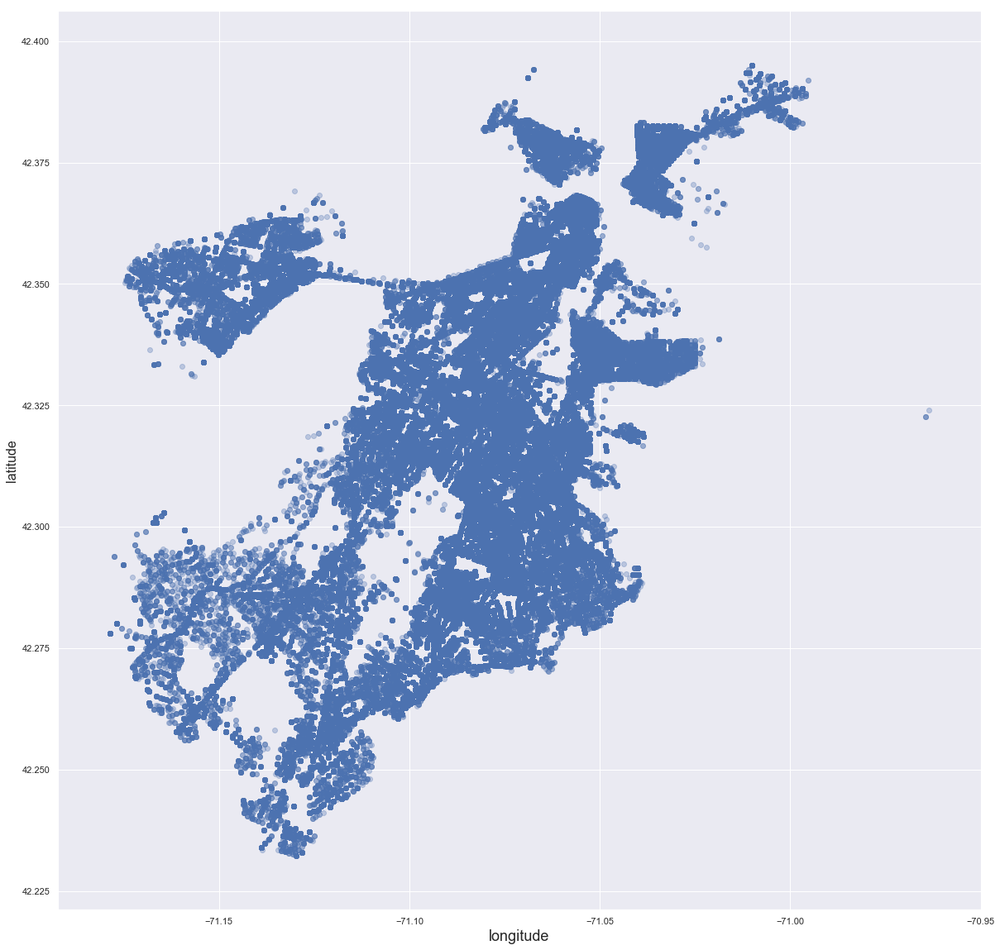

In [11]:
from sklearn.cluster import KMeans
X = np.array(list(zip(long,lat)))
colors = np.random.rand(50)
plt.figure(figsize=(20,20))
plt.scatter(X[:, 0],X[:, 1], alpha=0.3)
plt.xlabel('longitude', fontsize=18)
plt.ylabel('latitude', fontsize=16)
plt.show()

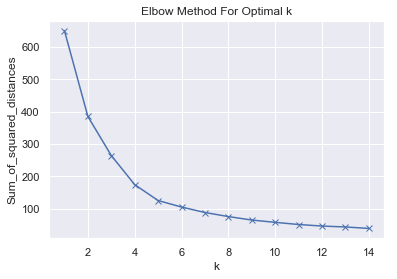

In [83]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(X)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [13]:
kmeans = KMeans(n_clusters=5)  
kmeans.fit(X) 

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

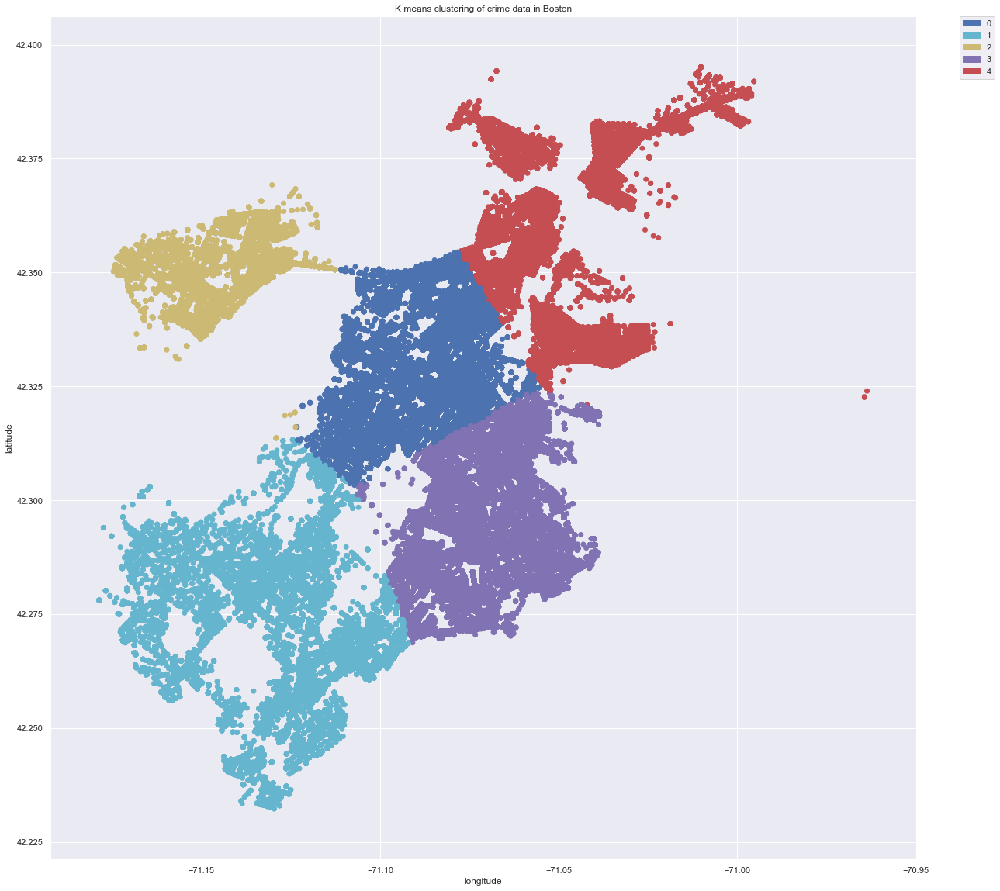

array([4, 2, 1, ..., 1, 1, 0])

In [20]:
from matplotlib.patches import Patch

c0 = Patch(facecolor='b', edgecolor='b',
                         label='0')
c1 = Patch(facecolor='c', edgecolor='c',
                         label='1')
c2 = Patch(facecolor='y', edgecolor='y',
                         label='2')
c3 = Patch(facecolor='m', edgecolor='m',
                         label='3')
c4 = Patch(facecolor='r', edgecolor='r',
                         label='4')

plt.figure(figsize=(20,20))
labels = kmeans.labels_
colors = {0:'b', 1:'c', 2:'y', 3:'m', 4:'r'}
label_color = [colors[l] for l in labels]
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0, handles=[c0,c1,c2,c3,c4])
plt.scatter(X[:,0],X[:,1], c=label_color)
plt.title("K means clustering of crime data in Boston")
plt.xlabel("longitude")
plt.ylabel("latitude")
plt.show()
labels

In [98]:
len(kmeans.labels_)

# Add the cluster identifier to the crime data
crimes_df['cluster'] = ""
for i in range(0, len(kmeans.labels_)):
    crimes_df.at[i, 'cluster'] = kmeans.labels_[i]

In [106]:
crimes_df.groupby(['cluster']).size()

cluster
0    100045
1     40862
2     82014
3     21969
4     97442
dtype: int64